In [1]:
from pathlib import Path
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
import mrcnn.model as DataGenerator
from mrcnn import visualize
from mrcnn.model import log
import pandas as pd
import os
import random
import cv2
import numpy as np
import ast
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [2]:
# DATA_DIR = Path('../working/')
# ROOT_DIR = "../../working"
resized_folder = "resized_train/"
NUM_CATS = 14
IMAGE_SIZE = 512
selected_classes = list(i for i in range(14)) 
category_list = ['Aortic enlargement','Atelectasis','Calcification',
                'Cardiomegaly','Consolidation','ILD','Infiltration','Lung Opacity',
                'Nodule/Mass','Other lesion','Pleural effusion','Pleural thickening',
                'Pneumothorax','Pulmonary fibrosis']

In [3]:
# Load data
samples_df = pd.read_csv('train_512.csv')

In [4]:
samples_df

,Unnamed: 0,image_id,CategoryId,EncodedPixels,Rad_id,Height,Width
0,0,7ecd6f67f649f26c05805c8359f9e528,"[11, 13]",['169029 27 169541 27 170053 27 170565 27 1710...,R9,512,512
1,1,7ecd6f67f649f26c05805c8359f9e528,[13],['71265 62 71777 62 72289 62 72801 62 73313 62...,R10,512,512
2,2,7ecd6f67f649f26c05805c8359f9e528,[13],['77419 60 77931 60 78443 60 78955 60 79467 60...,R8,512,512
3,3,2229148faa205e881cf0d932755c9e40,"[13, 11, 7, 11]",['59464 61 59976 61 60488 61 61000 61 61512 61...,R9,512,512
4,4,2229148faa205e881cf0d932755c9e40,"[11, 13, 13, 13, 11]",['34887 99 35399 99 35911 99 36423 99 36935 99...,R8,512,512
...,...,...,...,...,...,...,...
13177,13177,c619a784636c085eb798f98a5ba1102d,"[9, 0]",['41733 64 42245 64 42757 64 43269 64 43781 64...,R9,512,512
13178,13178,c619a784636c085eb798f98a5ba1102d,"[9, 8, 0]",['43276 46 43788 46 44300 46 44812 46 45324 46...,R10,512,512
13179,13179,e7ea94b2fec95a7461b10a7f3eea2897,"[0, 3]",['147546 57 148058 57 148570 57 149082 57 1495...,R10,512,512
13180,13180,e7ea94b2fec95a7461b10a7f3eea2897,"[3, 0]",['116950 76 117462 76 117974 76 118486 76 1189...,R9,512,512


In [5]:
class DiagnosticConfig(Config):
    NAME = "Diagnostic"
    NUM_CLASSES = NUM_CATS + 1 # +1 for the background class
    
    GPU_COUNT = 1
    IMAGES_PER_GPU = 2 #That is the maximum with the memory available on kernels
    
    BACKBONE = 'resnet50'
    
    IMAGE_MIN_DIM = IMAGE_SIZE
    IMAGE_MAX_DIM = IMAGE_SIZE    
    IMAGE_RESIZE_MODE = 'none'

    POST_NMS_ROIS_TRAINING = 250
    POST_NMS_ROIS_INFERENCE = 150
    MAX_GROUNDTRUTH_INSTANCES = 5
    BACKBONE_STRIDES = [4, 8, 16, 32, 64]
    BACKBONESHAPE = (8, 16, 24, 32, 48)
    RPN_ANCHOR_SCALES = (8,16,24,32,48)
    ROI_POSITIVE_RATIO = 0.33
    DETECTION_MAX_INSTANCES = 300
    DETECTION_MIN_CONFIDENCE = 0.7    
    # STEPS_PER_EPOCH should be the number of instances 
    # divided by (GPU_COUNT*IMAGES_PER_GPU), and so should VALIDATION_STEPS;
    # however, due to the time limit, I set them so that this kernel can be run in 9 hours
    STEPS_PER_EPOCH = int(len(samples_df)*0.9/IMAGES_PER_GPU)
    VALIDATION_STEPS = len(samples_df)-int(len(samples_df)*0.9/IMAGES_PER_GPU)
    
config = DiagnosticConfig()
config.display()



Configurations:
BACKBONE                       resnet50
BACKBONESHAPE                  (8, 16, 24, 32, 48)
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        300
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                27
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              none
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL

In [6]:
class DiagnosticDataset(utils.Dataset):
    def __init__(self, df):
        super().__init__(self)
        
        # Add classes
        for i, name in enumerate(category_list):
            self.add_class("diagnostic", i+1, name)
        
        # Add images 
        for i, row in df.iterrows():
            self.add_image("diagnostic", 
                           image_id=row.name,
                           path=resized_folder+str(row.image_id)+".png", 
                           labels=row['CategoryId'],
                           annotations=row['EncodedPixels'],
                           rad_id = row['Rad_id'],
                           height=row['Height'], width=row['Width'])

    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path'], [category_list[int(x)] for x in info['labels']]
    
    def load_image(self, image_id):
        return cv2.imread(self.image_info[image_id]['path'])

    def load_mask(self, image_id):
        info = self.image_info[image_id]
        #print(image_id)
        #print(info['path'])
        num_msk = len(ast.literal_eval(info['annotations']))         
        mask = np.zeros((IMAGE_SIZE, IMAGE_SIZE, num_msk), dtype=np.uint8)
        labels = []
        
        for m, (annotation, label) in enumerate(zip(ast.literal_eval(info['annotations']), ast.literal_eval(info['labels']))):
            sub_mask = np.full(info['height']*info['width'], 0, dtype=np.uint8)
            annotation = [int(float(x)) for x in annotation.split(' ') if x != '']
            
            for i, start_pixel in enumerate(annotation[::2]):
                sub_mask[start_pixel: start_pixel+annotation[2*i+1]] = 1

            sub_mask = sub_mask.reshape((info['height'], info['width']), order='F')
            sub_mask = cv2.resize(sub_mask, (IMAGE_SIZE, IMAGE_SIZE), interpolation=cv2.INTER_NEAREST)
            
            mask[:, :, m] = sub_mask
            labels.append(int(label)+1)
        return mask, np.array(labels)

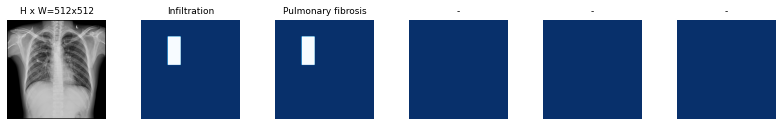

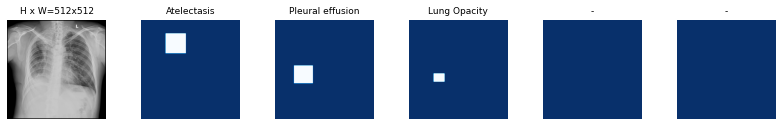

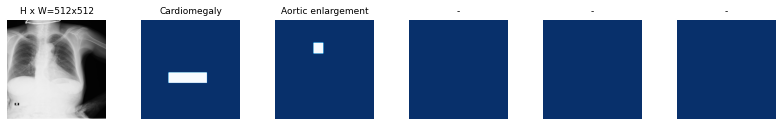

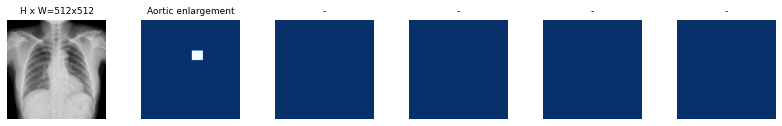

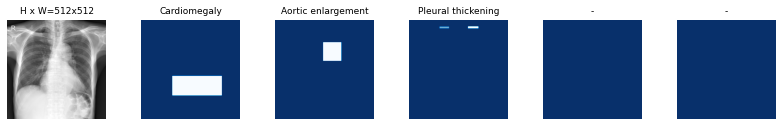

In [7]:
training_percentage = 0.9

training_set_size = int(training_percentage*len(samples_df))
validation_set_size = int((1-training_percentage)*len(samples_df))

train_dataset = DiagnosticDataset(samples_df[:training_set_size])
train_dataset.prepare()

valid_dataset = DiagnosticDataset(samples_df[training_set_size:training_set_size+validation_set_size])
valid_dataset.prepare()


for i in range(5):
    image_id = random.choice(train_dataset.image_ids)
    image = train_dataset.load_image(image_id)
    mask, class_ids = train_dataset.load_mask(image_id)

    visualize.display_top_masks(image, mask, class_ids, train_dataset.class_names, limit=5)

In [9]:
LR = 1e-4
EPOCHS = [1,18]
model = modellib.MaskRCNN(mode='training', config=config, model_dir="")
# model.load_weights('mask_rcnn_diagnostic_0001.h5', by_name=True)

In [10]:
model.train(train_dataset, valid_dataset,
            learning_rate=LR,
            epochs=1,
            layers='heads',
           )

history = model.keras_model.history.history


Starting at epoch 0. LR=0.0001

Checkpoint Path: diagnostic20210715T1900\mask_rcnn_diagnostic_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask_bn4         (Time

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:433: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This ma

   1/5931 [..............................] - ETA: 24:12:03 - loss: 39.8515 - rpn_class_loss: 6.8124 - rpn_bbox_loss: 4.2735 - mrcnn_class_loss: 28.7657 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   2/5931 [..............................] - ETA: 12:37:37 - loss: 39.3767 - rpn_class_loss: 7.4563 - rpn_bbox_loss: 3.7992 - mrcnn_class_loss: 28.1213 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   3/5931 [..............................] - ETA: 8:46:36 - loss: 37.2391 - rpn_class_loss: 7.1544 - rpn_bbox_loss: 3.7378 - mrcnn_class_loss: 26.3468 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00 

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   4/5931 [..............................] - ETA: 6:51:06 - loss: 35.4813 - rpn_class_loss: 6.7228 - rpn_bbox_loss: 3.8132 - mrcnn_class_loss: 24.9453 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   5/5931 [..............................] - ETA: 5:41:55 - loss: 33.2730 - rpn_class_loss: 6.4793 - rpn_bbox_loss: 3.6717 - mrcnn_class_loss: 23.1220 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   6/5931 [..............................] - ETA: 4:55:44 - loss: 31.1341 - rpn_class_loss: 6.0534 - rpn_bbox_loss: 3.9690 - mrcnn_class_loss: 21.1117 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   7/5931 [..............................] - ETA: 4:22:45 - loss: 28.1408 - rpn_class_loss: 5.6225 - rpn_bbox_loss: 3.7225 - mrcnn_class_loss: 18.7958 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   8/5931 [..............................] - ETA: 3:57:50 - loss: 25.3399 - rpn_class_loss: 5.2414 - rpn_bbox_loss: 3.5838 - mrcnn_class_loss: 16.5146 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   9/5931 [..............................] - ETA: 3:38:35 - loss: 23.0124 - rpn_class_loss: 4.8485 - rpn_bbox_loss: 3.4837 - mrcnn_class_loss: 14.6802 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  10/5931 [..............................] - ETA: 3:23:07 - loss: 21.1416 - rpn_class_loss: 4.5112 - rpn_bbox_loss: 3.4183 - mrcnn_class_loss: 13.2122 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  11/5931 [..............................] - ETA: 3:10:29 - loss: 19.5479 - rpn_class_loss: 4.2131 - rpn_bbox_loss: 3.3237 - mrcnn_class_loss: 12.0111 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  12/5931 [..............................] - ETA: 3:00:00 - loss: 18.5963 - rpn_class_loss: 3.9267 - rpn_bbox_loss: 3.3536 - mrcnn_class_loss: 11.3161 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  13/5931 [..............................] - ETA: 2:51:06 - loss: 17.7564 - rpn_class_loss: 3.6746 - rpn_bbox_loss: 3.6362 - mrcnn_class_loss: 10.4456 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  14/5931 [..............................] - ETA: 2:43:28 - loss: 17.1487 - rpn_class_loss: 3.4373 - rpn_bbox_loss: 4.0119 - mrcnn_class_loss: 9.6995 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00 

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  15/5931 [..............................] - ETA: 2:36:53 - loss: 16.2353 - rpn_class_loss: 3.2321 - rpn_bbox_loss: 3.9504 - mrcnn_class_loss: 9.0528 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  16/5931 [..............................] - ETA: 2:31:06 - loss: 15.4201 - rpn_class_loss: 3.0446 - rpn_bbox_loss: 3.8886 - mrcnn_class_loss: 8.4870 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  17/5931 [..............................] - ETA: 2:25:55 - loss: 14.7088 - rpn_class_loss: 2.8793 - rpn_bbox_loss: 3.8417 - mrcnn_class_loss: 7.9878 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  18/5931 [..............................] - ETA: 2:21:22 - loss: 14.0480 - rpn_class_loss: 2.7282 - rpn_bbox_loss: 3.7757 - mrcnn_class_loss: 7.5440 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  19/5931 [..............................] - ETA: 2:17:24 - loss: 13.7306 - rpn_class_loss: 2.5915 - rpn_bbox_loss: 3.7850 - mrcnn_class_loss: 7.1494 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.0556        

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  20/5931 [..............................] - ETA: 2:13:43 - loss: 13.2077 - rpn_class_loss: 2.4677 - rpn_bbox_loss: 3.7535 - mrcnn_class_loss: 6.7919 - mrcnn_bbox_loss: 0.1417 - mrcnn_mask_loss: 0.0528

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  21/5931 [..............................] - ETA: 2:10:26 - loss: 12.7230 - rpn_class_loss: 2.3551 - rpn_bbox_loss: 3.7141 - mrcnn_class_loss: 6.4685 - mrcnn_bbox_loss: 0.1350 - mrcnn_mask_loss: 0.0503

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  22/5931 [..............................] - ETA: 2:07:28 - loss: 12.6699 - rpn_class_loss: 2.2503 - rpn_bbox_loss: 3.6343 - mrcnn_class_loss: 6.1772 - mrcnn_bbox_loss: 0.5077 - mrcnn_mask_loss: 0.1005

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  23/5931 [..............................] - ETA: 2:04:44 - loss: 12.2616 - rpn_class_loss: 2.1583 - rpn_bbox_loss: 3.6130 - mrcnn_class_loss: 5.9086 - mrcnn_bbox_loss: 0.4856 - mrcnn_mask_loss: 0.0961

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  24/5931 [..............................] - ETA: 2:02:16 - loss: 12.0632 - rpn_class_loss: 2.0706 - rpn_bbox_loss: 3.5695 - mrcnn_class_loss: 5.6648 - mrcnn_bbox_loss: 0.6343 - mrcnn_mask_loss: 0.1241

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  25/5931 [..............................] - ETA: 1:59:55 - loss: 11.6834 - rpn_class_loss: 1.9918 - rpn_bbox_loss: 3.5254 - mrcnn_class_loss: 5.4382 - mrcnn_bbox_loss: 0.6089 - mrcnn_mask_loss: 0.1191

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  26/5931 [..............................] - ETA: 1:57:49 - loss: 11.4278 - rpn_class_loss: 1.9165 - rpn_bbox_loss: 3.4627 - mrcnn_class_loss: 5.2312 - mrcnn_bbox_loss: 0.6756 - mrcnn_mask_loss: 0.1418

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  27/5931 [..............................] - ETA: 1:55:48 - loss: 11.0703 - rpn_class_loss: 1.8499 - rpn_bbox_loss: 3.3958 - mrcnn_class_loss: 5.0374 - mrcnn_bbox_loss: 0.6506 - mrcnn_mask_loss: 0.1365

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  28/5931 [..............................] - ETA: 1:53:56 - loss: 10.7967 - rpn_class_loss: 1.7874 - rpn_bbox_loss: 3.3928 - mrcnn_class_loss: 4.8575 - mrcnn_bbox_loss: 0.6273 - mrcnn_mask_loss: 0.1317

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  29/5931 [..............................] - ETA: 1:52:13 - loss: 10.4993 - rpn_class_loss: 1.7278 - rpn_bbox_loss: 3.3486 - mrcnn_class_loss: 4.6900 - mrcnn_bbox_loss: 0.6057 - mrcnn_mask_loss: 0.1271

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  30/5931 [..............................] - ETA: 1:50:40 - loss: 10.3237 - rpn_class_loss: 1.6718 - rpn_bbox_loss: 3.3202 - mrcnn_class_loss: 4.5396 - mrcnn_bbox_loss: 0.6439 - mrcnn_mask_loss: 0.1482

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  31/5931 [..............................] - ETA: 1:49:09 - loss: 10.1491 - rpn_class_loss: 1.6225 - rpn_bbox_loss: 3.3668 - mrcnn_class_loss: 4.3932 - mrcnn_bbox_loss: 0.6231 - mrcnn_mask_loss: 0.1434

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  32/5931 [..............................] - ETA: 1:47:49 - loss: 10.1242 - rpn_class_loss: 1.5765 - rpn_bbox_loss: 3.4391 - mrcnn_class_loss: 4.2596 - mrcnn_bbox_loss: 0.6882 - mrcnn_mask_loss: 0.1608

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  33/5931 [..............................] - ETA: 1:46:30 - loss: 9.9029 - rpn_class_loss: 1.5317 - rpn_bbox_loss: 3.4175 - mrcnn_class_loss: 4.1305 - mrcnn_bbox_loss: 0.6673 - mrcnn_mask_loss: 0.1559 

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  34/5931 [..............................] - ETA: 1:45:17 - loss: 9.6709 - rpn_class_loss: 1.4885 - rpn_bbox_loss: 3.3743 - mrcnn_class_loss: 4.0090 - mrcnn_bbox_loss: 0.6477 - mrcnn_mask_loss: 0.1514

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  35/5931 [..............................] - ETA: 1:44:08 - loss: 9.4833 - rpn_class_loss: 1.4498 - rpn_bbox_loss: 3.3628 - mrcnn_class_loss: 3.8945 - mrcnn_bbox_loss: 0.6292 - mrcnn_mask_loss: 0.1470

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  36/5931 [..............................] - ETA: 1:43:05 - loss: 9.3900 - rpn_class_loss: 1.4117 - rpn_bbox_loss: 3.3486 - mrcnn_class_loss: 3.7895 - mrcnn_bbox_loss: 0.6817 - mrcnn_mask_loss: 0.1586

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  37/5931 [..............................] - ETA: 1:42:03 - loss: 9.2267 - rpn_class_loss: 1.3768 - rpn_bbox_loss: 3.3453 - mrcnn_class_loss: 3.6871 - mrcnn_bbox_loss: 0.6632 - mrcnn_mask_loss: 0.1543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  38/5931 [..............................] - ETA: 1:41:07 - loss: 9.1041 - rpn_class_loss: 1.3423 - rpn_bbox_loss: 3.3417 - mrcnn_class_loss: 3.5910 - mrcnn_bbox_loss: 0.6651 - mrcnn_mask_loss: 0.1640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  39/5931 [..............................] - ETA: 1:40:10 - loss: 9.0072 - rpn_class_loss: 1.3091 - rpn_bbox_loss: 3.3914 - mrcnn_class_loss: 3.4989 - mrcnn_bbox_loss: 0.6480 - mrcnn_mask_loss: 0.1598

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  40/5931 [..............................] - ETA: 1:39:20 - loss: 8.8673 - rpn_class_loss: 1.2771 - rpn_bbox_loss: 3.3381 - mrcnn_class_loss: 3.4126 - mrcnn_bbox_loss: 0.6658 - mrcnn_mask_loss: 0.1738

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  41/5931 [..............................] - ETA: 1:38:30 - loss: 8.8012 - rpn_class_loss: 1.2522 - rpn_bbox_loss: 3.3566 - mrcnn_class_loss: 3.3317 - mrcnn_bbox_loss: 0.6735 - mrcnn_mask_loss: 0.1872

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  42/5931 [..............................] - ETA: 1:37:42 - loss: 8.7117 - rpn_class_loss: 1.2230 - rpn_bbox_loss: 3.3323 - mrcnn_class_loss: 3.2538 - mrcnn_bbox_loss: 0.7036 - mrcnn_mask_loss: 0.1989

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  43/5931 [..............................] - ETA: 1:36:56 - loss: 8.6480 - rpn_class_loss: 1.1979 - rpn_bbox_loss: 3.3331 - mrcnn_class_loss: 3.1826 - mrcnn_bbox_loss: 0.7249 - mrcnn_mask_loss: 0.2096

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  44/5931 [..............................] - ETA: 1:36:10 - loss: 8.5196 - rpn_class_loss: 1.1719 - rpn_bbox_loss: 3.3242 - mrcnn_class_loss: 3.1102 - mrcnn_bbox_loss: 0.7084 - mrcnn_mask_loss: 0.2048

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  45/5931 [..............................] - ETA: 1:35:27 - loss: 8.4551 - rpn_class_loss: 1.1476 - rpn_bbox_loss: 3.3735 - mrcnn_class_loss: 3.0411 - mrcnn_bbox_loss: 0.6926 - mrcnn_mask_loss: 0.2003

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  46/5931 [..............................] - ETA: 1:34:47 - loss: 8.4673 - rpn_class_loss: 1.1501 - rpn_bbox_loss: 3.4102 - mrcnn_class_loss: 2.9786 - mrcnn_bbox_loss: 0.7191 - mrcnn_mask_loss: 0.2094

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  47/5931 [..............................] - ETA: 1:34:09 - loss: 8.4642 - rpn_class_loss: 1.1266 - rpn_bbox_loss: 3.4235 - mrcnn_class_loss: 2.9229 - mrcnn_bbox_loss: 0.7691 - mrcnn_mask_loss: 0.2221

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  48/5931 [..............................] - ETA: 1:33:30 - loss: 8.3448 - rpn_class_loss: 1.1044 - rpn_bbox_loss: 3.4078 - mrcnn_class_loss: 2.8620 - mrcnn_bbox_loss: 0.7531 - mrcnn_mask_loss: 0.2175

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  49/5931 [..............................] - ETA: 1:32:56 - loss: 8.2995 - rpn_class_loss: 1.0834 - rpn_bbox_loss: 3.3922 - mrcnn_class_loss: 2.8083 - mrcnn_bbox_loss: 0.7886 - mrcnn_mask_loss: 0.2270

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  50/5931 [..............................] - ETA: 1:32:21 - loss: 8.1846 - rpn_class_loss: 1.0641 - rpn_bbox_loss: 3.3730 - mrcnn_class_loss: 2.7522 - mrcnn_bbox_loss: 0.7728 - mrcnn_mask_loss: 0.2225

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  51/5931 [..............................] - ETA: 1:31:49 - loss: 8.0778 - rpn_class_loss: 1.0477 - rpn_bbox_loss: 3.3560 - mrcnn_class_loss: 2.6982 - mrcnn_bbox_loss: 0.7577 - mrcnn_mask_loss: 0.2181

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  52/5931 [..............................] - ETA: 1:31:19 - loss: 8.0144 - rpn_class_loss: 1.0283 - rpn_bbox_loss: 3.3460 - mrcnn_class_loss: 2.6471 - mrcnn_bbox_loss: 0.7659 - mrcnn_mask_loss: 0.2270

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  53/5931 [..............................] - ETA: 1:30:50 - loss: 7.9644 - rpn_class_loss: 1.0097 - rpn_bbox_loss: 3.3471 - mrcnn_class_loss: 2.5982 - mrcnn_bbox_loss: 0.7744 - mrcnn_mask_loss: 0.2350

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  54/5931 [..............................] - ETA: 1:30:23 - loss: 7.9415 - rpn_class_loss: 0.9926 - rpn_bbox_loss: 3.3392 - mrcnn_class_loss: 2.5533 - mrcnn_bbox_loss: 0.8122 - mrcnn_mask_loss: 0.2443

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  55/5931 [..............................] - ETA: 1:29:56 - loss: 7.9068 - rpn_class_loss: 0.9760 - rpn_bbox_loss: 3.3093 - mrcnn_class_loss: 2.5082 - mrcnn_bbox_loss: 0.8537 - mrcnn_mask_loss: 0.2597

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  56/5931 [..............................] - ETA: 1:29:29 - loss: 7.8481 - rpn_class_loss: 0.9596 - rpn_bbox_loss: 3.3316 - mrcnn_class_loss: 2.4634 - mrcnn_bbox_loss: 0.8384 - mrcnn_mask_loss: 0.2551

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  57/5931 [..............................] - ETA: 1:29:04 - loss: 7.7878 - rpn_class_loss: 0.9435 - rpn_bbox_loss: 3.3101 - mrcnn_class_loss: 2.4232 - mrcnn_bbox_loss: 0.8513 - mrcnn_mask_loss: 0.2597

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  58/5931 [..............................] - ETA: 1:28:39 - loss: 7.6958 - rpn_class_loss: 0.9281 - rpn_bbox_loss: 3.2944 - mrcnn_class_loss: 2.3814 - mrcnn_bbox_loss: 0.8366 - mrcnn_mask_loss: 0.2552

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  59/5931 [..............................] - ETA: 1:28:15 - loss: 7.6469 - rpn_class_loss: 0.9131 - rpn_bbox_loss: 3.2629 - mrcnn_class_loss: 2.3428 - mrcnn_bbox_loss: 0.8702 - mrcnn_mask_loss: 0.2579

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  60/5931 [..............................] - ETA: 1:27:52 - loss: 7.6029 - rpn_class_loss: 0.8980 - rpn_bbox_loss: 3.2514 - mrcnn_class_loss: 2.3049 - mrcnn_bbox_loss: 0.8813 - mrcnn_mask_loss: 0.2673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  61/5931 [..............................] - ETA: 1:27:30 - loss: 7.5208 - rpn_class_loss: 0.8834 - rpn_bbox_loss: 3.2404 - mrcnn_class_loss: 2.2671 - mrcnn_bbox_loss: 0.8669 - mrcnn_mask_loss: 0.2630

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  62/5931 [..............................] - ETA: 1:27:07 - loss: 7.4536 - rpn_class_loss: 0.8730 - rpn_bbox_loss: 3.2385 - mrcnn_class_loss: 2.2306 - mrcnn_bbox_loss: 0.8529 - mrcnn_mask_loss: 0.2587

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  63/5931 [..............................] - ETA: 1:26:47 - loss: 7.3992 - rpn_class_loss: 0.8595 - rpn_bbox_loss: 3.2262 - mrcnn_class_loss: 2.1976 - mrcnn_bbox_loss: 0.8533 - mrcnn_mask_loss: 0.2626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  64/5931 [..............................] - ETA: 1:26:27 - loss: 7.3498 - rpn_class_loss: 0.8468 - rpn_bbox_loss: 3.2108 - mrcnn_class_loss: 2.1653 - mrcnn_bbox_loss: 0.8618 - mrcnn_mask_loss: 0.2651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  65/5931 [..............................] - ETA: 1:26:08 - loss: 7.3003 - rpn_class_loss: 0.8351 - rpn_bbox_loss: 3.2040 - mrcnn_class_loss: 2.1331 - mrcnn_bbox_loss: 0.8608 - mrcnn_mask_loss: 0.2673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  66/5931 [..............................] - ETA: 1:25:49 - loss: 7.2799 - rpn_class_loss: 0.8243 - rpn_bbox_loss: 3.1956 - mrcnn_class_loss: 2.1021 - mrcnn_bbox_loss: 0.8834 - mrcnn_mask_loss: 0.2745

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  67/5931 [..............................] - ETA: 1:25:30 - loss: 7.1994 - rpn_class_loss: 0.8128 - rpn_bbox_loss: 3.1752 - mrcnn_class_loss: 2.0708 - mrcnn_bbox_loss: 0.8702 - mrcnn_mask_loss: 0.2704

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  68/5931 [..............................] - ETA: 1:25:12 - loss: 7.1654 - rpn_class_loss: 0.8013 - rpn_bbox_loss: 3.1693 - mrcnn_class_loss: 2.0418 - mrcnn_bbox_loss: 0.8783 - mrcnn_mask_loss: 0.2747

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  69/5931 [..............................] - ETA: 1:24:55 - loss: 7.1377 - rpn_class_loss: 0.7902 - rpn_bbox_loss: 3.1655 - mrcnn_class_loss: 2.0143 - mrcnn_bbox_loss: 0.8908 - mrcnn_mask_loss: 0.2769

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  70/5931 [..............................] - ETA: 1:24:38 - loss: 7.1001 - rpn_class_loss: 0.7793 - rpn_bbox_loss: 3.1508 - mrcnn_class_loss: 1.9859 - mrcnn_bbox_loss: 0.9015 - mrcnn_mask_loss: 0.2826

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  71/5931 [..............................] - ETA: 1:24:21 - loss: 7.0653 - rpn_class_loss: 0.7689 - rpn_bbox_loss: 3.1710 - mrcnn_class_loss: 1.9580 - mrcnn_bbox_loss: 0.8888 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  72/5931 [..............................] - ETA: 1:24:06 - loss: 7.0386 - rpn_class_loss: 0.7585 - rpn_bbox_loss: 3.1765 - mrcnn_class_loss: 1.9311 - mrcnn_bbox_loss: 0.8923 - mrcnn_mask_loss: 0.2802

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  73/5931 [..............................] - ETA: 1:23:51 - loss: 7.0011 - rpn_class_loss: 0.7486 - rpn_bbox_loss: 3.1763 - mrcnn_class_loss: 1.9054 - mrcnn_bbox_loss: 0.8872 - mrcnn_mask_loss: 0.2836

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  74/5931 [..............................] - ETA: 1:23:36 - loss: 6.9460 - rpn_class_loss: 0.7396 - rpn_bbox_loss: 3.1718 - mrcnn_class_loss: 1.8796 - mrcnn_bbox_loss: 0.8753 - mrcnn_mask_loss: 0.2798

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  75/5931 [..............................] - ETA: 1:23:21 - loss: 6.9242 - rpn_class_loss: 0.7304 - rpn_bbox_loss: 3.1601 - mrcnn_class_loss: 1.8562 - mrcnn_bbox_loss: 0.8907 - mrcnn_mask_loss: 0.2868

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  76/5931 [..............................] - ETA: 1:23:07 - loss: 6.9243 - rpn_class_loss: 0.7213 - rpn_bbox_loss: 3.1652 - mrcnn_class_loss: 1.8326 - mrcnn_bbox_loss: 0.9140 - mrcnn_mask_loss: 0.2912

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  77/5931 [..............................] - ETA: 1:22:53 - loss: 6.9081 - rpn_class_loss: 0.7134 - rpn_bbox_loss: 3.1638 - mrcnn_class_loss: 1.8094 - mrcnn_bbox_loss: 0.9287 - mrcnn_mask_loss: 0.2928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  78/5931 [..............................] - ETA: 1:22:39 - loss: 6.8407 - rpn_class_loss: 0.7046 - rpn_bbox_loss: 3.1440 - mrcnn_class_loss: 1.7862 - mrcnn_bbox_loss: 0.9168 - mrcnn_mask_loss: 0.2891

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  79/5931 [..............................] - ETA: 1:22:26 - loss: 6.8099 - rpn_class_loss: 0.6978 - rpn_bbox_loss: 3.1329 - mrcnn_class_loss: 1.7644 - mrcnn_bbox_loss: 0.9219 - mrcnn_mask_loss: 0.2930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  80/5931 [..............................] - ETA: 1:22:13 - loss: 6.7891 - rpn_class_loss: 0.6895 - rpn_bbox_loss: 3.1352 - mrcnn_class_loss: 1.7432 - mrcnn_bbox_loss: 0.9276 - mrcnn_mask_loss: 0.2936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  81/5931 [..............................] - ETA: 1:22:00 - loss: 6.7610 - rpn_class_loss: 0.6813 - rpn_bbox_loss: 3.1224 - mrcnn_class_loss: 1.7220 - mrcnn_bbox_loss: 0.9369 - mrcnn_mask_loss: 0.2983

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  82/5931 [..............................] - ETA: 1:21:47 - loss: 6.7497 - rpn_class_loss: 0.6734 - rpn_bbox_loss: 3.1296 - mrcnn_class_loss: 1.7021 - mrcnn_bbox_loss: 0.9441 - mrcnn_mask_loss: 0.3005

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  83/5931 [..............................] - ETA: 1:21:35 - loss: 6.7089 - rpn_class_loss: 0.6658 - rpn_bbox_loss: 3.1319 - mrcnn_class_loss: 1.6816 - mrcnn_bbox_loss: 0.9327 - mrcnn_mask_loss: 0.2969

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  84/5931 [..............................] - ETA: 1:21:23 - loss: 6.6776 - rpn_class_loss: 0.6604 - rpn_bbox_loss: 3.1406 - mrcnn_class_loss: 1.6615 - mrcnn_bbox_loss: 0.9216 - mrcnn_mask_loss: 0.2934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  85/5931 [..............................] - ETA: 1:21:11 - loss: 6.6544 - rpn_class_loss: 0.6534 - rpn_bbox_loss: 3.1317 - mrcnn_class_loss: 1.6423 - mrcnn_bbox_loss: 0.9295 - mrcnn_mask_loss: 0.2973

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  86/5931 [..............................] - ETA: 1:21:00 - loss: 6.6152 - rpn_class_loss: 0.6460 - rpn_bbox_loss: 3.1333 - mrcnn_class_loss: 1.6232 - mrcnn_bbox_loss: 0.9187 - mrcnn_mask_loss: 0.2939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  87/5931 [..............................] - ETA: 1:20:48 - loss: 6.5618 - rpn_class_loss: 0.6390 - rpn_bbox_loss: 3.1196 - mrcnn_class_loss: 1.6046 - mrcnn_bbox_loss: 0.9082 - mrcnn_mask_loss: 0.2905

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  88/5931 [..............................] - ETA: 1:20:38 - loss: 6.5328 - rpn_class_loss: 0.6327 - rpn_bbox_loss: 3.1129 - mrcnn_class_loss: 1.5869 - mrcnn_bbox_loss: 0.9073 - mrcnn_mask_loss: 0.2930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  89/5931 [..............................] - ETA: 1:20:29 - loss: 6.4978 - rpn_class_loss: 0.6265 - rpn_bbox_loss: 3.0956 - mrcnn_class_loss: 1.5693 - mrcnn_bbox_loss: 0.9100 - mrcnn_mask_loss: 0.2964

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  90/5931 [..............................] - ETA: 1:20:19 - loss: 6.4779 - rpn_class_loss: 0.6199 - rpn_bbox_loss: 3.0902 - mrcnn_class_loss: 1.5529 - mrcnn_bbox_loss: 0.9139 - mrcnn_mask_loss: 0.3009

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  91/5931 [..............................] - ETA: 1:20:08 - loss: 6.4274 - rpn_class_loss: 0.6134 - rpn_bbox_loss: 3.0766 - mrcnn_class_loss: 1.5359 - mrcnn_bbox_loss: 0.9039 - mrcnn_mask_loss: 0.2976

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  92/5931 [..............................] - ETA: 1:19:58 - loss: 6.4031 - rpn_class_loss: 0.6070 - rpn_bbox_loss: 3.0683 - mrcnn_class_loss: 1.5212 - mrcnn_bbox_loss: 0.9057 - mrcnn_mask_loss: 0.3008

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  93/5931 [..............................] - ETA: 1:19:48 - loss: 6.3737 - rpn_class_loss: 0.6011 - rpn_bbox_loss: 3.0612 - mrcnn_class_loss: 1.5062 - mrcnn_bbox_loss: 0.9030 - mrcnn_mask_loss: 0.3022

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  94/5931 [..............................] - ETA: 1:19:39 - loss: 6.3622 - rpn_class_loss: 0.5958 - rpn_bbox_loss: 3.0693 - mrcnn_class_loss: 1.4908 - mrcnn_bbox_loss: 0.9019 - mrcnn_mask_loss: 0.3044

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  95/5931 [..............................] - ETA: 1:19:29 - loss: 6.3363 - rpn_class_loss: 0.5901 - rpn_bbox_loss: 3.0640 - mrcnn_class_loss: 1.4757 - mrcnn_bbox_loss: 0.9012 - mrcnn_mask_loss: 0.3053

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  96/5931 [..............................] - ETA: 1:19:20 - loss: 6.3218 - rpn_class_loss: 0.5845 - rpn_bbox_loss: 3.0532 - mrcnn_class_loss: 1.4607 - mrcnn_bbox_loss: 0.9142 - mrcnn_mask_loss: 0.3092

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  97/5931 [..............................] - ETA: 1:19:11 - loss: 6.3106 - rpn_class_loss: 0.5786 - rpn_bbox_loss: 3.0534 - mrcnn_class_loss: 1.4469 - mrcnn_bbox_loss: 0.9213 - mrcnn_mask_loss: 0.3104

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  98/5931 [..............................] - ETA: 1:19:03 - loss: 6.2985 - rpn_class_loss: 0.5732 - rpn_bbox_loss: 3.0536 - mrcnn_class_loss: 1.4328 - mrcnn_bbox_loss: 0.9257 - mrcnn_mask_loss: 0.3133

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  99/5931 [..............................] - ETA: 1:18:54 - loss: 6.2757 - rpn_class_loss: 0.5688 - rpn_bbox_loss: 3.0460 - mrcnn_class_loss: 1.4187 - mrcnn_bbox_loss: 0.9245 - mrcnn_mask_loss: 0.3178

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 100/5931 [..............................] - ETA: 1:18:45 - loss: 6.2422 - rpn_class_loss: 0.5634 - rpn_bbox_loss: 3.0444 - mrcnn_class_loss: 1.4045 - mrcnn_bbox_loss: 0.9153 - mrcnn_mask_loss: 0.3146

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 101/5931 [..............................] - ETA: 1:18:38 - loss: 6.2125 - rpn_class_loss: 0.5581 - rpn_bbox_loss: 3.0364 - mrcnn_class_loss: 1.3910 - mrcnn_bbox_loss: 0.9105 - mrcnn_mask_loss: 0.3164

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 102/5931 [..............................] - ETA: 1:18:29 - loss: 6.1930 - rpn_class_loss: 0.5531 - rpn_bbox_loss: 3.0476 - mrcnn_class_loss: 1.3774 - mrcnn_bbox_loss: 0.9016 - mrcnn_mask_loss: 0.3133

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 103/5931 [..............................] - ETA: 1:18:22 - loss: 6.1831 - rpn_class_loss: 0.5481 - rpn_bbox_loss: 3.0516 - mrcnn_class_loss: 1.3647 - mrcnn_bbox_loss: 0.9036 - mrcnn_mask_loss: 0.3150

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 104/5931 [..............................] - ETA: 1:18:14 - loss: 6.1687 - rpn_class_loss: 0.5440 - rpn_bbox_loss: 3.0526 - mrcnn_class_loss: 1.3520 - mrcnn_bbox_loss: 0.9024 - mrcnn_mask_loss: 0.3178

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 105/5931 [..............................] - ETA: 1:18:06 - loss: 6.1444 - rpn_class_loss: 0.5407 - rpn_bbox_loss: 3.0560 - mrcnn_class_loss: 1.3391 - mrcnn_bbox_loss: 0.8938 - mrcnn_mask_loss: 0.3147

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 106/5931 [..............................] - ETA: 1:17:58 - loss: 6.1013 - rpn_class_loss: 0.5362 - rpn_bbox_loss: 3.0416 - mrcnn_class_loss: 1.3265 - mrcnn_bbox_loss: 0.8853 - mrcnn_mask_loss: 0.3118

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 107/5931 [..............................] - ETA: 1:17:51 - loss: 6.0968 - rpn_class_loss: 0.5332 - rpn_bbox_loss: 3.0473 - mrcnn_class_loss: 1.3147 - mrcnn_bbox_loss: 0.8874 - mrcnn_mask_loss: 0.3142

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 108/5931 [..............................] - ETA: 1:17:44 - loss: 6.0965 - rpn_class_loss: 0.5286 - rpn_bbox_loss: 3.0553 - mrcnn_class_loss: 1.3031 - mrcnn_bbox_loss: 0.8921 - mrcnn_mask_loss: 0.3174

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 109/5931 [..............................] - ETA: 1:17:37 - loss: 6.0936 - rpn_class_loss: 0.5244 - rpn_bbox_loss: 3.0654 - mrcnn_class_loss: 1.2919 - mrcnn_bbox_loss: 0.8923 - mrcnn_mask_loss: 0.3196

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 110/5931 [..............................] - ETA: 1:17:31 - loss: 6.0748 - rpn_class_loss: 0.5200 - rpn_bbox_loss: 3.0546 - mrcnn_class_loss: 1.2804 - mrcnn_bbox_loss: 0.8965 - mrcnn_mask_loss: 0.3234

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 111/5931 [..............................] - ETA: 1:17:26 - loss: 6.0445 - rpn_class_loss: 0.5156 - rpn_bbox_loss: 3.0367 - mrcnn_class_loss: 1.2692 - mrcnn_bbox_loss: 0.8940 - mrcnn_mask_loss: 0.3290

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 112/5931 [..............................] - ETA: 1:17:19 - loss: 6.0534 - rpn_class_loss: 0.5112 - rpn_bbox_loss: 3.0370 - mrcnn_class_loss: 1.2588 - mrcnn_bbox_loss: 0.9100 - mrcnn_mask_loss: 0.3364

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 113/5931 [..............................] - ETA: 1:17:13 - loss: 6.0213 - rpn_class_loss: 0.5068 - rpn_bbox_loss: 3.0316 - mrcnn_class_loss: 1.2476 - mrcnn_bbox_loss: 0.9020 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 114/5931 [..............................] - ETA: 1:17:06 - loss: 5.9868 - rpn_class_loss: 0.5034 - rpn_bbox_loss: 3.0222 - mrcnn_class_loss: 1.2367 - mrcnn_bbox_loss: 0.8941 - mrcnn_mask_loss: 0.3305

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 115/5931 [..............................] - ETA: 1:17:00 - loss: 5.9618 - rpn_class_loss: 0.4992 - rpn_bbox_loss: 3.0228 - mrcnn_class_loss: 1.2259 - mrcnn_bbox_loss: 0.8863 - mrcnn_mask_loss: 0.3276

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 116/5931 [..............................] - ETA: 1:16:54 - loss: 5.9313 - rpn_class_loss: 0.4959 - rpn_bbox_loss: 3.0166 - mrcnn_class_loss: 1.2154 - mrcnn_bbox_loss: 0.8786 - mrcnn_mask_loss: 0.3248

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 117/5931 [..............................] - ETA: 1:16:48 - loss: 5.9417 - rpn_class_loss: 0.4920 - rpn_bbox_loss: 3.0398 - mrcnn_class_loss: 1.2054 - mrcnn_bbox_loss: 0.8786 - mrcnn_mask_loss: 0.3260

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 118/5931 [..............................] - ETA: 1:16:42 - loss: 5.9400 - rpn_class_loss: 0.4883 - rpn_bbox_loss: 3.0393 - mrcnn_class_loss: 1.1955 - mrcnn_bbox_loss: 0.8908 - mrcnn_mask_loss: 0.3261

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 119/5931 [..............................] - ETA: 1:16:36 - loss: 5.9351 - rpn_class_loss: 0.4851 - rpn_bbox_loss: 3.0580 - mrcnn_class_loss: 1.1855 - mrcnn_bbox_loss: 0.8833 - mrcnn_mask_loss: 0.3233

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 120/5931 [..............................] - ETA: 1:16:30 - loss: 5.9196 - rpn_class_loss: 0.4813 - rpn_bbox_loss: 3.0480 - mrcnn_class_loss: 1.1761 - mrcnn_bbox_loss: 0.8889 - mrcnn_mask_loss: 0.3253

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 121/5931 [..............................] - ETA: 1:16:24 - loss: 5.9125 - rpn_class_loss: 0.4777 - rpn_bbox_loss: 3.0643 - mrcnn_class_loss: 1.1664 - mrcnn_bbox_loss: 0.8816 - mrcnn_mask_loss: 0.3226

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 122/5931 [..............................] - ETA: 1:16:18 - loss: 5.8778 - rpn_class_loss: 0.4739 - rpn_bbox_loss: 3.0528 - mrcnn_class_loss: 1.1568 - mrcnn_bbox_loss: 0.8744 - mrcnn_mask_loss: 0.3200

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 123/5931 [..............................] - ETA: 1:16:12 - loss: 5.8826 - rpn_class_loss: 0.4705 - rpn_bbox_loss: 3.0525 - mrcnn_class_loss: 1.1485 - mrcnn_bbox_loss: 0.8894 - mrcnn_mask_loss: 0.3217

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 124/5931 [..............................] - ETA: 1:16:06 - loss: 5.8538 - rpn_class_loss: 0.4673 - rpn_bbox_loss: 3.0459 - mrcnn_class_loss: 1.1393 - mrcnn_bbox_loss: 0.8822 - mrcnn_mask_loss: 0.3191

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 125/5931 [..............................] - ETA: 1:16:00 - loss: 5.8292 - rpn_class_loss: 0.4637 - rpn_bbox_loss: 3.0436 - mrcnn_class_loss: 1.1302 - mrcnn_bbox_loss: 0.8752 - mrcnn_mask_loss: 0.3166

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 126/5931 [..............................] - ETA: 1:15:54 - loss: 5.8173 - rpn_class_loss: 0.4603 - rpn_bbox_loss: 3.0535 - mrcnn_class_loss: 1.1212 - mrcnn_bbox_loss: 0.8682 - mrcnn_mask_loss: 0.3140

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 127/5931 [..............................] - ETA: 1:15:49 - loss: 5.8078 - rpn_class_loss: 0.4570 - rpn_bbox_loss: 3.0544 - mrcnn_class_loss: 1.1125 - mrcnn_bbox_loss: 0.8687 - mrcnn_mask_loss: 0.3152

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 128/5931 [..............................] - ETA: 1:15:45 - loss: 5.7933 - rpn_class_loss: 0.4535 - rpn_bbox_loss: 3.0418 - mrcnn_class_loss: 1.1041 - mrcnn_bbox_loss: 0.8736 - mrcnn_mask_loss: 0.3204

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 129/5931 [..............................] - ETA: 1:15:40 - loss: 5.7841 - rpn_class_loss: 0.4502 - rpn_bbox_loss: 3.0465 - mrcnn_class_loss: 1.0957 - mrcnn_bbox_loss: 0.8704 - mrcnn_mask_loss: 0.3214

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 130/5931 [..............................] - ETA: 1:15:34 - loss: 5.7789 - rpn_class_loss: 0.4469 - rpn_bbox_loss: 3.0350 - mrcnn_class_loss: 1.0875 - mrcnn_bbox_loss: 0.8860 - mrcnn_mask_loss: 0.3235

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 131/5931 [..............................] - ETA: 1:15:29 - loss: 5.7657 - rpn_class_loss: 0.4436 - rpn_bbox_loss: 3.0426 - mrcnn_class_loss: 1.0792 - mrcnn_bbox_loss: 0.8792 - mrcnn_mask_loss: 0.3211

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 132/5931 [..............................] - ETA: 1:15:24 - loss: 5.7499 - rpn_class_loss: 0.4406 - rpn_bbox_loss: 3.0340 - mrcnn_class_loss: 1.0712 - mrcnn_bbox_loss: 0.8814 - mrcnn_mask_loss: 0.3226

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 133/5931 [..............................] - ETA: 1:15:18 - loss: 5.7291 - rpn_class_loss: 0.4379 - rpn_bbox_loss: 3.0330 - mrcnn_class_loss: 1.0632 - mrcnn_bbox_loss: 0.8748 - mrcnn_mask_loss: 0.3202

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 134/5931 [..............................] - ETA: 1:15:14 - loss: 5.7216 - rpn_class_loss: 0.4350 - rpn_bbox_loss: 3.0302 - mrcnn_class_loss: 1.0560 - mrcnn_bbox_loss: 0.8783 - mrcnn_mask_loss: 0.3221

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 135/5931 [..............................] - ETA: 1:15:10 - loss: 5.7188 - rpn_class_loss: 0.4320 - rpn_bbox_loss: 3.0273 - mrcnn_class_loss: 1.0484 - mrcnn_bbox_loss: 0.8874 - mrcnn_mask_loss: 0.3237

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 136/5931 [..............................] - ETA: 1:15:08 - loss: 5.7121 - rpn_class_loss: 0.4290 - rpn_bbox_loss: 3.0310 - mrcnn_class_loss: 1.0408 - mrcnn_bbox_loss: 0.8868 - mrcnn_mask_loss: 0.3245

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 137/5931 [..............................] - ETA: 1:15:03 - loss: 5.7107 - rpn_class_loss: 0.4260 - rpn_bbox_loss: 3.0302 - mrcnn_class_loss: 1.0337 - mrcnn_bbox_loss: 0.8942 - mrcnn_mask_loss: 0.3267

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 138/5931 [..............................] - ETA: 1:14:59 - loss: 5.7062 - rpn_class_loss: 0.4231 - rpn_bbox_loss: 3.0449 - mrcnn_class_loss: 1.0262 - mrcnn_bbox_loss: 0.8877 - mrcnn_mask_loss: 0.3243

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 139/5931 [..............................] - ETA: 1:14:54 - loss: 5.7034 - rpn_class_loss: 0.4202 - rpn_bbox_loss: 3.0507 - mrcnn_class_loss: 1.0190 - mrcnn_bbox_loss: 0.8875 - mrcnn_mask_loss: 0.3260

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 140/5931 [..............................] - ETA: 1:14:50 - loss: 5.6975 - rpn_class_loss: 0.4177 - rpn_bbox_loss: 3.0463 - mrcnn_class_loss: 1.0118 - mrcnn_bbox_loss: 0.8925 - mrcnn_mask_loss: 0.3293

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 141/5931 [..............................] - ETA: 1:14:45 - loss: 5.6864 - rpn_class_loss: 0.4151 - rpn_bbox_loss: 3.0422 - mrcnn_class_loss: 1.0048 - mrcnn_bbox_loss: 0.8952 - mrcnn_mask_loss: 0.3291

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 142/5931 [..............................] - ETA: 1:14:41 - loss: 5.6719 - rpn_class_loss: 0.4123 - rpn_bbox_loss: 3.0347 - mrcnn_class_loss: 0.9979 - mrcnn_bbox_loss: 0.8958 - mrcnn_mask_loss: 0.3311

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 143/5931 [..............................] - ETA: 1:14:36 - loss: 5.6549 - rpn_class_loss: 0.4097 - rpn_bbox_loss: 3.0359 - mrcnn_class_loss: 0.9910 - mrcnn_bbox_loss: 0.8896 - mrcnn_mask_loss: 0.3288

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 144/5931 [..............................] - ETA: 1:14:32 - loss: 5.6459 - rpn_class_loss: 0.4072 - rpn_bbox_loss: 3.0280 - mrcnn_class_loss: 0.9844 - mrcnn_bbox_loss: 0.8949 - mrcnn_mask_loss: 0.3314

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 145/5931 [..............................] - ETA: 1:14:28 - loss: 5.6367 - rpn_class_loss: 0.4054 - rpn_bbox_loss: 3.0264 - mrcnn_class_loss: 0.9777 - mrcnn_bbox_loss: 0.8959 - mrcnn_mask_loss: 0.3313

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 146/5931 [..............................] - ETA: 1:14:25 - loss: 5.6433 - rpn_class_loss: 0.4030 - rpn_bbox_loss: 3.0386 - mrcnn_class_loss: 0.9714 - mrcnn_bbox_loss: 0.8977 - mrcnn_mask_loss: 0.3326

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 147/5931 [..............................] - ETA: 1:14:21 - loss: 5.6326 - rpn_class_loss: 0.4003 - rpn_bbox_loss: 3.0346 - mrcnn_class_loss: 0.9649 - mrcnn_bbox_loss: 0.8979 - mrcnn_mask_loss: 0.3349

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 148/5931 [..............................] - ETA: 1:14:18 - loss: 5.6289 - rpn_class_loss: 0.3977 - rpn_bbox_loss: 3.0311 - mrcnn_class_loss: 0.9585 - mrcnn_bbox_loss: 0.9051 - mrcnn_mask_loss: 0.3365

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 149/5931 [..............................] - ETA: 1:14:14 - loss: 5.6204 - rpn_class_loss: 0.3952 - rpn_bbox_loss: 3.0308 - mrcnn_class_loss: 0.9523 - mrcnn_bbox_loss: 0.9041 - mrcnn_mask_loss: 0.3380

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 150/5931 [..............................] - ETA: 1:14:10 - loss: 5.6175 - rpn_class_loss: 0.3931 - rpn_bbox_loss: 3.0369 - mrcnn_class_loss: 0.9462 - mrcnn_bbox_loss: 0.9020 - mrcnn_mask_loss: 0.3393

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 151/5931 [..............................] - ETA: 1:14:06 - loss: 5.5931 - rpn_class_loss: 0.3909 - rpn_bbox_loss: 3.0291 - mrcnn_class_loss: 0.9400 - mrcnn_bbox_loss: 0.8960 - mrcnn_mask_loss: 0.3371

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 152/5931 [..............................] - ETA: 1:14:01 - loss: 5.5711 - rpn_class_loss: 0.3886 - rpn_bbox_loss: 3.0238 - mrcnn_class_loss: 0.9338 - mrcnn_bbox_loss: 0.8901 - mrcnn_mask_loss: 0.3349

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 153/5931 [..............................] - ETA: 1:13:57 - loss: 5.5537 - rpn_class_loss: 0.3863 - rpn_bbox_loss: 3.0228 - mrcnn_class_loss: 0.9277 - mrcnn_bbox_loss: 0.8843 - mrcnn_mask_loss: 0.3327

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 154/5931 [..............................] - ETA: 1:13:53 - loss: 5.5371 - rpn_class_loss: 0.3844 - rpn_bbox_loss: 3.0220 - mrcnn_class_loss: 0.9216 - mrcnn_bbox_loss: 0.8785 - mrcnn_mask_loss: 0.3305

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 155/5931 [..............................] - ETA: 1:13:49 - loss: 5.5206 - rpn_class_loss: 0.3822 - rpn_bbox_loss: 3.0215 - mrcnn_class_loss: 0.9157 - mrcnn_bbox_loss: 0.8729 - mrcnn_mask_loss: 0.3284

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 156/5931 [..............................] - ETA: 1:13:45 - loss: 5.5049 - rpn_class_loss: 0.3799 - rpn_bbox_loss: 3.0182 - mrcnn_class_loss: 0.9099 - mrcnn_bbox_loss: 0.8685 - mrcnn_mask_loss: 0.3284

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 157/5931 [..............................] - ETA: 1:13:42 - loss: 5.4908 - rpn_class_loss: 0.3782 - rpn_bbox_loss: 3.0192 - mrcnn_class_loss: 0.9041 - mrcnn_bbox_loss: 0.8630 - mrcnn_mask_loss: 0.3263

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 158/5931 [..............................] - ETA: 1:13:38 - loss: 5.5087 - rpn_class_loss: 0.3767 - rpn_bbox_loss: 3.0239 - mrcnn_class_loss: 0.8985 - mrcnn_bbox_loss: 0.8798 - mrcnn_mask_loss: 0.3297

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 159/5931 [..............................] - ETA: 1:13:34 - loss: 5.4931 - rpn_class_loss: 0.3744 - rpn_bbox_loss: 3.0240 - mrcnn_class_loss: 0.8928 - mrcnn_bbox_loss: 0.8743 - mrcnn_mask_loss: 0.3277

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 160/5931 [..............................] - ETA: 1:13:31 - loss: 5.5032 - rpn_class_loss: 0.3722 - rpn_bbox_loss: 3.0357 - mrcnn_class_loss: 0.8877 - mrcnn_bbox_loss: 0.8778 - mrcnn_mask_loss: 0.3298

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 161/5931 [..............................] - ETA: 1:13:28 - loss: 5.4982 - rpn_class_loss: 0.3700 - rpn_bbox_loss: 3.0459 - mrcnn_class_loss: 0.8821 - mrcnn_bbox_loss: 0.8723 - mrcnn_mask_loss: 0.3278

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 162/5931 [..............................] - ETA: 1:13:25 - loss: 5.4875 - rpn_class_loss: 0.3683 - rpn_bbox_loss: 3.0401 - mrcnn_class_loss: 0.8770 - mrcnn_bbox_loss: 0.8742 - mrcnn_mask_loss: 0.3280

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 163/5931 [..............................] - ETA: 1:13:23 - loss: 5.4996 - rpn_class_loss: 0.3661 - rpn_bbox_loss: 3.0439 - mrcnn_class_loss: 0.8717 - mrcnn_bbox_loss: 0.8877 - mrcnn_mask_loss: 0.3301

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 164/5931 [..............................] - ETA: 1:13:19 - loss: 5.5032 - rpn_class_loss: 0.3642 - rpn_bbox_loss: 3.0621 - mrcnn_class_loss: 0.8664 - mrcnn_bbox_loss: 0.8823 - mrcnn_mask_loss: 0.3281

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 165/5931 [..............................] - ETA: 1:13:16 - loss: 5.4935 - rpn_class_loss: 0.3623 - rpn_bbox_loss: 3.0670 - mrcnn_class_loss: 0.8612 - mrcnn_bbox_loss: 0.8769 - mrcnn_mask_loss: 0.3261

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 166/5931 [..............................] - ETA: 1:13:13 - loss: 5.4999 - rpn_class_loss: 0.3607 - rpn_bbox_loss: 3.0649 - mrcnn_class_loss: 0.8562 - mrcnn_bbox_loss: 0.8902 - mrcnn_mask_loss: 0.3279

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 167/5931 [..............................] - ETA: 1:13:11 - loss: 5.5237 - rpn_class_loss: 0.3594 - rpn_bbox_loss: 3.0616 - mrcnn_class_loss: 0.8514 - mrcnn_bbox_loss: 0.9180 - mrcnn_mask_loss: 0.3333

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 168/5931 [..............................] - ETA: 1:13:08 - loss: 5.5094 - rpn_class_loss: 0.3575 - rpn_bbox_loss: 3.0618 - mrcnn_class_loss: 0.8463 - mrcnn_bbox_loss: 0.9126 - mrcnn_mask_loss: 0.3313

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 169/5931 [..............................] - ETA: 1:13:05 - loss: 5.4951 - rpn_class_loss: 0.3559 - rpn_bbox_loss: 3.0615 - mrcnn_class_loss: 0.8413 - mrcnn_bbox_loss: 0.9072 - mrcnn_mask_loss: 0.3293

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 170/5931 [..............................] - ETA: 1:13:03 - loss: 5.4906 - rpn_class_loss: 0.3538 - rpn_bbox_loss: 3.0634 - mrcnn_class_loss: 0.8364 - mrcnn_bbox_loss: 0.9059 - mrcnn_mask_loss: 0.3310

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 171/5931 [..............................] - ETA: 1:12:59 - loss: 5.4755 - rpn_class_loss: 0.3523 - rpn_bbox_loss: 3.0621 - mrcnn_class_loss: 0.8315 - mrcnn_bbox_loss: 0.9006 - mrcnn_mask_loss: 0.3291

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 172/5931 [..............................] - ETA: 1:12:57 - loss: 5.4806 - rpn_class_loss: 0.3505 - rpn_bbox_loss: 3.0655 - mrcnn_class_loss: 0.8272 - mrcnn_bbox_loss: 0.9066 - mrcnn_mask_loss: 0.3308

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 173/5931 [..............................] - ETA: 1:12:53 - loss: 5.4781 - rpn_class_loss: 0.3493 - rpn_bbox_loss: 3.0762 - mrcnn_class_loss: 0.8224 - mrcnn_bbox_loss: 0.9013 - mrcnn_mask_loss: 0.3289

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 174/5931 [..............................] - ETA: 1:12:50 - loss: 5.4617 - rpn_class_loss: 0.3482 - rpn_bbox_loss: 3.0727 - mrcnn_class_loss: 0.8176 - mrcnn_bbox_loss: 0.8962 - mrcnn_mask_loss: 0.3270

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 175/5931 [..............................] - ETA: 1:12:46 - loss: 5.4434 - rpn_class_loss: 0.3466 - rpn_bbox_loss: 3.0677 - mrcnn_class_loss: 0.8130 - mrcnn_bbox_loss: 0.8910 - mrcnn_mask_loss: 0.3251

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 176/5931 [..............................] - ETA: 1:12:43 - loss: 5.4335 - rpn_class_loss: 0.3448 - rpn_bbox_loss: 3.0632 - mrcnn_class_loss: 0.8085 - mrcnn_bbox_loss: 0.8901 - mrcnn_mask_loss: 0.3270

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 177/5931 [..............................] - ETA: 1:12:40 - loss: 5.4251 - rpn_class_loss: 0.3430 - rpn_bbox_loss: 3.0680 - mrcnn_class_loss: 0.8039 - mrcnn_bbox_loss: 0.8850 - mrcnn_mask_loss: 0.3252

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 178/5931 [..............................] - ETA: 1:12:37 - loss: 5.4181 - rpn_class_loss: 0.3414 - rpn_bbox_loss: 3.0655 - mrcnn_class_loss: 0.7997 - mrcnn_bbox_loss: 0.8845 - mrcnn_mask_loss: 0.3270

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 179/5931 [..............................] - ETA: 1:12:34 - loss: 5.4009 - rpn_class_loss: 0.3396 - rpn_bbox_loss: 3.0613 - mrcnn_class_loss: 0.7952 - mrcnn_bbox_loss: 0.8795 - mrcnn_mask_loss: 0.3252

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 180/5931 [..............................] - ETA: 1:12:31 - loss: 5.3923 - rpn_class_loss: 0.3379 - rpn_bbox_loss: 3.0597 - mrcnn_class_loss: 0.7909 - mrcnn_bbox_loss: 0.8777 - mrcnn_mask_loss: 0.3260

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 181/5931 [..............................] - ETA: 1:12:27 - loss: 5.3989 - rpn_class_loss: 0.3362 - rpn_bbox_loss: 3.0591 - mrcnn_class_loss: 0.7867 - mrcnn_bbox_loss: 0.8896 - mrcnn_mask_loss: 0.3273

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 182/5931 [..............................] - ETA: 1:12:24 - loss: 5.4021 - rpn_class_loss: 0.3347 - rpn_bbox_loss: 3.0600 - mrcnn_class_loss: 0.7830 - mrcnn_bbox_loss: 0.8957 - mrcnn_mask_loss: 0.3288

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 183/5931 [..............................] - ETA: 1:12:21 - loss: 5.3898 - rpn_class_loss: 0.3330 - rpn_bbox_loss: 3.0603 - mrcnn_class_loss: 0.7787 - mrcnn_bbox_loss: 0.8908 - mrcnn_mask_loss: 0.3270

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 184/5931 [..............................] - ETA: 1:12:17 - loss: 5.3725 - rpn_class_loss: 0.3313 - rpn_bbox_loss: 3.0513 - mrcnn_class_loss: 0.7745 - mrcnn_bbox_loss: 0.8881 - mrcnn_mask_loss: 0.3272

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 185/5931 [..............................] - ETA: 1:12:14 - loss: 5.3550 - rpn_class_loss: 0.3296 - rpn_bbox_loss: 3.0463 - mrcnn_class_loss: 0.7703 - mrcnn_bbox_loss: 0.8833 - mrcnn_mask_loss: 0.3255

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 186/5931 [..............................] - ETA: 1:12:11 - loss: 5.3418 - rpn_class_loss: 0.3281 - rpn_bbox_loss: 3.0453 - mrcnn_class_loss: 0.7662 - mrcnn_bbox_loss: 0.8785 - mrcnn_mask_loss: 0.3237

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 187/5931 [..............................] - ETA: 1:12:08 - loss: 5.3350 - rpn_class_loss: 0.3267 - rpn_bbox_loss: 3.0503 - mrcnn_class_loss: 0.7621 - mrcnn_bbox_loss: 0.8738 - mrcnn_mask_loss: 0.3220

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 188/5931 [..............................] - ETA: 1:12:05 - loss: 5.3344 - rpn_class_loss: 0.3251 - rpn_bbox_loss: 3.0618 - mrcnn_class_loss: 0.7580 - mrcnn_bbox_loss: 0.8692 - mrcnn_mask_loss: 0.3203

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 189/5931 [..............................] - ETA: 1:12:02 - loss: 5.3245 - rpn_class_loss: 0.3237 - rpn_bbox_loss: 3.0528 - mrcnn_class_loss: 0.7542 - mrcnn_bbox_loss: 0.8709 - mrcnn_mask_loss: 0.3228

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 190/5931 [..............................] - ETA: 1:11:58 - loss: 5.3204 - rpn_class_loss: 0.3222 - rpn_bbox_loss: 3.0604 - mrcnn_class_loss: 0.7502 - mrcnn_bbox_loss: 0.8664 - mrcnn_mask_loss: 0.3211

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 191/5931 [..............................] - ETA: 1:11:56 - loss: 5.3117 - rpn_class_loss: 0.3208 - rpn_bbox_loss: 3.0565 - mrcnn_class_loss: 0.7465 - mrcnn_bbox_loss: 0.8653 - mrcnn_mask_loss: 0.3226

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 192/5931 [..............................] - ETA: 1:11:53 - loss: 5.3165 - rpn_class_loss: 0.3194 - rpn_bbox_loss: 3.0726 - mrcnn_class_loss: 0.7426 - mrcnn_bbox_loss: 0.8608 - mrcnn_mask_loss: 0.3209

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 193/5931 [..............................] - ETA: 1:11:50 - loss: 5.3205 - rpn_class_loss: 0.3181 - rpn_bbox_loss: 3.0722 - mrcnn_class_loss: 0.7388 - mrcnn_bbox_loss: 0.8687 - mrcnn_mask_loss: 0.3228

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 194/5931 [..............................] - ETA: 1:11:47 - loss: 5.2995 - rpn_class_loss: 0.3167 - rpn_bbox_loss: 3.0625 - mrcnn_class_loss: 0.7350 - mrcnn_bbox_loss: 0.8642 - mrcnn_mask_loss: 0.3211

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 195/5931 [..............................] - ETA: 1:11:45 - loss: 5.3002 - rpn_class_loss: 0.3152 - rpn_bbox_loss: 3.0599 - mrcnn_class_loss: 0.7314 - mrcnn_bbox_loss: 0.8702 - mrcnn_mask_loss: 0.3235

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 196/5931 [..............................] - ETA: 1:11:42 - loss: 5.2821 - rpn_class_loss: 0.3137 - rpn_bbox_loss: 3.0532 - mrcnn_class_loss: 0.7276 - mrcnn_bbox_loss: 0.8658 - mrcnn_mask_loss: 0.3218

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 197/5931 [..............................] - ETA: 1:11:39 - loss: 5.2660 - rpn_class_loss: 0.3126 - rpn_bbox_loss: 3.0480 - mrcnn_class_loss: 0.7239 - mrcnn_bbox_loss: 0.8614 - mrcnn_mask_loss: 0.3202

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 198/5931 [>.............................] - ETA: 1:11:37 - loss: 5.2684 - rpn_class_loss: 0.3115 - rpn_bbox_loss: 3.0452 - mrcnn_class_loss: 0.7208 - mrcnn_bbox_loss: 0.8700 - mrcnn_mask_loss: 0.3208

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 199/5931 [>.............................] - ETA: 1:11:34 - loss: 5.2590 - rpn_class_loss: 0.3103 - rpn_bbox_loss: 3.0375 - mrcnn_class_loss: 0.7174 - mrcnn_bbox_loss: 0.8720 - mrcnn_mask_loss: 0.3219

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 200/5931 [>.............................] - ETA: 1:11:32 - loss: 5.2511 - rpn_class_loss: 0.3089 - rpn_bbox_loss: 3.0364 - mrcnn_class_loss: 0.7140 - mrcnn_bbox_loss: 0.8693 - mrcnn_mask_loss: 0.3226

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 201/5931 [>.............................] - ETA: 1:11:29 - loss: 5.2435 - rpn_class_loss: 0.3076 - rpn_bbox_loss: 3.0396 - mrcnn_class_loss: 0.7104 - mrcnn_bbox_loss: 0.8650 - mrcnn_mask_loss: 0.3210

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 202/5931 [>.............................] - ETA: 1:11:27 - loss: 5.2606 - rpn_class_loss: 0.3062 - rpn_bbox_loss: 3.0477 - mrcnn_class_loss: 0.7072 - mrcnn_bbox_loss: 0.8740 - mrcnn_mask_loss: 0.3255

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 203/5931 [>.............................] - ETA: 1:11:25 - loss: 5.2643 - rpn_class_loss: 0.3049 - rpn_bbox_loss: 3.0462 - mrcnn_class_loss: 0.7038 - mrcnn_bbox_loss: 0.8830 - mrcnn_mask_loss: 0.3265

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 204/5931 [>.............................] - ETA: 1:11:23 - loss: 5.2617 - rpn_class_loss: 0.3037 - rpn_bbox_loss: 3.0443 - mrcnn_class_loss: 0.7006 - mrcnn_bbox_loss: 0.8856 - mrcnn_mask_loss: 0.3275

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 205/5931 [>.............................] - ETA: 1:11:20 - loss: 5.2625 - rpn_class_loss: 0.3027 - rpn_bbox_loss: 3.0434 - mrcnn_class_loss: 0.6973 - mrcnn_bbox_loss: 0.8901 - mrcnn_mask_loss: 0.3290

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 206/5931 [>.............................] - ETA: 1:11:18 - loss: 5.2624 - rpn_class_loss: 0.3014 - rpn_bbox_loss: 3.0412 - mrcnn_class_loss: 0.6942 - mrcnn_bbox_loss: 0.8954 - mrcnn_mask_loss: 0.3301

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 207/5931 [>.............................] - ETA: 1:11:16 - loss: 5.2641 - rpn_class_loss: 0.3004 - rpn_bbox_loss: 3.0329 - mrcnn_class_loss: 0.6910 - mrcnn_bbox_loss: 0.9070 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 208/5931 [>.............................] - ETA: 1:11:13 - loss: 5.2566 - rpn_class_loss: 0.2991 - rpn_bbox_loss: 3.0359 - mrcnn_class_loss: 0.6876 - mrcnn_bbox_loss: 0.9027 - mrcnn_mask_loss: 0.3312

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 209/5931 [>.............................] - ETA: 1:11:10 - loss: 5.2647 - rpn_class_loss: 0.2978 - rpn_bbox_loss: 3.0423 - mrcnn_class_loss: 0.6850 - mrcnn_bbox_loss: 0.9073 - mrcnn_mask_loss: 0.3323

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 210/5931 [>.............................] - ETA: 1:11:08 - loss: 5.2527 - rpn_class_loss: 0.2965 - rpn_bbox_loss: 3.0408 - mrcnn_class_loss: 0.6817 - mrcnn_bbox_loss: 0.9030 - mrcnn_mask_loss: 0.3307

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 211/5931 [>.............................] - ETA: 1:11:05 - loss: 5.2341 - rpn_class_loss: 0.2953 - rpn_bbox_loss: 3.0325 - mrcnn_class_loss: 0.6785 - mrcnn_bbox_loss: 0.8987 - mrcnn_mask_loss: 0.3291

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 212/5931 [>.............................] - ETA: 1:11:03 - loss: 5.2246 - rpn_class_loss: 0.2940 - rpn_bbox_loss: 3.0333 - mrcnn_class_loss: 0.6753 - mrcnn_bbox_loss: 0.8944 - mrcnn_mask_loss: 0.3276

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 213/5931 [>.............................] - ETA: 1:11:01 - loss: 5.2120 - rpn_class_loss: 0.2931 - rpn_bbox_loss: 3.0305 - mrcnn_class_loss: 0.6721 - mrcnn_bbox_loss: 0.8902 - mrcnn_mask_loss: 0.3261

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 214/5931 [>.............................] - ETA: 1:10:58 - loss: 5.2171 - rpn_class_loss: 0.2918 - rpn_bbox_loss: 3.0322 - mrcnn_class_loss: 0.6690 - mrcnn_bbox_loss: 0.8961 - mrcnn_mask_loss: 0.3279

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 215/5931 [>.............................] - ETA: 1:10:56 - loss: 5.2099 - rpn_class_loss: 0.2906 - rpn_bbox_loss: 3.0350 - mrcnn_class_loss: 0.6659 - mrcnn_bbox_loss: 0.8920 - mrcnn_mask_loss: 0.3264

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 216/5931 [>.............................] - ETA: 1:10:53 - loss: 5.1987 - rpn_class_loss: 0.2894 - rpn_bbox_loss: 3.0337 - mrcnn_class_loss: 0.6628 - mrcnn_bbox_loss: 0.8878 - mrcnn_mask_loss: 0.3249

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 217/5931 [>.............................] - ETA: 1:10:51 - loss: 5.2044 - rpn_class_loss: 0.2883 - rpn_bbox_loss: 3.0414 - mrcnn_class_loss: 0.6599 - mrcnn_bbox_loss: 0.8890 - mrcnn_mask_loss: 0.3258

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 218/5931 [>.............................] - ETA: 1:10:48 - loss: 5.1945 - rpn_class_loss: 0.2877 - rpn_bbox_loss: 3.0407 - mrcnn_class_loss: 0.6569 - mrcnn_bbox_loss: 0.8849 - mrcnn_mask_loss: 0.3243

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 219/5931 [>.............................] - ETA: 1:10:46 - loss: 5.1910 - rpn_class_loss: 0.2866 - rpn_bbox_loss: 3.0399 - mrcnn_class_loss: 0.6540 - mrcnn_bbox_loss: 0.8851 - mrcnn_mask_loss: 0.3255

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 220/5931 [>.............................] - ETA: 1:10:43 - loss: 5.1760 - rpn_class_loss: 0.2856 - rpn_bbox_loss: 3.0344 - mrcnn_class_loss: 0.6510 - mrcnn_bbox_loss: 0.8810 - mrcnn_mask_loss: 0.3240

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 221/5931 [>.............................] - ETA: 1:10:41 - loss: 5.1615 - rpn_class_loss: 0.2844 - rpn_bbox_loss: 3.0294 - mrcnn_class_loss: 0.6480 - mrcnn_bbox_loss: 0.8771 - mrcnn_mask_loss: 0.3226

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 222/5931 [>.............................] - ETA: 1:10:39 - loss: 5.1522 - rpn_class_loss: 0.2833 - rpn_bbox_loss: 3.0247 - mrcnn_class_loss: 0.6452 - mrcnn_bbox_loss: 0.8751 - mrcnn_mask_loss: 0.3240

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 223/5931 [>.............................] - ETA: 1:10:36 - loss: 5.1386 - rpn_class_loss: 0.2823 - rpn_bbox_loss: 3.0204 - mrcnn_class_loss: 0.6423 - mrcnn_bbox_loss: 0.8711 - mrcnn_mask_loss: 0.3226

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 224/5931 [>.............................] - ETA: 1:10:34 - loss: 5.1262 - rpn_class_loss: 0.2810 - rpn_bbox_loss: 3.0174 - mrcnn_class_loss: 0.6394 - mrcnn_bbox_loss: 0.8672 - mrcnn_mask_loss: 0.3211

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 225/5931 [>.............................] - ETA: 1:10:32 - loss: 5.1223 - rpn_class_loss: 0.2799 - rpn_bbox_loss: 3.0147 - mrcnn_class_loss: 0.6366 - mrcnn_bbox_loss: 0.8694 - mrcnn_mask_loss: 0.3217

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 226/5931 [>.............................] - ETA: 1:10:30 - loss: 5.1193 - rpn_class_loss: 0.2792 - rpn_bbox_loss: 3.0103 - mrcnn_class_loss: 0.6342 - mrcnn_bbox_loss: 0.8731 - mrcnn_mask_loss: 0.3224

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 227/5931 [>.............................] - ETA: 1:10:28 - loss: 5.1137 - rpn_class_loss: 0.2782 - rpn_bbox_loss: 3.0138 - mrcnn_class_loss: 0.6314 - mrcnn_bbox_loss: 0.8692 - mrcnn_mask_loss: 0.3210

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 228/5931 [>.............................] - ETA: 1:10:26 - loss: 5.1035 - rpn_class_loss: 0.2772 - rpn_bbox_loss: 3.0127 - mrcnn_class_loss: 0.6287 - mrcnn_bbox_loss: 0.8654 - mrcnn_mask_loss: 0.3196

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 229/5931 [>.............................] - ETA: 1:10:24 - loss: 5.0867 - rpn_class_loss: 0.2764 - rpn_bbox_loss: 3.0045 - mrcnn_class_loss: 0.6259 - mrcnn_bbox_loss: 0.8616 - mrcnn_mask_loss: 0.3182

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 230/5931 [>.............................] - ETA: 1:10:22 - loss: 5.0710 - rpn_class_loss: 0.2755 - rpn_bbox_loss: 2.9976 - mrcnn_class_loss: 0.6232 - mrcnn_bbox_loss: 0.8579 - mrcnn_mask_loss: 0.3168

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 231/5931 [>.............................] - ETA: 1:10:19 - loss: 5.0590 - rpn_class_loss: 0.2746 - rpn_bbox_loss: 2.9942 - mrcnn_class_loss: 0.6205 - mrcnn_bbox_loss: 0.8542 - mrcnn_mask_loss: 0.3155

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 232/5931 [>.............................] - ETA: 1:10:17 - loss: 5.0474 - rpn_class_loss: 0.2736 - rpn_bbox_loss: 2.9914 - mrcnn_class_loss: 0.6178 - mrcnn_bbox_loss: 0.8505 - mrcnn_mask_loss: 0.3141

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 233/5931 [>.............................] - ETA: 1:10:15 - loss: 5.0446 - rpn_class_loss: 0.2727 - rpn_bbox_loss: 2.9857 - mrcnn_class_loss: 0.6155 - mrcnn_bbox_loss: 0.8566 - mrcnn_mask_loss: 0.3142

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 234/5931 [>.............................] - ETA: 1:10:13 - loss: 5.0382 - rpn_class_loss: 0.2718 - rpn_bbox_loss: 2.9812 - mrcnn_class_loss: 0.6133 - mrcnn_bbox_loss: 0.8574 - mrcnn_mask_loss: 0.3146

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 235/5931 [>.............................] - ETA: 1:10:11 - loss: 5.0341 - rpn_class_loss: 0.2708 - rpn_bbox_loss: 2.9787 - mrcnn_class_loss: 0.6107 - mrcnn_bbox_loss: 0.8582 - mrcnn_mask_loss: 0.3157

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 236/5931 [>.............................] - ETA: 1:10:09 - loss: 5.0316 - rpn_class_loss: 0.2697 - rpn_bbox_loss: 2.9752 - mrcnn_class_loss: 0.6087 - mrcnn_bbox_loss: 0.8611 - mrcnn_mask_loss: 0.3168

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 237/5931 [>.............................] - ETA: 1:10:07 - loss: 5.0237 - rpn_class_loss: 0.2688 - rpn_bbox_loss: 2.9716 - mrcnn_class_loss: 0.6062 - mrcnn_bbox_loss: 0.8599 - mrcnn_mask_loss: 0.3171

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 238/5931 [>.............................] - ETA: 1:10:05 - loss: 5.0185 - rpn_class_loss: 0.2678 - rpn_bbox_loss: 2.9698 - mrcnn_class_loss: 0.6038 - mrcnn_bbox_loss: 0.8594 - mrcnn_mask_loss: 0.3177

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 239/5931 [>.............................] - ETA: 1:10:03 - loss: 5.0118 - rpn_class_loss: 0.2667 - rpn_bbox_loss: 2.9687 - mrcnn_class_loss: 0.6013 - mrcnn_bbox_loss: 0.8562 - mrcnn_mask_loss: 0.3188

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 240/5931 [>.............................] - ETA: 1:10:01 - loss: 5.0052 - rpn_class_loss: 0.2657 - rpn_bbox_loss: 2.9658 - mrcnn_class_loss: 0.5989 - mrcnn_bbox_loss: 0.8551 - mrcnn_mask_loss: 0.3198

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 241/5931 [>.............................] - ETA: 1:09:58 - loss: 5.0001 - rpn_class_loss: 0.2649 - rpn_bbox_loss: 2.9688 - mrcnn_class_loss: 0.5964 - mrcnn_bbox_loss: 0.8515 - mrcnn_mask_loss: 0.3185

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 242/5931 [>.............................] - ETA: 1:09:56 - loss: 4.9901 - rpn_class_loss: 0.2640 - rpn_bbox_loss: 2.9671 - mrcnn_class_loss: 0.5939 - mrcnn_bbox_loss: 0.8480 - mrcnn_mask_loss: 0.3172

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 243/5931 [>.............................] - ETA: 1:09:54 - loss: 4.9901 - rpn_class_loss: 0.2633 - rpn_bbox_loss: 2.9686 - mrcnn_class_loss: 0.5916 - mrcnn_bbox_loss: 0.8479 - mrcnn_mask_loss: 0.3185

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 244/5931 [>.............................] - ETA: 1:09:52 - loss: 4.9834 - rpn_class_loss: 0.2626 - rpn_bbox_loss: 2.9631 - mrcnn_class_loss: 0.5893 - mrcnn_bbox_loss: 0.8483 - mrcnn_mask_loss: 0.3201

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 245/5931 [>.............................] - ETA: 1:09:50 - loss: 4.9749 - rpn_class_loss: 0.2616 - rpn_bbox_loss: 2.9628 - mrcnn_class_loss: 0.5869 - mrcnn_bbox_loss: 0.8448 - mrcnn_mask_loss: 0.3188

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 246/5931 [>.............................] - ETA: 1:09:48 - loss: 4.9636 - rpn_class_loss: 0.2606 - rpn_bbox_loss: 2.9596 - mrcnn_class_loss: 0.5845 - mrcnn_bbox_loss: 0.8414 - mrcnn_mask_loss: 0.3175

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 247/5931 [>.............................] - ETA: 1:09:46 - loss: 4.9564 - rpn_class_loss: 0.2601 - rpn_bbox_loss: 2.9599 - mrcnn_class_loss: 0.5822 - mrcnn_bbox_loss: 0.8380 - mrcnn_mask_loss: 0.3162

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 248/5931 [>.............................] - ETA: 1:09:43 - loss: 4.9464 - rpn_class_loss: 0.2591 - rpn_bbox_loss: 2.9579 - mrcnn_class_loss: 0.5798 - mrcnn_bbox_loss: 0.8346 - mrcnn_mask_loss: 0.3149

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 249/5931 [>.............................] - ETA: 1:09:41 - loss: 4.9344 - rpn_class_loss: 0.2583 - rpn_bbox_loss: 2.9537 - mrcnn_class_loss: 0.5775 - mrcnn_bbox_loss: 0.8313 - mrcnn_mask_loss: 0.3137

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 250/5931 [>.............................] - ETA: 1:09:39 - loss: 4.9242 - rpn_class_loss: 0.2578 - rpn_bbox_loss: 2.9509 - mrcnn_class_loss: 0.5752 - mrcnn_bbox_loss: 0.8280 - mrcnn_mask_loss: 0.3124

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 251/5931 [>.............................] - ETA: 1:09:37 - loss: 4.9282 - rpn_class_loss: 0.2570 - rpn_bbox_loss: 2.9474 - mrcnn_class_loss: 0.5731 - mrcnn_bbox_loss: 0.8356 - mrcnn_mask_loss: 0.3151

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 252/5931 [>.............................] - ETA: 1:09:35 - loss: 4.9308 - rpn_class_loss: 0.2561 - rpn_bbox_loss: 2.9480 - mrcnn_class_loss: 0.5711 - mrcnn_bbox_loss: 0.8397 - mrcnn_mask_loss: 0.3159

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 253/5931 [>.............................] - ETA: 1:09:33 - loss: 4.9169 - rpn_class_loss: 0.2552 - rpn_bbox_loss: 2.9418 - mrcnn_class_loss: 0.5688 - mrcnn_bbox_loss: 0.8364 - mrcnn_mask_loss: 0.3147

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 254/5931 [>.............................] - ETA: 1:09:31 - loss: 4.9047 - rpn_class_loss: 0.2545 - rpn_bbox_loss: 2.9370 - mrcnn_class_loss: 0.5666 - mrcnn_bbox_loss: 0.8331 - mrcnn_mask_loss: 0.3134

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 255/5931 [>.............................] - ETA: 1:09:29 - loss: 4.8991 - rpn_class_loss: 0.2537 - rpn_bbox_loss: 2.9323 - mrcnn_class_loss: 0.5644 - mrcnn_bbox_loss: 0.8349 - mrcnn_mask_loss: 0.3138

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 256/5931 [>.............................] - ETA: 1:09:27 - loss: 4.9078 - rpn_class_loss: 0.2528 - rpn_bbox_loss: 2.9375 - mrcnn_class_loss: 0.5625 - mrcnn_bbox_loss: 0.8406 - mrcnn_mask_loss: 0.3145

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 257/5931 [>.............................] - ETA: 1:09:25 - loss: 4.9071 - rpn_class_loss: 0.2521 - rpn_bbox_loss: 2.9330 - mrcnn_class_loss: 0.5604 - mrcnn_bbox_loss: 0.8456 - mrcnn_mask_loss: 0.3158

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 258/5931 [>.............................] - ETA: 1:09:23 - loss: 4.9079 - rpn_class_loss: 0.2512 - rpn_bbox_loss: 2.9317 - mrcnn_class_loss: 0.5583 - mrcnn_bbox_loss: 0.8492 - mrcnn_mask_loss: 0.3175

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 259/5931 [>.............................] - ETA: 1:09:21 - loss: 4.9064 - rpn_class_loss: 0.2503 - rpn_bbox_loss: 2.9312 - mrcnn_class_loss: 0.5563 - mrcnn_bbox_loss: 0.8498 - mrcnn_mask_loss: 0.3188

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 260/5931 [>.............................] - ETA: 1:09:20 - loss: 4.9005 - rpn_class_loss: 0.2495 - rpn_bbox_loss: 2.9329 - mrcnn_class_loss: 0.5541 - mrcnn_bbox_loss: 0.8465 - mrcnn_mask_loss: 0.3175

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 261/5931 [>.............................] - ETA: 1:09:18 - loss: 4.8906 - rpn_class_loss: 0.2485 - rpn_bbox_loss: 2.9305 - mrcnn_class_loss: 0.5520 - mrcnn_bbox_loss: 0.8433 - mrcnn_mask_loss: 0.3163

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 262/5931 [>.............................] - ETA: 1:09:16 - loss: 4.8866 - rpn_class_loss: 0.2478 - rpn_bbox_loss: 2.9338 - mrcnn_class_loss: 0.5499 - mrcnn_bbox_loss: 0.8400 - mrcnn_mask_loss: 0.3151

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 263/5931 [>.............................] - ETA: 1:09:14 - loss: 4.8806 - rpn_class_loss: 0.2508 - rpn_bbox_loss: 2.9313 - mrcnn_class_loss: 0.5478 - mrcnn_bbox_loss: 0.8368 - mrcnn_mask_loss: 0.3139

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 264/5931 [>.............................] - ETA: 1:09:12 - loss: 4.8747 - rpn_class_loss: 0.2500 - rpn_bbox_loss: 2.9324 - mrcnn_class_loss: 0.5460 - mrcnn_bbox_loss: 0.8337 - mrcnn_mask_loss: 0.3127

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 265/5931 [>.............................] - ETA: 1:09:11 - loss: 4.8659 - rpn_class_loss: 0.2491 - rpn_bbox_loss: 2.9265 - mrcnn_class_loss: 0.5440 - mrcnn_bbox_loss: 0.8327 - mrcnn_mask_loss: 0.3135

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 266/5931 [>.............................] - ETA: 1:09:10 - loss: 4.8626 - rpn_class_loss: 0.2482 - rpn_bbox_loss: 2.9230 - mrcnn_class_loss: 0.5424 - mrcnn_bbox_loss: 0.8346 - mrcnn_mask_loss: 0.3144

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 267/5931 [>.............................] - ETA: 1:09:08 - loss: 4.8533 - rpn_class_loss: 0.2474 - rpn_bbox_loss: 2.9208 - mrcnn_class_loss: 0.5403 - mrcnn_bbox_loss: 0.8315 - mrcnn_mask_loss: 0.3132

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 268/5931 [>.............................] - ETA: 1:09:06 - loss: 4.8468 - rpn_class_loss: 0.2466 - rpn_bbox_loss: 2.9215 - mrcnn_class_loss: 0.5383 - mrcnn_bbox_loss: 0.8284 - mrcnn_mask_loss: 0.3121

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 269/5931 [>.............................] - ETA: 1:09:05 - loss: 4.8526 - rpn_class_loss: 0.2459 - rpn_bbox_loss: 2.9273 - mrcnn_class_loss: 0.5363 - mrcnn_bbox_loss: 0.8310 - mrcnn_mask_loss: 0.3120

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 270/5931 [>.............................] - ETA: 1:09:03 - loss: 4.8422 - rpn_class_loss: 0.2451 - rpn_bbox_loss: 2.9239 - mrcnn_class_loss: 0.5344 - mrcnn_bbox_loss: 0.8279 - mrcnn_mask_loss: 0.3109

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 271/5931 [>.............................] - ETA: 1:09:02 - loss: 4.8412 - rpn_class_loss: 0.2444 - rpn_bbox_loss: 2.9298 - mrcnn_class_loss: 0.5324 - mrcnn_bbox_loss: 0.8249 - mrcnn_mask_loss: 0.3097

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 272/5931 [>.............................] - ETA: 1:09:00 - loss: 4.8492 - rpn_class_loss: 0.2436 - rpn_bbox_loss: 2.9346 - mrcnn_class_loss: 0.5306 - mrcnn_bbox_loss: 0.8286 - mrcnn_mask_loss: 0.3119

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 273/5931 [>.............................] - ETA: 1:08:59 - loss: 4.8452 - rpn_class_loss: 0.2428 - rpn_bbox_loss: 2.9322 - mrcnn_class_loss: 0.5288 - mrcnn_bbox_loss: 0.8285 - mrcnn_mask_loss: 0.3129

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 274/5931 [>.............................] - ETA: 1:08:57 - loss: 4.8408 - rpn_class_loss: 0.2420 - rpn_bbox_loss: 2.9301 - mrcnn_class_loss: 0.5270 - mrcnn_bbox_loss: 0.8280 - mrcnn_mask_loss: 0.3137

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 275/5931 [>.............................] - ETA: 1:08:56 - loss: 4.8336 - rpn_class_loss: 0.2413 - rpn_bbox_loss: 2.9298 - mrcnn_class_loss: 0.5251 - mrcnn_bbox_loss: 0.8250 - mrcnn_mask_loss: 0.3125

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 276/5931 [>.............................] - ETA: 1:08:54 - loss: 4.8315 - rpn_class_loss: 0.2406 - rpn_bbox_loss: 2.9292 - mrcnn_class_loss: 0.5234 - mrcnn_bbox_loss: 0.8247 - mrcnn_mask_loss: 0.3136

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 277/5931 [>.............................] - ETA: 1:08:53 - loss: 4.8203 - rpn_class_loss: 0.2399 - rpn_bbox_loss: 2.9247 - mrcnn_class_loss: 0.5215 - mrcnn_bbox_loss: 0.8217 - mrcnn_mask_loss: 0.3125

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 278/5931 [>.............................] - ETA: 1:08:51 - loss: 4.8316 - rpn_class_loss: 0.2393 - rpn_bbox_loss: 2.9282 - mrcnn_class_loss: 0.5200 - mrcnn_bbox_loss: 0.8277 - mrcnn_mask_loss: 0.3164

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 279/5931 [>.............................] - ETA: 1:08:50 - loss: 4.8266 - rpn_class_loss: 0.2385 - rpn_bbox_loss: 2.9255 - mrcnn_class_loss: 0.5181 - mrcnn_bbox_loss: 0.8282 - mrcnn_mask_loss: 0.3163

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 280/5931 [>.............................] - ETA: 1:08:49 - loss: 4.8210 - rpn_class_loss: 0.2384 - rpn_bbox_loss: 2.9258 - mrcnn_class_loss: 0.5163 - mrcnn_bbox_loss: 0.8253 - mrcnn_mask_loss: 0.3152

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 281/5931 [>.............................] - ETA: 1:08:47 - loss: 4.8199 - rpn_class_loss: 0.2378 - rpn_bbox_loss: 2.9254 - mrcnn_class_loss: 0.5148 - mrcnn_bbox_loss: 0.8255 - mrcnn_mask_loss: 0.3165

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 282/5931 [>.............................] - ETA: 1:08:46 - loss: 4.8183 - rpn_class_loss: 0.2373 - rpn_bbox_loss: 2.9234 - mrcnn_class_loss: 0.5131 - mrcnn_bbox_loss: 0.8271 - mrcnn_mask_loss: 0.3174

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 283/5931 [>.............................] - ETA: 1:08:44 - loss: 4.8093 - rpn_class_loss: 0.2371 - rpn_bbox_loss: 2.9204 - mrcnn_class_loss: 0.5113 - mrcnn_bbox_loss: 0.8242 - mrcnn_mask_loss: 0.3162

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 284/5931 [>.............................] - ETA: 1:08:42 - loss: 4.8097 - rpn_class_loss: 0.2364 - rpn_bbox_loss: 2.9189 - mrcnn_class_loss: 0.5098 - mrcnn_bbox_loss: 0.8270 - mrcnn_mask_loss: 0.3176

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 285/5931 [>.............................] - ETA: 1:08:41 - loss: 4.8064 - rpn_class_loss: 0.2357 - rpn_bbox_loss: 2.9168 - mrcnn_class_loss: 0.5081 - mrcnn_bbox_loss: 0.8280 - mrcnn_mask_loss: 0.3179

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 286/5931 [>.............................] - ETA: 1:08:39 - loss: 4.7992 - rpn_class_loss: 0.2352 - rpn_bbox_loss: 2.9113 - mrcnn_class_loss: 0.5064 - mrcnn_bbox_loss: 0.8277 - mrcnn_mask_loss: 0.3186

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 287/5931 [>.............................] - ETA: 1:08:38 - loss: 4.7895 - rpn_class_loss: 0.2344 - rpn_bbox_loss: 2.9082 - mrcnn_class_loss: 0.5046 - mrcnn_bbox_loss: 0.8248 - mrcnn_mask_loss: 0.3175

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 288/5931 [>.............................] - ETA: 1:08:36 - loss: 4.7887 - rpn_class_loss: 0.2337 - rpn_bbox_loss: 2.9080 - mrcnn_class_loss: 0.5029 - mrcnn_bbox_loss: 0.8260 - mrcnn_mask_loss: 0.3181

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 289/5931 [>.............................] - ETA: 1:08:35 - loss: 4.7830 - rpn_class_loss: 0.2329 - rpn_bbox_loss: 2.9088 - mrcnn_class_loss: 0.5012 - mrcnn_bbox_loss: 0.8231 - mrcnn_mask_loss: 0.3170

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 290/5931 [>.............................] - ETA: 1:08:33 - loss: 4.7773 - rpn_class_loss: 0.2323 - rpn_bbox_loss: 2.9094 - mrcnn_class_loss: 0.4994 - mrcnn_bbox_loss: 0.8203 - mrcnn_mask_loss: 0.3159

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 291/5931 [>.............................] - ETA: 1:08:32 - loss: 4.7776 - rpn_class_loss: 0.2316 - rpn_bbox_loss: 2.9160 - mrcnn_class_loss: 0.4977 - mrcnn_bbox_loss: 0.8175 - mrcnn_mask_loss: 0.3148

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 292/5931 [>.............................] - ETA: 1:08:30 - loss: 4.7671 - rpn_class_loss: 0.2313 - rpn_bbox_loss: 2.9114 - mrcnn_class_loss: 0.4960 - mrcnn_bbox_loss: 0.8147 - mrcnn_mask_loss: 0.3138

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 293/5931 [>.............................] - ETA: 1:08:29 - loss: 4.7654 - rpn_class_loss: 0.2307 - rpn_bbox_loss: 2.9158 - mrcnn_class_loss: 0.4943 - mrcnn_bbox_loss: 0.8119 - mrcnn_mask_loss: 0.3127

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 294/5931 [>.............................] - ETA: 1:08:27 - loss: 4.7576 - rpn_class_loss: 0.2300 - rpn_bbox_loss: 2.9142 - mrcnn_class_loss: 0.4926 - mrcnn_bbox_loss: 0.8091 - mrcnn_mask_loss: 0.3116

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 295/5931 [>.............................] - ETA: 1:08:26 - loss: 4.7561 - rpn_class_loss: 0.2294 - rpn_bbox_loss: 2.9136 - mrcnn_class_loss: 0.4910 - mrcnn_bbox_loss: 0.8102 - mrcnn_mask_loss: 0.3118

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 296/5931 [>.............................] - ETA: 1:08:25 - loss: 4.7496 - rpn_class_loss: 0.2287 - rpn_bbox_loss: 2.9098 - mrcnn_class_loss: 0.4894 - mrcnn_bbox_loss: 0.8090 - mrcnn_mask_loss: 0.3126

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 297/5931 [>.............................] - ETA: 1:08:23 - loss: 4.7438 - rpn_class_loss: 0.2281 - rpn_bbox_loss: 2.9053 - mrcnn_class_loss: 0.4880 - mrcnn_bbox_loss: 0.8090 - mrcnn_mask_loss: 0.3134

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 298/5931 [>.............................] - ETA: 1:08:22 - loss: 4.7412 - rpn_class_loss: 0.2276 - rpn_bbox_loss: 2.9087 - mrcnn_class_loss: 0.4863 - mrcnn_bbox_loss: 0.8063 - mrcnn_mask_loss: 0.3124

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 299/5931 [>.............................] - ETA: 1:08:20 - loss: 4.7390 - rpn_class_loss: 0.2269 - rpn_bbox_loss: 2.9040 - mrcnn_class_loss: 0.4849 - mrcnn_bbox_loss: 0.8096 - mrcnn_mask_loss: 0.3136

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 300/5931 [>.............................] - ETA: 1:08:19 - loss: 4.7416 - rpn_class_loss: 0.2263 - rpn_bbox_loss: 2.9082 - mrcnn_class_loss: 0.4833 - mrcnn_bbox_loss: 0.8093 - mrcnn_mask_loss: 0.3145

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 301/5931 [>.............................] - ETA: 1:08:18 - loss: 4.7331 - rpn_class_loss: 0.2256 - rpn_bbox_loss: 2.9058 - mrcnn_class_loss: 0.4817 - mrcnn_bbox_loss: 0.8066 - mrcnn_mask_loss: 0.3134

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 302/5931 [>.............................] - ETA: 1:08:17 - loss: 4.7314 - rpn_class_loss: 0.2249 - rpn_bbox_loss: 2.9059 - mrcnn_class_loss: 0.4802 - mrcnn_bbox_loss: 0.8063 - mrcnn_mask_loss: 0.3140

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 303/5931 [>.............................] - ETA: 1:08:15 - loss: 4.7247 - rpn_class_loss: 0.2243 - rpn_bbox_loss: 2.9022 - mrcnn_class_loss: 0.4787 - mrcnn_bbox_loss: 0.8047 - mrcnn_mask_loss: 0.3148

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 304/5931 [>.............................] - ETA: 1:08:14 - loss: 4.7198 - rpn_class_loss: 0.2237 - rpn_bbox_loss: 2.9004 - mrcnn_class_loss: 0.4771 - mrcnn_bbox_loss: 0.8039 - mrcnn_mask_loss: 0.3147

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 305/5931 [>.............................] - ETA: 1:08:13 - loss: 4.7174 - rpn_class_loss: 0.2230 - rpn_bbox_loss: 2.8970 - mrcnn_class_loss: 0.4758 - mrcnn_bbox_loss: 0.8061 - mrcnn_mask_loss: 0.3155

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 306/5931 [>.............................] - ETA: 1:08:11 - loss: 4.7131 - rpn_class_loss: 0.2224 - rpn_bbox_loss: 2.8940 - mrcnn_class_loss: 0.4743 - mrcnn_bbox_loss: 0.8066 - mrcnn_mask_loss: 0.3158

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 307/5931 [>.............................] - ETA: 1:08:10 - loss: 4.7108 - rpn_class_loss: 0.2218 - rpn_bbox_loss: 2.8976 - mrcnn_class_loss: 0.4728 - mrcnn_bbox_loss: 0.8040 - mrcnn_mask_loss: 0.3148

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 308/5931 [>.............................] - ETA: 1:08:08 - loss: 4.7058 - rpn_class_loss: 0.2213 - rpn_bbox_loss: 2.8941 - mrcnn_class_loss: 0.4713 - mrcnn_bbox_loss: 0.8037 - mrcnn_mask_loss: 0.3153

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 309/5931 [>.............................] - ETA: 1:08:07 - loss: 4.7055 - rpn_class_loss: 0.2206 - rpn_bbox_loss: 2.8916 - mrcnn_class_loss: 0.4698 - mrcnn_bbox_loss: 0.8072 - mrcnn_mask_loss: 0.3163

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 310/5931 [>.............................] - ETA: 1:08:06 - loss: 4.7022 - rpn_class_loss: 0.2200 - rpn_bbox_loss: 2.8861 - mrcnn_class_loss: 0.4684 - mrcnn_bbox_loss: 0.8106 - mrcnn_mask_loss: 0.3170

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 311/5931 [>.............................] - ETA: 1:08:05 - loss: 4.6985 - rpn_class_loss: 0.2195 - rpn_bbox_loss: 2.8819 - mrcnn_class_loss: 0.4671 - mrcnn_bbox_loss: 0.8129 - mrcnn_mask_loss: 0.3172

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 312/5931 [>.............................] - ETA: 1:08:04 - loss: 4.6939 - rpn_class_loss: 0.2189 - rpn_bbox_loss: 2.8830 - mrcnn_class_loss: 0.4656 - mrcnn_bbox_loss: 0.8103 - mrcnn_mask_loss: 0.3162

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 313/5931 [>.............................] - ETA: 1:08:02 - loss: 4.6883 - rpn_class_loss: 0.2186 - rpn_bbox_loss: 2.8828 - mrcnn_class_loss: 0.4641 - mrcnn_bbox_loss: 0.8077 - mrcnn_mask_loss: 0.3152

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 314/5931 [>.............................] - ETA: 1:08:01 - loss: 4.6854 - rpn_class_loss: 0.2180 - rpn_bbox_loss: 2.8799 - mrcnn_class_loss: 0.4628 - mrcnn_bbox_loss: 0.8089 - mrcnn_mask_loss: 0.3159

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 315/5931 [>.............................] - ETA: 1:08:00 - loss: 4.6808 - rpn_class_loss: 0.2175 - rpn_bbox_loss: 2.8809 - mrcnn_class_loss: 0.4613 - mrcnn_bbox_loss: 0.8063 - mrcnn_mask_loss: 0.3149

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 316/5931 [>.............................] - ETA: 1:07:58 - loss: 4.6740 - rpn_class_loss: 0.2168 - rpn_bbox_loss: 2.8797 - mrcnn_class_loss: 0.4598 - mrcnn_bbox_loss: 0.8037 - mrcnn_mask_loss: 0.3139

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 317/5931 [>.............................] - ETA: 1:07:57 - loss: 4.6643 - rpn_class_loss: 0.2162 - rpn_bbox_loss: 2.8755 - mrcnn_class_loss: 0.4584 - mrcnn_bbox_loss: 0.8012 - mrcnn_mask_loss: 0.3129

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 318/5931 [>.............................] - ETA: 1:07:55 - loss: 4.6720 - rpn_class_loss: 0.2159 - rpn_bbox_loss: 2.8840 - mrcnn_class_loss: 0.4570 - mrcnn_bbox_loss: 0.8003 - mrcnn_mask_loss: 0.3148

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 319/5931 [>.............................] - ETA: 1:07:54 - loss: 4.6663 - rpn_class_loss: 0.2153 - rpn_bbox_loss: 2.8788 - mrcnn_class_loss: 0.4556 - mrcnn_bbox_loss: 0.8013 - mrcnn_mask_loss: 0.3152

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 320/5931 [>.............................] - ETA: 1:07:52 - loss: 4.6571 - rpn_class_loss: 0.2147 - rpn_bbox_loss: 2.8751 - mrcnn_class_loss: 0.4542 - mrcnn_bbox_loss: 0.7988 - mrcnn_mask_loss: 0.3142

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 321/5931 [>.............................] - ETA: 1:07:51 - loss: 4.6502 - rpn_class_loss: 0.2144 - rpn_bbox_loss: 2.8734 - mrcnn_class_loss: 0.4528 - mrcnn_bbox_loss: 0.7964 - mrcnn_mask_loss: 0.3132

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 322/5931 [>.............................] - ETA: 1:07:50 - loss: 4.6523 - rpn_class_loss: 0.2139 - rpn_bbox_loss: 2.8764 - mrcnn_class_loss: 0.4514 - mrcnn_bbox_loss: 0.7966 - mrcnn_mask_loss: 0.3140

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 323/5931 [>.............................] - ETA: 1:07:48 - loss: 4.6493 - rpn_class_loss: 0.2133 - rpn_bbox_loss: 2.8739 - mrcnn_class_loss: 0.4502 - mrcnn_bbox_loss: 0.7971 - mrcnn_mask_loss: 0.3147

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 324/5931 [>.............................] - ETA: 1:07:47 - loss: 4.6436 - rpn_class_loss: 0.2128 - rpn_bbox_loss: 2.8736 - mrcnn_class_loss: 0.4489 - mrcnn_bbox_loss: 0.7946 - mrcnn_mask_loss: 0.3137

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 325/5931 [>.............................] - ETA: 1:07:45 - loss: 4.6465 - rpn_class_loss: 0.2123 - rpn_bbox_loss: 2.8818 - mrcnn_class_loss: 0.4475 - mrcnn_bbox_loss: 0.7922 - mrcnn_mask_loss: 0.3128

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 326/5931 [>.............................] - ETA: 1:07:44 - loss: 4.6430 - rpn_class_loss: 0.2117 - rpn_bbox_loss: 2.8789 - mrcnn_class_loss: 0.4462 - mrcnn_bbox_loss: 0.7922 - mrcnn_mask_loss: 0.3140

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 327/5931 [>.............................] - ETA: 1:07:43 - loss: 4.6404 - rpn_class_loss: 0.2112 - rpn_bbox_loss: 2.8753 - mrcnn_class_loss: 0.4449 - mrcnn_bbox_loss: 0.7940 - mrcnn_mask_loss: 0.3151

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 328/5931 [>.............................] - ETA: 1:07:41 - loss: 4.6433 - rpn_class_loss: 0.2106 - rpn_bbox_loss: 2.8749 - mrcnn_class_loss: 0.4436 - mrcnn_bbox_loss: 0.7981 - mrcnn_mask_loss: 0.3161

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 329/5931 [>.............................] - ETA: 1:07:40 - loss: 4.6441 - rpn_class_loss: 0.2102 - rpn_bbox_loss: 2.8730 - mrcnn_class_loss: 0.4423 - mrcnn_bbox_loss: 0.8014 - mrcnn_mask_loss: 0.3173

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 330/5931 [>.............................] - ETA: 1:07:39 - loss: 4.6411 - rpn_class_loss: 0.2096 - rpn_bbox_loss: 2.8722 - mrcnn_class_loss: 0.4410 - mrcnn_bbox_loss: 0.8006 - mrcnn_mask_loss: 0.3177

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 331/5931 [>.............................] - ETA: 1:07:38 - loss: 4.6363 - rpn_class_loss: 0.2092 - rpn_bbox_loss: 2.8726 - mrcnn_class_loss: 0.4397 - mrcnn_bbox_loss: 0.7981 - mrcnn_mask_loss: 0.3167

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 332/5931 [>.............................] - ETA: 1:07:37 - loss: 4.6318 - rpn_class_loss: 0.2086 - rpn_bbox_loss: 2.8693 - mrcnn_class_loss: 0.4385 - mrcnn_bbox_loss: 0.7981 - mrcnn_mask_loss: 0.3173

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 333/5931 [>.............................] - ETA: 1:07:35 - loss: 4.6336 - rpn_class_loss: 0.2082 - rpn_bbox_loss: 2.8762 - mrcnn_class_loss: 0.4372 - mrcnn_bbox_loss: 0.7957 - mrcnn_mask_loss: 0.3163

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 334/5931 [>.............................] - ETA: 1:07:34 - loss: 4.6248 - rpn_class_loss: 0.2076 - rpn_bbox_loss: 2.8726 - mrcnn_class_loss: 0.4359 - mrcnn_bbox_loss: 0.7933 - mrcnn_mask_loss: 0.3154

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 335/5931 [>.............................] - ETA: 1:07:32 - loss: 4.6181 - rpn_class_loss: 0.2070 - rpn_bbox_loss: 2.8711 - mrcnn_class_loss: 0.4346 - mrcnn_bbox_loss: 0.7910 - mrcnn_mask_loss: 0.3144

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 336/5931 [>.............................] - ETA: 1:07:31 - loss: 4.6112 - rpn_class_loss: 0.2065 - rpn_bbox_loss: 2.8693 - mrcnn_class_loss: 0.4333 - mrcnn_bbox_loss: 0.7886 - mrcnn_mask_loss: 0.3135

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 337/5931 [>.............................] - ETA: 1:07:30 - loss: 4.6060 - rpn_class_loss: 0.2059 - rpn_bbox_loss: 2.8660 - mrcnn_class_loss: 0.4321 - mrcnn_bbox_loss: 0.7877 - mrcnn_mask_loss: 0.3142

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 338/5931 [>.............................] - ETA: 1:07:28 - loss: 4.5986 - rpn_class_loss: 0.2055 - rpn_bbox_loss: 2.8636 - mrcnn_class_loss: 0.4308 - mrcnn_bbox_loss: 0.7854 - mrcnn_mask_loss: 0.3133

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 339/5931 [>.............................] - ETA: 1:07:27 - loss: 4.6064 - rpn_class_loss: 0.2050 - rpn_bbox_loss: 2.8655 - mrcnn_class_loss: 0.4297 - mrcnn_bbox_loss: 0.7919 - mrcnn_mask_loss: 0.3142

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 340/5931 [>.............................] - ETA: 1:07:26 - loss: 4.6035 - rpn_class_loss: 0.2045 - rpn_bbox_loss: 2.8676 - mrcnn_class_loss: 0.4285 - mrcnn_bbox_loss: 0.7896 - mrcnn_mask_loss: 0.3133

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 341/5931 [>.............................] - ETA: 1:07:25 - loss: 4.6030 - rpn_class_loss: 0.2040 - rpn_bbox_loss: 2.8691 - mrcnn_class_loss: 0.4272 - mrcnn_bbox_loss: 0.7889 - mrcnn_mask_loss: 0.3137

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 342/5931 [>.............................] - ETA: 1:07:23 - loss: 4.5997 - rpn_class_loss: 0.2035 - rpn_bbox_loss: 2.8707 - mrcnn_class_loss: 0.4260 - mrcnn_bbox_loss: 0.7866 - mrcnn_mask_loss: 0.3128

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 343/5931 [>.............................] - ETA: 1:07:22 - loss: 4.5931 - rpn_class_loss: 0.2030 - rpn_bbox_loss: 2.8691 - mrcnn_class_loss: 0.4247 - mrcnn_bbox_loss: 0.7843 - mrcnn_mask_loss: 0.3119

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 344/5931 [>.............................] - ETA: 1:07:21 - loss: 4.5903 - rpn_class_loss: 0.2025 - rpn_bbox_loss: 2.8662 - mrcnn_class_loss: 0.4236 - mrcnn_bbox_loss: 0.7857 - mrcnn_mask_loss: 0.3123

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 345/5931 [>.............................] - ETA: 1:07:20 - loss: 4.5838 - rpn_class_loss: 0.2021 - rpn_bbox_loss: 2.8645 - mrcnn_class_loss: 0.4224 - mrcnn_bbox_loss: 0.7834 - mrcnn_mask_loss: 0.3114

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 346/5931 [>.............................] - ETA: 1:07:18 - loss: 4.5764 - rpn_class_loss: 0.2017 - rpn_bbox_loss: 2.8619 - mrcnn_class_loss: 0.4211 - mrcnn_bbox_loss: 0.7812 - mrcnn_mask_loss: 0.3105

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 347/5931 [>.............................] - ETA: 1:07:17 - loss: 4.5708 - rpn_class_loss: 0.2012 - rpn_bbox_loss: 2.8612 - mrcnn_class_loss: 0.4199 - mrcnn_bbox_loss: 0.7789 - mrcnn_mask_loss: 0.3096

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 348/5931 [>.............................] - ETA: 1:07:16 - loss: 4.5720 - rpn_class_loss: 0.2008 - rpn_bbox_loss: 2.8620 - mrcnn_class_loss: 0.4188 - mrcnn_bbox_loss: 0.7806 - mrcnn_mask_loss: 0.3099

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 349/5931 [>.............................] - ETA: 1:07:15 - loss: 4.5705 - rpn_class_loss: 0.2003 - rpn_bbox_loss: 2.8605 - mrcnn_class_loss: 0.4176 - mrcnn_bbox_loss: 0.7820 - mrcnn_mask_loss: 0.3102

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 350/5931 [>.............................] - ETA: 1:07:13 - loss: 4.5667 - rpn_class_loss: 0.1998 - rpn_bbox_loss: 2.8579 - mrcnn_class_loss: 0.4165 - mrcnn_bbox_loss: 0.7814 - mrcnn_mask_loss: 0.3111

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 351/5931 [>.............................] - ETA: 1:07:12 - loss: 4.5676 - rpn_class_loss: 0.2000 - rpn_bbox_loss: 2.8581 - mrcnn_class_loss: 0.4153 - mrcnn_bbox_loss: 0.7830 - mrcnn_mask_loss: 0.3113

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 352/5931 [>.............................] - ETA: 1:07:11 - loss: 4.5674 - rpn_class_loss: 0.1996 - rpn_bbox_loss: 2.8551 - mrcnn_class_loss: 0.4145 - mrcnn_bbox_loss: 0.7864 - mrcnn_mask_loss: 0.3118

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 353/5931 [>.............................] - ETA: 1:07:10 - loss: 4.5646 - rpn_class_loss: 0.1991 - rpn_bbox_loss: 2.8518 - mrcnn_class_loss: 0.4134 - mrcnn_bbox_loss: 0.7881 - mrcnn_mask_loss: 0.3123

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 354/5931 [>.............................] - ETA: 1:07:09 - loss: 4.5576 - rpn_class_loss: 0.1986 - rpn_bbox_loss: 2.8496 - mrcnn_class_loss: 0.4122 - mrcnn_bbox_loss: 0.7858 - mrcnn_mask_loss: 0.3114

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 355/5931 [>.............................] - ETA: 1:07:08 - loss: 4.5511 - rpn_class_loss: 0.1985 - rpn_bbox_loss: 2.8474 - mrcnn_class_loss: 0.4111 - mrcnn_bbox_loss: 0.7836 - mrcnn_mask_loss: 0.3105

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 356/5931 [>.............................] - ETA: 1:07:06 - loss: 4.5448 - rpn_class_loss: 0.1980 - rpn_bbox_loss: 2.8458 - mrcnn_class_loss: 0.4099 - mrcnn_bbox_loss: 0.7814 - mrcnn_mask_loss: 0.3096

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 357/5931 [>.............................] - ETA: 1:07:05 - loss: 4.5495 - rpn_class_loss: 0.1976 - rpn_bbox_loss: 2.8514 - mrcnn_class_loss: 0.4088 - mrcnn_bbox_loss: 0.7812 - mrcnn_mask_loss: 0.3105

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 358/5931 [>.............................] - ETA: 1:07:04 - loss: 4.5531 - rpn_class_loss: 0.1972 - rpn_bbox_loss: 2.8511 - mrcnn_class_loss: 0.4078 - mrcnn_bbox_loss: 0.7849 - mrcnn_mask_loss: 0.3122

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 359/5931 [>.............................] - ETA: 1:07:03 - loss: 4.5523 - rpn_class_loss: 0.1967 - rpn_bbox_loss: 2.8486 - mrcnn_class_loss: 0.4067 - mrcnn_bbox_loss: 0.7873 - mrcnn_mask_loss: 0.3129

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 360/5931 [>.............................] - ETA: 1:07:02 - loss: 4.5473 - rpn_class_loss: 0.1963 - rpn_bbox_loss: 2.8483 - mrcnn_class_loss: 0.4056 - mrcnn_bbox_loss: 0.7851 - mrcnn_mask_loss: 0.3121

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 361/5931 [>.............................] - ETA: 1:07:01 - loss: 4.5503 - rpn_class_loss: 0.1959 - rpn_bbox_loss: 2.8513 - mrcnn_class_loss: 0.4046 - mrcnn_bbox_loss: 0.7859 - mrcnn_mask_loss: 0.3127

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 362/5931 [>.............................] - ETA: 1:07:00 - loss: 4.5464 - rpn_class_loss: 0.1955 - rpn_bbox_loss: 2.8484 - mrcnn_class_loss: 0.4036 - mrcnn_bbox_loss: 0.7858 - mrcnn_mask_loss: 0.3130

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 363/5931 [>.............................] - ETA: 1:06:59 - loss: 4.5455 - rpn_class_loss: 0.1951 - rpn_bbox_loss: 2.8478 - mrcnn_class_loss: 0.4026 - mrcnn_bbox_loss: 0.7867 - mrcnn_mask_loss: 0.3134

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 364/5931 [>.............................] - ETA: 1:06:58 - loss: 4.5392 - rpn_class_loss: 0.1954 - rpn_bbox_loss: 2.8452 - mrcnn_class_loss: 0.4015 - mrcnn_bbox_loss: 0.7846 - mrcnn_mask_loss: 0.3125

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 365/5931 [>.............................] - ETA: 1:06:57 - loss: 4.5362 - rpn_class_loss: 0.1950 - rpn_bbox_loss: 2.8467 - mrcnn_class_loss: 0.4004 - mrcnn_bbox_loss: 0.7824 - mrcnn_mask_loss: 0.3117

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 366/5931 [>.............................] - ETA: 1:06:56 - loss: 4.5321 - rpn_class_loss: 0.1946 - rpn_bbox_loss: 2.8471 - mrcnn_class_loss: 0.3993 - mrcnn_bbox_loss: 0.7803 - mrcnn_mask_loss: 0.3108

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 367/5931 [>.............................] - ETA: 1:06:54 - loss: 4.5259 - rpn_class_loss: 0.1942 - rpn_bbox_loss: 2.8454 - mrcnn_class_loss: 0.3982 - mrcnn_bbox_loss: 0.7782 - mrcnn_mask_loss: 0.3100

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 368/5931 [>.............................] - ETA: 1:06:53 - loss: 4.5257 - rpn_class_loss: 0.1938 - rpn_bbox_loss: 2.8428 - mrcnn_class_loss: 0.3973 - mrcnn_bbox_loss: 0.7812 - mrcnn_mask_loss: 0.3106

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 369/5931 [>.............................] - ETA: 1:06:52 - loss: 4.5285 - rpn_class_loss: 0.1934 - rpn_bbox_loss: 2.8443 - mrcnn_class_loss: 0.3963 - mrcnn_bbox_loss: 0.7833 - mrcnn_mask_loss: 0.3112

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 370/5931 [>.............................] - ETA: 1:06:51 - loss: 4.5306 - rpn_class_loss: 0.1930 - rpn_bbox_loss: 2.8509 - mrcnn_class_loss: 0.3952 - mrcnn_bbox_loss: 0.7812 - mrcnn_mask_loss: 0.3104

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 371/5931 [>.............................] - ETA: 1:06:50 - loss: 4.5307 - rpn_class_loss: 0.1926 - rpn_bbox_loss: 2.8500 - mrcnn_class_loss: 0.3941 - mrcnn_bbox_loss: 0.7828 - mrcnn_mask_loss: 0.3112

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 372/5931 [>.............................] - ETA: 1:06:49 - loss: 4.5259 - rpn_class_loss: 0.1922 - rpn_bbox_loss: 2.8496 - mrcnn_class_loss: 0.3931 - mrcnn_bbox_loss: 0.7807 - mrcnn_mask_loss: 0.3103

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 373/5931 [>.............................] - ETA: 1:06:48 - loss: 4.5245 - rpn_class_loss: 0.1918 - rpn_bbox_loss: 2.8486 - mrcnn_class_loss: 0.3922 - mrcnn_bbox_loss: 0.7807 - mrcnn_mask_loss: 0.3112

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 374/5931 [>.............................] - ETA: 1:06:47 - loss: 4.5208 - rpn_class_loss: 0.1914 - rpn_bbox_loss: 2.8492 - mrcnn_class_loss: 0.3911 - mrcnn_bbox_loss: 0.7786 - mrcnn_mask_loss: 0.3103

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 375/5931 [>.............................] - ETA: 1:06:46 - loss: 4.5163 - rpn_class_loss: 0.1912 - rpn_bbox_loss: 2.8490 - mrcnn_class_loss: 0.3901 - mrcnn_bbox_loss: 0.7765 - mrcnn_mask_loss: 0.3095

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 376/5931 [>.............................] - ETA: 1:06:45 - loss: 4.5108 - rpn_class_loss: 0.1909 - rpn_bbox_loss: 2.8476 - mrcnn_class_loss: 0.3891 - mrcnn_bbox_loss: 0.7745 - mrcnn_mask_loss: 0.3087

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 377/5931 [>.............................] - ETA: 1:06:44 - loss: 4.5079 - rpn_class_loss: 0.1909 - rpn_bbox_loss: 2.8450 - mrcnn_class_loss: 0.3881 - mrcnn_bbox_loss: 0.7745 - mrcnn_mask_loss: 0.3094

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 378/5931 [>.............................] - ETA: 1:06:42 - loss: 4.5021 - rpn_class_loss: 0.1908 - rpn_bbox_loss: 2.8432 - mrcnn_class_loss: 0.3870 - mrcnn_bbox_loss: 0.7725 - mrcnn_mask_loss: 0.3086

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 379/5931 [>.............................] - ETA: 1:06:41 - loss: 4.5000 - rpn_class_loss: 0.1904 - rpn_bbox_loss: 2.8411 - mrcnn_class_loss: 0.3861 - mrcnn_bbox_loss: 0.7732 - mrcnn_mask_loss: 0.3093

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 380/5931 [>.............................] - ETA: 1:06:40 - loss: 4.4944 - rpn_class_loss: 0.1902 - rpn_bbox_loss: 2.8395 - mrcnn_class_loss: 0.3851 - mrcnn_bbox_loss: 0.7712 - mrcnn_mask_loss: 0.3085

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 381/5931 [>.............................] - ETA: 1:06:40 - loss: 4.4919 - rpn_class_loss: 0.1898 - rpn_bbox_loss: 2.8390 - mrcnn_class_loss: 0.3841 - mrcnn_bbox_loss: 0.7705 - mrcnn_mask_loss: 0.3085

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 382/5931 [>.............................] - ETA: 1:06:39 - loss: 4.4898 - rpn_class_loss: 0.1894 - rpn_bbox_loss: 2.8376 - mrcnn_class_loss: 0.3831 - mrcnn_bbox_loss: 0.7705 - mrcnn_mask_loss: 0.3091

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 383/5931 [>.............................] - ETA: 1:06:38 - loss: 4.4841 - rpn_class_loss: 0.1890 - rpn_bbox_loss: 2.8362 - mrcnn_class_loss: 0.3821 - mrcnn_bbox_loss: 0.7685 - mrcnn_mask_loss: 0.3083

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 384/5931 [>.............................] - ETA: 1:06:36 - loss: 4.4792 - rpn_class_loss: 0.1887 - rpn_bbox_loss: 2.8354 - mrcnn_class_loss: 0.3811 - mrcnn_bbox_loss: 0.7665 - mrcnn_mask_loss: 0.3075

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 385/5931 [>.............................] - ETA: 1:06:35 - loss: 4.4767 - rpn_class_loss: 0.1883 - rpn_bbox_loss: 2.8340 - mrcnn_class_loss: 0.3802 - mrcnn_bbox_loss: 0.7662 - mrcnn_mask_loss: 0.3080

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 386/5931 [>.............................] - ETA: 1:06:34 - loss: 4.4728 - rpn_class_loss: 0.1878 - rpn_bbox_loss: 2.8343 - mrcnn_class_loss: 0.3792 - mrcnn_bbox_loss: 0.7642 - mrcnn_mask_loss: 0.3072

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 387/5931 [>.............................] - ETA: 1:06:33 - loss: 4.4692 - rpn_class_loss: 0.1874 - rpn_bbox_loss: 2.8349 - mrcnn_class_loss: 0.3782 - mrcnn_bbox_loss: 0.7623 - mrcnn_mask_loss: 0.3064

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 388/5931 [>.............................] - ETA: 1:06:32 - loss: 4.4691 - rpn_class_loss: 0.1870 - rpn_bbox_loss: 2.8341 - mrcnn_class_loss: 0.3772 - mrcnn_bbox_loss: 0.7635 - mrcnn_mask_loss: 0.3072

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 389/5931 [>.............................] - ETA: 1:06:31 - loss: 4.4715 - rpn_class_loss: 0.1869 - rpn_bbox_loss: 2.8321 - mrcnn_class_loss: 0.3764 - mrcnn_bbox_loss: 0.7684 - mrcnn_mask_loss: 0.3078

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 390/5931 [>.............................] - ETA: 1:06:30 - loss: 4.4665 - rpn_class_loss: 0.1865 - rpn_bbox_loss: 2.8311 - mrcnn_class_loss: 0.3754 - mrcnn_bbox_loss: 0.7664 - mrcnn_mask_loss: 0.3070

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 391/5931 [>.............................] - ETA: 1:06:29 - loss: 4.4589 - rpn_class_loss: 0.1861 - rpn_bbox_loss: 2.8276 - mrcnn_class_loss: 0.3744 - mrcnn_bbox_loss: 0.7645 - mrcnn_mask_loss: 0.3063

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 392/5931 [>.............................] - ETA: 1:06:28 - loss: 4.4559 - rpn_class_loss: 0.1857 - rpn_bbox_loss: 2.8287 - mrcnn_class_loss: 0.3735 - mrcnn_bbox_loss: 0.7625 - mrcnn_mask_loss: 0.3055

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 393/5931 [>.............................] - ETA: 1:06:27 - loss: 4.4533 - rpn_class_loss: 0.1853 - rpn_bbox_loss: 2.8302 - mrcnn_class_loss: 0.3725 - mrcnn_bbox_loss: 0.7606 - mrcnn_mask_loss: 0.3047

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 394/5931 [>.............................] - ETA: 1:06:26 - loss: 4.4517 - rpn_class_loss: 0.1849 - rpn_bbox_loss: 2.8263 - mrcnn_class_loss: 0.3716 - mrcnn_bbox_loss: 0.7636 - mrcnn_mask_loss: 0.3054

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 395/5931 [>.............................] - ETA: 1:06:24 - loss: 4.4460 - rpn_class_loss: 0.1847 - rpn_bbox_loss: 2.8244 - mrcnn_class_loss: 0.3706 - mrcnn_bbox_loss: 0.7617 - mrcnn_mask_loss: 0.3046

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 396/5931 [=>............................] - ETA: 1:06:23 - loss: 4.4409 - rpn_class_loss: 0.1844 - rpn_bbox_loss: 2.8232 - mrcnn_class_loss: 0.3697 - mrcnn_bbox_loss: 0.7598 - mrcnn_mask_loss: 0.3038

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 397/5931 [=>............................] - ETA: 1:06:22 - loss: 4.4414 - rpn_class_loss: 0.1840 - rpn_bbox_loss: 2.8227 - mrcnn_class_loss: 0.3688 - mrcnn_bbox_loss: 0.7619 - mrcnn_mask_loss: 0.3041

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 398/5931 [=>............................] - ETA: 1:06:21 - loss: 4.4349 - rpn_class_loss: 0.1835 - rpn_bbox_loss: 2.8202 - mrcnn_class_loss: 0.3679 - mrcnn_bbox_loss: 0.7600 - mrcnn_mask_loss: 0.3033

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 399/5931 [=>............................] - ETA: 1:06:20 - loss: 4.4314 - rpn_class_loss: 0.1832 - rpn_bbox_loss: 2.8206 - mrcnn_class_loss: 0.3669 - mrcnn_bbox_loss: 0.7581 - mrcnn_mask_loss: 0.3026

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 400/5931 [=>............................] - ETA: 1:06:18 - loss: 4.4278 - rpn_class_loss: 0.1829 - rpn_bbox_loss: 2.8210 - mrcnn_class_loss: 0.3660 - mrcnn_bbox_loss: 0.7562 - mrcnn_mask_loss: 0.3018

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 401/5931 [=>............................] - ETA: 1:06:17 - loss: 4.4263 - rpn_class_loss: 0.1829 - rpn_bbox_loss: 2.8229 - mrcnn_class_loss: 0.3651 - mrcnn_bbox_loss: 0.7543 - mrcnn_mask_loss: 0.3011

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 402/5931 [=>............................] - ETA: 1:06:16 - loss: 4.4224 - rpn_class_loss: 0.1826 - rpn_bbox_loss: 2.8228 - mrcnn_class_loss: 0.3642 - mrcnn_bbox_loss: 0.7524 - mrcnn_mask_loss: 0.3003

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 403/5931 [=>............................] - ETA: 1:06:15 - loss: 4.4202 - rpn_class_loss: 0.1823 - rpn_bbox_loss: 2.8201 - mrcnn_class_loss: 0.3635 - mrcnn_bbox_loss: 0.7532 - mrcnn_mask_loss: 0.3012

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 404/5931 [=>............................] - ETA: 1:06:14 - loss: 4.4199 - rpn_class_loss: 0.1819 - rpn_bbox_loss: 2.8192 - mrcnn_class_loss: 0.3626 - mrcnn_bbox_loss: 0.7546 - mrcnn_mask_loss: 0.3016

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 405/5931 [=>............................] - ETA: 1:06:13 - loss: 4.4140 - rpn_class_loss: 0.1815 - rpn_bbox_loss: 2.8171 - mrcnn_class_loss: 0.3617 - mrcnn_bbox_loss: 0.7527 - mrcnn_mask_loss: 0.3009

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 406/5931 [=>............................] - ETA: 1:06:12 - loss: 4.4127 - rpn_class_loss: 0.1813 - rpn_bbox_loss: 2.8196 - mrcnn_class_loss: 0.3609 - mrcnn_bbox_loss: 0.7509 - mrcnn_mask_loss: 0.3001

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 407/5931 [=>............................] - ETA: 1:06:11 - loss: 4.4076 - rpn_class_loss: 0.1809 - rpn_bbox_loss: 2.8183 - mrcnn_class_loss: 0.3600 - mrcnn_bbox_loss: 0.7490 - mrcnn_mask_loss: 0.2994

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 408/5931 [=>............................] - ETA: 1:06:10 - loss: 4.4015 - rpn_class_loss: 0.1806 - rpn_bbox_loss: 2.8160 - mrcnn_class_loss: 0.3591 - mrcnn_bbox_loss: 0.7472 - mrcnn_mask_loss: 0.2987

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 409/5931 [=>............................] - ETA: 1:06:09 - loss: 4.4042 - rpn_class_loss: 0.1802 - rpn_bbox_loss: 2.8194 - mrcnn_class_loss: 0.3583 - mrcnn_bbox_loss: 0.7475 - mrcnn_mask_loss: 0.2989

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 410/5931 [=>............................] - ETA: 1:06:08 - loss: 4.3978 - rpn_class_loss: 0.1798 - rpn_bbox_loss: 2.8168 - mrcnn_class_loss: 0.3574 - mrcnn_bbox_loss: 0.7457 - mrcnn_mask_loss: 0.2982

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 411/5931 [=>............................] - ETA: 1:06:06 - loss: 4.3911 - rpn_class_loss: 0.1794 - rpn_bbox_loss: 2.8139 - mrcnn_class_loss: 0.3565 - mrcnn_bbox_loss: 0.7439 - mrcnn_mask_loss: 0.2975

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 412/5931 [=>............................] - ETA: 1:06:06 - loss: 4.3921 - rpn_class_loss: 0.1790 - rpn_bbox_loss: 2.8113 - mrcnn_class_loss: 0.3558 - mrcnn_bbox_loss: 0.7471 - mrcnn_mask_loss: 0.2988

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 413/5931 [=>............................] - ETA: 1:06:05 - loss: 4.3856 - rpn_class_loss: 0.1787 - rpn_bbox_loss: 2.8085 - mrcnn_class_loss: 0.3549 - mrcnn_bbox_loss: 0.7453 - mrcnn_mask_loss: 0.2981

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 414/5931 [=>............................] - ETA: 1:06:04 - loss: 4.3770 - rpn_class_loss: 0.1784 - rpn_bbox_loss: 2.8036 - mrcnn_class_loss: 0.3541 - mrcnn_bbox_loss: 0.7435 - mrcnn_mask_loss: 0.2974

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 415/5931 [=>............................] - ETA: 1:06:03 - loss: 4.3783 - rpn_class_loss: 0.1782 - rpn_bbox_loss: 2.8085 - mrcnn_class_loss: 0.3532 - mrcnn_bbox_loss: 0.7417 - mrcnn_mask_loss: 0.2967

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 416/5931 [=>............................] - ETA: 1:06:02 - loss: 4.3789 - rpn_class_loss: 0.1778 - rpn_bbox_loss: 2.8129 - mrcnn_class_loss: 0.3524 - mrcnn_bbox_loss: 0.7399 - mrcnn_mask_loss: 0.2960

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 417/5931 [=>............................] - ETA: 1:06:01 - loss: 4.3732 - rpn_class_loss: 0.1775 - rpn_bbox_loss: 2.8107 - mrcnn_class_loss: 0.3515 - mrcnn_bbox_loss: 0.7382 - mrcnn_mask_loss: 0.2952

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 418/5931 [=>............................] - ETA: 1:06:00 - loss: 4.3685 - rpn_class_loss: 0.1775 - rpn_bbox_loss: 2.8094 - mrcnn_class_loss: 0.3507 - mrcnn_bbox_loss: 0.7364 - mrcnn_mask_loss: 0.2945

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 419/5931 [=>............................] - ETA: 1:05:58 - loss: 4.3629 - rpn_class_loss: 0.1771 - rpn_bbox_loss: 2.8074 - mrcnn_class_loss: 0.3498 - mrcnn_bbox_loss: 0.7347 - mrcnn_mask_loss: 0.2938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 420/5931 [=>............................] - ETA: 1:05:57 - loss: 4.3728 - rpn_class_loss: 0.1768 - rpn_bbox_loss: 2.8209 - mrcnn_class_loss: 0.3490 - mrcnn_bbox_loss: 0.7329 - mrcnn_mask_loss: 0.2931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 421/5931 [=>............................] - ETA: 1:05:56 - loss: 4.3661 - rpn_class_loss: 0.1764 - rpn_bbox_loss: 2.8179 - mrcnn_class_loss: 0.3482 - mrcnn_bbox_loss: 0.7312 - mrcnn_mask_loss: 0.2924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 422/5931 [=>............................] - ETA: 1:05:55 - loss: 4.3628 - rpn_class_loss: 0.1761 - rpn_bbox_loss: 2.8182 - mrcnn_class_loss: 0.3474 - mrcnn_bbox_loss: 0.7294 - mrcnn_mask_loss: 0.2918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 423/5931 [=>............................] - ETA: 1:05:54 - loss: 4.3577 - rpn_class_loss: 0.1759 - rpn_bbox_loss: 2.8165 - mrcnn_class_loss: 0.3465 - mrcnn_bbox_loss: 0.7277 - mrcnn_mask_loss: 0.2911

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 424/5931 [=>............................] - ETA: 1:05:53 - loss: 4.3534 - rpn_class_loss: 0.1756 - rpn_bbox_loss: 2.8157 - mrcnn_class_loss: 0.3457 - mrcnn_bbox_loss: 0.7260 - mrcnn_mask_loss: 0.2904

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 425/5931 [=>............................] - ETA: 1:05:52 - loss: 4.3489 - rpn_class_loss: 0.1753 - rpn_bbox_loss: 2.8147 - mrcnn_class_loss: 0.3449 - mrcnn_bbox_loss: 0.7243 - mrcnn_mask_loss: 0.2897

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 426/5931 [=>............................] - ETA: 1:05:51 - loss: 4.3449 - rpn_class_loss: 0.1749 - rpn_bbox_loss: 2.8142 - mrcnn_class_loss: 0.3441 - mrcnn_bbox_loss: 0.7226 - mrcnn_mask_loss: 0.2890

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 427/5931 [=>............................] - ETA: 1:05:50 - loss: 4.3387 - rpn_class_loss: 0.1746 - rpn_bbox_loss: 2.8116 - mrcnn_class_loss: 0.3433 - mrcnn_bbox_loss: 0.7209 - mrcnn_mask_loss: 0.2883

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 428/5931 [=>............................] - ETA: 1:05:49 - loss: 4.3348 - rpn_class_loss: 0.1742 - rpn_bbox_loss: 2.8112 - mrcnn_class_loss: 0.3425 - mrcnn_bbox_loss: 0.7192 - mrcnn_mask_loss: 0.2877

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 429/5931 [=>............................] - ETA: 1:05:48 - loss: 4.3409 - rpn_class_loss: 0.1739 - rpn_bbox_loss: 2.8169 - mrcnn_class_loss: 0.3417 - mrcnn_bbox_loss: 0.7200 - mrcnn_mask_loss: 0.2883

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 430/5931 [=>............................] - ETA: 1:05:47 - loss: 4.3360 - rpn_class_loss: 0.1736 - rpn_bbox_loss: 2.8155 - mrcnn_class_loss: 0.3409 - mrcnn_bbox_loss: 0.7184 - mrcnn_mask_loss: 0.2876

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 431/5931 [=>............................] - ETA: 1:05:46 - loss: 4.3315 - rpn_class_loss: 0.1734 - rpn_bbox_loss: 2.8143 - mrcnn_class_loss: 0.3401 - mrcnn_bbox_loss: 0.7167 - mrcnn_mask_loss: 0.2869

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 432/5931 [=>............................] - ETA: 1:05:45 - loss: 4.3276 - rpn_class_loss: 0.1734 - rpn_bbox_loss: 2.8135 - mrcnn_class_loss: 0.3393 - mrcnn_bbox_loss: 0.7150 - mrcnn_mask_loss: 0.2863

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 433/5931 [=>............................] - ETA: 1:05:44 - loss: 4.3278 - rpn_class_loss: 0.1731 - rpn_bbox_loss: 2.8129 - mrcnn_class_loss: 0.3386 - mrcnn_bbox_loss: 0.7164 - mrcnn_mask_loss: 0.2868

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 434/5931 [=>............................] - ETA: 1:05:43 - loss: 4.3339 - rpn_class_loss: 0.1728 - rpn_bbox_loss: 2.8223 - mrcnn_class_loss: 0.3378 - mrcnn_bbox_loss: 0.7148 - mrcnn_mask_loss: 0.2861

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 435/5931 [=>............................] - ETA: 1:05:42 - loss: 4.3277 - rpn_class_loss: 0.1725 - rpn_bbox_loss: 2.8195 - mrcnn_class_loss: 0.3371 - mrcnn_bbox_loss: 0.7132 - mrcnn_mask_loss: 0.2855

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 436/5931 [=>............................] - ETA: 1:05:41 - loss: 4.3215 - rpn_class_loss: 0.1723 - rpn_bbox_loss: 2.8166 - mrcnn_class_loss: 0.3363 - mrcnn_bbox_loss: 0.7115 - mrcnn_mask_loss: 0.2848

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 437/5931 [=>............................] - ETA: 1:05:40 - loss: 4.3215 - rpn_class_loss: 0.1722 - rpn_bbox_loss: 2.8149 - mrcnn_class_loss: 0.3356 - mrcnn_bbox_loss: 0.7130 - mrcnn_mask_loss: 0.2858

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 438/5931 [=>............................] - ETA: 1:05:39 - loss: 4.3227 - rpn_class_loss: 0.1718 - rpn_bbox_loss: 2.8195 - mrcnn_class_loss: 0.3348 - mrcnn_bbox_loss: 0.7114 - mrcnn_mask_loss: 0.2851

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 439/5931 [=>............................] - ETA: 1:05:38 - loss: 4.3206 - rpn_class_loss: 0.1715 - rpn_bbox_loss: 2.8176 - mrcnn_class_loss: 0.3341 - mrcnn_bbox_loss: 0.7121 - mrcnn_mask_loss: 0.2853

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 440/5931 [=>............................] - ETA: 1:05:38 - loss: 4.3184 - rpn_class_loss: 0.1712 - rpn_bbox_loss: 2.8165 - mrcnn_class_loss: 0.3334 - mrcnn_bbox_loss: 0.7113 - mrcnn_mask_loss: 0.2861

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 441/5931 [=>............................] - ETA: 1:05:37 - loss: 4.3136 - rpn_class_loss: 0.1708 - rpn_bbox_loss: 2.8150 - mrcnn_class_loss: 0.3327 - mrcnn_bbox_loss: 0.7097 - mrcnn_mask_loss: 0.2854

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 442/5931 [=>............................] - ETA: 1:05:36 - loss: 4.3186 - rpn_class_loss: 0.1705 - rpn_bbox_loss: 2.8186 - mrcnn_class_loss: 0.3319 - mrcnn_bbox_loss: 0.7113 - mrcnn_mask_loss: 0.2861

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 443/5931 [=>............................] - ETA: 1:05:35 - loss: 4.3180 - rpn_class_loss: 0.1702 - rpn_bbox_loss: 2.8214 - mrcnn_class_loss: 0.3312 - mrcnn_bbox_loss: 0.7097 - mrcnn_mask_loss: 0.2855

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 444/5931 [=>............................] - ETA: 1:05:34 - loss: 4.3133 - rpn_class_loss: 0.1699 - rpn_bbox_loss: 2.8200 - mrcnn_class_loss: 0.3304 - mrcnn_bbox_loss: 0.7081 - mrcnn_mask_loss: 0.2848

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 445/5931 [=>............................] - ETA: 1:05:33 - loss: 4.3063 - rpn_class_loss: 0.1697 - rpn_bbox_loss: 2.8162 - mrcnn_class_loss: 0.3297 - mrcnn_bbox_loss: 0.7065 - mrcnn_mask_loss: 0.2842

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 446/5931 [=>............................] - ETA: 1:05:31 - loss: 4.3008 - rpn_class_loss: 0.1695 - rpn_bbox_loss: 2.8138 - mrcnn_class_loss: 0.3290 - mrcnn_bbox_loss: 0.7050 - mrcnn_mask_loss: 0.2835

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 447/5931 [=>............................] - ETA: 1:05:30 - loss: 4.2972 - rpn_class_loss: 0.1692 - rpn_bbox_loss: 2.8134 - mrcnn_class_loss: 0.3282 - mrcnn_bbox_loss: 0.7034 - mrcnn_mask_loss: 0.2829

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 448/5931 [=>............................] - ETA: 1:05:29 - loss: 4.3031 - rpn_class_loss: 0.1690 - rpn_bbox_loss: 2.8197 - mrcnn_class_loss: 0.3275 - mrcnn_bbox_loss: 0.7032 - mrcnn_mask_loss: 0.2836

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 449/5931 [=>............................] - ETA: 1:05:28 - loss: 4.3003 - rpn_class_loss: 0.1687 - rpn_bbox_loss: 2.8177 - mrcnn_class_loss: 0.3268 - mrcnn_bbox_loss: 0.7031 - mrcnn_mask_loss: 0.2840

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 450/5931 [=>............................] - ETA: 1:05:27 - loss: 4.2993 - rpn_class_loss: 0.1684 - rpn_bbox_loss: 2.8198 - mrcnn_class_loss: 0.3261 - mrcnn_bbox_loss: 0.7016 - mrcnn_mask_loss: 0.2834

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 451/5931 [=>............................] - ETA: 1:05:26 - loss: 4.2959 - rpn_class_loss: 0.1681 - rpn_bbox_loss: 2.8197 - mrcnn_class_loss: 0.3254 - mrcnn_bbox_loss: 0.7000 - mrcnn_mask_loss: 0.2828

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 452/5931 [=>............................] - ETA: 1:05:25 - loss: 4.2977 - rpn_class_loss: 0.1679 - rpn_bbox_loss: 2.8184 - mrcnn_class_loss: 0.3247 - mrcnn_bbox_loss: 0.7034 - mrcnn_mask_loss: 0.2833

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 453/5931 [=>............................] - ETA: 1:05:24 - loss: 4.2971 - rpn_class_loss: 0.1676 - rpn_bbox_loss: 2.8210 - mrcnn_class_loss: 0.3240 - mrcnn_bbox_loss: 0.7018 - mrcnn_mask_loss: 0.2827

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 454/5931 [=>............................] - ETA: 1:05:23 - loss: 4.2926 - rpn_class_loss: 0.1673 - rpn_bbox_loss: 2.8197 - mrcnn_class_loss: 0.3233 - mrcnn_bbox_loss: 0.7003 - mrcnn_mask_loss: 0.2821

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 455/5931 [=>............................] - ETA: 1:05:22 - loss: 4.2941 - rpn_class_loss: 0.1672 - rpn_bbox_loss: 2.8196 - mrcnn_class_loss: 0.3226 - mrcnn_bbox_loss: 0.7019 - mrcnn_mask_loss: 0.2828

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 456/5931 [=>............................] - ETA: 1:05:21 - loss: 4.2910 - rpn_class_loss: 0.1671 - rpn_bbox_loss: 2.8195 - mrcnn_class_loss: 0.3219 - mrcnn_bbox_loss: 0.7004 - mrcnn_mask_loss: 0.2822

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 457/5931 [=>............................] - ETA: 1:05:20 - loss: 4.2929 - rpn_class_loss: 0.1668 - rpn_bbox_loss: 2.8191 - mrcnn_class_loss: 0.3212 - mrcnn_bbox_loss: 0.7031 - mrcnn_mask_loss: 0.2828

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 458/5931 [=>............................] - ETA: 1:05:19 - loss: 4.2919 - rpn_class_loss: 0.1671 - rpn_bbox_loss: 2.8173 - mrcnn_class_loss: 0.3206 - mrcnn_bbox_loss: 0.7036 - mrcnn_mask_loss: 0.2832

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 459/5931 [=>............................] - ETA: 1:05:18 - loss: 4.2901 - rpn_class_loss: 0.1669 - rpn_bbox_loss: 2.8169 - mrcnn_class_loss: 0.3199 - mrcnn_bbox_loss: 0.7024 - mrcnn_mask_loss: 0.2840

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 460/5931 [=>............................] - ETA: 1:05:17 - loss: 4.2900 - rpn_class_loss: 0.1666 - rpn_bbox_loss: 2.8156 - mrcnn_class_loss: 0.3193 - mrcnn_bbox_loss: 0.7040 - mrcnn_mask_loss: 0.2845

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 461/5931 [=>............................] - ETA: 1:05:16 - loss: 4.2847 - rpn_class_loss: 0.1663 - rpn_bbox_loss: 2.8134 - mrcnn_class_loss: 0.3186 - mrcnn_bbox_loss: 0.7025 - mrcnn_mask_loss: 0.2838

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 462/5931 [=>............................] - ETA: 1:05:15 - loss: 4.2789 - rpn_class_loss: 0.1660 - rpn_bbox_loss: 2.8108 - mrcnn_class_loss: 0.3179 - mrcnn_bbox_loss: 0.7010 - mrcnn_mask_loss: 0.2832

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 463/5931 [=>............................] - ETA: 1:05:14 - loss: 4.2835 - rpn_class_loss: 0.1657 - rpn_bbox_loss: 2.8146 - mrcnn_class_loss: 0.3174 - mrcnn_bbox_loss: 0.7019 - mrcnn_mask_loss: 0.2839

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 464/5931 [=>............................] - ETA: 1:05:14 - loss: 4.2821 - rpn_class_loss: 0.1655 - rpn_bbox_loss: 2.8134 - mrcnn_class_loss: 0.3168 - mrcnn_bbox_loss: 0.7022 - mrcnn_mask_loss: 0.2842

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 465/5931 [=>............................] - ETA: 1:05:13 - loss: 4.2791 - rpn_class_loss: 0.1653 - rpn_bbox_loss: 2.8135 - mrcnn_class_loss: 0.3161 - mrcnn_bbox_loss: 0.7007 - mrcnn_mask_loss: 0.2836

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 466/5931 [=>............................] - ETA: 1:05:12 - loss: 4.2783 - rpn_class_loss: 0.1650 - rpn_bbox_loss: 2.8115 - mrcnn_class_loss: 0.3155 - mrcnn_bbox_loss: 0.7022 - mrcnn_mask_loss: 0.2840

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 467/5931 [=>............................] - ETA: 1:05:11 - loss: 4.2742 - rpn_class_loss: 0.1647 - rpn_bbox_loss: 2.8105 - mrcnn_class_loss: 0.3149 - mrcnn_bbox_loss: 0.7007 - mrcnn_mask_loss: 0.2834

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 468/5931 [=>............................] - ETA: 1:05:10 - loss: 4.2700 - rpn_class_loss: 0.1645 - rpn_bbox_loss: 2.8093 - mrcnn_class_loss: 0.3142 - mrcnn_bbox_loss: 0.6992 - mrcnn_mask_loss: 0.2828

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 469/5931 [=>............................] - ETA: 1:05:09 - loss: 4.2749 - rpn_class_loss: 0.1642 - rpn_bbox_loss: 2.8172 - mrcnn_class_loss: 0.3135 - mrcnn_bbox_loss: 0.6977 - mrcnn_mask_loss: 0.2822

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 470/5931 [=>............................] - ETA: 1:05:08 - loss: 4.2695 - rpn_class_loss: 0.1639 - rpn_bbox_loss: 2.8148 - mrcnn_class_loss: 0.3129 - mrcnn_bbox_loss: 0.6962 - mrcnn_mask_loss: 0.2816

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 471/5931 [=>............................] - ETA: 1:05:07 - loss: 4.2668 - rpn_class_loss: 0.1636 - rpn_bbox_loss: 2.8152 - mrcnn_class_loss: 0.3122 - mrcnn_bbox_loss: 0.6948 - mrcnn_mask_loss: 0.2810

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 472/5931 [=>............................] - ETA: 1:05:06 - loss: 4.2627 - rpn_class_loss: 0.1634 - rpn_bbox_loss: 2.8141 - mrcnn_class_loss: 0.3115 - mrcnn_bbox_loss: 0.6933 - mrcnn_mask_loss: 0.2804

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 473/5931 [=>............................] - ETA: 1:05:05 - loss: 4.2582 - rpn_class_loss: 0.1631 - rpn_bbox_loss: 2.8126 - mrcnn_class_loss: 0.3109 - mrcnn_bbox_loss: 0.6918 - mrcnn_mask_loss: 0.2798

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 474/5931 [=>............................] - ETA: 1:05:04 - loss: 4.2530 - rpn_class_loss: 0.1629 - rpn_bbox_loss: 2.8102 - mrcnn_class_loss: 0.3102 - mrcnn_bbox_loss: 0.6904 - mrcnn_mask_loss: 0.2792

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 475/5931 [=>............................] - ETA: 1:05:03 - loss: 4.2491 - rpn_class_loss: 0.1626 - rpn_bbox_loss: 2.8093 - mrcnn_class_loss: 0.3096 - mrcnn_bbox_loss: 0.6889 - mrcnn_mask_loss: 0.2786

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 476/5931 [=>............................] - ETA: 1:05:02 - loss: 4.2448 - rpn_class_loss: 0.1623 - rpn_bbox_loss: 2.8080 - mrcnn_class_loss: 0.3089 - mrcnn_bbox_loss: 0.6875 - mrcnn_mask_loss: 0.2781

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 477/5931 [=>............................] - ETA: 1:05:01 - loss: 4.2495 - rpn_class_loss: 0.1621 - rpn_bbox_loss: 2.8103 - mrcnn_class_loss: 0.3083 - mrcnn_bbox_loss: 0.6901 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 478/5931 [=>............................] - ETA: 1:05:00 - loss: 4.2495 - rpn_class_loss: 0.1618 - rpn_bbox_loss: 2.8133 - mrcnn_class_loss: 0.3076 - mrcnn_bbox_loss: 0.6887 - mrcnn_mask_loss: 0.2781

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 479/5931 [=>............................] - ETA: 1:04:59 - loss: 4.2461 - rpn_class_loss: 0.1617 - rpn_bbox_loss: 2.8127 - mrcnn_class_loss: 0.3070 - mrcnn_bbox_loss: 0.6872 - mrcnn_mask_loss: 0.2775

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 480/5931 [=>............................] - ETA: 1:04:58 - loss: 4.2415 - rpn_class_loss: 0.1614 - rpn_bbox_loss: 2.8110 - mrcnn_class_loss: 0.3064 - mrcnn_bbox_loss: 0.6858 - mrcnn_mask_loss: 0.2769

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 481/5931 [=>............................] - ETA: 1:04:57 - loss: 4.2362 - rpn_class_loss: 0.1613 - rpn_bbox_loss: 2.8085 - mrcnn_class_loss: 0.3057 - mrcnn_bbox_loss: 0.6844 - mrcnn_mask_loss: 0.2764

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 482/5931 [=>............................] - ETA: 1:04:56 - loss: 4.2352 - rpn_class_loss: 0.1610 - rpn_bbox_loss: 2.8060 - mrcnn_class_loss: 0.3051 - mrcnn_bbox_loss: 0.6863 - mrcnn_mask_loss: 0.2768

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 483/5931 [=>............................] - ETA: 1:04:55 - loss: 4.2298 - rpn_class_loss: 0.1607 - rpn_bbox_loss: 2.8035 - mrcnn_class_loss: 0.3045 - mrcnn_bbox_loss: 0.6849 - mrcnn_mask_loss: 0.2762

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 484/5931 [=>............................] - ETA: 1:04:54 - loss: 4.2254 - rpn_class_loss: 0.1604 - rpn_bbox_loss: 2.8019 - mrcnn_class_loss: 0.3039 - mrcnn_bbox_loss: 0.6835 - mrcnn_mask_loss: 0.2756

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 485/5931 [=>............................] - ETA: 1:04:54 - loss: 4.2207 - rpn_class_loss: 0.1602 - rpn_bbox_loss: 2.8000 - mrcnn_class_loss: 0.3032 - mrcnn_bbox_loss: 0.6821 - mrcnn_mask_loss: 0.2751

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 486/5931 [=>............................] - ETA: 1:04:53 - loss: 4.2210 - rpn_class_loss: 0.1600 - rpn_bbox_loss: 2.7989 - mrcnn_class_loss: 0.3026 - mrcnn_bbox_loss: 0.6840 - mrcnn_mask_loss: 0.2754

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 487/5931 [=>............................] - ETA: 1:04:52 - loss: 4.2158 - rpn_class_loss: 0.1599 - rpn_bbox_loss: 2.7964 - mrcnn_class_loss: 0.3020 - mrcnn_bbox_loss: 0.6826 - mrcnn_mask_loss: 0.2748

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 488/5931 [=>............................] - ETA: 1:04:51 - loss: 4.2163 - rpn_class_loss: 0.1596 - rpn_bbox_loss: 2.7966 - mrcnn_class_loss: 0.3014 - mrcnn_bbox_loss: 0.6833 - mrcnn_mask_loss: 0.2754

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 489/5931 [=>............................] - ETA: 1:04:50 - loss: 4.2136 - rpn_class_loss: 0.1594 - rpn_bbox_loss: 2.7966 - mrcnn_class_loss: 0.3008 - mrcnn_bbox_loss: 0.6819 - mrcnn_mask_loss: 0.2748

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 490/5931 [=>............................] - ETA: 1:04:49 - loss: 4.2084 - rpn_class_loss: 0.1592 - rpn_bbox_loss: 2.7942 - mrcnn_class_loss: 0.3002 - mrcnn_bbox_loss: 0.6805 - mrcnn_mask_loss: 0.2742

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 491/5931 [=>............................] - ETA: 1:04:48 - loss: 4.2032 - rpn_class_loss: 0.1590 - rpn_bbox_loss: 2.7918 - mrcnn_class_loss: 0.2996 - mrcnn_bbox_loss: 0.6791 - mrcnn_mask_loss: 0.2737

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 492/5931 [=>............................] - ETA: 1:04:47 - loss: 4.1995 - rpn_class_loss: 0.1587 - rpn_bbox_loss: 2.7909 - mrcnn_class_loss: 0.2990 - mrcnn_bbox_loss: 0.6778 - mrcnn_mask_loss: 0.2731

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 493/5931 [=>............................] - ETA: 1:04:46 - loss: 4.1952 - rpn_class_loss: 0.1586 - rpn_bbox_loss: 2.7892 - mrcnn_class_loss: 0.2984 - mrcnn_bbox_loss: 0.6764 - mrcnn_mask_loss: 0.2726

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 494/5931 [=>............................] - ETA: 1:04:46 - loss: 4.1961 - rpn_class_loss: 0.1584 - rpn_bbox_loss: 2.7903 - mrcnn_class_loss: 0.2978 - mrcnn_bbox_loss: 0.6768 - mrcnn_mask_loss: 0.2727

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 495/5931 [=>............................] - ETA: 1:04:45 - loss: 4.2021 - rpn_class_loss: 0.1582 - rpn_bbox_loss: 2.7933 - mrcnn_class_loss: 0.2973 - mrcnn_bbox_loss: 0.6799 - mrcnn_mask_loss: 0.2734

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 496/5931 [=>............................] - ETA: 1:04:44 - loss: 4.1981 - rpn_class_loss: 0.1580 - rpn_bbox_loss: 2.7920 - mrcnn_class_loss: 0.2967 - mrcnn_bbox_loss: 0.6786 - mrcnn_mask_loss: 0.2729

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 497/5931 [=>............................] - ETA: 1:04:43 - loss: 4.1941 - rpn_class_loss: 0.1578 - rpn_bbox_loss: 2.7908 - mrcnn_class_loss: 0.2961 - mrcnn_bbox_loss: 0.6772 - mrcnn_mask_loss: 0.2723

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 498/5931 [=>............................] - ETA: 1:04:42 - loss: 4.1927 - rpn_class_loss: 0.1575 - rpn_bbox_loss: 2.7921 - mrcnn_class_loss: 0.2955 - mrcnn_bbox_loss: 0.6758 - mrcnn_mask_loss: 0.2718

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 499/5931 [=>............................] - ETA: 1:04:41 - loss: 4.1919 - rpn_class_loss: 0.1573 - rpn_bbox_loss: 2.7912 - mrcnn_class_loss: 0.2949 - mrcnn_bbox_loss: 0.6762 - mrcnn_mask_loss: 0.2723

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 500/5931 [=>............................] - ETA: 1:04:40 - loss: 4.1935 - rpn_class_loss: 0.1572 - rpn_bbox_loss: 2.7889 - mrcnn_class_loss: 0.2944 - mrcnn_bbox_loss: 0.6799 - mrcnn_mask_loss: 0.2731

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 501/5931 [=>............................] - ETA: 1:04:39 - loss: 4.1932 - rpn_class_loss: 0.1570 - rpn_bbox_loss: 2.7871 - mrcnn_class_loss: 0.2939 - mrcnn_bbox_loss: 0.6817 - mrcnn_mask_loss: 0.2735

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 502/5931 [=>............................] - ETA: 1:04:39 - loss: 4.1913 - rpn_class_loss: 0.1567 - rpn_bbox_loss: 2.7844 - mrcnn_class_loss: 0.2934 - mrcnn_bbox_loss: 0.6830 - mrcnn_mask_loss: 0.2737

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 503/5931 [=>............................] - ETA: 1:04:38 - loss: 4.1949 - rpn_class_loss: 0.1565 - rpn_bbox_loss: 2.7907 - mrcnn_class_loss: 0.2928 - mrcnn_bbox_loss: 0.6817 - mrcnn_mask_loss: 0.2732

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 504/5931 [=>............................] - ETA: 1:04:36 - loss: 4.1971 - rpn_class_loss: 0.1562 - rpn_bbox_loss: 2.7957 - mrcnn_class_loss: 0.2922 - mrcnn_bbox_loss: 0.6803 - mrcnn_mask_loss: 0.2727

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 505/5931 [=>............................] - ETA: 1:04:35 - loss: 4.1916 - rpn_class_loss: 0.1560 - rpn_bbox_loss: 2.7929 - mrcnn_class_loss: 0.2916 - mrcnn_bbox_loss: 0.6790 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 506/5931 [=>............................] - ETA: 1:04:34 - loss: 4.1878 - rpn_class_loss: 0.1558 - rpn_bbox_loss: 2.7917 - mrcnn_class_loss: 0.2911 - mrcnn_bbox_loss: 0.6776 - mrcnn_mask_loss: 0.2716

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 507/5931 [=>............................] - ETA: 1:04:33 - loss: 4.1834 - rpn_class_loss: 0.1556 - rpn_bbox_loss: 2.7900 - mrcnn_class_loss: 0.2905 - mrcnn_bbox_loss: 0.6763 - mrcnn_mask_loss: 0.2710

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 508/5931 [=>............................] - ETA: 1:04:32 - loss: 4.1829 - rpn_class_loss: 0.1553 - rpn_bbox_loss: 2.7878 - mrcnn_class_loss: 0.2900 - mrcnn_bbox_loss: 0.6781 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 509/5931 [=>............................] - ETA: 1:04:32 - loss: 4.1831 - rpn_class_loss: 0.1550 - rpn_bbox_loss: 2.7882 - mrcnn_class_loss: 0.2895 - mrcnn_bbox_loss: 0.6784 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 510/5931 [=>............................] - ETA: 1:04:31 - loss: 4.1812 - rpn_class_loss: 0.1548 - rpn_bbox_loss: 2.7866 - mrcnn_class_loss: 0.2889 - mrcnn_bbox_loss: 0.6790 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 511/5931 [=>............................] - ETA: 1:04:30 - loss: 4.1749 - rpn_class_loss: 0.1545 - rpn_bbox_loss: 2.7829 - mrcnn_class_loss: 0.2883 - mrcnn_bbox_loss: 0.6777 - mrcnn_mask_loss: 0.2714

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 512/5931 [=>............................] - ETA: 1:04:29 - loss: 4.1736 - rpn_class_loss: 0.1543 - rpn_bbox_loss: 2.7809 - mrcnn_class_loss: 0.2878 - mrcnn_bbox_loss: 0.6787 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 513/5931 [=>............................] - ETA: 1:04:28 - loss: 4.1704 - rpn_class_loss: 0.1541 - rpn_bbox_loss: 2.7802 - mrcnn_class_loss: 0.2872 - mrcnn_bbox_loss: 0.6773 - mrcnn_mask_loss: 0.2715

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 514/5931 [=>............................] - ETA: 1:04:27 - loss: 4.1701 - rpn_class_loss: 0.1539 - rpn_bbox_loss: 2.7795 - mrcnn_class_loss: 0.2867 - mrcnn_bbox_loss: 0.6778 - mrcnn_mask_loss: 0.2722

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 515/5931 [=>............................] - ETA: 1:04:26 - loss: 4.1725 - rpn_class_loss: 0.1537 - rpn_bbox_loss: 2.7783 - mrcnn_class_loss: 0.2862 - mrcnn_bbox_loss: 0.6816 - mrcnn_mask_loss: 0.2727

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 516/5931 [=>............................] - ETA: 1:04:25 - loss: 4.1725 - rpn_class_loss: 0.1535 - rpn_bbox_loss: 2.7777 - mrcnn_class_loss: 0.2858 - mrcnn_bbox_loss: 0.6822 - mrcnn_mask_loss: 0.2732

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 517/5931 [=>............................] - ETA: 1:04:24 - loss: 4.1679 - rpn_class_loss: 0.1533 - rpn_bbox_loss: 2.7758 - mrcnn_class_loss: 0.2852 - mrcnn_bbox_loss: 0.6809 - mrcnn_mask_loss: 0.2727

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 518/5931 [=>............................] - ETA: 1:04:23 - loss: 4.1679 - rpn_class_loss: 0.1531 - rpn_bbox_loss: 2.7752 - mrcnn_class_loss: 0.2848 - mrcnn_bbox_loss: 0.6818 - mrcnn_mask_loss: 0.2732

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 519/5931 [=>............................] - ETA: 1:04:22 - loss: 4.1647 - rpn_class_loss: 0.1529 - rpn_bbox_loss: 2.7745 - mrcnn_class_loss: 0.2842 - mrcnn_bbox_loss: 0.6805 - mrcnn_mask_loss: 0.2726

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 520/5931 [=>............................] - ETA: 1:04:21 - loss: 4.1614 - rpn_class_loss: 0.1527 - rpn_bbox_loss: 2.7722 - mrcnn_class_loss: 0.2837 - mrcnn_bbox_loss: 0.6799 - mrcnn_mask_loss: 0.2729

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 521/5931 [=>............................] - ETA: 1:04:20 - loss: 4.1633 - rpn_class_loss: 0.1525 - rpn_bbox_loss: 2.7742 - mrcnn_class_loss: 0.2833 - mrcnn_bbox_loss: 0.6801 - mrcnn_mask_loss: 0.2732

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 522/5931 [=>............................] - ETA: 1:04:19 - loss: 4.1592 - rpn_class_loss: 0.1523 - rpn_bbox_loss: 2.7727 - mrcnn_class_loss: 0.2828 - mrcnn_bbox_loss: 0.6788 - mrcnn_mask_loss: 0.2727

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 523/5931 [=>............................] - ETA: 1:04:18 - loss: 4.1614 - rpn_class_loss: 0.1520 - rpn_bbox_loss: 2.7749 - mrcnn_class_loss: 0.2824 - mrcnn_bbox_loss: 0.6793 - mrcnn_mask_loss: 0.2729

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 524/5931 [=>............................] - ETA: 1:04:17 - loss: 4.1580 - rpn_class_loss: 0.1519 - rpn_bbox_loss: 2.7739 - mrcnn_class_loss: 0.2819 - mrcnn_bbox_loss: 0.6780 - mrcnn_mask_loss: 0.2723

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 525/5931 [=>............................] - ETA: 1:04:16 - loss: 4.1601 - rpn_class_loss: 0.1516 - rpn_bbox_loss: 2.7735 - mrcnn_class_loss: 0.2813 - mrcnn_bbox_loss: 0.6814 - mrcnn_mask_loss: 0.2722

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 526/5931 [=>............................] - ETA: 1:04:15 - loss: 4.1607 - rpn_class_loss: 0.1514 - rpn_bbox_loss: 2.7733 - mrcnn_class_loss: 0.2810 - mrcnn_bbox_loss: 0.6826 - mrcnn_mask_loss: 0.2725

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 527/5931 [=>............................] - ETA: 1:04:15 - loss: 4.1615 - rpn_class_loss: 0.1511 - rpn_bbox_loss: 2.7713 - mrcnn_class_loss: 0.2805 - mrcnn_bbox_loss: 0.6852 - mrcnn_mask_loss: 0.2734

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 528/5931 [=>............................] - ETA: 1:04:14 - loss: 4.1636 - rpn_class_loss: 0.1509 - rpn_bbox_loss: 2.7719 - mrcnn_class_loss: 0.2801 - mrcnn_bbox_loss: 0.6873 - mrcnn_mask_loss: 0.2735

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 529/5931 [=>............................] - ETA: 1:04:13 - loss: 4.1611 - rpn_class_loss: 0.1508 - rpn_bbox_loss: 2.7718 - mrcnn_class_loss: 0.2795 - mrcnn_bbox_loss: 0.6860 - mrcnn_mask_loss: 0.2730

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 530/5931 [=>............................] - ETA: 1:04:12 - loss: 4.1562 - rpn_class_loss: 0.1505 - rpn_bbox_loss: 2.7695 - mrcnn_class_loss: 0.2790 - mrcnn_bbox_loss: 0.6847 - mrcnn_mask_loss: 0.2724

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 531/5931 [=>............................] - ETA: 1:04:11 - loss: 4.1530 - rpn_class_loss: 0.1505 - rpn_bbox_loss: 2.7686 - mrcnn_class_loss: 0.2785 - mrcnn_bbox_loss: 0.6834 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 532/5931 [=>............................] - ETA: 1:04:10 - loss: 4.1482 - rpn_class_loss: 0.1503 - rpn_bbox_loss: 2.7664 - mrcnn_class_loss: 0.2780 - mrcnn_bbox_loss: 0.6822 - mrcnn_mask_loss: 0.2714

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 533/5931 [=>............................] - ETA: 1:04:09 - loss: 4.1459 - rpn_class_loss: 0.1502 - rpn_bbox_loss: 2.7665 - mrcnn_class_loss: 0.2774 - mrcnn_bbox_loss: 0.6809 - mrcnn_mask_loss: 0.2709

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 534/5931 [=>............................] - ETA: 1:04:08 - loss: 4.1435 - rpn_class_loss: 0.1499 - rpn_bbox_loss: 2.7642 - mrcnn_class_loss: 0.2770 - mrcnn_bbox_loss: 0.6811 - mrcnn_mask_loss: 0.2713

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 535/5931 [=>............................] - ETA: 1:04:07 - loss: 4.1482 - rpn_class_loss: 0.1497 - rpn_bbox_loss: 2.7659 - mrcnn_class_loss: 0.2765 - mrcnn_bbox_loss: 0.6834 - mrcnn_mask_loss: 0.2726

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 536/5931 [=>............................] - ETA: 1:04:06 - loss: 4.1459 - rpn_class_loss: 0.1495 - rpn_bbox_loss: 2.7661 - mrcnn_class_loss: 0.2760 - mrcnn_bbox_loss: 0.6821 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 537/5931 [=>............................] - ETA: 1:04:05 - loss: 4.1431 - rpn_class_loss: 0.1493 - rpn_bbox_loss: 2.7658 - mrcnn_class_loss: 0.2755 - mrcnn_bbox_loss: 0.6809 - mrcnn_mask_loss: 0.2716

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 538/5931 [=>............................] - ETA: 1:04:04 - loss: 4.1411 - rpn_class_loss: 0.1491 - rpn_bbox_loss: 2.7663 - mrcnn_class_loss: 0.2750 - mrcnn_bbox_loss: 0.6796 - mrcnn_mask_loss: 0.2711

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 539/5931 [=>............................] - ETA: 1:04:03 - loss: 4.1395 - rpn_class_loss: 0.1489 - rpn_bbox_loss: 2.7638 - mrcnn_class_loss: 0.2745 - mrcnn_bbox_loss: 0.6802 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 540/5931 [=>............................] - ETA: 1:04:02 - loss: 4.1428 - rpn_class_loss: 0.1488 - rpn_bbox_loss: 2.7643 - mrcnn_class_loss: 0.2740 - mrcnn_bbox_loss: 0.6818 - mrcnn_mask_loss: 0.2739

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 541/5931 [=>............................] - ETA: 1:04:01 - loss: 4.1427 - rpn_class_loss: 0.1487 - rpn_bbox_loss: 2.7621 - mrcnn_class_loss: 0.2736 - mrcnn_bbox_loss: 0.6840 - mrcnn_mask_loss: 0.2743

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 542/5931 [=>............................] - ETA: 1:04:01 - loss: 4.1431 - rpn_class_loss: 0.1485 - rpn_bbox_loss: 2.7615 - mrcnn_class_loss: 0.2731 - mrcnn_bbox_loss: 0.6851 - mrcnn_mask_loss: 0.2749

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 543/5931 [=>............................] - ETA: 1:04:00 - loss: 4.1427 - rpn_class_loss: 0.1482 - rpn_bbox_loss: 2.7605 - mrcnn_class_loss: 0.2726 - mrcnn_bbox_loss: 0.6857 - mrcnn_mask_loss: 0.2756

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 544/5931 [=>............................] - ETA: 1:03:59 - loss: 4.1410 - rpn_class_loss: 0.1480 - rpn_bbox_loss: 2.7589 - mrcnn_class_loss: 0.2722 - mrcnn_bbox_loss: 0.6857 - mrcnn_mask_loss: 0.2762

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 545/5931 [=>............................] - ETA: 1:03:58 - loss: 4.1392 - rpn_class_loss: 0.1478 - rpn_bbox_loss: 2.7574 - mrcnn_class_loss: 0.2717 - mrcnn_bbox_loss: 0.6860 - mrcnn_mask_loss: 0.2763

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 546/5931 [=>............................] - ETA: 1:03:57 - loss: 4.1356 - rpn_class_loss: 0.1477 - rpn_bbox_loss: 2.7561 - mrcnn_class_loss: 0.2712 - mrcnn_bbox_loss: 0.6848 - mrcnn_mask_loss: 0.2758

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 547/5931 [=>............................] - ETA: 1:03:56 - loss: 4.1354 - rpn_class_loss: 0.1475 - rpn_bbox_loss: 2.7555 - mrcnn_class_loss: 0.2708 - mrcnn_bbox_loss: 0.6855 - mrcnn_mask_loss: 0.2760

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 548/5931 [=>............................] - ETA: 1:03:55 - loss: 4.1346 - rpn_class_loss: 0.1473 - rpn_bbox_loss: 2.7553 - mrcnn_class_loss: 0.2704 - mrcnn_bbox_loss: 0.6854 - mrcnn_mask_loss: 0.2763

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 549/5931 [=>............................] - ETA: 1:03:54 - loss: 4.1323 - rpn_class_loss: 0.1471 - rpn_bbox_loss: 2.7554 - mrcnn_class_loss: 0.2699 - mrcnn_bbox_loss: 0.6842 - mrcnn_mask_loss: 0.2758

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 550/5931 [=>............................] - ETA: 1:03:54 - loss: 4.1310 - rpn_class_loss: 0.1469 - rpn_bbox_loss: 2.7543 - mrcnn_class_loss: 0.2695 - mrcnn_bbox_loss: 0.6843 - mrcnn_mask_loss: 0.2761

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 551/5931 [=>............................] - ETA: 1:03:53 - loss: 4.1287 - rpn_class_loss: 0.1467 - rpn_bbox_loss: 2.7527 - mrcnn_class_loss: 0.2690 - mrcnn_bbox_loss: 0.6836 - mrcnn_mask_loss: 0.2766

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 552/5931 [=>............................] - ETA: 1:03:52 - loss: 4.1273 - rpn_class_loss: 0.1465 - rpn_bbox_loss: 2.7517 - mrcnn_class_loss: 0.2686 - mrcnn_bbox_loss: 0.6838 - mrcnn_mask_loss: 0.2768

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 553/5931 [=>............................] - ETA: 1:03:51 - loss: 4.1243 - rpn_class_loss: 0.1462 - rpn_bbox_loss: 2.7511 - mrcnn_class_loss: 0.2681 - mrcnn_bbox_loss: 0.6826 - mrcnn_mask_loss: 0.2763

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 554/5931 [=>............................] - ETA: 1:03:50 - loss: 4.1248 - rpn_class_loss: 0.1460 - rpn_bbox_loss: 2.7506 - mrcnn_class_loss: 0.2676 - mrcnn_bbox_loss: 0.6837 - mrcnn_mask_loss: 0.2769

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 555/5931 [=>............................] - ETA: 1:03:49 - loss: 4.1220 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 2.7501 - mrcnn_class_loss: 0.2671 - mrcnn_bbox_loss: 0.6825 - mrcnn_mask_loss: 0.2764

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 556/5931 [=>............................] - ETA: 1:03:48 - loss: 4.1213 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 2.7486 - mrcnn_class_loss: 0.2667 - mrcnn_bbox_loss: 0.6836 - mrcnn_mask_loss: 0.2767

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 557/5931 [=>............................] - ETA: 1:03:47 - loss: 4.1211 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 2.7476 - mrcnn_class_loss: 0.2663 - mrcnn_bbox_loss: 0.6849 - mrcnn_mask_loss: 0.2769

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 558/5931 [=>............................] - ETA: 1:03:46 - loss: 4.1209 - rpn_class_loss: 0.1452 - rpn_bbox_loss: 2.7498 - mrcnn_class_loss: 0.2658 - mrcnn_bbox_loss: 0.6837 - mrcnn_mask_loss: 0.2764

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 559/5931 [=>............................] - ETA: 1:03:46 - loss: 4.1219 - rpn_class_loss: 0.1450 - rpn_bbox_loss: 2.7510 - mrcnn_class_loss: 0.2653 - mrcnn_bbox_loss: 0.6836 - mrcnn_mask_loss: 0.2770

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 560/5931 [=>............................] - ETA: 1:03:45 - loss: 4.1194 - rpn_class_loss: 0.1448 - rpn_bbox_loss: 2.7508 - mrcnn_class_loss: 0.2648 - mrcnn_bbox_loss: 0.6823 - mrcnn_mask_loss: 0.2765

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 561/5931 [=>............................] - ETA: 1:03:44 - loss: 4.1196 - rpn_class_loss: 0.1447 - rpn_bbox_loss: 2.7511 - mrcnn_class_loss: 0.2645 - mrcnn_bbox_loss: 0.6825 - mrcnn_mask_loss: 0.2768

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 562/5931 [=>............................] - ETA: 1:03:43 - loss: 4.1167 - rpn_class_loss: 0.1445 - rpn_bbox_loss: 2.7505 - mrcnn_class_loss: 0.2640 - mrcnn_bbox_loss: 0.6813 - mrcnn_mask_loss: 0.2763

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 563/5931 [=>............................] - ETA: 1:03:43 - loss: 4.1138 - rpn_class_loss: 0.1444 - rpn_bbox_loss: 2.7500 - mrcnn_class_loss: 0.2635 - mrcnn_bbox_loss: 0.6801 - mrcnn_mask_loss: 0.2758

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 564/5931 [=>............................] - ETA: 1:03:42 - loss: 4.1116 - rpn_class_loss: 0.1441 - rpn_bbox_loss: 2.7502 - mrcnn_class_loss: 0.2631 - mrcnn_bbox_loss: 0.6788 - mrcnn_mask_loss: 0.2753

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 565/5931 [=>............................] - ETA: 1:03:41 - loss: 4.1101 - rpn_class_loss: 0.1439 - rpn_bbox_loss: 2.7490 - mrcnn_class_loss: 0.2626 - mrcnn_bbox_loss: 0.6784 - mrcnn_mask_loss: 0.2761

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 566/5931 [=>............................] - ETA: 1:03:40 - loss: 4.1111 - rpn_class_loss: 0.1437 - rpn_bbox_loss: 2.7486 - mrcnn_class_loss: 0.2623 - mrcnn_bbox_loss: 0.6799 - mrcnn_mask_loss: 0.2766

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 567/5931 [=>............................] - ETA: 1:03:39 - loss: 4.1116 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 2.7484 - mrcnn_class_loss: 0.2619 - mrcnn_bbox_loss: 0.6808 - mrcnn_mask_loss: 0.2770

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 568/5931 [=>............................] - ETA: 1:03:38 - loss: 4.1141 - rpn_class_loss: 0.1433 - rpn_bbox_loss: 2.7494 - mrcnn_class_loss: 0.2614 - mrcnn_bbox_loss: 0.6826 - mrcnn_mask_loss: 0.2773

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 569/5931 [=>............................] - ETA: 1:03:37 - loss: 4.1103 - rpn_class_loss: 0.1433 - rpn_bbox_loss: 2.7478 - mrcnn_class_loss: 0.2610 - mrcnn_bbox_loss: 0.6814 - mrcnn_mask_loss: 0.2768

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 570/5931 [=>............................] - ETA: 1:03:36 - loss: 4.1126 - rpn_class_loss: 0.1434 - rpn_bbox_loss: 2.7472 - mrcnn_class_loss: 0.2605 - mrcnn_bbox_loss: 0.6840 - mrcnn_mask_loss: 0.2775

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 571/5931 [=>............................] - ETA: 1:03:35 - loss: 4.1123 - rpn_class_loss: 0.1433 - rpn_bbox_loss: 2.7461 - mrcnn_class_loss: 0.2602 - mrcnn_bbox_loss: 0.6849 - mrcnn_mask_loss: 0.2779

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 572/5931 [=>............................] - ETA: 1:03:34 - loss: 4.1132 - rpn_class_loss: 0.1432 - rpn_bbox_loss: 2.7450 - mrcnn_class_loss: 0.2598 - mrcnn_bbox_loss: 0.6869 - mrcnn_mask_loss: 0.2783

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 573/5931 [=>............................] - ETA: 1:03:33 - loss: 4.1107 - rpn_class_loss: 0.1430 - rpn_bbox_loss: 2.7426 - mrcnn_class_loss: 0.2594 - mrcnn_bbox_loss: 0.6873 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 574/5931 [=>............................] - ETA: 1:03:32 - loss: 4.1143 - rpn_class_loss: 0.1428 - rpn_bbox_loss: 2.7437 - mrcnn_class_loss: 0.2590 - mrcnn_bbox_loss: 0.6896 - mrcnn_mask_loss: 0.2791

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 575/5931 [=>............................] - ETA: 1:03:32 - loss: 4.1135 - rpn_class_loss: 0.1426 - rpn_bbox_loss: 2.7453 - mrcnn_class_loss: 0.2585 - mrcnn_bbox_loss: 0.6884 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 576/5931 [=>............................] - ETA: 1:03:31 - loss: 4.1085 - rpn_class_loss: 0.1425 - rpn_bbox_loss: 2.7425 - mrcnn_class_loss: 0.2581 - mrcnn_bbox_loss: 0.6872 - mrcnn_mask_loss: 0.2782

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 577/5931 [=>............................] - ETA: 1:03:30 - loss: 4.1035 - rpn_class_loss: 0.1423 - rpn_bbox_loss: 2.7399 - mrcnn_class_loss: 0.2576 - mrcnn_bbox_loss: 0.6860 - mrcnn_mask_loss: 0.2777

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 578/5931 [=>............................] - ETA: 1:03:28 - loss: 4.1006 - rpn_class_loss: 0.1421 - rpn_bbox_loss: 2.7393 - mrcnn_class_loss: 0.2572 - mrcnn_bbox_loss: 0.6848 - mrcnn_mask_loss: 0.2772

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 579/5931 [=>............................] - ETA: 1:03:28 - loss: 4.1032 - rpn_class_loss: 0.1420 - rpn_bbox_loss: 2.7402 - mrcnn_class_loss: 0.2568 - mrcnn_bbox_loss: 0.6872 - mrcnn_mask_loss: 0.2771

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 580/5931 [=>............................] - ETA: 1:03:26 - loss: 4.1001 - rpn_class_loss: 0.1418 - rpn_bbox_loss: 2.7395 - mrcnn_class_loss: 0.2563 - mrcnn_bbox_loss: 0.6860 - mrcnn_mask_loss: 0.2766

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 581/5931 [=>............................] - ETA: 1:03:25 - loss: 4.0975 - rpn_class_loss: 0.1415 - rpn_bbox_loss: 2.7375 - mrcnn_class_loss: 0.2559 - mrcnn_bbox_loss: 0.6855 - mrcnn_mask_loss: 0.2770

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 582/5931 [=>............................] - ETA: 1:03:25 - loss: 4.0990 - rpn_class_loss: 0.1414 - rpn_bbox_loss: 2.7362 - mrcnn_class_loss: 0.2555 - mrcnn_bbox_loss: 0.6886 - mrcnn_mask_loss: 0.2774

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 583/5931 [=>............................] - ETA: 1:03:24 - loss: 4.1026 - rpn_class_loss: 0.1412 - rpn_bbox_loss: 2.7372 - mrcnn_class_loss: 0.2551 - mrcnn_bbox_loss: 0.6913 - mrcnn_mask_loss: 0.2778

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 584/5931 [=>............................] - ETA: 1:03:23 - loss: 4.1004 - rpn_class_loss: 0.1411 - rpn_bbox_loss: 2.7372 - mrcnn_class_loss: 0.2547 - mrcnn_bbox_loss: 0.6901 - mrcnn_mask_loss: 0.2774

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 585/5931 [=>............................] - ETA: 1:03:22 - loss: 4.0966 - rpn_class_loss: 0.1409 - rpn_bbox_loss: 2.7357 - mrcnn_class_loss: 0.2542 - mrcnn_bbox_loss: 0.6889 - mrcnn_mask_loss: 0.2769

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 586/5931 [=>............................] - ETA: 1:03:21 - loss: 4.0942 - rpn_class_loss: 0.1407 - rpn_bbox_loss: 2.7331 - mrcnn_class_loss: 0.2538 - mrcnn_bbox_loss: 0.6894 - mrcnn_mask_loss: 0.2772

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 587/5931 [=>............................] - ETA: 1:03:20 - loss: 4.0936 - rpn_class_loss: 0.1405 - rpn_bbox_loss: 2.7319 - mrcnn_class_loss: 0.2534 - mrcnn_bbox_loss: 0.6904 - mrcnn_mask_loss: 0.2774

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 588/5931 [=>............................] - ETA: 1:03:19 - loss: 4.0917 - rpn_class_loss: 0.1403 - rpn_bbox_loss: 2.7323 - mrcnn_class_loss: 0.2530 - mrcnn_bbox_loss: 0.6893 - mrcnn_mask_loss: 0.2769

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 589/5931 [=>............................] - ETA: 1:03:19 - loss: 4.0954 - rpn_class_loss: 0.1402 - rpn_bbox_loss: 2.7349 - mrcnn_class_loss: 0.2526 - mrcnn_bbox_loss: 0.6902 - mrcnn_mask_loss: 0.2775

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 590/5931 [=>............................] - ETA: 1:03:18 - loss: 4.0920 - rpn_class_loss: 0.1400 - rpn_bbox_loss: 2.7338 - mrcnn_class_loss: 0.2522 - mrcnn_bbox_loss: 0.6891 - mrcnn_mask_loss: 0.2770

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 591/5931 [=>............................] - ETA: 1:03:17 - loss: 4.0919 - rpn_class_loss: 0.1398 - rpn_bbox_loss: 2.7359 - mrcnn_class_loss: 0.2518 - mrcnn_bbox_loss: 0.6879 - mrcnn_mask_loss: 0.2766

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 592/5931 [=>............................] - ETA: 1:03:16 - loss: 4.0902 - rpn_class_loss: 0.1396 - rpn_bbox_loss: 2.7364 - mrcnn_class_loss: 0.2513 - mrcnn_bbox_loss: 0.6867 - mrcnn_mask_loss: 0.2761

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 593/5931 [=>............................] - ETA: 1:03:15 - loss: 4.0859 - rpn_class_loss: 0.1395 - rpn_bbox_loss: 2.7344 - mrcnn_class_loss: 0.2509 - mrcnn_bbox_loss: 0.6856 - mrcnn_mask_loss: 0.2756

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 594/5931 [==>...........................] - ETA: 1:03:14 - loss: 4.0830 - rpn_class_loss: 0.1393 - rpn_bbox_loss: 2.7337 - mrcnn_class_loss: 0.2505 - mrcnn_bbox_loss: 0.6844 - mrcnn_mask_loss: 0.2752

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 595/5931 [==>...........................] - ETA: 1:03:13 - loss: 4.0826 - rpn_class_loss: 0.1391 - rpn_bbox_loss: 2.7311 - mrcnn_class_loss: 0.2501 - mrcnn_bbox_loss: 0.6870 - mrcnn_mask_loss: 0.2753

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 596/5931 [==>...........................] - ETA: 1:03:12 - loss: 4.0800 - rpn_class_loss: 0.1389 - rpn_bbox_loss: 2.7293 - mrcnn_class_loss: 0.2497 - mrcnn_bbox_loss: 0.6865 - mrcnn_mask_loss: 0.2757

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 597/5931 [==>...........................] - ETA: 1:03:11 - loss: 4.0792 - rpn_class_loss: 0.1388 - rpn_bbox_loss: 2.7279 - mrcnn_class_loss: 0.2493 - mrcnn_bbox_loss: 0.6870 - mrcnn_mask_loss: 0.2762

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 598/5931 [==>...........................] - ETA: 1:03:10 - loss: 4.0762 - rpn_class_loss: 0.1387 - rpn_bbox_loss: 2.7270 - mrcnn_class_loss: 0.2489 - mrcnn_bbox_loss: 0.6859 - mrcnn_mask_loss: 0.2757

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 599/5931 [==>...........................] - ETA: 1:03:10 - loss: 4.0766 - rpn_class_loss: 0.1386 - rpn_bbox_loss: 2.7270 - mrcnn_class_loss: 0.2485 - mrcnn_bbox_loss: 0.6865 - mrcnn_mask_loss: 0.2760

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 600/5931 [==>...........................] - ETA: 1:03:09 - loss: 4.0734 - rpn_class_loss: 0.1384 - rpn_bbox_loss: 2.7244 - mrcnn_class_loss: 0.2482 - mrcnn_bbox_loss: 0.6859 - mrcnn_mask_loss: 0.2765

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 601/5931 [==>...........................] - ETA: 1:03:08 - loss: 4.0717 - rpn_class_loss: 0.1382 - rpn_bbox_loss: 2.7227 - mrcnn_class_loss: 0.2479 - mrcnn_bbox_loss: 0.6858 - mrcnn_mask_loss: 0.2770

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 602/5931 [==>...........................] - ETA: 1:03:07 - loss: 4.0684 - rpn_class_loss: 0.1384 - rpn_bbox_loss: 2.7214 - mrcnn_class_loss: 0.2475 - mrcnn_bbox_loss: 0.6847 - mrcnn_mask_loss: 0.2766

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 603/5931 [==>...........................] - ETA: 1:03:06 - loss: 4.0699 - rpn_class_loss: 0.1382 - rpn_bbox_loss: 2.7214 - mrcnn_class_loss: 0.2471 - mrcnn_bbox_loss: 0.6862 - mrcnn_mask_loss: 0.2771

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 604/5931 [==>...........................] - ETA: 1:03:05 - loss: 4.0654 - rpn_class_loss: 0.1381 - rpn_bbox_loss: 2.7189 - mrcnn_class_loss: 0.2466 - mrcnn_bbox_loss: 0.6850 - mrcnn_mask_loss: 0.2767

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 605/5931 [==>...........................] - ETA: 1:03:04 - loss: 4.0634 - rpn_class_loss: 0.1379 - rpn_bbox_loss: 2.7173 - mrcnn_class_loss: 0.2463 - mrcnn_bbox_loss: 0.6850 - mrcnn_mask_loss: 0.2769

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 606/5931 [==>...........................] - ETA: 1:03:03 - loss: 4.0625 - rpn_class_loss: 0.1379 - rpn_bbox_loss: 2.7155 - mrcnn_class_loss: 0.2459 - mrcnn_bbox_loss: 0.6858 - mrcnn_mask_loss: 0.2773

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 607/5931 [==>...........................] - ETA: 1:03:02 - loss: 4.0616 - rpn_class_loss: 0.1377 - rpn_bbox_loss: 2.7138 - mrcnn_class_loss: 0.2456 - mrcnn_bbox_loss: 0.6865 - mrcnn_mask_loss: 0.2780

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 608/5931 [==>...........................] - ETA: 1:03:02 - loss: 4.0594 - rpn_class_loss: 0.1376 - rpn_bbox_loss: 2.7119 - mrcnn_class_loss: 0.2452 - mrcnn_bbox_loss: 0.6861 - mrcnn_mask_loss: 0.2786

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 609/5931 [==>...........................] - ETA: 1:03:01 - loss: 4.0579 - rpn_class_loss: 0.1374 - rpn_bbox_loss: 2.7115 - mrcnn_class_loss: 0.2448 - mrcnn_bbox_loss: 0.6851 - mrcnn_mask_loss: 0.2790

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 610/5931 [==>...........................] - ETA: 1:03:00 - loss: 4.0557 - rpn_class_loss: 0.1373 - rpn_bbox_loss: 2.7115 - mrcnn_class_loss: 0.2444 - mrcnn_bbox_loss: 0.6840 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 611/5931 [==>...........................] - ETA: 1:02:59 - loss: 4.0523 - rpn_class_loss: 0.1371 - rpn_bbox_loss: 2.7103 - mrcnn_class_loss: 0.2440 - mrcnn_bbox_loss: 0.6829 - mrcnn_mask_loss: 0.2780

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 612/5931 [==>...........................] - ETA: 1:02:58 - loss: 4.0516 - rpn_class_loss: 0.1369 - rpn_bbox_loss: 2.7090 - mrcnn_class_loss: 0.2437 - mrcnn_bbox_loss: 0.6836 - mrcnn_mask_loss: 0.2784

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 613/5931 [==>...........................] - ETA: 1:02:57 - loss: 4.0510 - rpn_class_loss: 0.1367 - rpn_bbox_loss: 2.7081 - mrcnn_class_loss: 0.2433 - mrcnn_bbox_loss: 0.6843 - mrcnn_mask_loss: 0.2786

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 614/5931 [==>...........................] - ETA: 1:02:56 - loss: 4.0543 - rpn_class_loss: 0.1366 - rpn_bbox_loss: 2.7111 - mrcnn_class_loss: 0.2430 - mrcnn_bbox_loss: 0.6849 - mrcnn_mask_loss: 0.2788

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 615/5931 [==>...........................] - ETA: 1:02:55 - loss: 4.0542 - rpn_class_loss: 0.1365 - rpn_bbox_loss: 2.7100 - mrcnn_class_loss: 0.2426 - mrcnn_bbox_loss: 0.6859 - mrcnn_mask_loss: 0.2791

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 616/5931 [==>...........................] - ETA: 1:02:55 - loss: 4.0514 - rpn_class_loss: 0.1364 - rpn_bbox_loss: 2.7094 - mrcnn_class_loss: 0.2422 - mrcnn_bbox_loss: 0.6847 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 617/5931 [==>...........................] - ETA: 1:02:54 - loss: 4.0490 - rpn_class_loss: 0.1362 - rpn_bbox_loss: 2.7077 - mrcnn_class_loss: 0.2419 - mrcnn_bbox_loss: 0.6845 - mrcnn_mask_loss: 0.2788

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 618/5931 [==>...........................] - ETA: 1:02:53 - loss: 4.0503 - rpn_class_loss: 0.1360 - rpn_bbox_loss: 2.7086 - mrcnn_class_loss: 0.2416 - mrcnn_bbox_loss: 0.6850 - mrcnn_mask_loss: 0.2791

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 619/5931 [==>...........................] - ETA: 1:02:52 - loss: 4.0521 - rpn_class_loss: 0.1359 - rpn_bbox_loss: 2.7126 - mrcnn_class_loss: 0.2412 - mrcnn_bbox_loss: 0.6838 - mrcnn_mask_loss: 0.2786

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 620/5931 [==>...........................] - ETA: 1:02:51 - loss: 4.0510 - rpn_class_loss: 0.1357 - rpn_bbox_loss: 2.7112 - mrcnn_class_loss: 0.2409 - mrcnn_bbox_loss: 0.6841 - mrcnn_mask_loss: 0.2791

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 621/5931 [==>...........................] - ETA: 1:02:50 - loss: 4.0534 - rpn_class_loss: 0.1355 - rpn_bbox_loss: 2.7157 - mrcnn_class_loss: 0.2405 - mrcnn_bbox_loss: 0.6830 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 622/5931 [==>...........................] - ETA: 1:02:49 - loss: 4.0533 - rpn_class_loss: 0.1354 - rpn_bbox_loss: 2.7148 - mrcnn_class_loss: 0.2402 - mrcnn_bbox_loss: 0.6836 - mrcnn_mask_loss: 0.2792

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 623/5931 [==>...........................] - ETA: 1:02:49 - loss: 4.0537 - rpn_class_loss: 0.1352 - rpn_bbox_loss: 2.7147 - mrcnn_class_loss: 0.2398 - mrcnn_bbox_loss: 0.6844 - mrcnn_mask_loss: 0.2796

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 624/5931 [==>...........................] - ETA: 1:02:48 - loss: 4.0508 - rpn_class_loss: 0.1351 - rpn_bbox_loss: 2.7138 - mrcnn_class_loss: 0.2394 - mrcnn_bbox_loss: 0.6833 - mrcnn_mask_loss: 0.2791

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 625/5931 [==>...........................] - ETA: 1:02:47 - loss: 4.0514 - rpn_class_loss: 0.1350 - rpn_bbox_loss: 2.7165 - mrcnn_class_loss: 0.2391 - mrcnn_bbox_loss: 0.6822 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 626/5931 [==>...........................] - ETA: 1:02:46 - loss: 4.0476 - rpn_class_loss: 0.1348 - rpn_bbox_loss: 2.7148 - mrcnn_class_loss: 0.2387 - mrcnn_bbox_loss: 0.6811 - mrcnn_mask_loss: 0.2783

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 627/5931 [==>...........................] - ETA: 1:02:45 - loss: 4.0508 - rpn_class_loss: 0.1346 - rpn_bbox_loss: 2.7172 - mrcnn_class_loss: 0.2384 - mrcnn_bbox_loss: 0.6820 - mrcnn_mask_loss: 0.2786

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 628/5931 [==>...........................] - ETA: 1:02:44 - loss: 4.0528 - rpn_class_loss: 0.1344 - rpn_bbox_loss: 2.7183 - mrcnn_class_loss: 0.2381 - mrcnn_bbox_loss: 0.6830 - mrcnn_mask_loss: 0.2790

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 629/5931 [==>...........................] - ETA: 1:02:43 - loss: 4.0502 - rpn_class_loss: 0.1343 - rpn_bbox_loss: 2.7159 - mrcnn_class_loss: 0.2377 - mrcnn_bbox_loss: 0.6833 - mrcnn_mask_loss: 0.2790

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 630/5931 [==>...........................] - ETA: 1:02:42 - loss: 4.0461 - rpn_class_loss: 0.1341 - rpn_bbox_loss: 2.7125 - mrcnn_class_loss: 0.2374 - mrcnn_bbox_loss: 0.6825 - mrcnn_mask_loss: 0.2797

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 631/5931 [==>...........................] - ETA: 1:02:41 - loss: 4.0434 - rpn_class_loss: 0.1339 - rpn_bbox_loss: 2.7117 - mrcnn_class_loss: 0.2370 - mrcnn_bbox_loss: 0.6815 - mrcnn_mask_loss: 0.2793

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 632/5931 [==>...........................] - ETA: 1:02:40 - loss: 4.0412 - rpn_class_loss: 0.1338 - rpn_bbox_loss: 2.7116 - mrcnn_class_loss: 0.2366 - mrcnn_bbox_loss: 0.6804 - mrcnn_mask_loss: 0.2788

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 633/5931 [==>...........................] - ETA: 1:02:39 - loss: 4.0382 - rpn_class_loss: 0.1336 - rpn_bbox_loss: 2.7107 - mrcnn_class_loss: 0.2362 - mrcnn_bbox_loss: 0.6793 - mrcnn_mask_loss: 0.2784

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 634/5931 [==>...........................] - ETA: 1:02:39 - loss: 4.0365 - rpn_class_loss: 0.1335 - rpn_bbox_loss: 2.7110 - mrcnn_class_loss: 0.2359 - mrcnn_bbox_loss: 0.6782 - mrcnn_mask_loss: 0.2779

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 635/5931 [==>...........................] - ETA: 1:02:38 - loss: 4.0349 - rpn_class_loss: 0.1333 - rpn_bbox_loss: 2.7094 - mrcnn_class_loss: 0.2355 - mrcnn_bbox_loss: 0.6782 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 636/5931 [==>...........................] - ETA: 1:02:37 - loss: 4.0367 - rpn_class_loss: 0.1342 - rpn_bbox_loss: 2.7084 - mrcnn_class_loss: 0.2352 - mrcnn_bbox_loss: 0.6801 - mrcnn_mask_loss: 0.2788

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 637/5931 [==>...........................] - ETA: 1:02:36 - loss: 4.0337 - rpn_class_loss: 0.1340 - rpn_bbox_loss: 2.7075 - mrcnn_class_loss: 0.2348 - mrcnn_bbox_loss: 0.6791 - mrcnn_mask_loss: 0.2784

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 638/5931 [==>...........................] - ETA: 1:02:35 - loss: 4.0299 - rpn_class_loss: 0.1339 - rpn_bbox_loss: 2.7057 - mrcnn_class_loss: 0.2344 - mrcnn_bbox_loss: 0.6780 - mrcnn_mask_loss: 0.2780

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 639/5931 [==>...........................] - ETA: 1:02:34 - loss: 4.0278 - rpn_class_loss: 0.1337 - rpn_bbox_loss: 2.7033 - mrcnn_class_loss: 0.2341 - mrcnn_bbox_loss: 0.6785 - mrcnn_mask_loss: 0.2782

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 640/5931 [==>...........................] - ETA: 1:02:33 - loss: 4.0252 - rpn_class_loss: 0.1337 - rpn_bbox_loss: 2.7026 - mrcnn_class_loss: 0.2337 - mrcnn_bbox_loss: 0.6774 - mrcnn_mask_loss: 0.2778

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 641/5931 [==>...........................] - ETA: 1:02:32 - loss: 4.0214 - rpn_class_loss: 0.1335 - rpn_bbox_loss: 2.7009 - mrcnn_class_loss: 0.2334 - mrcnn_bbox_loss: 0.6764 - mrcnn_mask_loss: 0.2773

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 642/5931 [==>...........................] - ETA: 1:02:32 - loss: 4.0248 - rpn_class_loss: 0.1334 - rpn_bbox_loss: 2.7022 - mrcnn_class_loss: 0.2330 - mrcnn_bbox_loss: 0.6784 - mrcnn_mask_loss: 0.2778

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 643/5931 [==>...........................] - ETA: 1:02:31 - loss: 4.0242 - rpn_class_loss: 0.1333 - rpn_bbox_loss: 2.7015 - mrcnn_class_loss: 0.2327 - mrcnn_bbox_loss: 0.6791 - mrcnn_mask_loss: 0.2777

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 644/5931 [==>...........................] - ETA: 1:02:30 - loss: 4.0244 - rpn_class_loss: 0.1331 - rpn_bbox_loss: 2.7008 - mrcnn_class_loss: 0.2323 - mrcnn_bbox_loss: 0.6797 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 645/5931 [==>...........................] - ETA: 1:02:29 - loss: 4.0228 - rpn_class_loss: 0.1329 - rpn_bbox_loss: 2.6993 - mrcnn_class_loss: 0.2320 - mrcnn_bbox_loss: 0.6797 - mrcnn_mask_loss: 0.2789

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 646/5931 [==>...........................] - ETA: 1:02:28 - loss: 4.0253 - rpn_class_loss: 0.1328 - rpn_bbox_loss: 2.7038 - mrcnn_class_loss: 0.2316 - mrcnn_bbox_loss: 0.6786 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 647/5931 [==>...........................] - ETA: 1:02:28 - loss: 4.0258 - rpn_class_loss: 0.1326 - rpn_bbox_loss: 2.7063 - mrcnn_class_loss: 0.2313 - mrcnn_bbox_loss: 0.6775 - mrcnn_mask_loss: 0.2781

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 648/5931 [==>...........................] - ETA: 1:02:27 - loss: 4.0248 - rpn_class_loss: 0.1326 - rpn_bbox_loss: 2.7048 - mrcnn_class_loss: 0.2310 - mrcnn_bbox_loss: 0.6783 - mrcnn_mask_loss: 0.2781

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 649/5931 [==>...........................] - ETA: 1:02:26 - loss: 4.0257 - rpn_class_loss: 0.1324 - rpn_bbox_loss: 2.7044 - mrcnn_class_loss: 0.2306 - mrcnn_bbox_loss: 0.6797 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 650/5931 [==>...........................] - ETA: 1:02:25 - loss: 4.0237 - rpn_class_loss: 0.1323 - rpn_bbox_loss: 2.7044 - mrcnn_class_loss: 0.2303 - mrcnn_bbox_loss: 0.6786 - mrcnn_mask_loss: 0.2781

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 651/5931 [==>...........................] - ETA: 1:02:25 - loss: 4.0256 - rpn_class_loss: 0.1321 - rpn_bbox_loss: 2.7045 - mrcnn_class_loss: 0.2299 - mrcnn_bbox_loss: 0.6807 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 652/5931 [==>...........................] - ETA: 1:02:24 - loss: 4.0238 - rpn_class_loss: 0.1319 - rpn_bbox_loss: 2.7046 - mrcnn_class_loss: 0.2296 - mrcnn_bbox_loss: 0.6796 - mrcnn_mask_loss: 0.2780

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 653/5931 [==>...........................] - ETA: 1:02:23 - loss: 4.0201 - rpn_class_loss: 0.1319 - rpn_bbox_loss: 2.7028 - mrcnn_class_loss: 0.2292 - mrcnn_bbox_loss: 0.6786 - mrcnn_mask_loss: 0.2776

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 654/5931 [==>...........................] - ETA: 1:02:22 - loss: 4.0188 - rpn_class_loss: 0.1318 - rpn_bbox_loss: 2.7008 - mrcnn_class_loss: 0.2289 - mrcnn_bbox_loss: 0.6794 - mrcnn_mask_loss: 0.2778

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 655/5931 [==>...........................] - ETA: 1:02:21 - loss: 4.0178 - rpn_class_loss: 0.1316 - rpn_bbox_loss: 2.7001 - mrcnn_class_loss: 0.2286 - mrcnn_bbox_loss: 0.6794 - mrcnn_mask_loss: 0.2781

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 656/5931 [==>...........................] - ETA: 1:02:21 - loss: 4.0188 - rpn_class_loss: 0.1315 - rpn_bbox_loss: 2.7002 - mrcnn_class_loss: 0.2283 - mrcnn_bbox_loss: 0.6807 - mrcnn_mask_loss: 0.2781

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 657/5931 [==>...........................] - ETA: 1:02:20 - loss: 4.0168 - rpn_class_loss: 0.1313 - rpn_bbox_loss: 2.6987 - mrcnn_class_loss: 0.2279 - mrcnn_bbox_loss: 0.6804 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 658/5931 [==>...........................] - ETA: 1:02:19 - loss: 4.0178 - rpn_class_loss: 0.1312 - rpn_bbox_loss: 2.7016 - mrcnn_class_loss: 0.2276 - mrcnn_bbox_loss: 0.6793 - mrcnn_mask_loss: 0.2781

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 659/5931 [==>...........................] - ETA: 1:02:18 - loss: 4.0171 - rpn_class_loss: 0.1311 - rpn_bbox_loss: 2.7006 - mrcnn_class_loss: 0.2273 - mrcnn_bbox_loss: 0.6800 - mrcnn_mask_loss: 0.2782

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 660/5931 [==>...........................] - ETA: 1:02:17 - loss: 4.0138 - rpn_class_loss: 0.1310 - rpn_bbox_loss: 2.6992 - mrcnn_class_loss: 0.2269 - mrcnn_bbox_loss: 0.6789 - mrcnn_mask_loss: 0.2777

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 661/5931 [==>...........................] - ETA: 1:02:17 - loss: 4.0131 - rpn_class_loss: 0.1309 - rpn_bbox_loss: 2.6985 - mrcnn_class_loss: 0.2266 - mrcnn_bbox_loss: 0.6791 - mrcnn_mask_loss: 0.2780

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 662/5931 [==>...........................] - ETA: 1:02:16 - loss: 4.0133 - rpn_class_loss: 0.1308 - rpn_bbox_loss: 2.7006 - mrcnn_class_loss: 0.2263 - mrcnn_bbox_loss: 0.6781 - mrcnn_mask_loss: 0.2776

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 663/5931 [==>...........................] - ETA: 1:02:15 - loss: 4.0099 - rpn_class_loss: 0.1306 - rpn_bbox_loss: 2.6981 - mrcnn_class_loss: 0.2259 - mrcnn_bbox_loss: 0.6775 - mrcnn_mask_loss: 0.2778

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 664/5931 [==>...........................] - ETA: 1:02:14 - loss: 4.0088 - rpn_class_loss: 0.1305 - rpn_bbox_loss: 2.6968 - mrcnn_class_loss: 0.2256 - mrcnn_bbox_loss: 0.6780 - mrcnn_mask_loss: 0.2779

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 665/5931 [==>...........................] - ETA: 1:02:13 - loss: 4.0085 - rpn_class_loss: 0.1303 - rpn_bbox_loss: 2.6985 - mrcnn_class_loss: 0.2253 - mrcnn_bbox_loss: 0.6769 - mrcnn_mask_loss: 0.2775

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 666/5931 [==>...........................] - ETA: 1:02:13 - loss: 4.0074 - rpn_class_loss: 0.1301 - rpn_bbox_loss: 2.6994 - mrcnn_class_loss: 0.2249 - mrcnn_bbox_loss: 0.6759 - mrcnn_mask_loss: 0.2771

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 667/5931 [==>...........................] - ETA: 1:02:12 - loss: 4.0058 - rpn_class_loss: 0.1301 - rpn_bbox_loss: 2.6997 - mrcnn_class_loss: 0.2246 - mrcnn_bbox_loss: 0.6749 - mrcnn_mask_loss: 0.2766

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 668/5931 [==>...........................] - ETA: 1:02:11 - loss: 4.0066 - rpn_class_loss: 0.1299 - rpn_bbox_loss: 2.6995 - mrcnn_class_loss: 0.2243 - mrcnn_bbox_loss: 0.6761 - mrcnn_mask_loss: 0.2769

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 669/5931 [==>...........................] - ETA: 1:02:10 - loss: 4.0060 - rpn_class_loss: 0.1298 - rpn_bbox_loss: 2.6991 - mrcnn_class_loss: 0.2240 - mrcnn_bbox_loss: 0.6762 - mrcnn_mask_loss: 0.2769

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 670/5931 [==>...........................] - ETA: 1:02:09 - loss: 4.0046 - rpn_class_loss: 0.1296 - rpn_bbox_loss: 2.6971 - mrcnn_class_loss: 0.2237 - mrcnn_bbox_loss: 0.6769 - mrcnn_mask_loss: 0.2773

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 671/5931 [==>...........................] - ETA: 1:02:08 - loss: 4.0033 - rpn_class_loss: 0.1296 - rpn_bbox_loss: 2.6976 - mrcnn_class_loss: 0.2233 - mrcnn_bbox_loss: 0.6759 - mrcnn_mask_loss: 0.2769

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 672/5931 [==>...........................] - ETA: 1:02:08 - loss: 4.0041 - rpn_class_loss: 0.1295 - rpn_bbox_loss: 2.7004 - mrcnn_class_loss: 0.2230 - mrcnn_bbox_loss: 0.6749 - mrcnn_mask_loss: 0.2764

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 673/5931 [==>...........................] - ETA: 1:02:07 - loss: 4.0007 - rpn_class_loss: 0.1293 - rpn_bbox_loss: 2.6976 - mrcnn_class_loss: 0.2227 - mrcnn_bbox_loss: 0.6744 - mrcnn_mask_loss: 0.2767

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 674/5931 [==>...........................] - ETA: 1:02:06 - loss: 4.0041 - rpn_class_loss: 0.1292 - rpn_bbox_loss: 2.7010 - mrcnn_class_loss: 0.2224 - mrcnn_bbox_loss: 0.6744 - mrcnn_mask_loss: 0.2772

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 675/5931 [==>...........................] - ETA: 1:02:05 - loss: 4.0051 - rpn_class_loss: 0.1291 - rpn_bbox_loss: 2.7006 - mrcnn_class_loss: 0.2221 - mrcnn_bbox_loss: 0.6751 - mrcnn_mask_loss: 0.2782

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 676/5931 [==>...........................] - ETA: 1:02:04 - loss: 4.0023 - rpn_class_loss: 0.1289 - rpn_bbox_loss: 2.6997 - mrcnn_class_loss: 0.2218 - mrcnn_bbox_loss: 0.6741 - mrcnn_mask_loss: 0.2777

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 677/5931 [==>...........................] - ETA: 1:02:04 - loss: 4.0023 - rpn_class_loss: 0.1289 - rpn_bbox_loss: 2.6995 - mrcnn_class_loss: 0.2215 - mrcnn_bbox_loss: 0.6743 - mrcnn_mask_loss: 0.2781

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 678/5931 [==>...........................] - ETA: 1:02:03 - loss: 4.0046 - rpn_class_loss: 0.1288 - rpn_bbox_loss: 2.7019 - mrcnn_class_loss: 0.2212 - mrcnn_bbox_loss: 0.6744 - mrcnn_mask_loss: 0.2783

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 679/5931 [==>...........................] - ETA: 1:02:02 - loss: 4.0006 - rpn_class_loss: 0.1286 - rpn_bbox_loss: 2.6999 - mrcnn_class_loss: 0.2209 - mrcnn_bbox_loss: 0.6734 - mrcnn_mask_loss: 0.2779

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 680/5931 [==>...........................] - ETA: 1:02:01 - loss: 3.9988 - rpn_class_loss: 0.1285 - rpn_bbox_loss: 2.6985 - mrcnn_class_loss: 0.2205 - mrcnn_bbox_loss: 0.6731 - mrcnn_mask_loss: 0.2782

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 681/5931 [==>...........................] - ETA: 1:02:00 - loss: 3.9976 - rpn_class_loss: 0.1283 - rpn_bbox_loss: 2.6972 - mrcnn_class_loss: 0.2202 - mrcnn_bbox_loss: 0.6738 - mrcnn_mask_loss: 0.2781

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 682/5931 [==>...........................] - ETA: 1:02:00 - loss: 3.9973 - rpn_class_loss: 0.1282 - rpn_bbox_loss: 2.6965 - mrcnn_class_loss: 0.2200 - mrcnn_bbox_loss: 0.6742 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 683/5931 [==>...........................] - ETA: 1:01:59 - loss: 3.9956 - rpn_class_loss: 0.1280 - rpn_bbox_loss: 2.6966 - mrcnn_class_loss: 0.2197 - mrcnn_bbox_loss: 0.6732 - mrcnn_mask_loss: 0.2781

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 684/5931 [==>...........................] - ETA: 1:01:58 - loss: 3.9937 - rpn_class_loss: 0.1278 - rpn_bbox_loss: 2.6966 - mrcnn_class_loss: 0.2194 - mrcnn_bbox_loss: 0.6722 - mrcnn_mask_loss: 0.2777

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 685/5931 [==>...........................] - ETA: 1:01:57 - loss: 3.9918 - rpn_class_loss: 0.1277 - rpn_bbox_loss: 2.6966 - mrcnn_class_loss: 0.2190 - mrcnn_bbox_loss: 0.6712 - mrcnn_mask_loss: 0.2773

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 686/5931 [==>...........................] - ETA: 1:01:56 - loss: 3.9900 - rpn_class_loss: 0.1275 - rpn_bbox_loss: 2.6947 - mrcnn_class_loss: 0.2188 - mrcnn_bbox_loss: 0.6715 - mrcnn_mask_loss: 0.2775

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 687/5931 [==>...........................] - ETA: 1:01:55 - loss: 3.9874 - rpn_class_loss: 0.1274 - rpn_bbox_loss: 2.6939 - mrcnn_class_loss: 0.2185 - mrcnn_bbox_loss: 0.6706 - mrcnn_mask_loss: 0.2771

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 688/5931 [==>...........................] - ETA: 1:01:54 - loss: 3.9865 - rpn_class_loss: 0.1273 - rpn_bbox_loss: 2.6929 - mrcnn_class_loss: 0.2182 - mrcnn_bbox_loss: 0.6709 - mrcnn_mask_loss: 0.2772

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 689/5931 [==>...........................] - ETA: 1:01:53 - loss: 3.9838 - rpn_class_loss: 0.1271 - rpn_bbox_loss: 2.6921 - mrcnn_class_loss: 0.2178 - mrcnn_bbox_loss: 0.6700 - mrcnn_mask_loss: 0.2768

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 690/5931 [==>...........................] - ETA: 1:01:52 - loss: 3.9858 - rpn_class_loss: 0.1270 - rpn_bbox_loss: 2.6959 - mrcnn_class_loss: 0.2175 - mrcnn_bbox_loss: 0.6690 - mrcnn_mask_loss: 0.2764

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 691/5931 [==>...........................] - ETA: 1:01:52 - loss: 3.9858 - rpn_class_loss: 0.1269 - rpn_bbox_loss: 2.6959 - mrcnn_class_loss: 0.2172 - mrcnn_bbox_loss: 0.6691 - mrcnn_mask_loss: 0.2767

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 692/5931 [==>...........................] - ETA: 1:01:51 - loss: 3.9821 - rpn_class_loss: 0.1267 - rpn_bbox_loss: 2.6940 - mrcnn_class_loss: 0.2169 - mrcnn_bbox_loss: 0.6681 - mrcnn_mask_loss: 0.2763

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 693/5931 [==>...........................] - ETA: 1:01:50 - loss: 3.9798 - rpn_class_loss: 0.1266 - rpn_bbox_loss: 2.6935 - mrcnn_class_loss: 0.2166 - mrcnn_bbox_loss: 0.6672 - mrcnn_mask_loss: 0.2759

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 694/5931 [==>...........................] - ETA: 1:01:49 - loss: 3.9858 - rpn_class_loss: 0.1265 - rpn_bbox_loss: 2.6964 - mrcnn_class_loss: 0.2163 - mrcnn_bbox_loss: 0.6701 - mrcnn_mask_loss: 0.2765

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 695/5931 [==>...........................] - ETA: 1:01:48 - loss: 3.9849 - rpn_class_loss: 0.1263 - rpn_bbox_loss: 2.6962 - mrcnn_class_loss: 0.2160 - mrcnn_bbox_loss: 0.6698 - mrcnn_mask_loss: 0.2766

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 696/5931 [==>...........................] - ETA: 1:01:47 - loss: 3.9814 - rpn_class_loss: 0.1262 - rpn_bbox_loss: 2.6945 - mrcnn_class_loss: 0.2157 - mrcnn_bbox_loss: 0.6688 - mrcnn_mask_loss: 0.2762

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 697/5931 [==>...........................] - ETA: 1:01:47 - loss: 3.9782 - rpn_class_loss: 0.1261 - rpn_bbox_loss: 2.6931 - mrcnn_class_loss: 0.2154 - mrcnn_bbox_loss: 0.6678 - mrcnn_mask_loss: 0.2759

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 698/5931 [==>...........................] - ETA: 1:01:46 - loss: 3.9779 - rpn_class_loss: 0.1259 - rpn_bbox_loss: 2.6924 - mrcnn_class_loss: 0.2151 - mrcnn_bbox_loss: 0.6683 - mrcnn_mask_loss: 0.2761

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 699/5931 [==>...........................] - ETA: 1:01:45 - loss: 3.9760 - rpn_class_loss: 0.1258 - rpn_bbox_loss: 2.6911 - mrcnn_class_loss: 0.2148 - mrcnn_bbox_loss: 0.6680 - mrcnn_mask_loss: 0.2763

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 700/5931 [==>...........................] - ETA: 1:01:44 - loss: 3.9783 - rpn_class_loss: 0.1257 - rpn_bbox_loss: 2.6917 - mrcnn_class_loss: 0.2146 - mrcnn_bbox_loss: 0.6697 - mrcnn_mask_loss: 0.2766

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 701/5931 [==>...........................] - ETA: 1:01:44 - loss: 3.9780 - rpn_class_loss: 0.1255 - rpn_bbox_loss: 2.6913 - mrcnn_class_loss: 0.2143 - mrcnn_bbox_loss: 0.6699 - mrcnn_mask_loss: 0.2770

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 702/5931 [==>...........................] - ETA: 1:01:43 - loss: 3.9773 - rpn_class_loss: 0.1255 - rpn_bbox_loss: 2.6902 - mrcnn_class_loss: 0.2141 - mrcnn_bbox_loss: 0.6704 - mrcnn_mask_loss: 0.2771

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 703/5931 [==>...........................] - ETA: 1:01:43 - loss: 3.9767 - rpn_class_loss: 0.1253 - rpn_bbox_loss: 2.6885 - mrcnn_class_loss: 0.2138 - mrcnn_bbox_loss: 0.6715 - mrcnn_mask_loss: 0.2776

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 704/5931 [==>...........................] - ETA: 1:01:42 - loss: 3.9760 - rpn_class_loss: 0.1252 - rpn_bbox_loss: 2.6895 - mrcnn_class_loss: 0.2135 - mrcnn_bbox_loss: 0.6705 - mrcnn_mask_loss: 0.2772

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 705/5931 [==>...........................] - ETA: 1:01:41 - loss: 3.9744 - rpn_class_loss: 0.1251 - rpn_bbox_loss: 2.6884 - mrcnn_class_loss: 0.2133 - mrcnn_bbox_loss: 0.6703 - mrcnn_mask_loss: 0.2773

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 706/5931 [==>...........................] - ETA: 1:01:41 - loss: 3.9822 - rpn_class_loss: 0.1250 - rpn_bbox_loss: 2.6876 - mrcnn_class_loss: 0.2130 - mrcnn_bbox_loss: 0.6779 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 707/5931 [==>...........................] - ETA: 1:01:40 - loss: 3.9807 - rpn_class_loss: 0.1250 - rpn_bbox_loss: 2.6864 - mrcnn_class_loss: 0.2127 - mrcnn_bbox_loss: 0.6778 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 708/5931 [==>...........................] - ETA: 1:01:39 - loss: 3.9851 - rpn_class_loss: 0.1249 - rpn_bbox_loss: 2.6899 - mrcnn_class_loss: 0.2125 - mrcnn_bbox_loss: 0.6789 - mrcnn_mask_loss: 0.2790

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 709/5931 [==>...........................] - ETA: 1:01:38 - loss: 3.9869 - rpn_class_loss: 0.1247 - rpn_bbox_loss: 2.6906 - mrcnn_class_loss: 0.2123 - mrcnn_bbox_loss: 0.6798 - mrcnn_mask_loss: 0.2795

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 710/5931 [==>...........................] - ETA: 1:01:38 - loss: 3.9874 - rpn_class_loss: 0.1246 - rpn_bbox_loss: 2.6897 - mrcnn_class_loss: 0.2120 - mrcnn_bbox_loss: 0.6811 - mrcnn_mask_loss: 0.2800

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 711/5931 [==>...........................] - ETA: 1:01:37 - loss: 3.9863 - rpn_class_loss: 0.1245 - rpn_bbox_loss: 2.6903 - mrcnn_class_loss: 0.2117 - mrcnn_bbox_loss: 0.6801 - mrcnn_mask_loss: 0.2797

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 712/5931 [==>...........................] - ETA: 1:01:36 - loss: 3.9908 - rpn_class_loss: 0.1244 - rpn_bbox_loss: 2.6965 - mrcnn_class_loss: 0.2114 - mrcnn_bbox_loss: 0.6791 - mrcnn_mask_loss: 0.2793

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 713/5931 [==>...........................] - ETA: 1:01:35 - loss: 3.9900 - rpn_class_loss: 0.1243 - rpn_bbox_loss: 2.6965 - mrcnn_class_loss: 0.2111 - mrcnn_bbox_loss: 0.6788 - mrcnn_mask_loss: 0.2793

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 714/5931 [==>...........................] - ETA: 1:01:34 - loss: 3.9879 - rpn_class_loss: 0.1242 - rpn_bbox_loss: 2.6962 - mrcnn_class_loss: 0.2108 - mrcnn_bbox_loss: 0.6779 - mrcnn_mask_loss: 0.2789

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 715/5931 [==>...........................] - ETA: 1:01:34 - loss: 3.9879 - rpn_class_loss: 0.1240 - rpn_bbox_loss: 2.6964 - mrcnn_class_loss: 0.2105 - mrcnn_bbox_loss: 0.6779 - mrcnn_mask_loss: 0.2790

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 716/5931 [==>...........................] - ETA: 1:01:33 - loss: 3.9885 - rpn_class_loss: 0.1239 - rpn_bbox_loss: 2.6963 - mrcnn_class_loss: 0.2102 - mrcnn_bbox_loss: 0.6790 - mrcnn_mask_loss: 0.2790

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 717/5931 [==>...........................] - ETA: 1:01:32 - loss: 3.9877 - rpn_class_loss: 0.1238 - rpn_bbox_loss: 2.6948 - mrcnn_class_loss: 0.2099 - mrcnn_bbox_loss: 0.6797 - mrcnn_mask_loss: 0.2794

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 718/5931 [==>...........................] - ETA: 1:01:31 - loss: 3.9854 - rpn_class_loss: 0.1236 - rpn_bbox_loss: 2.6943 - mrcnn_class_loss: 0.2097 - mrcnn_bbox_loss: 0.6788 - mrcnn_mask_loss: 0.2791

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 719/5931 [==>...........................] - ETA: 1:01:30 - loss: 3.9837 - rpn_class_loss: 0.1235 - rpn_bbox_loss: 2.6943 - mrcnn_class_loss: 0.2094 - mrcnn_bbox_loss: 0.6778 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 720/5931 [==>...........................] - ETA: 1:01:29 - loss: 3.9811 - rpn_class_loss: 0.1234 - rpn_bbox_loss: 2.6935 - mrcnn_class_loss: 0.2091 - mrcnn_bbox_loss: 0.6769 - mrcnn_mask_loss: 0.2783

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 721/5931 [==>...........................] - ETA: 1:01:29 - loss: 3.9843 - rpn_class_loss: 0.1232 - rpn_bbox_loss: 2.6954 - mrcnn_class_loss: 0.2088 - mrcnn_bbox_loss: 0.6778 - mrcnn_mask_loss: 0.2790

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 722/5931 [==>...........................] - ETA: 1:01:28 - loss: 3.9851 - rpn_class_loss: 0.1232 - rpn_bbox_loss: 2.6966 - mrcnn_class_loss: 0.2085 - mrcnn_bbox_loss: 0.6776 - mrcnn_mask_loss: 0.2793

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 723/5931 [==>...........................] - ETA: 1:01:27 - loss: 3.9829 - rpn_class_loss: 0.1232 - rpn_bbox_loss: 2.6960 - mrcnn_class_loss: 0.2082 - mrcnn_bbox_loss: 0.6767 - mrcnn_mask_loss: 0.2789

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 724/5931 [==>...........................] - ETA: 1:01:26 - loss: 3.9863 - rpn_class_loss: 0.1231 - rpn_bbox_loss: 2.6991 - mrcnn_class_loss: 0.2080 - mrcnn_bbox_loss: 0.6772 - mrcnn_mask_loss: 0.2790

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 725/5931 [==>...........................] - ETA: 1:01:25 - loss: 3.9864 - rpn_class_loss: 0.1229 - rpn_bbox_loss: 2.6996 - mrcnn_class_loss: 0.2077 - mrcnn_bbox_loss: 0.6770 - mrcnn_mask_loss: 0.2792

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 726/5931 [==>...........................] - ETA: 1:01:25 - loss: 3.9874 - rpn_class_loss: 0.1228 - rpn_bbox_loss: 2.7010 - mrcnn_class_loss: 0.2075 - mrcnn_bbox_loss: 0.6767 - mrcnn_mask_loss: 0.2794

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 727/5931 [==>...........................] - ETA: 1:01:24 - loss: 3.9872 - rpn_class_loss: 0.1228 - rpn_bbox_loss: 2.7005 - mrcnn_class_loss: 0.2073 - mrcnn_bbox_loss: 0.6769 - mrcnn_mask_loss: 0.2797

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 728/5931 [==>...........................] - ETA: 1:01:23 - loss: 3.9859 - rpn_class_loss: 0.1227 - rpn_bbox_loss: 2.7002 - mrcnn_class_loss: 0.2070 - mrcnn_bbox_loss: 0.6763 - mrcnn_mask_loss: 0.2798

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 729/5931 [==>...........................] - ETA: 1:01:22 - loss: 3.9835 - rpn_class_loss: 0.1225 - rpn_bbox_loss: 2.6995 - mrcnn_class_loss: 0.2067 - mrcnn_bbox_loss: 0.6754 - mrcnn_mask_loss: 0.2794

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 730/5931 [==>...........................] - ETA: 1:01:22 - loss: 3.9848 - rpn_class_loss: 0.1224 - rpn_bbox_loss: 2.7008 - mrcnn_class_loss: 0.2065 - mrcnn_bbox_loss: 0.6754 - mrcnn_mask_loss: 0.2797

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 731/5931 [==>...........................] - ETA: 1:01:21 - loss: 3.9835 - rpn_class_loss: 0.1223 - rpn_bbox_loss: 2.7002 - mrcnn_class_loss: 0.2062 - mrcnn_bbox_loss: 0.6749 - mrcnn_mask_loss: 0.2798

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 732/5931 [==>...........................] - ETA: 1:01:20 - loss: 3.9818 - rpn_class_loss: 0.1222 - rpn_bbox_loss: 2.6978 - mrcnn_class_loss: 0.2060 - mrcnn_bbox_loss: 0.6758 - mrcnn_mask_loss: 0.2800

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 733/5931 [==>...........................] - ETA: 1:01:19 - loss: 3.9834 - rpn_class_loss: 0.1220 - rpn_bbox_loss: 2.6992 - mrcnn_class_loss: 0.2058 - mrcnn_bbox_loss: 0.6763 - mrcnn_mask_loss: 0.2800

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 734/5931 [==>...........................] - ETA: 1:01:19 - loss: 3.9842 - rpn_class_loss: 0.1219 - rpn_bbox_loss: 2.6985 - mrcnn_class_loss: 0.2055 - mrcnn_bbox_loss: 0.6780 - mrcnn_mask_loss: 0.2803

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 735/5931 [==>...........................] - ETA: 1:01:18 - loss: 3.9813 - rpn_class_loss: 0.1218 - rpn_bbox_loss: 2.6973 - mrcnn_class_loss: 0.2052 - mrcnn_bbox_loss: 0.6771 - mrcnn_mask_loss: 0.2799

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 736/5931 [==>...........................] - ETA: 1:01:17 - loss: 3.9822 - rpn_class_loss: 0.1217 - rpn_bbox_loss: 2.6999 - mrcnn_class_loss: 0.2050 - mrcnn_bbox_loss: 0.6761 - mrcnn_mask_loss: 0.2795

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 737/5931 [==>...........................] - ETA: 1:01:16 - loss: 3.9806 - rpn_class_loss: 0.1216 - rpn_bbox_loss: 2.6986 - mrcnn_class_loss: 0.2047 - mrcnn_bbox_loss: 0.6760 - mrcnn_mask_loss: 0.2797

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 738/5931 [==>...........................] - ETA: 1:01:15 - loss: 3.9829 - rpn_class_loss: 0.1215 - rpn_bbox_loss: 2.7026 - mrcnn_class_loss: 0.2044 - mrcnn_bbox_loss: 0.6751 - mrcnn_mask_loss: 0.2793

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 739/5931 [==>...........................] - ETA: 1:01:14 - loss: 3.9817 - rpn_class_loss: 0.1214 - rpn_bbox_loss: 2.7004 - mrcnn_class_loss: 0.2042 - mrcnn_bbox_loss: 0.6762 - mrcnn_mask_loss: 0.2796

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 740/5931 [==>...........................] - ETA: 1:01:14 - loss: 3.9809 - rpn_class_loss: 0.1213 - rpn_bbox_loss: 2.6998 - mrcnn_class_loss: 0.2039 - mrcnn_bbox_loss: 0.6760 - mrcnn_mask_loss: 0.2799

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 741/5931 [==>...........................] - ETA: 1:01:13 - loss: 3.9783 - rpn_class_loss: 0.1212 - rpn_bbox_loss: 2.6989 - mrcnn_class_loss: 0.2036 - mrcnn_bbox_loss: 0.6751 - mrcnn_mask_loss: 0.2796

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 742/5931 [==>...........................] - ETA: 1:01:12 - loss: 3.9762 - rpn_class_loss: 0.1212 - rpn_bbox_loss: 2.6983 - mrcnn_class_loss: 0.2034 - mrcnn_bbox_loss: 0.6741 - mrcnn_mask_loss: 0.2792

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 743/5931 [==>...........................] - ETA: 1:01:11 - loss: 3.9734 - rpn_class_loss: 0.1212 - rpn_bbox_loss: 2.6971 - mrcnn_class_loss: 0.2031 - mrcnn_bbox_loss: 0.6732 - mrcnn_mask_loss: 0.2788

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 744/5931 [==>...........................] - ETA: 1:01:10 - loss: 3.9725 - rpn_class_loss: 0.1211 - rpn_bbox_loss: 2.6965 - mrcnn_class_loss: 0.2028 - mrcnn_bbox_loss: 0.6733 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 745/5931 [==>...........................] - ETA: 1:01:10 - loss: 3.9695 - rpn_class_loss: 0.1211 - rpn_bbox_loss: 2.6951 - mrcnn_class_loss: 0.2025 - mrcnn_bbox_loss: 0.6724 - mrcnn_mask_loss: 0.2783

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 746/5931 [==>...........................] - ETA: 1:01:09 - loss: 3.9655 - rpn_class_loss: 0.1209 - rpn_bbox_loss: 2.6928 - mrcnn_class_loss: 0.2023 - mrcnn_bbox_loss: 0.6715 - mrcnn_mask_loss: 0.2779

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 747/5931 [==>...........................] - ETA: 1:01:08 - loss: 3.9686 - rpn_class_loss: 0.1209 - rpn_bbox_loss: 2.6963 - mrcnn_class_loss: 0.2020 - mrcnn_bbox_loss: 0.6712 - mrcnn_mask_loss: 0.2783

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 748/5931 [==>...........................] - ETA: 1:01:07 - loss: 3.9677 - rpn_class_loss: 0.1208 - rpn_bbox_loss: 2.6953 - mrcnn_class_loss: 0.2018 - mrcnn_bbox_loss: 0.6711 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 749/5931 [==>...........................] - ETA: 1:01:06 - loss: 3.9663 - rpn_class_loss: 0.1207 - rpn_bbox_loss: 2.6956 - mrcnn_class_loss: 0.2015 - mrcnn_bbox_loss: 0.6702 - mrcnn_mask_loss: 0.2784

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 750/5931 [==>...........................] - ETA: 1:01:06 - loss: 3.9666 - rpn_class_loss: 0.1206 - rpn_bbox_loss: 2.6957 - mrcnn_class_loss: 0.2012 - mrcnn_bbox_loss: 0.6704 - mrcnn_mask_loss: 0.2788

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 751/5931 [==>...........................] - ETA: 1:01:05 - loss: 3.9644 - rpn_class_loss: 0.1204 - rpn_bbox_loss: 2.6941 - mrcnn_class_loss: 0.2010 - mrcnn_bbox_loss: 0.6700 - mrcnn_mask_loss: 0.2789

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 752/5931 [==>...........................] - ETA: 1:01:04 - loss: 3.9630 - rpn_class_loss: 0.1203 - rpn_bbox_loss: 2.6943 - mrcnn_class_loss: 0.2007 - mrcnn_bbox_loss: 0.6691 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 753/5931 [==>...........................] - ETA: 1:01:03 - loss: 3.9627 - rpn_class_loss: 0.1202 - rpn_bbox_loss: 2.6957 - mrcnn_class_loss: 0.2005 - mrcnn_bbox_loss: 0.6682 - mrcnn_mask_loss: 0.2782

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 754/5931 [==>...........................] - ETA: 1:01:03 - loss: 3.9594 - rpn_class_loss: 0.1201 - rpn_bbox_loss: 2.6939 - mrcnn_class_loss: 0.2002 - mrcnn_bbox_loss: 0.6673 - mrcnn_mask_loss: 0.2778

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 755/5931 [==>...........................] - ETA: 1:01:02 - loss: 3.9624 - rpn_class_loss: 0.1200 - rpn_bbox_loss: 2.6973 - mrcnn_class_loss: 0.1999 - mrcnn_bbox_loss: 0.6672 - mrcnn_mask_loss: 0.2780

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 756/5931 [==>...........................] - ETA: 1:01:01 - loss: 3.9595 - rpn_class_loss: 0.1198 - rpn_bbox_loss: 2.6961 - mrcnn_class_loss: 0.1997 - mrcnn_bbox_loss: 0.6663 - mrcnn_mask_loss: 0.2776

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 757/5931 [==>...........................] - ETA: 1:01:00 - loss: 3.9593 - rpn_class_loss: 0.1199 - rpn_bbox_loss: 2.6955 - mrcnn_class_loss: 0.1994 - mrcnn_bbox_loss: 0.6669 - mrcnn_mask_loss: 0.2776

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 758/5931 [==>...........................] - ETA: 1:00:59 - loss: 3.9614 - rpn_class_loss: 0.1197 - rpn_bbox_loss: 2.6954 - mrcnn_class_loss: 0.1994 - mrcnn_bbox_loss: 0.6684 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 759/5931 [==>...........................] - ETA: 1:00:59 - loss: 3.9580 - rpn_class_loss: 0.1196 - rpn_bbox_loss: 2.6936 - mrcnn_class_loss: 0.1991 - mrcnn_bbox_loss: 0.6676 - mrcnn_mask_loss: 0.2781

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 760/5931 [==>...........................] - ETA: 1:00:58 - loss: 3.9555 - rpn_class_loss: 0.1197 - rpn_bbox_loss: 2.6926 - mrcnn_class_loss: 0.1988 - mrcnn_bbox_loss: 0.6667 - mrcnn_mask_loss: 0.2777

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 761/5931 [==>...........................] - ETA: 1:00:57 - loss: 3.9539 - rpn_class_loss: 0.1196 - rpn_bbox_loss: 2.6906 - mrcnn_class_loss: 0.1986 - mrcnn_bbox_loss: 0.6669 - mrcnn_mask_loss: 0.2782

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 762/5931 [==>...........................] - ETA: 1:00:56 - loss: 3.9533 - rpn_class_loss: 0.1195 - rpn_bbox_loss: 2.6898 - mrcnn_class_loss: 0.1984 - mrcnn_bbox_loss: 0.6668 - mrcnn_mask_loss: 0.2788

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 763/5931 [==>...........................] - ETA: 1:00:56 - loss: 3.9518 - rpn_class_loss: 0.1194 - rpn_bbox_loss: 2.6891 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.6661 - mrcnn_mask_loss: 0.2791

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 764/5931 [==>...........................] - ETA: 1:00:55 - loss: 3.9492 - rpn_class_loss: 0.1192 - rpn_bbox_loss: 2.6882 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.6652 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 765/5931 [==>...........................] - ETA: 1:00:54 - loss: 3.9505 - rpn_class_loss: 0.1191 - rpn_bbox_loss: 2.6911 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.6643 - mrcnn_mask_loss: 0.2784

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 766/5931 [==>...........................] - ETA: 1:00:53 - loss: 3.9526 - rpn_class_loss: 0.1191 - rpn_bbox_loss: 2.6947 - mrcnn_class_loss: 0.1973 - mrcnn_bbox_loss: 0.6635 - mrcnn_mask_loss: 0.2780

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 767/5931 [==>...........................] - ETA: 1:00:52 - loss: 3.9508 - rpn_class_loss: 0.1190 - rpn_bbox_loss: 2.6945 - mrcnn_class_loss: 0.1971 - mrcnn_bbox_loss: 0.6626 - mrcnn_mask_loss: 0.2776

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 768/5931 [==>...........................] - ETA: 1:00:51 - loss: 3.9482 - rpn_class_loss: 0.1188 - rpn_bbox_loss: 2.6935 - mrcnn_class_loss: 0.1968 - mrcnn_bbox_loss: 0.6617 - mrcnn_mask_loss: 0.2773

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 769/5931 [==>...........................] - ETA: 1:00:51 - loss: 3.9491 - rpn_class_loss: 0.1188 - rpn_bbox_loss: 2.6930 - mrcnn_class_loss: 0.1966 - mrcnn_bbox_loss: 0.6632 - mrcnn_mask_loss: 0.2775

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 770/5931 [==>...........................] - ETA: 1:00:50 - loss: 3.9505 - rpn_class_loss: 0.1189 - rpn_bbox_loss: 2.6922 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.6654 - mrcnn_mask_loss: 0.2776

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 771/5931 [==>...........................] - ETA: 1:00:49 - loss: 3.9503 - rpn_class_loss: 0.1188 - rpn_bbox_loss: 2.6908 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.6666 - mrcnn_mask_loss: 0.2779

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 772/5931 [==>...........................] - ETA: 1:00:48 - loss: 3.9513 - rpn_class_loss: 0.1187 - rpn_bbox_loss: 2.6935 - mrcnn_class_loss: 0.1958 - mrcnn_bbox_loss: 0.6657 - mrcnn_mask_loss: 0.2776

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 773/5931 [==>...........................] - ETA: 1:00:48 - loss: 3.9517 - rpn_class_loss: 0.1186 - rpn_bbox_loss: 2.6937 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.6661 - mrcnn_mask_loss: 0.2778

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 774/5931 [==>...........................] - ETA: 1:00:47 - loss: 3.9503 - rpn_class_loss: 0.1185 - rpn_bbox_loss: 2.6939 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.6652 - mrcnn_mask_loss: 0.2774

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 775/5931 [==>...........................] - ETA: 1:00:46 - loss: 3.9493 - rpn_class_loss: 0.1184 - rpn_bbox_loss: 2.6928 - mrcnn_class_loss: 0.1951 - mrcnn_bbox_loss: 0.6653 - mrcnn_mask_loss: 0.2776

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 776/5931 [==>...........................] - ETA: 1:00:45 - loss: 3.9471 - rpn_class_loss: 0.1183 - rpn_bbox_loss: 2.6922 - mrcnn_class_loss: 0.1949 - mrcnn_bbox_loss: 0.6645 - mrcnn_mask_loss: 0.2773

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 777/5931 [==>...........................] - ETA: 1:00:44 - loss: 3.9509 - rpn_class_loss: 0.1182 - rpn_bbox_loss: 2.6954 - mrcnn_class_loss: 0.1947 - mrcnn_bbox_loss: 0.6653 - mrcnn_mask_loss: 0.2774

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 778/5931 [==>...........................] - ETA: 1:00:44 - loss: 3.9500 - rpn_class_loss: 0.1180 - rpn_bbox_loss: 2.6940 - mrcnn_class_loss: 0.1944 - mrcnn_bbox_loss: 0.6659 - mrcnn_mask_loss: 0.2777

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 779/5931 [==>...........................] - ETA: 1:00:43 - loss: 3.9479 - rpn_class_loss: 0.1179 - rpn_bbox_loss: 2.6934 - mrcnn_class_loss: 0.1942 - mrcnn_bbox_loss: 0.6651 - mrcnn_mask_loss: 0.2773

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 780/5931 [==>...........................] - ETA: 1:00:42 - loss: 3.9470 - rpn_class_loss: 0.1178 - rpn_bbox_loss: 2.6922 - mrcnn_class_loss: 0.1940 - mrcnn_bbox_loss: 0.6655 - mrcnn_mask_loss: 0.2776

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 781/5931 [==>...........................] - ETA: 1:00:41 - loss: 3.9460 - rpn_class_loss: 0.1177 - rpn_bbox_loss: 2.6928 - mrcnn_class_loss: 0.1937 - mrcnn_bbox_loss: 0.6646 - mrcnn_mask_loss: 0.2772

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 782/5931 [==>...........................] - ETA: 1:00:41 - loss: 3.9445 - rpn_class_loss: 0.1176 - rpn_bbox_loss: 2.6916 - mrcnn_class_loss: 0.1935 - mrcnn_bbox_loss: 0.6644 - mrcnn_mask_loss: 0.2773

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 783/5931 [==>...........................] - ETA: 1:00:40 - loss: 3.9440 - rpn_class_loss: 0.1175 - rpn_bbox_loss: 2.6901 - mrcnn_class_loss: 0.1932 - mrcnn_bbox_loss: 0.6657 - mrcnn_mask_loss: 0.2774

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 784/5931 [==>...........................] - ETA: 1:00:39 - loss: 3.9465 - rpn_class_loss: 0.1174 - rpn_bbox_loss: 2.6912 - mrcnn_class_loss: 0.1930 - mrcnn_bbox_loss: 0.6670 - mrcnn_mask_loss: 0.2779

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 785/5931 [==>...........................] - ETA: 1:00:39 - loss: 3.9460 - rpn_class_loss: 0.1173 - rpn_bbox_loss: 2.6900 - mrcnn_class_loss: 0.1928 - mrcnn_bbox_loss: 0.6678 - mrcnn_mask_loss: 0.2781

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 786/5931 [==>...........................] - ETA: 1:00:38 - loss: 3.9454 - rpn_class_loss: 0.1172 - rpn_bbox_loss: 2.6892 - mrcnn_class_loss: 0.1926 - mrcnn_bbox_loss: 0.6680 - mrcnn_mask_loss: 0.2783

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 787/5931 [==>...........................] - ETA: 1:00:37 - loss: 3.9423 - rpn_class_loss: 0.1171 - rpn_bbox_loss: 2.6877 - mrcnn_class_loss: 0.1924 - mrcnn_bbox_loss: 0.6672 - mrcnn_mask_loss: 0.2779

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 788/5931 [==>...........................] - ETA: 1:00:36 - loss: 3.9416 - rpn_class_loss: 0.1171 - rpn_bbox_loss: 2.6868 - mrcnn_class_loss: 0.1922 - mrcnn_bbox_loss: 0.6673 - mrcnn_mask_loss: 0.2781

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 789/5931 [==>...........................] - ETA: 1:00:36 - loss: 3.9410 - rpn_class_loss: 0.1170 - rpn_bbox_loss: 2.6858 - mrcnn_class_loss: 0.1920 - mrcnn_bbox_loss: 0.6679 - mrcnn_mask_loss: 0.2783

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 790/5931 [==>...........................] - ETA: 1:00:35 - loss: 3.9448 - rpn_class_loss: 0.1169 - rpn_bbox_loss: 2.6888 - mrcnn_class_loss: 0.1917 - mrcnn_bbox_loss: 0.6691 - mrcnn_mask_loss: 0.2783

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 791/5931 [===>..........................] - ETA: 1:00:34 - loss: 3.9424 - rpn_class_loss: 0.1168 - rpn_bbox_loss: 2.6873 - mrcnn_class_loss: 0.1915 - mrcnn_bbox_loss: 0.6685 - mrcnn_mask_loss: 0.2783

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 792/5931 [===>..........................] - ETA: 1:00:33 - loss: 3.9416 - rpn_class_loss: 0.1167 - rpn_bbox_loss: 2.6860 - mrcnn_class_loss: 0.1913 - mrcnn_bbox_loss: 0.6690 - mrcnn_mask_loss: 0.2786

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 793/5931 [===>..........................] - ETA: 1:00:33 - loss: 3.9395 - rpn_class_loss: 0.1167 - rpn_bbox_loss: 2.6854 - mrcnn_class_loss: 0.1910 - mrcnn_bbox_loss: 0.6682 - mrcnn_mask_loss: 0.2782

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 794/5931 [===>..........................] - ETA: 1:00:32 - loss: 3.9388 - rpn_class_loss: 0.1166 - rpn_bbox_loss: 2.6843 - mrcnn_class_loss: 0.1908 - mrcnn_bbox_loss: 0.6687 - mrcnn_mask_loss: 0.2784

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 795/5931 [===>..........................] - ETA: 1:00:31 - loss: 3.9397 - rpn_class_loss: 0.1164 - rpn_bbox_loss: 2.6868 - mrcnn_class_loss: 0.1906 - mrcnn_bbox_loss: 0.6679 - mrcnn_mask_loss: 0.2780

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 796/5931 [===>..........................] - ETA: 1:00:30 - loss: 3.9382 - rpn_class_loss: 0.1163 - rpn_bbox_loss: 2.6855 - mrcnn_class_loss: 0.1904 - mrcnn_bbox_loss: 0.6677 - mrcnn_mask_loss: 0.2783

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 797/5931 [===>..........................] - ETA: 1:00:30 - loss: 3.9387 - rpn_class_loss: 0.1162 - rpn_bbox_loss: 2.6859 - mrcnn_class_loss: 0.1902 - mrcnn_bbox_loss: 0.6677 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 798/5931 [===>..........................] - ETA: 1:00:29 - loss: 3.9386 - rpn_class_loss: 0.1162 - rpn_bbox_loss: 2.6873 - mrcnn_class_loss: 0.1899 - mrcnn_bbox_loss: 0.6669 - mrcnn_mask_loss: 0.2783

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 799/5931 [===>..........................] - ETA: 1:00:28 - loss: 3.9381 - rpn_class_loss: 0.1161 - rpn_bbox_loss: 2.6865 - mrcnn_class_loss: 0.1897 - mrcnn_bbox_loss: 0.6673 - mrcnn_mask_loss: 0.2786

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 800/5931 [===>..........................] - ETA: 1:00:27 - loss: 3.9412 - rpn_class_loss: 0.1159 - rpn_bbox_loss: 2.6891 - mrcnn_class_loss: 0.1895 - mrcnn_bbox_loss: 0.6676 - mrcnn_mask_loss: 0.2791

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 801/5931 [===>..........................] - ETA: 1:00:27 - loss: 3.9425 - rpn_class_loss: 0.1158 - rpn_bbox_loss: 2.6902 - mrcnn_class_loss: 0.1892 - mrcnn_bbox_loss: 0.6681 - mrcnn_mask_loss: 0.2791

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 802/5931 [===>..........................] - ETA: 1:00:26 - loss: 3.9404 - rpn_class_loss: 0.1157 - rpn_bbox_loss: 2.6896 - mrcnn_class_loss: 0.1890 - mrcnn_bbox_loss: 0.6673 - mrcnn_mask_loss: 0.2788

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 803/5931 [===>..........................] - ETA: 1:00:25 - loss: 3.9392 - rpn_class_loss: 0.1156 - rpn_bbox_loss: 2.6889 - mrcnn_class_loss: 0.1888 - mrcnn_bbox_loss: 0.6666 - mrcnn_mask_loss: 0.2793

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 804/5931 [===>..........................] - ETA: 1:00:24 - loss: 3.9381 - rpn_class_loss: 0.1155 - rpn_bbox_loss: 2.6893 - mrcnn_class_loss: 0.1886 - mrcnn_bbox_loss: 0.6658 - mrcnn_mask_loss: 0.2789

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 805/5931 [===>..........................] - ETA: 1:00:23 - loss: 3.9362 - rpn_class_loss: 0.1154 - rpn_bbox_loss: 2.6889 - mrcnn_class_loss: 0.1883 - mrcnn_bbox_loss: 0.6650 - mrcnn_mask_loss: 0.2786

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 806/5931 [===>..........................] - ETA: 1:00:22 - loss: 3.9376 - rpn_class_loss: 0.1153 - rpn_bbox_loss: 2.6918 - mrcnn_class_loss: 0.1881 - mrcnn_bbox_loss: 0.6641 - mrcnn_mask_loss: 0.2782

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 807/5931 [===>..........................] - ETA: 1:00:22 - loss: 3.9378 - rpn_class_loss: 0.1152 - rpn_bbox_loss: 2.6909 - mrcnn_class_loss: 0.1879 - mrcnn_bbox_loss: 0.6651 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 808/5931 [===>..........................] - ETA: 1:00:21 - loss: 3.9368 - rpn_class_loss: 0.1151 - rpn_bbox_loss: 2.6899 - mrcnn_class_loss: 0.1877 - mrcnn_bbox_loss: 0.6653 - mrcnn_mask_loss: 0.2788

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 809/5931 [===>..........................] - ETA: 1:00:20 - loss: 3.9365 - rpn_class_loss: 0.1152 - rpn_bbox_loss: 2.6910 - mrcnn_class_loss: 0.1874 - mrcnn_bbox_loss: 0.6644 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 810/5931 [===>..........................] - ETA: 1:00:19 - loss: 3.9342 - rpn_class_loss: 0.1151 - rpn_bbox_loss: 2.6901 - mrcnn_class_loss: 0.1872 - mrcnn_bbox_loss: 0.6636 - mrcnn_mask_loss: 0.2782

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 811/5931 [===>..........................] - ETA: 1:00:19 - loss: 3.9342 - rpn_class_loss: 0.1150 - rpn_bbox_loss: 2.6901 - mrcnn_class_loss: 0.1870 - mrcnn_bbox_loss: 0.6637 - mrcnn_mask_loss: 0.2783

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 812/5931 [===>..........................] - ETA: 1:00:18 - loss: 3.9342 - rpn_class_loss: 0.1149 - rpn_bbox_loss: 2.6893 - mrcnn_class_loss: 0.1868 - mrcnn_bbox_loss: 0.6645 - mrcnn_mask_loss: 0.2786

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 813/5931 [===>..........................] - ETA: 1:00:17 - loss: 3.9352 - rpn_class_loss: 0.1148 - rpn_bbox_loss: 2.6893 - mrcnn_class_loss: 0.1866 - mrcnn_bbox_loss: 0.6655 - mrcnn_mask_loss: 0.2790

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 814/5931 [===>..........................] - ETA: 1:00:16 - loss: 3.9347 - rpn_class_loss: 0.1147 - rpn_bbox_loss: 2.6886 - mrcnn_class_loss: 0.1864 - mrcnn_bbox_loss: 0.6655 - mrcnn_mask_loss: 0.2794

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 815/5931 [===>..........................] - ETA: 1:00:16 - loss: 3.9337 - rpn_class_loss: 0.1146 - rpn_bbox_loss: 2.6877 - mrcnn_class_loss: 0.1862 - mrcnn_bbox_loss: 0.6654 - mrcnn_mask_loss: 0.2797

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 816/5931 [===>..........................] - ETA: 1:00:15 - loss: 3.9335 - rpn_class_loss: 0.1145 - rpn_bbox_loss: 2.6872 - mrcnn_class_loss: 0.1860 - mrcnn_bbox_loss: 0.6658 - mrcnn_mask_loss: 0.2800

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 817/5931 [===>..........................] - ETA: 1:00:14 - loss: 3.9324 - rpn_class_loss: 0.1144 - rpn_bbox_loss: 2.6865 - mrcnn_class_loss: 0.1858 - mrcnn_bbox_loss: 0.6654 - mrcnn_mask_loss: 0.2803

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 818/5931 [===>..........................] - ETA: 1:00:13 - loss: 3.9329 - rpn_class_loss: 0.1143 - rpn_bbox_loss: 2.6869 - mrcnn_class_loss: 0.1855 - mrcnn_bbox_loss: 0.6657 - mrcnn_mask_loss: 0.2804

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 819/5931 [===>..........................] - ETA: 1:00:13 - loss: 3.9320 - rpn_class_loss: 0.1143 - rpn_bbox_loss: 2.6875 - mrcnn_class_loss: 0.1853 - mrcnn_bbox_loss: 0.6649 - mrcnn_mask_loss: 0.2801

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 820/5931 [===>..........................] - ETA: 1:00:12 - loss: 3.9306 - rpn_class_loss: 0.1141 - rpn_bbox_loss: 2.6858 - mrcnn_class_loss: 0.1851 - mrcnn_bbox_loss: 0.6652 - mrcnn_mask_loss: 0.2804

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 821/5931 [===>..........................] - ETA: 1:00:11 - loss: 3.9290 - rpn_class_loss: 0.1140 - rpn_bbox_loss: 2.6845 - mrcnn_class_loss: 0.1849 - mrcnn_bbox_loss: 0.6650 - mrcnn_mask_loss: 0.2806

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 822/5931 [===>..........................] - ETA: 1:00:10 - loss: 3.9276 - rpn_class_loss: 0.1139 - rpn_bbox_loss: 2.6834 - mrcnn_class_loss: 0.1847 - mrcnn_bbox_loss: 0.6647 - mrcnn_mask_loss: 0.2809

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 823/5931 [===>..........................] - ETA: 1:00:10 - loss: 3.9268 - rpn_class_loss: 0.1138 - rpn_bbox_loss: 2.6832 - mrcnn_class_loss: 0.1845 - mrcnn_bbox_loss: 0.6641 - mrcnn_mask_loss: 0.2812

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 824/5931 [===>..........................] - ETA: 1:00:09 - loss: 3.9242 - rpn_class_loss: 0.1137 - rpn_bbox_loss: 2.6813 - mrcnn_class_loss: 0.1843 - mrcnn_bbox_loss: 0.6635 - mrcnn_mask_loss: 0.2814

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 825/5931 [===>..........................] - ETA: 1:00:08 - loss: 3.9247 - rpn_class_loss: 0.1136 - rpn_bbox_loss: 2.6813 - mrcnn_class_loss: 0.1841 - mrcnn_bbox_loss: 0.6639 - mrcnn_mask_loss: 0.2818

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 826/5931 [===>..........................] - ETA: 1:00:07 - loss: 3.9242 - rpn_class_loss: 0.1135 - rpn_bbox_loss: 2.6809 - mrcnn_class_loss: 0.1839 - mrcnn_bbox_loss: 0.6639 - mrcnn_mask_loss: 0.2819

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 827/5931 [===>..........................] - ETA: 1:00:07 - loss: 3.9219 - rpn_class_loss: 0.1134 - rpn_bbox_loss: 2.6800 - mrcnn_class_loss: 0.1837 - mrcnn_bbox_loss: 0.6631 - mrcnn_mask_loss: 0.2816

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 828/5931 [===>..........................] - ETA: 1:00:06 - loss: 3.9227 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 2.6803 - mrcnn_class_loss: 0.1835 - mrcnn_bbox_loss: 0.6637 - mrcnn_mask_loss: 0.2818

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 829/5931 [===>..........................] - ETA: 1:00:05 - loss: 3.9226 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 2.6797 - mrcnn_class_loss: 0.1833 - mrcnn_bbox_loss: 0.6642 - mrcnn_mask_loss: 0.2821

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 830/5931 [===>..........................] - ETA: 1:00:04 - loss: 3.9222 - rpn_class_loss: 0.1131 - rpn_bbox_loss: 2.6796 - mrcnn_class_loss: 0.1831 - mrcnn_bbox_loss: 0.6640 - mrcnn_mask_loss: 0.2823

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 831/5931 [===>..........................] - ETA: 1:00:04 - loss: 3.9217 - rpn_class_loss: 0.1130 - rpn_bbox_loss: 2.6784 - mrcnn_class_loss: 0.1829 - mrcnn_bbox_loss: 0.6646 - mrcnn_mask_loss: 0.2827

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 832/5931 [===>..........................] - ETA: 1:00:03 - loss: 3.9202 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 2.6771 - mrcnn_class_loss: 0.1827 - mrcnn_bbox_loss: 0.6647 - mrcnn_mask_loss: 0.2828

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 833/5931 [===>..........................] - ETA: 1:00:02 - loss: 3.9181 - rpn_class_loss: 0.1128 - rpn_bbox_loss: 2.6765 - mrcnn_class_loss: 0.1825 - mrcnn_bbox_loss: 0.6639 - mrcnn_mask_loss: 0.2825

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 834/5931 [===>..........................] - ETA: 1:00:01 - loss: 3.9178 - rpn_class_loss: 0.1127 - rpn_bbox_loss: 2.6754 - mrcnn_class_loss: 0.1823 - mrcnn_bbox_loss: 0.6645 - mrcnn_mask_loss: 0.2829

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 835/5931 [===>..........................] - ETA: 1:00:01 - loss: 3.9172 - rpn_class_loss: 0.1127 - rpn_bbox_loss: 2.6737 - mrcnn_class_loss: 0.1821 - mrcnn_bbox_loss: 0.6655 - mrcnn_mask_loss: 0.2832

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 836/5931 [===>..........................] - ETA: 1:00:00 - loss: 3.9173 - rpn_class_loss: 0.1130 - rpn_bbox_loss: 2.6749 - mrcnn_class_loss: 0.1819 - mrcnn_bbox_loss: 0.6647 - mrcnn_mask_loss: 0.2829

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 837/5931 [===>..........................] - ETA: 59:59 - loss: 3.9160 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 2.6750 - mrcnn_class_loss: 0.1817 - mrcnn_bbox_loss: 0.6639 - mrcnn_mask_loss: 0.2825  

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 838/5931 [===>..........................] - ETA: 59:58 - loss: 3.9156 - rpn_class_loss: 0.1128 - rpn_bbox_loss: 2.6760 - mrcnn_class_loss: 0.1815 - mrcnn_bbox_loss: 0.6631 - mrcnn_mask_loss: 0.2822

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 839/5931 [===>..........................] - ETA: 59:58 - loss: 3.9143 - rpn_class_loss: 0.1127 - rpn_bbox_loss: 2.6751 - mrcnn_class_loss: 0.1813 - mrcnn_bbox_loss: 0.6629 - mrcnn_mask_loss: 0.2824

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 840/5931 [===>..........................] - ETA: 59:57 - loss: 3.9125 - rpn_class_loss: 0.1126 - rpn_bbox_loss: 2.6747 - mrcnn_class_loss: 0.1810 - mrcnn_bbox_loss: 0.6621 - mrcnn_mask_loss: 0.2820

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 841/5931 [===>..........................] - ETA: 59:56 - loss: 3.9154 - rpn_class_loss: 0.1125 - rpn_bbox_loss: 2.6770 - mrcnn_class_loss: 0.1809 - mrcnn_bbox_loss: 0.6627 - mrcnn_mask_loss: 0.2822

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 842/5931 [===>..........................] - ETA: 59:55 - loss: 3.9145 - rpn_class_loss: 0.1124 - rpn_bbox_loss: 2.6776 - mrcnn_class_loss: 0.1807 - mrcnn_bbox_loss: 0.6619 - mrcnn_mask_loss: 0.2819

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 843/5931 [===>..........................] - ETA: 59:54 - loss: 3.9128 - rpn_class_loss: 0.1123 - rpn_bbox_loss: 2.6772 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.6611 - mrcnn_mask_loss: 0.2816

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 844/5931 [===>..........................] - ETA: 59:54 - loss: 3.9117 - rpn_class_loss: 0.1123 - rpn_bbox_loss: 2.6776 - mrcnn_class_loss: 0.1803 - mrcnn_bbox_loss: 0.6603 - mrcnn_mask_loss: 0.2812

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 845/5931 [===>..........................] - ETA: 59:53 - loss: 3.9094 - rpn_class_loss: 0.1122 - rpn_bbox_loss: 2.6767 - mrcnn_class_loss: 0.1801 - mrcnn_bbox_loss: 0.6596 - mrcnn_mask_loss: 0.2809

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 846/5931 [===>..........................] - ETA: 59:52 - loss: 3.9082 - rpn_class_loss: 0.1121 - rpn_bbox_loss: 2.6749 - mrcnn_class_loss: 0.1799 - mrcnn_bbox_loss: 0.6601 - mrcnn_mask_loss: 0.2812

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 847/5931 [===>..........................] - ETA: 59:51 - loss: 3.9118 - rpn_class_loss: 0.1121 - rpn_bbox_loss: 2.6757 - mrcnn_class_loss: 0.1797 - mrcnn_bbox_loss: 0.6629 - mrcnn_mask_loss: 0.2815

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 848/5931 [===>..........................] - ETA: 59:51 - loss: 3.9130 - rpn_class_loss: 0.1120 - rpn_bbox_loss: 2.6754 - mrcnn_class_loss: 0.1796 - mrcnn_bbox_loss: 0.6640 - mrcnn_mask_loss: 0.2820

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 849/5931 [===>..........................] - ETA: 59:50 - loss: 3.9149 - rpn_class_loss: 0.1119 - rpn_bbox_loss: 2.6751 - mrcnn_class_loss: 0.1794 - mrcnn_bbox_loss: 0.6661 - mrcnn_mask_loss: 0.2824

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 850/5931 [===>..........................] - ETA: 59:49 - loss: 3.9135 - rpn_class_loss: 0.1118 - rpn_bbox_loss: 2.6744 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.6656 - mrcnn_mask_loss: 0.2825

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 851/5931 [===>..........................] - ETA: 59:49 - loss: 3.9124 - rpn_class_loss: 0.1119 - rpn_bbox_loss: 2.6734 - mrcnn_class_loss: 0.1790 - mrcnn_bbox_loss: 0.6653 - mrcnn_mask_loss: 0.2828

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 852/5931 [===>..........................] - ETA: 59:48 - loss: 3.9131 - rpn_class_loss: 0.1118 - rpn_bbox_loss: 2.6755 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.6645 - mrcnn_mask_loss: 0.2825

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 853/5931 [===>..........................] - ETA: 59:47 - loss: 3.9098 - rpn_class_loss: 0.1117 - rpn_bbox_loss: 2.6736 - mrcnn_class_loss: 0.1786 - mrcnn_bbox_loss: 0.6637 - mrcnn_mask_loss: 0.2821

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 854/5931 [===>..........................] - ETA: 59:46 - loss: 3.9092 - rpn_class_loss: 0.1116 - rpn_bbox_loss: 2.6744 - mrcnn_class_loss: 0.1784 - mrcnn_bbox_loss: 0.6629 - mrcnn_mask_loss: 0.2818

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 855/5931 [===>..........................] - ETA: 59:45 - loss: 3.9095 - rpn_class_loss: 0.1115 - rpn_bbox_loss: 2.6746 - mrcnn_class_loss: 0.1782 - mrcnn_bbox_loss: 0.6630 - mrcnn_mask_loss: 0.2822

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 856/5931 [===>..........................] - ETA: 59:45 - loss: 3.9104 - rpn_class_loss: 0.1114 - rpn_bbox_loss: 2.6755 - mrcnn_class_loss: 0.1780 - mrcnn_bbox_loss: 0.6629 - mrcnn_mask_loss: 0.2825

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 857/5931 [===>..........................] - ETA: 59:44 - loss: 3.9097 - rpn_class_loss: 0.1113 - rpn_bbox_loss: 2.6755 - mrcnn_class_loss: 0.1778 - mrcnn_bbox_loss: 0.6624 - mrcnn_mask_loss: 0.2827

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 858/5931 [===>..........................] - ETA: 59:43 - loss: 3.9070 - rpn_class_loss: 0.1113 - rpn_bbox_loss: 2.6742 - mrcnn_class_loss: 0.1776 - mrcnn_bbox_loss: 0.6616 - mrcnn_mask_loss: 0.2824

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 859/5931 [===>..........................] - ETA: 59:42 - loss: 3.9083 - rpn_class_loss: 0.1112 - rpn_bbox_loss: 2.6740 - mrcnn_class_loss: 0.1774 - mrcnn_bbox_loss: 0.6632 - mrcnn_mask_loss: 0.2826

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 860/5931 [===>..........................] - ETA: 59:41 - loss: 3.9058 - rpn_class_loss: 0.1111 - rpn_bbox_loss: 2.6729 - mrcnn_class_loss: 0.1772 - mrcnn_bbox_loss: 0.6624 - mrcnn_mask_loss: 0.2823

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 861/5931 [===>..........................] - ETA: 59:41 - loss: 3.9044 - rpn_class_loss: 0.1110 - rpn_bbox_loss: 2.6728 - mrcnn_class_loss: 0.1770 - mrcnn_bbox_loss: 0.6617 - mrcnn_mask_loss: 0.2819

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 862/5931 [===>..........................] - ETA: 59:40 - loss: 3.9029 - rpn_class_loss: 0.1109 - rpn_bbox_loss: 2.6727 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.6609 - mrcnn_mask_loss: 0.2816

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 863/5931 [===>..........................] - ETA: 59:39 - loss: 3.9028 - rpn_class_loss: 0.1108 - rpn_bbox_loss: 2.6740 - mrcnn_class_loss: 0.1766 - mrcnn_bbox_loss: 0.6601 - mrcnn_mask_loss: 0.2813

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 864/5931 [===>..........................] - ETA: 59:38 - loss: 3.9007 - rpn_class_loss: 0.1108 - rpn_bbox_loss: 2.6732 - mrcnn_class_loss: 0.1764 - mrcnn_bbox_loss: 0.6594 - mrcnn_mask_loss: 0.2809

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 865/5931 [===>..........................] - ETA: 59:38 - loss: 3.8983 - rpn_class_loss: 0.1108 - rpn_bbox_loss: 2.6722 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.6586 - mrcnn_mask_loss: 0.2806

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 866/5931 [===>..........................] - ETA: 59:37 - loss: 3.8953 - rpn_class_loss: 0.1107 - rpn_bbox_loss: 2.6705 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.6579 - mrcnn_mask_loss: 0.2803

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 867/5931 [===>..........................] - ETA: 59:36 - loss: 3.8933 - rpn_class_loss: 0.1106 - rpn_bbox_loss: 2.6700 - mrcnn_class_loss: 0.1758 - mrcnn_bbox_loss: 0.6571 - mrcnn_mask_loss: 0.2800

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 868/5931 [===>..........................] - ETA: 59:36 - loss: 3.8914 - rpn_class_loss: 0.1104 - rpn_bbox_loss: 2.6694 - mrcnn_class_loss: 0.1756 - mrcnn_bbox_loss: 0.6563 - mrcnn_mask_loss: 0.2797

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 869/5931 [===>..........................] - ETA: 59:35 - loss: 3.8885 - rpn_class_loss: 0.1104 - rpn_bbox_loss: 2.6679 - mrcnn_class_loss: 0.1754 - mrcnn_bbox_loss: 0.6556 - mrcnn_mask_loss: 0.2793

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 870/5931 [===>..........................] - ETA: 59:34 - loss: 3.8861 - rpn_class_loss: 0.1102 - rpn_bbox_loss: 2.6669 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.6548 - mrcnn_mask_loss: 0.2790

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 871/5931 [===>..........................] - ETA: 59:33 - loss: 3.8844 - rpn_class_loss: 0.1102 - rpn_bbox_loss: 2.6666 - mrcnn_class_loss: 0.1750 - mrcnn_bbox_loss: 0.6541 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 872/5931 [===>..........................] - ETA: 59:33 - loss: 3.8811 - rpn_class_loss: 0.1101 - rpn_bbox_loss: 2.6645 - mrcnn_class_loss: 0.1748 - mrcnn_bbox_loss: 0.6533 - mrcnn_mask_loss: 0.2784

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 873/5931 [===>..........................] - ETA: 59:32 - loss: 3.8788 - rpn_class_loss: 0.1100 - rpn_bbox_loss: 2.6636 - mrcnn_class_loss: 0.1746 - mrcnn_bbox_loss: 0.6526 - mrcnn_mask_loss: 0.2780

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 874/5931 [===>..........................] - ETA: 59:31 - loss: 3.8780 - rpn_class_loss: 0.1099 - rpn_bbox_loss: 2.6624 - mrcnn_class_loss: 0.1744 - mrcnn_bbox_loss: 0.6528 - mrcnn_mask_loss: 0.2784

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 875/5931 [===>..........................] - ETA: 59:30 - loss: 3.8772 - rpn_class_loss: 0.1099 - rpn_bbox_loss: 2.6613 - mrcnn_class_loss: 0.1742 - mrcnn_bbox_loss: 0.6529 - mrcnn_mask_loss: 0.2788

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 876/5931 [===>..........................] - ETA: 59:30 - loss: 3.8748 - rpn_class_loss: 0.1099 - rpn_bbox_loss: 2.6602 - mrcnn_class_loss: 0.1740 - mrcnn_bbox_loss: 0.6521 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 877/5931 [===>..........................] - ETA: 59:29 - loss: 3.8749 - rpn_class_loss: 0.1098 - rpn_bbox_loss: 2.6586 - mrcnn_class_loss: 0.1738 - mrcnn_bbox_loss: 0.6540 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 878/5931 [===>..........................] - ETA: 59:28 - loss: 3.8778 - rpn_class_loss: 0.1097 - rpn_bbox_loss: 2.6628 - mrcnn_class_loss: 0.1736 - mrcnn_bbox_loss: 0.6533 - mrcnn_mask_loss: 0.2784

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 879/5931 [===>..........................] - ETA: 59:27 - loss: 3.8753 - rpn_class_loss: 0.1096 - rpn_bbox_loss: 2.6616 - mrcnn_class_loss: 0.1734 - mrcnn_bbox_loss: 0.6526 - mrcnn_mask_loss: 0.2781

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 880/5931 [===>..........................] - ETA: 59:27 - loss: 3.8756 - rpn_class_loss: 0.1095 - rpn_bbox_loss: 2.6613 - mrcnn_class_loss: 0.1732 - mrcnn_bbox_loss: 0.6535 - mrcnn_mask_loss: 0.2781

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 881/5931 [===>..........................] - ETA: 59:26 - loss: 3.8748 - rpn_class_loss: 0.1094 - rpn_bbox_loss: 2.6607 - mrcnn_class_loss: 0.1730 - mrcnn_bbox_loss: 0.6534 - mrcnn_mask_loss: 0.2782

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 882/5931 [===>..........................] - ETA: 59:25 - loss: 3.8739 - rpn_class_loss: 0.1094 - rpn_bbox_loss: 2.6611 - mrcnn_class_loss: 0.1728 - mrcnn_bbox_loss: 0.6526 - mrcnn_mask_loss: 0.2779

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 883/5931 [===>..........................] - ETA: 59:25 - loss: 3.8720 - rpn_class_loss: 0.1094 - rpn_bbox_loss: 2.6605 - mrcnn_class_loss: 0.1726 - mrcnn_bbox_loss: 0.6519 - mrcnn_mask_loss: 0.2776

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 884/5931 [===>..........................] - ETA: 59:24 - loss: 3.8711 - rpn_class_loss: 0.1093 - rpn_bbox_loss: 2.6597 - mrcnn_class_loss: 0.1725 - mrcnn_bbox_loss: 0.6518 - mrcnn_mask_loss: 0.2778

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 885/5931 [===>..........................] - ETA: 59:23 - loss: 3.8685 - rpn_class_loss: 0.1092 - rpn_bbox_loss: 2.6584 - mrcnn_class_loss: 0.1723 - mrcnn_bbox_loss: 0.6511 - mrcnn_mask_loss: 0.2775

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 886/5931 [===>..........................] - ETA: 59:22 - loss: 3.8668 - rpn_class_loss: 0.1092 - rpn_bbox_loss: 2.6580 - mrcnn_class_loss: 0.1721 - mrcnn_bbox_loss: 0.6503 - mrcnn_mask_loss: 0.2772

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 887/5931 [===>..........................] - ETA: 59:21 - loss: 3.8653 - rpn_class_loss: 0.1091 - rpn_bbox_loss: 2.6579 - mrcnn_class_loss: 0.1719 - mrcnn_bbox_loss: 0.6496 - mrcnn_mask_loss: 0.2769

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 888/5931 [===>..........................] - ETA: 59:21 - loss: 3.8647 - rpn_class_loss: 0.1090 - rpn_bbox_loss: 2.6572 - mrcnn_class_loss: 0.1717 - mrcnn_bbox_loss: 0.6498 - mrcnn_mask_loss: 0.2771

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 889/5931 [===>..........................] - ETA: 59:20 - loss: 3.8656 - rpn_class_loss: 0.1089 - rpn_bbox_loss: 2.6578 - mrcnn_class_loss: 0.1715 - mrcnn_bbox_loss: 0.6502 - mrcnn_mask_loss: 0.2772

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 890/5931 [===>..........................] - ETA: 59:19 - loss: 3.8621 - rpn_class_loss: 0.1088 - rpn_bbox_loss: 2.6557 - mrcnn_class_loss: 0.1713 - mrcnn_bbox_loss: 0.6494 - mrcnn_mask_loss: 0.2769

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 891/5931 [===>..........................] - ETA: 59:19 - loss: 3.8597 - rpn_class_loss: 0.1087 - rpn_bbox_loss: 2.6546 - mrcnn_class_loss: 0.1711 - mrcnn_bbox_loss: 0.6487 - mrcnn_mask_loss: 0.2766

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 892/5931 [===>..........................] - ETA: 59:18 - loss: 3.8585 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 2.6535 - mrcnn_class_loss: 0.1710 - mrcnn_bbox_loss: 0.6487 - mrcnn_mask_loss: 0.2767

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 893/5931 [===>..........................] - ETA: 59:17 - loss: 3.8575 - rpn_class_loss: 0.1085 - rpn_bbox_loss: 2.6527 - mrcnn_class_loss: 0.1708 - mrcnn_bbox_loss: 0.6486 - mrcnn_mask_loss: 0.2769

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 894/5931 [===>..........................] - ETA: 59:16 - loss: 3.8558 - rpn_class_loss: 0.1084 - rpn_bbox_loss: 2.6523 - mrcnn_class_loss: 0.1706 - mrcnn_bbox_loss: 0.6479 - mrcnn_mask_loss: 0.2766

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 895/5931 [===>..........................] - ETA: 59:16 - loss: 3.8563 - rpn_class_loss: 0.1084 - rpn_bbox_loss: 2.6519 - mrcnn_class_loss: 0.1704 - mrcnn_bbox_loss: 0.6488 - mrcnn_mask_loss: 0.2768

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 896/5931 [===>..........................] - ETA: 59:15 - loss: 3.8542 - rpn_class_loss: 0.1083 - rpn_bbox_loss: 2.6512 - mrcnn_class_loss: 0.1702 - mrcnn_bbox_loss: 0.6480 - mrcnn_mask_loss: 0.2765

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 897/5931 [===>..........................] - ETA: 59:14 - loss: 3.8515 - rpn_class_loss: 0.1083 - rpn_bbox_loss: 2.6497 - mrcnn_class_loss: 0.1700 - mrcnn_bbox_loss: 0.6473 - mrcnn_mask_loss: 0.2762

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 898/5931 [===>..........................] - ETA: 59:14 - loss: 3.8516 - rpn_class_loss: 0.1082 - rpn_bbox_loss: 2.6511 - mrcnn_class_loss: 0.1699 - mrcnn_bbox_loss: 0.6466 - mrcnn_mask_loss: 0.2759

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 899/5931 [===>..........................] - ETA: 59:13 - loss: 3.8534 - rpn_class_loss: 0.1081 - rpn_bbox_loss: 2.6542 - mrcnn_class_loss: 0.1697 - mrcnn_bbox_loss: 0.6459 - mrcnn_mask_loss: 0.2756

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 900/5931 [===>..........................] - ETA: 59:12 - loss: 3.8533 - rpn_class_loss: 0.1080 - rpn_bbox_loss: 2.6531 - mrcnn_class_loss: 0.1695 - mrcnn_bbox_loss: 0.6467 - mrcnn_mask_loss: 0.2760

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 901/5931 [===>..........................] - ETA: 59:11 - loss: 3.8518 - rpn_class_loss: 0.1079 - rpn_bbox_loss: 2.6529 - mrcnn_class_loss: 0.1693 - mrcnn_bbox_loss: 0.6460 - mrcnn_mask_loss: 0.2757

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 902/5931 [===>..........................] - ETA: 59:11 - loss: 3.8509 - rpn_class_loss: 0.1079 - rpn_bbox_loss: 2.6519 - mrcnn_class_loss: 0.1691 - mrcnn_bbox_loss: 0.6462 - mrcnn_mask_loss: 0.2757

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 903/5931 [===>..........................] - ETA: 59:10 - loss: 3.8492 - rpn_class_loss: 0.1078 - rpn_bbox_loss: 2.6515 - mrcnn_class_loss: 0.1689 - mrcnn_bbox_loss: 0.6455 - mrcnn_mask_loss: 0.2754

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 904/5931 [===>..........................] - ETA: 59:09 - loss: 3.8513 - rpn_class_loss: 0.1077 - rpn_bbox_loss: 2.6520 - mrcnn_class_loss: 0.1687 - mrcnn_bbox_loss: 0.6472 - mrcnn_mask_loss: 0.2756

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 905/5931 [===>..........................] - ETA: 59:09 - loss: 3.8501 - rpn_class_loss: 0.1077 - rpn_bbox_loss: 2.6502 - mrcnn_class_loss: 0.1686 - mrcnn_bbox_loss: 0.6479 - mrcnn_mask_loss: 0.2758

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 906/5931 [===>..........................] - ETA: 59:08 - loss: 3.8504 - rpn_class_loss: 0.1075 - rpn_bbox_loss: 2.6495 - mrcnn_class_loss: 0.1684 - mrcnn_bbox_loss: 0.6489 - mrcnn_mask_loss: 0.2760

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 907/5931 [===>..........................] - ETA: 59:07 - loss: 3.8491 - rpn_class_loss: 0.1075 - rpn_bbox_loss: 2.6484 - mrcnn_class_loss: 0.1683 - mrcnn_bbox_loss: 0.6488 - mrcnn_mask_loss: 0.2761

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 908/5931 [===>..........................] - ETA: 59:07 - loss: 3.8493 - rpn_class_loss: 0.1074 - rpn_bbox_loss: 2.6483 - mrcnn_class_loss: 0.1681 - mrcnn_bbox_loss: 0.6490 - mrcnn_mask_loss: 0.2766

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 909/5931 [===>..........................] - ETA: 59:06 - loss: 3.8493 - rpn_class_loss: 0.1073 - rpn_bbox_loss: 2.6477 - mrcnn_class_loss: 0.1679 - mrcnn_bbox_loss: 0.6495 - mrcnn_mask_loss: 0.2769

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 910/5931 [===>..........................] - ETA: 59:05 - loss: 3.8475 - rpn_class_loss: 0.1072 - rpn_bbox_loss: 2.6459 - mrcnn_class_loss: 0.1678 - mrcnn_bbox_loss: 0.6496 - mrcnn_mask_loss: 0.2771

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 911/5931 [===>..........................] - ETA: 59:04 - loss: 3.8467 - rpn_class_loss: 0.1071 - rpn_bbox_loss: 2.6448 - mrcnn_class_loss: 0.1676 - mrcnn_bbox_loss: 0.6499 - mrcnn_mask_loss: 0.2773

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 912/5931 [===>..........................] - ETA: 59:04 - loss: 3.8479 - rpn_class_loss: 0.1071 - rpn_bbox_loss: 2.6459 - mrcnn_class_loss: 0.1674 - mrcnn_bbox_loss: 0.6500 - mrcnn_mask_loss: 0.2775

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 913/5931 [===>..........................] - ETA: 59:03 - loss: 3.8460 - rpn_class_loss: 0.1070 - rpn_bbox_loss: 2.6453 - mrcnn_class_loss: 0.1672 - mrcnn_bbox_loss: 0.6493 - mrcnn_mask_loss: 0.2772

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 914/5931 [===>..........................] - ETA: 59:02 - loss: 3.8458 - rpn_class_loss: 0.1069 - rpn_bbox_loss: 2.6449 - mrcnn_class_loss: 0.1671 - mrcnn_bbox_loss: 0.6496 - mrcnn_mask_loss: 0.2773

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 915/5931 [===>..........................] - ETA: 59:02 - loss: 3.8450 - rpn_class_loss: 0.1068 - rpn_bbox_loss: 2.6447 - mrcnn_class_loss: 0.1669 - mrcnn_bbox_loss: 0.6492 - mrcnn_mask_loss: 0.2775

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 916/5931 [===>..........................] - ETA: 59:01 - loss: 3.8427 - rpn_class_loss: 0.1067 - rpn_bbox_loss: 2.6437 - mrcnn_class_loss: 0.1667 - mrcnn_bbox_loss: 0.6484 - mrcnn_mask_loss: 0.2772

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 917/5931 [===>..........................] - ETA: 59:00 - loss: 3.8408 - rpn_class_loss: 0.1067 - rpn_bbox_loss: 2.6431 - mrcnn_class_loss: 0.1665 - mrcnn_bbox_loss: 0.6477 - mrcnn_mask_loss: 0.2769

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 918/5931 [===>..........................] - ETA: 58:59 - loss: 3.8399 - rpn_class_loss: 0.1066 - rpn_bbox_loss: 2.6434 - mrcnn_class_loss: 0.1663 - mrcnn_bbox_loss: 0.6470 - mrcnn_mask_loss: 0.2766

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 919/5931 [===>..........................] - ETA: 58:59 - loss: 3.8405 - rpn_class_loss: 0.1065 - rpn_bbox_loss: 2.6430 - mrcnn_class_loss: 0.1662 - mrcnn_bbox_loss: 0.6480 - mrcnn_mask_loss: 0.2768

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 920/5931 [===>..........................] - ETA: 58:58 - loss: 3.8403 - rpn_class_loss: 0.1065 - rpn_bbox_loss: 2.6419 - mrcnn_class_loss: 0.1660 - mrcnn_bbox_loss: 0.6488 - mrcnn_mask_loss: 0.2770

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 921/5931 [===>..........................] - ETA: 58:57 - loss: 3.8395 - rpn_class_loss: 0.1064 - rpn_bbox_loss: 2.6405 - mrcnn_class_loss: 0.1659 - mrcnn_bbox_loss: 0.6495 - mrcnn_mask_loss: 0.2773

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 922/5931 [===>..........................] - ETA: 58:57 - loss: 3.8365 - rpn_class_loss: 0.1063 - rpn_bbox_loss: 2.6387 - mrcnn_class_loss: 0.1657 - mrcnn_bbox_loss: 0.6488 - mrcnn_mask_loss: 0.2770

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 923/5931 [===>..........................] - ETA: 58:56 - loss: 3.8359 - rpn_class_loss: 0.1062 - rpn_bbox_loss: 2.6378 - mrcnn_class_loss: 0.1655 - mrcnn_bbox_loss: 0.6492 - mrcnn_mask_loss: 0.2771

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 924/5931 [===>..........................] - ETA: 58:55 - loss: 3.8366 - rpn_class_loss: 0.1061 - rpn_bbox_loss: 2.6375 - mrcnn_class_loss: 0.1653 - mrcnn_bbox_loss: 0.6503 - mrcnn_mask_loss: 0.2774

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 925/5931 [===>..........................] - ETA: 58:54 - loss: 3.8347 - rpn_class_loss: 0.1060 - rpn_bbox_loss: 2.6369 - mrcnn_class_loss: 0.1652 - mrcnn_bbox_loss: 0.6496 - mrcnn_mask_loss: 0.2771

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 926/5931 [===>..........................] - ETA: 58:54 - loss: 3.8333 - rpn_class_loss: 0.1060 - rpn_bbox_loss: 2.6367 - mrcnn_class_loss: 0.1650 - mrcnn_bbox_loss: 0.6489 - mrcnn_mask_loss: 0.2768

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 927/5931 [===>..........................] - ETA: 58:53 - loss: 3.8325 - rpn_class_loss: 0.1059 - rpn_bbox_loss: 2.6356 - mrcnn_class_loss: 0.1648 - mrcnn_bbox_loss: 0.6491 - mrcnn_mask_loss: 0.2770

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 928/5931 [===>..........................] - ETA: 58:52 - loss: 3.8322 - rpn_class_loss: 0.1058 - rpn_bbox_loss: 2.6347 - mrcnn_class_loss: 0.1646 - mrcnn_bbox_loss: 0.6497 - mrcnn_mask_loss: 0.2773

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 929/5931 [===>..........................] - ETA: 58:52 - loss: 3.8303 - rpn_class_loss: 0.1057 - rpn_bbox_loss: 2.6331 - mrcnn_class_loss: 0.1645 - mrcnn_bbox_loss: 0.6497 - mrcnn_mask_loss: 0.2773

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 930/5931 [===>..........................] - ETA: 58:51 - loss: 3.8284 - rpn_class_loss: 0.1057 - rpn_bbox_loss: 2.6325 - mrcnn_class_loss: 0.1643 - mrcnn_bbox_loss: 0.6490 - mrcnn_mask_loss: 0.2770

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 931/5931 [===>..........................] - ETA: 58:50 - loss: 3.8269 - rpn_class_loss: 0.1056 - rpn_bbox_loss: 2.6322 - mrcnn_class_loss: 0.1641 - mrcnn_bbox_loss: 0.6483 - mrcnn_mask_loss: 0.2767

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 932/5931 [===>..........................] - ETA: 58:49 - loss: 3.8246 - rpn_class_loss: 0.1055 - rpn_bbox_loss: 2.6312 - mrcnn_class_loss: 0.1639 - mrcnn_bbox_loss: 0.6476 - mrcnn_mask_loss: 0.2764

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 933/5931 [===>..........................] - ETA: 58:48 - loss: 3.8236 - rpn_class_loss: 0.1054 - rpn_bbox_loss: 2.6314 - mrcnn_class_loss: 0.1638 - mrcnn_bbox_loss: 0.6469 - mrcnn_mask_loss: 0.2761

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 934/5931 [===>..........................] - ETA: 58:48 - loss: 3.8222 - rpn_class_loss: 0.1053 - rpn_bbox_loss: 2.6312 - mrcnn_class_loss: 0.1636 - mrcnn_bbox_loss: 0.6462 - mrcnn_mask_loss: 0.2758

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 935/5931 [===>..........................] - ETA: 58:47 - loss: 3.8207 - rpn_class_loss: 0.1054 - rpn_bbox_loss: 2.6309 - mrcnn_class_loss: 0.1634 - mrcnn_bbox_loss: 0.6455 - mrcnn_mask_loss: 0.2755

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 936/5931 [===>..........................] - ETA: 58:46 - loss: 3.8227 - rpn_class_loss: 0.1053 - rpn_bbox_loss: 2.6321 - mrcnn_class_loss: 0.1633 - mrcnn_bbox_loss: 0.6463 - mrcnn_mask_loss: 0.2758

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 937/5931 [===>..........................] - ETA: 58:46 - loss: 3.8208 - rpn_class_loss: 0.1052 - rpn_bbox_loss: 2.6314 - mrcnn_class_loss: 0.1631 - mrcnn_bbox_loss: 0.6456 - mrcnn_mask_loss: 0.2755

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 938/5931 [===>..........................] - ETA: 58:45 - loss: 3.8206 - rpn_class_loss: 0.1052 - rpn_bbox_loss: 2.6324 - mrcnn_class_loss: 0.1629 - mrcnn_bbox_loss: 0.6449 - mrcnn_mask_loss: 0.2752

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 939/5931 [===>..........................] - ETA: 58:44 - loss: 3.8200 - rpn_class_loss: 0.1051 - rpn_bbox_loss: 2.6321 - mrcnn_class_loss: 0.1627 - mrcnn_bbox_loss: 0.6447 - mrcnn_mask_loss: 0.2754

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 940/5931 [===>..........................] - ETA: 58:43 - loss: 3.8186 - rpn_class_loss: 0.1050 - rpn_bbox_loss: 2.6319 - mrcnn_class_loss: 0.1626 - mrcnn_bbox_loss: 0.6440 - mrcnn_mask_loss: 0.2751

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 941/5931 [===>..........................] - ETA: 58:43 - loss: 3.8173 - rpn_class_loss: 0.1049 - rpn_bbox_loss: 2.6318 - mrcnn_class_loss: 0.1624 - mrcnn_bbox_loss: 0.6433 - mrcnn_mask_loss: 0.2748

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 942/5931 [===>..........................] - ETA: 58:42 - loss: 3.8166 - rpn_class_loss: 0.1049 - rpn_bbox_loss: 2.6303 - mrcnn_class_loss: 0.1622 - mrcnn_bbox_loss: 0.6441 - mrcnn_mask_loss: 0.2751

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 943/5931 [===>..........................] - ETA: 58:41 - loss: 3.8144 - rpn_class_loss: 0.1048 - rpn_bbox_loss: 2.6293 - mrcnn_class_loss: 0.1621 - mrcnn_bbox_loss: 0.6435 - mrcnn_mask_loss: 0.2748

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 944/5931 [===>..........................] - ETA: 58:41 - loss: 3.8137 - rpn_class_loss: 0.1048 - rpn_bbox_loss: 2.6298 - mrcnn_class_loss: 0.1619 - mrcnn_bbox_loss: 0.6428 - mrcnn_mask_loss: 0.2745

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 945/5931 [===>..........................] - ETA: 58:40 - loss: 3.8158 - rpn_class_loss: 0.1047 - rpn_bbox_loss: 2.6331 - mrcnn_class_loss: 0.1617 - mrcnn_bbox_loss: 0.6421 - mrcnn_mask_loss: 0.2742

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 946/5931 [===>..........................] - ETA: 58:39 - loss: 3.8151 - rpn_class_loss: 0.1046 - rpn_bbox_loss: 2.6336 - mrcnn_class_loss: 0.1615 - mrcnn_bbox_loss: 0.6414 - mrcnn_mask_loss: 0.2739

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 947/5931 [===>..........................] - ETA: 58:38 - loss: 3.8122 - rpn_class_loss: 0.1045 - rpn_bbox_loss: 2.6320 - mrcnn_class_loss: 0.1614 - mrcnn_bbox_loss: 0.6407 - mrcnn_mask_loss: 0.2736

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 948/5931 [===>..........................] - ETA: 58:38 - loss: 3.8113 - rpn_class_loss: 0.1045 - rpn_bbox_loss: 2.6314 - mrcnn_class_loss: 0.1612 - mrcnn_bbox_loss: 0.6407 - mrcnn_mask_loss: 0.2737

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 949/5931 [===>..........................] - ETA: 58:37 - loss: 3.8098 - rpn_class_loss: 0.1044 - rpn_bbox_loss: 2.6310 - mrcnn_class_loss: 0.1610 - mrcnn_bbox_loss: 0.6400 - mrcnn_mask_loss: 0.2734

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 950/5931 [===>..........................] - ETA: 58:36 - loss: 3.8086 - rpn_class_loss: 0.1043 - rpn_bbox_loss: 2.6297 - mrcnn_class_loss: 0.1609 - mrcnn_bbox_loss: 0.6401 - mrcnn_mask_loss: 0.2735

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 951/5931 [===>..........................] - ETA: 58:36 - loss: 3.8074 - rpn_class_loss: 0.1043 - rpn_bbox_loss: 2.6291 - mrcnn_class_loss: 0.1607 - mrcnn_bbox_loss: 0.6396 - mrcnn_mask_loss: 0.2738

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 952/5931 [===>..........................] - ETA: 58:35 - loss: 3.8074 - rpn_class_loss: 0.1042 - rpn_bbox_loss: 2.6280 - mrcnn_class_loss: 0.1605 - mrcnn_bbox_loss: 0.6406 - mrcnn_mask_loss: 0.2741

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 953/5931 [===>..........................] - ETA: 58:34 - loss: 3.8081 - rpn_class_loss: 0.1041 - rpn_bbox_loss: 2.6276 - mrcnn_class_loss: 0.1604 - mrcnn_bbox_loss: 0.6415 - mrcnn_mask_loss: 0.2745

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 954/5931 [===>..........................] - ETA: 58:34 - loss: 3.8066 - rpn_class_loss: 0.1041 - rpn_bbox_loss: 2.6261 - mrcnn_class_loss: 0.1602 - mrcnn_bbox_loss: 0.6415 - mrcnn_mask_loss: 0.2747

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 955/5931 [===>..........................] - ETA: 58:33 - loss: 3.8056 - rpn_class_loss: 0.1041 - rpn_bbox_loss: 2.6262 - mrcnn_class_loss: 0.1601 - mrcnn_bbox_loss: 0.6408 - mrcnn_mask_loss: 0.2744

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 956/5931 [===>..........................] - ETA: 58:32 - loss: 3.8045 - rpn_class_loss: 0.1041 - rpn_bbox_loss: 2.6250 - mrcnn_class_loss: 0.1599 - mrcnn_bbox_loss: 0.6411 - mrcnn_mask_loss: 0.2745

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 957/5931 [===>..........................] - ETA: 58:31 - loss: 3.8023 - rpn_class_loss: 0.1040 - rpn_bbox_loss: 2.6240 - mrcnn_class_loss: 0.1598 - mrcnn_bbox_loss: 0.6404 - mrcnn_mask_loss: 0.2742

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 958/5931 [===>..........................] - ETA: 58:31 - loss: 3.8010 - rpn_class_loss: 0.1039 - rpn_bbox_loss: 2.6232 - mrcnn_class_loss: 0.1596 - mrcnn_bbox_loss: 0.6398 - mrcnn_mask_loss: 0.2744

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 959/5931 [===>..........................] - ETA: 58:30 - loss: 3.8000 - rpn_class_loss: 0.1039 - rpn_bbox_loss: 2.6234 - mrcnn_class_loss: 0.1594 - mrcnn_bbox_loss: 0.6391 - mrcnn_mask_loss: 0.2742

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 960/5931 [===>..........................] - ETA: 58:29 - loss: 3.7991 - rpn_class_loss: 0.1038 - rpn_bbox_loss: 2.6227 - mrcnn_class_loss: 0.1593 - mrcnn_bbox_loss: 0.6391 - mrcnn_mask_loss: 0.2743

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 961/5931 [===>..........................] - ETA: 58:29 - loss: 3.7979 - rpn_class_loss: 0.1037 - rpn_bbox_loss: 2.6214 - mrcnn_class_loss: 0.1591 - mrcnn_bbox_loss: 0.6390 - mrcnn_mask_loss: 0.2746

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 962/5931 [===>..........................] - ETA: 58:28 - loss: 3.7951 - rpn_class_loss: 0.1036 - rpn_bbox_loss: 2.6199 - mrcnn_class_loss: 0.1589 - mrcnn_bbox_loss: 0.6384 - mrcnn_mask_loss: 0.2743

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 963/5931 [===>..........................] - ETA: 58:27 - loss: 3.7952 - rpn_class_loss: 0.1036 - rpn_bbox_loss: 2.6196 - mrcnn_class_loss: 0.1588 - mrcnn_bbox_loss: 0.6385 - mrcnn_mask_loss: 0.2748

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 964/5931 [===>..........................] - ETA: 58:27 - loss: 3.7955 - rpn_class_loss: 0.1035 - rpn_bbox_loss: 2.6187 - mrcnn_class_loss: 0.1586 - mrcnn_bbox_loss: 0.6397 - mrcnn_mask_loss: 0.2750

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 965/5931 [===>..........................] - ETA: 58:26 - loss: 3.7938 - rpn_class_loss: 0.1034 - rpn_bbox_loss: 2.6182 - mrcnn_class_loss: 0.1585 - mrcnn_bbox_loss: 0.6390 - mrcnn_mask_loss: 0.2747

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 966/5931 [===>..........................] - ETA: 58:25 - loss: 3.7917 - rpn_class_loss: 0.1033 - rpn_bbox_loss: 2.6172 - mrcnn_class_loss: 0.1583 - mrcnn_bbox_loss: 0.6384 - mrcnn_mask_loss: 0.2745

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 967/5931 [===>..........................] - ETA: 58:24 - loss: 3.7945 - rpn_class_loss: 0.1033 - rpn_bbox_loss: 2.6202 - mrcnn_class_loss: 0.1582 - mrcnn_bbox_loss: 0.6382 - mrcnn_mask_loss: 0.2747

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 968/5931 [===>..........................] - ETA: 58:24 - loss: 3.7971 - rpn_class_loss: 0.1033 - rpn_bbox_loss: 2.6240 - mrcnn_class_loss: 0.1580 - mrcnn_bbox_loss: 0.6375 - mrcnn_mask_loss: 0.2744

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 969/5931 [===>..........................] - ETA: 58:23 - loss: 3.7959 - rpn_class_loss: 0.1032 - rpn_bbox_loss: 2.6239 - mrcnn_class_loss: 0.1578 - mrcnn_bbox_loss: 0.6368 - mrcnn_mask_loss: 0.2741

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 970/5931 [===>..........................] - ETA: 58:22 - loss: 3.7943 - rpn_class_loss: 0.1032 - rpn_bbox_loss: 2.6235 - mrcnn_class_loss: 0.1577 - mrcnn_bbox_loss: 0.6362 - mrcnn_mask_loss: 0.2738

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 971/5931 [===>..........................] - ETA: 58:21 - loss: 3.7923 - rpn_class_loss: 0.1032 - rpn_bbox_loss: 2.6220 - mrcnn_class_loss: 0.1575 - mrcnn_bbox_loss: 0.6357 - mrcnn_mask_loss: 0.2738

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 972/5931 [===>..........................] - ETA: 58:21 - loss: 3.7917 - rpn_class_loss: 0.1031 - rpn_bbox_loss: 2.6216 - mrcnn_class_loss: 0.1573 - mrcnn_bbox_loss: 0.6355 - mrcnn_mask_loss: 0.2741

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 973/5931 [===>..........................] - ETA: 58:20 - loss: 3.7922 - rpn_class_loss: 0.1031 - rpn_bbox_loss: 2.6219 - mrcnn_class_loss: 0.1572 - mrcnn_bbox_loss: 0.6358 - mrcnn_mask_loss: 0.2743

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 974/5931 [===>..........................] - ETA: 58:19 - loss: 3.7909 - rpn_class_loss: 0.1030 - rpn_bbox_loss: 2.6208 - mrcnn_class_loss: 0.1570 - mrcnn_bbox_loss: 0.6355 - mrcnn_mask_loss: 0.2745

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 975/5931 [===>..........................] - ETA: 58:19 - loss: 3.7885 - rpn_class_loss: 0.1029 - rpn_bbox_loss: 2.6196 - mrcnn_class_loss: 0.1569 - mrcnn_bbox_loss: 0.6349 - mrcnn_mask_loss: 0.2743

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 976/5931 [===>..........................] - ETA: 58:18 - loss: 3.7885 - rpn_class_loss: 0.1029 - rpn_bbox_loss: 2.6191 - mrcnn_class_loss: 0.1567 - mrcnn_bbox_loss: 0.6353 - mrcnn_mask_loss: 0.2746

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 977/5931 [===>..........................] - ETA: 58:17 - loss: 3.7864 - rpn_class_loss: 0.1028 - rpn_bbox_loss: 2.6182 - mrcnn_class_loss: 0.1566 - mrcnn_bbox_loss: 0.6346 - mrcnn_mask_loss: 0.2743

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 978/5931 [===>..........................] - ETA: 58:16 - loss: 3.7878 - rpn_class_loss: 0.1027 - rpn_bbox_loss: 2.6207 - mrcnn_class_loss: 0.1564 - mrcnn_bbox_loss: 0.6340 - mrcnn_mask_loss: 0.2740

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 979/5931 [===>..........................] - ETA: 58:16 - loss: 3.7868 - rpn_class_loss: 0.1027 - rpn_bbox_loss: 2.6208 - mrcnn_class_loss: 0.1563 - mrcnn_bbox_loss: 0.6333 - mrcnn_mask_loss: 0.2737

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 980/5931 [===>..........................] - ETA: 58:15 - loss: 3.7854 - rpn_class_loss: 0.1026 - rpn_bbox_loss: 2.6206 - mrcnn_class_loss: 0.1561 - mrcnn_bbox_loss: 0.6327 - mrcnn_mask_loss: 0.2735

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 981/5931 [===>..........................] - ETA: 58:14 - loss: 3.7846 - rpn_class_loss: 0.1025 - rpn_bbox_loss: 2.6197 - mrcnn_class_loss: 0.1560 - mrcnn_bbox_loss: 0.6328 - mrcnn_mask_loss: 0.2737

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 982/5931 [===>..........................] - ETA: 58:14 - loss: 3.7827 - rpn_class_loss: 0.1024 - rpn_bbox_loss: 2.6180 - mrcnn_class_loss: 0.1558 - mrcnn_bbox_loss: 0.6326 - mrcnn_mask_loss: 0.2739

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 983/5931 [===>..........................] - ETA: 58:13 - loss: 3.7823 - rpn_class_loss: 0.1023 - rpn_bbox_loss: 2.6187 - mrcnn_class_loss: 0.1557 - mrcnn_bbox_loss: 0.6319 - mrcnn_mask_loss: 0.2736

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 984/5931 [===>..........................] - ETA: 58:12 - loss: 3.7814 - rpn_class_loss: 0.1023 - rpn_bbox_loss: 2.6176 - mrcnn_class_loss: 0.1555 - mrcnn_bbox_loss: 0.6319 - mrcnn_mask_loss: 0.2741

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 985/5931 [===>..........................] - ETA: 58:12 - loss: 3.7804 - rpn_class_loss: 0.1022 - rpn_bbox_loss: 2.6166 - mrcnn_class_loss: 0.1554 - mrcnn_bbox_loss: 0.6318 - mrcnn_mask_loss: 0.2743

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 986/5931 [===>..........................] - ETA: 58:11 - loss: 3.7789 - rpn_class_loss: 0.1021 - rpn_bbox_loss: 2.6163 - mrcnn_class_loss: 0.1553 - mrcnn_bbox_loss: 0.6312 - mrcnn_mask_loss: 0.2740

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 987/5931 [===>..........................] - ETA: 58:10 - loss: 3.7787 - rpn_class_loss: 0.1020 - rpn_bbox_loss: 2.6159 - mrcnn_class_loss: 0.1551 - mrcnn_bbox_loss: 0.6313 - mrcnn_mask_loss: 0.2744

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 988/5931 [===>..........................] - ETA: 58:10 - loss: 3.7775 - rpn_class_loss: 0.1020 - rpn_bbox_loss: 2.6149 - mrcnn_class_loss: 0.1550 - mrcnn_bbox_loss: 0.6310 - mrcnn_mask_loss: 0.2746

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 989/5931 [====>.........................] - ETA: 58:09 - loss: 3.7758 - rpn_class_loss: 0.1019 - rpn_bbox_loss: 2.6144 - mrcnn_class_loss: 0.1548 - mrcnn_bbox_loss: 0.6304 - mrcnn_mask_loss: 0.2744

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 990/5931 [====>.........................] - ETA: 58:08 - loss: 3.7750 - rpn_class_loss: 0.1018 - rpn_bbox_loss: 2.6135 - mrcnn_class_loss: 0.1547 - mrcnn_bbox_loss: 0.6305 - mrcnn_mask_loss: 0.2744

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 991/5931 [====>.........................] - ETA: 58:07 - loss: 3.7742 - rpn_class_loss: 0.1018 - rpn_bbox_loss: 2.6139 - mrcnn_class_loss: 0.1545 - mrcnn_bbox_loss: 0.6299 - mrcnn_mask_loss: 0.2742

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 992/5931 [====>.........................] - ETA: 58:07 - loss: 3.7728 - rpn_class_loss: 0.1017 - rpn_bbox_loss: 2.6128 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.6296 - mrcnn_mask_loss: 0.2744

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 993/5931 [====>.........................] - ETA: 58:06 - loss: 3.7731 - rpn_class_loss: 0.1017 - rpn_bbox_loss: 2.6134 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.6293 - mrcnn_mask_loss: 0.2745

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 994/5931 [====>.........................] - ETA: 58:05 - loss: 3.7746 - rpn_class_loss: 0.1017 - rpn_bbox_loss: 2.6159 - mrcnn_class_loss: 0.1541 - mrcnn_bbox_loss: 0.6287 - mrcnn_mask_loss: 0.2742

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 995/5931 [====>.........................] - ETA: 58:05 - loss: 3.7725 - rpn_class_loss: 0.1017 - rpn_bbox_loss: 2.6149 - mrcnn_class_loss: 0.1539 - mrcnn_bbox_loss: 0.6281 - mrcnn_mask_loss: 0.2740

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 996/5931 [====>.........................] - ETA: 58:04 - loss: 3.7708 - rpn_class_loss: 0.1016 - rpn_bbox_loss: 2.6143 - mrcnn_class_loss: 0.1538 - mrcnn_bbox_loss: 0.6274 - mrcnn_mask_loss: 0.2737

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 997/5931 [====>.........................] - ETA: 58:03 - loss: 3.7697 - rpn_class_loss: 0.1016 - rpn_bbox_loss: 2.6143 - mrcnn_class_loss: 0.1536 - mrcnn_bbox_loss: 0.6268 - mrcnn_mask_loss: 0.2734

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 998/5931 [====>.........................] - ETA: 58:03 - loss: 3.7678 - rpn_class_loss: 0.1015 - rpn_bbox_loss: 2.6135 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.6262 - mrcnn_mask_loss: 0.2731

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 999/5931 [====>.........................] - ETA: 58:02 - loss: 3.7677 - rpn_class_loss: 0.1015 - rpn_bbox_loss: 2.6145 - mrcnn_class_loss: 0.1533 - mrcnn_bbox_loss: 0.6255 - mrcnn_mask_loss: 0.2729

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1000/5931 [====>.........................] - ETA: 58:01 - loss: 3.7663 - rpn_class_loss: 0.1014 - rpn_bbox_loss: 2.6142 - mrcnn_class_loss: 0.1531 - mrcnn_bbox_loss: 0.6249 - mrcnn_mask_loss: 0.2726

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1001/5931 [====>.........................] - ETA: 58:00 - loss: 3.7649 - rpn_class_loss: 0.1013 - rpn_bbox_loss: 2.6140 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.6243 - mrcnn_mask_loss: 0.2723

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1002/5931 [====>.........................] - ETA: 57:59 - loss: 3.7630 - rpn_class_loss: 0.1013 - rpn_bbox_loss: 2.6131 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.6237 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1003/5931 [====>.........................] - ETA: 57:59 - loss: 3.7614 - rpn_class_loss: 0.1012 - rpn_bbox_loss: 2.6127 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.6230 - mrcnn_mask_loss: 0.2718

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1004/5931 [====>.........................] - ETA: 57:58 - loss: 3.7623 - rpn_class_loss: 0.1012 - rpn_bbox_loss: 2.6146 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.6224 - mrcnn_mask_loss: 0.2715

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1005/5931 [====>.........................] - ETA: 57:57 - loss: 3.7632 - rpn_class_loss: 0.1012 - rpn_bbox_loss: 2.6134 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.6244 - mrcnn_mask_loss: 0.2718

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1006/5931 [====>.........................] - ETA: 57:57 - loss: 3.7629 - rpn_class_loss: 0.1011 - rpn_bbox_loss: 2.6133 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.6243 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1007/5931 [====>.........................] - ETA: 57:56 - loss: 3.7611 - rpn_class_loss: 0.1011 - rpn_bbox_loss: 2.6125 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.6237 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1008/5931 [====>.........................] - ETA: 57:55 - loss: 3.7609 - rpn_class_loss: 0.1010 - rpn_bbox_loss: 2.6117 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.6242 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1009/5931 [====>.........................] - ETA: 57:54 - loss: 3.7612 - rpn_class_loss: 0.1009 - rpn_bbox_loss: 2.6130 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.6236 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1010/5931 [====>.........................] - ETA: 57:54 - loss: 3.7615 - rpn_class_loss: 0.1008 - rpn_bbox_loss: 2.6126 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.6242 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1011/5931 [====>.........................] - ETA: 57:53 - loss: 3.7594 - rpn_class_loss: 0.1008 - rpn_bbox_loss: 2.6117 - mrcnn_class_loss: 0.1516 - mrcnn_bbox_loss: 0.6236 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1012/5931 [====>.........................] - ETA: 57:52 - loss: 3.7576 - rpn_class_loss: 0.1009 - rpn_bbox_loss: 2.6108 - mrcnn_class_loss: 0.1515 - mrcnn_bbox_loss: 0.6230 - mrcnn_mask_loss: 0.2715

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1013/5931 [====>.........................] - ETA: 57:52 - loss: 3.7562 - rpn_class_loss: 0.1008 - rpn_bbox_loss: 2.6098 - mrcnn_class_loss: 0.1513 - mrcnn_bbox_loss: 0.6227 - mrcnn_mask_loss: 0.2716

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1014/5931 [====>.........................] - ETA: 57:51 - loss: 3.7570 - rpn_class_loss: 0.1008 - rpn_bbox_loss: 2.6107 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.6226 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1015/5931 [====>.........................] - ETA: 57:50 - loss: 3.7542 - rpn_class_loss: 0.1007 - rpn_bbox_loss: 2.6090 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.6220 - mrcnn_mask_loss: 0.2715

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1016/5931 [====>.........................] - ETA: 57:49 - loss: 3.7526 - rpn_class_loss: 0.1007 - rpn_bbox_loss: 2.6084 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.6214 - mrcnn_mask_loss: 0.2712

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1017/5931 [====>.........................] - ETA: 57:49 - loss: 3.7520 - rpn_class_loss: 0.1006 - rpn_bbox_loss: 2.6073 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.6219 - mrcnn_mask_loss: 0.2715

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1018/5931 [====>.........................] - ETA: 57:48 - loss: 3.7505 - rpn_class_loss: 0.1005 - rpn_bbox_loss: 2.6069 - mrcnn_class_loss: 0.1506 - mrcnn_bbox_loss: 0.6213 - mrcnn_mask_loss: 0.2712

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1019/5931 [====>.........................] - ETA: 57:47 - loss: 3.7491 - rpn_class_loss: 0.1005 - rpn_bbox_loss: 2.6061 - mrcnn_class_loss: 0.1505 - mrcnn_bbox_loss: 0.6207 - mrcnn_mask_loss: 0.2713

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1020/5931 [====>.........................] - ETA: 57:47 - loss: 3.7470 - rpn_class_loss: 0.1004 - rpn_bbox_loss: 2.6051 - mrcnn_class_loss: 0.1503 - mrcnn_bbox_loss: 0.6201 - mrcnn_mask_loss: 0.2711

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1021/5931 [====>.........................] - ETA: 57:46 - loss: 3.7472 - rpn_class_loss: 0.1004 - rpn_bbox_loss: 2.6048 - mrcnn_class_loss: 0.1502 - mrcnn_bbox_loss: 0.6203 - mrcnn_mask_loss: 0.2715

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1022/5931 [====>.........................] - ETA: 57:45 - loss: 3.7472 - rpn_class_loss: 0.1003 - rpn_bbox_loss: 2.6042 - mrcnn_class_loss: 0.1500 - mrcnn_bbox_loss: 0.6210 - mrcnn_mask_loss: 0.2716

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1023/5931 [====>.........................] - ETA: 57:45 - loss: 3.7484 - rpn_class_loss: 0.1003 - rpn_bbox_loss: 2.6037 - mrcnn_class_loss: 0.1499 - mrcnn_bbox_loss: 0.6226 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1024/5931 [====>.........................] - ETA: 57:44 - loss: 3.7466 - rpn_class_loss: 0.1002 - rpn_bbox_loss: 2.6030 - mrcnn_class_loss: 0.1498 - mrcnn_bbox_loss: 0.6220 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1025/5931 [====>.........................] - ETA: 57:43 - loss: 3.7448 - rpn_class_loss: 0.1002 - rpn_bbox_loss: 2.6023 - mrcnn_class_loss: 0.1496 - mrcnn_bbox_loss: 0.6214 - mrcnn_mask_loss: 0.2714

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1026/5931 [====>.........................] - ETA: 57:43 - loss: 3.7450 - rpn_class_loss: 0.1001 - rpn_bbox_loss: 2.6014 - mrcnn_class_loss: 0.1495 - mrcnn_bbox_loss: 0.6226 - mrcnn_mask_loss: 0.2715

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1027/5931 [====>.........................] - ETA: 57:42 - loss: 3.7442 - rpn_class_loss: 0.1000 - rpn_bbox_loss: 2.6016 - mrcnn_class_loss: 0.1493 - mrcnn_bbox_loss: 0.6220 - mrcnn_mask_loss: 0.2713

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1028/5931 [====>.........................] - ETA: 57:41 - loss: 3.7422 - rpn_class_loss: 0.0999 - rpn_bbox_loss: 2.6007 - mrcnn_class_loss: 0.1492 - mrcnn_bbox_loss: 0.6213 - mrcnn_mask_loss: 0.2710

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1029/5931 [====>.........................] - ETA: 57:40 - loss: 3.7424 - rpn_class_loss: 0.0999 - rpn_bbox_loss: 2.6020 - mrcnn_class_loss: 0.1490 - mrcnn_bbox_loss: 0.6207 - mrcnn_mask_loss: 0.2707

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1030/5931 [====>.........................] - ETA: 57:40 - loss: 3.7407 - rpn_class_loss: 0.0998 - rpn_bbox_loss: 2.6005 - mrcnn_class_loss: 0.1489 - mrcnn_bbox_loss: 0.6204 - mrcnn_mask_loss: 0.2710

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1031/5931 [====>.........................] - ETA: 57:39 - loss: 3.7408 - rpn_class_loss: 0.0997 - rpn_bbox_loss: 2.6005 - mrcnn_class_loss: 0.1488 - mrcnn_bbox_loss: 0.6206 - mrcnn_mask_loss: 0.2712

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1032/5931 [====>.........................] - ETA: 57:38 - loss: 3.7416 - rpn_class_loss: 0.0997 - rpn_bbox_loss: 2.6003 - mrcnn_class_loss: 0.1486 - mrcnn_bbox_loss: 0.6212 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1033/5931 [====>.........................] - ETA: 57:38 - loss: 3.7400 - rpn_class_loss: 0.0997 - rpn_bbox_loss: 2.5990 - mrcnn_class_loss: 0.1485 - mrcnn_bbox_loss: 0.6210 - mrcnn_mask_loss: 0.2718

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1034/5931 [====>.........................] - ETA: 57:37 - loss: 3.7384 - rpn_class_loss: 0.0996 - rpn_bbox_loss: 2.5985 - mrcnn_class_loss: 0.1484 - mrcnn_bbox_loss: 0.6204 - mrcnn_mask_loss: 0.2716

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1035/5931 [====>.........................] - ETA: 57:36 - loss: 3.7371 - rpn_class_loss: 0.0995 - rpn_bbox_loss: 2.5974 - mrcnn_class_loss: 0.1482 - mrcnn_bbox_loss: 0.6202 - mrcnn_mask_loss: 0.2718

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1036/5931 [====>.........................] - ETA: 57:36 - loss: 3.7360 - rpn_class_loss: 0.0995 - rpn_bbox_loss: 2.5961 - mrcnn_class_loss: 0.1481 - mrcnn_bbox_loss: 0.6203 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1037/5931 [====>.........................] - ETA: 57:35 - loss: 3.7339 - rpn_class_loss: 0.0994 - rpn_bbox_loss: 2.5951 - mrcnn_class_loss: 0.1480 - mrcnn_bbox_loss: 0.6197 - mrcnn_mask_loss: 0.2718

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1038/5931 [====>.........................] - ETA: 57:34 - loss: 3.7332 - rpn_class_loss: 0.0993 - rpn_bbox_loss: 2.5942 - mrcnn_class_loss: 0.1478 - mrcnn_bbox_loss: 0.6198 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1039/5931 [====>.........................] - ETA: 57:33 - loss: 3.7326 - rpn_class_loss: 0.0993 - rpn_bbox_loss: 2.5946 - mrcnn_class_loss: 0.1477 - mrcnn_bbox_loss: 0.6192 - mrcnn_mask_loss: 0.2718

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1040/5931 [====>.........................] - ETA: 57:33 - loss: 3.7303 - rpn_class_loss: 0.0992 - rpn_bbox_loss: 2.5934 - mrcnn_class_loss: 0.1476 - mrcnn_bbox_loss: 0.6186 - mrcnn_mask_loss: 0.2716

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1041/5931 [====>.........................] - ETA: 57:32 - loss: 3.7294 - rpn_class_loss: 0.0991 - rpn_bbox_loss: 2.5922 - mrcnn_class_loss: 0.1474 - mrcnn_bbox_loss: 0.6190 - mrcnn_mask_loss: 0.2716

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1042/5931 [====>.........................] - ETA: 57:31 - loss: 3.7273 - rpn_class_loss: 0.0990 - rpn_bbox_loss: 2.5912 - mrcnn_class_loss: 0.1473 - mrcnn_bbox_loss: 0.6184 - mrcnn_mask_loss: 0.2714

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1043/5931 [====>.........................] - ETA: 57:30 - loss: 3.7266 - rpn_class_loss: 0.0990 - rpn_bbox_loss: 2.5905 - mrcnn_class_loss: 0.1472 - mrcnn_bbox_loss: 0.6185 - mrcnn_mask_loss: 0.2715

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1044/5931 [====>.........................] - ETA: 57:30 - loss: 3.7260 - rpn_class_loss: 0.0989 - rpn_bbox_loss: 2.5910 - mrcnn_class_loss: 0.1470 - mrcnn_bbox_loss: 0.6179 - mrcnn_mask_loss: 0.2712

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1045/5931 [====>.........................] - ETA: 57:29 - loss: 3.7269 - rpn_class_loss: 0.0988 - rpn_bbox_loss: 2.5918 - mrcnn_class_loss: 0.1469 - mrcnn_bbox_loss: 0.6179 - mrcnn_mask_loss: 0.2714

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1046/5931 [====>.........................] - ETA: 57:28 - loss: 3.7256 - rpn_class_loss: 0.0987 - rpn_bbox_loss: 2.5916 - mrcnn_class_loss: 0.1468 - mrcnn_bbox_loss: 0.6173 - mrcnn_mask_loss: 0.2712

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1047/5931 [====>.........................] - ETA: 57:27 - loss: 3.7265 - rpn_class_loss: 0.0987 - rpn_bbox_loss: 2.5911 - mrcnn_class_loss: 0.1466 - mrcnn_bbox_loss: 0.6186 - mrcnn_mask_loss: 0.2714

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1048/5931 [====>.........................] - ETA: 57:27 - loss: 3.7271 - rpn_class_loss: 0.0987 - rpn_bbox_loss: 2.5909 - mrcnn_class_loss: 0.1465 - mrcnn_bbox_loss: 0.6194 - mrcnn_mask_loss: 0.2715

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1049/5931 [====>.........................] - ETA: 57:26 - loss: 3.7247 - rpn_class_loss: 0.0986 - rpn_bbox_loss: 2.5896 - mrcnn_class_loss: 0.1464 - mrcnn_bbox_loss: 0.6188 - mrcnn_mask_loss: 0.2713

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1050/5931 [====>.........................] - ETA: 57:25 - loss: 3.7235 - rpn_class_loss: 0.0986 - rpn_bbox_loss: 2.5895 - mrcnn_class_loss: 0.1462 - mrcnn_bbox_loss: 0.6183 - mrcnn_mask_loss: 0.2710

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1051/5931 [====>.........................] - ETA: 57:24 - loss: 3.7230 - rpn_class_loss: 0.0985 - rpn_bbox_loss: 2.5899 - mrcnn_class_loss: 0.1461 - mrcnn_bbox_loss: 0.6177 - mrcnn_mask_loss: 0.2708

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1052/5931 [====>.........................] - ETA: 57:23 - loss: 3.7232 - rpn_class_loss: 0.0984 - rpn_bbox_loss: 2.5898 - mrcnn_class_loss: 0.1460 - mrcnn_bbox_loss: 0.6180 - mrcnn_mask_loss: 0.2711

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1053/5931 [====>.........................] - ETA: 57:23 - loss: 3.7218 - rpn_class_loss: 0.0984 - rpn_bbox_loss: 2.5894 - mrcnn_class_loss: 0.1458 - mrcnn_bbox_loss: 0.6174 - mrcnn_mask_loss: 0.2708

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1054/5931 [====>.........................] - ETA: 57:22 - loss: 3.7207 - rpn_class_loss: 0.0984 - rpn_bbox_loss: 2.5893 - mrcnn_class_loss: 0.1457 - mrcnn_bbox_loss: 0.6168 - mrcnn_mask_loss: 0.2705

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1055/5931 [====>.........................] - ETA: 57:21 - loss: 3.7209 - rpn_class_loss: 0.0983 - rpn_bbox_loss: 2.5891 - mrcnn_class_loss: 0.1455 - mrcnn_bbox_loss: 0.6171 - mrcnn_mask_loss: 0.2709

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1056/5931 [====>.........................] - ETA: 57:20 - loss: 3.7217 - rpn_class_loss: 0.0982 - rpn_bbox_loss: 2.5885 - mrcnn_class_loss: 0.1454 - mrcnn_bbox_loss: 0.6183 - mrcnn_mask_loss: 0.2713

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1057/5931 [====>.........................] - ETA: 57:19 - loss: 3.7203 - rpn_class_loss: 0.0981 - rpn_bbox_loss: 2.5875 - mrcnn_class_loss: 0.1453 - mrcnn_bbox_loss: 0.6180 - mrcnn_mask_loss: 0.2714

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1058/5931 [====>.........................] - ETA: 57:19 - loss: 3.7200 - rpn_class_loss: 0.0981 - rpn_bbox_loss: 2.5867 - mrcnn_class_loss: 0.1451 - mrcnn_bbox_loss: 0.6183 - mrcnn_mask_loss: 0.2716

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1059/5931 [====>.........................] - ETA: 57:18 - loss: 3.7184 - rpn_class_loss: 0.0980 - rpn_bbox_loss: 2.5862 - mrcnn_class_loss: 0.1450 - mrcnn_bbox_loss: 0.6178 - mrcnn_mask_loss: 0.2714

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1060/5931 [====>.........................] - ETA: 57:17 - loss: 3.7188 - rpn_class_loss: 0.0980 - rpn_bbox_loss: 2.5866 - mrcnn_class_loss: 0.1449 - mrcnn_bbox_loss: 0.6175 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1061/5931 [====>.........................] - ETA: 57:17 - loss: 3.7211 - rpn_class_loss: 0.0979 - rpn_bbox_loss: 2.5889 - mrcnn_class_loss: 0.1447 - mrcnn_bbox_loss: 0.6176 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1062/5931 [====>.........................] - ETA: 57:16 - loss: 3.7194 - rpn_class_loss: 0.0979 - rpn_bbox_loss: 2.5882 - mrcnn_class_loss: 0.1446 - mrcnn_bbox_loss: 0.6170 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1063/5931 [====>.........................] - ETA: 57:16 - loss: 3.7175 - rpn_class_loss: 0.0978 - rpn_bbox_loss: 2.5874 - mrcnn_class_loss: 0.1445 - mrcnn_bbox_loss: 0.6165 - mrcnn_mask_loss: 0.2714

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1064/5931 [====>.........................] - ETA: 57:15 - loss: 3.7168 - rpn_class_loss: 0.0977 - rpn_bbox_loss: 2.5867 - mrcnn_class_loss: 0.1444 - mrcnn_bbox_loss: 0.6163 - mrcnn_mask_loss: 0.2716

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1065/5931 [====>.........................] - ETA: 57:14 - loss: 3.7174 - rpn_class_loss: 0.0977 - rpn_bbox_loss: 2.5868 - mrcnn_class_loss: 0.1442 - mrcnn_bbox_loss: 0.6169 - mrcnn_mask_loss: 0.2718

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1066/5931 [====>.........................] - ETA: 57:14 - loss: 3.7172 - rpn_class_loss: 0.0976 - rpn_bbox_loss: 2.5867 - mrcnn_class_loss: 0.1441 - mrcnn_bbox_loss: 0.6169 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1067/5931 [====>.........................] - ETA: 57:13 - loss: 3.7185 - rpn_class_loss: 0.0976 - rpn_bbox_loss: 2.5883 - mrcnn_class_loss: 0.1440 - mrcnn_bbox_loss: 0.6166 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1068/5931 [====>.........................] - ETA: 57:13 - loss: 3.7201 - rpn_class_loss: 0.0975 - rpn_bbox_loss: 2.5910 - mrcnn_class_loss: 0.1438 - mrcnn_bbox_loss: 0.6160 - mrcnn_mask_loss: 0.2718

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1069/5931 [====>.........................] - ETA: 57:12 - loss: 3.7204 - rpn_class_loss: 0.0975 - rpn_bbox_loss: 2.5905 - mrcnn_class_loss: 0.1437 - mrcnn_bbox_loss: 0.6166 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1070/5931 [====>.........................] - ETA: 57:11 - loss: 3.7184 - rpn_class_loss: 0.0974 - rpn_bbox_loss: 2.5895 - mrcnn_class_loss: 0.1436 - mrcnn_bbox_loss: 0.6161 - mrcnn_mask_loss: 0.2718

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1071/5931 [====>.........................] - ETA: 57:11 - loss: 3.7175 - rpn_class_loss: 0.0974 - rpn_bbox_loss: 2.5897 - mrcnn_class_loss: 0.1434 - mrcnn_bbox_loss: 0.6155 - mrcnn_mask_loss: 0.2716

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1072/5931 [====>.........................] - ETA: 57:10 - loss: 3.7162 - rpn_class_loss: 0.0973 - rpn_bbox_loss: 2.5884 - mrcnn_class_loss: 0.1433 - mrcnn_bbox_loss: 0.6154 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1073/5931 [====>.........................] - ETA: 57:09 - loss: 3.7163 - rpn_class_loss: 0.0973 - rpn_bbox_loss: 2.5883 - mrcnn_class_loss: 0.1432 - mrcnn_bbox_loss: 0.6157 - mrcnn_mask_loss: 0.2718

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1074/5931 [====>.........................] - ETA: 57:09 - loss: 3.7164 - rpn_class_loss: 0.0972 - rpn_bbox_loss: 2.5879 - mrcnn_class_loss: 0.1431 - mrcnn_bbox_loss: 0.6161 - mrcnn_mask_loss: 0.2722

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1075/5931 [====>.........................] - ETA: 57:08 - loss: 3.7149 - rpn_class_loss: 0.0971 - rpn_bbox_loss: 2.5874 - mrcnn_class_loss: 0.1430 - mrcnn_bbox_loss: 0.6155 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1076/5931 [====>.........................] - ETA: 57:07 - loss: 3.7150 - rpn_class_loss: 0.0971 - rpn_bbox_loss: 2.5876 - mrcnn_class_loss: 0.1428 - mrcnn_bbox_loss: 0.6154 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1077/5931 [====>.........................] - ETA: 57:07 - loss: 3.7148 - rpn_class_loss: 0.0970 - rpn_bbox_loss: 2.5875 - mrcnn_class_loss: 0.1427 - mrcnn_bbox_loss: 0.6152 - mrcnn_mask_loss: 0.2723

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1078/5931 [====>.........................] - ETA: 57:06 - loss: 3.7129 - rpn_class_loss: 0.0970 - rpn_bbox_loss: 2.5866 - mrcnn_class_loss: 0.1426 - mrcnn_bbox_loss: 0.6147 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1079/5931 [====>.........................] - ETA: 57:06 - loss: 3.7146 - rpn_class_loss: 0.0969 - rpn_bbox_loss: 2.5886 - mrcnn_class_loss: 0.1425 - mrcnn_bbox_loss: 0.6144 - mrcnn_mask_loss: 0.2722

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1080/5931 [====>.........................] - ETA: 57:05 - loss: 3.7123 - rpn_class_loss: 0.0969 - rpn_bbox_loss: 2.5873 - mrcnn_class_loss: 0.1424 - mrcnn_bbox_loss: 0.6139 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1081/5931 [====>.........................] - ETA: 57:04 - loss: 3.7119 - rpn_class_loss: 0.0968 - rpn_bbox_loss: 2.5872 - mrcnn_class_loss: 0.1422 - mrcnn_bbox_loss: 0.6138 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1082/5931 [====>.........................] - ETA: 57:04 - loss: 3.7113 - rpn_class_loss: 0.0967 - rpn_bbox_loss: 2.5865 - mrcnn_class_loss: 0.1421 - mrcnn_bbox_loss: 0.6139 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1083/5931 [====>.........................] - ETA: 57:03 - loss: 3.7107 - rpn_class_loss: 0.0967 - rpn_bbox_loss: 2.5869 - mrcnn_class_loss: 0.1420 - mrcnn_bbox_loss: 0.6133 - mrcnn_mask_loss: 0.2718

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1084/5931 [====>.........................] - ETA: 57:02 - loss: 3.7106 - rpn_class_loss: 0.0966 - rpn_bbox_loss: 2.5867 - mrcnn_class_loss: 0.1419 - mrcnn_bbox_loss: 0.6135 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1085/5931 [====>.........................] - ETA: 57:02 - loss: 3.7091 - rpn_class_loss: 0.0966 - rpn_bbox_loss: 2.5861 - mrcnn_class_loss: 0.1417 - mrcnn_bbox_loss: 0.6129 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1086/5931 [====>.........................] - ETA: 57:01 - loss: 3.7079 - rpn_class_loss: 0.0965 - rpn_bbox_loss: 2.5850 - mrcnn_class_loss: 0.1416 - mrcnn_bbox_loss: 0.6128 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1087/5931 [====>.........................] - ETA: 57:00 - loss: 3.7120 - rpn_class_loss: 0.0965 - rpn_bbox_loss: 2.5900 - mrcnn_class_loss: 0.1415 - mrcnn_bbox_loss: 0.6123 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1088/5931 [====>.........................] - ETA: 57:00 - loss: 3.7116 - rpn_class_loss: 0.0964 - rpn_bbox_loss: 2.5898 - mrcnn_class_loss: 0.1414 - mrcnn_bbox_loss: 0.6120 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1089/5931 [====>.........................] - ETA: 56:59 - loss: 3.7105 - rpn_class_loss: 0.0963 - rpn_bbox_loss: 2.5897 - mrcnn_class_loss: 0.1412 - mrcnn_bbox_loss: 0.6115 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1090/5931 [====>.........................] - ETA: 56:58 - loss: 3.7094 - rpn_class_loss: 0.0963 - rpn_bbox_loss: 2.5897 - mrcnn_class_loss: 0.1411 - mrcnn_bbox_loss: 0.6109 - mrcnn_mask_loss: 0.2714

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1091/5931 [====>.........................] - ETA: 56:58 - loss: 3.7098 - rpn_class_loss: 0.0962 - rpn_bbox_loss: 2.5900 - mrcnn_class_loss: 0.1410 - mrcnn_bbox_loss: 0.6107 - mrcnn_mask_loss: 0.2718

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1092/5931 [====>.........................] - ETA: 56:57 - loss: 3.7098 - rpn_class_loss: 0.0961 - rpn_bbox_loss: 2.5910 - mrcnn_class_loss: 0.1409 - mrcnn_bbox_loss: 0.6102 - mrcnn_mask_loss: 0.2716

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1093/5931 [====>.........................] - ETA: 56:56 - loss: 3.7083 - rpn_class_loss: 0.0961 - rpn_bbox_loss: 2.5905 - mrcnn_class_loss: 0.1408 - mrcnn_bbox_loss: 0.6096 - mrcnn_mask_loss: 0.2713

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1094/5931 [====>.........................] - ETA: 56:56 - loss: 3.7081 - rpn_class_loss: 0.0961 - rpn_bbox_loss: 2.5902 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.6095 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1095/5931 [====>.........................] - ETA: 56:55 - loss: 3.7089 - rpn_class_loss: 0.0961 - rpn_bbox_loss: 2.5898 - mrcnn_class_loss: 0.1405 - mrcnn_bbox_loss: 0.6107 - mrcnn_mask_loss: 0.2718

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1096/5931 [====>.........................] - ETA: 56:54 - loss: 3.7090 - rpn_class_loss: 0.0960 - rpn_bbox_loss: 2.5891 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.6114 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1097/5931 [====>.........................] - ETA: 56:54 - loss: 3.7079 - rpn_class_loss: 0.0960 - rpn_bbox_loss: 2.5880 - mrcnn_class_loss: 0.1403 - mrcnn_bbox_loss: 0.6115 - mrcnn_mask_loss: 0.2722

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1098/5931 [====>.........................] - ETA: 56:53 - loss: 3.7073 - rpn_class_loss: 0.0959 - rpn_bbox_loss: 2.5872 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.6116 - mrcnn_mask_loss: 0.2725

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1099/5931 [====>.........................] - ETA: 56:52 - loss: 3.7079 - rpn_class_loss: 0.0958 - rpn_bbox_loss: 2.5887 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.6110 - mrcnn_mask_loss: 0.2722

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1100/5931 [====>.........................] - ETA: 56:52 - loss: 3.7078 - rpn_class_loss: 0.0958 - rpn_bbox_loss: 2.5878 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.6118 - mrcnn_mask_loss: 0.2724

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1101/5931 [====>.........................] - ETA: 56:51 - loss: 3.7074 - rpn_class_loss: 0.0957 - rpn_bbox_loss: 2.5872 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.6119 - mrcnn_mask_loss: 0.2726

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1102/5931 [====>.........................] - ETA: 56:51 - loss: 3.7076 - rpn_class_loss: 0.0957 - rpn_bbox_loss: 2.5864 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.6127 - mrcnn_mask_loss: 0.2730

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1103/5931 [====>.........................] - ETA: 56:50 - loss: 3.7067 - rpn_class_loss: 0.0956 - rpn_bbox_loss: 2.5865 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.6121 - mrcnn_mask_loss: 0.2728

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1104/5931 [====>.........................] - ETA: 56:49 - loss: 3.7072 - rpn_class_loss: 0.0956 - rpn_bbox_loss: 2.5864 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.6128 - mrcnn_mask_loss: 0.2729

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1105/5931 [====>.........................] - ETA: 56:49 - loss: 3.7052 - rpn_class_loss: 0.0956 - rpn_bbox_loss: 2.5854 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.6122 - mrcnn_mask_loss: 0.2727

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1106/5931 [====>.........................] - ETA: 56:48 - loss: 3.7043 - rpn_class_loss: 0.0956 - rpn_bbox_loss: 2.5854 - mrcnn_class_loss: 0.1392 - mrcnn_bbox_loss: 0.6117 - mrcnn_mask_loss: 0.2724

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1107/5931 [====>.........................] - ETA: 56:47 - loss: 3.7026 - rpn_class_loss: 0.0955 - rpn_bbox_loss: 2.5846 - mrcnn_class_loss: 0.1391 - mrcnn_bbox_loss: 0.6111 - mrcnn_mask_loss: 0.2722

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1108/5931 [====>.........................] - ETA: 56:47 - loss: 3.7026 - rpn_class_loss: 0.0955 - rpn_bbox_loss: 2.5857 - mrcnn_class_loss: 0.1390 - mrcnn_bbox_loss: 0.6106 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1109/5931 [====>.........................] - ETA: 56:46 - loss: 3.7023 - rpn_class_loss: 0.0954 - rpn_bbox_loss: 2.5863 - mrcnn_class_loss: 0.1389 - mrcnn_bbox_loss: 0.6100 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1110/5931 [====>.........................] - ETA: 56:45 - loss: 3.7017 - rpn_class_loss: 0.0954 - rpn_bbox_loss: 2.5867 - mrcnn_class_loss: 0.1387 - mrcnn_bbox_loss: 0.6095 - mrcnn_mask_loss: 0.2714

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1111/5931 [====>.........................] - ETA: 56:45 - loss: 3.7005 - rpn_class_loss: 0.0953 - rpn_bbox_loss: 2.5865 - mrcnn_class_loss: 0.1386 - mrcnn_bbox_loss: 0.6089 - mrcnn_mask_loss: 0.2712

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1112/5931 [====>.........................] - ETA: 56:44 - loss: 3.6991 - rpn_class_loss: 0.0953 - rpn_bbox_loss: 2.5860 - mrcnn_class_loss: 0.1385 - mrcnn_bbox_loss: 0.6084 - mrcnn_mask_loss: 0.2710

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1113/5931 [====>.........................] - ETA: 56:44 - loss: 3.6971 - rpn_class_loss: 0.0952 - rpn_bbox_loss: 2.5849 - mrcnn_class_loss: 0.1384 - mrcnn_bbox_loss: 0.6078 - mrcnn_mask_loss: 0.2707

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1114/5931 [====>.........................] - ETA: 56:43 - loss: 3.6966 - rpn_class_loss: 0.0952 - rpn_bbox_loss: 2.5843 - mrcnn_class_loss: 0.1383 - mrcnn_bbox_loss: 0.6080 - mrcnn_mask_loss: 0.2709

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1115/5931 [====>.........................] - ETA: 56:43 - loss: 3.6969 - rpn_class_loss: 0.0951 - rpn_bbox_loss: 2.5840 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.6087 - mrcnn_mask_loss: 0.2710

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1116/5931 [====>.........................] - ETA: 56:42 - loss: 3.6955 - rpn_class_loss: 0.0951 - rpn_bbox_loss: 2.5835 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.6082 - mrcnn_mask_loss: 0.2707

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1117/5931 [====>.........................] - ETA: 56:41 - loss: 3.6959 - rpn_class_loss: 0.0950 - rpn_bbox_loss: 2.5828 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.6092 - mrcnn_mask_loss: 0.2708

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1118/5931 [====>.........................] - ETA: 56:41 - loss: 3.6943 - rpn_class_loss: 0.0949 - rpn_bbox_loss: 2.5823 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.6087 - mrcnn_mask_loss: 0.2706

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1119/5931 [====>.........................] - ETA: 56:40 - loss: 3.6950 - rpn_class_loss: 0.0949 - rpn_bbox_loss: 2.5819 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.6096 - mrcnn_mask_loss: 0.2708

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1120/5931 [====>.........................] - ETA: 56:39 - loss: 3.6944 - rpn_class_loss: 0.0948 - rpn_bbox_loss: 2.5810 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.6100 - mrcnn_mask_loss: 0.2709

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1121/5931 [====>.........................] - ETA: 56:39 - loss: 3.6938 - rpn_class_loss: 0.0947 - rpn_bbox_loss: 2.5814 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.6095 - mrcnn_mask_loss: 0.2707

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1122/5931 [====>.........................] - ETA: 56:38 - loss: 3.6927 - rpn_class_loss: 0.0947 - rpn_bbox_loss: 2.5812 - mrcnn_class_loss: 0.1374 - mrcnn_bbox_loss: 0.6089 - mrcnn_mask_loss: 0.2704

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1123/5931 [====>.........................] - ETA: 56:38 - loss: 3.6945 - rpn_class_loss: 0.0946 - rpn_bbox_loss: 2.5831 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.6088 - mrcnn_mask_loss: 0.2707

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1124/5931 [====>.........................] - ETA: 56:37 - loss: 3.6935 - rpn_class_loss: 0.0945 - rpn_bbox_loss: 2.5831 - mrcnn_class_loss: 0.1372 - mrcnn_bbox_loss: 0.6083 - mrcnn_mask_loss: 0.2704

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1125/5931 [====>.........................] - ETA: 56:36 - loss: 3.6920 - rpn_class_loss: 0.0945 - rpn_bbox_loss: 2.5826 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.6077 - mrcnn_mask_loss: 0.2702

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1126/5931 [====>.........................] - ETA: 56:36 - loss: 3.6906 - rpn_class_loss: 0.0944 - rpn_bbox_loss: 2.5821 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.6072 - mrcnn_mask_loss: 0.2700

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1127/5931 [====>.........................] - ETA: 56:35 - loss: 3.6908 - rpn_class_loss: 0.0944 - rpn_bbox_loss: 2.5820 - mrcnn_class_loss: 0.1368 - mrcnn_bbox_loss: 0.6074 - mrcnn_mask_loss: 0.2702

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1128/5931 [====>.........................] - ETA: 56:34 - loss: 3.6903 - rpn_class_loss: 0.0943 - rpn_bbox_loss: 2.5811 - mrcnn_class_loss: 0.1367 - mrcnn_bbox_loss: 0.6078 - mrcnn_mask_loss: 0.2704

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1129/5931 [====>.........................] - ETA: 56:34 - loss: 3.6907 - rpn_class_loss: 0.0943 - rpn_bbox_loss: 2.5824 - mrcnn_class_loss: 0.1366 - mrcnn_bbox_loss: 0.6072 - mrcnn_mask_loss: 0.2701

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1130/5931 [====>.........................] - ETA: 56:33 - loss: 3.6903 - rpn_class_loss: 0.0942 - rpn_bbox_loss: 2.5819 - mrcnn_class_loss: 0.1365 - mrcnn_bbox_loss: 0.6073 - mrcnn_mask_loss: 0.2703

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1131/5931 [====>.........................] - ETA: 56:32 - loss: 3.6916 - rpn_class_loss: 0.0942 - rpn_bbox_loss: 2.5841 - mrcnn_class_loss: 0.1364 - mrcnn_bbox_loss: 0.6068 - mrcnn_mask_loss: 0.2701

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1132/5931 [====>.........................] - ETA: 56:32 - loss: 3.6937 - rpn_class_loss: 0.0941 - rpn_bbox_loss: 2.5872 - mrcnn_class_loss: 0.1362 - mrcnn_bbox_loss: 0.6062 - mrcnn_mask_loss: 0.2699

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1133/5931 [====>.........................] - ETA: 56:31 - loss: 3.6921 - rpn_class_loss: 0.0941 - rpn_bbox_loss: 2.5866 - mrcnn_class_loss: 0.1361 - mrcnn_bbox_loss: 0.6057 - mrcnn_mask_loss: 0.2696

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1134/5931 [====>.........................] - ETA: 56:30 - loss: 3.6910 - rpn_class_loss: 0.0941 - rpn_bbox_loss: 2.5863 - mrcnn_class_loss: 0.1360 - mrcnn_bbox_loss: 0.6052 - mrcnn_mask_loss: 0.2694

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1135/5931 [====>.........................] - ETA: 56:30 - loss: 3.6920 - rpn_class_loss: 0.0940 - rpn_bbox_loss: 2.5883 - mrcnn_class_loss: 0.1359 - mrcnn_bbox_loss: 0.6046 - mrcnn_mask_loss: 0.2692

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1136/5931 [====>.........................] - ETA: 56:29 - loss: 3.6928 - rpn_class_loss: 0.0940 - rpn_bbox_loss: 2.5883 - mrcnn_class_loss: 0.1358 - mrcnn_bbox_loss: 0.6054 - mrcnn_mask_loss: 0.2694

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1137/5931 [====>.........................] - ETA: 56:29 - loss: 3.6923 - rpn_class_loss: 0.0939 - rpn_bbox_loss: 2.5887 - mrcnn_class_loss: 0.1357 - mrcnn_bbox_loss: 0.6049 - mrcnn_mask_loss: 0.2691

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1138/5931 [====>.........................] - ETA: 56:28 - loss: 3.6908 - rpn_class_loss: 0.0939 - rpn_bbox_loss: 2.5881 - mrcnn_class_loss: 0.1355 - mrcnn_bbox_loss: 0.6044 - mrcnn_mask_loss: 0.2689

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1139/5931 [====>.........................] - ETA: 56:27 - loss: 3.6898 - rpn_class_loss: 0.0938 - rpn_bbox_loss: 2.5880 - mrcnn_class_loss: 0.1354 - mrcnn_bbox_loss: 0.6039 - mrcnn_mask_loss: 0.2687

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1140/5931 [====>.........................] - ETA: 56:27 - loss: 3.6874 - rpn_class_loss: 0.0938 - rpn_bbox_loss: 2.5865 - mrcnn_class_loss: 0.1353 - mrcnn_bbox_loss: 0.6033 - mrcnn_mask_loss: 0.2684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1141/5931 [====>.........................] - ETA: 56:26 - loss: 3.6863 - rpn_class_loss: 0.0938 - rpn_bbox_loss: 2.5864 - mrcnn_class_loss: 0.1352 - mrcnn_bbox_loss: 0.6028 - mrcnn_mask_loss: 0.2682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1142/5931 [====>.........................] - ETA: 56:25 - loss: 3.6858 - rpn_class_loss: 0.0937 - rpn_bbox_loss: 2.5868 - mrcnn_class_loss: 0.1351 - mrcnn_bbox_loss: 0.6023 - mrcnn_mask_loss: 0.2680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1143/5931 [====>.........................] - ETA: 56:25 - loss: 3.6858 - rpn_class_loss: 0.0936 - rpn_bbox_loss: 2.5878 - mrcnn_class_loss: 0.1350 - mrcnn_bbox_loss: 0.6017 - mrcnn_mask_loss: 0.2677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1144/5931 [====>.........................] - ETA: 56:24 - loss: 3.6844 - rpn_class_loss: 0.0936 - rpn_bbox_loss: 2.5873 - mrcnn_class_loss: 0.1348 - mrcnn_bbox_loss: 0.6012 - mrcnn_mask_loss: 0.2675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1145/5931 [====>.........................] - ETA: 56:23 - loss: 3.6840 - rpn_class_loss: 0.0935 - rpn_bbox_loss: 2.5866 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 0.6015 - mrcnn_mask_loss: 0.2677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1146/5931 [====>.........................] - ETA: 56:23 - loss: 3.6848 - rpn_class_loss: 0.0935 - rpn_bbox_loss: 2.5864 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 0.6024 - mrcnn_mask_loss: 0.2679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1147/5931 [====>.........................] - ETA: 56:22 - loss: 3.6842 - rpn_class_loss: 0.0934 - rpn_bbox_loss: 2.5855 - mrcnn_class_loss: 0.1346 - mrcnn_bbox_loss: 0.6027 - mrcnn_mask_loss: 0.2680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1148/5931 [====>.........................] - ETA: 56:21 - loss: 3.6845 - rpn_class_loss: 0.0934 - rpn_bbox_loss: 2.5852 - mrcnn_class_loss: 0.1344 - mrcnn_bbox_loss: 0.6032 - mrcnn_mask_loss: 0.2683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1149/5931 [====>.........................] - ETA: 56:21 - loss: 3.6839 - rpn_class_loss: 0.0933 - rpn_bbox_loss: 2.5847 - mrcnn_class_loss: 0.1343 - mrcnn_bbox_loss: 0.6031 - mrcnn_mask_loss: 0.2684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1150/5931 [====>.........................] - ETA: 56:20 - loss: 3.6834 - rpn_class_loss: 0.0933 - rpn_bbox_loss: 2.5851 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.6026 - mrcnn_mask_loss: 0.2682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1151/5931 [====>.........................] - ETA: 56:20 - loss: 3.6810 - rpn_class_loss: 0.0933 - rpn_bbox_loss: 2.5836 - mrcnn_class_loss: 0.1341 - mrcnn_bbox_loss: 0.6021 - mrcnn_mask_loss: 0.2679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1152/5931 [====>.........................] - ETA: 56:19 - loss: 3.6797 - rpn_class_loss: 0.0932 - rpn_bbox_loss: 2.5832 - mrcnn_class_loss: 0.1340 - mrcnn_bbox_loss: 0.6016 - mrcnn_mask_loss: 0.2677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1153/5931 [====>.........................] - ETA: 56:18 - loss: 3.6793 - rpn_class_loss: 0.0932 - rpn_bbox_loss: 2.5837 - mrcnn_class_loss: 0.1339 - mrcnn_bbox_loss: 0.6011 - mrcnn_mask_loss: 0.2675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1154/5931 [====>.........................] - ETA: 56:18 - loss: 3.6784 - rpn_class_loss: 0.0931 - rpn_bbox_loss: 2.5838 - mrcnn_class_loss: 0.1337 - mrcnn_bbox_loss: 0.6005 - mrcnn_mask_loss: 0.2672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1155/5931 [====>.........................] - ETA: 56:17 - loss: 3.6766 - rpn_class_loss: 0.0931 - rpn_bbox_loss: 2.5828 - mrcnn_class_loss: 0.1336 - mrcnn_bbox_loss: 0.6000 - mrcnn_mask_loss: 0.2670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1156/5931 [====>.........................] - ETA: 56:16 - loss: 3.6776 - rpn_class_loss: 0.0931 - rpn_bbox_loss: 2.5834 - mrcnn_class_loss: 0.1335 - mrcnn_bbox_loss: 0.6003 - mrcnn_mask_loss: 0.2672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1157/5931 [====>.........................] - ETA: 56:16 - loss: 3.6767 - rpn_class_loss: 0.0930 - rpn_bbox_loss: 2.5834 - mrcnn_class_loss: 0.1334 - mrcnn_bbox_loss: 0.5998 - mrcnn_mask_loss: 0.2670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1158/5931 [====>.........................] - ETA: 56:15 - loss: 3.6763 - rpn_class_loss: 0.0930 - rpn_bbox_loss: 2.5827 - mrcnn_class_loss: 0.1333 - mrcnn_bbox_loss: 0.6001 - mrcnn_mask_loss: 0.2672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1159/5931 [====>.........................] - ETA: 56:14 - loss: 3.6755 - rpn_class_loss: 0.0929 - rpn_bbox_loss: 2.5817 - mrcnn_class_loss: 0.1333 - mrcnn_bbox_loss: 0.6002 - mrcnn_mask_loss: 0.2674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1160/5931 [====>.........................] - ETA: 56:14 - loss: 3.6765 - rpn_class_loss: 0.0929 - rpn_bbox_loss: 2.5824 - mrcnn_class_loss: 0.1332 - mrcnn_bbox_loss: 0.6003 - mrcnn_mask_loss: 0.2677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1161/5931 [====>.........................] - ETA: 56:13 - loss: 3.6745 - rpn_class_loss: 0.0928 - rpn_bbox_loss: 2.5813 - mrcnn_class_loss: 0.1330 - mrcnn_bbox_loss: 0.5998 - mrcnn_mask_loss: 0.2675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1162/5931 [====>.........................] - ETA: 56:12 - loss: 3.6762 - rpn_class_loss: 0.0928 - rpn_bbox_loss: 2.5839 - mrcnn_class_loss: 0.1329 - mrcnn_bbox_loss: 0.5993 - mrcnn_mask_loss: 0.2673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1163/5931 [====>.........................] - ETA: 56:12 - loss: 3.6762 - rpn_class_loss: 0.0927 - rpn_bbox_loss: 2.5838 - mrcnn_class_loss: 0.1328 - mrcnn_bbox_loss: 0.5995 - mrcnn_mask_loss: 0.2675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1164/5931 [====>.........................] - ETA: 56:11 - loss: 3.6754 - rpn_class_loss: 0.0926 - rpn_bbox_loss: 2.5832 - mrcnn_class_loss: 0.1327 - mrcnn_bbox_loss: 0.5992 - mrcnn_mask_loss: 0.2676

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1165/5931 [====>.........................] - ETA: 56:11 - loss: 3.6761 - rpn_class_loss: 0.0926 - rpn_bbox_loss: 2.5838 - mrcnn_class_loss: 0.1326 - mrcnn_bbox_loss: 0.5992 - mrcnn_mask_loss: 0.2679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1166/5931 [====>.........................] - ETA: 56:10 - loss: 3.6749 - rpn_class_loss: 0.0926 - rpn_bbox_loss: 2.5835 - mrcnn_class_loss: 0.1325 - mrcnn_bbox_loss: 0.5986 - mrcnn_mask_loss: 0.2676

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1167/5931 [====>.........................] - ETA: 56:09 - loss: 3.6769 - rpn_class_loss: 0.0925 - rpn_bbox_loss: 2.5854 - mrcnn_class_loss: 0.1325 - mrcnn_bbox_loss: 0.5985 - mrcnn_mask_loss: 0.2680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1168/5931 [====>.........................] - ETA: 56:09 - loss: 3.6771 - rpn_class_loss: 0.0925 - rpn_bbox_loss: 2.5850 - mrcnn_class_loss: 0.1324 - mrcnn_bbox_loss: 0.5991 - mrcnn_mask_loss: 0.2681

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1169/5931 [====>.........................] - ETA: 56:08 - loss: 3.6755 - rpn_class_loss: 0.0925 - rpn_bbox_loss: 2.5843 - mrcnn_class_loss: 0.1323 - mrcnn_bbox_loss: 0.5985 - mrcnn_mask_loss: 0.2679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1170/5931 [====>.........................] - ETA: 56:07 - loss: 3.6762 - rpn_class_loss: 0.0924 - rpn_bbox_loss: 2.5843 - mrcnn_class_loss: 0.1322 - mrcnn_bbox_loss: 0.5991 - mrcnn_mask_loss: 0.2681

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1171/5931 [====>.........................] - ETA: 56:07 - loss: 3.6765 - rpn_class_loss: 0.0924 - rpn_bbox_loss: 2.5847 - mrcnn_class_loss: 0.1321 - mrcnn_bbox_loss: 0.5992 - mrcnn_mask_loss: 0.2682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1172/5931 [====>.........................] - ETA: 56:06 - loss: 3.6752 - rpn_class_loss: 0.0923 - rpn_bbox_loss: 2.5832 - mrcnn_class_loss: 0.1320 - mrcnn_bbox_loss: 0.5994 - mrcnn_mask_loss: 0.2683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1173/5931 [====>.........................] - ETA: 56:06 - loss: 3.6749 - rpn_class_loss: 0.0923 - rpn_bbox_loss: 2.5827 - mrcnn_class_loss: 0.1319 - mrcnn_bbox_loss: 0.5996 - mrcnn_mask_loss: 0.2685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1174/5931 [====>.........................] - ETA: 56:05 - loss: 3.6747 - rpn_class_loss: 0.0923 - rpn_bbox_loss: 2.5815 - mrcnn_class_loss: 0.1318 - mrcnn_bbox_loss: 0.6004 - mrcnn_mask_loss: 0.2687

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1175/5931 [====>.........................] - ETA: 56:04 - loss: 3.6739 - rpn_class_loss: 0.0922 - rpn_bbox_loss: 2.5816 - mrcnn_class_loss: 0.1317 - mrcnn_bbox_loss: 0.5999 - mrcnn_mask_loss: 0.2685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1176/5931 [====>.........................] - ETA: 56:04 - loss: 3.6738 - rpn_class_loss: 0.0922 - rpn_bbox_loss: 2.5811 - mrcnn_class_loss: 0.1316 - mrcnn_bbox_loss: 0.6001 - mrcnn_mask_loss: 0.2688

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1177/5931 [====>.........................] - ETA: 56:03 - loss: 3.6717 - rpn_class_loss: 0.0921 - rpn_bbox_loss: 2.5800 - mrcnn_class_loss: 0.1315 - mrcnn_bbox_loss: 0.5996 - mrcnn_mask_loss: 0.2686

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1178/5931 [====>.........................] - ETA: 56:02 - loss: 3.6716 - rpn_class_loss: 0.0920 - rpn_bbox_loss: 2.5807 - mrcnn_class_loss: 0.1314 - mrcnn_bbox_loss: 0.5991 - mrcnn_mask_loss: 0.2684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1179/5931 [====>.........................] - ETA: 56:02 - loss: 3.6716 - rpn_class_loss: 0.0920 - rpn_bbox_loss: 2.5808 - mrcnn_class_loss: 0.1313 - mrcnn_bbox_loss: 0.5991 - mrcnn_mask_loss: 0.2685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1180/5931 [====>.........................] - ETA: 56:01 - loss: 3.6713 - rpn_class_loss: 0.0920 - rpn_bbox_loss: 2.5804 - mrcnn_class_loss: 0.1312 - mrcnn_bbox_loss: 0.5992 - mrcnn_mask_loss: 0.2686

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1181/5931 [====>.........................] - ETA: 56:00 - loss: 3.6695 - rpn_class_loss: 0.0919 - rpn_bbox_loss: 2.5795 - mrcnn_class_loss: 0.1311 - mrcnn_bbox_loss: 0.5986 - mrcnn_mask_loss: 0.2684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1182/5931 [====>.........................] - ETA: 56:00 - loss: 3.6672 - rpn_class_loss: 0.0919 - rpn_bbox_loss: 2.5781 - mrcnn_class_loss: 0.1310 - mrcnn_bbox_loss: 0.5981 - mrcnn_mask_loss: 0.2681

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1183/5931 [====>.........................] - ETA: 55:59 - loss: 3.6673 - rpn_class_loss: 0.0918 - rpn_bbox_loss: 2.5775 - mrcnn_class_loss: 0.1309 - mrcnn_bbox_loss: 0.5988 - mrcnn_mask_loss: 0.2684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1184/5931 [====>.........................] - ETA: 55:59 - loss: 3.6669 - rpn_class_loss: 0.0918 - rpn_bbox_loss: 2.5766 - mrcnn_class_loss: 0.1308 - mrcnn_bbox_loss: 0.5991 - mrcnn_mask_loss: 0.2686

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1185/5931 [====>.........................] - ETA: 55:58 - loss: 3.6670 - rpn_class_loss: 0.0917 - rpn_bbox_loss: 2.5766 - mrcnn_class_loss: 0.1307 - mrcnn_bbox_loss: 0.5990 - mrcnn_mask_loss: 0.2689

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1186/5931 [====>.........................] - ETA: 55:57 - loss: 3.6665 - rpn_class_loss: 0.0917 - rpn_bbox_loss: 2.5757 - mrcnn_class_loss: 0.1306 - mrcnn_bbox_loss: 0.5994 - mrcnn_mask_loss: 0.2690

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1187/5931 [=====>........................] - ETA: 55:57 - loss: 3.6658 - rpn_class_loss: 0.0916 - rpn_bbox_loss: 2.5759 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.5989 - mrcnn_mask_loss: 0.2688

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1188/5931 [=====>........................] - ETA: 55:56 - loss: 3.6658 - rpn_class_loss: 0.0916 - rpn_bbox_loss: 2.5754 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.5995 - mrcnn_mask_loss: 0.2690

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1189/5931 [=====>........................] - ETA: 55:55 - loss: 3.6658 - rpn_class_loss: 0.0915 - rpn_bbox_loss: 2.5749 - mrcnn_class_loss: 0.1303 - mrcnn_bbox_loss: 0.5997 - mrcnn_mask_loss: 0.2694

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1190/5931 [=====>........................] - ETA: 55:55 - loss: 3.6661 - rpn_class_loss: 0.0915 - rpn_bbox_loss: 2.5748 - mrcnn_class_loss: 0.1303 - mrcnn_bbox_loss: 0.6000 - mrcnn_mask_loss: 0.2695

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1191/5931 [=====>........................] - ETA: 55:54 - loss: 3.6652 - rpn_class_loss: 0.0914 - rpn_bbox_loss: 2.5737 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.6004 - mrcnn_mask_loss: 0.2696

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1192/5931 [=====>........................] - ETA: 55:53 - loss: 3.6647 - rpn_class_loss: 0.0913 - rpn_bbox_loss: 2.5726 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.6008 - mrcnn_mask_loss: 0.2699

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1193/5931 [=====>........................] - ETA: 55:53 - loss: 3.6645 - rpn_class_loss: 0.0913 - rpn_bbox_loss: 2.5725 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.6007 - mrcnn_mask_loss: 0.2700

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1194/5931 [=====>........................] - ETA: 55:52 - loss: 3.6637 - rpn_class_loss: 0.0912 - rpn_bbox_loss: 2.5726 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.6002 - mrcnn_mask_loss: 0.2698

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1195/5931 [=====>........................] - ETA: 55:51 - loss: 3.6624 - rpn_class_loss: 0.0912 - rpn_bbox_loss: 2.5722 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.5997 - mrcnn_mask_loss: 0.2696

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1196/5931 [=====>........................] - ETA: 55:51 - loss: 3.6616 - rpn_class_loss: 0.0911 - rpn_bbox_loss: 2.5716 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.5996 - mrcnn_mask_loss: 0.2697

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1197/5931 [=====>........................] - ETA: 55:50 - loss: 3.6598 - rpn_class_loss: 0.0911 - rpn_bbox_loss: 2.5707 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.5991 - mrcnn_mask_loss: 0.2694

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1198/5931 [=====>........................] - ETA: 55:50 - loss: 3.6586 - rpn_class_loss: 0.0910 - rpn_bbox_loss: 2.5703 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.5986 - mrcnn_mask_loss: 0.2692

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1199/5931 [=====>........................] - ETA: 55:49 - loss: 3.6569 - rpn_class_loss: 0.0910 - rpn_bbox_loss: 2.5695 - mrcnn_class_loss: 0.1293 - mrcnn_bbox_loss: 0.5981 - mrcnn_mask_loss: 0.2690

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1200/5931 [=====>........................] - ETA: 55:48 - loss: 3.6567 - rpn_class_loss: 0.0909 - rpn_bbox_loss: 2.5701 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.5976 - mrcnn_mask_loss: 0.2688

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1201/5931 [=====>........................] - ETA: 55:48 - loss: 3.6615 - rpn_class_loss: 0.0909 - rpn_bbox_loss: 2.5747 - mrcnn_class_loss: 0.1291 - mrcnn_bbox_loss: 0.5981 - mrcnn_mask_loss: 0.2687

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1202/5931 [=====>........................] - ETA: 55:47 - loss: 3.6612 - rpn_class_loss: 0.0908 - rpn_bbox_loss: 2.5740 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.5985 - mrcnn_mask_loss: 0.2689

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1203/5931 [=====>........................] - ETA: 55:46 - loss: 3.6598 - rpn_class_loss: 0.0908 - rpn_bbox_loss: 2.5735 - mrcnn_class_loss: 0.1289 - mrcnn_bbox_loss: 0.5980 - mrcnn_mask_loss: 0.2686

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1204/5931 [=====>........................] - ETA: 55:46 - loss: 3.6599 - rpn_class_loss: 0.0907 - rpn_bbox_loss: 2.5732 - mrcnn_class_loss: 0.1288 - mrcnn_bbox_loss: 0.5984 - mrcnn_mask_loss: 0.2688

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1205/5931 [=====>........................] - ETA: 55:45 - loss: 3.6594 - rpn_class_loss: 0.0906 - rpn_bbox_loss: 2.5735 - mrcnn_class_loss: 0.1287 - mrcnn_bbox_loss: 0.5979 - mrcnn_mask_loss: 0.2686

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1206/5931 [=====>........................] - ETA: 55:44 - loss: 3.6602 - rpn_class_loss: 0.0906 - rpn_bbox_loss: 2.5752 - mrcnn_class_loss: 0.1286 - mrcnn_bbox_loss: 0.5974 - mrcnn_mask_loss: 0.2684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1207/5931 [=====>........................] - ETA: 55:44 - loss: 3.6613 - rpn_class_loss: 0.0906 - rpn_bbox_loss: 2.5753 - mrcnn_class_loss: 0.1285 - mrcnn_bbox_loss: 0.5982 - mrcnn_mask_loss: 0.2687

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1208/5931 [=====>........................] - ETA: 55:43 - loss: 3.6599 - rpn_class_loss: 0.0905 - rpn_bbox_loss: 2.5742 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.5979 - mrcnn_mask_loss: 0.2688

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1209/5931 [=====>........................] - ETA: 55:42 - loss: 3.6588 - rpn_class_loss: 0.0905 - rpn_bbox_loss: 2.5740 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.5975 - mrcnn_mask_loss: 0.2686

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1210/5931 [=====>........................] - ETA: 55:42 - loss: 3.6570 - rpn_class_loss: 0.0905 - rpn_bbox_loss: 2.5730 - mrcnn_class_loss: 0.1282 - mrcnn_bbox_loss: 0.5970 - mrcnn_mask_loss: 0.2684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1211/5931 [=====>........................] - ETA: 55:41 - loss: 3.6560 - rpn_class_loss: 0.0904 - rpn_bbox_loss: 2.5729 - mrcnn_class_loss: 0.1281 - mrcnn_bbox_loss: 0.5965 - mrcnn_mask_loss: 0.2681

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1212/5931 [=====>........................] - ETA: 55:40 - loss: 3.6590 - rpn_class_loss: 0.0904 - rpn_bbox_loss: 2.5760 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.5964 - mrcnn_mask_loss: 0.2683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1213/5931 [=====>........................] - ETA: 55:40 - loss: 3.6585 - rpn_class_loss: 0.0904 - rpn_bbox_loss: 2.5752 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.5965 - mrcnn_mask_loss: 0.2685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1214/5931 [=====>........................] - ETA: 55:39 - loss: 3.6578 - rpn_class_loss: 0.0904 - rpn_bbox_loss: 2.5746 - mrcnn_class_loss: 0.1278 - mrcnn_bbox_loss: 0.5964 - mrcnn_mask_loss: 0.2686

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1215/5931 [=====>........................] - ETA: 55:39 - loss: 3.6569 - rpn_class_loss: 0.0903 - rpn_bbox_loss: 2.5738 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 0.5964 - mrcnn_mask_loss: 0.2688

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1216/5931 [=====>........................] - ETA: 55:38 - loss: 3.6571 - rpn_class_loss: 0.0903 - rpn_bbox_loss: 2.5733 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.5971 - mrcnn_mask_loss: 0.2688

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1217/5931 [=====>........................] - ETA: 55:37 - loss: 3.6564 - rpn_class_loss: 0.0902 - rpn_bbox_loss: 2.5723 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.5972 - mrcnn_mask_loss: 0.2691

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1218/5931 [=====>........................] - ETA: 55:37 - loss: 3.6580 - rpn_class_loss: 0.0902 - rpn_bbox_loss: 2.5737 - mrcnn_class_loss: 0.1275 - mrcnn_bbox_loss: 0.5973 - mrcnn_mask_loss: 0.2693

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1219/5931 [=====>........................] - ETA: 55:36 - loss: 3.6577 - rpn_class_loss: 0.0902 - rpn_bbox_loss: 2.5733 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.5973 - mrcnn_mask_loss: 0.2696

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1220/5931 [=====>........................] - ETA: 55:35 - loss: 3.6575 - rpn_class_loss: 0.0903 - rpn_bbox_loss: 2.5727 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.5975 - mrcnn_mask_loss: 0.2698

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1221/5931 [=====>........................] - ETA: 55:35 - loss: 3.6568 - rpn_class_loss: 0.0903 - rpn_bbox_loss: 2.5717 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.5975 - mrcnn_mask_loss: 0.2701

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1222/5931 [=====>........................] - ETA: 55:34 - loss: 3.6569 - rpn_class_loss: 0.0902 - rpn_bbox_loss: 2.5727 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.5970 - mrcnn_mask_loss: 0.2699

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1223/5931 [=====>........................] - ETA: 55:33 - loss: 3.6551 - rpn_class_loss: 0.0902 - rpn_bbox_loss: 2.5718 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.5965 - mrcnn_mask_loss: 0.2697

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1224/5931 [=====>........................] - ETA: 55:33 - loss: 3.6536 - rpn_class_loss: 0.0901 - rpn_bbox_loss: 2.5711 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.5960 - mrcnn_mask_loss: 0.2694

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1225/5931 [=====>........................] - ETA: 55:32 - loss: 3.6518 - rpn_class_loss: 0.0901 - rpn_bbox_loss: 2.5702 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.5956 - mrcnn_mask_loss: 0.2692

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1226/5931 [=====>........................] - ETA: 55:32 - loss: 3.6500 - rpn_class_loss: 0.0900 - rpn_bbox_loss: 2.5693 - mrcnn_class_loss: 0.1267 - mrcnn_bbox_loss: 0.5951 - mrcnn_mask_loss: 0.2690

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1227/5931 [=====>........................] - ETA: 55:31 - loss: 3.6488 - rpn_class_loss: 0.0900 - rpn_bbox_loss: 2.5689 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.5946 - mrcnn_mask_loss: 0.2688

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1228/5931 [=====>........................] - ETA: 55:30 - loss: 3.6498 - rpn_class_loss: 0.0899 - rpn_bbox_loss: 2.5694 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.5949 - mrcnn_mask_loss: 0.2691

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1229/5931 [=====>........................] - ETA: 55:30 - loss: 3.6498 - rpn_class_loss: 0.0899 - rpn_bbox_loss: 2.5692 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.5951 - mrcnn_mask_loss: 0.2693

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1230/5931 [=====>........................] - ETA: 55:29 - loss: 3.6500 - rpn_class_loss: 0.0899 - rpn_bbox_loss: 2.5688 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.5955 - mrcnn_mask_loss: 0.2694

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1231/5931 [=====>........................] - ETA: 55:28 - loss: 3.6493 - rpn_class_loss: 0.0898 - rpn_bbox_loss: 2.5690 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.5950 - mrcnn_mask_loss: 0.2692

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1232/5931 [=====>........................] - ETA: 55:28 - loss: 3.6492 - rpn_class_loss: 0.0898 - rpn_bbox_loss: 2.5688 - mrcnn_class_loss: 0.1261 - mrcnn_bbox_loss: 0.5951 - mrcnn_mask_loss: 0.2694

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1233/5931 [=====>........................] - ETA: 55:27 - loss: 3.6508 - rpn_class_loss: 0.0898 - rpn_bbox_loss: 2.5694 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 0.5959 - mrcnn_mask_loss: 0.2698

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1234/5931 [=====>........................] - ETA: 55:26 - loss: 3.6502 - rpn_class_loss: 0.0897 - rpn_bbox_loss: 2.5696 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.5954 - mrcnn_mask_loss: 0.2695

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1235/5931 [=====>........................] - ETA: 55:26 - loss: 3.6487 - rpn_class_loss: 0.0897 - rpn_bbox_loss: 2.5683 - mrcnn_class_loss: 0.1258 - mrcnn_bbox_loss: 0.5951 - mrcnn_mask_loss: 0.2697

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1236/5931 [=====>........................] - ETA: 55:25 - loss: 3.6486 - rpn_class_loss: 0.0896 - rpn_bbox_loss: 2.5677 - mrcnn_class_loss: 0.1258 - mrcnn_bbox_loss: 0.5958 - mrcnn_mask_loss: 0.2698

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1237/5931 [=====>........................] - ETA: 55:25 - loss: 3.6480 - rpn_class_loss: 0.0896 - rpn_bbox_loss: 2.5671 - mrcnn_class_loss: 0.1257 - mrcnn_bbox_loss: 0.5958 - mrcnn_mask_loss: 0.2698

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1238/5931 [=====>........................] - ETA: 55:24 - loss: 3.6475 - rpn_class_loss: 0.0895 - rpn_bbox_loss: 2.5668 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.5955 - mrcnn_mask_loss: 0.2702

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1239/5931 [=====>........................] - ETA: 55:23 - loss: 3.6467 - rpn_class_loss: 0.0895 - rpn_bbox_loss: 2.5668 - mrcnn_class_loss: 0.1255 - mrcnn_bbox_loss: 0.5950 - mrcnn_mask_loss: 0.2700

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1240/5931 [=====>........................] - ETA: 55:23 - loss: 3.6463 - rpn_class_loss: 0.0894 - rpn_bbox_loss: 2.5667 - mrcnn_class_loss: 0.1254 - mrcnn_bbox_loss: 0.5947 - mrcnn_mask_loss: 0.2701

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1241/5931 [=====>........................] - ETA: 55:22 - loss: 3.6464 - rpn_class_loss: 0.0894 - rpn_bbox_loss: 2.5675 - mrcnn_class_loss: 0.1253 - mrcnn_bbox_loss: 0.5942 - mrcnn_mask_loss: 0.2699

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1242/5931 [=====>........................] - ETA: 55:22 - loss: 3.6453 - rpn_class_loss: 0.0894 - rpn_bbox_loss: 2.5673 - mrcnn_class_loss: 0.1252 - mrcnn_bbox_loss: 0.5938 - mrcnn_mask_loss: 0.2697

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1243/5931 [=====>........................] - ETA: 55:21 - loss: 3.6473 - rpn_class_loss: 0.0893 - rpn_bbox_loss: 2.5702 - mrcnn_class_loss: 0.1251 - mrcnn_bbox_loss: 0.5933 - mrcnn_mask_loss: 0.2695

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1244/5931 [=====>........................] - ETA: 55:20 - loss: 3.6464 - rpn_class_loss: 0.0893 - rpn_bbox_loss: 2.5690 - mrcnn_class_loss: 0.1250 - mrcnn_bbox_loss: 0.5934 - mrcnn_mask_loss: 0.2697

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1245/5931 [=====>........................] - ETA: 55:20 - loss: 3.6476 - rpn_class_loss: 0.0893 - rpn_bbox_loss: 2.5688 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.5944 - mrcnn_mask_loss: 0.2702

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1246/5931 [=====>........................] - ETA: 55:19 - loss: 3.6473 - rpn_class_loss: 0.0892 - rpn_bbox_loss: 2.5680 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.5947 - mrcnn_mask_loss: 0.2706

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1247/5931 [=====>........................] - ETA: 55:19 - loss: 3.6473 - rpn_class_loss: 0.0892 - rpn_bbox_loss: 2.5674 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.5952 - mrcnn_mask_loss: 0.2707

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1248/5931 [=====>........................] - ETA: 55:18 - loss: 3.6469 - rpn_class_loss: 0.0891 - rpn_bbox_loss: 2.5667 - mrcnn_class_loss: 0.1247 - mrcnn_bbox_loss: 0.5956 - mrcnn_mask_loss: 0.2709

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1249/5931 [=====>........................] - ETA: 55:18 - loss: 3.6460 - rpn_class_loss: 0.0891 - rpn_bbox_loss: 2.5658 - mrcnn_class_loss: 0.1246 - mrcnn_bbox_loss: 0.5955 - mrcnn_mask_loss: 0.2711

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1250/5931 [=====>........................] - ETA: 55:17 - loss: 3.6446 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 2.5652 - mrcnn_class_loss: 0.1245 - mrcnn_bbox_loss: 0.5950 - mrcnn_mask_loss: 0.2709

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1251/5931 [=====>........................] - ETA: 55:16 - loss: 3.6433 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 2.5647 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 0.5945 - mrcnn_mask_loss: 0.2707

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1252/5931 [=====>........................] - ETA: 55:16 - loss: 3.6421 - rpn_class_loss: 0.0889 - rpn_bbox_loss: 2.5644 - mrcnn_class_loss: 0.1243 - mrcnn_bbox_loss: 0.5941 - mrcnn_mask_loss: 0.2705

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1253/5931 [=====>........................] - ETA: 55:15 - loss: 3.6423 - rpn_class_loss: 0.0889 - rpn_bbox_loss: 2.5645 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.5938 - mrcnn_mask_loss: 0.2708

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1254/5931 [=====>........................] - ETA: 55:15 - loss: 3.6425 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 2.5645 - mrcnn_class_loss: 0.1241 - mrcnn_bbox_loss: 0.5941 - mrcnn_mask_loss: 0.2709

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1255/5931 [=====>........................] - ETA: 55:14 - loss: 3.6412 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 2.5641 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.5936 - mrcnn_mask_loss: 0.2706

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1256/5931 [=====>........................] - ETA: 55:13 - loss: 3.6425 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 2.5646 - mrcnn_class_loss: 0.1239 - mrcnn_bbox_loss: 0.5942 - mrcnn_mask_loss: 0.2711

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1257/5931 [=====>........................] - ETA: 55:13 - loss: 3.6412 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 2.5636 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.5940 - mrcnn_mask_loss: 0.2711

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1258/5931 [=====>........................] - ETA: 55:12 - loss: 3.6409 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 2.5633 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 0.5939 - mrcnn_mask_loss: 0.2713

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1259/5931 [=====>........................] - ETA: 55:12 - loss: 3.6414 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 2.5637 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 0.5938 - mrcnn_mask_loss: 0.2716

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1260/5931 [=====>........................] - ETA: 55:11 - loss: 3.6405 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 2.5628 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.5937 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1261/5931 [=====>........................] - ETA: 55:10 - loss: 3.6397 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 2.5621 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.5935 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1262/5931 [=====>........................] - ETA: 55:10 - loss: 3.6396 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 2.5629 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.5930 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1263/5931 [=====>........................] - ETA: 55:09 - loss: 3.6399 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 2.5629 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.5934 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1264/5931 [=====>........................] - ETA: 55:09 - loss: 3.6396 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 2.5625 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 0.5933 - mrcnn_mask_loss: 0.2718

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1265/5931 [=====>........................] - ETA: 55:08 - loss: 3.6388 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 2.5614 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 0.5936 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1266/5931 [=====>........................] - ETA: 55:07 - loss: 3.6385 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 2.5618 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 0.5931 - mrcnn_mask_loss: 0.2718

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1267/5931 [=====>........................] - ETA: 55:07 - loss: 3.6375 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 2.5609 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.5930 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1268/5931 [=====>........................] - ETA: 55:06 - loss: 3.6382 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 2.5609 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.5935 - mrcnn_mask_loss: 0.2723

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1269/5931 [=====>........................] - ETA: 55:06 - loss: 3.6365 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 2.5600 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.5931 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1270/5931 [=====>........................] - ETA: 55:05 - loss: 3.6356 - rpn_class_loss: 0.0885 - rpn_bbox_loss: 2.5589 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.5934 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1271/5931 [=====>........................] - ETA: 55:04 - loss: 3.6352 - rpn_class_loss: 0.0885 - rpn_bbox_loss: 2.5583 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.5934 - mrcnn_mask_loss: 0.2723

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1272/5931 [=====>........................] - ETA: 55:04 - loss: 3.6341 - rpn_class_loss: 0.0884 - rpn_bbox_loss: 2.5581 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.5930 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1273/5931 [=====>........................] - ETA: 55:03 - loss: 3.6336 - rpn_class_loss: 0.0884 - rpn_bbox_loss: 2.5575 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.5929 - mrcnn_mask_loss: 0.2724

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1274/5931 [=====>........................] - ETA: 55:02 - loss: 3.6321 - rpn_class_loss: 0.0884 - rpn_bbox_loss: 2.5568 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.5925 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1275/5931 [=====>........................] - ETA: 55:02 - loss: 3.6321 - rpn_class_loss: 0.0883 - rpn_bbox_loss: 2.5568 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.5925 - mrcnn_mask_loss: 0.2723

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1276/5931 [=====>........................] - ETA: 55:01 - loss: 3.6316 - rpn_class_loss: 0.0882 - rpn_bbox_loss: 2.5571 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.5920 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1277/5931 [=====>........................] - ETA: 55:01 - loss: 3.6315 - rpn_class_loss: 0.0882 - rpn_bbox_loss: 2.5566 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.5923 - mrcnn_mask_loss: 0.2722

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1278/5931 [=====>........................] - ETA: 55:00 - loss: 3.6296 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 2.5556 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.5919 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1279/5931 [=====>........................] - ETA: 55:00 - loss: 3.6297 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 2.5552 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.5922 - mrcnn_mask_loss: 0.2723

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1280/5931 [=====>........................] - ETA: 54:59 - loss: 3.6278 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 2.5541 - mrcnn_class_loss: 0.1219 - mrcnn_bbox_loss: 0.5917 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1281/5931 [=====>........................] - ETA: 54:58 - loss: 3.6265 - rpn_class_loss: 0.0880 - rpn_bbox_loss: 2.5532 - mrcnn_class_loss: 0.1218 - mrcnn_bbox_loss: 0.5914 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1282/5931 [=====>........................] - ETA: 54:58 - loss: 3.6265 - rpn_class_loss: 0.0880 - rpn_bbox_loss: 2.5527 - mrcnn_class_loss: 0.1217 - mrcnn_bbox_loss: 0.5917 - mrcnn_mask_loss: 0.2724

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1283/5931 [=====>........................] - ETA: 54:57 - loss: 3.6267 - rpn_class_loss: 0.0880 - rpn_bbox_loss: 2.5537 - mrcnn_class_loss: 0.1216 - mrcnn_bbox_loss: 0.5912 - mrcnn_mask_loss: 0.2722

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1284/5931 [=====>........................] - ETA: 54:57 - loss: 3.6265 - rpn_class_loss: 0.0879 - rpn_bbox_loss: 2.5530 - mrcnn_class_loss: 0.1215 - mrcnn_bbox_loss: 0.5917 - mrcnn_mask_loss: 0.2723

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1285/5931 [=====>........................] - ETA: 54:56 - loss: 3.6258 - rpn_class_loss: 0.0879 - rpn_bbox_loss: 2.5532 - mrcnn_class_loss: 0.1214 - mrcnn_bbox_loss: 0.5912 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1286/5931 [=====>........................] - ETA: 54:55 - loss: 3.6241 - rpn_class_loss: 0.0878 - rpn_bbox_loss: 2.5523 - mrcnn_class_loss: 0.1213 - mrcnn_bbox_loss: 0.5908 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1287/5931 [=====>........................] - ETA: 54:55 - loss: 3.6238 - rpn_class_loss: 0.0878 - rpn_bbox_loss: 2.5520 - mrcnn_class_loss: 0.1212 - mrcnn_bbox_loss: 0.5909 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1288/5931 [=====>........................] - ETA: 54:54 - loss: 3.6225 - rpn_class_loss: 0.0877 - rpn_bbox_loss: 2.5516 - mrcnn_class_loss: 0.1211 - mrcnn_bbox_loss: 0.5904 - mrcnn_mask_loss: 0.2717

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1289/5931 [=====>........................] - ETA: 54:53 - loss: 3.6264 - rpn_class_loss: 0.0877 - rpn_bbox_loss: 2.5543 - mrcnn_class_loss: 0.1210 - mrcnn_bbox_loss: 0.5913 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1290/5931 [=====>........................] - ETA: 54:53 - loss: 3.6255 - rpn_class_loss: 0.0877 - rpn_bbox_loss: 2.5532 - mrcnn_class_loss: 0.1210 - mrcnn_bbox_loss: 0.5916 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1291/5931 [=====>........................] - ETA: 54:52 - loss: 3.6249 - rpn_class_loss: 0.0877 - rpn_bbox_loss: 2.5533 - mrcnn_class_loss: 0.1209 - mrcnn_bbox_loss: 0.5912 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1292/5931 [=====>........................] - ETA: 54:52 - loss: 3.6242 - rpn_class_loss: 0.0876 - rpn_bbox_loss: 2.5521 - mrcnn_class_loss: 0.1208 - mrcnn_bbox_loss: 0.5917 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1293/5931 [=====>........................] - ETA: 54:51 - loss: 3.6244 - rpn_class_loss: 0.0876 - rpn_bbox_loss: 2.5520 - mrcnn_class_loss: 0.1207 - mrcnn_bbox_loss: 0.5920 - mrcnn_mask_loss: 0.2722

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1294/5931 [=====>........................] - ETA: 54:50 - loss: 3.6250 - rpn_class_loss: 0.0875 - rpn_bbox_loss: 2.5519 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.5924 - mrcnn_mask_loss: 0.2726

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1295/5931 [=====>........................] - ETA: 54:50 - loss: 3.6250 - rpn_class_loss: 0.0875 - rpn_bbox_loss: 2.5518 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.5926 - mrcnn_mask_loss: 0.2726

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1296/5931 [=====>........................] - ETA: 54:49 - loss: 3.6240 - rpn_class_loss: 0.0875 - rpn_bbox_loss: 2.5509 - mrcnn_class_loss: 0.1204 - mrcnn_bbox_loss: 0.5926 - mrcnn_mask_loss: 0.2727

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1297/5931 [=====>........................] - ETA: 54:48 - loss: 3.6238 - rpn_class_loss: 0.0874 - rpn_bbox_loss: 2.5515 - mrcnn_class_loss: 0.1203 - mrcnn_bbox_loss: 0.5921 - mrcnn_mask_loss: 0.2725

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1298/5931 [=====>........................] - ETA: 54:48 - loss: 3.6240 - rpn_class_loss: 0.0874 - rpn_bbox_loss: 2.5516 - mrcnn_class_loss: 0.1202 - mrcnn_bbox_loss: 0.5921 - mrcnn_mask_loss: 0.2726

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1299/5931 [=====>........................] - ETA: 54:47 - loss: 3.6232 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 2.5509 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.5920 - mrcnn_mask_loss: 0.2728

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1300/5931 [=====>........................] - ETA: 54:47 - loss: 3.6240 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 2.5511 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.5927 - mrcnn_mask_loss: 0.2729

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1301/5931 [=====>........................] - ETA: 54:46 - loss: 3.6235 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 2.5505 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.5928 - mrcnn_mask_loss: 0.2730

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1302/5931 [=====>........................] - ETA: 54:45 - loss: 3.6240 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 2.5510 - mrcnn_class_loss: 0.1199 - mrcnn_bbox_loss: 0.5927 - mrcnn_mask_loss: 0.2731

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1303/5931 [=====>........................] - ETA: 54:45 - loss: 3.6238 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 2.5509 - mrcnn_class_loss: 0.1198 - mrcnn_bbox_loss: 0.5927 - mrcnn_mask_loss: 0.2732

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1304/5931 [=====>........................] - ETA: 54:44 - loss: 3.6257 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 2.5535 - mrcnn_class_loss: 0.1197 - mrcnn_bbox_loss: 0.5923 - mrcnn_mask_loss: 0.2730

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1305/5931 [=====>........................] - ETA: 54:44 - loss: 3.6250 - rpn_class_loss: 0.0871 - rpn_bbox_loss: 2.5529 - mrcnn_class_loss: 0.1196 - mrcnn_bbox_loss: 0.5922 - mrcnn_mask_loss: 0.2731

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1306/5931 [=====>........................] - ETA: 54:43 - loss: 3.6242 - rpn_class_loss: 0.0871 - rpn_bbox_loss: 2.5519 - mrcnn_class_loss: 0.1196 - mrcnn_bbox_loss: 0.5923 - mrcnn_mask_loss: 0.2734

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1307/5931 [=====>........................] - ETA: 54:42 - loss: 3.6234 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 2.5512 - mrcnn_class_loss: 0.1195 - mrcnn_bbox_loss: 0.5921 - mrcnn_mask_loss: 0.2735

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1308/5931 [=====>........................] - ETA: 54:42 - loss: 3.6234 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 2.5513 - mrcnn_class_loss: 0.1194 - mrcnn_bbox_loss: 0.5920 - mrcnn_mask_loss: 0.2736

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1309/5931 [=====>........................] - ETA: 54:41 - loss: 3.6229 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 2.5509 - mrcnn_class_loss: 0.1194 - mrcnn_bbox_loss: 0.5919 - mrcnn_mask_loss: 0.2738

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1310/5931 [=====>........................] - ETA: 54:41 - loss: 3.6232 - rpn_class_loss: 0.0869 - rpn_bbox_loss: 2.5520 - mrcnn_class_loss: 0.1193 - mrcnn_bbox_loss: 0.5914 - mrcnn_mask_loss: 0.2736

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1311/5931 [=====>........................] - ETA: 54:40 - loss: 3.6226 - rpn_class_loss: 0.0869 - rpn_bbox_loss: 2.5516 - mrcnn_class_loss: 0.1192 - mrcnn_bbox_loss: 0.5913 - mrcnn_mask_loss: 0.2736

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1312/5931 [=====>........................] - ETA: 54:39 - loss: 3.6211 - rpn_class_loss: 0.0868 - rpn_bbox_loss: 2.5505 - mrcnn_class_loss: 0.1191 - mrcnn_bbox_loss: 0.5910 - mrcnn_mask_loss: 0.2737

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1313/5931 [=====>........................] - ETA: 54:39 - loss: 3.6215 - rpn_class_loss: 0.0868 - rpn_bbox_loss: 2.5505 - mrcnn_class_loss: 0.1190 - mrcnn_bbox_loss: 0.5913 - mrcnn_mask_loss: 0.2739

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1314/5931 [=====>........................] - ETA: 54:38 - loss: 3.6227 - rpn_class_loss: 0.0867 - rpn_bbox_loss: 2.5513 - mrcnn_class_loss: 0.1190 - mrcnn_bbox_loss: 0.5918 - mrcnn_mask_loss: 0.2739

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1315/5931 [=====>........................] - ETA: 54:37 - loss: 3.6227 - rpn_class_loss: 0.0867 - rpn_bbox_loss: 2.5514 - mrcnn_class_loss: 0.1189 - mrcnn_bbox_loss: 0.5918 - mrcnn_mask_loss: 0.2740

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1316/5931 [=====>........................] - ETA: 54:37 - loss: 3.6221 - rpn_class_loss: 0.0866 - rpn_bbox_loss: 2.5506 - mrcnn_class_loss: 0.1188 - mrcnn_bbox_loss: 0.5920 - mrcnn_mask_loss: 0.2741

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1317/5931 [=====>........................] - ETA: 54:36 - loss: 3.6218 - rpn_class_loss: 0.0866 - rpn_bbox_loss: 2.5496 - mrcnn_class_loss: 0.1187 - mrcnn_bbox_loss: 0.5923 - mrcnn_mask_loss: 0.2745

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1318/5931 [=====>........................] - ETA: 54:36 - loss: 3.6211 - rpn_class_loss: 0.0866 - rpn_bbox_loss: 2.5489 - mrcnn_class_loss: 0.1186 - mrcnn_bbox_loss: 0.5923 - mrcnn_mask_loss: 0.2747

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1319/5931 [=====>........................] - ETA: 54:35 - loss: 3.6200 - rpn_class_loss: 0.0866 - rpn_bbox_loss: 2.5486 - mrcnn_class_loss: 0.1185 - mrcnn_bbox_loss: 0.5918 - mrcnn_mask_loss: 0.2745

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1320/5931 [=====>........................] - ETA: 54:34 - loss: 3.6216 - rpn_class_loss: 0.0865 - rpn_bbox_loss: 2.5495 - mrcnn_class_loss: 0.1185 - mrcnn_bbox_loss: 0.5925 - mrcnn_mask_loss: 0.2745

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1321/5931 [=====>........................] - ETA: 54:34 - loss: 3.6213 - rpn_class_loss: 0.0865 - rpn_bbox_loss: 2.5489 - mrcnn_class_loss: 0.1184 - mrcnn_bbox_loss: 0.5928 - mrcnn_mask_loss: 0.2747

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1322/5931 [=====>........................] - ETA: 54:33 - loss: 3.6205 - rpn_class_loss: 0.0865 - rpn_bbox_loss: 2.5489 - mrcnn_class_loss: 0.1183 - mrcnn_bbox_loss: 0.5924 - mrcnn_mask_loss: 0.2745

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1323/5931 [=====>........................] - ETA: 54:32 - loss: 3.6197 - rpn_class_loss: 0.0864 - rpn_bbox_loss: 2.5489 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 0.5919 - mrcnn_mask_loss: 0.2743

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1324/5931 [=====>........................] - ETA: 54:32 - loss: 3.6181 - rpn_class_loss: 0.0864 - rpn_bbox_loss: 2.5481 - mrcnn_class_loss: 0.1181 - mrcnn_bbox_loss: 0.5915 - mrcnn_mask_loss: 0.2741

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1325/5931 [=====>........................] - ETA: 54:31 - loss: 3.6186 - rpn_class_loss: 0.0863 - rpn_bbox_loss: 2.5485 - mrcnn_class_loss: 0.1180 - mrcnn_bbox_loss: 0.5915 - mrcnn_mask_loss: 0.2742

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1326/5931 [=====>........................] - ETA: 54:30 - loss: 3.6184 - rpn_class_loss: 0.0863 - rpn_bbox_loss: 2.5491 - mrcnn_class_loss: 0.1179 - mrcnn_bbox_loss: 0.5911 - mrcnn_mask_loss: 0.2740

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1327/5931 [=====>........................] - ETA: 54:30 - loss: 3.6180 - rpn_class_loss: 0.0862 - rpn_bbox_loss: 2.5486 - mrcnn_class_loss: 0.1179 - mrcnn_bbox_loss: 0.5911 - mrcnn_mask_loss: 0.2743

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1328/5931 [=====>........................] - ETA: 54:29 - loss: 3.6189 - rpn_class_loss: 0.0862 - rpn_bbox_loss: 2.5502 - mrcnn_class_loss: 0.1178 - mrcnn_bbox_loss: 0.5907 - mrcnn_mask_loss: 0.2740

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1329/5931 [=====>........................] - ETA: 54:29 - loss: 3.6182 - rpn_class_loss: 0.0861 - rpn_bbox_loss: 2.5503 - mrcnn_class_loss: 0.1177 - mrcnn_bbox_loss: 0.5902 - mrcnn_mask_loss: 0.2738

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1330/5931 [=====>........................] - ETA: 54:28 - loss: 3.6168 - rpn_class_loss: 0.0861 - rpn_bbox_loss: 2.5497 - mrcnn_class_loss: 0.1176 - mrcnn_bbox_loss: 0.5898 - mrcnn_mask_loss: 0.2736

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1331/5931 [=====>........................] - ETA: 54:27 - loss: 3.6161 - rpn_class_loss: 0.0861 - rpn_bbox_loss: 2.5498 - mrcnn_class_loss: 0.1175 - mrcnn_bbox_loss: 0.5893 - mrcnn_mask_loss: 0.2734

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1332/5931 [=====>........................] - ETA: 54:27 - loss: 3.6167 - rpn_class_loss: 0.0860 - rpn_bbox_loss: 2.5498 - mrcnn_class_loss: 0.1175 - mrcnn_bbox_loss: 0.5899 - mrcnn_mask_loss: 0.2735

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1333/5931 [=====>........................] - ETA: 54:26 - loss: 3.6152 - rpn_class_loss: 0.0860 - rpn_bbox_loss: 2.5491 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 0.5894 - mrcnn_mask_loss: 0.2733

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1334/5931 [=====>........................] - ETA: 54:26 - loss: 3.6139 - rpn_class_loss: 0.0860 - rpn_bbox_loss: 2.5485 - mrcnn_class_loss: 0.1173 - mrcnn_bbox_loss: 0.5890 - mrcnn_mask_loss: 0.2731

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1335/5931 [=====>........................] - ETA: 54:25 - loss: 3.6137 - rpn_class_loss: 0.0860 - rpn_bbox_loss: 2.5479 - mrcnn_class_loss: 0.1172 - mrcnn_bbox_loss: 0.5892 - mrcnn_mask_loss: 0.2734

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1336/5931 [=====>........................] - ETA: 54:24 - loss: 3.6121 - rpn_class_loss: 0.0859 - rpn_bbox_loss: 2.5471 - mrcnn_class_loss: 0.1171 - mrcnn_bbox_loss: 0.5888 - mrcnn_mask_loss: 0.2732

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1337/5931 [=====>........................] - ETA: 54:24 - loss: 3.6113 - rpn_class_loss: 0.0861 - rpn_bbox_loss: 2.5469 - mrcnn_class_loss: 0.1170 - mrcnn_bbox_loss: 0.5883 - mrcnn_mask_loss: 0.2730

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1338/5931 [=====>........................] - ETA: 54:23 - loss: 3.6116 - rpn_class_loss: 0.0860 - rpn_bbox_loss: 2.5469 - mrcnn_class_loss: 0.1170 - mrcnn_bbox_loss: 0.5884 - mrcnn_mask_loss: 0.2733

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1339/5931 [=====>........................] - ETA: 54:22 - loss: 3.6114 - rpn_class_loss: 0.0860 - rpn_bbox_loss: 2.5474 - mrcnn_class_loss: 0.1169 - mrcnn_bbox_loss: 0.5879 - mrcnn_mask_loss: 0.2731

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1340/5931 [=====>........................] - ETA: 54:22 - loss: 3.6126 - rpn_class_loss: 0.0859 - rpn_bbox_loss: 2.5481 - mrcnn_class_loss: 0.1168 - mrcnn_bbox_loss: 0.5886 - mrcnn_mask_loss: 0.2731

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1341/5931 [=====>........................] - ETA: 54:21 - loss: 3.6120 - rpn_class_loss: 0.0859 - rpn_bbox_loss: 2.5483 - mrcnn_class_loss: 0.1167 - mrcnn_bbox_loss: 0.5882 - mrcnn_mask_loss: 0.2729

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1342/5931 [=====>........................] - ETA: 54:20 - loss: 3.6108 - rpn_class_loss: 0.0858 - rpn_bbox_loss: 2.5478 - mrcnn_class_loss: 0.1167 - mrcnn_bbox_loss: 0.5877 - mrcnn_mask_loss: 0.2727

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1343/5931 [=====>........................] - ETA: 54:20 - loss: 3.6091 - rpn_class_loss: 0.0858 - rpn_bbox_loss: 2.5470 - mrcnn_class_loss: 0.1166 - mrcnn_bbox_loss: 0.5873 - mrcnn_mask_loss: 0.2725

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1344/5931 [=====>........................] - ETA: 54:19 - loss: 3.6075 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 2.5461 - mrcnn_class_loss: 0.1165 - mrcnn_bbox_loss: 0.5868 - mrcnn_mask_loss: 0.2723

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1345/5931 [=====>........................] - ETA: 54:19 - loss: 3.6079 - rpn_class_loss: 0.0858 - rpn_bbox_loss: 2.5457 - mrcnn_class_loss: 0.1164 - mrcnn_bbox_loss: 0.5873 - mrcnn_mask_loss: 0.2727

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1346/5931 [=====>........................] - ETA: 54:18 - loss: 3.6074 - rpn_class_loss: 0.0858 - rpn_bbox_loss: 2.5453 - mrcnn_class_loss: 0.1163 - mrcnn_bbox_loss: 0.5872 - mrcnn_mask_loss: 0.2729

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1347/5931 [=====>........................] - ETA: 54:17 - loss: 3.6072 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 2.5449 - mrcnn_class_loss: 0.1162 - mrcnn_bbox_loss: 0.5873 - mrcnn_mask_loss: 0.2731

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1348/5931 [=====>........................] - ETA: 54:17 - loss: 3.6071 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 2.5455 - mrcnn_class_loss: 0.1162 - mrcnn_bbox_loss: 0.5869 - mrcnn_mask_loss: 0.2729

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1349/5931 [=====>........................] - ETA: 54:16 - loss: 3.6067 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 2.5450 - mrcnn_class_loss: 0.1161 - mrcnn_bbox_loss: 0.5868 - mrcnn_mask_loss: 0.2731

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1350/5931 [=====>........................] - ETA: 54:15 - loss: 3.6064 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 2.5446 - mrcnn_class_loss: 0.1160 - mrcnn_bbox_loss: 0.5867 - mrcnn_mask_loss: 0.2734

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1351/5931 [=====>........................] - ETA: 54:15 - loss: 3.6057 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 2.5447 - mrcnn_class_loss: 0.1159 - mrcnn_bbox_loss: 0.5862 - mrcnn_mask_loss: 0.2732

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1352/5931 [=====>........................] - ETA: 54:14 - loss: 3.6050 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 2.5448 - mrcnn_class_loss: 0.1158 - mrcnn_bbox_loss: 0.5858 - mrcnn_mask_loss: 0.2730

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1353/5931 [=====>........................] - ETA: 54:13 - loss: 3.6050 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 2.5441 - mrcnn_class_loss: 0.1158 - mrcnn_bbox_loss: 0.5863 - mrcnn_mask_loss: 0.2733

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1354/5931 [=====>........................] - ETA: 54:13 - loss: 3.6045 - rpn_class_loss: 0.0855 - rpn_bbox_loss: 2.5435 - mrcnn_class_loss: 0.1157 - mrcnn_bbox_loss: 0.5864 - mrcnn_mask_loss: 0.2734

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1355/5931 [=====>........................] - ETA: 54:12 - loss: 3.6044 - rpn_class_loss: 0.0855 - rpn_bbox_loss: 2.5427 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 0.5872 - mrcnn_mask_loss: 0.2735

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1356/5931 [=====>........................] - ETA: 54:12 - loss: 3.6038 - rpn_class_loss: 0.0854 - rpn_bbox_loss: 2.5418 - mrcnn_class_loss: 0.1155 - mrcnn_bbox_loss: 0.5875 - mrcnn_mask_loss: 0.2736

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1357/5931 [=====>........................] - ETA: 54:11 - loss: 3.6041 - rpn_class_loss: 0.0854 - rpn_bbox_loss: 2.5418 - mrcnn_class_loss: 0.1155 - mrcnn_bbox_loss: 0.5876 - mrcnn_mask_loss: 0.2738

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1358/5931 [=====>........................] - ETA: 54:10 - loss: 3.6034 - rpn_class_loss: 0.0854 - rpn_bbox_loss: 2.5419 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.5871 - mrcnn_mask_loss: 0.2736

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1359/5931 [=====>........................] - ETA: 54:10 - loss: 3.6030 - rpn_class_loss: 0.0854 - rpn_bbox_loss: 2.5411 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.5875 - mrcnn_mask_loss: 0.2738

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1360/5931 [=====>........................] - ETA: 54:09 - loss: 3.6019 - rpn_class_loss: 0.0853 - rpn_bbox_loss: 2.5408 - mrcnn_class_loss: 0.1152 - mrcnn_bbox_loss: 0.5871 - mrcnn_mask_loss: 0.2736

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1361/5931 [=====>........................] - ETA: 54:08 - loss: 3.6009 - rpn_class_loss: 0.0853 - rpn_bbox_loss: 2.5398 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.5870 - mrcnn_mask_loss: 0.2737

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1362/5931 [=====>........................] - ETA: 54:08 - loss: 3.6001 - rpn_class_loss: 0.0853 - rpn_bbox_loss: 2.5397 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.5866 - mrcnn_mask_loss: 0.2735

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1363/5931 [=====>........................] - ETA: 54:07 - loss: 3.5986 - rpn_class_loss: 0.0852 - rpn_bbox_loss: 2.5390 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.5861 - mrcnn_mask_loss: 0.2733

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1364/5931 [=====>........................] - ETA: 54:07 - loss: 3.5975 - rpn_class_loss: 0.0852 - rpn_bbox_loss: 2.5387 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.5857 - mrcnn_mask_loss: 0.2731

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1365/5931 [=====>........................] - ETA: 54:06 - loss: 3.5981 - rpn_class_loss: 0.0852 - rpn_bbox_loss: 2.5385 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.5866 - mrcnn_mask_loss: 0.2731

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1366/5931 [=====>........................] - ETA: 54:05 - loss: 3.5975 - rpn_class_loss: 0.0852 - rpn_bbox_loss: 2.5386 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.5862 - mrcnn_mask_loss: 0.2729

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1367/5931 [=====>........................] - ETA: 54:05 - loss: 3.5964 - rpn_class_loss: 0.0852 - rpn_bbox_loss: 2.5381 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.5857 - mrcnn_mask_loss: 0.2727

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1368/5931 [=====>........................] - ETA: 54:04 - loss: 3.5969 - rpn_class_loss: 0.0852 - rpn_bbox_loss: 2.5378 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.5865 - mrcnn_mask_loss: 0.2728

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1369/5931 [=====>........................] - ETA: 54:03 - loss: 3.5973 - rpn_class_loss: 0.0852 - rpn_bbox_loss: 2.5376 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.5870 - mrcnn_mask_loss: 0.2729

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1370/5931 [=====>........................] - ETA: 54:03 - loss: 3.5972 - rpn_class_loss: 0.0852 - rpn_bbox_loss: 2.5371 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.5876 - mrcnn_mask_loss: 0.2730

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1371/5931 [=====>........................] - ETA: 54:02 - loss: 3.5959 - rpn_class_loss: 0.0851 - rpn_bbox_loss: 2.5364 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.5871 - mrcnn_mask_loss: 0.2728

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1372/5931 [=====>........................] - ETA: 54:01 - loss: 3.5955 - rpn_class_loss: 0.0851 - rpn_bbox_loss: 2.5361 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.5871 - mrcnn_mask_loss: 0.2730

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1373/5931 [=====>........................] - ETA: 54:01 - loss: 3.5963 - rpn_class_loss: 0.0851 - rpn_bbox_loss: 2.5368 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.5872 - mrcnn_mask_loss: 0.2731

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1374/5931 [=====>........................] - ETA: 54:00 - loss: 3.5963 - rpn_class_loss: 0.0850 - rpn_bbox_loss: 2.5366 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.5872 - mrcnn_mask_loss: 0.2734

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1375/5931 [=====>........................] - ETA: 54:00 - loss: 3.5961 - rpn_class_loss: 0.0850 - rpn_bbox_loss: 2.5362 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.5873 - mrcnn_mask_loss: 0.2736

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1376/5931 [=====>........................] - ETA: 53:59 - loss: 3.5950 - rpn_class_loss: 0.0849 - rpn_bbox_loss: 2.5359 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.5869 - mrcnn_mask_loss: 0.2734

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1377/5931 [=====>........................] - ETA: 53:58 - loss: 3.5945 - rpn_class_loss: 0.0849 - rpn_bbox_loss: 2.5352 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.5870 - mrcnn_mask_loss: 0.2735

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1378/5931 [=====>........................] - ETA: 53:58 - loss: 3.5934 - rpn_class_loss: 0.0849 - rpn_bbox_loss: 2.5348 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.5866 - mrcnn_mask_loss: 0.2733

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1379/5931 [=====>........................] - ETA: 53:57 - loss: 3.5919 - rpn_class_loss: 0.0848 - rpn_bbox_loss: 2.5340 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.5862 - mrcnn_mask_loss: 0.2731

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1380/5931 [=====>........................] - ETA: 53:56 - loss: 3.5915 - rpn_class_loss: 0.0848 - rpn_bbox_loss: 2.5344 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.5857 - mrcnn_mask_loss: 0.2729

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1381/5931 [=====>........................] - ETA: 53:56 - loss: 3.5911 - rpn_class_loss: 0.0848 - rpn_bbox_loss: 2.5336 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.5861 - mrcnn_mask_loss: 0.2730

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1382/5931 [=====>........................] - ETA: 53:55 - loss: 3.5908 - rpn_class_loss: 0.0848 - rpn_bbox_loss: 2.5333 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.5861 - mrcnn_mask_loss: 0.2731

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1383/5931 [=====>........................] - ETA: 53:55 - loss: 3.5918 - rpn_class_loss: 0.0848 - rpn_bbox_loss: 2.5336 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 0.5866 - mrcnn_mask_loss: 0.2733

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1384/5931 [======>.......................] - ETA: 53:54 - loss: 3.5911 - rpn_class_loss: 0.0848 - rpn_bbox_loss: 2.5337 - mrcnn_class_loss: 0.1133 - mrcnn_bbox_loss: 0.5862 - mrcnn_mask_loss: 0.2731

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1385/5931 [======>.......................] - ETA: 53:53 - loss: 3.5899 - rpn_class_loss: 0.0847 - rpn_bbox_loss: 2.5332 - mrcnn_class_loss: 0.1133 - mrcnn_bbox_loss: 0.5857 - mrcnn_mask_loss: 0.2730

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1386/5931 [======>.......................] - ETA: 53:53 - loss: 3.5882 - rpn_class_loss: 0.0847 - rpn_bbox_loss: 2.5323 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 0.5853 - mrcnn_mask_loss: 0.2728

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1387/5931 [======>.......................] - ETA: 53:52 - loss: 3.5874 - rpn_class_loss: 0.0846 - rpn_bbox_loss: 2.5313 - mrcnn_class_loss: 0.1131 - mrcnn_bbox_loss: 0.5855 - mrcnn_mask_loss: 0.2729

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1388/5931 [======>.......................] - ETA: 53:51 - loss: 3.5861 - rpn_class_loss: 0.0846 - rpn_bbox_loss: 2.5307 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 0.5851 - mrcnn_mask_loss: 0.2727

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1389/5931 [======>.......................] - ETA: 53:51 - loss: 3.5860 - rpn_class_loss: 0.0846 - rpn_bbox_loss: 2.5304 - mrcnn_class_loss: 0.1129 - mrcnn_bbox_loss: 0.5853 - mrcnn_mask_loss: 0.2727

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1390/5931 [======>.......................] - ETA: 53:50 - loss: 3.5852 - rpn_class_loss: 0.0845 - rpn_bbox_loss: 2.5295 - mrcnn_class_loss: 0.1129 - mrcnn_bbox_loss: 0.5856 - mrcnn_mask_loss: 0.2727

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1391/5931 [======>.......................] - ETA: 53:49 - loss: 3.5847 - rpn_class_loss: 0.0845 - rpn_bbox_loss: 2.5297 - mrcnn_class_loss: 0.1128 - mrcnn_bbox_loss: 0.5852 - mrcnn_mask_loss: 0.2726

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1392/5931 [======>.......................] - ETA: 53:49 - loss: 3.5834 - rpn_class_loss: 0.0845 - rpn_bbox_loss: 2.5292 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 0.5847 - mrcnn_mask_loss: 0.2724

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1393/5931 [======>.......................] - ETA: 53:48 - loss: 3.5826 - rpn_class_loss: 0.0844 - rpn_bbox_loss: 2.5290 - mrcnn_class_loss: 0.1126 - mrcnn_bbox_loss: 0.5843 - mrcnn_mask_loss: 0.2722

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1394/5931 [======>.......................] - ETA: 53:47 - loss: 3.5819 - rpn_class_loss: 0.0844 - rpn_bbox_loss: 2.5291 - mrcnn_class_loss: 0.1125 - mrcnn_bbox_loss: 0.5839 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1395/5931 [======>.......................] - ETA: 53:47 - loss: 3.5816 - rpn_class_loss: 0.0844 - rpn_bbox_loss: 2.5285 - mrcnn_class_loss: 0.1125 - mrcnn_bbox_loss: 0.5843 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1396/5931 [======>.......................] - ETA: 53:46 - loss: 3.5812 - rpn_class_loss: 0.0843 - rpn_bbox_loss: 2.5281 - mrcnn_class_loss: 0.1124 - mrcnn_bbox_loss: 0.5843 - mrcnn_mask_loss: 0.2722

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1397/5931 [======>.......................] - ETA: 53:46 - loss: 3.5802 - rpn_class_loss: 0.0843 - rpn_bbox_loss: 2.5277 - mrcnn_class_loss: 0.1123 - mrcnn_bbox_loss: 0.5839 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1398/5931 [======>.......................] - ETA: 53:45 - loss: 3.5803 - rpn_class_loss: 0.0843 - rpn_bbox_loss: 2.5275 - mrcnn_class_loss: 0.1122 - mrcnn_bbox_loss: 0.5841 - mrcnn_mask_loss: 0.2722

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1399/5931 [======>.......................] - ETA: 53:44 - loss: 3.5803 - rpn_class_loss: 0.0843 - rpn_bbox_loss: 2.5271 - mrcnn_class_loss: 0.1122 - mrcnn_bbox_loss: 0.5843 - mrcnn_mask_loss: 0.2724

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1400/5931 [======>.......................] - ETA: 53:44 - loss: 3.5788 - rpn_class_loss: 0.0843 - rpn_bbox_loss: 2.5264 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 0.5838 - mrcnn_mask_loss: 0.2722

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1401/5931 [======>.......................] - ETA: 53:43 - loss: 3.5784 - rpn_class_loss: 0.0843 - rpn_bbox_loss: 2.5266 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 0.5834 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1402/5931 [======>.......................] - ETA: 53:42 - loss: 3.5774 - rpn_class_loss: 0.0842 - rpn_bbox_loss: 2.5257 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 0.5835 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1403/5931 [======>.......................] - ETA: 53:42 - loss: 3.5772 - rpn_class_loss: 0.0842 - rpn_bbox_loss: 2.5262 - mrcnn_class_loss: 0.1118 - mrcnn_bbox_loss: 0.5831 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1404/5931 [======>.......................] - ETA: 53:41 - loss: 3.5765 - rpn_class_loss: 0.0841 - rpn_bbox_loss: 2.5252 - mrcnn_class_loss: 0.1118 - mrcnn_bbox_loss: 0.5833 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1405/5931 [======>.......................] - ETA: 53:40 - loss: 3.5759 - rpn_class_loss: 0.0841 - rpn_bbox_loss: 2.5245 - mrcnn_class_loss: 0.1117 - mrcnn_bbox_loss: 0.5834 - mrcnn_mask_loss: 0.2722

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1406/5931 [======>.......................] - ETA: 53:40 - loss: 3.5758 - rpn_class_loss: 0.0841 - rpn_bbox_loss: 2.5241 - mrcnn_class_loss: 0.1117 - mrcnn_bbox_loss: 0.5836 - mrcnn_mask_loss: 0.2724

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1407/5931 [======>.......................] - ETA: 53:39 - loss: 3.5748 - rpn_class_loss: 0.0840 - rpn_bbox_loss: 2.5230 - mrcnn_class_loss: 0.1116 - mrcnn_bbox_loss: 0.5838 - mrcnn_mask_loss: 0.2724

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1408/5931 [======>.......................] - ETA: 53:38 - loss: 3.5734 - rpn_class_loss: 0.0840 - rpn_bbox_loss: 2.5224 - mrcnn_class_loss: 0.1115 - mrcnn_bbox_loss: 0.5833 - mrcnn_mask_loss: 0.2723

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1409/5931 [======>.......................] - ETA: 53:38 - loss: 3.5720 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 2.5216 - mrcnn_class_loss: 0.1114 - mrcnn_bbox_loss: 0.5829 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1410/5931 [======>.......................] - ETA: 53:37 - loss: 3.5703 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 2.5206 - mrcnn_class_loss: 0.1114 - mrcnn_bbox_loss: 0.5825 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1411/5931 [======>.......................] - ETA: 53:36 - loss: 3.5716 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 2.5218 - mrcnn_class_loss: 0.1113 - mrcnn_bbox_loss: 0.5827 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1412/5931 [======>.......................] - ETA: 53:36 - loss: 3.5696 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 2.5204 - mrcnn_class_loss: 0.1112 - mrcnn_bbox_loss: 0.5823 - mrcnn_mask_loss: 0.2718

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1413/5931 [======>.......................] - ETA: 53:35 - loss: 3.5692 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 2.5202 - mrcnn_class_loss: 0.1111 - mrcnn_bbox_loss: 0.5823 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1414/5931 [======>.......................] - ETA: 53:34 - loss: 3.5688 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 2.5196 - mrcnn_class_loss: 0.1111 - mrcnn_bbox_loss: 0.5825 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1415/5931 [======>.......................] - ETA: 53:34 - loss: 3.5681 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 2.5189 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 0.5825 - mrcnn_mask_loss: 0.2720

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1416/5931 [======>.......................] - ETA: 53:33 - loss: 3.5682 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 2.5187 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 0.5826 - mrcnn_mask_loss: 0.2723

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1417/5931 [======>.......................] - ETA: 53:32 - loss: 3.5674 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 2.5186 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.5821 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1418/5931 [======>.......................] - ETA: 53:32 - loss: 3.5657 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 2.5176 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.5817 - mrcnn_mask_loss: 0.2719

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1419/5931 [======>.......................] - ETA: 53:31 - loss: 3.5649 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 2.5166 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 0.5818 - mrcnn_mask_loss: 0.2721

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1420/5931 [======>.......................] - ETA: 53:30 - loss: 3.5650 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 2.5162 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 0.5822 - mrcnn_mask_loss: 0.2723

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1421/5931 [======>.......................] - ETA: 53:30 - loss: 3.5648 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 2.5154 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.5827 - mrcnn_mask_loss: 0.2725

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1422/5931 [======>.......................] - ETA: 53:29 - loss: 3.5647 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 2.5151 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.5828 - mrcnn_mask_loss: 0.2728

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1423/5931 [======>.......................] - ETA: 53:28 - loss: 3.5653 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 2.5155 - mrcnn_class_loss: 0.1105 - mrcnn_bbox_loss: 0.5828 - mrcnn_mask_loss: 0.2730

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1424/5931 [======>.......................] - ETA: 53:28 - loss: 3.5659 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 2.5154 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.5833 - mrcnn_mask_loss: 0.2733

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1425/5931 [======>.......................] - ETA: 53:27 - loss: 3.5660 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 2.5154 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.5834 - mrcnn_mask_loss: 0.2734

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1426/5931 [======>.......................] - ETA: 53:26 - loss: 3.5657 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 2.5150 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.5834 - mrcnn_mask_loss: 0.2735

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1427/5931 [======>.......................] - ETA: 53:26 - loss: 3.5659 - rpn_class_loss: 0.0833 - rpn_bbox_loss: 2.5149 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 0.5836 - mrcnn_mask_loss: 0.2738

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1428/5931 [======>.......................] - ETA: 53:25 - loss: 3.5653 - rpn_class_loss: 0.0833 - rpn_bbox_loss: 2.5145 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 0.5833 - mrcnn_mask_loss: 0.2740

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1429/5931 [======>.......................] - ETA: 53:24 - loss: 3.5647 - rpn_class_loss: 0.0833 - rpn_bbox_loss: 2.5139 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.5834 - mrcnn_mask_loss: 0.2741

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1430/5931 [======>.......................] - ETA: 53:24 - loss: 3.5635 - rpn_class_loss: 0.0832 - rpn_bbox_loss: 2.5134 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.5830 - mrcnn_mask_loss: 0.2739

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1431/5931 [======>.......................] - ETA: 53:23 - loss: 3.5620 - rpn_class_loss: 0.0832 - rpn_bbox_loss: 2.5125 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.5826 - mrcnn_mask_loss: 0.2737

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1432/5931 [======>.......................] - ETA: 53:22 - loss: 3.5609 - rpn_class_loss: 0.0831 - rpn_bbox_loss: 2.5122 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.5822 - mrcnn_mask_loss: 0.2735

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1433/5931 [======>.......................] - ETA: 53:22 - loss: 3.5611 - rpn_class_loss: 0.0831 - rpn_bbox_loss: 2.5115 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.5830 - mrcnn_mask_loss: 0.2737

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1434/5931 [======>.......................] - ETA: 53:21 - loss: 3.5606 - rpn_class_loss: 0.0831 - rpn_bbox_loss: 2.5117 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.5826 - mrcnn_mask_loss: 0.2735

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1435/5931 [======>.......................] - ETA: 53:20 - loss: 3.5598 - rpn_class_loss: 0.0830 - rpn_bbox_loss: 2.5116 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.5822 - mrcnn_mask_loss: 0.2733

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1436/5931 [======>.......................] - ETA: 53:20 - loss: 3.5604 - rpn_class_loss: 0.0830 - rpn_bbox_loss: 2.5113 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.5828 - mrcnn_mask_loss: 0.2736

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1437/5931 [======>.......................] - ETA: 53:19 - loss: 3.5593 - rpn_class_loss: 0.0830 - rpn_bbox_loss: 2.5110 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.5824 - mrcnn_mask_loss: 0.2734

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1438/5931 [======>.......................] - ETA: 53:18 - loss: 3.5604 - rpn_class_loss: 0.0829 - rpn_bbox_loss: 2.5115 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.5828 - mrcnn_mask_loss: 0.2737

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1439/5931 [======>.......................] - ETA: 53:18 - loss: 3.5593 - rpn_class_loss: 0.0829 - rpn_bbox_loss: 2.5105 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.5827 - mrcnn_mask_loss: 0.2738

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1440/5931 [======>.......................] - ETA: 53:17 - loss: 3.5621 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 2.5131 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.5829 - mrcnn_mask_loss: 0.2739

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1441/5931 [======>.......................] - ETA: 53:16 - loss: 3.5641 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 2.5150 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.5830 - mrcnn_mask_loss: 0.2740

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1442/5931 [======>.......................] - ETA: 53:16 - loss: 3.5645 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 2.5152 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.5831 - mrcnn_mask_loss: 0.2741

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1443/5931 [======>.......................] - ETA: 53:15 - loss: 3.5645 - rpn_class_loss: 0.0829 - rpn_bbox_loss: 2.5150 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.5832 - mrcnn_mask_loss: 0.2743

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1444/5931 [======>.......................] - ETA: 53:14 - loss: 3.5634 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 2.5146 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.5828 - mrcnn_mask_loss: 0.2741

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1445/5931 [======>.......................] - ETA: 53:14 - loss: 3.5639 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 2.5158 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.5824 - mrcnn_mask_loss: 0.2739

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1446/5931 [======>.......................] - ETA: 53:13 - loss: 3.5643 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 2.5162 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.5823 - mrcnn_mask_loss: 0.2741

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1447/5931 [======>.......................] - ETA: 53:12 - loss: 3.5647 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 2.5158 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.5829 - mrcnn_mask_loss: 0.2744

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1448/5931 [======>.......................] - ETA: 53:12 - loss: 3.5646 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 2.5157 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.5829 - mrcnn_mask_loss: 0.2744

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1449/5931 [======>.......................] - ETA: 53:11 - loss: 3.5638 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 2.5156 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.5825 - mrcnn_mask_loss: 0.2743

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1450/5931 [======>.......................] - ETA: 53:10 - loss: 3.5646 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 2.5171 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.5821 - mrcnn_mask_loss: 0.2741

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1451/5931 [======>.......................] - ETA: 53:10 - loss: 3.5644 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 2.5170 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.5819 - mrcnn_mask_loss: 0.2743

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1452/5931 [======>.......................] - ETA: 53:09 - loss: 3.5630 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 2.5163 - mrcnn_class_loss: 0.1085 - mrcnn_bbox_loss: 0.5815 - mrcnn_mask_loss: 0.2741

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1453/5931 [======>.......................] - ETA: 53:08 - loss: 3.5629 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 2.5157 - mrcnn_class_loss: 0.1085 - mrcnn_bbox_loss: 0.5818 - mrcnn_mask_loss: 0.2743

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1454/5931 [======>.......................] - ETA: 53:07 - loss: 3.5635 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 2.5170 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.5814 - mrcnn_mask_loss: 0.2741

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1455/5931 [======>.......................] - ETA: 53:07 - loss: 3.5622 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 2.5164 - mrcnn_class_loss: 0.1083 - mrcnn_bbox_loss: 0.5810 - mrcnn_mask_loss: 0.2740

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1456/5931 [======>.......................] - ETA: 53:06 - loss: 3.5616 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 2.5165 - mrcnn_class_loss: 0.1083 - mrcnn_bbox_loss: 0.5806 - mrcnn_mask_loss: 0.2738

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1457/5931 [======>.......................] - ETA: 53:05 - loss: 3.5617 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 2.5163 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.5807 - mrcnn_mask_loss: 0.2740

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1458/5931 [======>.......................] - ETA: 53:05 - loss: 3.5618 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 2.5159 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.5811 - mrcnn_mask_loss: 0.2741

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1459/5931 [======>.......................] - ETA: 53:04 - loss: 3.5613 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 2.5152 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.5814 - mrcnn_mask_loss: 0.2743

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1460/5931 [======>.......................] - ETA: 53:03 - loss: 3.5611 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 2.5148 - mrcnn_class_loss: 0.1080 - mrcnn_bbox_loss: 0.5814 - mrcnn_mask_loss: 0.2744

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1461/5931 [======>.......................] - ETA: 53:03 - loss: 3.5597 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 2.5141 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.5810 - mrcnn_mask_loss: 0.2742

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1462/5931 [======>.......................] - ETA: 53:02 - loss: 3.5596 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 2.5148 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.5806 - mrcnn_mask_loss: 0.2740

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1463/5931 [======>.......................] - ETA: 53:01 - loss: 3.5603 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 2.5141 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.5816 - mrcnn_mask_loss: 0.2744

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1464/5931 [======>.......................] - ETA: 53:01 - loss: 3.5616 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 2.5137 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.5828 - mrcnn_mask_loss: 0.2749

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1465/5931 [======>.......................] - ETA: 53:00 - loss: 3.5611 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 2.5132 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.5827 - mrcnn_mask_loss: 0.2751

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1466/5931 [======>.......................] - ETA: 52:59 - loss: 3.5597 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 2.5125 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.5823 - mrcnn_mask_loss: 0.2749

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1467/5931 [======>.......................] - ETA: 52:59 - loss: 3.5597 - rpn_class_loss: 0.0823 - rpn_bbox_loss: 2.5123 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.5825 - mrcnn_mask_loss: 0.2751

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1468/5931 [======>.......................] - ETA: 52:58 - loss: 3.5594 - rpn_class_loss: 0.0823 - rpn_bbox_loss: 2.5119 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.5826 - mrcnn_mask_loss: 0.2752

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1469/5931 [======>.......................] - ETA: 52:57 - loss: 3.5588 - rpn_class_loss: 0.0822 - rpn_bbox_loss: 2.5111 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.5827 - mrcnn_mask_loss: 0.2754

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1470/5931 [======>.......................] - ETA: 52:57 - loss: 3.5589 - rpn_class_loss: 0.0822 - rpn_bbox_loss: 2.5114 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.5824 - mrcnn_mask_loss: 0.2755

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1471/5931 [======>.......................] - ETA: 52:56 - loss: 3.5586 - rpn_class_loss: 0.0822 - rpn_bbox_loss: 2.5113 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.5823 - mrcnn_mask_loss: 0.2756

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1472/5931 [======>.......................] - ETA: 52:55 - loss: 3.5580 - rpn_class_loss: 0.0821 - rpn_bbox_loss: 2.5106 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.5823 - mrcnn_mask_loss: 0.2757

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1473/5931 [======>.......................] - ETA: 52:55 - loss: 3.5591 - rpn_class_loss: 0.0821 - rpn_bbox_loss: 2.5105 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.5834 - mrcnn_mask_loss: 0.2759

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1474/5931 [======>.......................] - ETA: 52:54 - loss: 3.5585 - rpn_class_loss: 0.0820 - rpn_bbox_loss: 2.5101 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.5833 - mrcnn_mask_loss: 0.2761

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1475/5931 [======>.......................] - ETA: 52:53 - loss: 3.5581 - rpn_class_loss: 0.0820 - rpn_bbox_loss: 2.5098 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.5831 - mrcnn_mask_loss: 0.2762

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1476/5931 [======>.......................] - ETA: 52:53 - loss: 3.5583 - rpn_class_loss: 0.0820 - rpn_bbox_loss: 2.5101 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.5830 - mrcnn_mask_loss: 0.2763

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1477/5931 [======>.......................] - ETA: 52:52 - loss: 3.5569 - rpn_class_loss: 0.0819 - rpn_bbox_loss: 2.5094 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.5826 - mrcnn_mask_loss: 0.2761

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1478/5931 [======>.......................] - ETA: 52:51 - loss: 3.5563 - rpn_class_loss: 0.0820 - rpn_bbox_loss: 2.5087 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.5826 - mrcnn_mask_loss: 0.2763

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1479/5931 [======>.......................] - ETA: 52:51 - loss: 3.5556 - rpn_class_loss: 0.0819 - rpn_bbox_loss: 2.5081 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.5825 - mrcnn_mask_loss: 0.2763

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1480/5931 [======>.......................] - ETA: 52:50 - loss: 3.5560 - rpn_class_loss: 0.0819 - rpn_bbox_loss: 2.5084 - mrcnn_class_loss: 0.1067 - mrcnn_bbox_loss: 0.5825 - mrcnn_mask_loss: 0.2765

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1481/5931 [======>.......................] - ETA: 52:49 - loss: 3.5559 - rpn_class_loss: 0.0819 - rpn_bbox_loss: 2.5090 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.5821 - mrcnn_mask_loss: 0.2763

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1482/5931 [======>.......................] - ETA: 52:49 - loss: 3.5571 - rpn_class_loss: 0.0819 - rpn_bbox_loss: 2.5108 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.5817 - mrcnn_mask_loss: 0.2762

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1483/5931 [======>.......................] - ETA: 52:48 - loss: 3.5556 - rpn_class_loss: 0.0818 - rpn_bbox_loss: 2.5100 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.5813 - mrcnn_mask_loss: 0.2760

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1484/5931 [======>.......................] - ETA: 52:47 - loss: 3.5547 - rpn_class_loss: 0.0818 - rpn_bbox_loss: 2.5093 - mrcnn_class_loss: 0.1064 - mrcnn_bbox_loss: 0.5811 - mrcnn_mask_loss: 0.2760

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1485/5931 [======>.......................] - ETA: 52:47 - loss: 3.5531 - rpn_class_loss: 0.0817 - rpn_bbox_loss: 2.5084 - mrcnn_class_loss: 0.1064 - mrcnn_bbox_loss: 0.5807 - mrcnn_mask_loss: 0.2758

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1486/5931 [======>.......................] - ETA: 52:46 - loss: 3.5532 - rpn_class_loss: 0.0817 - rpn_bbox_loss: 2.5084 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.5809 - mrcnn_mask_loss: 0.2759

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1487/5931 [======>.......................] - ETA: 52:45 - loss: 3.5524 - rpn_class_loss: 0.0818 - rpn_bbox_loss: 2.5074 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.5810 - mrcnn_mask_loss: 0.2760

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1488/5931 [======>.......................] - ETA: 52:45 - loss: 3.5527 - rpn_class_loss: 0.0817 - rpn_bbox_loss: 2.5072 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.5815 - mrcnn_mask_loss: 0.2761

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1489/5931 [======>.......................] - ETA: 52:44 - loss: 3.5523 - rpn_class_loss: 0.0817 - rpn_bbox_loss: 2.5067 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.5815 - mrcnn_mask_loss: 0.2763

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1490/5931 [======>.......................] - ETA: 52:44 - loss: 3.5511 - rpn_class_loss: 0.0817 - rpn_bbox_loss: 2.5062 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.5811 - mrcnn_mask_loss: 0.2761

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1491/5931 [======>.......................] - ETA: 52:43 - loss: 3.5531 - rpn_class_loss: 0.0816 - rpn_bbox_loss: 2.5080 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.5813 - mrcnn_mask_loss: 0.2762

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1492/5931 [======>.......................] - ETA: 52:42 - loss: 3.5539 - rpn_class_loss: 0.0816 - rpn_bbox_loss: 2.5083 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.5817 - mrcnn_mask_loss: 0.2764

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1493/5931 [======>.......................] - ETA: 52:42 - loss: 3.5538 - rpn_class_loss: 0.0816 - rpn_bbox_loss: 2.5083 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.5815 - mrcnn_mask_loss: 0.2765

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1494/5931 [======>.......................] - ETA: 52:41 - loss: 3.5533 - rpn_class_loss: 0.0815 - rpn_bbox_loss: 2.5084 - mrcnn_class_loss: 0.1058 - mrcnn_bbox_loss: 0.5811 - mrcnn_mask_loss: 0.2763

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1495/5931 [======>.......................] - ETA: 52:40 - loss: 3.5529 - rpn_class_loss: 0.0815 - rpn_bbox_loss: 2.5088 - mrcnn_class_loss: 0.1057 - mrcnn_bbox_loss: 0.5808 - mrcnn_mask_loss: 0.2761

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1496/5931 [======>.......................] - ETA: 52:40 - loss: 3.5519 - rpn_class_loss: 0.0815 - rpn_bbox_loss: 2.5080 - mrcnn_class_loss: 0.1057 - mrcnn_bbox_loss: 0.5807 - mrcnn_mask_loss: 0.2762

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1497/5931 [======>.......................] - ETA: 52:39 - loss: 3.5508 - rpn_class_loss: 0.0815 - rpn_bbox_loss: 2.5075 - mrcnn_class_loss: 0.1056 - mrcnn_bbox_loss: 0.5803 - mrcnn_mask_loss: 0.2760

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1498/5931 [======>.......................] - ETA: 52:38 - loss: 3.5500 - rpn_class_loss: 0.0814 - rpn_bbox_loss: 2.5070 - mrcnn_class_loss: 0.1055 - mrcnn_bbox_loss: 0.5799 - mrcnn_mask_loss: 0.2762

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1499/5931 [======>.......................] - ETA: 52:38 - loss: 3.5500 - rpn_class_loss: 0.0814 - rpn_bbox_loss: 2.5072 - mrcnn_class_loss: 0.1055 - mrcnn_bbox_loss: 0.5796 - mrcnn_mask_loss: 0.2763

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1500/5931 [======>.......................] - ETA: 52:37 - loss: 3.5489 - rpn_class_loss: 0.0813 - rpn_bbox_loss: 2.5067 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.5793 - mrcnn_mask_loss: 0.2761

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1501/5931 [======>.......................] - ETA: 52:36 - loss: 3.5488 - rpn_class_loss: 0.0813 - rpn_bbox_loss: 2.5065 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.5794 - mrcnn_mask_loss: 0.2762

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1502/5931 [======>.......................] - ETA: 52:36 - loss: 3.5481 - rpn_class_loss: 0.0813 - rpn_bbox_loss: 2.5064 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.5791 - mrcnn_mask_loss: 0.2761

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1503/5931 [======>.......................] - ETA: 52:35 - loss: 3.5479 - rpn_class_loss: 0.0813 - rpn_bbox_loss: 2.5068 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.5787 - mrcnn_mask_loss: 0.2759

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1504/5931 [======>.......................] - ETA: 52:34 - loss: 3.5472 - rpn_class_loss: 0.0813 - rpn_bbox_loss: 2.5069 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.5783 - mrcnn_mask_loss: 0.2757

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1505/5931 [======>.......................] - ETA: 52:34 - loss: 3.5465 - rpn_class_loss: 0.0812 - rpn_bbox_loss: 2.5068 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.5779 - mrcnn_mask_loss: 0.2755

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1506/5931 [======>.......................] - ETA: 52:33 - loss: 3.5471 - rpn_class_loss: 0.0814 - rpn_bbox_loss: 2.5071 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.5779 - mrcnn_mask_loss: 0.2758

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1507/5931 [======>.......................] - ETA: 52:33 - loss: 3.5469 - rpn_class_loss: 0.0813 - rpn_bbox_loss: 2.5067 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.5782 - mrcnn_mask_loss: 0.2757

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1508/5931 [======>.......................] - ETA: 52:32 - loss: 3.5464 - rpn_class_loss: 0.0813 - rpn_bbox_loss: 2.5061 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.5784 - mrcnn_mask_loss: 0.2758

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1509/5931 [======>.......................] - ETA: 52:32 - loss: 3.5462 - rpn_class_loss: 0.0812 - rpn_bbox_loss: 2.5053 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.5788 - mrcnn_mask_loss: 0.2760

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1510/5931 [======>.......................] - ETA: 52:31 - loss: 3.5461 - rpn_class_loss: 0.0812 - rpn_bbox_loss: 2.5047 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.5792 - mrcnn_mask_loss: 0.2762

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1511/5931 [======>.......................] - ETA: 52:30 - loss: 3.5457 - rpn_class_loss: 0.0812 - rpn_bbox_loss: 2.5039 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.5796 - mrcnn_mask_loss: 0.2763

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1512/5931 [======>.......................] - ETA: 52:30 - loss: 3.5452 - rpn_class_loss: 0.0811 - rpn_bbox_loss: 2.5033 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.5797 - mrcnn_mask_loss: 0.2764

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1513/5931 [======>.......................] - ETA: 52:29 - loss: 3.5449 - rpn_class_loss: 0.0811 - rpn_bbox_loss: 2.5036 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.5793 - mrcnn_mask_loss: 0.2762

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1514/5931 [======>.......................] - ETA: 52:28 - loss: 3.5459 - rpn_class_loss: 0.0811 - rpn_bbox_loss: 2.5032 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.5806 - mrcnn_mask_loss: 0.2764

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1515/5931 [======>.......................] - ETA: 52:28 - loss: 3.5455 - rpn_class_loss: 0.0811 - rpn_bbox_loss: 2.5028 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.5807 - mrcnn_mask_loss: 0.2765

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1516/5931 [======>.......................] - ETA: 52:27 - loss: 3.5467 - rpn_class_loss: 0.0810 - rpn_bbox_loss: 2.5042 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.5805 - mrcnn_mask_loss: 0.2766

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1517/5931 [======>.......................] - ETA: 52:26 - loss: 3.5464 - rpn_class_loss: 0.0810 - rpn_bbox_loss: 2.5037 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.5807 - mrcnn_mask_loss: 0.2767

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1518/5931 [======>.......................] - ETA: 52:26 - loss: 3.5466 - rpn_class_loss: 0.0810 - rpn_bbox_loss: 2.5029 - mrcnn_class_loss: 0.1043 - mrcnn_bbox_loss: 0.5817 - mrcnn_mask_loss: 0.2767

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1519/5931 [======>.......................] - ETA: 52:25 - loss: 3.5461 - rpn_class_loss: 0.0809 - rpn_bbox_loss: 2.5022 - mrcnn_class_loss: 0.1043 - mrcnn_bbox_loss: 0.5819 - mrcnn_mask_loss: 0.2768

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1520/5931 [======>.......................] - ETA: 52:24 - loss: 3.5457 - rpn_class_loss: 0.0811 - rpn_bbox_loss: 2.5018 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.5817 - mrcnn_mask_loss: 0.2769

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1521/5931 [======>.......................] - ETA: 52:24 - loss: 3.5455 - rpn_class_loss: 0.0810 - rpn_bbox_loss: 2.5015 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.5818 - mrcnn_mask_loss: 0.2770

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1522/5931 [======>.......................] - ETA: 52:23 - loss: 3.5469 - rpn_class_loss: 0.0810 - rpn_bbox_loss: 2.5036 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.5814 - mrcnn_mask_loss: 0.2768

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1523/5931 [======>.......................] - ETA: 52:22 - loss: 3.5465 - rpn_class_loss: 0.0810 - rpn_bbox_loss: 2.5030 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.5816 - mrcnn_mask_loss: 0.2770

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1524/5931 [======>.......................] - ETA: 52:22 - loss: 3.5467 - rpn_class_loss: 0.0810 - rpn_bbox_loss: 2.5028 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.5818 - mrcnn_mask_loss: 0.2772

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1525/5931 [======>.......................] - ETA: 52:21 - loss: 3.5461 - rpn_class_loss: 0.0809 - rpn_bbox_loss: 2.5021 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.5819 - mrcnn_mask_loss: 0.2773

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1526/5931 [======>.......................] - ETA: 52:20 - loss: 3.5454 - rpn_class_loss: 0.0809 - rpn_bbox_loss: 2.5014 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.5818 - mrcnn_mask_loss: 0.2774

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1527/5931 [======>.......................] - ETA: 52:20 - loss: 3.5455 - rpn_class_loss: 0.0809 - rpn_bbox_loss: 2.5014 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.5818 - mrcnn_mask_loss: 0.2777

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1528/5931 [======>.......................] - ETA: 52:19 - loss: 3.5464 - rpn_class_loss: 0.0809 - rpn_bbox_loss: 2.5025 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.5816 - mrcnn_mask_loss: 0.2777

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1529/5931 [======>.......................] - ETA: 52:18 - loss: 3.5452 - rpn_class_loss: 0.0808 - rpn_bbox_loss: 2.5019 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.5813 - mrcnn_mask_loss: 0.2775

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1530/5931 [======>.......................] - ETA: 52:18 - loss: 3.5449 - rpn_class_loss: 0.0808 - rpn_bbox_loss: 2.5017 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.5812 - mrcnn_mask_loss: 0.2777

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1531/5931 [======>.......................] - ETA: 52:17 - loss: 3.5438 - rpn_class_loss: 0.0808 - rpn_bbox_loss: 2.5012 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.5808 - mrcnn_mask_loss: 0.2775

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1532/5931 [======>.......................] - ETA: 52:16 - loss: 3.5437 - rpn_class_loss: 0.0808 - rpn_bbox_loss: 2.5009 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.5808 - mrcnn_mask_loss: 0.2777

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1533/5931 [======>.......................] - ETA: 52:16 - loss: 3.5434 - rpn_class_loss: 0.0808 - rpn_bbox_loss: 2.5006 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.5807 - mrcnn_mask_loss: 0.2778

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1534/5931 [======>.......................] - ETA: 52:15 - loss: 3.5435 - rpn_class_loss: 0.0807 - rpn_bbox_loss: 2.5009 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.5807 - mrcnn_mask_loss: 0.2779

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1535/5931 [======>.......................] - ETA: 52:14 - loss: 3.5431 - rpn_class_loss: 0.0807 - rpn_bbox_loss: 2.5004 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.5806 - mrcnn_mask_loss: 0.2781

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1536/5931 [======>.......................] - ETA: 52:14 - loss: 3.5445 - rpn_class_loss: 0.0807 - rpn_bbox_loss: 2.5016 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.5807 - mrcnn_mask_loss: 0.2783

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1537/5931 [======>.......................] - ETA: 52:13 - loss: 3.5435 - rpn_class_loss: 0.0806 - rpn_bbox_loss: 2.5005 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.5806 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1538/5931 [======>.......................] - ETA: 52:12 - loss: 3.5444 - rpn_class_loss: 0.0807 - rpn_bbox_loss: 2.5021 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.5802 - mrcnn_mask_loss: 0.2783

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1539/5931 [======>.......................] - ETA: 52:12 - loss: 3.5441 - rpn_class_loss: 0.0806 - rpn_bbox_loss: 2.5018 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.5802 - mrcnn_mask_loss: 0.2784

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1540/5931 [======>.......................] - ETA: 52:11 - loss: 3.5454 - rpn_class_loss: 0.0806 - rpn_bbox_loss: 2.5032 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.5801 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1541/5931 [======>.......................] - ETA: 52:10 - loss: 3.5463 - rpn_class_loss: 0.0806 - rpn_bbox_loss: 2.5033 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.5807 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1542/5931 [======>.......................] - ETA: 52:10 - loss: 3.5462 - rpn_class_loss: 0.0806 - rpn_bbox_loss: 2.5038 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.5803 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1543/5931 [======>.......................] - ETA: 52:09 - loss: 3.5463 - rpn_class_loss: 0.0805 - rpn_bbox_loss: 2.5038 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.5805 - mrcnn_mask_loss: 0.2786

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1544/5931 [======>.......................] - ETA: 52:08 - loss: 3.5457 - rpn_class_loss: 0.0805 - rpn_bbox_loss: 2.5038 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.5801 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1545/5931 [======>.......................] - ETA: 52:08 - loss: 3.5453 - rpn_class_loss: 0.0805 - rpn_bbox_loss: 2.5035 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.5799 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1546/5931 [======>.......................] - ETA: 52:07 - loss: 3.5450 - rpn_class_loss: 0.0805 - rpn_bbox_loss: 2.5038 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.5795 - mrcnn_mask_loss: 0.2785

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1547/5931 [======>.......................] - ETA: 52:06 - loss: 3.5451 - rpn_class_loss: 0.0804 - rpn_bbox_loss: 2.5038 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.5796 - mrcnn_mask_loss: 0.2787

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1548/5931 [======>.......................] - ETA: 52:06 - loss: 3.5452 - rpn_class_loss: 0.0804 - rpn_bbox_loss: 2.5039 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.5795 - mrcnn_mask_loss: 0.2788

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1549/5931 [======>.......................] - ETA: 52:05 - loss: 3.5454 - rpn_class_loss: 0.0804 - rpn_bbox_loss: 2.5040 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.5794 - mrcnn_mask_loss: 0.2790

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1550/5931 [======>.......................] - ETA: 52:05 - loss: 3.5457 - rpn_class_loss: 0.0804 - rpn_bbox_loss: 2.5044 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.5792 - mrcnn_mask_loss: 0.2792

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1551/5931 [======>.......................] - ETA: 52:04 - loss: 3.5456 - rpn_class_loss: 0.0803 - rpn_bbox_loss: 2.5044 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.5791 - mrcnn_mask_loss: 0.2793

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1552/5931 [======>.......................] - ETA: 52:03 - loss: 3.5454 - rpn_class_loss: 0.0803 - rpn_bbox_loss: 2.5039 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.5794 - mrcnn_mask_loss: 0.2795

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1553/5931 [======>.......................] - ETA: 52:03 - loss: 3.5452 - rpn_class_loss: 0.0802 - rpn_bbox_loss: 2.5034 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.5796 - mrcnn_mask_loss: 0.2796

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1554/5931 [======>.......................] - ETA: 52:02 - loss: 3.5451 - rpn_class_loss: 0.0802 - rpn_bbox_loss: 2.5039 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.5792 - mrcnn_mask_loss: 0.2794

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1555/5931 [======>.......................] - ETA: 52:01 - loss: 3.5441 - rpn_class_loss: 0.0802 - rpn_bbox_loss: 2.5036 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.5789 - mrcnn_mask_loss: 0.2793

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1556/5931 [======>.......................] - ETA: 52:01 - loss: 3.5451 - rpn_class_loss: 0.0801 - rpn_bbox_loss: 2.5042 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.5792 - mrcnn_mask_loss: 0.2795

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1557/5931 [======>.......................] - ETA: 52:00 - loss: 3.5447 - rpn_class_loss: 0.0801 - rpn_bbox_loss: 2.5037 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.5791 - mrcnn_mask_loss: 0.2796

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1558/5931 [======>.......................] - ETA: 51:59 - loss: 3.5475 - rpn_class_loss: 0.0801 - rpn_bbox_loss: 2.5065 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.5791 - mrcnn_mask_loss: 0.2797

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1559/5931 [======>.......................] - ETA: 51:59 - loss: 3.5475 - rpn_class_loss: 0.0801 - rpn_bbox_loss: 2.5063 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.5793 - mrcnn_mask_loss: 0.2798

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1560/5931 [======>.......................] - ETA: 51:58 - loss: 3.5486 - rpn_class_loss: 0.0800 - rpn_bbox_loss: 2.5066 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.5801 - mrcnn_mask_loss: 0.2800

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1561/5931 [======>.......................] - ETA: 51:57 - loss: 3.5481 - rpn_class_loss: 0.0800 - rpn_bbox_loss: 2.5062 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.5801 - mrcnn_mask_loss: 0.2800

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1562/5931 [======>.......................] - ETA: 51:57 - loss: 3.5476 - rpn_class_loss: 0.0800 - rpn_bbox_loss: 2.5056 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.5801 - mrcnn_mask_loss: 0.2801

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1563/5931 [======>.......................] - ETA: 51:56 - loss: 3.5470 - rpn_class_loss: 0.0799 - rpn_bbox_loss: 2.5051 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.5799 - mrcnn_mask_loss: 0.2803

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1564/5931 [======>.......................] - ETA: 51:55 - loss: 3.5472 - rpn_class_loss: 0.0799 - rpn_bbox_loss: 2.5052 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.5800 - mrcnn_mask_loss: 0.2804

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1565/5931 [======>.......................] - ETA: 51:55 - loss: 3.5472 - rpn_class_loss: 0.0799 - rpn_bbox_loss: 2.5050 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.5801 - mrcnn_mask_loss: 0.2807

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1566/5931 [======>.......................] - ETA: 51:54 - loss: 3.5470 - rpn_class_loss: 0.0799 - rpn_bbox_loss: 2.5044 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.5803 - mrcnn_mask_loss: 0.2808

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1567/5931 [======>.......................] - ETA: 51:53 - loss: 3.5460 - rpn_class_loss: 0.0798 - rpn_bbox_loss: 2.5041 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.5799 - mrcnn_mask_loss: 0.2806

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1568/5931 [======>.......................] - ETA: 51:53 - loss: 3.5457 - rpn_class_loss: 0.0798 - rpn_bbox_loss: 2.5037 - mrcnn_class_loss: 0.1015 - mrcnn_bbox_loss: 0.5800 - mrcnn_mask_loss: 0.2807

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1569/5931 [======>.......................] - ETA: 51:52 - loss: 3.5449 - rpn_class_loss: 0.0798 - rpn_bbox_loss: 2.5030 - mrcnn_class_loss: 0.1015 - mrcnn_bbox_loss: 0.5800 - mrcnn_mask_loss: 0.2808

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1570/5931 [======>.......................] - ETA: 51:51 - loss: 3.5448 - rpn_class_loss: 0.0797 - rpn_bbox_loss: 2.5027 - mrcnn_class_loss: 0.1014 - mrcnn_bbox_loss: 0.5801 - mrcnn_mask_loss: 0.2809

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1571/5931 [======>.......................] - ETA: 51:51 - loss: 3.5437 - rpn_class_loss: 0.0797 - rpn_bbox_loss: 2.5022 - mrcnn_class_loss: 0.1014 - mrcnn_bbox_loss: 0.5797 - mrcnn_mask_loss: 0.2807

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1572/5931 [======>.......................] - ETA: 51:50 - loss: 3.5437 - rpn_class_loss: 0.0796 - rpn_bbox_loss: 2.5022 - mrcnn_class_loss: 0.1013 - mrcnn_bbox_loss: 0.5798 - mrcnn_mask_loss: 0.2808

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1573/5931 [======>.......................] - ETA: 51:49 - loss: 3.5425 - rpn_class_loss: 0.0796 - rpn_bbox_loss: 2.5013 - mrcnn_class_loss: 0.1013 - mrcnn_bbox_loss: 0.5795 - mrcnn_mask_loss: 0.2808

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1574/5931 [======>.......................] - ETA: 51:49 - loss: 3.5414 - rpn_class_loss: 0.0796 - rpn_bbox_loss: 2.5009 - mrcnn_class_loss: 0.1012 - mrcnn_bbox_loss: 0.5791 - mrcnn_mask_loss: 0.2806

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1575/5931 [======>.......................] - ETA: 51:48 - loss: 3.5415 - rpn_class_loss: 0.0796 - rpn_bbox_loss: 2.5012 - mrcnn_class_loss: 0.1011 - mrcnn_bbox_loss: 0.5789 - mrcnn_mask_loss: 0.2807

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1576/5931 [======>.......................] - ETA: 51:48 - loss: 3.5410 - rpn_class_loss: 0.0795 - rpn_bbox_loss: 2.5014 - mrcnn_class_loss: 0.1011 - mrcnn_bbox_loss: 0.5785 - mrcnn_mask_loss: 0.2805

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1577/5931 [======>.......................] - ETA: 51:47 - loss: 3.5411 - rpn_class_loss: 0.0795 - rpn_bbox_loss: 2.5013 - mrcnn_class_loss: 0.1010 - mrcnn_bbox_loss: 0.5786 - mrcnn_mask_loss: 0.2806

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1578/5931 [======>.......................] - ETA: 51:46 - loss: 3.5408 - rpn_class_loss: 0.0795 - rpn_bbox_loss: 2.5008 - mrcnn_class_loss: 0.1010 - mrcnn_bbox_loss: 0.5788 - mrcnn_mask_loss: 0.2808

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1579/5931 [======>.......................] - ETA: 51:46 - loss: 3.5428 - rpn_class_loss: 0.0794 - rpn_bbox_loss: 2.5028 - mrcnn_class_loss: 0.1009 - mrcnn_bbox_loss: 0.5788 - mrcnn_mask_loss: 0.2808

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1580/5931 [======>.......................] - ETA: 51:45 - loss: 3.5423 - rpn_class_loss: 0.0794 - rpn_bbox_loss: 2.5022 - mrcnn_class_loss: 0.1009 - mrcnn_bbox_loss: 0.5789 - mrcnn_mask_loss: 0.2810

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1581/5931 [======>.......................] - ETA: 51:44 - loss: 3.5415 - rpn_class_loss: 0.0794 - rpn_bbox_loss: 2.5020 - mrcnn_class_loss: 0.1008 - mrcnn_bbox_loss: 0.5785 - mrcnn_mask_loss: 0.2808

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1582/5931 [=======>......................] - ETA: 51:44 - loss: 3.5416 - rpn_class_loss: 0.0794 - rpn_bbox_loss: 2.5020 - mrcnn_class_loss: 0.1007 - mrcnn_bbox_loss: 0.5783 - mrcnn_mask_loss: 0.2812

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1583/5931 [=======>......................] - ETA: 51:43 - loss: 3.5412 - rpn_class_loss: 0.0794 - rpn_bbox_loss: 2.5015 - mrcnn_class_loss: 0.1007 - mrcnn_bbox_loss: 0.5783 - mrcnn_mask_loss: 0.2814

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1584/5931 [=======>......................] - ETA: 51:42 - loss: 3.5411 - rpn_class_loss: 0.0794 - rpn_bbox_loss: 2.5010 - mrcnn_class_loss: 0.1006 - mrcnn_bbox_loss: 0.5786 - mrcnn_mask_loss: 0.2815

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1585/5931 [=======>......................] - ETA: 51:42 - loss: 3.5410 - rpn_class_loss: 0.0793 - rpn_bbox_loss: 2.5005 - mrcnn_class_loss: 0.1006 - mrcnn_bbox_loss: 0.5791 - mrcnn_mask_loss: 0.2815

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1586/5931 [=======>......................] - ETA: 51:41 - loss: 3.5400 - rpn_class_loss: 0.0793 - rpn_bbox_loss: 2.4995 - mrcnn_class_loss: 0.1005 - mrcnn_bbox_loss: 0.5791 - mrcnn_mask_loss: 0.2815

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1587/5931 [=======>......................] - ETA: 51:40 - loss: 3.5393 - rpn_class_loss: 0.0793 - rpn_bbox_loss: 2.4994 - mrcnn_class_loss: 0.1005 - mrcnn_bbox_loss: 0.5788 - mrcnn_mask_loss: 0.2814

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1588/5931 [=======>......................] - ETA: 51:40 - loss: 3.5384 - rpn_class_loss: 0.0792 - rpn_bbox_loss: 2.4992 - mrcnn_class_loss: 0.1004 - mrcnn_bbox_loss: 0.5784 - mrcnn_mask_loss: 0.2812

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1589/5931 [=======>......................] - ETA: 51:39 - loss: 3.5383 - rpn_class_loss: 0.0792 - rpn_bbox_loss: 2.4991 - mrcnn_class_loss: 0.1004 - mrcnn_bbox_loss: 0.5784 - mrcnn_mask_loss: 0.2812

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1590/5931 [=======>......................] - ETA: 51:38 - loss: 3.5378 - rpn_class_loss: 0.0792 - rpn_bbox_loss: 2.4987 - mrcnn_class_loss: 0.1003 - mrcnn_bbox_loss: 0.5783 - mrcnn_mask_loss: 0.2813

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1591/5931 [=======>......................] - ETA: 51:38 - loss: 3.5368 - rpn_class_loss: 0.0792 - rpn_bbox_loss: 2.4982 - mrcnn_class_loss: 0.1002 - mrcnn_bbox_loss: 0.5779 - mrcnn_mask_loss: 0.2811

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1592/5931 [=======>......................] - ETA: 51:37 - loss: 3.5363 - rpn_class_loss: 0.0792 - rpn_bbox_loss: 2.4975 - mrcnn_class_loss: 0.1002 - mrcnn_bbox_loss: 0.5782 - mrcnn_mask_loss: 0.2812

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1593/5931 [=======>......................] - ETA: 51:36 - loss: 3.5363 - rpn_class_loss: 0.0792 - rpn_bbox_loss: 2.4975 - mrcnn_class_loss: 0.1001 - mrcnn_bbox_loss: 0.5782 - mrcnn_mask_loss: 0.2813

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1594/5931 [=======>......................] - ETA: 51:36 - loss: 3.5360 - rpn_class_loss: 0.0791 - rpn_bbox_loss: 2.4971 - mrcnn_class_loss: 0.1001 - mrcnn_bbox_loss: 0.5783 - mrcnn_mask_loss: 0.2814

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1595/5931 [=======>......................] - ETA: 51:35 - loss: 3.5357 - rpn_class_loss: 0.0791 - rpn_bbox_loss: 2.4966 - mrcnn_class_loss: 0.1000 - mrcnn_bbox_loss: 0.5783 - mrcnn_mask_loss: 0.2816

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1596/5931 [=======>......................] - ETA: 51:34 - loss: 3.5353 - rpn_class_loss: 0.0791 - rpn_bbox_loss: 2.4959 - mrcnn_class_loss: 0.1000 - mrcnn_bbox_loss: 0.5785 - mrcnn_mask_loss: 0.2818

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1597/5931 [=======>......................] - ETA: 51:34 - loss: 3.5347 - rpn_class_loss: 0.0791 - rpn_bbox_loss: 2.4953 - mrcnn_class_loss: 0.0999 - mrcnn_bbox_loss: 0.5784 - mrcnn_mask_loss: 0.2819

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1598/5931 [=======>......................] - ETA: 51:33 - loss: 3.5344 - rpn_class_loss: 0.0790 - rpn_bbox_loss: 2.4956 - mrcnn_class_loss: 0.0999 - mrcnn_bbox_loss: 0.5781 - mrcnn_mask_loss: 0.2817

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1599/5931 [=======>......................] - ETA: 51:32 - loss: 3.5346 - rpn_class_loss: 0.0790 - rpn_bbox_loss: 2.4965 - mrcnn_class_loss: 0.0998 - mrcnn_bbox_loss: 0.5777 - mrcnn_mask_loss: 0.2816

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1600/5931 [=======>......................] - ETA: 51:32 - loss: 3.5349 - rpn_class_loss: 0.0790 - rpn_bbox_loss: 2.4968 - mrcnn_class_loss: 0.0998 - mrcnn_bbox_loss: 0.5777 - mrcnn_mask_loss: 0.2816

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1601/5931 [=======>......................] - ETA: 51:31 - loss: 3.5359 - rpn_class_loss: 0.0790 - rpn_bbox_loss: 2.4974 - mrcnn_class_loss: 0.0997 - mrcnn_bbox_loss: 0.5780 - mrcnn_mask_loss: 0.2817

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1602/5931 [=======>......................] - ETA: 51:30 - loss: 3.5364 - rpn_class_loss: 0.0790 - rpn_bbox_loss: 2.4971 - mrcnn_class_loss: 0.0997 - mrcnn_bbox_loss: 0.5787 - mrcnn_mask_loss: 0.2820

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1603/5931 [=======>......................] - ETA: 51:30 - loss: 3.5352 - rpn_class_loss: 0.0789 - rpn_bbox_loss: 2.4964 - mrcnn_class_loss: 0.0996 - mrcnn_bbox_loss: 0.5784 - mrcnn_mask_loss: 0.2818

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1604/5931 [=======>......................] - ETA: 51:29 - loss: 3.5346 - rpn_class_loss: 0.0789 - rpn_bbox_loss: 2.4957 - mrcnn_class_loss: 0.0996 - mrcnn_bbox_loss: 0.5784 - mrcnn_mask_loss: 0.2820

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1605/5931 [=======>......................] - ETA: 51:28 - loss: 3.5352 - rpn_class_loss: 0.0789 - rpn_bbox_loss: 2.4954 - mrcnn_class_loss: 0.0995 - mrcnn_bbox_loss: 0.5792 - mrcnn_mask_loss: 0.2823

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1606/5931 [=======>......................] - ETA: 51:28 - loss: 3.5352 - rpn_class_loss: 0.0788 - rpn_bbox_loss: 2.4951 - mrcnn_class_loss: 0.0995 - mrcnn_bbox_loss: 0.5794 - mrcnn_mask_loss: 0.2824

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1607/5931 [=======>......................] - ETA: 51:27 - loss: 3.5369 - rpn_class_loss: 0.0788 - rpn_bbox_loss: 2.4962 - mrcnn_class_loss: 0.0994 - mrcnn_bbox_loss: 0.5798 - mrcnn_mask_loss: 0.2826

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1608/5931 [=======>......................] - ETA: 51:26 - loss: 3.5365 - rpn_class_loss: 0.0788 - rpn_bbox_loss: 2.4958 - mrcnn_class_loss: 0.0994 - mrcnn_bbox_loss: 0.5798 - mrcnn_mask_loss: 0.2827

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1609/5931 [=======>......................] - ETA: 51:26 - loss: 3.5360 - rpn_class_loss: 0.0788 - rpn_bbox_loss: 2.4954 - mrcnn_class_loss: 0.0993 - mrcnn_bbox_loss: 0.5796 - mrcnn_mask_loss: 0.2829

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1610/5931 [=======>......................] - ETA: 51:25 - loss: 3.5361 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 2.4958 - mrcnn_class_loss: 0.0993 - mrcnn_bbox_loss: 0.5792 - mrcnn_mask_loss: 0.2830

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1611/5931 [=======>......................] - ETA: 51:24 - loss: 3.5364 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 2.4960 - mrcnn_class_loss: 0.0992 - mrcnn_bbox_loss: 0.5793 - mrcnn_mask_loss: 0.2832

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1612/5931 [=======>......................] - ETA: 51:24 - loss: 3.5347 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 2.4949 - mrcnn_class_loss: 0.0992 - mrcnn_bbox_loss: 0.5789 - mrcnn_mask_loss: 0.2830

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1613/5931 [=======>......................] - ETA: 51:23 - loss: 3.5346 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 2.4946 - mrcnn_class_loss: 0.0991 - mrcnn_bbox_loss: 0.5792 - mrcnn_mask_loss: 0.2831

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1614/5931 [=======>......................] - ETA: 51:22 - loss: 3.5342 - rpn_class_loss: 0.0786 - rpn_bbox_loss: 2.4941 - mrcnn_class_loss: 0.0991 - mrcnn_bbox_loss: 0.5793 - mrcnn_mask_loss: 0.2832

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1615/5931 [=======>......................] - ETA: 51:22 - loss: 3.5337 - rpn_class_loss: 0.0786 - rpn_bbox_loss: 2.4935 - mrcnn_class_loss: 0.0990 - mrcnn_bbox_loss: 0.5792 - mrcnn_mask_loss: 0.2834

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1616/5931 [=======>......................] - ETA: 51:21 - loss: 3.5336 - rpn_class_loss: 0.0786 - rpn_bbox_loss: 2.4933 - mrcnn_class_loss: 0.0990 - mrcnn_bbox_loss: 0.5792 - mrcnn_mask_loss: 0.2835

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1617/5931 [=======>......................] - ETA: 51:20 - loss: 3.5329 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 2.4926 - mrcnn_class_loss: 0.0989 - mrcnn_bbox_loss: 0.5791 - mrcnn_mask_loss: 0.2837

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1618/5931 [=======>......................] - ETA: 51:20 - loss: 3.5341 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 2.4929 - mrcnn_class_loss: 0.0989 - mrcnn_bbox_loss: 0.5797 - mrcnn_mask_loss: 0.2840

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1619/5931 [=======>......................] - ETA: 51:19 - loss: 3.5336 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 2.4923 - mrcnn_class_loss: 0.0988 - mrcnn_bbox_loss: 0.5797 - mrcnn_mask_loss: 0.2842

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1620/5931 [=======>......................] - ETA: 51:19 - loss: 3.5345 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 2.4927 - mrcnn_class_loss: 0.0988 - mrcnn_bbox_loss: 0.5801 - mrcnn_mask_loss: 0.2844

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1621/5931 [=======>......................] - ETA: 51:18 - loss: 3.5352 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 2.4928 - mrcnn_class_loss: 0.0987 - mrcnn_bbox_loss: 0.5806 - mrcnn_mask_loss: 0.2845

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1622/5931 [=======>......................] - ETA: 51:17 - loss: 3.5354 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 2.4930 - mrcnn_class_loss: 0.0987 - mrcnn_bbox_loss: 0.5805 - mrcnn_mask_loss: 0.2847

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1623/5931 [=======>......................] - ETA: 51:17 - loss: 3.5353 - rpn_class_loss: 0.0784 - rpn_bbox_loss: 2.4927 - mrcnn_class_loss: 0.0987 - mrcnn_bbox_loss: 0.5806 - mrcnn_mask_loss: 0.2849

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1624/5931 [=======>......................] - ETA: 51:16 - loss: 3.5347 - rpn_class_loss: 0.0784 - rpn_bbox_loss: 2.4920 - mrcnn_class_loss: 0.0986 - mrcnn_bbox_loss: 0.5808 - mrcnn_mask_loss: 0.2850

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1625/5931 [=======>......................] - ETA: 51:15 - loss: 3.5336 - rpn_class_loss: 0.0784 - rpn_bbox_loss: 2.4911 - mrcnn_class_loss: 0.0986 - mrcnn_bbox_loss: 0.5806 - mrcnn_mask_loss: 0.2850

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1626/5931 [=======>......................] - ETA: 51:15 - loss: 3.5342 - rpn_class_loss: 0.0783 - rpn_bbox_loss: 2.4912 - mrcnn_class_loss: 0.0986 - mrcnn_bbox_loss: 0.5809 - mrcnn_mask_loss: 0.2851

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1627/5931 [=======>......................] - ETA: 51:14 - loss: 3.5332 - rpn_class_loss: 0.0783 - rpn_bbox_loss: 2.4909 - mrcnn_class_loss: 0.0985 - mrcnn_bbox_loss: 0.5805 - mrcnn_mask_loss: 0.2850

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1628/5931 [=======>......................] - ETA: 51:13 - loss: 3.5329 - rpn_class_loss: 0.0783 - rpn_bbox_loss: 2.4902 - mrcnn_class_loss: 0.0985 - mrcnn_bbox_loss: 0.5808 - mrcnn_mask_loss: 0.2851

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1629/5931 [=======>......................] - ETA: 51:13 - loss: 3.5326 - rpn_class_loss: 0.0783 - rpn_bbox_loss: 2.4899 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.5807 - mrcnn_mask_loss: 0.2853

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1630/5931 [=======>......................] - ETA: 51:12 - loss: 3.5333 - rpn_class_loss: 0.0782 - rpn_bbox_loss: 2.4909 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.5805 - mrcnn_mask_loss: 0.2853

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1631/5931 [=======>......................] - ETA: 51:11 - loss: 3.5325 - rpn_class_loss: 0.0782 - rpn_bbox_loss: 2.4902 - mrcnn_class_loss: 0.0983 - mrcnn_bbox_loss: 0.5804 - mrcnn_mask_loss: 0.2854

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1632/5931 [=======>......................] - ETA: 51:11 - loss: 3.5317 - rpn_class_loss: 0.0782 - rpn_bbox_loss: 2.4900 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.5800 - mrcnn_mask_loss: 0.2853

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1633/5931 [=======>......................] - ETA: 51:10 - loss: 3.5309 - rpn_class_loss: 0.0782 - rpn_bbox_loss: 2.4892 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.5800 - mrcnn_mask_loss: 0.2853

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1634/5931 [=======>......................] - ETA: 51:09 - loss: 3.5303 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 2.4887 - mrcnn_class_loss: 0.0981 - mrcnn_bbox_loss: 0.5798 - mrcnn_mask_loss: 0.2855

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1635/5931 [=======>......................] - ETA: 51:09 - loss: 3.5311 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 2.4896 - mrcnn_class_loss: 0.0981 - mrcnn_bbox_loss: 0.5796 - mrcnn_mask_loss: 0.2856

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1636/5931 [=======>......................] - ETA: 51:08 - loss: 3.5303 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 2.4888 - mrcnn_class_loss: 0.0980 - mrcnn_bbox_loss: 0.5797 - mrcnn_mask_loss: 0.2857

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1637/5931 [=======>......................] - ETA: 51:07 - loss: 3.5297 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 2.4885 - mrcnn_class_loss: 0.0980 - mrcnn_bbox_loss: 0.5795 - mrcnn_mask_loss: 0.2857

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1638/5931 [=======>......................] - ETA: 51:07 - loss: 3.5297 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 2.4886 - mrcnn_class_loss: 0.0979 - mrcnn_bbox_loss: 0.5793 - mrcnn_mask_loss: 0.2858

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1639/5931 [=======>......................] - ETA: 51:06 - loss: 3.5291 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 2.4880 - mrcnn_class_loss: 0.0979 - mrcnn_bbox_loss: 0.5793 - mrcnn_mask_loss: 0.2859

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1640/5931 [=======>......................] - ETA: 51:05 - loss: 3.5286 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 2.4875 - mrcnn_class_loss: 0.0978 - mrcnn_bbox_loss: 0.5793 - mrcnn_mask_loss: 0.2860

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1641/5931 [=======>......................] - ETA: 51:04 - loss: 3.5287 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 2.4875 - mrcnn_class_loss: 0.0978 - mrcnn_bbox_loss: 0.5794 - mrcnn_mask_loss: 0.2861

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1642/5931 [=======>......................] - ETA: 51:04 - loss: 3.5279 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 2.4868 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.5793 - mrcnn_mask_loss: 0.2862

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1643/5931 [=======>......................] - ETA: 51:03 - loss: 3.5277 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 2.4865 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.5793 - mrcnn_mask_loss: 0.2863

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1644/5931 [=======>......................] - ETA: 51:02 - loss: 3.5275 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 2.4864 - mrcnn_class_loss: 0.0976 - mrcnn_bbox_loss: 0.5793 - mrcnn_mask_loss: 0.2863

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1645/5931 [=======>......................] - ETA: 51:02 - loss: 3.5275 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 2.4864 - mrcnn_class_loss: 0.0976 - mrcnn_bbox_loss: 0.5794 - mrcnn_mask_loss: 0.2863

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1646/5931 [=======>......................] - ETA: 51:01 - loss: 3.5266 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 2.4857 - mrcnn_class_loss: 0.0975 - mrcnn_bbox_loss: 0.5792 - mrcnn_mask_loss: 0.2864

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1647/5931 [=======>......................] - ETA: 51:00 - loss: 3.5254 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 2.4851 - mrcnn_class_loss: 0.0975 - mrcnn_bbox_loss: 0.5788 - mrcnn_mask_loss: 0.2862

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1648/5931 [=======>......................] - ETA: 51:00 - loss: 3.5243 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 2.4846 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.5785 - mrcnn_mask_loss: 0.2860

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1649/5931 [=======>......................] - ETA: 50:59 - loss: 3.5234 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 2.4843 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.5781 - mrcnn_mask_loss: 0.2859

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1650/5931 [=======>......................] - ETA: 50:58 - loss: 3.5241 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 2.4851 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.5779 - mrcnn_mask_loss: 0.2861

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1651/5931 [=======>......................] - ETA: 50:58 - loss: 3.5245 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 2.4853 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.5779 - mrcnn_mask_loss: 0.2863

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1652/5931 [=======>......................] - ETA: 50:57 - loss: 3.5252 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 2.4856 - mrcnn_class_loss: 0.0972 - mrcnn_bbox_loss: 0.5783 - mrcnn_mask_loss: 0.2865

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1653/5931 [=======>......................] - ETA: 50:57 - loss: 3.5252 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 2.4862 - mrcnn_class_loss: 0.0972 - mrcnn_bbox_loss: 0.5779 - mrcnn_mask_loss: 0.2863

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1654/5931 [=======>......................] - ETA: 50:56 - loss: 3.5249 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 2.4856 - mrcnn_class_loss: 0.0972 - mrcnn_bbox_loss: 0.5781 - mrcnn_mask_loss: 0.2864

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1655/5931 [=======>......................] - ETA: 50:55 - loss: 3.5239 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 2.4852 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.5778 - mrcnn_mask_loss: 0.2862

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1656/5931 [=======>......................] - ETA: 50:55 - loss: 3.5265 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 2.4874 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.5780 - mrcnn_mask_loss: 0.2864

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1657/5931 [=======>......................] - ETA: 50:54 - loss: 3.5257 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 2.4872 - mrcnn_class_loss: 0.0970 - mrcnn_bbox_loss: 0.5777 - mrcnn_mask_loss: 0.2863

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1658/5931 [=======>......................] - ETA: 50:53 - loss: 3.5255 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 2.4870 - mrcnn_class_loss: 0.0970 - mrcnn_bbox_loss: 0.5775 - mrcnn_mask_loss: 0.2865

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1659/5931 [=======>......................] - ETA: 50:52 - loss: 3.5265 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 2.4878 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.5778 - mrcnn_mask_loss: 0.2866

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1660/5931 [=======>......................] - ETA: 50:52 - loss: 3.5251 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 2.4868 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.5775 - mrcnn_mask_loss: 0.2866

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1661/5931 [=======>......................] - ETA: 50:51 - loss: 3.5250 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 2.4873 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.5771 - mrcnn_mask_loss: 0.2864

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1662/5931 [=======>......................] - ETA: 50:50 - loss: 3.5249 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 2.4871 - mrcnn_class_loss: 0.0967 - mrcnn_bbox_loss: 0.5771 - mrcnn_mask_loss: 0.2865

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1663/5931 [=======>......................] - ETA: 50:50 - loss: 3.5244 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 2.4866 - mrcnn_class_loss: 0.0967 - mrcnn_bbox_loss: 0.5772 - mrcnn_mask_loss: 0.2866

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1664/5931 [=======>......................] - ETA: 50:49 - loss: 3.5244 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 2.4862 - mrcnn_class_loss: 0.0967 - mrcnn_bbox_loss: 0.5774 - mrcnn_mask_loss: 0.2868

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1665/5931 [=======>......................] - ETA: 50:48 - loss: 3.5238 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 2.4862 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.5771 - mrcnn_mask_loss: 0.2866

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1666/5931 [=======>......................] - ETA: 50:48 - loss: 3.5232 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 2.4862 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.5767 - mrcnn_mask_loss: 0.2864

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1667/5931 [=======>......................] - ETA: 50:47 - loss: 3.5222 - rpn_class_loss: 0.0772 - rpn_bbox_loss: 2.4851 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.5768 - mrcnn_mask_loss: 0.2865

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1668/5931 [=======>......................] - ETA: 50:46 - loss: 3.5215 - rpn_class_loss: 0.0772 - rpn_bbox_loss: 2.4843 - mrcnn_class_loss: 0.0965 - mrcnn_bbox_loss: 0.5769 - mrcnn_mask_loss: 0.2866

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1669/5931 [=======>......................] - ETA: 50:46 - loss: 3.5212 - rpn_class_loss: 0.0772 - rpn_bbox_loss: 2.4839 - mrcnn_class_loss: 0.0965 - mrcnn_bbox_loss: 0.5770 - mrcnn_mask_loss: 0.2866

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1670/5931 [=======>......................] - ETA: 50:45 - loss: 3.5203 - rpn_class_loss: 0.0772 - rpn_bbox_loss: 2.4837 - mrcnn_class_loss: 0.0964 - mrcnn_bbox_loss: 0.5766 - mrcnn_mask_loss: 0.2865

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1671/5931 [=======>......................] - ETA: 50:44 - loss: 3.5208 - rpn_class_loss: 0.0772 - rpn_bbox_loss: 2.4842 - mrcnn_class_loss: 0.0964 - mrcnn_bbox_loss: 0.5766 - mrcnn_mask_loss: 0.2865

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1672/5931 [=======>......................] - ETA: 50:44 - loss: 3.5207 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 2.4842 - mrcnn_class_loss: 0.0963 - mrcnn_bbox_loss: 0.5766 - mrcnn_mask_loss: 0.2865

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1673/5931 [=======>......................] - ETA: 50:43 - loss: 3.5203 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 2.4838 - mrcnn_class_loss: 0.0962 - mrcnn_bbox_loss: 0.5765 - mrcnn_mask_loss: 0.2866

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1674/5931 [=======>......................] - ETA: 50:42 - loss: 3.5200 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 2.4833 - mrcnn_class_loss: 0.0962 - mrcnn_bbox_loss: 0.5766 - mrcnn_mask_loss: 0.2868

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1675/5931 [=======>......................] - ETA: 50:42 - loss: 3.5191 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 2.4825 - mrcnn_class_loss: 0.0962 - mrcnn_bbox_loss: 0.5765 - mrcnn_mask_loss: 0.2869

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1676/5931 [=======>......................] - ETA: 50:41 - loss: 3.5182 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 2.4822 - mrcnn_class_loss: 0.0961 - mrcnn_bbox_loss: 0.5761 - mrcnn_mask_loss: 0.2867

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1677/5931 [=======>......................] - ETA: 50:40 - loss: 3.5176 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 2.4817 - mrcnn_class_loss: 0.0961 - mrcnn_bbox_loss: 0.5760 - mrcnn_mask_loss: 0.2868

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1678/5931 [=======>......................] - ETA: 50:40 - loss: 3.5174 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 2.4816 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.5759 - mrcnn_mask_loss: 0.2869

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1679/5931 [=======>......................] - ETA: 50:39 - loss: 3.5170 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 2.4812 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.5759 - mrcnn_mask_loss: 0.2869

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1680/5931 [=======>......................] - ETA: 50:38 - loss: 3.5168 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 2.4816 - mrcnn_class_loss: 0.0959 - mrcnn_bbox_loss: 0.5755 - mrcnn_mask_loss: 0.2868

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1681/5931 [=======>......................] - ETA: 50:38 - loss: 3.5162 - rpn_class_loss: 0.0769 - rpn_bbox_loss: 2.4816 - mrcnn_class_loss: 0.0959 - mrcnn_bbox_loss: 0.5752 - mrcnn_mask_loss: 0.2866

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1682/5931 [=======>......................] - ETA: 50:37 - loss: 3.5159 - rpn_class_loss: 0.0769 - rpn_bbox_loss: 2.4813 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.5752 - mrcnn_mask_loss: 0.2867

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1683/5931 [=======>......................] - ETA: 50:36 - loss: 3.5154 - rpn_class_loss: 0.0769 - rpn_bbox_loss: 2.4814 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.5748 - mrcnn_mask_loss: 0.2865

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1684/5931 [=======>......................] - ETA: 50:36 - loss: 3.5144 - rpn_class_loss: 0.0768 - rpn_bbox_loss: 2.4810 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.5745 - mrcnn_mask_loss: 0.2864

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1685/5931 [=======>......................] - ETA: 50:35 - loss: 3.5141 - rpn_class_loss: 0.0768 - rpn_bbox_loss: 2.4806 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.5745 - mrcnn_mask_loss: 0.2865

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1686/5931 [=======>......................] - ETA: 50:34 - loss: 3.5133 - rpn_class_loss: 0.0768 - rpn_bbox_loss: 2.4800 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.5742 - mrcnn_mask_loss: 0.2867

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1687/5931 [=======>......................] - ETA: 50:34 - loss: 3.5128 - rpn_class_loss: 0.0768 - rpn_bbox_loss: 2.4792 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.5743 - mrcnn_mask_loss: 0.2868

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1688/5931 [=======>......................] - ETA: 50:33 - loss: 3.5122 - rpn_class_loss: 0.0768 - rpn_bbox_loss: 2.4787 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.5743 - mrcnn_mask_loss: 0.2869

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1689/5931 [=======>......................] - ETA: 50:32 - loss: 3.5126 - rpn_class_loss: 0.0768 - rpn_bbox_loss: 2.4797 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.5740 - mrcnn_mask_loss: 0.2867

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1690/5931 [=======>......................] - ETA: 50:32 - loss: 3.5128 - rpn_class_loss: 0.0768 - rpn_bbox_loss: 2.4800 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 0.5738 - mrcnn_mask_loss: 0.2868

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1691/5931 [=======>......................] - ETA: 50:31 - loss: 3.5125 - rpn_class_loss: 0.0767 - rpn_bbox_loss: 2.4798 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 0.5737 - mrcnn_mask_loss: 0.2869

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1692/5931 [=======>......................] - ETA: 50:30 - loss: 3.5157 - rpn_class_loss: 0.0767 - rpn_bbox_loss: 2.4831 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 0.5736 - mrcnn_mask_loss: 0.2869

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1693/5931 [=======>......................] - ETA: 50:30 - loss: 3.5147 - rpn_class_loss: 0.0767 - rpn_bbox_loss: 2.4826 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.5733 - mrcnn_mask_loss: 0.2867

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1694/5931 [=======>......................] - ETA: 50:29 - loss: 3.5143 - rpn_class_loss: 0.0767 - rpn_bbox_loss: 2.4823 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.5732 - mrcnn_mask_loss: 0.2868

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1695/5931 [=======>......................] - ETA: 50:28 - loss: 3.5139 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 2.4819 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.5731 - mrcnn_mask_loss: 0.2869

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1696/5931 [=======>......................] - ETA: 50:28 - loss: 3.5144 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 2.4822 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.5733 - mrcnn_mask_loss: 0.2870

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1697/5931 [=======>......................] - ETA: 50:27 - loss: 3.5145 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 2.4829 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.5730 - mrcnn_mask_loss: 0.2869

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1698/5931 [=======>......................] - ETA: 50:26 - loss: 3.5144 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 2.4829 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.5729 - mrcnn_mask_loss: 0.2869

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1699/5931 [=======>......................] - ETA: 50:26 - loss: 3.5136 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 2.4827 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.5726 - mrcnn_mask_loss: 0.2867

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1700/5931 [=======>......................] - ETA: 50:25 - loss: 3.5133 - rpn_class_loss: 0.0765 - rpn_bbox_loss: 2.4824 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.5725 - mrcnn_mask_loss: 0.2868

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1701/5931 [=======>......................] - ETA: 50:24 - loss: 3.5135 - rpn_class_loss: 0.0765 - rpn_bbox_loss: 2.4832 - mrcnn_class_loss: 0.0949 - mrcnn_bbox_loss: 0.5722 - mrcnn_mask_loss: 0.2867

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1702/5931 [=======>......................] - ETA: 50:24 - loss: 3.5133 - rpn_class_loss: 0.0765 - rpn_bbox_loss: 2.4829 - mrcnn_class_loss: 0.0949 - mrcnn_bbox_loss: 0.5721 - mrcnn_mask_loss: 0.2869

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1703/5931 [=======>......................] - ETA: 50:23 - loss: 3.5129 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 2.4826 - mrcnn_class_loss: 0.0949 - mrcnn_bbox_loss: 0.5720 - mrcnn_mask_loss: 0.2869

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1704/5931 [=======>......................] - ETA: 50:22 - loss: 3.5130 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 2.4826 - mrcnn_class_loss: 0.0948 - mrcnn_bbox_loss: 0.5721 - mrcnn_mask_loss: 0.2870

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1705/5931 [=======>......................] - ETA: 50:22 - loss: 3.5135 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 2.4829 - mrcnn_class_loss: 0.0948 - mrcnn_bbox_loss: 0.5721 - mrcnn_mask_loss: 0.2872

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1706/5931 [=======>......................] - ETA: 50:21 - loss: 3.5130 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 2.4827 - mrcnn_class_loss: 0.0948 - mrcnn_bbox_loss: 0.5719 - mrcnn_mask_loss: 0.2872

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1707/5931 [=======>......................] - ETA: 50:20 - loss: 3.5126 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 2.4823 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.5718 - mrcnn_mask_loss: 0.2874

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1708/5931 [=======>......................] - ETA: 50:20 - loss: 3.5115 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 2.4814 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.5717 - mrcnn_mask_loss: 0.2875

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1709/5931 [=======>......................] - ETA: 50:19 - loss: 3.5112 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 2.4811 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.5716 - mrcnn_mask_loss: 0.2876

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1710/5931 [=======>......................] - ETA: 50:18 - loss: 3.5110 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 2.4807 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.5718 - mrcnn_mask_loss: 0.2877

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1711/5931 [=======>......................] - ETA: 50:18 - loss: 3.5110 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 2.4806 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.5718 - mrcnn_mask_loss: 0.2878

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1712/5931 [=======>......................] - ETA: 50:17 - loss: 3.5117 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 2.4808 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.5722 - mrcnn_mask_loss: 0.2880

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1713/5931 [=======>......................] - ETA: 50:16 - loss: 3.5117 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 2.4807 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.5724 - mrcnn_mask_loss: 0.2880

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1714/5931 [=======>......................] - ETA: 50:15 - loss: 3.5108 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 2.4797 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.5724 - mrcnn_mask_loss: 0.2881

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1715/5931 [=======>......................] - ETA: 50:15 - loss: 3.5103 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 2.4797 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.5720 - mrcnn_mask_loss: 0.2880

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1716/5931 [=======>......................] - ETA: 50:14 - loss: 3.5095 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 2.4789 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.5721 - mrcnn_mask_loss: 0.2880

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1717/5931 [=======>......................] - ETA: 50:13 - loss: 3.5089 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 2.4782 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.5721 - mrcnn_mask_loss: 0.2881

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1718/5931 [=======>......................] - ETA: 50:13 - loss: 3.5086 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 2.4780 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.5721 - mrcnn_mask_loss: 0.2882

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1719/5931 [=======>......................] - ETA: 50:12 - loss: 3.5073 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 2.4772 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.5717 - mrcnn_mask_loss: 0.2881

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1720/5931 [=======>......................] - ETA: 50:11 - loss: 3.5072 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 2.4772 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.5715 - mrcnn_mask_loss: 0.2883

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1721/5931 [=======>......................] - ETA: 50:11 - loss: 3.5075 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 2.4770 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.5718 - mrcnn_mask_loss: 0.2884

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1722/5931 [=======>......................] - ETA: 50:10 - loss: 3.5070 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 2.4766 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.5718 - mrcnn_mask_loss: 0.2885

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1723/5931 [=======>......................] - ETA: 50:09 - loss: 3.5070 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 2.4764 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.5719 - mrcnn_mask_loss: 0.2886

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1724/5931 [=======>......................] - ETA: 50:09 - loss: 3.5069 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 2.4763 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.5718 - mrcnn_mask_loss: 0.2887

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1725/5931 [=======>......................] - ETA: 50:08 - loss: 3.5070 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 2.4770 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.5715 - mrcnn_mask_loss: 0.2885

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1726/5931 [=======>......................] - ETA: 50:08 - loss: 3.5060 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 2.4763 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.5713 - mrcnn_mask_loss: 0.2885

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1727/5931 [=======>......................] - ETA: 50:07 - loss: 3.5060 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 2.4761 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.5713 - mrcnn_mask_loss: 0.2887

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1728/5931 [=======>......................] - ETA: 50:06 - loss: 3.5049 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 2.4755 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.5710 - mrcnn_mask_loss: 0.2885

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1729/5931 [=======>......................] - ETA: 50:06 - loss: 3.5046 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 2.4752 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.5710 - mrcnn_mask_loss: 0.2887

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1730/5931 [=======>......................] - ETA: 50:05 - loss: 3.5050 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 2.4755 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.5710 - mrcnn_mask_loss: 0.2888

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1731/5931 [=======>......................] - ETA: 50:04 - loss: 3.5044 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 2.4748 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.5710 - mrcnn_mask_loss: 0.2889

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1732/5931 [=======>......................] - ETA: 50:04 - loss: 3.5067 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 2.4766 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.5713 - mrcnn_mask_loss: 0.2892

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1733/5931 [=======>......................] - ETA: 50:03 - loss: 3.5064 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 2.4761 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.5715 - mrcnn_mask_loss: 0.2892

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1734/5931 [=======>......................] - ETA: 50:02 - loss: 3.5058 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 2.4761 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.5712 - mrcnn_mask_loss: 0.2890

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1735/5931 [=======>......................] - ETA: 50:02 - loss: 3.5055 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 2.4757 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.5710 - mrcnn_mask_loss: 0.2892

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1736/5931 [=======>......................] - ETA: 50:01 - loss: 3.5057 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 2.4760 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.5709 - mrcnn_mask_loss: 0.2893

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1737/5931 [=======>......................] - ETA: 50:00 - loss: 3.5057 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 2.4765 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.5706 - mrcnn_mask_loss: 0.2892

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1738/5931 [=======>......................] - ETA: 49:59 - loss: 3.5054 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 2.4760 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.5708 - mrcnn_mask_loss: 0.2893

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1739/5931 [=======>......................] - ETA: 49:59 - loss: 3.5047 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 2.4755 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.5707 - mrcnn_mask_loss: 0.2894

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1740/5931 [=======>......................] - ETA: 49:58 - loss: 3.5044 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 2.4748 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.5710 - mrcnn_mask_loss: 0.2894

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1741/5931 [=======>......................] - ETA: 49:58 - loss: 3.5057 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 2.4761 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.5710 - mrcnn_mask_loss: 0.2896

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1742/5931 [=======>......................] - ETA: 49:57 - loss: 3.5062 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 2.4764 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.5710 - mrcnn_mask_loss: 0.2898

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1743/5931 [=======>......................] - ETA: 49:56 - loss: 3.5061 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 2.4761 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.5711 - mrcnn_mask_loss: 0.2899

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1744/5931 [=======>......................] - ETA: 49:56 - loss: 3.5057 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 2.4757 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.5711 - mrcnn_mask_loss: 0.2900

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1745/5931 [=======>......................] - ETA: 49:55 - loss: 3.5050 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 2.4748 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.5712 - mrcnn_mask_loss: 0.2901

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1746/5931 [=======>......................] - ETA: 49:54 - loss: 3.5044 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 2.4739 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.5715 - mrcnn_mask_loss: 0.2902

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1747/5931 [=======>......................] - ETA: 49:54 - loss: 3.5039 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 2.4735 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.5714 - mrcnn_mask_loss: 0.2903

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1748/5931 [=======>......................] - ETA: 49:53 - loss: 3.5030 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 2.4732 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.5710 - mrcnn_mask_loss: 0.2901

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1749/5931 [=======>......................] - ETA: 49:52 - loss: 3.5030 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 2.4730 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.5711 - mrcnn_mask_loss: 0.2903

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1750/5931 [=======>......................] - ETA: 49:52 - loss: 3.5039 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 2.4740 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.5710 - mrcnn_mask_loss: 0.2903

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1751/5931 [=======>......................] - ETA: 49:51 - loss: 3.5041 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 2.4741 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.5711 - mrcnn_mask_loss: 0.2904

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1752/5931 [=======>......................] - ETA: 49:50 - loss: 3.5040 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 2.4738 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.5711 - mrcnn_mask_loss: 0.2906

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1753/5931 [=======>......................] - ETA: 49:50 - loss: 3.5039 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 2.4737 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.5711 - mrcnn_mask_loss: 0.2908

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1754/5931 [=======>......................] - ETA: 49:49 - loss: 3.5040 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 2.4737 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.5711 - mrcnn_mask_loss: 0.2909

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1755/5931 [=======>......................] - ETA: 49:48 - loss: 3.5034 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 2.4731 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.5710 - mrcnn_mask_loss: 0.2910

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1756/5931 [=======>......................] - ETA: 49:48 - loss: 3.5028 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 2.4725 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.5709 - mrcnn_mask_loss: 0.2911

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1757/5931 [=======>......................] - ETA: 49:47 - loss: 3.5031 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 2.4728 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.5710 - mrcnn_mask_loss: 0.2911

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1758/5931 [=======>......................] - ETA: 49:46 - loss: 3.5029 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 2.4732 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.5707 - mrcnn_mask_loss: 0.2910

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1759/5931 [=======>......................] - ETA: 49:46 - loss: 3.5024 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 2.4726 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.5707 - mrcnn_mask_loss: 0.2911

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1760/5931 [=======>......................] - ETA: 49:45 - loss: 3.5022 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 2.4724 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.5706 - mrcnn_mask_loss: 0.2912

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1761/5931 [=======>......................] - ETA: 49:44 - loss: 3.5021 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 2.4721 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.5706 - mrcnn_mask_loss: 0.2914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1762/5931 [=======>......................] - ETA: 49:43 - loss: 3.5014 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 2.4720 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.5703 - mrcnn_mask_loss: 0.2912

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1763/5931 [=======>......................] - ETA: 49:43 - loss: 3.5023 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 2.4728 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.5704 - mrcnn_mask_loss: 0.2913

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1764/5931 [=======>......................] - ETA: 49:42 - loss: 3.5024 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 2.4727 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.5706 - mrcnn_mask_loss: 0.2913

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1765/5931 [=======>......................] - ETA: 49:41 - loss: 3.5019 - rpn_class_loss: 0.0752 - rpn_bbox_loss: 2.4721 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.5707 - mrcnn_mask_loss: 0.2915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1766/5931 [=======>......................] - ETA: 49:41 - loss: 3.5012 - rpn_class_loss: 0.0752 - rpn_bbox_loss: 2.4712 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.5708 - mrcnn_mask_loss: 0.2917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1767/5931 [=======>......................] - ETA: 49:40 - loss: 3.5011 - rpn_class_loss: 0.0752 - rpn_bbox_loss: 2.4716 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.5705 - mrcnn_mask_loss: 0.2915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1768/5931 [=======>......................] - ETA: 49:39 - loss: 3.5017 - rpn_class_loss: 0.0752 - rpn_bbox_loss: 2.4723 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.5703 - mrcnn_mask_loss: 0.2917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1769/5931 [=======>......................] - ETA: 49:39 - loss: 3.5017 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 2.4724 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.5702 - mrcnn_mask_loss: 0.2917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1770/5931 [=======>......................] - ETA: 49:38 - loss: 3.5007 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 2.4720 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.5699 - mrcnn_mask_loss: 0.2915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1771/5931 [=======>......................] - ETA: 49:37 - loss: 3.4996 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 2.4712 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.5697 - mrcnn_mask_loss: 0.2915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1772/5931 [=======>......................] - ETA: 49:37 - loss: 3.4994 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 2.4710 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.5697 - mrcnn_mask_loss: 0.2916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1773/5931 [=======>......................] - ETA: 49:36 - loss: 3.4985 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 2.4702 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.5696 - mrcnn_mask_loss: 0.2916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1774/5931 [=======>......................] - ETA: 49:35 - loss: 3.4979 - rpn_class_loss: 0.0750 - rpn_bbox_loss: 2.4701 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.5692 - mrcnn_mask_loss: 0.2915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1775/5931 [=======>......................] - ETA: 49:35 - loss: 3.4974 - rpn_class_loss: 0.0750 - rpn_bbox_loss: 2.4698 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.5691 - mrcnn_mask_loss: 0.2915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1776/5931 [=======>......................] - ETA: 49:34 - loss: 3.4973 - rpn_class_loss: 0.0750 - rpn_bbox_loss: 2.4703 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.5688 - mrcnn_mask_loss: 0.2914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1777/5931 [=======>......................] - ETA: 49:33 - loss: 3.4977 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 2.4705 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.5689 - mrcnn_mask_loss: 0.2915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1778/5931 [=======>......................] - ETA: 49:33 - loss: 3.4975 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 2.4705 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.5688 - mrcnn_mask_loss: 0.2916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1779/5931 [=======>......................] - ETA: 49:32 - loss: 3.4976 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 2.4705 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.5688 - mrcnn_mask_loss: 0.2917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1780/5931 [========>.....................] - ETA: 49:31 - loss: 3.4976 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 2.4699 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.5692 - mrcnn_mask_loss: 0.2919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1781/5931 [========>.....................] - ETA: 49:31 - loss: 3.4966 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 2.4695 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.5688 - mrcnn_mask_loss: 0.2917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1782/5931 [========>.....................] - ETA: 49:30 - loss: 3.4974 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 2.4694 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.5695 - mrcnn_mask_loss: 0.2921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1783/5931 [========>.....................] - ETA: 49:29 - loss: 3.4974 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 2.4695 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.5693 - mrcnn_mask_loss: 0.2923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1784/5931 [========>.....................] - ETA: 49:29 - loss: 3.4985 - rpn_class_loss: 0.0747 - rpn_bbox_loss: 2.4704 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.5694 - mrcnn_mask_loss: 0.2924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1785/5931 [========>.....................] - ETA: 49:28 - loss: 3.4982 - rpn_class_loss: 0.0747 - rpn_bbox_loss: 2.4700 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.5695 - mrcnn_mask_loss: 0.2925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1786/5931 [========>.....................] - ETA: 49:27 - loss: 3.4980 - rpn_class_loss: 0.0747 - rpn_bbox_loss: 2.4703 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.5692 - mrcnn_mask_loss: 0.2923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1787/5931 [========>.....................] - ETA: 49:27 - loss: 3.4979 - rpn_class_loss: 0.0746 - rpn_bbox_loss: 2.4697 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.5696 - mrcnn_mask_loss: 0.2925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1788/5931 [========>.....................] - ETA: 49:26 - loss: 3.4972 - rpn_class_loss: 0.0746 - rpn_bbox_loss: 2.4696 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.5692 - mrcnn_mask_loss: 0.2923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1789/5931 [========>.....................] - ETA: 49:25 - loss: 3.4966 - rpn_class_loss: 0.0746 - rpn_bbox_loss: 2.4691 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.5691 - mrcnn_mask_loss: 0.2925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1790/5931 [========>.....................] - ETA: 49:25 - loss: 3.4968 - rpn_class_loss: 0.0746 - rpn_bbox_loss: 2.4691 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.5692 - mrcnn_mask_loss: 0.2926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1791/5931 [========>.....................] - ETA: 49:24 - loss: 3.4963 - rpn_class_loss: 0.0746 - rpn_bbox_loss: 2.4688 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.5691 - mrcnn_mask_loss: 0.2926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1792/5931 [========>.....................] - ETA: 49:23 - loss: 3.4960 - rpn_class_loss: 0.0746 - rpn_bbox_loss: 2.4683 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.5692 - mrcnn_mask_loss: 0.2927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1793/5931 [========>.....................] - ETA: 49:23 - loss: 3.4952 - rpn_class_loss: 0.0745 - rpn_bbox_loss: 2.4681 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.5689 - mrcnn_mask_loss: 0.2925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1794/5931 [========>.....................] - ETA: 49:22 - loss: 3.4958 - rpn_class_loss: 0.0745 - rpn_bbox_loss: 2.4682 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.5693 - mrcnn_mask_loss: 0.2926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1795/5931 [========>.....................] - ETA: 49:21 - loss: 3.4955 - rpn_class_loss: 0.0745 - rpn_bbox_loss: 2.4684 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.5690 - mrcnn_mask_loss: 0.2925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1796/5931 [========>.....................] - ETA: 49:21 - loss: 3.4966 - rpn_class_loss: 0.0745 - rpn_bbox_loss: 2.4690 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.5693 - mrcnn_mask_loss: 0.2926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1797/5931 [========>.....................] - ETA: 49:20 - loss: 3.4963 - rpn_class_loss: 0.0745 - rpn_bbox_loss: 2.4685 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.5694 - mrcnn_mask_loss: 0.2927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1798/5931 [========>.....................] - ETA: 49:19 - loss: 3.4970 - rpn_class_loss: 0.0744 - rpn_bbox_loss: 2.4687 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.5698 - mrcnn_mask_loss: 0.2929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1799/5931 [========>.....................] - ETA: 49:19 - loss: 3.4969 - rpn_class_loss: 0.0744 - rpn_bbox_loss: 2.4684 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.5699 - mrcnn_mask_loss: 0.2931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1800/5931 [========>.....................] - ETA: 49:18 - loss: 3.4963 - rpn_class_loss: 0.0744 - rpn_bbox_loss: 2.4684 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.5696 - mrcnn_mask_loss: 0.2929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1801/5931 [========>.....................] - ETA: 49:17 - loss: 3.4963 - rpn_class_loss: 0.0744 - rpn_bbox_loss: 2.4681 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.5699 - mrcnn_mask_loss: 0.2930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1802/5931 [========>.....................] - ETA: 49:17 - loss: 3.4960 - rpn_class_loss: 0.0744 - rpn_bbox_loss: 2.4678 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.5699 - mrcnn_mask_loss: 0.2931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1803/5931 [========>.....................] - ETA: 49:16 - loss: 3.4946 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 2.4669 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.5696 - mrcnn_mask_loss: 0.2929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1804/5931 [========>.....................] - ETA: 49:15 - loss: 3.4948 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 2.4671 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.5696 - mrcnn_mask_loss: 0.2929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1805/5931 [========>.....................] - ETA: 49:15 - loss: 3.4968 - rpn_class_loss: 0.0745 - rpn_bbox_loss: 2.4671 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.5714 - mrcnn_mask_loss: 0.2930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1806/5931 [========>.....................] - ETA: 49:14 - loss: 3.4972 - rpn_class_loss: 0.0745 - rpn_bbox_loss: 2.4676 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.5713 - mrcnn_mask_loss: 0.2930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1807/5931 [========>.....................] - ETA: 49:13 - loss: 3.4977 - rpn_class_loss: 0.0745 - rpn_bbox_loss: 2.4687 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.5710 - mrcnn_mask_loss: 0.2929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1808/5931 [========>.....................] - ETA: 49:13 - loss: 3.4970 - rpn_class_loss: 0.0744 - rpn_bbox_loss: 2.4680 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.5710 - mrcnn_mask_loss: 0.2929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1809/5931 [========>.....................] - ETA: 49:12 - loss: 3.4972 - rpn_class_loss: 0.0744 - rpn_bbox_loss: 2.4683 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.5708 - mrcnn_mask_loss: 0.2930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1810/5931 [========>.....................] - ETA: 49:11 - loss: 3.4985 - rpn_class_loss: 0.0744 - rpn_bbox_loss: 2.4698 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.5707 - mrcnn_mask_loss: 0.2930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1811/5931 [========>.....................] - ETA: 49:11 - loss: 3.4984 - rpn_class_loss: 0.0744 - rpn_bbox_loss: 2.4698 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.5705 - mrcnn_mask_loss: 0.2931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1812/5931 [========>.....................] - ETA: 49:10 - loss: 3.4988 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 2.4708 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.5702 - mrcnn_mask_loss: 0.2930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1813/5931 [========>.....................] - ETA: 49:09 - loss: 3.4983 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 2.4705 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.5701 - mrcnn_mask_loss: 0.2930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1814/5931 [========>.....................] - ETA: 49:09 - loss: 3.4982 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 2.4709 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.5698 - mrcnn_mask_loss: 0.2928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1815/5931 [========>.....................] - ETA: 49:08 - loss: 3.4992 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 2.4719 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.5697 - mrcnn_mask_loss: 0.2930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1816/5931 [========>.....................] - ETA: 49:07 - loss: 3.4991 - rpn_class_loss: 0.0742 - rpn_bbox_loss: 2.4719 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.5696 - mrcnn_mask_loss: 0.2931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1817/5931 [========>.....................] - ETA: 49:07 - loss: 3.4994 - rpn_class_loss: 0.0742 - rpn_bbox_loss: 2.4722 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.5695 - mrcnn_mask_loss: 0.2933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1818/5931 [========>.....................] - ETA: 49:06 - loss: 3.5000 - rpn_class_loss: 0.0742 - rpn_bbox_loss: 2.4722 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.5700 - mrcnn_mask_loss: 0.2934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1819/5931 [========>.....................] - ETA: 49:05 - loss: 3.4996 - rpn_class_loss: 0.0742 - rpn_bbox_loss: 2.4724 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.5697 - mrcnn_mask_loss: 0.2933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1820/5931 [========>.....................] - ETA: 49:05 - loss: 3.5003 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 2.4725 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.5701 - mrcnn_mask_loss: 0.2935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1821/5931 [========>.....................] - ETA: 49:04 - loss: 3.5010 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 2.4730 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.5702 - mrcnn_mask_loss: 0.2936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1822/5931 [========>.....................] - ETA: 49:03 - loss: 3.5004 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 2.4726 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.5701 - mrcnn_mask_loss: 0.2936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1823/5931 [========>.....................] - ETA: 49:03 - loss: 3.5008 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 2.4727 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.5702 - mrcnn_mask_loss: 0.2938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1824/5931 [========>.....................] - ETA: 49:02 - loss: 3.4999 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 2.4723 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.5699 - mrcnn_mask_loss: 0.2936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1825/5931 [========>.....................] - ETA: 49:01 - loss: 3.4997 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 2.4727 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.5696 - mrcnn_mask_loss: 0.2935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1826/5931 [========>.....................] - ETA: 49:01 - loss: 3.5013 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 2.4739 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.5699 - mrcnn_mask_loss: 0.2936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1827/5931 [========>.....................] - ETA: 49:00 - loss: 3.5013 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 2.4736 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.5701 - mrcnn_mask_loss: 0.2938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1828/5931 [========>.....................] - ETA: 48:59 - loss: 3.5012 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 2.4732 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.5703 - mrcnn_mask_loss: 0.2939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1829/5931 [========>.....................] - ETA: 48:59 - loss: 3.5015 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 2.4732 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.5705 - mrcnn_mask_loss: 0.2940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1830/5931 [========>.....................] - ETA: 48:58 - loss: 3.5019 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 2.4730 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.5710 - mrcnn_mask_loss: 0.2942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1831/5931 [========>.....................] - ETA: 48:57 - loss: 3.5019 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 2.4725 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.5713 - mrcnn_mask_loss: 0.2943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1832/5931 [========>.....................] - ETA: 48:57 - loss: 3.5022 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 2.4724 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.5716 - mrcnn_mask_loss: 0.2945

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1833/5931 [========>.....................] - ETA: 48:56 - loss: 3.5021 - rpn_class_loss: 0.0739 - rpn_bbox_loss: 2.4721 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.5716 - mrcnn_mask_loss: 0.2946

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1834/5931 [========>.....................] - ETA: 48:55 - loss: 3.5027 - rpn_class_loss: 0.0739 - rpn_bbox_loss: 2.4721 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.5721 - mrcnn_mask_loss: 0.2948

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1835/5931 [========>.....................] - ETA: 48:55 - loss: 3.5040 - rpn_class_loss: 0.0739 - rpn_bbox_loss: 2.4731 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.5724 - mrcnn_mask_loss: 0.2949

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1836/5931 [========>.....................] - ETA: 48:54 - loss: 3.5033 - rpn_class_loss: 0.0739 - rpn_bbox_loss: 2.4724 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.5723 - mrcnn_mask_loss: 0.2950

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1837/5931 [========>.....................] - ETA: 48:53 - loss: 3.5033 - rpn_class_loss: 0.0738 - rpn_bbox_loss: 2.4723 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.5724 - mrcnn_mask_loss: 0.2952

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1838/5931 [========>.....................] - ETA: 48:53 - loss: 3.5034 - rpn_class_loss: 0.0738 - rpn_bbox_loss: 2.4723 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.5724 - mrcnn_mask_loss: 0.2952

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1839/5931 [========>.....................] - ETA: 48:52 - loss: 3.5030 - rpn_class_loss: 0.0738 - rpn_bbox_loss: 2.4719 - mrcnn_class_loss: 0.0895 - mrcnn_bbox_loss: 0.5725 - mrcnn_mask_loss: 0.2954

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1840/5931 [========>.....................] - ETA: 48:51 - loss: 3.5026 - rpn_class_loss: 0.0738 - rpn_bbox_loss: 2.4713 - mrcnn_class_loss: 0.0895 - mrcnn_bbox_loss: 0.5726 - mrcnn_mask_loss: 0.2955

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1841/5931 [========>.....................] - ETA: 48:51 - loss: 3.5034 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 2.4720 - mrcnn_class_loss: 0.0895 - mrcnn_bbox_loss: 0.5726 - mrcnn_mask_loss: 0.2956

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1842/5931 [========>.....................] - ETA: 48:50 - loss: 3.5021 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 2.4713 - mrcnn_class_loss: 0.0894 - mrcnn_bbox_loss: 0.5723 - mrcnn_mask_loss: 0.2954

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1843/5931 [========>.....................] - ETA: 48:49 - loss: 3.5020 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 2.4709 - mrcnn_class_loss: 0.0894 - mrcnn_bbox_loss: 0.5725 - mrcnn_mask_loss: 0.2955

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1844/5931 [========>.....................] - ETA: 48:49 - loss: 3.5009 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 2.4703 - mrcnn_class_loss: 0.0893 - mrcnn_bbox_loss: 0.5722 - mrcnn_mask_loss: 0.2953

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1845/5931 [========>.....................] - ETA: 48:48 - loss: 3.5003 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 2.4696 - mrcnn_class_loss: 0.0893 - mrcnn_bbox_loss: 0.5723 - mrcnn_mask_loss: 0.2953

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1846/5931 [========>.....................] - ETA: 48:47 - loss: 3.5026 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 2.4725 - mrcnn_class_loss: 0.0893 - mrcnn_bbox_loss: 0.5720 - mrcnn_mask_loss: 0.2952

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1847/5931 [========>.....................] - ETA: 48:47 - loss: 3.5019 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 2.4718 - mrcnn_class_loss: 0.0892 - mrcnn_bbox_loss: 0.5720 - mrcnn_mask_loss: 0.2953

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1848/5931 [========>.....................] - ETA: 48:46 - loss: 3.5014 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 2.4712 - mrcnn_class_loss: 0.0892 - mrcnn_bbox_loss: 0.5721 - mrcnn_mask_loss: 0.2953

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1849/5931 [========>.....................] - ETA: 48:45 - loss: 3.5012 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 2.4708 - mrcnn_class_loss: 0.0891 - mrcnn_bbox_loss: 0.5722 - mrcnn_mask_loss: 0.2954

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1850/5931 [========>.....................] - ETA: 48:45 - loss: 3.5001 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 2.4702 - mrcnn_class_loss: 0.0891 - mrcnn_bbox_loss: 0.5719 - mrcnn_mask_loss: 0.2953

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1851/5931 [========>.....................] - ETA: 48:44 - loss: 3.5009 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 2.4706 - mrcnn_class_loss: 0.0891 - mrcnn_bbox_loss: 0.5722 - mrcnn_mask_loss: 0.2954

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1852/5931 [========>.....................] - ETA: 48:43 - loss: 3.5003 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 2.4700 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.5723 - mrcnn_mask_loss: 0.2955

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1853/5931 [========>.....................] - ETA: 48:43 - loss: 3.5005 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 2.4703 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.5722 - mrcnn_mask_loss: 0.2955

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1854/5931 [========>.....................] - ETA: 48:42 - loss: 3.5002 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 2.4706 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.5719 - mrcnn_mask_loss: 0.2953

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1855/5931 [========>.....................] - ETA: 48:41 - loss: 3.4998 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 2.4707 - mrcnn_class_loss: 0.0889 - mrcnn_bbox_loss: 0.5716 - mrcnn_mask_loss: 0.2952

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1856/5931 [========>.....................] - ETA: 48:41 - loss: 3.5019 - rpn_class_loss: 0.0734 - rpn_bbox_loss: 2.4725 - mrcnn_class_loss: 0.0889 - mrcnn_bbox_loss: 0.5718 - mrcnn_mask_loss: 0.2953

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1857/5931 [========>.....................] - ETA: 48:40 - loss: 3.5008 - rpn_class_loss: 0.0734 - rpn_bbox_loss: 2.4719 - mrcnn_class_loss: 0.0888 - mrcnn_bbox_loss: 0.5715 - mrcnn_mask_loss: 0.2951

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1858/5931 [========>.....................] - ETA: 48:39 - loss: 3.5006 - rpn_class_loss: 0.0734 - rpn_bbox_loss: 2.4715 - mrcnn_class_loss: 0.0888 - mrcnn_bbox_loss: 0.5717 - mrcnn_mask_loss: 0.2953

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1859/5931 [========>.....................] - ETA: 48:38 - loss: 3.4998 - rpn_class_loss: 0.0734 - rpn_bbox_loss: 2.4712 - mrcnn_class_loss: 0.0888 - mrcnn_bbox_loss: 0.5714 - mrcnn_mask_loss: 0.2951

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1860/5931 [========>.....................] - ETA: 48:38 - loss: 3.5007 - rpn_class_loss: 0.0734 - rpn_bbox_loss: 2.4719 - mrcnn_class_loss: 0.0887 - mrcnn_bbox_loss: 0.5715 - mrcnn_mask_loss: 0.2952

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1861/5931 [========>.....................] - ETA: 48:37 - loss: 3.5009 - rpn_class_loss: 0.0734 - rpn_bbox_loss: 2.4720 - mrcnn_class_loss: 0.0887 - mrcnn_bbox_loss: 0.5715 - mrcnn_mask_loss: 0.2954

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1862/5931 [========>.....................] - ETA: 48:36 - loss: 3.5014 - rpn_class_loss: 0.0733 - rpn_bbox_loss: 2.4724 - mrcnn_class_loss: 0.0886 - mrcnn_bbox_loss: 0.5714 - mrcnn_mask_loss: 0.2956

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1863/5931 [========>.....................] - ETA: 48:36 - loss: 3.5017 - rpn_class_loss: 0.0733 - rpn_bbox_loss: 2.4725 - mrcnn_class_loss: 0.0886 - mrcnn_bbox_loss: 0.5716 - mrcnn_mask_loss: 0.2957

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1864/5931 [========>.....................] - ETA: 48:35 - loss: 3.5023 - rpn_class_loss: 0.0733 - rpn_bbox_loss: 2.4724 - mrcnn_class_loss: 0.0886 - mrcnn_bbox_loss: 0.5720 - mrcnn_mask_loss: 0.2959

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1865/5931 [========>.....................] - ETA: 48:34 - loss: 3.5019 - rpn_class_loss: 0.0733 - rpn_bbox_loss: 2.4718 - mrcnn_class_loss: 0.0886 - mrcnn_bbox_loss: 0.5722 - mrcnn_mask_loss: 0.2960

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1866/5931 [========>.....................] - ETA: 48:34 - loss: 3.5024 - rpn_class_loss: 0.0733 - rpn_bbox_loss: 2.4725 - mrcnn_class_loss: 0.0885 - mrcnn_bbox_loss: 0.5721 - mrcnn_mask_loss: 0.2960

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1867/5931 [========>.....................] - ETA: 48:33 - loss: 3.5025 - rpn_class_loss: 0.0732 - rpn_bbox_loss: 2.4726 - mrcnn_class_loss: 0.0885 - mrcnn_bbox_loss: 0.5721 - mrcnn_mask_loss: 0.2961

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1868/5931 [========>.....................] - ETA: 48:32 - loss: 3.5018 - rpn_class_loss: 0.0732 - rpn_bbox_loss: 2.4720 - mrcnn_class_loss: 0.0884 - mrcnn_bbox_loss: 0.5719 - mrcnn_mask_loss: 0.2962

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1869/5931 [========>.....................] - ETA: 48:32 - loss: 3.5035 - rpn_class_loss: 0.0732 - rpn_bbox_loss: 2.4740 - mrcnn_class_loss: 0.0884 - mrcnn_bbox_loss: 0.5717 - mrcnn_mask_loss: 0.2963

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1870/5931 [========>.....................] - ETA: 48:31 - loss: 3.5036 - rpn_class_loss: 0.0732 - rpn_bbox_loss: 2.4736 - mrcnn_class_loss: 0.0884 - mrcnn_bbox_loss: 0.5720 - mrcnn_mask_loss: 0.2965

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1871/5931 [========>.....................] - ETA: 48:30 - loss: 3.5035 - rpn_class_loss: 0.0732 - rpn_bbox_loss: 2.4735 - mrcnn_class_loss: 0.0883 - mrcnn_bbox_loss: 0.5720 - mrcnn_mask_loss: 0.2965

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1872/5931 [========>.....................] - ETA: 48:30 - loss: 3.5033 - rpn_class_loss: 0.0732 - rpn_bbox_loss: 2.4733 - mrcnn_class_loss: 0.0883 - mrcnn_bbox_loss: 0.5719 - mrcnn_mask_loss: 0.2966

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1873/5931 [========>.....................] - ETA: 48:29 - loss: 3.5030 - rpn_class_loss: 0.0731 - rpn_bbox_loss: 2.4735 - mrcnn_class_loss: 0.0882 - mrcnn_bbox_loss: 0.5716 - mrcnn_mask_loss: 0.2964

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1874/5931 [========>.....................] - ETA: 48:28 - loss: 3.5024 - rpn_class_loss: 0.0731 - rpn_bbox_loss: 2.4731 - mrcnn_class_loss: 0.0882 - mrcnn_bbox_loss: 0.5715 - mrcnn_mask_loss: 0.2965

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1875/5931 [========>.....................] - ETA: 48:28 - loss: 3.5022 - rpn_class_loss: 0.0731 - rpn_bbox_loss: 2.4734 - mrcnn_class_loss: 0.0881 - mrcnn_bbox_loss: 0.5712 - mrcnn_mask_loss: 0.2963

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1876/5931 [========>.....................] - ETA: 48:27 - loss: 3.5027 - rpn_class_loss: 0.0731 - rpn_bbox_loss: 2.4745 - mrcnn_class_loss: 0.0881 - mrcnn_bbox_loss: 0.5709 - mrcnn_mask_loss: 0.2962

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1877/5931 [========>.....................] - ETA: 48:26 - loss: 3.5029 - rpn_class_loss: 0.0730 - rpn_bbox_loss: 2.4746 - mrcnn_class_loss: 0.0881 - mrcnn_bbox_loss: 0.5709 - mrcnn_mask_loss: 0.2963

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1878/5931 [========>.....................] - ETA: 48:26 - loss: 3.5025 - rpn_class_loss: 0.0730 - rpn_bbox_loss: 2.4741 - mrcnn_class_loss: 0.0880 - mrcnn_bbox_loss: 0.5707 - mrcnn_mask_loss: 0.2966

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1879/5931 [========>.....................] - ETA: 48:25 - loss: 3.5013 - rpn_class_loss: 0.0730 - rpn_bbox_loss: 2.4735 - mrcnn_class_loss: 0.0880 - mrcnn_bbox_loss: 0.5704 - mrcnn_mask_loss: 0.2964

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1880/5931 [========>.....................] - ETA: 48:24 - loss: 3.5019 - rpn_class_loss: 0.0730 - rpn_bbox_loss: 2.4739 - mrcnn_class_loss: 0.0879 - mrcnn_bbox_loss: 0.5706 - mrcnn_mask_loss: 0.2965

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1881/5931 [========>.....................] - ETA: 48:24 - loss: 3.5011 - rpn_class_loss: 0.0729 - rpn_bbox_loss: 2.4736 - mrcnn_class_loss: 0.0879 - mrcnn_bbox_loss: 0.5703 - mrcnn_mask_loss: 0.2963

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1882/5931 [========>.....................] - ETA: 48:23 - loss: 3.5013 - rpn_class_loss: 0.0729 - rpn_bbox_loss: 2.4733 - mrcnn_class_loss: 0.0879 - mrcnn_bbox_loss: 0.5707 - mrcnn_mask_loss: 0.2964

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1883/5931 [========>.....................] - ETA: 48:22 - loss: 3.5006 - rpn_class_loss: 0.0729 - rpn_bbox_loss: 2.4726 - mrcnn_class_loss: 0.0879 - mrcnn_bbox_loss: 0.5708 - mrcnn_mask_loss: 0.2964

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1884/5931 [========>.....................] - ETA: 48:22 - loss: 3.5002 - rpn_class_loss: 0.0729 - rpn_bbox_loss: 2.4721 - mrcnn_class_loss: 0.0878 - mrcnn_bbox_loss: 0.5709 - mrcnn_mask_loss: 0.2965

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1885/5931 [========>.....................] - ETA: 48:21 - loss: 3.4994 - rpn_class_loss: 0.0728 - rpn_bbox_loss: 2.4719 - mrcnn_class_loss: 0.0878 - mrcnn_bbox_loss: 0.5706 - mrcnn_mask_loss: 0.2963

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1886/5931 [========>.....................] - ETA: 48:20 - loss: 3.4985 - rpn_class_loss: 0.0728 - rpn_bbox_loss: 2.4715 - mrcnn_class_loss: 0.0877 - mrcnn_bbox_loss: 0.5703 - mrcnn_mask_loss: 0.2962

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1887/5931 [========>.....................] - ETA: 48:20 - loss: 3.4984 - rpn_class_loss: 0.0728 - rpn_bbox_loss: 2.4714 - mrcnn_class_loss: 0.0877 - mrcnn_bbox_loss: 0.5703 - mrcnn_mask_loss: 0.2962

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1888/5931 [========>.....................] - ETA: 48:19 - loss: 3.4983 - rpn_class_loss: 0.0728 - rpn_bbox_loss: 2.4713 - mrcnn_class_loss: 0.0877 - mrcnn_bbox_loss: 0.5702 - mrcnn_mask_loss: 0.2963

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1889/5931 [========>.....................] - ETA: 48:18 - loss: 3.4977 - rpn_class_loss: 0.0728 - rpn_bbox_loss: 2.4707 - mrcnn_class_loss: 0.0876 - mrcnn_bbox_loss: 0.5702 - mrcnn_mask_loss: 0.2965

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1890/5931 [========>.....................] - ETA: 48:18 - loss: 3.4974 - rpn_class_loss: 0.0728 - rpn_bbox_loss: 2.4703 - mrcnn_class_loss: 0.0876 - mrcnn_bbox_loss: 0.5701 - mrcnn_mask_loss: 0.2966

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1891/5931 [========>.....................] - ETA: 48:17 - loss: 3.4973 - rpn_class_loss: 0.0728 - rpn_bbox_loss: 2.4700 - mrcnn_class_loss: 0.0875 - mrcnn_bbox_loss: 0.5702 - mrcnn_mask_loss: 0.2968

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1892/5931 [========>.....................] - ETA: 48:16 - loss: 3.4973 - rpn_class_loss: 0.0727 - rpn_bbox_loss: 2.4698 - mrcnn_class_loss: 0.0875 - mrcnn_bbox_loss: 0.5702 - mrcnn_mask_loss: 0.2970

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1893/5931 [========>.....................] - ETA: 48:16 - loss: 3.4972 - rpn_class_loss: 0.0727 - rpn_bbox_loss: 2.4697 - mrcnn_class_loss: 0.0875 - mrcnn_bbox_loss: 0.5703 - mrcnn_mask_loss: 0.2971

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1894/5931 [========>.....................] - ETA: 48:15 - loss: 3.4976 - rpn_class_loss: 0.0727 - rpn_bbox_loss: 2.4699 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.5702 - mrcnn_mask_loss: 0.2973

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1895/5931 [========>.....................] - ETA: 48:14 - loss: 3.4985 - rpn_class_loss: 0.0727 - rpn_bbox_loss: 2.4707 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.5702 - mrcnn_mask_loss: 0.2974

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1896/5931 [========>.....................] - ETA: 48:14 - loss: 3.4981 - rpn_class_loss: 0.0727 - rpn_bbox_loss: 2.4701 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.5705 - mrcnn_mask_loss: 0.2975

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1897/5931 [========>.....................] - ETA: 48:13 - loss: 3.4978 - rpn_class_loss: 0.0726 - rpn_bbox_loss: 2.4698 - mrcnn_class_loss: 0.0873 - mrcnn_bbox_loss: 0.5705 - mrcnn_mask_loss: 0.2976

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1898/5931 [========>.....................] - ETA: 48:12 - loss: 3.4980 - rpn_class_loss: 0.0726 - rpn_bbox_loss: 2.4697 - mrcnn_class_loss: 0.0873 - mrcnn_bbox_loss: 0.5707 - mrcnn_mask_loss: 0.2978

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1899/5931 [========>.....................] - ETA: 48:12 - loss: 3.4978 - rpn_class_loss: 0.0726 - rpn_bbox_loss: 2.4695 - mrcnn_class_loss: 0.0872 - mrcnn_bbox_loss: 0.5707 - mrcnn_mask_loss: 0.2978

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1900/5931 [========>.....................] - ETA: 48:11 - loss: 3.4983 - rpn_class_loss: 0.0726 - rpn_bbox_loss: 2.4702 - mrcnn_class_loss: 0.0872 - mrcnn_bbox_loss: 0.5705 - mrcnn_mask_loss: 0.2979

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1901/5931 [========>.....................] - ETA: 48:10 - loss: 3.4985 - rpn_class_loss: 0.0726 - rpn_bbox_loss: 2.4701 - mrcnn_class_loss: 0.0872 - mrcnn_bbox_loss: 0.5706 - mrcnn_mask_loss: 0.2980

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1902/5931 [========>.....................] - ETA: 48:10 - loss: 3.4986 - rpn_class_loss: 0.0725 - rpn_bbox_loss: 2.4702 - mrcnn_class_loss: 0.0871 - mrcnn_bbox_loss: 0.5706 - mrcnn_mask_loss: 0.2981

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1903/5931 [========>.....................] - ETA: 48:09 - loss: 3.4984 - rpn_class_loss: 0.0725 - rpn_bbox_loss: 2.4705 - mrcnn_class_loss: 0.0871 - mrcnn_bbox_loss: 0.5703 - mrcnn_mask_loss: 0.2979

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1904/5931 [========>.....................] - ETA: 48:08 - loss: 3.4980 - rpn_class_loss: 0.0725 - rpn_bbox_loss: 2.4707 - mrcnn_class_loss: 0.0870 - mrcnn_bbox_loss: 0.5700 - mrcnn_mask_loss: 0.2978

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1905/5931 [========>.....................] - ETA: 48:08 - loss: 3.4976 - rpn_class_loss: 0.0725 - rpn_bbox_loss: 2.4708 - mrcnn_class_loss: 0.0870 - mrcnn_bbox_loss: 0.5697 - mrcnn_mask_loss: 0.2976

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1906/5931 [========>.....................] - ETA: 48:07 - loss: 3.4977 - rpn_class_loss: 0.0725 - rpn_bbox_loss: 2.4708 - mrcnn_class_loss: 0.0870 - mrcnn_bbox_loss: 0.5698 - mrcnn_mask_loss: 0.2977

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1907/5931 [========>.....................] - ETA: 48:06 - loss: 3.4977 - rpn_class_loss: 0.0724 - rpn_bbox_loss: 2.4705 - mrcnn_class_loss: 0.0869 - mrcnn_bbox_loss: 0.5701 - mrcnn_mask_loss: 0.2977

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1908/5931 [========>.....................] - ETA: 48:06 - loss: 3.4985 - rpn_class_loss: 0.0724 - rpn_bbox_loss: 2.4713 - mrcnn_class_loss: 0.0869 - mrcnn_bbox_loss: 0.5701 - mrcnn_mask_loss: 0.2978

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1909/5931 [========>.....................] - ETA: 48:05 - loss: 3.4978 - rpn_class_loss: 0.0724 - rpn_bbox_loss: 2.4707 - mrcnn_class_loss: 0.0869 - mrcnn_bbox_loss: 0.5701 - mrcnn_mask_loss: 0.2978

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1910/5931 [========>.....................] - ETA: 48:04 - loss: 3.4974 - rpn_class_loss: 0.0724 - rpn_bbox_loss: 2.4701 - mrcnn_class_loss: 0.0869 - mrcnn_bbox_loss: 0.5702 - mrcnn_mask_loss: 0.2979

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1911/5931 [========>.....................] - ETA: 48:04 - loss: 3.4980 - rpn_class_loss: 0.0723 - rpn_bbox_loss: 2.4703 - mrcnn_class_loss: 0.0868 - mrcnn_bbox_loss: 0.5705 - mrcnn_mask_loss: 0.2981

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1912/5931 [========>.....................] - ETA: 48:03 - loss: 3.4973 - rpn_class_loss: 0.0723 - rpn_bbox_loss: 2.4696 - mrcnn_class_loss: 0.0868 - mrcnn_bbox_loss: 0.5704 - mrcnn_mask_loss: 0.2982

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1913/5931 [========>.....................] - ETA: 48:02 - loss: 3.4966 - rpn_class_loss: 0.0723 - rpn_bbox_loss: 2.4695 - mrcnn_class_loss: 0.0867 - mrcnn_bbox_loss: 0.5701 - mrcnn_mask_loss: 0.2980

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1914/5931 [========>.....................] - ETA: 48:01 - loss: 3.4957 - rpn_class_loss: 0.0723 - rpn_bbox_loss: 2.4691 - mrcnn_class_loss: 0.0867 - mrcnn_bbox_loss: 0.5698 - mrcnn_mask_loss: 0.2979

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1915/5931 [========>.....................] - ETA: 48:01 - loss: 3.4947 - rpn_class_loss: 0.0723 - rpn_bbox_loss: 2.4687 - mrcnn_class_loss: 0.0866 - mrcnn_bbox_loss: 0.5695 - mrcnn_mask_loss: 0.2977

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1916/5931 [========>.....................] - ETA: 48:00 - loss: 3.4947 - rpn_class_loss: 0.0722 - rpn_bbox_loss: 2.4685 - mrcnn_class_loss: 0.0866 - mrcnn_bbox_loss: 0.5696 - mrcnn_mask_loss: 0.2978

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1917/5931 [========>.....................] - ETA: 47:59 - loss: 3.4937 - rpn_class_loss: 0.0722 - rpn_bbox_loss: 2.4680 - mrcnn_class_loss: 0.0866 - mrcnn_bbox_loss: 0.5693 - mrcnn_mask_loss: 0.2976

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1918/5931 [========>.....................] - ETA: 47:59 - loss: 3.4933 - rpn_class_loss: 0.0722 - rpn_bbox_loss: 2.4675 - mrcnn_class_loss: 0.0865 - mrcnn_bbox_loss: 0.5693 - mrcnn_mask_loss: 0.2977

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1919/5931 [========>.....................] - ETA: 47:58 - loss: 3.4930 - rpn_class_loss: 0.0722 - rpn_bbox_loss: 2.4671 - mrcnn_class_loss: 0.0865 - mrcnn_bbox_loss: 0.5694 - mrcnn_mask_loss: 0.2978

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1920/5931 [========>.....................] - ETA: 47:57 - loss: 3.4925 - rpn_class_loss: 0.0722 - rpn_bbox_loss: 2.4671 - mrcnn_class_loss: 0.0865 - mrcnn_bbox_loss: 0.5691 - mrcnn_mask_loss: 0.2977

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1921/5931 [========>.....................] - ETA: 47:57 - loss: 3.4922 - rpn_class_loss: 0.0721 - rpn_bbox_loss: 2.4669 - mrcnn_class_loss: 0.0864 - mrcnn_bbox_loss: 0.5691 - mrcnn_mask_loss: 0.2977

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1922/5931 [========>.....................] - ETA: 47:56 - loss: 3.4925 - rpn_class_loss: 0.0721 - rpn_bbox_loss: 2.4667 - mrcnn_class_loss: 0.0864 - mrcnn_bbox_loss: 0.5695 - mrcnn_mask_loss: 0.2978

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1923/5931 [========>.....................] - ETA: 47:55 - loss: 3.4924 - rpn_class_loss: 0.0721 - rpn_bbox_loss: 2.4671 - mrcnn_class_loss: 0.0864 - mrcnn_bbox_loss: 0.5692 - mrcnn_mask_loss: 0.2976

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1924/5931 [========>.....................] - ETA: 47:55 - loss: 3.4918 - rpn_class_loss: 0.0721 - rpn_bbox_loss: 2.4665 - mrcnn_class_loss: 0.0863 - mrcnn_bbox_loss: 0.5692 - mrcnn_mask_loss: 0.2977

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1925/5931 [========>.....................] - ETA: 47:54 - loss: 3.4915 - rpn_class_loss: 0.0720 - rpn_bbox_loss: 2.4662 - mrcnn_class_loss: 0.0863 - mrcnn_bbox_loss: 0.5692 - mrcnn_mask_loss: 0.2978

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1926/5931 [========>.....................] - ETA: 47:53 - loss: 3.4912 - rpn_class_loss: 0.0720 - rpn_bbox_loss: 2.4658 - mrcnn_class_loss: 0.0863 - mrcnn_bbox_loss: 0.5693 - mrcnn_mask_loss: 0.2978

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1927/5931 [========>.....................] - ETA: 47:53 - loss: 3.4919 - rpn_class_loss: 0.0720 - rpn_bbox_loss: 2.4660 - mrcnn_class_loss: 0.0862 - mrcnn_bbox_loss: 0.5697 - mrcnn_mask_loss: 0.2979

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1928/5931 [========>.....................] - ETA: 47:52 - loss: 3.4917 - rpn_class_loss: 0.0720 - rpn_bbox_loss: 2.4660 - mrcnn_class_loss: 0.0862 - mrcnn_bbox_loss: 0.5695 - mrcnn_mask_loss: 0.2980

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1929/5931 [========>.....................] - ETA: 47:51 - loss: 3.4914 - rpn_class_loss: 0.0720 - rpn_bbox_loss: 2.4655 - mrcnn_class_loss: 0.0862 - mrcnn_bbox_loss: 0.5697 - mrcnn_mask_loss: 0.2980

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1930/5931 [========>.....................] - ETA: 47:51 - loss: 3.4910 - rpn_class_loss: 0.0720 - rpn_bbox_loss: 2.4651 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.5698 - mrcnn_mask_loss: 0.2981

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1931/5931 [========>.....................] - ETA: 47:50 - loss: 3.4910 - rpn_class_loss: 0.0720 - rpn_bbox_loss: 2.4651 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.5697 - mrcnn_mask_loss: 0.2981

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1932/5931 [========>.....................] - ETA: 47:49 - loss: 3.4905 - rpn_class_loss: 0.0719 - rpn_bbox_loss: 2.4645 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.5697 - mrcnn_mask_loss: 0.2982

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1933/5931 [========>.....................] - ETA: 47:49 - loss: 3.4903 - rpn_class_loss: 0.0719 - rpn_bbox_loss: 2.4642 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.5699 - mrcnn_mask_loss: 0.2983

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1934/5931 [========>.....................] - ETA: 47:48 - loss: 3.4905 - rpn_class_loss: 0.0719 - rpn_bbox_loss: 2.4649 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.5696 - mrcnn_mask_loss: 0.2981

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1935/5931 [========>.....................] - ETA: 47:47 - loss: 3.4903 - rpn_class_loss: 0.0719 - rpn_bbox_loss: 2.4647 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.5695 - mrcnn_mask_loss: 0.2982

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1936/5931 [========>.....................] - ETA: 47:46 - loss: 3.4908 - rpn_class_loss: 0.0719 - rpn_bbox_loss: 2.4658 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.5692 - mrcnn_mask_loss: 0.2981

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1937/5931 [========>.....................] - ETA: 47:46 - loss: 3.4901 - rpn_class_loss: 0.0719 - rpn_bbox_loss: 2.4656 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.5689 - mrcnn_mask_loss: 0.2979

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1938/5931 [========>.....................] - ETA: 47:45 - loss: 3.4889 - rpn_class_loss: 0.0719 - rpn_bbox_loss: 2.4649 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.5686 - mrcnn_mask_loss: 0.2977

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1939/5931 [========>.....................] - ETA: 47:44 - loss: 3.4883 - rpn_class_loss: 0.0718 - rpn_bbox_loss: 2.4644 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.5686 - mrcnn_mask_loss: 0.2978

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1940/5931 [========>.....................] - ETA: 47:44 - loss: 3.4881 - rpn_class_loss: 0.0718 - rpn_bbox_loss: 2.4637 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.5688 - mrcnn_mask_loss: 0.2980

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1941/5931 [========>.....................] - ETA: 47:43 - loss: 3.4879 - rpn_class_loss: 0.0718 - rpn_bbox_loss: 2.4634 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.5689 - mrcnn_mask_loss: 0.2981

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1942/5931 [========>.....................] - ETA: 47:42 - loss: 3.4890 - rpn_class_loss: 0.0718 - rpn_bbox_loss: 2.4649 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.5686 - mrcnn_mask_loss: 0.2980

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1943/5931 [========>.....................] - ETA: 47:42 - loss: 3.4900 - rpn_class_loss: 0.0718 - rpn_bbox_loss: 2.4657 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.5688 - mrcnn_mask_loss: 0.2981

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1944/5931 [========>.....................] - ETA: 47:41 - loss: 3.4899 - rpn_class_loss: 0.0717 - rpn_bbox_loss: 2.4652 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.5691 - mrcnn_mask_loss: 0.2983

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1945/5931 [========>.....................] - ETA: 47:40 - loss: 3.4906 - rpn_class_loss: 0.0717 - rpn_bbox_loss: 2.4659 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.5691 - mrcnn_mask_loss: 0.2983

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1946/5931 [========>.....................] - ETA: 47:40 - loss: 3.4900 - rpn_class_loss: 0.0717 - rpn_bbox_loss: 2.4651 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.5692 - mrcnn_mask_loss: 0.2984

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1947/5931 [========>.....................] - ETA: 47:39 - loss: 3.4899 - rpn_class_loss: 0.0717 - rpn_bbox_loss: 2.4651 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.5691 - mrcnn_mask_loss: 0.2985

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1948/5931 [========>.....................] - ETA: 47:38 - loss: 3.4894 - rpn_class_loss: 0.0717 - rpn_bbox_loss: 2.4648 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.5690 - mrcnn_mask_loss: 0.2985

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1949/5931 [========>.....................] - ETA: 47:38 - loss: 3.4890 - rpn_class_loss: 0.0716 - rpn_bbox_loss: 2.4644 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.5690 - mrcnn_mask_loss: 0.2986

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1950/5931 [========>.....................] - ETA: 47:37 - loss: 3.4888 - rpn_class_loss: 0.0716 - rpn_bbox_loss: 2.4641 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.5690 - mrcnn_mask_loss: 0.2987

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1951/5931 [========>.....................] - ETA: 47:36 - loss: 3.4887 - rpn_class_loss: 0.0716 - rpn_bbox_loss: 2.4640 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.5691 - mrcnn_mask_loss: 0.2987

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1952/5931 [========>.....................] - ETA: 47:36 - loss: 3.4882 - rpn_class_loss: 0.0716 - rpn_bbox_loss: 2.4636 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.5690 - mrcnn_mask_loss: 0.2988

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1953/5931 [========>.....................] - ETA: 47:35 - loss: 3.4881 - rpn_class_loss: 0.0716 - rpn_bbox_loss: 2.4633 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.5690 - mrcnn_mask_loss: 0.2989

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1954/5931 [========>.....................] - ETA: 47:34 - loss: 3.4882 - rpn_class_loss: 0.0715 - rpn_bbox_loss: 2.4631 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.5691 - mrcnn_mask_loss: 0.2993

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1955/5931 [========>.....................] - ETA: 47:34 - loss: 3.4880 - rpn_class_loss: 0.0715 - rpn_bbox_loss: 2.4626 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.5694 - mrcnn_mask_loss: 0.2994

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1956/5931 [========>.....................] - ETA: 47:33 - loss: 3.4878 - rpn_class_loss: 0.0715 - rpn_bbox_loss: 2.4622 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.5694 - mrcnn_mask_loss: 0.2996

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1957/5931 [========>.....................] - ETA: 47:32 - loss: 3.4875 - rpn_class_loss: 0.0715 - rpn_bbox_loss: 2.4618 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.5694 - mrcnn_mask_loss: 0.2997

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1958/5931 [========>.....................] - ETA: 47:32 - loss: 3.4874 - rpn_class_loss: 0.0714 - rpn_bbox_loss: 2.4618 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.5693 - mrcnn_mask_loss: 0.2997

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1959/5931 [========>.....................] - ETA: 47:31 - loss: 3.4878 - rpn_class_loss: 0.0714 - rpn_bbox_loss: 2.4621 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.5694 - mrcnn_mask_loss: 0.2998

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1960/5931 [========>.....................] - ETA: 47:30 - loss: 3.4868 - rpn_class_loss: 0.0714 - rpn_bbox_loss: 2.4616 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.5691 - mrcnn_mask_loss: 0.2997

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1961/5931 [========>.....................] - ETA: 47:30 - loss: 3.4860 - rpn_class_loss: 0.0714 - rpn_bbox_loss: 2.4613 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.5688 - mrcnn_mask_loss: 0.2995

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1962/5931 [========>.....................] - ETA: 47:29 - loss: 3.4863 - rpn_class_loss: 0.0714 - rpn_bbox_loss: 2.4617 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.5687 - mrcnn_mask_loss: 0.2996

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1963/5931 [========>.....................] - ETA: 47:28 - loss: 3.4850 - rpn_class_loss: 0.0714 - rpn_bbox_loss: 2.4609 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.5684 - mrcnn_mask_loss: 0.2994

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1964/5931 [========>.....................] - ETA: 47:28 - loss: 3.4847 - rpn_class_loss: 0.0714 - rpn_bbox_loss: 2.4610 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.5681 - mrcnn_mask_loss: 0.2995

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1965/5931 [========>.....................] - ETA: 47:27 - loss: 3.4839 - rpn_class_loss: 0.0713 - rpn_bbox_loss: 2.4601 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.5680 - mrcnn_mask_loss: 0.2996

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1966/5931 [========>.....................] - ETA: 47:26 - loss: 3.4839 - rpn_class_loss: 0.0713 - rpn_bbox_loss: 2.4595 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.5685 - mrcnn_mask_loss: 0.2998

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1967/5931 [========>.....................] - ETA: 47:25 - loss: 3.4836 - rpn_class_loss: 0.0713 - rpn_bbox_loss: 2.4598 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.5682 - mrcnn_mask_loss: 0.2996

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1968/5931 [========>.....................] - ETA: 47:25 - loss: 3.4831 - rpn_class_loss: 0.0713 - rpn_bbox_loss: 2.4593 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.5682 - mrcnn_mask_loss: 0.2996

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1969/5931 [========>.....................] - ETA: 47:24 - loss: 3.4826 - rpn_class_loss: 0.0712 - rpn_bbox_loss: 2.4588 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.5682 - mrcnn_mask_loss: 0.2997

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1970/5931 [========>.....................] - ETA: 47:23 - loss: 3.4823 - rpn_class_loss: 0.0712 - rpn_bbox_loss: 2.4586 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.5681 - mrcnn_mask_loss: 0.2998

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1971/5931 [========>.....................] - ETA: 47:23 - loss: 3.4818 - rpn_class_loss: 0.0712 - rpn_bbox_loss: 2.4580 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.5682 - mrcnn_mask_loss: 0.2998

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1972/5931 [========>.....................] - ETA: 47:22 - loss: 3.4808 - rpn_class_loss: 0.0712 - rpn_bbox_loss: 2.4575 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.5679 - mrcnn_mask_loss: 0.2996

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1973/5931 [========>.....................] - ETA: 47:21 - loss: 3.4804 - rpn_class_loss: 0.0712 - rpn_bbox_loss: 2.4568 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.5681 - mrcnn_mask_loss: 0.2998

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1974/5931 [========>.....................] - ETA: 47:21 - loss: 3.4803 - rpn_class_loss: 0.0711 - rpn_bbox_loss: 2.4569 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.5680 - mrcnn_mask_loss: 0.2998

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1975/5931 [========>.....................] - ETA: 47:20 - loss: 3.4798 - rpn_class_loss: 0.0711 - rpn_bbox_loss: 2.4562 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.5681 - mrcnn_mask_loss: 0.2999

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1976/5931 [========>.....................] - ETA: 47:19 - loss: 3.4809 - rpn_class_loss: 0.0711 - rpn_bbox_loss: 2.4573 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.5681 - mrcnn_mask_loss: 0.3000

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1977/5931 [=========>....................] - ETA: 47:19 - loss: 3.4809 - rpn_class_loss: 0.0711 - rpn_bbox_loss: 2.4570 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.5683 - mrcnn_mask_loss: 0.3001

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1978/5931 [=========>....................] - ETA: 47:18 - loss: 3.4808 - rpn_class_loss: 0.0711 - rpn_bbox_loss: 2.4568 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.5684 - mrcnn_mask_loss: 0.3002

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1979/5931 [=========>....................] - ETA: 47:17 - loss: 3.4806 - rpn_class_loss: 0.0711 - rpn_bbox_loss: 2.4571 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.5681 - mrcnn_mask_loss: 0.3000

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1980/5931 [=========>....................] - ETA: 47:16 - loss: 3.4807 - rpn_class_loss: 0.0710 - rpn_bbox_loss: 2.4571 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.5683 - mrcnn_mask_loss: 0.3000

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1981/5931 [=========>....................] - ETA: 47:16 - loss: 3.4811 - rpn_class_loss: 0.0710 - rpn_bbox_loss: 2.4575 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.5682 - mrcnn_mask_loss: 0.3001

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1982/5931 [=========>....................] - ETA: 47:15 - loss: 3.4814 - rpn_class_loss: 0.0710 - rpn_bbox_loss: 2.4577 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.5682 - mrcnn_mask_loss: 0.3003

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1983/5931 [=========>....................] - ETA: 47:14 - loss: 3.4810 - rpn_class_loss: 0.0710 - rpn_bbox_loss: 2.4574 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.5682 - mrcnn_mask_loss: 0.3003

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1984/5931 [=========>....................] - ETA: 47:14 - loss: 3.4804 - rpn_class_loss: 0.0709 - rpn_bbox_loss: 2.4569 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.5681 - mrcnn_mask_loss: 0.3004

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1985/5931 [=========>....................] - ETA: 47:13 - loss: 3.4796 - rpn_class_loss: 0.0709 - rpn_bbox_loss: 2.4562 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.5680 - mrcnn_mask_loss: 0.3005

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1986/5931 [=========>....................] - ETA: 47:12 - loss: 3.4799 - rpn_class_loss: 0.0709 - rpn_bbox_loss: 2.4564 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.5680 - mrcnn_mask_loss: 0.3005

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1987/5931 [=========>....................] - ETA: 47:12 - loss: 3.4795 - rpn_class_loss: 0.0709 - rpn_bbox_loss: 2.4560 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.5679 - mrcnn_mask_loss: 0.3006

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1988/5931 [=========>....................] - ETA: 47:11 - loss: 3.4799 - rpn_class_loss: 0.0709 - rpn_bbox_loss: 2.4562 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.5681 - mrcnn_mask_loss: 0.3007

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1989/5931 [=========>....................] - ETA: 47:10 - loss: 3.4794 - rpn_class_loss: 0.0709 - rpn_bbox_loss: 2.4557 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.5679 - mrcnn_mask_loss: 0.3008

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1990/5931 [=========>....................] - ETA: 47:09 - loss: 3.4793 - rpn_class_loss: 0.0709 - rpn_bbox_loss: 2.4556 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.5680 - mrcnn_mask_loss: 0.3009

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1991/5931 [=========>....................] - ETA: 47:09 - loss: 3.4791 - rpn_class_loss: 0.0709 - rpn_bbox_loss: 2.4555 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.5679 - mrcnn_mask_loss: 0.3009

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1992/5931 [=========>....................] - ETA: 47:08 - loss: 3.4793 - rpn_class_loss: 0.0708 - rpn_bbox_loss: 2.4558 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.5678 - mrcnn_mask_loss: 0.3010

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1993/5931 [=========>....................] - ETA: 47:07 - loss: 3.4790 - rpn_class_loss: 0.0708 - rpn_bbox_loss: 2.4555 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.5677 - mrcnn_mask_loss: 0.3011

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1994/5931 [=========>....................] - ETA: 47:07 - loss: 3.4783 - rpn_class_loss: 0.0708 - rpn_bbox_loss: 2.4554 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.5674 - mrcnn_mask_loss: 0.3009

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1995/5931 [=========>....................] - ETA: 47:06 - loss: 3.4782 - rpn_class_loss: 0.0708 - rpn_bbox_loss: 2.4549 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.5676 - mrcnn_mask_loss: 0.3011

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1996/5931 [=========>....................] - ETA: 47:05 - loss: 3.4773 - rpn_class_loss: 0.0708 - rpn_bbox_loss: 2.4546 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.5673 - mrcnn_mask_loss: 0.3010

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1997/5931 [=========>....................] - ETA: 47:05 - loss: 3.4765 - rpn_class_loss: 0.0707 - rpn_bbox_loss: 2.4539 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.5672 - mrcnn_mask_loss: 0.3010

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1998/5931 [=========>....................] - ETA: 47:04 - loss: 3.4764 - rpn_class_loss: 0.0707 - rpn_bbox_loss: 2.4536 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.5673 - mrcnn_mask_loss: 0.3011

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1999/5931 [=========>....................] - ETA: 47:03 - loss: 3.4766 - rpn_class_loss: 0.0707 - rpn_bbox_loss: 2.4540 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.5670 - mrcnn_mask_loss: 0.3011

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2000/5931 [=========>....................] - ETA: 47:02 - loss: 3.4760 - rpn_class_loss: 0.0707 - rpn_bbox_loss: 2.4534 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.5669 - mrcnn_mask_loss: 0.3013

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2001/5931 [=========>....................] - ETA: 47:02 - loss: 3.4755 - rpn_class_loss: 0.0707 - rpn_bbox_loss: 2.4530 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.5669 - mrcnn_mask_loss: 0.3014

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2002/5931 [=========>....................] - ETA: 47:01 - loss: 3.4749 - rpn_class_loss: 0.0707 - rpn_bbox_loss: 2.4525 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.5667 - mrcnn_mask_loss: 0.3015

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2003/5931 [=========>....................] - ETA: 47:00 - loss: 3.4743 - rpn_class_loss: 0.0707 - rpn_bbox_loss: 2.4523 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.5665 - mrcnn_mask_loss: 0.3013

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2004/5931 [=========>....................] - ETA: 47:00 - loss: 3.4737 - rpn_class_loss: 0.0707 - rpn_bbox_loss: 2.4517 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.5664 - mrcnn_mask_loss: 0.3013

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2005/5931 [=========>....................] - ETA: 46:59 - loss: 3.4732 - rpn_class_loss: 0.0707 - rpn_bbox_loss: 2.4511 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.5667 - mrcnn_mask_loss: 0.3014

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2006/5931 [=========>....................] - ETA: 46:58 - loss: 3.4737 - rpn_class_loss: 0.0707 - rpn_bbox_loss: 2.4516 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.5667 - mrcnn_mask_loss: 0.3013

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2007/5931 [=========>....................] - ETA: 46:58 - loss: 3.4742 - rpn_class_loss: 0.0707 - rpn_bbox_loss: 2.4519 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.5669 - mrcnn_mask_loss: 0.3014

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2008/5931 [=========>....................] - ETA: 46:57 - loss: 3.4736 - rpn_class_loss: 0.0706 - rpn_bbox_loss: 2.4514 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.5668 - mrcnn_mask_loss: 0.3014

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2009/5931 [=========>....................] - ETA: 46:56 - loss: 3.4730 - rpn_class_loss: 0.0706 - rpn_bbox_loss: 2.4508 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.5668 - mrcnn_mask_loss: 0.3014

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2010/5931 [=========>....................] - ETA: 46:56 - loss: 3.4727 - rpn_class_loss: 0.0706 - rpn_bbox_loss: 2.4504 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.5670 - mrcnn_mask_loss: 0.3014

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2011/5931 [=========>....................] - ETA: 46:55 - loss: 3.4721 - rpn_class_loss: 0.0706 - rpn_bbox_loss: 2.4499 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.5669 - mrcnn_mask_loss: 0.3014

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2012/5931 [=========>....................] - ETA: 46:54 - loss: 3.4722 - rpn_class_loss: 0.0706 - rpn_bbox_loss: 2.4499 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.5672 - mrcnn_mask_loss: 0.3013

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2013/5931 [=========>....................] - ETA: 46:54 - loss: 3.4712 - rpn_class_loss: 0.0705 - rpn_bbox_loss: 2.4490 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.5672 - mrcnn_mask_loss: 0.3013

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2014/5931 [=========>....................] - ETA: 46:53 - loss: 3.4713 - rpn_class_loss: 0.0705 - rpn_bbox_loss: 2.4496 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.5669 - mrcnn_mask_loss: 0.3011

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2015/5931 [=========>....................] - ETA: 46:52 - loss: 3.4712 - rpn_class_loss: 0.0705 - rpn_bbox_loss: 2.4495 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.5669 - mrcnn_mask_loss: 0.3012

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2016/5931 [=========>....................] - ETA: 46:51 - loss: 3.4704 - rpn_class_loss: 0.0705 - rpn_bbox_loss: 2.4492 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.5666 - mrcnn_mask_loss: 0.3011

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2017/5931 [=========>....................] - ETA: 46:51 - loss: 3.4699 - rpn_class_loss: 0.0705 - rpn_bbox_loss: 2.4488 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.5665 - mrcnn_mask_loss: 0.3012

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2018/5931 [=========>....................] - ETA: 46:50 - loss: 3.4696 - rpn_class_loss: 0.0704 - rpn_bbox_loss: 2.4486 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.5665 - mrcnn_mask_loss: 0.3012

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2019/5931 [=========>....................] - ETA: 46:49 - loss: 3.4699 - rpn_class_loss: 0.0704 - rpn_bbox_loss: 2.4485 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.5666 - mrcnn_mask_loss: 0.3014

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2020/5931 [=========>....................] - ETA: 46:49 - loss: 3.4702 - rpn_class_loss: 0.0704 - rpn_bbox_loss: 2.4493 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.5663 - mrcnn_mask_loss: 0.3013

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2021/5931 [=========>....................] - ETA: 46:48 - loss: 3.4698 - rpn_class_loss: 0.0704 - rpn_bbox_loss: 2.4488 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.5664 - mrcnn_mask_loss: 0.3014

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2022/5931 [=========>....................] - ETA: 46:47 - loss: 3.4696 - rpn_class_loss: 0.0704 - rpn_bbox_loss: 2.4485 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.5664 - mrcnn_mask_loss: 0.3015

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2023/5931 [=========>....................] - ETA: 46:47 - loss: 3.4692 - rpn_class_loss: 0.0704 - rpn_bbox_loss: 2.4485 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.5661 - mrcnn_mask_loss: 0.3013

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2024/5931 [=========>....................] - ETA: 46:46 - loss: 3.4692 - rpn_class_loss: 0.0703 - rpn_bbox_loss: 2.4484 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.5662 - mrcnn_mask_loss: 0.3015

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2025/5931 [=========>....................] - ETA: 46:45 - loss: 3.4700 - rpn_class_loss: 0.0704 - rpn_bbox_loss: 2.4492 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.5663 - mrcnn_mask_loss: 0.3014

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2026/5931 [=========>....................] - ETA: 46:45 - loss: 3.4703 - rpn_class_loss: 0.0704 - rpn_bbox_loss: 2.4492 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.5664 - mrcnn_mask_loss: 0.3017

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2027/5931 [=========>....................] - ETA: 46:44 - loss: 3.4704 - rpn_class_loss: 0.0704 - rpn_bbox_loss: 2.4489 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.5666 - mrcnn_mask_loss: 0.3019

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2028/5931 [=========>....................] - ETA: 46:43 - loss: 3.4705 - rpn_class_loss: 0.0703 - rpn_bbox_loss: 2.4489 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.5667 - mrcnn_mask_loss: 0.3020

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2029/5931 [=========>....................] - ETA: 46:43 - loss: 3.4702 - rpn_class_loss: 0.0703 - rpn_bbox_loss: 2.4486 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.5667 - mrcnn_mask_loss: 0.3020

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2030/5931 [=========>....................] - ETA: 46:42 - loss: 3.4693 - rpn_class_loss: 0.0703 - rpn_bbox_loss: 2.4481 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.5664 - mrcnn_mask_loss: 0.3019

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2031/5931 [=========>....................] - ETA: 46:41 - loss: 3.4689 - rpn_class_loss: 0.0703 - rpn_bbox_loss: 2.4477 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.5664 - mrcnn_mask_loss: 0.3019

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2032/5931 [=========>....................] - ETA: 46:40 - loss: 3.4684 - rpn_class_loss: 0.0703 - rpn_bbox_loss: 2.4472 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.5664 - mrcnn_mask_loss: 0.3020

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2033/5931 [=========>....................] - ETA: 46:40 - loss: 3.4676 - rpn_class_loss: 0.0703 - rpn_bbox_loss: 2.4464 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.5663 - mrcnn_mask_loss: 0.3021

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2034/5931 [=========>....................] - ETA: 46:39 - loss: 3.4680 - rpn_class_loss: 0.0703 - rpn_bbox_loss: 2.4467 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.5665 - mrcnn_mask_loss: 0.3021

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2035/5931 [=========>....................] - ETA: 46:38 - loss: 3.4682 - rpn_class_loss: 0.0703 - rpn_bbox_loss: 2.4467 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.5666 - mrcnn_mask_loss: 0.3023

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2036/5931 [=========>....................] - ETA: 46:38 - loss: 3.4681 - rpn_class_loss: 0.0702 - rpn_bbox_loss: 2.4464 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.5667 - mrcnn_mask_loss: 0.3024

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2037/5931 [=========>....................] - ETA: 46:37 - loss: 3.4675 - rpn_class_loss: 0.0702 - rpn_bbox_loss: 2.4463 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.5664 - mrcnn_mask_loss: 0.3022

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2038/5931 [=========>....................] - ETA: 46:36 - loss: 3.4667 - rpn_class_loss: 0.0702 - rpn_bbox_loss: 2.4460 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.5661 - mrcnn_mask_loss: 0.3021

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2039/5931 [=========>....................] - ETA: 46:36 - loss: 3.4679 - rpn_class_loss: 0.0702 - rpn_bbox_loss: 2.4474 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.5660 - mrcnn_mask_loss: 0.3021

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2040/5931 [=========>....................] - ETA: 46:35 - loss: 3.4682 - rpn_class_loss: 0.0702 - rpn_bbox_loss: 2.4477 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.5660 - mrcnn_mask_loss: 0.3022

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2041/5931 [=========>....................] - ETA: 46:34 - loss: 3.4682 - rpn_class_loss: 0.0701 - rpn_bbox_loss: 2.4474 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.5662 - mrcnn_mask_loss: 0.3023

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2042/5931 [=========>....................] - ETA: 46:34 - loss: 3.4678 - rpn_class_loss: 0.0701 - rpn_bbox_loss: 2.4471 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.5660 - mrcnn_mask_loss: 0.3023

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2043/5931 [=========>....................] - ETA: 46:33 - loss: 3.4676 - rpn_class_loss: 0.0701 - rpn_bbox_loss: 2.4469 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.5661 - mrcnn_mask_loss: 0.3024

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2044/5931 [=========>....................] - ETA: 46:32 - loss: 3.4670 - rpn_class_loss: 0.0701 - rpn_bbox_loss: 2.4468 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.5658 - mrcnn_mask_loss: 0.3023

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2045/5931 [=========>....................] - ETA: 46:32 - loss: 3.4666 - rpn_class_loss: 0.0701 - rpn_bbox_loss: 2.4464 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.5657 - mrcnn_mask_loss: 0.3023

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2046/5931 [=========>....................] - ETA: 46:31 - loss: 3.4661 - rpn_class_loss: 0.0700 - rpn_bbox_loss: 2.4459 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.5657 - mrcnn_mask_loss: 0.3024

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2047/5931 [=========>....................] - ETA: 46:30 - loss: 3.4656 - rpn_class_loss: 0.0700 - rpn_bbox_loss: 2.4456 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.5656 - mrcnn_mask_loss: 0.3024

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2048/5931 [=========>....................] - ETA: 46:29 - loss: 3.4661 - rpn_class_loss: 0.0700 - rpn_bbox_loss: 2.4462 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.5655 - mrcnn_mask_loss: 0.3025

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2049/5931 [=========>....................] - ETA: 46:29 - loss: 3.4659 - rpn_class_loss: 0.0700 - rpn_bbox_loss: 2.4459 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.5656 - mrcnn_mask_loss: 0.3025

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2050/5931 [=========>....................] - ETA: 46:28 - loss: 3.4659 - rpn_class_loss: 0.0700 - rpn_bbox_loss: 2.4457 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.5659 - mrcnn_mask_loss: 0.3025

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2051/5931 [=========>....................] - ETA: 46:27 - loss: 3.4660 - rpn_class_loss: 0.0700 - rpn_bbox_loss: 2.4457 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.5660 - mrcnn_mask_loss: 0.3025

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2052/5931 [=========>....................] - ETA: 46:27 - loss: 3.4658 - rpn_class_loss: 0.0700 - rpn_bbox_loss: 2.4455 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.5659 - mrcnn_mask_loss: 0.3025

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2053/5931 [=========>....................] - ETA: 46:26 - loss: 3.4651 - rpn_class_loss: 0.0700 - rpn_bbox_loss: 2.4449 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.5658 - mrcnn_mask_loss: 0.3025

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2054/5931 [=========>....................] - ETA: 46:25 - loss: 3.4643 - rpn_class_loss: 0.0699 - rpn_bbox_loss: 2.4446 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.5656 - mrcnn_mask_loss: 0.3024

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2055/5931 [=========>....................] - ETA: 46:25 - loss: 3.4637 - rpn_class_loss: 0.0699 - rpn_bbox_loss: 2.4441 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.5654 - mrcnn_mask_loss: 0.3025

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2056/5931 [=========>....................] - ETA: 46:24 - loss: 3.4634 - rpn_class_loss: 0.0699 - rpn_bbox_loss: 2.4437 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.5655 - mrcnn_mask_loss: 0.3026

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2057/5931 [=========>....................] - ETA: 46:23 - loss: 3.4634 - rpn_class_loss: 0.0699 - rpn_bbox_loss: 2.4436 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.5656 - mrcnn_mask_loss: 0.3026

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2058/5931 [=========>....................] - ETA: 46:23 - loss: 3.4634 - rpn_class_loss: 0.0699 - rpn_bbox_loss: 2.4434 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.5657 - mrcnn_mask_loss: 0.3029

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2059/5931 [=========>....................] - ETA: 46:22 - loss: 3.4625 - rpn_class_loss: 0.0698 - rpn_bbox_loss: 2.4430 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.5654 - mrcnn_mask_loss: 0.3027

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2060/5931 [=========>....................] - ETA: 46:21 - loss: 3.4630 - rpn_class_loss: 0.0698 - rpn_bbox_loss: 2.4435 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.5654 - mrcnn_mask_loss: 0.3028

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2061/5931 [=========>....................] - ETA: 46:21 - loss: 3.4626 - rpn_class_loss: 0.0698 - rpn_bbox_loss: 2.4431 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.5653 - mrcnn_mask_loss: 0.3028

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2062/5931 [=========>....................] - ETA: 46:20 - loss: 3.4621 - rpn_class_loss: 0.0698 - rpn_bbox_loss: 2.4426 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.5653 - mrcnn_mask_loss: 0.3029

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2063/5931 [=========>....................] - ETA: 46:19 - loss: 3.4615 - rpn_class_loss: 0.0697 - rpn_bbox_loss: 2.4422 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.5651 - mrcnn_mask_loss: 0.3029

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2064/5931 [=========>....................] - ETA: 46:18 - loss: 3.4613 - rpn_class_loss: 0.0697 - rpn_bbox_loss: 2.4425 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.5649 - mrcnn_mask_loss: 0.3028

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2065/5931 [=========>....................] - ETA: 46:18 - loss: 3.4610 - rpn_class_loss: 0.0697 - rpn_bbox_loss: 2.4422 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.5649 - mrcnn_mask_loss: 0.3029

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2066/5931 [=========>....................] - ETA: 46:17 - loss: 3.4601 - rpn_class_loss: 0.0697 - rpn_bbox_loss: 2.4415 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.5647 - mrcnn_mask_loss: 0.3029

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2067/5931 [=========>....................] - ETA: 46:16 - loss: 3.4599 - rpn_class_loss: 0.0697 - rpn_bbox_loss: 2.4412 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.5647 - mrcnn_mask_loss: 0.3030

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2068/5931 [=========>....................] - ETA: 46:16 - loss: 3.4591 - rpn_class_loss: 0.0697 - rpn_bbox_loss: 2.4406 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.5646 - mrcnn_mask_loss: 0.3030

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2069/5931 [=========>....................] - ETA: 46:15 - loss: 3.4585 - rpn_class_loss: 0.0696 - rpn_bbox_loss: 2.4405 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.5643 - mrcnn_mask_loss: 0.3028

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2070/5931 [=========>....................] - ETA: 46:14 - loss: 3.4574 - rpn_class_loss: 0.0696 - rpn_bbox_loss: 2.4399 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.5640 - mrcnn_mask_loss: 0.3027

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2071/5931 [=========>....................] - ETA: 46:14 - loss: 3.4568 - rpn_class_loss: 0.0696 - rpn_bbox_loss: 2.4394 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.5639 - mrcnn_mask_loss: 0.3028

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2072/5931 [=========>....................] - ETA: 46:13 - loss: 3.4569 - rpn_class_loss: 0.0696 - rpn_bbox_loss: 2.4392 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.5640 - mrcnn_mask_loss: 0.3029

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2073/5931 [=========>....................] - ETA: 46:12 - loss: 3.4566 - rpn_class_loss: 0.0696 - rpn_bbox_loss: 2.4395 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.5637 - mrcnn_mask_loss: 0.3028

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2074/5931 [=========>....................] - ETA: 46:11 - loss: 3.4572 - rpn_class_loss: 0.0696 - rpn_bbox_loss: 2.4397 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.5639 - mrcnn_mask_loss: 0.3029

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2075/5931 [=========>....................] - ETA: 46:11 - loss: 3.4567 - rpn_class_loss: 0.0695 - rpn_bbox_loss: 2.4393 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.5638 - mrcnn_mask_loss: 0.3030

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2076/5931 [=========>....................] - ETA: 46:10 - loss: 3.4561 - rpn_class_loss: 0.0696 - rpn_bbox_loss: 2.4388 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.5637 - mrcnn_mask_loss: 0.3030

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2077/5931 [=========>....................] - ETA: 46:09 - loss: 3.4561 - rpn_class_loss: 0.0696 - rpn_bbox_loss: 2.4388 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.5638 - mrcnn_mask_loss: 0.3030

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2078/5931 [=========>....................] - ETA: 46:09 - loss: 3.4559 - rpn_class_loss: 0.0696 - rpn_bbox_loss: 2.4383 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.5640 - mrcnn_mask_loss: 0.3031

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2079/5931 [=========>....................] - ETA: 46:08 - loss: 3.4551 - rpn_class_loss: 0.0695 - rpn_bbox_loss: 2.4375 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.5640 - mrcnn_mask_loss: 0.3032

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2080/5931 [=========>....................] - ETA: 46:07 - loss: 3.4540 - rpn_class_loss: 0.0695 - rpn_bbox_loss: 2.4368 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.5637 - mrcnn_mask_loss: 0.3030

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2081/5931 [=========>....................] - ETA: 46:06 - loss: 3.4546 - rpn_class_loss: 0.0695 - rpn_bbox_loss: 2.4375 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.5637 - mrcnn_mask_loss: 0.3030

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2082/5931 [=========>....................] - ETA: 46:06 - loss: 3.4554 - rpn_class_loss: 0.0695 - rpn_bbox_loss: 2.4382 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.5638 - mrcnn_mask_loss: 0.3031

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2083/5931 [=========>....................] - ETA: 46:05 - loss: 3.4552 - rpn_class_loss: 0.0695 - rpn_bbox_loss: 2.4380 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.5639 - mrcnn_mask_loss: 0.3031

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2084/5931 [=========>....................] - ETA: 46:04 - loss: 3.4546 - rpn_class_loss: 0.0695 - rpn_bbox_loss: 2.4374 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.5639 - mrcnn_mask_loss: 0.3031

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2085/5931 [=========>....................] - ETA: 46:04 - loss: 3.4545 - rpn_class_loss: 0.0694 - rpn_bbox_loss: 2.4373 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.5639 - mrcnn_mask_loss: 0.3032

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2086/5931 [=========>....................] - ETA: 46:03 - loss: 3.4541 - rpn_class_loss: 0.0694 - rpn_bbox_loss: 2.4369 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.5639 - mrcnn_mask_loss: 0.3032

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2087/5931 [=========>....................] - ETA: 46:02 - loss: 3.4531 - rpn_class_loss: 0.0694 - rpn_bbox_loss: 2.4364 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.5636 - mrcnn_mask_loss: 0.3031

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2088/5931 [=========>....................] - ETA: 46:01 - loss: 3.4533 - rpn_class_loss: 0.0694 - rpn_bbox_loss: 2.4366 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.5636 - mrcnn_mask_loss: 0.3031

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2089/5931 [=========>....................] - ETA: 46:01 - loss: 3.4534 - rpn_class_loss: 0.0694 - rpn_bbox_loss: 2.4371 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.5633 - mrcnn_mask_loss: 0.3030

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2090/5931 [=========>....................] - ETA: 46:00 - loss: 3.4534 - rpn_class_loss: 0.0694 - rpn_bbox_loss: 2.4369 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.5634 - mrcnn_mask_loss: 0.3032

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2091/5931 [=========>....................] - ETA: 45:59 - loss: 3.4533 - rpn_class_loss: 0.0693 - rpn_bbox_loss: 2.4365 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.5636 - mrcnn_mask_loss: 0.3033

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2092/5931 [=========>....................] - ETA: 45:59 - loss: 3.4545 - rpn_class_loss: 0.0693 - rpn_bbox_loss: 2.4377 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.5636 - mrcnn_mask_loss: 0.3033

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2093/5931 [=========>....................] - ETA: 45:58 - loss: 3.4541 - rpn_class_loss: 0.0693 - rpn_bbox_loss: 2.4373 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.5636 - mrcnn_mask_loss: 0.3034

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2094/5931 [=========>....................] - ETA: 45:57 - loss: 3.4540 - rpn_class_loss: 0.0693 - rpn_bbox_loss: 2.4372 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.5636 - mrcnn_mask_loss: 0.3034

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2095/5931 [=========>....................] - ETA: 45:57 - loss: 3.4536 - rpn_class_loss: 0.0693 - rpn_bbox_loss: 2.4368 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.5636 - mrcnn_mask_loss: 0.3034

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2096/5931 [=========>....................] - ETA: 45:56 - loss: 3.4534 - rpn_class_loss: 0.0693 - rpn_bbox_loss: 2.4365 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.5637 - mrcnn_mask_loss: 0.3035

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2097/5931 [=========>....................] - ETA: 45:55 - loss: 3.4533 - rpn_class_loss: 0.0692 - rpn_bbox_loss: 2.4361 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.5639 - mrcnn_mask_loss: 0.3036

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2098/5931 [=========>....................] - ETA: 45:54 - loss: 3.4528 - rpn_class_loss: 0.0692 - rpn_bbox_loss: 2.4357 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.5638 - mrcnn_mask_loss: 0.3037

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2099/5931 [=========>....................] - ETA: 45:54 - loss: 3.4523 - rpn_class_loss: 0.0692 - rpn_bbox_loss: 2.4351 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.5638 - mrcnn_mask_loss: 0.3038

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2100/5931 [=========>....................] - ETA: 45:53 - loss: 3.4521 - rpn_class_loss: 0.0692 - rpn_bbox_loss: 2.4351 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.5637 - mrcnn_mask_loss: 0.3039

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2101/5931 [=========>....................] - ETA: 45:52 - loss: 3.4535 - rpn_class_loss: 0.0692 - rpn_bbox_loss: 2.4363 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.5639 - mrcnn_mask_loss: 0.3039

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2102/5931 [=========>....................] - ETA: 45:52 - loss: 3.4537 - rpn_class_loss: 0.0692 - rpn_bbox_loss: 2.4369 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.5637 - mrcnn_mask_loss: 0.3038

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2103/5931 [=========>....................] - ETA: 45:51 - loss: 3.4535 - rpn_class_loss: 0.0692 - rpn_bbox_loss: 2.4365 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.5637 - mrcnn_mask_loss: 0.3039

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2104/5931 [=========>....................] - ETA: 45:50 - loss: 3.4532 - rpn_class_loss: 0.0692 - rpn_bbox_loss: 2.4360 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.5640 - mrcnn_mask_loss: 0.3039

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2105/5931 [=========>....................] - ETA: 45:49 - loss: 3.4543 - rpn_class_loss: 0.0692 - rpn_bbox_loss: 2.4368 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.5641 - mrcnn_mask_loss: 0.3041

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2106/5931 [=========>....................] - ETA: 45:49 - loss: 3.4535 - rpn_class_loss: 0.0691 - rpn_bbox_loss: 2.4365 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.5639 - mrcnn_mask_loss: 0.3040

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2107/5931 [=========>....................] - ETA: 45:48 - loss: 3.4532 - rpn_class_loss: 0.0691 - rpn_bbox_loss: 2.4360 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.5641 - mrcnn_mask_loss: 0.3040

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2108/5931 [=========>....................] - ETA: 45:47 - loss: 3.4534 - rpn_class_loss: 0.0691 - rpn_bbox_loss: 2.4356 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.5645 - mrcnn_mask_loss: 0.3041

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2109/5931 [=========>....................] - ETA: 45:47 - loss: 3.4532 - rpn_class_loss: 0.0691 - rpn_bbox_loss: 2.4351 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.5648 - mrcnn_mask_loss: 0.3042

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2110/5931 [=========>....................] - ETA: 45:46 - loss: 3.4529 - rpn_class_loss: 0.0691 - rpn_bbox_loss: 2.4348 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.5648 - mrcnn_mask_loss: 0.3042

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2111/5931 [=========>....................] - ETA: 45:45 - loss: 3.4527 - rpn_class_loss: 0.0691 - rpn_bbox_loss: 2.4345 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.5650 - mrcnn_mask_loss: 0.3042

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2112/5931 [=========>....................] - ETA: 45:45 - loss: 3.4543 - rpn_class_loss: 0.0690 - rpn_bbox_loss: 2.4365 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.5647 - mrcnn_mask_loss: 0.3041

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2113/5931 [=========>....................] - ETA: 45:44 - loss: 3.4548 - rpn_class_loss: 0.0690 - rpn_bbox_loss: 2.4370 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.5649 - mrcnn_mask_loss: 0.3041

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2114/5931 [=========>....................] - ETA: 45:43 - loss: 3.4547 - rpn_class_loss: 0.0690 - rpn_bbox_loss: 2.4373 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.5646 - mrcnn_mask_loss: 0.3039

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2115/5931 [=========>....................] - ETA: 45:42 - loss: 3.4545 - rpn_class_loss: 0.0690 - rpn_bbox_loss: 2.4370 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.5648 - mrcnn_mask_loss: 0.3039

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2116/5931 [=========>....................] - ETA: 45:42 - loss: 3.4545 - rpn_class_loss: 0.0690 - rpn_bbox_loss: 2.4370 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.5647 - mrcnn_mask_loss: 0.3041

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2117/5931 [=========>....................] - ETA: 45:41 - loss: 3.4541 - rpn_class_loss: 0.0690 - rpn_bbox_loss: 2.4366 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.5648 - mrcnn_mask_loss: 0.3041

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2118/5931 [=========>....................] - ETA: 45:40 - loss: 3.4535 - rpn_class_loss: 0.0690 - rpn_bbox_loss: 2.4364 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.5645 - mrcnn_mask_loss: 0.3039

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2119/5931 [=========>....................] - ETA: 45:40 - loss: 3.4535 - rpn_class_loss: 0.0689 - rpn_bbox_loss: 2.4364 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.5645 - mrcnn_mask_loss: 0.3040

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2120/5931 [=========>....................] - ETA: 45:39 - loss: 3.4535 - rpn_class_loss: 0.0689 - rpn_bbox_loss: 2.4361 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.5646 - mrcnn_mask_loss: 0.3042

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2121/5931 [=========>....................] - ETA: 45:38 - loss: 3.4536 - rpn_class_loss: 0.0689 - rpn_bbox_loss: 2.4360 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.5647 - mrcnn_mask_loss: 0.3043

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2122/5931 [=========>....................] - ETA: 45:37 - loss: 3.4530 - rpn_class_loss: 0.0689 - rpn_bbox_loss: 2.4359 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.5645 - mrcnn_mask_loss: 0.3042

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2123/5931 [=========>....................] - ETA: 45:37 - loss: 3.4527 - rpn_class_loss: 0.0689 - rpn_bbox_loss: 2.4361 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.5642 - mrcnn_mask_loss: 0.3040

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2124/5931 [=========>....................] - ETA: 45:36 - loss: 3.4523 - rpn_class_loss: 0.0689 - rpn_bbox_loss: 2.4356 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.5642 - mrcnn_mask_loss: 0.3041

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2125/5931 [=========>....................] - ETA: 45:35 - loss: 3.4517 - rpn_class_loss: 0.0689 - rpn_bbox_loss: 2.4355 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.5640 - mrcnn_mask_loss: 0.3039

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2126/5931 [=========>....................] - ETA: 45:35 - loss: 3.4526 - rpn_class_loss: 0.0689 - rpn_bbox_loss: 2.4363 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.5640 - mrcnn_mask_loss: 0.3040

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2127/5931 [=========>....................] - ETA: 45:34 - loss: 3.4525 - rpn_class_loss: 0.0688 - rpn_bbox_loss: 2.4361 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.5641 - mrcnn_mask_loss: 0.3041

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2128/5931 [=========>....................] - ETA: 45:33 - loss: 3.4515 - rpn_class_loss: 0.0689 - rpn_bbox_loss: 2.4355 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.5638 - mrcnn_mask_loss: 0.3040

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2129/5931 [=========>....................] - ETA: 45:32 - loss: 3.4511 - rpn_class_loss: 0.0688 - rpn_bbox_loss: 2.4355 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.5635 - mrcnn_mask_loss: 0.3038

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2130/5931 [=========>....................] - ETA: 45:32 - loss: 3.4504 - rpn_class_loss: 0.0688 - rpn_bbox_loss: 2.4353 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.5633 - mrcnn_mask_loss: 0.3037

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2131/5931 [=========>....................] - ETA: 45:31 - loss: 3.4501 - rpn_class_loss: 0.0688 - rpn_bbox_loss: 2.4351 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.5632 - mrcnn_mask_loss: 0.3038

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2132/5931 [=========>....................] - ETA: 45:30 - loss: 3.4510 - rpn_class_loss: 0.0688 - rpn_bbox_loss: 2.4356 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.5634 - mrcnn_mask_loss: 0.3040

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2133/5931 [=========>....................] - ETA: 45:30 - loss: 3.4512 - rpn_class_loss: 0.0688 - rpn_bbox_loss: 2.4356 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.5634 - mrcnn_mask_loss: 0.3042

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2134/5931 [=========>....................] - ETA: 45:29 - loss: 3.4508 - rpn_class_loss: 0.0688 - rpn_bbox_loss: 2.4353 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.5632 - mrcnn_mask_loss: 0.3042

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2135/5931 [=========>....................] - ETA: 45:28 - loss: 3.4527 - rpn_class_loss: 0.0688 - rpn_bbox_loss: 2.4369 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.5635 - mrcnn_mask_loss: 0.3043

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2136/5931 [=========>....................] - ETA: 45:28 - loss: 3.4529 - rpn_class_loss: 0.0688 - rpn_bbox_loss: 2.4376 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.5633 - mrcnn_mask_loss: 0.3042

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2137/5931 [=========>....................] - ETA: 45:27 - loss: 3.4529 - rpn_class_loss: 0.0688 - rpn_bbox_loss: 2.4375 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.5634 - mrcnn_mask_loss: 0.3042

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2138/5931 [=========>....................] - ETA: 45:26 - loss: 3.4529 - rpn_class_loss: 0.0688 - rpn_bbox_loss: 2.4375 - mrcnn_class_loss: 0.0790 - mrcnn_bbox_loss: 0.5634 - mrcnn_mask_loss: 0.3042

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2139/5931 [=========>....................] - ETA: 45:25 - loss: 3.4519 - rpn_class_loss: 0.0687 - rpn_bbox_loss: 2.4369 - mrcnn_class_loss: 0.0790 - mrcnn_bbox_loss: 0.5631 - mrcnn_mask_loss: 0.3041

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2140/5931 [=========>....................] - ETA: 45:25 - loss: 3.4514 - rpn_class_loss: 0.0687 - rpn_bbox_loss: 2.4366 - mrcnn_class_loss: 0.0790 - mrcnn_bbox_loss: 0.5630 - mrcnn_mask_loss: 0.3042

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2141/5931 [=========>....................] - ETA: 45:24 - loss: 3.4516 - rpn_class_loss: 0.0687 - rpn_bbox_loss: 2.4365 - mrcnn_class_loss: 0.0789 - mrcnn_bbox_loss: 0.5633 - mrcnn_mask_loss: 0.3041

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2142/5931 [=========>....................] - ETA: 45:23 - loss: 3.4510 - rpn_class_loss: 0.0687 - rpn_bbox_loss: 2.4359 - mrcnn_class_loss: 0.0789 - mrcnn_bbox_loss: 0.5633 - mrcnn_mask_loss: 0.3042

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2143/5931 [=========>....................] - ETA: 45:23 - loss: 3.4508 - rpn_class_loss: 0.0687 - rpn_bbox_loss: 2.4358 - mrcnn_class_loss: 0.0789 - mrcnn_bbox_loss: 0.5633 - mrcnn_mask_loss: 0.3042

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2144/5931 [=========>....................] - ETA: 45:22 - loss: 3.4518 - rpn_class_loss: 0.0687 - rpn_bbox_loss: 2.4360 - mrcnn_class_loss: 0.0789 - mrcnn_bbox_loss: 0.5639 - mrcnn_mask_loss: 0.3044

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2145/5931 [=========>....................] - ETA: 45:21 - loss: 3.4514 - rpn_class_loss: 0.0686 - rpn_bbox_loss: 2.4356 - mrcnn_class_loss: 0.0788 - mrcnn_bbox_loss: 0.5638 - mrcnn_mask_loss: 0.3045

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2146/5931 [=========>....................] - ETA: 45:21 - loss: 3.4507 - rpn_class_loss: 0.0686 - rpn_bbox_loss: 2.4349 - mrcnn_class_loss: 0.0788 - mrcnn_bbox_loss: 0.5638 - mrcnn_mask_loss: 0.3046

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2147/5931 [=========>....................] - ETA: 45:20 - loss: 3.4505 - rpn_class_loss: 0.0686 - rpn_bbox_loss: 2.4348 - mrcnn_class_loss: 0.0788 - mrcnn_bbox_loss: 0.5636 - mrcnn_mask_loss: 0.3046

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2148/5931 [=========>....................] - ETA: 45:19 - loss: 3.4501 - rpn_class_loss: 0.0686 - rpn_bbox_loss: 2.4349 - mrcnn_class_loss: 0.0787 - mrcnn_bbox_loss: 0.5634 - mrcnn_mask_loss: 0.3045

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2149/5931 [=========>....................] - ETA: 45:18 - loss: 3.4496 - rpn_class_loss: 0.0686 - rpn_bbox_loss: 2.4345 - mrcnn_class_loss: 0.0787 - mrcnn_bbox_loss: 0.5633 - mrcnn_mask_loss: 0.3046

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2150/5931 [=========>....................] - ETA: 45:18 - loss: 3.4515 - rpn_class_loss: 0.0686 - rpn_bbox_loss: 2.4364 - mrcnn_class_loss: 0.0787 - mrcnn_bbox_loss: 0.5632 - mrcnn_mask_loss: 0.3046

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2151/5931 [=========>....................] - ETA: 45:17 - loss: 3.4510 - rpn_class_loss: 0.0685 - rpn_bbox_loss: 2.4364 - mrcnn_class_loss: 0.0787 - mrcnn_bbox_loss: 0.5629 - mrcnn_mask_loss: 0.3045

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2152/5931 [=========>....................] - ETA: 45:16 - loss: 3.4511 - rpn_class_loss: 0.0686 - rpn_bbox_loss: 2.4364 - mrcnn_class_loss: 0.0786 - mrcnn_bbox_loss: 0.5630 - mrcnn_mask_loss: 0.3045

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2153/5931 [=========>....................] - ETA: 45:16 - loss: 3.4515 - rpn_class_loss: 0.0686 - rpn_bbox_loss: 2.4372 - mrcnn_class_loss: 0.0786 - mrcnn_bbox_loss: 0.5628 - mrcnn_mask_loss: 0.3044

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2154/5931 [=========>....................] - ETA: 45:15 - loss: 3.4514 - rpn_class_loss: 0.0686 - rpn_bbox_loss: 2.4371 - mrcnn_class_loss: 0.0786 - mrcnn_bbox_loss: 0.5627 - mrcnn_mask_loss: 0.3044

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2155/5931 [=========>....................] - ETA: 45:14 - loss: 3.4512 - rpn_class_loss: 0.0685 - rpn_bbox_loss: 2.4369 - mrcnn_class_loss: 0.0786 - mrcnn_bbox_loss: 0.5628 - mrcnn_mask_loss: 0.3045

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2156/5931 [=========>....................] - ETA: 45:13 - loss: 3.4507 - rpn_class_loss: 0.0685 - rpn_bbox_loss: 2.4368 - mrcnn_class_loss: 0.0785 - mrcnn_bbox_loss: 0.5625 - mrcnn_mask_loss: 0.3043

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2157/5931 [=========>....................] - ETA: 45:13 - loss: 3.4511 - rpn_class_loss: 0.0685 - rpn_bbox_loss: 2.4371 - mrcnn_class_loss: 0.0785 - mrcnn_bbox_loss: 0.5626 - mrcnn_mask_loss: 0.3044

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2158/5931 [=========>....................] - ETA: 45:12 - loss: 3.4508 - rpn_class_loss: 0.0686 - rpn_bbox_loss: 2.4367 - mrcnn_class_loss: 0.0785 - mrcnn_bbox_loss: 0.5626 - mrcnn_mask_loss: 0.3045

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2159/5931 [=========>....................] - ETA: 45:11 - loss: 3.4514 - rpn_class_loss: 0.0686 - rpn_bbox_loss: 2.4378 - mrcnn_class_loss: 0.0784 - mrcnn_bbox_loss: 0.5623 - mrcnn_mask_loss: 0.3043

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2160/5931 [=========>....................] - ETA: 45:11 - loss: 3.4511 - rpn_class_loss: 0.0686 - rpn_bbox_loss: 2.4374 - mrcnn_class_loss: 0.0784 - mrcnn_bbox_loss: 0.5623 - mrcnn_mask_loss: 0.3044

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2161/5931 [=========>....................] - ETA: 45:10 - loss: 3.4506 - rpn_class_loss: 0.0685 - rpn_bbox_loss: 2.4375 - mrcnn_class_loss: 0.0784 - mrcnn_bbox_loss: 0.5620 - mrcnn_mask_loss: 0.3043

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2162/5931 [=========>....................] - ETA: 45:09 - loss: 3.4504 - rpn_class_loss: 0.0685 - rpn_bbox_loss: 2.4377 - mrcnn_class_loss: 0.0783 - mrcnn_bbox_loss: 0.5617 - mrcnn_mask_loss: 0.3041

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2163/5931 [=========>....................] - ETA: 45:09 - loss: 3.4502 - rpn_class_loss: 0.0685 - rpn_bbox_loss: 2.4379 - mrcnn_class_loss: 0.0783 - mrcnn_bbox_loss: 0.5615 - mrcnn_mask_loss: 0.3040

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2164/5931 [=========>....................] - ETA: 45:08 - loss: 3.4493 - rpn_class_loss: 0.0685 - rpn_bbox_loss: 2.4374 - mrcnn_class_loss: 0.0783 - mrcnn_bbox_loss: 0.5612 - mrcnn_mask_loss: 0.3038

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2165/5931 [=========>....................] - ETA: 45:07 - loss: 3.4487 - rpn_class_loss: 0.0685 - rpn_bbox_loss: 2.4368 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.5613 - mrcnn_mask_loss: 0.3040

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2166/5931 [=========>....................] - ETA: 45:06 - loss: 3.4489 - rpn_class_loss: 0.0684 - rpn_bbox_loss: 2.4367 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.5614 - mrcnn_mask_loss: 0.3041

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2167/5931 [=========>....................] - ETA: 45:06 - loss: 3.4488 - rpn_class_loss: 0.0684 - rpn_bbox_loss: 2.4366 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.5613 - mrcnn_mask_loss: 0.3043

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2168/5931 [=========>....................] - ETA: 45:05 - loss: 3.4485 - rpn_class_loss: 0.0684 - rpn_bbox_loss: 2.4364 - mrcnn_class_loss: 0.0782 - mrcnn_bbox_loss: 0.5613 - mrcnn_mask_loss: 0.3043

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2169/5931 [=========>....................] - ETA: 45:04 - loss: 3.4481 - rpn_class_loss: 0.0684 - rpn_bbox_loss: 2.4365 - mrcnn_class_loss: 0.0781 - mrcnn_bbox_loss: 0.5610 - mrcnn_mask_loss: 0.3041

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2170/5931 [=========>....................] - ETA: 45:04 - loss: 3.4484 - rpn_class_loss: 0.0684 - rpn_bbox_loss: 2.4365 - mrcnn_class_loss: 0.0781 - mrcnn_bbox_loss: 0.5612 - mrcnn_mask_loss: 0.3042

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2171/5931 [=========>....................] - ETA: 45:03 - loss: 3.4483 - rpn_class_loss: 0.0684 - rpn_bbox_loss: 2.4364 - mrcnn_class_loss: 0.0781 - mrcnn_bbox_loss: 0.5612 - mrcnn_mask_loss: 0.3043

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2172/5931 [=========>....................] - ETA: 45:02 - loss: 3.4494 - rpn_class_loss: 0.0683 - rpn_bbox_loss: 2.4379 - mrcnn_class_loss: 0.0780 - mrcnn_bbox_loss: 0.5610 - mrcnn_mask_loss: 0.3042

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2173/5931 [=========>....................] - ETA: 45:02 - loss: 3.4502 - rpn_class_loss: 0.0683 - rpn_bbox_loss: 2.4383 - mrcnn_class_loss: 0.0780 - mrcnn_bbox_loss: 0.5613 - mrcnn_mask_loss: 0.3043

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2174/5931 [=========>....................] - ETA: 45:01 - loss: 3.4497 - rpn_class_loss: 0.0683 - rpn_bbox_loss: 2.4378 - mrcnn_class_loss: 0.0780 - mrcnn_bbox_loss: 0.5613 - mrcnn_mask_loss: 0.3043

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2175/5931 [==========>...................] - ETA: 45:00 - loss: 3.4491 - rpn_class_loss: 0.0683 - rpn_bbox_loss: 2.4372 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.5613 - mrcnn_mask_loss: 0.3043

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2176/5931 [==========>...................] - ETA: 45:00 - loss: 3.4491 - rpn_class_loss: 0.0683 - rpn_bbox_loss: 2.4370 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.5615 - mrcnn_mask_loss: 0.3044

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2177/5931 [==========>...................] - ETA: 44:59 - loss: 3.4489 - rpn_class_loss: 0.0683 - rpn_bbox_loss: 2.4366 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.5616 - mrcnn_mask_loss: 0.3045

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2178/5931 [==========>...................] - ETA: 44:58 - loss: 3.4488 - rpn_class_loss: 0.0683 - rpn_bbox_loss: 2.4369 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.5613 - mrcnn_mask_loss: 0.3043

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2179/5931 [==========>...................] - ETA: 44:57 - loss: 3.4487 - rpn_class_loss: 0.0683 - rpn_bbox_loss: 2.4368 - mrcnn_class_loss: 0.0778 - mrcnn_bbox_loss: 0.5614 - mrcnn_mask_loss: 0.3044

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2180/5931 [==========>...................] - ETA: 44:57 - loss: 3.4478 - rpn_class_loss: 0.0683 - rpn_bbox_loss: 2.4364 - mrcnn_class_loss: 0.0778 - mrcnn_bbox_loss: 0.5612 - mrcnn_mask_loss: 0.3042

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2181/5931 [==========>...................] - ETA: 44:56 - loss: 3.4474 - rpn_class_loss: 0.0682 - rpn_bbox_loss: 2.4358 - mrcnn_class_loss: 0.0778 - mrcnn_bbox_loss: 0.5612 - mrcnn_mask_loss: 0.3043

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2182/5931 [==========>...................] - ETA: 44:55 - loss: 3.4476 - rpn_class_loss: 0.0682 - rpn_bbox_loss: 2.4358 - mrcnn_class_loss: 0.0777 - mrcnn_bbox_loss: 0.5613 - mrcnn_mask_loss: 0.3044

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2183/5931 [==========>...................] - ETA: 44:55 - loss: 3.4474 - rpn_class_loss: 0.0682 - rpn_bbox_loss: 2.4356 - mrcnn_class_loss: 0.0777 - mrcnn_bbox_loss: 0.5614 - mrcnn_mask_loss: 0.3044

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2184/5931 [==========>...................] - ETA: 44:54 - loss: 3.4465 - rpn_class_loss: 0.0682 - rpn_bbox_loss: 2.4352 - mrcnn_class_loss: 0.0777 - mrcnn_bbox_loss: 0.5611 - mrcnn_mask_loss: 0.3043

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2185/5931 [==========>...................] - ETA: 44:53 - loss: 3.4471 - rpn_class_loss: 0.0682 - rpn_bbox_loss: 2.4352 - mrcnn_class_loss: 0.0776 - mrcnn_bbox_loss: 0.5616 - mrcnn_mask_loss: 0.3045

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2186/5931 [==========>...................] - ETA: 44:53 - loss: 3.4467 - rpn_class_loss: 0.0682 - rpn_bbox_loss: 2.4348 - mrcnn_class_loss: 0.0776 - mrcnn_bbox_loss: 0.5615 - mrcnn_mask_loss: 0.3046

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2187/5931 [==========>...................] - ETA: 44:52 - loss: 3.4460 - rpn_class_loss: 0.0682 - rpn_bbox_loss: 2.4345 - mrcnn_class_loss: 0.0776 - mrcnn_bbox_loss: 0.5613 - mrcnn_mask_loss: 0.3044

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2188/5931 [==========>...................] - ETA: 44:51 - loss: 3.4456 - rpn_class_loss: 0.0682 - rpn_bbox_loss: 2.4342 - mrcnn_class_loss: 0.0775 - mrcnn_bbox_loss: 0.5612 - mrcnn_mask_loss: 0.3044

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2189/5931 [==========>...................] - ETA: 44:51 - loss: 3.4453 - rpn_class_loss: 0.0681 - rpn_bbox_loss: 2.4338 - mrcnn_class_loss: 0.0775 - mrcnn_bbox_loss: 0.5613 - mrcnn_mask_loss: 0.3046

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2190/5931 [==========>...................] - ETA: 44:50 - loss: 3.4448 - rpn_class_loss: 0.0681 - rpn_bbox_loss: 2.4334 - mrcnn_class_loss: 0.0775 - mrcnn_bbox_loss: 0.5612 - mrcnn_mask_loss: 0.3046

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2191/5931 [==========>...................] - ETA: 44:49 - loss: 3.4447 - rpn_class_loss: 0.0681 - rpn_bbox_loss: 2.4335 - mrcnn_class_loss: 0.0774 - mrcnn_bbox_loss: 0.5611 - mrcnn_mask_loss: 0.3046

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2192/5931 [==========>...................] - ETA: 44:48 - loss: 3.4454 - rpn_class_loss: 0.0681 - rpn_bbox_loss: 2.4339 - mrcnn_class_loss: 0.0774 - mrcnn_bbox_loss: 0.5613 - mrcnn_mask_loss: 0.3047

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2193/5931 [==========>...................] - ETA: 44:48 - loss: 3.4451 - rpn_class_loss: 0.0681 - rpn_bbox_loss: 2.4334 - mrcnn_class_loss: 0.0774 - mrcnn_bbox_loss: 0.5614 - mrcnn_mask_loss: 0.3048

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2194/5931 [==========>...................] - ETA: 44:47 - loss: 3.4444 - rpn_class_loss: 0.0681 - rpn_bbox_loss: 2.4332 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.5612 - mrcnn_mask_loss: 0.3046

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2195/5931 [==========>...................] - ETA: 44:46 - loss: 3.4438 - rpn_class_loss: 0.0681 - rpn_bbox_loss: 2.4330 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.5609 - mrcnn_mask_loss: 0.3045

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2196/5931 [==========>...................] - ETA: 44:46 - loss: 3.4436 - rpn_class_loss: 0.0680 - rpn_bbox_loss: 2.4327 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.5610 - mrcnn_mask_loss: 0.3045

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2197/5931 [==========>...................] - ETA: 44:45 - loss: 3.4430 - rpn_class_loss: 0.0680 - rpn_bbox_loss: 2.4322 - mrcnn_class_loss: 0.0772 - mrcnn_bbox_loss: 0.5610 - mrcnn_mask_loss: 0.3046

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2198/5931 [==========>...................] - ETA: 44:44 - loss: 3.4429 - rpn_class_loss: 0.0680 - rpn_bbox_loss: 2.4320 - mrcnn_class_loss: 0.0772 - mrcnn_bbox_loss: 0.5610 - mrcnn_mask_loss: 0.3047

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2199/5931 [==========>...................] - ETA: 44:44 - loss: 3.4428 - rpn_class_loss: 0.0680 - rpn_bbox_loss: 2.4319 - mrcnn_class_loss: 0.0772 - mrcnn_bbox_loss: 0.5609 - mrcnn_mask_loss: 0.3048

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2200/5931 [==========>...................] - ETA: 44:43 - loss: 3.4435 - rpn_class_loss: 0.0680 - rpn_bbox_loss: 2.4323 - mrcnn_class_loss: 0.0772 - mrcnn_bbox_loss: 0.5612 - mrcnn_mask_loss: 0.3049

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2201/5931 [==========>...................] - ETA: 44:42 - loss: 3.4430 - rpn_class_loss: 0.0680 - rpn_bbox_loss: 2.4322 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.5609 - mrcnn_mask_loss: 0.3048

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2202/5931 [==========>...................] - ETA: 44:41 - loss: 3.4423 - rpn_class_loss: 0.0680 - rpn_bbox_loss: 2.4319 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.5607 - mrcnn_mask_loss: 0.3046

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2203/5931 [==========>...................] - ETA: 44:41 - loss: 3.4422 - rpn_class_loss: 0.0680 - rpn_bbox_loss: 2.4317 - mrcnn_class_loss: 0.0771 - mrcnn_bbox_loss: 0.5607 - mrcnn_mask_loss: 0.3047

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2204/5931 [==========>...................] - ETA: 44:40 - loss: 3.4416 - rpn_class_loss: 0.0680 - rpn_bbox_loss: 2.4311 - mrcnn_class_loss: 0.0770 - mrcnn_bbox_loss: 0.5607 - mrcnn_mask_loss: 0.3048

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2205/5931 [==========>...................] - ETA: 44:39 - loss: 3.4415 - rpn_class_loss: 0.0679 - rpn_bbox_loss: 2.4310 - mrcnn_class_loss: 0.0770 - mrcnn_bbox_loss: 0.5606 - mrcnn_mask_loss: 0.3049

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2206/5931 [==========>...................] - ETA: 44:39 - loss: 3.4419 - rpn_class_loss: 0.0679 - rpn_bbox_loss: 2.4311 - mrcnn_class_loss: 0.0770 - mrcnn_bbox_loss: 0.5608 - mrcnn_mask_loss: 0.3051

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2207/5931 [==========>...................] - ETA: 44:38 - loss: 3.4416 - rpn_class_loss: 0.0679 - rpn_bbox_loss: 2.4307 - mrcnn_class_loss: 0.0770 - mrcnn_bbox_loss: 0.5609 - mrcnn_mask_loss: 0.3051

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2208/5931 [==========>...................] - ETA: 44:37 - loss: 3.4412 - rpn_class_loss: 0.0679 - rpn_bbox_loss: 2.4303 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.5609 - mrcnn_mask_loss: 0.3052

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2209/5931 [==========>...................] - ETA: 44:37 - loss: 3.4407 - rpn_class_loss: 0.0679 - rpn_bbox_loss: 2.4299 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.5608 - mrcnn_mask_loss: 0.3053

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2210/5931 [==========>...................] - ETA: 44:36 - loss: 3.4400 - rpn_class_loss: 0.0679 - rpn_bbox_loss: 2.4296 - mrcnn_class_loss: 0.0769 - mrcnn_bbox_loss: 0.5605 - mrcnn_mask_loss: 0.3051

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2211/5931 [==========>...................] - ETA: 44:35 - loss: 3.4393 - rpn_class_loss: 0.0679 - rpn_bbox_loss: 2.4294 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.5603 - mrcnn_mask_loss: 0.3050

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2212/5931 [==========>...................] - ETA: 44:35 - loss: 3.4398 - rpn_class_loss: 0.0679 - rpn_bbox_loss: 2.4297 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.5603 - mrcnn_mask_loss: 0.3051

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2213/5931 [==========>...................] - ETA: 44:34 - loss: 3.4405 - rpn_class_loss: 0.0679 - rpn_bbox_loss: 2.4301 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.5604 - mrcnn_mask_loss: 0.3053

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2214/5931 [==========>...................] - ETA: 44:33 - loss: 3.4401 - rpn_class_loss: 0.0678 - rpn_bbox_loss: 2.4301 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.5601 - mrcnn_mask_loss: 0.3051

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2215/5931 [==========>...................] - ETA: 44:32 - loss: 3.4403 - rpn_class_loss: 0.0678 - rpn_bbox_loss: 2.4300 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.5605 - mrcnn_mask_loss: 0.3052

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2216/5931 [==========>...................] - ETA: 44:32 - loss: 3.4409 - rpn_class_loss: 0.0678 - rpn_bbox_loss: 2.4303 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.5607 - mrcnn_mask_loss: 0.3054

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2217/5931 [==========>...................] - ETA: 44:31 - loss: 3.4408 - rpn_class_loss: 0.0678 - rpn_bbox_loss: 2.4302 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.5606 - mrcnn_mask_loss: 0.3055

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2218/5931 [==========>...................] - ETA: 44:30 - loss: 3.4404 - rpn_class_loss: 0.0678 - rpn_bbox_loss: 2.4299 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.5605 - mrcnn_mask_loss: 0.3056

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2219/5931 [==========>...................] - ETA: 44:30 - loss: 3.4407 - rpn_class_loss: 0.0678 - rpn_bbox_loss: 2.4300 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.5605 - mrcnn_mask_loss: 0.3057

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2220/5931 [==========>...................] - ETA: 44:29 - loss: 3.4398 - rpn_class_loss: 0.0678 - rpn_bbox_loss: 2.4295 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.5603 - mrcnn_mask_loss: 0.3055

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2221/5931 [==========>...................] - ETA: 44:28 - loss: 3.4404 - rpn_class_loss: 0.0678 - rpn_bbox_loss: 2.4301 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.5602 - mrcnn_mask_loss: 0.3056

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2222/5931 [==========>...................] - ETA: 44:27 - loss: 3.4395 - rpn_class_loss: 0.0678 - rpn_bbox_loss: 2.4297 - mrcnn_class_loss: 0.0765 - mrcnn_bbox_loss: 0.5600 - mrcnn_mask_loss: 0.3055

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2223/5931 [==========>...................] - ETA: 44:27 - loss: 3.4391 - rpn_class_loss: 0.0678 - rpn_bbox_loss: 2.4294 - mrcnn_class_loss: 0.0765 - mrcnn_bbox_loss: 0.5598 - mrcnn_mask_loss: 0.3055

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2224/5931 [==========>...................] - ETA: 44:26 - loss: 3.4385 - rpn_class_loss: 0.0678 - rpn_bbox_loss: 2.4289 - mrcnn_class_loss: 0.0765 - mrcnn_bbox_loss: 0.5598 - mrcnn_mask_loss: 0.3056

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2225/5931 [==========>...................] - ETA: 44:25 - loss: 3.4379 - rpn_class_loss: 0.0677 - rpn_bbox_loss: 2.4287 - mrcnn_class_loss: 0.0765 - mrcnn_bbox_loss: 0.5595 - mrcnn_mask_loss: 0.3054

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2226/5931 [==========>...................] - ETA: 44:25 - loss: 3.4372 - rpn_class_loss: 0.0677 - rpn_bbox_loss: 2.4284 - mrcnn_class_loss: 0.0764 - mrcnn_bbox_loss: 0.5593 - mrcnn_mask_loss: 0.3053

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2227/5931 [==========>...................] - ETA: 44:24 - loss: 3.4373 - rpn_class_loss: 0.0677 - rpn_bbox_loss: 2.4285 - mrcnn_class_loss: 0.0764 - mrcnn_bbox_loss: 0.5592 - mrcnn_mask_loss: 0.3054

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2228/5931 [==========>...................] - ETA: 44:23 - loss: 3.4374 - rpn_class_loss: 0.0677 - rpn_bbox_loss: 2.4286 - mrcnn_class_loss: 0.0764 - mrcnn_bbox_loss: 0.5592 - mrcnn_mask_loss: 0.3055

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2229/5931 [==========>...................] - ETA: 44:23 - loss: 3.4372 - rpn_class_loss: 0.0677 - rpn_bbox_loss: 2.4285 - mrcnn_class_loss: 0.0764 - mrcnn_bbox_loss: 0.5591 - mrcnn_mask_loss: 0.3056

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2230/5931 [==========>...................] - ETA: 44:22 - loss: 3.4366 - rpn_class_loss: 0.0677 - rpn_bbox_loss: 2.4280 - mrcnn_class_loss: 0.0763 - mrcnn_bbox_loss: 0.5590 - mrcnn_mask_loss: 0.3057

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2231/5931 [==========>...................] - ETA: 44:21 - loss: 3.4363 - rpn_class_loss: 0.0677 - rpn_bbox_loss: 2.4276 - mrcnn_class_loss: 0.0763 - mrcnn_bbox_loss: 0.5590 - mrcnn_mask_loss: 0.3057

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2232/5931 [==========>...................] - ETA: 44:20 - loss: 3.4360 - rpn_class_loss: 0.0676 - rpn_bbox_loss: 2.4272 - mrcnn_class_loss: 0.0763 - mrcnn_bbox_loss: 0.5590 - mrcnn_mask_loss: 0.3058

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2233/5931 [==========>...................] - ETA: 44:20 - loss: 3.4364 - rpn_class_loss: 0.0676 - rpn_bbox_loss: 2.4281 - mrcnn_class_loss: 0.0762 - mrcnn_bbox_loss: 0.5588 - mrcnn_mask_loss: 0.3057

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2234/5931 [==========>...................] - ETA: 44:19 - loss: 3.4369 - rpn_class_loss: 0.0676 - rpn_bbox_loss: 2.4281 - mrcnn_class_loss: 0.0762 - mrcnn_bbox_loss: 0.5591 - mrcnn_mask_loss: 0.3059

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2235/5931 [==========>...................] - ETA: 44:18 - loss: 3.4363 - rpn_class_loss: 0.0676 - rpn_bbox_loss: 2.4280 - mrcnn_class_loss: 0.0762 - mrcnn_bbox_loss: 0.5589 - mrcnn_mask_loss: 0.3057

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2236/5931 [==========>...................] - ETA: 44:18 - loss: 3.4363 - rpn_class_loss: 0.0676 - rpn_bbox_loss: 2.4278 - mrcnn_class_loss: 0.0761 - mrcnn_bbox_loss: 0.5589 - mrcnn_mask_loss: 0.3059

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2237/5931 [==========>...................] - ETA: 44:17 - loss: 3.4361 - rpn_class_loss: 0.0676 - rpn_bbox_loss: 2.4280 - mrcnn_class_loss: 0.0761 - mrcnn_bbox_loss: 0.5587 - mrcnn_mask_loss: 0.3058

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2238/5931 [==========>...................] - ETA: 44:16 - loss: 3.4360 - rpn_class_loss: 0.0675 - rpn_bbox_loss: 2.4276 - mrcnn_class_loss: 0.0761 - mrcnn_bbox_loss: 0.5588 - mrcnn_mask_loss: 0.3059

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2239/5931 [==========>...................] - ETA: 44:16 - loss: 3.4359 - rpn_class_loss: 0.0675 - rpn_bbox_loss: 2.4271 - mrcnn_class_loss: 0.0761 - mrcnn_bbox_loss: 0.5592 - mrcnn_mask_loss: 0.3060

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2240/5931 [==========>...................] - ETA: 44:15 - loss: 3.4357 - rpn_class_loss: 0.0675 - rpn_bbox_loss: 2.4269 - mrcnn_class_loss: 0.0760 - mrcnn_bbox_loss: 0.5592 - mrcnn_mask_loss: 0.3061

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2241/5931 [==========>...................] - ETA: 44:14 - loss: 3.4361 - rpn_class_loss: 0.0675 - rpn_bbox_loss: 2.4267 - mrcnn_class_loss: 0.0760 - mrcnn_bbox_loss: 0.5598 - mrcnn_mask_loss: 0.3062

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2242/5931 [==========>...................] - ETA: 44:14 - loss: 3.4366 - rpn_class_loss: 0.0675 - rpn_bbox_loss: 2.4268 - mrcnn_class_loss: 0.0760 - mrcnn_bbox_loss: 0.5601 - mrcnn_mask_loss: 0.3063

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2243/5931 [==========>...................] - ETA: 44:13 - loss: 3.4377 - rpn_class_loss: 0.0675 - rpn_bbox_loss: 2.4279 - mrcnn_class_loss: 0.0760 - mrcnn_bbox_loss: 0.5600 - mrcnn_mask_loss: 0.3063

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2244/5931 [==========>...................] - ETA: 44:12 - loss: 3.4380 - rpn_class_loss: 0.0674 - rpn_bbox_loss: 2.4277 - mrcnn_class_loss: 0.0760 - mrcnn_bbox_loss: 0.5605 - mrcnn_mask_loss: 0.3065

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2245/5931 [==========>...................] - ETA: 44:11 - loss: 3.4387 - rpn_class_loss: 0.0674 - rpn_bbox_loss: 2.4288 - mrcnn_class_loss: 0.0759 - mrcnn_bbox_loss: 0.5602 - mrcnn_mask_loss: 0.3063

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2246/5931 [==========>...................] - ETA: 44:11 - loss: 3.4378 - rpn_class_loss: 0.0674 - rpn_bbox_loss: 2.4281 - mrcnn_class_loss: 0.0759 - mrcnn_bbox_loss: 0.5600 - mrcnn_mask_loss: 0.3064

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2247/5931 [==========>...................] - ETA: 44:10 - loss: 3.4379 - rpn_class_loss: 0.0674 - rpn_bbox_loss: 2.4280 - mrcnn_class_loss: 0.0759 - mrcnn_bbox_loss: 0.5602 - mrcnn_mask_loss: 0.3065

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2248/5931 [==========>...................] - ETA: 44:09 - loss: 3.4373 - rpn_class_loss: 0.0674 - rpn_bbox_loss: 2.4274 - mrcnn_class_loss: 0.0759 - mrcnn_bbox_loss: 0.5602 - mrcnn_mask_loss: 0.3065

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2249/5931 [==========>...................] - ETA: 44:09 - loss: 3.4373 - rpn_class_loss: 0.0674 - rpn_bbox_loss: 2.4273 - mrcnn_class_loss: 0.0759 - mrcnn_bbox_loss: 0.5602 - mrcnn_mask_loss: 0.3066

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2250/5931 [==========>...................] - ETA: 44:08 - loss: 3.4374 - rpn_class_loss: 0.0673 - rpn_bbox_loss: 2.4271 - mrcnn_class_loss: 0.0759 - mrcnn_bbox_loss: 0.5604 - mrcnn_mask_loss: 0.3068

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2251/5931 [==========>...................] - ETA: 44:07 - loss: 3.4376 - rpn_class_loss: 0.0673 - rpn_bbox_loss: 2.4270 - mrcnn_class_loss: 0.0758 - mrcnn_bbox_loss: 0.5606 - mrcnn_mask_loss: 0.3069

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2252/5931 [==========>...................] - ETA: 44:07 - loss: 3.4372 - rpn_class_loss: 0.0673 - rpn_bbox_loss: 2.4266 - mrcnn_class_loss: 0.0758 - mrcnn_bbox_loss: 0.5604 - mrcnn_mask_loss: 0.3070

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2253/5931 [==========>...................] - ETA: 44:06 - loss: 3.4363 - rpn_class_loss: 0.0673 - rpn_bbox_loss: 2.4262 - mrcnn_class_loss: 0.0758 - mrcnn_bbox_loss: 0.5602 - mrcnn_mask_loss: 0.3069

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2254/5931 [==========>...................] - ETA: 44:05 - loss: 3.4362 - rpn_class_loss: 0.0673 - rpn_bbox_loss: 2.4258 - mrcnn_class_loss: 0.0757 - mrcnn_bbox_loss: 0.5603 - mrcnn_mask_loss: 0.3070

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2255/5931 [==========>...................] - ETA: 44:04 - loss: 3.4360 - rpn_class_loss: 0.0673 - rpn_bbox_loss: 2.4256 - mrcnn_class_loss: 0.0757 - mrcnn_bbox_loss: 0.5603 - mrcnn_mask_loss: 0.3071

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2256/5931 [==========>...................] - ETA: 44:04 - loss: 3.4359 - rpn_class_loss: 0.0672 - rpn_bbox_loss: 2.4254 - mrcnn_class_loss: 0.0757 - mrcnn_bbox_loss: 0.5603 - mrcnn_mask_loss: 0.3072

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2257/5931 [==========>...................] - ETA: 44:03 - loss: 3.4359 - rpn_class_loss: 0.0672 - rpn_bbox_loss: 2.4254 - mrcnn_class_loss: 0.0757 - mrcnn_bbox_loss: 0.5603 - mrcnn_mask_loss: 0.3072

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2258/5931 [==========>...................] - ETA: 44:02 - loss: 3.4352 - rpn_class_loss: 0.0672 - rpn_bbox_loss: 2.4247 - mrcnn_class_loss: 0.0757 - mrcnn_bbox_loss: 0.5602 - mrcnn_mask_loss: 0.3074

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2259/5931 [==========>...................] - ETA: 44:02 - loss: 3.4346 - rpn_class_loss: 0.0672 - rpn_bbox_loss: 2.4241 - mrcnn_class_loss: 0.0756 - mrcnn_bbox_loss: 0.5601 - mrcnn_mask_loss: 0.3075

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2260/5931 [==========>...................] - ETA: 44:01 - loss: 3.4349 - rpn_class_loss: 0.0672 - rpn_bbox_loss: 2.4245 - mrcnn_class_loss: 0.0756 - mrcnn_bbox_loss: 0.5600 - mrcnn_mask_loss: 0.3077

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2261/5931 [==========>...................] - ETA: 44:00 - loss: 3.4347 - rpn_class_loss: 0.0672 - rpn_bbox_loss: 2.4240 - mrcnn_class_loss: 0.0756 - mrcnn_bbox_loss: 0.5601 - mrcnn_mask_loss: 0.3078

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2262/5931 [==========>...................] - ETA: 43:59 - loss: 3.4346 - rpn_class_loss: 0.0671 - rpn_bbox_loss: 2.4244 - mrcnn_class_loss: 0.0755 - mrcnn_bbox_loss: 0.5598 - mrcnn_mask_loss: 0.3077

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2263/5931 [==========>...................] - ETA: 43:59 - loss: 3.4348 - rpn_class_loss: 0.0671 - rpn_bbox_loss: 2.4247 - mrcnn_class_loss: 0.0755 - mrcnn_bbox_loss: 0.5597 - mrcnn_mask_loss: 0.3077

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2264/5931 [==========>...................] - ETA: 43:58 - loss: 3.4359 - rpn_class_loss: 0.0671 - rpn_bbox_loss: 2.4263 - mrcnn_class_loss: 0.0755 - mrcnn_bbox_loss: 0.5595 - mrcnn_mask_loss: 0.3076

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2265/5931 [==========>...................] - ETA: 43:57 - loss: 3.4364 - rpn_class_loss: 0.0671 - rpn_bbox_loss: 2.4266 - mrcnn_class_loss: 0.0754 - mrcnn_bbox_loss: 0.5595 - mrcnn_mask_loss: 0.3077

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2266/5931 [==========>...................] - ETA: 43:57 - loss: 3.4359 - rpn_class_loss: 0.0671 - rpn_bbox_loss: 2.4261 - mrcnn_class_loss: 0.0754 - mrcnn_bbox_loss: 0.5594 - mrcnn_mask_loss: 0.3078

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2267/5931 [==========>...................] - ETA: 43:56 - loss: 3.4356 - rpn_class_loss: 0.0671 - rpn_bbox_loss: 2.4259 - mrcnn_class_loss: 0.0754 - mrcnn_bbox_loss: 0.5594 - mrcnn_mask_loss: 0.3078

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2268/5931 [==========>...................] - ETA: 43:55 - loss: 3.4357 - rpn_class_loss: 0.0671 - rpn_bbox_loss: 2.4259 - mrcnn_class_loss: 0.0754 - mrcnn_bbox_loss: 0.5594 - mrcnn_mask_loss: 0.3079

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2269/5931 [==========>...................] - ETA: 43:55 - loss: 3.4346 - rpn_class_loss: 0.0671 - rpn_bbox_loss: 2.4252 - mrcnn_class_loss: 0.0753 - mrcnn_bbox_loss: 0.5592 - mrcnn_mask_loss: 0.3077

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2270/5931 [==========>...................] - ETA: 43:54 - loss: 3.4341 - rpn_class_loss: 0.0671 - rpn_bbox_loss: 2.4246 - mrcnn_class_loss: 0.0753 - mrcnn_bbox_loss: 0.5593 - mrcnn_mask_loss: 0.3078

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2271/5931 [==========>...................] - ETA: 43:53 - loss: 3.4337 - rpn_class_loss: 0.0671 - rpn_bbox_loss: 2.4242 - mrcnn_class_loss: 0.0753 - mrcnn_bbox_loss: 0.5593 - mrcnn_mask_loss: 0.3079

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2272/5931 [==========>...................] - ETA: 43:52 - loss: 3.4332 - rpn_class_loss: 0.0671 - rpn_bbox_loss: 2.4237 - mrcnn_class_loss: 0.0752 - mrcnn_bbox_loss: 0.5593 - mrcnn_mask_loss: 0.3080

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2273/5931 [==========>...................] - ETA: 43:52 - loss: 3.4328 - rpn_class_loss: 0.0670 - rpn_bbox_loss: 2.4233 - mrcnn_class_loss: 0.0752 - mrcnn_bbox_loss: 0.5592 - mrcnn_mask_loss: 0.3080

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2274/5931 [==========>...................] - ETA: 43:51 - loss: 3.4328 - rpn_class_loss: 0.0670 - rpn_bbox_loss: 2.4232 - mrcnn_class_loss: 0.0752 - mrcnn_bbox_loss: 0.5593 - mrcnn_mask_loss: 0.3081

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2275/5931 [==========>...................] - ETA: 43:50 - loss: 3.4320 - rpn_class_loss: 0.0670 - rpn_bbox_loss: 2.4225 - mrcnn_class_loss: 0.0752 - mrcnn_bbox_loss: 0.5592 - mrcnn_mask_loss: 0.3082

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2276/5931 [==========>...................] - ETA: 43:50 - loss: 3.4330 - rpn_class_loss: 0.0670 - rpn_bbox_loss: 2.4236 - mrcnn_class_loss: 0.0752 - mrcnn_bbox_loss: 0.5590 - mrcnn_mask_loss: 0.3083

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2277/5931 [==========>...................] - ETA: 43:49 - loss: 3.4331 - rpn_class_loss: 0.0670 - rpn_bbox_loss: 2.4235 - mrcnn_class_loss: 0.0751 - mrcnn_bbox_loss: 0.5590 - mrcnn_mask_loss: 0.3085

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2278/5931 [==========>...................] - ETA: 43:48 - loss: 3.4332 - rpn_class_loss: 0.0670 - rpn_bbox_loss: 2.4230 - mrcnn_class_loss: 0.0751 - mrcnn_bbox_loss: 0.5596 - mrcnn_mask_loss: 0.3085

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2279/5931 [==========>...................] - ETA: 43:47 - loss: 3.4326 - rpn_class_loss: 0.0669 - rpn_bbox_loss: 2.4224 - mrcnn_class_loss: 0.0751 - mrcnn_bbox_loss: 0.5595 - mrcnn_mask_loss: 0.3086

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2280/5931 [==========>...................] - ETA: 43:47 - loss: 3.4333 - rpn_class_loss: 0.0669 - rpn_bbox_loss: 2.4230 - mrcnn_class_loss: 0.0751 - mrcnn_bbox_loss: 0.5597 - mrcnn_mask_loss: 0.3087

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2281/5931 [==========>...................] - ETA: 43:46 - loss: 3.4335 - rpn_class_loss: 0.0669 - rpn_bbox_loss: 2.4232 - mrcnn_class_loss: 0.0750 - mrcnn_bbox_loss: 0.5596 - mrcnn_mask_loss: 0.3087

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2282/5931 [==========>...................] - ETA: 43:45 - loss: 3.4327 - rpn_class_loss: 0.0669 - rpn_bbox_loss: 2.4226 - mrcnn_class_loss: 0.0750 - mrcnn_bbox_loss: 0.5594 - mrcnn_mask_loss: 0.3088

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2283/5931 [==========>...................] - ETA: 43:45 - loss: 3.4324 - rpn_class_loss: 0.0669 - rpn_bbox_loss: 2.4223 - mrcnn_class_loss: 0.0750 - mrcnn_bbox_loss: 0.5594 - mrcnn_mask_loss: 0.3088

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2284/5931 [==========>...................] - ETA: 43:44 - loss: 3.4318 - rpn_class_loss: 0.0668 - rpn_bbox_loss: 2.4220 - mrcnn_class_loss: 0.0750 - mrcnn_bbox_loss: 0.5592 - mrcnn_mask_loss: 0.3088

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2285/5931 [==========>...................] - ETA: 43:43 - loss: 3.4315 - rpn_class_loss: 0.0668 - rpn_bbox_loss: 2.4218 - mrcnn_class_loss: 0.0749 - mrcnn_bbox_loss: 0.5591 - mrcnn_mask_loss: 0.3089

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2286/5931 [==========>...................] - ETA: 43:42 - loss: 3.4314 - rpn_class_loss: 0.0668 - rpn_bbox_loss: 2.4221 - mrcnn_class_loss: 0.0749 - mrcnn_bbox_loss: 0.5589 - mrcnn_mask_loss: 0.3087

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2287/5931 [==========>...................] - ETA: 43:42 - loss: 3.4308 - rpn_class_loss: 0.0668 - rpn_bbox_loss: 2.4214 - mrcnn_class_loss: 0.0749 - mrcnn_bbox_loss: 0.5589 - mrcnn_mask_loss: 0.3088

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2288/5931 [==========>...................] - ETA: 43:41 - loss: 3.4309 - rpn_class_loss: 0.0668 - rpn_bbox_loss: 2.4217 - mrcnn_class_loss: 0.0749 - mrcnn_bbox_loss: 0.5589 - mrcnn_mask_loss: 0.3088

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2289/5931 [==========>...................] - ETA: 43:40 - loss: 3.4310 - rpn_class_loss: 0.0668 - rpn_bbox_loss: 2.4220 - mrcnn_class_loss: 0.0748 - mrcnn_bbox_loss: 0.5587 - mrcnn_mask_loss: 0.3088

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2290/5931 [==========>...................] - ETA: 43:40 - loss: 3.4311 - rpn_class_loss: 0.0667 - rpn_bbox_loss: 2.4217 - mrcnn_class_loss: 0.0748 - mrcnn_bbox_loss: 0.5591 - mrcnn_mask_loss: 0.3088

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2291/5931 [==========>...................] - ETA: 43:39 - loss: 3.4306 - rpn_class_loss: 0.0668 - rpn_bbox_loss: 2.4213 - mrcnn_class_loss: 0.0748 - mrcnn_bbox_loss: 0.5590 - mrcnn_mask_loss: 0.3088

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2292/5931 [==========>...................] - ETA: 43:38 - loss: 3.4304 - rpn_class_loss: 0.0667 - rpn_bbox_loss: 2.4209 - mrcnn_class_loss: 0.0748 - mrcnn_bbox_loss: 0.5590 - mrcnn_mask_loss: 0.3089

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2293/5931 [==========>...................] - ETA: 43:37 - loss: 3.4299 - rpn_class_loss: 0.0669 - rpn_bbox_loss: 2.4207 - mrcnn_class_loss: 0.0747 - mrcnn_bbox_loss: 0.5588 - mrcnn_mask_loss: 0.3088

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2294/5931 [==========>...................] - ETA: 43:37 - loss: 3.4294 - rpn_class_loss: 0.0668 - rpn_bbox_loss: 2.4203 - mrcnn_class_loss: 0.0747 - mrcnn_bbox_loss: 0.5587 - mrcnn_mask_loss: 0.3089

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2295/5931 [==========>...................] - ETA: 43:36 - loss: 3.4290 - rpn_class_loss: 0.0668 - rpn_bbox_loss: 2.4199 - mrcnn_class_loss: 0.0747 - mrcnn_bbox_loss: 0.5586 - mrcnn_mask_loss: 0.3090

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2296/5931 [==========>...................] - ETA: 43:35 - loss: 3.4294 - rpn_class_loss: 0.0669 - rpn_bbox_loss: 2.4200 - mrcnn_class_loss: 0.0747 - mrcnn_bbox_loss: 0.5588 - mrcnn_mask_loss: 0.3091

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2297/5931 [==========>...................] - ETA: 43:35 - loss: 3.4293 - rpn_class_loss: 0.0668 - rpn_bbox_loss: 2.4198 - mrcnn_class_loss: 0.0747 - mrcnn_bbox_loss: 0.5588 - mrcnn_mask_loss: 0.3091

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2298/5931 [==========>...................] - ETA: 43:34 - loss: 3.4288 - rpn_class_loss: 0.0668 - rpn_bbox_loss: 2.4194 - mrcnn_class_loss: 0.0746 - mrcnn_bbox_loss: 0.5588 - mrcnn_mask_loss: 0.3092

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2299/5931 [==========>...................] - ETA: 43:33 - loss: 3.4284 - rpn_class_loss: 0.0668 - rpn_bbox_loss: 2.4189 - mrcnn_class_loss: 0.0746 - mrcnn_bbox_loss: 0.5588 - mrcnn_mask_loss: 0.3093

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2300/5931 [==========>...................] - ETA: 43:33 - loss: 3.4287 - rpn_class_loss: 0.0668 - rpn_bbox_loss: 2.4193 - mrcnn_class_loss: 0.0746 - mrcnn_bbox_loss: 0.5588 - mrcnn_mask_loss: 0.3092

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2301/5931 [==========>...................] - ETA: 43:32 - loss: 3.4286 - rpn_class_loss: 0.0668 - rpn_bbox_loss: 2.4192 - mrcnn_class_loss: 0.0746 - mrcnn_bbox_loss: 0.5588 - mrcnn_mask_loss: 0.3092

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2302/5931 [==========>...................] - ETA: 43:31 - loss: 3.4281 - rpn_class_loss: 0.0667 - rpn_bbox_loss: 2.4187 - mrcnn_class_loss: 0.0745 - mrcnn_bbox_loss: 0.5588 - mrcnn_mask_loss: 0.3093

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2303/5931 [==========>...................] - ETA: 43:30 - loss: 3.4274 - rpn_class_loss: 0.0667 - rpn_bbox_loss: 2.4180 - mrcnn_class_loss: 0.0745 - mrcnn_bbox_loss: 0.5587 - mrcnn_mask_loss: 0.3095

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2304/5931 [==========>...................] - ETA: 43:30 - loss: 3.4273 - rpn_class_loss: 0.0667 - rpn_bbox_loss: 2.4181 - mrcnn_class_loss: 0.0745 - mrcnn_bbox_loss: 0.5585 - mrcnn_mask_loss: 0.3095

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2305/5931 [==========>...................] - ETA: 43:29 - loss: 3.4272 - rpn_class_loss: 0.0667 - rpn_bbox_loss: 2.4180 - mrcnn_class_loss: 0.0745 - mrcnn_bbox_loss: 0.5584 - mrcnn_mask_loss: 0.3096

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2306/5931 [==========>...................] - ETA: 43:28 - loss: 3.4268 - rpn_class_loss: 0.0667 - rpn_bbox_loss: 2.4176 - mrcnn_class_loss: 0.0744 - mrcnn_bbox_loss: 0.5584 - mrcnn_mask_loss: 0.3096

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2307/5931 [==========>...................] - ETA: 43:28 - loss: 3.4264 - rpn_class_loss: 0.0667 - rpn_bbox_loss: 2.4173 - mrcnn_class_loss: 0.0744 - mrcnn_bbox_loss: 0.5583 - mrcnn_mask_loss: 0.3096

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2308/5931 [==========>...................] - ETA: 43:27 - loss: 3.4256 - rpn_class_loss: 0.0667 - rpn_bbox_loss: 2.4170 - mrcnn_class_loss: 0.0744 - mrcnn_bbox_loss: 0.5581 - mrcnn_mask_loss: 0.3095

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2309/5931 [==========>...................] - ETA: 43:26 - loss: 3.4254 - rpn_class_loss: 0.0666 - rpn_bbox_loss: 2.4168 - mrcnn_class_loss: 0.0744 - mrcnn_bbox_loss: 0.5580 - mrcnn_mask_loss: 0.3095

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2310/5931 [==========>...................] - ETA: 43:25 - loss: 3.4247 - rpn_class_loss: 0.0666 - rpn_bbox_loss: 2.4166 - mrcnn_class_loss: 0.0743 - mrcnn_bbox_loss: 0.5578 - mrcnn_mask_loss: 0.3094

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2311/5931 [==========>...................] - ETA: 43:25 - loss: 3.4244 - rpn_class_loss: 0.0666 - rpn_bbox_loss: 2.4162 - mrcnn_class_loss: 0.0743 - mrcnn_bbox_loss: 0.5578 - mrcnn_mask_loss: 0.3095

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2312/5931 [==========>...................] - ETA: 43:24 - loss: 3.4242 - rpn_class_loss: 0.0666 - rpn_bbox_loss: 2.4159 - mrcnn_class_loss: 0.0743 - mrcnn_bbox_loss: 0.5579 - mrcnn_mask_loss: 0.3095

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2313/5931 [==========>...................] - ETA: 43:23 - loss: 3.4241 - rpn_class_loss: 0.0666 - rpn_bbox_loss: 2.4158 - mrcnn_class_loss: 0.0742 - mrcnn_bbox_loss: 0.5579 - mrcnn_mask_loss: 0.3096

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2314/5931 [==========>...................] - ETA: 43:23 - loss: 3.4239 - rpn_class_loss: 0.0666 - rpn_bbox_loss: 2.4153 - mrcnn_class_loss: 0.0742 - mrcnn_bbox_loss: 0.5580 - mrcnn_mask_loss: 0.3097

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2315/5931 [==========>...................] - ETA: 43:22 - loss: 3.4232 - rpn_class_loss: 0.0666 - rpn_bbox_loss: 2.4148 - mrcnn_class_loss: 0.0742 - mrcnn_bbox_loss: 0.5579 - mrcnn_mask_loss: 0.3097

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2316/5931 [==========>...................] - ETA: 43:21 - loss: 3.4228 - rpn_class_loss: 0.0666 - rpn_bbox_loss: 2.4144 - mrcnn_class_loss: 0.0742 - mrcnn_bbox_loss: 0.5579 - mrcnn_mask_loss: 0.3098

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2317/5931 [==========>...................] - ETA: 43:20 - loss: 3.4236 - rpn_class_loss: 0.0666 - rpn_bbox_loss: 2.4152 - mrcnn_class_loss: 0.0742 - mrcnn_bbox_loss: 0.5579 - mrcnn_mask_loss: 0.3098

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2318/5931 [==========>...................] - ETA: 43:20 - loss: 3.4230 - rpn_class_loss: 0.0665 - rpn_bbox_loss: 2.4145 - mrcnn_class_loss: 0.0741 - mrcnn_bbox_loss: 0.5578 - mrcnn_mask_loss: 0.3100

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2319/5931 [==========>...................] - ETA: 43:19 - loss: 3.4221 - rpn_class_loss: 0.0665 - rpn_bbox_loss: 2.4138 - mrcnn_class_loss: 0.0741 - mrcnn_bbox_loss: 0.5577 - mrcnn_mask_loss: 0.3099

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2320/5931 [==========>...................] - ETA: 43:18 - loss: 3.4215 - rpn_class_loss: 0.0665 - rpn_bbox_loss: 2.4134 - mrcnn_class_loss: 0.0741 - mrcnn_bbox_loss: 0.5576 - mrcnn_mask_loss: 0.3098

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2321/5931 [==========>...................] - ETA: 43:18 - loss: 3.4214 - rpn_class_loss: 0.0665 - rpn_bbox_loss: 2.4132 - mrcnn_class_loss: 0.0741 - mrcnn_bbox_loss: 0.5577 - mrcnn_mask_loss: 0.3099

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2322/5931 [==========>...................] - ETA: 43:17 - loss: 3.4211 - rpn_class_loss: 0.0665 - rpn_bbox_loss: 2.4128 - mrcnn_class_loss: 0.0741 - mrcnn_bbox_loss: 0.5577 - mrcnn_mask_loss: 0.3101

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2323/5931 [==========>...................] - ETA: 43:16 - loss: 3.4210 - rpn_class_loss: 0.0665 - rpn_bbox_loss: 2.4127 - mrcnn_class_loss: 0.0740 - mrcnn_bbox_loss: 0.5577 - mrcnn_mask_loss: 0.3102

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2324/5931 [==========>...................] - ETA: 43:16 - loss: 3.4210 - rpn_class_loss: 0.0664 - rpn_bbox_loss: 2.4127 - mrcnn_class_loss: 0.0740 - mrcnn_bbox_loss: 0.5576 - mrcnn_mask_loss: 0.3102

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2325/5931 [==========>...................] - ETA: 43:15 - loss: 3.4204 - rpn_class_loss: 0.0664 - rpn_bbox_loss: 2.4125 - mrcnn_class_loss: 0.0740 - mrcnn_bbox_loss: 0.5574 - mrcnn_mask_loss: 0.3101

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2326/5931 [==========>...................] - ETA: 43:14 - loss: 3.4198 - rpn_class_loss: 0.0664 - rpn_bbox_loss: 2.4120 - mrcnn_class_loss: 0.0739 - mrcnn_bbox_loss: 0.5573 - mrcnn_mask_loss: 0.3102

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2327/5931 [==========>...................] - ETA: 43:13 - loss: 3.4194 - rpn_class_loss: 0.0664 - rpn_bbox_loss: 2.4115 - mrcnn_class_loss: 0.0739 - mrcnn_bbox_loss: 0.5573 - mrcnn_mask_loss: 0.3103

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2328/5931 [==========>...................] - ETA: 43:13 - loss: 3.4192 - rpn_class_loss: 0.0664 - rpn_bbox_loss: 2.4112 - mrcnn_class_loss: 0.0739 - mrcnn_bbox_loss: 0.5574 - mrcnn_mask_loss: 0.3103

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2329/5931 [==========>...................] - ETA: 43:12 - loss: 3.4185 - rpn_class_loss: 0.0664 - rpn_bbox_loss: 2.4106 - mrcnn_class_loss: 0.0739 - mrcnn_bbox_loss: 0.5573 - mrcnn_mask_loss: 0.3104

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2330/5931 [==========>...................] - ETA: 43:11 - loss: 3.4180 - rpn_class_loss: 0.0663 - rpn_bbox_loss: 2.4102 - mrcnn_class_loss: 0.0738 - mrcnn_bbox_loss: 0.5572 - mrcnn_mask_loss: 0.3104

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2331/5931 [==========>...................] - ETA: 43:11 - loss: 3.4178 - rpn_class_loss: 0.0663 - rpn_bbox_loss: 2.4097 - mrcnn_class_loss: 0.0738 - mrcnn_bbox_loss: 0.5574 - mrcnn_mask_loss: 0.3105

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2332/5931 [==========>...................] - ETA: 43:10 - loss: 3.4185 - rpn_class_loss: 0.0663 - rpn_bbox_loss: 2.4100 - mrcnn_class_loss: 0.0738 - mrcnn_bbox_loss: 0.5577 - mrcnn_mask_loss: 0.3107

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2333/5931 [==========>...................] - ETA: 43:09 - loss: 3.4183 - rpn_class_loss: 0.0663 - rpn_bbox_loss: 2.4097 - mrcnn_class_loss: 0.0738 - mrcnn_bbox_loss: 0.5578 - mrcnn_mask_loss: 0.3107

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2334/5931 [==========>...................] - ETA: 43:08 - loss: 3.4181 - rpn_class_loss: 0.0663 - rpn_bbox_loss: 2.4094 - mrcnn_class_loss: 0.0737 - mrcnn_bbox_loss: 0.5579 - mrcnn_mask_loss: 0.3108

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2335/5931 [==========>...................] - ETA: 43:08 - loss: 3.4178 - rpn_class_loss: 0.0663 - rpn_bbox_loss: 2.4092 - mrcnn_class_loss: 0.0737 - mrcnn_bbox_loss: 0.5580 - mrcnn_mask_loss: 0.3107

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2336/5931 [==========>...................] - ETA: 43:07 - loss: 3.4178 - rpn_class_loss: 0.0663 - rpn_bbox_loss: 2.4090 - mrcnn_class_loss: 0.0737 - mrcnn_bbox_loss: 0.5580 - mrcnn_mask_loss: 0.3108

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2337/5931 [==========>...................] - ETA: 43:06 - loss: 3.4179 - rpn_class_loss: 0.0663 - rpn_bbox_loss: 2.4090 - mrcnn_class_loss: 0.0737 - mrcnn_bbox_loss: 0.5580 - mrcnn_mask_loss: 0.3109

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2338/5931 [==========>...................] - ETA: 43:06 - loss: 3.4178 - rpn_class_loss: 0.0663 - rpn_bbox_loss: 2.4090 - mrcnn_class_loss: 0.0736 - mrcnn_bbox_loss: 0.5580 - mrcnn_mask_loss: 0.3109

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2339/5931 [==========>...................] - ETA: 43:05 - loss: 3.4172 - rpn_class_loss: 0.0663 - rpn_bbox_loss: 2.4084 - mrcnn_class_loss: 0.0736 - mrcnn_bbox_loss: 0.5579 - mrcnn_mask_loss: 0.3110

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2340/5931 [==========>...................] - ETA: 43:04 - loss: 3.4170 - rpn_class_loss: 0.0663 - rpn_bbox_loss: 2.4082 - mrcnn_class_loss: 0.0736 - mrcnn_bbox_loss: 0.5580 - mrcnn_mask_loss: 0.3110

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2341/5931 [==========>...................] - ETA: 43:04 - loss: 3.4175 - rpn_class_loss: 0.0663 - rpn_bbox_loss: 2.4086 - mrcnn_class_loss: 0.0736 - mrcnn_bbox_loss: 0.5579 - mrcnn_mask_loss: 0.3111

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2342/5931 [==========>...................] - ETA: 43:03 - loss: 3.4173 - rpn_class_loss: 0.0663 - rpn_bbox_loss: 2.4086 - mrcnn_class_loss: 0.0735 - mrcnn_bbox_loss: 0.5578 - mrcnn_mask_loss: 0.3111

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2343/5931 [==========>...................] - ETA: 43:02 - loss: 3.4166 - rpn_class_loss: 0.0663 - rpn_bbox_loss: 2.4084 - mrcnn_class_loss: 0.0735 - mrcnn_bbox_loss: 0.5576 - mrcnn_mask_loss: 0.3109

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2344/5931 [==========>...................] - ETA: 43:01 - loss: 3.4165 - rpn_class_loss: 0.0662 - rpn_bbox_loss: 2.4082 - mrcnn_class_loss: 0.0735 - mrcnn_bbox_loss: 0.5576 - mrcnn_mask_loss: 0.3110

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2345/5931 [==========>...................] - ETA: 43:01 - loss: 3.4178 - rpn_class_loss: 0.0662 - rpn_bbox_loss: 2.4094 - mrcnn_class_loss: 0.0735 - mrcnn_bbox_loss: 0.5576 - mrcnn_mask_loss: 0.3110

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2346/5931 [==========>...................] - ETA: 43:00 - loss: 3.4172 - rpn_class_loss: 0.0662 - rpn_bbox_loss: 2.4090 - mrcnn_class_loss: 0.0735 - mrcnn_bbox_loss: 0.5575 - mrcnn_mask_loss: 0.3111

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2347/5931 [==========>...................] - ETA: 42:59 - loss: 3.4166 - rpn_class_loss: 0.0662 - rpn_bbox_loss: 2.4084 - mrcnn_class_loss: 0.0735 - mrcnn_bbox_loss: 0.5574 - mrcnn_mask_loss: 0.3112

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2348/5931 [==========>...................] - ETA: 42:59 - loss: 3.4164 - rpn_class_loss: 0.0662 - rpn_bbox_loss: 2.4081 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.5574 - mrcnn_mask_loss: 0.3114

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2349/5931 [==========>...................] - ETA: 42:58 - loss: 3.4166 - rpn_class_loss: 0.0662 - rpn_bbox_loss: 2.4080 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.5574 - mrcnn_mask_loss: 0.3115

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2350/5931 [==========>...................] - ETA: 42:57 - loss: 3.4161 - rpn_class_loss: 0.0661 - rpn_bbox_loss: 2.4077 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.5573 - mrcnn_mask_loss: 0.3116

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2351/5931 [==========>...................] - ETA: 42:56 - loss: 3.4159 - rpn_class_loss: 0.0661 - rpn_bbox_loss: 2.4075 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.5573 - mrcnn_mask_loss: 0.3116

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2352/5931 [==========>...................] - ETA: 42:56 - loss: 3.4160 - rpn_class_loss: 0.0661 - rpn_bbox_loss: 2.4075 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.5573 - mrcnn_mask_loss: 0.3117

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2353/5931 [==========>...................] - ETA: 42:55 - loss: 3.4157 - rpn_class_loss: 0.0661 - rpn_bbox_loss: 2.4071 - mrcnn_class_loss: 0.0733 - mrcnn_bbox_loss: 0.5573 - mrcnn_mask_loss: 0.3118

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2354/5931 [==========>...................] - ETA: 42:54 - loss: 3.4158 - rpn_class_loss: 0.0661 - rpn_bbox_loss: 2.4070 - mrcnn_class_loss: 0.0733 - mrcnn_bbox_loss: 0.5575 - mrcnn_mask_loss: 0.3119

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2355/5931 [==========>...................] - ETA: 42:54 - loss: 3.4154 - rpn_class_loss: 0.0661 - rpn_bbox_loss: 2.4066 - mrcnn_class_loss: 0.0733 - mrcnn_bbox_loss: 0.5574 - mrcnn_mask_loss: 0.3119

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2356/5931 [==========>...................] - ETA: 42:53 - loss: 3.4151 - rpn_class_loss: 0.0661 - rpn_bbox_loss: 2.4064 - mrcnn_class_loss: 0.0733 - mrcnn_bbox_loss: 0.5574 - mrcnn_mask_loss: 0.3120

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2357/5931 [==========>...................] - ETA: 42:52 - loss: 3.4144 - rpn_class_loss: 0.0661 - rpn_bbox_loss: 2.4057 - mrcnn_class_loss: 0.0733 - mrcnn_bbox_loss: 0.5573 - mrcnn_mask_loss: 0.3120

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2358/5931 [==========>...................] - ETA: 42:52 - loss: 3.4141 - rpn_class_loss: 0.0660 - rpn_bbox_loss: 2.4055 - mrcnn_class_loss: 0.0732 - mrcnn_bbox_loss: 0.5572 - mrcnn_mask_loss: 0.3121

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2359/5931 [==========>...................] - ETA: 42:51 - loss: 3.4132 - rpn_class_loss: 0.0660 - rpn_bbox_loss: 2.4050 - mrcnn_class_loss: 0.0732 - mrcnn_bbox_loss: 0.5570 - mrcnn_mask_loss: 0.3119

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2360/5931 [==========>...................] - ETA: 42:50 - loss: 3.4128 - rpn_class_loss: 0.0660 - rpn_bbox_loss: 2.4047 - mrcnn_class_loss: 0.0732 - mrcnn_bbox_loss: 0.5569 - mrcnn_mask_loss: 0.3120

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2361/5931 [==========>...................] - ETA: 42:49 - loss: 3.4142 - rpn_class_loss: 0.0660 - rpn_bbox_loss: 2.4061 - mrcnn_class_loss: 0.0732 - mrcnn_bbox_loss: 0.5569 - mrcnn_mask_loss: 0.3121

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2362/5931 [==========>...................] - ETA: 42:49 - loss: 3.4147 - rpn_class_loss: 0.0660 - rpn_bbox_loss: 2.4065 - mrcnn_class_loss: 0.0731 - mrcnn_bbox_loss: 0.5569 - mrcnn_mask_loss: 0.3121

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2363/5931 [==========>...................] - ETA: 42:48 - loss: 3.4143 - rpn_class_loss: 0.0660 - rpn_bbox_loss: 2.4060 - mrcnn_class_loss: 0.0731 - mrcnn_bbox_loss: 0.5569 - mrcnn_mask_loss: 0.3122

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2364/5931 [==========>...................] - ETA: 42:47 - loss: 3.4140 - rpn_class_loss: 0.0660 - rpn_bbox_loss: 2.4056 - mrcnn_class_loss: 0.0731 - mrcnn_bbox_loss: 0.5571 - mrcnn_mask_loss: 0.3123

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2365/5931 [==========>...................] - ETA: 42:47 - loss: 3.4145 - rpn_class_loss: 0.0660 - rpn_bbox_loss: 2.4064 - mrcnn_class_loss: 0.0731 - mrcnn_bbox_loss: 0.5568 - mrcnn_mask_loss: 0.3121

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2366/5931 [==========>...................] - ETA: 42:46 - loss: 3.4156 - rpn_class_loss: 0.0659 - rpn_bbox_loss: 2.4074 - mrcnn_class_loss: 0.0731 - mrcnn_bbox_loss: 0.5569 - mrcnn_mask_loss: 0.3122

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2367/5931 [==========>...................] - ETA: 42:45 - loss: 3.4152 - rpn_class_loss: 0.0659 - rpn_bbox_loss: 2.4075 - mrcnn_class_loss: 0.0731 - mrcnn_bbox_loss: 0.5566 - mrcnn_mask_loss: 0.3121

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2368/5931 [==========>...................] - ETA: 42:44 - loss: 3.4151 - rpn_class_loss: 0.0659 - rpn_bbox_loss: 2.4073 - mrcnn_class_loss: 0.0730 - mrcnn_bbox_loss: 0.5567 - mrcnn_mask_loss: 0.3121

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2369/5931 [==========>...................] - ETA: 42:44 - loss: 3.4143 - rpn_class_loss: 0.0659 - rpn_bbox_loss: 2.4069 - mrcnn_class_loss: 0.0730 - mrcnn_bbox_loss: 0.5564 - mrcnn_mask_loss: 0.3120

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2370/5931 [==========>...................] - ETA: 42:43 - loss: 3.4140 - rpn_class_loss: 0.0659 - rpn_bbox_loss: 2.4067 - mrcnn_class_loss: 0.0730 - mrcnn_bbox_loss: 0.5563 - mrcnn_mask_loss: 0.3121

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2371/5931 [==========>...................] - ETA: 42:42 - loss: 3.4142 - rpn_class_loss: 0.0659 - rpn_bbox_loss: 2.4064 - mrcnn_class_loss: 0.0730 - mrcnn_bbox_loss: 0.5565 - mrcnn_mask_loss: 0.3124

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2372/5931 [==========>...................] - ETA: 42:42 - loss: 3.4137 - rpn_class_loss: 0.0659 - rpn_bbox_loss: 2.4060 - mrcnn_class_loss: 0.0729 - mrcnn_bbox_loss: 0.5564 - mrcnn_mask_loss: 0.3125

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2373/5931 [===========>..................] - ETA: 42:41 - loss: 3.4141 - rpn_class_loss: 0.0659 - rpn_bbox_loss: 2.4065 - mrcnn_class_loss: 0.0729 - mrcnn_bbox_loss: 0.5563 - mrcnn_mask_loss: 0.3125

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2374/5931 [===========>..................] - ETA: 42:40 - loss: 3.4137 - rpn_class_loss: 0.0659 - rpn_bbox_loss: 2.4061 - mrcnn_class_loss: 0.0729 - mrcnn_bbox_loss: 0.5562 - mrcnn_mask_loss: 0.3127

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2375/5931 [===========>..................] - ETA: 42:39 - loss: 3.4132 - rpn_class_loss: 0.0658 - rpn_bbox_loss: 2.4057 - mrcnn_class_loss: 0.0729 - mrcnn_bbox_loss: 0.5560 - mrcnn_mask_loss: 0.3128

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2376/5931 [===========>..................] - ETA: 42:39 - loss: 3.4130 - rpn_class_loss: 0.0658 - rpn_bbox_loss: 2.4056 - mrcnn_class_loss: 0.0728 - mrcnn_bbox_loss: 0.5560 - mrcnn_mask_loss: 0.3128

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2377/5931 [===========>..................] - ETA: 42:38 - loss: 3.4122 - rpn_class_loss: 0.0658 - rpn_bbox_loss: 2.4051 - mrcnn_class_loss: 0.0728 - mrcnn_bbox_loss: 0.5558 - mrcnn_mask_loss: 0.3126

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2378/5931 [===========>..................] - ETA: 42:37 - loss: 3.4119 - rpn_class_loss: 0.0658 - rpn_bbox_loss: 2.4049 - mrcnn_class_loss: 0.0728 - mrcnn_bbox_loss: 0.5557 - mrcnn_mask_loss: 0.3127

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2379/5931 [===========>..................] - ETA: 42:37 - loss: 3.4112 - rpn_class_loss: 0.0658 - rpn_bbox_loss: 2.4043 - mrcnn_class_loss: 0.0728 - mrcnn_bbox_loss: 0.5556 - mrcnn_mask_loss: 0.3128

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2380/5931 [===========>..................] - ETA: 42:36 - loss: 3.4108 - rpn_class_loss: 0.0658 - rpn_bbox_loss: 2.4039 - mrcnn_class_loss: 0.0728 - mrcnn_bbox_loss: 0.5555 - mrcnn_mask_loss: 0.3129

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2381/5931 [===========>..................] - ETA: 42:35 - loss: 3.4109 - rpn_class_loss: 0.0658 - rpn_bbox_loss: 2.4037 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.5557 - mrcnn_mask_loss: 0.3130

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2382/5931 [===========>..................] - ETA: 42:34 - loss: 3.4107 - rpn_class_loss: 0.0657 - rpn_bbox_loss: 2.4036 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.5556 - mrcnn_mask_loss: 0.3131

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2383/5931 [===========>..................] - ETA: 42:34 - loss: 3.4107 - rpn_class_loss: 0.0657 - rpn_bbox_loss: 2.4034 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.5557 - mrcnn_mask_loss: 0.3131

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2384/5931 [===========>..................] - ETA: 42:33 - loss: 3.4108 - rpn_class_loss: 0.0657 - rpn_bbox_loss: 2.4033 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.5559 - mrcnn_mask_loss: 0.3132

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2385/5931 [===========>..................] - ETA: 42:32 - loss: 3.4107 - rpn_class_loss: 0.0657 - rpn_bbox_loss: 2.4032 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.5559 - mrcnn_mask_loss: 0.3132

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2386/5931 [===========>..................] - ETA: 42:32 - loss: 3.4101 - rpn_class_loss: 0.0657 - rpn_bbox_loss: 2.4025 - mrcnn_class_loss: 0.0726 - mrcnn_bbox_loss: 0.5560 - mrcnn_mask_loss: 0.3133

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2387/5931 [===========>..................] - ETA: 42:31 - loss: 3.4095 - rpn_class_loss: 0.0657 - rpn_bbox_loss: 2.4018 - mrcnn_class_loss: 0.0726 - mrcnn_bbox_loss: 0.5561 - mrcnn_mask_loss: 0.3134

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2388/5931 [===========>..................] - ETA: 42:30 - loss: 3.4097 - rpn_class_loss: 0.0657 - rpn_bbox_loss: 2.4020 - mrcnn_class_loss: 0.0726 - mrcnn_bbox_loss: 0.5560 - mrcnn_mask_loss: 0.3134

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2389/5931 [===========>..................] - ETA: 42:30 - loss: 3.4094 - rpn_class_loss: 0.0657 - rpn_bbox_loss: 2.4016 - mrcnn_class_loss: 0.0726 - mrcnn_bbox_loss: 0.5561 - mrcnn_mask_loss: 0.3134

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2390/5931 [===========>..................] - ETA: 42:29 - loss: 3.4093 - rpn_class_loss: 0.0656 - rpn_bbox_loss: 2.4015 - mrcnn_class_loss: 0.0726 - mrcnn_bbox_loss: 0.5561 - mrcnn_mask_loss: 0.3135

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2391/5931 [===========>..................] - ETA: 42:28 - loss: 3.4097 - rpn_class_loss: 0.0656 - rpn_bbox_loss: 2.4017 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.5563 - mrcnn_mask_loss: 0.3135

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2392/5931 [===========>..................] - ETA: 42:27 - loss: 3.4101 - rpn_class_loss: 0.0656 - rpn_bbox_loss: 2.4019 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.5564 - mrcnn_mask_loss: 0.3136

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2393/5931 [===========>..................] - ETA: 42:27 - loss: 3.4100 - rpn_class_loss: 0.0656 - rpn_bbox_loss: 2.4017 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.5565 - mrcnn_mask_loss: 0.3137

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2394/5931 [===========>..................] - ETA: 42:26 - loss: 3.4095 - rpn_class_loss: 0.0656 - rpn_bbox_loss: 2.4013 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.5565 - mrcnn_mask_loss: 0.3137

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2395/5931 [===========>..................] - ETA: 42:25 - loss: 3.4094 - rpn_class_loss: 0.0656 - rpn_bbox_loss: 2.4011 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.5565 - mrcnn_mask_loss: 0.3138

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2396/5931 [===========>..................] - ETA: 42:25 - loss: 3.4098 - rpn_class_loss: 0.0656 - rpn_bbox_loss: 2.4012 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.5567 - mrcnn_mask_loss: 0.3139

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2397/5931 [===========>..................] - ETA: 42:24 - loss: 3.4099 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.4011 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.5568 - mrcnn_mask_loss: 0.3140

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2398/5931 [===========>..................] - ETA: 42:23 - loss: 3.4096 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.4009 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.5567 - mrcnn_mask_loss: 0.3141

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2399/5931 [===========>..................] - ETA: 42:23 - loss: 3.4093 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.4006 - mrcnn_class_loss: 0.0724 - mrcnn_bbox_loss: 0.5567 - mrcnn_mask_loss: 0.3141

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2400/5931 [===========>..................] - ETA: 42:22 - loss: 3.4092 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.4007 - mrcnn_class_loss: 0.0724 - mrcnn_bbox_loss: 0.5565 - mrcnn_mask_loss: 0.3141

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2401/5931 [===========>..................] - ETA: 42:21 - loss: 3.4095 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.4004 - mrcnn_class_loss: 0.0724 - mrcnn_bbox_loss: 0.5569 - mrcnn_mask_loss: 0.3142

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2402/5931 [===========>..................] - ETA: 42:21 - loss: 3.4089 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.4001 - mrcnn_class_loss: 0.0724 - mrcnn_bbox_loss: 0.5568 - mrcnn_mask_loss: 0.3143

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2403/5931 [===========>..................] - ETA: 42:20 - loss: 3.4095 - rpn_class_loss: 0.0656 - rpn_bbox_loss: 2.3999 - mrcnn_class_loss: 0.0723 - mrcnn_bbox_loss: 0.5573 - mrcnn_mask_loss: 0.3144

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2404/5931 [===========>..................] - ETA: 42:19 - loss: 3.4097 - rpn_class_loss: 0.0656 - rpn_bbox_loss: 2.4001 - mrcnn_class_loss: 0.0723 - mrcnn_bbox_loss: 0.5573 - mrcnn_mask_loss: 0.3144

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2405/5931 [===========>..................] - ETA: 42:18 - loss: 3.4098 - rpn_class_loss: 0.0656 - rpn_bbox_loss: 2.4006 - mrcnn_class_loss: 0.0723 - mrcnn_bbox_loss: 0.5571 - mrcnn_mask_loss: 0.3143

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2406/5931 [===========>..................] - ETA: 42:18 - loss: 3.4094 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.4002 - mrcnn_class_loss: 0.0723 - mrcnn_bbox_loss: 0.5571 - mrcnn_mask_loss: 0.3144

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2407/5931 [===========>..................] - ETA: 42:17 - loss: 3.4095 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.4000 - mrcnn_class_loss: 0.0722 - mrcnn_bbox_loss: 0.5572 - mrcnn_mask_loss: 0.3145

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2408/5931 [===========>..................] - ETA: 42:16 - loss: 3.4093 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.3999 - mrcnn_class_loss: 0.0722 - mrcnn_bbox_loss: 0.5571 - mrcnn_mask_loss: 0.3146

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2409/5931 [===========>..................] - ETA: 42:16 - loss: 3.4092 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.3997 - mrcnn_class_loss: 0.0722 - mrcnn_bbox_loss: 0.5573 - mrcnn_mask_loss: 0.3146

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2410/5931 [===========>..................] - ETA: 42:15 - loss: 3.4089 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.3996 - mrcnn_class_loss: 0.0722 - mrcnn_bbox_loss: 0.5571 - mrcnn_mask_loss: 0.3145

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2411/5931 [===========>..................] - ETA: 42:14 - loss: 3.4087 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.3994 - mrcnn_class_loss: 0.0722 - mrcnn_bbox_loss: 0.5570 - mrcnn_mask_loss: 0.3145

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2412/5931 [===========>..................] - ETA: 42:14 - loss: 3.4080 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.3989 - mrcnn_class_loss: 0.0721 - mrcnn_bbox_loss: 0.5569 - mrcnn_mask_loss: 0.3145

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2413/5931 [===========>..................] - ETA: 42:13 - loss: 3.4081 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.3987 - mrcnn_class_loss: 0.0721 - mrcnn_bbox_loss: 0.5572 - mrcnn_mask_loss: 0.3147

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2414/5931 [===========>..................] - ETA: 42:12 - loss: 3.4077 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.3982 - mrcnn_class_loss: 0.0721 - mrcnn_bbox_loss: 0.5572 - mrcnn_mask_loss: 0.3147

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2415/5931 [===========>..................] - ETA: 42:11 - loss: 3.4074 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.3980 - mrcnn_class_loss: 0.0721 - mrcnn_bbox_loss: 0.5570 - mrcnn_mask_loss: 0.3148

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2416/5931 [===========>..................] - ETA: 42:11 - loss: 3.4069 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.3979 - mrcnn_class_loss: 0.0720 - mrcnn_bbox_loss: 0.5568 - mrcnn_mask_loss: 0.3147

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2417/5931 [===========>..................] - ETA: 42:10 - loss: 3.4068 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.3976 - mrcnn_class_loss: 0.0720 - mrcnn_bbox_loss: 0.5568 - mrcnn_mask_loss: 0.3148

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2418/5931 [===========>..................] - ETA: 42:09 - loss: 3.4073 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.3986 - mrcnn_class_loss: 0.0720 - mrcnn_bbox_loss: 0.5566 - mrcnn_mask_loss: 0.3146

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2419/5931 [===========>..................] - ETA: 42:09 - loss: 3.4073 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.3986 - mrcnn_class_loss: 0.0720 - mrcnn_bbox_loss: 0.5565 - mrcnn_mask_loss: 0.3147

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2420/5931 [===========>..................] - ETA: 42:08 - loss: 3.4069 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 2.3982 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.5565 - mrcnn_mask_loss: 0.3147

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2421/5931 [===========>..................] - ETA: 42:07 - loss: 3.4067 - rpn_class_loss: 0.0654 - rpn_bbox_loss: 2.3980 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.5565 - mrcnn_mask_loss: 0.3148

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2422/5931 [===========>..................] - ETA: 42:06 - loss: 3.4065 - rpn_class_loss: 0.0654 - rpn_bbox_loss: 2.3976 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.5566 - mrcnn_mask_loss: 0.3150

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2423/5931 [===========>..................] - ETA: 42:06 - loss: 3.4057 - rpn_class_loss: 0.0654 - rpn_bbox_loss: 2.3972 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.5563 - mrcnn_mask_loss: 0.3149

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2424/5931 [===========>..................] - ETA: 42:05 - loss: 3.4052 - rpn_class_loss: 0.0654 - rpn_bbox_loss: 2.3967 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.5563 - mrcnn_mask_loss: 0.3150

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2425/5931 [===========>..................] - ETA: 42:04 - loss: 3.4049 - rpn_class_loss: 0.0654 - rpn_bbox_loss: 2.3963 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.5563 - mrcnn_mask_loss: 0.3150

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2426/5931 [===========>..................] - ETA: 42:04 - loss: 3.4047 - rpn_class_loss: 0.0654 - rpn_bbox_loss: 2.3961 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.5563 - mrcnn_mask_loss: 0.3151

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2427/5931 [===========>..................] - ETA: 42:03 - loss: 3.4037 - rpn_class_loss: 0.0654 - rpn_bbox_loss: 2.3952 - mrcnn_class_loss: 0.0718 - mrcnn_bbox_loss: 0.5561 - mrcnn_mask_loss: 0.3151

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2428/5931 [===========>..................] - ETA: 42:02 - loss: 3.4037 - rpn_class_loss: 0.0653 - rpn_bbox_loss: 2.3956 - mrcnn_class_loss: 0.0718 - mrcnn_bbox_loss: 0.5559 - mrcnn_mask_loss: 0.3150

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2429/5931 [===========>..................] - ETA: 42:02 - loss: 3.4036 - rpn_class_loss: 0.0653 - rpn_bbox_loss: 2.3956 - mrcnn_class_loss: 0.0718 - mrcnn_bbox_loss: 0.5559 - mrcnn_mask_loss: 0.3150

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2430/5931 [===========>..................] - ETA: 42:01 - loss: 3.4041 - rpn_class_loss: 0.0653 - rpn_bbox_loss: 2.3959 - mrcnn_class_loss: 0.0718 - mrcnn_bbox_loss: 0.5560 - mrcnn_mask_loss: 0.3151

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2431/5931 [===========>..................] - ETA: 42:00 - loss: 3.4050 - rpn_class_loss: 0.0653 - rpn_bbox_loss: 2.3968 - mrcnn_class_loss: 0.0717 - mrcnn_bbox_loss: 0.5559 - mrcnn_mask_loss: 0.3152

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2432/5931 [===========>..................] - ETA: 42:00 - loss: 3.4043 - rpn_class_loss: 0.0653 - rpn_bbox_loss: 2.3965 - mrcnn_class_loss: 0.0717 - mrcnn_bbox_loss: 0.5557 - mrcnn_mask_loss: 0.3150

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2433/5931 [===========>..................] - ETA: 41:59 - loss: 3.4035 - rpn_class_loss: 0.0653 - rpn_bbox_loss: 2.3960 - mrcnn_class_loss: 0.0717 - mrcnn_bbox_loss: 0.5556 - mrcnn_mask_loss: 0.3150

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2434/5931 [===========>..................] - ETA: 41:58 - loss: 3.4035 - rpn_class_loss: 0.0653 - rpn_bbox_loss: 2.3958 - mrcnn_class_loss: 0.0717 - mrcnn_bbox_loss: 0.5556 - mrcnn_mask_loss: 0.3151

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2435/5931 [===========>..................] - ETA: 41:57 - loss: 3.4036 - rpn_class_loss: 0.0653 - rpn_bbox_loss: 2.3959 - mrcnn_class_loss: 0.0716 - mrcnn_bbox_loss: 0.5556 - mrcnn_mask_loss: 0.3152

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2436/5931 [===========>..................] - ETA: 41:57 - loss: 3.4036 - rpn_class_loss: 0.0653 - rpn_bbox_loss: 2.3957 - mrcnn_class_loss: 0.0716 - mrcnn_bbox_loss: 0.5557 - mrcnn_mask_loss: 0.3154

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2437/5931 [===========>..................] - ETA: 41:56 - loss: 3.4033 - rpn_class_loss: 0.0652 - rpn_bbox_loss: 2.3953 - mrcnn_class_loss: 0.0716 - mrcnn_bbox_loss: 0.5557 - mrcnn_mask_loss: 0.3155

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2438/5931 [===========>..................] - ETA: 41:55 - loss: 3.4031 - rpn_class_loss: 0.0652 - rpn_bbox_loss: 2.3950 - mrcnn_class_loss: 0.0716 - mrcnn_bbox_loss: 0.5557 - mrcnn_mask_loss: 0.3155

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2439/5931 [===========>..................] - ETA: 41:55 - loss: 3.4027 - rpn_class_loss: 0.0652 - rpn_bbox_loss: 2.3947 - mrcnn_class_loss: 0.0716 - mrcnn_bbox_loss: 0.5556 - mrcnn_mask_loss: 0.3156

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2440/5931 [===========>..................] - ETA: 41:54 - loss: 3.4025 - rpn_class_loss: 0.0652 - rpn_bbox_loss: 2.3949 - mrcnn_class_loss: 0.0715 - mrcnn_bbox_loss: 0.5554 - mrcnn_mask_loss: 0.3155

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2441/5931 [===========>..................] - ETA: 41:53 - loss: 3.4040 - rpn_class_loss: 0.0652 - rpn_bbox_loss: 2.3962 - mrcnn_class_loss: 0.0715 - mrcnn_bbox_loss: 0.5554 - mrcnn_mask_loss: 0.3156

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2442/5931 [===========>..................] - ETA: 41:53 - loss: 3.4040 - rpn_class_loss: 0.0652 - rpn_bbox_loss: 2.3963 - mrcnn_class_loss: 0.0715 - mrcnn_bbox_loss: 0.5553 - mrcnn_mask_loss: 0.3157

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2443/5931 [===========>..................] - ETA: 41:52 - loss: 3.4037 - rpn_class_loss: 0.0652 - rpn_bbox_loss: 2.3960 - mrcnn_class_loss: 0.0715 - mrcnn_bbox_loss: 0.5553 - mrcnn_mask_loss: 0.3158

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2444/5931 [===========>..................] - ETA: 41:51 - loss: 3.4033 - rpn_class_loss: 0.0651 - rpn_bbox_loss: 2.3956 - mrcnn_class_loss: 0.0715 - mrcnn_bbox_loss: 0.5553 - mrcnn_mask_loss: 0.3159

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2445/5931 [===========>..................] - ETA: 41:50 - loss: 3.4034 - rpn_class_loss: 0.0651 - rpn_bbox_loss: 2.3957 - mrcnn_class_loss: 0.0714 - mrcnn_bbox_loss: 0.5552 - mrcnn_mask_loss: 0.3159

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2446/5931 [===========>..................] - ETA: 41:50 - loss: 3.4027 - rpn_class_loss: 0.0651 - rpn_bbox_loss: 2.3951 - mrcnn_class_loss: 0.0714 - mrcnn_bbox_loss: 0.5552 - mrcnn_mask_loss: 0.3159

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2447/5931 [===========>..................] - ETA: 41:49 - loss: 3.4028 - rpn_class_loss: 0.0651 - rpn_bbox_loss: 2.3950 - mrcnn_class_loss: 0.0714 - mrcnn_bbox_loss: 0.5553 - mrcnn_mask_loss: 0.3160

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2448/5931 [===========>..................] - ETA: 41:48 - loss: 3.4041 - rpn_class_loss: 0.0651 - rpn_bbox_loss: 2.3960 - mrcnn_class_loss: 0.0714 - mrcnn_bbox_loss: 0.5555 - mrcnn_mask_loss: 0.3161

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2449/5931 [===========>..................] - ETA: 41:48 - loss: 3.4042 - rpn_class_loss: 0.0651 - rpn_bbox_loss: 2.3960 - mrcnn_class_loss: 0.0714 - mrcnn_bbox_loss: 0.5555 - mrcnn_mask_loss: 0.3162

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2450/5931 [===========>..................] - ETA: 41:47 - loss: 3.4041 - rpn_class_loss: 0.0651 - rpn_bbox_loss: 2.3958 - mrcnn_class_loss: 0.0713 - mrcnn_bbox_loss: 0.5556 - mrcnn_mask_loss: 0.3162

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2451/5931 [===========>..................] - ETA: 41:46 - loss: 3.4039 - rpn_class_loss: 0.0651 - rpn_bbox_loss: 2.3954 - mrcnn_class_loss: 0.0713 - mrcnn_bbox_loss: 0.5556 - mrcnn_mask_loss: 0.3163

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2452/5931 [===========>..................] - ETA: 41:46 - loss: 3.4037 - rpn_class_loss: 0.0651 - rpn_bbox_loss: 2.3952 - mrcnn_class_loss: 0.0713 - mrcnn_bbox_loss: 0.5557 - mrcnn_mask_loss: 0.3164

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2453/5931 [===========>..................] - ETA: 41:45 - loss: 3.4034 - rpn_class_loss: 0.0651 - rpn_bbox_loss: 2.3950 - mrcnn_class_loss: 0.0713 - mrcnn_bbox_loss: 0.5555 - mrcnn_mask_loss: 0.3165

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2454/5931 [===========>..................] - ETA: 41:44 - loss: 3.4029 - rpn_class_loss: 0.0651 - rpn_bbox_loss: 2.3947 - mrcnn_class_loss: 0.0713 - mrcnn_bbox_loss: 0.5554 - mrcnn_mask_loss: 0.3165

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2455/5931 [===========>..................] - ETA: 41:44 - loss: 3.4033 - rpn_class_loss: 0.0651 - rpn_bbox_loss: 2.3950 - mrcnn_class_loss: 0.0712 - mrcnn_bbox_loss: 0.5554 - mrcnn_mask_loss: 0.3165

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2456/5931 [===========>..................] - ETA: 41:43 - loss: 3.4032 - rpn_class_loss: 0.0651 - rpn_bbox_loss: 2.3948 - mrcnn_class_loss: 0.0712 - mrcnn_bbox_loss: 0.5554 - mrcnn_mask_loss: 0.3167

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2457/5931 [===========>..................] - ETA: 41:42 - loss: 3.4026 - rpn_class_loss: 0.0651 - rpn_bbox_loss: 2.3943 - mrcnn_class_loss: 0.0712 - mrcnn_bbox_loss: 0.5553 - mrcnn_mask_loss: 0.3168

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2458/5931 [===========>..................] - ETA: 41:42 - loss: 3.4023 - rpn_class_loss: 0.0651 - rpn_bbox_loss: 2.3941 - mrcnn_class_loss: 0.0712 - mrcnn_bbox_loss: 0.5552 - mrcnn_mask_loss: 0.3168

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2459/5931 [===========>..................] - ETA: 41:41 - loss: 3.4025 - rpn_class_loss: 0.0650 - rpn_bbox_loss: 2.3940 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.5554 - mrcnn_mask_loss: 0.3170

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2460/5931 [===========>..................] - ETA: 41:40 - loss: 3.4018 - rpn_class_loss: 0.0650 - rpn_bbox_loss: 2.3936 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.5552 - mrcnn_mask_loss: 0.3169

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2461/5931 [===========>..................] - ETA: 41:40 - loss: 3.4014 - rpn_class_loss: 0.0650 - rpn_bbox_loss: 2.3933 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.5552 - mrcnn_mask_loss: 0.3169

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2462/5931 [===========>..................] - ETA: 41:39 - loss: 3.4019 - rpn_class_loss: 0.0650 - rpn_bbox_loss: 2.3935 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.5552 - mrcnn_mask_loss: 0.3170

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2463/5931 [===========>..................] - ETA: 41:38 - loss: 3.4023 - rpn_class_loss: 0.0650 - rpn_bbox_loss: 2.3940 - mrcnn_class_loss: 0.0710 - mrcnn_bbox_loss: 0.5552 - mrcnn_mask_loss: 0.3171

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2464/5931 [===========>..................] - ETA: 41:37 - loss: 3.4029 - rpn_class_loss: 0.0650 - rpn_bbox_loss: 2.3946 - mrcnn_class_loss: 0.0710 - mrcnn_bbox_loss: 0.5551 - mrcnn_mask_loss: 0.3172

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2465/5931 [===========>..................] - ETA: 41:37 - loss: 3.4024 - rpn_class_loss: 0.0649 - rpn_bbox_loss: 2.3941 - mrcnn_class_loss: 0.0710 - mrcnn_bbox_loss: 0.5551 - mrcnn_mask_loss: 0.3173

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2466/5931 [===========>..................] - ETA: 41:36 - loss: 3.4020 - rpn_class_loss: 0.0649 - rpn_bbox_loss: 2.3935 - mrcnn_class_loss: 0.0710 - mrcnn_bbox_loss: 0.5551 - mrcnn_mask_loss: 0.3174

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2467/5931 [===========>..................] - ETA: 41:35 - loss: 3.4019 - rpn_class_loss: 0.0649 - rpn_bbox_loss: 2.3933 - mrcnn_class_loss: 0.0710 - mrcnn_bbox_loss: 0.5552 - mrcnn_mask_loss: 0.3175

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2468/5931 [===========>..................] - ETA: 41:35 - loss: 3.4027 - rpn_class_loss: 0.0649 - rpn_bbox_loss: 2.3939 - mrcnn_class_loss: 0.0710 - mrcnn_bbox_loss: 0.5553 - mrcnn_mask_loss: 0.3176

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2469/5931 [===========>..................] - ETA: 41:34 - loss: 3.4033 - rpn_class_loss: 0.0649 - rpn_bbox_loss: 2.3945 - mrcnn_class_loss: 0.0710 - mrcnn_bbox_loss: 0.5553 - mrcnn_mask_loss: 0.3176

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2470/5931 [===========>..................] - ETA: 41:33 - loss: 3.4031 - rpn_class_loss: 0.0649 - rpn_bbox_loss: 2.3943 - mrcnn_class_loss: 0.0709 - mrcnn_bbox_loss: 0.5553 - mrcnn_mask_loss: 0.3177

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2471/5931 [===========>..................] - ETA: 41:33 - loss: 3.4033 - rpn_class_loss: 0.0649 - rpn_bbox_loss: 2.3949 - mrcnn_class_loss: 0.0709 - mrcnn_bbox_loss: 0.5550 - mrcnn_mask_loss: 0.3175

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2472/5931 [===========>..................] - ETA: 41:32 - loss: 3.4029 - rpn_class_loss: 0.0649 - rpn_bbox_loss: 2.3945 - mrcnn_class_loss: 0.0709 - mrcnn_bbox_loss: 0.5550 - mrcnn_mask_loss: 0.3176

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2473/5931 [===========>..................] - ETA: 41:31 - loss: 3.4027 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3947 - mrcnn_class_loss: 0.0709 - mrcnn_bbox_loss: 0.5548 - mrcnn_mask_loss: 0.3175

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2474/5931 [===========>..................] - ETA: 41:31 - loss: 3.4016 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3941 - mrcnn_class_loss: 0.0708 - mrcnn_bbox_loss: 0.5546 - mrcnn_mask_loss: 0.3173

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2475/5931 [===========>..................] - ETA: 41:30 - loss: 3.4014 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3939 - mrcnn_class_loss: 0.0708 - mrcnn_bbox_loss: 0.5545 - mrcnn_mask_loss: 0.3174

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2476/5931 [===========>..................] - ETA: 41:29 - loss: 3.4011 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3934 - mrcnn_class_loss: 0.0708 - mrcnn_bbox_loss: 0.5546 - mrcnn_mask_loss: 0.3175

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2477/5931 [===========>..................] - ETA: 41:28 - loss: 3.4007 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3929 - mrcnn_class_loss: 0.0708 - mrcnn_bbox_loss: 0.5546 - mrcnn_mask_loss: 0.3176

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2478/5931 [===========>..................] - ETA: 41:28 - loss: 3.4002 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3925 - mrcnn_class_loss: 0.0708 - mrcnn_bbox_loss: 0.5545 - mrcnn_mask_loss: 0.3176

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2479/5931 [===========>..................] - ETA: 41:27 - loss: 3.4000 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3923 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.5545 - mrcnn_mask_loss: 0.3177

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2480/5931 [===========>..................] - ETA: 41:26 - loss: 3.4000 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3923 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.5544 - mrcnn_mask_loss: 0.3178

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2481/5931 [===========>..................] - ETA: 41:26 - loss: 3.3997 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3920 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.5543 - mrcnn_mask_loss: 0.3179

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2482/5931 [===========>..................] - ETA: 41:25 - loss: 3.3994 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3917 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.5543 - mrcnn_mask_loss: 0.3179

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2483/5931 [===========>..................] - ETA: 41:24 - loss: 3.3996 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3919 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.5543 - mrcnn_mask_loss: 0.3180

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2484/5931 [===========>..................] - ETA: 41:24 - loss: 3.3993 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3916 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.5542 - mrcnn_mask_loss: 0.3181

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2485/5931 [===========>..................] - ETA: 41:23 - loss: 3.3988 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3915 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.5539 - mrcnn_mask_loss: 0.3179

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2486/5931 [===========>..................] - ETA: 41:22 - loss: 3.3983 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3912 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.5538 - mrcnn_mask_loss: 0.3179

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2487/5931 [===========>..................] - ETA: 41:22 - loss: 3.3980 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3908 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.5538 - mrcnn_mask_loss: 0.3180

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2488/5931 [===========>..................] - ETA: 41:21 - loss: 3.3976 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3905 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.5537 - mrcnn_mask_loss: 0.3180

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2489/5931 [===========>..................] - ETA: 41:20 - loss: 3.3982 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3915 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.5535 - mrcnn_mask_loss: 0.3179

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2490/5931 [===========>..................] - ETA: 41:19 - loss: 3.3980 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3914 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.5534 - mrcnn_mask_loss: 0.3180

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2491/5931 [===========>..................] - ETA: 41:19 - loss: 3.3976 - rpn_class_loss: 0.0648 - rpn_bbox_loss: 2.3910 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.5533 - mrcnn_mask_loss: 0.3180

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2492/5931 [===========>..................] - ETA: 41:18 - loss: 3.3973 - rpn_class_loss: 0.0647 - rpn_bbox_loss: 2.3906 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.5533 - mrcnn_mask_loss: 0.3180

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2493/5931 [===========>..................] - ETA: 41:17 - loss: 3.3970 - rpn_class_loss: 0.0647 - rpn_bbox_loss: 2.3903 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.5534 - mrcnn_mask_loss: 0.3181

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2494/5931 [===========>..................] - ETA: 41:17 - loss: 3.3968 - rpn_class_loss: 0.0647 - rpn_bbox_loss: 2.3901 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.5534 - mrcnn_mask_loss: 0.3181

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2495/5931 [===========>..................] - ETA: 41:16 - loss: 3.3964 - rpn_class_loss: 0.0647 - rpn_bbox_loss: 2.3901 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.5531 - mrcnn_mask_loss: 0.3180

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2496/5931 [===========>..................] - ETA: 41:15 - loss: 3.3955 - rpn_class_loss: 0.0647 - rpn_bbox_loss: 2.3896 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.5529 - mrcnn_mask_loss: 0.3179

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2497/5931 [===========>..................] - ETA: 41:15 - loss: 3.3956 - rpn_class_loss: 0.0647 - rpn_bbox_loss: 2.3895 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.5529 - mrcnn_mask_loss: 0.3180

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2498/5931 [===========>..................] - ETA: 41:14 - loss: 3.3967 - rpn_class_loss: 0.0647 - rpn_bbox_loss: 2.3907 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.5529 - mrcnn_mask_loss: 0.3180

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2499/5931 [===========>..................] - ETA: 41:13 - loss: 3.3962 - rpn_class_loss: 0.0647 - rpn_bbox_loss: 2.3903 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.5529 - mrcnn_mask_loss: 0.3180

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2500/5931 [===========>..................] - ETA: 41:12 - loss: 3.3958 - rpn_class_loss: 0.0647 - rpn_bbox_loss: 2.3899 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.5528 - mrcnn_mask_loss: 0.3181

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2501/5931 [===========>..................] - ETA: 41:12 - loss: 3.3953 - rpn_class_loss: 0.0647 - rpn_bbox_loss: 2.3894 - mrcnn_class_loss: 0.0703 - mrcnn_bbox_loss: 0.5528 - mrcnn_mask_loss: 0.3181

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2502/5931 [===========>..................] - ETA: 41:11 - loss: 3.3950 - rpn_class_loss: 0.0647 - rpn_bbox_loss: 2.3891 - mrcnn_class_loss: 0.0703 - mrcnn_bbox_loss: 0.5528 - mrcnn_mask_loss: 0.3182

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2503/5931 [===========>..................] - ETA: 41:10 - loss: 3.3947 - rpn_class_loss: 0.0646 - rpn_bbox_loss: 2.3891 - mrcnn_class_loss: 0.0703 - mrcnn_bbox_loss: 0.5526 - mrcnn_mask_loss: 0.3181

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2504/5931 [===========>..................] - ETA: 41:10 - loss: 3.3947 - rpn_class_loss: 0.0646 - rpn_bbox_loss: 2.3889 - mrcnn_class_loss: 0.0703 - mrcnn_bbox_loss: 0.5528 - mrcnn_mask_loss: 0.3182

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2505/5931 [===========>..................] - ETA: 41:09 - loss: 3.3943 - rpn_class_loss: 0.0646 - rpn_bbox_loss: 2.3885 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.5526 - mrcnn_mask_loss: 0.3182

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2506/5931 [===========>..................] - ETA: 41:08 - loss: 3.3947 - rpn_class_loss: 0.0646 - rpn_bbox_loss: 2.3887 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.5529 - mrcnn_mask_loss: 0.3183

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2507/5931 [===========>..................] - ETA: 41:08 - loss: 3.3947 - rpn_class_loss: 0.0646 - rpn_bbox_loss: 2.3886 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.5531 - mrcnn_mask_loss: 0.3183

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2508/5931 [===========>..................] - ETA: 41:07 - loss: 3.3962 - rpn_class_loss: 0.0646 - rpn_bbox_loss: 2.3897 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.5533 - mrcnn_mask_loss: 0.3184

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2509/5931 [===========>..................] - ETA: 41:06 - loss: 3.3958 - rpn_class_loss: 0.0646 - rpn_bbox_loss: 2.3894 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.5533 - mrcnn_mask_loss: 0.3185

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2510/5931 [===========>..................] - ETA: 41:06 - loss: 3.3956 - rpn_class_loss: 0.0645 - rpn_bbox_loss: 2.3890 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.5533 - mrcnn_mask_loss: 0.3186

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2511/5931 [===========>..................] - ETA: 41:05 - loss: 3.3959 - rpn_class_loss: 0.0645 - rpn_bbox_loss: 2.3891 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.5534 - mrcnn_mask_loss: 0.3187

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2512/5931 [===========>..................] - ETA: 41:04 - loss: 3.3962 - rpn_class_loss: 0.0645 - rpn_bbox_loss: 2.3891 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.5537 - mrcnn_mask_loss: 0.3187

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2513/5931 [===========>..................] - ETA: 41:03 - loss: 3.3962 - rpn_class_loss: 0.0645 - rpn_bbox_loss: 2.3890 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.5537 - mrcnn_mask_loss: 0.3188

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2514/5931 [===========>..................] - ETA: 41:03 - loss: 3.3961 - rpn_class_loss: 0.0645 - rpn_bbox_loss: 2.3889 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.5537 - mrcnn_mask_loss: 0.3189

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2515/5931 [===========>..................] - ETA: 41:02 - loss: 3.3958 - rpn_class_loss: 0.0645 - rpn_bbox_loss: 2.3887 - mrcnn_class_loss: 0.0701 - mrcnn_bbox_loss: 0.5536 - mrcnn_mask_loss: 0.3189

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2516/5931 [===========>..................] - ETA: 41:01 - loss: 3.3949 - rpn_class_loss: 0.0645 - rpn_bbox_loss: 2.3882 - mrcnn_class_loss: 0.0701 - mrcnn_bbox_loss: 0.5534 - mrcnn_mask_loss: 0.3187

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2517/5931 [===========>..................] - ETA: 41:01 - loss: 3.3948 - rpn_class_loss: 0.0645 - rpn_bbox_loss: 2.3879 - mrcnn_class_loss: 0.0701 - mrcnn_bbox_loss: 0.5534 - mrcnn_mask_loss: 0.3189

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2518/5931 [===========>..................] - ETA: 41:00 - loss: 3.3939 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3872 - mrcnn_class_loss: 0.0701 - mrcnn_bbox_loss: 0.5532 - mrcnn_mask_loss: 0.3190

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2519/5931 [===========>..................] - ETA: 40:59 - loss: 3.3939 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3871 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.5532 - mrcnn_mask_loss: 0.3191

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2520/5931 [===========>..................] - ETA: 40:59 - loss: 3.3937 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3869 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.5531 - mrcnn_mask_loss: 0.3192

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2521/5931 [===========>..................] - ETA: 40:58 - loss: 3.3933 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3866 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.5530 - mrcnn_mask_loss: 0.3193

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2522/5931 [===========>..................] - ETA: 40:57 - loss: 3.3925 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3861 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.5528 - mrcnn_mask_loss: 0.3191

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2523/5931 [===========>..................] - ETA: 40:57 - loss: 3.3923 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3859 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.5529 - mrcnn_mask_loss: 0.3192

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2524/5931 [===========>..................] - ETA: 40:56 - loss: 3.3922 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3856 - mrcnn_class_loss: 0.0699 - mrcnn_bbox_loss: 0.5530 - mrcnn_mask_loss: 0.3193

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2525/5931 [===========>..................] - ETA: 40:55 - loss: 3.3920 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3854 - mrcnn_class_loss: 0.0699 - mrcnn_bbox_loss: 0.5529 - mrcnn_mask_loss: 0.3194

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2526/5931 [===========>..................] - ETA: 40:55 - loss: 3.3921 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3852 - mrcnn_class_loss: 0.0699 - mrcnn_bbox_loss: 0.5530 - mrcnn_mask_loss: 0.3196

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2527/5931 [===========>..................] - ETA: 40:54 - loss: 3.3916 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3846 - mrcnn_class_loss: 0.0699 - mrcnn_bbox_loss: 0.5531 - mrcnn_mask_loss: 0.3196

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2528/5931 [===========>..................] - ETA: 40:53 - loss: 3.3918 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3846 - mrcnn_class_loss: 0.0699 - mrcnn_bbox_loss: 0.5532 - mrcnn_mask_loss: 0.3197

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2529/5931 [===========>..................] - ETA: 40:52 - loss: 3.3917 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3844 - mrcnn_class_loss: 0.0699 - mrcnn_bbox_loss: 0.5533 - mrcnn_mask_loss: 0.3197

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2530/5931 [===========>..................] - ETA: 40:52 - loss: 3.3915 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3841 - mrcnn_class_loss: 0.0699 - mrcnn_bbox_loss: 0.5534 - mrcnn_mask_loss: 0.3198

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2531/5931 [===========>..................] - ETA: 40:51 - loss: 3.3910 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3836 - mrcnn_class_loss: 0.0698 - mrcnn_bbox_loss: 0.5533 - mrcnn_mask_loss: 0.3198

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2532/5931 [===========>..................] - ETA: 40:50 - loss: 3.3905 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3832 - mrcnn_class_loss: 0.0698 - mrcnn_bbox_loss: 0.5533 - mrcnn_mask_loss: 0.3199

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2533/5931 [===========>..................] - ETA: 40:50 - loss: 3.3901 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3831 - mrcnn_class_loss: 0.0698 - mrcnn_bbox_loss: 0.5531 - mrcnn_mask_loss: 0.3198

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2534/5931 [===========>..................] - ETA: 40:49 - loss: 3.3898 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3827 - mrcnn_class_loss: 0.0698 - mrcnn_bbox_loss: 0.5531 - mrcnn_mask_loss: 0.3198

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2535/5931 [===========>..................] - ETA: 40:48 - loss: 3.3906 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 2.3835 - mrcnn_class_loss: 0.0697 - mrcnn_bbox_loss: 0.5531 - mrcnn_mask_loss: 0.3199

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2536/5931 [===========>..................] - ETA: 40:48 - loss: 3.3905 - rpn_class_loss: 0.0643 - rpn_bbox_loss: 2.3833 - mrcnn_class_loss: 0.0697 - mrcnn_bbox_loss: 0.5531 - mrcnn_mask_loss: 0.3200

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2537/5931 [===========>..................] - ETA: 40:47 - loss: 3.3914 - rpn_class_loss: 0.0643 - rpn_bbox_loss: 2.3844 - mrcnn_class_loss: 0.0697 - mrcnn_bbox_loss: 0.5530 - mrcnn_mask_loss: 0.3200

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2538/5931 [===========>..................] - ETA: 40:46 - loss: 3.3912 - rpn_class_loss: 0.0643 - rpn_bbox_loss: 2.3842 - mrcnn_class_loss: 0.0697 - mrcnn_bbox_loss: 0.5529 - mrcnn_mask_loss: 0.3200

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2539/5931 [===========>..................] - ETA: 40:45 - loss: 3.3906 - rpn_class_loss: 0.0643 - rpn_bbox_loss: 2.3840 - mrcnn_class_loss: 0.0697 - mrcnn_bbox_loss: 0.5527 - mrcnn_mask_loss: 0.3199

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2540/5931 [===========>..................] - ETA: 40:45 - loss: 3.3904 - rpn_class_loss: 0.0643 - rpn_bbox_loss: 2.3837 - mrcnn_class_loss: 0.0696 - mrcnn_bbox_loss: 0.5528 - mrcnn_mask_loss: 0.3200

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2541/5931 [===========>..................] - ETA: 40:44 - loss: 3.3898 - rpn_class_loss: 0.0643 - rpn_bbox_loss: 2.3830 - mrcnn_class_loss: 0.0696 - mrcnn_bbox_loss: 0.5528 - mrcnn_mask_loss: 0.3201

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2542/5931 [===========>..................] - ETA: 40:43 - loss: 3.3894 - rpn_class_loss: 0.0643 - rpn_bbox_loss: 2.3825 - mrcnn_class_loss: 0.0696 - mrcnn_bbox_loss: 0.5528 - mrcnn_mask_loss: 0.3202

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2543/5931 [===========>..................] - ETA: 40:43 - loss: 3.3890 - rpn_class_loss: 0.0643 - rpn_bbox_loss: 2.3821 - mrcnn_class_loss: 0.0696 - mrcnn_bbox_loss: 0.5528 - mrcnn_mask_loss: 0.3202

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2544/5931 [===========>..................] - ETA: 40:42 - loss: 3.3887 - rpn_class_loss: 0.0643 - rpn_bbox_loss: 2.3818 - mrcnn_class_loss: 0.0696 - mrcnn_bbox_loss: 0.5528 - mrcnn_mask_loss: 0.3203

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2545/5931 [===========>..................] - ETA: 40:41 - loss: 3.3883 - rpn_class_loss: 0.0643 - rpn_bbox_loss: 2.3814 - mrcnn_class_loss: 0.0696 - mrcnn_bbox_loss: 0.5528 - mrcnn_mask_loss: 0.3204

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2546/5931 [===========>..................] - ETA: 40:40 - loss: 3.3881 - rpn_class_loss: 0.0642 - rpn_bbox_loss: 2.3812 - mrcnn_class_loss: 0.0696 - mrcnn_bbox_loss: 0.5526 - mrcnn_mask_loss: 0.3204

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2547/5931 [===========>..................] - ETA: 40:40 - loss: 3.3889 - rpn_class_loss: 0.0642 - rpn_bbox_loss: 2.3821 - mrcnn_class_loss: 0.0696 - mrcnn_bbox_loss: 0.5526 - mrcnn_mask_loss: 0.3204

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2548/5931 [===========>..................] - ETA: 40:39 - loss: 3.3888 - rpn_class_loss: 0.0642 - rpn_bbox_loss: 2.3819 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.5526 - mrcnn_mask_loss: 0.3205

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2549/5931 [===========>..................] - ETA: 40:38 - loss: 3.3881 - rpn_class_loss: 0.0642 - rpn_bbox_loss: 2.3816 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.5524 - mrcnn_mask_loss: 0.3203

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2550/5931 [===========>..................] - ETA: 40:38 - loss: 3.3876 - rpn_class_loss: 0.0642 - rpn_bbox_loss: 2.3812 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.5523 - mrcnn_mask_loss: 0.3204

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2551/5931 [===========>..................] - ETA: 40:37 - loss: 3.3876 - rpn_class_loss: 0.0642 - rpn_bbox_loss: 2.3811 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.5523 - mrcnn_mask_loss: 0.3205

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2552/5931 [===========>..................] - ETA: 40:36 - loss: 3.3869 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3807 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.5521 - mrcnn_mask_loss: 0.3204

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2553/5931 [===========>..................] - ETA: 40:36 - loss: 3.3866 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3804 - mrcnn_class_loss: 0.0694 - mrcnn_bbox_loss: 0.5522 - mrcnn_mask_loss: 0.3205

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2554/5931 [===========>..................] - ETA: 40:35 - loss: 3.3863 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3800 - mrcnn_class_loss: 0.0694 - mrcnn_bbox_loss: 0.5522 - mrcnn_mask_loss: 0.3205

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2555/5931 [===========>..................] - ETA: 40:34 - loss: 3.3859 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3795 - mrcnn_class_loss: 0.0694 - mrcnn_bbox_loss: 0.5523 - mrcnn_mask_loss: 0.3205

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2556/5931 [===========>..................] - ETA: 40:33 - loss: 3.3860 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3795 - mrcnn_class_loss: 0.0694 - mrcnn_bbox_loss: 0.5525 - mrcnn_mask_loss: 0.3206

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2557/5931 [===========>..................] - ETA: 40:33 - loss: 3.3857 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3792 - mrcnn_class_loss: 0.0694 - mrcnn_bbox_loss: 0.5524 - mrcnn_mask_loss: 0.3206

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2558/5931 [===========>..................] - ETA: 40:32 - loss: 3.3854 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3788 - mrcnn_class_loss: 0.0694 - mrcnn_bbox_loss: 0.5525 - mrcnn_mask_loss: 0.3206

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2559/5931 [===========>..................] - ETA: 40:31 - loss: 3.3850 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3784 - mrcnn_class_loss: 0.0693 - mrcnn_bbox_loss: 0.5525 - mrcnn_mask_loss: 0.3206

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2560/5931 [===========>..................] - ETA: 40:31 - loss: 3.3850 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3783 - mrcnn_class_loss: 0.0693 - mrcnn_bbox_loss: 0.5525 - mrcnn_mask_loss: 0.3207

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2561/5931 [===========>..................] - ETA: 40:30 - loss: 3.3851 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3785 - mrcnn_class_loss: 0.0693 - mrcnn_bbox_loss: 0.5526 - mrcnn_mask_loss: 0.3207

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2562/5931 [===========>..................] - ETA: 40:29 - loss: 3.3853 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3785 - mrcnn_class_loss: 0.0693 - mrcnn_bbox_loss: 0.5527 - mrcnn_mask_loss: 0.3207

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2563/5931 [===========>..................] - ETA: 40:29 - loss: 3.3850 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3782 - mrcnn_class_loss: 0.0693 - mrcnn_bbox_loss: 0.5527 - mrcnn_mask_loss: 0.3208

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2564/5931 [===========>..................] - ETA: 40:28 - loss: 3.3847 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3779 - mrcnn_class_loss: 0.0693 - mrcnn_bbox_loss: 0.5527 - mrcnn_mask_loss: 0.3209

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2565/5931 [===========>..................] - ETA: 40:27 - loss: 3.3846 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3780 - mrcnn_class_loss: 0.0692 - mrcnn_bbox_loss: 0.5525 - mrcnn_mask_loss: 0.3207

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2566/5931 [===========>..................] - ETA: 40:26 - loss: 3.3848 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3782 - mrcnn_class_loss: 0.0692 - mrcnn_bbox_loss: 0.5526 - mrcnn_mask_loss: 0.3208

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2567/5931 [===========>..................] - ETA: 40:26 - loss: 3.3844 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3778 - mrcnn_class_loss: 0.0692 - mrcnn_bbox_loss: 0.5526 - mrcnn_mask_loss: 0.3208

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2568/5931 [===========>..................] - ETA: 40:25 - loss: 3.3839 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3773 - mrcnn_class_loss: 0.0692 - mrcnn_bbox_loss: 0.5525 - mrcnn_mask_loss: 0.3209

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2569/5931 [===========>..................] - ETA: 40:24 - loss: 3.3847 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3785 - mrcnn_class_loss: 0.0691 - mrcnn_bbox_loss: 0.5523 - mrcnn_mask_loss: 0.3208

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2570/5931 [===========>..................] - ETA: 40:24 - loss: 3.3844 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3785 - mrcnn_class_loss: 0.0691 - mrcnn_bbox_loss: 0.5520 - mrcnn_mask_loss: 0.3206

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2571/5931 [============>.................] - ETA: 40:23 - loss: 3.3845 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 2.3786 - mrcnn_class_loss: 0.0691 - mrcnn_bbox_loss: 0.5520 - mrcnn_mask_loss: 0.3207

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2572/5931 [============>.................] - ETA: 40:22 - loss: 3.3853 - rpn_class_loss: 0.0640 - rpn_bbox_loss: 2.3793 - mrcnn_class_loss: 0.0691 - mrcnn_bbox_loss: 0.5521 - mrcnn_mask_loss: 0.3208

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2573/5931 [============>.................] - ETA: 40:21 - loss: 3.3852 - rpn_class_loss: 0.0640 - rpn_bbox_loss: 2.3790 - mrcnn_class_loss: 0.0691 - mrcnn_bbox_loss: 0.5522 - mrcnn_mask_loss: 0.3209

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2574/5931 [============>.................] - ETA: 40:21 - loss: 3.3852 - rpn_class_loss: 0.0640 - rpn_bbox_loss: 2.3788 - mrcnn_class_loss: 0.0691 - mrcnn_bbox_loss: 0.5522 - mrcnn_mask_loss: 0.3210

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2575/5931 [============>.................] - ETA: 40:20 - loss: 3.3850 - rpn_class_loss: 0.0640 - rpn_bbox_loss: 2.3786 - mrcnn_class_loss: 0.0690 - mrcnn_bbox_loss: 0.5521 - mrcnn_mask_loss: 0.3212

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2576/5931 [============>.................] - ETA: 40:19 - loss: 3.3845 - rpn_class_loss: 0.0640 - rpn_bbox_loss: 2.3783 - mrcnn_class_loss: 0.0690 - mrcnn_bbox_loss: 0.5520 - mrcnn_mask_loss: 0.3212

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2577/5931 [============>.................] - ETA: 40:19 - loss: 3.3844 - rpn_class_loss: 0.0640 - rpn_bbox_loss: 2.3782 - mrcnn_class_loss: 0.0690 - mrcnn_bbox_loss: 0.5519 - mrcnn_mask_loss: 0.3213

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2578/5931 [============>.................] - ETA: 40:18 - loss: 3.3846 - rpn_class_loss: 0.0640 - rpn_bbox_loss: 2.3783 - mrcnn_class_loss: 0.0690 - mrcnn_bbox_loss: 0.5520 - mrcnn_mask_loss: 0.3214

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2579/5931 [============>.................] - ETA: 40:17 - loss: 3.3842 - rpn_class_loss: 0.0640 - rpn_bbox_loss: 2.3779 - mrcnn_class_loss: 0.0690 - mrcnn_bbox_loss: 0.5520 - mrcnn_mask_loss: 0.3214

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2580/5931 [============>.................] - ETA: 40:17 - loss: 3.3840 - rpn_class_loss: 0.0639 - rpn_bbox_loss: 2.3775 - mrcnn_class_loss: 0.0690 - mrcnn_bbox_loss: 0.5520 - mrcnn_mask_loss: 0.3215

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2581/5931 [============>.................] - ETA: 40:16 - loss: 3.3837 - rpn_class_loss: 0.0639 - rpn_bbox_loss: 2.3773 - mrcnn_class_loss: 0.0689 - mrcnn_bbox_loss: 0.5520 - mrcnn_mask_loss: 0.3216

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2582/5931 [============>.................] - ETA: 40:15 - loss: 3.3829 - rpn_class_loss: 0.0639 - rpn_bbox_loss: 2.3766 - mrcnn_class_loss: 0.0689 - mrcnn_bbox_loss: 0.5518 - mrcnn_mask_loss: 0.3216

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2583/5931 [============>.................] - ETA: 40:14 - loss: 3.3829 - rpn_class_loss: 0.0639 - rpn_bbox_loss: 2.3765 - mrcnn_class_loss: 0.0689 - mrcnn_bbox_loss: 0.5519 - mrcnn_mask_loss: 0.3217

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2584/5931 [============>.................] - ETA: 40:14 - loss: 3.3825 - rpn_class_loss: 0.0639 - rpn_bbox_loss: 2.3763 - mrcnn_class_loss: 0.0689 - mrcnn_bbox_loss: 0.5518 - mrcnn_mask_loss: 0.3217

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2585/5931 [============>.................] - ETA: 40:13 - loss: 3.3823 - rpn_class_loss: 0.0639 - rpn_bbox_loss: 2.3761 - mrcnn_class_loss: 0.0689 - mrcnn_bbox_loss: 0.5518 - mrcnn_mask_loss: 0.3217

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2586/5931 [============>.................] - ETA: 40:12 - loss: 3.3818 - rpn_class_loss: 0.0639 - rpn_bbox_loss: 2.3759 - mrcnn_class_loss: 0.0688 - mrcnn_bbox_loss: 0.5516 - mrcnn_mask_loss: 0.3216

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2587/5931 [============>.................] - ETA: 40:12 - loss: 3.3815 - rpn_class_loss: 0.0639 - rpn_bbox_loss: 2.3755 - mrcnn_class_loss: 0.0688 - mrcnn_bbox_loss: 0.5517 - mrcnn_mask_loss: 0.3216

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2588/5931 [============>.................] - ETA: 40:11 - loss: 3.3808 - rpn_class_loss: 0.0639 - rpn_bbox_loss: 2.3748 - mrcnn_class_loss: 0.0688 - mrcnn_bbox_loss: 0.5517 - mrcnn_mask_loss: 0.3217

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2589/5931 [============>.................] - ETA: 40:10 - loss: 3.3808 - rpn_class_loss: 0.0639 - rpn_bbox_loss: 2.3746 - mrcnn_class_loss: 0.0688 - mrcnn_bbox_loss: 0.5518 - mrcnn_mask_loss: 0.3217

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2590/5931 [============>.................] - ETA: 40:10 - loss: 3.3811 - rpn_class_loss: 0.0638 - rpn_bbox_loss: 2.3750 - mrcnn_class_loss: 0.0687 - mrcnn_bbox_loss: 0.5518 - mrcnn_mask_loss: 0.3217

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2591/5931 [============>.................] - ETA: 40:09 - loss: 3.3811 - rpn_class_loss: 0.0638 - rpn_bbox_loss: 2.3751 - mrcnn_class_loss: 0.0687 - mrcnn_bbox_loss: 0.5517 - mrcnn_mask_loss: 0.3218

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2592/5931 [============>.................] - ETA: 40:08 - loss: 3.3805 - rpn_class_loss: 0.0638 - rpn_bbox_loss: 2.3748 - mrcnn_class_loss: 0.0687 - mrcnn_bbox_loss: 0.5515 - mrcnn_mask_loss: 0.3216

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2593/5931 [============>.................] - ETA: 40:08 - loss: 3.3803 - rpn_class_loss: 0.0638 - rpn_bbox_loss: 2.3745 - mrcnn_class_loss: 0.0687 - mrcnn_bbox_loss: 0.5515 - mrcnn_mask_loss: 0.3217

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2594/5931 [============>.................] - ETA: 40:07 - loss: 3.3798 - rpn_class_loss: 0.0638 - rpn_bbox_loss: 2.3743 - mrcnn_class_loss: 0.0687 - mrcnn_bbox_loss: 0.5513 - mrcnn_mask_loss: 0.3217

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2595/5931 [============>.................] - ETA: 40:06 - loss: 3.3796 - rpn_class_loss: 0.0638 - rpn_bbox_loss: 2.3739 - mrcnn_class_loss: 0.0687 - mrcnn_bbox_loss: 0.5514 - mrcnn_mask_loss: 0.3218

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2596/5931 [============>.................] - ETA: 40:06 - loss: 3.3794 - rpn_class_loss: 0.0638 - rpn_bbox_loss: 2.3739 - mrcnn_class_loss: 0.0686 - mrcnn_bbox_loss: 0.5512 - mrcnn_mask_loss: 0.3218

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2597/5931 [============>.................] - ETA: 40:05 - loss: 3.3791 - rpn_class_loss: 0.0638 - rpn_bbox_loss: 2.3736 - mrcnn_class_loss: 0.0686 - mrcnn_bbox_loss: 0.5512 - mrcnn_mask_loss: 0.3219

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2598/5931 [============>.................] - ETA: 40:04 - loss: 3.3786 - rpn_class_loss: 0.0638 - rpn_bbox_loss: 2.3731 - mrcnn_class_loss: 0.0686 - mrcnn_bbox_loss: 0.5511 - mrcnn_mask_loss: 0.3219

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2599/5931 [============>.................] - ETA: 40:03 - loss: 3.3784 - rpn_class_loss: 0.0638 - rpn_bbox_loss: 2.3729 - mrcnn_class_loss: 0.0686 - mrcnn_bbox_loss: 0.5511 - mrcnn_mask_loss: 0.3220

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2600/5931 [============>.................] - ETA: 40:03 - loss: 3.3781 - rpn_class_loss: 0.0638 - rpn_bbox_loss: 2.3726 - mrcnn_class_loss: 0.0686 - mrcnn_bbox_loss: 0.5510 - mrcnn_mask_loss: 0.3220

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2601/5931 [============>.................] - ETA: 40:02 - loss: 3.3783 - rpn_class_loss: 0.0638 - rpn_bbox_loss: 2.3729 - mrcnn_class_loss: 0.0686 - mrcnn_bbox_loss: 0.5511 - mrcnn_mask_loss: 0.3220

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2602/5931 [============>.................] - ETA: 40:01 - loss: 3.3782 - rpn_class_loss: 0.0638 - rpn_bbox_loss: 2.3727 - mrcnn_class_loss: 0.0685 - mrcnn_bbox_loss: 0.5512 - mrcnn_mask_loss: 0.3221

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2603/5931 [============>.................] - ETA: 40:01 - loss: 3.3780 - rpn_class_loss: 0.0637 - rpn_bbox_loss: 2.3725 - mrcnn_class_loss: 0.0685 - mrcnn_bbox_loss: 0.5511 - mrcnn_mask_loss: 0.3221

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2604/5931 [============>.................] - ETA: 40:00 - loss: 3.3778 - rpn_class_loss: 0.0637 - rpn_bbox_loss: 2.3723 - mrcnn_class_loss: 0.0685 - mrcnn_bbox_loss: 0.5511 - mrcnn_mask_loss: 0.3221

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2605/5931 [============>.................] - ETA: 39:59 - loss: 3.3783 - rpn_class_loss: 0.0637 - rpn_bbox_loss: 2.3732 - mrcnn_class_loss: 0.0685 - mrcnn_bbox_loss: 0.5509 - mrcnn_mask_loss: 0.3220

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2606/5931 [============>.................] - ETA: 39:59 - loss: 3.3781 - rpn_class_loss: 0.0637 - rpn_bbox_loss: 2.3731 - mrcnn_class_loss: 0.0685 - mrcnn_bbox_loss: 0.5509 - mrcnn_mask_loss: 0.3220

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2607/5931 [============>.................] - ETA: 39:58 - loss: 3.3784 - rpn_class_loss: 0.0637 - rpn_bbox_loss: 2.3732 - mrcnn_class_loss: 0.0684 - mrcnn_bbox_loss: 0.5511 - mrcnn_mask_loss: 0.3220

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2608/5931 [============>.................] - ETA: 39:57 - loss: 3.3785 - rpn_class_loss: 0.0637 - rpn_bbox_loss: 2.3732 - mrcnn_class_loss: 0.0684 - mrcnn_bbox_loss: 0.5511 - mrcnn_mask_loss: 0.3220

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2609/5931 [============>.................] - ETA: 39:56 - loss: 3.3785 - rpn_class_loss: 0.0637 - rpn_bbox_loss: 2.3732 - mrcnn_class_loss: 0.0684 - mrcnn_bbox_loss: 0.5512 - mrcnn_mask_loss: 0.3221

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2610/5931 [============>.................] - ETA: 39:56 - loss: 3.3782 - rpn_class_loss: 0.0636 - rpn_bbox_loss: 2.3730 - mrcnn_class_loss: 0.0684 - mrcnn_bbox_loss: 0.5511 - mrcnn_mask_loss: 0.3221

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2611/5931 [============>.................] - ETA: 39:55 - loss: 3.3783 - rpn_class_loss: 0.0636 - rpn_bbox_loss: 2.3727 - mrcnn_class_loss: 0.0684 - mrcnn_bbox_loss: 0.5514 - mrcnn_mask_loss: 0.3222

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2612/5931 [============>.................] - ETA: 39:54 - loss: 3.3783 - rpn_class_loss: 0.0636 - rpn_bbox_loss: 2.3727 - mrcnn_class_loss: 0.0684 - mrcnn_bbox_loss: 0.5514 - mrcnn_mask_loss: 0.3222

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2613/5931 [============>.................] - ETA: 39:54 - loss: 3.3781 - rpn_class_loss: 0.0636 - rpn_bbox_loss: 2.3724 - mrcnn_class_loss: 0.0684 - mrcnn_bbox_loss: 0.5514 - mrcnn_mask_loss: 0.3223

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2614/5931 [============>.................] - ETA: 39:53 - loss: 3.3783 - rpn_class_loss: 0.0636 - rpn_bbox_loss: 2.3726 - mrcnn_class_loss: 0.0684 - mrcnn_bbox_loss: 0.5514 - mrcnn_mask_loss: 0.3223

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2615/5931 [============>.................] - ETA: 39:52 - loss: 3.3780 - rpn_class_loss: 0.0636 - rpn_bbox_loss: 2.3722 - mrcnn_class_loss: 0.0683 - mrcnn_bbox_loss: 0.5515 - mrcnn_mask_loss: 0.3224

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2616/5931 [============>.................] - ETA: 39:52 - loss: 3.3783 - rpn_class_loss: 0.0636 - rpn_bbox_loss: 2.3722 - mrcnn_class_loss: 0.0683 - mrcnn_bbox_loss: 0.5517 - mrcnn_mask_loss: 0.3224

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2617/5931 [============>.................] - ETA: 39:51 - loss: 3.3777 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 2.3721 - mrcnn_class_loss: 0.0683 - mrcnn_bbox_loss: 0.5515 - mrcnn_mask_loss: 0.3223

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2618/5931 [============>.................] - ETA: 39:50 - loss: 3.3774 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 2.3717 - mrcnn_class_loss: 0.0683 - mrcnn_bbox_loss: 0.5514 - mrcnn_mask_loss: 0.3224

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2619/5931 [============>.................] - ETA: 39:49 - loss: 3.3771 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 2.3716 - mrcnn_class_loss: 0.0683 - mrcnn_bbox_loss: 0.5513 - mrcnn_mask_loss: 0.3224

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2620/5931 [============>.................] - ETA: 39:49 - loss: 3.3770 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 2.3714 - mrcnn_class_loss: 0.0682 - mrcnn_bbox_loss: 0.5513 - mrcnn_mask_loss: 0.3225

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2621/5931 [============>.................] - ETA: 39:48 - loss: 3.3766 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 2.3711 - mrcnn_class_loss: 0.0682 - mrcnn_bbox_loss: 0.5513 - mrcnn_mask_loss: 0.3226

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2622/5931 [============>.................] - ETA: 39:47 - loss: 3.3764 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 2.3708 - mrcnn_class_loss: 0.0682 - mrcnn_bbox_loss: 0.5512 - mrcnn_mask_loss: 0.3227

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2623/5931 [============>.................] - ETA: 39:47 - loss: 3.3762 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 2.3705 - mrcnn_class_loss: 0.0682 - mrcnn_bbox_loss: 0.5513 - mrcnn_mask_loss: 0.3228

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2624/5931 [============>.................] - ETA: 39:46 - loss: 3.3760 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 2.3702 - mrcnn_class_loss: 0.0682 - mrcnn_bbox_loss: 0.5514 - mrcnn_mask_loss: 0.3228

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2625/5931 [============>.................] - ETA: 39:45 - loss: 3.3761 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 2.3701 - mrcnn_class_loss: 0.0682 - mrcnn_bbox_loss: 0.5515 - mrcnn_mask_loss: 0.3229

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2626/5931 [============>.................] - ETA: 39:44 - loss: 3.3757 - rpn_class_loss: 0.0634 - rpn_bbox_loss: 2.3697 - mrcnn_class_loss: 0.0681 - mrcnn_bbox_loss: 0.5515 - mrcnn_mask_loss: 0.3230

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2627/5931 [============>.................] - ETA: 39:44 - loss: 3.3753 - rpn_class_loss: 0.0634 - rpn_bbox_loss: 2.3696 - mrcnn_class_loss: 0.0681 - mrcnn_bbox_loss: 0.5513 - mrcnn_mask_loss: 0.3229

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2628/5931 [============>.................] - ETA: 39:43 - loss: 3.3749 - rpn_class_loss: 0.0634 - rpn_bbox_loss: 2.3692 - mrcnn_class_loss: 0.0681 - mrcnn_bbox_loss: 0.5514 - mrcnn_mask_loss: 0.3229

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2629/5931 [============>.................] - ETA: 39:42 - loss: 3.3743 - rpn_class_loss: 0.0634 - rpn_bbox_loss: 2.3690 - mrcnn_class_loss: 0.0681 - mrcnn_bbox_loss: 0.5511 - mrcnn_mask_loss: 0.3227

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2630/5931 [============>.................] - ETA: 39:42 - loss: 3.3746 - rpn_class_loss: 0.0634 - rpn_bbox_loss: 2.3692 - mrcnn_class_loss: 0.0681 - mrcnn_bbox_loss: 0.5512 - mrcnn_mask_loss: 0.3228

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2631/5931 [============>.................] - ETA: 39:41 - loss: 3.3743 - rpn_class_loss: 0.0634 - rpn_bbox_loss: 2.3688 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.5511 - mrcnn_mask_loss: 0.3229

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2632/5931 [============>.................] - ETA: 39:40 - loss: 3.3743 - rpn_class_loss: 0.0634 - rpn_bbox_loss: 2.3689 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.5511 - mrcnn_mask_loss: 0.3229

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2633/5931 [============>.................] - ETA: 39:40 - loss: 3.3742 - rpn_class_loss: 0.0634 - rpn_bbox_loss: 2.3687 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.5511 - mrcnn_mask_loss: 0.3229

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2634/5931 [============>.................] - ETA: 39:39 - loss: 3.3752 - rpn_class_loss: 0.0634 - rpn_bbox_loss: 2.3692 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.5515 - mrcnn_mask_loss: 0.3231

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2635/5931 [============>.................] - ETA: 39:38 - loss: 3.3749 - rpn_class_loss: 0.0633 - rpn_bbox_loss: 2.3688 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.5516 - mrcnn_mask_loss: 0.3231

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2636/5931 [============>.................] - ETA: 39:37 - loss: 3.3747 - rpn_class_loss: 0.0633 - rpn_bbox_loss: 2.3686 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.5516 - mrcnn_mask_loss: 0.3232

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2637/5931 [============>.................] - ETA: 39:37 - loss: 3.3746 - rpn_class_loss: 0.0633 - rpn_bbox_loss: 2.3682 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.5517 - mrcnn_mask_loss: 0.3233

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2638/5931 [============>.................] - ETA: 39:36 - loss: 3.3744 - rpn_class_loss: 0.0633 - rpn_bbox_loss: 2.3681 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.5517 - mrcnn_mask_loss: 0.3234

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2639/5931 [============>.................] - ETA: 39:35 - loss: 3.3742 - rpn_class_loss: 0.0633 - rpn_bbox_loss: 2.3682 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.5515 - mrcnn_mask_loss: 0.3232

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2640/5931 [============>.................] - ETA: 39:35 - loss: 3.3738 - rpn_class_loss: 0.0633 - rpn_bbox_loss: 2.3680 - mrcnn_class_loss: 0.0679 - mrcnn_bbox_loss: 0.5513 - mrcnn_mask_loss: 0.3232

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2641/5931 [============>.................] - ETA: 39:34 - loss: 3.3738 - rpn_class_loss: 0.0633 - rpn_bbox_loss: 2.3679 - mrcnn_class_loss: 0.0679 - mrcnn_bbox_loss: 0.5513 - mrcnn_mask_loss: 0.3233

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2642/5931 [============>.................] - ETA: 39:33 - loss: 3.3737 - rpn_class_loss: 0.0633 - rpn_bbox_loss: 2.3678 - mrcnn_class_loss: 0.0679 - mrcnn_bbox_loss: 0.5513 - mrcnn_mask_loss: 0.3234

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2643/5931 [============>.................] - ETA: 39:33 - loss: 3.3732 - rpn_class_loss: 0.0633 - rpn_bbox_loss: 2.3672 - mrcnn_class_loss: 0.0679 - mrcnn_bbox_loss: 0.5513 - mrcnn_mask_loss: 0.3235

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2644/5931 [============>.................] - ETA: 39:32 - loss: 3.3729 - rpn_class_loss: 0.0633 - rpn_bbox_loss: 2.3671 - mrcnn_class_loss: 0.0679 - mrcnn_bbox_loss: 0.5512 - mrcnn_mask_loss: 0.3235

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2645/5931 [============>.................] - ETA: 39:31 - loss: 3.3728 - rpn_class_loss: 0.0633 - rpn_bbox_loss: 2.3670 - mrcnn_class_loss: 0.0679 - mrcnn_bbox_loss: 0.5512 - mrcnn_mask_loss: 0.3236

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2646/5931 [============>.................] - ETA: 39:30 - loss: 3.3732 - rpn_class_loss: 0.0632 - rpn_bbox_loss: 2.3673 - mrcnn_class_loss: 0.0678 - mrcnn_bbox_loss: 0.5512 - mrcnn_mask_loss: 0.3236

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2647/5931 [============>.................] - ETA: 39:30 - loss: 3.3733 - rpn_class_loss: 0.0632 - rpn_bbox_loss: 2.3671 - mrcnn_class_loss: 0.0678 - mrcnn_bbox_loss: 0.5513 - mrcnn_mask_loss: 0.3238

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2648/5931 [============>.................] - ETA: 39:29 - loss: 3.3734 - rpn_class_loss: 0.0632 - rpn_bbox_loss: 2.3673 - mrcnn_class_loss: 0.0678 - mrcnn_bbox_loss: 0.5512 - mrcnn_mask_loss: 0.3240

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2649/5931 [============>.................] - ETA: 39:28 - loss: 3.3734 - rpn_class_loss: 0.0632 - rpn_bbox_loss: 2.3672 - mrcnn_class_loss: 0.0678 - mrcnn_bbox_loss: 0.5512 - mrcnn_mask_loss: 0.3241

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2650/5931 [============>.................] - ETA: 39:28 - loss: 3.3736 - rpn_class_loss: 0.0632 - rpn_bbox_loss: 2.3674 - mrcnn_class_loss: 0.0678 - mrcnn_bbox_loss: 0.5512 - mrcnn_mask_loss: 0.3240

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2651/5931 [============>.................] - ETA: 39:27 - loss: 3.3735 - rpn_class_loss: 0.0632 - rpn_bbox_loss: 2.3673 - mrcnn_class_loss: 0.0677 - mrcnn_bbox_loss: 0.5513 - mrcnn_mask_loss: 0.3241

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2652/5931 [============>.................] - ETA: 39:26 - loss: 3.3729 - rpn_class_loss: 0.0632 - rpn_bbox_loss: 2.3666 - mrcnn_class_loss: 0.0677 - mrcnn_bbox_loss: 0.5513 - mrcnn_mask_loss: 0.3241

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2653/5931 [============>.................] - ETA: 39:26 - loss: 3.3728 - rpn_class_loss: 0.0632 - rpn_bbox_loss: 2.3664 - mrcnn_class_loss: 0.0677 - mrcnn_bbox_loss: 0.5512 - mrcnn_mask_loss: 0.3243

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2654/5931 [============>.................] - ETA: 39:25 - loss: 3.3725 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 2.3662 - mrcnn_class_loss: 0.0677 - mrcnn_bbox_loss: 0.5512 - mrcnn_mask_loss: 0.3243

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2655/5931 [============>.................] - ETA: 39:24 - loss: 3.3724 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 2.3661 - mrcnn_class_loss: 0.0677 - mrcnn_bbox_loss: 0.5511 - mrcnn_mask_loss: 0.3243

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2656/5931 [============>.................] - ETA: 39:23 - loss: 3.3724 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 2.3660 - mrcnn_class_loss: 0.0677 - mrcnn_bbox_loss: 0.5513 - mrcnn_mask_loss: 0.3244

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2657/5931 [============>.................] - ETA: 39:23 - loss: 3.3723 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 2.3658 - mrcnn_class_loss: 0.0676 - mrcnn_bbox_loss: 0.5513 - mrcnn_mask_loss: 0.3244

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2658/5931 [============>.................] - ETA: 39:22 - loss: 3.3720 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 2.3656 - mrcnn_class_loss: 0.0676 - mrcnn_bbox_loss: 0.5513 - mrcnn_mask_loss: 0.3245

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2659/5931 [============>.................] - ETA: 39:21 - loss: 3.3718 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 2.3653 - mrcnn_class_loss: 0.0676 - mrcnn_bbox_loss: 0.5513 - mrcnn_mask_loss: 0.3245

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2660/5931 [============>.................] - ETA: 39:21 - loss: 3.3711 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 2.3649 - mrcnn_class_loss: 0.0676 - mrcnn_bbox_loss: 0.5511 - mrcnn_mask_loss: 0.3244

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2661/5931 [============>.................] - ETA: 39:20 - loss: 3.3708 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 2.3651 - mrcnn_class_loss: 0.0676 - mrcnn_bbox_loss: 0.5509 - mrcnn_mask_loss: 0.3242

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2662/5931 [============>.................] - ETA: 39:19 - loss: 3.3705 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 2.3647 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.5508 - mrcnn_mask_loss: 0.3243

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2663/5931 [============>.................] - ETA: 39:18 - loss: 3.3703 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 2.3647 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.5507 - mrcnn_mask_loss: 0.3243

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2664/5931 [============>.................] - ETA: 39:18 - loss: 3.3716 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 2.3659 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.5507 - mrcnn_mask_loss: 0.3244

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2665/5931 [============>.................] - ETA: 39:17 - loss: 3.3713 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 2.3656 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.5507 - mrcnn_mask_loss: 0.3245

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2666/5931 [============>.................] - ETA: 39:16 - loss: 3.3712 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 2.3654 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.5508 - mrcnn_mask_loss: 0.3245

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2667/5931 [============>.................] - ETA: 39:15 - loss: 3.3724 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 2.3667 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.5507 - mrcnn_mask_loss: 0.3246

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2668/5931 [============>.................] - ETA: 39:15 - loss: 3.3722 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 2.3665 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.5506 - mrcnn_mask_loss: 0.3247

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2669/5931 [============>.................] - ETA: 39:14 - loss: 3.3722 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 2.3664 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.5506 - mrcnn_mask_loss: 0.3247

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2670/5931 [============>.................] - ETA: 39:13 - loss: 3.3721 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 2.3661 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.5508 - mrcnn_mask_loss: 0.3248

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2671/5931 [============>.................] - ETA: 39:13 - loss: 3.3718 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 2.3658 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.5507 - mrcnn_mask_loss: 0.3249

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2672/5931 [============>.................] - ETA: 39:12 - loss: 3.3721 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 2.3659 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.5508 - mrcnn_mask_loss: 0.3250

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2673/5931 [============>.................] - ETA: 39:11 - loss: 3.3718 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 2.3656 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.5508 - mrcnn_mask_loss: 0.3251

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2674/5931 [============>.................] - ETA: 39:10 - loss: 3.3716 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 2.3655 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.5507 - mrcnn_mask_loss: 0.3251

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2675/5931 [============>.................] - ETA: 39:10 - loss: 3.3713 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 2.3653 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.5506 - mrcnn_mask_loss: 0.3251

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2676/5931 [============>.................] - ETA: 39:09 - loss: 3.3722 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 2.3661 - mrcnn_class_loss: 0.0673 - mrcnn_bbox_loss: 0.5507 - mrcnn_mask_loss: 0.3252

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2677/5931 [============>.................] - ETA: 39:08 - loss: 3.3719 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 2.3658 - mrcnn_class_loss: 0.0673 - mrcnn_bbox_loss: 0.5506 - mrcnn_mask_loss: 0.3253

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2678/5931 [============>.................] - ETA: 39:08 - loss: 3.3717 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 2.3654 - mrcnn_class_loss: 0.0673 - mrcnn_bbox_loss: 0.5506 - mrcnn_mask_loss: 0.3254

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2679/5931 [============>.................] - ETA: 39:07 - loss: 3.3716 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 2.3654 - mrcnn_class_loss: 0.0673 - mrcnn_bbox_loss: 0.5505 - mrcnn_mask_loss: 0.3255

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2680/5931 [============>.................] - ETA: 39:06 - loss: 3.3713 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 2.3652 - mrcnn_class_loss: 0.0672 - mrcnn_bbox_loss: 0.5505 - mrcnn_mask_loss: 0.3256

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2681/5931 [============>.................] - ETA: 39:05 - loss: 3.3711 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 2.3649 - mrcnn_class_loss: 0.0672 - mrcnn_bbox_loss: 0.5505 - mrcnn_mask_loss: 0.3256

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2682/5931 [============>.................] - ETA: 39:05 - loss: 3.3713 - rpn_class_loss: 0.0628 - rpn_bbox_loss: 2.3650 - mrcnn_class_loss: 0.0672 - mrcnn_bbox_loss: 0.5505 - mrcnn_mask_loss: 0.3257

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2683/5931 [============>.................] - ETA: 39:04 - loss: 3.3709 - rpn_class_loss: 0.0628 - rpn_bbox_loss: 2.3646 - mrcnn_class_loss: 0.0672 - mrcnn_bbox_loss: 0.5504 - mrcnn_mask_loss: 0.3258

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2684/5931 [============>.................] - ETA: 39:03 - loss: 3.3708 - rpn_class_loss: 0.0628 - rpn_bbox_loss: 2.3647 - mrcnn_class_loss: 0.0672 - mrcnn_bbox_loss: 0.5504 - mrcnn_mask_loss: 0.3258

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2685/5931 [============>.................] - ETA: 39:03 - loss: 3.3706 - rpn_class_loss: 0.0628 - rpn_bbox_loss: 2.3644 - mrcnn_class_loss: 0.0672 - mrcnn_bbox_loss: 0.5503 - mrcnn_mask_loss: 0.3258

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2686/5931 [============>.................] - ETA: 39:02 - loss: 3.3701 - rpn_class_loss: 0.0628 - rpn_bbox_loss: 2.3642 - mrcnn_class_loss: 0.0672 - mrcnn_bbox_loss: 0.5501 - mrcnn_mask_loss: 0.3257

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2687/5931 [============>.................] - ETA: 39:01 - loss: 3.3699 - rpn_class_loss: 0.0628 - rpn_bbox_loss: 2.3641 - mrcnn_class_loss: 0.0672 - mrcnn_bbox_loss: 0.5501 - mrcnn_mask_loss: 0.3257

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2688/5931 [============>.................] - ETA: 39:00 - loss: 3.3696 - rpn_class_loss: 0.0628 - rpn_bbox_loss: 2.3638 - mrcnn_class_loss: 0.0672 - mrcnn_bbox_loss: 0.5501 - mrcnn_mask_loss: 0.3258

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2689/5931 [============>.................] - ETA: 39:00 - loss: 3.3696 - rpn_class_loss: 0.0628 - rpn_bbox_loss: 2.3636 - mrcnn_class_loss: 0.0672 - mrcnn_bbox_loss: 0.5502 - mrcnn_mask_loss: 0.3259

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2690/5931 [============>.................] - ETA: 38:59 - loss: 3.3692 - rpn_class_loss: 0.0628 - rpn_bbox_loss: 2.3632 - mrcnn_class_loss: 0.0672 - mrcnn_bbox_loss: 0.5502 - mrcnn_mask_loss: 0.3259

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2691/5931 [============>.................] - ETA: 38:58 - loss: 3.3690 - rpn_class_loss: 0.0628 - rpn_bbox_loss: 2.3631 - mrcnn_class_loss: 0.0671 - mrcnn_bbox_loss: 0.5501 - mrcnn_mask_loss: 0.3259

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2692/5931 [============>.................] - ETA: 38:58 - loss: 3.3693 - rpn_class_loss: 0.0627 - rpn_bbox_loss: 2.3634 - mrcnn_class_loss: 0.0671 - mrcnn_bbox_loss: 0.5501 - mrcnn_mask_loss: 0.3259

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2693/5931 [============>.................] - ETA: 38:57 - loss: 3.3691 - rpn_class_loss: 0.0627 - rpn_bbox_loss: 2.3632 - mrcnn_class_loss: 0.0671 - mrcnn_bbox_loss: 0.5501 - mrcnn_mask_loss: 0.3260

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2694/5931 [============>.................] - ETA: 38:56 - loss: 3.3689 - rpn_class_loss: 0.0627 - rpn_bbox_loss: 2.3629 - mrcnn_class_loss: 0.0671 - mrcnn_bbox_loss: 0.5501 - mrcnn_mask_loss: 0.3260

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2695/5931 [============>.................] - ETA: 38:55 - loss: 3.3689 - rpn_class_loss: 0.0627 - rpn_bbox_loss: 2.3629 - mrcnn_class_loss: 0.0671 - mrcnn_bbox_loss: 0.5501 - mrcnn_mask_loss: 0.3261

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2696/5931 [============>.................] - ETA: 38:55 - loss: 3.3687 - rpn_class_loss: 0.0627 - rpn_bbox_loss: 2.3628 - mrcnn_class_loss: 0.0671 - mrcnn_bbox_loss: 0.5500 - mrcnn_mask_loss: 0.3261

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2697/5931 [============>.................] - ETA: 38:54 - loss: 3.3694 - rpn_class_loss: 0.0627 - rpn_bbox_loss: 2.3634 - mrcnn_class_loss: 0.0670 - mrcnn_bbox_loss: 0.5501 - mrcnn_mask_loss: 0.3262

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2698/5931 [============>.................] - ETA: 38:53 - loss: 3.3692 - rpn_class_loss: 0.0627 - rpn_bbox_loss: 2.3631 - mrcnn_class_loss: 0.0670 - mrcnn_bbox_loss: 0.5502 - mrcnn_mask_loss: 0.3262

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2699/5931 [============>.................] - ETA: 38:53 - loss: 3.3687 - rpn_class_loss: 0.0627 - rpn_bbox_loss: 2.3626 - mrcnn_class_loss: 0.0670 - mrcnn_bbox_loss: 0.5501 - mrcnn_mask_loss: 0.3262

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2700/5931 [============>.................] - ETA: 38:52 - loss: 3.3692 - rpn_class_loss: 0.0626 - rpn_bbox_loss: 2.3632 - mrcnn_class_loss: 0.0670 - mrcnn_bbox_loss: 0.5501 - mrcnn_mask_loss: 0.3263

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2701/5931 [============>.................] - ETA: 38:51 - loss: 3.3693 - rpn_class_loss: 0.0626 - rpn_bbox_loss: 2.3632 - mrcnn_class_loss: 0.0670 - mrcnn_bbox_loss: 0.5501 - mrcnn_mask_loss: 0.3263

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2702/5931 [============>.................] - ETA: 38:50 - loss: 3.3692 - rpn_class_loss: 0.0626 - rpn_bbox_loss: 2.3631 - mrcnn_class_loss: 0.0670 - mrcnn_bbox_loss: 0.5501 - mrcnn_mask_loss: 0.3264

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2703/5931 [============>.................] - ETA: 38:50 - loss: 3.3686 - rpn_class_loss: 0.0626 - rpn_bbox_loss: 2.3626 - mrcnn_class_loss: 0.0670 - mrcnn_bbox_loss: 0.5500 - mrcnn_mask_loss: 0.3265

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2704/5931 [============>.................] - ETA: 38:49 - loss: 3.3700 - rpn_class_loss: 0.0626 - rpn_bbox_loss: 2.3638 - mrcnn_class_loss: 0.0669 - mrcnn_bbox_loss: 0.5500 - mrcnn_mask_loss: 0.3266

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2705/5931 [============>.................] - ETA: 38:48 - loss: 3.3703 - rpn_class_loss: 0.0626 - rpn_bbox_loss: 2.3641 - mrcnn_class_loss: 0.0669 - mrcnn_bbox_loss: 0.5500 - mrcnn_mask_loss: 0.3267

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2706/5931 [============>.................] - ETA: 38:48 - loss: 3.3705 - rpn_class_loss: 0.0626 - rpn_bbox_loss: 2.3643 - mrcnn_class_loss: 0.0669 - mrcnn_bbox_loss: 0.5500 - mrcnn_mask_loss: 0.3268

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2707/5931 [============>.................] - ETA: 38:47 - loss: 3.3702 - rpn_class_loss: 0.0626 - rpn_bbox_loss: 2.3640 - mrcnn_class_loss: 0.0669 - mrcnn_bbox_loss: 0.5499 - mrcnn_mask_loss: 0.3268

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2708/5931 [============>.................] - ETA: 38:46 - loss: 3.3696 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3638 - mrcnn_class_loss: 0.0669 - mrcnn_bbox_loss: 0.5497 - mrcnn_mask_loss: 0.3267

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2709/5931 [============>.................] - ETA: 38:45 - loss: 3.3696 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3636 - mrcnn_class_loss: 0.0669 - mrcnn_bbox_loss: 0.5499 - mrcnn_mask_loss: 0.3268

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2710/5931 [============>.................] - ETA: 38:45 - loss: 3.3693 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3634 - mrcnn_class_loss: 0.0668 - mrcnn_bbox_loss: 0.5498 - mrcnn_mask_loss: 0.3267

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2711/5931 [============>.................] - ETA: 38:44 - loss: 3.3687 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3631 - mrcnn_class_loss: 0.0668 - mrcnn_bbox_loss: 0.5496 - mrcnn_mask_loss: 0.3266

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2712/5931 [============>.................] - ETA: 38:43 - loss: 3.3683 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3628 - mrcnn_class_loss: 0.0668 - mrcnn_bbox_loss: 0.5496 - mrcnn_mask_loss: 0.3267

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2713/5931 [============>.................] - ETA: 38:43 - loss: 3.3683 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3628 - mrcnn_class_loss: 0.0668 - mrcnn_bbox_loss: 0.5496 - mrcnn_mask_loss: 0.3267

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2714/5931 [============>.................] - ETA: 38:42 - loss: 3.3684 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3625 - mrcnn_class_loss: 0.0668 - mrcnn_bbox_loss: 0.5498 - mrcnn_mask_loss: 0.3268

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2715/5931 [============>.................] - ETA: 38:41 - loss: 3.3682 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3621 - mrcnn_class_loss: 0.0667 - mrcnn_bbox_loss: 0.5499 - mrcnn_mask_loss: 0.3268

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2716/5931 [============>.................] - ETA: 38:40 - loss: 3.3678 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3617 - mrcnn_class_loss: 0.0667 - mrcnn_bbox_loss: 0.5500 - mrcnn_mask_loss: 0.3269

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2717/5931 [============>.................] - ETA: 38:40 - loss: 3.3674 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3617 - mrcnn_class_loss: 0.0667 - mrcnn_bbox_loss: 0.5498 - mrcnn_mask_loss: 0.3267

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2718/5931 [============>.................] - ETA: 38:39 - loss: 3.3671 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3612 - mrcnn_class_loss: 0.0667 - mrcnn_bbox_loss: 0.5499 - mrcnn_mask_loss: 0.3268

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2719/5931 [============>.................] - ETA: 38:38 - loss: 3.3672 - rpn_class_loss: 0.0626 - rpn_bbox_loss: 2.3610 - mrcnn_class_loss: 0.0667 - mrcnn_bbox_loss: 0.5500 - mrcnn_mask_loss: 0.3269

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2720/5931 [============>.................] - ETA: 38:38 - loss: 3.3668 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3610 - mrcnn_class_loss: 0.0667 - mrcnn_bbox_loss: 0.5498 - mrcnn_mask_loss: 0.3268

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2721/5931 [============>.................] - ETA: 38:37 - loss: 3.3668 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3609 - mrcnn_class_loss: 0.0667 - mrcnn_bbox_loss: 0.5499 - mrcnn_mask_loss: 0.3268

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2722/5931 [============>.................] - ETA: 38:36 - loss: 3.3683 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3624 - mrcnn_class_loss: 0.0667 - mrcnn_bbox_loss: 0.5498 - mrcnn_mask_loss: 0.3269

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2723/5931 [============>.................] - ETA: 38:35 - loss: 3.3689 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3631 - mrcnn_class_loss: 0.0666 - mrcnn_bbox_loss: 0.5497 - mrcnn_mask_loss: 0.3269

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2724/5931 [============>.................] - ETA: 38:35 - loss: 3.3692 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3634 - mrcnn_class_loss: 0.0666 - mrcnn_bbox_loss: 0.5497 - mrcnn_mask_loss: 0.3270

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2725/5931 [============>.................] - ETA: 38:34 - loss: 3.3692 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3632 - mrcnn_class_loss: 0.0666 - mrcnn_bbox_loss: 0.5497 - mrcnn_mask_loss: 0.3272

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2726/5931 [============>.................] - ETA: 38:33 - loss: 3.3691 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3632 - mrcnn_class_loss: 0.0666 - mrcnn_bbox_loss: 0.5497 - mrcnn_mask_loss: 0.3272

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2727/5931 [============>.................] - ETA: 38:33 - loss: 3.3687 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3627 - mrcnn_class_loss: 0.0666 - mrcnn_bbox_loss: 0.5497 - mrcnn_mask_loss: 0.3272

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2728/5931 [============>.................] - ETA: 38:32 - loss: 3.3682 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3625 - mrcnn_class_loss: 0.0665 - mrcnn_bbox_loss: 0.5495 - mrcnn_mask_loss: 0.3271

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2729/5931 [============>.................] - ETA: 38:31 - loss: 3.3680 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 2.3624 - mrcnn_class_loss: 0.0665 - mrcnn_bbox_loss: 0.5494 - mrcnn_mask_loss: 0.3272

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2730/5931 [============>.................] - ETA: 38:31 - loss: 3.3677 - rpn_class_loss: 0.0624 - rpn_bbox_loss: 2.3621 - mrcnn_class_loss: 0.0665 - mrcnn_bbox_loss: 0.5494 - mrcnn_mask_loss: 0.3272

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2731/5931 [============>.................] - ETA: 38:30 - loss: 3.3679 - rpn_class_loss: 0.0624 - rpn_bbox_loss: 2.3622 - mrcnn_class_loss: 0.0665 - mrcnn_bbox_loss: 0.5494 - mrcnn_mask_loss: 0.3273

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2732/5931 [============>.................] - ETA: 38:29 - loss: 3.3677 - rpn_class_loss: 0.0624 - rpn_bbox_loss: 2.3620 - mrcnn_class_loss: 0.0665 - mrcnn_bbox_loss: 0.5494 - mrcnn_mask_loss: 0.3274

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2733/5931 [============>.................] - ETA: 38:28 - loss: 3.3677 - rpn_class_loss: 0.0624 - rpn_bbox_loss: 2.3620 - mrcnn_class_loss: 0.0665 - mrcnn_bbox_loss: 0.5494 - mrcnn_mask_loss: 0.3274

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2734/5931 [============>.................] - ETA: 38:28 - loss: 3.3673 - rpn_class_loss: 0.0624 - rpn_bbox_loss: 2.3617 - mrcnn_class_loss: 0.0665 - mrcnn_bbox_loss: 0.5494 - mrcnn_mask_loss: 0.3274

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2735/5931 [============>.................] - ETA: 38:27 - loss: 3.3673 - rpn_class_loss: 0.0624 - rpn_bbox_loss: 2.3615 - mrcnn_class_loss: 0.0664 - mrcnn_bbox_loss: 0.5494 - mrcnn_mask_loss: 0.3275

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2736/5931 [============>.................] - ETA: 38:26 - loss: 3.3669 - rpn_class_loss: 0.0624 - rpn_bbox_loss: 2.3613 - mrcnn_class_loss: 0.0664 - mrcnn_bbox_loss: 0.5493 - mrcnn_mask_loss: 0.3275

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2737/5931 [============>.................] - ETA: 38:26 - loss: 3.3672 - rpn_class_loss: 0.0624 - rpn_bbox_loss: 2.3617 - mrcnn_class_loss: 0.0664 - mrcnn_bbox_loss: 0.5492 - mrcnn_mask_loss: 0.3275

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2738/5931 [============>.................] - ETA: 38:25 - loss: 3.3670 - rpn_class_loss: 0.0624 - rpn_bbox_loss: 2.3615 - mrcnn_class_loss: 0.0664 - mrcnn_bbox_loss: 0.5491 - mrcnn_mask_loss: 0.3276

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2739/5931 [============>.................] - ETA: 38:24 - loss: 3.3666 - rpn_class_loss: 0.0624 - rpn_bbox_loss: 2.3612 - mrcnn_class_loss: 0.0664 - mrcnn_bbox_loss: 0.5491 - mrcnn_mask_loss: 0.3276

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2740/5931 [============>.................] - ETA: 38:23 - loss: 3.3667 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 2.3616 - mrcnn_class_loss: 0.0664 - mrcnn_bbox_loss: 0.5489 - mrcnn_mask_loss: 0.3275

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2741/5931 [============>.................] - ETA: 38:23 - loss: 3.3663 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 2.3613 - mrcnn_class_loss: 0.0664 - mrcnn_bbox_loss: 0.5488 - mrcnn_mask_loss: 0.3276

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2742/5931 [============>.................] - ETA: 38:22 - loss: 3.3659 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 2.3610 - mrcnn_class_loss: 0.0663 - mrcnn_bbox_loss: 0.5486 - mrcnn_mask_loss: 0.3276

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2743/5931 [============>.................] - ETA: 38:21 - loss: 3.3651 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 2.3606 - mrcnn_class_loss: 0.0663 - mrcnn_bbox_loss: 0.5484 - mrcnn_mask_loss: 0.3274

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2744/5931 [============>.................] - ETA: 38:21 - loss: 3.3645 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 2.3604 - mrcnn_class_loss: 0.0663 - mrcnn_bbox_loss: 0.5482 - mrcnn_mask_loss: 0.3273

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2745/5931 [============>.................] - ETA: 38:20 - loss: 3.3643 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 2.3602 - mrcnn_class_loss: 0.0663 - mrcnn_bbox_loss: 0.5482 - mrcnn_mask_loss: 0.3274

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2746/5931 [============>.................] - ETA: 38:19 - loss: 3.3643 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 2.3601 - mrcnn_class_loss: 0.0663 - mrcnn_bbox_loss: 0.5483 - mrcnn_mask_loss: 0.3274

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2747/5931 [============>.................] - ETA: 38:19 - loss: 3.3640 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 2.3597 - mrcnn_class_loss: 0.0662 - mrcnn_bbox_loss: 0.5483 - mrcnn_mask_loss: 0.3275

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2748/5931 [============>.................] - ETA: 38:18 - loss: 3.3633 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 2.3594 - mrcnn_class_loss: 0.0662 - mrcnn_bbox_loss: 0.5481 - mrcnn_mask_loss: 0.3273

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2749/5931 [============>.................] - ETA: 38:17 - loss: 3.3634 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 2.3597 - mrcnn_class_loss: 0.0662 - mrcnn_bbox_loss: 0.5480 - mrcnn_mask_loss: 0.3273

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2750/5931 [============>.................] - ETA: 38:16 - loss: 3.3633 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 2.3595 - mrcnn_class_loss: 0.0662 - mrcnn_bbox_loss: 0.5480 - mrcnn_mask_loss: 0.3273

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2751/5931 [============>.................] - ETA: 38:16 - loss: 3.3634 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 2.3598 - mrcnn_class_loss: 0.0662 - mrcnn_bbox_loss: 0.5480 - mrcnn_mask_loss: 0.3273

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2752/5931 [============>.................] - ETA: 38:15 - loss: 3.3635 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 2.3602 - mrcnn_class_loss: 0.0661 - mrcnn_bbox_loss: 0.5478 - mrcnn_mask_loss: 0.3272

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2753/5931 [============>.................] - ETA: 38:14 - loss: 3.3633 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 2.3600 - mrcnn_class_loss: 0.0661 - mrcnn_bbox_loss: 0.5478 - mrcnn_mask_loss: 0.3272

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2754/5931 [============>.................] - ETA: 38:14 - loss: 3.3632 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 2.3598 - mrcnn_class_loss: 0.0661 - mrcnn_bbox_loss: 0.5479 - mrcnn_mask_loss: 0.3272

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2755/5931 [============>.................] - ETA: 38:13 - loss: 3.3644 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 2.3609 - mrcnn_class_loss: 0.0661 - mrcnn_bbox_loss: 0.5479 - mrcnn_mask_loss: 0.3273

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2756/5931 [============>.................] - ETA: 38:12 - loss: 3.3643 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 2.3608 - mrcnn_class_loss: 0.0661 - mrcnn_bbox_loss: 0.5480 - mrcnn_mask_loss: 0.3273

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2757/5931 [============>.................] - ETA: 38:11 - loss: 3.3647 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 2.3612 - mrcnn_class_loss: 0.0661 - mrcnn_bbox_loss: 0.5480 - mrcnn_mask_loss: 0.3273

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2758/5931 [============>.................] - ETA: 38:11 - loss: 3.3642 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 2.3608 - mrcnn_class_loss: 0.0661 - mrcnn_bbox_loss: 0.5479 - mrcnn_mask_loss: 0.3273

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2759/5931 [============>.................] - ETA: 38:10 - loss: 3.3637 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 2.3607 - mrcnn_class_loss: 0.0660 - mrcnn_bbox_loss: 0.5477 - mrcnn_mask_loss: 0.3272

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2760/5931 [============>.................] - ETA: 38:09 - loss: 3.3633 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 2.3604 - mrcnn_class_loss: 0.0660 - mrcnn_bbox_loss: 0.5476 - mrcnn_mask_loss: 0.3272

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2761/5931 [============>.................] - ETA: 38:09 - loss: 3.3634 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 2.3605 - mrcnn_class_loss: 0.0660 - mrcnn_bbox_loss: 0.5476 - mrcnn_mask_loss: 0.3272

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2762/5931 [============>.................] - ETA: 38:08 - loss: 3.3631 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 2.3600 - mrcnn_class_loss: 0.0660 - mrcnn_bbox_loss: 0.5476 - mrcnn_mask_loss: 0.3273

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2763/5931 [============>.................] - ETA: 38:07 - loss: 3.3632 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 2.3602 - mrcnn_class_loss: 0.0660 - mrcnn_bbox_loss: 0.5476 - mrcnn_mask_loss: 0.3273

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2764/5931 [============>.................] - ETA: 38:07 - loss: 3.3629 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 2.3600 - mrcnn_class_loss: 0.0660 - mrcnn_bbox_loss: 0.5475 - mrcnn_mask_loss: 0.3274

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2765/5931 [============>.................] - ETA: 38:06 - loss: 3.3639 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 2.3610 - mrcnn_class_loss: 0.0659 - mrcnn_bbox_loss: 0.5475 - mrcnn_mask_loss: 0.3274

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2766/5931 [============>.................] - ETA: 38:05 - loss: 3.3641 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 2.3612 - mrcnn_class_loss: 0.0659 - mrcnn_bbox_loss: 0.5474 - mrcnn_mask_loss: 0.3274

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2767/5931 [============>.................] - ETA: 38:04 - loss: 3.3643 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 2.3618 - mrcnn_class_loss: 0.0659 - mrcnn_bbox_loss: 0.5472 - mrcnn_mask_loss: 0.3273

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2768/5931 [=============>................] - ETA: 38:04 - loss: 3.3654 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 2.3629 - mrcnn_class_loss: 0.0659 - mrcnn_bbox_loss: 0.5471 - mrcnn_mask_loss: 0.3274

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2769/5931 [=============>................] - ETA: 38:03 - loss: 3.3653 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 2.3628 - mrcnn_class_loss: 0.0659 - mrcnn_bbox_loss: 0.5472 - mrcnn_mask_loss: 0.3274

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2770/5931 [=============>................] - ETA: 38:02 - loss: 3.3655 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 2.3628 - mrcnn_class_loss: 0.0659 - mrcnn_bbox_loss: 0.5473 - mrcnn_mask_loss: 0.3275

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2771/5931 [=============>................] - ETA: 38:02 - loss: 3.3655 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 2.3628 - mrcnn_class_loss: 0.0658 - mrcnn_bbox_loss: 0.5472 - mrcnn_mask_loss: 0.3276

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2772/5931 [=============>................] - ETA: 38:01 - loss: 3.3649 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 2.3626 - mrcnn_class_loss: 0.0658 - mrcnn_bbox_loss: 0.5470 - mrcnn_mask_loss: 0.3274

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2773/5931 [=============>................] - ETA: 38:00 - loss: 3.3656 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 2.3630 - mrcnn_class_loss: 0.0658 - mrcnn_bbox_loss: 0.5472 - mrcnn_mask_loss: 0.3276

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2774/5931 [=============>................] - ETA: 37:59 - loss: 3.3656 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 2.3630 - mrcnn_class_loss: 0.0658 - mrcnn_bbox_loss: 0.5471 - mrcnn_mask_loss: 0.3276

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2775/5931 [=============>................] - ETA: 37:59 - loss: 3.3649 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 2.3623 - mrcnn_class_loss: 0.0658 - mrcnn_bbox_loss: 0.5471 - mrcnn_mask_loss: 0.3277

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2776/5931 [=============>................] - ETA: 37:58 - loss: 3.3656 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 2.3623 - mrcnn_class_loss: 0.0658 - mrcnn_bbox_loss: 0.5479 - mrcnn_mask_loss: 0.3277

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2777/5931 [=============>................] - ETA: 37:57 - loss: 3.3655 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 2.3621 - mrcnn_class_loss: 0.0658 - mrcnn_bbox_loss: 0.5478 - mrcnn_mask_loss: 0.3278

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2778/5931 [=============>................] - ETA: 37:57 - loss: 3.3654 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 2.3619 - mrcnn_class_loss: 0.0658 - mrcnn_bbox_loss: 0.5479 - mrcnn_mask_loss: 0.3279

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2779/5931 [=============>................] - ETA: 37:56 - loss: 3.3651 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 2.3616 - mrcnn_class_loss: 0.0658 - mrcnn_bbox_loss: 0.5478 - mrcnn_mask_loss: 0.3279

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2780/5931 [=============>................] - ETA: 37:55 - loss: 3.3644 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 2.3613 - mrcnn_class_loss: 0.0657 - mrcnn_bbox_loss: 0.5476 - mrcnn_mask_loss: 0.3278

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2781/5931 [=============>................] - ETA: 37:55 - loss: 3.3641 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 2.3609 - mrcnn_class_loss: 0.0657 - mrcnn_bbox_loss: 0.5476 - mrcnn_mask_loss: 0.3279

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2782/5931 [=============>................] - ETA: 37:54 - loss: 3.3640 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 2.3609 - mrcnn_class_loss: 0.0657 - mrcnn_bbox_loss: 0.5476 - mrcnn_mask_loss: 0.3279

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2783/5931 [=============>................] - ETA: 37:53 - loss: 3.3644 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 2.3611 - mrcnn_class_loss: 0.0657 - mrcnn_bbox_loss: 0.5477 - mrcnn_mask_loss: 0.3280

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2784/5931 [=============>................] - ETA: 37:52 - loss: 3.3639 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 2.3605 - mrcnn_class_loss: 0.0657 - mrcnn_bbox_loss: 0.5477 - mrcnn_mask_loss: 0.3280

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2785/5931 [=============>................] - ETA: 37:52 - loss: 3.3647 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 2.3613 - mrcnn_class_loss: 0.0657 - mrcnn_bbox_loss: 0.5477 - mrcnn_mask_loss: 0.3280

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2786/5931 [=============>................] - ETA: 37:51 - loss: 3.3648 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 2.3611 - mrcnn_class_loss: 0.0657 - mrcnn_bbox_loss: 0.5479 - mrcnn_mask_loss: 0.3281

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2787/5931 [=============>................] - ETA: 37:50 - loss: 3.3650 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 2.3614 - mrcnn_class_loss: 0.0657 - mrcnn_bbox_loss: 0.5479 - mrcnn_mask_loss: 0.3281

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2788/5931 [=============>................] - ETA: 37:50 - loss: 3.3649 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 2.3614 - mrcnn_class_loss: 0.0657 - mrcnn_bbox_loss: 0.5479 - mrcnn_mask_loss: 0.3282

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2789/5931 [=============>................] - ETA: 37:49 - loss: 3.3645 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 2.3610 - mrcnn_class_loss: 0.0657 - mrcnn_bbox_loss: 0.5478 - mrcnn_mask_loss: 0.3282

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2790/5931 [=============>................] - ETA: 37:48 - loss: 3.3640 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 2.3605 - mrcnn_class_loss: 0.0656 - mrcnn_bbox_loss: 0.5477 - mrcnn_mask_loss: 0.3282

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2791/5931 [=============>................] - ETA: 37:47 - loss: 3.3640 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 2.3606 - mrcnn_class_loss: 0.0656 - mrcnn_bbox_loss: 0.5477 - mrcnn_mask_loss: 0.3283

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2792/5931 [=============>................] - ETA: 37:47 - loss: 3.3639 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 2.3606 - mrcnn_class_loss: 0.0656 - mrcnn_bbox_loss: 0.5476 - mrcnn_mask_loss: 0.3283

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2793/5931 [=============>................] - ETA: 37:46 - loss: 3.3633 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 2.3603 - mrcnn_class_loss: 0.0656 - mrcnn_bbox_loss: 0.5474 - mrcnn_mask_loss: 0.3282

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2794/5931 [=============>................] - ETA: 37:45 - loss: 3.3644 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 2.3617 - mrcnn_class_loss: 0.0656 - mrcnn_bbox_loss: 0.5472 - mrcnn_mask_loss: 0.3281

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2795/5931 [=============>................] - ETA: 37:45 - loss: 3.3660 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 2.3633 - mrcnn_class_loss: 0.0656 - mrcnn_bbox_loss: 0.5471 - mrcnn_mask_loss: 0.3282

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2796/5931 [=============>................] - ETA: 37:44 - loss: 3.3660 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 2.3633 - mrcnn_class_loss: 0.0655 - mrcnn_bbox_loss: 0.5471 - mrcnn_mask_loss: 0.3282

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2797/5931 [=============>................] - ETA: 37:43 - loss: 3.3655 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 2.3628 - mrcnn_class_loss: 0.0655 - mrcnn_bbox_loss: 0.5470 - mrcnn_mask_loss: 0.3283

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2798/5931 [=============>................] - ETA: 37:43 - loss: 3.3657 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 2.3629 - mrcnn_class_loss: 0.0655 - mrcnn_bbox_loss: 0.5471 - mrcnn_mask_loss: 0.3283

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2799/5931 [=============>................] - ETA: 37:42 - loss: 3.3666 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 2.3640 - mrcnn_class_loss: 0.0655 - mrcnn_bbox_loss: 0.5469 - mrcnn_mask_loss: 0.3284

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2800/5931 [=============>................] - ETA: 37:41 - loss: 3.3666 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 2.3638 - mrcnn_class_loss: 0.0655 - mrcnn_bbox_loss: 0.5471 - mrcnn_mask_loss: 0.3284

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2801/5931 [=============>................] - ETA: 37:40 - loss: 3.3668 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 2.3635 - mrcnn_class_loss: 0.0655 - mrcnn_bbox_loss: 0.5475 - mrcnn_mask_loss: 0.3286

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2802/5931 [=============>................] - ETA: 37:40 - loss: 3.3664 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 2.3632 - mrcnn_class_loss: 0.0655 - mrcnn_bbox_loss: 0.5474 - mrcnn_mask_loss: 0.3286

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2803/5931 [=============>................] - ETA: 37:39 - loss: 3.3662 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 2.3630 - mrcnn_class_loss: 0.0654 - mrcnn_bbox_loss: 0.5473 - mrcnn_mask_loss: 0.3286

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2804/5931 [=============>................] - ETA: 37:38 - loss: 3.3659 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3628 - mrcnn_class_loss: 0.0654 - mrcnn_bbox_loss: 0.5473 - mrcnn_mask_loss: 0.3286

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2805/5931 [=============>................] - ETA: 37:38 - loss: 3.3666 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3635 - mrcnn_class_loss: 0.0654 - mrcnn_bbox_loss: 0.5473 - mrcnn_mask_loss: 0.3286

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2806/5931 [=============>................] - ETA: 37:37 - loss: 3.3667 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3636 - mrcnn_class_loss: 0.0654 - mrcnn_bbox_loss: 0.5473 - mrcnn_mask_loss: 0.3286

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2807/5931 [=============>................] - ETA: 37:36 - loss: 3.3667 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3634 - mrcnn_class_loss: 0.0654 - mrcnn_bbox_loss: 0.5475 - mrcnn_mask_loss: 0.3288

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2808/5931 [=============>................] - ETA: 37:36 - loss: 3.3669 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3634 - mrcnn_class_loss: 0.0654 - mrcnn_bbox_loss: 0.5475 - mrcnn_mask_loss: 0.3288

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2809/5931 [=============>................] - ETA: 37:35 - loss: 3.3665 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3631 - mrcnn_class_loss: 0.0653 - mrcnn_bbox_loss: 0.5475 - mrcnn_mask_loss: 0.3289

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2810/5931 [=============>................] - ETA: 37:34 - loss: 3.3667 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3632 - mrcnn_class_loss: 0.0653 - mrcnn_bbox_loss: 0.5476 - mrcnn_mask_loss: 0.3289

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2811/5931 [=============>................] - ETA: 37:33 - loss: 3.3669 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3637 - mrcnn_class_loss: 0.0653 - mrcnn_bbox_loss: 0.5474 - mrcnn_mask_loss: 0.3288

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2812/5931 [=============>................] - ETA: 37:33 - loss: 3.3668 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3635 - mrcnn_class_loss: 0.0653 - mrcnn_bbox_loss: 0.5474 - mrcnn_mask_loss: 0.3288

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2813/5931 [=============>................] - ETA: 37:32 - loss: 3.3660 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3631 - mrcnn_class_loss: 0.0653 - mrcnn_bbox_loss: 0.5472 - mrcnn_mask_loss: 0.3287

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2814/5931 [=============>................] - ETA: 37:31 - loss: 3.3665 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3634 - mrcnn_class_loss: 0.0653 - mrcnn_bbox_loss: 0.5475 - mrcnn_mask_loss: 0.3287

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2815/5931 [=============>................] - ETA: 37:31 - loss: 3.3661 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3633 - mrcnn_class_loss: 0.0653 - mrcnn_bbox_loss: 0.5473 - mrcnn_mask_loss: 0.3286

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2816/5931 [=============>................] - ETA: 37:30 - loss: 3.3660 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3631 - mrcnn_class_loss: 0.0653 - mrcnn_bbox_loss: 0.5473 - mrcnn_mask_loss: 0.3286

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2817/5931 [=============>................] - ETA: 37:29 - loss: 3.3667 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3634 - mrcnn_class_loss: 0.0652 - mrcnn_bbox_loss: 0.5476 - mrcnn_mask_loss: 0.3288

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2818/5931 [=============>................] - ETA: 37:28 - loss: 3.3667 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 2.3633 - mrcnn_class_loss: 0.0652 - mrcnn_bbox_loss: 0.5476 - mrcnn_mask_loss: 0.3288

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2819/5931 [=============>................] - ETA: 37:28 - loss: 3.3664 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 2.3630 - mrcnn_class_loss: 0.0652 - mrcnn_bbox_loss: 0.5476 - mrcnn_mask_loss: 0.3289

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2820/5931 [=============>................] - ETA: 37:27 - loss: 3.3658 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 2.3625 - mrcnn_class_loss: 0.0652 - mrcnn_bbox_loss: 0.5475 - mrcnn_mask_loss: 0.3290

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2821/5931 [=============>................] - ETA: 37:26 - loss: 3.3656 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 2.3623 - mrcnn_class_loss: 0.0652 - mrcnn_bbox_loss: 0.5475 - mrcnn_mask_loss: 0.3290

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2822/5931 [=============>................] - ETA: 37:26 - loss: 3.3655 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 2.3623 - mrcnn_class_loss: 0.0652 - mrcnn_bbox_loss: 0.5474 - mrcnn_mask_loss: 0.3290

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2823/5931 [=============>................] - ETA: 37:25 - loss: 3.3650 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 2.3619 - mrcnn_class_loss: 0.0652 - mrcnn_bbox_loss: 0.5473 - mrcnn_mask_loss: 0.3290

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2824/5931 [=============>................] - ETA: 37:24 - loss: 3.3649 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 2.3617 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.5475 - mrcnn_mask_loss: 0.3291

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2825/5931 [=============>................] - ETA: 37:24 - loss: 3.3650 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3613 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.5477 - mrcnn_mask_loss: 0.3292

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2826/5931 [=============>................] - ETA: 37:23 - loss: 3.3646 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3612 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.5475 - mrcnn_mask_loss: 0.3291

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2827/5931 [=============>................] - ETA: 37:22 - loss: 3.3651 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3617 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.5475 - mrcnn_mask_loss: 0.3292

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2828/5931 [=============>................] - ETA: 37:21 - loss: 3.3645 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 2.3614 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.5473 - mrcnn_mask_loss: 0.3291

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2829/5931 [=============>................] - ETA: 37:21 - loss: 3.3641 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 2.3611 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.5472 - mrcnn_mask_loss: 0.3291

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2830/5931 [=============>................] - ETA: 37:20 - loss: 3.3637 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 2.3607 - mrcnn_class_loss: 0.0650 - mrcnn_bbox_loss: 0.5472 - mrcnn_mask_loss: 0.3291

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2831/5931 [=============>................] - ETA: 37:19 - loss: 3.3636 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 2.3606 - mrcnn_class_loss: 0.0650 - mrcnn_bbox_loss: 0.5471 - mrcnn_mask_loss: 0.3292

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2832/5931 [=============>................] - ETA: 37:19 - loss: 3.3629 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 2.3603 - mrcnn_class_loss: 0.0650 - mrcnn_bbox_loss: 0.5470 - mrcnn_mask_loss: 0.3290

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2833/5931 [=============>................] - ETA: 37:18 - loss: 3.3626 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 2.3600 - mrcnn_class_loss: 0.0650 - mrcnn_bbox_loss: 0.5469 - mrcnn_mask_loss: 0.3291

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2834/5931 [=============>................] - ETA: 37:17 - loss: 3.3623 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 2.3597 - mrcnn_class_loss: 0.0650 - mrcnn_bbox_loss: 0.5469 - mrcnn_mask_loss: 0.3291

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2835/5931 [=============>................] - ETA: 37:17 - loss: 3.3622 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 2.3596 - mrcnn_class_loss: 0.0650 - mrcnn_bbox_loss: 0.5468 - mrcnn_mask_loss: 0.3292

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2836/5931 [=============>................] - ETA: 37:16 - loss: 3.3616 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 2.3591 - mrcnn_class_loss: 0.0650 - mrcnn_bbox_loss: 0.5467 - mrcnn_mask_loss: 0.3292

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2837/5931 [=============>................] - ETA: 37:15 - loss: 3.3615 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 2.3593 - mrcnn_class_loss: 0.0649 - mrcnn_bbox_loss: 0.5465 - mrcnn_mask_loss: 0.3291

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2838/5931 [=============>................] - ETA: 37:14 - loss: 3.3627 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 2.3605 - mrcnn_class_loss: 0.0649 - mrcnn_bbox_loss: 0.5465 - mrcnn_mask_loss: 0.3292

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2839/5931 [=============>................] - ETA: 37:14 - loss: 3.3632 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 2.3609 - mrcnn_class_loss: 0.0649 - mrcnn_bbox_loss: 0.5467 - mrcnn_mask_loss: 0.3293

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2840/5931 [=============>................] - ETA: 37:13 - loss: 3.3635 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 2.3610 - mrcnn_class_loss: 0.0649 - mrcnn_bbox_loss: 0.5467 - mrcnn_mask_loss: 0.3293

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2841/5931 [=============>................] - ETA: 37:12 - loss: 3.3638 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 2.3617 - mrcnn_class_loss: 0.0649 - mrcnn_bbox_loss: 0.5465 - mrcnn_mask_loss: 0.3292

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2842/5931 [=============>................] - ETA: 37:12 - loss: 3.3641 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 2.3619 - mrcnn_class_loss: 0.0649 - mrcnn_bbox_loss: 0.5466 - mrcnn_mask_loss: 0.3293

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2843/5931 [=============>................] - ETA: 37:11 - loss: 3.3637 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 2.3615 - mrcnn_class_loss: 0.0648 - mrcnn_bbox_loss: 0.5465 - mrcnn_mask_loss: 0.3294

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2844/5931 [=============>................] - ETA: 37:10 - loss: 3.3636 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 2.3615 - mrcnn_class_loss: 0.0648 - mrcnn_bbox_loss: 0.5465 - mrcnn_mask_loss: 0.3294

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2845/5931 [=============>................] - ETA: 37:09 - loss: 3.3633 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3613 - mrcnn_class_loss: 0.0648 - mrcnn_bbox_loss: 0.5464 - mrcnn_mask_loss: 0.3294

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2846/5931 [=============>................] - ETA: 37:09 - loss: 3.3628 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3608 - mrcnn_class_loss: 0.0648 - mrcnn_bbox_loss: 0.5463 - mrcnn_mask_loss: 0.3295

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2847/5931 [=============>................] - ETA: 37:08 - loss: 3.3626 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3606 - mrcnn_class_loss: 0.0648 - mrcnn_bbox_loss: 0.5463 - mrcnn_mask_loss: 0.3295

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2848/5931 [=============>................] - ETA: 37:07 - loss: 3.3623 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3605 - mrcnn_class_loss: 0.0648 - mrcnn_bbox_loss: 0.5462 - mrcnn_mask_loss: 0.3295

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2849/5931 [=============>................] - ETA: 37:07 - loss: 3.3620 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3602 - mrcnn_class_loss: 0.0647 - mrcnn_bbox_loss: 0.5461 - mrcnn_mask_loss: 0.3295

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2850/5931 [=============>................] - ETA: 37:06 - loss: 3.3618 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3599 - mrcnn_class_loss: 0.0647 - mrcnn_bbox_loss: 0.5461 - mrcnn_mask_loss: 0.3296

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2851/5931 [=============>................] - ETA: 37:05 - loss: 3.3620 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3601 - mrcnn_class_loss: 0.0647 - mrcnn_bbox_loss: 0.5461 - mrcnn_mask_loss: 0.3296

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2852/5931 [=============>................] - ETA: 37:04 - loss: 3.3617 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3598 - mrcnn_class_loss: 0.0647 - mrcnn_bbox_loss: 0.5461 - mrcnn_mask_loss: 0.3297

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2853/5931 [=============>................] - ETA: 37:04 - loss: 3.3613 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3594 - mrcnn_class_loss: 0.0647 - mrcnn_bbox_loss: 0.5461 - mrcnn_mask_loss: 0.3297

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2854/5931 [=============>................] - ETA: 37:03 - loss: 3.3611 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3592 - mrcnn_class_loss: 0.0647 - mrcnn_bbox_loss: 0.5461 - mrcnn_mask_loss: 0.3298

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2855/5931 [=============>................] - ETA: 37:02 - loss: 3.3610 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3591 - mrcnn_class_loss: 0.0647 - mrcnn_bbox_loss: 0.5461 - mrcnn_mask_loss: 0.3298

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2856/5931 [=============>................] - ETA: 37:02 - loss: 3.3606 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3590 - mrcnn_class_loss: 0.0646 - mrcnn_bbox_loss: 0.5459 - mrcnn_mask_loss: 0.3297

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2857/5931 [=============>................] - ETA: 37:01 - loss: 3.3602 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3586 - mrcnn_class_loss: 0.0646 - mrcnn_bbox_loss: 0.5459 - mrcnn_mask_loss: 0.3298

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2858/5931 [=============>................] - ETA: 37:00 - loss: 3.3601 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3585 - mrcnn_class_loss: 0.0646 - mrcnn_bbox_loss: 0.5459 - mrcnn_mask_loss: 0.3298

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2859/5931 [=============>................] - ETA: 37:00 - loss: 3.3600 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3583 - mrcnn_class_loss: 0.0646 - mrcnn_bbox_loss: 0.5459 - mrcnn_mask_loss: 0.3298

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2860/5931 [=============>................] - ETA: 36:59 - loss: 3.3600 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3580 - mrcnn_class_loss: 0.0646 - mrcnn_bbox_loss: 0.5461 - mrcnn_mask_loss: 0.3299

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2861/5931 [=============>................] - ETA: 36:58 - loss: 3.3605 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3583 - mrcnn_class_loss: 0.0646 - mrcnn_bbox_loss: 0.5462 - mrcnn_mask_loss: 0.3300

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2862/5931 [=============>................] - ETA: 36:57 - loss: 3.3602 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3581 - mrcnn_class_loss: 0.0646 - mrcnn_bbox_loss: 0.5463 - mrcnn_mask_loss: 0.3300

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2863/5931 [=============>................] - ETA: 36:57 - loss: 3.3602 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3581 - mrcnn_class_loss: 0.0645 - mrcnn_bbox_loss: 0.5462 - mrcnn_mask_loss: 0.3301

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2864/5931 [=============>................] - ETA: 36:56 - loss: 3.3597 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 2.3579 - mrcnn_class_loss: 0.0645 - mrcnn_bbox_loss: 0.5460 - mrcnn_mask_loss: 0.3300

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2865/5931 [=============>................] - ETA: 36:55 - loss: 3.3596 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 2.3577 - mrcnn_class_loss: 0.0645 - mrcnn_bbox_loss: 0.5461 - mrcnn_mask_loss: 0.3299

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2866/5931 [=============>................] - ETA: 36:55 - loss: 3.3592 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 2.3573 - mrcnn_class_loss: 0.0645 - mrcnn_bbox_loss: 0.5461 - mrcnn_mask_loss: 0.3300

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2867/5931 [=============>................] - ETA: 36:54 - loss: 3.3589 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 2.3571 - mrcnn_class_loss: 0.0645 - mrcnn_bbox_loss: 0.5459 - mrcnn_mask_loss: 0.3300

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2868/5931 [=============>................] - ETA: 36:53 - loss: 3.3588 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 2.3574 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.5457 - mrcnn_mask_loss: 0.3299

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2869/5931 [=============>................] - ETA: 36:52 - loss: 3.3588 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 2.3572 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.5458 - mrcnn_mask_loss: 0.3300

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2870/5931 [=============>................] - ETA: 36:52 - loss: 3.3594 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 2.3577 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.5458 - mrcnn_mask_loss: 0.3301

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2871/5931 [=============>................] - ETA: 36:51 - loss: 3.3595 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 2.3577 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.5458 - mrcnn_mask_loss: 0.3302

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2872/5931 [=============>................] - ETA: 36:50 - loss: 3.3594 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 2.3575 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.5459 - mrcnn_mask_loss: 0.3303

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2873/5931 [=============>................] - ETA: 36:50 - loss: 3.3590 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 2.3572 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.5458 - mrcnn_mask_loss: 0.3303

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2874/5931 [=============>................] - ETA: 36:49 - loss: 3.3590 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 2.3570 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.5459 - mrcnn_mask_loss: 0.3303

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2875/5931 [=============>................] - ETA: 36:48 - loss: 3.3588 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 2.3569 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.5458 - mrcnn_mask_loss: 0.3304

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2876/5931 [=============>................] - ETA: 36:47 - loss: 3.3586 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 2.3566 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.5458 - mrcnn_mask_loss: 0.3305

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2877/5931 [=============>................] - ETA: 36:47 - loss: 3.3591 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 2.3568 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.5461 - mrcnn_mask_loss: 0.3306

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2878/5931 [=============>................] - ETA: 36:46 - loss: 3.3587 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3565 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.5460 - mrcnn_mask_loss: 0.3306

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2879/5931 [=============>................] - ETA: 36:45 - loss: 3.3586 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3563 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.5460 - mrcnn_mask_loss: 0.3307

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2880/5931 [=============>................] - ETA: 36:45 - loss: 3.3583 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3560 - mrcnn_class_loss: 0.0643 - mrcnn_bbox_loss: 0.5460 - mrcnn_mask_loss: 0.3307

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2881/5931 [=============>................] - ETA: 36:44 - loss: 3.3581 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3558 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.5460 - mrcnn_mask_loss: 0.3308

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2882/5931 [=============>................] - ETA: 36:43 - loss: 3.3578 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3555 - mrcnn_class_loss: 0.0643 - mrcnn_bbox_loss: 0.5459 - mrcnn_mask_loss: 0.3308

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2883/5931 [=============>................] - ETA: 36:43 - loss: 3.3576 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3553 - mrcnn_class_loss: 0.0643 - mrcnn_bbox_loss: 0.5459 - mrcnn_mask_loss: 0.3309

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2884/5931 [=============>................] - ETA: 36:42 - loss: 3.3590 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3566 - mrcnn_class_loss: 0.0643 - mrcnn_bbox_loss: 0.5461 - mrcnn_mask_loss: 0.3309

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2885/5931 [=============>................] - ETA: 36:41 - loss: 3.3589 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3565 - mrcnn_class_loss: 0.0643 - mrcnn_bbox_loss: 0.5461 - mrcnn_mask_loss: 0.3309

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2886/5931 [=============>................] - ETA: 36:40 - loss: 3.3586 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3563 - mrcnn_class_loss: 0.0643 - mrcnn_bbox_loss: 0.5459 - mrcnn_mask_loss: 0.3309

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2887/5931 [=============>................] - ETA: 36:40 - loss: 3.3587 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3564 - mrcnn_class_loss: 0.0643 - mrcnn_bbox_loss: 0.5459 - mrcnn_mask_loss: 0.3310

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2888/5931 [=============>................] - ETA: 36:39 - loss: 3.3584 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3561 - mrcnn_class_loss: 0.0643 - mrcnn_bbox_loss: 0.5460 - mrcnn_mask_loss: 0.3310

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2889/5931 [=============>................] - ETA: 36:38 - loss: 3.3581 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3557 - mrcnn_class_loss: 0.0643 - mrcnn_bbox_loss: 0.5459 - mrcnn_mask_loss: 0.3310

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2890/5931 [=============>................] - ETA: 36:38 - loss: 3.3584 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3558 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.5461 - mrcnn_mask_loss: 0.3311

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2891/5931 [=============>................] - ETA: 36:37 - loss: 3.3580 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3557 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.5459 - mrcnn_mask_loss: 0.3310

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2892/5931 [=============>................] - ETA: 36:36 - loss: 3.3590 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3567 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.5458 - mrcnn_mask_loss: 0.3311

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2893/5931 [=============>................] - ETA: 36:35 - loss: 3.3589 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3565 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.5458 - mrcnn_mask_loss: 0.3312

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2894/5931 [=============>................] - ETA: 36:35 - loss: 3.3587 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3565 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.5457 - mrcnn_mask_loss: 0.3312

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2895/5931 [=============>................] - ETA: 36:34 - loss: 3.3594 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3572 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.5456 - mrcnn_mask_loss: 0.3313

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2896/5931 [=============>................] - ETA: 36:33 - loss: 3.3602 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3580 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.5456 - mrcnn_mask_loss: 0.3313

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2897/5931 [=============>................] - ETA: 36:33 - loss: 3.3601 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3577 - mrcnn_class_loss: 0.0641 - mrcnn_bbox_loss: 0.5457 - mrcnn_mask_loss: 0.3314

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2898/5931 [=============>................] - ETA: 36:32 - loss: 3.3601 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3580 - mrcnn_class_loss: 0.0641 - mrcnn_bbox_loss: 0.5455 - mrcnn_mask_loss: 0.3313

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2899/5931 [=============>................] - ETA: 36:31 - loss: 3.3598 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 2.3576 - mrcnn_class_loss: 0.0641 - mrcnn_bbox_loss: 0.5456 - mrcnn_mask_loss: 0.3313

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2900/5931 [=============>................] - ETA: 36:30 - loss: 3.3600 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3577 - mrcnn_class_loss: 0.0641 - mrcnn_bbox_loss: 0.5457 - mrcnn_mask_loss: 0.3314

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2901/5931 [=============>................] - ETA: 36:30 - loss: 3.3602 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3577 - mrcnn_class_loss: 0.0641 - mrcnn_bbox_loss: 0.5458 - mrcnn_mask_loss: 0.3314

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2902/5931 [=============>................] - ETA: 36:29 - loss: 3.3599 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3576 - mrcnn_class_loss: 0.0641 - mrcnn_bbox_loss: 0.5457 - mrcnn_mask_loss: 0.3314

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2903/5931 [=============>................] - ETA: 36:28 - loss: 3.3590 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3570 - mrcnn_class_loss: 0.0641 - mrcnn_bbox_loss: 0.5455 - mrcnn_mask_loss: 0.3313

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2904/5931 [=============>................] - ETA: 36:28 - loss: 3.3589 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3572 - mrcnn_class_loss: 0.0640 - mrcnn_bbox_loss: 0.5453 - mrcnn_mask_loss: 0.3312

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2905/5931 [=============>................] - ETA: 36:27 - loss: 3.3590 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3572 - mrcnn_class_loss: 0.0640 - mrcnn_bbox_loss: 0.5454 - mrcnn_mask_loss: 0.3312

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2906/5931 [=============>................] - ETA: 36:26 - loss: 3.3587 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3568 - mrcnn_class_loss: 0.0640 - mrcnn_bbox_loss: 0.5455 - mrcnn_mask_loss: 0.3313

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2907/5931 [=============>................] - ETA: 36:25 - loss: 3.3590 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3568 - mrcnn_class_loss: 0.0640 - mrcnn_bbox_loss: 0.5456 - mrcnn_mask_loss: 0.3314

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2908/5931 [=============>................] - ETA: 36:25 - loss: 3.3589 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3566 - mrcnn_class_loss: 0.0640 - mrcnn_bbox_loss: 0.5457 - mrcnn_mask_loss: 0.3314

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2909/5931 [=============>................] - ETA: 36:24 - loss: 3.3587 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3564 - mrcnn_class_loss: 0.0640 - mrcnn_bbox_loss: 0.5457 - mrcnn_mask_loss: 0.3315

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2910/5931 [=============>................] - ETA: 36:23 - loss: 3.3583 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3561 - mrcnn_class_loss: 0.0639 - mrcnn_bbox_loss: 0.5456 - mrcnn_mask_loss: 0.3316

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2911/5931 [=============>................] - ETA: 36:23 - loss: 3.3578 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3559 - mrcnn_class_loss: 0.0639 - mrcnn_bbox_loss: 0.5454 - mrcnn_mask_loss: 0.3315

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2912/5931 [=============>................] - ETA: 36:22 - loss: 3.3573 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3557 - mrcnn_class_loss: 0.0639 - mrcnn_bbox_loss: 0.5452 - mrcnn_mask_loss: 0.3314

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2913/5931 [=============>................] - ETA: 36:21 - loss: 3.3571 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3556 - mrcnn_class_loss: 0.0639 - mrcnn_bbox_loss: 0.5452 - mrcnn_mask_loss: 0.3314

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2914/5931 [=============>................] - ETA: 36:21 - loss: 3.3574 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3559 - mrcnn_class_loss: 0.0639 - mrcnn_bbox_loss: 0.5451 - mrcnn_mask_loss: 0.3314

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2915/5931 [=============>................] - ETA: 36:20 - loss: 3.3580 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3569 - mrcnn_class_loss: 0.0638 - mrcnn_bbox_loss: 0.5449 - mrcnn_mask_loss: 0.3313

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2916/5931 [=============>................] - ETA: 36:19 - loss: 3.3577 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3566 - mrcnn_class_loss: 0.0638 - mrcnn_bbox_loss: 0.5448 - mrcnn_mask_loss: 0.3314

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2917/5931 [=============>................] - ETA: 36:18 - loss: 3.3573 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3565 - mrcnn_class_loss: 0.0638 - mrcnn_bbox_loss: 0.5446 - mrcnn_mask_loss: 0.3312

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2918/5931 [=============>................] - ETA: 36:18 - loss: 3.3570 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 2.3564 - mrcnn_class_loss: 0.0638 - mrcnn_bbox_loss: 0.5445 - mrcnn_mask_loss: 0.3313

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2919/5931 [=============>................] - ETA: 36:17 - loss: 3.3568 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 2.3561 - mrcnn_class_loss: 0.0638 - mrcnn_bbox_loss: 0.5444 - mrcnn_mask_loss: 0.3314

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2920/5931 [=============>................] - ETA: 36:16 - loss: 3.3565 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 2.3558 - mrcnn_class_loss: 0.0638 - mrcnn_bbox_loss: 0.5445 - mrcnn_mask_loss: 0.3314

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2921/5931 [=============>................] - ETA: 36:16 - loss: 3.3562 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 2.3554 - mrcnn_class_loss: 0.0638 - mrcnn_bbox_loss: 0.5445 - mrcnn_mask_loss: 0.3315

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2922/5931 [=============>................] - ETA: 36:15 - loss: 3.3562 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 2.3553 - mrcnn_class_loss: 0.0638 - mrcnn_bbox_loss: 0.5446 - mrcnn_mask_loss: 0.3316

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2923/5931 [=============>................] - ETA: 36:14 - loss: 3.3557 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 2.3548 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.5445 - mrcnn_mask_loss: 0.3316

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2924/5931 [=============>................] - ETA: 36:13 - loss: 3.3562 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 2.3551 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.5446 - mrcnn_mask_loss: 0.3317

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2925/5931 [=============>................] - ETA: 36:13 - loss: 3.3560 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 2.3549 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.5446 - mrcnn_mask_loss: 0.3317

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2926/5931 [=============>................] - ETA: 36:12 - loss: 3.3557 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 2.3547 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.5445 - mrcnn_mask_loss: 0.3318

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2927/5931 [=============>................] - ETA: 36:11 - loss: 3.3555 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 2.3545 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.5445 - mrcnn_mask_loss: 0.3318

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2928/5931 [=============>................] - ETA: 36:11 - loss: 3.3553 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 2.3543 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.5445 - mrcnn_mask_loss: 0.3319

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2929/5931 [=============>................] - ETA: 36:10 - loss: 3.3558 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 2.3548 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.5445 - mrcnn_mask_loss: 0.3319

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2930/5931 [=============>................] - ETA: 36:09 - loss: 3.3554 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 2.3545 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.5444 - mrcnn_mask_loss: 0.3319

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2931/5931 [=============>................] - ETA: 36:09 - loss: 3.3560 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 2.3552 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.5443 - mrcnn_mask_loss: 0.3319

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2932/5931 [=============>................] - ETA: 36:08 - loss: 3.3563 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 2.3556 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.5442 - mrcnn_mask_loss: 0.3319

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2933/5931 [=============>................] - ETA: 36:07 - loss: 3.3562 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 2.3554 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.5443 - mrcnn_mask_loss: 0.3320

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2934/5931 [=============>................] - ETA: 36:06 - loss: 3.3567 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 2.3556 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.5444 - mrcnn_mask_loss: 0.3321

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2935/5931 [=============>................] - ETA: 36:06 - loss: 3.3568 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 2.3558 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.5444 - mrcnn_mask_loss: 0.3321

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2936/5931 [=============>................] - ETA: 36:05 - loss: 3.3564 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 2.3554 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.5443 - mrcnn_mask_loss: 0.3321

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2937/5931 [=============>................] - ETA: 36:04 - loss: 3.3561 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 2.3553 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.5442 - mrcnn_mask_loss: 0.3321

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2938/5931 [=============>................] - ETA: 36:04 - loss: 3.3562 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 2.3554 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.5442 - mrcnn_mask_loss: 0.3322

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2939/5931 [=============>................] - ETA: 36:03 - loss: 3.3562 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 2.3556 - mrcnn_class_loss: 0.0636 - mrcnn_bbox_loss: 0.5440 - mrcnn_mask_loss: 0.3321

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2940/5931 [=============>................] - ETA: 36:02 - loss: 3.3558 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 2.3553 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.5440 - mrcnn_mask_loss: 0.3321

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2941/5931 [=============>................] - ETA: 36:01 - loss: 3.3557 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 2.3552 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.5440 - mrcnn_mask_loss: 0.3321

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2942/5931 [=============>................] - ETA: 36:01 - loss: 3.3558 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 2.3556 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.5438 - mrcnn_mask_loss: 0.3320

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2943/5931 [=============>................] - ETA: 36:00 - loss: 3.3551 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 2.3552 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.5436 - mrcnn_mask_loss: 0.3319

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2944/5931 [=============>................] - ETA: 35:59 - loss: 3.3552 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3553 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.5436 - mrcnn_mask_loss: 0.3320

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2945/5931 [=============>................] - ETA: 35:59 - loss: 3.3548 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3549 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.5435 - mrcnn_mask_loss: 0.3320

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2946/5931 [=============>................] - ETA: 35:58 - loss: 3.3543 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3545 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.5435 - mrcnn_mask_loss: 0.3321

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2947/5931 [=============>................] - ETA: 35:57 - loss: 3.3538 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3541 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.5434 - mrcnn_mask_loss: 0.3321

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2948/5931 [=============>................] - ETA: 35:56 - loss: 3.3536 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3541 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.5432 - mrcnn_mask_loss: 0.3320

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2949/5931 [=============>................] - ETA: 35:56 - loss: 3.3531 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3538 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.5431 - mrcnn_mask_loss: 0.3320

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2950/5931 [=============>................] - ETA: 35:55 - loss: 3.3532 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3536 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.5432 - mrcnn_mask_loss: 0.3321

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2951/5931 [=============>................] - ETA: 35:54 - loss: 3.3528 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3535 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.5430 - mrcnn_mask_loss: 0.3320

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2952/5931 [=============>................] - ETA: 35:54 - loss: 3.3527 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3534 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.5430 - mrcnn_mask_loss: 0.3321

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2953/5931 [=============>................] - ETA: 35:53 - loss: 3.3527 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3534 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.5430 - mrcnn_mask_loss: 0.3321

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2954/5931 [=============>................] - ETA: 35:52 - loss: 3.3527 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3531 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.5432 - mrcnn_mask_loss: 0.3322

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2955/5931 [=============>................] - ETA: 35:51 - loss: 3.3534 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3538 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.5432 - mrcnn_mask_loss: 0.3323

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2956/5931 [=============>................] - ETA: 35:51 - loss: 3.3530 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3534 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.5431 - mrcnn_mask_loss: 0.3323

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2957/5931 [=============>................] - ETA: 35:50 - loss: 3.3532 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3536 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.5431 - mrcnn_mask_loss: 0.3323

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2958/5931 [=============>................] - ETA: 35:49 - loss: 3.3539 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3543 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.5431 - mrcnn_mask_loss: 0.3324

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2959/5931 [=============>................] - ETA: 35:49 - loss: 3.3536 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3540 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.5431 - mrcnn_mask_loss: 0.3324

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2960/5931 [=============>................] - ETA: 35:48 - loss: 3.3538 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3541 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.5431 - mrcnn_mask_loss: 0.3325

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2961/5931 [=============>................] - ETA: 35:47 - loss: 3.3532 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3536 - mrcnn_class_loss: 0.0633 - mrcnn_bbox_loss: 0.5430 - mrcnn_mask_loss: 0.3326

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2962/5931 [=============>................] - ETA: 35:46 - loss: 3.3534 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3539 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.5429 - mrcnn_mask_loss: 0.3326

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2963/5931 [=============>................] - ETA: 35:46 - loss: 3.3538 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3542 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.5430 - mrcnn_mask_loss: 0.3326

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2964/5931 [=============>................] - ETA: 35:45 - loss: 3.3534 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3538 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.5430 - mrcnn_mask_loss: 0.3327

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2965/5931 [=============>................] - ETA: 35:44 - loss: 3.3532 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3535 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.5430 - mrcnn_mask_loss: 0.3327

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2966/5931 [==============>...............] - ETA: 35:44 - loss: 3.3530 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3533 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.5429 - mrcnn_mask_loss: 0.3327

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2967/5931 [==============>...............] - ETA: 35:43 - loss: 3.3526 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 2.3533 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.5428 - mrcnn_mask_loss: 0.3326

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2968/5931 [==============>...............] - ETA: 35:42 - loss: 3.3530 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 2.3536 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.5429 - mrcnn_mask_loss: 0.3327

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2969/5931 [==============>...............] - ETA: 35:41 - loss: 3.3526 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 2.3532 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.5428 - mrcnn_mask_loss: 0.3327

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2970/5931 [==============>...............] - ETA: 35:41 - loss: 3.3524 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 2.3530 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.5427 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2971/5931 [==============>...............] - ETA: 35:40 - loss: 3.3522 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 2.3528 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.5428 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2972/5931 [==============>...............] - ETA: 35:39 - loss: 3.3529 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 2.3535 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.5428 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2973/5931 [==============>...............] - ETA: 35:39 - loss: 3.3526 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 2.3531 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.5428 - mrcnn_mask_loss: 0.3329

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2974/5931 [==============>...............] - ETA: 35:38 - loss: 3.3524 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 2.3529 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.5428 - mrcnn_mask_loss: 0.3329

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2975/5931 [==============>...............] - ETA: 35:37 - loss: 3.3532 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 2.3535 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.5429 - mrcnn_mask_loss: 0.3330

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2976/5931 [==============>...............] - ETA: 35:36 - loss: 3.3530 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 2.3533 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.5429 - mrcnn_mask_loss: 0.3331

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2977/5931 [==============>...............] - ETA: 35:36 - loss: 3.3530 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 2.3536 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.5428 - mrcnn_mask_loss: 0.3330

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2978/5931 [==============>...............] - ETA: 35:35 - loss: 3.3531 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 2.3537 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.5427 - mrcnn_mask_loss: 0.3330

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2979/5931 [==============>...............] - ETA: 35:34 - loss: 3.3539 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 2.3545 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.5426 - mrcnn_mask_loss: 0.3330

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2980/5931 [==============>...............] - ETA: 35:34 - loss: 3.3546 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 2.3556 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.5424 - mrcnn_mask_loss: 0.3329

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2981/5931 [==============>...............] - ETA: 35:33 - loss: 3.3540 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 2.3553 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.5423 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2982/5931 [==============>...............] - ETA: 35:32 - loss: 3.3534 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 2.3548 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.5422 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2983/5931 [==============>...............] - ETA: 35:32 - loss: 3.3528 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 2.3545 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.5420 - mrcnn_mask_loss: 0.3327

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2984/5931 [==============>...............] - ETA: 35:31 - loss: 3.3526 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 2.3544 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.5419 - mrcnn_mask_loss: 0.3327

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2985/5931 [==============>...............] - ETA: 35:30 - loss: 3.3522 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 2.3541 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.5419 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2986/5931 [==============>...............] - ETA: 35:29 - loss: 3.3520 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 2.3539 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.5418 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2987/5931 [==============>...............] - ETA: 35:29 - loss: 3.3520 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 2.3539 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.5417 - mrcnn_mask_loss: 0.3329

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2988/5931 [==============>...............] - ETA: 35:28 - loss: 3.3520 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 2.3542 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.5416 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2989/5931 [==============>...............] - ETA: 35:27 - loss: 3.3519 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 2.3541 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.5416 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2990/5931 [==============>...............] - ETA: 35:27 - loss: 3.3515 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 2.3539 - mrcnn_class_loss: 0.0628 - mrcnn_bbox_loss: 0.5414 - mrcnn_mask_loss: 0.3327

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2991/5931 [==============>...............] - ETA: 35:26 - loss: 3.3517 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 2.3541 - mrcnn_class_loss: 0.0628 - mrcnn_bbox_loss: 0.5414 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2992/5931 [==============>...............] - ETA: 35:25 - loss: 3.3520 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 2.3542 - mrcnn_class_loss: 0.0628 - mrcnn_bbox_loss: 0.5416 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2993/5931 [==============>...............] - ETA: 35:24 - loss: 3.3516 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 2.3538 - mrcnn_class_loss: 0.0628 - mrcnn_bbox_loss: 0.5416 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2994/5931 [==============>...............] - ETA: 35:24 - loss: 3.3526 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 2.3551 - mrcnn_class_loss: 0.0628 - mrcnn_bbox_loss: 0.5414 - mrcnn_mask_loss: 0.3327

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2995/5931 [==============>...............] - ETA: 35:23 - loss: 3.3525 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 2.3550 - mrcnn_class_loss: 0.0628 - mrcnn_bbox_loss: 0.5414 - mrcnn_mask_loss: 0.3327

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2996/5931 [==============>...............] - ETA: 35:22 - loss: 3.3528 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 2.3552 - mrcnn_class_loss: 0.0628 - mrcnn_bbox_loss: 0.5415 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2997/5931 [==============>...............] - ETA: 35:22 - loss: 3.3528 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 2.3553 - mrcnn_class_loss: 0.0628 - mrcnn_bbox_loss: 0.5414 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2998/5931 [==============>...............] - ETA: 35:21 - loss: 3.3524 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 2.3549 - mrcnn_class_loss: 0.0628 - mrcnn_bbox_loss: 0.5413 - mrcnn_mask_loss: 0.3329

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2999/5931 [==============>...............] - ETA: 35:20 - loss: 3.3523 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 2.3547 - mrcnn_class_loss: 0.0628 - mrcnn_bbox_loss: 0.5414 - mrcnn_mask_loss: 0.3329

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3000/5931 [==============>...............] - ETA: 35:19 - loss: 3.3522 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 2.3548 - mrcnn_class_loss: 0.0628 - mrcnn_bbox_loss: 0.5413 - mrcnn_mask_loss: 0.3329

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3001/5931 [==============>...............] - ETA: 35:19 - loss: 3.3516 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 2.3545 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.5411 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3002/5931 [==============>...............] - ETA: 35:18 - loss: 3.3518 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 2.3546 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.5412 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3003/5931 [==============>...............] - ETA: 35:17 - loss: 3.3515 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 2.3543 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.5412 - mrcnn_mask_loss: 0.3329

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3004/5931 [==============>...............] - ETA: 35:17 - loss: 3.3510 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 2.3541 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.5410 - mrcnn_mask_loss: 0.3327

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3005/5931 [==============>...............] - ETA: 35:16 - loss: 3.3510 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 2.3540 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.5410 - mrcnn_mask_loss: 0.3328

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3006/5931 [==============>...............] - ETA: 35:15 - loss: 3.3509 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 2.3538 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.5410 - mrcnn_mask_loss: 0.3330

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3007/5931 [==============>...............] - ETA: 35:14 - loss: 3.3511 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 2.3539 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.5410 - mrcnn_mask_loss: 0.3330

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3008/5931 [==============>...............] - ETA: 35:14 - loss: 3.3508 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 2.3537 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.5409 - mrcnn_mask_loss: 0.3331

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3009/5931 [==============>...............] - ETA: 35:13 - loss: 3.3508 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 2.3537 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.5409 - mrcnn_mask_loss: 0.3331

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3010/5931 [==============>...............] - ETA: 35:12 - loss: 3.3506 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 2.3536 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.5409 - mrcnn_mask_loss: 0.3331

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3011/5931 [==============>...............] - ETA: 35:12 - loss: 3.3505 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 2.3534 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.5410 - mrcnn_mask_loss: 0.3331

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3012/5931 [==============>...............] - ETA: 35:11 - loss: 3.3503 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 2.3531 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.5409 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3013/5931 [==============>...............] - ETA: 35:10 - loss: 3.3500 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 2.3529 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.5408 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3014/5931 [==============>...............] - ETA: 35:10 - loss: 3.3500 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 2.3529 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.5409 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3015/5931 [==============>...............] - ETA: 35:09 - loss: 3.3498 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 2.3528 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.5408 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3016/5931 [==============>...............] - ETA: 35:08 - loss: 3.3496 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 2.3524 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.5409 - mrcnn_mask_loss: 0.3333

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3017/5931 [==============>...............] - ETA: 35:07 - loss: 3.3493 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 2.3522 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.5409 - mrcnn_mask_loss: 0.3333

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3018/5931 [==============>...............] - ETA: 35:07 - loss: 3.3488 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 2.3517 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.5409 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3019/5931 [==============>...............] - ETA: 35:06 - loss: 3.3484 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 2.3514 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.5408 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3020/5931 [==============>...............] - ETA: 35:05 - loss: 3.3483 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 2.3512 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.5408 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3021/5931 [==============>...............] - ETA: 35:05 - loss: 3.3481 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 2.3512 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.5407 - mrcnn_mask_loss: 0.3335

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3022/5931 [==============>...............] - ETA: 35:04 - loss: 3.3480 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 2.3511 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.5406 - mrcnn_mask_loss: 0.3335

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3023/5931 [==============>...............] - ETA: 35:03 - loss: 3.3474 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 2.3508 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.5405 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3024/5931 [==============>...............] - ETA: 35:03 - loss: 3.3472 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 2.3506 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.5404 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3025/5931 [==============>...............] - ETA: 35:02 - loss: 3.3464 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 2.3502 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.5403 - mrcnn_mask_loss: 0.3333

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3026/5931 [==============>...............] - ETA: 35:01 - loss: 3.3465 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 2.3502 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.5403 - mrcnn_mask_loss: 0.3333

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3027/5931 [==============>...............] - ETA: 35:00 - loss: 3.3463 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 2.3498 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.5404 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3028/5931 [==============>...............] - ETA: 35:00 - loss: 3.3458 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 2.3493 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.5404 - mrcnn_mask_loss: 0.3335

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3029/5931 [==============>...............] - ETA: 34:59 - loss: 3.3455 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 2.3490 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.5403 - mrcnn_mask_loss: 0.3335

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3030/5931 [==============>...............] - ETA: 34:58 - loss: 3.3452 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 2.3488 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.5403 - mrcnn_mask_loss: 0.3335

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3031/5931 [==============>...............] - ETA: 34:58 - loss: 3.3447 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 2.3485 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.5401 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3032/5931 [==============>...............] - ETA: 34:57 - loss: 3.3444 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 2.3484 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.5401 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3033/5931 [==============>...............] - ETA: 34:56 - loss: 3.3442 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 2.3482 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.5400 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3034/5931 [==============>...............] - ETA: 34:55 - loss: 3.3437 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 2.3479 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.5399 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3035/5931 [==============>...............] - ETA: 34:55 - loss: 3.3435 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 2.3479 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.5398 - mrcnn_mask_loss: 0.3333

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3036/5931 [==============>...............] - ETA: 34:54 - loss: 3.3435 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 2.3479 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.5398 - mrcnn_mask_loss: 0.3333

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3037/5931 [==============>...............] - ETA: 34:53 - loss: 3.3436 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 2.3483 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.5396 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3038/5931 [==============>...............] - ETA: 34:53 - loss: 3.3432 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 2.3481 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.5395 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3039/5931 [==============>...............] - ETA: 34:52 - loss: 3.3432 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 2.3480 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.5395 - mrcnn_mask_loss: 0.3333

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3040/5931 [==============>...............] - ETA: 34:51 - loss: 3.3432 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 2.3482 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.5394 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3041/5931 [==============>...............] - ETA: 34:50 - loss: 3.3432 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 2.3481 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.5395 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3042/5931 [==============>...............] - ETA: 34:50 - loss: 3.3433 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 2.3481 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.5395 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3043/5931 [==============>...............] - ETA: 34:49 - loss: 3.3429 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 2.3481 - mrcnn_class_loss: 0.0623 - mrcnn_bbox_loss: 0.5393 - mrcnn_mask_loss: 0.3331

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3044/5931 [==============>...............] - ETA: 34:48 - loss: 3.3428 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 2.3479 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.5394 - mrcnn_mask_loss: 0.3331

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3045/5931 [==============>...............] - ETA: 34:47 - loss: 3.3424 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 2.3477 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.5393 - mrcnn_mask_loss: 0.3331

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3046/5931 [==============>...............] - ETA: 34:47 - loss: 3.3420 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 2.3476 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.5391 - mrcnn_mask_loss: 0.3330

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3047/5931 [==============>...............] - ETA: 34:46 - loss: 3.3431 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 2.3488 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.5391 - mrcnn_mask_loss: 0.3330

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3048/5931 [==============>...............] - ETA: 34:45 - loss: 3.3429 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 2.3484 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.5391 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3049/5931 [==============>...............] - ETA: 34:45 - loss: 3.3426 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 2.3481 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.5391 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3050/5931 [==============>...............] - ETA: 34:44 - loss: 3.3426 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 2.3479 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.5393 - mrcnn_mask_loss: 0.3333

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3051/5931 [==============>...............] - ETA: 34:43 - loss: 3.3452 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 2.3504 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.5393 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3052/5931 [==============>...............] - ETA: 34:42 - loss: 3.3450 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 2.3502 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.5392 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3053/5931 [==============>...............] - ETA: 34:42 - loss: 3.3447 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 2.3500 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.5392 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3054/5931 [==============>...............] - ETA: 34:41 - loss: 3.3443 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 2.3496 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.5392 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3055/5931 [==============>...............] - ETA: 34:40 - loss: 3.3440 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 2.3491 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.5392 - mrcnn_mask_loss: 0.3336

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3056/5931 [==============>...............] - ETA: 34:40 - loss: 3.3435 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 2.3489 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.5390 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3057/5931 [==============>...............] - ETA: 34:39 - loss: 3.3432 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 2.3486 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.5391 - mrcnn_mask_loss: 0.3335

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3058/5931 [==============>...............] - ETA: 34:38 - loss: 3.3438 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 2.3491 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.5391 - mrcnn_mask_loss: 0.3335

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3059/5931 [==============>...............] - ETA: 34:37 - loss: 3.3439 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 2.3495 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.5389 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3060/5931 [==============>...............] - ETA: 34:37 - loss: 3.3439 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 2.3494 - mrcnn_class_loss: 0.0621 - mrcnn_bbox_loss: 0.5390 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3061/5931 [==============>...............] - ETA: 34:36 - loss: 3.3433 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 2.3491 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.5389 - mrcnn_mask_loss: 0.3333

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3062/5931 [==============>...............] - ETA: 34:35 - loss: 3.3430 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 2.3491 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.5387 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3063/5931 [==============>...............] - ETA: 34:34 - loss: 3.3430 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 2.3492 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.5386 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3064/5931 [==============>...............] - ETA: 34:34 - loss: 3.3425 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 2.3487 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.5386 - mrcnn_mask_loss: 0.3333

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3065/5931 [==============>...............] - ETA: 34:33 - loss: 3.3424 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 2.3486 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.5386 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3066/5931 [==============>...............] - ETA: 34:32 - loss: 3.3427 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 2.3487 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.5387 - mrcnn_mask_loss: 0.3333

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3067/5931 [==============>...............] - ETA: 34:32 - loss: 3.3427 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 2.3490 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.5386 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3068/5931 [==============>...............] - ETA: 34:31 - loss: 3.3424 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 2.3491 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.5384 - mrcnn_mask_loss: 0.3331

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3069/5931 [==============>...............] - ETA: 34:30 - loss: 3.3420 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 2.3486 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.5383 - mrcnn_mask_loss: 0.3331

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3070/5931 [==============>...............] - ETA: 34:29 - loss: 3.3419 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 2.3489 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.5382 - mrcnn_mask_loss: 0.3330

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3071/5931 [==============>...............] - ETA: 34:29 - loss: 3.3416 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 2.3486 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.5381 - mrcnn_mask_loss: 0.3331

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3072/5931 [==============>...............] - ETA: 34:28 - loss: 3.3416 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 2.3485 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.5381 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3073/5931 [==============>...............] - ETA: 34:27 - loss: 3.3412 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 2.3482 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.5381 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3074/5931 [==============>...............] - ETA: 34:27 - loss: 3.3407 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 2.3477 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.5380 - mrcnn_mask_loss: 0.3332

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3075/5931 [==============>...............] - ETA: 34:26 - loss: 3.3405 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 2.3473 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.5381 - mrcnn_mask_loss: 0.3333

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3076/5931 [==============>...............] - ETA: 34:25 - loss: 3.3406 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 2.3475 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.5381 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3077/5931 [==============>...............] - ETA: 34:24 - loss: 3.3408 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 2.3474 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.5382 - mrcnn_mask_loss: 0.3335

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3078/5931 [==============>...............] - ETA: 34:24 - loss: 3.3408 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 2.3475 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.5381 - mrcnn_mask_loss: 0.3336

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3079/5931 [==============>...............] - ETA: 34:23 - loss: 3.3401 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 2.3471 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.5379 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3080/5931 [==============>...............] - ETA: 34:22 - loss: 3.3396 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 2.3467 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.5378 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3081/5931 [==============>...............] - ETA: 34:22 - loss: 3.3392 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 2.3464 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.5378 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3082/5931 [==============>...............] - ETA: 34:21 - loss: 3.3392 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 2.3465 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.5378 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3083/5931 [==============>...............] - ETA: 34:20 - loss: 3.3387 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 2.3461 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.5377 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3084/5931 [==============>...............] - ETA: 34:19 - loss: 3.3388 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 2.3461 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.5377 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3085/5931 [==============>...............] - ETA: 34:19 - loss: 3.3387 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 2.3460 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.5377 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3086/5931 [==============>...............] - ETA: 34:18 - loss: 3.3384 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 2.3457 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.5378 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3087/5931 [==============>...............] - ETA: 34:17 - loss: 3.3385 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3458 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.5378 - mrcnn_mask_loss: 0.3334

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3088/5931 [==============>...............] - ETA: 34:17 - loss: 3.3397 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3471 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.5377 - mrcnn_mask_loss: 0.3335

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3089/5931 [==============>...............] - ETA: 34:16 - loss: 3.3394 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3469 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.5377 - mrcnn_mask_loss: 0.3335

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3090/5931 [==============>...............] - ETA: 34:15 - loss: 3.3394 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3468 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.5377 - mrcnn_mask_loss: 0.3335

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3091/5931 [==============>...............] - ETA: 34:15 - loss: 3.3393 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3466 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.5377 - mrcnn_mask_loss: 0.3336

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3092/5931 [==============>...............] - ETA: 34:14 - loss: 3.3389 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3462 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.5376 - mrcnn_mask_loss: 0.3337

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3093/5931 [==============>...............] - ETA: 34:13 - loss: 3.3389 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3462 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.5376 - mrcnn_mask_loss: 0.3337

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3094/5931 [==============>...............] - ETA: 34:12 - loss: 3.3391 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3464 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.5376 - mrcnn_mask_loss: 0.3338

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3095/5931 [==============>...............] - ETA: 34:12 - loss: 3.3399 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3474 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.5374 - mrcnn_mask_loss: 0.3337

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3096/5931 [==============>...............] - ETA: 34:11 - loss: 3.3403 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3476 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.5375 - mrcnn_mask_loss: 0.3338

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3097/5931 [==============>...............] - ETA: 34:10 - loss: 3.3401 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3473 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.5376 - mrcnn_mask_loss: 0.3339

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3098/5931 [==============>...............] - ETA: 34:10 - loss: 3.3398 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3471 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.5375 - mrcnn_mask_loss: 0.3339

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3099/5931 [==============>...............] - ETA: 34:09 - loss: 3.3400 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3471 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.5376 - mrcnn_mask_loss: 0.3340

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3100/5931 [==============>...............] - ETA: 34:08 - loss: 3.3397 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3469 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.5375 - mrcnn_mask_loss: 0.3340

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3101/5931 [==============>...............] - ETA: 34:07 - loss: 3.3394 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3465 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.5375 - mrcnn_mask_loss: 0.3340

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3102/5931 [==============>...............] - ETA: 34:07 - loss: 3.3391 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3462 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.5375 - mrcnn_mask_loss: 0.3341

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3103/5931 [==============>...............] - ETA: 34:06 - loss: 3.3388 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3459 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.5375 - mrcnn_mask_loss: 0.3341

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3104/5931 [==============>...............] - ETA: 34:05 - loss: 3.3390 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3460 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.5376 - mrcnn_mask_loss: 0.3342

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3105/5931 [==============>...............] - ETA: 34:05 - loss: 3.3389 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 2.3459 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.5375 - mrcnn_mask_loss: 0.3342

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3106/5931 [==============>...............] - ETA: 34:04 - loss: 3.3387 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 2.3455 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.5377 - mrcnn_mask_loss: 0.3342

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3107/5931 [==============>...............] - ETA: 34:03 - loss: 3.3385 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 2.3452 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.5378 - mrcnn_mask_loss: 0.3343

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3108/5931 [==============>...............] - ETA: 34:03 - loss: 3.3382 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 2.3448 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.5378 - mrcnn_mask_loss: 0.3343

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3109/5931 [==============>...............] - ETA: 34:02 - loss: 3.3385 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 2.3449 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.5380 - mrcnn_mask_loss: 0.3344

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3110/5931 [==============>...............] - ETA: 34:01 - loss: 3.3385 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 2.3448 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.5381 - mrcnn_mask_loss: 0.3345

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3111/5931 [==============>...............] - ETA: 34:00 - loss: 3.3381 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 2.3444 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.5380 - mrcnn_mask_loss: 0.3345

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3112/5931 [==============>...............] - ETA: 34:00 - loss: 3.3378 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 2.3441 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.5379 - mrcnn_mask_loss: 0.3346

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3113/5931 [==============>...............] - ETA: 33:59 - loss: 3.3374 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 2.3438 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.5378 - mrcnn_mask_loss: 0.3346

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3114/5931 [==============>...............] - ETA: 33:58 - loss: 3.3372 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 2.3437 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.5378 - mrcnn_mask_loss: 0.3347

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3115/5931 [==============>...............] - ETA: 33:58 - loss: 3.3370 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 2.3435 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.5377 - mrcnn_mask_loss: 0.3347

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3116/5931 [==============>...............] - ETA: 33:57 - loss: 3.3368 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 2.3432 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.5377 - mrcnn_mask_loss: 0.3348

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3117/5931 [==============>...............] - ETA: 33:56 - loss: 3.3366 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 2.3431 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.5377 - mrcnn_mask_loss: 0.3348

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3118/5931 [==============>...............] - ETA: 33:56 - loss: 3.3362 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 2.3427 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.5376 - mrcnn_mask_loss: 0.3348

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3119/5931 [==============>...............] - ETA: 33:55 - loss: 3.3358 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 2.3424 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.5376 - mrcnn_mask_loss: 0.3348

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3120/5931 [==============>...............] - ETA: 33:54 - loss: 3.3351 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 2.3420 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.5374 - mrcnn_mask_loss: 0.3347

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3121/5931 [==============>...............] - ETA: 33:53 - loss: 3.3348 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 2.3417 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.5374 - mrcnn_mask_loss: 0.3348

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3122/5931 [==============>...............] - ETA: 33:53 - loss: 3.3342 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 2.3412 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.5373 - mrcnn_mask_loss: 0.3348

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3123/5931 [==============>...............] - ETA: 33:52 - loss: 3.3342 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 2.3410 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.5374 - mrcnn_mask_loss: 0.3348

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3124/5931 [==============>...............] - ETA: 33:51 - loss: 3.3338 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 2.3410 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.5372 - mrcnn_mask_loss: 0.3347

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3125/5931 [==============>...............] - ETA: 33:51 - loss: 3.3332 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 2.3407 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.5370 - mrcnn_mask_loss: 0.3346

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3126/5931 [==============>...............] - ETA: 33:50 - loss: 3.3337 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 2.3409 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.5373 - mrcnn_mask_loss: 0.3346

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3127/5931 [==============>...............] - ETA: 33:49 - loss: 3.3335 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 2.3406 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.5373 - mrcnn_mask_loss: 0.3347

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3128/5931 [==============>...............] - ETA: 33:49 - loss: 3.3336 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 2.3404 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.5376 - mrcnn_mask_loss: 0.3348

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3129/5931 [==============>...............] - ETA: 33:48 - loss: 3.3335 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 2.3402 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.5377 - mrcnn_mask_loss: 0.3348

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3130/5931 [==============>...............] - ETA: 33:47 - loss: 3.3338 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 2.3404 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.5377 - mrcnn_mask_loss: 0.3349

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3131/5931 [==============>...............] - ETA: 33:46 - loss: 3.3336 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 2.3402 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.5377 - mrcnn_mask_loss: 0.3349

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3132/5931 [==============>...............] - ETA: 33:46 - loss: 3.3333 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 2.3402 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.5375 - mrcnn_mask_loss: 0.3348

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3133/5931 [==============>...............] - ETA: 33:45 - loss: 3.3331 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 2.3399 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.5375 - mrcnn_mask_loss: 0.3349

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3134/5931 [==============>...............] - ETA: 33:44 - loss: 3.3331 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 2.3399 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.5375 - mrcnn_mask_loss: 0.3349

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3135/5931 [==============>...............] - ETA: 33:43 - loss: 3.3325 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 2.3394 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.5374 - mrcnn_mask_loss: 0.3349

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3136/5931 [==============>...............] - ETA: 33:43 - loss: 3.3326 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 2.3394 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.5375 - mrcnn_mask_loss: 0.3350

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3137/5931 [==============>...............] - ETA: 33:42 - loss: 3.3329 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 2.3398 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.5374 - mrcnn_mask_loss: 0.3350

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3138/5931 [==============>...............] - ETA: 33:41 - loss: 3.3328 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 2.3396 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.5374 - mrcnn_mask_loss: 0.3351

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3139/5931 [==============>...............] - ETA: 33:41 - loss: 3.3324 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 2.3392 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.5374 - mrcnn_mask_loss: 0.3351

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3140/5931 [==============>...............] - ETA: 33:40 - loss: 3.3320 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 2.3389 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.5374 - mrcnn_mask_loss: 0.3351

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3141/5931 [==============>...............] - ETA: 33:39 - loss: 3.3318 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 2.3387 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.5374 - mrcnn_mask_loss: 0.3351

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3142/5931 [==============>...............] - ETA: 33:38 - loss: 3.3315 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 2.3384 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.5374 - mrcnn_mask_loss: 0.3352

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3143/5931 [==============>...............] - ETA: 33:38 - loss: 3.3317 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 2.3386 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.5373 - mrcnn_mask_loss: 0.3352

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3144/5931 [==============>...............] - ETA: 33:37 - loss: 3.3316 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 2.3385 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.5373 - mrcnn_mask_loss: 0.3352

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3145/5931 [==============>...............] - ETA: 33:36 - loss: 3.3313 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 2.3382 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.5373 - mrcnn_mask_loss: 0.3353

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3146/5931 [==============>...............] - ETA: 33:36 - loss: 3.3307 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 2.3377 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.5372 - mrcnn_mask_loss: 0.3354

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3147/5931 [==============>...............] - ETA: 33:35 - loss: 3.3306 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 2.3374 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.5372 - mrcnn_mask_loss: 0.3355

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3148/5931 [==============>...............] - ETA: 33:34 - loss: 3.3313 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 2.3384 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.5371 - mrcnn_mask_loss: 0.3354

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3149/5931 [==============>...............] - ETA: 33:33 - loss: 3.3311 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 2.3384 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.5369 - mrcnn_mask_loss: 0.3354

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3150/5931 [==============>...............] - ETA: 33:33 - loss: 3.3309 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 2.3382 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.5369 - mrcnn_mask_loss: 0.3354

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3151/5931 [==============>...............] - ETA: 33:32 - loss: 3.3312 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 2.3383 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.5370 - mrcnn_mask_loss: 0.3355

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3152/5931 [==============>...............] - ETA: 33:31 - loss: 3.3310 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 2.3380 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.5371 - mrcnn_mask_loss: 0.3355

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3153/5931 [==============>...............] - ETA: 33:31 - loss: 3.3309 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 2.3379 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.5372 - mrcnn_mask_loss: 0.3355

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3154/5931 [==============>...............] - ETA: 33:30 - loss: 3.3306 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 2.3376 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.5371 - mrcnn_mask_loss: 0.3355

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3155/5931 [==============>...............] - ETA: 33:29 - loss: 3.3306 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 2.3376 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.5371 - mrcnn_mask_loss: 0.3356

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3156/5931 [==============>...............] - ETA: 33:28 - loss: 3.3302 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 2.3373 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.5370 - mrcnn_mask_loss: 0.3356

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3157/5931 [==============>...............] - ETA: 33:28 - loss: 3.3299 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 2.3370 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.5370 - mrcnn_mask_loss: 0.3356

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3158/5931 [==============>...............] - ETA: 33:27 - loss: 3.3299 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 2.3371 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.5369 - mrcnn_mask_loss: 0.3356

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3159/5931 [==============>...............] - ETA: 33:26 - loss: 3.3293 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 2.3365 - mrcnn_class_loss: 0.0611 - mrcnn_bbox_loss: 0.5369 - mrcnn_mask_loss: 0.3356

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3160/5931 [==============>...............] - ETA: 33:26 - loss: 3.3289 - rpn_class_loss: 0.0592 - rpn_bbox_loss: 2.3361 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.5368 - mrcnn_mask_loss: 0.3357

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3161/5931 [==============>...............] - ETA: 33:25 - loss: 3.3286 - rpn_class_loss: 0.0592 - rpn_bbox_loss: 2.3358 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.5368 - mrcnn_mask_loss: 0.3357

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3162/5931 [==============>...............] - ETA: 33:24 - loss: 3.3284 - rpn_class_loss: 0.0592 - rpn_bbox_loss: 2.3355 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.5367 - mrcnn_mask_loss: 0.3359

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3163/5931 [==============>...............] - ETA: 33:23 - loss: 3.3295 - rpn_class_loss: 0.0592 - rpn_bbox_loss: 2.3366 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.5368 - mrcnn_mask_loss: 0.3359

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3164/5931 [===============>..............] - ETA: 33:23 - loss: 3.3292 - rpn_class_loss: 0.0592 - rpn_bbox_loss: 2.3363 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.5368 - mrcnn_mask_loss: 0.3359

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3165/5931 [===============>..............] - ETA: 33:22 - loss: 3.3288 - rpn_class_loss: 0.0592 - rpn_bbox_loss: 2.3362 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.5366 - mrcnn_mask_loss: 0.3358

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3166/5931 [===============>..............] - ETA: 33:21 - loss: 3.3286 - rpn_class_loss: 0.0592 - rpn_bbox_loss: 2.3361 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.5366 - mrcnn_mask_loss: 0.3358

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3167/5931 [===============>..............] - ETA: 33:21 - loss: 3.3288 - rpn_class_loss: 0.0592 - rpn_bbox_loss: 2.3361 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.5367 - mrcnn_mask_loss: 0.3359

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3168/5931 [===============>..............] - ETA: 33:20 - loss: 3.3291 - rpn_class_loss: 0.0592 - rpn_bbox_loss: 2.3364 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.5366 - mrcnn_mask_loss: 0.3359

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3169/5931 [===============>..............] - ETA: 33:19 - loss: 3.3288 - rpn_class_loss: 0.0592 - rpn_bbox_loss: 2.3362 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.5366 - mrcnn_mask_loss: 0.3359

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3170/5931 [===============>..............] - ETA: 33:18 - loss: 3.3287 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 2.3359 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.5367 - mrcnn_mask_loss: 0.3360

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3171/5931 [===============>..............] - ETA: 33:18 - loss: 3.3293 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 2.3362 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.5370 - mrcnn_mask_loss: 0.3360

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3172/5931 [===============>..............] - ETA: 33:17 - loss: 3.3290 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 2.3360 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.5370 - mrcnn_mask_loss: 0.3361

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3173/5931 [===============>..............] - ETA: 33:16 - loss: 3.3297 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 2.3367 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.5369 - mrcnn_mask_loss: 0.3361

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3174/5931 [===============>..............] - ETA: 33:16 - loss: 3.3294 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 2.3364 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.5370 - mrcnn_mask_loss: 0.3361

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3175/5931 [===============>..............] - ETA: 33:15 - loss: 3.3291 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 2.3362 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.5369 - mrcnn_mask_loss: 0.3361

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3176/5931 [===============>..............] - ETA: 33:14 - loss: 3.3291 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 2.3365 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.5367 - mrcnn_mask_loss: 0.3360

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3177/5931 [===============>..............] - ETA: 33:13 - loss: 3.3289 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 2.3363 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.5367 - mrcnn_mask_loss: 0.3360

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3178/5931 [===============>..............] - ETA: 33:13 - loss: 3.3286 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 2.3360 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.5367 - mrcnn_mask_loss: 0.3360

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3179/5931 [===============>..............] - ETA: 33:12 - loss: 3.3286 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3359 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.5368 - mrcnn_mask_loss: 0.3361

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3180/5931 [===============>..............] - ETA: 33:11 - loss: 3.3281 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3356 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.5367 - mrcnn_mask_loss: 0.3361

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3181/5931 [===============>..............] - ETA: 33:11 - loss: 3.3280 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3354 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.5367 - mrcnn_mask_loss: 0.3361

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3182/5931 [===============>..............] - ETA: 33:10 - loss: 3.3274 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3351 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.5365 - mrcnn_mask_loss: 0.3360

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3183/5931 [===============>..............] - ETA: 33:09 - loss: 3.3268 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3345 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.5365 - mrcnn_mask_loss: 0.3360

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3184/5931 [===============>..............] - ETA: 33:08 - loss: 3.3270 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3347 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.5365 - mrcnn_mask_loss: 0.3361

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3185/5931 [===============>..............] - ETA: 33:08 - loss: 3.3274 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3350 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.5365 - mrcnn_mask_loss: 0.3361

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3186/5931 [===============>..............] - ETA: 33:07 - loss: 3.3273 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3349 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.5365 - mrcnn_mask_loss: 0.3362

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3187/5931 [===============>..............] - ETA: 33:06 - loss: 3.3278 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3352 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.5366 - mrcnn_mask_loss: 0.3363

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3188/5931 [===============>..............] - ETA: 33:06 - loss: 3.3278 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3353 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.5366 - mrcnn_mask_loss: 0.3363

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3189/5931 [===============>..............] - ETA: 33:05 - loss: 3.3277 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3354 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.5364 - mrcnn_mask_loss: 0.3362

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3190/5931 [===============>..............] - ETA: 33:04 - loss: 3.3276 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3354 - mrcnn_class_loss: 0.0607 - mrcnn_bbox_loss: 0.5364 - mrcnn_mask_loss: 0.3362

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3191/5931 [===============>..............] - ETA: 33:03 - loss: 3.3278 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3356 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.5363 - mrcnn_mask_loss: 0.3363

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3192/5931 [===============>..............] - ETA: 33:03 - loss: 3.3277 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3355 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.5363 - mrcnn_mask_loss: 0.3363

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3193/5931 [===============>..............] - ETA: 33:02 - loss: 3.3272 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3351 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.5362 - mrcnn_mask_loss: 0.3363

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3194/5931 [===============>..............] - ETA: 33:01 - loss: 3.3272 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3351 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.5361 - mrcnn_mask_loss: 0.3364

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3195/5931 [===============>..............] - ETA: 33:01 - loss: 3.3270 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3349 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.5361 - mrcnn_mask_loss: 0.3364

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3196/5931 [===============>..............] - ETA: 33:00 - loss: 3.3270 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3349 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.5361 - mrcnn_mask_loss: 0.3365

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3197/5931 [===============>..............] - ETA: 32:59 - loss: 3.3267 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 2.3346 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.5360 - mrcnn_mask_loss: 0.3365

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3198/5931 [===============>..............] - ETA: 32:59 - loss: 3.3267 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3346 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.5360 - mrcnn_mask_loss: 0.3365

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3199/5931 [===============>..............] - ETA: 32:58 - loss: 3.3263 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3343 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.5359 - mrcnn_mask_loss: 0.3366

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3200/5931 [===============>..............] - ETA: 32:57 - loss: 3.3262 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3343 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.5358 - mrcnn_mask_loss: 0.3366

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3201/5931 [===============>..............] - ETA: 32:56 - loss: 3.3266 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3346 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.5359 - mrcnn_mask_loss: 0.3366

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3202/5931 [===============>..............] - ETA: 32:56 - loss: 3.3268 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3346 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.5360 - mrcnn_mask_loss: 0.3367

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3203/5931 [===============>..............] - ETA: 32:55 - loss: 3.3266 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3345 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.5359 - mrcnn_mask_loss: 0.3367

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3204/5931 [===============>..............] - ETA: 32:54 - loss: 3.3266 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 2.3343 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.5360 - mrcnn_mask_loss: 0.3368

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3205/5931 [===============>..............] - ETA: 32:54 - loss: 3.3270 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 2.3345 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.5362 - mrcnn_mask_loss: 0.3369

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3206/5931 [===============>..............] - ETA: 32:53 - loss: 3.3267 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 2.3343 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.5361 - mrcnn_mask_loss: 0.3369

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3207/5931 [===============>..............] - ETA: 32:52 - loss: 3.3268 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 2.3343 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.5361 - mrcnn_mask_loss: 0.3369

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3208/5931 [===============>..............] - ETA: 32:51 - loss: 3.3268 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 2.3344 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.5360 - mrcnn_mask_loss: 0.3369

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3209/5931 [===============>..............] - ETA: 32:51 - loss: 3.3267 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 2.3343 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.5361 - mrcnn_mask_loss: 0.3370

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3210/5931 [===============>..............] - ETA: 32:50 - loss: 3.3265 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 2.3341 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.5360 - mrcnn_mask_loss: 0.3370

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3211/5931 [===============>..............] - ETA: 32:49 - loss: 3.3265 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 2.3340 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.5360 - mrcnn_mask_loss: 0.3371

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3212/5931 [===============>..............] - ETA: 32:49 - loss: 3.3266 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 2.3341 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.5361 - mrcnn_mask_loss: 0.3371

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3213/5931 [===============>..............] - ETA: 32:48 - loss: 3.3260 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 2.3338 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.5359 - mrcnn_mask_loss: 0.3370

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3214/5931 [===============>..............] - ETA: 32:47 - loss: 3.3256 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 2.3337 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.5357 - mrcnn_mask_loss: 0.3369

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3215/5931 [===============>..............] - ETA: 32:46 - loss: 3.3252 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 2.3334 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.5356 - mrcnn_mask_loss: 0.3369

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3216/5931 [===============>..............] - ETA: 32:46 - loss: 3.3255 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 2.3338 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.5355 - mrcnn_mask_loss: 0.3369

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3217/5931 [===============>..............] - ETA: 32:45 - loss: 3.3261 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 2.3345 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.5354 - mrcnn_mask_loss: 0.3369

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3218/5931 [===============>..............] - ETA: 32:44 - loss: 3.3254 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 2.3341 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.5353 - mrcnn_mask_loss: 0.3368

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3219/5931 [===============>..............] - ETA: 32:44 - loss: 3.3257 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 2.3345 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.5352 - mrcnn_mask_loss: 0.3368

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3220/5931 [===============>..............] - ETA: 32:43 - loss: 3.3257 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 2.3344 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.5351 - mrcnn_mask_loss: 0.3369

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3221/5931 [===============>..............] - ETA: 32:42 - loss: 3.3253 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 2.3340 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.5352 - mrcnn_mask_loss: 0.3369

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3222/5931 [===============>..............] - ETA: 32:41 - loss: 3.3250 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 2.3337 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.5352 - mrcnn_mask_loss: 0.3370

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3223/5931 [===============>..............] - ETA: 32:41 - loss: 3.3247 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 2.3336 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.5350 - mrcnn_mask_loss: 0.3370

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3224/5931 [===============>..............] - ETA: 32:40 - loss: 3.3246 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 2.3333 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.5351 - mrcnn_mask_loss: 0.3371

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3225/5931 [===============>..............] - ETA: 32:39 - loss: 3.3246 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 2.3331 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.5352 - mrcnn_mask_loss: 0.3372

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3226/5931 [===============>..............] - ETA: 32:39 - loss: 3.3241 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 2.3330 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.5350 - mrcnn_mask_loss: 0.3371

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3227/5931 [===============>..............] - ETA: 32:38 - loss: 3.3232 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 2.3324 - mrcnn_class_loss: 0.0603 - mrcnn_bbox_loss: 0.5349 - mrcnn_mask_loss: 0.3370

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3228/5931 [===============>..............] - ETA: 32:37 - loss: 3.3236 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 2.3326 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.5350 - mrcnn_mask_loss: 0.3370

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3229/5931 [===============>..............] - ETA: 32:36 - loss: 3.3229 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 2.3320 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.5350 - mrcnn_mask_loss: 0.3370

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3230/5931 [===============>..............] - ETA: 32:36 - loss: 3.3226 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 2.3317 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.5349 - mrcnn_mask_loss: 0.3370

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3231/5931 [===============>..............] - ETA: 32:35 - loss: 3.3221 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 2.3313 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.5348 - mrcnn_mask_loss: 0.3371

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3232/5931 [===============>..............] - ETA: 32:34 - loss: 3.3222 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 2.3313 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.5349 - mrcnn_mask_loss: 0.3371

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3233/5931 [===============>..............] - ETA: 32:34 - loss: 3.3219 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 2.3310 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.5348 - mrcnn_mask_loss: 0.3371

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3234/5931 [===============>..............] - ETA: 32:33 - loss: 3.3215 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 2.3309 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.5347 - mrcnn_mask_loss: 0.3370

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3235/5931 [===============>..............] - ETA: 32:32 - loss: 3.3212 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 2.3307 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.5345 - mrcnn_mask_loss: 0.3371

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3236/5931 [===============>..............] - ETA: 32:31 - loss: 3.3222 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 2.3318 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.5345 - mrcnn_mask_loss: 0.3371

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3237/5931 [===============>..............] - ETA: 32:31 - loss: 3.3222 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 2.3317 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.5345 - mrcnn_mask_loss: 0.3371

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3238/5931 [===============>..............] - ETA: 32:30 - loss: 3.3216 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 2.3313 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.5344 - mrcnn_mask_loss: 0.3372

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3239/5931 [===============>..............] - ETA: 32:29 - loss: 3.3221 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 2.3316 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.5346 - mrcnn_mask_loss: 0.3372

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3240/5931 [===============>..............] - ETA: 32:29 - loss: 3.3220 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 2.3314 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.5346 - mrcnn_mask_loss: 0.3373

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3241/5931 [===============>..............] - ETA: 32:28 - loss: 3.3216 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 2.3310 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.5346 - mrcnn_mask_loss: 0.3373

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3242/5931 [===============>..............] - ETA: 32:27 - loss: 3.3214 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 2.3308 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.5346 - mrcnn_mask_loss: 0.3373

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3243/5931 [===============>..............] - ETA: 32:27 - loss: 3.3211 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 2.3306 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.5345 - mrcnn_mask_loss: 0.3374

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3244/5931 [===============>..............] - ETA: 32:26 - loss: 3.3208 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 2.3303 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.5344 - mrcnn_mask_loss: 0.3374

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3245/5931 [===============>..............] - ETA: 32:25 - loss: 3.3208 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 2.3302 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.5345 - mrcnn_mask_loss: 0.3374

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3246/5931 [===============>..............] - ETA: 32:24 - loss: 3.3213 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 2.3307 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.5344 - mrcnn_mask_loss: 0.3374

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3247/5931 [===============>..............] - ETA: 32:24 - loss: 3.3211 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 2.3305 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.5344 - mrcnn_mask_loss: 0.3375

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3248/5931 [===============>..............] - ETA: 32:23 - loss: 3.3213 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 2.3307 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.5344 - mrcnn_mask_loss: 0.3376

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3249/5931 [===============>..............] - ETA: 32:22 - loss: 3.3209 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 2.3307 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.5342 - mrcnn_mask_loss: 0.3375

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3250/5931 [===============>..............] - ETA: 32:22 - loss: 3.3205 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 2.3304 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.5341 - mrcnn_mask_loss: 0.3375

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3251/5931 [===============>..............] - ETA: 32:21 - loss: 3.3203 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 2.3302 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.5341 - mrcnn_mask_loss: 0.3375

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3252/5931 [===============>..............] - ETA: 32:20 - loss: 3.3200 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 2.3299 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.5340 - mrcnn_mask_loss: 0.3376

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3253/5931 [===============>..............] - ETA: 32:19 - loss: 3.3198 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 2.3297 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.5340 - mrcnn_mask_loss: 0.3376

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3254/5931 [===============>..............] - ETA: 32:19 - loss: 3.3194 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 2.3292 - mrcnn_class_loss: 0.0600 - mrcnn_bbox_loss: 0.5340 - mrcnn_mask_loss: 0.3377

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3255/5931 [===============>..............] - ETA: 32:18 - loss: 3.3191 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 2.3290 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.5339 - mrcnn_mask_loss: 0.3377

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3256/5931 [===============>..............] - ETA: 32:17 - loss: 3.3189 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 2.3289 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.5339 - mrcnn_mask_loss: 0.3377

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3257/5931 [===============>..............] - ETA: 32:17 - loss: 3.3187 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 2.3287 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.5338 - mrcnn_mask_loss: 0.3378

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3258/5931 [===============>..............] - ETA: 32:16 - loss: 3.3186 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 2.3285 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.5339 - mrcnn_mask_loss: 0.3378

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3259/5931 [===============>..............] - ETA: 32:15 - loss: 3.3186 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 2.3285 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.5338 - mrcnn_mask_loss: 0.3378

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3260/5931 [===============>..............] - ETA: 32:14 - loss: 3.3198 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 2.3296 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.5340 - mrcnn_mask_loss: 0.3378

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3261/5931 [===============>..............] - ETA: 32:14 - loss: 3.3197 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 2.3294 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.5340 - mrcnn_mask_loss: 0.3379

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3262/5931 [===============>..............] - ETA: 32:13 - loss: 3.3195 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 2.3293 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.5340 - mrcnn_mask_loss: 0.3379

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3263/5931 [===============>..............] - ETA: 32:12 - loss: 3.3195 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 2.3293 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.5340 - mrcnn_mask_loss: 0.3379

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3264/5931 [===============>..............] - ETA: 32:12 - loss: 3.3195 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 2.3293 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.5340 - mrcnn_mask_loss: 0.3379

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3265/5931 [===============>..............] - ETA: 32:11 - loss: 3.3191 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 2.3292 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.5338 - mrcnn_mask_loss: 0.3378

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3266/5931 [===============>..............] - ETA: 32:10 - loss: 3.3191 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 2.3291 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.5339 - mrcnn_mask_loss: 0.3379

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3267/5931 [===============>..............] - ETA: 32:09 - loss: 3.3190 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 2.3291 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.5338 - mrcnn_mask_loss: 0.3379

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3268/5931 [===============>..............] - ETA: 32:09 - loss: 3.3188 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 2.3288 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.5338 - mrcnn_mask_loss: 0.3379

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3269/5931 [===============>..............] - ETA: 32:08 - loss: 3.3186 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 2.3286 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.5338 - mrcnn_mask_loss: 0.3380

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3270/5931 [===============>..............] - ETA: 32:07 - loss: 3.3189 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 2.3288 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.5339 - mrcnn_mask_loss: 0.3380

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3271/5931 [===============>..............] - ETA: 32:07 - loss: 3.3185 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 2.3285 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.5339 - mrcnn_mask_loss: 0.3380

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3272/5931 [===============>..............] - ETA: 32:06 - loss: 3.3180 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 2.3280 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.5338 - mrcnn_mask_loss: 0.3381

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3273/5931 [===============>..............] - ETA: 32:05 - loss: 3.3181 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 2.3280 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.5339 - mrcnn_mask_loss: 0.3381

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3274/5931 [===============>..............] - ETA: 32:05 - loss: 3.3179 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 2.3277 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.5339 - mrcnn_mask_loss: 0.3382

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3275/5931 [===============>..............] - ETA: 32:04 - loss: 3.3178 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 2.3275 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.5340 - mrcnn_mask_loss: 0.3382

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3276/5931 [===============>..............] - ETA: 32:03 - loss: 3.3180 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3277 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.5340 - mrcnn_mask_loss: 0.3383

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3277/5931 [===============>..............] - ETA: 32:02 - loss: 3.3180 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3275 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.5341 - mrcnn_mask_loss: 0.3383

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3278/5931 [===============>..............] - ETA: 32:02 - loss: 3.3175 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3271 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.5340 - mrcnn_mask_loss: 0.3383

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3279/5931 [===============>..............] - ETA: 32:01 - loss: 3.3177 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3271 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.5342 - mrcnn_mask_loss: 0.3384

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3280/5931 [===============>..............] - ETA: 32:00 - loss: 3.3175 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3269 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.5342 - mrcnn_mask_loss: 0.3384

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3281/5931 [===============>..............] - ETA: 31:59 - loss: 3.3173 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3267 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.5342 - mrcnn_mask_loss: 0.3385

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3282/5931 [===============>..............] - ETA: 31:59 - loss: 3.3168 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3262 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.5342 - mrcnn_mask_loss: 0.3385

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3283/5931 [===============>..............] - ETA: 31:58 - loss: 3.3175 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3270 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.5341 - mrcnn_mask_loss: 0.3385

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3284/5931 [===============>..............] - ETA: 31:57 - loss: 3.3174 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3268 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.5341 - mrcnn_mask_loss: 0.3386

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3285/5931 [===============>..............] - ETA: 31:57 - loss: 3.3186 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3280 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.5341 - mrcnn_mask_loss: 0.3386

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3286/5931 [===============>..............] - ETA: 31:56 - loss: 3.3185 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3278 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.5341 - mrcnn_mask_loss: 0.3387

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3287/5931 [===============>..............] - ETA: 31:55 - loss: 3.3184 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3280 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.5339 - mrcnn_mask_loss: 0.3386

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3288/5931 [===============>..............] - ETA: 31:54 - loss: 3.3182 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3278 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.5339 - mrcnn_mask_loss: 0.3386

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3289/5931 [===============>..............] - ETA: 31:54 - loss: 3.3179 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3275 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.5338 - mrcnn_mask_loss: 0.3387

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3290/5931 [===============>..............] - ETA: 31:53 - loss: 3.3177 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3273 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.5338 - mrcnn_mask_loss: 0.3387

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3291/5931 [===============>..............] - ETA: 31:52 - loss: 3.3177 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3272 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.5338 - mrcnn_mask_loss: 0.3388

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3292/5931 [===============>..............] - ETA: 31:52 - loss: 3.3173 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3272 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.5337 - mrcnn_mask_loss: 0.3387

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3293/5931 [===============>..............] - ETA: 31:51 - loss: 3.3177 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3273 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.5339 - mrcnn_mask_loss: 0.3387

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3294/5931 [===============>..............] - ETA: 31:50 - loss: 3.3177 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3273 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.5339 - mrcnn_mask_loss: 0.3388

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3295/5931 [===============>..............] - ETA: 31:49 - loss: 3.3175 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3271 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.5339 - mrcnn_mask_loss: 0.3388

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3296/5931 [===============>..............] - ETA: 31:49 - loss: 3.3173 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3272 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.5337 - mrcnn_mask_loss: 0.3387

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3297/5931 [===============>..............] - ETA: 31:48 - loss: 3.3172 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3271 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.5337 - mrcnn_mask_loss: 0.3387

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3298/5931 [===============>..............] - ETA: 31:47 - loss: 3.3168 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 2.3266 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.5337 - mrcnn_mask_loss: 0.3388

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3299/5931 [===============>..............] - ETA: 31:47 - loss: 3.3168 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3265 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.5337 - mrcnn_mask_loss: 0.3388

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3300/5931 [===============>..............] - ETA: 31:46 - loss: 3.3164 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3263 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.5336 - mrcnn_mask_loss: 0.3387

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3301/5931 [===============>..............] - ETA: 31:45 - loss: 3.3163 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3263 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.5336 - mrcnn_mask_loss: 0.3388

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3302/5931 [===============>..............] - ETA: 31:44 - loss: 3.3159 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 2.3258 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.5336 - mrcnn_mask_loss: 0.3388

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3303/5931 [===============>..............] - ETA: 31:44 - loss: 3.3156 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 2.3255 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.5336 - mrcnn_mask_loss: 0.3388

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3304/5931 [===============>..............] - ETA: 31:43 - loss: 3.3155 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 2.3254 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.5335 - mrcnn_mask_loss: 0.3389

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3305/5931 [===============>..............] - ETA: 31:42 - loss: 3.3152 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 2.3254 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.5334 - mrcnn_mask_loss: 0.3388

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3306/5931 [===============>..............] - ETA: 31:42 - loss: 3.3150 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 2.3251 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.5334 - mrcnn_mask_loss: 0.3388

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3307/5931 [===============>..............] - ETA: 31:41 - loss: 3.3145 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 2.3248 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.5333 - mrcnn_mask_loss: 0.3389

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3308/5931 [===============>..............] - ETA: 31:40 - loss: 3.3147 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 2.3249 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.5333 - mrcnn_mask_loss: 0.3389

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3309/5931 [===============>..............] - ETA: 31:39 - loss: 3.3146 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 2.3247 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.5334 - mrcnn_mask_loss: 0.3390

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3310/5931 [===============>..............] - ETA: 31:39 - loss: 3.3143 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 2.3245 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.5333 - mrcnn_mask_loss: 0.3390

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3311/5931 [===============>..............] - ETA: 31:38 - loss: 3.3142 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 2.3243 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.5334 - mrcnn_mask_loss: 0.3390

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3312/5931 [===============>..............] - ETA: 31:37 - loss: 3.3139 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 2.3240 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.5334 - mrcnn_mask_loss: 0.3390

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3313/5931 [===============>..............] - ETA: 31:36 - loss: 3.3136 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 2.3236 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.5334 - mrcnn_mask_loss: 0.3391

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3314/5931 [===============>..............] - ETA: 31:36 - loss: 3.3136 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3237 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.5334 - mrcnn_mask_loss: 0.3391

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3315/5931 [===============>..............] - ETA: 31:35 - loss: 3.3135 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 2.3235 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.5334 - mrcnn_mask_loss: 0.3392

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3316/5931 [===============>..............] - ETA: 31:34 - loss: 3.3132 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3235 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.5332 - mrcnn_mask_loss: 0.3391

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3317/5931 [===============>..............] - ETA: 31:34 - loss: 3.3128 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3233 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.5331 - mrcnn_mask_loss: 0.3391

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3318/5931 [===============>..............] - ETA: 31:33 - loss: 3.3133 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3238 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.5330 - mrcnn_mask_loss: 0.3391

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3319/5931 [===============>..............] - ETA: 31:32 - loss: 3.3131 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3236 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.5329 - mrcnn_mask_loss: 0.3392

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3320/5931 [===============>..............] - ETA: 31:31 - loss: 3.3129 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3235 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.5329 - mrcnn_mask_loss: 0.3392

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3321/5931 [===============>..............] - ETA: 31:31 - loss: 3.3128 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3233 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.5329 - mrcnn_mask_loss: 0.3392

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3322/5931 [===============>..............] - ETA: 31:30 - loss: 3.3123 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3231 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.5328 - mrcnn_mask_loss: 0.3391

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3323/5931 [===============>..............] - ETA: 31:29 - loss: 3.3120 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3228 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.5328 - mrcnn_mask_loss: 0.3391

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3324/5931 [===============>..............] - ETA: 31:29 - loss: 3.3118 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3226 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.5327 - mrcnn_mask_loss: 0.3392

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3325/5931 [===============>..............] - ETA: 31:28 - loss: 3.3121 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3229 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.5327 - mrcnn_mask_loss: 0.3392

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3326/5931 [===============>..............] - ETA: 31:27 - loss: 3.3114 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3225 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.5325 - mrcnn_mask_loss: 0.3391

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3327/5931 [===============>..............] - ETA: 31:26 - loss: 3.3115 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3226 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.5325 - mrcnn_mask_loss: 0.3391

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3328/5931 [===============>..............] - ETA: 31:26 - loss: 3.3116 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3228 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.5325 - mrcnn_mask_loss: 0.3392

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3329/5931 [===============>..............] - ETA: 31:25 - loss: 3.3114 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3224 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.5325 - mrcnn_mask_loss: 0.3392

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3330/5931 [===============>..............] - ETA: 31:24 - loss: 3.3109 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3221 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.5324 - mrcnn_mask_loss: 0.3392

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3331/5931 [===============>..............] - ETA: 31:24 - loss: 3.3104 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3216 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.5324 - mrcnn_mask_loss: 0.3392

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3332/5931 [===============>..............] - ETA: 31:23 - loss: 3.3106 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3221 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.5323 - mrcnn_mask_loss: 0.3391

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3333/5931 [===============>..............] - ETA: 31:22 - loss: 3.3106 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3224 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.5321 - mrcnn_mask_loss: 0.3390

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3334/5931 [===============>..............] - ETA: 31:21 - loss: 3.3105 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3225 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.5320 - mrcnn_mask_loss: 0.3389

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3335/5931 [===============>..............] - ETA: 31:21 - loss: 3.3111 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 2.3231 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.5320 - mrcnn_mask_loss: 0.3389

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3336/5931 [===============>..............] - ETA: 31:20 - loss: 3.3108 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3228 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3389

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3337/5931 [===============>..............] - ETA: 31:19 - loss: 3.3106 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3226 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3390

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3338/5931 [===============>..............] - ETA: 31:19 - loss: 3.3103 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3223 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3390

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3339/5931 [===============>..............] - ETA: 31:18 - loss: 3.3102 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3221 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.5320 - mrcnn_mask_loss: 0.3390

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3340/5931 [===============>..............] - ETA: 31:17 - loss: 3.3099 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3219 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.5320 - mrcnn_mask_loss: 0.3390

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3341/5931 [===============>..............] - ETA: 31:16 - loss: 3.3100 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3218 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.5320 - mrcnn_mask_loss: 0.3392

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3342/5931 [===============>..............] - ETA: 31:16 - loss: 3.3096 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3215 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3392

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3343/5931 [===============>..............] - ETA: 31:15 - loss: 3.3100 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3219 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3393

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3344/5931 [===============>..............] - ETA: 31:14 - loss: 3.3097 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3217 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.5318 - mrcnn_mask_loss: 0.3392

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3345/5931 [===============>..............] - ETA: 31:14 - loss: 3.3094 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3214 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.5318 - mrcnn_mask_loss: 0.3393

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3346/5931 [===============>..............] - ETA: 31:13 - loss: 3.3092 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3211 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3394

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3347/5931 [===============>..............] - ETA: 31:12 - loss: 3.3091 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3209 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3394

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3348/5931 [===============>..............] - ETA: 31:11 - loss: 3.3086 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3204 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3394

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3349/5931 [===============>..............] - ETA: 31:11 - loss: 3.3083 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3202 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.5318 - mrcnn_mask_loss: 0.3394

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3350/5931 [===============>..............] - ETA: 31:10 - loss: 3.3079 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3198 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.5318 - mrcnn_mask_loss: 0.3395

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3351/5931 [===============>..............] - ETA: 31:09 - loss: 3.3081 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 2.3199 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.5318 - mrcnn_mask_loss: 0.3395

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3352/5931 [===============>..............] - ETA: 31:09 - loss: 3.3082 - rpn_class_loss: 0.0579 - rpn_bbox_loss: 2.3200 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3395

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3353/5931 [===============>..............] - ETA: 31:08 - loss: 3.3080 - rpn_class_loss: 0.0579 - rpn_bbox_loss: 2.3197 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.5320 - mrcnn_mask_loss: 0.3396

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3354/5931 [===============>..............] - ETA: 31:07 - loss: 3.3079 - rpn_class_loss: 0.0579 - rpn_bbox_loss: 2.3196 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3396

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3355/5931 [===============>..............] - ETA: 31:06 - loss: 3.3080 - rpn_class_loss: 0.0579 - rpn_bbox_loss: 2.3196 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3397

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3356/5931 [===============>..............] - ETA: 31:06 - loss: 3.3079 - rpn_class_loss: 0.0579 - rpn_bbox_loss: 2.3194 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.5320 - mrcnn_mask_loss: 0.3397

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3357/5931 [===============>..............] - ETA: 31:05 - loss: 3.3078 - rpn_class_loss: 0.0579 - rpn_bbox_loss: 2.3193 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.5321 - mrcnn_mask_loss: 0.3397

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3358/5931 [===============>..............] - ETA: 31:04 - loss: 3.3078 - rpn_class_loss: 0.0579 - rpn_bbox_loss: 2.3194 - mrcnn_class_loss: 0.0588 - mrcnn_bbox_loss: 0.5320 - mrcnn_mask_loss: 0.3397

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3359/5931 [===============>..............] - ETA: 31:04 - loss: 3.3078 - rpn_class_loss: 0.0579 - rpn_bbox_loss: 2.3192 - mrcnn_class_loss: 0.0588 - mrcnn_bbox_loss: 0.5321 - mrcnn_mask_loss: 0.3398

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3360/5931 [===============>..............] - ETA: 31:03 - loss: 3.3077 - rpn_class_loss: 0.0579 - rpn_bbox_loss: 2.3190 - mrcnn_class_loss: 0.0588 - mrcnn_bbox_loss: 0.5322 - mrcnn_mask_loss: 0.3398

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3361/5931 [================>.............] - ETA: 31:02 - loss: 3.3079 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3191 - mrcnn_class_loss: 0.0588 - mrcnn_bbox_loss: 0.5322 - mrcnn_mask_loss: 0.3399

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3362/5931 [================>.............] - ETA: 31:01 - loss: 3.3076 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3189 - mrcnn_class_loss: 0.0588 - mrcnn_bbox_loss: 0.5322 - mrcnn_mask_loss: 0.3399

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3363/5931 [================>.............] - ETA: 31:01 - loss: 3.3073 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3188 - mrcnn_class_loss: 0.0588 - mrcnn_bbox_loss: 0.5321 - mrcnn_mask_loss: 0.3398

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3364/5931 [================>.............] - ETA: 31:00 - loss: 3.3068 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3186 - mrcnn_class_loss: 0.0588 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3397

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3365/5931 [================>.............] - ETA: 30:59 - loss: 3.3072 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3190 - mrcnn_class_loss: 0.0588 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3397

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3366/5931 [================>.............] - ETA: 30:59 - loss: 3.3068 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3186 - mrcnn_class_loss: 0.0588 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3397

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3367/5931 [================>.............] - ETA: 30:58 - loss: 3.3067 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3184 - mrcnn_class_loss: 0.0588 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3399

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3368/5931 [================>.............] - ETA: 30:57 - loss: 3.3066 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3182 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.5320 - mrcnn_mask_loss: 0.3399

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3369/5931 [================>.............] - ETA: 30:56 - loss: 3.3068 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3183 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.5320 - mrcnn_mask_loss: 0.3400

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3370/5931 [================>.............] - ETA: 30:56 - loss: 3.3067 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3183 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3400

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3371/5931 [================>.............] - ETA: 30:55 - loss: 3.3065 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3180 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.5320 - mrcnn_mask_loss: 0.3400

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3372/5931 [================>.............] - ETA: 30:54 - loss: 3.3063 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3178 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.5320 - mrcnn_mask_loss: 0.3400

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3373/5931 [================>.............] - ETA: 30:53 - loss: 3.3060 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3175 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.5320 - mrcnn_mask_loss: 0.3401

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3374/5931 [================>.............] - ETA: 30:53 - loss: 3.3056 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3170 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.5320 - mrcnn_mask_loss: 0.3401

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3375/5931 [================>.............] - ETA: 30:52 - loss: 3.3054 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3168 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.5320 - mrcnn_mask_loss: 0.3402

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3376/5931 [================>.............] - ETA: 30:51 - loss: 3.3058 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3169 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.5322 - mrcnn_mask_loss: 0.3402

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3377/5931 [================>.............] - ETA: 30:51 - loss: 3.3055 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3167 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.5321 - mrcnn_mask_loss: 0.3403

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3378/5931 [================>.............] - ETA: 30:50 - loss: 3.3053 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 2.3168 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3402

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3379/5931 [================>.............] - ETA: 30:49 - loss: 3.3052 - rpn_class_loss: 0.0577 - rpn_bbox_loss: 2.3167 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3402

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3380/5931 [================>.............] - ETA: 30:49 - loss: 3.3048 - rpn_class_loss: 0.0577 - rpn_bbox_loss: 2.3164 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3403

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3381/5931 [================>.............] - ETA: 30:48 - loss: 3.3049 - rpn_class_loss: 0.0577 - rpn_bbox_loss: 2.3164 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3403

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3382/5931 [================>.............] - ETA: 30:47 - loss: 3.3046 - rpn_class_loss: 0.0577 - rpn_bbox_loss: 2.3161 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.5318 - mrcnn_mask_loss: 0.3404

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3383/5931 [================>.............] - ETA: 30:46 - loss: 3.3047 - rpn_class_loss: 0.0577 - rpn_bbox_loss: 2.3158 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.5320 - mrcnn_mask_loss: 0.3405

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3384/5931 [================>.............] - ETA: 30:46 - loss: 3.3043 - rpn_class_loss: 0.0577 - rpn_bbox_loss: 2.3155 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.5320 - mrcnn_mask_loss: 0.3405

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3385/5931 [================>.............] - ETA: 30:45 - loss: 3.3040 - rpn_class_loss: 0.0577 - rpn_bbox_loss: 2.3152 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3405

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3386/5931 [================>.............] - ETA: 30:44 - loss: 3.3042 - rpn_class_loss: 0.0577 - rpn_bbox_loss: 2.3154 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.5319 - mrcnn_mask_loss: 0.3406

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3387/5931 [================>.............] - ETA: 30:44 - loss: 3.3044 - rpn_class_loss: 0.0577 - rpn_bbox_loss: 2.3157 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.5318 - mrcnn_mask_loss: 0.3406

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3388/5931 [================>.............] - ETA: 30:43 - loss: 3.3041 - rpn_class_loss: 0.0577 - rpn_bbox_loss: 2.3154 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.5317 - mrcnn_mask_loss: 0.3406

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3389/5931 [================>.............] - ETA: 30:42 - loss: 3.3038 - rpn_class_loss: 0.0577 - rpn_bbox_loss: 2.3152 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.5317 - mrcnn_mask_loss: 0.3407

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3390/5931 [================>.............] - ETA: 30:41 - loss: 3.3038 - rpn_class_loss: 0.0577 - rpn_bbox_loss: 2.3152 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.5317 - mrcnn_mask_loss: 0.3407

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3391/5931 [================>.............] - ETA: 30:41 - loss: 3.3037 - rpn_class_loss: 0.0576 - rpn_bbox_loss: 2.3152 - mrcnn_class_loss: 0.0585 - mrcnn_bbox_loss: 0.5317 - mrcnn_mask_loss: 0.3407

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3392/5931 [================>.............] - ETA: 30:40 - loss: 3.3038 - rpn_class_loss: 0.0576 - rpn_bbox_loss: 2.3152 - mrcnn_class_loss: 0.0585 - mrcnn_bbox_loss: 0.5316 - mrcnn_mask_loss: 0.3407

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3393/5931 [================>.............] - ETA: 30:39 - loss: 3.3040 - rpn_class_loss: 0.0576 - rpn_bbox_loss: 2.3154 - mrcnn_class_loss: 0.0585 - mrcnn_bbox_loss: 0.5316 - mrcnn_mask_loss: 0.3408

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3394/5931 [================>.............] - ETA: 30:39 - loss: 3.3039 - rpn_class_loss: 0.0576 - rpn_bbox_loss: 2.3153 - mrcnn_class_loss: 0.0585 - mrcnn_bbox_loss: 0.5316 - mrcnn_mask_loss: 0.3408

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3395/5931 [================>.............] - ETA: 30:38 - loss: 3.3037 - rpn_class_loss: 0.0576 - rpn_bbox_loss: 2.3151 - mrcnn_class_loss: 0.0585 - mrcnn_bbox_loss: 0.5316 - mrcnn_mask_loss: 0.3408

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3396/5931 [================>.............] - ETA: 30:37 - loss: 3.3032 - rpn_class_loss: 0.0576 - rpn_bbox_loss: 2.3147 - mrcnn_class_loss: 0.0585 - mrcnn_bbox_loss: 0.5316 - mrcnn_mask_loss: 0.3408

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3397/5931 [================>.............] - ETA: 30:36 - loss: 3.3031 - rpn_class_loss: 0.0576 - rpn_bbox_loss: 2.3145 - mrcnn_class_loss: 0.0585 - mrcnn_bbox_loss: 0.5316 - mrcnn_mask_loss: 0.3409

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3398/5931 [================>.............] - ETA: 30:36 - loss: 3.3029 - rpn_class_loss: 0.0576 - rpn_bbox_loss: 2.3142 - mrcnn_class_loss: 0.0585 - mrcnn_bbox_loss: 0.5316 - mrcnn_mask_loss: 0.3410

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3399/5931 [================>.............] - ETA: 30:35 - loss: 3.3027 - rpn_class_loss: 0.0576 - rpn_bbox_loss: 2.3140 - mrcnn_class_loss: 0.0585 - mrcnn_bbox_loss: 0.5316 - mrcnn_mask_loss: 0.3410

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3400/5931 [================>.............] - ETA: 30:34 - loss: 3.3026 - rpn_class_loss: 0.0576 - rpn_bbox_loss: 2.3139 - mrcnn_class_loss: 0.0585 - mrcnn_bbox_loss: 0.5316 - mrcnn_mask_loss: 0.3411

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3401/5931 [================>.............] - ETA: 30:34 - loss: 3.3026 - rpn_class_loss: 0.0576 - rpn_bbox_loss: 2.3140 - mrcnn_class_loss: 0.0585 - mrcnn_bbox_loss: 0.5315 - mrcnn_mask_loss: 0.3411

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3402/5931 [================>.............] - ETA: 30:33 - loss: 3.3022 - rpn_class_loss: 0.0576 - rpn_bbox_loss: 2.3137 - mrcnn_class_loss: 0.0585 - mrcnn_bbox_loss: 0.5314 - mrcnn_mask_loss: 0.3411

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3403/5931 [================>.............] - ETA: 30:32 - loss: 3.3019 - rpn_class_loss: 0.0576 - rpn_bbox_loss: 2.3135 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.5314 - mrcnn_mask_loss: 0.3411

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3404/5931 [================>.............] - ETA: 30:31 - loss: 3.3017 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 2.3133 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.5313 - mrcnn_mask_loss: 0.3411

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3405/5931 [================>.............] - ETA: 30:31 - loss: 3.3015 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 2.3130 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.5313 - mrcnn_mask_loss: 0.3412

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3406/5931 [================>.............] - ETA: 30:30 - loss: 3.3013 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 2.3128 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.5313 - mrcnn_mask_loss: 0.3413

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3407/5931 [================>.............] - ETA: 30:29 - loss: 3.3012 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 2.3127 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.5313 - mrcnn_mask_loss: 0.3413

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3408/5931 [================>.............] - ETA: 30:29 - loss: 3.3011 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 2.3125 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.5313 - mrcnn_mask_loss: 0.3414

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3409/5931 [================>.............] - ETA: 30:28 - loss: 3.3011 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 2.3125 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.5313 - mrcnn_mask_loss: 0.3414

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3410/5931 [================>.............] - ETA: 30:27 - loss: 3.3006 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 2.3120 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.5312 - mrcnn_mask_loss: 0.3414

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3411/5931 [================>.............] - ETA: 30:26 - loss: 3.3004 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 2.3119 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.5311 - mrcnn_mask_loss: 0.3415

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3412/5931 [================>.............] - ETA: 30:26 - loss: 3.3000 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 2.3116 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.5311 - mrcnn_mask_loss: 0.3415

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3413/5931 [================>.............] - ETA: 30:25 - loss: 3.2997 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 2.3113 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.5310 - mrcnn_mask_loss: 0.3416

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3414/5931 [================>.............] - ETA: 30:24 - loss: 3.2993 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 2.3111 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.5309 - mrcnn_mask_loss: 0.3415

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3415/5931 [================>.............] - ETA: 30:24 - loss: 3.2992 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 2.3110 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.5308 - mrcnn_mask_loss: 0.3415

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3416/5931 [================>.............] - ETA: 30:23 - loss: 3.2991 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 2.3108 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.5309 - mrcnn_mask_loss: 0.3415

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3417/5931 [================>.............] - ETA: 30:22 - loss: 3.2988 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 2.3105 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.5308 - mrcnn_mask_loss: 0.3416

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3418/5931 [================>.............] - ETA: 30:21 - loss: 3.2996 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 2.3113 - mrcnn_class_loss: 0.0583 - mrcnn_bbox_loss: 0.5309 - mrcnn_mask_loss: 0.3416

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3419/5931 [================>.............] - ETA: 30:21 - loss: 3.2995 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 2.3111 - mrcnn_class_loss: 0.0583 - mrcnn_bbox_loss: 0.5310 - mrcnn_mask_loss: 0.3416

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3420/5931 [================>.............] - ETA: 30:20 - loss: 3.2993 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 2.3112 - mrcnn_class_loss: 0.0583 - mrcnn_bbox_loss: 0.5308 - mrcnn_mask_loss: 0.3415

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3421/5931 [================>.............] - ETA: 30:19 - loss: 3.2993 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 2.3112 - mrcnn_class_loss: 0.0583 - mrcnn_bbox_loss: 0.5308 - mrcnn_mask_loss: 0.3415

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3422/5931 [================>.............] - ETA: 30:19 - loss: 3.2994 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 2.3113 - mrcnn_class_loss: 0.0583 - mrcnn_bbox_loss: 0.5308 - mrcnn_mask_loss: 0.3415

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3423/5931 [================>.............] - ETA: 30:18 - loss: 3.2992 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 2.3111 - mrcnn_class_loss: 0.0583 - mrcnn_bbox_loss: 0.5308 - mrcnn_mask_loss: 0.3416

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3424/5931 [================>.............] - ETA: 30:17 - loss: 3.2996 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 2.3115 - mrcnn_class_loss: 0.0583 - mrcnn_bbox_loss: 0.5307 - mrcnn_mask_loss: 0.3416

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3425/5931 [================>.............] - ETA: 30:16 - loss: 3.2999 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 2.3119 - mrcnn_class_loss: 0.0583 - mrcnn_bbox_loss: 0.5307 - mrcnn_mask_loss: 0.3416

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3426/5931 [================>.............] - ETA: 30:16 - loss: 3.3000 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 2.3120 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.5307 - mrcnn_mask_loss: 0.3416

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3427/5931 [================>.............] - ETA: 30:15 - loss: 3.2998 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 2.3117 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.5307 - mrcnn_mask_loss: 0.3416

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3428/5931 [================>.............] - ETA: 30:14 - loss: 3.2995 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 2.3114 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.5308 - mrcnn_mask_loss: 0.3417

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3429/5931 [================>.............] - ETA: 30:14 - loss: 3.2994 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 2.3113 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.5308 - mrcnn_mask_loss: 0.3417

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3430/5931 [================>.............] - ETA: 30:13 - loss: 3.2990 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 2.3111 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.5306 - mrcnn_mask_loss: 0.3416

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3431/5931 [================>.............] - ETA: 30:12 - loss: 3.2988 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 2.3109 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.5306 - mrcnn_mask_loss: 0.3417

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3432/5931 [================>.............] - ETA: 30:11 - loss: 3.2995 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 2.3117 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.5305 - mrcnn_mask_loss: 0.3418

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3433/5931 [================>.............] - ETA: 30:11 - loss: 3.2996 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 2.3116 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.5306 - mrcnn_mask_loss: 0.3419

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3434/5931 [================>.............] - ETA: 30:10 - loss: 3.3011 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 2.3130 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.5306 - mrcnn_mask_loss: 0.3419

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3435/5931 [================>.............] - ETA: 30:09 - loss: 3.3020 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 2.3138 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.5307 - mrcnn_mask_loss: 0.3419

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3436/5931 [================>.............] - ETA: 30:09 - loss: 3.3019 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3136 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.5308 - mrcnn_mask_loss: 0.3419

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3437/5931 [================>.............] - ETA: 30:08 - loss: 3.3018 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3136 - mrcnn_class_loss: 0.0581 - mrcnn_bbox_loss: 0.5307 - mrcnn_mask_loss: 0.3420

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3438/5931 [================>.............] - ETA: 30:07 - loss: 3.3023 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3140 - mrcnn_class_loss: 0.0581 - mrcnn_bbox_loss: 0.5307 - mrcnn_mask_loss: 0.3420

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3439/5931 [================>.............] - ETA: 30:06 - loss: 3.3022 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3140 - mrcnn_class_loss: 0.0581 - mrcnn_bbox_loss: 0.5308 - mrcnn_mask_loss: 0.3420

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3440/5931 [================>.............] - ETA: 30:06 - loss: 3.3022 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3143 - mrcnn_class_loss: 0.0581 - mrcnn_bbox_loss: 0.5306 - mrcnn_mask_loss: 0.3419

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3441/5931 [================>.............] - ETA: 30:05 - loss: 3.3024 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3144 - mrcnn_class_loss: 0.0581 - mrcnn_bbox_loss: 0.5306 - mrcnn_mask_loss: 0.3420

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3442/5931 [================>.............] - ETA: 30:04 - loss: 3.3019 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3142 - mrcnn_class_loss: 0.0581 - mrcnn_bbox_loss: 0.5305 - mrcnn_mask_loss: 0.3419

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3443/5931 [================>.............] - ETA: 30:04 - loss: 3.3019 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3142 - mrcnn_class_loss: 0.0581 - mrcnn_bbox_loss: 0.5305 - mrcnn_mask_loss: 0.3419

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3444/5931 [================>.............] - ETA: 30:03 - loss: 3.3028 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3150 - mrcnn_class_loss: 0.0581 - mrcnn_bbox_loss: 0.5305 - mrcnn_mask_loss: 0.3419

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3445/5931 [================>.............] - ETA: 30:02 - loss: 3.3031 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3154 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5304 - mrcnn_mask_loss: 0.3419

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3446/5931 [================>.............] - ETA: 30:01 - loss: 3.3029 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3153 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5304 - mrcnn_mask_loss: 0.3419

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3447/5931 [================>.............] - ETA: 30:01 - loss: 3.3028 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3152 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5304 - mrcnn_mask_loss: 0.3419

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3448/5931 [================>.............] - ETA: 30:00 - loss: 3.3030 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3154 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5303 - mrcnn_mask_loss: 0.3420

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3449/5931 [================>.............] - ETA: 29:59 - loss: 3.3028 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3152 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5303 - mrcnn_mask_loss: 0.3420

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3450/5931 [================>.............] - ETA: 29:59 - loss: 3.3027 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3152 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5303 - mrcnn_mask_loss: 0.3420

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3451/5931 [================>.............] - ETA: 29:58 - loss: 3.3027 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3151 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5303 - mrcnn_mask_loss: 0.3420

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3452/5931 [================>.............] - ETA: 29:57 - loss: 3.3026 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3149 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5303 - mrcnn_mask_loss: 0.3421

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3453/5931 [================>.............] - ETA: 29:56 - loss: 3.3027 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 2.3148 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5305 - mrcnn_mask_loss: 0.3422

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3454/5931 [================>.............] - ETA: 29:56 - loss: 3.3029 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 2.3149 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5305 - mrcnn_mask_loss: 0.3422

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3455/5931 [================>.............] - ETA: 29:55 - loss: 3.3028 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 2.3148 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5305 - mrcnn_mask_loss: 0.3423

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3456/5931 [================>.............] - ETA: 29:54 - loss: 3.3025 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 2.3145 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5305 - mrcnn_mask_loss: 0.3423

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3457/5931 [================>.............] - ETA: 29:54 - loss: 3.3025 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 2.3144 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5305 - mrcnn_mask_loss: 0.3425

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3458/5931 [================>.............] - ETA: 29:53 - loss: 3.3024 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 2.3143 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5305 - mrcnn_mask_loss: 0.3425

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3459/5931 [================>.............] - ETA: 29:52 - loss: 3.3025 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 2.3143 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.5305 - mrcnn_mask_loss: 0.3426

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3460/5931 [================>.............] - ETA: 29:51 - loss: 3.3023 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 2.3140 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.5305 - mrcnn_mask_loss: 0.3426

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3461/5931 [================>.............] - ETA: 29:51 - loss: 3.3021 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 2.3139 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.5304 - mrcnn_mask_loss: 0.3426

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3462/5931 [================>.............] - ETA: 29:50 - loss: 3.3021 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 2.3139 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.5304 - mrcnn_mask_loss: 0.3427

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3463/5931 [================>.............] - ETA: 29:49 - loss: 3.3019 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 2.3137 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.5304 - mrcnn_mask_loss: 0.3427

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3464/5931 [================>.............] - ETA: 29:49 - loss: 3.3018 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 2.3137 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.5303 - mrcnn_mask_loss: 0.3427

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3465/5931 [================>.............] - ETA: 29:48 - loss: 3.3016 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 2.3135 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.5303 - mrcnn_mask_loss: 0.3427

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3466/5931 [================>.............] - ETA: 29:47 - loss: 3.3014 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 2.3134 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.5302 - mrcnn_mask_loss: 0.3427

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3467/5931 [================>.............] - ETA: 29:47 - loss: 3.3009 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 2.3130 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.5302 - mrcnn_mask_loss: 0.3427

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3468/5931 [================>.............] - ETA: 29:46 - loss: 3.3008 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 2.3129 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.5301 - mrcnn_mask_loss: 0.3428

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3469/5931 [================>.............] - ETA: 29:45 - loss: 3.3008 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 2.3130 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.5300 - mrcnn_mask_loss: 0.3427

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3470/5931 [================>.............] - ETA: 29:44 - loss: 3.3007 - rpn_class_loss: 0.0571 - rpn_bbox_loss: 2.3131 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.5299 - mrcnn_mask_loss: 0.3427

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3471/5931 [================>.............] - ETA: 29:44 - loss: 3.3007 - rpn_class_loss: 0.0571 - rpn_bbox_loss: 2.3130 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.5299 - mrcnn_mask_loss: 0.3428

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3472/5931 [================>.............] - ETA: 29:43 - loss: 3.3007 - rpn_class_loss: 0.0571 - rpn_bbox_loss: 2.3130 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.5299 - mrcnn_mask_loss: 0.3428

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3473/5931 [================>.............] - ETA: 29:42 - loss: 3.3003 - rpn_class_loss: 0.0571 - rpn_bbox_loss: 2.3126 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.5298 - mrcnn_mask_loss: 0.3429

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3474/5931 [================>.............] - ETA: 29:42 - loss: 3.3005 - rpn_class_loss: 0.0571 - rpn_bbox_loss: 2.3125 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.5302 - mrcnn_mask_loss: 0.3429

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3475/5931 [================>.............] - ETA: 29:41 - loss: 3.3004 - rpn_class_loss: 0.0571 - rpn_bbox_loss: 2.3123 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.5302 - mrcnn_mask_loss: 0.3429

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3476/5931 [================>.............] - ETA: 29:40 - loss: 3.3003 - rpn_class_loss: 0.0571 - rpn_bbox_loss: 2.3121 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.5304 - mrcnn_mask_loss: 0.3429

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3477/5931 [================>.............] - ETA: 29:39 - loss: 3.2999 - rpn_class_loss: 0.0571 - rpn_bbox_loss: 2.3118 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.5303 - mrcnn_mask_loss: 0.3430

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3478/5931 [================>.............] - ETA: 29:39 - loss: 3.2997 - rpn_class_loss: 0.0571 - rpn_bbox_loss: 2.3116 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.5302 - mrcnn_mask_loss: 0.3430

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3479/5931 [================>.............] - ETA: 29:38 - loss: 3.2996 - rpn_class_loss: 0.0571 - rpn_bbox_loss: 2.3115 - mrcnn_class_loss: 0.0577 - mrcnn_bbox_loss: 0.5302 - mrcnn_mask_loss: 0.3430

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3480/5931 [================>.............] - ETA: 29:37 - loss: 3.2992 - rpn_class_loss: 0.0571 - rpn_bbox_loss: 2.3114 - mrcnn_class_loss: 0.0577 - mrcnn_bbox_loss: 0.5301 - mrcnn_mask_loss: 0.3429

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3481/5931 [================>.............] - ETA: 29:37 - loss: 3.3001 - rpn_class_loss: 0.0571 - rpn_bbox_loss: 2.3123 - mrcnn_class_loss: 0.0577 - mrcnn_bbox_loss: 0.5301 - mrcnn_mask_loss: 0.3429

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3482/5931 [================>.............] - ETA: 29:36 - loss: 3.3000 - rpn_class_loss: 0.0570 - rpn_bbox_loss: 2.3122 - mrcnn_class_loss: 0.0577 - mrcnn_bbox_loss: 0.5301 - mrcnn_mask_loss: 0.3429

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3483/5931 [================>.............] - ETA: 29:35 - loss: 3.3002 - rpn_class_loss: 0.0570 - rpn_bbox_loss: 2.3122 - mrcnn_class_loss: 0.0577 - mrcnn_bbox_loss: 0.5302 - mrcnn_mask_loss: 0.3431

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3484/5931 [================>.............] - ETA: 29:34 - loss: 3.3002 - rpn_class_loss: 0.0570 - rpn_bbox_loss: 2.3122 - mrcnn_class_loss: 0.0577 - mrcnn_bbox_loss: 0.5302 - mrcnn_mask_loss: 0.3431

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3485/5931 [================>.............] - ETA: 29:34 - loss: 3.3000 - rpn_class_loss: 0.0570 - rpn_bbox_loss: 2.3120 - mrcnn_class_loss: 0.0577 - mrcnn_bbox_loss: 0.5301 - mrcnn_mask_loss: 0.3432

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3486/5931 [================>.............] - ETA: 29:33 - loss: 3.2998 - rpn_class_loss: 0.0570 - rpn_bbox_loss: 2.3119 - mrcnn_class_loss: 0.0577 - mrcnn_bbox_loss: 0.5301 - mrcnn_mask_loss: 0.3432

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3487/5931 [================>.............] - ETA: 29:32 - loss: 3.2995 - rpn_class_loss: 0.0570 - rpn_bbox_loss: 2.3116 - mrcnn_class_loss: 0.0577 - mrcnn_bbox_loss: 0.5300 - mrcnn_mask_loss: 0.3432

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3488/5931 [================>.............] - ETA: 29:32 - loss: 3.2992 - rpn_class_loss: 0.0570 - rpn_bbox_loss: 2.3114 - mrcnn_class_loss: 0.0576 - mrcnn_bbox_loss: 0.5300 - mrcnn_mask_loss: 0.3432

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3489/5931 [================>.............] - ETA: 29:31 - loss: 3.2989 - rpn_class_loss: 0.0570 - rpn_bbox_loss: 2.3111 - mrcnn_class_loss: 0.0576 - mrcnn_bbox_loss: 0.5299 - mrcnn_mask_loss: 0.3432

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3490/5931 [================>.............] - ETA: 29:30 - loss: 3.2991 - rpn_class_loss: 0.0570 - rpn_bbox_loss: 2.3113 - mrcnn_class_loss: 0.0576 - mrcnn_bbox_loss: 0.5299 - mrcnn_mask_loss: 0.3433

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3491/5931 [================>.............] - ETA: 29:29 - loss: 3.2989 - rpn_class_loss: 0.0570 - rpn_bbox_loss: 2.3109 - mrcnn_class_loss: 0.0576 - mrcnn_bbox_loss: 0.5300 - mrcnn_mask_loss: 0.3434

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3492/5931 [================>.............] - ETA: 29:29 - loss: 3.2986 - rpn_class_loss: 0.0570 - rpn_bbox_loss: 2.3107 - mrcnn_class_loss: 0.0576 - mrcnn_bbox_loss: 0.5300 - mrcnn_mask_loss: 0.3434

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3493/5931 [================>.............] - ETA: 29:28 - loss: 3.2987 - rpn_class_loss: 0.0570 - rpn_bbox_loss: 2.3107 - mrcnn_class_loss: 0.0576 - mrcnn_bbox_loss: 0.5301 - mrcnn_mask_loss: 0.3434

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3494/5931 [================>.............] - ETA: 29:27 - loss: 3.2985 - rpn_class_loss: 0.0570 - rpn_bbox_loss: 2.3104 - mrcnn_class_loss: 0.0576 - mrcnn_bbox_loss: 0.5301 - mrcnn_mask_loss: 0.3434

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3495/5931 [================>.............] - ETA: 29:27 - loss: 3.2986 - rpn_class_loss: 0.0570 - rpn_bbox_loss: 2.3105 - mrcnn_class_loss: 0.0576 - mrcnn_bbox_loss: 0.5300 - mrcnn_mask_loss: 0.3435

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3496/5931 [================>.............] - ETA: 29:26 - loss: 3.2986 - rpn_class_loss: 0.0569 - rpn_bbox_loss: 2.3104 - mrcnn_class_loss: 0.0576 - mrcnn_bbox_loss: 0.5301 - mrcnn_mask_loss: 0.3436

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3497/5931 [================>.............] - ETA: 29:25 - loss: 3.2986 - rpn_class_loss: 0.0569 - rpn_bbox_loss: 2.3107 - mrcnn_class_loss: 0.0575 - mrcnn_bbox_loss: 0.5299 - mrcnn_mask_loss: 0.3435

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3498/5931 [================>.............] - ETA: 29:24 - loss: 3.2981 - rpn_class_loss: 0.0569 - rpn_bbox_loss: 2.3103 - mrcnn_class_loss: 0.0575 - mrcnn_bbox_loss: 0.5299 - mrcnn_mask_loss: 0.3435

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3499/5931 [================>.............] - ETA: 29:24 - loss: 3.2980 - rpn_class_loss: 0.0569 - rpn_bbox_loss: 2.3102 - mrcnn_class_loss: 0.0575 - mrcnn_bbox_loss: 0.5298 - mrcnn_mask_loss: 0.3435

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3500/5931 [================>.............] - ETA: 29:23 - loss: 3.2974 - rpn_class_loss: 0.0569 - rpn_bbox_loss: 2.3099 - mrcnn_class_loss: 0.0575 - mrcnn_bbox_loss: 0.5297 - mrcnn_mask_loss: 0.3434

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3501/5931 [================>.............] - ETA: 29:22 - loss: 3.2977 - rpn_class_loss: 0.0569 - rpn_bbox_loss: 2.3103 - mrcnn_class_loss: 0.0575 - mrcnn_bbox_loss: 0.5296 - mrcnn_mask_loss: 0.3434

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3502/5931 [================>.............] - ETA: 29:22 - loss: 3.2977 - rpn_class_loss: 0.0569 - rpn_bbox_loss: 2.3101 - mrcnn_class_loss: 0.0575 - mrcnn_bbox_loss: 0.5296 - mrcnn_mask_loss: 0.3435

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3503/5931 [================>.............] - ETA: 29:21 - loss: 3.2977 - rpn_class_loss: 0.0569 - rpn_bbox_loss: 2.3100 - mrcnn_class_loss: 0.0575 - mrcnn_bbox_loss: 0.5297 - mrcnn_mask_loss: 0.3435

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3504/5931 [================>.............] - ETA: 29:20 - loss: 3.2978 - rpn_class_loss: 0.0569 - rpn_bbox_loss: 2.3100 - mrcnn_class_loss: 0.0575 - mrcnn_bbox_loss: 0.5298 - mrcnn_mask_loss: 0.3436

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3505/5931 [================>.............] - ETA: 29:19 - loss: 3.2979 - rpn_class_loss: 0.0569 - rpn_bbox_loss: 2.3101 - mrcnn_class_loss: 0.0575 - mrcnn_bbox_loss: 0.5298 - mrcnn_mask_loss: 0.3436

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3506/5931 [================>.............] - ETA: 29:19 - loss: 3.2978 - rpn_class_loss: 0.0569 - rpn_bbox_loss: 2.3100 - mrcnn_class_loss: 0.0575 - mrcnn_bbox_loss: 0.5297 - mrcnn_mask_loss: 0.3437

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3507/5931 [================>.............] - ETA: 29:18 - loss: 3.2973 - rpn_class_loss: 0.0569 - rpn_bbox_loss: 2.3098 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.5296 - mrcnn_mask_loss: 0.3436

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3508/5931 [================>.............] - ETA: 29:17 - loss: 3.2971 - rpn_class_loss: 0.0569 - rpn_bbox_loss: 2.3096 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.5295 - mrcnn_mask_loss: 0.3436

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3509/5931 [================>.............] - ETA: 29:17 - loss: 3.2965 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 2.3093 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.5294 - mrcnn_mask_loss: 0.3435

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3510/5931 [================>.............] - ETA: 29:16 - loss: 3.2965 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 2.3091 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.5295 - mrcnn_mask_loss: 0.3436

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3511/5931 [================>.............] - ETA: 29:15 - loss: 3.2960 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 2.3087 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.5295 - mrcnn_mask_loss: 0.3436

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3512/5931 [================>.............] - ETA: 29:14 - loss: 3.2957 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 2.3084 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.5295 - mrcnn_mask_loss: 0.3436

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3513/5931 [================>.............] - ETA: 29:14 - loss: 3.2954 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 2.3080 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.5295 - mrcnn_mask_loss: 0.3437

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3514/5931 [================>.............] - ETA: 29:13 - loss: 3.2954 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 2.3079 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.5296 - mrcnn_mask_loss: 0.3437

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3515/5931 [================>.............] - ETA: 29:12 - loss: 3.2956 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 2.3080 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.5296 - mrcnn_mask_loss: 0.3437

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3516/5931 [================>.............] - ETA: 29:12 - loss: 3.2953 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 2.3078 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.5296 - mrcnn_mask_loss: 0.3438

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3517/5931 [================>.............] - ETA: 29:11 - loss: 3.2951 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 2.3075 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.5296 - mrcnn_mask_loss: 0.3438

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3518/5931 [================>.............] - ETA: 29:10 - loss: 3.2947 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 2.3072 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.5296 - mrcnn_mask_loss: 0.3438

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3519/5931 [================>.............] - ETA: 29:09 - loss: 3.2949 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 2.3073 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.5296 - mrcnn_mask_loss: 0.3439

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3520/5931 [================>.............] - ETA: 29:09 - loss: 3.2948 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 2.3074 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.5295 - mrcnn_mask_loss: 0.3438

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3521/5931 [================>.............] - ETA: 29:08 - loss: 3.2945 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 2.3072 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.5295 - mrcnn_mask_loss: 0.3438

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3522/5931 [================>.............] - ETA: 29:07 - loss: 3.2943 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 2.3070 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.5294 - mrcnn_mask_loss: 0.3438

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3523/5931 [================>.............] - ETA: 29:07 - loss: 3.2937 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 2.3066 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.5293 - mrcnn_mask_loss: 0.3437

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3524/5931 [================>.............] - ETA: 29:06 - loss: 3.2939 - rpn_class_loss: 0.0567 - rpn_bbox_loss: 2.3069 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.5292 - mrcnn_mask_loss: 0.3437

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3525/5931 [================>.............] - ETA: 29:05 - loss: 3.2942 - rpn_class_loss: 0.0567 - rpn_bbox_loss: 2.3071 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.5294 - mrcnn_mask_loss: 0.3438

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3526/5931 [================>.............] - ETA: 29:04 - loss: 3.2940 - rpn_class_loss: 0.0567 - rpn_bbox_loss: 2.3069 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.5294 - mrcnn_mask_loss: 0.3438

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3527/5931 [================>.............] - ETA: 29:04 - loss: 3.2940 - rpn_class_loss: 0.0567 - rpn_bbox_loss: 2.3067 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.5295 - mrcnn_mask_loss: 0.3439

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3528/5931 [================>.............] - ETA: 29:03 - loss: 3.2940 - rpn_class_loss: 0.0567 - rpn_bbox_loss: 2.3065 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.5296 - mrcnn_mask_loss: 0.3439

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3529/5931 [================>.............] - ETA: 29:02 - loss: 3.2938 - rpn_class_loss: 0.0567 - rpn_bbox_loss: 2.3063 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.5296 - mrcnn_mask_loss: 0.3440

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3530/5931 [================>.............] - ETA: 29:02 - loss: 3.2933 - rpn_class_loss: 0.0567 - rpn_bbox_loss: 2.3059 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.5295 - mrcnn_mask_loss: 0.3440

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3531/5931 [================>.............] - ETA: 29:01 - loss: 3.2934 - rpn_class_loss: 0.0567 - rpn_bbox_loss: 2.3057 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.5296 - mrcnn_mask_loss: 0.3441

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3532/5931 [================>.............] - ETA: 29:00 - loss: 3.2932 - rpn_class_loss: 0.0567 - rpn_bbox_loss: 2.3057 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.5296 - mrcnn_mask_loss: 0.3441

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3533/5931 [================>.............] - ETA: 28:59 - loss: 3.2930 - rpn_class_loss: 0.0567 - rpn_bbox_loss: 2.3055 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.5296 - mrcnn_mask_loss: 0.3441

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3534/5931 [================>.............] - ETA: 28:59 - loss: 3.2929 - rpn_class_loss: 0.0567 - rpn_bbox_loss: 2.3054 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.5296 - mrcnn_mask_loss: 0.3441

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3535/5931 [================>.............] - ETA: 28:58 - loss: 3.2931 - rpn_class_loss: 0.0567 - rpn_bbox_loss: 2.3057 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.5295 - mrcnn_mask_loss: 0.3440

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3536/5931 [================>.............] - ETA: 28:57 - loss: 3.2930 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 2.3056 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.5295 - mrcnn_mask_loss: 0.3441

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3537/5931 [================>.............] - ETA: 28:57 - loss: 3.2931 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 2.3054 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.5297 - mrcnn_mask_loss: 0.3442

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3538/5931 [================>.............] - ETA: 28:56 - loss: 3.2930 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 2.3054 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.5296 - mrcnn_mask_loss: 0.3442

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3539/5931 [================>.............] - ETA: 28:55 - loss: 3.2938 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 2.3060 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.5298 - mrcnn_mask_loss: 0.3443

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3540/5931 [================>.............] - ETA: 28:54 - loss: 3.2936 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 2.3057 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.5298 - mrcnn_mask_loss: 0.3443

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3541/5931 [================>.............] - ETA: 28:54 - loss: 3.2932 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 2.3053 - mrcnn_class_loss: 0.0571 - mrcnn_bbox_loss: 0.5298 - mrcnn_mask_loss: 0.3443

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3542/5931 [================>.............] - ETA: 28:53 - loss: 3.2932 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 2.3054 - mrcnn_class_loss: 0.0571 - mrcnn_bbox_loss: 0.5297 - mrcnn_mask_loss: 0.3443

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3543/5931 [================>.............] - ETA: 28:52 - loss: 3.2933 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 2.3052 - mrcnn_class_loss: 0.0571 - mrcnn_bbox_loss: 0.5299 - mrcnn_mask_loss: 0.3445

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3544/5931 [================>.............] - ETA: 28:52 - loss: 3.2930 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 2.3051 - mrcnn_class_loss: 0.0571 - mrcnn_bbox_loss: 0.5298 - mrcnn_mask_loss: 0.3445

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3545/5931 [================>.............] - ETA: 28:51 - loss: 3.2935 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 2.3055 - mrcnn_class_loss: 0.0571 - mrcnn_bbox_loss: 0.5298 - mrcnn_mask_loss: 0.3445

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3546/5931 [================>.............] - ETA: 28:50 - loss: 3.2933 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 2.3053 - mrcnn_class_loss: 0.0571 - mrcnn_bbox_loss: 0.5297 - mrcnn_mask_loss: 0.3446

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3547/5931 [================>.............] - ETA: 28:49 - loss: 3.2931 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 2.3051 - mrcnn_class_loss: 0.0571 - mrcnn_bbox_loss: 0.5298 - mrcnn_mask_loss: 0.3446

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3548/5931 [================>.............] - ETA: 28:49 - loss: 3.2933 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 2.3053 - mrcnn_class_loss: 0.0571 - mrcnn_bbox_loss: 0.5298 - mrcnn_mask_loss: 0.3446

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3549/5931 [================>.............] - ETA: 28:48 - loss: 3.2932 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 2.3052 - mrcnn_class_loss: 0.0570 - mrcnn_bbox_loss: 0.5298 - mrcnn_mask_loss: 0.3446

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3550/5931 [================>.............] - ETA: 28:47 - loss: 3.2927 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3048 - mrcnn_class_loss: 0.0570 - mrcnn_bbox_loss: 0.5297 - mrcnn_mask_loss: 0.3446

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3551/5931 [================>.............] - ETA: 28:47 - loss: 3.2930 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3049 - mrcnn_class_loss: 0.0570 - mrcnn_bbox_loss: 0.5298 - mrcnn_mask_loss: 0.3447

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3552/5931 [================>.............] - ETA: 28:46 - loss: 3.2929 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3049 - mrcnn_class_loss: 0.0570 - mrcnn_bbox_loss: 0.5298 - mrcnn_mask_loss: 0.3447

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3553/5931 [================>.............] - ETA: 28:45 - loss: 3.2930 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3049 - mrcnn_class_loss: 0.0570 - mrcnn_bbox_loss: 0.5298 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3554/5931 [================>.............] - ETA: 28:44 - loss: 3.2925 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3047 - mrcnn_class_loss: 0.0570 - mrcnn_bbox_loss: 0.5296 - mrcnn_mask_loss: 0.3447

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3555/5931 [================>.............] - ETA: 28:44 - loss: 3.2923 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3046 - mrcnn_class_loss: 0.0570 - mrcnn_bbox_loss: 0.5295 - mrcnn_mask_loss: 0.3447

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3556/5931 [================>.............] - ETA: 28:43 - loss: 3.2920 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3043 - mrcnn_class_loss: 0.0570 - mrcnn_bbox_loss: 0.5295 - mrcnn_mask_loss: 0.3447

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3557/5931 [================>.............] - ETA: 28:42 - loss: 3.2920 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3043 - mrcnn_class_loss: 0.0570 - mrcnn_bbox_loss: 0.5295 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3558/5931 [================>.............] - ETA: 28:42 - loss: 3.2918 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3042 - mrcnn_class_loss: 0.0570 - mrcnn_bbox_loss: 0.5294 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3559/5931 [=================>............] - ETA: 28:41 - loss: 3.2919 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3043 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.5294 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3560/5931 [=================>............] - ETA: 28:40 - loss: 3.2916 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3039 - mrcnn_class_loss: 0.0570 - mrcnn_bbox_loss: 0.5294 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3561/5931 [=================>............] - ETA: 28:39 - loss: 3.2915 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3038 - mrcnn_class_loss: 0.0570 - mrcnn_bbox_loss: 0.5295 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3562/5931 [=================>............] - ETA: 28:39 - loss: 3.2918 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3041 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.5295 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3563/5931 [=================>............] - ETA: 28:38 - loss: 3.2916 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3040 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.5294 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3564/5931 [=================>............] - ETA: 28:37 - loss: 3.2912 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.3036 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.5294 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3565/5931 [=================>............] - ETA: 28:37 - loss: 3.2915 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.3037 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.5295 - mrcnn_mask_loss: 0.3449

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3566/5931 [=================>............] - ETA: 28:36 - loss: 3.2910 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.3036 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.5293 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3567/5931 [=================>............] - ETA: 28:35 - loss: 3.2907 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.3035 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.5292 - mrcnn_mask_loss: 0.3447

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3568/5931 [=================>............] - ETA: 28:34 - loss: 3.2907 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.3036 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.5291 - mrcnn_mask_loss: 0.3447

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3569/5931 [=================>............] - ETA: 28:34 - loss: 3.2904 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.3033 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.5291 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3570/5931 [=================>............] - ETA: 28:33 - loss: 3.2903 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.3031 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.5291 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3571/5931 [=================>............] - ETA: 28:32 - loss: 3.2901 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.3029 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.5292 - mrcnn_mask_loss: 0.3447

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3572/5931 [=================>............] - ETA: 28:31 - loss: 3.2899 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3026 - mrcnn_class_loss: 0.0568 - mrcnn_bbox_loss: 0.5292 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3573/5931 [=================>............] - ETA: 28:31 - loss: 3.2896 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.3026 - mrcnn_class_loss: 0.0568 - mrcnn_bbox_loss: 0.5291 - mrcnn_mask_loss: 0.3447

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3574/5931 [=================>............] - ETA: 28:30 - loss: 3.2894 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.3024 - mrcnn_class_loss: 0.0568 - mrcnn_bbox_loss: 0.5290 - mrcnn_mask_loss: 0.3447

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3575/5931 [=================>............] - ETA: 28:29 - loss: 3.2891 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3023 - mrcnn_class_loss: 0.0568 - mrcnn_bbox_loss: 0.5289 - mrcnn_mask_loss: 0.3446

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3576/5931 [=================>............] - ETA: 28:29 - loss: 3.2892 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3022 - mrcnn_class_loss: 0.0568 - mrcnn_bbox_loss: 0.5290 - mrcnn_mask_loss: 0.3447

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3577/5931 [=================>............] - ETA: 28:28 - loss: 3.2891 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3021 - mrcnn_class_loss: 0.0568 - mrcnn_bbox_loss: 0.5291 - mrcnn_mask_loss: 0.3447

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3578/5931 [=================>............] - ETA: 28:27 - loss: 3.2891 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3019 - mrcnn_class_loss: 0.0568 - mrcnn_bbox_loss: 0.5291 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3579/5931 [=================>............] - ETA: 28:26 - loss: 3.2888 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3017 - mrcnn_class_loss: 0.0568 - mrcnn_bbox_loss: 0.5291 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3580/5931 [=================>............] - ETA: 28:26 - loss: 3.2888 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3017 - mrcnn_class_loss: 0.0568 - mrcnn_bbox_loss: 0.5291 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3581/5931 [=================>............] - ETA: 28:25 - loss: 3.2885 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3015 - mrcnn_class_loss: 0.0568 - mrcnn_bbox_loss: 0.5290 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3582/5931 [=================>............] - ETA: 28:24 - loss: 3.2882 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3014 - mrcnn_class_loss: 0.0567 - mrcnn_bbox_loss: 0.5289 - mrcnn_mask_loss: 0.3447

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3583/5931 [=================>............] - ETA: 28:24 - loss: 3.2879 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 2.3012 - mrcnn_class_loss: 0.0567 - mrcnn_bbox_loss: 0.5289 - mrcnn_mask_loss: 0.3447

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3584/5931 [=================>............] - ETA: 28:23 - loss: 3.2877 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.3009 - mrcnn_class_loss: 0.0567 - mrcnn_bbox_loss: 0.5289 - mrcnn_mask_loss: 0.3447

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3585/5931 [=================>............] - ETA: 28:22 - loss: 3.2880 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.3012 - mrcnn_class_loss: 0.0567 - mrcnn_bbox_loss: 0.5288 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3586/5931 [=================>............] - ETA: 28:21 - loss: 3.2874 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.3008 - mrcnn_class_loss: 0.0567 - mrcnn_bbox_loss: 0.5288 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3587/5931 [=================>............] - ETA: 28:21 - loss: 3.2873 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.3007 - mrcnn_class_loss: 0.0567 - mrcnn_bbox_loss: 0.5288 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3588/5931 [=================>............] - ETA: 28:20 - loss: 3.2871 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.3005 - mrcnn_class_loss: 0.0567 - mrcnn_bbox_loss: 0.5287 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3589/5931 [=================>............] - ETA: 28:19 - loss: 3.2869 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.3003 - mrcnn_class_loss: 0.0567 - mrcnn_bbox_loss: 0.5287 - mrcnn_mask_loss: 0.3448

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3590/5931 [=================>............] - ETA: 28:19 - loss: 3.2868 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.2999 - mrcnn_class_loss: 0.0567 - mrcnn_bbox_loss: 0.5289 - mrcnn_mask_loss: 0.3449

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3591/5931 [=================>............] - ETA: 28:18 - loss: 3.2865 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.2997 - mrcnn_class_loss: 0.0567 - mrcnn_bbox_loss: 0.5288 - mrcnn_mask_loss: 0.3449

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3592/5931 [=================>............] - ETA: 28:17 - loss: 3.2861 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.2994 - mrcnn_class_loss: 0.0567 - mrcnn_bbox_loss: 0.5288 - mrcnn_mask_loss: 0.3449

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3593/5931 [=================>............] - ETA: 28:16 - loss: 3.2857 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.2991 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.5287 - mrcnn_mask_loss: 0.3449

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3594/5931 [=================>............] - ETA: 28:16 - loss: 3.2854 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.2987 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.5287 - mrcnn_mask_loss: 0.3449

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3595/5931 [=================>............] - ETA: 28:15 - loss: 3.2849 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.2984 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.5286 - mrcnn_mask_loss: 0.3449

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3596/5931 [=================>............] - ETA: 28:14 - loss: 3.2848 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.2982 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.5286 - mrcnn_mask_loss: 0.3450

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3597/5931 [=================>............] - ETA: 28:14 - loss: 3.2850 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.2984 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.5286 - mrcnn_mask_loss: 0.3451

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3598/5931 [=================>............] - ETA: 28:13 - loss: 3.2853 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.2987 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.5285 - mrcnn_mask_loss: 0.3451

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3599/5931 [=================>............] - ETA: 28:12 - loss: 3.2856 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.2989 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.5286 - mrcnn_mask_loss: 0.3451

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3600/5931 [=================>............] - ETA: 28:11 - loss: 3.2856 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.2990 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.5286 - mrcnn_mask_loss: 0.3451

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3601/5931 [=================>............] - ETA: 28:11 - loss: 3.2856 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.2990 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.5285 - mrcnn_mask_loss: 0.3452

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3602/5931 [=================>............] - ETA: 28:10 - loss: 3.2856 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.2991 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.5284 - mrcnn_mask_loss: 0.3452

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3603/5931 [=================>............] - ETA: 28:09 - loss: 3.2852 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 2.2987 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.5284 - mrcnn_mask_loss: 0.3452

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3604/5931 [=================>............] - ETA: 28:09 - loss: 3.2860 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.2994 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.5284 - mrcnn_mask_loss: 0.3453

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3605/5931 [=================>............] - ETA: 28:08 - loss: 3.2859 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.2992 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.5285 - mrcnn_mask_loss: 0.3453

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3606/5931 [=================>............] - ETA: 28:07 - loss: 3.2860 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.2992 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.5285 - mrcnn_mask_loss: 0.3454

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3607/5931 [=================>............] - ETA: 28:06 - loss: 3.2863 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 2.2995 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.5285 - mrcnn_mask_loss: 0.3454

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3608/5931 [=================>............] - ETA: 28:06 - loss: 3.2859 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 2.2991 - mrcnn_class_loss: 0.0565 - mrcnn_bbox_loss: 0.5284 - mrcnn_mask_loss: 0.3454

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3609/5931 [=================>............] - ETA: 28:05 - loss: 3.2857 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 2.2990 - mrcnn_class_loss: 0.0565 - mrcnn_bbox_loss: 0.5284 - mrcnn_mask_loss: 0.3454

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3610/5931 [=================>............] - ETA: 28:04 - loss: 3.2855 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 2.2988 - mrcnn_class_loss: 0.0565 - mrcnn_bbox_loss: 0.5284 - mrcnn_mask_loss: 0.3455

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3611/5931 [=================>............] - ETA: 28:04 - loss: 3.2856 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 2.2987 - mrcnn_class_loss: 0.0565 - mrcnn_bbox_loss: 0.5285 - mrcnn_mask_loss: 0.3456

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3612/5931 [=================>............] - ETA: 28:03 - loss: 3.2856 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 2.2987 - mrcnn_class_loss: 0.0565 - mrcnn_bbox_loss: 0.5285 - mrcnn_mask_loss: 0.3456

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3613/5931 [=================>............] - ETA: 28:02 - loss: 3.2855 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 2.2985 - mrcnn_class_loss: 0.0565 - mrcnn_bbox_loss: 0.5285 - mrcnn_mask_loss: 0.3456

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3614/5931 [=================>............] - ETA: 28:01 - loss: 3.2854 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 2.2984 - mrcnn_class_loss: 0.0565 - mrcnn_bbox_loss: 0.5286 - mrcnn_mask_loss: 0.3456

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3615/5931 [=================>............] - ETA: 28:01 - loss: 3.2852 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 2.2982 - mrcnn_class_loss: 0.0565 - mrcnn_bbox_loss: 0.5286 - mrcnn_mask_loss: 0.3457

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3616/5931 [=================>............] - ETA: 28:00 - loss: 3.2848 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 2.2978 - mrcnn_class_loss: 0.0565 - mrcnn_bbox_loss: 0.5285 - mrcnn_mask_loss: 0.3457

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3617/5931 [=================>............] - ETA: 27:59 - loss: 3.2846 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 2.2975 - mrcnn_class_loss: 0.0565 - mrcnn_bbox_loss: 0.5286 - mrcnn_mask_loss: 0.3457

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3618/5931 [=================>............] - ETA: 27:59 - loss: 3.2845 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 2.2975 - mrcnn_class_loss: 0.0565 - mrcnn_bbox_loss: 0.5285 - mrcnn_mask_loss: 0.3457

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3619/5931 [=================>............] - ETA: 27:58 - loss: 3.2842 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 2.2973 - mrcnn_class_loss: 0.0565 - mrcnn_bbox_loss: 0.5284 - mrcnn_mask_loss: 0.3457

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3620/5931 [=================>............] - ETA: 27:57 - loss: 3.2841 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 2.2974 - mrcnn_class_loss: 0.0564 - mrcnn_bbox_loss: 0.5283 - mrcnn_mask_loss: 0.3456

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3621/5931 [=================>............] - ETA: 27:56 - loss: 3.2839 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2973 - mrcnn_class_loss: 0.0564 - mrcnn_bbox_loss: 0.5283 - mrcnn_mask_loss: 0.3456

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3622/5931 [=================>............] - ETA: 27:56 - loss: 3.2836 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2970 - mrcnn_class_loss: 0.0564 - mrcnn_bbox_loss: 0.5282 - mrcnn_mask_loss: 0.3457

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3623/5931 [=================>............] - ETA: 27:55 - loss: 3.2833 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2970 - mrcnn_class_loss: 0.0564 - mrcnn_bbox_loss: 0.5281 - mrcnn_mask_loss: 0.3456

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3624/5931 [=================>............] - ETA: 27:54 - loss: 3.2830 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2968 - mrcnn_class_loss: 0.0564 - mrcnn_bbox_loss: 0.5280 - mrcnn_mask_loss: 0.3456

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3625/5931 [=================>............] - ETA: 27:53 - loss: 3.2831 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2967 - mrcnn_class_loss: 0.0564 - mrcnn_bbox_loss: 0.5281 - mrcnn_mask_loss: 0.3457

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3626/5931 [=================>............] - ETA: 27:53 - loss: 3.2827 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2963 - mrcnn_class_loss: 0.0564 - mrcnn_bbox_loss: 0.5280 - mrcnn_mask_loss: 0.3457

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3627/5931 [=================>............] - ETA: 27:52 - loss: 3.2824 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2961 - mrcnn_class_loss: 0.0564 - mrcnn_bbox_loss: 0.5280 - mrcnn_mask_loss: 0.3458

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3628/5931 [=================>............] - ETA: 27:51 - loss: 3.2822 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2958 - mrcnn_class_loss: 0.0563 - mrcnn_bbox_loss: 0.5280 - mrcnn_mask_loss: 0.3458

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3629/5931 [=================>............] - ETA: 27:51 - loss: 3.2822 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2958 - mrcnn_class_loss: 0.0563 - mrcnn_bbox_loss: 0.5280 - mrcnn_mask_loss: 0.3459

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3630/5931 [=================>............] - ETA: 27:50 - loss: 3.2827 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2965 - mrcnn_class_loss: 0.0563 - mrcnn_bbox_loss: 0.5279 - mrcnn_mask_loss: 0.3459

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3631/5931 [=================>............] - ETA: 27:49 - loss: 3.2824 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2962 - mrcnn_class_loss: 0.0563 - mrcnn_bbox_loss: 0.5279 - mrcnn_mask_loss: 0.3459

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3632/5931 [=================>............] - ETA: 27:48 - loss: 3.2820 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2960 - mrcnn_class_loss: 0.0563 - mrcnn_bbox_loss: 0.5277 - mrcnn_mask_loss: 0.3458

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3633/5931 [=================>............] - ETA: 27:48 - loss: 3.2816 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2957 - mrcnn_class_loss: 0.0563 - mrcnn_bbox_loss: 0.5277 - mrcnn_mask_loss: 0.3458

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3634/5931 [=================>............] - ETA: 27:47 - loss: 3.2812 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2954 - mrcnn_class_loss: 0.0563 - mrcnn_bbox_loss: 0.5276 - mrcnn_mask_loss: 0.3458

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3635/5931 [=================>............] - ETA: 27:46 - loss: 3.2810 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2952 - mrcnn_class_loss: 0.0563 - mrcnn_bbox_loss: 0.5276 - mrcnn_mask_loss: 0.3458

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3636/5931 [=================>............] - ETA: 27:46 - loss: 3.2813 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2957 - mrcnn_class_loss: 0.0563 - mrcnn_bbox_loss: 0.5274 - mrcnn_mask_loss: 0.3457

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3637/5931 [=================>............] - ETA: 27:45 - loss: 3.2817 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2961 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.5274 - mrcnn_mask_loss: 0.3457

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3638/5931 [=================>............] - ETA: 27:44 - loss: 3.2815 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 2.2959 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.5274 - mrcnn_mask_loss: 0.3458

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3639/5931 [=================>............] - ETA: 27:43 - loss: 3.2814 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 2.2959 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.5274 - mrcnn_mask_loss: 0.3458

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3640/5931 [=================>............] - ETA: 27:43 - loss: 3.2812 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 2.2956 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.5274 - mrcnn_mask_loss: 0.3458

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3641/5931 [=================>............] - ETA: 27:42 - loss: 3.2810 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 2.2954 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.5274 - mrcnn_mask_loss: 0.3458

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3642/5931 [=================>............] - ETA: 27:41 - loss: 3.2806 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 2.2951 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.5273 - mrcnn_mask_loss: 0.3459

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3643/5931 [=================>............] - ETA: 27:41 - loss: 3.2805 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 2.2952 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.5272 - mrcnn_mask_loss: 0.3458

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3644/5931 [=================>............] - ETA: 27:40 - loss: 3.2803 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 2.2950 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.5271 - mrcnn_mask_loss: 0.3458

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3645/5931 [=================>............] - ETA: 27:39 - loss: 3.2802 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 2.2949 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.5272 - mrcnn_mask_loss: 0.3459

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3646/5931 [=================>............] - ETA: 27:38 - loss: 3.2800 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 2.2947 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.5272 - mrcnn_mask_loss: 0.3459

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3647/5931 [=================>............] - ETA: 27:38 - loss: 3.2799 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 2.2947 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.5271 - mrcnn_mask_loss: 0.3459

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3648/5931 [=================>............] - ETA: 27:37 - loss: 3.2799 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 2.2947 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.5271 - mrcnn_mask_loss: 0.3459

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3649/5931 [=================>............] - ETA: 27:36 - loss: 3.2796 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 2.2945 - mrcnn_class_loss: 0.0561 - mrcnn_bbox_loss: 0.5270 - mrcnn_mask_loss: 0.3459

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3650/5931 [=================>............] - ETA: 27:35 - loss: 3.2797 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 2.2946 - mrcnn_class_loss: 0.0561 - mrcnn_bbox_loss: 0.5270 - mrcnn_mask_loss: 0.3460

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3651/5931 [=================>............] - ETA: 27:35 - loss: 3.2796 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 2.2945 - mrcnn_class_loss: 0.0561 - mrcnn_bbox_loss: 0.5270 - mrcnn_mask_loss: 0.3460

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3652/5931 [=================>............] - ETA: 27:34 - loss: 3.2795 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 2.2943 - mrcnn_class_loss: 0.0561 - mrcnn_bbox_loss: 0.5270 - mrcnn_mask_loss: 0.3460

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3653/5931 [=================>............] - ETA: 27:33 - loss: 3.2794 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 2.2943 - mrcnn_class_loss: 0.0561 - mrcnn_bbox_loss: 0.5269 - mrcnn_mask_loss: 0.3460

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3654/5931 [=================>............] - ETA: 27:33 - loss: 3.2794 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 2.2943 - mrcnn_class_loss: 0.0561 - mrcnn_bbox_loss: 0.5269 - mrcnn_mask_loss: 0.3461

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3655/5931 [=================>............] - ETA: 27:32 - loss: 3.2791 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2942 - mrcnn_class_loss: 0.0561 - mrcnn_bbox_loss: 0.5267 - mrcnn_mask_loss: 0.3460

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3656/5931 [=================>............] - ETA: 27:31 - loss: 3.2788 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2942 - mrcnn_class_loss: 0.0561 - mrcnn_bbox_loss: 0.5266 - mrcnn_mask_loss: 0.3459

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3657/5931 [=================>............] - ETA: 27:30 - loss: 3.2784 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2939 - mrcnn_class_loss: 0.0561 - mrcnn_bbox_loss: 0.5265 - mrcnn_mask_loss: 0.3459

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3658/5931 [=================>............] - ETA: 27:30 - loss: 3.2781 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2935 - mrcnn_class_loss: 0.0560 - mrcnn_bbox_loss: 0.5265 - mrcnn_mask_loss: 0.3459

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3659/5931 [=================>............] - ETA: 27:29 - loss: 3.2792 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2945 - mrcnn_class_loss: 0.0560 - mrcnn_bbox_loss: 0.5265 - mrcnn_mask_loss: 0.3460

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3660/5931 [=================>............] - ETA: 27:28 - loss: 3.2791 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 2.2944 - mrcnn_class_loss: 0.0560 - mrcnn_bbox_loss: 0.5266 - mrcnn_mask_loss: 0.3460

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3661/5931 [=================>............] - ETA: 27:27 - loss: 3.2786 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2941 - mrcnn_class_loss: 0.0560 - mrcnn_bbox_loss: 0.5265 - mrcnn_mask_loss: 0.3459

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3662/5931 [=================>............] - ETA: 27:27 - loss: 3.2784 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2938 - mrcnn_class_loss: 0.0560 - mrcnn_bbox_loss: 0.5266 - mrcnn_mask_loss: 0.3460

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3663/5931 [=================>............] - ETA: 27:26 - loss: 3.2785 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2938 - mrcnn_class_loss: 0.0560 - mrcnn_bbox_loss: 0.5266 - mrcnn_mask_loss: 0.3460

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3664/5931 [=================>............] - ETA: 27:25 - loss: 3.2783 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2938 - mrcnn_class_loss: 0.0560 - mrcnn_bbox_loss: 0.5265 - mrcnn_mask_loss: 0.3460

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3665/5931 [=================>............] - ETA: 27:25 - loss: 3.2784 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2939 - mrcnn_class_loss: 0.0560 - mrcnn_bbox_loss: 0.5264 - mrcnn_mask_loss: 0.3461

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3666/5931 [=================>............] - ETA: 27:24 - loss: 3.2787 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2941 - mrcnn_class_loss: 0.0560 - mrcnn_bbox_loss: 0.5265 - mrcnn_mask_loss: 0.3461

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3667/5931 [=================>............] - ETA: 27:23 - loss: 3.2786 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2940 - mrcnn_class_loss: 0.0560 - mrcnn_bbox_loss: 0.5264 - mrcnn_mask_loss: 0.3462

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3668/5931 [=================>............] - ETA: 27:22 - loss: 3.2783 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2937 - mrcnn_class_loss: 0.0560 - mrcnn_bbox_loss: 0.5264 - mrcnn_mask_loss: 0.3462

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3669/5931 [=================>............] - ETA: 27:22 - loss: 3.2786 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2940 - mrcnn_class_loss: 0.0560 - mrcnn_bbox_loss: 0.5264 - mrcnn_mask_loss: 0.3462

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3670/5931 [=================>............] - ETA: 27:21 - loss: 3.2787 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2941 - mrcnn_class_loss: 0.0560 - mrcnn_bbox_loss: 0.5263 - mrcnn_mask_loss: 0.3463

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3671/5931 [=================>............] - ETA: 27:20 - loss: 3.2783 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2938 - mrcnn_class_loss: 0.0559 - mrcnn_bbox_loss: 0.5264 - mrcnn_mask_loss: 0.3463

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3672/5931 [=================>............] - ETA: 27:19 - loss: 3.2779 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2935 - mrcnn_class_loss: 0.0559 - mrcnn_bbox_loss: 0.5263 - mrcnn_mask_loss: 0.3463

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3673/5931 [=================>............] - ETA: 27:19 - loss: 3.2778 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2934 - mrcnn_class_loss: 0.0559 - mrcnn_bbox_loss: 0.5262 - mrcnn_mask_loss: 0.3463

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3674/5931 [=================>............] - ETA: 27:18 - loss: 3.2778 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2932 - mrcnn_class_loss: 0.0559 - mrcnn_bbox_loss: 0.5263 - mrcnn_mask_loss: 0.3464

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3675/5931 [=================>............] - ETA: 27:17 - loss: 3.2778 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2932 - mrcnn_class_loss: 0.0559 - mrcnn_bbox_loss: 0.5262 - mrcnn_mask_loss: 0.3464

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3676/5931 [=================>............] - ETA: 27:17 - loss: 3.2774 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2928 - mrcnn_class_loss: 0.0559 - mrcnn_bbox_loss: 0.5262 - mrcnn_mask_loss: 0.3464

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3677/5931 [=================>............] - ETA: 27:16 - loss: 3.2775 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2930 - mrcnn_class_loss: 0.0559 - mrcnn_bbox_loss: 0.5262 - mrcnn_mask_loss: 0.3465

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3678/5931 [=================>............] - ETA: 27:15 - loss: 3.2770 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2927 - mrcnn_class_loss: 0.0559 - mrcnn_bbox_loss: 0.5261 - mrcnn_mask_loss: 0.3464

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3679/5931 [=================>............] - ETA: 27:14 - loss: 3.2768 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2924 - mrcnn_class_loss: 0.0559 - mrcnn_bbox_loss: 0.5261 - mrcnn_mask_loss: 0.3464

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3680/5931 [=================>............] - ETA: 27:14 - loss: 3.2766 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2923 - mrcnn_class_loss: 0.0558 - mrcnn_bbox_loss: 0.5260 - mrcnn_mask_loss: 0.3465

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3681/5931 [=================>............] - ETA: 27:13 - loss: 3.2764 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2921 - mrcnn_class_loss: 0.0558 - mrcnn_bbox_loss: 0.5260 - mrcnn_mask_loss: 0.3465

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3682/5931 [=================>............] - ETA: 27:12 - loss: 3.2771 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 2.2929 - mrcnn_class_loss: 0.0558 - mrcnn_bbox_loss: 0.5260 - mrcnn_mask_loss: 0.3465

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3683/5931 [=================>............] - ETA: 27:12 - loss: 3.2771 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 2.2931 - mrcnn_class_loss: 0.0558 - mrcnn_bbox_loss: 0.5258 - mrcnn_mask_loss: 0.3464

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3684/5931 [=================>............] - ETA: 27:11 - loss: 3.2769 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 2.2929 - mrcnn_class_loss: 0.0558 - mrcnn_bbox_loss: 0.5259 - mrcnn_mask_loss: 0.3465

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3685/5931 [=================>............] - ETA: 27:10 - loss: 3.2768 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 2.2928 - mrcnn_class_loss: 0.0558 - mrcnn_bbox_loss: 0.5259 - mrcnn_mask_loss: 0.3464

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3686/5931 [=================>............] - ETA: 27:09 - loss: 3.2764 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 2.2924 - mrcnn_class_loss: 0.0558 - mrcnn_bbox_loss: 0.5258 - mrcnn_mask_loss: 0.3465

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3687/5931 [=================>............] - ETA: 27:09 - loss: 3.2767 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 2.2927 - mrcnn_class_loss: 0.0558 - mrcnn_bbox_loss: 0.5258 - mrcnn_mask_loss: 0.3465

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3688/5931 [=================>............] - ETA: 27:08 - loss: 3.2766 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 2.2925 - mrcnn_class_loss: 0.0558 - mrcnn_bbox_loss: 0.5258 - mrcnn_mask_loss: 0.3466

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3689/5931 [=================>............] - ETA: 27:07 - loss: 3.2765 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 2.2924 - mrcnn_class_loss: 0.0558 - mrcnn_bbox_loss: 0.5258 - mrcnn_mask_loss: 0.3467

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3690/5931 [=================>............] - ETA: 27:06 - loss: 3.2765 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 2.2923 - mrcnn_class_loss: 0.0558 - mrcnn_bbox_loss: 0.5258 - mrcnn_mask_loss: 0.3467

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3691/5931 [=================>............] - ETA: 27:06 - loss: 3.2776 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 2.2935 - mrcnn_class_loss: 0.0558 - mrcnn_bbox_loss: 0.5257 - mrcnn_mask_loss: 0.3467

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3692/5931 [=================>............] - ETA: 27:05 - loss: 3.2772 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 2.2934 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.5256 - mrcnn_mask_loss: 0.3466

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3693/5931 [=================>............] - ETA: 27:04 - loss: 3.2771 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 2.2933 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.5255 - mrcnn_mask_loss: 0.3466

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3694/5931 [=================>............] - ETA: 27:04 - loss: 3.2770 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 2.2933 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.5255 - mrcnn_mask_loss: 0.3467

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3695/5931 [=================>............] - ETA: 27:03 - loss: 3.2768 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 2.2930 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.5255 - mrcnn_mask_loss: 0.3467

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3696/5931 [=================>............] - ETA: 27:02 - loss: 3.2766 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 2.2930 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.5254 - mrcnn_mask_loss: 0.3467

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3697/5931 [=================>............] - ETA: 27:01 - loss: 3.2763 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 2.2927 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.5253 - mrcnn_mask_loss: 0.3467

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3698/5931 [=================>............] - ETA: 27:01 - loss: 3.2761 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2926 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.5253 - mrcnn_mask_loss: 0.3467

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3699/5931 [=================>............] - ETA: 27:00 - loss: 3.2768 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 2.2932 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.5253 - mrcnn_mask_loss: 0.3468

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3700/5931 [=================>............] - ETA: 26:59 - loss: 3.2768 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2931 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.5255 - mrcnn_mask_loss: 0.3468

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3701/5931 [=================>............] - ETA: 26:59 - loss: 3.2768 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 2.2931 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.5255 - mrcnn_mask_loss: 0.3468

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3702/5931 [=================>............] - ETA: 26:58 - loss: 3.2765 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2928 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.5254 - mrcnn_mask_loss: 0.3468

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3703/5931 [=================>............] - ETA: 26:57 - loss: 3.2763 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2925 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.5254 - mrcnn_mask_loss: 0.3469

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3704/5931 [=================>............] - ETA: 26:56 - loss: 3.2760 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2924 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.5253 - mrcnn_mask_loss: 0.3469

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3705/5931 [=================>............] - ETA: 26:56 - loss: 3.2759 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2922 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.5253 - mrcnn_mask_loss: 0.3469

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3706/5931 [=================>............] - ETA: 26:55 - loss: 3.2754 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2918 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.5252 - mrcnn_mask_loss: 0.3469

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3707/5931 [=================>............] - ETA: 26:54 - loss: 3.2751 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2916 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.5252 - mrcnn_mask_loss: 0.3469

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3708/5931 [=================>............] - ETA: 26:53 - loss: 3.2745 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2910 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.5252 - mrcnn_mask_loss: 0.3469

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3709/5931 [=================>............] - ETA: 26:53 - loss: 3.2744 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2909 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.5251 - mrcnn_mask_loss: 0.3470

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3710/5931 [=================>............] - ETA: 26:52 - loss: 3.2742 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2907 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.5251 - mrcnn_mask_loss: 0.3470

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3711/5931 [=================>............] - ETA: 26:51 - loss: 3.2740 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2905 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.5251 - mrcnn_mask_loss: 0.3471

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3712/5931 [=================>............] - ETA: 26:51 - loss: 3.2751 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2916 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.5250 - mrcnn_mask_loss: 0.3471

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3713/5931 [=================>............] - ETA: 26:50 - loss: 3.2747 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2913 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.5250 - mrcnn_mask_loss: 0.3471

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3714/5931 [=================>............] - ETA: 26:49 - loss: 3.2747 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2912 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.5250 - mrcnn_mask_loss: 0.3472

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3715/5931 [=================>............] - ETA: 26:48 - loss: 3.2748 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2914 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.5249 - mrcnn_mask_loss: 0.3472

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3716/5931 [=================>............] - ETA: 26:48 - loss: 3.2746 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2912 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.5249 - mrcnn_mask_loss: 0.3472

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3717/5931 [=================>............] - ETA: 26:47 - loss: 3.2746 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2912 - mrcnn_class_loss: 0.0555 - mrcnn_bbox_loss: 0.5248 - mrcnn_mask_loss: 0.3472

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3718/5931 [=================>............] - ETA: 26:46 - loss: 3.2744 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2909 - mrcnn_class_loss: 0.0555 - mrcnn_bbox_loss: 0.5247 - mrcnn_mask_loss: 0.3473

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3719/5931 [=================>............] - ETA: 26:45 - loss: 3.2737 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2906 - mrcnn_class_loss: 0.0555 - mrcnn_bbox_loss: 0.5246 - mrcnn_mask_loss: 0.3473

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3720/5931 [=================>............] - ETA: 26:45 - loss: 3.2737 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2905 - mrcnn_class_loss: 0.0555 - mrcnn_bbox_loss: 0.5246 - mrcnn_mask_loss: 0.3473

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3721/5931 [=================>............] - ETA: 26:44 - loss: 3.2738 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2906 - mrcnn_class_loss: 0.0555 - mrcnn_bbox_loss: 0.5246 - mrcnn_mask_loss: 0.3473

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3722/5931 [=================>............] - ETA: 26:43 - loss: 3.2735 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2903 - mrcnn_class_loss: 0.0555 - mrcnn_bbox_loss: 0.5246 - mrcnn_mask_loss: 0.3474

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3723/5931 [=================>............] - ETA: 26:43 - loss: 3.2734 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2902 - mrcnn_class_loss: 0.0555 - mrcnn_bbox_loss: 0.5246 - mrcnn_mask_loss: 0.3474

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3724/5931 [=================>............] - ETA: 26:42 - loss: 3.2731 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2899 - mrcnn_class_loss: 0.0555 - mrcnn_bbox_loss: 0.5245 - mrcnn_mask_loss: 0.3474

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3725/5931 [=================>............] - ETA: 26:41 - loss: 3.2728 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2897 - mrcnn_class_loss: 0.0555 - mrcnn_bbox_loss: 0.5244 - mrcnn_mask_loss: 0.3474

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3726/5931 [=================>............] - ETA: 26:40 - loss: 3.2733 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2903 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.5243 - mrcnn_mask_loss: 0.3475

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3727/5931 [=================>............] - ETA: 26:40 - loss: 3.2729 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2899 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.5243 - mrcnn_mask_loss: 0.3475

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3728/5931 [=================>............] - ETA: 26:39 - loss: 3.2729 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2902 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.5241 - mrcnn_mask_loss: 0.3474

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3729/5931 [=================>............] - ETA: 26:38 - loss: 3.2725 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2898 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.5241 - mrcnn_mask_loss: 0.3474

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3730/5931 [=================>............] - ETA: 26:38 - loss: 3.2730 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2903 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.5241 - mrcnn_mask_loss: 0.3474

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3731/5931 [=================>............] - ETA: 26:37 - loss: 3.2727 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 2.2901 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.5240 - mrcnn_mask_loss: 0.3475

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3732/5931 [=================>............] - ETA: 26:36 - loss: 3.2730 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 2.2903 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.5241 - mrcnn_mask_loss: 0.3475

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3733/5931 [=================>............] - ETA: 26:35 - loss: 3.2733 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 2.2905 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.5241 - mrcnn_mask_loss: 0.3475

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3734/5931 [=================>............] - ETA: 26:35 - loss: 3.2726 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 2.2901 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.5240 - mrcnn_mask_loss: 0.3474

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3735/5931 [=================>............] - ETA: 26:34 - loss: 3.2723 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 2.2898 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.5239 - mrcnn_mask_loss: 0.3475

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3736/5931 [=================>............] - ETA: 26:33 - loss: 3.2720 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 2.2896 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.5238 - mrcnn_mask_loss: 0.3475

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3737/5931 [=================>............] - ETA: 26:33 - loss: 3.2724 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 2.2898 - mrcnn_class_loss: 0.0554 - mrcnn_bbox_loss: 0.5240 - mrcnn_mask_loss: 0.3476

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3738/5931 [=================>............] - ETA: 26:32 - loss: 3.2720 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 2.2895 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.5239 - mrcnn_mask_loss: 0.3476

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3739/5931 [=================>............] - ETA: 26:31 - loss: 3.2722 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 2.2897 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.5239 - mrcnn_mask_loss: 0.3476

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3740/5931 [=================>............] - ETA: 26:30 - loss: 3.2723 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 2.2898 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.5238 - mrcnn_mask_loss: 0.3476

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3741/5931 [=================>............] - ETA: 26:30 - loss: 3.2717 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 2.2895 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.5237 - mrcnn_mask_loss: 0.3475

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3742/5931 [=================>............] - ETA: 26:29 - loss: 3.2718 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 2.2894 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.5238 - mrcnn_mask_loss: 0.3476

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3743/5931 [=================>............] - ETA: 26:28 - loss: 3.2716 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 2.2893 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.5237 - mrcnn_mask_loss: 0.3476

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3744/5931 [=================>............] - ETA: 26:27 - loss: 3.2721 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 2.2896 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.5238 - mrcnn_mask_loss: 0.3477

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3745/5931 [=================>............] - ETA: 26:27 - loss: 3.2716 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 2.2894 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.5237 - mrcnn_mask_loss: 0.3476

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3746/5931 [=================>............] - ETA: 26:26 - loss: 3.2718 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 2.2896 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.5237 - mrcnn_mask_loss: 0.3476

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3747/5931 [=================>............] - ETA: 26:25 - loss: 3.2719 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 2.2896 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.5237 - mrcnn_mask_loss: 0.3476

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3748/5931 [=================>............] - ETA: 26:25 - loss: 3.2721 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 2.2897 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.5238 - mrcnn_mask_loss: 0.3476

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3749/5931 [=================>............] - ETA: 26:24 - loss: 3.2719 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 2.2898 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.5236 - mrcnn_mask_loss: 0.3475

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3750/5931 [=================>............] - ETA: 26:23 - loss: 3.2716 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 2.2897 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.5235 - mrcnn_mask_loss: 0.3474

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3751/5931 [=================>............] - ETA: 26:22 - loss: 3.2711 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 2.2893 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.5235 - mrcnn_mask_loss: 0.3474

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3752/5931 [=================>............] - ETA: 26:22 - loss: 3.2709 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 2.2893 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.5233 - mrcnn_mask_loss: 0.3474

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3753/5931 [=================>............] - ETA: 26:21 - loss: 3.2715 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 2.2899 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.5234 - mrcnn_mask_loss: 0.3474

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3754/5931 [=================>............] - ETA: 26:20 - loss: 3.2712 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 2.2896 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.5234 - mrcnn_mask_loss: 0.3474

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3755/5931 [=================>............] - ETA: 26:20 - loss: 3.2711 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 2.2894 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.5234 - mrcnn_mask_loss: 0.3474

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3756/5931 [=================>............] - ETA: 26:19 - loss: 3.2710 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 2.2894 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.5233 - mrcnn_mask_loss: 0.3475

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3757/5931 [==================>...........] - ETA: 26:18 - loss: 3.2708 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 2.2893 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.5232 - mrcnn_mask_loss: 0.3475

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3758/5931 [==================>...........] - ETA: 26:17 - loss: 3.2704 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 2.2890 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.5232 - mrcnn_mask_loss: 0.3475

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3759/5931 [==================>...........] - ETA: 26:17 - loss: 3.2704 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 2.2889 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.5232 - mrcnn_mask_loss: 0.3475

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3760/5931 [==================>...........] - ETA: 26:16 - loss: 3.2703 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 2.2888 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.5233 - mrcnn_mask_loss: 0.3475

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3761/5931 [==================>...........] - ETA: 26:15 - loss: 3.2701 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2885 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.5233 - mrcnn_mask_loss: 0.3475

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3762/5931 [==================>...........] - ETA: 26:14 - loss: 3.2699 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2882 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.5233 - mrcnn_mask_loss: 0.3476

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3763/5931 [==================>...........] - ETA: 26:14 - loss: 3.2696 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2880 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.5233 - mrcnn_mask_loss: 0.3476

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3764/5931 [==================>...........] - ETA: 26:13 - loss: 3.2695 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2878 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5234 - mrcnn_mask_loss: 0.3476

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3765/5931 [==================>...........] - ETA: 26:12 - loss: 3.2693 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2877 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5233 - mrcnn_mask_loss: 0.3477

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3766/5931 [==================>...........] - ETA: 26:12 - loss: 3.2690 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2874 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5233 - mrcnn_mask_loss: 0.3477

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3767/5931 [==================>...........] - ETA: 26:11 - loss: 3.2693 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2877 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5232 - mrcnn_mask_loss: 0.3477

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3768/5931 [==================>...........] - ETA: 26:10 - loss: 3.2692 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2875 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5233 - mrcnn_mask_loss: 0.3478

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3769/5931 [==================>...........] - ETA: 26:09 - loss: 3.2695 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2880 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5231 - mrcnn_mask_loss: 0.3478

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3770/5931 [==================>...........] - ETA: 26:09 - loss: 3.2696 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2880 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5231 - mrcnn_mask_loss: 0.3478

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3771/5931 [==================>...........] - ETA: 26:08 - loss: 3.2693 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2878 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5230 - mrcnn_mask_loss: 0.3479

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3772/5931 [==================>...........] - ETA: 26:07 - loss: 3.2690 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2875 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5230 - mrcnn_mask_loss: 0.3479

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3773/5931 [==================>...........] - ETA: 26:07 - loss: 3.2690 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2873 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5231 - mrcnn_mask_loss: 0.3480

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3774/5931 [==================>...........] - ETA: 26:06 - loss: 3.2695 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2878 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5231 - mrcnn_mask_loss: 0.3480

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3775/5931 [==================>...........] - ETA: 26:05 - loss: 3.2692 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2875 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5231 - mrcnn_mask_loss: 0.3480

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3776/5931 [==================>...........] - ETA: 26:04 - loss: 3.2686 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2872 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5230 - mrcnn_mask_loss: 0.3479

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3777/5931 [==================>...........] - ETA: 26:04 - loss: 3.2687 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2872 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5230 - mrcnn_mask_loss: 0.3480

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3778/5931 [==================>...........] - ETA: 26:03 - loss: 3.2686 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 2.2871 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5230 - mrcnn_mask_loss: 0.3480

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3779/5931 [==================>...........] - ETA: 26:02 - loss: 3.2685 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 2.2870 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.5230 - mrcnn_mask_loss: 0.3481

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3780/5931 [==================>...........] - ETA: 26:02 - loss: 3.2685 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 2.2870 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.5230 - mrcnn_mask_loss: 0.3481

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3781/5931 [==================>...........] - ETA: 26:01 - loss: 3.2682 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 2.2867 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.5230 - mrcnn_mask_loss: 0.3481

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3782/5931 [==================>...........] - ETA: 26:00 - loss: 3.2683 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 2.2868 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.5230 - mrcnn_mask_loss: 0.3481

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3783/5931 [==================>...........] - ETA: 25:59 - loss: 3.2683 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 2.2867 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.5230 - mrcnn_mask_loss: 0.3481

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3784/5931 [==================>...........] - ETA: 25:59 - loss: 3.2685 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 2.2870 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.5230 - mrcnn_mask_loss: 0.3482

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3785/5931 [==================>...........] - ETA: 25:58 - loss: 3.2683 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 2.2868 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.5229 - mrcnn_mask_loss: 0.3482

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3786/5931 [==================>...........] - ETA: 25:57 - loss: 3.2683 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 2.2868 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.5229 - mrcnn_mask_loss: 0.3483

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3787/5931 [==================>...........] - ETA: 25:57 - loss: 3.2685 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 2.2867 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.5231 - mrcnn_mask_loss: 0.3483

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3788/5931 [==================>...........] - ETA: 25:56 - loss: 3.2684 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 2.2866 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.5230 - mrcnn_mask_loss: 0.3484

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3789/5931 [==================>...........] - ETA: 25:55 - loss: 3.2681 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 2.2864 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.5230 - mrcnn_mask_loss: 0.3484

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3790/5931 [==================>...........] - ETA: 25:54 - loss: 3.2681 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 2.2865 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.5229 - mrcnn_mask_loss: 0.3484

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3791/5931 [==================>...........] - ETA: 25:54 - loss: 3.2684 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 2.2867 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.5229 - mrcnn_mask_loss: 0.3485

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3792/5931 [==================>...........] - ETA: 25:53 - loss: 3.2684 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 2.2866 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.5230 - mrcnn_mask_loss: 0.3485

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3793/5931 [==================>...........] - ETA: 25:52 - loss: 3.2682 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2865 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.5229 - mrcnn_mask_loss: 0.3485

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3794/5931 [==================>...........] - ETA: 25:52 - loss: 3.2680 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2862 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.5229 - mrcnn_mask_loss: 0.3485

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3795/5931 [==================>...........] - ETA: 25:51 - loss: 3.2681 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2863 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.5230 - mrcnn_mask_loss: 0.3486

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3796/5931 [==================>...........] - ETA: 25:50 - loss: 3.2677 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2860 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.5229 - mrcnn_mask_loss: 0.3486

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3797/5931 [==================>...........] - ETA: 25:49 - loss: 3.2689 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2872 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.5228 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3798/5931 [==================>...........] - ETA: 25:49 - loss: 3.2691 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2874 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.5228 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3799/5931 [==================>...........] - ETA: 25:48 - loss: 3.2690 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2872 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.5229 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3800/5931 [==================>...........] - ETA: 25:47 - loss: 3.2685 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2870 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.5227 - mrcnn_mask_loss: 0.3486

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3801/5931 [==================>...........] - ETA: 25:46 - loss: 3.2684 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2870 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.5227 - mrcnn_mask_loss: 0.3486

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3802/5931 [==================>...........] - ETA: 25:46 - loss: 3.2686 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2872 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.5226 - mrcnn_mask_loss: 0.3486

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3803/5931 [==================>...........] - ETA: 25:45 - loss: 3.2686 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2871 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.5226 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3804/5931 [==================>...........] - ETA: 25:44 - loss: 3.2684 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2870 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.5226 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3805/5931 [==================>...........] - ETA: 25:44 - loss: 3.2682 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2868 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.5225 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3806/5931 [==================>...........] - ETA: 25:43 - loss: 3.2679 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2867 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.5224 - mrcnn_mask_loss: 0.3486

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3807/5931 [==================>...........] - ETA: 25:42 - loss: 3.2675 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2864 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.5223 - mrcnn_mask_loss: 0.3486

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3808/5931 [==================>...........] - ETA: 25:41 - loss: 3.2676 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2863 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.5225 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3809/5931 [==================>...........] - ETA: 25:41 - loss: 3.2673 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2861 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.5224 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3810/5931 [==================>...........] - ETA: 25:40 - loss: 3.2671 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2858 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.5225 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3811/5931 [==================>...........] - ETA: 25:39 - loss: 3.2670 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2857 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.5224 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3812/5931 [==================>...........] - ETA: 25:39 - loss: 3.2673 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2859 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.5226 - mrcnn_mask_loss: 0.3488

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3813/5931 [==================>...........] - ETA: 25:38 - loss: 3.2669 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2857 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.5224 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3814/5931 [==================>...........] - ETA: 25:37 - loss: 3.2667 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2857 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.5223 - mrcnn_mask_loss: 0.3486

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3815/5931 [==================>...........] - ETA: 25:36 - loss: 3.2671 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 2.2863 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.5222 - mrcnn_mask_loss: 0.3486

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3816/5931 [==================>...........] - ETA: 25:36 - loss: 3.2668 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2861 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.5221 - mrcnn_mask_loss: 0.3486

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3817/5931 [==================>...........] - ETA: 25:35 - loss: 3.2664 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2858 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.5220 - mrcnn_mask_loss: 0.3486

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3818/5931 [==================>...........] - ETA: 25:34 - loss: 3.2661 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2855 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.5220 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3819/5931 [==================>...........] - ETA: 25:34 - loss: 3.2661 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2855 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.5220 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3820/5931 [==================>...........] - ETA: 25:33 - loss: 3.2661 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2855 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.5219 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3821/5931 [==================>...........] - ETA: 25:32 - loss: 3.2658 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2853 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.5219 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3822/5931 [==================>...........] - ETA: 25:31 - loss: 3.2659 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2855 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.5218 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3823/5931 [==================>...........] - ETA: 25:31 - loss: 3.2654 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2850 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.5217 - mrcnn_mask_loss: 0.3488

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3824/5931 [==================>...........] - ETA: 25:30 - loss: 3.2650 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2849 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.5216 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3825/5931 [==================>...........] - ETA: 25:29 - loss: 3.2648 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2846 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.5216 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3826/5931 [==================>...........] - ETA: 25:29 - loss: 3.2659 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2858 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.5215 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3827/5931 [==================>...........] - ETA: 25:28 - loss: 3.2662 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2859 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.5218 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3828/5931 [==================>...........] - ETA: 25:27 - loss: 3.2659 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2856 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.5217 - mrcnn_mask_loss: 0.3488

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3829/5931 [==================>...........] - ETA: 25:26 - loss: 3.2654 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2852 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.5217 - mrcnn_mask_loss: 0.3488

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3830/5931 [==================>...........] - ETA: 25:26 - loss: 3.2651 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2849 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.5216 - mrcnn_mask_loss: 0.3488

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3831/5931 [==================>...........] - ETA: 25:25 - loss: 3.2648 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2846 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.5216 - mrcnn_mask_loss: 0.3488

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3832/5931 [==================>...........] - ETA: 25:24 - loss: 3.2648 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2848 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.5215 - mrcnn_mask_loss: 0.3487

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3833/5931 [==================>...........] - ETA: 25:23 - loss: 3.2646 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 2.2847 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.5214 - mrcnn_mask_loss: 0.3488

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3834/5931 [==================>...........] - ETA: 25:23 - loss: 3.2644 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 2.2846 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.5214 - mrcnn_mask_loss: 0.3488

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3835/5931 [==================>...........] - ETA: 25:22 - loss: 3.2640 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 2.2842 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.5213 - mrcnn_mask_loss: 0.3488

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3836/5931 [==================>...........] - ETA: 25:21 - loss: 3.2638 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 2.2840 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.5213 - mrcnn_mask_loss: 0.3488

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3837/5931 [==================>...........] - ETA: 25:21 - loss: 3.2635 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 2.2837 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.5213 - mrcnn_mask_loss: 0.3488

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3838/5931 [==================>...........] - ETA: 25:20 - loss: 3.2638 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 2.2841 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.5213 - mrcnn_mask_loss: 0.3488

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3839/5931 [==================>...........] - ETA: 25:19 - loss: 3.2639 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 2.2841 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.5213 - mrcnn_mask_loss: 0.3488

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3840/5931 [==================>...........] - ETA: 25:18 - loss: 3.2636 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 2.2838 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.5213 - mrcnn_mask_loss: 0.3488

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3841/5931 [==================>...........] - ETA: 25:18 - loss: 3.2633 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 2.2836 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.5212 - mrcnn_mask_loss: 0.3488

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3842/5931 [==================>...........] - ETA: 25:17 - loss: 3.2628 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 2.2832 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.5212 - mrcnn_mask_loss: 0.3489

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3843/5931 [==================>...........] - ETA: 25:16 - loss: 3.2629 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 2.2833 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.5211 - mrcnn_mask_loss: 0.3489

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3844/5931 [==================>...........] - ETA: 25:16 - loss: 3.2625 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 2.2830 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.5211 - mrcnn_mask_loss: 0.3489

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3845/5931 [==================>...........] - ETA: 25:15 - loss: 3.2621 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 2.2826 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.5210 - mrcnn_mask_loss: 0.3489

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3846/5931 [==================>...........] - ETA: 25:14 - loss: 3.2621 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 2.2826 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.5211 - mrcnn_mask_loss: 0.3489

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3847/5931 [==================>...........] - ETA: 25:13 - loss: 3.2621 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 2.2826 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.5210 - mrcnn_mask_loss: 0.3490

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3848/5931 [==================>...........] - ETA: 25:13 - loss: 3.2619 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 2.2823 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.5210 - mrcnn_mask_loss: 0.3490

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3849/5931 [==================>...........] - ETA: 25:12 - loss: 3.2617 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 2.2822 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.5210 - mrcnn_mask_loss: 0.3490

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3850/5931 [==================>...........] - ETA: 25:11 - loss: 3.2622 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 2.2828 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.5209 - mrcnn_mask_loss: 0.3490

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3851/5931 [==================>...........] - ETA: 25:11 - loss: 3.2620 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 2.2827 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.5209 - mrcnn_mask_loss: 0.3490

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3852/5931 [==================>...........] - ETA: 25:10 - loss: 3.2618 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 2.2825 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.5209 - mrcnn_mask_loss: 0.3490

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3853/5931 [==================>...........] - ETA: 25:09 - loss: 3.2619 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 2.2825 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.5209 - mrcnn_mask_loss: 0.3491

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3854/5931 [==================>...........] - ETA: 25:08 - loss: 3.2621 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 2.2826 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.5210 - mrcnn_mask_loss: 0.3491

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3855/5931 [==================>...........] - ETA: 25:08 - loss: 3.2621 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 2.2826 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.5210 - mrcnn_mask_loss: 0.3492

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3856/5931 [==================>...........] - ETA: 25:07 - loss: 3.2622 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 2.2827 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.5210 - mrcnn_mask_loss: 0.3492

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3857/5931 [==================>...........] - ETA: 25:06 - loss: 3.2619 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 2.2824 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.5210 - mrcnn_mask_loss: 0.3492

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3858/5931 [==================>...........] - ETA: 25:06 - loss: 3.2617 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 2.2822 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.5209 - mrcnn_mask_loss: 0.3492

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3859/5931 [==================>...........] - ETA: 25:05 - loss: 3.2625 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 2.2830 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.5209 - mrcnn_mask_loss: 0.3493

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3860/5931 [==================>...........] - ETA: 25:04 - loss: 3.2624 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 2.2828 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.5209 - mrcnn_mask_loss: 0.3493

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3861/5931 [==================>...........] - ETA: 25:03 - loss: 3.2622 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 2.2826 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.5209 - mrcnn_mask_loss: 0.3493

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3862/5931 [==================>...........] - ETA: 25:03 - loss: 3.2617 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 2.2824 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.5208 - mrcnn_mask_loss: 0.3493

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3863/5931 [==================>...........] - ETA: 25:02 - loss: 3.2618 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2823 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5208 - mrcnn_mask_loss: 0.3493

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3864/5931 [==================>...........] - ETA: 25:01 - loss: 3.2621 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2826 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5208 - mrcnn_mask_loss: 0.3493

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3865/5931 [==================>...........] - ETA: 25:00 - loss: 3.2619 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2825 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5208 - mrcnn_mask_loss: 0.3494

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3866/5931 [==================>...........] - ETA: 25:00 - loss: 3.2626 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2832 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5207 - mrcnn_mask_loss: 0.3494

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3867/5931 [==================>...........] - ETA: 24:59 - loss: 3.2627 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2832 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5208 - mrcnn_mask_loss: 0.3495

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3868/5931 [==================>...........] - ETA: 24:58 - loss: 3.2629 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2833 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5208 - mrcnn_mask_loss: 0.3495

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3869/5931 [==================>...........] - ETA: 24:58 - loss: 3.2627 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2832 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5207 - mrcnn_mask_loss: 0.3496

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3870/5931 [==================>...........] - ETA: 24:57 - loss: 3.2629 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2833 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5208 - mrcnn_mask_loss: 0.3496

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3871/5931 [==================>...........] - ETA: 24:56 - loss: 3.2631 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2834 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5208 - mrcnn_mask_loss: 0.3496

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3872/5931 [==================>...........] - ETA: 24:55 - loss: 3.2629 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2833 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5208 - mrcnn_mask_loss: 0.3496

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3873/5931 [==================>...........] - ETA: 24:55 - loss: 3.2630 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2835 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5207 - mrcnn_mask_loss: 0.3496

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3874/5931 [==================>...........] - ETA: 24:54 - loss: 3.2631 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2837 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5206 - mrcnn_mask_loss: 0.3497

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3875/5931 [==================>...........] - ETA: 24:53 - loss: 3.2630 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2836 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5206 - mrcnn_mask_loss: 0.3497

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3876/5931 [==================>...........] - ETA: 24:53 - loss: 3.2633 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2839 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5206 - mrcnn_mask_loss: 0.3497

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3877/5931 [==================>...........] - ETA: 24:52 - loss: 3.2631 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2839 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.5205 - mrcnn_mask_loss: 0.3496

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3878/5931 [==================>...........] - ETA: 24:51 - loss: 3.2630 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2838 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5205 - mrcnn_mask_loss: 0.3496

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3879/5931 [==================>...........] - ETA: 24:50 - loss: 3.2626 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2834 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5204 - mrcnn_mask_loss: 0.3496

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3880/5931 [==================>...........] - ETA: 24:50 - loss: 3.2625 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2832 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.5204 - mrcnn_mask_loss: 0.3497

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3881/5931 [==================>...........] - ETA: 24:49 - loss: 3.2624 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2831 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.5205 - mrcnn_mask_loss: 0.3497

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3882/5931 [==================>...........] - ETA: 24:48 - loss: 3.2625 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2831 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.5205 - mrcnn_mask_loss: 0.3498

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3883/5931 [==================>...........] - ETA: 24:48 - loss: 3.2621 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2828 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.5205 - mrcnn_mask_loss: 0.3498

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3884/5931 [==================>...........] - ETA: 24:47 - loss: 3.2624 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 2.2831 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.5204 - mrcnn_mask_loss: 0.3498

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3885/5931 [==================>...........] - ETA: 24:46 - loss: 3.2627 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 2.2834 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.5204 - mrcnn_mask_loss: 0.3498

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3886/5931 [==================>...........] - ETA: 24:45 - loss: 3.2626 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 2.2834 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.5204 - mrcnn_mask_loss: 0.3498

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3887/5931 [==================>...........] - ETA: 24:45 - loss: 3.2632 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 2.2838 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.5205 - mrcnn_mask_loss: 0.3498

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3888/5931 [==================>...........] - ETA: 24:44 - loss: 3.2635 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 2.2841 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.5205 - mrcnn_mask_loss: 0.3499

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3889/5931 [==================>...........] - ETA: 24:43 - loss: 3.2632 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 2.2839 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.5205 - mrcnn_mask_loss: 0.3499

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3890/5931 [==================>...........] - ETA: 24:43 - loss: 3.2631 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 2.2837 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.5205 - mrcnn_mask_loss: 0.3499

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3891/5931 [==================>...........] - ETA: 24:42 - loss: 3.2633 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 2.2839 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.5205 - mrcnn_mask_loss: 0.3499

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3892/5931 [==================>...........] - ETA: 24:41 - loss: 3.2631 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 2.2837 - mrcnn_class_loss: 0.0541 - mrcnn_bbox_loss: 0.5205 - mrcnn_mask_loss: 0.3500

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3893/5931 [==================>...........] - ETA: 24:40 - loss: 3.2631 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 2.2836 - mrcnn_class_loss: 0.0541 - mrcnn_bbox_loss: 0.5206 - mrcnn_mask_loss: 0.3500

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3894/5931 [==================>...........] - ETA: 24:40 - loss: 3.2630 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 2.2835 - mrcnn_class_loss: 0.0541 - mrcnn_bbox_loss: 0.5206 - mrcnn_mask_loss: 0.3500

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3895/5931 [==================>...........] - ETA: 24:39 - loss: 3.2628 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 2.2832 - mrcnn_class_loss: 0.0541 - mrcnn_bbox_loss: 0.5206 - mrcnn_mask_loss: 0.3501

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3896/5931 [==================>...........] - ETA: 24:38 - loss: 3.2626 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 2.2831 - mrcnn_class_loss: 0.0541 - mrcnn_bbox_loss: 0.5206 - mrcnn_mask_loss: 0.3501

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3897/5931 [==================>...........] - ETA: 24:37 - loss: 3.2626 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 2.2830 - mrcnn_class_loss: 0.0541 - mrcnn_bbox_loss: 0.5206 - mrcnn_mask_loss: 0.3501

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3898/5931 [==================>...........] - ETA: 24:37 - loss: 3.2622 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 2.2827 - mrcnn_class_loss: 0.0541 - mrcnn_bbox_loss: 0.5206 - mrcnn_mask_loss: 0.3501

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3899/5931 [==================>...........] - ETA: 24:36 - loss: 3.2621 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 2.2825 - mrcnn_class_loss: 0.0541 - mrcnn_bbox_loss: 0.5206 - mrcnn_mask_loss: 0.3502

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3900/5931 [==================>...........] - ETA: 24:35 - loss: 3.2619 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2823 - mrcnn_class_loss: 0.0541 - mrcnn_bbox_loss: 0.5206 - mrcnn_mask_loss: 0.3502

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3901/5931 [==================>...........] - ETA: 24:35 - loss: 3.2620 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2822 - mrcnn_class_loss: 0.0541 - mrcnn_bbox_loss: 0.5207 - mrcnn_mask_loss: 0.3503

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3902/5931 [==================>...........] - ETA: 24:34 - loss: 3.2616 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2819 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.5207 - mrcnn_mask_loss: 0.3503

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3903/5931 [==================>...........] - ETA: 24:33 - loss: 3.2614 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2817 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.5206 - mrcnn_mask_loss: 0.3504

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3904/5931 [==================>...........] - ETA: 24:32 - loss: 3.2619 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2822 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.5206 - mrcnn_mask_loss: 0.3504

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3905/5931 [==================>...........] - ETA: 24:32 - loss: 3.2617 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2819 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.5206 - mrcnn_mask_loss: 0.3504

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3906/5931 [==================>...........] - ETA: 24:31 - loss: 3.2615 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2820 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.5205 - mrcnn_mask_loss: 0.3503

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3907/5931 [==================>...........] - ETA: 24:30 - loss: 3.2614 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2819 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.5204 - mrcnn_mask_loss: 0.3504

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3908/5931 [==================>...........] - ETA: 24:30 - loss: 3.2612 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2817 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.5204 - mrcnn_mask_loss: 0.3504

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3909/5931 [==================>...........] - ETA: 24:29 - loss: 3.2611 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2816 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.5204 - mrcnn_mask_loss: 0.3504

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3910/5931 [==================>...........] - ETA: 24:28 - loss: 3.2612 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2817 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.5204 - mrcnn_mask_loss: 0.3504

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3911/5931 [==================>...........] - ETA: 24:27 - loss: 3.2609 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2816 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.5203 - mrcnn_mask_loss: 0.3503

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3912/5931 [==================>...........] - ETA: 24:27 - loss: 3.2612 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2819 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.5203 - mrcnn_mask_loss: 0.3504

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3913/5931 [==================>...........] - ETA: 24:26 - loss: 3.2610 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2817 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.5203 - mrcnn_mask_loss: 0.3504

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3914/5931 [==================>...........] - ETA: 24:25 - loss: 3.2609 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2816 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.5203 - mrcnn_mask_loss: 0.3504

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3915/5931 [==================>...........] - ETA: 24:25 - loss: 3.2608 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2816 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.5203 - mrcnn_mask_loss: 0.3504

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3916/5931 [==================>...........] - ETA: 24:24 - loss: 3.2611 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2818 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.5203 - mrcnn_mask_loss: 0.3505

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3917/5931 [==================>...........] - ETA: 24:23 - loss: 3.2607 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 2.2814 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.5202 - mrcnn_mask_loss: 0.3505

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3918/5931 [==================>...........] - ETA: 24:22 - loss: 3.2613 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2821 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.5201 - mrcnn_mask_loss: 0.3505

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3919/5931 [==================>...........] - ETA: 24:22 - loss: 3.2609 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2819 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.5200 - mrcnn_mask_loss: 0.3504

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3920/5931 [==================>...........] - ETA: 24:21 - loss: 3.2613 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2826 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.5199 - mrcnn_mask_loss: 0.3504

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3921/5931 [==================>...........] - ETA: 24:20 - loss: 3.2612 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2823 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.5200 - mrcnn_mask_loss: 0.3504

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3922/5931 [==================>...........] - ETA: 24:20 - loss: 3.2612 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2823 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.5200 - mrcnn_mask_loss: 0.3505

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3923/5931 [==================>...........] - ETA: 24:19 - loss: 3.2612 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2823 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.5199 - mrcnn_mask_loss: 0.3505

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3924/5931 [==================>...........] - ETA: 24:18 - loss: 3.2610 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2821 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.5199 - mrcnn_mask_loss: 0.3505

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3925/5931 [==================>...........] - ETA: 24:17 - loss: 3.2607 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2819 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.5199 - mrcnn_mask_loss: 0.3505

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3926/5931 [==================>...........] - ETA: 24:17 - loss: 3.2610 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2821 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.5199 - mrcnn_mask_loss: 0.3506

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3927/5931 [==================>...........] - ETA: 24:16 - loss: 3.2612 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2823 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.5199 - mrcnn_mask_loss: 0.3506

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3928/5931 [==================>...........] - ETA: 24:15 - loss: 3.2611 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2822 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.5199 - mrcnn_mask_loss: 0.3506

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3929/5931 [==================>...........] - ETA: 24:14 - loss: 3.2610 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2820 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.5199 - mrcnn_mask_loss: 0.3507

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3930/5931 [==================>...........] - ETA: 24:14 - loss: 3.2611 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2822 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.5199 - mrcnn_mask_loss: 0.3506

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3931/5931 [==================>...........] - ETA: 24:13 - loss: 3.2611 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2822 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.5199 - mrcnn_mask_loss: 0.3506

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3932/5931 [==================>...........] - ETA: 24:12 - loss: 3.2608 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2820 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.5198 - mrcnn_mask_loss: 0.3506

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3933/5931 [==================>...........] - ETA: 24:12 - loss: 3.2606 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2819 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.5198 - mrcnn_mask_loss: 0.3506

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3934/5931 [==================>...........] - ETA: 24:11 - loss: 3.2611 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2826 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.5196 - mrcnn_mask_loss: 0.3506

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3935/5931 [==================>...........] - ETA: 24:10 - loss: 3.2607 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2825 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.5195 - mrcnn_mask_loss: 0.3505

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3936/5931 [==================>...........] - ETA: 24:09 - loss: 3.2607 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2824 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.5195 - mrcnn_mask_loss: 0.3505

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3937/5931 [==================>...........] - ETA: 24:09 - loss: 3.2605 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2821 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.5195 - mrcnn_mask_loss: 0.3506

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3938/5931 [==================>...........] - ETA: 24:08 - loss: 3.2614 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2827 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.5197 - mrcnn_mask_loss: 0.3507

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3939/5931 [==================>...........] - ETA: 24:07 - loss: 3.2611 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2825 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.5197 - mrcnn_mask_loss: 0.3507

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3940/5931 [==================>...........] - ETA: 24:07 - loss: 3.2607 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2821 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.5196 - mrcnn_mask_loss: 0.3507

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3941/5931 [==================>...........] - ETA: 24:06 - loss: 3.2606 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2821 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.5196 - mrcnn_mask_loss: 0.3507

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3942/5931 [==================>...........] - ETA: 24:05 - loss: 3.2608 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2823 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.5196 - mrcnn_mask_loss: 0.3507

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3943/5931 [==================>...........] - ETA: 24:04 - loss: 3.2607 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2822 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.5195 - mrcnn_mask_loss: 0.3507

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3944/5931 [==================>...........] - ETA: 24:04 - loss: 3.2605 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2820 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.5195 - mrcnn_mask_loss: 0.3508

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3945/5931 [==================>...........] - ETA: 24:03 - loss: 3.2605 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2818 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.5196 - mrcnn_mask_loss: 0.3508

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3946/5931 [==================>...........] - ETA: 24:02 - loss: 3.2606 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2818 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.5197 - mrcnn_mask_loss: 0.3509

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3947/5931 [==================>...........] - ETA: 24:02 - loss: 3.2605 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2819 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.5196 - mrcnn_mask_loss: 0.3508

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3948/5931 [==================>...........] - ETA: 24:01 - loss: 3.2605 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2817 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.5196 - mrcnn_mask_loss: 0.3509

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3949/5931 [==================>...........] - ETA: 24:00 - loss: 3.2604 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2815 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.5197 - mrcnn_mask_loss: 0.3510

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3950/5931 [==================>...........] - ETA: 23:59 - loss: 3.2604 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2815 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.5197 - mrcnn_mask_loss: 0.3510

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3951/5931 [==================>...........] - ETA: 23:59 - loss: 3.2602 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2813 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.5197 - mrcnn_mask_loss: 0.3510

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3952/5931 [==================>...........] - ETA: 23:58 - loss: 3.2600 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2812 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.5197 - mrcnn_mask_loss: 0.3510

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3953/5931 [==================>...........] - ETA: 23:57 - loss: 3.2595 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2809 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.5195 - mrcnn_mask_loss: 0.3509

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3954/5931 [===================>..........] - ETA: 23:56 - loss: 3.2591 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2805 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.5195 - mrcnn_mask_loss: 0.3509

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3955/5931 [===================>..........] - ETA: 23:56 - loss: 3.2587 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 2.2802 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.5195 - mrcnn_mask_loss: 0.3509

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3956/5931 [===================>..........] - ETA: 23:55 - loss: 3.2590 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2802 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.5196 - mrcnn_mask_loss: 0.3510

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3957/5931 [===================>..........] - ETA: 23:54 - loss: 3.2588 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2801 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.5196 - mrcnn_mask_loss: 0.3510

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3958/5931 [===================>..........] - ETA: 23:54 - loss: 3.2585 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2800 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5195 - mrcnn_mask_loss: 0.3509

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3959/5931 [===================>..........] - ETA: 23:53 - loss: 3.2584 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2799 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5195 - mrcnn_mask_loss: 0.3509

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3960/5931 [===================>..........] - ETA: 23:52 - loss: 3.2584 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2798 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5196 - mrcnn_mask_loss: 0.3509

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3961/5931 [===================>..........] - ETA: 23:51 - loss: 3.2584 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2798 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5195 - mrcnn_mask_loss: 0.3510

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3962/5931 [===================>..........] - ETA: 23:51 - loss: 3.2583 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2797 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5196 - mrcnn_mask_loss: 0.3510

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3963/5931 [===================>..........] - ETA: 23:50 - loss: 3.2579 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2794 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5195 - mrcnn_mask_loss: 0.3510

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3964/5931 [===================>..........] - ETA: 23:49 - loss: 3.2585 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2802 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5194 - mrcnn_mask_loss: 0.3509

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3965/5931 [===================>..........] - ETA: 23:49 - loss: 3.2586 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2804 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5194 - mrcnn_mask_loss: 0.3509

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3966/5931 [===================>..........] - ETA: 23:48 - loss: 3.2588 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2804 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5195 - mrcnn_mask_loss: 0.3510

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3967/5931 [===================>..........] - ETA: 23:47 - loss: 3.2586 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2803 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5194 - mrcnn_mask_loss: 0.3510

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3968/5931 [===================>..........] - ETA: 23:46 - loss: 3.2588 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2805 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5194 - mrcnn_mask_loss: 0.3510

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3969/5931 [===================>..........] - ETA: 23:46 - loss: 3.2585 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2803 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5193 - mrcnn_mask_loss: 0.3510

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3970/5931 [===================>..........] - ETA: 23:45 - loss: 3.2584 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2802 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5193 - mrcnn_mask_loss: 0.3510

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3971/5931 [===================>..........] - ETA: 23:44 - loss: 3.2582 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2800 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5192 - mrcnn_mask_loss: 0.3510

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3972/5931 [===================>..........] - ETA: 23:44 - loss: 3.2583 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2801 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5192 - mrcnn_mask_loss: 0.3511

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3973/5931 [===================>..........] - ETA: 23:43 - loss: 3.2580 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2797 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5192 - mrcnn_mask_loss: 0.3511

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3974/5931 [===================>..........] - ETA: 23:42 - loss: 3.2580 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2798 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5192 - mrcnn_mask_loss: 0.3511

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3975/5931 [===================>..........] - ETA: 23:41 - loss: 3.2593 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2808 - mrcnn_class_loss: 0.0535 - mrcnn_bbox_loss: 0.5194 - mrcnn_mask_loss: 0.3512

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3976/5931 [===================>..........] - ETA: 23:41 - loss: 3.2591 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2807 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.5194 - mrcnn_mask_loss: 0.3512

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3977/5931 [===================>..........] - ETA: 23:40 - loss: 3.2589 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2805 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.5193 - mrcnn_mask_loss: 0.3512

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3978/5931 [===================>..........] - ETA: 23:39 - loss: 3.2586 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 2.2802 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.5193 - mrcnn_mask_loss: 0.3512

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3979/5931 [===================>..........] - ETA: 23:38 - loss: 3.2589 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 2.2803 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.5194 - mrcnn_mask_loss: 0.3513

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3980/5931 [===================>..........] - ETA: 23:38 - loss: 3.2587 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 2.2802 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.5193 - mrcnn_mask_loss: 0.3513

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3981/5931 [===================>..........] - ETA: 23:37 - loss: 3.2583 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 2.2799 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.5192 - mrcnn_mask_loss: 0.3513

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3982/5931 [===================>..........] - ETA: 23:36 - loss: 3.2589 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 2.2805 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.5192 - mrcnn_mask_loss: 0.3514

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3983/5931 [===================>..........] - ETA: 23:36 - loss: 3.2588 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 2.2804 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.5193 - mrcnn_mask_loss: 0.3514

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3984/5931 [===================>..........] - ETA: 23:35 - loss: 3.2594 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 2.2809 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.5192 - mrcnn_mask_loss: 0.3514

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3985/5931 [===================>..........] - ETA: 23:34 - loss: 3.2592 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 2.2807 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.5193 - mrcnn_mask_loss: 0.3514

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3986/5931 [===================>..........] - ETA: 23:33 - loss: 3.2588 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 2.2804 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.5192 - mrcnn_mask_loss: 0.3514

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3987/5931 [===================>..........] - ETA: 23:33 - loss: 3.2589 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 2.2804 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.5193 - mrcnn_mask_loss: 0.3514

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3988/5931 [===================>..........] - ETA: 23:32 - loss: 3.2586 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 2.2802 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.5193 - mrcnn_mask_loss: 0.3514

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3989/5931 [===================>..........] - ETA: 23:31 - loss: 3.2586 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 2.2802 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.5192 - mrcnn_mask_loss: 0.3515

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3990/5931 [===================>..........] - ETA: 23:30 - loss: 3.2585 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 2.2802 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.5192 - mrcnn_mask_loss: 0.3515

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3991/5931 [===================>..........] - ETA: 23:30 - loss: 3.2584 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 2.2800 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.5191 - mrcnn_mask_loss: 0.3515

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3992/5931 [===================>..........] - ETA: 23:29 - loss: 3.2582 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 2.2799 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.5191 - mrcnn_mask_loss: 0.3515

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3993/5931 [===================>..........] - ETA: 23:28 - loss: 3.2580 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 2.2799 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.5190 - mrcnn_mask_loss: 0.3514

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3994/5931 [===================>..........] - ETA: 23:28 - loss: 3.2585 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 2.2804 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.5190 - mrcnn_mask_loss: 0.3515

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3995/5931 [===================>..........] - ETA: 23:27 - loss: 3.2584 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2802 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.5190 - mrcnn_mask_loss: 0.3516

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3996/5931 [===================>..........] - ETA: 23:26 - loss: 3.2583 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2799 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.5191 - mrcnn_mask_loss: 0.3516

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3997/5931 [===================>..........] - ETA: 23:25 - loss: 3.2582 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2798 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.5191 - mrcnn_mask_loss: 0.3517

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3998/5931 [===================>..........] - ETA: 23:25 - loss: 3.2581 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2797 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.5191 - mrcnn_mask_loss: 0.3517

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3999/5931 [===================>..........] - ETA: 23:24 - loss: 3.2579 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2796 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.5190 - mrcnn_mask_loss: 0.3517

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4000/5931 [===================>..........] - ETA: 23:23 - loss: 3.2578 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2794 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.5190 - mrcnn_mask_loss: 0.3518

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4001/5931 [===================>..........] - ETA: 23:23 - loss: 3.2575 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2792 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.5189 - mrcnn_mask_loss: 0.3518

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4002/5931 [===================>..........] - ETA: 23:22 - loss: 3.2575 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2793 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.5188 - mrcnn_mask_loss: 0.3519

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4003/5931 [===================>..........] - ETA: 23:21 - loss: 3.2572 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2790 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.5187 - mrcnn_mask_loss: 0.3519

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4004/5931 [===================>..........] - ETA: 23:20 - loss: 3.2568 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2787 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.5187 - mrcnn_mask_loss: 0.3519

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4005/5931 [===================>..........] - ETA: 23:20 - loss: 3.2566 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2785 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.5186 - mrcnn_mask_loss: 0.3519

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4006/5931 [===================>..........] - ETA: 23:19 - loss: 3.2564 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2783 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.5186 - mrcnn_mask_loss: 0.3519

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4007/5931 [===================>..........] - ETA: 23:18 - loss: 3.2561 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2781 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.5185 - mrcnn_mask_loss: 0.3519

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4008/5931 [===================>..........] - ETA: 23:17 - loss: 3.2562 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2783 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.5185 - mrcnn_mask_loss: 0.3520

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4009/5931 [===================>..........] - ETA: 23:17 - loss: 3.2561 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2781 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.5185 - mrcnn_mask_loss: 0.3520

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4010/5931 [===================>..........] - ETA: 23:16 - loss: 3.2563 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2782 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.5186 - mrcnn_mask_loss: 0.3520

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4011/5931 [===================>..........] - ETA: 23:15 - loss: 3.2561 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2780 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.5186 - mrcnn_mask_loss: 0.3520

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4012/5931 [===================>..........] - ETA: 23:14 - loss: 3.2556 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2778 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.5185 - mrcnn_mask_loss: 0.3519

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4013/5931 [===================>..........] - ETA: 23:14 - loss: 3.2555 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2775 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.5185 - mrcnn_mask_loss: 0.3520

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4014/5931 [===================>..........] - ETA: 23:13 - loss: 3.2555 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2774 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.5186 - mrcnn_mask_loss: 0.3520

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4015/5931 [===================>..........] - ETA: 23:12 - loss: 3.2555 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2773 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.5187 - mrcnn_mask_loss: 0.3521

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4016/5931 [===================>..........] - ETA: 23:12 - loss: 3.2556 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2776 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.5186 - mrcnn_mask_loss: 0.3520

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4017/5931 [===================>..........] - ETA: 23:11 - loss: 3.2557 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2777 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.5186 - mrcnn_mask_loss: 0.3520

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4018/5931 [===================>..........] - ETA: 23:10 - loss: 3.2559 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2778 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5186 - mrcnn_mask_loss: 0.3520

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4019/5931 [===================>..........] - ETA: 23:09 - loss: 3.2558 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2778 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5186 - mrcnn_mask_loss: 0.3520

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4020/5931 [===================>..........] - ETA: 23:09 - loss: 3.2563 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2782 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5186 - mrcnn_mask_loss: 0.3521

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4021/5931 [===================>..........] - ETA: 23:08 - loss: 3.2566 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2784 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5186 - mrcnn_mask_loss: 0.3521

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4022/5931 [===================>..........] - ETA: 23:07 - loss: 3.2567 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2785 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5187 - mrcnn_mask_loss: 0.3521

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4023/5931 [===================>..........] - ETA: 23:06 - loss: 3.2566 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2784 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5186 - mrcnn_mask_loss: 0.3522

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4024/5931 [===================>..........] - ETA: 23:06 - loss: 3.2563 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2782 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5186 - mrcnn_mask_loss: 0.3522

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4025/5931 [===================>..........] - ETA: 23:05 - loss: 3.2563 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 2.2781 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5186 - mrcnn_mask_loss: 0.3522

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4026/5931 [===================>..........] - ETA: 23:04 - loss: 3.2566 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 2.2783 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5187 - mrcnn_mask_loss: 0.3523

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4027/5931 [===================>..........] - ETA: 23:04 - loss: 3.2565 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 2.2782 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5187 - mrcnn_mask_loss: 0.3523

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4028/5931 [===================>..........] - ETA: 23:03 - loss: 3.2563 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 2.2780 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5186 - mrcnn_mask_loss: 0.3523

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4029/5931 [===================>..........] - ETA: 23:02 - loss: 3.2567 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 2.2783 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5187 - mrcnn_mask_loss: 0.3524

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4030/5931 [===================>..........] - ETA: 23:01 - loss: 3.2570 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 2.2784 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5187 - mrcnn_mask_loss: 0.3525

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4031/5931 [===================>..........] - ETA: 23:01 - loss: 3.2573 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 2.2789 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5186 - mrcnn_mask_loss: 0.3524

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4032/5931 [===================>..........] - ETA: 23:00 - loss: 3.2574 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 2.2791 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5186 - mrcnn_mask_loss: 0.3524

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4033/5931 [===================>..........] - ETA: 22:59 - loss: 3.2572 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 2.2789 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5185 - mrcnn_mask_loss: 0.3525

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4034/5931 [===================>..........] - ETA: 22:58 - loss: 3.2579 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 2.2796 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5185 - mrcnn_mask_loss: 0.3525

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4035/5931 [===================>..........] - ETA: 22:58 - loss: 3.2574 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 2.2792 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5184 - mrcnn_mask_loss: 0.3525

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4036/5931 [===================>..........] - ETA: 22:57 - loss: 3.2572 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 2.2791 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.5184 - mrcnn_mask_loss: 0.3525

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4037/5931 [===================>..........] - ETA: 22:56 - loss: 3.2572 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 2.2791 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.5183 - mrcnn_mask_loss: 0.3525

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4038/5931 [===================>..........] - ETA: 22:56 - loss: 3.2569 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 2.2789 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.5183 - mrcnn_mask_loss: 0.3526

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4039/5931 [===================>..........] - ETA: 22:55 - loss: 3.2569 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 2.2788 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.5183 - mrcnn_mask_loss: 0.3526

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4040/5931 [===================>..........] - ETA: 22:54 - loss: 3.2567 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 2.2786 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.5183 - mrcnn_mask_loss: 0.3526

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4041/5931 [===================>..........] - ETA: 22:53 - loss: 3.2564 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 2.2783 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.5183 - mrcnn_mask_loss: 0.3526

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4042/5931 [===================>..........] - ETA: 22:53 - loss: 3.2560 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 2.2780 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.5182 - mrcnn_mask_loss: 0.3526

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4043/5931 [===================>..........] - ETA: 22:52 - loss: 3.2558 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 2.2779 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.5181 - mrcnn_mask_loss: 0.3526

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4044/5931 [===================>..........] - ETA: 22:51 - loss: 3.2556 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 2.2778 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.5181 - mrcnn_mask_loss: 0.3526

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4045/5931 [===================>..........] - ETA: 22:50 - loss: 3.2551 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 2.2775 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.5180 - mrcnn_mask_loss: 0.3525

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4046/5931 [===================>..........] - ETA: 22:50 - loss: 3.2549 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 2.2772 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.5181 - mrcnn_mask_loss: 0.3525

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4047/5931 [===================>..........] - ETA: 22:49 - loss: 3.2546 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 2.2769 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.5180 - mrcnn_mask_loss: 0.3526

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4048/5931 [===================>..........] - ETA: 22:48 - loss: 3.2548 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 2.2770 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.5180 - mrcnn_mask_loss: 0.3526

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4049/5931 [===================>..........] - ETA: 22:48 - loss: 3.2547 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 2.2769 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.5180 - mrcnn_mask_loss: 0.3527

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4050/5931 [===================>..........] - ETA: 22:47 - loss: 3.2546 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 2.2769 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.5180 - mrcnn_mask_loss: 0.3526

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4051/5931 [===================>..........] - ETA: 22:46 - loss: 3.2544 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 2.2768 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.5179 - mrcnn_mask_loss: 0.3526

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4052/5931 [===================>..........] - ETA: 22:45 - loss: 3.2544 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 2.2766 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.5180 - mrcnn_mask_loss: 0.3527

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4053/5931 [===================>..........] - ETA: 22:45 - loss: 3.2547 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 2.2770 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.5180 - mrcnn_mask_loss: 0.3527

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4054/5931 [===================>..........] - ETA: 22:44 - loss: 3.2544 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 2.2767 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.5180 - mrcnn_mask_loss: 0.3527

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4055/5931 [===================>..........] - ETA: 22:43 - loss: 3.2546 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 2.2769 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.5179 - mrcnn_mask_loss: 0.3527

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4056/5931 [===================>..........] - ETA: 22:43 - loss: 3.2548 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 2.2772 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.5179 - mrcnn_mask_loss: 0.3527

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4057/5931 [===================>..........] - ETA: 22:42 - loss: 3.2547 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2772 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.5178 - mrcnn_mask_loss: 0.3527

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4058/5931 [===================>..........] - ETA: 22:41 - loss: 3.2544 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2770 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.5178 - mrcnn_mask_loss: 0.3527

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4059/5931 [===================>..........] - ETA: 22:40 - loss: 3.2540 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2765 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.5178 - mrcnn_mask_loss: 0.3528

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4060/5931 [===================>..........] - ETA: 22:40 - loss: 3.2536 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2762 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.5177 - mrcnn_mask_loss: 0.3528

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4061/5931 [===================>..........] - ETA: 22:39 - loss: 3.2532 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2759 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.5177 - mrcnn_mask_loss: 0.3528

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4062/5931 [===================>..........] - ETA: 22:38 - loss: 3.2530 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2758 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.5177 - mrcnn_mask_loss: 0.3528

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4063/5931 [===================>..........] - ETA: 22:37 - loss: 3.2542 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2768 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.5176 - mrcnn_mask_loss: 0.3528

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4064/5931 [===================>..........] - ETA: 22:37 - loss: 3.2543 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2770 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.5176 - mrcnn_mask_loss: 0.3528

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4065/5931 [===================>..........] - ETA: 22:36 - loss: 3.2542 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2769 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.5176 - mrcnn_mask_loss: 0.3528

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4066/5931 [===================>..........] - ETA: 22:35 - loss: 3.2540 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2766 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.5177 - mrcnn_mask_loss: 0.3529

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4067/5931 [===================>..........] - ETA: 22:35 - loss: 3.2539 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2766 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.5177 - mrcnn_mask_loss: 0.3529

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4068/5931 [===================>..........] - ETA: 22:34 - loss: 3.2537 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2763 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.5176 - mrcnn_mask_loss: 0.3529

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4069/5931 [===================>..........] - ETA: 22:33 - loss: 3.2540 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2766 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.5176 - mrcnn_mask_loss: 0.3530

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4070/5931 [===================>..........] - ETA: 22:33 - loss: 3.2539 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2765 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.5176 - mrcnn_mask_loss: 0.3530

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4071/5931 [===================>..........] - ETA: 22:32 - loss: 3.2535 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2761 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.5175 - mrcnn_mask_loss: 0.3531

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4072/5931 [===================>..........] - ETA: 22:31 - loss: 3.2532 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2759 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.5175 - mrcnn_mask_loss: 0.3531

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4073/5931 [===================>..........] - ETA: 22:30 - loss: 3.2538 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2765 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.5175 - mrcnn_mask_loss: 0.3531

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4074/5931 [===================>..........] - ETA: 22:30 - loss: 3.2541 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 2.2767 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.5176 - mrcnn_mask_loss: 0.3531

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4075/5931 [===================>..........] - ETA: 22:29 - loss: 3.2537 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2764 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.5175 - mrcnn_mask_loss: 0.3531

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4076/5931 [===================>..........] - ETA: 22:28 - loss: 3.2542 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2770 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.5174 - mrcnn_mask_loss: 0.3530

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4077/5931 [===================>..........] - ETA: 22:27 - loss: 3.2550 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2780 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.5173 - mrcnn_mask_loss: 0.3530

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4078/5931 [===================>..........] - ETA: 22:27 - loss: 3.2552 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2783 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.5173 - mrcnn_mask_loss: 0.3530

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4079/5931 [===================>..........] - ETA: 22:26 - loss: 3.2553 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2783 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.5173 - mrcnn_mask_loss: 0.3530

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4080/5931 [===================>..........] - ETA: 22:25 - loss: 3.2553 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2780 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.5175 - mrcnn_mask_loss: 0.3531

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4081/5931 [===================>..........] - ETA: 22:25 - loss: 3.2548 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2777 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.5174 - mrcnn_mask_loss: 0.3531

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4082/5931 [===================>..........] - ETA: 22:24 - loss: 3.2551 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2780 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.5174 - mrcnn_mask_loss: 0.3531

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4083/5931 [===================>..........] - ETA: 22:23 - loss: 3.2551 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2779 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.5174 - mrcnn_mask_loss: 0.3531

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4084/5931 [===================>..........] - ETA: 22:22 - loss: 3.2550 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2778 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.5174 - mrcnn_mask_loss: 0.3532

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4085/5931 [===================>..........] - ETA: 22:22 - loss: 3.2558 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2784 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.5176 - mrcnn_mask_loss: 0.3532

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4086/5931 [===================>..........] - ETA: 22:21 - loss: 3.2559 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2786 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.5175 - mrcnn_mask_loss: 0.3532

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4087/5931 [===================>..........] - ETA: 22:20 - loss: 3.2562 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2789 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.5175 - mrcnn_mask_loss: 0.3533

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4088/5931 [===================>..........] - ETA: 22:19 - loss: 3.2559 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2787 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.5174 - mrcnn_mask_loss: 0.3533

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4089/5931 [===================>..........] - ETA: 22:19 - loss: 3.2555 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2783 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.5174 - mrcnn_mask_loss: 0.3533

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4090/5931 [===================>..........] - ETA: 22:18 - loss: 3.2556 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2784 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.5174 - mrcnn_mask_loss: 0.3533

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4091/5931 [===================>..........] - ETA: 22:17 - loss: 3.2554 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2782 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5173 - mrcnn_mask_loss: 0.3533

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4092/5931 [===================>..........] - ETA: 22:17 - loss: 3.2552 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2780 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5173 - mrcnn_mask_loss: 0.3533

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4093/5931 [===================>..........] - ETA: 22:16 - loss: 3.2550 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2779 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5173 - mrcnn_mask_loss: 0.3534

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4094/5931 [===================>..........] - ETA: 22:15 - loss: 3.2551 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 2.2778 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5174 - mrcnn_mask_loss: 0.3534

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4095/5931 [===================>..........] - ETA: 22:14 - loss: 3.2550 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2777 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5174 - mrcnn_mask_loss: 0.3534

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4096/5931 [===================>..........] - ETA: 22:14 - loss: 3.2547 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2774 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5173 - mrcnn_mask_loss: 0.3534

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4097/5931 [===================>..........] - ETA: 22:13 - loss: 3.2546 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2774 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5173 - mrcnn_mask_loss: 0.3535

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4098/5931 [===================>..........] - ETA: 22:12 - loss: 3.2546 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2775 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5172 - mrcnn_mask_loss: 0.3535

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4099/5931 [===================>..........] - ETA: 22:11 - loss: 3.2545 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2773 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5173 - mrcnn_mask_loss: 0.3535

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4100/5931 [===================>..........] - ETA: 22:11 - loss: 3.2548 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2777 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5172 - mrcnn_mask_loss: 0.3535

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4101/5931 [===================>..........] - ETA: 22:10 - loss: 3.2547 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2776 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5171 - mrcnn_mask_loss: 0.3535

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4102/5931 [===================>..........] - ETA: 22:09 - loss: 3.2546 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2775 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5171 - mrcnn_mask_loss: 0.3536

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4103/5931 [===================>..........] - ETA: 22:09 - loss: 3.2545 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2775 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5171 - mrcnn_mask_loss: 0.3536

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4104/5931 [===================>..........] - ETA: 22:08 - loss: 3.2546 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2774 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5171 - mrcnn_mask_loss: 0.3536

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4105/5931 [===================>..........] - ETA: 22:07 - loss: 3.2546 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2775 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5171 - mrcnn_mask_loss: 0.3537

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4106/5931 [===================>..........] - ETA: 22:06 - loss: 3.2546 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2774 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5171 - mrcnn_mask_loss: 0.3537

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4107/5931 [===================>..........] - ETA: 22:06 - loss: 3.2544 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2772 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5170 - mrcnn_mask_loss: 0.3538

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4108/5931 [===================>..........] - ETA: 22:05 - loss: 3.2548 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2776 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5170 - mrcnn_mask_loss: 0.3538

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4109/5931 [===================>..........] - ETA: 22:04 - loss: 3.2551 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2781 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5169 - mrcnn_mask_loss: 0.3537

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4110/5931 [===================>..........] - ETA: 22:03 - loss: 3.2550 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2781 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5169 - mrcnn_mask_loss: 0.3537

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4111/5931 [===================>..........] - ETA: 22:03 - loss: 3.2551 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2781 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.5170 - mrcnn_mask_loss: 0.3538

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4112/5931 [===================>..........] - ETA: 22:02 - loss: 3.2549 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2778 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.5170 - mrcnn_mask_loss: 0.3538

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4113/5931 [===================>..........] - ETA: 22:01 - loss: 3.2555 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2783 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.5171 - mrcnn_mask_loss: 0.3538

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4114/5931 [===================>..........] - ETA: 22:01 - loss: 3.2553 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2781 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.5170 - mrcnn_mask_loss: 0.3538

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4115/5931 [===================>..........] - ETA: 22:00 - loss: 3.2558 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2785 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.5171 - mrcnn_mask_loss: 0.3539

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4116/5931 [===================>..........] - ETA: 21:59 - loss: 3.2555 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2782 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.5171 - mrcnn_mask_loss: 0.3539

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4117/5931 [===================>..........] - ETA: 21:58 - loss: 3.2563 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2789 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.5171 - mrcnn_mask_loss: 0.3540

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4118/5931 [===================>..........] - ETA: 21:58 - loss: 3.2561 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2787 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.5171 - mrcnn_mask_loss: 0.3540

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4119/5931 [===================>..........] - ETA: 21:57 - loss: 3.2558 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2785 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.5170 - mrcnn_mask_loss: 0.3539

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4120/5931 [===================>..........] - ETA: 21:56 - loss: 3.2561 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2789 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.5170 - mrcnn_mask_loss: 0.3540

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4121/5931 [===================>..........] - ETA: 21:56 - loss: 3.2558 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2787 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.5169 - mrcnn_mask_loss: 0.3540

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4122/5931 [===================>..........] - ETA: 21:55 - loss: 3.2557 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2788 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.5168 - mrcnn_mask_loss: 0.3539

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4123/5931 [===================>..........] - ETA: 21:54 - loss: 3.2558 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2789 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.5168 - mrcnn_mask_loss: 0.3539

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4124/5931 [===================>..........] - ETA: 21:53 - loss: 3.2554 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2786 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.5167 - mrcnn_mask_loss: 0.3538

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4125/5931 [===================>..........] - ETA: 21:53 - loss: 3.2557 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2790 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.5166 - mrcnn_mask_loss: 0.3538

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4126/5931 [===================>..........] - ETA: 21:52 - loss: 3.2555 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2788 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.5166 - mrcnn_mask_loss: 0.3538

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4127/5931 [===================>..........] - ETA: 21:51 - loss: 3.2554 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2787 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5166 - mrcnn_mask_loss: 0.3539

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4128/5931 [===================>..........] - ETA: 21:50 - loss: 3.2554 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2786 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.5166 - mrcnn_mask_loss: 0.3539

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4129/5931 [===================>..........] - ETA: 21:50 - loss: 3.2550 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2784 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5165 - mrcnn_mask_loss: 0.3539

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4130/5931 [===================>..........] - ETA: 21:49 - loss: 3.2552 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 2.2785 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5165 - mrcnn_mask_loss: 0.3540

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4131/5931 [===================>..........] - ETA: 21:48 - loss: 3.2550 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2782 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5166 - mrcnn_mask_loss: 0.3540

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4132/5931 [===================>..........] - ETA: 21:48 - loss: 3.2549 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2781 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5166 - mrcnn_mask_loss: 0.3540

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4133/5931 [===================>..........] - ETA: 21:47 - loss: 3.2548 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2780 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5166 - mrcnn_mask_loss: 0.3540

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4134/5931 [===================>..........] - ETA: 21:46 - loss: 3.2548 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2778 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5168 - mrcnn_mask_loss: 0.3540

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4135/5931 [===================>..........] - ETA: 21:45 - loss: 3.2547 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2777 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5168 - mrcnn_mask_loss: 0.3541

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4136/5931 [===================>..........] - ETA: 21:45 - loss: 3.2550 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2779 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5168 - mrcnn_mask_loss: 0.3541

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4137/5931 [===================>..........] - ETA: 21:44 - loss: 3.2551 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2781 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5168 - mrcnn_mask_loss: 0.3541

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4138/5931 [===================>..........] - ETA: 21:43 - loss: 3.2548 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2779 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5168 - mrcnn_mask_loss: 0.3541

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4139/5931 [===================>..........] - ETA: 21:43 - loss: 3.2553 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2783 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5168 - mrcnn_mask_loss: 0.3542

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4140/5931 [===================>..........] - ETA: 21:42 - loss: 3.2550 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2781 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5167 - mrcnn_mask_loss: 0.3542

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4141/5931 [===================>..........] - ETA: 21:41 - loss: 3.2550 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2780 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5167 - mrcnn_mask_loss: 0.3542

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4142/5931 [===================>..........] - ETA: 21:40 - loss: 3.2552 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2781 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5168 - mrcnn_mask_loss: 0.3542

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4143/5931 [===================>..........] - ETA: 21:40 - loss: 3.2552 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2780 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5168 - mrcnn_mask_loss: 0.3542

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4144/5931 [===================>..........] - ETA: 21:39 - loss: 3.2550 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2778 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5168 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4145/5931 [===================>..........] - ETA: 21:38 - loss: 3.2547 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2777 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5167 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4146/5931 [===================>..........] - ETA: 21:37 - loss: 3.2543 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2773 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5167 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4147/5931 [===================>..........] - ETA: 21:37 - loss: 3.2541 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2772 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.5167 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4148/5931 [===================>..........] - ETA: 21:36 - loss: 3.2536 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 2.2769 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.5165 - mrcnn_mask_loss: 0.3542

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4149/5931 [===================>..........] - ETA: 21:35 - loss: 3.2533 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2767 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.5165 - mrcnn_mask_loss: 0.3542

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4150/5931 [===================>..........] - ETA: 21:35 - loss: 3.2532 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2765 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.5165 - mrcnn_mask_loss: 0.3542

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4151/5931 [===================>..........] - ETA: 21:34 - loss: 3.2531 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2764 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.5165 - mrcnn_mask_loss: 0.3542

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4152/5931 [====================>.........] - ETA: 21:33 - loss: 3.2528 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2762 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.5164 - mrcnn_mask_loss: 0.3542

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4153/5931 [====================>.........] - ETA: 21:32 - loss: 3.2529 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2763 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.5164 - mrcnn_mask_loss: 0.3542

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4154/5931 [====================>.........] - ETA: 21:32 - loss: 3.2525 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2760 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.5163 - mrcnn_mask_loss: 0.3542

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4155/5931 [====================>.........] - ETA: 21:31 - loss: 3.2525 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2762 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.5162 - mrcnn_mask_loss: 0.3542

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4156/5931 [====================>.........] - ETA: 21:30 - loss: 3.2525 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2761 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.5162 - mrcnn_mask_loss: 0.3542

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4157/5931 [====================>.........] - ETA: 21:30 - loss: 3.2525 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2761 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.5163 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4158/5931 [====================>.........] - ETA: 21:29 - loss: 3.2523 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2759 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.5162 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4159/5931 [====================>.........] - ETA: 21:28 - loss: 3.2521 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2757 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.5162 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4160/5931 [====================>.........] - ETA: 21:27 - loss: 3.2521 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2757 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.5162 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4161/5931 [====================>.........] - ETA: 21:27 - loss: 3.2517 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2755 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.5161 - mrcnn_mask_loss: 0.3542

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4162/5931 [====================>.........] - ETA: 21:26 - loss: 3.2522 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2759 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.5162 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4163/5931 [====================>.........] - ETA: 21:25 - loss: 3.2520 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2758 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.5161 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4164/5931 [====================>.........] - ETA: 21:24 - loss: 3.2517 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2755 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5161 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4165/5931 [====================>.........] - ETA: 21:24 - loss: 3.2512 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2751 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5160 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4166/5931 [====================>.........] - ETA: 21:23 - loss: 3.2509 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2750 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5160 - mrcnn_mask_loss: 0.3542

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4167/5931 [====================>.........] - ETA: 21:22 - loss: 3.2508 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2748 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4168/5931 [====================>.........] - ETA: 21:22 - loss: 3.2508 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2749 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4169/5931 [====================>.........] - ETA: 21:21 - loss: 3.2512 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2753 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4170/5931 [====================>.........] - ETA: 21:20 - loss: 3.2510 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2751 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4171/5931 [====================>.........] - ETA: 21:19 - loss: 3.2510 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2751 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4172/5931 [====================>.........] - ETA: 21:19 - loss: 3.2507 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2749 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3543

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4173/5931 [====================>.........] - ETA: 21:18 - loss: 3.2514 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2754 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3544

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4174/5931 [====================>.........] - ETA: 21:17 - loss: 3.2511 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2751 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3544

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4175/5931 [====================>.........] - ETA: 21:17 - loss: 3.2510 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2749 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3545

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4176/5931 [====================>.........] - ETA: 21:16 - loss: 3.2512 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2751 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3545

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4177/5931 [====================>.........] - ETA: 21:15 - loss: 3.2511 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2751 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3545

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4178/5931 [====================>.........] - ETA: 21:14 - loss: 3.2514 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2752 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3546

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4179/5931 [====================>.........] - ETA: 21:14 - loss: 3.2511 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2749 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3546

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4180/5931 [====================>.........] - ETA: 21:13 - loss: 3.2509 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2748 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3546

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4181/5931 [====================>.........] - ETA: 21:12 - loss: 3.2511 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2748 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3547

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4182/5931 [====================>.........] - ETA: 21:12 - loss: 3.2511 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2747 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3547

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4183/5931 [====================>.........] - ETA: 21:11 - loss: 3.2511 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2747 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5160 - mrcnn_mask_loss: 0.3547

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4184/5931 [====================>.........] - ETA: 21:10 - loss: 3.2509 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2745 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3548

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4185/5931 [====================>.........] - ETA: 21:09 - loss: 3.2513 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2748 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5160 - mrcnn_mask_loss: 0.3548

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4186/5931 [====================>.........] - ETA: 21:09 - loss: 3.2511 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2747 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3548

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4187/5931 [====================>.........] - ETA: 21:08 - loss: 3.2506 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2743 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3548

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4188/5931 [====================>.........] - ETA: 21:07 - loss: 3.2504 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2741 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3548

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4189/5931 [====================>.........] - ETA: 21:06 - loss: 3.2504 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2740 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3548

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4190/5931 [====================>.........] - ETA: 21:06 - loss: 3.2502 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2739 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.5157 - mrcnn_mask_loss: 0.3549

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4191/5931 [====================>.........] - ETA: 21:05 - loss: 3.2503 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2739 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3549

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4192/5931 [====================>.........] - ETA: 21:04 - loss: 3.2503 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 2.2739 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3549

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4193/5931 [====================>.........] - ETA: 21:04 - loss: 3.2502 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2738 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3549

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4194/5931 [====================>.........] - ETA: 21:03 - loss: 3.2499 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2736 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.5157 - mrcnn_mask_loss: 0.3550

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4195/5931 [====================>.........] - ETA: 21:02 - loss: 3.2507 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2743 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3550

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4196/5931 [====================>.........] - ETA: 21:01 - loss: 3.2505 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2741 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.5157 - mrcnn_mask_loss: 0.3550

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4197/5931 [====================>.........] - ETA: 21:01 - loss: 3.2506 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2742 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.5157 - mrcnn_mask_loss: 0.3551

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4198/5931 [====================>.........] - ETA: 21:00 - loss: 3.2506 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2740 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3551

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4199/5931 [====================>.........] - ETA: 20:59 - loss: 3.2505 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2739 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3551

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4200/5931 [====================>.........] - ETA: 20:59 - loss: 3.2503 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2737 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3551

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4201/5931 [====================>.........] - ETA: 20:58 - loss: 3.2502 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2736 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3552

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4202/5931 [====================>.........] - ETA: 20:57 - loss: 3.2501 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2734 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3552

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4203/5931 [====================>.........] - ETA: 20:56 - loss: 3.2500 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2734 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3552

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4204/5931 [====================>.........] - ETA: 20:56 - loss: 3.2499 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2734 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3552

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4205/5931 [====================>.........] - ETA: 20:55 - loss: 3.2497 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2732 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3552

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4206/5931 [====================>.........] - ETA: 20:54 - loss: 3.2498 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2732 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3553

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4207/5931 [====================>.........] - ETA: 20:53 - loss: 3.2501 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2736 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5157 - mrcnn_mask_loss: 0.3553

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4208/5931 [====================>.........] - ETA: 20:53 - loss: 3.2498 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2732 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3553

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4209/5931 [====================>.........] - ETA: 20:52 - loss: 3.2500 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2732 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5159 - mrcnn_mask_loss: 0.3554

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4210/5931 [====================>.........] - ETA: 20:51 - loss: 3.2499 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2732 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3554

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4211/5931 [====================>.........] - ETA: 20:51 - loss: 3.2496 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2729 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3555

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4212/5931 [====================>.........] - ETA: 20:50 - loss: 3.2496 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 2.2729 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3555

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4213/5931 [====================>.........] - ETA: 20:49 - loss: 3.2493 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 2.2726 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5158 - mrcnn_mask_loss: 0.3555

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4214/5931 [====================>.........] - ETA: 20:48 - loss: 3.2488 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 2.2722 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5157 - mrcnn_mask_loss: 0.3555

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4215/5931 [====================>.........] - ETA: 20:48 - loss: 3.2486 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 2.2721 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5157 - mrcnn_mask_loss: 0.3555

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4216/5931 [====================>.........] - ETA: 20:47 - loss: 3.2485 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 2.2720 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5156 - mrcnn_mask_loss: 0.3555

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4217/5931 [====================>.........] - ETA: 20:46 - loss: 3.2483 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 2.2718 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5155 - mrcnn_mask_loss: 0.3555

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4218/5931 [====================>.........] - ETA: 20:46 - loss: 3.2481 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 2.2717 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5155 - mrcnn_mask_loss: 0.3556

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4219/5931 [====================>.........] - ETA: 20:45 - loss: 3.2479 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 2.2715 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5155 - mrcnn_mask_loss: 0.3556

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4220/5931 [====================>.........] - ETA: 20:44 - loss: 3.2480 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 2.2713 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5156 - mrcnn_mask_loss: 0.3557

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4221/5931 [====================>.........] - ETA: 20:43 - loss: 3.2480 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 2.2713 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5156 - mrcnn_mask_loss: 0.3557

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4222/5931 [====================>.........] - ETA: 20:43 - loss: 3.2479 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 2.2714 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5155 - mrcnn_mask_loss: 0.3556

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4223/5931 [====================>.........] - ETA: 20:42 - loss: 3.2477 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 2.2713 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.5155 - mrcnn_mask_loss: 0.3556

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4224/5931 [====================>.........] - ETA: 20:41 - loss: 3.2480 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 2.2715 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.5155 - mrcnn_mask_loss: 0.3556

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4225/5931 [====================>.........] - ETA: 20:40 - loss: 3.2477 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 2.2712 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.5155 - mrcnn_mask_loss: 0.3556

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4226/5931 [====================>.........] - ETA: 20:40 - loss: 3.2483 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 2.2719 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.5155 - mrcnn_mask_loss: 0.3557

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4227/5931 [====================>.........] - ETA: 20:39 - loss: 3.2483 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 2.2717 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.5155 - mrcnn_mask_loss: 0.3557

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4228/5931 [====================>.........] - ETA: 20:38 - loss: 3.2488 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2723 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.5155 - mrcnn_mask_loss: 0.3557

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4229/5931 [====================>.........] - ETA: 20:38 - loss: 3.2488 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2723 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.5155 - mrcnn_mask_loss: 0.3558

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4230/5931 [====================>.........] - ETA: 20:37 - loss: 3.2485 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2720 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.5155 - mrcnn_mask_loss: 0.3558

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4231/5931 [====================>.........] - ETA: 20:36 - loss: 3.2486 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2721 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.5155 - mrcnn_mask_loss: 0.3558

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4232/5931 [====================>.........] - ETA: 20:35 - loss: 3.2482 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2719 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.5154 - mrcnn_mask_loss: 0.3557

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4233/5931 [====================>.........] - ETA: 20:35 - loss: 3.2479 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2718 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.5153 - mrcnn_mask_loss: 0.3556

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4234/5931 [====================>.........] - ETA: 20:34 - loss: 3.2478 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2718 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.5153 - mrcnn_mask_loss: 0.3556

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4235/5931 [====================>.........] - ETA: 20:33 - loss: 3.2474 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2714 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.5152 - mrcnn_mask_loss: 0.3556

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4236/5931 [====================>.........] - ETA: 20:33 - loss: 3.2476 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2715 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.5153 - mrcnn_mask_loss: 0.3556

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4237/5931 [====================>.........] - ETA: 20:32 - loss: 3.2480 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2719 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5153 - mrcnn_mask_loss: 0.3556

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4238/5931 [====================>.........] - ETA: 20:31 - loss: 3.2476 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2716 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5153 - mrcnn_mask_loss: 0.3556

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4239/5931 [====================>.........] - ETA: 20:30 - loss: 3.2480 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2720 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5153 - mrcnn_mask_loss: 0.3557

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4240/5931 [====================>.........] - ETA: 20:30 - loss: 3.2477 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2717 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5152 - mrcnn_mask_loss: 0.3557

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4241/5931 [====================>.........] - ETA: 20:29 - loss: 3.2473 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2714 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5151 - mrcnn_mask_loss: 0.3557

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4242/5931 [====================>.........] - ETA: 20:28 - loss: 3.2473 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2712 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5153 - mrcnn_mask_loss: 0.3557

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4243/5931 [====================>.........] - ETA: 20:27 - loss: 3.2472 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2711 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5152 - mrcnn_mask_loss: 0.3558

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4244/5931 [====================>.........] - ETA: 20:27 - loss: 3.2469 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2709 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5152 - mrcnn_mask_loss: 0.3558

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4245/5931 [====================>.........] - ETA: 20:26 - loss: 3.2469 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2709 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5152 - mrcnn_mask_loss: 0.3558

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4246/5931 [====================>.........] - ETA: 20:25 - loss: 3.2467 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 2.2707 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5151 - mrcnn_mask_loss: 0.3558

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4247/5931 [====================>.........] - ETA: 20:25 - loss: 3.2467 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2707 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5151 - mrcnn_mask_loss: 0.3559

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4248/5931 [====================>.........] - ETA: 20:24 - loss: 3.2466 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2706 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5151 - mrcnn_mask_loss: 0.3559

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4249/5931 [====================>.........] - ETA: 20:23 - loss: 3.2465 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2705 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5151 - mrcnn_mask_loss: 0.3559

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4250/5931 [====================>.........] - ETA: 20:22 - loss: 3.2465 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2703 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5152 - mrcnn_mask_loss: 0.3559

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4251/5931 [====================>.........] - ETA: 20:22 - loss: 3.2461 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2701 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5152 - mrcnn_mask_loss: 0.3559

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4252/5931 [====================>.........] - ETA: 20:21 - loss: 3.2459 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2700 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5150 - mrcnn_mask_loss: 0.3558

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4253/5931 [====================>.........] - ETA: 20:20 - loss: 3.2466 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2707 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5150 - mrcnn_mask_loss: 0.3559

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4254/5931 [====================>.........] - ETA: 20:20 - loss: 3.2463 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2704 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5150 - mrcnn_mask_loss: 0.3559

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4255/5931 [====================>.........] - ETA: 20:19 - loss: 3.2463 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2703 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5151 - mrcnn_mask_loss: 0.3559

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4256/5931 [====================>.........] - ETA: 20:18 - loss: 3.2461 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2701 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.5150 - mrcnn_mask_loss: 0.3560

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4257/5931 [====================>.........] - ETA: 20:17 - loss: 3.2464 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2704 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.5151 - mrcnn_mask_loss: 0.3560

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4258/5931 [====================>.........] - ETA: 20:17 - loss: 3.2462 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2702 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.5150 - mrcnn_mask_loss: 0.3560

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4259/5931 [====================>.........] - ETA: 20:16 - loss: 3.2460 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2700 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.5150 - mrcnn_mask_loss: 0.3560

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4260/5931 [====================>.........] - ETA: 20:15 - loss: 3.2459 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2698 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.5150 - mrcnn_mask_loss: 0.3561

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4261/5931 [====================>.........] - ETA: 20:14 - loss: 3.2456 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2696 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.5150 - mrcnn_mask_loss: 0.3561

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4262/5931 [====================>.........] - ETA: 20:14 - loss: 3.2453 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2694 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.5149 - mrcnn_mask_loss: 0.3561

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4263/5931 [====================>.........] - ETA: 20:13 - loss: 3.2453 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2692 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.5150 - mrcnn_mask_loss: 0.3561

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4264/5931 [====================>.........] - ETA: 20:12 - loss: 3.2455 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2693 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.5151 - mrcnn_mask_loss: 0.3562

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4265/5931 [====================>.........] - ETA: 20:12 - loss: 3.2451 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2690 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.5150 - mrcnn_mask_loss: 0.3562

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4266/5931 [====================>.........] - ETA: 20:11 - loss: 3.2450 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2689 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.5150 - mrcnn_mask_loss: 0.3562

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4267/5931 [====================>.........] - ETA: 20:10 - loss: 3.2454 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2692 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.5151 - mrcnn_mask_loss: 0.3563

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4268/5931 [====================>.........] - ETA: 20:09 - loss: 3.2451 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2690 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.5150 - mrcnn_mask_loss: 0.3562

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4269/5931 [====================>.........] - ETA: 20:09 - loss: 3.2449 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2687 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.5151 - mrcnn_mask_loss: 0.3562

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4270/5931 [====================>.........] - ETA: 20:08 - loss: 3.2447 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2686 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.5150 - mrcnn_mask_loss: 0.3562

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4271/5931 [====================>.........] - ETA: 20:07 - loss: 3.2444 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2685 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.5149 - mrcnn_mask_loss: 0.3562

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4272/5931 [====================>.........] - ETA: 20:07 - loss: 3.2441 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2683 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5149 - mrcnn_mask_loss: 0.3561

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4273/5931 [====================>.........] - ETA: 20:06 - loss: 3.2441 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2682 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5149 - mrcnn_mask_loss: 0.3561

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4274/5931 [====================>.........] - ETA: 20:05 - loss: 3.2438 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2681 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5148 - mrcnn_mask_loss: 0.3560

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4275/5931 [====================>.........] - ETA: 20:04 - loss: 3.2432 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2677 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5147 - mrcnn_mask_loss: 0.3560

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4276/5931 [====================>.........] - ETA: 20:04 - loss: 3.2428 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2674 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5146 - mrcnn_mask_loss: 0.3560

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4277/5931 [====================>.........] - ETA: 20:03 - loss: 3.2428 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2676 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5145 - mrcnn_mask_loss: 0.3559

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4278/5931 [====================>.........] - ETA: 20:02 - loss: 3.2428 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2675 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5146 - mrcnn_mask_loss: 0.3560

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4279/5931 [====================>.........] - ETA: 20:01 - loss: 3.2428 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 2.2675 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5146 - mrcnn_mask_loss: 0.3560

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4280/5931 [====================>.........] - ETA: 20:01 - loss: 3.2428 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2672 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5147 - mrcnn_mask_loss: 0.3561

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4281/5931 [====================>.........] - ETA: 20:00 - loss: 3.2426 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2670 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5147 - mrcnn_mask_loss: 0.3561

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4282/5931 [====================>.........] - ETA: 19:59 - loss: 3.2424 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2668 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5147 - mrcnn_mask_loss: 0.3561

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4283/5931 [====================>.........] - ETA: 19:59 - loss: 3.2424 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2668 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5147 - mrcnn_mask_loss: 0.3562

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4284/5931 [====================>.........] - ETA: 19:58 - loss: 3.2425 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2669 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5147 - mrcnn_mask_loss: 0.3561

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4285/5931 [====================>.........] - ETA: 19:57 - loss: 3.2424 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2668 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5147 - mrcnn_mask_loss: 0.3562

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4286/5931 [====================>.........] - ETA: 19:56 - loss: 3.2422 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2667 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5146 - mrcnn_mask_loss: 0.3562

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4287/5931 [====================>.........] - ETA: 19:56 - loss: 3.2418 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2663 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5146 - mrcnn_mask_loss: 0.3562

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4288/5931 [====================>.........] - ETA: 19:55 - loss: 3.2420 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2665 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5146 - mrcnn_mask_loss: 0.3562

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4289/5931 [====================>.........] - ETA: 19:54 - loss: 3.2419 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2664 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5146 - mrcnn_mask_loss: 0.3563

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4290/5931 [====================>.........] - ETA: 19:54 - loss: 3.2418 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2663 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5145 - mrcnn_mask_loss: 0.3563

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4291/5931 [====================>.........] - ETA: 19:53 - loss: 3.2417 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2662 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5145 - mrcnn_mask_loss: 0.3563

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4292/5931 [====================>.........] - ETA: 19:52 - loss: 3.2417 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2662 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5145 - mrcnn_mask_loss: 0.3563

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4293/5931 [====================>.........] - ETA: 19:51 - loss: 3.2416 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2661 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.5145 - mrcnn_mask_loss: 0.3563

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4294/5931 [====================>.........] - ETA: 19:51 - loss: 3.2416 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2661 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.5145 - mrcnn_mask_loss: 0.3564

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4295/5931 [====================>.........] - ETA: 19:50 - loss: 3.2413 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2658 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.5145 - mrcnn_mask_loss: 0.3564

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4296/5931 [====================>.........] - ETA: 19:49 - loss: 3.2413 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2658 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.5145 - mrcnn_mask_loss: 0.3564

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4297/5931 [====================>.........] - ETA: 19:48 - loss: 3.2414 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2659 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.5145 - mrcnn_mask_loss: 0.3564

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4298/5931 [====================>.........] - ETA: 19:48 - loss: 3.2411 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2655 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.5146 - mrcnn_mask_loss: 0.3565

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4299/5931 [====================>.........] - ETA: 19:47 - loss: 3.2408 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2652 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.5145 - mrcnn_mask_loss: 0.3565

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4300/5931 [====================>.........] - ETA: 19:46 - loss: 3.2410 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 2.2654 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.5145 - mrcnn_mask_loss: 0.3565

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4301/5931 [====================>.........] - ETA: 19:46 - loss: 3.2408 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 2.2653 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.5145 - mrcnn_mask_loss: 0.3566

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4302/5931 [====================>.........] - ETA: 19:45 - loss: 3.2408 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 2.2652 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.5145 - mrcnn_mask_loss: 0.3566

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4303/5931 [====================>.........] - ETA: 19:44 - loss: 3.2409 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 2.2653 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.5145 - mrcnn_mask_loss: 0.3566

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4304/5931 [====================>.........] - ETA: 19:43 - loss: 3.2408 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 2.2654 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.5143 - mrcnn_mask_loss: 0.3565

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4305/5931 [====================>.........] - ETA: 19:43 - loss: 3.2411 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 2.2658 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.5143 - mrcnn_mask_loss: 0.3566

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4306/5931 [====================>.........] - ETA: 19:42 - loss: 3.2409 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 2.2656 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.5142 - mrcnn_mask_loss: 0.3566

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4307/5931 [====================>.........] - ETA: 19:41 - loss: 3.2409 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 2.2654 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.5143 - mrcnn_mask_loss: 0.3567

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4308/5931 [====================>.........] - ETA: 19:41 - loss: 3.2406 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 2.2652 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5143 - mrcnn_mask_loss: 0.3567

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4309/5931 [====================>.........] - ETA: 19:40 - loss: 3.2405 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 2.2652 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5142 - mrcnn_mask_loss: 0.3567

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4310/5931 [====================>.........] - ETA: 19:39 - loss: 3.2406 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 2.2651 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5143 - mrcnn_mask_loss: 0.3567

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4311/5931 [====================>.........] - ETA: 19:38 - loss: 3.2402 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 2.2648 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5143 - mrcnn_mask_loss: 0.3567

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4312/5931 [====================>.........] - ETA: 19:38 - loss: 3.2400 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 2.2646 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5143 - mrcnn_mask_loss: 0.3567

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4313/5931 [====================>.........] - ETA: 19:37 - loss: 3.2399 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 2.2645 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5143 - mrcnn_mask_loss: 0.3568

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4314/5931 [====================>.........] - ETA: 19:36 - loss: 3.2397 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 2.2643 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5143 - mrcnn_mask_loss: 0.3568

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4315/5931 [====================>.........] - ETA: 19:35 - loss: 3.2394 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 2.2640 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5142 - mrcnn_mask_loss: 0.3568

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4316/5931 [====================>.........] - ETA: 19:35 - loss: 3.2394 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 2.2639 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5143 - mrcnn_mask_loss: 0.3568

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4317/5931 [====================>.........] - ETA: 19:34 - loss: 3.2393 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 2.2638 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5142 - mrcnn_mask_loss: 0.3569

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4318/5931 [====================>.........] - ETA: 19:33 - loss: 3.2390 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2636 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5142 - mrcnn_mask_loss: 0.3569

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4319/5931 [====================>.........] - ETA: 19:33 - loss: 3.2390 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2635 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5142 - mrcnn_mask_loss: 0.3569

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4320/5931 [====================>.........] - ETA: 19:32 - loss: 3.2389 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2635 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5142 - mrcnn_mask_loss: 0.3569

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4321/5931 [====================>.........] - ETA: 19:31 - loss: 3.2386 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2632 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5142 - mrcnn_mask_loss: 0.3569

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4322/5931 [====================>.........] - ETA: 19:30 - loss: 3.2389 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2636 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5141 - mrcnn_mask_loss: 0.3569

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4323/5931 [====================>.........] - ETA: 19:30 - loss: 3.2388 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2635 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5141 - mrcnn_mask_loss: 0.3569

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4324/5931 [====================>.........] - ETA: 19:29 - loss: 3.2386 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2633 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5141 - mrcnn_mask_loss: 0.3569

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4325/5931 [====================>.........] - ETA: 19:28 - loss: 3.2384 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2631 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5140 - mrcnn_mask_loss: 0.3569

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4326/5931 [====================>.........] - ETA: 19:28 - loss: 3.2382 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2630 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5140 - mrcnn_mask_loss: 0.3570

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4327/5931 [====================>.........] - ETA: 19:27 - loss: 3.2382 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2629 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5140 - mrcnn_mask_loss: 0.3570

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4328/5931 [====================>.........] - ETA: 19:26 - loss: 3.2380 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2627 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5140 - mrcnn_mask_loss: 0.3570

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4329/5931 [====================>.........] - ETA: 19:25 - loss: 3.2378 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2626 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5139 - mrcnn_mask_loss: 0.3570

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4330/5931 [====================>.........] - ETA: 19:25 - loss: 3.2378 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2626 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.5139 - mrcnn_mask_loss: 0.3571

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4331/5931 [====================>.........] - ETA: 19:24 - loss: 3.2386 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2636 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.5138 - mrcnn_mask_loss: 0.3570

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4332/5931 [====================>.........] - ETA: 19:23 - loss: 3.2385 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2635 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.5137 - mrcnn_mask_loss: 0.3570

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4333/5931 [====================>.........] - ETA: 19:22 - loss: 3.2385 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2635 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.5138 - mrcnn_mask_loss: 0.3570

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4334/5931 [====================>.........] - ETA: 19:22 - loss: 3.2382 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2632 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.5137 - mrcnn_mask_loss: 0.3570

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4335/5931 [====================>.........] - ETA: 19:21 - loss: 3.2380 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2630 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.5137 - mrcnn_mask_loss: 0.3571

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4336/5931 [====================>.........] - ETA: 19:20 - loss: 3.2375 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2627 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.5136 - mrcnn_mask_loss: 0.3570

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4337/5931 [====================>.........] - ETA: 19:20 - loss: 3.2372 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 2.2624 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.5135 - mrcnn_mask_loss: 0.3571

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4338/5931 [====================>.........] - ETA: 19:19 - loss: 3.2370 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2622 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.5135 - mrcnn_mask_loss: 0.3571

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4339/5931 [====================>.........] - ETA: 19:18 - loss: 3.2368 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2621 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.5135 - mrcnn_mask_loss: 0.3571

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4340/5931 [====================>.........] - ETA: 19:17 - loss: 3.2368 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2621 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.5134 - mrcnn_mask_loss: 0.3571

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4341/5931 [====================>.........] - ETA: 19:17 - loss: 3.2369 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2619 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.5136 - mrcnn_mask_loss: 0.3572

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4342/5931 [====================>.........] - ETA: 19:16 - loss: 3.2370 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2620 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.5136 - mrcnn_mask_loss: 0.3572

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4343/5931 [====================>.........] - ETA: 19:15 - loss: 3.2369 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2619 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.5136 - mrcnn_mask_loss: 0.3572

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4344/5931 [====================>.........] - ETA: 19:14 - loss: 3.2371 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2624 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.5135 - mrcnn_mask_loss: 0.3571

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4345/5931 [====================>.........] - ETA: 19:14 - loss: 3.2372 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2623 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.5136 - mrcnn_mask_loss: 0.3572

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4346/5931 [====================>.........] - ETA: 19:13 - loss: 3.2369 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2621 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.5136 - mrcnn_mask_loss: 0.3572

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4347/5931 [====================>.........] - ETA: 19:12 - loss: 3.2371 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2621 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5136 - mrcnn_mask_loss: 0.3573

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4348/5931 [====================>.........] - ETA: 19:12 - loss: 3.2371 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2621 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5137 - mrcnn_mask_loss: 0.3573

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4349/5931 [====================>.........] - ETA: 19:11 - loss: 3.2369 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2620 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5136 - mrcnn_mask_loss: 0.3573

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4350/5931 [=====================>........] - ETA: 19:10 - loss: 3.2369 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2620 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5136 - mrcnn_mask_loss: 0.3573

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4351/5931 [=====================>........] - ETA: 19:09 - loss: 3.2368 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2619 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5136 - mrcnn_mask_loss: 0.3573

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4352/5931 [=====================>........] - ETA: 19:09 - loss: 3.2375 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2624 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5137 - mrcnn_mask_loss: 0.3573

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4353/5931 [=====================>........] - ETA: 19:08 - loss: 3.2374 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2623 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5137 - mrcnn_mask_loss: 0.3574

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4354/5931 [=====================>........] - ETA: 19:07 - loss: 3.2374 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2623 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5137 - mrcnn_mask_loss: 0.3574

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4355/5931 [=====================>........] - ETA: 19:07 - loss: 3.2372 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2621 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5137 - mrcnn_mask_loss: 0.3574

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4356/5931 [=====================>........] - ETA: 19:06 - loss: 3.2370 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2620 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5137 - mrcnn_mask_loss: 0.3574

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4357/5931 [=====================>........] - ETA: 19:05 - loss: 3.2367 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2617 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5136 - mrcnn_mask_loss: 0.3574

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4358/5931 [=====================>........] - ETA: 19:04 - loss: 3.2363 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2614 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5135 - mrcnn_mask_loss: 0.3574

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4359/5931 [=====================>........] - ETA: 19:04 - loss: 3.2362 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 2.2612 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5135 - mrcnn_mask_loss: 0.3575

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4360/5931 [=====================>........] - ETA: 19:03 - loss: 3.2359 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2610 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5134 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4361/5931 [=====================>........] - ETA: 19:02 - loss: 3.2358 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2610 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5134 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4362/5931 [=====================>........] - ETA: 19:01 - loss: 3.2355 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2608 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5133 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4363/5931 [=====================>........] - ETA: 19:01 - loss: 3.2352 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2604 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5133 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4364/5931 [=====================>........] - ETA: 19:00 - loss: 3.2352 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2605 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.5132 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4365/5931 [=====================>........] - ETA: 18:59 - loss: 3.2350 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2603 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.5133 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4366/5931 [=====================>........] - ETA: 18:59 - loss: 3.2347 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2601 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.5133 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4367/5931 [=====================>........] - ETA: 18:58 - loss: 3.2344 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2598 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.5132 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4368/5931 [=====================>........] - ETA: 18:57 - loss: 3.2342 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2596 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.5132 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4369/5931 [=====================>........] - ETA: 18:56 - loss: 3.2341 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2595 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.5132 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4370/5931 [=====================>........] - ETA: 18:56 - loss: 3.2338 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2592 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.5131 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4371/5931 [=====================>........] - ETA: 18:55 - loss: 3.2338 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2592 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.5131 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4372/5931 [=====================>........] - ETA: 18:54 - loss: 3.2338 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2592 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.5131 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4373/5931 [=====================>........] - ETA: 18:54 - loss: 3.2333 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2590 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.5130 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4374/5931 [=====================>........] - ETA: 18:53 - loss: 3.2332 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2590 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.5130 - mrcnn_mask_loss: 0.3575

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4375/5931 [=====================>........] - ETA: 18:52 - loss: 3.2329 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2587 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.5130 - mrcnn_mask_loss: 0.3575

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4376/5931 [=====================>........] - ETA: 18:51 - loss: 3.2332 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2589 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.5130 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4377/5931 [=====================>........] - ETA: 18:51 - loss: 3.2330 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2587 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.5130 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4378/5931 [=====================>........] - ETA: 18:50 - loss: 3.2323 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2582 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.5128 - mrcnn_mask_loss: 0.3575

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4379/5931 [=====================>........] - ETA: 18:49 - loss: 3.2320 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2581 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.5127 - mrcnn_mask_loss: 0.3574

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4380/5931 [=====================>........] - ETA: 18:48 - loss: 3.2317 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2579 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.5127 - mrcnn_mask_loss: 0.3575

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4381/5931 [=====================>........] - ETA: 18:48 - loss: 3.2315 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2577 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.5126 - mrcnn_mask_loss: 0.3575

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4382/5931 [=====================>........] - ETA: 18:47 - loss: 3.2312 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2575 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.5125 - mrcnn_mask_loss: 0.3575

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4383/5931 [=====================>........] - ETA: 18:46 - loss: 3.2310 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2573 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.5125 - mrcnn_mask_loss: 0.3575

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4384/5931 [=====================>........] - ETA: 18:46 - loss: 3.2309 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2574 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.5124 - mrcnn_mask_loss: 0.3574

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4385/5931 [=====================>........] - ETA: 18:45 - loss: 3.2309 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2574 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.5124 - mrcnn_mask_loss: 0.3574

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4386/5931 [=====================>........] - ETA: 18:44 - loss: 3.2307 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2572 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.5124 - mrcnn_mask_loss: 0.3574

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4387/5931 [=====================>........] - ETA: 18:43 - loss: 3.2305 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2570 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.5124 - mrcnn_mask_loss: 0.3574

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4388/5931 [=====================>........] - ETA: 18:43 - loss: 3.2302 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2567 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.5123 - mrcnn_mask_loss: 0.3574

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4389/5931 [=====================>........] - ETA: 18:42 - loss: 3.2305 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2571 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.5123 - mrcnn_mask_loss: 0.3574

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4390/5931 [=====================>........] - ETA: 18:41 - loss: 3.2304 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2570 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.5123 - mrcnn_mask_loss: 0.3574

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4391/5931 [=====================>........] - ETA: 18:40 - loss: 3.2303 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2568 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.5123 - mrcnn_mask_loss: 0.3575

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4392/5931 [=====================>........] - ETA: 18:40 - loss: 3.2301 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2568 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.5123 - mrcnn_mask_loss: 0.3575

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4393/5931 [=====================>........] - ETA: 18:39 - loss: 3.2300 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 2.2567 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.5122 - mrcnn_mask_loss: 0.3575

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4394/5931 [=====================>........] - ETA: 18:38 - loss: 3.2298 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2565 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.5122 - mrcnn_mask_loss: 0.3575

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4395/5931 [=====================>........] - ETA: 18:38 - loss: 3.2299 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2563 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.5125 - mrcnn_mask_loss: 0.3575

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4396/5931 [=====================>........] - ETA: 18:37 - loss: 3.2300 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2563 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.5125 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4397/5931 [=====================>........] - ETA: 18:36 - loss: 3.2298 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2562 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.5125 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4398/5931 [=====================>........] - ETA: 18:35 - loss: 3.2296 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2560 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.5124 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4399/5931 [=====================>........] - ETA: 18:35 - loss: 3.2294 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2558 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.5124 - mrcnn_mask_loss: 0.3577

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4400/5931 [=====================>........] - ETA: 18:34 - loss: 3.2292 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2557 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.5123 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4401/5931 [=====================>........] - ETA: 18:33 - loss: 3.2290 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2555 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.5123 - mrcnn_mask_loss: 0.3577

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4402/5931 [=====================>........] - ETA: 18:33 - loss: 3.2289 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2554 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.5123 - mrcnn_mask_loss: 0.3576

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4403/5931 [=====================>........] - ETA: 18:32 - loss: 3.2289 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2554 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.5123 - mrcnn_mask_loss: 0.3577

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4404/5931 [=====================>........] - ETA: 18:31 - loss: 3.2283 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2549 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.5122 - mrcnn_mask_loss: 0.3577

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4405/5931 [=====================>........] - ETA: 18:30 - loss: 3.2281 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2548 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.5121 - mrcnn_mask_loss: 0.3577

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4406/5931 [=====================>........] - ETA: 18:30 - loss: 3.2279 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2548 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.5120 - mrcnn_mask_loss: 0.3577

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4407/5931 [=====================>........] - ETA: 18:29 - loss: 3.2279 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2546 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.5121 - mrcnn_mask_loss: 0.3577

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4408/5931 [=====================>........] - ETA: 18:28 - loss: 3.2283 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2548 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.5122 - mrcnn_mask_loss: 0.3578

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4409/5931 [=====================>........] - ETA: 18:27 - loss: 3.2283 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2546 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.5125 - mrcnn_mask_loss: 0.3578

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4410/5931 [=====================>........] - ETA: 18:27 - loss: 3.2282 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2545 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.5125 - mrcnn_mask_loss: 0.3578

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4411/5931 [=====================>........] - ETA: 18:26 - loss: 3.2280 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2542 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.5125 - mrcnn_mask_loss: 0.3579

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4412/5931 [=====================>........] - ETA: 18:25 - loss: 3.2276 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2541 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.5123 - mrcnn_mask_loss: 0.3578

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4413/5931 [=====================>........] - ETA: 18:25 - loss: 3.2276 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2541 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.5123 - mrcnn_mask_loss: 0.3578

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4414/5931 [=====================>........] - ETA: 18:24 - loss: 3.2274 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2540 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.5123 - mrcnn_mask_loss: 0.3578

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4415/5931 [=====================>........] - ETA: 18:23 - loss: 3.2274 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2540 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.5123 - mrcnn_mask_loss: 0.3578

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4416/5931 [=====================>........] - ETA: 18:22 - loss: 3.2272 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2539 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.5122 - mrcnn_mask_loss: 0.3578

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4417/5931 [=====================>........] - ETA: 18:22 - loss: 3.2271 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2536 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.5123 - mrcnn_mask_loss: 0.3578

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4418/5931 [=====================>........] - ETA: 18:21 - loss: 3.2272 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2536 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.5123 - mrcnn_mask_loss: 0.3579

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4419/5931 [=====================>........] - ETA: 18:20 - loss: 3.2272 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2537 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.5123 - mrcnn_mask_loss: 0.3579

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4420/5931 [=====================>........] - ETA: 18:19 - loss: 3.2270 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2535 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.5122 - mrcnn_mask_loss: 0.3579

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4421/5931 [=====================>........] - ETA: 18:19 - loss: 3.2272 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2537 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.5122 - mrcnn_mask_loss: 0.3579

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4422/5931 [=====================>........] - ETA: 18:18 - loss: 3.2271 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2537 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.5122 - mrcnn_mask_loss: 0.3580

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4423/5931 [=====================>........] - ETA: 18:17 - loss: 3.2269 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2534 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.5122 - mrcnn_mask_loss: 0.3580

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4424/5931 [=====================>........] - ETA: 18:17 - loss: 3.2267 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2532 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.5122 - mrcnn_mask_loss: 0.3581

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4425/5931 [=====================>........] - ETA: 18:16 - loss: 3.2270 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2534 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.5122 - mrcnn_mask_loss: 0.3581

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4426/5931 [=====================>........] - ETA: 18:15 - loss: 3.2269 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2534 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5121 - mrcnn_mask_loss: 0.3581

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4427/5931 [=====================>........] - ETA: 18:14 - loss: 3.2267 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2532 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5121 - mrcnn_mask_loss: 0.3581

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4428/5931 [=====================>........] - ETA: 18:14 - loss: 3.2266 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2531 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5120 - mrcnn_mask_loss: 0.3581

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4429/5931 [=====================>........] - ETA: 18:13 - loss: 3.2264 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2529 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5120 - mrcnn_mask_loss: 0.3582

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4430/5931 [=====================>........] - ETA: 18:12 - loss: 3.2261 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 2.2527 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5120 - mrcnn_mask_loss: 0.3582

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4431/5931 [=====================>........] - ETA: 18:12 - loss: 3.2265 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2529 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5121 - mrcnn_mask_loss: 0.3582

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4432/5931 [=====================>........] - ETA: 18:11 - loss: 3.2262 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2527 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5120 - mrcnn_mask_loss: 0.3582

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4433/5931 [=====================>........] - ETA: 18:10 - loss: 3.2259 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2524 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5120 - mrcnn_mask_loss: 0.3582

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4434/5931 [=====================>........] - ETA: 18:09 - loss: 3.2255 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2522 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5119 - mrcnn_mask_loss: 0.3581

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4435/5931 [=====================>........] - ETA: 18:09 - loss: 3.2254 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2521 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5119 - mrcnn_mask_loss: 0.3581

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4436/5931 [=====================>........] - ETA: 18:08 - loss: 3.2252 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2519 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5119 - mrcnn_mask_loss: 0.3582

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4437/5931 [=====================>........] - ETA: 18:07 - loss: 3.2249 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2516 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5119 - mrcnn_mask_loss: 0.3582

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4438/5931 [=====================>........] - ETA: 18:06 - loss: 3.2248 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2515 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5118 - mrcnn_mask_loss: 0.3582

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4439/5931 [=====================>........] - ETA: 18:06 - loss: 3.2245 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2513 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5118 - mrcnn_mask_loss: 0.3582

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4440/5931 [=====================>........] - ETA: 18:05 - loss: 3.2247 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2514 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5118 - mrcnn_mask_loss: 0.3583

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4441/5931 [=====================>........] - ETA: 18:04 - loss: 3.2246 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2514 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5118 - mrcnn_mask_loss: 0.3583

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4442/5931 [=====================>........] - ETA: 18:04 - loss: 3.2245 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2513 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5117 - mrcnn_mask_loss: 0.3583

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4443/5931 [=====================>........] - ETA: 18:03 - loss: 3.2249 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2517 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.5117 - mrcnn_mask_loss: 0.3583

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4444/5931 [=====================>........] - ETA: 18:02 - loss: 3.2249 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2517 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.5117 - mrcnn_mask_loss: 0.3583

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4445/5931 [=====================>........] - ETA: 18:01 - loss: 3.2247 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2515 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.5117 - mrcnn_mask_loss: 0.3583

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4446/5931 [=====================>........] - ETA: 18:01 - loss: 3.2246 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2514 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.5117 - mrcnn_mask_loss: 0.3583

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4447/5931 [=====================>........] - ETA: 18:00 - loss: 3.2242 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2512 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.5116 - mrcnn_mask_loss: 0.3583

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4448/5931 [=====================>........] - ETA: 17:59 - loss: 3.2242 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2512 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.5116 - mrcnn_mask_loss: 0.3583

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4449/5931 [=====================>........] - ETA: 17:59 - loss: 3.2239 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2509 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.5116 - mrcnn_mask_loss: 0.3583

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4450/5931 [=====================>........] - ETA: 17:58 - loss: 3.2238 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2508 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.5116 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4451/5931 [=====================>........] - ETA: 17:57 - loss: 3.2239 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2509 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.5115 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4452/5931 [=====================>........] - ETA: 17:56 - loss: 3.2241 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2510 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.5115 - mrcnn_mask_loss: 0.3585

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4453/5931 [=====================>........] - ETA: 17:56 - loss: 3.2245 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2517 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.5114 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4454/5931 [=====================>........] - ETA: 17:55 - loss: 3.2242 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2514 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.5114 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4455/5931 [=====================>........] - ETA: 17:54 - loss: 3.2240 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2514 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.5112 - mrcnn_mask_loss: 0.3583

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4456/5931 [=====================>........] - ETA: 17:53 - loss: 3.2251 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2525 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.5113 - mrcnn_mask_loss: 0.3583

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4457/5931 [=====================>........] - ETA: 17:53 - loss: 3.2247 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2522 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5113 - mrcnn_mask_loss: 0.3583

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4458/5931 [=====================>........] - ETA: 17:52 - loss: 3.2246 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 2.2521 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5112 - mrcnn_mask_loss: 0.3583

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4459/5931 [=====================>........] - ETA: 17:51 - loss: 3.2249 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2523 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5112 - mrcnn_mask_loss: 0.3583

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4460/5931 [=====================>........] - ETA: 17:51 - loss: 3.2246 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2521 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5111 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4461/5931 [=====================>........] - ETA: 17:50 - loss: 3.2247 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2523 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5111 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4462/5931 [=====================>........] - ETA: 17:49 - loss: 3.2246 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2521 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5111 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4463/5931 [=====================>........] - ETA: 17:48 - loss: 3.2244 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2520 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5110 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4464/5931 [=====================>........] - ETA: 17:48 - loss: 3.2245 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2524 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5109 - mrcnn_mask_loss: 0.3583

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4465/5931 [=====================>........] - ETA: 17:47 - loss: 3.2243 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2522 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5109 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4466/5931 [=====================>........] - ETA: 17:46 - loss: 3.2244 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2523 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5108 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4467/5931 [=====================>........] - ETA: 17:45 - loss: 3.2244 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2522 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5109 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4468/5931 [=====================>........] - ETA: 17:45 - loss: 3.2242 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2520 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5108 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4469/5931 [=====================>........] - ETA: 17:44 - loss: 3.2240 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2519 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5108 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4470/5931 [=====================>........] - ETA: 17:43 - loss: 3.2235 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2515 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5107 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4471/5931 [=====================>........] - ETA: 17:43 - loss: 3.2239 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2519 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5107 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4472/5931 [=====================>........] - ETA: 17:42 - loss: 3.2236 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2516 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5107 - mrcnn_mask_loss: 0.3585

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4473/5931 [=====================>........] - ETA: 17:41 - loss: 3.2235 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2515 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5107 - mrcnn_mask_loss: 0.3585

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4474/5931 [=====================>........] - ETA: 17:40 - loss: 3.2236 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2516 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.5106 - mrcnn_mask_loss: 0.3585

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4475/5931 [=====================>........] - ETA: 17:40 - loss: 3.2232 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2512 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.5106 - mrcnn_mask_loss: 0.3585

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4476/5931 [=====================>........] - ETA: 17:39 - loss: 3.2229 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2510 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.5106 - mrcnn_mask_loss: 0.3585

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4477/5931 [=====================>........] - ETA: 17:38 - loss: 3.2226 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2510 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.5105 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4478/5931 [=====================>........] - ETA: 17:38 - loss: 3.2229 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 2.2512 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.5105 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4479/5931 [=====================>........] - ETA: 17:37 - loss: 3.2227 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2509 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.5105 - mrcnn_mask_loss: 0.3585

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4480/5931 [=====================>........] - ETA: 17:36 - loss: 3.2224 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2508 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.5104 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4481/5931 [=====================>........] - ETA: 17:35 - loss: 3.2222 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2507 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.5104 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4482/5931 [=====================>........] - ETA: 17:35 - loss: 3.2223 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2508 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.5103 - mrcnn_mask_loss: 0.3584

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4483/5931 [=====================>........] - ETA: 17:34 - loss: 3.2220 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2506 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.5102 - mrcnn_mask_loss: 0.3585

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4484/5931 [=====================>........] - ETA: 17:33 - loss: 3.2219 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2505 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.5102 - mrcnn_mask_loss: 0.3585

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4485/5931 [=====================>........] - ETA: 17:32 - loss: 3.2219 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2504 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.5102 - mrcnn_mask_loss: 0.3585

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4486/5931 [=====================>........] - ETA: 17:32 - loss: 3.2221 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2506 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.5103 - mrcnn_mask_loss: 0.3585

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4487/5931 [=====================>........] - ETA: 17:31 - loss: 3.2220 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2505 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.5103 - mrcnn_mask_loss: 0.3585

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4488/5931 [=====================>........] - ETA: 17:30 - loss: 3.2217 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2502 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.5102 - mrcnn_mask_loss: 0.3586

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4489/5931 [=====================>........] - ETA: 17:30 - loss: 3.2215 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2501 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.5102 - mrcnn_mask_loss: 0.3586

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4490/5931 [=====================>........] - ETA: 17:29 - loss: 3.2214 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2499 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5104 - mrcnn_mask_loss: 0.3586

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4491/5931 [=====================>........] - ETA: 17:28 - loss: 3.2213 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2497 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5104 - mrcnn_mask_loss: 0.3586

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4492/5931 [=====================>........] - ETA: 17:27 - loss: 3.2213 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2497 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5104 - mrcnn_mask_loss: 0.3586

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4493/5931 [=====================>........] - ETA: 17:27 - loss: 3.2210 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2495 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5103 - mrcnn_mask_loss: 0.3585

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4494/5931 [=====================>........] - ETA: 17:26 - loss: 3.2210 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2496 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5103 - mrcnn_mask_loss: 0.3585

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4495/5931 [=====================>........] - ETA: 17:25 - loss: 3.2211 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2497 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5103 - mrcnn_mask_loss: 0.3585

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4496/5931 [=====================>........] - ETA: 17:24 - loss: 3.2209 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2496 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5103 - mrcnn_mask_loss: 0.3585

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4497/5931 [=====================>........] - ETA: 17:24 - loss: 3.2207 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2493 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5103 - mrcnn_mask_loss: 0.3585

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4498/5931 [=====================>........] - ETA: 17:23 - loss: 3.2210 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2496 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5103 - mrcnn_mask_loss: 0.3586

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4499/5931 [=====================>........] - ETA: 17:22 - loss: 3.2214 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2499 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5103 - mrcnn_mask_loss: 0.3586

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4500/5931 [=====================>........] - ETA: 17:22 - loss: 3.2214 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 2.2501 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5102 - mrcnn_mask_loss: 0.3586

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4501/5931 [=====================>........] - ETA: 17:21 - loss: 3.2214 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2500 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5102 - mrcnn_mask_loss: 0.3586

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4502/5931 [=====================>........] - ETA: 17:20 - loss: 3.2213 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2500 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5102 - mrcnn_mask_loss: 0.3586

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4503/5931 [=====================>........] - ETA: 17:19 - loss: 3.2211 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2499 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5101 - mrcnn_mask_loss: 0.3587

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4504/5931 [=====================>........] - ETA: 17:19 - loss: 3.2211 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2499 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5101 - mrcnn_mask_loss: 0.3587

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4505/5931 [=====================>........] - ETA: 17:18 - loss: 3.2211 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2498 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5101 - mrcnn_mask_loss: 0.3587

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4506/5931 [=====================>........] - ETA: 17:17 - loss: 3.2210 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2497 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5100 - mrcnn_mask_loss: 0.3587

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4507/5931 [=====================>........] - ETA: 17:16 - loss: 3.2211 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2498 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5101 - mrcnn_mask_loss: 0.3587

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4508/5931 [=====================>........] - ETA: 17:16 - loss: 3.2209 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2496 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.5100 - mrcnn_mask_loss: 0.3587

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4509/5931 [=====================>........] - ETA: 17:15 - loss: 3.2211 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2498 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.5100 - mrcnn_mask_loss: 0.3587

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4510/5931 [=====================>........] - ETA: 17:14 - loss: 3.2208 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2496 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.5100 - mrcnn_mask_loss: 0.3588

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4511/5931 [=====================>........] - ETA: 17:14 - loss: 3.2206 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2495 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.5099 - mrcnn_mask_loss: 0.3588

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4512/5931 [=====================>........] - ETA: 17:13 - loss: 3.2205 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2493 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.5099 - mrcnn_mask_loss: 0.3587

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4513/5931 [=====================>........] - ETA: 17:12 - loss: 3.2204 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2491 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.5100 - mrcnn_mask_loss: 0.3588

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4514/5931 [=====================>........] - ETA: 17:11 - loss: 3.2210 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2497 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.5100 - mrcnn_mask_loss: 0.3588

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4515/5931 [=====================>........] - ETA: 17:11 - loss: 3.2208 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2496 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.5099 - mrcnn_mask_loss: 0.3588

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4516/5931 [=====================>........] - ETA: 17:10 - loss: 3.2206 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2494 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.5099 - mrcnn_mask_loss: 0.3588

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4517/5931 [=====================>........] - ETA: 17:09 - loss: 3.2204 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2493 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.5098 - mrcnn_mask_loss: 0.3588

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4518/5931 [=====================>........] - ETA: 17:08 - loss: 3.2204 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2491 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.5100 - mrcnn_mask_loss: 0.3589

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4519/5931 [=====================>........] - ETA: 17:08 - loss: 3.2202 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2490 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.5100 - mrcnn_mask_loss: 0.3589

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4520/5931 [=====================>........] - ETA: 17:07 - loss: 3.2202 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2490 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.5100 - mrcnn_mask_loss: 0.3589

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4521/5931 [=====================>........] - ETA: 17:06 - loss: 3.2201 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2489 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.5100 - mrcnn_mask_loss: 0.3589

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4522/5931 [=====================>........] - ETA: 17:06 - loss: 3.2199 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2489 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.5098 - mrcnn_mask_loss: 0.3588

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4523/5931 [=====================>........] - ETA: 17:05 - loss: 3.2195 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2485 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.5099 - mrcnn_mask_loss: 0.3589

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4524/5931 [=====================>........] - ETA: 17:04 - loss: 3.2192 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2483 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5098 - mrcnn_mask_loss: 0.3589

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4525/5931 [=====================>........] - ETA: 17:03 - loss: 3.2190 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2480 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5097 - mrcnn_mask_loss: 0.3589

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4526/5931 [=====================>........] - ETA: 17:03 - loss: 3.2188 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2478 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5098 - mrcnn_mask_loss: 0.3590

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4527/5931 [=====================>........] - ETA: 17:02 - loss: 3.2185 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 2.2477 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5096 - mrcnn_mask_loss: 0.3589

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4528/5931 [=====================>........] - ETA: 17:01 - loss: 3.2183 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2475 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5096 - mrcnn_mask_loss: 0.3589

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4529/5931 [=====================>........] - ETA: 17:00 - loss: 3.2181 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2473 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5097 - mrcnn_mask_loss: 0.3589

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4530/5931 [=====================>........] - ETA: 17:00 - loss: 3.2183 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2474 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5097 - mrcnn_mask_loss: 0.3589

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4531/5931 [=====================>........] - ETA: 16:59 - loss: 3.2184 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2475 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5097 - mrcnn_mask_loss: 0.3589

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4532/5931 [=====================>........] - ETA: 16:58 - loss: 3.2187 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2478 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5097 - mrcnn_mask_loss: 0.3589

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4533/5931 [=====================>........] - ETA: 16:58 - loss: 3.2185 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2477 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5097 - mrcnn_mask_loss: 0.3590

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4534/5931 [=====================>........] - ETA: 16:57 - loss: 3.2185 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2477 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5097 - mrcnn_mask_loss: 0.3590

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4535/5931 [=====================>........] - ETA: 16:56 - loss: 3.2183 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2473 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5097 - mrcnn_mask_loss: 0.3590

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4536/5931 [=====================>........] - ETA: 16:55 - loss: 3.2183 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2474 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5097 - mrcnn_mask_loss: 0.3590

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4537/5931 [=====================>........] - ETA: 16:55 - loss: 3.2184 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2474 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5097 - mrcnn_mask_loss: 0.3591

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4538/5931 [=====================>........] - ETA: 16:54 - loss: 3.2190 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2480 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5097 - mrcnn_mask_loss: 0.3591

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4539/5931 [=====================>........] - ETA: 16:53 - loss: 3.2188 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2479 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5097 - mrcnn_mask_loss: 0.3591

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4540/5931 [=====================>........] - ETA: 16:52 - loss: 3.2186 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2477 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5097 - mrcnn_mask_loss: 0.3591

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4541/5931 [=====================>........] - ETA: 16:52 - loss: 3.2183 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2474 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5096 - mrcnn_mask_loss: 0.3591

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4542/5931 [=====================>........] - ETA: 16:51 - loss: 3.2180 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2471 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5096 - mrcnn_mask_loss: 0.3591

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4543/5931 [=====================>........] - ETA: 16:50 - loss: 3.2178 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2469 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5096 - mrcnn_mask_loss: 0.3591

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4544/5931 [=====================>........] - ETA: 16:50 - loss: 3.2175 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2467 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5095 - mrcnn_mask_loss: 0.3591

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4545/5931 [=====================>........] - ETA: 16:49 - loss: 3.2173 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2465 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5095 - mrcnn_mask_loss: 0.3591

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4546/5931 [=====================>........] - ETA: 16:48 - loss: 3.2172 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2464 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.5095 - mrcnn_mask_loss: 0.3592

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4547/5931 [=====================>........] - ETA: 16:47 - loss: 3.2173 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2467 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5094 - mrcnn_mask_loss: 0.3592

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4548/5931 [======================>.......] - ETA: 16:47 - loss: 3.2175 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2468 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5095 - mrcnn_mask_loss: 0.3592

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4549/5931 [======================>.......] - ETA: 16:46 - loss: 3.2172 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2465 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5094 - mrcnn_mask_loss: 0.3592

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4550/5931 [======================>.......] - ETA: 16:45 - loss: 3.2173 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 2.2466 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5094 - mrcnn_mask_loss: 0.3592

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4551/5931 [======================>.......] - ETA: 16:44 - loss: 3.2174 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2467 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5094 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4552/5931 [======================>.......] - ETA: 16:44 - loss: 3.2174 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2466 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5094 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4553/5931 [======================>.......] - ETA: 16:43 - loss: 3.2172 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2464 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5094 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4554/5931 [======================>.......] - ETA: 16:42 - loss: 3.2168 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2463 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5093 - mrcnn_mask_loss: 0.3592

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4555/5931 [======================>.......] - ETA: 16:42 - loss: 3.2166 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2461 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5092 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4556/5931 [======================>.......] - ETA: 16:41 - loss: 3.2163 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2459 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5091 - mrcnn_mask_loss: 0.3592

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4557/5931 [======================>.......] - ETA: 16:40 - loss: 3.2162 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2459 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5091 - mrcnn_mask_loss: 0.3592

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4558/5931 [======================>.......] - ETA: 16:39 - loss: 3.2159 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2456 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5090 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4559/5931 [======================>.......] - ETA: 16:39 - loss: 3.2159 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2455 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5091 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4560/5931 [======================>.......] - ETA: 16:38 - loss: 3.2156 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2453 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5090 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4561/5931 [======================>.......] - ETA: 16:37 - loss: 3.2155 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2451 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5090 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4562/5931 [======================>.......] - ETA: 16:36 - loss: 3.2153 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2449 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5090 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4563/5931 [======================>.......] - ETA: 16:36 - loss: 3.2153 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2449 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5091 - mrcnn_mask_loss: 0.3594

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4564/5931 [======================>.......] - ETA: 16:35 - loss: 3.2150 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2447 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5091 - mrcnn_mask_loss: 0.3594

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4565/5931 [======================>.......] - ETA: 16:34 - loss: 3.2148 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2445 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.5090 - mrcnn_mask_loss: 0.3594

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4566/5931 [======================>.......] - ETA: 16:34 - loss: 3.2151 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2447 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.5091 - mrcnn_mask_loss: 0.3594

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4567/5931 [======================>.......] - ETA: 16:33 - loss: 3.2149 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2447 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.5090 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4568/5931 [======================>.......] - ETA: 16:32 - loss: 3.2147 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2445 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.5090 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4569/5931 [======================>.......] - ETA: 16:31 - loss: 3.2147 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2446 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.5089 - mrcnn_mask_loss: 0.3592

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4570/5931 [======================>.......] - ETA: 16:31 - loss: 3.2147 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2446 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.5089 - mrcnn_mask_loss: 0.3592

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4571/5931 [======================>.......] - ETA: 16:30 - loss: 3.2149 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2447 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.5091 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4572/5931 [======================>.......] - ETA: 16:29 - loss: 3.2150 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2447 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.5091 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4573/5931 [======================>.......] - ETA: 16:28 - loss: 3.2154 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2453 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.5089 - mrcnn_mask_loss: 0.3592

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4574/5931 [======================>.......] - ETA: 16:28 - loss: 3.2151 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 2.2451 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.5089 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4575/5931 [======================>.......] - ETA: 16:27 - loss: 3.2148 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2449 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.5088 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4576/5931 [======================>.......] - ETA: 16:26 - loss: 3.2147 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2447 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.5089 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4577/5931 [======================>.......] - ETA: 16:26 - loss: 3.2145 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2445 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.5089 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4578/5931 [======================>.......] - ETA: 16:25 - loss: 3.2144 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2444 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.5088 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4579/5931 [======================>.......] - ETA: 16:24 - loss: 3.2146 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2449 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.5087 - mrcnn_mask_loss: 0.3592

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4580/5931 [======================>.......] - ETA: 16:23 - loss: 3.2149 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2452 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.5087 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4581/5931 [======================>.......] - ETA: 16:23 - loss: 3.2151 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2454 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.5087 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4582/5931 [======================>.......] - ETA: 16:22 - loss: 3.2149 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2452 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.5087 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4583/5931 [======================>.......] - ETA: 16:21 - loss: 3.2145 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2449 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.5086 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4584/5931 [======================>.......] - ETA: 16:20 - loss: 3.2143 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2448 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.5085 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4585/5931 [======================>.......] - ETA: 16:20 - loss: 3.2146 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2451 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.5085 - mrcnn_mask_loss: 0.3593

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4586/5931 [======================>.......] - ETA: 16:19 - loss: 3.2145 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2449 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.5085 - mrcnn_mask_loss: 0.3594

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4587/5931 [======================>.......] - ETA: 16:18 - loss: 3.2144 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2448 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.5085 - mrcnn_mask_loss: 0.3594

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4588/5931 [======================>.......] - ETA: 16:18 - loss: 3.2142 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2446 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.5086 - mrcnn_mask_loss: 0.3594

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4589/5931 [======================>.......] - ETA: 16:17 - loss: 3.2142 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2445 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.5086 - mrcnn_mask_loss: 0.3594

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4590/5931 [======================>.......] - ETA: 16:16 - loss: 3.2149 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2451 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.5086 - mrcnn_mask_loss: 0.3595

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4591/5931 [======================>.......] - ETA: 16:15 - loss: 3.2146 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2449 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.5085 - mrcnn_mask_loss: 0.3595

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4592/5931 [======================>.......] - ETA: 16:15 - loss: 3.2144 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2448 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.5084 - mrcnn_mask_loss: 0.3595

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4593/5931 [======================>.......] - ETA: 16:14 - loss: 3.2149 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2453 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.5085 - mrcnn_mask_loss: 0.3595

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4594/5931 [======================>.......] - ETA: 16:13 - loss: 3.2150 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2453 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5085 - mrcnn_mask_loss: 0.3595

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4595/5931 [======================>.......] - ETA: 16:13 - loss: 3.2148 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2451 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5086 - mrcnn_mask_loss: 0.3595

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4596/5931 [======================>.......] - ETA: 16:12 - loss: 3.2146 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2449 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5086 - mrcnn_mask_loss: 0.3595

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4597/5931 [======================>.......] - ETA: 16:11 - loss: 3.2149 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2452 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5085 - mrcnn_mask_loss: 0.3596

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4598/5931 [======================>.......] - ETA: 16:10 - loss: 3.2147 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2450 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5085 - mrcnn_mask_loss: 0.3596

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4599/5931 [======================>.......] - ETA: 16:10 - loss: 3.2150 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2452 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5086 - mrcnn_mask_loss: 0.3596

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4600/5931 [======================>.......] - ETA: 16:09 - loss: 3.2148 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2451 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5085 - mrcnn_mask_loss: 0.3596

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4601/5931 [======================>.......] - ETA: 16:08 - loss: 3.2148 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2451 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5085 - mrcnn_mask_loss: 0.3597

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4602/5931 [======================>.......] - ETA: 16:07 - loss: 3.2145 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2449 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5084 - mrcnn_mask_loss: 0.3597

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4603/5931 [======================>.......] - ETA: 16:07 - loss: 3.2144 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2448 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5084 - mrcnn_mask_loss: 0.3597

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4604/5931 [======================>.......] - ETA: 16:06 - loss: 3.2143 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2447 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5084 - mrcnn_mask_loss: 0.3597

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4605/5931 [======================>.......] - ETA: 16:05 - loss: 3.2141 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2445 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5084 - mrcnn_mask_loss: 0.3597

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4606/5931 [======================>.......] - ETA: 16:05 - loss: 3.2139 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2443 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5083 - mrcnn_mask_loss: 0.3597

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4607/5931 [======================>.......] - ETA: 16:04 - loss: 3.2137 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2442 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5083 - mrcnn_mask_loss: 0.3597

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4608/5931 [======================>.......] - ETA: 16:03 - loss: 3.2135 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2440 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5083 - mrcnn_mask_loss: 0.3597

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4609/5931 [======================>.......] - ETA: 16:02 - loss: 3.2132 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2438 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5082 - mrcnn_mask_loss: 0.3597

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4610/5931 [======================>.......] - ETA: 16:02 - loss: 3.2129 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2435 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5082 - mrcnn_mask_loss: 0.3597

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4611/5931 [======================>.......] - ETA: 16:01 - loss: 3.2127 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2434 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.5081 - mrcnn_mask_loss: 0.3597

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4612/5931 [======================>.......] - ETA: 16:00 - loss: 3.2135 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2440 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5082 - mrcnn_mask_loss: 0.3598

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4613/5931 [======================>.......] - ETA: 15:59 - loss: 3.2135 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2439 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5083 - mrcnn_mask_loss: 0.3599

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4614/5931 [======================>.......] - ETA: 15:59 - loss: 3.2132 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2436 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5082 - mrcnn_mask_loss: 0.3599

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4615/5931 [======================>.......] - ETA: 15:58 - loss: 3.2129 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2433 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5082 - mrcnn_mask_loss: 0.3599

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4616/5931 [======================>.......] - ETA: 15:57 - loss: 3.2129 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2433 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5082 - mrcnn_mask_loss: 0.3599

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4617/5931 [======================>.......] - ETA: 15:57 - loss: 3.2126 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2432 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5081 - mrcnn_mask_loss: 0.3599

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4618/5931 [======================>.......] - ETA: 15:56 - loss: 3.2127 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2431 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5082 - mrcnn_mask_loss: 0.3599

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4619/5931 [======================>.......] - ETA: 15:55 - loss: 3.2125 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 2.2430 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5081 - mrcnn_mask_loss: 0.3599

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4620/5931 [======================>.......] - ETA: 15:54 - loss: 3.2124 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2430 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5081 - mrcnn_mask_loss: 0.3599

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4621/5931 [======================>.......] - ETA: 15:54 - loss: 3.2134 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2442 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5080 - mrcnn_mask_loss: 0.3598

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4622/5931 [======================>.......] - ETA: 15:53 - loss: 3.2136 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2445 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5079 - mrcnn_mask_loss: 0.3598

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4623/5931 [======================>.......] - ETA: 15:52 - loss: 3.2143 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2451 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5079 - mrcnn_mask_loss: 0.3598

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4624/5931 [======================>.......] - ETA: 15:52 - loss: 3.2143 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2450 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5080 - mrcnn_mask_loss: 0.3598

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4625/5931 [======================>.......] - ETA: 15:51 - loss: 3.2139 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2446 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5080 - mrcnn_mask_loss: 0.3598

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4626/5931 [======================>.......] - ETA: 15:50 - loss: 3.2136 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2445 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5079 - mrcnn_mask_loss: 0.3598

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4627/5931 [======================>.......] - ETA: 15:49 - loss: 3.2135 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2444 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5078 - mrcnn_mask_loss: 0.3599

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4628/5931 [======================>.......] - ETA: 15:49 - loss: 3.2134 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2444 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5077 - mrcnn_mask_loss: 0.3599

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4629/5931 [======================>.......] - ETA: 15:48 - loss: 3.2132 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2442 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.5077 - mrcnn_mask_loss: 0.3599

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4630/5931 [======================>.......] - ETA: 15:47 - loss: 3.2134 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2443 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5078 - mrcnn_mask_loss: 0.3599

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4631/5931 [======================>.......] - ETA: 15:46 - loss: 3.2134 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2444 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5077 - mrcnn_mask_loss: 0.3599

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4632/5931 [======================>.......] - ETA: 15:46 - loss: 3.2132 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2444 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5076 - mrcnn_mask_loss: 0.3599

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4633/5931 [======================>.......] - ETA: 15:45 - loss: 3.2129 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2441 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5076 - mrcnn_mask_loss: 0.3599

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4634/5931 [======================>.......] - ETA: 15:44 - loss: 3.2126 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2438 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5076 - mrcnn_mask_loss: 0.3599

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4635/5931 [======================>.......] - ETA: 15:44 - loss: 3.2126 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2438 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5075 - mrcnn_mask_loss: 0.3600

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4636/5931 [======================>.......] - ETA: 15:43 - loss: 3.2126 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2437 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5076 - mrcnn_mask_loss: 0.3600

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4637/5931 [======================>.......] - ETA: 15:42 - loss: 3.2129 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2439 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5076 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4638/5931 [======================>.......] - ETA: 15:41 - loss: 3.2126 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2437 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5075 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4639/5931 [======================>.......] - ETA: 15:41 - loss: 3.2130 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2441 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5075 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4640/5931 [======================>.......] - ETA: 15:40 - loss: 3.2130 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2442 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5074 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4641/5931 [======================>.......] - ETA: 15:39 - loss: 3.2130 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2442 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5074 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4642/5931 [======================>.......] - ETA: 15:38 - loss: 3.2128 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2441 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5073 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4643/5931 [======================>.......] - ETA: 15:38 - loss: 3.2126 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2439 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5073 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4644/5931 [======================>.......] - ETA: 15:37 - loss: 3.2125 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2438 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5072 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4645/5931 [======================>.......] - ETA: 15:36 - loss: 3.2126 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2439 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5073 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4646/5931 [======================>.......] - ETA: 15:36 - loss: 3.2126 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2438 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5073 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4647/5931 [======================>.......] - ETA: 15:35 - loss: 3.2124 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2436 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5073 - mrcnn_mask_loss: 0.3603

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4648/5931 [======================>.......] - ETA: 15:34 - loss: 3.2124 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2435 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.5074 - mrcnn_mask_loss: 0.3603

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4649/5931 [======================>.......] - ETA: 15:33 - loss: 3.2120 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2432 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.5073 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4650/5931 [======================>.......] - ETA: 15:33 - loss: 3.2120 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2433 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.5073 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4651/5931 [======================>.......] - ETA: 15:32 - loss: 3.2121 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2436 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.5072 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4652/5931 [======================>.......] - ETA: 15:31 - loss: 3.2118 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2434 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.5071 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4653/5931 [======================>.......] - ETA: 15:30 - loss: 3.2118 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2434 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.5071 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4654/5931 [======================>.......] - ETA: 15:30 - loss: 3.2117 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2434 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.5070 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4655/5931 [======================>.......] - ETA: 15:29 - loss: 3.2115 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2432 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.5070 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4656/5931 [======================>.......] - ETA: 15:28 - loss: 3.2112 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2431 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.5069 - mrcnn_mask_loss: 0.3600

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4657/5931 [======================>.......] - ETA: 15:28 - loss: 3.2108 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2428 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.5068 - mrcnn_mask_loss: 0.3600

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4658/5931 [======================>.......] - ETA: 15:27 - loss: 3.2107 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2426 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.5068 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4659/5931 [======================>.......] - ETA: 15:26 - loss: 3.2111 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2431 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.5068 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4660/5931 [======================>.......] - ETA: 15:25 - loss: 3.2108 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2428 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.5067 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4661/5931 [======================>.......] - ETA: 15:25 - loss: 3.2105 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2426 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.5066 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4662/5931 [======================>.......] - ETA: 15:24 - loss: 3.2105 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2426 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.5067 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4663/5931 [======================>.......] - ETA: 15:23 - loss: 3.2105 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2425 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.5067 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4664/5931 [======================>.......] - ETA: 15:22 - loss: 3.2100 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2423 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.5066 - mrcnn_mask_loss: 0.3600

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4665/5931 [======================>.......] - ETA: 15:22 - loss: 3.2099 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2422 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.5066 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4666/5931 [======================>.......] - ETA: 15:21 - loss: 3.2096 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 2.2419 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.5065 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4667/5931 [======================>.......] - ETA: 15:20 - loss: 3.2092 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2416 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.5065 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4668/5931 [======================>.......] - ETA: 15:20 - loss: 3.2089 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2413 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.5064 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4669/5931 [======================>.......] - ETA: 15:19 - loss: 3.2089 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2414 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.5064 - mrcnn_mask_loss: 0.3601

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4670/5931 [======================>.......] - ETA: 15:18 - loss: 3.2091 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2415 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.5064 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4671/5931 [======================>.......] - ETA: 15:17 - loss: 3.2090 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2414 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.5064 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4672/5931 [======================>.......] - ETA: 15:17 - loss: 3.2088 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2412 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.5064 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4673/5931 [======================>.......] - ETA: 15:16 - loss: 3.2084 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2410 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4674/5931 [======================>.......] - ETA: 15:15 - loss: 3.2091 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2416 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4675/5931 [======================>.......] - ETA: 15:14 - loss: 3.2091 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2417 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4676/5931 [======================>.......] - ETA: 15:14 - loss: 3.2088 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2415 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4677/5931 [======================>.......] - ETA: 15:13 - loss: 3.2085 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2411 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4678/5931 [======================>.......] - ETA: 15:12 - loss: 3.2082 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2409 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5061 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4679/5931 [======================>.......] - ETA: 15:12 - loss: 3.2082 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2408 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4680/5931 [======================>.......] - ETA: 15:11 - loss: 3.2089 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2414 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5064 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4681/5931 [======================>.......] - ETA: 15:10 - loss: 3.2086 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2412 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4682/5931 [======================>.......] - ETA: 15:09 - loss: 3.2083 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2409 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3602

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4683/5931 [======================>.......] - ETA: 15:09 - loss: 3.2083 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2410 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3603

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4684/5931 [======================>.......] - ETA: 15:08 - loss: 3.2081 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 2.2408 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3603

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4685/5931 [======================>.......] - ETA: 15:07 - loss: 3.2079 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2405 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3603

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4686/5931 [======================>.......] - ETA: 15:06 - loss: 3.2078 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2403 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3603

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4687/5931 [======================>.......] - ETA: 15:06 - loss: 3.2076 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2402 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3603

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4688/5931 [======================>.......] - ETA: 15:05 - loss: 3.2075 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2401 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3603

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4689/5931 [======================>.......] - ETA: 15:04 - loss: 3.2073 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2398 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3604

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4690/5931 [======================>.......] - ETA: 15:04 - loss: 3.2071 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2396 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3604

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4691/5931 [======================>.......] - ETA: 15:03 - loss: 3.2076 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2401 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3605

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4692/5931 [======================>.......] - ETA: 15:02 - loss: 3.2077 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2400 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3605

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4693/5931 [======================>.......] - ETA: 15:01 - loss: 3.2078 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2401 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5064 - mrcnn_mask_loss: 0.3605

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4694/5931 [======================>.......] - ETA: 15:01 - loss: 3.2076 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2400 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5064 - mrcnn_mask_loss: 0.3606

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4695/5931 [======================>.......] - ETA: 15:00 - loss: 3.2077 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2400 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5064 - mrcnn_mask_loss: 0.3606

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4696/5931 [======================>.......] - ETA: 14:59 - loss: 3.2077 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2400 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3606

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4697/5931 [======================>.......] - ETA: 14:58 - loss: 3.2075 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2399 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3606

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4698/5931 [======================>.......] - ETA: 14:58 - loss: 3.2074 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2398 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3606

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4699/5931 [======================>.......] - ETA: 14:57 - loss: 3.2083 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2408 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3606

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4700/5931 [======================>.......] - ETA: 14:56 - loss: 3.2082 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2406 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3606

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4701/5931 [======================>.......] - ETA: 14:56 - loss: 3.2079 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2403 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3606

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4702/5931 [======================>.......] - ETA: 14:55 - loss: 3.2075 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2400 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3606

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4703/5931 [======================>.......] - ETA: 14:54 - loss: 3.2079 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2404 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3606

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4704/5931 [======================>.......] - ETA: 14:53 - loss: 3.2077 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2402 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3606

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4705/5931 [======================>.......] - ETA: 14:53 - loss: 3.2077 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2401 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3607

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4706/5931 [======================>.......] - ETA: 14:52 - loss: 3.2080 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2403 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3607

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4707/5931 [======================>.......] - ETA: 14:51 - loss: 3.2079 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2402 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3607

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4708/5931 [======================>.......] - ETA: 14:50 - loss: 3.2077 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2402 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3606

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4709/5931 [======================>.......] - ETA: 14:50 - loss: 3.2072 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2399 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5061 - mrcnn_mask_loss: 0.3605

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4710/5931 [======================>.......] - ETA: 14:49 - loss: 3.2073 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 2.2400 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5061 - mrcnn_mask_loss: 0.3606

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4711/5931 [======================>.......] - ETA: 14:48 - loss: 3.2077 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2402 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3607

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4712/5931 [======================>.......] - ETA: 14:48 - loss: 3.2078 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2403 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3607

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4713/5931 [======================>.......] - ETA: 14:47 - loss: 3.2076 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2401 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5061 - mrcnn_mask_loss: 0.3607

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4714/5931 [======================>.......] - ETA: 14:46 - loss: 3.2075 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2400 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3607

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4715/5931 [======================>.......] - ETA: 14:45 - loss: 3.2074 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2399 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5061 - mrcnn_mask_loss: 0.3607

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4716/5931 [======================>.......] - ETA: 14:45 - loss: 3.2074 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2399 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5061 - mrcnn_mask_loss: 0.3607

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4717/5931 [======================>.......] - ETA: 14:44 - loss: 3.2075 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2400 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3607

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4718/5931 [======================>.......] - ETA: 14:43 - loss: 3.2078 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2402 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3608

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4719/5931 [======================>.......] - ETA: 14:42 - loss: 3.2076 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2400 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5063 - mrcnn_mask_loss: 0.3608

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4720/5931 [======================>.......] - ETA: 14:42 - loss: 3.2075 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2399 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3608

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4721/5931 [======================>.......] - ETA: 14:41 - loss: 3.2074 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2398 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3609

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4722/5931 [======================>.......] - ETA: 14:40 - loss: 3.2074 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2398 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3609

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4723/5931 [======================>.......] - ETA: 14:40 - loss: 3.2072 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2396 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3610

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4724/5931 [======================>.......] - ETA: 14:39 - loss: 3.2070 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2394 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5062 - mrcnn_mask_loss: 0.3610

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4725/5931 [======================>.......] - ETA: 14:38 - loss: 3.2069 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2392 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5061 - mrcnn_mask_loss: 0.3610

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4726/5931 [======================>.......] - ETA: 14:37 - loss: 3.2066 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2390 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5061 - mrcnn_mask_loss: 0.3610

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4727/5931 [======================>.......] - ETA: 14:37 - loss: 3.2064 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2389 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5060 - mrcnn_mask_loss: 0.3610

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4728/5931 [======================>.......] - ETA: 14:36 - loss: 3.2067 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2392 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5060 - mrcnn_mask_loss: 0.3610

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4729/5931 [======================>.......] - ETA: 14:35 - loss: 3.2065 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2391 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5060 - mrcnn_mask_loss: 0.3610

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4730/5931 [======================>.......] - ETA: 14:34 - loss: 3.2067 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2391 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5061 - mrcnn_mask_loss: 0.3610

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4731/5931 [======================>.......] - ETA: 14:34 - loss: 3.2069 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2394 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5060 - mrcnn_mask_loss: 0.3611

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4732/5931 [======================>.......] - ETA: 14:33 - loss: 3.2070 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 2.2396 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5060 - mrcnn_mask_loss: 0.3611

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4733/5931 [======================>.......] - ETA: 14:32 - loss: 3.2069 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2394 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5060 - mrcnn_mask_loss: 0.3611

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4734/5931 [======================>.......] - ETA: 14:32 - loss: 3.2069 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2393 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5060 - mrcnn_mask_loss: 0.3611

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4735/5931 [======================>.......] - ETA: 14:31 - loss: 3.2069 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2393 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5061 - mrcnn_mask_loss: 0.3611

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4736/5931 [======================>.......] - ETA: 14:30 - loss: 3.2070 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2394 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5061 - mrcnn_mask_loss: 0.3611

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4737/5931 [======================>.......] - ETA: 14:29 - loss: 3.2070 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2393 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5061 - mrcnn_mask_loss: 0.3611

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4738/5931 [======================>.......] - ETA: 14:29 - loss: 3.2069 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2393 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5061 - mrcnn_mask_loss: 0.3611

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4739/5931 [======================>.......] - ETA: 14:28 - loss: 3.2066 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2391 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5060 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4740/5931 [======================>.......] - ETA: 14:27 - loss: 3.2064 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2388 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5060 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4741/5931 [======================>.......] - ETA: 14:26 - loss: 3.2063 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2387 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5060 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4742/5931 [======================>.......] - ETA: 14:26 - loss: 3.2063 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2386 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5061 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4743/5931 [======================>.......] - ETA: 14:25 - loss: 3.2063 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2386 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5061 - mrcnn_mask_loss: 0.3613

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4744/5931 [======================>.......] - ETA: 14:24 - loss: 3.2060 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2383 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5061 - mrcnn_mask_loss: 0.3613

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4745/5931 [=======================>......] - ETA: 14:24 - loss: 3.2059 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2382 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.5061 - mrcnn_mask_loss: 0.3613

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4746/5931 [=======================>......] - ETA: 14:23 - loss: 3.2061 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2386 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5060 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4747/5931 [=======================>......] - ETA: 14:22 - loss: 3.2059 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2384 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5059 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4748/5931 [=======================>......] - ETA: 14:21 - loss: 3.2057 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2383 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5059 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4749/5931 [=======================>......] - ETA: 14:21 - loss: 3.2062 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2388 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5059 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4750/5931 [=======================>......] - ETA: 14:20 - loss: 3.2059 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2386 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5058 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4751/5931 [=======================>......] - ETA: 14:19 - loss: 3.2056 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2384 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5057 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4752/5931 [=======================>......] - ETA: 14:18 - loss: 3.2055 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 2.2383 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5057 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4753/5931 [=======================>......] - ETA: 14:18 - loss: 3.2058 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2387 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5057 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4754/5931 [=======================>......] - ETA: 14:17 - loss: 3.2055 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2384 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5056 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4755/5931 [=======================>......] - ETA: 14:16 - loss: 3.2055 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2385 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5056 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4756/5931 [=======================>......] - ETA: 14:16 - loss: 3.2054 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2384 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5056 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4757/5931 [=======================>......] - ETA: 14:15 - loss: 3.2058 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2387 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5056 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4758/5931 [=======================>......] - ETA: 14:14 - loss: 3.2057 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2386 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5056 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4759/5931 [=======================>......] - ETA: 14:13 - loss: 3.2054 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2384 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5056 - mrcnn_mask_loss: 0.3612

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4760/5931 [=======================>......] - ETA: 14:13 - loss: 3.2056 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2384 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5057 - mrcnn_mask_loss: 0.3613

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4761/5931 [=======================>......] - ETA: 14:12 - loss: 3.2054 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2382 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5056 - mrcnn_mask_loss: 0.3613

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4762/5931 [=======================>......] - ETA: 14:11 - loss: 3.2052 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2381 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5056 - mrcnn_mask_loss: 0.3613

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4763/5931 [=======================>......] - ETA: 14:11 - loss: 3.2050 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2379 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5056 - mrcnn_mask_loss: 0.3613

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4764/5931 [=======================>......] - ETA: 14:10 - loss: 3.2049 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2377 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5056 - mrcnn_mask_loss: 0.3614

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4765/5931 [=======================>......] - ETA: 14:09 - loss: 3.2047 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2376 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5056 - mrcnn_mask_loss: 0.3614

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4766/5931 [=======================>......] - ETA: 14:08 - loss: 3.2047 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2377 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5055 - mrcnn_mask_loss: 0.3613

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4767/5931 [=======================>......] - ETA: 14:08 - loss: 3.2046 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2378 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.5054 - mrcnn_mask_loss: 0.3613

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4768/5931 [=======================>......] - ETA: 14:07 - loss: 3.2045 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2376 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5054 - mrcnn_mask_loss: 0.3613

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4769/5931 [=======================>......] - ETA: 14:06 - loss: 3.2045 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2377 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5054 - mrcnn_mask_loss: 0.3613

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4770/5931 [=======================>......] - ETA: 14:05 - loss: 3.2043 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2375 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5053 - mrcnn_mask_loss: 0.3613

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4771/5931 [=======================>......] - ETA: 14:05 - loss: 3.2041 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2374 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5053 - mrcnn_mask_loss: 0.3613

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4772/5931 [=======================>......] - ETA: 14:04 - loss: 3.2042 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2374 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5053 - mrcnn_mask_loss: 0.3614

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4773/5931 [=======================>......] - ETA: 14:03 - loss: 3.2042 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2374 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5053 - mrcnn_mask_loss: 0.3614

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4774/5931 [=======================>......] - ETA: 14:03 - loss: 3.2040 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2373 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5053 - mrcnn_mask_loss: 0.3614

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4775/5931 [=======================>......] - ETA: 14:02 - loss: 3.2039 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2371 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5053 - mrcnn_mask_loss: 0.3614

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4776/5931 [=======================>......] - ETA: 14:01 - loss: 3.2035 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2369 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5051 - mrcnn_mask_loss: 0.3614

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4777/5931 [=======================>......] - ETA: 14:00 - loss: 3.2035 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2369 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5052 - mrcnn_mask_loss: 0.3613

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4778/5931 [=======================>......] - ETA: 14:00 - loss: 3.2033 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2367 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5051 - mrcnn_mask_loss: 0.3614

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4779/5931 [=======================>......] - ETA: 13:59 - loss: 3.2032 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 2.2366 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5051 - mrcnn_mask_loss: 0.3614

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4780/5931 [=======================>......] - ETA: 13:58 - loss: 3.2032 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2366 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5051 - mrcnn_mask_loss: 0.3614

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4781/5931 [=======================>......] - ETA: 13:57 - loss: 3.2029 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2364 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5051 - mrcnn_mask_loss: 0.3614

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4782/5931 [=======================>......] - ETA: 13:57 - loss: 3.2025 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2361 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5050 - mrcnn_mask_loss: 0.3614

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4783/5931 [=======================>......] - ETA: 13:56 - loss: 3.2023 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2359 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5050 - mrcnn_mask_loss: 0.3614

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4784/5931 [=======================>......] - ETA: 13:55 - loss: 3.2021 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2356 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5050 - mrcnn_mask_loss: 0.3615

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4785/5931 [=======================>......] - ETA: 13:55 - loss: 3.2024 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2356 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5052 - mrcnn_mask_loss: 0.3615

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4786/5931 [=======================>......] - ETA: 13:54 - loss: 3.2025 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2358 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5052 - mrcnn_mask_loss: 0.3615

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4787/5931 [=======================>......] - ETA: 13:53 - loss: 3.2021 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2356 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5051 - mrcnn_mask_loss: 0.3615

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4788/5931 [=======================>......] - ETA: 13:52 - loss: 3.2021 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2356 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5050 - mrcnn_mask_loss: 0.3615

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4789/5931 [=======================>......] - ETA: 13:52 - loss: 3.2020 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2355 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5050 - mrcnn_mask_loss: 0.3615

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4790/5931 [=======================>......] - ETA: 13:51 - loss: 3.2018 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2352 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5050 - mrcnn_mask_loss: 0.3615

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4791/5931 [=======================>......] - ETA: 13:50 - loss: 3.2016 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2351 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5050 - mrcnn_mask_loss: 0.3615

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4792/5931 [=======================>......] - ETA: 13:49 - loss: 3.2014 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2349 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5049 - mrcnn_mask_loss: 0.3615

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4793/5931 [=======================>......] - ETA: 13:49 - loss: 3.2011 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2347 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5049 - mrcnn_mask_loss: 0.3615

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4794/5931 [=======================>......] - ETA: 13:48 - loss: 3.2010 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2346 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5049 - mrcnn_mask_loss: 0.3615

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4795/5931 [=======================>......] - ETA: 13:47 - loss: 3.2013 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2350 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5049 - mrcnn_mask_loss: 0.3615

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4796/5931 [=======================>......] - ETA: 13:47 - loss: 3.2013 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2349 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.5049 - mrcnn_mask_loss: 0.3615

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4797/5931 [=======================>......] - ETA: 13:46 - loss: 3.2014 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2350 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5048 - mrcnn_mask_loss: 0.3616

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4798/5931 [=======================>......] - ETA: 13:45 - loss: 3.2012 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2349 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5048 - mrcnn_mask_loss: 0.3616

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4799/5931 [=======================>......] - ETA: 13:44 - loss: 3.2010 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2346 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5048 - mrcnn_mask_loss: 0.3616

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4800/5931 [=======================>......] - ETA: 13:44 - loss: 3.2011 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2345 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5049 - mrcnn_mask_loss: 0.3617

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4801/5931 [=======================>......] - ETA: 13:43 - loss: 3.2011 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2346 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5049 - mrcnn_mask_loss: 0.3617

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4802/5931 [=======================>......] - ETA: 13:42 - loss: 3.2009 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2344 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5049 - mrcnn_mask_loss: 0.3617

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4803/5931 [=======================>......] - ETA: 13:41 - loss: 3.2007 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2342 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5048 - mrcnn_mask_loss: 0.3617

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4804/5931 [=======================>......] - ETA: 13:41 - loss: 3.2003 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2339 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5048 - mrcnn_mask_loss: 0.3617

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4805/5931 [=======================>......] - ETA: 13:40 - loss: 3.2002 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2338 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5048 - mrcnn_mask_loss: 0.3617

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4806/5931 [=======================>......] - ETA: 13:39 - loss: 3.2003 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2338 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5048 - mrcnn_mask_loss: 0.3618

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4807/5931 [=======================>......] - ETA: 13:39 - loss: 3.1999 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2337 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5047 - mrcnn_mask_loss: 0.3617

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4808/5931 [=======================>......] - ETA: 13:38 - loss: 3.2000 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2337 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5047 - mrcnn_mask_loss: 0.3617

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4809/5931 [=======================>......] - ETA: 13:37 - loss: 3.1998 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2336 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5046 - mrcnn_mask_loss: 0.3618

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4810/5931 [=======================>......] - ETA: 13:36 - loss: 3.1996 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2333 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5046 - mrcnn_mask_loss: 0.3618

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4811/5931 [=======================>......] - ETA: 13:36 - loss: 3.1997 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2333 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5047 - mrcnn_mask_loss: 0.3618

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4812/5931 [=======================>......] - ETA: 13:35 - loss: 3.1996 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 2.2332 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5047 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4813/5931 [=======================>......] - ETA: 13:34 - loss: 3.1995 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2332 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5047 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4814/5931 [=======================>......] - ETA: 13:34 - loss: 3.1995 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2332 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5046 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4815/5931 [=======================>......] - ETA: 13:33 - loss: 3.1993 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2330 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5046 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4816/5931 [=======================>......] - ETA: 13:32 - loss: 3.1992 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2329 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5046 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4817/5931 [=======================>......] - ETA: 13:31 - loss: 3.1989 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2327 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.5046 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4818/5931 [=======================>......] - ETA: 13:31 - loss: 3.1985 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2324 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5045 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4819/5931 [=======================>......] - ETA: 13:30 - loss: 3.1982 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2322 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5044 - mrcnn_mask_loss: 0.3618

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4820/5931 [=======================>......] - ETA: 13:29 - loss: 3.1978 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2319 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5043 - mrcnn_mask_loss: 0.3618

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4821/5931 [=======================>......] - ETA: 13:28 - loss: 3.1978 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2319 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5043 - mrcnn_mask_loss: 0.3618

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4822/5931 [=======================>......] - ETA: 13:28 - loss: 3.1978 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2319 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5044 - mrcnn_mask_loss: 0.3618

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4823/5931 [=======================>......] - ETA: 13:27 - loss: 3.1976 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2317 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5044 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4824/5931 [=======================>......] - ETA: 13:26 - loss: 3.1974 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2315 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5043 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4825/5931 [=======================>......] - ETA: 13:26 - loss: 3.1971 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2313 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5043 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4826/5931 [=======================>......] - ETA: 13:25 - loss: 3.1969 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2311 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5043 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4827/5931 [=======================>......] - ETA: 13:24 - loss: 3.1968 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2309 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5043 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4828/5931 [=======================>......] - ETA: 13:23 - loss: 3.1972 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2314 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5042 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4829/5931 [=======================>......] - ETA: 13:23 - loss: 3.1972 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2315 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5042 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4830/5931 [=======================>......] - ETA: 13:22 - loss: 3.1970 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2312 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5042 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4831/5931 [=======================>......] - ETA: 13:21 - loss: 3.1970 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2313 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5042 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4832/5931 [=======================>......] - ETA: 13:20 - loss: 3.1967 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2311 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5041 - mrcnn_mask_loss: 0.3618

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4833/5931 [=======================>......] - ETA: 13:20 - loss: 3.1964 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 2.2309 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5040 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4834/5931 [=======================>......] - ETA: 13:19 - loss: 3.1963 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2307 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5040 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4835/5931 [=======================>......] - ETA: 13:18 - loss: 3.1961 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2305 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5040 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4836/5931 [=======================>......] - ETA: 13:18 - loss: 3.1961 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2307 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5039 - mrcnn_mask_loss: 0.3618

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4837/5931 [=======================>......] - ETA: 13:17 - loss: 3.1959 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2305 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.5039 - mrcnn_mask_loss: 0.3618

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4838/5931 [=======================>......] - ETA: 13:16 - loss: 3.1956 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2303 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5039 - mrcnn_mask_loss: 0.3618

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4839/5931 [=======================>......] - ETA: 13:15 - loss: 3.1958 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2306 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5038 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4840/5931 [=======================>......] - ETA: 13:15 - loss: 3.1957 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2304 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5039 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4841/5931 [=======================>......] - ETA: 13:14 - loss: 3.1956 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2303 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5038 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4842/5931 [=======================>......] - ETA: 13:13 - loss: 3.1954 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2301 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5038 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4843/5931 [=======================>......] - ETA: 13:12 - loss: 3.1950 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2299 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5037 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4844/5931 [=======================>......] - ETA: 13:12 - loss: 3.1950 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2299 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5037 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4845/5931 [=======================>......] - ETA: 13:11 - loss: 3.1949 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2297 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5037 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4846/5931 [=======================>......] - ETA: 13:10 - loss: 3.1945 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2295 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5036 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4847/5931 [=======================>......] - ETA: 13:10 - loss: 3.1946 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2296 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5037 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4848/5931 [=======================>......] - ETA: 13:09 - loss: 3.1945 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2295 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5036 - mrcnn_mask_loss: 0.3618

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4849/5931 [=======================>......] - ETA: 13:08 - loss: 3.1943 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2293 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5036 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4850/5931 [=======================>......] - ETA: 13:07 - loss: 3.1942 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2292 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5036 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4851/5931 [=======================>......] - ETA: 13:07 - loss: 3.1942 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2293 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5035 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4852/5931 [=======================>......] - ETA: 13:06 - loss: 3.1942 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2293 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5035 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4853/5931 [=======================>......] - ETA: 13:05 - loss: 3.1941 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2293 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5035 - mrcnn_mask_loss: 0.3619

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4854/5931 [=======================>......] - ETA: 13:04 - loss: 3.1938 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2290 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5034 - mrcnn_mask_loss: 0.3620

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4855/5931 [=======================>......] - ETA: 13:04 - loss: 3.1937 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2288 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5035 - mrcnn_mask_loss: 0.3620

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4856/5931 [=======================>......] - ETA: 13:03 - loss: 3.1937 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2288 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.5034 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4857/5931 [=======================>......] - ETA: 13:02 - loss: 3.1939 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 2.2288 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.5036 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4858/5931 [=======================>......] - ETA: 13:02 - loss: 3.1937 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2288 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.5035 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4859/5931 [=======================>......] - ETA: 13:01 - loss: 3.1937 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2288 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.5035 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4860/5931 [=======================>......] - ETA: 13:00 - loss: 3.1934 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2286 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.5034 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4861/5931 [=======================>......] - ETA: 12:59 - loss: 3.1930 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2283 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.5033 - mrcnn_mask_loss: 0.3620

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4862/5931 [=======================>......] - ETA: 12:59 - loss: 3.1930 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2283 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.5033 - mrcnn_mask_loss: 0.3620

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4863/5931 [=======================>......] - ETA: 12:58 - loss: 3.1931 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2283 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.5033 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4864/5931 [=======================>......] - ETA: 12:57 - loss: 3.1929 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2282 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.5033 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4865/5931 [=======================>......] - ETA: 12:56 - loss: 3.1926 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2279 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.5033 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4866/5931 [=======================>......] - ETA: 12:56 - loss: 3.1926 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2279 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.5033 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4867/5931 [=======================>......] - ETA: 12:55 - loss: 3.1923 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2277 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.5032 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4868/5931 [=======================>......] - ETA: 12:54 - loss: 3.1921 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2275 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.5031 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4869/5931 [=======================>......] - ETA: 12:54 - loss: 3.1923 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2278 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.5031 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4870/5931 [=======================>......] - ETA: 12:53 - loss: 3.1920 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2275 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.5031 - mrcnn_mask_loss: 0.3622

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4871/5931 [=======================>......] - ETA: 12:52 - loss: 3.1917 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2273 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.5030 - mrcnn_mask_loss: 0.3622

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4872/5931 [=======================>......] - ETA: 12:51 - loss: 3.1916 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2274 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.5029 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4873/5931 [=======================>......] - ETA: 12:51 - loss: 3.1915 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2272 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.5029 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4874/5931 [=======================>......] - ETA: 12:50 - loss: 3.1916 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2275 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5028 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4875/5931 [=======================>......] - ETA: 12:49 - loss: 3.1916 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2275 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5028 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4876/5931 [=======================>......] - ETA: 12:48 - loss: 3.1916 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2274 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5029 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4877/5931 [=======================>......] - ETA: 12:48 - loss: 3.1915 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2274 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5028 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4878/5931 [=======================>......] - ETA: 12:47 - loss: 3.1916 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2275 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5028 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4879/5931 [=======================>......] - ETA: 12:46 - loss: 3.1920 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2280 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5028 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4880/5931 [=======================>......] - ETA: 12:46 - loss: 3.1919 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2280 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5027 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4881/5931 [=======================>......] - ETA: 12:45 - loss: 3.1917 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2277 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5028 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4882/5931 [=======================>......] - ETA: 12:44 - loss: 3.1915 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2275 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5028 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4883/5931 [=======================>......] - ETA: 12:43 - loss: 3.1915 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2275 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5028 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4884/5931 [=======================>......] - ETA: 12:43 - loss: 3.1913 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2273 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5028 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4885/5931 [=======================>......] - ETA: 12:42 - loss: 3.1913 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2273 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5028 - mrcnn_mask_loss: 0.3621

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4886/5931 [=======================>......] - ETA: 12:41 - loss: 3.1912 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2271 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5028 - mrcnn_mask_loss: 0.3622

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4887/5931 [=======================>......] - ETA: 12:40 - loss: 3.1912 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2270 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5028 - mrcnn_mask_loss: 0.3622

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4888/5931 [=======================>......] - ETA: 12:40 - loss: 3.1920 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2276 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5029 - mrcnn_mask_loss: 0.3622

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4889/5931 [=======================>......] - ETA: 12:39 - loss: 3.1918 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2275 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5029 - mrcnn_mask_loss: 0.3622

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4890/5931 [=======================>......] - ETA: 12:38 - loss: 3.1918 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2275 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5028 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4891/5931 [=======================>......] - ETA: 12:38 - loss: 3.1916 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2273 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5028 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4892/5931 [=======================>......] - ETA: 12:37 - loss: 3.1921 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2278 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5028 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4893/5931 [=======================>......] - ETA: 12:36 - loss: 3.1921 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2278 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5027 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4894/5931 [=======================>......] - ETA: 12:35 - loss: 3.1920 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2278 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5027 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4895/5931 [=======================>......] - ETA: 12:35 - loss: 3.1917 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2276 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5027 - mrcnn_mask_loss: 0.3624

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4896/5931 [=======================>......] - ETA: 12:34 - loss: 3.1923 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2282 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5026 - mrcnn_mask_loss: 0.3624

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4897/5931 [=======================>......] - ETA: 12:33 - loss: 3.1922 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2281 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5026 - mrcnn_mask_loss: 0.3624

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4898/5931 [=======================>......] - ETA: 12:32 - loss: 3.1921 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 2.2279 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5026 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4899/5931 [=======================>......] - ETA: 12:32 - loss: 3.1918 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2277 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5026 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4900/5931 [=======================>......] - ETA: 12:31 - loss: 3.1916 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2275 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.5025 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4901/5931 [=======================>......] - ETA: 12:30 - loss: 3.1921 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2279 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5025 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4902/5931 [=======================>......] - ETA: 12:30 - loss: 3.1921 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2281 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5024 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4903/5931 [=======================>......] - ETA: 12:29 - loss: 3.1919 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2279 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5024 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4904/5931 [=======================>......] - ETA: 12:28 - loss: 3.1917 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2279 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5023 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4905/5931 [=======================>......] - ETA: 12:27 - loss: 3.1916 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2278 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5023 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4906/5931 [=======================>......] - ETA: 12:27 - loss: 3.1914 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2277 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5023 - mrcnn_mask_loss: 0.3624

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4907/5931 [=======================>......] - ETA: 12:26 - loss: 3.1915 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2277 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5023 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4908/5931 [=======================>......] - ETA: 12:25 - loss: 3.1911 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2274 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5023 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4909/5931 [=======================>......] - ETA: 12:24 - loss: 3.1910 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2273 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5022 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4910/5931 [=======================>......] - ETA: 12:24 - loss: 3.1907 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2272 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5021 - mrcnn_mask_loss: 0.3624

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4911/5931 [=======================>......] - ETA: 12:23 - loss: 3.1906 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2273 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5020 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4912/5931 [=======================>......] - ETA: 12:22 - loss: 3.1905 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2274 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5019 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4913/5931 [=======================>......] - ETA: 12:22 - loss: 3.1907 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2274 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5020 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4914/5931 [=======================>......] - ETA: 12:21 - loss: 3.1906 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2274 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5020 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4915/5931 [=======================>......] - ETA: 12:20 - loss: 3.1905 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2272 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5020 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4916/5931 [=======================>......] - ETA: 12:19 - loss: 3.1904 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2272 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5019 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4917/5931 [=======================>......] - ETA: 12:19 - loss: 3.1902 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2270 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5019 - mrcnn_mask_loss: 0.3624

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4918/5931 [=======================>......] - ETA: 12:18 - loss: 3.1901 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2268 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5019 - mrcnn_mask_loss: 0.3624

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4919/5931 [=======================>......] - ETA: 12:17 - loss: 3.1902 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2270 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5019 - mrcnn_mask_loss: 0.3624

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4920/5931 [=======================>......] - ETA: 12:16 - loss: 3.1904 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2273 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5018 - mrcnn_mask_loss: 0.3624

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4921/5931 [=======================>......] - ETA: 12:16 - loss: 3.1901 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2270 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5018 - mrcnn_mask_loss: 0.3624

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4922/5931 [=======================>......] - ETA: 12:15 - loss: 3.1898 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 2.2267 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.5017 - mrcnn_mask_loss: 0.3624

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4923/5931 [=======================>......] - ETA: 12:14 - loss: 3.1894 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2266 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5016 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4924/5931 [=======================>......] - ETA: 12:14 - loss: 3.1894 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2266 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5016 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4925/5931 [=======================>......] - ETA: 12:13 - loss: 3.1896 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2268 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5016 - mrcnn_mask_loss: 0.3624

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4926/5931 [=======================>......] - ETA: 12:12 - loss: 3.1892 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2266 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5015 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4927/5931 [=======================>......] - ETA: 12:11 - loss: 3.1890 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2264 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5015 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4928/5931 [=======================>......] - ETA: 12:11 - loss: 3.1886 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2262 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5014 - mrcnn_mask_loss: 0.3622

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4929/5931 [=======================>......] - ETA: 12:10 - loss: 3.1882 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2259 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5013 - mrcnn_mask_loss: 0.3622

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4930/5931 [=======================>......] - ETA: 12:09 - loss: 3.1882 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2258 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5013 - mrcnn_mask_loss: 0.3622

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4931/5931 [=======================>......] - ETA: 12:08 - loss: 3.1882 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2258 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5013 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4932/5931 [=======================>......] - ETA: 12:08 - loss: 3.1880 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2257 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5013 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4933/5931 [=======================>......] - ETA: 12:07 - loss: 3.1878 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2254 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5013 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4934/5931 [=======================>......] - ETA: 12:06 - loss: 3.1876 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2252 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5013 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4935/5931 [=======================>......] - ETA: 12:06 - loss: 3.1877 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2253 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5012 - mrcnn_mask_loss: 0.3623

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4936/5931 [=======================>......] - ETA: 12:05 - loss: 3.1876 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2252 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5013 - mrcnn_mask_loss: 0.3624

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4937/5931 [=======================>......] - ETA: 12:04 - loss: 3.1875 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2251 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5013 - mrcnn_mask_loss: 0.3624

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4938/5931 [=======================>......] - ETA: 12:03 - loss: 3.1874 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2250 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5012 - mrcnn_mask_loss: 0.3624

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4939/5931 [=======================>......] - ETA: 12:03 - loss: 3.1873 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2249 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5012 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4940/5931 [=======================>......] - ETA: 12:02 - loss: 3.1871 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 2.2247 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5012 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4941/5931 [=======================>......] - ETA: 12:01 - loss: 3.1872 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2248 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5012 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4942/5931 [=======================>......] - ETA: 12:00 - loss: 3.1870 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2247 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5011 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4943/5931 [========================>.....] - ETA: 12:00 - loss: 3.1870 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2247 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5011 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4944/5931 [========================>.....] - ETA: 11:59 - loss: 3.1871 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2248 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5011 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4945/5931 [========================>.....] - ETA: 11:58 - loss: 3.1869 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2246 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.5011 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4946/5931 [========================>.....] - ETA: 11:58 - loss: 3.1866 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2243 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5010 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4947/5931 [========================>.....] - ETA: 11:57 - loss: 3.1863 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2241 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5010 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4948/5931 [========================>.....] - ETA: 11:56 - loss: 3.1861 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2239 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5010 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4949/5931 [========================>.....] - ETA: 11:55 - loss: 3.1862 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2240 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5010 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4950/5931 [========================>.....] - ETA: 11:55 - loss: 3.1859 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2238 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5010 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4951/5931 [========================>.....] - ETA: 11:54 - loss: 3.1856 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2235 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5009 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4952/5931 [========================>.....] - ETA: 11:53 - loss: 3.1856 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2235 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5009 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4953/5931 [========================>.....] - ETA: 11:52 - loss: 3.1854 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2233 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5009 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4954/5931 [========================>.....] - ETA: 11:52 - loss: 3.1852 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2232 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5008 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4955/5931 [========================>.....] - ETA: 11:51 - loss: 3.1850 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2230 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5008 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4956/5931 [========================>.....] - ETA: 11:50 - loss: 3.1848 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2229 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5007 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4957/5931 [========================>.....] - ETA: 11:50 - loss: 3.1846 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2228 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5006 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4958/5931 [========================>.....] - ETA: 11:49 - loss: 3.1846 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2227 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5007 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4959/5931 [========================>.....] - ETA: 11:48 - loss: 3.1843 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2224 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5006 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4960/5931 [========================>.....] - ETA: 11:47 - loss: 3.1849 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2230 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5007 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4961/5931 [========================>.....] - ETA: 11:47 - loss: 3.1847 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2229 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5006 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4962/5931 [========================>.....] - ETA: 11:46 - loss: 3.1844 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2226 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5006 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4963/5931 [========================>.....] - ETA: 11:45 - loss: 3.1842 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2224 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5006 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4964/5931 [========================>.....] - ETA: 11:44 - loss: 3.1840 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2222 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5006 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4965/5931 [========================>.....] - ETA: 11:44 - loss: 3.1846 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2228 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5006 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4966/5931 [========================>.....] - ETA: 11:43 - loss: 3.1844 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2228 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5005 - mrcnn_mask_loss: 0.3625

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4967/5931 [========================>.....] - ETA: 11:42 - loss: 3.1851 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2233 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5006 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4968/5931 [========================>.....] - ETA: 11:41 - loss: 3.1850 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2232 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5006 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4969/5931 [========================>.....] - ETA: 11:41 - loss: 3.1851 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2233 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5007 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4970/5931 [========================>.....] - ETA: 11:40 - loss: 3.1849 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 2.2231 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5006 - mrcnn_mask_loss: 0.3626

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4971/5931 [========================>.....] - ETA: 11:39 - loss: 3.1847 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2229 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5007 - mrcnn_mask_loss: 0.3627

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4972/5931 [========================>.....] - ETA: 11:39 - loss: 3.1851 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2232 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5007 - mrcnn_mask_loss: 0.3627

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4973/5931 [========================>.....] - ETA: 11:38 - loss: 3.1852 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2234 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5006 - mrcnn_mask_loss: 0.3627

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4974/5931 [========================>.....] - ETA: 11:37 - loss: 3.1855 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2237 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5005 - mrcnn_mask_loss: 0.3627

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4975/5931 [========================>.....] - ETA: 11:36 - loss: 3.1852 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2235 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5005 - mrcnn_mask_loss: 0.3627

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4976/5931 [========================>.....] - ETA: 11:36 - loss: 3.1851 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2234 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5005 - mrcnn_mask_loss: 0.3627

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4977/5931 [========================>.....] - ETA: 11:35 - loss: 3.1850 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2234 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5005 - mrcnn_mask_loss: 0.3627

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4978/5931 [========================>.....] - ETA: 11:34 - loss: 3.1851 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2234 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5004 - mrcnn_mask_loss: 0.3627

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4979/5931 [========================>.....] - ETA: 11:33 - loss: 3.1850 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2234 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5004 - mrcnn_mask_loss: 0.3628

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4980/5931 [========================>.....] - ETA: 11:33 - loss: 3.1848 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2232 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.5004 - mrcnn_mask_loss: 0.3628

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4981/5931 [========================>.....] - ETA: 11:32 - loss: 3.1845 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2230 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.5004 - mrcnn_mask_loss: 0.3628

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4982/5931 [========================>.....] - ETA: 11:31 - loss: 3.1845 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2230 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.5003 - mrcnn_mask_loss: 0.3628

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4983/5931 [========================>.....] - ETA: 11:31 - loss: 3.1849 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2236 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.5002 - mrcnn_mask_loss: 0.3627

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4984/5931 [========================>.....] - ETA: 11:30 - loss: 3.1849 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2236 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.5002 - mrcnn_mask_loss: 0.3627

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4985/5931 [========================>.....] - ETA: 11:29 - loss: 3.1849 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2236 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.5002 - mrcnn_mask_loss: 0.3627

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4986/5931 [========================>.....] - ETA: 11:28 - loss: 3.1850 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2237 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.5001 - mrcnn_mask_loss: 0.3627

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4987/5931 [========================>.....] - ETA: 11:28 - loss: 3.1852 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2239 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.5001 - mrcnn_mask_loss: 0.3628

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4988/5931 [========================>.....] - ETA: 11:27 - loss: 3.1851 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2237 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.5001 - mrcnn_mask_loss: 0.3628

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4989/5931 [========================>.....] - ETA: 11:26 - loss: 3.1847 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2234 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.5001 - mrcnn_mask_loss: 0.3628

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4990/5931 [========================>.....] - ETA: 11:25 - loss: 3.1843 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2230 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.5001 - mrcnn_mask_loss: 0.3629

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4991/5931 [========================>.....] - ETA: 11:25 - loss: 3.1840 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2227 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.5000 - mrcnn_mask_loss: 0.3629

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4992/5931 [========================>.....] - ETA: 11:24 - loss: 3.1843 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2230 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.5001 - mrcnn_mask_loss: 0.3629

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4993/5931 [========================>.....] - ETA: 11:23 - loss: 3.1839 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 2.2226 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.5001 - mrcnn_mask_loss: 0.3629

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4994/5931 [========================>.....] - ETA: 11:23 - loss: 3.1844 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2231 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.5000 - mrcnn_mask_loss: 0.3629

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4995/5931 [========================>.....] - ETA: 11:22 - loss: 3.1842 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2231 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.4999 - mrcnn_mask_loss: 0.3629

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4996/5931 [========================>.....] - ETA: 11:21 - loss: 3.1840 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2229 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.4999 - mrcnn_mask_loss: 0.3629

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4997/5931 [========================>.....] - ETA: 11:20 - loss: 3.1839 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2229 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.4999 - mrcnn_mask_loss: 0.3629

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4998/5931 [========================>.....] - ETA: 11:20 - loss: 3.1840 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2229 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.4999 - mrcnn_mask_loss: 0.3629

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4999/5931 [========================>.....] - ETA: 11:19 - loss: 3.1839 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2229 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.4998 - mrcnn_mask_loss: 0.3629

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5000/5931 [========================>.....] - ETA: 11:18 - loss: 3.1838 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2228 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.4998 - mrcnn_mask_loss: 0.3629

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5001/5931 [========================>.....] - ETA: 11:17 - loss: 3.1836 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2226 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.4998 - mrcnn_mask_loss: 0.3629

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5002/5931 [========================>.....] - ETA: 11:17 - loss: 3.1833 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2224 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.4997 - mrcnn_mask_loss: 0.3629

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5003/5931 [========================>.....] - ETA: 11:16 - loss: 3.1837 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2227 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.4998 - mrcnn_mask_loss: 0.3629

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5004/5931 [========================>.....] - ETA: 11:15 - loss: 3.1834 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2224 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4998 - mrcnn_mask_loss: 0.3630

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5005/5931 [========================>.....] - ETA: 11:15 - loss: 3.1835 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2225 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4998 - mrcnn_mask_loss: 0.3630

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5006/5931 [========================>.....] - ETA: 11:14 - loss: 3.1833 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2223 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4998 - mrcnn_mask_loss: 0.3630

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5007/5931 [========================>.....] - ETA: 11:13 - loss: 3.1830 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2219 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4998 - mrcnn_mask_loss: 0.3630

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5008/5931 [========================>.....] - ETA: 11:12 - loss: 3.1833 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2222 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4998 - mrcnn_mask_loss: 0.3631

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5009/5931 [========================>.....] - ETA: 11:12 - loss: 3.1835 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2225 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4997 - mrcnn_mask_loss: 0.3630

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5010/5931 [========================>.....] - ETA: 11:11 - loss: 3.1840 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2230 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4997 - mrcnn_mask_loss: 0.3631

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5011/5931 [========================>.....] - ETA: 11:10 - loss: 3.1841 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2231 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4997 - mrcnn_mask_loss: 0.3631

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5012/5931 [========================>.....] - ETA: 11:09 - loss: 3.1842 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2232 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4997 - mrcnn_mask_loss: 0.3631

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5013/5931 [========================>.....] - ETA: 11:09 - loss: 3.1840 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2230 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4996 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5014/5931 [========================>.....] - ETA: 11:08 - loss: 3.1836 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2228 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4995 - mrcnn_mask_loss: 0.3631

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5015/5931 [========================>.....] - ETA: 11:07 - loss: 3.1832 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2226 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4994 - mrcnn_mask_loss: 0.3630

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5016/5931 [========================>.....] - ETA: 11:07 - loss: 3.1830 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2224 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4994 - mrcnn_mask_loss: 0.3630

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5017/5931 [========================>.....] - ETA: 11:06 - loss: 3.1828 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2223 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4993 - mrcnn_mask_loss: 0.3630

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5018/5931 [========================>.....] - ETA: 11:05 - loss: 3.1829 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2224 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4993 - mrcnn_mask_loss: 0.3630

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5019/5931 [========================>.....] - ETA: 11:04 - loss: 3.1828 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2223 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4993 - mrcnn_mask_loss: 0.3631

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5020/5931 [========================>.....] - ETA: 11:04 - loss: 3.1827 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2223 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4992 - mrcnn_mask_loss: 0.3631

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5021/5931 [========================>.....] - ETA: 11:03 - loss: 3.1825 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2222 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.4992 - mrcnn_mask_loss: 0.3631

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5022/5931 [========================>.....] - ETA: 11:02 - loss: 3.1827 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2223 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4992 - mrcnn_mask_loss: 0.3631

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5023/5931 [========================>.....] - ETA: 11:01 - loss: 3.1825 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2221 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4992 - mrcnn_mask_loss: 0.3631

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5024/5931 [========================>.....] - ETA: 11:01 - loss: 3.1824 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2220 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4991 - mrcnn_mask_loss: 0.3631

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5025/5931 [========================>.....] - ETA: 11:00 - loss: 3.1822 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2218 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4992 - mrcnn_mask_loss: 0.3631

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5026/5931 [========================>.....] - ETA: 10:59 - loss: 3.1820 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2216 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4991 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5027/5931 [========================>.....] - ETA: 10:59 - loss: 3.1818 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2214 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4991 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5028/5931 [========================>.....] - ETA: 10:58 - loss: 3.1820 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2216 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4990 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5029/5931 [========================>.....] - ETA: 10:57 - loss: 3.1819 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2215 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4991 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5030/5931 [========================>.....] - ETA: 10:56 - loss: 3.1817 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 2.2213 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4991 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5031/5931 [========================>.....] - ETA: 10:56 - loss: 3.1817 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2213 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4991 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5032/5931 [========================>.....] - ETA: 10:55 - loss: 3.1815 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2210 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4991 - mrcnn_mask_loss: 0.3633

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5033/5931 [========================>.....] - ETA: 10:54 - loss: 3.1814 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2212 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4990 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5034/5931 [========================>.....] - ETA: 10:53 - loss: 3.1813 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2211 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4990 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5035/5931 [========================>.....] - ETA: 10:53 - loss: 3.1812 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2209 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4990 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5036/5931 [========================>.....] - ETA: 10:52 - loss: 3.1810 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2208 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4990 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5037/5931 [========================>.....] - ETA: 10:51 - loss: 3.1808 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2207 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4989 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5038/5931 [========================>.....] - ETA: 10:51 - loss: 3.1810 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2208 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4990 - mrcnn_mask_loss: 0.3633

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5039/5931 [========================>.....] - ETA: 10:50 - loss: 3.1809 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2207 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4990 - mrcnn_mask_loss: 0.3633

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5040/5931 [========================>.....] - ETA: 10:49 - loss: 3.1808 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2206 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4990 - mrcnn_mask_loss: 0.3633

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5041/5931 [========================>.....] - ETA: 10:48 - loss: 3.1807 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2205 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4990 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5042/5931 [========================>.....] - ETA: 10:48 - loss: 3.1808 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2206 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4990 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5043/5931 [========================>.....] - ETA: 10:47 - loss: 3.1807 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2205 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.4989 - mrcnn_mask_loss: 0.3633

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5044/5931 [========================>.....] - ETA: 10:46 - loss: 3.1804 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2204 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4989 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5045/5931 [========================>.....] - ETA: 10:45 - loss: 3.1804 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2204 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4988 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5046/5931 [========================>.....] - ETA: 10:45 - loss: 3.1800 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2201 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4988 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5047/5931 [========================>.....] - ETA: 10:44 - loss: 3.1798 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2199 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4987 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5048/5931 [========================>.....] - ETA: 10:43 - loss: 3.1797 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2198 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4987 - mrcnn_mask_loss: 0.3633

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5049/5931 [========================>.....] - ETA: 10:43 - loss: 3.1792 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2195 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4986 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5050/5931 [========================>.....] - ETA: 10:42 - loss: 3.1790 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2194 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4985 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5051/5931 [========================>.....] - ETA: 10:41 - loss: 3.1789 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2193 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4985 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5052/5931 [========================>.....] - ETA: 10:40 - loss: 3.1788 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2192 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4985 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5053/5931 [========================>.....] - ETA: 10:40 - loss: 3.1787 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2191 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4985 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5054/5931 [========================>.....] - ETA: 10:39 - loss: 3.1790 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2195 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4984 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5055/5931 [========================>.....] - ETA: 10:38 - loss: 3.1789 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2194 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4984 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5056/5931 [========================>.....] - ETA: 10:37 - loss: 3.1790 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2196 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4984 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5057/5931 [========================>.....] - ETA: 10:37 - loss: 3.1787 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2193 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4984 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5058/5931 [========================>.....] - ETA: 10:36 - loss: 3.1785 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2190 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4984 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5059/5931 [========================>.....] - ETA: 10:35 - loss: 3.1782 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2187 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4984 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5060/5931 [========================>.....] - ETA: 10:35 - loss: 3.1779 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2184 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.4984 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5061/5931 [========================>.....] - ETA: 10:34 - loss: 3.1778 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2184 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4984 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5062/5931 [========================>.....] - ETA: 10:33 - loss: 3.1776 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2182 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4983 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5063/5931 [========================>.....] - ETA: 10:32 - loss: 3.1773 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2180 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4983 - mrcnn_mask_loss: 0.3632

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5064/5931 [========================>.....] - ETA: 10:32 - loss: 3.1772 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2179 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3633

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5065/5931 [========================>.....] - ETA: 10:31 - loss: 3.1769 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2177 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3633

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5066/5931 [========================>.....] - ETA: 10:30 - loss: 3.1767 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 2.2175 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3633

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5067/5931 [========================>.....] - ETA: 10:29 - loss: 3.1768 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2176 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3633

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5068/5931 [========================>.....] - ETA: 10:29 - loss: 3.1769 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2175 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4983 - mrcnn_mask_loss: 0.3633

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5069/5931 [========================>.....] - ETA: 10:28 - loss: 3.1768 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2174 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4984 - mrcnn_mask_loss: 0.3633

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5070/5931 [========================>.....] - ETA: 10:27 - loss: 3.1768 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2174 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4984 - mrcnn_mask_loss: 0.3633

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5071/5931 [========================>.....] - ETA: 10:27 - loss: 3.1765 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2171 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4983 - mrcnn_mask_loss: 0.3633

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5072/5931 [========================>.....] - ETA: 10:26 - loss: 3.1770 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2176 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4984 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5073/5931 [========================>.....] - ETA: 10:25 - loss: 3.1768 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2174 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4983 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5074/5931 [========================>.....] - ETA: 10:24 - loss: 3.1767 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2173 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4983 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5075/5931 [========================>.....] - ETA: 10:24 - loss: 3.1766 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2172 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4983 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5076/5931 [========================>.....] - ETA: 10:23 - loss: 3.1767 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2173 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4983 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5077/5931 [========================>.....] - ETA: 10:22 - loss: 3.1764 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2171 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4983 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5078/5931 [========================>.....] - ETA: 10:21 - loss: 3.1767 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2174 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5079/5931 [========================>.....] - ETA: 10:21 - loss: 3.1766 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2173 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5080/5931 [========================>.....] - ETA: 10:20 - loss: 3.1764 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2172 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4981 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5081/5931 [========================>.....] - ETA: 10:19 - loss: 3.1764 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2173 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4981 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5082/5931 [========================>.....] - ETA: 10:18 - loss: 3.1768 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2177 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4980 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5083/5931 [========================>.....] - ETA: 10:18 - loss: 3.1768 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2177 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4980 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5084/5931 [========================>.....] - ETA: 10:17 - loss: 3.1769 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2178 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4981 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5085/5931 [========================>.....] - ETA: 10:16 - loss: 3.1768 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2176 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4981 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5086/5931 [========================>.....] - ETA: 10:16 - loss: 3.1767 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2175 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4981 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5087/5931 [========================>.....] - ETA: 10:15 - loss: 3.1765 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2174 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4981 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5088/5931 [========================>.....] - ETA: 10:14 - loss: 3.1766 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2175 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4981 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5089/5931 [========================>.....] - ETA: 10:13 - loss: 3.1767 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2174 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5090/5931 [========================>.....] - ETA: 10:13 - loss: 3.1766 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2173 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5091/5931 [========================>.....] - ETA: 10:12 - loss: 3.1766 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2172 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5092/5931 [========================>.....] - ETA: 10:11 - loss: 3.1764 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2172 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4981 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5093/5931 [========================>.....] - ETA: 10:10 - loss: 3.1762 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2171 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4981 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5094/5931 [========================>.....] - ETA: 10:10 - loss: 3.1760 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 2.2169 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4981 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5095/5931 [========================>.....] - ETA: 10:09 - loss: 3.1758 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2167 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4980 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5096/5931 [========================>.....] - ETA: 10:08 - loss: 3.1757 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2168 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4980 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5097/5931 [========================>.....] - ETA: 10:08 - loss: 3.1757 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2168 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4979 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5098/5931 [========================>.....] - ETA: 10:07 - loss: 3.1759 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2169 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4981 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5099/5931 [========================>.....] - ETA: 10:06 - loss: 3.1757 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2167 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4980 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5100/5931 [========================>.....] - ETA: 10:05 - loss: 3.1756 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2166 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4980 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5101/5931 [========================>.....] - ETA: 10:05 - loss: 3.1757 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2167 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4980 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5102/5931 [========================>.....] - ETA: 10:04 - loss: 3.1753 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2165 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4979 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5103/5931 [========================>.....] - ETA: 10:03 - loss: 3.1760 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2174 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3633

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5104/5931 [========================>.....] - ETA: 10:02 - loss: 3.1761 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2174 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3633

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5105/5931 [========================>.....] - ETA: 10:02 - loss: 3.1763 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2175 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4980 - mrcnn_mask_loss: 0.3634

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5106/5931 [========================>.....] - ETA: 10:01 - loss: 3.1765 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2175 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4980 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5107/5931 [========================>.....] - ETA: 10:00 - loss: 3.1763 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2174 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4980 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5108/5931 [========================>.....] - ETA: 10:00 - loss: 3.1768 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2177 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.4981 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5109/5931 [========================>.....] - ETA: 9:59 - loss: 3.1767 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2176 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4981 - mrcnn_mask_loss: 0.3636 

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5110/5931 [========================>.....] - ETA: 9:58 - loss: 3.1765 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2174 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4981 - mrcnn_mask_loss: 0.3636

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5111/5931 [========================>.....] - ETA: 9:57 - loss: 3.1765 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2174 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5112/5931 [========================>.....] - ETA: 9:57 - loss: 3.1766 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2174 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4983 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5113/5931 [========================>.....] - ETA: 9:56 - loss: 3.1766 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2173 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4983 - mrcnn_mask_loss: 0.3636

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5114/5931 [========================>.....] - ETA: 9:55 - loss: 3.1766 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2173 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3636

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5115/5931 [========================>.....] - ETA: 9:54 - loss: 3.1762 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2171 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3636

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5116/5931 [========================>.....] - ETA: 9:54 - loss: 3.1762 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2171 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3636

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5117/5931 [========================>.....] - ETA: 9:53 - loss: 3.1762 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2170 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3636

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5118/5931 [========================>.....] - ETA: 9:52 - loss: 3.1763 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2170 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4983 - mrcnn_mask_loss: 0.3636

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5119/5931 [========================>.....] - ETA: 9:52 - loss: 3.1760 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2168 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3636

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5120/5931 [========================>.....] - ETA: 9:51 - loss: 3.1759 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2167 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3636

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5121/5931 [========================>.....] - ETA: 9:50 - loss: 3.1758 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2167 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4981 - mrcnn_mask_loss: 0.3637

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5122/5931 [========================>.....] - ETA: 9:49 - loss: 3.1755 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2165 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4980 - mrcnn_mask_loss: 0.3636

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5123/5931 [========================>.....] - ETA: 9:49 - loss: 3.1755 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2166 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4980 - mrcnn_mask_loss: 0.3636

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5124/5931 [========================>.....] - ETA: 9:48 - loss: 3.1754 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2164 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4980 - mrcnn_mask_loss: 0.3636

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5125/5931 [========================>.....] - ETA: 9:47 - loss: 3.1750 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 2.2163 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4979 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5126/5931 [========================>.....] - ETA: 9:46 - loss: 3.1748 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2161 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3635

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5127/5931 [========================>.....] - ETA: 9:46 - loss: 3.1746 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2159 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3636

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5128/5931 [========================>.....] - ETA: 9:45 - loss: 3.1745 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2159 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3636

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5129/5931 [========================>.....] - ETA: 9:44 - loss: 3.1745 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2157 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3636

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5130/5931 [========================>.....] - ETA: 9:44 - loss: 3.1744 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2157 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3636

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5131/5931 [========================>.....] - ETA: 9:43 - loss: 3.1743 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2157 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3636

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5132/5931 [========================>.....] - ETA: 9:42 - loss: 3.1747 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2159 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3637

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5133/5931 [========================>.....] - ETA: 9:41 - loss: 3.1746 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2158 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3637

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5134/5931 [========================>.....] - ETA: 9:41 - loss: 3.1744 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2156 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3637

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5135/5931 [========================>.....] - ETA: 9:40 - loss: 3.1744 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2157 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3637

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5136/5931 [========================>.....] - ETA: 9:39 - loss: 3.1744 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2156 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3637

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5137/5931 [========================>.....] - ETA: 9:38 - loss: 3.1746 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2158 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4979 - mrcnn_mask_loss: 0.3637

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5138/5931 [========================>.....] - ETA: 9:38 - loss: 3.1749 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2159 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4980 - mrcnn_mask_loss: 0.3638

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5139/5931 [========================>.....] - ETA: 9:37 - loss: 3.1748 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2158 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4980 - mrcnn_mask_loss: 0.3638

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5140/5931 [========================>.....] - ETA: 9:36 - loss: 3.1745 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2156 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4979 - mrcnn_mask_loss: 0.3638

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5141/5931 [=========================>....] - ETA: 9:36 - loss: 3.1745 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2156 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4979 - mrcnn_mask_loss: 0.3638

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5142/5931 [=========================>....] - ETA: 9:35 - loss: 3.1742 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2154 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4979 - mrcnn_mask_loss: 0.3638

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5143/5931 [=========================>....] - ETA: 9:34 - loss: 3.1742 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2153 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4979 - mrcnn_mask_loss: 0.3638

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5144/5931 [=========================>....] - ETA: 9:33 - loss: 3.1741 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2152 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4979 - mrcnn_mask_loss: 0.3639

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5145/5931 [=========================>....] - ETA: 9:33 - loss: 3.1742 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2153 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3639

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5146/5931 [=========================>....] - ETA: 9:32 - loss: 3.1743 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 2.2153 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4979 - mrcnn_mask_loss: 0.3640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5147/5931 [=========================>....] - ETA: 9:31 - loss: 3.1739 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2151 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3639

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5148/5931 [=========================>....] - ETA: 9:30 - loss: 3.1739 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2151 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3639

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5149/5931 [=========================>....] - ETA: 9:30 - loss: 3.1738 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2149 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4979 - mrcnn_mask_loss: 0.3639

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5150/5931 [=========================>....] - ETA: 9:29 - loss: 3.1738 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2148 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4979 - mrcnn_mask_loss: 0.3640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5151/5931 [=========================>....] - ETA: 9:28 - loss: 3.1735 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2146 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5152/5931 [=========================>....] - ETA: 9:28 - loss: 3.1735 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2146 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5153/5931 [=========================>....] - ETA: 9:27 - loss: 3.1735 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2146 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5154/5931 [=========================>....] - ETA: 9:26 - loss: 3.1735 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2145 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3641

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5155/5931 [=========================>....] - ETA: 9:25 - loss: 3.1733 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2144 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4978 - mrcnn_mask_loss: 0.3641

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5156/5931 [=========================>....] - ETA: 9:25 - loss: 3.1734 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2147 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4977 - mrcnn_mask_loss: 0.3640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5157/5931 [=========================>....] - ETA: 9:24 - loss: 3.1731 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2144 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4977 - mrcnn_mask_loss: 0.3640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5158/5931 [=========================>....] - ETA: 9:23 - loss: 3.1731 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2145 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4976 - mrcnn_mask_loss: 0.3640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5159/5931 [=========================>....] - ETA: 9:22 - loss: 3.1728 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2143 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4975 - mrcnn_mask_loss: 0.3640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5160/5931 [=========================>....] - ETA: 9:22 - loss: 3.1728 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2143 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4975 - mrcnn_mask_loss: 0.3640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5161/5931 [=========================>....] - ETA: 9:21 - loss: 3.1726 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2142 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4974 - mrcnn_mask_loss: 0.3640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5162/5931 [=========================>....] - ETA: 9:20 - loss: 3.1728 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2144 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4974 - mrcnn_mask_loss: 0.3640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5163/5931 [=========================>....] - ETA: 9:20 - loss: 3.1729 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2144 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4974 - mrcnn_mask_loss: 0.3641

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5164/5931 [=========================>....] - ETA: 9:19 - loss: 3.1730 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2147 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4973 - mrcnn_mask_loss: 0.3640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5165/5931 [=========================>....] - ETA: 9:18 - loss: 3.1728 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2145 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4974 - mrcnn_mask_loss: 0.3640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5166/5931 [=========================>....] - ETA: 9:17 - loss: 3.1726 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2144 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4973 - mrcnn_mask_loss: 0.3640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5167/5931 [=========================>....] - ETA: 9:17 - loss: 3.1726 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2143 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4974 - mrcnn_mask_loss: 0.3640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5168/5931 [=========================>....] - ETA: 9:16 - loss: 3.1725 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2142 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4974 - mrcnn_mask_loss: 0.3640

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5169/5931 [=========================>....] - ETA: 9:15 - loss: 3.1724 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2141 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4973 - mrcnn_mask_loss: 0.3641

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5170/5931 [=========================>....] - ETA: 9:14 - loss: 3.1724 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2140 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4974 - mrcnn_mask_loss: 0.3641

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5171/5931 [=========================>....] - ETA: 9:14 - loss: 3.1723 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2139 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4974 - mrcnn_mask_loss: 0.3641

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5172/5931 [=========================>....] - ETA: 9:13 - loss: 3.1720 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2137 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4973 - mrcnn_mask_loss: 0.3641

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5173/5931 [=========================>....] - ETA: 9:12 - loss: 3.1718 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2136 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4972 - mrcnn_mask_loss: 0.3641

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5174/5931 [=========================>....] - ETA: 9:11 - loss: 3.1715 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2133 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4972 - mrcnn_mask_loss: 0.3641

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5175/5931 [=========================>....] - ETA: 9:11 - loss: 3.1718 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2136 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.4971 - mrcnn_mask_loss: 0.3641

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5176/5931 [=========================>....] - ETA: 9:10 - loss: 3.1718 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2136 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4971 - mrcnn_mask_loss: 0.3641

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5177/5931 [=========================>....] - ETA: 9:09 - loss: 3.1732 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2151 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4971 - mrcnn_mask_loss: 0.3642

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5178/5931 [=========================>....] - ETA: 9:09 - loss: 3.1731 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2151 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3641

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5179/5931 [=========================>....] - ETA: 9:08 - loss: 3.1731 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2150 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3641

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5180/5931 [=========================>....] - ETA: 9:07 - loss: 3.1734 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2152 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4971 - mrcnn_mask_loss: 0.3642

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5181/5931 [=========================>....] - ETA: 9:06 - loss: 3.1733 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2151 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4971 - mrcnn_mask_loss: 0.3642

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5182/5931 [=========================>....] - ETA: 9:06 - loss: 3.1733 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2151 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4971 - mrcnn_mask_loss: 0.3642

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5183/5931 [=========================>....] - ETA: 9:05 - loss: 3.1734 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2151 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4971 - mrcnn_mask_loss: 0.3642

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5184/5931 [=========================>....] - ETA: 9:04 - loss: 3.1731 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2150 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3642

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5185/5931 [=========================>....] - ETA: 9:03 - loss: 3.1729 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2148 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3642

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5186/5931 [=========================>....] - ETA: 9:03 - loss: 3.1733 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2152 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3642

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5187/5931 [=========================>....] - ETA: 9:02 - loss: 3.1732 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2151 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3642

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5188/5931 [=========================>....] - ETA: 9:01 - loss: 3.1735 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2155 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3642

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5189/5931 [=========================>....] - ETA: 9:01 - loss: 3.1734 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2153 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3642

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5190/5931 [=========================>....] - ETA: 9:00 - loss: 3.1733 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2152 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3642

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5191/5931 [=========================>....] - ETA: 8:59 - loss: 3.1738 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2157 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3642

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5192/5931 [=========================>....] - ETA: 8:58 - loss: 3.1737 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2157 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3642

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5193/5931 [=========================>....] - ETA: 8:58 - loss: 3.1737 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 2.2157 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3642

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5194/5931 [=========================>....] - ETA: 8:57 - loss: 3.1735 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2155 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4969 - mrcnn_mask_loss: 0.3643

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5195/5931 [=========================>....] - ETA: 8:56 - loss: 3.1735 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2153 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3643

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5196/5931 [=========================>....] - ETA: 8:55 - loss: 3.1733 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2151 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3643

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5197/5931 [=========================>....] - ETA: 8:55 - loss: 3.1734 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2151 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5198/5931 [=========================>....] - ETA: 8:54 - loss: 3.1732 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2149 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5199/5931 [=========================>....] - ETA: 8:53 - loss: 3.1733 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2149 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4971 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5200/5931 [=========================>....] - ETA: 8:53 - loss: 3.1732 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2149 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4971 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5201/5931 [=========================>....] - ETA: 8:52 - loss: 3.1730 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2147 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4971 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5202/5931 [=========================>....] - ETA: 8:51 - loss: 3.1731 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2149 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5203/5931 [=========================>....] - ETA: 8:50 - loss: 3.1729 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2147 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5204/5931 [=========================>....] - ETA: 8:50 - loss: 3.1730 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2149 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5205/5931 [=========================>....] - ETA: 8:49 - loss: 3.1734 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2151 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4971 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5206/5931 [=========================>....] - ETA: 8:48 - loss: 3.1735 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2153 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5207/5931 [=========================>....] - ETA: 8:47 - loss: 3.1733 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2151 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5208/5931 [=========================>....] - ETA: 8:47 - loss: 3.1731 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2149 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5209/5931 [=========================>....] - ETA: 8:46 - loss: 3.1729 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2147 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4970 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5210/5931 [=========================>....] - ETA: 8:45 - loss: 3.1727 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2145 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4969 - mrcnn_mask_loss: 0.3646

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5211/5931 [=========================>....] - ETA: 8:45 - loss: 3.1723 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2143 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4968 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5212/5931 [=========================>....] - ETA: 8:44 - loss: 3.1723 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2143 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4969 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5213/5931 [=========================>....] - ETA: 8:43 - loss: 3.1724 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2143 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4969 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5214/5931 [=========================>....] - ETA: 8:42 - loss: 3.1722 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2142 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4968 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5215/5931 [=========================>....] - ETA: 8:42 - loss: 3.1723 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2142 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4969 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5216/5931 [=========================>....] - ETA: 8:41 - loss: 3.1722 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2141 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4969 - mrcnn_mask_loss: 0.3646

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5217/5931 [=========================>....] - ETA: 8:40 - loss: 3.1726 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2145 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4969 - mrcnn_mask_loss: 0.3646

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5218/5931 [=========================>....] - ETA: 8:39 - loss: 3.1728 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2149 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4968 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5219/5931 [=========================>....] - ETA: 8:39 - loss: 3.1725 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2147 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4967 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5220/5931 [=========================>....] - ETA: 8:38 - loss: 3.1729 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2151 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4967 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5221/5931 [=========================>....] - ETA: 8:37 - loss: 3.1727 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2150 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.4966 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5222/5931 [=========================>....] - ETA: 8:37 - loss: 3.1724 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2149 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4965 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5223/5931 [=========================>....] - ETA: 8:36 - loss: 3.1721 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2147 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5224/5931 [=========================>....] - ETA: 8:35 - loss: 3.1721 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2147 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5225/5931 [=========================>....] - ETA: 8:34 - loss: 3.1723 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2149 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5226/5931 [=========================>....] - ETA: 8:34 - loss: 3.1724 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2150 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5227/5931 [=========================>....] - ETA: 8:33 - loss: 3.1722 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2148 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5228/5931 [=========================>....] - ETA: 8:32 - loss: 3.1719 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2146 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5229/5931 [=========================>....] - ETA: 8:31 - loss: 3.1721 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2147 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5230/5931 [=========================>....] - ETA: 8:31 - loss: 3.1719 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2144 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3644

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5231/5931 [=========================>....] - ETA: 8:30 - loss: 3.1727 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2152 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5232/5931 [=========================>....] - ETA: 8:29 - loss: 3.1727 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2151 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4965 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5233/5931 [=========================>....] - ETA: 8:29 - loss: 3.1729 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2152 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4965 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5234/5931 [=========================>....] - ETA: 8:28 - loss: 3.1733 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2157 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4965 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5235/5931 [=========================>....] - ETA: 8:27 - loss: 3.1731 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2157 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5236/5931 [=========================>....] - ETA: 8:26 - loss: 3.1732 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2157 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5237/5931 [=========================>....] - ETA: 8:26 - loss: 3.1732 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2158 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5238/5931 [=========================>....] - ETA: 8:25 - loss: 3.1732 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2157 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4963 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5239/5931 [=========================>....] - ETA: 8:24 - loss: 3.1733 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 2.2158 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3645

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5240/5931 [=========================>....] - ETA: 8:23 - loss: 3.1731 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2156 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3646

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5241/5931 [=========================>....] - ETA: 8:23 - loss: 3.1730 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2155 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4965 - mrcnn_mask_loss: 0.3646

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5242/5931 [=========================>....] - ETA: 8:22 - loss: 3.1730 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2154 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4965 - mrcnn_mask_loss: 0.3646

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5243/5931 [=========================>....] - ETA: 8:21 - loss: 3.1745 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2168 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4965 - mrcnn_mask_loss: 0.3646

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5244/5931 [=========================>....] - ETA: 8:21 - loss: 3.1743 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2166 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4965 - mrcnn_mask_loss: 0.3646

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5245/5931 [=========================>....] - ETA: 8:20 - loss: 3.1743 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2166 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4965 - mrcnn_mask_loss: 0.3646

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5246/5931 [=========================>....] - ETA: 8:19 - loss: 3.1743 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2164 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4967 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5247/5931 [=========================>....] - ETA: 8:18 - loss: 3.1740 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2162 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4966 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5248/5931 [=========================>....] - ETA: 8:18 - loss: 3.1738 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2160 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4966 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5249/5931 [=========================>....] - ETA: 8:17 - loss: 3.1736 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2159 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4966 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5250/5931 [=========================>....] - ETA: 8:16 - loss: 3.1736 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2158 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4966 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5251/5931 [=========================>....] - ETA: 8:15 - loss: 3.1734 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2157 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4966 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5252/5931 [=========================>....] - ETA: 8:15 - loss: 3.1735 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2158 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4966 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5253/5931 [=========================>....] - ETA: 8:14 - loss: 3.1735 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2156 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4967 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5254/5931 [=========================>....] - ETA: 8:13 - loss: 3.1734 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2155 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4967 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5255/5931 [=========================>....] - ETA: 8:13 - loss: 3.1732 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2153 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4966 - mrcnn_mask_loss: 0.3648

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5256/5931 [=========================>....] - ETA: 8:12 - loss: 3.1729 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2151 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.4966 - mrcnn_mask_loss: 0.3648

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5257/5931 [=========================>....] - ETA: 8:11 - loss: 3.1728 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2151 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4965 - mrcnn_mask_loss: 0.3648

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5258/5931 [=========================>....] - ETA: 8:10 - loss: 3.1726 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2149 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4965 - mrcnn_mask_loss: 0.3648

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5259/5931 [=========================>....] - ETA: 8:10 - loss: 3.1723 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2148 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5260/5931 [=========================>....] - ETA: 8:09 - loss: 3.1723 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2147 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4965 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5261/5931 [=========================>....] - ETA: 8:08 - loss: 3.1724 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2148 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4965 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5262/5931 [=========================>....] - ETA: 8:07 - loss: 3.1723 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2147 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4965 - mrcnn_mask_loss: 0.3648

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5263/5931 [=========================>....] - ETA: 8:07 - loss: 3.1720 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2146 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5264/5931 [=========================>....] - ETA: 8:06 - loss: 3.1718 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2144 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4963 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5265/5931 [=========================>....] - ETA: 8:05 - loss: 3.1719 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2143 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5266/5931 [=========================>....] - ETA: 8:05 - loss: 3.1716 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2141 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4964 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5267/5931 [=========================>....] - ETA: 8:04 - loss: 3.1713 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2139 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4963 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5268/5931 [=========================>....] - ETA: 8:03 - loss: 3.1713 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2139 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4963 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5269/5931 [=========================>....] - ETA: 8:02 - loss: 3.1713 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2139 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4963 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5270/5931 [=========================>....] - ETA: 8:02 - loss: 3.1721 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2147 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4963 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5271/5931 [=========================>....] - ETA: 8:01 - loss: 3.1719 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2145 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4962 - mrcnn_mask_loss: 0.3647

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5272/5931 [=========================>....] - ETA: 8:00 - loss: 3.1719 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2146 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4962 - mrcnn_mask_loss: 0.3648

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5273/5931 [=========================>....] - ETA: 7:59 - loss: 3.1718 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2145 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4962 - mrcnn_mask_loss: 0.3648

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5274/5931 [=========================>....] - ETA: 7:59 - loss: 3.1723 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2149 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4962 - mrcnn_mask_loss: 0.3648

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5275/5931 [=========================>....] - ETA: 7:58 - loss: 3.1722 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2148 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4962 - mrcnn_mask_loss: 0.3648

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5276/5931 [=========================>....] - ETA: 7:57 - loss: 3.1720 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2146 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4962 - mrcnn_mask_loss: 0.3648

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5277/5931 [=========================>....] - ETA: 7:57 - loss: 3.1719 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2146 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4962 - mrcnn_mask_loss: 0.3648

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5278/5931 [=========================>....] - ETA: 7:56 - loss: 3.1718 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2145 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4962 - mrcnn_mask_loss: 0.3648

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5279/5931 [=========================>....] - ETA: 7:55 - loss: 3.1718 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2144 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4962 - mrcnn_mask_loss: 0.3648

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5280/5931 [=========================>....] - ETA: 7:54 - loss: 3.1717 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2143 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4962 - mrcnn_mask_loss: 0.3649

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5281/5931 [=========================>....] - ETA: 7:54 - loss: 3.1717 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2142 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.4963 - mrcnn_mask_loss: 0.3649

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5282/5931 [=========================>....] - ETA: 7:53 - loss: 3.1715 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2140 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4962 - mrcnn_mask_loss: 0.3649

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5283/5931 [=========================>....] - ETA: 7:52 - loss: 3.1713 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2139 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4962 - mrcnn_mask_loss: 0.3649

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5284/5931 [=========================>....] - ETA: 7:51 - loss: 3.1714 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2139 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4962 - mrcnn_mask_loss: 0.3649

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5285/5931 [=========================>....] - ETA: 7:51 - loss: 3.1711 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2137 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4962 - mrcnn_mask_loss: 0.3649

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5286/5931 [=========================>....] - ETA: 7:50 - loss: 3.1712 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 2.2137 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4962 - mrcnn_mask_loss: 0.3650

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5287/5931 [=========================>....] - ETA: 7:49 - loss: 3.1713 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2140 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4962 - mrcnn_mask_loss: 0.3650

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5288/5931 [=========================>....] - ETA: 7:48 - loss: 3.1711 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2138 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4961 - mrcnn_mask_loss: 0.3650

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5289/5931 [=========================>....] - ETA: 7:48 - loss: 3.1710 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2138 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4961 - mrcnn_mask_loss: 0.3650

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5290/5931 [=========================>....] - ETA: 7:47 - loss: 3.1708 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2136 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4960 - mrcnn_mask_loss: 0.3650

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5291/5931 [=========================>....] - ETA: 7:46 - loss: 3.1708 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2135 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4961 - mrcnn_mask_loss: 0.3650

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5292/5931 [=========================>....] - ETA: 7:46 - loss: 3.1705 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2133 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4960 - mrcnn_mask_loss: 0.3650

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5293/5931 [=========================>....] - ETA: 7:45 - loss: 3.1704 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2132 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4960 - mrcnn_mask_loss: 0.3650

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5294/5931 [=========================>....] - ETA: 7:44 - loss: 3.1702 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2130 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4960 - mrcnn_mask_loss: 0.3650

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5295/5931 [=========================>....] - ETA: 7:43 - loss: 3.1700 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2129 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4959 - mrcnn_mask_loss: 0.3649

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5296/5931 [=========================>....] - ETA: 7:43 - loss: 3.1704 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2134 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4959 - mrcnn_mask_loss: 0.3649

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5297/5931 [=========================>....] - ETA: 7:42 - loss: 3.1704 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2134 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4959 - mrcnn_mask_loss: 0.3649

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5298/5931 [=========================>....] - ETA: 7:41 - loss: 3.1703 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2133 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4959 - mrcnn_mask_loss: 0.3649

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5299/5931 [=========================>....] - ETA: 7:40 - loss: 3.1702 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2132 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4959 - mrcnn_mask_loss: 0.3650

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5300/5931 [=========================>....] - ETA: 7:40 - loss: 3.1700 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2130 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4959 - mrcnn_mask_loss: 0.3650

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5301/5931 [=========================>....] - ETA: 7:39 - loss: 3.1701 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2130 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4959 - mrcnn_mask_loss: 0.3650

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5302/5931 [=========================>....] - ETA: 7:38 - loss: 3.1703 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2133 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.4959 - mrcnn_mask_loss: 0.3650

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5303/5931 [=========================>....] - ETA: 7:38 - loss: 3.1699 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2130 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4958 - mrcnn_mask_loss: 0.3650

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5304/5931 [=========================>....] - ETA: 7:37 - loss: 3.1700 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2130 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4959 - mrcnn_mask_loss: 0.3650

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5305/5931 [=========================>....] - ETA: 7:36 - loss: 3.1699 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2129 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4958 - mrcnn_mask_loss: 0.3650

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5306/5931 [=========================>....] - ETA: 7:35 - loss: 3.1699 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2129 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4959 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5307/5931 [=========================>....] - ETA: 7:35 - loss: 3.1699 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2128 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4959 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5308/5931 [=========================>....] - ETA: 7:34 - loss: 3.1696 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2126 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4959 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5309/5931 [=========================>....] - ETA: 7:33 - loss: 3.1695 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2124 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4958 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5310/5931 [=========================>....] - ETA: 7:32 - loss: 3.1696 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2126 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4958 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5311/5931 [=========================>....] - ETA: 7:32 - loss: 3.1696 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2125 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4959 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5312/5931 [=========================>....] - ETA: 7:31 - loss: 3.1697 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2125 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4959 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5313/5931 [=========================>....] - ETA: 7:30 - loss: 3.1698 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 2.2126 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4959 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5314/5931 [=========================>....] - ETA: 7:30 - loss: 3.1696 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2125 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4959 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5315/5931 [=========================>....] - ETA: 7:29 - loss: 3.1694 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2123 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4958 - mrcnn_mask_loss: 0.3652

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5316/5931 [=========================>....] - ETA: 7:28 - loss: 3.1693 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2123 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4958 - mrcnn_mask_loss: 0.3652

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5317/5931 [=========================>....] - ETA: 7:27 - loss: 3.1696 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2128 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4957 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5318/5931 [=========================>....] - ETA: 7:27 - loss: 3.1693 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2126 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4956 - mrcnn_mask_loss: 0.3650

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5319/5931 [=========================>....] - ETA: 7:26 - loss: 3.1693 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2126 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4956 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5320/5931 [=========================>....] - ETA: 7:25 - loss: 3.1694 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2127 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4956 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5321/5931 [=========================>....] - ETA: 7:24 - loss: 3.1694 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2126 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4956 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5322/5931 [=========================>....] - ETA: 7:24 - loss: 3.1692 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2125 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4956 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5323/5931 [=========================>....] - ETA: 7:23 - loss: 3.1694 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2127 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4956 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5324/5931 [=========================>....] - ETA: 7:22 - loss: 3.1694 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2127 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4956 - mrcnn_mask_loss: 0.3652

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5325/5931 [=========================>....] - ETA: 7:22 - loss: 3.1692 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2125 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4955 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5326/5931 [=========================>....] - ETA: 7:21 - loss: 3.1690 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2125 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4955 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5327/5931 [=========================>....] - ETA: 7:20 - loss: 3.1691 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2125 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4954 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5328/5931 [=========================>....] - ETA: 7:19 - loss: 3.1691 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2125 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4955 - mrcnn_mask_loss: 0.3651

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5329/5931 [=========================>....] - ETA: 7:19 - loss: 3.1690 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2124 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4955 - mrcnn_mask_loss: 0.3652

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5330/5931 [=========================>....] - ETA: 7:18 - loss: 3.1692 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2125 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4955 - mrcnn_mask_loss: 0.3652

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5331/5931 [=========================>....] - ETA: 7:17 - loss: 3.1692 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2126 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4954 - mrcnn_mask_loss: 0.3652

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5332/5931 [=========================>....] - ETA: 7:16 - loss: 3.1690 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2123 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4954 - mrcnn_mask_loss: 0.3652

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5333/5931 [=========================>....] - ETA: 7:16 - loss: 3.1689 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2123 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4954 - mrcnn_mask_loss: 0.3653

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5334/5931 [=========================>....] - ETA: 7:15 - loss: 3.1687 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2121 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4954 - mrcnn_mask_loss: 0.3653

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5335/5931 [=========================>....] - ETA: 7:14 - loss: 3.1687 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2120 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4954 - mrcnn_mask_loss: 0.3653

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5336/5931 [=========================>....] - ETA: 7:14 - loss: 3.1684 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2118 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4954 - mrcnn_mask_loss: 0.3653

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5337/5931 [=========================>....] - ETA: 7:13 - loss: 3.1684 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2118 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4953 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5338/5931 [==========================>...] - ETA: 7:12 - loss: 3.1682 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2116 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4953 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5339/5931 [==========================>...] - ETA: 7:11 - loss: 3.1688 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2120 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4954 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5340/5931 [==========================>...] - ETA: 7:11 - loss: 3.1689 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2123 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4953 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5341/5931 [==========================>...] - ETA: 7:10 - loss: 3.1690 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2122 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4954 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5342/5931 [==========================>...] - ETA: 7:09 - loss: 3.1689 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2122 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4954 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5343/5931 [==========================>...] - ETA: 7:08 - loss: 3.1688 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2121 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4954 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5344/5931 [==========================>...] - ETA: 7:08 - loss: 3.1685 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2118 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4953 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5345/5931 [==========================>...] - ETA: 7:07 - loss: 3.1683 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2117 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4953 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5346/5931 [==========================>...] - ETA: 7:06 - loss: 3.1681 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 2.2116 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4952 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5347/5931 [==========================>...] - ETA: 7:06 - loss: 3.1679 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2114 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.4952 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5348/5931 [==========================>...] - ETA: 7:05 - loss: 3.1684 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2121 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4951 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5349/5931 [==========================>...] - ETA: 7:04 - loss: 3.1683 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2120 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4951 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5350/5931 [==========================>...] - ETA: 7:03 - loss: 3.1683 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2120 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4950 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5351/5931 [==========================>...] - ETA: 7:03 - loss: 3.1683 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2120 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4950 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5352/5931 [==========================>...] - ETA: 7:02 - loss: 3.1680 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2117 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4950 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5353/5931 [==========================>...] - ETA: 7:01 - loss: 3.1679 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2117 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4950 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5354/5931 [==========================>...] - ETA: 7:00 - loss: 3.1676 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2114 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4949 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5355/5931 [==========================>...] - ETA: 7:00 - loss: 3.1675 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2113 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4949 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5356/5931 [==========================>...] - ETA: 6:59 - loss: 3.1673 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2112 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4949 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5357/5931 [==========================>...] - ETA: 6:58 - loss: 3.1672 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2111 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4949 - mrcnn_mask_loss: 0.3655

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5358/5931 [==========================>...] - ETA: 6:57 - loss: 3.1676 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2115 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4948 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5359/5931 [==========================>...] - ETA: 6:57 - loss: 3.1674 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2113 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4948 - mrcnn_mask_loss: 0.3655

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5360/5931 [==========================>...] - ETA: 6:56 - loss: 3.1674 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2115 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4947 - mrcnn_mask_loss: 0.3654

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5361/5931 [==========================>...] - ETA: 6:55 - loss: 3.1673 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2114 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4946 - mrcnn_mask_loss: 0.3655

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5362/5931 [==========================>...] - ETA: 6:55 - loss: 3.1672 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2113 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4947 - mrcnn_mask_loss: 0.3655

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5363/5931 [==========================>...] - ETA: 6:54 - loss: 3.1671 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2111 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4946 - mrcnn_mask_loss: 0.3655

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5364/5931 [==========================>...] - ETA: 6:53 - loss: 3.1673 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2114 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4946 - mrcnn_mask_loss: 0.3655

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5365/5931 [==========================>...] - ETA: 6:52 - loss: 3.1674 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2113 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4947 - mrcnn_mask_loss: 0.3656

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5366/5931 [==========================>...] - ETA: 6:52 - loss: 3.1673 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2114 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4947 - mrcnn_mask_loss: 0.3655

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5367/5931 [==========================>...] - ETA: 6:51 - loss: 3.1671 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2112 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4946 - mrcnn_mask_loss: 0.3655

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5368/5931 [==========================>...] - ETA: 6:50 - loss: 3.1671 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2112 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4947 - mrcnn_mask_loss: 0.3655

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5369/5931 [==========================>...] - ETA: 6:49 - loss: 3.1672 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2112 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4947 - mrcnn_mask_loss: 0.3655

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5370/5931 [==========================>...] - ETA: 6:49 - loss: 3.1671 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2110 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4947 - mrcnn_mask_loss: 0.3656

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5371/5931 [==========================>...] - ETA: 6:48 - loss: 3.1667 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 2.2107 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4947 - mrcnn_mask_loss: 0.3656

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5372/5931 [==========================>...] - ETA: 6:47 - loss: 3.1664 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2106 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4946 - mrcnn_mask_loss: 0.3655

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5373/5931 [==========================>...] - ETA: 6:47 - loss: 3.1661 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2104 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4945 - mrcnn_mask_loss: 0.3655

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5374/5931 [==========================>...] - ETA: 6:46 - loss: 3.1667 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2109 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4946 - mrcnn_mask_loss: 0.3655

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5375/5931 [==========================>...] - ETA: 6:45 - loss: 3.1665 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2107 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.4946 - mrcnn_mask_loss: 0.3655

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5376/5931 [==========================>...] - ETA: 6:44 - loss: 3.1664 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2107 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4946 - mrcnn_mask_loss: 0.3655

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5377/5931 [==========================>...] - ETA: 6:44 - loss: 3.1664 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2106 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4946 - mrcnn_mask_loss: 0.3655

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5378/5931 [==========================>...] - ETA: 6:43 - loss: 3.1664 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2106 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4946 - mrcnn_mask_loss: 0.3655

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5379/5931 [==========================>...] - ETA: 6:42 - loss: 3.1665 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2107 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4945 - mrcnn_mask_loss: 0.3656

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5380/5931 [==========================>...] - ETA: 6:41 - loss: 3.1665 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2108 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4945 - mrcnn_mask_loss: 0.3656

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5381/5931 [==========================>...] - ETA: 6:41 - loss: 3.1670 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2112 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4945 - mrcnn_mask_loss: 0.3656

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5382/5931 [==========================>...] - ETA: 6:40 - loss: 3.1667 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2110 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4944 - mrcnn_mask_loss: 0.3656

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5383/5931 [==========================>...] - ETA: 6:39 - loss: 3.1665 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2108 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4944 - mrcnn_mask_loss: 0.3656

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5384/5931 [==========================>...] - ETA: 6:39 - loss: 3.1662 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2107 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4944 - mrcnn_mask_loss: 0.3656

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5385/5931 [==========================>...] - ETA: 6:38 - loss: 3.1660 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2105 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4943 - mrcnn_mask_loss: 0.3656

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5386/5931 [==========================>...] - ETA: 6:37 - loss: 3.1660 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2104 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4943 - mrcnn_mask_loss: 0.3656

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5387/5931 [==========================>...] - ETA: 6:36 - loss: 3.1662 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2106 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4943 - mrcnn_mask_loss: 0.3656

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5388/5931 [==========================>...] - ETA: 6:36 - loss: 3.1661 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2106 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4943 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5389/5931 [==========================>...] - ETA: 6:35 - loss: 3.1661 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2105 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4943 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5390/5931 [==========================>...] - ETA: 6:34 - loss: 3.1659 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2103 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4943 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5391/5931 [==========================>...] - ETA: 6:33 - loss: 3.1658 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2102 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4943 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5392/5931 [==========================>...] - ETA: 6:33 - loss: 3.1657 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2101 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4943 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5393/5931 [==========================>...] - ETA: 6:32 - loss: 3.1656 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2101 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4942 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5394/5931 [==========================>...] - ETA: 6:31 - loss: 3.1655 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2100 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4942 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5395/5931 [==========================>...] - ETA: 6:31 - loss: 3.1656 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2103 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5396/5931 [==========================>...] - ETA: 6:30 - loss: 3.1655 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2101 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5397/5931 [==========================>...] - ETA: 6:29 - loss: 3.1653 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2100 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5398/5931 [==========================>...] - ETA: 6:28 - loss: 3.1655 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2101 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4942 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5399/5931 [==========================>...] - ETA: 6:28 - loss: 3.1654 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2100 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4942 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5400/5931 [==========================>...] - ETA: 6:27 - loss: 3.1652 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 2.2098 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4942 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5401/5931 [==========================>...] - ETA: 6:26 - loss: 3.1651 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2097 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4942 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5402/5931 [==========================>...] - ETA: 6:25 - loss: 3.1652 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2097 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4942 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5403/5931 [==========================>...] - ETA: 6:25 - loss: 3.1652 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2097 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4943 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5404/5931 [==========================>...] - ETA: 6:24 - loss: 3.1650 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2094 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4943 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5405/5931 [==========================>...] - ETA: 6:23 - loss: 3.1648 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2093 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4943 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5406/5931 [==========================>...] - ETA: 6:23 - loss: 3.1647 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2092 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4943 - mrcnn_mask_loss: 0.3658

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5407/5931 [==========================>...] - ETA: 6:22 - loss: 3.1646 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2091 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4942 - mrcnn_mask_loss: 0.3658

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5408/5931 [==========================>...] - ETA: 6:21 - loss: 3.1654 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2097 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4943 - mrcnn_mask_loss: 0.3658

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5409/5931 [==========================>...] - ETA: 6:20 - loss: 3.1652 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2096 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4943 - mrcnn_mask_loss: 0.3658

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5410/5931 [==========================>...] - ETA: 6:20 - loss: 3.1650 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2095 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.4943 - mrcnn_mask_loss: 0.3658

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5411/5931 [==========================>...] - ETA: 6:19 - loss: 3.1649 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2095 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4942 - mrcnn_mask_loss: 0.3657

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5412/5931 [==========================>...] - ETA: 6:18 - loss: 3.1649 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2095 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4942 - mrcnn_mask_loss: 0.3658

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5413/5931 [==========================>...] - ETA: 6:17 - loss: 3.1647 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2093 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4942 - mrcnn_mask_loss: 0.3658

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5414/5931 [==========================>...] - ETA: 6:17 - loss: 3.1648 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2093 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4942 - mrcnn_mask_loss: 0.3658

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5415/5931 [==========================>...] - ETA: 6:16 - loss: 3.1646 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2092 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.3658

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5416/5931 [==========================>...] - ETA: 6:15 - loss: 3.1644 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2091 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.3658

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5417/5931 [==========================>...] - ETA: 6:14 - loss: 3.1646 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2093 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.3658

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5418/5931 [==========================>...] - ETA: 6:14 - loss: 3.1645 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2092 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.3658

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5419/5931 [==========================>...] - ETA: 6:13 - loss: 3.1643 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2090 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5420/5931 [==========================>...] - ETA: 6:12 - loss: 3.1644 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2090 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5421/5931 [==========================>...] - ETA: 6:12 - loss: 3.1644 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2090 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5422/5931 [==========================>...] - ETA: 6:11 - loss: 3.1644 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2089 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4942 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5423/5931 [==========================>...] - ETA: 6:10 - loss: 3.1642 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2088 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4942 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5424/5931 [==========================>...] - ETA: 6:09 - loss: 3.1645 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 2.2091 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5425/5931 [==========================>...] - ETA: 6:09 - loss: 3.1645 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2091 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5426/5931 [==========================>...] - ETA: 6:08 - loss: 3.1650 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2096 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5427/5931 [==========================>...] - ETA: 6:07 - loss: 3.1648 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2093 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4942 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5428/5931 [==========================>...] - ETA: 6:06 - loss: 3.1646 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2091 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5429/5931 [==========================>...] - ETA: 6:06 - loss: 3.1647 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2092 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5430/5931 [==========================>...] - ETA: 6:05 - loss: 3.1654 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2100 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4940 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5431/5931 [==========================>...] - ETA: 6:04 - loss: 3.1652 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2098 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4940 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5432/5931 [==========================>...] - ETA: 6:04 - loss: 3.1656 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2101 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5433/5931 [==========================>...] - ETA: 6:03 - loss: 3.1656 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2101 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4941 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5434/5931 [==========================>...] - ETA: 6:02 - loss: 3.1654 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2101 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4940 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5435/5931 [==========================>...] - ETA: 6:01 - loss: 3.1659 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2106 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.4940 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5436/5931 [==========================>...] - ETA: 6:01 - loss: 3.1659 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2105 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4940 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5437/5931 [==========================>...] - ETA: 6:00 - loss: 3.1656 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2103 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4939 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5438/5931 [==========================>...] - ETA: 5:59 - loss: 3.1657 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2104 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4939 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5439/5931 [==========================>...] - ETA: 5:58 - loss: 3.1653 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2102 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4938 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5440/5931 [==========================>...] - ETA: 5:58 - loss: 3.1650 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2100 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4938 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5441/5931 [==========================>...] - ETA: 5:57 - loss: 3.1647 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2098 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4937 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5442/5931 [==========================>...] - ETA: 5:56 - loss: 3.1644 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2096 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4937 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5443/5931 [==========================>...] - ETA: 5:56 - loss: 3.1644 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2095 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4937 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5444/5931 [==========================>...] - ETA: 5:55 - loss: 3.1642 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2094 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4937 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5445/5931 [==========================>...] - ETA: 5:54 - loss: 3.1643 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2094 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4937 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5446/5931 [==========================>...] - ETA: 5:53 - loss: 3.1645 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2098 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4936 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5447/5931 [==========================>...] - ETA: 5:53 - loss: 3.1644 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2096 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4936 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5448/5931 [==========================>...] - ETA: 5:52 - loss: 3.1645 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2097 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4937 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5449/5931 [==========================>...] - ETA: 5:51 - loss: 3.1647 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2098 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4937 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5450/5931 [==========================>...] - ETA: 5:50 - loss: 3.1651 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2104 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4936 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5451/5931 [==========================>...] - ETA: 5:50 - loss: 3.1648 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2101 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4936 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5452/5931 [==========================>...] - ETA: 5:49 - loss: 3.1648 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2101 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4936 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5453/5931 [==========================>...] - ETA: 5:48 - loss: 3.1646 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2099 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4936 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5454/5931 [==========================>...] - ETA: 5:48 - loss: 3.1644 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2098 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4935 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5455/5931 [==========================>...] - ETA: 5:47 - loss: 3.1645 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2098 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4936 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5456/5931 [==========================>...] - ETA: 5:46 - loss: 3.1644 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2097 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4936 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5457/5931 [==========================>...] - ETA: 5:45 - loss: 3.1640 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2095 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.4935 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5458/5931 [==========================>...] - ETA: 5:45 - loss: 3.1640 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2096 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4934 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5459/5931 [==========================>...] - ETA: 5:44 - loss: 3.1638 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2094 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4934 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5460/5931 [==========================>...] - ETA: 5:43 - loss: 3.1639 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2095 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4933 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5461/5931 [==========================>...] - ETA: 5:42 - loss: 3.1637 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2094 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4933 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5462/5931 [==========================>...] - ETA: 5:42 - loss: 3.1638 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2097 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4932 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5463/5931 [==========================>...] - ETA: 5:41 - loss: 3.1637 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2095 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4932 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5464/5931 [==========================>...] - ETA: 5:40 - loss: 3.1635 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2094 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4931 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5465/5931 [==========================>...] - ETA: 5:39 - loss: 3.1633 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2093 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4931 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5466/5931 [==========================>...] - ETA: 5:39 - loss: 3.1631 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2092 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4931 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5467/5931 [==========================>...] - ETA: 5:38 - loss: 3.1631 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2089 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4932 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5468/5931 [==========================>...] - ETA: 5:37 - loss: 3.1630 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 2.2088 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4932 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5469/5931 [==========================>...] - ETA: 5:37 - loss: 3.1626 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2085 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4931 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5470/5931 [==========================>...] - ETA: 5:36 - loss: 3.1625 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2084 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4931 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5471/5931 [==========================>...] - ETA: 5:35 - loss: 3.1623 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2082 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4931 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5472/5931 [==========================>...] - ETA: 5:34 - loss: 3.1621 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2081 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4930 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5473/5931 [==========================>...] - ETA: 5:34 - loss: 3.1625 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2083 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4931 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5474/5931 [==========================>...] - ETA: 5:33 - loss: 3.1624 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2083 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4931 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5475/5931 [==========================>...] - ETA: 5:32 - loss: 3.1626 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2085 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4931 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5476/5931 [==========================>...] - ETA: 5:31 - loss: 3.1624 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2083 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4931 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5477/5931 [==========================>...] - ETA: 5:31 - loss: 3.1623 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2083 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4930 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5478/5931 [==========================>...] - ETA: 5:30 - loss: 3.1620 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2082 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5479/5931 [==========================>...] - ETA: 5:29 - loss: 3.1619 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2081 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5480/5931 [==========================>...] - ETA: 5:29 - loss: 3.1617 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2079 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5481/5931 [==========================>...] - ETA: 5:28 - loss: 3.1618 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2080 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5482/5931 [==========================>...] - ETA: 5:27 - loss: 3.1617 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2079 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5483/5931 [==========================>...] - ETA: 5:26 - loss: 3.1616 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2077 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5484/5931 [==========================>...] - ETA: 5:26 - loss: 3.1623 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2082 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4931 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5485/5931 [==========================>...] - ETA: 5:25 - loss: 3.1623 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2083 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4930 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5486/5931 [==========================>...] - ETA: 5:24 - loss: 3.1621 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2082 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.4930 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5487/5931 [==========================>...] - ETA: 5:23 - loss: 3.1623 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2085 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5488/5931 [==========================>...] - ETA: 5:23 - loss: 3.1620 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2082 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5489/5931 [==========================>...] - ETA: 5:22 - loss: 3.1619 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2082 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5490/5931 [==========================>...] - ETA: 5:21 - loss: 3.1618 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2080 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5491/5931 [==========================>...] - ETA: 5:20 - loss: 3.1615 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2078 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5492/5931 [==========================>...] - ETA: 5:20 - loss: 3.1614 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2077 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5493/5931 [==========================>...] - ETA: 5:19 - loss: 3.1615 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2076 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5494/5931 [==========================>...] - ETA: 5:18 - loss: 3.1612 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2074 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4928 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5495/5931 [==========================>...] - ETA: 5:18 - loss: 3.1610 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2073 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4928 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5496/5931 [==========================>...] - ETA: 5:17 - loss: 3.1614 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2074 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4930 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5497/5931 [==========================>...] - ETA: 5:16 - loss: 3.1615 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 2.2076 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4930 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5498/5931 [==========================>...] - ETA: 5:15 - loss: 3.1612 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2073 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5499/5931 [==========================>...] - ETA: 5:15 - loss: 3.1608 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2070 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5500/5931 [==========================>...] - ETA: 5:14 - loss: 3.1606 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2069 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5501/5931 [==========================>...] - ETA: 5:13 - loss: 3.1611 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2072 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5502/5931 [==========================>...] - ETA: 5:12 - loss: 3.1611 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2074 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4928 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5503/5931 [==========================>...] - ETA: 5:12 - loss: 3.1609 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2072 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4929 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5504/5931 [==========================>...] - ETA: 5:11 - loss: 3.1609 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2073 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4928 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5505/5931 [==========================>...] - ETA: 5:10 - loss: 3.1607 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2074 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4927 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5506/5931 [==========================>...] - ETA: 5:10 - loss: 3.1612 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2079 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4927 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5507/5931 [==========================>...] - ETA: 5:09 - loss: 3.1612 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2078 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4927 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5508/5931 [==========================>...] - ETA: 5:08 - loss: 3.1612 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2079 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5509/5931 [==========================>...] - ETA: 5:07 - loss: 3.1612 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2078 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5510/5931 [==========================>...] - ETA: 5:07 - loss: 3.1610 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2078 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5511/5931 [==========================>...] - ETA: 5:06 - loss: 3.1608 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2076 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5512/5931 [==========================>...] - ETA: 5:05 - loss: 3.1606 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2075 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5513/5931 [==========================>...] - ETA: 5:04 - loss: 3.1603 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2072 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5514/5931 [==========================>...] - ETA: 5:04 - loss: 3.1602 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2071 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3659

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5515/5931 [==========================>...] - ETA: 5:03 - loss: 3.1603 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2071 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5516/5931 [==========================>...] - ETA: 5:02 - loss: 3.1603 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2071 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5517/5931 [==========================>...] - ETA: 5:02 - loss: 3.1602 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2070 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5518/5931 [==========================>...] - ETA: 5:01 - loss: 3.1601 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2069 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5519/5931 [==========================>...] - ETA: 5:00 - loss: 3.1599 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 2.2068 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5520/5931 [==========================>...] - ETA: 4:59 - loss: 3.1598 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2067 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5521/5931 [==========================>...] - ETA: 4:59 - loss: 3.1598 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2067 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5522/5931 [==========================>...] - ETA: 4:58 - loss: 3.1595 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2064 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3660

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5523/5931 [==========================>...] - ETA: 4:57 - loss: 3.1595 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2064 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5524/5931 [==========================>...] - ETA: 4:56 - loss: 3.1593 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2062 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5525/5931 [==========================>...] - ETA: 4:56 - loss: 3.1593 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2062 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5526/5931 [==========================>...] - ETA: 4:55 - loss: 3.1591 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2060 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5527/5931 [==========================>...] - ETA: 4:54 - loss: 3.1591 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2061 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5528/5931 [==========================>...] - ETA: 4:53 - loss: 3.1591 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2060 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5529/5931 [==========================>...] - ETA: 4:53 - loss: 3.1591 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2060 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5530/5931 [==========================>...] - ETA: 4:52 - loss: 3.1589 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2057 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3661

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5531/5931 [==========================>...] - ETA: 4:51 - loss: 3.1587 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2056 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3662

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5532/5931 [==========================>...] - ETA: 4:51 - loss: 3.1586 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2055 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3662

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5533/5931 [==========================>...] - ETA: 4:50 - loss: 3.1587 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2056 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3662

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5534/5931 [==========================>...] - ETA: 4:49 - loss: 3.1585 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2054 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3662

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5535/5931 [==========================>...] - ETA: 4:48 - loss: 3.1584 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2053 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3662

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5536/5931 [===========================>..] - ETA: 4:48 - loss: 3.1586 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2053 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3663

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5537/5931 [===========================>..] - ETA: 4:47 - loss: 3.1589 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2055 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3663

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5538/5931 [===========================>..] - ETA: 4:46 - loss: 3.1589 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2055 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3663

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5539/5931 [===========================>..] - ETA: 4:45 - loss: 3.1588 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2054 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3663

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5540/5931 [===========================>..] - ETA: 4:45 - loss: 3.1590 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2056 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3664

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5541/5931 [===========================>..] - ETA: 4:44 - loss: 3.1588 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2054 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3664

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5542/5931 [===========================>..] - ETA: 4:43 - loss: 3.1587 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2053 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3664

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5543/5931 [===========================>..] - ETA: 4:43 - loss: 3.1588 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2053 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3664

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5544/5931 [===========================>..] - ETA: 4:42 - loss: 3.1587 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2052 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3664

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5545/5931 [===========================>..] - ETA: 4:41 - loss: 3.1592 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2058 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3664

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5546/5931 [===========================>..] - ETA: 4:40 - loss: 3.1592 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 2.2058 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3664

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5547/5931 [===========================>..] - ETA: 4:40 - loss: 3.1593 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2058 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3664

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5548/5931 [===========================>..] - ETA: 4:39 - loss: 3.1593 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2058 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3664

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5549/5931 [===========================>..] - ETA: 4:38 - loss: 3.1593 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2058 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3664

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5550/5931 [===========================>..] - ETA: 4:37 - loss: 3.1593 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2058 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3665

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5551/5931 [===========================>..] - ETA: 4:37 - loss: 3.1592 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2057 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3665

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5552/5931 [===========================>..] - ETA: 4:36 - loss: 3.1591 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2056 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3665

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5553/5931 [===========================>..] - ETA: 4:35 - loss: 3.1590 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2055 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3665

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5554/5931 [===========================>..] - ETA: 4:35 - loss: 3.1592 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2056 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3665

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5555/5931 [===========================>..] - ETA: 4:34 - loss: 3.1592 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2055 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5556/5931 [===========================>..] - ETA: 4:33 - loss: 3.1591 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2054 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5557/5931 [===========================>..] - ETA: 4:32 - loss: 3.1591 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2055 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5558/5931 [===========================>..] - ETA: 4:32 - loss: 3.1594 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2058 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5559/5931 [===========================>..] - ETA: 4:31 - loss: 3.1591 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2056 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5560/5931 [===========================>..] - ETA: 4:30 - loss: 3.1592 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2055 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5561/5931 [===========================>..] - ETA: 4:29 - loss: 3.1594 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2058 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5562/5931 [===========================>..] - ETA: 4:29 - loss: 3.1593 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2057 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5563/5931 [===========================>..] - ETA: 4:28 - loss: 3.1592 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2055 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5564/5931 [===========================>..] - ETA: 4:27 - loss: 3.1593 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2057 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5565/5931 [===========================>..] - ETA: 4:26 - loss: 3.1591 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2055 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5566/5931 [===========================>..] - ETA: 4:26 - loss: 3.1592 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2055 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5567/5931 [===========================>..] - ETA: 4:25 - loss: 3.1593 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2056 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5568/5931 [===========================>..] - ETA: 4:24 - loss: 3.1593 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2057 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5569/5931 [===========================>..] - ETA: 4:24 - loss: 3.1591 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2055 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5570/5931 [===========================>..] - ETA: 4:23 - loss: 3.1588 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2052 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5571/5931 [===========================>..] - ETA: 4:22 - loss: 3.1591 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 2.2055 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5572/5931 [===========================>..] - ETA: 4:21 - loss: 3.1591 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2056 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5573/5931 [===========================>..] - ETA: 4:21 - loss: 3.1590 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2055 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5574/5931 [===========================>..] - ETA: 4:20 - loss: 3.1587 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2052 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4925 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5575/5931 [===========================>..] - ETA: 4:19 - loss: 3.1584 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2051 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5576/5931 [===========================>..] - ETA: 4:18 - loss: 3.1584 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2050 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5577/5931 [===========================>..] - ETA: 4:18 - loss: 3.1583 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2050 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5578/5931 [===========================>..] - ETA: 4:17 - loss: 3.1581 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2048 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5579/5931 [===========================>..] - ETA: 4:16 - loss: 3.1579 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2047 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5580/5931 [===========================>..] - ETA: 4:16 - loss: 3.1578 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2045 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5581/5931 [===========================>..] - ETA: 4:15 - loss: 3.1575 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2043 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5582/5931 [===========================>..] - ETA: 4:14 - loss: 3.1572 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2040 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5583/5931 [===========================>..] - ETA: 4:13 - loss: 3.1572 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2041 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4922 - mrcnn_mask_loss: 0.3666

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5584/5931 [===========================>..] - ETA: 4:13 - loss: 3.1572 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2040 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5585/5931 [===========================>..] - ETA: 4:12 - loss: 3.1571 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2039 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5586/5931 [===========================>..] - ETA: 4:11 - loss: 3.1569 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2036 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4922 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5587/5931 [===========================>..] - ETA: 4:10 - loss: 3.1568 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2036 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5588/5931 [===========================>..] - ETA: 4:10 - loss: 3.1569 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2036 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5589/5931 [===========================>..] - ETA: 4:09 - loss: 3.1568 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2035 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5590/5931 [===========================>..] - ETA: 4:08 - loss: 3.1565 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2032 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5591/5931 [===========================>..] - ETA: 4:08 - loss: 3.1564 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2031 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5592/5931 [===========================>..] - ETA: 4:07 - loss: 3.1563 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2031 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4922 - mrcnn_mask_loss: 0.3668

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5593/5931 [===========================>..] - ETA: 4:06 - loss: 3.1562 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2030 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4922 - mrcnn_mask_loss: 0.3668

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5594/5931 [===========================>..] - ETA: 4:05 - loss: 3.1564 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2030 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3668

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5595/5931 [===========================>..] - ETA: 4:05 - loss: 3.1567 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2032 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3668

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5596/5931 [===========================>..] - ETA: 4:04 - loss: 3.1568 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2035 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5597/5931 [===========================>..] - ETA: 4:03 - loss: 3.1569 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2037 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4923 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5598/5931 [===========================>..] - ETA: 4:02 - loss: 3.1569 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2038 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4922 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5599/5931 [===========================>..] - ETA: 4:02 - loss: 3.1566 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2036 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4922 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5600/5931 [===========================>..] - ETA: 4:01 - loss: 3.1565 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2035 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4922 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5601/5931 [===========================>..] - ETA: 4:00 - loss: 3.1565 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2035 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4922 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5602/5931 [===========================>..] - ETA: 4:00 - loss: 3.1565 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2034 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4922 - mrcnn_mask_loss: 0.3667

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5603/5931 [===========================>..] - ETA: 3:59 - loss: 3.1566 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2034 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4922 - mrcnn_mask_loss: 0.3668

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5604/5931 [===========================>..] - ETA: 3:58 - loss: 3.1565 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2033 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4922 - mrcnn_mask_loss: 0.3668

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5605/5931 [===========================>..] - ETA: 3:57 - loss: 3.1563 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2032 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4921 - mrcnn_mask_loss: 0.3668

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5606/5931 [===========================>..] - ETA: 3:57 - loss: 3.1563 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2032 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4922 - mrcnn_mask_loss: 0.3668

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5607/5931 [===========================>..] - ETA: 3:56 - loss: 3.1562 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2030 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4922 - mrcnn_mask_loss: 0.3668

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5608/5931 [===========================>..] - ETA: 3:55 - loss: 3.1560 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 2.2029 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4921 - mrcnn_mask_loss: 0.3668

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5609/5931 [===========================>..] - ETA: 3:54 - loss: 3.1559 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2028 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4921 - mrcnn_mask_loss: 0.3669

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5610/5931 [===========================>..] - ETA: 3:54 - loss: 3.1560 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2029 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4921 - mrcnn_mask_loss: 0.3669

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5611/5931 [===========================>..] - ETA: 3:53 - loss: 3.1559 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2027 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4922 - mrcnn_mask_loss: 0.3669

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5612/5931 [===========================>..] - ETA: 3:52 - loss: 3.1559 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2027 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4921 - mrcnn_mask_loss: 0.3669

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5613/5931 [===========================>..] - ETA: 3:51 - loss: 3.1564 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2032 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4921 - mrcnn_mask_loss: 0.3669

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5614/5931 [===========================>..] - ETA: 3:51 - loss: 3.1563 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2032 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4921 - mrcnn_mask_loss: 0.3669

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5615/5931 [===========================>..] - ETA: 3:50 - loss: 3.1560 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2029 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4920 - mrcnn_mask_loss: 0.3669

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5616/5931 [===========================>..] - ETA: 3:49 - loss: 3.1559 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2028 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4920 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5617/5931 [===========================>..] - ETA: 3:49 - loss: 3.1561 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2030 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4920 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5618/5931 [===========================>..] - ETA: 3:48 - loss: 3.1560 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2029 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4919 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5619/5931 [===========================>..] - ETA: 3:47 - loss: 3.1559 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2029 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4919 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5620/5931 [===========================>..] - ETA: 3:46 - loss: 3.1558 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2029 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4919 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5621/5931 [===========================>..] - ETA: 3:46 - loss: 3.1557 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2028 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4918 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5622/5931 [===========================>..] - ETA: 3:45 - loss: 3.1553 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2026 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4917 - mrcnn_mask_loss: 0.3669

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5623/5931 [===========================>..] - ETA: 3:44 - loss: 3.1550 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2023 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4917 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5624/5931 [===========================>..] - ETA: 3:43 - loss: 3.1551 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2024 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4917 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5625/5931 [===========================>..] - ETA: 3:43 - loss: 3.1549 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2023 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.4916 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5626/5931 [===========================>..] - ETA: 3:42 - loss: 3.1549 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2023 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4915 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5627/5931 [===========================>..] - ETA: 3:41 - loss: 3.1547 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2022 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4916 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5628/5931 [===========================>..] - ETA: 3:41 - loss: 3.1548 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2022 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4916 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5629/5931 [===========================>..] - ETA: 3:40 - loss: 3.1546 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2019 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4916 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5630/5931 [===========================>..] - ETA: 3:39 - loss: 3.1546 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2019 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4916 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5631/5931 [===========================>..] - ETA: 3:38 - loss: 3.1543 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2017 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4915 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5632/5931 [===========================>..] - ETA: 3:38 - loss: 3.1544 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2017 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4916 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5633/5931 [===========================>..] - ETA: 3:37 - loss: 3.1548 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2022 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4916 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5634/5931 [===========================>..] - ETA: 3:36 - loss: 3.1546 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2021 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4915 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5635/5931 [===========================>..] - ETA: 3:35 - loss: 3.1547 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2022 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4915 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5636/5931 [===========================>..] - ETA: 3:35 - loss: 3.1549 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2023 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4915 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5637/5931 [===========================>..] - ETA: 3:34 - loss: 3.1547 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2022 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4915 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5638/5931 [===========================>..] - ETA: 3:33 - loss: 3.1547 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2022 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4915 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5639/5931 [===========================>..] - ETA: 3:33 - loss: 3.1546 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2021 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4915 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5640/5931 [===========================>..] - ETA: 3:32 - loss: 3.1544 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2019 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4915 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5641/5931 [===========================>..] - ETA: 3:31 - loss: 3.1544 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2019 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4915 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5642/5931 [===========================>..] - ETA: 3:30 - loss: 3.1543 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2018 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4914 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5643/5931 [===========================>..] - ETA: 3:30 - loss: 3.1540 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2017 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4914 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5644/5931 [===========================>..] - ETA: 3:29 - loss: 3.1539 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2015 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4914 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5645/5931 [===========================>..] - ETA: 3:28 - loss: 3.1536 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2013 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5646/5931 [===========================>..] - ETA: 3:27 - loss: 3.1533 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2011 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5647/5931 [===========================>..] - ETA: 3:27 - loss: 3.1532 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.2009 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3670

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5648/5931 [===========================>..] - ETA: 3:26 - loss: 3.1532 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.2009 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5649/5931 [===========================>..] - ETA: 3:25 - loss: 3.1530 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.2008 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5650/5931 [===========================>..] - ETA: 3:25 - loss: 3.1531 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2008 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5651/5931 [===========================>..] - ETA: 3:24 - loss: 3.1530 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.2007 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5652/5931 [===========================>..] - ETA: 3:23 - loss: 3.1530 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2005 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4914 - mrcnn_mask_loss: 0.3672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5653/5931 [===========================>..] - ETA: 3:22 - loss: 3.1529 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2004 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4914 - mrcnn_mask_loss: 0.3672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5654/5931 [===========================>..] - ETA: 3:22 - loss: 3.1529 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2005 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4914 - mrcnn_mask_loss: 0.3672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5655/5931 [===========================>..] - ETA: 3:21 - loss: 3.1529 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2004 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4914 - mrcnn_mask_loss: 0.3672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5656/5931 [===========================>..] - ETA: 3:20 - loss: 3.1528 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.2003 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4914 - mrcnn_mask_loss: 0.3672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5657/5931 [===========================>..] - ETA: 3:19 - loss: 3.1524 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 2.2001 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5658/5931 [===========================>..] - ETA: 3:19 - loss: 3.1524 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.2001 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5659/5931 [===========================>..] - ETA: 3:18 - loss: 3.1524 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.2000 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5660/5931 [===========================>..] - ETA: 3:17 - loss: 3.1524 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.2002 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4912 - mrcnn_mask_loss: 0.3671

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5661/5931 [===========================>..] - ETA: 3:16 - loss: 3.1526 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.2003 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5662/5931 [===========================>..] - ETA: 3:16 - loss: 3.1526 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.2003 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5663/5931 [===========================>..] - ETA: 3:15 - loss: 3.1524 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.2001 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4912 - mrcnn_mask_loss: 0.3672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5664/5931 [===========================>..] - ETA: 3:14 - loss: 3.1522 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1999 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4912 - mrcnn_mask_loss: 0.3672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5665/5931 [===========================>..] - ETA: 3:14 - loss: 3.1521 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1998 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5666/5931 [===========================>..] - ETA: 3:13 - loss: 3.1524 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.2001 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5667/5931 [===========================>..] - ETA: 3:12 - loss: 3.1523 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1999 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5668/5931 [===========================>..] - ETA: 3:11 - loss: 3.1520 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1997 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4912 - mrcnn_mask_loss: 0.3672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5669/5931 [===========================>..] - ETA: 3:11 - loss: 3.1518 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1996 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4912 - mrcnn_mask_loss: 0.3672

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5670/5931 [===========================>..] - ETA: 3:10 - loss: 3.1518 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1995 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4912 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5671/5931 [===========================>..] - ETA: 3:09 - loss: 3.1517 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1994 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4912 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5672/5931 [===========================>..] - ETA: 3:08 - loss: 3.1516 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1993 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4912 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5673/5931 [===========================>..] - ETA: 3:08 - loss: 3.1517 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1994 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4912 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5674/5931 [===========================>..] - ETA: 3:07 - loss: 3.1514 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1991 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4912 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5675/5931 [===========================>..] - ETA: 3:06 - loss: 3.1514 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1991 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4912 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5676/5931 [===========================>..] - ETA: 3:06 - loss: 3.1516 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1992 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5677/5931 [===========================>..] - ETA: 3:05 - loss: 3.1516 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1991 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5678/5931 [===========================>..] - ETA: 3:04 - loss: 3.1515 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1990 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4914 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5679/5931 [===========================>..] - ETA: 3:03 - loss: 3.1514 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1990 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4914 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5680/5931 [===========================>..] - ETA: 3:03 - loss: 3.1512 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1988 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5681/5931 [===========================>..] - ETA: 3:02 - loss: 3.1510 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1985 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5682/5931 [===========================>..] - ETA: 3:01 - loss: 3.1510 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1986 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5683/5931 [===========================>..] - ETA: 3:00 - loss: 3.1510 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1984 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4914 - mrcnn_mask_loss: 0.3675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5684/5931 [===========================>..] - ETA: 3:00 - loss: 3.1508 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1983 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5685/5931 [===========================>..] - ETA: 2:59 - loss: 3.1508 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1982 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5686/5931 [===========================>..] - ETA: 2:58 - loss: 3.1506 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1981 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5687/5931 [===========================>..] - ETA: 2:58 - loss: 3.1504 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1979 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4913 - mrcnn_mask_loss: 0.3675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5688/5931 [===========================>..] - ETA: 2:57 - loss: 3.1499 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1976 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4912 - mrcnn_mask_loss: 0.3675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5689/5931 [===========================>..] - ETA: 2:56 - loss: 3.1499 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 2.1976 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4912 - mrcnn_mask_loss: 0.3675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5690/5931 [===========================>..] - ETA: 2:55 - loss: 3.1498 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1974 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4912 - mrcnn_mask_loss: 0.3675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5691/5931 [===========================>..] - ETA: 2:55 - loss: 3.1496 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1974 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4912 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5692/5931 [===========================>..] - ETA: 2:54 - loss: 3.1498 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1978 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4911 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5693/5931 [===========================>..] - ETA: 2:53 - loss: 3.1496 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1975 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4911 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5694/5931 [===========================>..] - ETA: 2:52 - loss: 3.1495 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1975 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4911 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5695/5931 [===========================>..] - ETA: 2:52 - loss: 3.1495 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1975 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4910 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5696/5931 [===========================>..] - ETA: 2:51 - loss: 3.1493 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1974 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4910 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5697/5931 [===========================>..] - ETA: 2:50 - loss: 3.1491 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1971 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4910 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5698/5931 [===========================>..] - ETA: 2:49 - loss: 3.1491 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1971 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4910 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5699/5931 [===========================>..] - ETA: 2:49 - loss: 3.1489 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1971 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4909 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5700/5931 [===========================>..] - ETA: 2:48 - loss: 3.1486 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1969 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.4909 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5701/5931 [===========================>..] - ETA: 2:47 - loss: 3.1486 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1969 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4908 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5702/5931 [===========================>..] - ETA: 2:47 - loss: 3.1487 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1969 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4909 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5703/5931 [===========================>..] - ETA: 2:46 - loss: 3.1484 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1967 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4908 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5704/5931 [===========================>..] - ETA: 2:45 - loss: 3.1482 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1965 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4908 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5705/5931 [===========================>..] - ETA: 2:44 - loss: 3.1483 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1965 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4908 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5706/5931 [===========================>..] - ETA: 2:44 - loss: 3.1482 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1964 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4908 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5707/5931 [===========================>..] - ETA: 2:43 - loss: 3.1481 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1963 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4908 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5708/5931 [===========================>..] - ETA: 2:42 - loss: 3.1482 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1963 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4909 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5709/5931 [===========================>..] - ETA: 2:41 - loss: 3.1480 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1962 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4908 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5710/5931 [===========================>..] - ETA: 2:41 - loss: 3.1483 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1964 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4909 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5711/5931 [===========================>..] - ETA: 2:40 - loss: 3.1482 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1964 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4909 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5712/5931 [===========================>..] - ETA: 2:39 - loss: 3.1482 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1963 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4909 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5713/5931 [===========================>..] - ETA: 2:39 - loss: 3.1481 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1962 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4910 - mrcnn_mask_loss: 0.3675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5714/5931 [===========================>..] - ETA: 2:38 - loss: 3.1478 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1960 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4909 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5715/5931 [===========================>..] - ETA: 2:37 - loss: 3.1478 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1961 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4908 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5716/5931 [===========================>..] - ETA: 2:36 - loss: 3.1477 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1960 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4909 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5717/5931 [===========================>..] - ETA: 2:36 - loss: 3.1479 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1962 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4909 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5718/5931 [===========================>..] - ETA: 2:35 - loss: 3.1477 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 2.1960 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4908 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5719/5931 [===========================>..] - ETA: 2:34 - loss: 3.1475 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1959 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4908 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5720/5931 [===========================>..] - ETA: 2:33 - loss: 3.1475 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1959 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4908 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5721/5931 [===========================>..] - ETA: 2:33 - loss: 3.1476 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1960 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4908 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5722/5931 [===========================>..] - ETA: 2:32 - loss: 3.1478 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1961 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4908 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5723/5931 [===========================>..] - ETA: 2:31 - loss: 3.1476 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1959 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4908 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5724/5931 [===========================>..] - ETA: 2:31 - loss: 3.1474 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1958 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4908 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5725/5931 [===========================>..] - ETA: 2:30 - loss: 3.1474 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1958 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4907 - mrcnn_mask_loss: 0.3675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5726/5931 [===========================>..] - ETA: 2:29 - loss: 3.1470 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1955 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4907 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5727/5931 [===========================>..] - ETA: 2:28 - loss: 3.1471 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1956 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4906 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5728/5931 [===========================>..] - ETA: 2:28 - loss: 3.1470 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1955 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4906 - mrcnn_mask_loss: 0.3675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5729/5931 [===========================>..] - ETA: 2:27 - loss: 3.1468 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1955 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4905 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5730/5931 [===========================>..] - ETA: 2:26 - loss: 3.1466 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1954 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5731/5931 [===========================>..] - ETA: 2:25 - loss: 3.1464 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1953 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5732/5931 [===========================>..] - ETA: 2:25 - loss: 3.1463 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1952 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5733/5931 [===========================>..] - ETA: 2:24 - loss: 3.1467 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1956 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5734/5931 [============================>.] - ETA: 2:23 - loss: 3.1465 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1954 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5735/5931 [============================>.] - ETA: 2:22 - loss: 3.1468 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1957 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5736/5931 [============================>.] - ETA: 2:22 - loss: 3.1466 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1956 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5737/5931 [============================>.] - ETA: 2:21 - loss: 3.1470 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1960 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5738/5931 [============================>.] - ETA: 2:20 - loss: 3.1468 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1957 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5739/5931 [============================>.] - ETA: 2:20 - loss: 3.1467 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1956 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5740/5931 [============================>.] - ETA: 2:19 - loss: 3.1467 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1956 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5741/5931 [============================>.] - ETA: 2:18 - loss: 3.1466 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1955 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3673

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5742/5931 [============================>.] - ETA: 2:17 - loss: 3.1467 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1954 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4905 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5743/5931 [============================>.] - ETA: 2:17 - loss: 3.1466 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1954 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4905 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5744/5931 [============================>.] - ETA: 2:16 - loss: 3.1465 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1953 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4905 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5745/5931 [============================>.] - ETA: 2:15 - loss: 3.1465 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1952 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4905 - mrcnn_mask_loss: 0.3675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5746/5931 [============================>.] - ETA: 2:14 - loss: 3.1463 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1951 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5747/5931 [============================>.] - ETA: 2:14 - loss: 3.1463 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1950 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4905 - mrcnn_mask_loss: 0.3675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5748/5931 [============================>.] - ETA: 2:13 - loss: 3.1463 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1950 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5749/5931 [============================>.] - ETA: 2:12 - loss: 3.1462 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1950 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3675

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5750/5931 [============================>.] - ETA: 2:12 - loss: 3.1463 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 2.1950 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3676

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5751/5931 [============================>.] - ETA: 2:11 - loss: 3.1461 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1948 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3676

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5752/5931 [============================>.] - ETA: 2:10 - loss: 3.1461 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1947 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4905 - mrcnn_mask_loss: 0.3676

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5753/5931 [============================>.] - ETA: 2:09 - loss: 3.1460 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1946 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3676

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5754/5931 [============================>.] - ETA: 2:09 - loss: 3.1458 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1945 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3676

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5755/5931 [============================>.] - ETA: 2:08 - loss: 3.1456 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1944 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3676

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5756/5931 [============================>.] - ETA: 2:07 - loss: 3.1455 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1942 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3676

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5757/5931 [============================>.] - ETA: 2:06 - loss: 3.1453 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1941 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3676

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5758/5931 [============================>.] - ETA: 2:06 - loss: 3.1453 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1940 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3676

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5759/5931 [============================>.] - ETA: 2:05 - loss: 3.1452 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1940 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3676

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5760/5931 [============================>.] - ETA: 2:04 - loss: 3.1454 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1941 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5761/5931 [============================>.] - ETA: 2:04 - loss: 3.1452 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1939 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4904 - mrcnn_mask_loss: 0.3677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5762/5931 [============================>.] - ETA: 2:03 - loss: 3.1451 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1938 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4903 - mrcnn_mask_loss: 0.3677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5763/5931 [============================>.] - ETA: 2:02 - loss: 3.1449 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1937 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4903 - mrcnn_mask_loss: 0.3677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5764/5931 [============================>.] - ETA: 2:01 - loss: 3.1447 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1936 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4903 - mrcnn_mask_loss: 0.3677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5765/5931 [============================>.] - ETA: 2:01 - loss: 3.1447 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1936 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4903 - mrcnn_mask_loss: 0.3677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5766/5931 [============================>.] - ETA: 2:00 - loss: 3.1445 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1934 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4903 - mrcnn_mask_loss: 0.3677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5767/5931 [============================>.] - ETA: 1:59 - loss: 3.1444 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1932 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4903 - mrcnn_mask_loss: 0.3677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5768/5931 [============================>.] - ETA: 1:58 - loss: 3.1444 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1932 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4903 - mrcnn_mask_loss: 0.3677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5769/5931 [============================>.] - ETA: 1:58 - loss: 3.1441 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1929 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4903 - mrcnn_mask_loss: 0.3677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5770/5931 [============================>.] - ETA: 1:57 - loss: 3.1439 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1927 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4902 - mrcnn_mask_loss: 0.3677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5771/5931 [============================>.] - ETA: 1:56 - loss: 3.1439 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1926 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4903 - mrcnn_mask_loss: 0.3677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5772/5931 [============================>.] - ETA: 1:56 - loss: 3.1437 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1925 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4903 - mrcnn_mask_loss: 0.3677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5773/5931 [============================>.] - ETA: 1:55 - loss: 3.1435 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1923 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4903 - mrcnn_mask_loss: 0.3677

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5774/5931 [============================>.] - ETA: 1:54 - loss: 3.1433 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1921 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4903 - mrcnn_mask_loss: 0.3678

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5775/5931 [============================>.] - ETA: 1:53 - loss: 3.1434 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1921 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4903 - mrcnn_mask_loss: 0.3678

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5776/5931 [============================>.] - ETA: 1:53 - loss: 3.1434 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1922 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4903 - mrcnn_mask_loss: 0.3678

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5777/5931 [============================>.] - ETA: 1:52 - loss: 3.1438 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1927 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4902 - mrcnn_mask_loss: 0.3678

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5778/5931 [============================>.] - ETA: 1:51 - loss: 3.1437 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1925 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4902 - mrcnn_mask_loss: 0.3678

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5779/5931 [============================>.] - ETA: 1:50 - loss: 3.1437 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1925 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4902 - mrcnn_mask_loss: 0.3678

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5780/5931 [============================>.] - ETA: 1:50 - loss: 3.1435 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1924 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4902 - mrcnn_mask_loss: 0.3678

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5781/5931 [============================>.] - ETA: 1:49 - loss: 3.1435 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1924 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4902 - mrcnn_mask_loss: 0.3678

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5782/5931 [============================>.] - ETA: 1:48 - loss: 3.1434 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1923 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4902 - mrcnn_mask_loss: 0.3678

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5783/5931 [============================>.] - ETA: 1:47 - loss: 3.1435 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1923 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4902 - mrcnn_mask_loss: 0.3679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5784/5931 [============================>.] - ETA: 1:47 - loss: 3.1433 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1921 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4902 - mrcnn_mask_loss: 0.3679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5785/5931 [============================>.] - ETA: 1:46 - loss: 3.1432 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1921 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4901 - mrcnn_mask_loss: 0.3679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5786/5931 [============================>.] - ETA: 1:45 - loss: 3.1431 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1919 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4901 - mrcnn_mask_loss: 0.3679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5787/5931 [============================>.] - ETA: 1:45 - loss: 3.1428 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1917 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4901 - mrcnn_mask_loss: 0.3679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5788/5931 [============================>.] - ETA: 1:44 - loss: 3.1429 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1917 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4901 - mrcnn_mask_loss: 0.3679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5789/5931 [============================>.] - ETA: 1:43 - loss: 3.1429 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1917 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4901 - mrcnn_mask_loss: 0.3679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5790/5931 [============================>.] - ETA: 1:42 - loss: 3.1429 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1916 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4902 - mrcnn_mask_loss: 0.3679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5791/5931 [============================>.] - ETA: 1:42 - loss: 3.1429 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 2.1917 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4902 - mrcnn_mask_loss: 0.3679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5792/5931 [============================>.] - ETA: 1:41 - loss: 3.1431 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1918 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4902 - mrcnn_mask_loss: 0.3680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5793/5931 [============================>.] - ETA: 1:40 - loss: 3.1431 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1919 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4902 - mrcnn_mask_loss: 0.3680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5794/5931 [============================>.] - ETA: 1:39 - loss: 3.1431 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1918 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4902 - mrcnn_mask_loss: 0.3679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5795/5931 [============================>.] - ETA: 1:39 - loss: 3.1429 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1917 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4901 - mrcnn_mask_loss: 0.3679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5796/5931 [============================>.] - ETA: 1:38 - loss: 3.1426 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1916 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4900 - mrcnn_mask_loss: 0.3679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5797/5931 [============================>.] - ETA: 1:37 - loss: 3.1426 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1915 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4901 - mrcnn_mask_loss: 0.3679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5798/5931 [============================>.] - ETA: 1:37 - loss: 3.1424 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1913 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4901 - mrcnn_mask_loss: 0.3679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5799/5931 [============================>.] - ETA: 1:36 - loss: 3.1423 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1913 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4901 - mrcnn_mask_loss: 0.3679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5800/5931 [============================>.] - ETA: 1:35 - loss: 3.1424 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1913 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4901 - mrcnn_mask_loss: 0.3679

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5801/5931 [============================>.] - ETA: 1:34 - loss: 3.1423 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1911 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4901 - mrcnn_mask_loss: 0.3680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5802/5931 [============================>.] - ETA: 1:34 - loss: 3.1422 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1911 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4901 - mrcnn_mask_loss: 0.3680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5803/5931 [============================>.] - ETA: 1:33 - loss: 3.1426 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1914 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4901 - mrcnn_mask_loss: 0.3680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5804/5931 [============================>.] - ETA: 1:32 - loss: 3.1425 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1914 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4901 - mrcnn_mask_loss: 0.3680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5805/5931 [============================>.] - ETA: 1:31 - loss: 3.1424 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1913 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4900 - mrcnn_mask_loss: 0.3680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5806/5931 [============================>.] - ETA: 1:31 - loss: 3.1421 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1911 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4899 - mrcnn_mask_loss: 0.3680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5807/5931 [============================>.] - ETA: 1:30 - loss: 3.1418 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1908 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4899 - mrcnn_mask_loss: 0.3680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5808/5931 [============================>.] - ETA: 1:29 - loss: 3.1417 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1908 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4899 - mrcnn_mask_loss: 0.3680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5809/5931 [============================>.] - ETA: 1:29 - loss: 3.1416 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1907 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4899 - mrcnn_mask_loss: 0.3680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5810/5931 [============================>.] - ETA: 1:28 - loss: 3.1417 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1906 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4899 - mrcnn_mask_loss: 0.3680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5811/5931 [============================>.] - ETA: 1:27 - loss: 3.1417 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1906 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4900 - mrcnn_mask_loss: 0.3680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5812/5931 [============================>.] - ETA: 1:26 - loss: 3.1414 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1903 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4900 - mrcnn_mask_loss: 0.3680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5813/5931 [============================>.] - ETA: 1:26 - loss: 3.1413 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1903 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4900 - mrcnn_mask_loss: 0.3681

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5814/5931 [============================>.] - ETA: 1:25 - loss: 3.1410 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1900 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4899 - mrcnn_mask_loss: 0.3680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5815/5931 [============================>.] - ETA: 1:24 - loss: 3.1408 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1899 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4899 - mrcnn_mask_loss: 0.3680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5816/5931 [============================>.] - ETA: 1:23 - loss: 3.1407 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1897 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4899 - mrcnn_mask_loss: 0.3680

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5817/5931 [============================>.] - ETA: 1:23 - loss: 3.1405 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1895 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4899 - mrcnn_mask_loss: 0.3681

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5818/5931 [============================>.] - ETA: 1:22 - loss: 3.1406 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1896 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.4899 - mrcnn_mask_loss: 0.3681

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5819/5931 [============================>.] - ETA: 1:21 - loss: 3.1405 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1894 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4899 - mrcnn_mask_loss: 0.3681

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5820/5931 [============================>.] - ETA: 1:20 - loss: 3.1404 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1894 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4899 - mrcnn_mask_loss: 0.3681

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5821/5931 [============================>.] - ETA: 1:20 - loss: 3.1403 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 2.1893 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4899 - mrcnn_mask_loss: 0.3681

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5822/5931 [============================>.] - ETA: 1:19 - loss: 3.1405 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1896 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4898 - mrcnn_mask_loss: 0.3681

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5823/5931 [============================>.] - ETA: 1:18 - loss: 3.1406 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1897 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4898 - mrcnn_mask_loss: 0.3681

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5824/5931 [============================>.] - ETA: 1:18 - loss: 3.1403 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1895 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4897 - mrcnn_mask_loss: 0.3681

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5825/5931 [============================>.] - ETA: 1:17 - loss: 3.1405 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1897 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4897 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5826/5931 [============================>.] - ETA: 1:16 - loss: 3.1407 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1898 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4897 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5827/5931 [============================>.] - ETA: 1:15 - loss: 3.1404 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1896 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4897 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5828/5931 [============================>.] - ETA: 1:15 - loss: 3.1402 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1894 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4897 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5829/5931 [============================>.] - ETA: 1:14 - loss: 3.1401 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1893 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4897 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5830/5931 [============================>.] - ETA: 1:13 - loss: 3.1399 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1891 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4897 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5831/5931 [============================>.] - ETA: 1:12 - loss: 3.1399 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1891 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4897 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5832/5931 [============================>.] - ETA: 1:12 - loss: 3.1397 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1889 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4897 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5833/5931 [============================>.] - ETA: 1:11 - loss: 3.1396 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1888 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4897 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5834/5931 [============================>.] - ETA: 1:10 - loss: 3.1396 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1887 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4897 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5835/5931 [============================>.] - ETA: 1:10 - loss: 3.1394 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1886 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4896 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5836/5931 [============================>.] - ETA: 1:09 - loss: 3.1393 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1885 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4896 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5837/5931 [============================>.] - ETA: 1:08 - loss: 3.1391 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1883 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4896 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5838/5931 [============================>.] - ETA: 1:07 - loss: 3.1390 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1882 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4896 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5839/5931 [============================>.] - ETA: 1:07 - loss: 3.1388 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1880 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4896 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5840/5931 [============================>.] - ETA: 1:06 - loss: 3.1386 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1878 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4897 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5841/5931 [============================>.] - ETA: 1:05 - loss: 3.1387 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1877 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4897 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5842/5931 [============================>.] - ETA: 1:04 - loss: 3.1385 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1875 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4897 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5843/5931 [============================>.] - ETA: 1:04 - loss: 3.1384 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1875 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4897 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5844/5931 [============================>.] - ETA: 1:03 - loss: 3.1382 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1873 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4897 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5845/5931 [============================>.] - ETA: 1:02 - loss: 3.1380 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1873 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4896 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5846/5931 [============================>.] - ETA: 1:02 - loss: 3.1379 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1870 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4896 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5847/5931 [============================>.] - ETA: 1:01 - loss: 3.1376 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1869 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4896 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5848/5931 [============================>.] - ETA: 1:00 - loss: 3.1373 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1867 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5849/5931 [============================>.] - ETA: 59s - loss: 3.1372 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1866 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3682 

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5850/5931 [============================>.] - ETA: 59s - loss: 3.1371 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1865 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5851/5931 [============================>.] - ETA: 58s - loss: 3.1369 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1863 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5852/5931 [============================>.] - ETA: 57s - loss: 3.1368 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1862 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3682

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5853/5931 [============================>.] - ETA: 56s - loss: 3.1370 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1864 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5854/5931 [============================>.] - ETA: 56s - loss: 3.1369 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1863 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5855/5931 [============================>.] - ETA: 55s - loss: 3.1377 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1870 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5856/5931 [============================>.] - ETA: 54s - loss: 3.1375 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1869 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5857/5931 [============================>.] - ETA: 53s - loss: 3.1373 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1867 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4894 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5858/5931 [============================>.] - ETA: 53s - loss: 3.1371 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1865 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5859/5931 [============================>.] - ETA: 52s - loss: 3.1370 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1863 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5860/5931 [============================>.] - ETA: 51s - loss: 3.1369 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1862 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5861/5931 [============================>.] - ETA: 51s - loss: 3.1369 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1862 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5862/5931 [============================>.] - ETA: 50s - loss: 3.1369 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1863 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5863/5931 [============================>.] - ETA: 49s - loss: 3.1369 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1862 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5864/5931 [============================>.] - ETA: 48s - loss: 3.1369 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1862 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5865/5931 [============================>.] - ETA: 48s - loss: 3.1368 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1861 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5866/5931 [============================>.] - ETA: 47s - loss: 3.1366 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1860 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5867/5931 [============================>.] - ETA: 46s - loss: 3.1364 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1859 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4895 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5868/5931 [============================>.] - ETA: 45s - loss: 3.1363 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1857 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4894 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5869/5931 [============================>.] - ETA: 45s - loss: 3.1361 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1856 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4894 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5870/5931 [============================>.] - ETA: 44s - loss: 3.1359 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1855 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4894 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5871/5931 [============================>.] - ETA: 43s - loss: 3.1360 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1855 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4894 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5872/5931 [============================>.] - ETA: 43s - loss: 3.1363 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1858 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4894 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5873/5931 [============================>.] - ETA: 42s - loss: 3.1365 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1860 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4894 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5874/5931 [============================>.] - ETA: 41s - loss: 3.1365 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 2.1860 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4894 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5875/5931 [============================>.] - ETA: 40s - loss: 3.1365 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1860 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4894 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5876/5931 [============================>.] - ETA: 40s - loss: 3.1362 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1858 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4893 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5877/5931 [============================>.] - ETA: 39s - loss: 3.1362 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1858 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4893 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5878/5931 [============================>.] - ETA: 38s - loss: 3.1360 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1855 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4893 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5879/5931 [============================>.] - ETA: 37s - loss: 3.1358 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1854 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4893 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5880/5931 [============================>.] - ETA: 37s - loss: 3.1358 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1854 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4893 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5881/5931 [============================>.] - ETA: 36s - loss: 3.1356 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1852 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4892 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5882/5931 [============================>.] - ETA: 35s - loss: 3.1359 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1855 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4892 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5883/5931 [============================>.] - ETA: 35s - loss: 3.1359 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1854 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4893 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5884/5931 [============================>.] - ETA: 34s - loss: 3.1368 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1863 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4893 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5885/5931 [============================>.] - ETA: 33s - loss: 3.1366 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1861 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4893 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5886/5931 [============================>.] - ETA: 32s - loss: 3.1364 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1859 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4893 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5887/5931 [============================>.] - ETA: 32s - loss: 3.1366 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1861 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4893 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5888/5931 [============================>.] - ETA: 31s - loss: 3.1365 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1860 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4894 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5889/5931 [============================>.] - ETA: 30s - loss: 3.1364 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1859 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4893 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5890/5931 [============================>.] - ETA: 29s - loss: 3.1363 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1858 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4893 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5891/5931 [============================>.] - ETA: 29s - loss: 3.1361 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1857 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4893 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5892/5931 [============================>.] - ETA: 28s - loss: 3.1364 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1861 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4892 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5893/5931 [============================>.] - ETA: 27s - loss: 3.1361 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1859 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4891 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5894/5931 [============================>.] - ETA: 26s - loss: 3.1360 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1859 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.4891 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5895/5931 [============================>.] - ETA: 26s - loss: 3.1358 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1856 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4891 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5896/5931 [============================>.] - ETA: 25s - loss: 3.1356 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1856 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4890 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5897/5931 [============================>.] - ETA: 24s - loss: 3.1355 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1855 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4890 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5898/5931 [============================>.] - ETA: 24s - loss: 3.1354 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1854 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4889 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5899/5931 [============================>.] - ETA: 23s - loss: 3.1353 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1854 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4889 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5900/5931 [============================>.] - ETA: 22s - loss: 3.1355 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1855 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4890 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5901/5931 [============================>.] - ETA: 21s - loss: 3.1353 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1853 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4890 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5902/5931 [============================>.] - ETA: 21s - loss: 3.1354 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1853 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4890 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5903/5931 [============================>.] - ETA: 20s - loss: 3.1354 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1853 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4890 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5904/5931 [============================>.] - ETA: 19s - loss: 3.1355 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1856 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4889 - mrcnn_mask_loss: 0.3683

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5905/5931 [============================>.] - ETA: 18s - loss: 3.1355 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1856 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4889 - mrcnn_mask_loss: 0.3684

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5906/5931 [============================>.] - ETA: 18s - loss: 3.1355 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1855 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4889 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5907/5931 [============================>.] - ETA: 17s - loss: 3.1354 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1854 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4889 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5908/5931 [============================>.] - ETA: 16s - loss: 3.1351 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1852 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4889 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5909/5931 [============================>.] - ETA: 16s - loss: 3.1349 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1849 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4888 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5910/5931 [============================>.] - ETA: 15s - loss: 3.1349 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1850 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4888 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5911/5931 [============================>.] - ETA: 14s - loss: 3.1347 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1848 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4888 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5912/5931 [============================>.] - ETA: 13s - loss: 3.1347 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1848 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4888 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5913/5931 [============================>.] - ETA: 13s - loss: 3.1344 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1845 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4888 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5914/5931 [============================>.] - ETA: 12s - loss: 3.1343 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1845 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4888 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5915/5931 [============================>.] - ETA: 11s - loss: 3.1344 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1844 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4888 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5916/5931 [============================>.] - ETA: 10s - loss: 3.1344 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1844 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4888 - mrcnn_mask_loss: 0.3686

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5917/5931 [============================>.] - ETA: 10s - loss: 3.1352 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1853 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4887 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5918/5931 [============================>.] - ETA: 9s - loss: 3.1360 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1862 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4887 - mrcnn_mask_loss: 0.3685 

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5919/5931 [============================>.] - ETA: 8s - loss: 3.1360 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1862 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4887 - mrcnn_mask_loss: 0.3685

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5920/5931 [============================>.] - ETA: 8s - loss: 3.1359 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1861 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4887 - mrcnn_mask_loss: 0.3686

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5930/5931 [============================>.] - ETA: 0s - loss: 3.1366 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 2.1868 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4886 - mrcnn_mask_loss: 0.3687

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

   1/5931 [..............................] - ETA: 5:11:02 - loss: 6.9001 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 5.3367 - mrcnn_class_loss: 0.0744 - mrcnn_bbox_loss: 0.7888 - mrcnn_mask_loss: 0.6653

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   2/5931 [..............................] - ETA: 2:50:27 - loss: 4.4427 - rpn_class_loss: 0.0218 - rpn_bbox_loss: 3.6566 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.3944 - mrcnn_mask_loss: 0.3326

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   3/5931 [..............................] - ETA: 2:03:40 - loss: 3.8797 - rpn_class_loss: 0.0258 - rpn_bbox_loss: 3.0285 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.4457 - mrcnn_mask_loss: 0.3393

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   4/5931 [..............................] - ETA: 1:40:23 - loss: 3.7901 - rpn_class_loss: 0.0328 - rpn_bbox_loss: 2.8661 - mrcnn_class_loss: 0.0379 - mrcnn_bbox_loss: 0.4665 - mrcnn_mask_loss: 0.3868

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   5/5931 [..............................] - ETA: 1:26:23 - loss: 3.8956 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 2.8972 - mrcnn_class_loss: 0.0384 - mrcnn_bbox_loss: 0.5099 - mrcnn_mask_loss: 0.4189

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   6/5931 [..............................] - ETA: 1:16:58 - loss: 3.5484 - rpn_class_loss: 0.0297 - rpn_bbox_loss: 2.5774 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.4939 - mrcnn_mask_loss: 0.4115

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   7/5931 [..............................] - ETA: 1:10:16 - loss: 3.3407 - rpn_class_loss: 0.0301 - rpn_bbox_loss: 2.4194 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.4545 - mrcnn_mask_loss: 0.4036

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   8/5931 [..............................] - ETA: 1:05:14 - loss: 3.1733 - rpn_class_loss: 0.0300 - rpn_bbox_loss: 2.2651 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.4507 - mrcnn_mask_loss: 0.3956

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   9/5931 [..............................] - ETA: 1:01:23 - loss: 3.0252 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 2.1327 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.4437 - mrcnn_mask_loss: 0.3857

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  10/5931 [..............................] - ETA: 58:15 - loss: 2.9059 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 2.0216 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.4393 - mrcnn_mask_loss: 0.3823  

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  11/5931 [..............................] - ETA: 55:40 - loss: 2.7810 - rpn_class_loss: 0.0321 - rpn_bbox_loss: 1.9148 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.4224 - mrcnn_mask_loss: 0.3829

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  12/5931 [..............................] - ETA: 53:30 - loss: 2.6766 - rpn_class_loss: 0.0330 - rpn_bbox_loss: 1.8791 - mrcnn_class_loss: 0.0264 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3510

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  13/5931 [..............................] - ETA: 51:41 - loss: 2.6181 - rpn_class_loss: 0.0332 - rpn_bbox_loss: 1.8250 - mrcnn_class_loss: 0.0257 - mrcnn_bbox_loss: 0.3773 - mrcnn_mask_loss: 0.3569

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  14/5931 [..............................] - ETA: 50:06 - loss: 2.6339 - rpn_class_loss: 0.0322 - rpn_bbox_loss: 1.8393 - mrcnn_class_loss: 0.0259 - mrcnn_bbox_loss: 0.3691 - mrcnn_mask_loss: 0.3674

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  15/5931 [..............................] - ETA: 48:44 - loss: 2.6478 - rpn_class_loss: 0.0328 - rpn_bbox_loss: 1.8527 - mrcnn_class_loss: 0.0249 - mrcnn_bbox_loss: 0.3723 - mrcnn_mask_loss: 0.3652

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  16/5931 [..............................] - ETA: 47:33 - loss: 2.6525 - rpn_class_loss: 0.0315 - rpn_bbox_loss: 1.8558 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.3688 - mrcnn_mask_loss: 0.3710

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  17/5931 [..............................] - ETA: 46:32 - loss: 2.6802 - rpn_class_loss: 0.0325 - rpn_bbox_loss: 1.8891 - mrcnn_class_loss: 0.0250 - mrcnn_bbox_loss: 0.3607 - mrcnn_mask_loss: 0.3729

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  18/5931 [..............................] - ETA: 45:37 - loss: 2.7082 - rpn_class_loss: 0.0317 - rpn_bbox_loss: 1.8981 - mrcnn_class_loss: 0.0246 - mrcnn_bbox_loss: 0.3826 - mrcnn_mask_loss: 0.3712

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  19/5931 [..............................] - ETA: 44:48 - loss: 2.7404 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.9285 - mrcnn_class_loss: 0.0250 - mrcnn_bbox_loss: 0.3810 - mrcnn_mask_loss: 0.3748

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  20/5931 [..............................] - ETA: 44:02 - loss: 2.7178 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 1.8952 - mrcnn_class_loss: 0.0238 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3769

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  21/5931 [..............................] - ETA: 43:22 - loss: 2.7139 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 1.8539 - mrcnn_class_loss: 0.0234 - mrcnn_bbox_loss: 0.4201 - mrcnn_mask_loss: 0.3791

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  22/5931 [..............................] - ETA: 42:44 - loss: 2.7258 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0252 - mrcnn_bbox_loss: 0.4181 - mrcnn_mask_loss: 0.3818

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  23/5931 [..............................] - ETA: 42:11 - loss: 2.7068 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 1.8535 - mrcnn_class_loss: 0.0249 - mrcnn_bbox_loss: 0.4118 - mrcnn_mask_loss: 0.3796

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  24/5931 [..............................] - ETA: 41:40 - loss: 2.6784 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 1.8337 - mrcnn_class_loss: 0.0242 - mrcnn_bbox_loss: 0.4058 - mrcnn_mask_loss: 0.3782

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  25/5931 [..............................] - ETA: 41:12 - loss: 2.7133 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0243 - mrcnn_bbox_loss: 0.4128 - mrcnn_mask_loss: 0.3800

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  26/5931 [..............................] - ETA: 40:46 - loss: 2.6913 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 1.8390 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.4107 - mrcnn_mask_loss: 0.3796

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  27/5931 [..............................] - ETA: 40:23 - loss: 2.6574 - rpn_class_loss: 0.0358 - rpn_bbox_loss: 1.7995 - mrcnn_class_loss: 0.0258 - mrcnn_bbox_loss: 0.4144 - mrcnn_mask_loss: 0.3819

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  28/5931 [..............................] - ETA: 40:00 - loss: 2.6506 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 1.7889 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.4154 - mrcnn_mask_loss: 0.3848

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  29/5931 [..............................] - ETA: 39:40 - loss: 2.6569 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 1.7836 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.4216 - mrcnn_mask_loss: 0.3893

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  30/5931 [..............................] - ETA: 39:21 - loss: 2.6201 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 1.7520 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.4143 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  31/5931 [..............................] - ETA: 39:03 - loss: 2.6284 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 1.7611 - mrcnn_class_loss: 0.0266 - mrcnn_bbox_loss: 0.4145 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  32/5931 [..............................] - ETA: 38:46 - loss: 2.6682 - rpn_class_loss: 0.0332 - rpn_bbox_loss: 1.7839 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.4260 - mrcnn_mask_loss: 0.3965

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  33/5931 [..............................] - ETA: 38:30 - loss: 2.6766 - rpn_class_loss: 0.0329 - rpn_bbox_loss: 1.7899 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.4252 - mrcnn_mask_loss: 0.3989

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  34/5931 [..............................] - ETA: 38:15 - loss: 2.7133 - rpn_class_loss: 0.0327 - rpn_bbox_loss: 1.8131 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.4305 - mrcnn_mask_loss: 0.4057

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  35/5931 [..............................] - ETA: 38:01 - loss: 2.7265 - rpn_class_loss: 0.0334 - rpn_bbox_loss: 1.8250 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.4322 - mrcnn_mask_loss: 0.4043

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  36/5931 [..............................] - ETA: 37:48 - loss: 2.7225 - rpn_class_loss: 0.0330 - rpn_bbox_loss: 1.8254 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.4316 - mrcnn_mask_loss: 0.4012

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  37/5931 [..............................] - ETA: 37:37 - loss: 2.7435 - rpn_class_loss: 0.0334 - rpn_bbox_loss: 1.8465 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.4311 - mrcnn_mask_loss: 0.3998

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  38/5931 [..............................] - ETA: 37:26 - loss: 2.7363 - rpn_class_loss: 0.0331 - rpn_bbox_loss: 1.8336 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.4341 - mrcnn_mask_loss: 0.4024

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  39/5931 [..............................] - ETA: 37:15 - loss: 2.7249 - rpn_class_loss: 0.0328 - rpn_bbox_loss: 1.8268 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.4265 - mrcnn_mask_loss: 0.4063

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  40/5931 [..............................] - ETA: 37:04 - loss: 2.7071 - rpn_class_loss: 0.0328 - rpn_bbox_loss: 1.8307 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.4158 - mrcnn_mask_loss: 0.3962

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  41/5931 [..............................] - ETA: 36:55 - loss: 2.7095 - rpn_class_loss: 0.0329 - rpn_bbox_loss: 1.8312 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.4163 - mrcnn_mask_loss: 0.3972

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  42/5931 [..............................] - ETA: 36:46 - loss: 2.7220 - rpn_class_loss: 0.0326 - rpn_bbox_loss: 1.8413 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.4228 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  43/5931 [..............................] - ETA: 36:36 - loss: 2.7219 - rpn_class_loss: 0.0326 - rpn_bbox_loss: 1.8403 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.4225 - mrcnn_mask_loss: 0.3952

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  44/5931 [..............................] - ETA: 36:27 - loss: 2.7225 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 1.8497 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.4135 - mrcnn_mask_loss: 0.3945

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  45/5931 [..............................] - ETA: 36:17 - loss: 2.7505 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 1.8804 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.4116 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  46/5931 [..............................] - ETA: 36:10 - loss: 2.7366 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.4125 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  47/5931 [..............................] - ETA: 36:02 - loss: 2.7627 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 1.8810 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.4193 - mrcnn_mask_loss: 0.3961

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  48/5931 [..............................] - ETA: 35:55 - loss: 2.7952 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 1.9133 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.4210 - mrcnn_mask_loss: 0.3956

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  49/5931 [..............................] - ETA: 35:47 - loss: 2.7972 - rpn_class_loss: 0.0334 - rpn_bbox_loss: 1.9197 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.4174 - mrcnn_mask_loss: 0.3952

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  50/5931 [..............................] - ETA: 35:39 - loss: 2.8050 - rpn_class_loss: 0.0334 - rpn_bbox_loss: 1.9122 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.4321 - mrcnn_mask_loss: 0.3962

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  51/5931 [..............................] - ETA: 35:31 - loss: 2.8237 - rpn_class_loss: 0.0332 - rpn_bbox_loss: 1.9308 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.4318 - mrcnn_mask_loss: 0.3967

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  52/5931 [..............................] - ETA: 35:24 - loss: 2.8227 - rpn_class_loss: 0.0329 - rpn_bbox_loss: 1.9312 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.4297 - mrcnn_mask_loss: 0.3975

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  53/5931 [..............................] - ETA: 35:18 - loss: 2.8165 - rpn_class_loss: 0.0326 - rpn_bbox_loss: 1.9283 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.4266 - mrcnn_mask_loss: 0.3975

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  54/5931 [..............................] - ETA: 35:11 - loss: 2.8141 - rpn_class_loss: 0.0323 - rpn_bbox_loss: 1.9312 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.4222 - mrcnn_mask_loss: 0.3970

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  55/5931 [..............................] - ETA: 35:05 - loss: 2.7857 - rpn_class_loss: 0.0320 - rpn_bbox_loss: 1.9061 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.4200 - mrcnn_mask_loss: 0.3958

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  56/5931 [..............................] - ETA: 35:00 - loss: 2.7740 - rpn_class_loss: 0.0320 - rpn_bbox_loss: 1.8905 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.4227 - mrcnn_mask_loss: 0.3970

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  57/5931 [..............................] - ETA: 34:54 - loss: 2.7721 - rpn_class_loss: 0.0317 - rpn_bbox_loss: 1.8927 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.4210 - mrcnn_mask_loss: 0.3955

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  58/5931 [..............................] - ETA: 34:49 - loss: 2.7562 - rpn_class_loss: 0.0315 - rpn_bbox_loss: 1.8915 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.4137 - mrcnn_mask_loss: 0.3887

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  59/5931 [..............................] - ETA: 34:44 - loss: 2.7682 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.9023 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.4150 - mrcnn_mask_loss: 0.3893

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  60/5931 [..............................] - ETA: 34:38 - loss: 2.7524 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.9004 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.4080 - mrcnn_mask_loss: 0.3828

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  61/5931 [..............................] - ETA: 34:33 - loss: 2.7414 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8913 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.4064 - mrcnn_mask_loss: 0.3832

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  62/5931 [..............................] - ETA: 34:28 - loss: 2.7348 - rpn_class_loss: 0.0317 - rpn_bbox_loss: 1.8838 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.4074 - mrcnn_mask_loss: 0.3828

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  63/5931 [..............................] - ETA: 34:25 - loss: 2.7290 - rpn_class_loss: 0.0318 - rpn_bbox_loss: 1.8742 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.4092 - mrcnn_mask_loss: 0.3846

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  64/5931 [..............................] - ETA: 34:20 - loss: 2.7174 - rpn_class_loss: 0.0316 - rpn_bbox_loss: 1.8629 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.4088 - mrcnn_mask_loss: 0.3851

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  65/5931 [..............................] - ETA: 34:16 - loss: 2.7287 - rpn_class_loss: 0.0318 - rpn_bbox_loss: 1.8750 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.4084 - mrcnn_mask_loss: 0.3848

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  66/5931 [..............................] - ETA: 34:13 - loss: 2.7474 - rpn_class_loss: 0.0317 - rpn_bbox_loss: 1.8906 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.4117 - mrcnn_mask_loss: 0.3851

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  67/5931 [..............................] - ETA: 34:09 - loss: 2.7504 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8945 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.4112 - mrcnn_mask_loss: 0.3849

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  68/5931 [..............................] - ETA: 34:04 - loss: 2.7339 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8830 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.4077 - mrcnn_mask_loss: 0.3839

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  69/5931 [..............................] - ETA: 34:00 - loss: 2.7357 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8842 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.4064 - mrcnn_mask_loss: 0.3863

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  70/5931 [..............................] - ETA: 33:56 - loss: 2.7616 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8951 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.4196 - mrcnn_mask_loss: 0.3883

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  71/5931 [..............................] - ETA: 33:53 - loss: 2.7727 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.9066 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.4193 - mrcnn_mask_loss: 0.3877

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  72/5931 [..............................] - ETA: 33:50 - loss: 2.7784 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9173 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.4153 - mrcnn_mask_loss: 0.3871

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  73/5931 [..............................] - ETA: 33:45 - loss: 2.7610 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9026 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.4121 - mrcnn_mask_loss: 0.3876

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  74/5931 [..............................] - ETA: 33:42 - loss: 2.7573 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8985 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.4120 - mrcnn_mask_loss: 0.3884

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  75/5931 [..............................] - ETA: 33:39 - loss: 2.7934 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.9308 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.4146 - mrcnn_mask_loss: 0.3893

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  76/5931 [..............................] - ETA: 33:36 - loss: 2.7996 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9342 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.4161 - mrcnn_mask_loss: 0.3896

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  77/5931 [..............................] - ETA: 33:33 - loss: 2.8065 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9454 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.4128 - mrcnn_mask_loss: 0.3890

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  78/5931 [..............................] - ETA: 33:31 - loss: 2.7940 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.9335 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.4120 - mrcnn_mask_loss: 0.3896

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  79/5931 [..............................] - ETA: 33:27 - loss: 2.7859 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.9258 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.4107 - mrcnn_mask_loss: 0.3905

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  80/5931 [..............................] - ETA: 33:24 - loss: 2.7666 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.9168 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.4056 - mrcnn_mask_loss: 0.3857

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  81/5931 [..............................] - ETA: 33:22 - loss: 2.7620 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.9159 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.4029 - mrcnn_mask_loss: 0.3849

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  82/5931 [..............................] - ETA: 33:19 - loss: 2.7552 - rpn_class_loss: 0.0302 - rpn_bbox_loss: 1.9052 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.4055 - mrcnn_mask_loss: 0.3868

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  83/5931 [..............................] - ETA: 33:16 - loss: 2.7624 - rpn_class_loss: 0.0302 - rpn_bbox_loss: 1.9105 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.4068 - mrcnn_mask_loss: 0.3876

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  84/5931 [..............................] - ETA: 33:14 - loss: 2.7404 - rpn_class_loss: 0.0300 - rpn_bbox_loss: 1.8916 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.4046 - mrcnn_mask_loss: 0.3870

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  85/5931 [..............................] - ETA: 33:11 - loss: 2.7311 - rpn_class_loss: 0.0301 - rpn_bbox_loss: 1.8792 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.4075 - mrcnn_mask_loss: 0.3874

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  86/5931 [..............................] - ETA: 33:08 - loss: 2.7248 - rpn_class_loss: 0.0301 - rpn_bbox_loss: 1.8712 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.4082 - mrcnn_mask_loss: 0.3882

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  87/5931 [..............................] - ETA: 33:06 - loss: 2.7181 - rpn_class_loss: 0.0301 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.4074 - mrcnn_mask_loss: 0.3885

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  88/5931 [..............................] - ETA: 33:03 - loss: 2.7201 - rpn_class_loss: 0.0301 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.4078 - mrcnn_mask_loss: 0.3893

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  89/5931 [..............................] - ETA: 33:01 - loss: 2.7191 - rpn_class_loss: 0.0300 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.4096 - mrcnn_mask_loss: 0.3898

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  90/5931 [..............................] - ETA: 32:59 - loss: 2.7121 - rpn_class_loss: 0.0298 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.4082 - mrcnn_mask_loss: 0.3895

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  91/5931 [..............................] - ETA: 32:56 - loss: 2.7517 - rpn_class_loss: 0.0296 - rpn_bbox_loss: 1.8909 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.4125 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  92/5931 [..............................] - ETA: 32:54 - loss: 2.7375 - rpn_class_loss: 0.0300 - rpn_bbox_loss: 1.8854 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.4080 - mrcnn_mask_loss: 0.3873

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  93/5931 [..............................] - ETA: 32:51 - loss: 2.7355 - rpn_class_loss: 0.0300 - rpn_bbox_loss: 1.8807 - mrcnn_class_loss: 0.0266 - mrcnn_bbox_loss: 0.4099 - mrcnn_mask_loss: 0.3883

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  94/5931 [..............................] - ETA: 32:49 - loss: 2.7435 - rpn_class_loss: 0.0303 - rpn_bbox_loss: 1.8856 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.4105 - mrcnn_mask_loss: 0.3904

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  95/5931 [..............................] - ETA: 32:47 - loss: 2.7423 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8850 - mrcnn_class_loss: 0.0267 - mrcnn_bbox_loss: 0.4093 - mrcnn_mask_loss: 0.3908

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  96/5931 [..............................] - ETA: 32:45 - loss: 2.7406 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8827 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.4092 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  97/5931 [..............................] - ETA: 32:42 - loss: 2.7400 - rpn_class_loss: 0.0303 - rpn_bbox_loss: 1.8810 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.4096 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  98/5931 [..............................] - ETA: 32:40 - loss: 2.7402 - rpn_class_loss: 0.0302 - rpn_bbox_loss: 1.8898 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.4054 - mrcnn_mask_loss: 0.3878

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  99/5931 [..............................] - ETA: 32:38 - loss: 2.7371 - rpn_class_loss: 0.0301 - rpn_bbox_loss: 1.8808 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.4104 - mrcnn_mask_loss: 0.3888

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 100/5931 [..............................] - ETA: 32:36 - loss: 2.7340 - rpn_class_loss: 0.0298 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.4110 - mrcnn_mask_loss: 0.3894

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 101/5931 [..............................] - ETA: 32:34 - loss: 2.7336 - rpn_class_loss: 0.0299 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.4101 - mrcnn_mask_loss: 0.3891

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 102/5931 [..............................] - ETA: 32:32 - loss: 2.7183 - rpn_class_loss: 0.0298 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.4083 - mrcnn_mask_loss: 0.3891

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 103/5931 [..............................] - ETA: 32:30 - loss: 2.7140 - rpn_class_loss: 0.0296 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.4084 - mrcnn_mask_loss: 0.3894

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 104/5931 [..............................] - ETA: 32:28 - loss: 2.7104 - rpn_class_loss: 0.0295 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0267 - mrcnn_bbox_loss: 0.4050 - mrcnn_mask_loss: 0.3890

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 105/5931 [..............................] - ETA: 32:26 - loss: 2.7243 - rpn_class_loss: 0.0299 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.4081 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 106/5931 [..............................] - ETA: 32:24 - loss: 2.7193 - rpn_class_loss: 0.0301 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.4104 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 107/5931 [..............................] - ETA: 32:22 - loss: 2.7186 - rpn_class_loss: 0.0300 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.4095 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 108/5931 [..............................] - ETA: 32:21 - loss: 2.7135 - rpn_class_loss: 0.0297 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.4075 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 109/5931 [..............................] - ETA: 32:19 - loss: 2.7066 - rpn_class_loss: 0.0297 - rpn_bbox_loss: 1.8514 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.4056 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 110/5931 [..............................] - ETA: 32:17 - loss: 2.7278 - rpn_class_loss: 0.0296 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.4095 - mrcnn_mask_loss: 0.3950

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 111/5931 [..............................] - ETA: 32:16 - loss: 2.7339 - rpn_class_loss: 0.0298 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.4064 - mrcnn_mask_loss: 0.3946

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 112/5931 [..............................] - ETA: 32:14 - loss: 2.7281 - rpn_class_loss: 0.0297 - rpn_bbox_loss: 1.8717 - mrcnn_class_loss: 0.0267 - mrcnn_bbox_loss: 0.4052 - mrcnn_mask_loss: 0.3949

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 113/5931 [..............................] - ETA: 32:13 - loss: 2.7227 - rpn_class_loss: 0.0295 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.4035 - mrcnn_mask_loss: 0.3951

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 114/5931 [..............................] - ETA: 32:11 - loss: 2.7178 - rpn_class_loss: 0.0294 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0267 - mrcnn_bbox_loss: 0.4047 - mrcnn_mask_loss: 0.3969

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 115/5931 [..............................] - ETA: 32:10 - loss: 2.7421 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8823 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.4055 - mrcnn_mask_loss: 0.3967

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 116/5931 [..............................] - ETA: 32:08 - loss: 2.7353 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8753 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.4058 - mrcnn_mask_loss: 0.3966

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 117/5931 [..............................] - ETA: 32:07 - loss: 2.7253 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.4059 - mrcnn_mask_loss: 0.3959

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 118/5931 [..............................] - ETA: 32:05 - loss: 2.7285 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0267 - mrcnn_bbox_loss: 0.4071 - mrcnn_mask_loss: 0.3961

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 119/5931 [..............................] - ETA: 32:04 - loss: 2.7281 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.4068 - mrcnn_mask_loss: 0.3967

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 120/5931 [..............................] - ETA: 32:02 - loss: 2.7223 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.4071 - mrcnn_mask_loss: 0.3963

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 121/5931 [..............................] - ETA: 32:01 - loss: 2.7202 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0267 - mrcnn_bbox_loss: 0.4062 - mrcnn_mask_loss: 0.3964

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 122/5931 [..............................] - ETA: 32:00 - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8545 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.4078 - mrcnn_mask_loss: 0.3964

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 123/5931 [..............................] - ETA: 31:58 - loss: 2.7133 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8519 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.4073 - mrcnn_mask_loss: 0.3960

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 124/5931 [..............................] - ETA: 31:57 - loss: 2.7507 - rpn_class_loss: 0.0315 - rpn_bbox_loss: 1.8889 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.4069 - mrcnn_mask_loss: 0.3963

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 125/5931 [..............................] - ETA: 31:56 - loss: 2.7458 - rpn_class_loss: 0.0319 - rpn_bbox_loss: 1.8834 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.4069 - mrcnn_mask_loss: 0.3966

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 126/5931 [..............................] - ETA: 31:54 - loss: 2.7445 - rpn_class_loss: 0.0318 - rpn_bbox_loss: 1.8888 - mrcnn_class_loss: 0.0267 - mrcnn_bbox_loss: 0.4037 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 127/5931 [..............................] - ETA: 31:53 - loss: 2.7432 - rpn_class_loss: 0.0318 - rpn_bbox_loss: 1.8855 - mrcnn_class_loss: 0.0267 - mrcnn_bbox_loss: 0.4051 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 128/5931 [..............................] - ETA: 31:52 - loss: 2.7483 - rpn_class_loss: 0.0317 - rpn_bbox_loss: 1.8913 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.4051 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 129/5931 [..............................] - ETA: 31:50 - loss: 2.7401 - rpn_class_loss: 0.0317 - rpn_bbox_loss: 1.8855 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.4032 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 130/5931 [..............................] - ETA: 31:49 - loss: 2.7345 - rpn_class_loss: 0.0316 - rpn_bbox_loss: 1.8801 - mrcnn_class_loss: 0.0266 - mrcnn_bbox_loss: 0.4031 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 131/5931 [..............................] - ETA: 31:48 - loss: 2.7381 - rpn_class_loss: 0.0316 - rpn_bbox_loss: 1.8857 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.4016 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 132/5931 [..............................] - ETA: 31:46 - loss: 2.7375 - rpn_class_loss: 0.0315 - rpn_bbox_loss: 1.8914 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.3985 - mrcnn_mask_loss: 0.3898

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 133/5931 [..............................] - ETA: 31:45 - loss: 2.7432 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8995 - mrcnn_class_loss: 0.0262 - mrcnn_bbox_loss: 0.3966 - mrcnn_mask_loss: 0.3894

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 134/5931 [..............................] - ETA: 31:44 - loss: 2.7495 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.9028 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.3986 - mrcnn_mask_loss: 0.3903

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 135/5931 [..............................] - ETA: 31:43 - loss: 2.7529 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.9070 - mrcnn_class_loss: 0.0264 - mrcnn_bbox_loss: 0.3983 - mrcnn_mask_loss: 0.3900

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 136/5931 [..............................] - ETA: 31:41 - loss: 2.7550 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.9096 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.3979 - mrcnn_mask_loss: 0.3898

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 137/5931 [..............................] - ETA: 31:40 - loss: 2.7473 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.9031 - mrcnn_class_loss: 0.0264 - mrcnn_bbox_loss: 0.3970 - mrcnn_mask_loss: 0.3898

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 138/5931 [..............................] - ETA: 31:39 - loss: 2.7478 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.9007 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.3988 - mrcnn_mask_loss: 0.3910

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 139/5931 [..............................] - ETA: 31:38 - loss: 2.7540 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.9066 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.3984 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 140/5931 [..............................] - ETA: 31:36 - loss: 2.7509 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9044 - mrcnn_class_loss: 0.0264 - mrcnn_bbox_loss: 0.3973 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 141/5931 [..............................] - ETA: 31:35 - loss: 2.7415 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8961 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.3966 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 142/5931 [..............................] - ETA: 31:34 - loss: 2.7413 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9016 - mrcnn_class_loss: 0.0262 - mrcnn_bbox_loss: 0.3938 - mrcnn_mask_loss: 0.3887

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 143/5931 [..............................] - ETA: 31:33 - loss: 2.7438 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9015 - mrcnn_class_loss: 0.0263 - mrcnn_bbox_loss: 0.3953 - mrcnn_mask_loss: 0.3898

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 144/5931 [..............................] - ETA: 31:32 - loss: 2.7403 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8986 - mrcnn_class_loss: 0.0262 - mrcnn_bbox_loss: 0.3951 - mrcnn_mask_loss: 0.3895

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 145/5931 [..............................] - ETA: 31:31 - loss: 2.7376 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8978 - mrcnn_class_loss: 0.0262 - mrcnn_bbox_loss: 0.3939 - mrcnn_mask_loss: 0.3890

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 146/5931 [..............................] - ETA: 31:30 - loss: 2.7364 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8961 - mrcnn_class_loss: 0.0262 - mrcnn_bbox_loss: 0.3936 - mrcnn_mask_loss: 0.3898

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 147/5931 [..............................] - ETA: 31:29 - loss: 2.7304 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8911 - mrcnn_class_loss: 0.0262 - mrcnn_bbox_loss: 0.3922 - mrcnn_mask_loss: 0.3902

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 148/5931 [..............................] - ETA: 31:28 - loss: 2.7330 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8919 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.3935 - mrcnn_mask_loss: 0.3904

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 149/5931 [..............................] - ETA: 31:27 - loss: 2.7227 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8830 - mrcnn_class_loss: 0.0267 - mrcnn_bbox_loss: 0.3924 - mrcnn_mask_loss: 0.3901

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 150/5931 [..............................] - ETA: 31:26 - loss: 2.7163 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0266 - mrcnn_bbox_loss: 0.3913 - mrcnn_mask_loss: 0.3900

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 151/5931 [..............................] - ETA: 31:25 - loss: 2.7407 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8976 - mrcnn_class_loss: 0.0267 - mrcnn_bbox_loss: 0.3953 - mrcnn_mask_loss: 0.3904

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 152/5931 [..............................] - ETA: 31:24 - loss: 2.7338 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8918 - mrcnn_class_loss: 0.0266 - mrcnn_bbox_loss: 0.3946 - mrcnn_mask_loss: 0.3902

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 153/5931 [..............................] - ETA: 31:23 - loss: 2.7348 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8899 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3961 - mrcnn_mask_loss: 0.3912

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 154/5931 [..............................] - ETA: 31:22 - loss: 2.7277 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8840 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.3948 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 155/5931 [..............................] - ETA: 31:21 - loss: 2.7304 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8858 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3947 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 156/5931 [..............................] - ETA: 31:20 - loss: 2.7243 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8806 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3936 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 157/5931 [..............................] - ETA: 31:18 - loss: 2.7243 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8831 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3919 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 158/5931 [..............................] - ETA: 31:18 - loss: 2.7224 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8823 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.3911 - mrcnn_mask_loss: 0.3913

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 159/5931 [..............................] - ETA: 31:17 - loss: 2.7197 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8802 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3908 - mrcnn_mask_loss: 0.3909

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 160/5931 [..............................] - ETA: 31:16 - loss: 2.7297 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8864 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3942 - mrcnn_mask_loss: 0.3910

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 161/5931 [..............................] - ETA: 31:15 - loss: 2.7279 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8835 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3949 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 162/5931 [..............................] - ETA: 31:14 - loss: 2.7216 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8793 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3934 - mrcnn_mask_loss: 0.3911

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 163/5931 [..............................] - ETA: 31:13 - loss: 2.7150 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8732 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3925 - mrcnn_mask_loss: 0.3913

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 164/5931 [..............................] - ETA: 31:12 - loss: 2.7086 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.3922 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 165/5931 [..............................] - ETA: 31:11 - loss: 2.7099 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.3922 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 166/5931 [..............................] - ETA: 31:10 - loss: 2.7124 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3946 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 167/5931 [..............................] - ETA: 31:09 - loss: 2.7091 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8691 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3922 - mrcnn_mask_loss: 0.3899

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 169/5931 [..............................] - ETA: 31:08 - loss: 2.7141 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8745 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3919 - mrcnn_mask_loss: 0.3897

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 170/5931 [..............................] - ETA: 31:07 - loss: 2.7099 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8707 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3919 - mrcnn_mask_loss: 0.3895

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 171/5931 [..............................] - ETA: 31:06 - loss: 2.7049 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3910 - mrcnn_mask_loss: 0.3896

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 172/5931 [..............................] - ETA: 31:06 - loss: 2.7019 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3901 - mrcnn_mask_loss: 0.3894

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 173/5931 [..............................] - ETA: 31:05 - loss: 2.6986 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8616 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3896 - mrcnn_mask_loss: 0.3895

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 174/5931 [..............................] - ETA: 31:04 - loss: 2.6965 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3889 - mrcnn_mask_loss: 0.3893

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 175/5931 [..............................] - ETA: 31:04 - loss: 2.6940 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3893

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 176/5931 [..............................] - ETA: 31:03 - loss: 2.6886 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8542 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3892

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 177/5931 [..............................] - ETA: 31:02 - loss: 2.6905 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8559 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3899

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 178/5931 [..............................] - ETA: 31:01 - loss: 2.6857 - rpn_class_loss: 0.0303 - rpn_bbox_loss: 1.8521 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3901

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 179/5931 [..............................] - ETA: 31:00 - loss: 2.6852 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8503 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3905

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 180/5931 [..............................] - ETA: 31:00 - loss: 2.6812 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8470 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3905

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 181/5931 [..............................] - ETA: 30:59 - loss: 2.6775 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8433 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3910

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 182/5931 [..............................] - ETA: 30:58 - loss: 2.6801 - rpn_class_loss: 0.0303 - rpn_bbox_loss: 1.8472 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3908

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 183/5931 [..............................] - ETA: 30:57 - loss: 2.6814 - rpn_class_loss: 0.0303 - rpn_bbox_loss: 1.8482 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3909

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 184/5931 [..............................] - ETA: 30:57 - loss: 2.6773 - rpn_class_loss: 0.0303 - rpn_bbox_loss: 1.8441 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 185/5931 [..............................] - ETA: 30:56 - loss: 2.6757 - rpn_class_loss: 0.0303 - rpn_bbox_loss: 1.8439 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 186/5931 [..............................] - ETA: 30:55 - loss: 2.6895 - rpn_class_loss: 0.0302 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 188/5931 [..............................] - ETA: 30:54 - loss: 2.6897 - rpn_class_loss: 0.0301 - rpn_bbox_loss: 1.8558 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 189/5931 [..............................] - ETA: 30:53 - loss: 2.6868 - rpn_class_loss: 0.0300 - rpn_bbox_loss: 1.8532 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 190/5931 [..............................] - ETA: 30:52 - loss: 2.6927 - rpn_class_loss: 0.0300 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 191/5931 [..............................] - ETA: 30:52 - loss: 2.6990 - rpn_class_loss: 0.0302 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 192/5931 [..............................] - ETA: 30:51 - loss: 2.7016 - rpn_class_loss: 0.0301 - rpn_bbox_loss: 1.8610 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3888 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 193/5931 [..............................] - ETA: 30:50 - loss: 2.6970 - rpn_class_loss: 0.0301 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 194/5931 [..............................] - ETA: 30:49 - loss: 2.6893 - rpn_class_loss: 0.0301 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 195/5931 [..............................] - ETA: 30:49 - loss: 2.6949 - rpn_class_loss: 0.0301 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 196/5931 [..............................] - ETA: 30:48 - loss: 2.6980 - rpn_class_loss: 0.0300 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3901

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 197/5931 [..............................] - ETA: 30:48 - loss: 2.6959 - rpn_class_loss: 0.0299 - rpn_bbox_loss: 1.8621 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3907

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 198/5931 [>.............................] - ETA: 30:47 - loss: 2.7058 - rpn_class_loss: 0.0299 - rpn_bbox_loss: 1.8722 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3910

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 199/5931 [>.............................] - ETA: 30:46 - loss: 2.7101 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8730 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3910

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 201/5931 [>.............................] - ETA: 30:45 - loss: 2.7061 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8700 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3907

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 202/5931 [>.............................] - ETA: 30:44 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8803 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3907

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 203/5931 [>.............................] - ETA: 30:44 - loss: 2.7121 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8741 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3908

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 204/5931 [>.............................] - ETA: 30:43 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8787 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3890 - mrcnn_mask_loss: 0.3909

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 205/5931 [>.............................] - ETA: 30:42 - loss: 2.7229 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8807 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3912 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 206/5931 [>.............................] - ETA: 30:41 - loss: 2.7213 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8787 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3910 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 207/5931 [>.............................] - ETA: 30:41 - loss: 2.7214 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8795 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3905 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 208/5931 [>.............................] - ETA: 30:40 - loss: 2.7189 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8780 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3897 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 209/5931 [>.............................] - ETA: 30:39 - loss: 2.7121 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8750 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3902

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 210/5931 [>.............................] - ETA: 30:38 - loss: 2.7090 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8729 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3905

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 211/5931 [>.............................] - ETA: 30:38 - loss: 2.7093 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8732 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3904

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 212/5931 [>.............................] - ETA: 30:37 - loss: 2.7076 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8723 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3903

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 213/5931 [>.............................] - ETA: 30:37 - loss: 2.7047 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8697 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3905

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 214/5931 [>.............................] - ETA: 30:36 - loss: 2.6994 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3902

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 215/5931 [>.............................] - ETA: 30:36 - loss: 2.6965 - rpn_class_loss: 0.0315 - rpn_bbox_loss: 1.8619 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3902

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 216/5931 [>.............................] - ETA: 30:35 - loss: 2.6958 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3904

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 217/5931 [>.............................] - ETA: 30:34 - loss: 2.6971 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3904

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 218/5931 [>.............................] - ETA: 30:34 - loss: 2.6946 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3910

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 219/5931 [>.............................] - ETA: 30:33 - loss: 2.6891 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8560 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3913

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 220/5931 [>.............................] - ETA: 30:32 - loss: 2.6858 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8535 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3913

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 221/5931 [>.............................] - ETA: 30:32 - loss: 2.6814 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8489 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3821 - mrcnn_mask_loss: 0.3911

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 222/5931 [>.............................] - ETA: 30:31 - loss: 2.6778 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8459 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3815 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 223/5931 [>.............................] - ETA: 30:31 - loss: 2.6804 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8470 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 224/5931 [>.............................] - ETA: 30:30 - loss: 2.6771 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8473 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3809 - mrcnn_mask_loss: 0.3901

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 225/5931 [>.............................] - ETA: 30:29 - loss: 2.6718 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8439 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3796 - mrcnn_mask_loss: 0.3896

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 226/5931 [>.............................] - ETA: 30:29 - loss: 2.6668 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8395 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3793 - mrcnn_mask_loss: 0.3895

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 227/5931 [>.............................] - ETA: 30:28 - loss: 2.6646 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8358 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3803 - mrcnn_mask_loss: 0.3900

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 228/5931 [>.............................] - ETA: 30:28 - loss: 2.6665 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8351 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3815 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 229/5931 [>.............................] - ETA: 30:27 - loss: 2.6672 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8330 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 230/5931 [>.............................] - ETA: 30:26 - loss: 2.6690 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8342 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 231/5931 [>.............................] - ETA: 30:26 - loss: 2.6711 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8355 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 232/5931 [>.............................] - ETA: 30:25 - loss: 2.6704 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8383 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3907

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 233/5931 [>.............................] - ETA: 30:24 - loss: 2.6712 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8386 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3908

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 234/5931 [>.............................] - ETA: 30:24 - loss: 2.6737 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8411 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3909

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 235/5931 [>.............................] - ETA: 30:23 - loss: 2.6743 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8414 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3911

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 236/5931 [>.............................] - ETA: 30:22 - loss: 2.6864 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8509 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 237/5931 [>.............................] - ETA: 30:22 - loss: 2.6879 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8558 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3903

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 238/5931 [>.............................] - ETA: 30:21 - loss: 2.6852 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8539 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3902

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 239/5931 [>.............................] - ETA: 30:20 - loss: 2.6813 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8532 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3809 - mrcnn_mask_loss: 0.3885

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 240/5931 [>.............................] - ETA: 30:20 - loss: 2.6839 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3892

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 241/5931 [>.............................] - ETA: 30:19 - loss: 2.6823 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8536 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3811 - mrcnn_mask_loss: 0.3887

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 242/5931 [>.............................] - ETA: 30:18 - loss: 2.6896 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3811 - mrcnn_mask_loss: 0.3893

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 243/5931 [>.............................] - ETA: 30:18 - loss: 2.6945 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3810 - mrcnn_mask_loss: 0.3894

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 244/5931 [>.............................] - ETA: 30:17 - loss: 2.6950 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3897

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 245/5931 [>.............................] - ETA: 30:17 - loss: 2.6994 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3901

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 246/5931 [>.............................] - ETA: 30:16 - loss: 2.6966 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3901

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 247/5931 [>.............................] - ETA: 30:16 - loss: 2.6927 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3901

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 248/5931 [>.............................] - ETA: 30:15 - loss: 2.6953 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3902

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 249/5931 [>.............................] - ETA: 30:14 - loss: 2.6939 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8605 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 250/5931 [>.............................] - ETA: 30:14 - loss: 2.6906 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3913

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 251/5931 [>.............................] - ETA: 30:14 - loss: 2.6934 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3913

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 252/5931 [>.............................] - ETA: 30:13 - loss: 2.6927 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3815 - mrcnn_mask_loss: 0.3912

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 253/5931 [>.............................] - ETA: 30:13 - loss: 2.6937 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3913

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 254/5931 [>.............................] - ETA: 30:12 - loss: 2.6937 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 255/5931 [>.............................] - ETA: 30:11 - loss: 2.6902 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3821 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 256/5931 [>.............................] - ETA: 30:11 - loss: 2.6891 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3826 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 257/5931 [>.............................] - ETA: 30:10 - loss: 2.6945 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 258/5931 [>.............................] - ETA: 30:10 - loss: 2.6933 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 259/5931 [>.............................] - ETA: 30:09 - loss: 2.6930 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3911

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 260/5931 [>.............................] - ETA: 30:09 - loss: 2.6933 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3911

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 261/5931 [>.............................] - ETA: 30:08 - loss: 2.6925 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3910

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 262/5931 [>.............................] - ETA: 30:07 - loss: 2.7104 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3910

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 263/5931 [>.............................] - ETA: 30:07 - loss: 2.7099 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3908

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 264/5931 [>.............................] - ETA: 30:06 - loss: 2.7074 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8753 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3909

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 265/5931 [>.............................] - ETA: 30:06 - loss: 2.7031 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8718 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3908

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 266/5931 [>.............................] - ETA: 30:05 - loss: 2.7072 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8748 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3908

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 267/5931 [>.............................] - ETA: 30:05 - loss: 2.7059 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8735 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3911

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 268/5931 [>.............................] - ETA: 30:04 - loss: 2.7066 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8736 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 269/5931 [>.............................] - ETA: 30:04 - loss: 2.7057 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8729 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 270/5931 [>.............................] - ETA: 30:03 - loss: 2.7020 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8697 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 271/5931 [>.............................] - ETA: 30:03 - loss: 2.6984 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 272/5931 [>.............................] - ETA: 30:02 - loss: 2.6953 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3811 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 273/5931 [>.............................] - ETA: 30:02 - loss: 2.6939 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8630 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3806 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 274/5931 [>.............................] - ETA: 30:01 - loss: 2.6943 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3804 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 275/5931 [>.............................] - ETA: 30:01 - loss: 2.6937 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3806 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 276/5931 [>.............................] - ETA: 30:00 - loss: 2.6954 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8627 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 277/5931 [>.............................] - ETA: 29:59 - loss: 2.6927 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3814 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 278/5931 [>.............................] - ETA: 29:59 - loss: 2.6933 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 279/5931 [>.............................] - ETA: 29:59 - loss: 2.6888 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3807 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 280/5931 [>.............................] - ETA: 29:58 - loss: 2.6967 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8646 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3807 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 281/5931 [>.............................] - ETA: 29:58 - loss: 2.6972 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8644 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3812 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 282/5931 [>.............................] - ETA: 29:58 - loss: 2.6940 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8622 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3804 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 283/5931 [>.............................] - ETA: 29:57 - loss: 2.6911 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3804 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 284/5931 [>.............................] - ETA: 29:57 - loss: 2.6929 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3800 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 285/5931 [>.............................] - ETA: 29:56 - loss: 2.6876 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3787 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 286/5931 [>.............................] - ETA: 29:56 - loss: 2.6839 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8542 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3783 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 287/5931 [>.............................] - ETA: 29:55 - loss: 2.6844 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8544 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3788 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 288/5931 [>.............................] - ETA: 29:55 - loss: 2.6863 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3792 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 289/5931 [>.............................] - ETA: 29:55 - loss: 2.6859 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3792 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 290/5931 [>.............................] - ETA: 29:54 - loss: 2.6814 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8512 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3787 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 291/5931 [>.............................] - ETA: 29:54 - loss: 2.6981 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8706 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3774 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 292/5931 [>.............................] - ETA: 29:53 - loss: 2.6949 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3770 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 293/5931 [>.............................] - ETA: 29:53 - loss: 2.6963 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3777 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 294/5931 [>.............................] - ETA: 29:52 - loss: 2.6923 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3771 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 295/5931 [>.............................] - ETA: 29:52 - loss: 2.6888 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8616 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3772 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 296/5931 [>.............................] - ETA: 29:52 - loss: 2.6860 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3766 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 297/5931 [>.............................] - ETA: 29:51 - loss: 2.6931 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3776 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 298/5931 [>.............................] - ETA: 29:51 - loss: 2.6917 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8644 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3771 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 299/5931 [>.............................] - ETA: 29:50 - loss: 2.6904 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3780 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 300/5931 [>.............................] - ETA: 29:50 - loss: 2.6844 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3775 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 301/5931 [>.............................] - ETA: 29:50 - loss: 2.6809 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8545 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3763 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 302/5931 [>.............................] - ETA: 29:49 - loss: 2.6810 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8546 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3765 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 303/5931 [>.............................] - ETA: 29:49 - loss: 2.6848 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8548 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3797 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 304/5931 [>.............................] - ETA: 29:48 - loss: 2.6881 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3800 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 305/5931 [>.............................] - ETA: 29:48 - loss: 2.6917 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3821 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 306/5931 [>.............................] - ETA: 29:47 - loss: 2.6889 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8561 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 307/5931 [>.............................] - ETA: 29:47 - loss: 2.6878 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 309/5931 [>.............................] - ETA: 29:46 - loss: 2.6852 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8519 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 310/5931 [>.............................] - ETA: 29:45 - loss: 2.6859 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8519 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 311/5931 [>.............................] - ETA: 29:45 - loss: 2.6865 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8524 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 312/5931 [>.............................] - ETA: 29:45 - loss: 2.6838 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8502 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 313/5931 [>.............................] - ETA: 29:44 - loss: 2.6836 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8499 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 314/5931 [>.............................] - ETA: 29:44 - loss: 2.6831 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.8486 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 315/5931 [>.............................] - ETA: 29:44 - loss: 2.6824 - rpn_class_loss: 0.0303 - rpn_bbox_loss: 1.8483 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3821 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 316/5931 [>.............................] - ETA: 29:43 - loss: 2.6810 - rpn_class_loss: 0.0303 - rpn_bbox_loss: 1.8480 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3813 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 317/5931 [>.............................] - ETA: 29:43 - loss: 2.6814 - rpn_class_loss: 0.0303 - rpn_bbox_loss: 1.8488 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3807 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 318/5931 [>.............................] - ETA: 29:43 - loss: 2.6802 - rpn_class_loss: 0.0303 - rpn_bbox_loss: 1.8475 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3808 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 319/5931 [>.............................] - ETA: 29:42 - loss: 2.6789 - rpn_class_loss: 0.0302 - rpn_bbox_loss: 1.8464 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3806 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 320/5931 [>.............................] - ETA: 29:42 - loss: 2.6891 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8562 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3807 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 321/5931 [>.............................] - ETA: 29:41 - loss: 2.6868 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8537 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3810 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 322/5931 [>.............................] - ETA: 29:41 - loss: 2.6878 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8534 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 323/5931 [>.............................] - ETA: 29:40 - loss: 2.6859 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8516 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 324/5931 [>.............................] - ETA: 29:40 - loss: 2.6876 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8535 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 325/5931 [>.............................] - ETA: 29:39 - loss: 2.6876 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8530 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 326/5931 [>.............................] - ETA: 29:39 - loss: 2.6873 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8512 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 327/5931 [>.............................] - ETA: 29:38 - loss: 2.6863 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8507 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 328/5931 [>.............................] - ETA: 29:38 - loss: 2.6853 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8500 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3945

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 329/5931 [>.............................] - ETA: 29:38 - loss: 2.6858 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8510 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 330/5931 [>.............................] - ETA: 29:37 - loss: 2.6859 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8512 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3946

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 331/5931 [>.............................] - ETA: 29:37 - loss: 2.6853 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8502 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3950

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 332/5931 [>.............................] - ETA: 29:36 - loss: 2.6827 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8477 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3949

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 333/5931 [>.............................] - ETA: 29:36 - loss: 2.6878 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8528 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3951

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 334/5931 [>.............................] - ETA: 29:36 - loss: 2.6883 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8525 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3952

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 335/5931 [>.............................] - ETA: 29:35 - loss: 2.6852 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8516 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3815 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 336/5931 [>.............................] - ETA: 29:35 - loss: 2.6854 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8517 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 337/5931 [>.............................] - ETA: 29:35 - loss: 2.6872 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8527 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 338/5931 [>.............................] - ETA: 29:34 - loss: 2.6894 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8525 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 339/5931 [>.............................] - ETA: 29:34 - loss: 2.6954 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 340/5931 [>.............................] - ETA: 29:34 - loss: 2.6933 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 341/5931 [>.............................] - ETA: 29:33 - loss: 2.6937 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 342/5931 [>.............................] - ETA: 29:33 - loss: 2.6946 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 343/5931 [>.............................] - ETA: 29:32 - loss: 2.6936 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 344/5931 [>.............................] - ETA: 29:32 - loss: 2.6907 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 345/5931 [>.............................] - ETA: 29:31 - loss: 2.6982 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 346/5931 [>.............................] - ETA: 29:31 - loss: 2.7051 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 347/5931 [>.............................] - ETA: 29:30 - loss: 2.7035 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 348/5931 [>.............................] - ETA: 29:30 - loss: 2.7105 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8708 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3879 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 349/5931 [>.............................] - ETA: 29:30 - loss: 2.7130 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8738 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 350/5931 [>.............................] - ETA: 29:29 - loss: 2.7088 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8700 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 351/5931 [>.............................] - ETA: 29:29 - loss: 2.7074 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 352/5931 [>.............................] - ETA: 29:28 - loss: 2.7112 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8731 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 353/5931 [>.............................] - ETA: 29:28 - loss: 2.7120 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8734 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 354/5931 [>.............................] - ETA: 29:28 - loss: 2.7110 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 355/5931 [>.............................] - ETA: 29:27 - loss: 2.7097 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8710 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 356/5931 [>.............................] - ETA: 29:27 - loss: 2.7089 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8696 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 357/5931 [>.............................] - ETA: 29:26 - loss: 2.7099 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8704 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 358/5931 [>.............................] - ETA: 29:26 - loss: 2.7106 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8733 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 359/5931 [>.............................] - ETA: 29:26 - loss: 2.7099 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 360/5931 [>.............................] - ETA: 29:25 - loss: 2.7088 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8707 - mrcnn_class_loss: 0.0272 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 361/5931 [>.............................] - ETA: 29:25 - loss: 2.7115 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8736 - mrcnn_class_loss: 0.0271 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 362/5931 [>.............................] - ETA: 29:25 - loss: 2.7126 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8736 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 363/5931 [>.............................] - ETA: 29:24 - loss: 2.7141 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8737 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 364/5931 [>.............................] - ETA: 29:24 - loss: 2.7127 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8727 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 365/5931 [>.............................] - ETA: 29:23 - loss: 2.7088 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8691 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 366/5931 [>.............................] - ETA: 29:23 - loss: 2.7097 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8697 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 367/5931 [>.............................] - ETA: 29:23 - loss: 2.7118 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8709 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3946

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 368/5931 [>.............................] - ETA: 29:22 - loss: 2.7084 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8697 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 369/5931 [>.............................] - ETA: 29:22 - loss: 2.7094 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8699 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 370/5931 [>.............................] - ETA: 29:21 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 371/5931 [>.............................] - ETA: 29:21 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 372/5931 [>.............................] - ETA: 29:21 - loss: 2.7188 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8839 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3913

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 373/5931 [>.............................] - ETA: 29:20 - loss: 2.7166 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8817 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 374/5931 [>.............................] - ETA: 29:20 - loss: 2.7161 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8810 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 375/5931 [>.............................] - ETA: 29:19 - loss: 2.7151 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8799 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 376/5931 [>.............................] - ETA: 29:19 - loss: 2.7127 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 377/5931 [>.............................] - ETA: 29:19 - loss: 2.7218 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8863 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 378/5931 [>.............................] - ETA: 29:18 - loss: 2.7196 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8845 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 379/5931 [>.............................] - ETA: 29:18 - loss: 2.7215 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8855 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 380/5931 [>.............................] - ETA: 29:18 - loss: 2.7204 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8846 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 381/5931 [>.............................] - ETA: 29:17 - loss: 2.7230 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8875 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 382/5931 [>.............................] - ETA: 29:17 - loss: 2.7219 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8865 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 383/5931 [>.............................] - ETA: 29:16 - loss: 2.7222 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8868 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 384/5931 [>.............................] - ETA: 29:16 - loss: 2.7204 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8850 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 385/5931 [>.............................] - ETA: 29:16 - loss: 2.7189 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8832 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 386/5931 [>.............................] - ETA: 29:15 - loss: 2.7234 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8867 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 387/5931 [>.............................] - ETA: 29:15 - loss: 2.7307 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8942 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 388/5931 [>.............................] - ETA: 29:15 - loss: 2.7315 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8971 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 389/5931 [>.............................] - ETA: 29:14 - loss: 2.7324 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8970 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 390/5931 [>.............................] - ETA: 29:14 - loss: 2.7329 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8970 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 391/5931 [>.............................] - ETA: 29:14 - loss: 2.7325 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8962 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 392/5931 [>.............................] - ETA: 29:13 - loss: 2.7344 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8963 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 393/5931 [>.............................] - ETA: 29:13 - loss: 2.7320 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8938 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 394/5931 [>.............................] - ETA: 29:13 - loss: 2.7305 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8929 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 395/5931 [>.............................] - ETA: 29:12 - loss: 2.7323 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8943 - mrcnn_class_loss: 0.0274 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 396/5931 [=>............................] - ETA: 29:12 - loss: 2.7299 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8920 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 397/5931 [=>............................] - ETA: 29:11 - loss: 2.7330 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8942 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 398/5931 [=>............................] - ETA: 29:11 - loss: 2.7303 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8919 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 399/5931 [=>............................] - ETA: 29:11 - loss: 2.7311 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8930 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 400/5931 [=>............................] - ETA: 29:10 - loss: 2.7334 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8940 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 401/5931 [=>............................] - ETA: 29:10 - loss: 2.7305 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8932 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 402/5931 [=>............................] - ETA: 29:10 - loss: 2.7275 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8901 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 403/5931 [=>............................] - ETA: 29:09 - loss: 2.7310 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8918 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 404/5931 [=>............................] - ETA: 29:09 - loss: 2.7303 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8909 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 405/5931 [=>............................] - ETA: 29:08 - loss: 2.7284 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8893 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 406/5931 [=>............................] - ETA: 29:08 - loss: 2.7274 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8884 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 407/5931 [=>............................] - ETA: 29:08 - loss: 2.7286 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8881 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 408/5931 [=>............................] - ETA: 29:07 - loss: 2.7272 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8863 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 409/5931 [=>............................] - ETA: 29:07 - loss: 2.7252 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8841 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3881 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 410/5931 [=>............................] - ETA: 29:06 - loss: 2.7235 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8825 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3945

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 411/5931 [=>............................] - ETA: 29:06 - loss: 2.7269 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8878 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 412/5931 [=>............................] - ETA: 29:06 - loss: 2.7259 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8858 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 413/5931 [=>............................] - ETA: 29:05 - loss: 2.7277 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8879 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 414/5931 [=>............................] - ETA: 29:05 - loss: 2.7268 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8875 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 415/5931 [=>............................] - ETA: 29:05 - loss: 2.7276 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8882 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 416/5931 [=>............................] - ETA: 29:04 - loss: 2.7243 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8860 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 417/5931 [=>............................] - ETA: 29:04 - loss: 2.7243 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8861 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 418/5931 [=>............................] - ETA: 29:04 - loss: 2.7220 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8838 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 419/5931 [=>............................] - ETA: 29:03 - loss: 2.7219 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8837 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 420/5931 [=>............................] - ETA: 29:03 - loss: 2.7207 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8823 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 421/5931 [=>............................] - ETA: 29:03 - loss: 2.7194 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8816 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 422/5931 [=>............................] - ETA: 29:03 - loss: 2.7214 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8829 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 423/5931 [=>............................] - ETA: 29:02 - loss: 2.7198 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8831 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 424/5931 [=>............................] - ETA: 29:02 - loss: 2.7224 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8849 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 425/5931 [=>............................] - ETA: 29:01 - loss: 2.7312 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8922 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 426/5931 [=>............................] - ETA: 29:01 - loss: 2.7394 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9002 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 427/5931 [=>............................] - ETA: 29:01 - loss: 2.7379 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8990 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 428/5931 [=>............................] - ETA: 29:00 - loss: 2.7373 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8980 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 429/5931 [=>............................] - ETA: 29:00 - loss: 2.7337 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8947 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 430/5931 [=>............................] - ETA: 28:59 - loss: 2.7336 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8938 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3883 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 431/5931 [=>............................] - ETA: 28:59 - loss: 2.7325 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8931 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3881 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 432/5931 [=>............................] - ETA: 28:59 - loss: 2.7370 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8973 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3882 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 433/5931 [=>............................] - ETA: 28:59 - loss: 2.7348 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8956 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 434/5931 [=>............................] - ETA: 28:58 - loss: 2.7321 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8931 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 435/5931 [=>............................] - ETA: 28:58 - loss: 2.7324 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8931 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 436/5931 [=>............................] - ETA: 28:57 - loss: 2.7344 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8939 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3881 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 437/5931 [=>............................] - ETA: 28:57 - loss: 2.7357 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8949 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3883 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 438/5931 [=>............................] - ETA: 28:57 - loss: 2.7362 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8949 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3885 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 439/5931 [=>............................] - ETA: 28:56 - loss: 2.7353 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8946 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3882 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 440/5931 [=>............................] - ETA: 28:56 - loss: 2.7344 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8936 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3882 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 441/5931 [=>............................] - ETA: 28:55 - loss: 2.7327 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8923 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 442/5931 [=>............................] - ETA: 28:55 - loss: 2.7313 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8910 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 443/5931 [=>............................] - ETA: 28:55 - loss: 2.7314 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8910 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 444/5931 [=>............................] - ETA: 28:54 - loss: 2.7304 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8907 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 445/5931 [=>............................] - ETA: 28:54 - loss: 2.7301 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8895 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 446/5931 [=>............................] - ETA: 28:54 - loss: 2.7290 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8888 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 447/5931 [=>............................] - ETA: 28:53 - loss: 2.7296 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8892 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 448/5931 [=>............................] - ETA: 28:53 - loss: 2.7321 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8906 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3883 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 449/5931 [=>............................] - ETA: 28:52 - loss: 2.7324 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8908 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3886 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 450/5931 [=>............................] - ETA: 28:52 - loss: 2.7303 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8889 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3885 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 451/5931 [=>............................] - ETA: 28:52 - loss: 2.7297 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8881 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3886 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 452/5931 [=>............................] - ETA: 28:51 - loss: 2.7322 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8922 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 453/5931 [=>............................] - ETA: 28:51 - loss: 2.7298 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8902 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 454/5931 [=>............................] - ETA: 28:51 - loss: 2.7289 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8909 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 455/5931 [=>............................] - ETA: 28:50 - loss: 2.7293 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8914 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 456/5931 [=>............................] - ETA: 28:50 - loss: 2.7382 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8988 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 457/5931 [=>............................] - ETA: 28:49 - loss: 2.7397 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8993 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3884 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 458/5931 [=>............................] - ETA: 28:49 - loss: 2.7391 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8988 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3882 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 459/5931 [=>............................] - ETA: 28:49 - loss: 2.7369 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8968 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 460/5931 [=>............................] - ETA: 28:48 - loss: 2.7354 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8953 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3879 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 461/5931 [=>............................] - ETA: 28:48 - loss: 2.7378 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8967 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3884 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 462/5931 [=>............................] - ETA: 28:48 - loss: 2.7404 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8984 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3889 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 463/5931 [=>............................] - ETA: 28:47 - loss: 2.7392 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8969 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3889 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 464/5931 [=>............................] - ETA: 28:47 - loss: 2.7396 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8979 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3885 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 465/5931 [=>............................] - ETA: 28:47 - loss: 2.7384 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8972 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3882 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 466/5931 [=>............................] - ETA: 28:46 - loss: 2.7365 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8959 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 467/5931 [=>............................] - ETA: 28:46 - loss: 2.7372 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8965 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 468/5931 [=>............................] - ETA: 28:46 - loss: 2.7488 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9077 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 469/5931 [=>............................] - ETA: 28:45 - loss: 2.7485 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9076 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 470/5931 [=>............................] - ETA: 28:45 - loss: 2.7468 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9062 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 471/5931 [=>............................] - ETA: 28:44 - loss: 2.7461 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9054 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 472/5931 [=>............................] - ETA: 28:44 - loss: 2.7450 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9045 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 473/5931 [=>............................] - ETA: 28:44 - loss: 2.7441 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9037 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 474/5931 [=>............................] - ETA: 28:43 - loss: 2.7432 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.9026 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 475/5931 [=>............................] - ETA: 28:43 - loss: 2.7409 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9003 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 476/5931 [=>............................] - ETA: 28:43 - loss: 2.7392 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8989 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 477/5931 [=>............................] - ETA: 28:42 - loss: 2.7427 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9011 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3945

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 478/5931 [=>............................] - ETA: 28:42 - loss: 2.7416 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8997 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3883 - mrcnn_mask_loss: 0.3946

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 479/5931 [=>............................] - ETA: 28:42 - loss: 2.7431 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9009 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3886 - mrcnn_mask_loss: 0.3946

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 480/5931 [=>............................] - ETA: 28:41 - loss: 2.7470 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9044 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3888 - mrcnn_mask_loss: 0.3947

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 481/5931 [=>............................] - ETA: 28:41 - loss: 2.7482 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9051 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3894 - mrcnn_mask_loss: 0.3945

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 482/5931 [=>............................] - ETA: 28:40 - loss: 2.7465 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9039 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3891 - mrcnn_mask_loss: 0.3945

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 483/5931 [=>............................] - ETA: 28:40 - loss: 2.7455 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9032 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3889 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 484/5931 [=>............................] - ETA: 28:40 - loss: 2.7431 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9012 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3884 - mrcnn_mask_loss: 0.3945

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 485/5931 [=>............................] - ETA: 28:39 - loss: 2.7473 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9052 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3885 - mrcnn_mask_loss: 0.3945

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 486/5931 [=>............................] - ETA: 28:39 - loss: 2.7505 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9102 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 487/5931 [=>............................] - ETA: 28:39 - loss: 2.7488 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9086 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 488/5931 [=>............................] - ETA: 28:38 - loss: 2.7485 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9083 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 489/5931 [=>............................] - ETA: 28:38 - loss: 2.7495 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9097 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 490/5931 [=>............................] - ETA: 28:38 - loss: 2.7497 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9115 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 491/5931 [=>............................] - ETA: 28:37 - loss: 2.7479 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9099 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 492/5931 [=>............................] - ETA: 28:37 - loss: 2.7475 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9094 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 493/5931 [=>............................] - ETA: 28:36 - loss: 2.7495 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9130 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 494/5931 [=>............................] - ETA: 28:36 - loss: 2.7483 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9119 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 495/5931 [=>............................] - ETA: 28:36 - loss: 2.7486 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9122 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 496/5931 [=>............................] - ETA: 28:35 - loss: 2.7526 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9166 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 497/5931 [=>............................] - ETA: 28:35 - loss: 2.7536 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9176 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 498/5931 [=>............................] - ETA: 28:34 - loss: 2.7572 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9202 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 499/5931 [=>............................] - ETA: 28:34 - loss: 2.7591 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9214 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 500/5931 [=>............................] - ETA: 28:34 - loss: 2.7611 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9239 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 501/5931 [=>............................] - ETA: 28:33 - loss: 2.7602 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9228 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 502/5931 [=>............................] - ETA: 28:33 - loss: 2.7585 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9214 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 503/5931 [=>............................] - ETA: 28:33 - loss: 2.7571 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9202 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 504/5931 [=>............................] - ETA: 28:32 - loss: 2.7613 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9235 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 505/5931 [=>............................] - ETA: 28:32 - loss: 2.7615 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9238 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 506/5931 [=>............................] - ETA: 28:32 - loss: 2.7606 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9225 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 507/5931 [=>............................] - ETA: 28:31 - loss: 2.7607 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9219 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 508/5931 [=>............................] - ETA: 28:31 - loss: 2.7600 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9211 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 509/5931 [=>............................] - ETA: 28:31 - loss: 2.7592 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9201 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 510/5931 [=>............................] - ETA: 28:30 - loss: 2.7575 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9185 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 511/5931 [=>............................] - ETA: 28:30 - loss: 2.7547 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9160 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 512/5931 [=>............................] - ETA: 28:30 - loss: 2.7588 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9218 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 513/5931 [=>............................] - ETA: 28:29 - loss: 2.7617 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9240 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 514/5931 [=>............................] - ETA: 28:29 - loss: 2.7637 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9256 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 515/5931 [=>............................] - ETA: 28:29 - loss: 2.7627 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9241 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 516/5931 [=>............................] - ETA: 28:28 - loss: 2.7648 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9259 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 517/5931 [=>............................] - ETA: 28:28 - loss: 2.7645 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9255 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 518/5931 [=>............................] - ETA: 28:28 - loss: 2.7675 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9272 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 519/5931 [=>............................] - ETA: 28:27 - loss: 2.7683 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.9270 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3882 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 520/5931 [=>............................] - ETA: 28:27 - loss: 2.7706 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9281 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3890 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 521/5931 [=>............................] - ETA: 28:27 - loss: 2.7734 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9294 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3907 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 522/5931 [=>............................] - ETA: 28:26 - loss: 2.7740 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9296 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3913 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 523/5931 [=>............................] - ETA: 28:26 - loss: 2.7714 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9274 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3909 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 524/5931 [=>............................] - ETA: 28:26 - loss: 2.7691 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9255 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3906 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 525/5931 [=>............................] - ETA: 28:26 - loss: 2.7702 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9259 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3909 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 526/5931 [=>............................] - ETA: 28:25 - loss: 2.7710 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9262 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3914 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 527/5931 [=>............................] - ETA: 28:25 - loss: 2.7700 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9253 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3912 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 528/5931 [=>............................] - ETA: 28:25 - loss: 2.7709 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.9256 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3917 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 529/5931 [=>............................] - ETA: 28:25 - loss: 2.7685 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.9237 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3913 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 530/5931 [=>............................] - ETA: 28:24 - loss: 2.7676 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.9232 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3910 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 531/5931 [=>............................] - ETA: 28:24 - loss: 2.7680 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9239 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3909 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 532/5931 [=>............................] - ETA: 28:24 - loss: 2.7703 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9257 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3913 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 533/5931 [=>............................] - ETA: 28:23 - loss: 2.7690 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9242 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3913 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 534/5931 [=>............................] - ETA: 28:23 - loss: 2.7682 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9249 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3906 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 535/5931 [=>............................] - ETA: 28:22 - loss: 2.7656 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9239 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3899 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 536/5931 [=>............................] - ETA: 28:22 - loss: 2.7643 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9229 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3894 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 537/5931 [=>............................] - ETA: 28:22 - loss: 2.7633 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9222 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3892 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 538/5931 [=>............................] - ETA: 28:21 - loss: 2.7634 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9228 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3888 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 539/5931 [=>............................] - ETA: 28:21 - loss: 2.7647 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9238 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3892 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 540/5931 [=>............................] - ETA: 28:21 - loss: 2.7628 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9221 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3890 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 541/5931 [=>............................] - ETA: 28:20 - loss: 2.7640 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9235 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3890 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 542/5931 [=>............................] - ETA: 28:20 - loss: 2.7613 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9212 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3888 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 543/5931 [=>............................] - ETA: 28:20 - loss: 2.7588 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9189 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3887 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 544/5931 [=>............................] - ETA: 28:19 - loss: 2.7662 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9263 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3887 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 545/5931 [=>............................] - ETA: 28:19 - loss: 2.7666 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9272 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3883 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 546/5931 [=>............................] - ETA: 28:19 - loss: 2.7651 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9257 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3881 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 547/5931 [=>............................] - ETA: 28:18 - loss: 2.7678 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.9273 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3890 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 548/5931 [=>............................] - ETA: 28:18 - loss: 2.7669 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9263 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3886 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 549/5931 [=>............................] - ETA: 28:18 - loss: 2.7685 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9268 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3894 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 550/5931 [=>............................] - ETA: 28:17 - loss: 2.7664 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9250 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3893 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 551/5931 [=>............................] - ETA: 28:17 - loss: 2.7661 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9245 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3893 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 552/5931 [=>............................] - ETA: 28:17 - loss: 2.7656 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9238 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3897 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 553/5931 [=>............................] - ETA: 28:16 - loss: 2.7652 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9239 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3892 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 554/5931 [=>............................] - ETA: 28:16 - loss: 2.7642 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9229 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3890 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 555/5931 [=>............................] - ETA: 28:15 - loss: 2.7680 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9255 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3899 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 556/5931 [=>............................] - ETA: 28:15 - loss: 2.7673 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9251 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3897 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 557/5931 [=>............................] - ETA: 28:15 - loss: 2.7669 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9249 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3894 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 558/5931 [=>............................] - ETA: 28:14 - loss: 2.7691 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9259 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3901 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 559/5931 [=>............................] - ETA: 28:14 - loss: 2.7679 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9248 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3901 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 560/5931 [=>............................] - ETA: 28:14 - loss: 2.7662 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9235 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3898 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 561/5931 [=>............................] - ETA: 28:13 - loss: 2.7642 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9217 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3896 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 562/5931 [=>............................] - ETA: 28:13 - loss: 2.7639 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9212 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3898 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 563/5931 [=>............................] - ETA: 28:13 - loss: 2.7627 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9199 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3898 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 564/5931 [=>............................] - ETA: 28:12 - loss: 2.7611 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9182 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3899 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 565/5931 [=>............................] - ETA: 28:12 - loss: 2.7641 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.9213 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3898 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 566/5931 [=>............................] - ETA: 28:12 - loss: 2.7630 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9202 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3896 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 567/5931 [=>............................] - ETA: 28:11 - loss: 2.7622 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9196 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3892 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 568/5931 [=>............................] - ETA: 28:11 - loss: 2.7610 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9199 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3886 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 569/5931 [=>............................] - ETA: 28:11 - loss: 2.7606 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9191 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3889 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 570/5931 [=>............................] - ETA: 28:10 - loss: 2.7595 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9179 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3890 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 571/5931 [=>............................] - ETA: 28:10 - loss: 2.7589 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9172 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3889 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 572/5931 [=>............................] - ETA: 28:10 - loss: 2.7614 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9189 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3895 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 573/5931 [=>............................] - ETA: 28:09 - loss: 2.7600 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9178 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3893 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 574/5931 [=>............................] - ETA: 28:09 - loss: 2.7599 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9174 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3895 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 575/5931 [=>............................] - ETA: 28:09 - loss: 2.7608 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9183 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3894 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 576/5931 [=>............................] - ETA: 28:08 - loss: 2.7602 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9175 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3895 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 577/5931 [=>............................] - ETA: 28:08 - loss: 2.7592 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9168 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3894 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 578/5931 [=>............................] - ETA: 28:08 - loss: 2.7578 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9168 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3887 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 579/5931 [=>............................] - ETA: 28:07 - loss: 2.7574 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9167 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3883 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 580/5931 [=>............................] - ETA: 28:07 - loss: 2.7576 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9168 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3885 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 581/5931 [=>............................] - ETA: 28:06 - loss: 2.7567 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9163 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3882 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 582/5931 [=>............................] - ETA: 28:06 - loss: 2.7595 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9185 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3884 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 583/5931 [=>............................] - ETA: 28:06 - loss: 2.7585 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9173 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3887 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 584/5931 [=>............................] - ETA: 28:05 - loss: 2.7577 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9165 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3885 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 585/5931 [=>............................] - ETA: 28:05 - loss: 2.7580 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9163 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3888 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 586/5931 [=>............................] - ETA: 28:05 - loss: 2.7588 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9164 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3896 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 587/5931 [=>............................] - ETA: 28:04 - loss: 2.7569 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9146 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3893 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 588/5931 [=>............................] - ETA: 28:04 - loss: 2.7569 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9144 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3895 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 589/5931 [=>............................] - ETA: 28:04 - loss: 2.7553 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9132 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3892 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 590/5931 [=>............................] - ETA: 28:03 - loss: 2.7543 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9125 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3891 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 591/5931 [=>............................] - ETA: 28:03 - loss: 2.7556 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9133 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3895 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 592/5931 [=>............................] - ETA: 28:03 - loss: 2.7546 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9121 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3897 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 593/5931 [=>............................] - ETA: 28:02 - loss: 2.7543 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.9115 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3896 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 594/5931 [==>...........................] - ETA: 28:02 - loss: 2.7522 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9096 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3893 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 595/5931 [==>...........................] - ETA: 28:02 - loss: 2.7516 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9092 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3893 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 596/5931 [==>...........................] - ETA: 28:01 - loss: 2.7501 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9079 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3891 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 597/5931 [==>...........................] - ETA: 28:01 - loss: 2.7478 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9059 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3890 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 598/5931 [==>...........................] - ETA: 28:01 - loss: 2.7483 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9062 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3890 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 599/5931 [==>...........................] - ETA: 28:00 - loss: 2.7470 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9052 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3888 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 600/5931 [==>...........................] - ETA: 28:00 - loss: 2.7463 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.9043 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3889 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 601/5931 [==>...........................] - ETA: 27:59 - loss: 2.7453 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.9034 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3888 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 602/5931 [==>...........................] - ETA: 27:59 - loss: 2.7443 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.9020 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3890 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 603/5931 [==>...........................] - ETA: 27:59 - loss: 2.7434 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.9012 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3890 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 604/5931 [==>...........................] - ETA: 27:58 - loss: 2.7473 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.9042 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3898 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 605/5931 [==>...........................] - ETA: 27:58 - loss: 2.7471 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.9043 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3896 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 606/5931 [==>...........................] - ETA: 27:58 - loss: 2.7465 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.9037 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3894 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 607/5931 [==>...........................] - ETA: 27:57 - loss: 2.7459 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.9032 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3892 - mrcnn_mask_loss: 0.3945

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 608/5931 [==>...........................] - ETA: 27:57 - loss: 2.7451 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.9025 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3890 - mrcnn_mask_loss: 0.3946

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 609/5931 [==>...........................] - ETA: 27:57 - loss: 2.7437 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.9012 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3890 - mrcnn_mask_loss: 0.3945

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 610/5931 [==>...........................] - ETA: 27:56 - loss: 2.7431 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.9006 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3890 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 611/5931 [==>...........................] - ETA: 27:56 - loss: 2.7442 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.9013 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3890 - mrcnn_mask_loss: 0.3949

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 612/5931 [==>...........................] - ETA: 27:56 - loss: 2.7421 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8993 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3889 - mrcnn_mask_loss: 0.3950

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 613/5931 [==>...........................] - ETA: 27:55 - loss: 2.7424 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8994 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3890 - mrcnn_mask_loss: 0.3951

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 614/5931 [==>...........................] - ETA: 27:55 - loss: 2.7435 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.9017 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3883 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 615/5931 [==>...........................] - ETA: 27:55 - loss: 2.7421 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.9003 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3885 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 616/5931 [==>...........................] - ETA: 27:54 - loss: 2.7405 - rpn_class_loss: 0.0305 - rpn_bbox_loss: 1.8988 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3883 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 617/5931 [==>...........................] - ETA: 27:54 - loss: 2.7404 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8983 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3886 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 618/5931 [==>...........................] - ETA: 27:54 - loss: 2.7386 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8969 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3883 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 619/5931 [==>...........................] - ETA: 27:53 - loss: 2.7388 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8962 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3889 - mrcnn_mask_loss: 0.3945

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 620/5931 [==>...........................] - ETA: 27:53 - loss: 2.7369 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8947 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3885 - mrcnn_mask_loss: 0.3945

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 621/5931 [==>...........................] - ETA: 27:53 - loss: 2.7364 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8940 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3887 - mrcnn_mask_loss: 0.3945

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 622/5931 [==>...........................] - ETA: 27:52 - loss: 2.7357 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8935 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3884 - mrcnn_mask_loss: 0.3945

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 623/5931 [==>...........................] - ETA: 27:52 - loss: 2.7335 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8915 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3882 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 624/5931 [==>...........................] - ETA: 27:51 - loss: 2.7334 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8920 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 625/5931 [==>...........................] - ETA: 27:51 - loss: 2.7318 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8906 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 626/5931 [==>...........................] - ETA: 27:52 - loss: 2.7311 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8913 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 627/5931 [==>...........................] - ETA: 27:52 - loss: 2.7320 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8920 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 628/5931 [==>...........................] - ETA: 27:51 - loss: 2.7308 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8907 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 629/5931 [==>...........................] - ETA: 27:51 - loss: 2.7303 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8914 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 630/5931 [==>...........................] - ETA: 27:50 - loss: 2.7300 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8909 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 631/5931 [==>...........................] - ETA: 27:50 - loss: 2.7309 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8919 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 632/5931 [==>...........................] - ETA: 27:50 - loss: 2.7301 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8911 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 633/5931 [==>...........................] - ETA: 27:49 - loss: 2.7294 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8908 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 634/5931 [==>...........................] - ETA: 27:49 - loss: 2.7293 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8910 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 635/5931 [==>...........................] - ETA: 27:49 - loss: 2.7281 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8898 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 636/5931 [==>...........................] - ETA: 27:48 - loss: 2.7281 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8891 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 637/5931 [==>...........................] - ETA: 27:48 - loss: 2.7288 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8899 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 638/5931 [==>...........................] - ETA: 27:48 - loss: 2.7283 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8897 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 639/5931 [==>...........................] - ETA: 27:47 - loss: 2.7289 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8901 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 640/5931 [==>...........................] - ETA: 27:47 - loss: 2.7293 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8902 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 641/5931 [==>...........................] - ETA: 27:46 - loss: 2.7315 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8916 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 642/5931 [==>...........................] - ETA: 27:46 - loss: 2.7298 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8898 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 643/5931 [==>...........................] - ETA: 27:46 - loss: 2.7313 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8916 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 644/5931 [==>...........................] - ETA: 27:45 - loss: 2.7316 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8914 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 645/5931 [==>...........................] - ETA: 27:45 - loss: 2.7318 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8915 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 646/5931 [==>...........................] - ETA: 27:45 - loss: 2.7319 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8918 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 647/5931 [==>...........................] - ETA: 27:44 - loss: 2.7310 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8911 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 658/5931 [==>...........................] - ETA: 27:41 - loss: 2.7202 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8835 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 659/5931 [==>...........................] - ETA: 27:40 - loss: 2.7189 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8821 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 660/5931 [==>...........................] - ETA: 27:40 - loss: 2.7202 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8830 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 661/5931 [==>...........................] - ETA: 27:40 - loss: 2.7192 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8819 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 662/5931 [==>...........................] - ETA: 27:39 - loss: 2.7176 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8804 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 663/5931 [==>...........................] - ETA: 27:39 - loss: 2.7176 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8807 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 664/5931 [==>...........................] - ETA: 27:39 - loss: 2.7192 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8816 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 665/5931 [==>...........................] - ETA: 27:39 - loss: 2.7173 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8801 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 666/5931 [==>...........................] - ETA: 27:39 - loss: 2.7184 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8807 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 667/5931 [==>...........................] - ETA: 27:38 - loss: 2.7169 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8793 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 668/5931 [==>...........................] - ETA: 27:38 - loss: 2.7186 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8807 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 669/5931 [==>...........................] - ETA: 27:38 - loss: 2.7179 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8802 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 670/5931 [==>...........................] - ETA: 27:38 - loss: 2.7163 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8788 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 671/5931 [==>...........................] - ETA: 27:37 - loss: 2.7164 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8793 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 672/5931 [==>...........................] - ETA: 27:37 - loss: 2.7156 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8784 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 673/5931 [==>...........................] - ETA: 27:37 - loss: 2.7147 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 674/5931 [==>...........................] - ETA: 27:36 - loss: 2.7158 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 675/5931 [==>...........................] - ETA: 27:36 - loss: 2.7144 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 676/5931 [==>...........................] - ETA: 27:36 - loss: 2.7182 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8797 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 677/5931 [==>...........................] - ETA: 27:35 - loss: 2.7180 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8795 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 678/5931 [==>...........................] - ETA: 27:35 - loss: 2.7189 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8801 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 679/5931 [==>...........................] - ETA: 27:35 - loss: 2.7180 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8793 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 680/5931 [==>...........................] - ETA: 27:34 - loss: 2.7230 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8834 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 681/5931 [==>...........................] - ETA: 27:34 - loss: 2.7244 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8850 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 682/5931 [==>...........................] - ETA: 27:33 - loss: 2.7251 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8860 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 683/5931 [==>...........................] - ETA: 27:33 - loss: 2.7264 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8876 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 684/5931 [==>...........................] - ETA: 27:33 - loss: 2.7253 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8868 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 685/5931 [==>...........................] - ETA: 27:33 - loss: 2.7271 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8881 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 686/5931 [==>...........................] - ETA: 27:32 - loss: 2.7254 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8865 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 687/5931 [==>...........................] - ETA: 27:32 - loss: 2.7249 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8855 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 688/5931 [==>...........................] - ETA: 27:32 - loss: 2.7265 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8872 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 689/5931 [==>...........................] - ETA: 27:31 - loss: 2.7271 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8871 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 690/5931 [==>...........................] - ETA: 27:31 - loss: 2.7257 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8856 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 691/5931 [==>...........................] - ETA: 27:31 - loss: 2.7249 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8849 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 692/5931 [==>...........................] - ETA: 27:30 - loss: 2.7249 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8844 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 693/5931 [==>...........................] - ETA: 27:30 - loss: 2.7327 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8918 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 694/5931 [==>...........................] - ETA: 27:29 - loss: 2.7315 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8905 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 695/5931 [==>...........................] - ETA: 27:29 - loss: 2.7309 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8899 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 696/5931 [==>...........................] - ETA: 27:29 - loss: 2.7310 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8892 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 697/5931 [==>...........................] - ETA: 27:28 - loss: 2.7313 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8894 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 698/5931 [==>...........................] - ETA: 27:28 - loss: 2.7308 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8900 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 699/5931 [==>...........................] - ETA: 27:28 - loss: 2.7311 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8904 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 700/5931 [==>...........................] - ETA: 27:27 - loss: 2.7344 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8949 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 701/5931 [==>...........................] - ETA: 27:27 - loss: 2.7323 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8940 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 702/5931 [==>...........................] - ETA: 27:26 - loss: 2.7306 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8923 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 703/5931 [==>...........................] - ETA: 27:26 - loss: 2.7309 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8924 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 704/5931 [==>...........................] - ETA: 27:26 - loss: 2.7301 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8918 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 705/5931 [==>...........................] - ETA: 27:25 - loss: 2.7340 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8956 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 706/5931 [==>...........................] - ETA: 27:25 - loss: 2.7340 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8958 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 707/5931 [==>...........................] - ETA: 27:25 - loss: 2.7327 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8945 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 708/5931 [==>...........................] - ETA: 27:24 - loss: 2.7321 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8940 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 709/5931 [==>...........................] - ETA: 27:24 - loss: 2.7313 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8934 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 710/5931 [==>...........................] - ETA: 27:24 - loss: 2.7326 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8947 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 711/5931 [==>...........................] - ETA: 27:23 - loss: 2.7314 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8938 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 712/5931 [==>...........................] - ETA: 27:23 - loss: 2.7310 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8931 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 713/5931 [==>...........................] - ETA: 27:23 - loss: 2.7295 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8916 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 714/5931 [==>...........................] - ETA: 27:22 - loss: 2.7285 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8905 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 715/5931 [==>...........................] - ETA: 27:22 - loss: 2.7287 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8917 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 716/5931 [==>...........................] - ETA: 27:22 - loss: 2.7274 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8908 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 717/5931 [==>...........................] - ETA: 27:21 - loss: 2.7254 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8892 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 718/5931 [==>...........................] - ETA: 27:21 - loss: 2.7253 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8890 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 719/5931 [==>...........................] - ETA: 27:20 - loss: 2.7261 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8893 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 720/5931 [==>...........................] - ETA: 27:20 - loss: 2.7248 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8881 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 721/5931 [==>...........................] - ETA: 27:20 - loss: 2.7247 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8882 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 722/5931 [==>...........................] - ETA: 27:19 - loss: 2.7246 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8880 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 723/5931 [==>...........................] - ETA: 27:19 - loss: 2.7233 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8870 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 724/5931 [==>...........................] - ETA: 27:19 - loss: 2.7229 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8865 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 725/5931 [==>...........................] - ETA: 27:18 - loss: 2.7214 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8854 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 726/5931 [==>...........................] - ETA: 27:18 - loss: 2.7213 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8851 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 727/5931 [==>...........................] - ETA: 27:18 - loss: 2.7192 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8841 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 728/5931 [==>...........................] - ETA: 27:17 - loss: 2.7184 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8835 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 729/5931 [==>...........................] - ETA: 27:17 - loss: 2.7185 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8835 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 730/5931 [==>...........................] - ETA: 27:17 - loss: 2.7188 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8832 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 731/5931 [==>...........................] - ETA: 27:16 - loss: 2.7177 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8822 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 732/5931 [==>...........................] - ETA: 27:16 - loss: 2.7219 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8860 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 733/5931 [==>...........................] - ETA: 27:16 - loss: 2.7212 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8849 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 734/5931 [==>...........................] - ETA: 27:15 - loss: 2.7195 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8843 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 735/5931 [==>...........................] - ETA: 27:15 - loss: 2.7175 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8834 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 736/5931 [==>...........................] - ETA: 27:14 - loss: 2.7163 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8822 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 737/5931 [==>...........................] - ETA: 27:14 - loss: 2.7159 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8817 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 738/5931 [==>...........................] - ETA: 27:14 - loss: 2.7156 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8814 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 739/5931 [==>...........................] - ETA: 27:13 - loss: 2.7147 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8806 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 740/5931 [==>...........................] - ETA: 27:13 - loss: 2.7134 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8795 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 741/5931 [==>...........................] - ETA: 27:13 - loss: 2.7131 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8790 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 742/5931 [==>...........................] - ETA: 27:12 - loss: 2.7130 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8788 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 743/5931 [==>...........................] - ETA: 27:12 - loss: 2.7133 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8788 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 744/5931 [==>...........................] - ETA: 27:12 - loss: 2.7147 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8792 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 745/5931 [==>...........................] - ETA: 27:12 - loss: 2.7140 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8786 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 746/5931 [==>...........................] - ETA: 27:12 - loss: 2.7125 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 747/5931 [==>...........................] - ETA: 27:11 - loss: 2.7127 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 748/5931 [==>...........................] - ETA: 27:11 - loss: 2.7116 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 749/5931 [==>...........................] - ETA: 27:11 - loss: 2.7140 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8786 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 750/5931 [==>...........................] - ETA: 27:10 - loss: 2.7143 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8790 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 751/5931 [==>...........................] - ETA: 27:10 - loss: 2.7132 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8780 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 753/5931 [==>...........................] - ETA: 27:10 - loss: 2.7117 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 754/5931 [==>...........................] - ETA: 27:09 - loss: 2.7104 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 755/5931 [==>...........................] - ETA: 27:09 - loss: 2.7102 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 756/5931 [==>...........................] - ETA: 27:09 - loss: 2.7107 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 757/5931 [==>...........................] - ETA: 27:09 - loss: 2.7101 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8753 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 758/5931 [==>...........................] - ETA: 27:08 - loss: 2.7096 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8748 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 759/5931 [==>...........................] - ETA: 27:08 - loss: 2.7095 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8745 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 760/5931 [==>...........................] - ETA: 27:07 - loss: 2.7092 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8743 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 761/5931 [==>...........................] - ETA: 27:07 - loss: 2.7134 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8784 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 762/5931 [==>...........................] - ETA: 27:07 - loss: 2.7132 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 763/5931 [==>...........................] - ETA: 27:07 - loss: 2.7124 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 764/5931 [==>...........................] - ETA: 27:06 - loss: 2.7125 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 765/5931 [==>...........................] - ETA: 27:06 - loss: 2.7109 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8753 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 766/5931 [==>...........................] - ETA: 27:06 - loss: 2.7107 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8751 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 767/5931 [==>...........................] - ETA: 27:05 - loss: 2.7091 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8740 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 768/5931 [==>...........................] - ETA: 27:05 - loss: 2.7082 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8733 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 769/5931 [==>...........................] - ETA: 27:05 - loss: 2.7080 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8728 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 770/5931 [==>...........................] - ETA: 27:04 - loss: 2.7094 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8734 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 771/5931 [==>...........................] - ETA: 27:04 - loss: 2.7086 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8728 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 772/5931 [==>...........................] - ETA: 27:04 - loss: 2.7068 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8711 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 773/5931 [==>...........................] - ETA: 27:03 - loss: 2.7057 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8700 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 774/5931 [==>...........................] - ETA: 27:03 - loss: 2.7039 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 775/5931 [==>...........................] - ETA: 27:03 - loss: 2.7035 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 776/5931 [==>...........................] - ETA: 27:02 - loss: 2.7027 - rpn_class_loss: 0.0306 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 777/5931 [==>...........................] - ETA: 27:02 - loss: 2.7020 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 778/5931 [==>...........................] - ETA: 27:02 - loss: 2.7016 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 779/5931 [==>...........................] - ETA: 27:01 - loss: 2.7017 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 780/5931 [==>...........................] - ETA: 27:01 - loss: 2.7002 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8646 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 781/5931 [==>...........................] - ETA: 27:01 - loss: 2.7011 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 782/5931 [==>...........................] - ETA: 27:00 - loss: 2.7010 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 783/5931 [==>...........................] - ETA: 27:00 - loss: 2.7036 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 784/5931 [==>...........................] - ETA: 27:00 - loss: 2.7052 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 785/5931 [==>...........................] - ETA: 26:59 - loss: 2.7038 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 786/5931 [==>...........................] - ETA: 26:59 - loss: 2.7047 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 787/5931 [==>...........................] - ETA: 26:59 - loss: 2.7056 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 788/5931 [==>...........................] - ETA: 26:58 - loss: 2.7052 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 789/5931 [==>...........................] - ETA: 26:58 - loss: 2.7044 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 790/5931 [==>...........................] - ETA: 26:58 - loss: 2.7042 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 791/5931 [===>..........................] - ETA: 26:57 - loss: 2.7044 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 792/5931 [===>..........................] - ETA: 26:57 - loss: 2.7041 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 793/5931 [===>..........................] - ETA: 26:57 - loss: 2.7035 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 794/5931 [===>..........................] - ETA: 26:56 - loss: 2.7030 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 795/5931 [===>..........................] - ETA: 26:56 - loss: 2.7044 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 796/5931 [===>..........................] - ETA: 26:56 - loss: 2.7049 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 797/5931 [===>..........................] - ETA: 26:55 - loss: 2.7050 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 798/5931 [===>..........................] - ETA: 26:55 - loss: 2.7048 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 799/5931 [===>..........................] - ETA: 26:55 - loss: 2.7047 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 800/5931 [===>..........................] - ETA: 26:54 - loss: 2.7058 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 801/5931 [===>..........................] - ETA: 26:54 - loss: 2.7044 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 802/5931 [===>..........................] - ETA: 26:53 - loss: 2.7053 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 803/5931 [===>..........................] - ETA: 26:53 - loss: 2.7060 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8699 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 804/5931 [===>..........................] - ETA: 26:53 - loss: 2.7069 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8699 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 805/5931 [===>..........................] - ETA: 26:52 - loss: 2.7054 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 806/5931 [===>..........................] - ETA: 26:52 - loss: 2.7044 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 807/5931 [===>..........................] - ETA: 26:52 - loss: 2.7057 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 808/5931 [===>..........................] - ETA: 26:51 - loss: 2.7055 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 809/5931 [===>..........................] - ETA: 26:51 - loss: 2.7060 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 810/5931 [===>..........................] - ETA: 26:51 - loss: 2.7054 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8673 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 811/5931 [===>..........................] - ETA: 26:50 - loss: 2.7054 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 812/5931 [===>..........................] - ETA: 26:50 - loss: 2.7069 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 813/5931 [===>..........................] - ETA: 26:50 - loss: 2.7086 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8698 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 814/5931 [===>..........................] - ETA: 26:49 - loss: 2.7074 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 815/5931 [===>..........................] - ETA: 26:49 - loss: 2.7067 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 816/5931 [===>..........................] - ETA: 26:49 - loss: 2.7059 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8673 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 817/5931 [===>..........................] - ETA: 26:48 - loss: 2.7050 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 818/5931 [===>..........................] - ETA: 26:48 - loss: 2.7045 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8673 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 819/5931 [===>..........................] - ETA: 26:48 - loss: 2.7040 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 820/5931 [===>..........................] - ETA: 26:47 - loss: 2.7042 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 821/5931 [===>..........................] - ETA: 26:47 - loss: 2.7033 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 822/5931 [===>..........................] - ETA: 26:47 - loss: 2.7025 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 823/5931 [===>..........................] - ETA: 26:46 - loss: 2.7015 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8644 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 824/5931 [===>..........................] - ETA: 26:46 - loss: 2.7014 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 825/5931 [===>..........................] - ETA: 26:46 - loss: 2.7000 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 827/5931 [===>..........................] - ETA: 26:45 - loss: 2.6991 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 828/5931 [===>..........................] - ETA: 26:45 - loss: 2.6982 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 829/5931 [===>..........................] - ETA: 26:44 - loss: 2.6990 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8627 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 830/5931 [===>..........................] - ETA: 26:44 - loss: 2.6978 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 831/5931 [===>..........................] - ETA: 26:44 - loss: 2.6978 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 832/5931 [===>..........................] - ETA: 26:43 - loss: 2.7013 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 833/5931 [===>..........................] - ETA: 26:43 - loss: 2.7021 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 834/5931 [===>..........................] - ETA: 26:43 - loss: 2.7030 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8673 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 835/5931 [===>..........................] - ETA: 26:42 - loss: 2.7022 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 836/5931 [===>..........................] - ETA: 26:42 - loss: 2.7018 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 837/5931 [===>..........................] - ETA: 26:42 - loss: 2.7029 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 838/5931 [===>..........................] - ETA: 26:41 - loss: 2.7049 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8690 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 839/5931 [===>..........................] - ETA: 26:41 - loss: 2.7041 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 840/5931 [===>..........................] - ETA: 26:41 - loss: 2.7032 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 841/5931 [===>..........................] - ETA: 26:40 - loss: 2.7021 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 842/5931 [===>..........................] - ETA: 26:40 - loss: 2.7023 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 844/5931 [===>..........................] - ETA: 26:39 - loss: 2.7034 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 845/5931 [===>..........................] - ETA: 26:39 - loss: 2.7024 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 846/5931 [===>..........................] - ETA: 26:39 - loss: 2.7012 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 847/5931 [===>..........................] - ETA: 26:38 - loss: 2.7018 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 848/5931 [===>..........................] - ETA: 26:38 - loss: 2.7029 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 849/5931 [===>..........................] - ETA: 26:38 - loss: 2.7047 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 850/5931 [===>..........................] - ETA: 26:37 - loss: 2.7041 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 851/5931 [===>..........................] - ETA: 26:37 - loss: 2.7039 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 852/5931 [===>..........................] - ETA: 26:37 - loss: 2.7043 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 853/5931 [===>..........................] - ETA: 26:36 - loss: 2.7034 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 854/5931 [===>..........................] - ETA: 26:36 - loss: 2.7023 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 855/5931 [===>..........................] - ETA: 26:36 - loss: 2.7056 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 856/5931 [===>..........................] - ETA: 26:35 - loss: 2.7069 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8691 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 857/5931 [===>..........................] - ETA: 26:35 - loss: 2.7065 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 858/5931 [===>..........................] - ETA: 26:35 - loss: 2.7059 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 859/5931 [===>..........................] - ETA: 26:34 - loss: 2.7057 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 860/5931 [===>..........................] - ETA: 26:34 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 861/5931 [===>..........................] - ETA: 26:34 - loss: 2.7054 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 862/5931 [===>..........................] - ETA: 26:34 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 863/5931 [===>..........................] - ETA: 26:33 - loss: 2.7045 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 864/5931 [===>..........................] - ETA: 26:33 - loss: 2.7040 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 865/5931 [===>..........................] - ETA: 26:33 - loss: 2.7040 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 866/5931 [===>..........................] - ETA: 26:32 - loss: 2.7034 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 867/5931 [===>..........................] - ETA: 26:32 - loss: 2.7029 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 868/5931 [===>..........................] - ETA: 26:32 - loss: 2.7025 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 869/5931 [===>..........................] - ETA: 26:31 - loss: 2.7024 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 870/5931 [===>..........................] - ETA: 26:31 - loss: 2.7032 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 871/5931 [===>..........................] - ETA: 26:31 - loss: 2.7020 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 872/5931 [===>..........................] - ETA: 26:30 - loss: 2.7032 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 873/5931 [===>..........................] - ETA: 26:30 - loss: 2.7054 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 874/5931 [===>..........................] - ETA: 26:30 - loss: 2.7050 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 875/5931 [===>..........................] - ETA: 26:30 - loss: 2.7062 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 876/5931 [===>..........................] - ETA: 26:29 - loss: 2.7048 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8673 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 877/5931 [===>..........................] - ETA: 26:29 - loss: 2.7032 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 878/5931 [===>..........................] - ETA: 26:29 - loss: 2.7021 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 879/5931 [===>..........................] - ETA: 26:28 - loss: 2.7027 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 880/5931 [===>..........................] - ETA: 26:28 - loss: 2.7024 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 881/5931 [===>..........................] - ETA: 26:28 - loss: 2.7100 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8743 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 882/5931 [===>..........................] - ETA: 26:27 - loss: 2.7095 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8738 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 883/5931 [===>..........................] - ETA: 26:27 - loss: 2.7089 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8733 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 884/5931 [===>..........................] - ETA: 26:27 - loss: 2.7095 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8737 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 885/5931 [===>..........................] - ETA: 26:26 - loss: 2.7087 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8729 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 886/5931 [===>..........................] - ETA: 26:26 - loss: 2.7087 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8727 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 887/5931 [===>..........................] - ETA: 26:26 - loss: 2.7083 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8720 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 888/5931 [===>..........................] - ETA: 26:25 - loss: 2.7088 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8719 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 889/5931 [===>..........................] - ETA: 26:25 - loss: 2.7072 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8711 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 890/5931 [===>..........................] - ETA: 26:25 - loss: 2.7088 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8725 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 891/5931 [===>..........................] - ETA: 26:25 - loss: 2.7084 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8724 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 892/5931 [===>..........................] - ETA: 26:24 - loss: 2.7084 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8725 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 893/5931 [===>..........................] - ETA: 26:24 - loss: 2.7082 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8724 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 894/5931 [===>..........................] - ETA: 26:24 - loss: 2.7076 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8717 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 895/5931 [===>..........................] - ETA: 26:23 - loss: 2.7061 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8704 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 896/5931 [===>..........................] - ETA: 26:23 - loss: 2.7076 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8724 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 897/5931 [===>..........................] - ETA: 26:23 - loss: 2.7072 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8722 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 898/5931 [===>..........................] - ETA: 26:22 - loss: 2.7063 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8722 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3821 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 899/5931 [===>..........................] - ETA: 26:22 - loss: 2.7054 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8715 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 900/5931 [===>..........................] - ETA: 26:22 - loss: 2.7043 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8713 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3816 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 901/5931 [===>..........................] - ETA: 26:21 - loss: 2.7060 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8720 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 902/5931 [===>..........................] - ETA: 26:21 - loss: 2.7066 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3826 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 903/5931 [===>..........................] - ETA: 26:21 - loss: 2.7053 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8711 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 904/5931 [===>..........................] - ETA: 26:20 - loss: 2.7066 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8722 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 905/5931 [===>..........................] - ETA: 26:20 - loss: 2.7065 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8711 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 906/5931 [===>..........................] - ETA: 26:20 - loss: 2.7052 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8698 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 907/5931 [===>..........................] - ETA: 26:19 - loss: 2.7065 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8709 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 908/5931 [===>..........................] - ETA: 26:19 - loss: 2.7068 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8714 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 910/5931 [===>..........................] - ETA: 26:18 - loss: 2.7056 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8712 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 911/5931 [===>..........................] - ETA: 26:18 - loss: 2.7053 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8704 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 912/5931 [===>..........................] - ETA: 26:18 - loss: 2.7045 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8696 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 913/5931 [===>..........................] - ETA: 26:17 - loss: 2.7045 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8697 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 914/5931 [===>..........................] - ETA: 26:17 - loss: 2.7030 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8691 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3826 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 915/5931 [===>..........................] - ETA: 26:17 - loss: 2.7046 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8703 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 916/5931 [===>..........................] - ETA: 26:16 - loss: 2.7032 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8689 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 917/5931 [===>..........................] - ETA: 26:16 - loss: 2.7025 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 918/5931 [===>..........................] - ETA: 26:16 - loss: 2.7023 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 919/5931 [===>..........................] - ETA: 26:15 - loss: 2.7019 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 920/5931 [===>..........................] - ETA: 26:15 - loss: 2.7023 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 921/5931 [===>..........................] - ETA: 26:15 - loss: 2.7014 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 922/5931 [===>..........................] - ETA: 26:14 - loss: 2.7024 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 923/5931 [===>..........................] - ETA: 26:14 - loss: 2.7027 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 924/5931 [===>..........................] - ETA: 26:14 - loss: 2.7013 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 925/5931 [===>..........................] - ETA: 26:13 - loss: 2.7007 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 926/5931 [===>..........................] - ETA: 26:13 - loss: 2.7022 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 927/5931 [===>..........................] - ETA: 26:13 - loss: 2.7027 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 928/5931 [===>..........................] - ETA: 26:12 - loss: 2.7040 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 929/5931 [===>..........................] - ETA: 26:12 - loss: 2.7029 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 930/5931 [===>..........................] - ETA: 26:12 - loss: 2.7037 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 931/5931 [===>..........................] - ETA: 26:11 - loss: 2.7033 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 932/5931 [===>..........................] - ETA: 26:11 - loss: 2.7022 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 933/5931 [===>..........................] - ETA: 26:11 - loss: 2.7014 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 934/5931 [===>..........................] - ETA: 26:11 - loss: 2.7002 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 935/5931 [===>..........................] - ETA: 26:10 - loss: 2.6999 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 936/5931 [===>..........................] - ETA: 26:10 - loss: 2.7012 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3910

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 937/5931 [===>..........................] - ETA: 26:10 - loss: 2.7005 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3911

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 938/5931 [===>..........................] - ETA: 26:09 - loss: 2.7008 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3910

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 939/5931 [===>..........................] - ETA: 26:09 - loss: 2.7005 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3911

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 940/5931 [===>..........................] - ETA: 26:09 - loss: 2.7004 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3912

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 941/5931 [===>..........................] - ETA: 26:08 - loss: 2.7006 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3913

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 942/5931 [===>..........................] - ETA: 26:08 - loss: 2.7023 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 943/5931 [===>..........................] - ETA: 26:08 - loss: 2.7017 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 944/5931 [===>..........................] - ETA: 26:08 - loss: 2.7013 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 945/5931 [===>..........................] - ETA: 26:07 - loss: 2.7022 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 946/5931 [===>..........................] - ETA: 26:07 - loss: 2.7026 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8689 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 947/5931 [===>..........................] - ETA: 26:07 - loss: 2.7017 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 948/5931 [===>..........................] - ETA: 26:06 - loss: 2.7011 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 949/5931 [===>..........................] - ETA: 26:06 - loss: 2.7003 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 950/5931 [===>..........................] - ETA: 26:06 - loss: 2.7005 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 951/5931 [===>..........................] - ETA: 26:05 - loss: 2.7006 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 952/5931 [===>..........................] - ETA: 26:05 - loss: 2.7000 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 953/5931 [===>..........................] - ETA: 26:05 - loss: 2.7002 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 954/5931 [===>..........................] - ETA: 26:04 - loss: 2.7004 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 955/5931 [===>..........................] - ETA: 26:04 - loss: 2.7003 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 956/5931 [===>..........................] - ETA: 26:04 - loss: 2.7004 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 957/5931 [===>..........................] - ETA: 26:03 - loss: 2.7022 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 958/5931 [===>..........................] - ETA: 26:03 - loss: 2.7017 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 959/5931 [===>..........................] - ETA: 26:03 - loss: 2.7022 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 960/5931 [===>..........................] - ETA: 26:02 - loss: 2.7021 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 961/5931 [===>..........................] - ETA: 26:02 - loss: 2.7017 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 962/5931 [===>..........................] - ETA: 26:02 - loss: 2.7002 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 963/5931 [===>..........................] - ETA: 26:01 - loss: 2.6990 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 964/5931 [===>..........................] - ETA: 26:01 - loss: 2.7017 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 965/5931 [===>..........................] - ETA: 26:01 - loss: 2.7021 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

 966/5931 [===>..........................] - ETA: 26:00 - loss: 2.7017 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 967/5931 [===>..........................] - ETA: 26:00 - loss: 2.7020 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 968/5931 [===>..........................] - ETA: 26:00 - loss: 2.7011 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3826 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 969/5931 [===>..........................] - ETA: 25:59 - loss: 2.7002 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 970/5931 [===>..........................] - ETA: 25:59 - loss: 2.6991 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 971/5931 [===>..........................] - ETA: 25:59 - loss: 2.6990 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3826 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 972/5931 [===>..........................] - ETA: 25:58 - loss: 2.6985 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 973/5931 [===>..........................] - ETA: 25:58 - loss: 2.6987 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3826 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 974/5931 [===>..........................] - ETA: 25:58 - loss: 2.6990 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 975/5931 [===>..........................] - ETA: 25:58 - loss: 2.6980 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 976/5931 [===>..........................] - ETA: 25:57 - loss: 2.6972 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3821 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 977/5931 [===>..........................] - ETA: 25:57 - loss: 2.6973 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 978/5931 [===>..........................] - ETA: 25:57 - loss: 2.6964 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 979/5931 [===>..........................] - ETA: 25:56 - loss: 2.6962 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 980/5931 [===>..........................] - ETA: 25:56 - loss: 2.6955 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3816 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 981/5931 [===>..........................] - ETA: 25:56 - loss: 2.6963 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 982/5931 [===>..........................] - ETA: 25:55 - loss: 2.6969 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3821 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 983/5931 [===>..........................] - ETA: 25:55 - loss: 2.6964 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 984/5931 [===>..........................] - ETA: 25:55 - loss: 2.6961 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3816 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 985/5931 [===>..........................] - ETA: 25:54 - loss: 2.6970 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8646 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 986/5931 [===>..........................] - ETA: 25:54 - loss: 2.6970 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 987/5931 [===>..........................] - ETA: 25:54 - loss: 2.6966 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 988/5931 [===>..........................] - ETA: 25:53 - loss: 2.6957 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 989/5931 [====>.........................] - ETA: 25:53 - loss: 2.6951 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8627 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 990/5931 [====>.........................] - ETA: 25:53 - loss: 2.6945 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 991/5931 [====>.........................] - ETA: 25:52 - loss: 2.6961 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3821 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 992/5931 [====>.........................] - ETA: 25:52 - loss: 2.6970 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 993/5931 [====>.........................] - ETA: 25:52 - loss: 2.6988 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 994/5931 [====>.........................] - ETA: 25:52 - loss: 2.6990 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 995/5931 [====>.........................] - ETA: 25:51 - loss: 2.6984 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3826 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 996/5931 [====>.........................] - ETA: 25:51 - loss: 2.6972 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 997/5931 [====>.........................] - ETA: 25:51 - loss: 2.6975 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 998/5931 [====>.........................] - ETA: 25:50 - loss: 2.6994 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3826 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 999/5931 [====>.........................] - ETA: 25:50 - loss: 2.7003 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1000/5931 [====>.........................] - ETA: 25:50 - loss: 2.7012 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3826 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1001/5931 [====>.........................] - ETA: 25:50 - loss: 2.7016 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1002/5931 [====>.........................] - ETA: 25:49 - loss: 2.7015 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1003/5931 [====>.........................] - ETA: 25:49 - loss: 2.7033 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8690 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1004/5931 [====>.........................] - ETA: 25:49 - loss: 2.7037 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8696 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1005/5931 [====>.........................] - ETA: 25:48 - loss: 2.7029 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1006/5931 [====>.........................] - ETA: 25:48 - loss: 2.7023 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1007/5931 [====>.........................] - ETA: 25:48 - loss: 2.7035 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8694 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1008/5931 [====>.........................] - ETA: 25:47 - loss: 2.7029 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1009/5931 [====>.........................] - ETA: 25:47 - loss: 2.7027 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1010/5931 [====>.........................] - ETA: 25:47 - loss: 2.7011 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1011/5931 [====>.........................] - ETA: 25:46 - loss: 2.7003 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1012/5931 [====>.........................] - ETA: 25:46 - loss: 2.7011 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1013/5931 [====>.........................] - ETA: 25:46 - loss: 2.7003 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1014/5931 [====>.........................] - ETA: 25:45 - loss: 2.7012 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1015/5931 [====>.........................] - ETA: 25:45 - loss: 2.7017 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1016/5931 [====>.........................] - ETA: 25:45 - loss: 2.7050 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1017/5931 [====>.........................] - ETA: 25:45 - loss: 2.7046 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1018/5931 [====>.........................] - ETA: 25:44 - loss: 2.7047 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1019/5931 [====>.........................] - ETA: 25:44 - loss: 2.7039 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1020/5931 [====>.........................] - ETA: 25:44 - loss: 2.7031 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1021/5931 [====>.........................] - ETA: 25:43 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8706 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1022/5931 [====>.........................] - ETA: 25:43 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8707 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1023/5931 [====>.........................] - ETA: 25:43 - loss: 2.7056 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8703 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1024/5931 [====>.........................] - ETA: 25:42 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8706 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1025/5931 [====>.........................] - ETA: 25:42 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8705 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1026/5931 [====>.........................] - ETA: 25:42 - loss: 2.7054 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8707 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1027/5931 [====>.........................] - ETA: 25:41 - loss: 2.7052 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8704 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1028/5931 [====>.........................] - ETA: 25:41 - loss: 2.7051 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8705 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1029/5931 [====>.........................] - ETA: 25:41 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8696 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1030/5931 [====>.........................] - ETA: 25:40 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8692 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1031/5931 [====>.........................] - ETA: 25:40 - loss: 2.7038 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1032/5931 [====>.........................] - ETA: 25:40 - loss: 2.7035 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1033/5931 [====>.........................] - ETA: 25:39 - loss: 2.7028 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1034/5931 [====>.........................] - ETA: 25:39 - loss: 2.7021 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1035/5931 [====>.........................] - ETA: 25:39 - loss: 2.7032 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1036/5931 [====>.........................] - ETA: 25:38 - loss: 2.7036 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1037/5931 [====>.........................] - ETA: 25:38 - loss: 2.7030 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1038/5931 [====>.........................] - ETA: 25:38 - loss: 2.7023 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1039/5931 [====>.........................] - ETA: 25:37 - loss: 2.7031 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1040/5931 [====>.........................] - ETA: 25:37 - loss: 2.7029 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1041/5931 [====>.........................] - ETA: 25:37 - loss: 2.7015 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1042/5931 [====>.........................] - ETA: 25:36 - loss: 2.7010 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1043/5931 [====>.........................] - ETA: 25:36 - loss: 2.7006 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1044/5931 [====>.........................] - ETA: 25:36 - loss: 2.7015 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1045/5931 [====>.........................] - ETA: 25:35 - loss: 2.7009 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1046/5931 [====>.........................] - ETA: 25:35 - loss: 2.7004 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1047/5931 [====>.........................] - ETA: 25:35 - loss: 2.7011 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1048/5931 [====>.........................] - ETA: 25:34 - loss: 2.7019 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1049/5931 [====>.........................] - ETA: 25:34 - loss: 2.7015 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1050/5931 [====>.........................] - ETA: 25:34 - loss: 2.7014 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1051/5931 [====>.........................] - ETA: 25:33 - loss: 2.7005 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1052/5931 [====>.........................] - ETA: 25:33 - loss: 2.7010 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1053/5931 [====>.........................] - ETA: 25:33 - loss: 2.7006 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1054/5931 [====>.........................] - ETA: 25:32 - loss: 2.7000 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1055/5931 [====>.........................] - ETA: 25:32 - loss: 2.6998 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8646 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1056/5931 [====>.........................] - ETA: 25:32 - loss: 2.6986 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1057/5931 [====>.........................] - ETA: 25:31 - loss: 2.6989 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1058/5931 [====>.........................] - ETA: 25:31 - loss: 2.6992 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1059/5931 [====>.........................] - ETA: 25:31 - loss: 2.6992 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1060/5931 [====>.........................] - ETA: 25:31 - loss: 2.6992 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1061/5931 [====>.........................] - ETA: 25:30 - loss: 2.6991 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1062/5931 [====>.........................] - ETA: 25:30 - loss: 2.6996 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1063/5931 [====>.........................] - ETA: 25:30 - loss: 2.6988 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1064/5931 [====>.........................] - ETA: 25:29 - loss: 2.6981 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1065/5931 [====>.........................] - ETA: 25:29 - loss: 2.6972 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1066/5931 [====>.........................] - ETA: 25:29 - loss: 2.6963 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1067/5931 [====>.........................] - ETA: 25:28 - loss: 2.6958 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1068/5931 [====>.........................] - ETA: 25:28 - loss: 2.6973 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8627 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1069/5931 [====>.........................] - ETA: 25:28 - loss: 2.6972 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8624 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1070/5931 [====>.........................] - ETA: 25:27 - loss: 2.6967 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8621 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1071/5931 [====>.........................] - ETA: 25:27 - loss: 2.6962 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1072/5931 [====>.........................] - ETA: 25:27 - loss: 2.6963 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1073/5931 [====>.........................] - ETA: 25:26 - loss: 2.6967 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1074/5931 [====>.........................] - ETA: 25:26 - loss: 2.6959 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1075/5931 [====>.........................] - ETA: 25:26 - loss: 2.6983 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1076/5931 [====>.........................] - ETA: 25:25 - loss: 2.6996 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1077/5931 [====>.........................] - ETA: 25:25 - loss: 2.6991 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1078/5931 [====>.........................] - ETA: 25:25 - loss: 2.6985 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8622 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1079/5931 [====>.........................] - ETA: 25:24 - loss: 2.6980 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1080/5931 [====>.........................] - ETA: 25:24 - loss: 2.6974 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1081/5931 [====>.........................] - ETA: 25:24 - loss: 2.6975 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1082/5931 [====>.........................] - ETA: 25:23 - loss: 2.6987 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8619 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1083/5931 [====>.........................] - ETA: 25:23 - loss: 2.6987 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8620 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1084/5931 [====>.........................] - ETA: 25:23 - loss: 2.6985 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1085/5931 [====>.........................] - ETA: 25:22 - loss: 2.6990 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1086/5931 [====>.........................] - ETA: 25:22 - loss: 2.6982 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1087/5931 [====>.........................] - ETA: 25:22 - loss: 2.6987 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8621 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1088/5931 [====>.........................] - ETA: 25:21 - loss: 2.6983 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1089/5931 [====>.........................] - ETA: 25:21 - loss: 2.6979 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1090/5931 [====>.........................] - ETA: 25:21 - loss: 2.6978 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1091/5931 [====>.........................] - ETA: 25:21 - loss: 2.6970 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1092/5931 [====>.........................] - ETA: 25:20 - loss: 2.6967 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1093/5931 [====>.........................] - ETA: 25:20 - loss: 2.6977 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1094/5931 [====>.........................] - ETA: 25:20 - loss: 2.6976 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1095/5931 [====>.........................] - ETA: 25:19 - loss: 2.6970 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8599 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1096/5931 [====>.........................] - ETA: 25:19 - loss: 2.6961 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1097/5931 [====>.........................] - ETA: 25:19 - loss: 2.6961 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1098/5931 [====>.........................] - ETA: 25:18 - loss: 2.6958 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1099/5931 [====>.........................] - ETA: 25:18 - loss: 2.6966 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1100/5931 [====>.........................] - ETA: 25:18 - loss: 2.6957 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1101/5931 [====>.........................] - ETA: 25:17 - loss: 2.6949 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1102/5931 [====>.........................] - ETA: 25:17 - loss: 2.6947 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1103/5931 [====>.........................] - ETA: 25:17 - loss: 2.6952 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1104/5931 [====>.........................] - ETA: 25:16 - loss: 2.6958 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1105/5931 [====>.........................] - ETA: 25:16 - loss: 2.6957 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1106/5931 [====>.........................] - ETA: 25:16 - loss: 2.6963 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8598 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1107/5931 [====>.........................] - ETA: 25:15 - loss: 2.6961 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8596 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1108/5931 [====>.........................] - ETA: 25:15 - loss: 2.6958 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1109/5931 [====>.........................] - ETA: 25:15 - loss: 2.6945 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1110/5931 [====>.........................] - ETA: 25:14 - loss: 2.6938 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1111/5931 [====>.........................] - ETA: 25:14 - loss: 2.6932 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1112/5931 [====>.........................] - ETA: 25:14 - loss: 2.6946 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1113/5931 [====>.........................] - ETA: 25:14 - loss: 2.6939 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1114/5931 [====>.........................] - ETA: 25:13 - loss: 2.6932 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1115/5931 [====>.........................] - ETA: 25:13 - loss: 2.6934 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1116/5931 [====>.........................] - ETA: 25:13 - loss: 2.6932 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1117/5931 [====>.........................] - ETA: 25:12 - loss: 2.6927 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1118/5931 [====>.........................] - ETA: 25:12 - loss: 2.6920 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1119/5931 [====>.........................] - ETA: 25:12 - loss: 2.6909 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8560 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1120/5931 [====>.........................] - ETA: 25:12 - loss: 2.6905 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8556 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1121/5931 [====>.........................] - ETA: 25:11 - loss: 2.6908 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8556 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1122/5931 [====>.........................] - ETA: 25:11 - loss: 2.6907 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1123/5931 [====>.........................] - ETA: 25:11 - loss: 2.6917 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8563 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1124/5931 [====>.........................] - ETA: 25:11 - loss: 2.6916 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8562 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1125/5931 [====>.........................] - ETA: 25:10 - loss: 2.6922 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1126/5931 [====>.........................] - ETA: 25:10 - loss: 2.6936 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1127/5931 [====>.........................] - ETA: 25:10 - loss: 2.6933 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1128/5931 [====>.........................] - ETA: 25:09 - loss: 2.6942 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1129/5931 [====>.........................] - ETA: 25:09 - loss: 2.6934 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1130/5931 [====>.........................] - ETA: 25:09 - loss: 2.6920 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1131/5931 [====>.........................] - ETA: 25:08 - loss: 2.6915 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8563 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1132/5931 [====>.........................] - ETA: 25:08 - loss: 2.6905 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8555 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1133/5931 [====>.........................] - ETA: 25:08 - loss: 2.6914 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8559 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1134/5931 [====>.........................] - ETA: 25:07 - loss: 2.6943 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1135/5931 [====>.........................] - ETA: 25:07 - loss: 2.6951 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1136/5931 [====>.........................] - ETA: 25:07 - loss: 2.6966 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1137/5931 [====>.........................] - ETA: 25:07 - loss: 2.6963 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8599 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1138/5931 [====>.........................] - ETA: 25:06 - loss: 2.6969 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1139/5931 [====>.........................] - ETA: 25:06 - loss: 2.6970 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1140/5931 [====>.........................] - ETA: 25:06 - loss: 2.6967 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1141/5931 [====>.........................] - ETA: 25:05 - loss: 2.6970 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8596 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1142/5931 [====>.........................] - ETA: 25:05 - loss: 2.6965 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1143/5931 [====>.........................] - ETA: 25:05 - loss: 2.6958 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1144/5931 [====>.........................] - ETA: 25:04 - loss: 2.6952 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1145/5931 [====>.........................] - ETA: 25:04 - loss: 2.6956 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1146/5931 [====>.........................] - ETA: 25:04 - loss: 2.6966 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1147/5931 [====>.........................] - ETA: 25:03 - loss: 2.6958 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1148/5931 [====>.........................] - ETA: 25:03 - loss: 2.6951 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1149/5931 [====>.........................] - ETA: 25:03 - loss: 2.6962 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8599 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1150/5931 [====>.........................] - ETA: 25:02 - loss: 2.6972 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8605 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1151/5931 [====>.........................] - ETA: 25:02 - loss: 2.6980 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8619 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1152/5931 [====>.........................] - ETA: 25:02 - loss: 2.6974 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1153/5931 [====>.........................] - ETA: 25:01 - loss: 2.6966 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1154/5931 [====>.........................] - ETA: 25:01 - loss: 2.6981 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1155/5931 [====>.........................] - ETA: 25:01 - loss: 2.6981 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1156/5931 [====>.........................] - ETA: 25:00 - loss: 2.6976 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1157/5931 [====>.........................] - ETA: 25:00 - loss: 2.6996 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1158/5931 [====>.........................] - ETA: 25:00 - loss: 2.6985 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8621 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1159/5931 [====>.........................] - ETA: 24:59 - loss: 2.6978 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1160/5931 [====>.........................] - ETA: 24:59 - loss: 2.6974 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1161/5931 [====>.........................] - ETA: 24:59 - loss: 2.6967 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8605 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1162/5931 [====>.........................] - ETA: 24:58 - loss: 2.6972 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1163/5931 [====>.........................] - ETA: 24:58 - loss: 2.6984 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8619 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1164/5931 [====>.........................] - ETA: 24:58 - loss: 2.6981 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1165/5931 [====>.........................] - ETA: 24:57 - loss: 2.6989 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8624 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1166/5931 [====>.........................] - ETA: 24:57 - loss: 2.6984 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1167/5931 [====>.........................] - ETA: 24:57 - loss: 2.6980 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1168/5931 [====>.........................] - ETA: 24:56 - loss: 2.6976 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1169/5931 [====>.........................] - ETA: 24:56 - loss: 2.6966 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1170/5931 [====>.........................] - ETA: 24:56 - loss: 2.6962 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1171/5931 [====>.........................] - ETA: 24:55 - loss: 2.6963 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1172/5931 [====>.........................] - ETA: 24:55 - loss: 2.6957 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8596 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1173/5931 [====>.........................] - ETA: 24:55 - loss: 2.6959 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1174/5931 [====>.........................] - ETA: 24:54 - loss: 2.6955 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1175/5931 [====>.........................] - ETA: 24:54 - loss: 2.6950 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1176/5931 [====>.........................] - ETA: 24:54 - loss: 2.6954 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1177/5931 [====>.........................] - ETA: 24:53 - loss: 2.6950 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1178/5931 [====>.........................] - ETA: 24:53 - loss: 2.6953 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1179/5931 [====>.........................] - ETA: 24:53 - loss: 2.6949 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1180/5931 [====>.........................] - ETA: 24:53 - loss: 2.6947 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1181/5931 [====>.........................] - ETA: 24:52 - loss: 2.6943 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1182/5931 [====>.........................] - ETA: 24:52 - loss: 2.6956 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1183/5931 [====>.........................] - ETA: 24:52 - loss: 2.6956 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1184/5931 [====>.........................] - ETA: 24:51 - loss: 2.6951 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1185/5931 [====>.........................] - ETA: 24:51 - loss: 2.6978 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1186/5931 [====>.........................] - ETA: 24:51 - loss: 2.6970 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8605 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1187/5931 [=====>........................] - ETA: 24:50 - loss: 2.6976 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1188/5931 [=====>........................] - ETA: 24:50 - loss: 2.6972 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1189/5931 [=====>........................] - ETA: 24:50 - loss: 2.6971 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1190/5931 [=====>........................] - ETA: 24:49 - loss: 2.6968 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1191/5931 [=====>........................] - ETA: 24:49 - loss: 2.6973 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1193/5931 [=====>........................] - ETA: 24:48 - loss: 2.6972 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1194/5931 [=====>........................] - ETA: 24:48 - loss: 2.6974 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8603 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1195/5931 [=====>........................] - ETA: 24:48 - loss: 2.6980 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1196/5931 [=====>........................] - ETA: 24:47 - loss: 2.6987 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1197/5931 [=====>........................] - ETA: 24:47 - loss: 2.7008 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1198/5931 [=====>........................] - ETA: 24:47 - loss: 2.7002 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1199/5931 [=====>........................] - ETA: 24:46 - loss: 2.6997 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1200/5931 [=====>........................] - ETA: 24:46 - loss: 2.7005 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1201/5931 [=====>........................] - ETA: 24:46 - loss: 2.7017 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1202/5931 [=====>........................] - ETA: 24:45 - loss: 2.7016 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1203/5931 [=====>........................] - ETA: 24:45 - loss: 2.7014 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8644 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1204/5931 [=====>........................] - ETA: 24:45 - loss: 2.7024 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1205/5931 [=====>........................] - ETA: 24:45 - loss: 2.7016 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1206/5931 [=====>........................] - ETA: 24:44 - loss: 2.7028 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1207/5931 [=====>........................] - ETA: 24:44 - loss: 2.7023 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1208/5931 [=====>........................] - ETA: 24:43 - loss: 2.7016 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8646 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1209/5931 [=====>........................] - ETA: 24:43 - loss: 2.7028 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1210/5931 [=====>........................] - ETA: 24:43 - loss: 2.7024 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1211/5931 [=====>........................] - ETA: 24:42 - loss: 2.7030 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1212/5931 [=====>........................] - ETA: 24:42 - loss: 2.7029 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1213/5931 [=====>........................] - ETA: 24:42 - loss: 2.7022 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1214/5931 [=====>........................] - ETA: 24:42 - loss: 2.7014 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1215/5931 [=====>........................] - ETA: 24:41 - loss: 2.7012 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1216/5931 [=====>........................] - ETA: 24:41 - loss: 2.7009 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1217/5931 [=====>........................] - ETA: 24:41 - loss: 2.7005 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1218/5931 [=====>........................] - ETA: 24:40 - loss: 2.6999 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1219/5931 [=====>........................] - ETA: 24:40 - loss: 2.7004 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1220/5931 [=====>........................] - ETA: 24:40 - loss: 2.7006 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1221/5931 [=====>........................] - ETA: 24:39 - loss: 2.7019 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1222/5931 [=====>........................] - ETA: 24:39 - loss: 2.7019 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1223/5931 [=====>........................] - ETA: 24:39 - loss: 2.7012 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1224/5931 [=====>........................] - ETA: 24:38 - loss: 2.7015 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1225/5931 [=====>........................] - ETA: 24:38 - loss: 2.7021 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1226/5931 [=====>........................] - ETA: 24:38 - loss: 2.7034 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1227/5931 [=====>........................] - ETA: 24:37 - loss: 2.7039 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1228/5931 [=====>........................] - ETA: 24:37 - loss: 2.7043 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1229/5931 [=====>........................] - ETA: 24:37 - loss: 2.7036 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1230/5931 [=====>........................] - ETA: 24:36 - loss: 2.7030 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1231/5931 [=====>........................] - ETA: 24:36 - loss: 2.7033 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1232/5931 [=====>........................] - ETA: 24:36 - loss: 2.7026 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1233/5931 [=====>........................] - ETA: 24:35 - loss: 2.7013 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1234/5931 [=====>........................] - ETA: 24:35 - loss: 2.7012 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1235/5931 [=====>........................] - ETA: 24:35 - loss: 2.7009 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1236/5931 [=====>........................] - ETA: 24:34 - loss: 2.7005 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8644 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1237/5931 [=====>........................] - ETA: 24:34 - loss: 2.7010 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1238/5931 [=====>........................] - ETA: 24:34 - loss: 2.7021 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1239/5931 [=====>........................] - ETA: 24:33 - loss: 2.7023 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1240/5931 [=====>........................] - ETA: 24:33 - loss: 2.7025 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1241/5931 [=====>........................] - ETA: 24:33 - loss: 2.7020 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1242/5931 [=====>........................] - ETA: 24:32 - loss: 2.7024 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1243/5931 [=====>........................] - ETA: 24:32 - loss: 2.7040 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1244/5931 [=====>........................] - ETA: 24:32 - loss: 2.7034 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1245/5931 [=====>........................] - ETA: 24:31 - loss: 2.7041 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1246/5931 [=====>........................] - ETA: 24:31 - loss: 2.7081 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8702 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1247/5931 [=====>........................] - ETA: 24:31 - loss: 2.7107 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8725 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1248/5931 [=====>........................] - ETA: 24:30 - loss: 2.7103 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8720 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1249/5931 [=====>........................] - ETA: 24:30 - loss: 2.7109 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8723 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1250/5931 [=====>........................] - ETA: 24:30 - loss: 2.7103 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8718 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1251/5931 [=====>........................] - ETA: 24:29 - loss: 2.7113 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8723 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1252/5931 [=====>........................] - ETA: 24:29 - loss: 2.7106 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8718 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1253/5931 [=====>........................] - ETA: 24:29 - loss: 2.7104 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8723 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1254/5931 [=====>........................] - ETA: 24:28 - loss: 2.7101 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1255/5931 [=====>........................] - ETA: 24:28 - loss: 2.7099 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8718 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1256/5931 [=====>........................] - ETA: 24:28 - loss: 2.7107 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8727 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1257/5931 [=====>........................] - ETA: 24:27 - loss: 2.7103 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8724 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1258/5931 [=====>........................] - ETA: 24:27 - loss: 2.7111 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8731 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1259/5931 [=====>........................] - ETA: 24:27 - loss: 2.7114 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8733 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1260/5931 [=====>........................] - ETA: 24:26 - loss: 2.7109 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8728 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1261/5931 [=====>........................] - ETA: 24:26 - loss: 2.7113 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8725 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1262/5931 [=====>........................] - ETA: 24:26 - loss: 2.7115 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8728 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1263/5931 [=====>........................] - ETA: 24:25 - loss: 2.7113 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8732 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1264/5931 [=====>........................] - ETA: 24:25 - loss: 2.7109 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8731 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1265/5931 [=====>........................] - ETA: 24:25 - loss: 2.7099 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1266/5931 [=====>........................] - ETA: 24:24 - loss: 2.7100 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8723 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1267/5931 [=====>........................] - ETA: 24:24 - loss: 2.7117 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8737 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1268/5931 [=====>........................] - ETA: 24:23 - loss: 2.7111 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8731 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1269/5931 [=====>........................] - ETA: 24:23 - loss: 2.7109 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8729 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1270/5931 [=====>........................] - ETA: 24:23 - loss: 2.7098 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8719 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1271/5931 [=====>........................] - ETA: 24:22 - loss: 2.7093 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8714 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1272/5931 [=====>........................] - ETA: 24:22 - loss: 2.7092 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8714 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1273/5931 [=====>........................] - ETA: 24:22 - loss: 2.7093 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8712 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1274/5931 [=====>........................] - ETA: 24:21 - loss: 2.7091 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8709 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1275/5931 [=====>........................] - ETA: 24:21 - loss: 2.7100 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8718 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1276/5931 [=====>........................] - ETA: 24:21 - loss: 2.7097 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1277/5931 [=====>........................] - ETA: 24:20 - loss: 2.7095 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8717 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1278/5931 [=====>........................] - ETA: 24:20 - loss: 2.7098 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8720 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1279/5931 [=====>........................] - ETA: 24:20 - loss: 2.7096 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8719 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1280/5931 [=====>........................] - ETA: 24:19 - loss: 2.7091 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1281/5931 [=====>........................] - ETA: 24:19 - loss: 2.7095 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8724 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1282/5931 [=====>........................] - ETA: 24:19 - loss: 2.7094 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8725 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1283/5931 [=====>........................] - ETA: 24:18 - loss: 2.7091 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8722 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1284/5931 [=====>........................] - ETA: 24:18 - loss: 2.7085 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8717 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1285/5931 [=====>........................] - ETA: 24:18 - loss: 2.7082 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1286/5931 [=====>........................] - ETA: 24:18 - loss: 2.7076 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8722 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1287/5931 [=====>........................] - ETA: 24:17 - loss: 2.7074 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1288/5931 [=====>........................] - ETA: 24:17 - loss: 2.7087 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8732 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1289/5931 [=====>........................] - ETA: 24:17 - loss: 2.7082 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8727 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1290/5931 [=====>........................] - ETA: 24:16 - loss: 2.7075 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8722 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1291/5931 [=====>........................] - ETA: 24:16 - loss: 2.7082 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8726 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1292/5931 [=====>........................] - ETA: 24:16 - loss: 2.7076 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8720 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1293/5931 [=====>........................] - ETA: 24:15 - loss: 2.7070 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8714 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1294/5931 [=====>........................] - ETA: 24:15 - loss: 2.7066 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8710 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1295/5931 [=====>........................] - ETA: 24:15 - loss: 2.7077 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8718 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1296/5931 [=====>........................] - ETA: 24:14 - loss: 2.7080 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8720 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1297/5931 [=====>........................] - ETA: 24:14 - loss: 2.7071 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8718 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1298/5931 [=====>........................] - ETA: 24:14 - loss: 2.7066 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8711 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1299/5931 [=====>........................] - ETA: 24:13 - loss: 2.7072 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8717 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1300/5931 [=====>........................] - ETA: 24:13 - loss: 2.7079 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8723 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1301/5931 [=====>........................] - ETA: 24:13 - loss: 2.7087 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8729 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1302/5931 [=====>........................] - ETA: 24:12 - loss: 2.7078 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1303/5931 [=====>........................] - ETA: 24:12 - loss: 2.7075 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8717 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1304/5931 [=====>........................] - ETA: 24:12 - loss: 2.7074 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8718 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1305/5931 [=====>........................] - ETA: 24:11 - loss: 2.7072 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8717 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1306/5931 [=====>........................] - ETA: 24:11 - loss: 2.7084 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8728 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1318/5931 [=====>........................] - ETA: 24:07 - loss: 2.7085 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8734 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1319/5931 [=====>........................] - ETA: 24:07 - loss: 2.7085 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8732 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1320/5931 [=====>........................] - ETA: 24:06 - loss: 2.7074 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8722 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1321/5931 [=====>........................] - ETA: 24:06 - loss: 2.7077 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8718 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1322/5931 [=====>........................] - ETA: 24:06 - loss: 2.7073 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8711 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1323/5931 [=====>........................] - ETA: 24:06 - loss: 2.7070 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8708 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1324/5931 [=====>........................] - ETA: 24:05 - loss: 2.7083 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8718 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1325/5931 [=====>........................] - ETA: 24:05 - loss: 2.7077 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8712 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1326/5931 [=====>........................] - ETA: 24:05 - loss: 2.7071 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8707 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1327/5931 [=====>........................] - ETA: 24:04 - loss: 2.7069 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8706 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1328/5931 [=====>........................] - ETA: 24:04 - loss: 2.7067 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8703 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1329/5931 [=====>........................] - ETA: 24:04 - loss: 2.7063 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8702 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1330/5931 [=====>........................] - ETA: 24:03 - loss: 2.7058 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8698 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1331/5931 [=====>........................] - ETA: 24:03 - loss: 2.7058 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8699 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1332/5931 [=====>........................] - ETA: 24:03 - loss: 2.7065 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8700 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1333/5931 [=====>........................] - ETA: 24:02 - loss: 2.7055 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8692 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1334/5931 [=====>........................] - ETA: 24:02 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8689 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1335/5931 [=====>........................] - ETA: 24:02 - loss: 2.7057 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8691 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1336/5931 [=====>........................] - ETA: 24:01 - loss: 2.7057 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8692 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1337/5931 [=====>........................] - ETA: 24:01 - loss: 2.7065 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8693 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1338/5931 [=====>........................] - ETA: 24:01 - loss: 2.7060 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8689 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1339/5931 [=====>........................] - ETA: 24:00 - loss: 2.7054 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1340/5931 [=====>........................] - ETA: 24:00 - loss: 2.7058 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1341/5931 [=====>........................] - ETA: 24:00 - loss: 2.7060 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1342/5931 [=====>........................] - ETA: 23:59 - loss: 2.7063 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8692 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1343/5931 [=====>........................] - ETA: 23:59 - loss: 2.7055 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1344/5931 [=====>........................] - ETA: 23:59 - loss: 2.7088 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1345/5931 [=====>........................] - ETA: 23:58 - loss: 2.7097 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8736 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1346/5931 [=====>........................] - ETA: 23:58 - loss: 2.7092 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8733 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1347/5931 [=====>........................] - ETA: 23:58 - loss: 2.7096 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8737 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1348/5931 [=====>........................] - ETA: 23:58 - loss: 2.7107 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8748 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1349/5931 [=====>........................] - ETA: 23:57 - loss: 2.7102 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8744 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1350/5931 [=====>........................] - ETA: 23:57 - loss: 2.7094 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8737 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1351/5931 [=====>........................] - ETA: 23:57 - loss: 2.7092 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8737 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1352/5931 [=====>........................] - ETA: 23:56 - loss: 2.7091 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8735 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1353/5931 [=====>........................] - ETA: 23:56 - loss: 2.7095 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8737 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1354/5931 [=====>........................] - ETA: 23:56 - loss: 2.7092 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8735 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1355/5931 [=====>........................] - ETA: 23:55 - loss: 2.7096 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8737 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1356/5931 [=====>........................] - ETA: 23:55 - loss: 2.7099 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8739 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1357/5931 [=====>........................] - ETA: 23:55 - loss: 2.7093 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8735 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1358/5931 [=====>........................] - ETA: 23:54 - loss: 2.7094 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8734 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1359/5931 [=====>........................] - ETA: 23:54 - loss: 2.7086 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8727 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1360/5931 [=====>........................] - ETA: 23:54 - loss: 2.7090 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8727 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1362/5931 [=====>........................] - ETA: 23:53 - loss: 2.7099 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8734 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1363/5931 [=====>........................] - ETA: 23:53 - loss: 2.7101 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8731 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1364/5931 [=====>........................] - ETA: 23:53 - loss: 2.7096 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8727 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1365/5931 [=====>........................] - ETA: 23:52 - loss: 2.7094 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8725 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1366/5931 [=====>........................] - ETA: 23:52 - loss: 2.7089 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1367/5931 [=====>........................] - ETA: 23:52 - loss: 2.7090 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8720 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1368/5931 [=====>........................] - ETA: 23:51 - loss: 2.7081 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8713 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1369/5931 [=====>........................] - ETA: 23:51 - loss: 2.7077 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8710 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1370/5931 [=====>........................] - ETA: 23:51 - loss: 2.7070 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8703 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1371/5931 [=====>........................] - ETA: 23:50 - loss: 2.7063 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8697 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1372/5931 [=====>........................] - ETA: 23:50 - loss: 2.7057 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8693 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1373/5931 [=====>........................] - ETA: 23:50 - loss: 2.7073 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8698 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1374/5931 [=====>........................] - ETA: 23:49 - loss: 2.7085 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8710 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1375/5931 [=====>........................] - ETA: 23:49 - loss: 2.7082 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8708 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1376/5931 [=====>........................] - ETA: 23:49 - loss: 2.7076 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8703 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1377/5931 [=====>........................] - ETA: 23:48 - loss: 2.7072 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8697 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1378/5931 [=====>........................] - ETA: 23:48 - loss: 2.7064 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8694 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1379/5931 [=====>........................] - ETA: 23:48 - loss: 2.7065 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8694 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1380/5931 [=====>........................] - ETA: 23:47 - loss: 2.7065 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8694 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1381/5931 [=====>........................] - ETA: 23:47 - loss: 2.7084 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8711 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1382/5931 [=====>........................] - ETA: 23:47 - loss: 2.7078 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8705 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1383/5931 [=====>........................] - ETA: 23:46 - loss: 2.7071 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8703 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1384/5931 [======>.......................] - ETA: 23:46 - loss: 2.7065 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8697 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1385/5931 [======>.......................] - ETA: 23:46 - loss: 2.7060 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8698 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1386/5931 [======>.......................] - ETA: 23:45 - loss: 2.7060 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8697 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1387/5931 [======>.......................] - ETA: 23:45 - loss: 2.7066 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8700 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1388/5931 [======>.......................] - ETA: 23:45 - loss: 2.7076 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8706 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1389/5931 [======>.......................] - ETA: 23:44 - loss: 2.7077 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8707 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1390/5931 [======>.......................] - ETA: 23:44 - loss: 2.7090 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8715 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1391/5931 [======>.......................] - ETA: 23:44 - loss: 2.7088 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8713 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1392/5931 [======>.......................] - ETA: 23:43 - loss: 2.7084 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8706 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1393/5931 [======>.......................] - ETA: 23:43 - loss: 2.7090 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8714 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1394/5931 [======>.......................] - ETA: 23:43 - loss: 2.7087 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8711 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1395/5931 [======>.......................] - ETA: 23:42 - loss: 2.7081 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8707 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1396/5931 [======>.......................] - ETA: 23:42 - loss: 2.7075 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8702 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1397/5931 [======>.......................] - ETA: 23:42 - loss: 2.7075 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8702 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1398/5931 [======>.......................] - ETA: 23:41 - loss: 2.7087 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8717 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1399/5931 [======>.......................] - ETA: 23:41 - loss: 2.7082 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8712 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1400/5931 [======>.......................] - ETA: 23:41 - loss: 2.7083 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8713 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1401/5931 [======>.......................] - ETA: 23:40 - loss: 2.7077 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8708 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1402/5931 [======>.......................] - ETA: 23:40 - loss: 2.7076 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8705 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1403/5931 [======>.......................] - ETA: 23:40 - loss: 2.7084 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8713 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1404/5931 [======>.......................] - ETA: 23:39 - loss: 2.7088 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8712 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1405/5931 [======>.......................] - ETA: 23:39 - loss: 2.7086 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8709 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1406/5931 [======>.......................] - ETA: 23:39 - loss: 2.7086 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8710 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1407/5931 [======>.......................] - ETA: 23:38 - loss: 2.7080 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8705 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1408/5931 [======>.......................] - ETA: 23:38 - loss: 2.7068 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8695 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1409/5931 [======>.......................] - ETA: 23:38 - loss: 2.7060 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1410/5931 [======>.......................] - ETA: 23:37 - loss: 2.7056 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1411/5931 [======>.......................] - ETA: 23:37 - loss: 2.7054 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8689 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1412/5931 [======>.......................] - ETA: 23:37 - loss: 2.7048 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1413/5931 [======>.......................] - ETA: 23:36 - loss: 2.7040 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1414/5931 [======>.......................] - ETA: 23:36 - loss: 2.7036 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1416/5931 [======>.......................] - ETA: 23:35 - loss: 2.7032 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1417/5931 [======>.......................] - ETA: 23:35 - loss: 2.7022 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1418/5931 [======>.......................] - ETA: 23:35 - loss: 2.7024 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1419/5931 [======>.......................] - ETA: 23:34 - loss: 2.7023 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1420/5931 [======>.......................] - ETA: 23:34 - loss: 2.7025 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1421/5931 [======>.......................] - ETA: 23:34 - loss: 2.7020 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1422/5931 [======>.......................] - ETA: 23:33 - loss: 2.7016 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1423/5931 [======>.......................] - ETA: 23:33 - loss: 2.7020 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1424/5931 [======>.......................] - ETA: 23:33 - loss: 2.7014 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1425/5931 [======>.......................] - ETA: 23:33 - loss: 2.7010 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1426/5931 [======>.......................] - ETA: 23:32 - loss: 2.7009 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1427/5931 [======>.......................] - ETA: 23:32 - loss: 2.7015 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1428/5931 [======>.......................] - ETA: 23:32 - loss: 2.7013 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1429/5931 [======>.......................] - ETA: 23:31 - loss: 2.7016 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1430/5931 [======>.......................] - ETA: 23:31 - loss: 2.7019 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1431/5931 [======>.......................] - ETA: 23:31 - loss: 2.7027 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1432/5931 [======>.......................] - ETA: 23:30 - loss: 2.7026 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1433/5931 [======>.......................] - ETA: 23:30 - loss: 2.7035 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1434/5931 [======>.......................] - ETA: 23:30 - loss: 2.7031 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1435/5931 [======>.......................] - ETA: 23:30 - loss: 2.7025 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1436/5931 [======>.......................] - ETA: 23:29 - loss: 2.7020 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1437/5931 [======>.......................] - ETA: 23:29 - loss: 2.7023 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1438/5931 [======>.......................] - ETA: 23:29 - loss: 2.7024 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1439/5931 [======>.......................] - ETA: 23:28 - loss: 2.7027 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1440/5931 [======>.......................] - ETA: 23:28 - loss: 2.7029 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1441/5931 [======>.......................] - ETA: 23:28 - loss: 2.7029 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1442/5931 [======>.......................] - ETA: 23:27 - loss: 2.7029 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1443/5931 [======>.......................] - ETA: 23:27 - loss: 2.7029 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1444/5931 [======>.......................] - ETA: 23:27 - loss: 2.7030 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1445/5931 [======>.......................] - ETA: 23:26 - loss: 2.7027 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1446/5931 [======>.......................] - ETA: 23:26 - loss: 2.7022 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1448/5931 [======>.......................] - ETA: 23:25 - loss: 2.7021 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1449/5931 [======>.......................] - ETA: 23:25 - loss: 2.7017 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1450/5931 [======>.......................] - ETA: 23:25 - loss: 2.7017 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1451/5931 [======>.......................] - ETA: 23:25 - loss: 2.7011 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8646 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1452/5931 [======>.......................] - ETA: 23:24 - loss: 2.7018 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1453/5931 [======>.......................] - ETA: 23:24 - loss: 2.7026 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1454/5931 [======>.......................] - ETA: 23:24 - loss: 2.7034 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1455/5931 [======>.......................] - ETA: 23:23 - loss: 2.7040 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1456/5931 [======>.......................] - ETA: 23:23 - loss: 2.7045 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1457/5931 [======>.......................] - ETA: 23:23 - loss: 2.7048 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1458/5931 [======>.......................] - ETA: 23:22 - loss: 2.7055 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1459/5931 [======>.......................] - ETA: 23:22 - loss: 2.7056 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1460/5931 [======>.......................] - ETA: 23:22 - loss: 2.7057 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1461/5931 [======>.......................] - ETA: 23:21 - loss: 2.7049 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1462/5931 [======>.......................] - ETA: 23:21 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1463/5931 [======>.......................] - ETA: 23:21 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1464/5931 [======>.......................] - ETA: 23:20 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1465/5931 [======>.......................] - ETA: 23:20 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1466/5931 [======>.......................] - ETA: 23:20 - loss: 2.7039 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1467/5931 [======>.......................] - ETA: 23:19 - loss: 2.7030 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1468/5931 [======>.......................] - ETA: 23:19 - loss: 2.7022 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8646 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1469/5931 [======>.......................] - ETA: 23:19 - loss: 2.7018 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1470/5931 [======>.......................] - ETA: 23:18 - loss: 2.7010 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1471/5931 [======>.......................] - ETA: 23:18 - loss: 2.7007 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1472/5931 [======>.......................] - ETA: 23:18 - loss: 2.7003 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1473/5931 [======>.......................] - ETA: 23:17 - loss: 2.7001 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1474/5931 [======>.......................] - ETA: 23:17 - loss: 2.7006 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1475/5931 [======>.......................] - ETA: 23:17 - loss: 2.7005 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8630 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1476/5931 [======>.......................] - ETA: 23:17 - loss: 2.7002 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1477/5931 [======>.......................] - ETA: 23:16 - loss: 2.7002 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1478/5931 [======>.......................] - ETA: 23:16 - loss: 2.6996 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8620 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1479/5931 [======>.......................] - ETA: 23:16 - loss: 2.6998 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8619 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1480/5931 [======>.......................] - ETA: 23:15 - loss: 2.7009 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8622 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1481/5931 [======>.......................] - ETA: 23:15 - loss: 2.7018 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1482/5931 [======>.......................] - ETA: 23:15 - loss: 2.7019 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1483/5931 [======>.......................] - ETA: 23:14 - loss: 2.7022 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1484/5931 [======>.......................] - ETA: 23:14 - loss: 2.7011 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8630 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1485/5931 [======>.......................] - ETA: 23:14 - loss: 2.7015 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1486/5931 [======>.......................] - ETA: 23:13 - loss: 2.7024 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1487/5931 [======>.......................] - ETA: 23:13 - loss: 2.7016 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1488/5931 [======>.......................] - ETA: 23:13 - loss: 2.7017 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1489/5931 [======>.......................] - ETA: 23:12 - loss: 2.7006 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8622 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1490/5931 [======>.......................] - ETA: 23:12 - loss: 2.7003 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8620 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1491/5931 [======>.......................] - ETA: 23:12 - loss: 2.7003 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1492/5931 [======>.......................] - ETA: 23:11 - loss: 2.7011 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1493/5931 [======>.......................] - ETA: 23:11 - loss: 2.7013 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8624 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1494/5931 [======>.......................] - ETA: 23:11 - loss: 2.7010 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8622 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1495/5931 [======>.......................] - ETA: 23:11 - loss: 2.7007 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8619 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1496/5931 [======>.......................] - ETA: 23:10 - loss: 2.7004 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1497/5931 [======>.......................] - ETA: 23:10 - loss: 2.7010 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8619 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1498/5931 [======>.......................] - ETA: 23:10 - loss: 2.7011 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8620 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1499/5931 [======>.......................] - ETA: 23:09 - loss: 2.7006 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1500/5931 [======>.......................] - ETA: 23:09 - loss: 2.7004 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1501/5931 [======>.......................] - ETA: 23:09 - loss: 2.7021 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1502/5931 [======>.......................] - ETA: 23:08 - loss: 2.7024 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8629 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1503/5931 [======>.......................] - ETA: 23:08 - loss: 2.7027 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1505/5931 [======>.......................] - ETA: 23:07 - loss: 2.7021 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1506/5931 [======>.......................] - ETA: 23:07 - loss: 2.7014 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8619 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1507/5931 [======>.......................] - ETA: 23:07 - loss: 2.7007 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1508/5931 [======>.......................] - ETA: 23:06 - loss: 2.7012 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1509/5931 [======>.......................] - ETA: 23:06 - loss: 2.7016 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1510/5931 [======>.......................] - ETA: 23:06 - loss: 2.7017 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8619 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1511/5931 [======>.......................] - ETA: 23:06 - loss: 2.7011 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1512/5931 [======>.......................] - ETA: 23:05 - loss: 2.7004 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1513/5931 [======>.......................] - ETA: 23:05 - loss: 2.7011 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1514/5931 [======>.......................] - ETA: 23:05 - loss: 2.7004 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1515/5931 [======>.......................] - ETA: 23:04 - loss: 2.7004 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1516/5931 [======>.......................] - ETA: 23:04 - loss: 2.7000 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1517/5931 [======>.......................] - ETA: 23:04 - loss: 2.6993 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1518/5931 [======>.......................] - ETA: 23:03 - loss: 2.6988 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1519/5931 [======>.......................] - ETA: 23:03 - loss: 2.6986 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8596 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1520/5931 [======>.......................] - ETA: 23:03 - loss: 2.6985 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1521/5931 [======>.......................] - ETA: 23:02 - loss: 2.6977 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1522/5931 [======>.......................] - ETA: 23:02 - loss: 2.6979 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1523/5931 [======>.......................] - ETA: 23:02 - loss: 2.6975 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1524/5931 [======>.......................] - ETA: 23:01 - loss: 2.6978 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1525/5931 [======>.......................] - ETA: 23:01 - loss: 2.6969 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1526/5931 [======>.......................] - ETA: 23:01 - loss: 2.6963 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1527/5931 [======>.......................] - ETA: 23:00 - loss: 2.6958 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1528/5931 [======>.......................] - ETA: 23:00 - loss: 2.6957 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8568 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1529/5931 [======>.......................] - ETA: 23:00 - loss: 2.6954 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1530/5931 [======>.......................] - ETA: 23:00 - loss: 2.6954 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8562 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1531/5931 [======>.......................] - ETA: 22:59 - loss: 2.6949 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8559 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1532/5931 [======>.......................] - ETA: 22:59 - loss: 2.6945 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8555 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1533/5931 [======>.......................] - ETA: 22:59 - loss: 2.6946 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1534/5931 [======>.......................] - ETA: 22:58 - loss: 2.6946 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8563 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1535/5931 [======>.......................] - ETA: 22:58 - loss: 2.6945 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8559 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1536/5931 [======>.......................] - ETA: 22:58 - loss: 2.6941 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8558 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1537/5931 [======>.......................] - ETA: 22:57 - loss: 2.6942 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8564 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1538/5931 [======>.......................] - ETA: 22:57 - loss: 2.6937 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8559 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1539/5931 [======>.......................] - ETA: 22:57 - loss: 2.6932 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8560 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1540/5931 [======>.......................] - ETA: 22:56 - loss: 2.6925 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8552 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1542/5931 [======>.......................] - ETA: 22:56 - loss: 2.6910 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8539 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1543/5931 [======>.......................] - ETA: 22:55 - loss: 2.6908 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1544/5931 [======>.......................] - ETA: 22:55 - loss: 2.6912 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1545/5931 [======>.......................] - ETA: 22:55 - loss: 2.6923 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1546/5931 [======>.......................] - ETA: 22:54 - loss: 2.6919 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8546 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1547/5931 [======>.......................] - ETA: 22:54 - loss: 2.6919 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8547 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1548/5931 [======>.......................] - ETA: 22:54 - loss: 2.6922 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8549 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1549/5931 [======>.......................] - ETA: 22:53 - loss: 2.6916 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8544 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1550/5931 [======>.......................] - ETA: 22:53 - loss: 2.6925 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8558 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1551/5931 [======>.......................] - ETA: 22:53 - loss: 2.6934 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8565 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1552/5931 [======>.......................] - ETA: 22:53 - loss: 2.6937 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1553/5931 [======>.......................] - ETA: 22:52 - loss: 2.6937 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1554/5931 [======>.......................] - ETA: 22:52 - loss: 2.6949 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1555/5931 [======>.......................] - ETA: 22:52 - loss: 2.6951 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1556/5931 [======>.......................] - ETA: 22:51 - loss: 2.6954 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1557/5931 [======>.......................] - ETA: 22:51 - loss: 2.6952 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1558/5931 [======>.......................] - ETA: 22:51 - loss: 2.6950 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1559/5931 [======>.......................] - ETA: 22:50 - loss: 2.6949 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1560/5931 [======>.......................] - ETA: 22:50 - loss: 2.6938 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1561/5931 [======>.......................] - ETA: 22:50 - loss: 2.6936 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8568 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1562/5931 [======>.......................] - ETA: 22:49 - loss: 2.6939 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1563/5931 [======>.......................] - ETA: 22:49 - loss: 2.6939 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1564/5931 [======>.......................] - ETA: 22:49 - loss: 2.6938 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1565/5931 [======>.......................] - ETA: 22:48 - loss: 2.6942 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8568 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1566/5931 [======>.......................] - ETA: 22:48 - loss: 2.6935 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8564 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1567/5931 [======>.......................] - ETA: 22:48 - loss: 2.6940 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8568 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1568/5931 [======>.......................] - ETA: 22:47 - loss: 2.6932 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8562 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1569/5931 [======>.......................] - ETA: 22:47 - loss: 2.6925 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1570/5931 [======>.......................] - ETA: 22:47 - loss: 2.6924 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8555 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1571/5931 [======>.......................] - ETA: 22:47 - loss: 2.6920 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8552 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1572/5931 [======>.......................] - ETA: 22:46 - loss: 2.6921 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8553 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1573/5931 [======>.......................] - ETA: 22:46 - loss: 2.6918 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1574/5931 [======>.......................] - ETA: 22:46 - loss: 2.6920 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1575/5931 [======>.......................] - ETA: 22:45 - loss: 2.6915 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8546 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1576/5931 [======>.......................] - ETA: 22:45 - loss: 2.6910 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8543 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1577/5931 [======>.......................] - ETA: 22:45 - loss: 2.6910 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8542 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1578/5931 [======>.......................] - ETA: 22:44 - loss: 2.6922 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8551 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1579/5931 [======>.......................] - ETA: 22:44 - loss: 2.6927 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8556 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1580/5931 [======>.......................] - ETA: 22:44 - loss: 2.6924 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8553 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1581/5931 [======>.......................] - ETA: 22:43 - loss: 2.6921 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8551 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1582/5931 [=======>......................] - ETA: 22:43 - loss: 2.6914 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8545 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1583/5931 [=======>......................] - ETA: 22:43 - loss: 2.6914 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8545 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1584/5931 [=======>......................] - ETA: 22:42 - loss: 2.6914 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8544 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1585/5931 [=======>......................] - ETA: 22:42 - loss: 2.6913 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8543 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1586/5931 [=======>......................] - ETA: 22:42 - loss: 2.6907 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8539 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1587/5931 [=======>......................] - ETA: 22:41 - loss: 2.6907 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8539 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1588/5931 [=======>......................] - ETA: 22:41 - loss: 2.6901 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8533 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1589/5931 [=======>......................] - ETA: 22:41 - loss: 2.6904 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1590/5931 [=======>......................] - ETA: 22:40 - loss: 2.6900 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1591/5931 [=======>......................] - ETA: 22:40 - loss: 2.6909 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8544 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1592/5931 [=======>......................] - ETA: 22:40 - loss: 2.6917 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1593/5931 [=======>......................] - ETA: 22:39 - loss: 2.6907 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8541 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1594/5931 [=======>......................] - ETA: 22:39 - loss: 2.6941 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1595/5931 [=======>......................] - ETA: 22:39 - loss: 2.6942 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1596/5931 [=======>......................] - ETA: 22:38 - loss: 2.6938 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1597/5931 [=======>......................] - ETA: 22:38 - loss: 2.6936 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1598/5931 [=======>......................] - ETA: 22:38 - loss: 2.6934 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1599/5931 [=======>......................] - ETA: 22:37 - loss: 2.6933 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1600/5931 [=======>......................] - ETA: 22:37 - loss: 2.6936 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1601/5931 [=======>......................] - ETA: 22:37 - loss: 2.6954 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1602/5931 [=======>......................] - ETA: 22:36 - loss: 2.6952 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1603/5931 [=======>......................] - ETA: 22:36 - loss: 2.6950 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1604/5931 [=======>......................] - ETA: 22:36 - loss: 2.6953 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1605/5931 [=======>......................] - ETA: 22:36 - loss: 2.6946 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1606/5931 [=======>......................] - ETA: 22:35 - loss: 2.6944 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1607/5931 [=======>......................] - ETA: 22:35 - loss: 2.6944 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1608/5931 [=======>......................] - ETA: 22:35 - loss: 2.6936 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1609/5931 [=======>......................] - ETA: 22:34 - loss: 2.6933 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1610/5931 [=======>......................] - ETA: 22:34 - loss: 2.6929 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8565 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1611/5931 [=======>......................] - ETA: 22:34 - loss: 2.6930 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8565 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1612/5931 [=======>......................] - ETA: 22:33 - loss: 2.6923 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8558 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1613/5931 [=======>......................] - ETA: 22:33 - loss: 2.6921 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1614/5931 [=======>......................] - ETA: 22:33 - loss: 2.6915 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8551 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1615/5931 [=======>......................] - ETA: 22:32 - loss: 2.6913 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8551 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1616/5931 [=======>......................] - ETA: 22:32 - loss: 2.6910 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8547 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1617/5931 [=======>......................] - ETA: 22:32 - loss: 2.6912 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8548 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1618/5931 [=======>......................] - ETA: 22:31 - loss: 2.6912 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8548 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1619/5931 [=======>......................] - ETA: 22:31 - loss: 2.6919 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8556 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1620/5931 [=======>......................] - ETA: 22:31 - loss: 2.6919 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8556 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1621/5931 [=======>......................] - ETA: 22:30 - loss: 2.6915 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1622/5931 [=======>......................] - ETA: 22:30 - loss: 2.6913 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8549 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1623/5931 [=======>......................] - ETA: 22:30 - loss: 2.6929 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8563 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1624/5931 [=======>......................] - ETA: 22:29 - loss: 2.6930 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1625/5931 [=======>......................] - ETA: 22:29 - loss: 2.6931 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1626/5931 [=======>......................] - ETA: 22:29 - loss: 2.6938 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1627/5931 [=======>......................] - ETA: 22:28 - loss: 2.6934 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1628/5931 [=======>......................] - ETA: 22:28 - loss: 2.6943 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1629/5931 [=======>......................] - ETA: 22:28 - loss: 2.6935 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1630/5931 [=======>......................] - ETA: 22:27 - loss: 2.6933 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1631/5931 [=======>......................] - ETA: 22:27 - loss: 2.6938 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1632/5931 [=======>......................] - ETA: 22:27 - loss: 2.6944 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1633/5931 [=======>......................] - ETA: 22:26 - loss: 2.6938 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1634/5931 [=======>......................] - ETA: 22:26 - loss: 2.6941 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1635/5931 [=======>......................] - ETA: 22:26 - loss: 2.6949 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1636/5931 [=======>......................] - ETA: 22:25 - loss: 2.6944 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1637/5931 [=======>......................] - ETA: 22:25 - loss: 2.6946 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1638/5931 [=======>......................] - ETA: 22:25 - loss: 2.6953 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1639/5931 [=======>......................] - ETA: 22:24 - loss: 2.6949 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1640/5931 [=======>......................] - ETA: 22:24 - loss: 2.6951 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1641/5931 [=======>......................] - ETA: 22:24 - loss: 2.6948 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1642/5931 [=======>......................] - ETA: 22:23 - loss: 2.6942 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1643/5931 [=======>......................] - ETA: 22:23 - loss: 2.6951 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1644/5931 [=======>......................] - ETA: 22:23 - loss: 2.6955 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8599 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1645/5931 [=======>......................] - ETA: 22:22 - loss: 2.6968 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1646/5931 [=======>......................] - ETA: 22:22 - loss: 2.6970 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1647/5931 [=======>......................] - ETA: 22:22 - loss: 2.6965 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1648/5931 [=======>......................] - ETA: 22:21 - loss: 2.6964 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1649/5931 [=======>......................] - ETA: 22:21 - loss: 2.6958 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1650/5931 [=======>......................] - ETA: 22:21 - loss: 2.6962 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1651/5931 [=======>......................] - ETA: 22:20 - loss: 2.6961 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1652/5931 [=======>......................] - ETA: 22:20 - loss: 2.6964 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1653/5931 [=======>......................] - ETA: 22:20 - loss: 2.6972 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1654/5931 [=======>......................] - ETA: 22:19 - loss: 2.6968 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1655/5931 [=======>......................] - ETA: 22:19 - loss: 2.6979 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1656/5931 [=======>......................] - ETA: 22:19 - loss: 2.6977 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8620 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1657/5931 [=======>......................] - ETA: 22:18 - loss: 2.6985 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8624 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1658/5931 [=======>......................] - ETA: 22:18 - loss: 2.6979 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8622 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1659/5931 [=======>......................] - ETA: 22:18 - loss: 2.6988 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1660/5931 [=======>......................] - ETA: 22:17 - loss: 2.6987 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1661/5931 [=======>......................] - ETA: 22:17 - loss: 2.6986 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8627 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1662/5931 [=======>......................] - ETA: 22:17 - loss: 2.6980 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8621 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1663/5931 [=======>......................] - ETA: 22:16 - loss: 2.6978 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8619 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1664/5931 [=======>......................] - ETA: 22:16 - loss: 2.6972 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1665/5931 [=======>......................] - ETA: 22:16 - loss: 2.6969 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8610 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1666/5931 [=======>......................] - ETA: 22:15 - loss: 2.6968 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1667/5931 [=======>......................] - ETA: 22:15 - loss: 2.6968 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1668/5931 [=======>......................] - ETA: 22:15 - loss: 2.6968 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1669/5931 [=======>......................] - ETA: 22:15 - loss: 2.6971 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8616 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1670/5931 [=======>......................] - ETA: 22:14 - loss: 2.6969 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1671/5931 [=======>......................] - ETA: 22:14 - loss: 2.6968 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1672/5931 [=======>......................] - ETA: 22:14 - loss: 2.6962 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1673/5931 [=======>......................] - ETA: 22:13 - loss: 2.6957 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1674/5931 [=======>......................] - ETA: 22:13 - loss: 2.6949 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8598 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1675/5931 [=======>......................] - ETA: 22:13 - loss: 2.6947 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1676/5931 [=======>......................] - ETA: 22:12 - loss: 2.6942 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1677/5931 [=======>......................] - ETA: 22:12 - loss: 2.6942 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1678/5931 [=======>......................] - ETA: 22:12 - loss: 2.6939 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1679/5931 [=======>......................] - ETA: 22:11 - loss: 2.6937 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1680/5931 [=======>......................] - ETA: 22:11 - loss: 2.6943 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1681/5931 [=======>......................] - ETA: 22:11 - loss: 2.6942 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1682/5931 [=======>......................] - ETA: 22:10 - loss: 2.6944 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1683/5931 [=======>......................] - ETA: 22:10 - loss: 2.6943 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1684/5931 [=======>......................] - ETA: 22:10 - loss: 2.6939 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1685/5931 [=======>......................] - ETA: 22:09 - loss: 2.6937 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1686/5931 [=======>......................] - ETA: 22:09 - loss: 2.6937 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1687/5931 [=======>......................] - ETA: 22:09 - loss: 2.6943 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1688/5931 [=======>......................] - ETA: 22:08 - loss: 2.6971 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1689/5931 [=======>......................] - ETA: 22:08 - loss: 2.6967 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1690/5931 [=======>......................] - ETA: 22:08 - loss: 2.6966 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1691/5931 [=======>......................] - ETA: 22:07 - loss: 2.6965 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1692/5931 [=======>......................] - ETA: 22:07 - loss: 2.6964 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1693/5931 [=======>......................] - ETA: 22:07 - loss: 2.6964 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1694/5931 [=======>......................] - ETA: 22:06 - loss: 2.6967 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1695/5931 [=======>......................] - ETA: 22:06 - loss: 2.6962 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1696/5931 [=======>......................] - ETA: 22:06 - loss: 2.6955 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1697/5931 [=======>......................] - ETA: 22:05 - loss: 2.6950 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1698/5931 [=======>......................] - ETA: 22:05 - loss: 2.6960 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8605 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1699/5931 [=======>......................] - ETA: 22:05 - loss: 2.6954 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1700/5931 [=======>......................] - ETA: 22:04 - loss: 2.6953 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1701/5931 [=======>......................] - ETA: 22:04 - loss: 2.6948 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1702/5931 [=======>......................] - ETA: 22:04 - loss: 2.6942 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1703/5931 [=======>......................] - ETA: 22:04 - loss: 2.6934 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1704/5931 [=======>......................] - ETA: 22:03 - loss: 2.6933 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1705/5931 [=======>......................] - ETA: 22:03 - loss: 2.6930 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1706/5931 [=======>......................] - ETA: 22:03 - loss: 2.6933 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1707/5931 [=======>......................] - ETA: 22:02 - loss: 2.6925 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1708/5931 [=======>......................] - ETA: 22:02 - loss: 2.6920 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1709/5931 [=======>......................] - ETA: 22:02 - loss: 2.6922 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1710/5931 [=======>......................] - ETA: 22:01 - loss: 2.6918 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8572 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1711/5931 [=======>......................] - ETA: 22:01 - loss: 2.6913 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8568 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1712/5931 [=======>......................] - ETA: 22:01 - loss: 2.6908 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8563 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1713/5931 [=======>......................] - ETA: 22:00 - loss: 2.6906 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8562 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1714/5931 [=======>......................] - ETA: 22:00 - loss: 2.6908 - rpn_class_loss: 0.0307 - rpn_bbox_loss: 1.8562 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1715/5931 [=======>......................] - ETA: 22:00 - loss: 2.6938 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1716/5931 [=======>......................] - ETA: 21:59 - loss: 2.6941 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8596 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1717/5931 [=======>......................] - ETA: 21:59 - loss: 2.6937 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1718/5931 [=======>......................] - ETA: 21:59 - loss: 2.6928 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3912

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1719/5931 [=======>......................] - ETA: 21:58 - loss: 2.6931 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3913

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1720/5931 [=======>......................] - ETA: 21:58 - loss: 2.6936 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3913

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1721/5931 [=======>......................] - ETA: 21:58 - loss: 2.6934 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1722/5931 [=======>......................] - ETA: 21:57 - loss: 2.6935 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3913

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1723/5931 [=======>......................] - ETA: 21:57 - loss: 2.6935 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1724/5931 [=======>......................] - ETA: 21:57 - loss: 2.6942 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1725/5931 [=======>......................] - ETA: 21:56 - loss: 2.6944 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8596 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1726/5931 [=======>......................] - ETA: 21:56 - loss: 2.6940 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1727/5931 [=======>......................] - ETA: 21:56 - loss: 2.6936 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1728/5931 [=======>......................] - ETA: 21:55 - loss: 2.6935 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3913

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1729/5931 [=======>......................] - ETA: 21:55 - loss: 2.6933 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3911

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1730/5931 [=======>......................] - ETA: 21:55 - loss: 2.6938 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3911

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1731/5931 [=======>......................] - ETA: 21:55 - loss: 2.6937 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3911

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1732/5931 [=======>......................] - ETA: 21:54 - loss: 2.6935 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3911

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1733/5931 [=======>......................] - ETA: 21:54 - loss: 2.6932 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3911

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1734/5931 [=======>......................] - ETA: 21:54 - loss: 2.6932 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3912

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1735/5931 [=======>......................] - ETA: 21:53 - loss: 2.6939 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3913

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1736/5931 [=======>......................] - ETA: 21:53 - loss: 2.6937 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3913

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1737/5931 [=======>......................] - ETA: 21:53 - loss: 2.6940 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1738/5931 [=======>......................] - ETA: 21:52 - loss: 2.6936 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1739/5931 [=======>......................] - ETA: 21:52 - loss: 2.6954 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8603 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1740/5931 [=======>......................] - ETA: 21:52 - loss: 2.6953 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1741/5931 [=======>......................] - ETA: 21:51 - loss: 2.6954 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1742/5931 [=======>......................] - ETA: 21:51 - loss: 2.6961 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1743/5931 [=======>......................] - ETA: 21:51 - loss: 2.6957 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8603 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1744/5931 [=======>......................] - ETA: 21:50 - loss: 2.6953 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1745/5931 [=======>......................] - ETA: 21:50 - loss: 2.6959 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1746/5931 [=======>......................] - ETA: 21:50 - loss: 2.6956 - rpn_class_loss: 0.0308 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3915

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1747/5931 [=======>......................] - ETA: 21:49 - loss: 2.6960 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3914

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1748/5931 [=======>......................] - ETA: 21:49 - loss: 2.6970 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1749/5931 [=======>......................] - ETA: 21:49 - loss: 2.6965 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8610 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1750/5931 [=======>......................] - ETA: 21:48 - loss: 2.6961 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1751/5931 [=======>......................] - ETA: 21:48 - loss: 2.6958 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1752/5931 [=======>......................] - ETA: 21:48 - loss: 2.6964 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1753/5931 [=======>......................] - ETA: 21:47 - loss: 2.6975 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1754/5931 [=======>......................] - ETA: 21:47 - loss: 2.6978 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8620 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1755/5931 [=======>......................] - ETA: 21:47 - loss: 2.6969 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1756/5931 [=======>......................] - ETA: 21:47 - loss: 2.6967 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8610 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1757/5931 [=======>......................] - ETA: 21:46 - loss: 2.6967 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8610 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1758/5931 [=======>......................] - ETA: 21:46 - loss: 2.6969 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1759/5931 [=======>......................] - ETA: 21:46 - loss: 2.6967 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1760/5931 [=======>......................] - ETA: 21:45 - loss: 2.6961 - rpn_class_loss: 0.0309 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1761/5931 [=======>......................] - ETA: 21:45 - loss: 2.6959 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1762/5931 [=======>......................] - ETA: 21:45 - loss: 2.6960 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8605 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1763/5931 [=======>......................] - ETA: 21:44 - loss: 2.6956 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1764/5931 [=======>......................] - ETA: 21:44 - loss: 2.6961 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1765/5931 [=======>......................] - ETA: 21:44 - loss: 2.6970 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8620 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1766/5931 [=======>......................] - ETA: 21:43 - loss: 2.6966 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1767/5931 [=======>......................] - ETA: 21:43 - loss: 2.6962 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1768/5931 [=======>......................] - ETA: 21:43 - loss: 2.6954 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1769/5931 [=======>......................] - ETA: 21:42 - loss: 2.6949 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3916

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1770/5931 [=======>......................] - ETA: 21:42 - loss: 2.6955 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8605 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1771/5931 [=======>......................] - ETA: 21:42 - loss: 2.6961 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8610 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1772/5931 [=======>......................] - ETA: 21:41 - loss: 2.6966 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1773/5931 [=======>......................] - ETA: 21:41 - loss: 2.6967 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1774/5931 [=======>......................] - ETA: 21:41 - loss: 2.6966 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8610 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1775/5931 [=======>......................] - ETA: 21:40 - loss: 2.6960 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1776/5931 [=======>......................] - ETA: 21:40 - loss: 2.6958 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1777/5931 [=======>......................] - ETA: 21:40 - loss: 2.6958 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1778/5931 [=======>......................] - ETA: 21:39 - loss: 2.6957 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1779/5931 [=======>......................] - ETA: 21:39 - loss: 2.6956 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1780/5931 [========>.....................] - ETA: 21:39 - loss: 2.6951 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1781/5931 [========>.....................] - ETA: 21:39 - loss: 2.6946 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1782/5931 [========>.....................] - ETA: 21:38 - loss: 2.6951 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1783/5931 [========>.....................] - ETA: 21:38 - loss: 2.6946 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1784/5931 [========>.....................] - ETA: 21:38 - loss: 2.6941 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1785/5931 [========>.....................] - ETA: 21:37 - loss: 2.6934 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1786/5931 [========>.....................] - ETA: 21:37 - loss: 2.6930 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1787/5931 [========>.....................] - ETA: 21:37 - loss: 2.6927 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8572 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1788/5931 [========>.....................] - ETA: 21:36 - loss: 2.6924 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1789/5931 [========>.....................] - ETA: 21:36 - loss: 2.6922 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1790/5931 [========>.....................] - ETA: 21:36 - loss: 2.6917 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8561 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1791/5931 [========>.....................] - ETA: 21:35 - loss: 2.6912 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1792/5931 [========>.....................] - ETA: 21:35 - loss: 2.6912 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8562 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1793/5931 [========>.....................] - ETA: 21:35 - loss: 2.6918 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1794/5931 [========>.....................] - ETA: 21:34 - loss: 2.6910 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8560 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1795/5931 [========>.....................] - ETA: 21:34 - loss: 2.6908 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8559 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1796/5931 [========>.....................] - ETA: 21:34 - loss: 2.6918 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3917

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1797/5931 [========>.....................] - ETA: 21:33 - loss: 2.6917 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8565 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1798/5931 [========>.....................] - ETA: 21:33 - loss: 2.6922 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8568 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3918

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1799/5931 [========>.....................] - ETA: 21:33 - loss: 2.6928 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1800/5931 [========>.....................] - ETA: 21:32 - loss: 2.6931 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3919

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1801/5931 [========>.....................] - ETA: 21:32 - loss: 2.6928 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1802/5931 [========>.....................] - ETA: 21:32 - loss: 2.6926 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8568 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3920

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1803/5931 [========>.....................] - ETA: 21:31 - loss: 2.6946 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1804/5931 [========>.....................] - ETA: 21:31 - loss: 2.6944 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1805/5931 [========>.....................] - ETA: 21:31 - loss: 2.6941 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3921

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1806/5931 [========>.....................] - ETA: 21:30 - loss: 2.6944 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1807/5931 [========>.....................] - ETA: 21:30 - loss: 2.6948 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1808/5931 [========>.....................] - ETA: 21:30 - loss: 2.6947 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1809/5931 [========>.....................] - ETA: 21:29 - loss: 2.6944 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1810/5931 [========>.....................] - ETA: 21:29 - loss: 2.6940 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8572 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1811/5931 [========>.....................] - ETA: 21:29 - loss: 2.6935 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1812/5931 [========>.....................] - ETA: 21:28 - loss: 2.6939 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1813/5931 [========>.....................] - ETA: 21:28 - loss: 2.6939 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1814/5931 [========>.....................] - ETA: 21:28 - loss: 2.6932 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8564 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1815/5931 [========>.....................] - ETA: 21:28 - loss: 2.6929 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8560 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1816/5931 [========>.....................] - ETA: 21:27 - loss: 2.6930 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8558 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1817/5931 [========>.....................] - ETA: 21:27 - loss: 2.6933 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8561 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1818/5931 [========>.....................] - ETA: 21:27 - loss: 2.6936 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8564 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1819/5931 [========>.....................] - ETA: 21:26 - loss: 2.6935 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8562 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1820/5931 [========>.....................] - ETA: 21:26 - loss: 2.6945 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1821/5931 [========>.....................] - ETA: 21:26 - loss: 2.6946 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1822/5931 [========>.....................] - ETA: 21:25 - loss: 2.6942 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1823/5931 [========>.....................] - ETA: 21:25 - loss: 2.6948 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1824/5931 [========>.....................] - ETA: 21:25 - loss: 2.6947 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8572 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1825/5931 [========>.....................] - ETA: 21:24 - loss: 2.6946 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1826/5931 [========>.....................] - ETA: 21:24 - loss: 2.6942 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1827/5931 [========>.....................] - ETA: 21:24 - loss: 2.6944 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1828/5931 [========>.....................] - ETA: 21:23 - loss: 2.6941 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1829/5931 [========>.....................] - ETA: 21:23 - loss: 2.6942 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1830/5931 [========>.....................] - ETA: 21:23 - loss: 2.6940 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8564 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1831/5931 [========>.....................] - ETA: 21:22 - loss: 2.6943 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1832/5931 [========>.....................] - ETA: 21:22 - loss: 2.6943 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1833/5931 [========>.....................] - ETA: 21:22 - loss: 2.6942 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8564 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1834/5931 [========>.....................] - ETA: 21:21 - loss: 2.6940 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8563 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1835/5931 [========>.....................] - ETA: 21:21 - loss: 2.6936 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8560 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1836/5931 [========>.....................] - ETA: 21:21 - loss: 2.6932 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8556 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1837/5931 [========>.....................] - ETA: 21:20 - loss: 2.6934 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8558 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1838/5931 [========>.....................] - ETA: 21:20 - loss: 2.6947 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8572 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1839/5931 [========>.....................] - ETA: 21:20 - loss: 2.6945 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1840/5931 [========>.....................] - ETA: 21:19 - loss: 2.6946 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1841/5931 [========>.....................] - ETA: 21:19 - loss: 2.6947 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1842/5931 [========>.....................] - ETA: 21:19 - loss: 2.6944 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1843/5931 [========>.....................] - ETA: 21:18 - loss: 2.6946 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1844/5931 [========>.....................] - ETA: 21:18 - loss: 2.6948 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1845/5931 [========>.....................] - ETA: 21:18 - loss: 2.6943 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1846/5931 [========>.....................] - ETA: 21:17 - loss: 2.6938 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1847/5931 [========>.....................] - ETA: 21:17 - loss: 2.6934 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1848/5931 [========>.....................] - ETA: 21:17 - loss: 2.6932 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1849/5931 [========>.....................] - ETA: 21:17 - loss: 2.6932 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8568 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1850/5931 [========>.....................] - ETA: 21:16 - loss: 2.6942 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1851/5931 [========>.....................] - ETA: 21:16 - loss: 2.6941 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1852/5931 [========>.....................] - ETA: 21:16 - loss: 2.6943 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1853/5931 [========>.....................] - ETA: 21:15 - loss: 2.6944 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1854/5931 [========>.....................] - ETA: 21:15 - loss: 2.6953 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1855/5931 [========>.....................] - ETA: 21:15 - loss: 2.6962 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1856/5931 [========>.....................] - ETA: 21:14 - loss: 2.6959 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1857/5931 [========>.....................] - ETA: 21:14 - loss: 2.6957 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1858/5931 [========>.....................] - ETA: 21:14 - loss: 2.6956 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1859/5931 [========>.....................] - ETA: 21:13 - loss: 2.6953 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1860/5931 [========>.....................] - ETA: 21:13 - loss: 2.6949 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1861/5931 [========>.....................] - ETA: 21:13 - loss: 2.6949 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1862/5931 [========>.....................] - ETA: 21:12 - loss: 2.6951 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1863/5931 [========>.....................] - ETA: 21:12 - loss: 2.6948 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1864/5931 [========>.....................] - ETA: 21:12 - loss: 2.6944 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1865/5931 [========>.....................] - ETA: 21:11 - loss: 2.6943 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1866/5931 [========>.....................] - ETA: 21:11 - loss: 2.6944 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1867/5931 [========>.....................] - ETA: 21:11 - loss: 2.6944 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1868/5931 [========>.....................] - ETA: 21:10 - loss: 2.6944 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1869/5931 [========>.....................] - ETA: 21:10 - loss: 2.6940 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1870/5931 [========>.....................] - ETA: 21:10 - loss: 2.6942 - rpn_class_loss: 0.0310 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1871/5931 [========>.....................] - ETA: 21:09 - loss: 2.6958 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1872/5931 [========>.....................] - ETA: 21:09 - loss: 2.6953 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1873/5931 [========>.....................] - ETA: 21:09 - loss: 2.6949 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1874/5931 [========>.....................] - ETA: 21:09 - loss: 2.6944 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1875/5931 [========>.....................] - ETA: 21:08 - loss: 2.6942 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1876/5931 [========>.....................] - ETA: 21:08 - loss: 2.6942 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1877/5931 [========>.....................] - ETA: 21:08 - loss: 2.6945 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1878/5931 [========>.....................] - ETA: 21:07 - loss: 2.6948 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1879/5931 [========>.....................] - ETA: 21:07 - loss: 2.6943 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1880/5931 [========>.....................] - ETA: 21:07 - loss: 2.6942 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1881/5931 [========>.....................] - ETA: 21:06 - loss: 2.6941 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1882/5931 [========>.....................] - ETA: 21:06 - loss: 2.6946 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1883/5931 [========>.....................] - ETA: 21:06 - loss: 2.6944 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1884/5931 [========>.....................] - ETA: 21:05 - loss: 2.6950 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1885/5931 [========>.....................] - ETA: 21:05 - loss: 2.6952 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1886/5931 [========>.....................] - ETA: 21:05 - loss: 2.6964 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1887/5931 [========>.....................] - ETA: 21:04 - loss: 2.6974 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8599 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1888/5931 [========>.....................] - ETA: 21:04 - loss: 2.6968 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1889/5931 [========>.....................] - ETA: 21:04 - loss: 2.6961 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1890/5931 [========>.....................] - ETA: 21:03 - loss: 2.6954 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1891/5931 [========>.....................] - ETA: 21:03 - loss: 2.6962 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1892/5931 [========>.....................] - ETA: 21:03 - loss: 2.6964 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1893/5931 [========>.....................] - ETA: 21:02 - loss: 2.6962 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1894/5931 [========>.....................] - ETA: 21:02 - loss: 2.6962 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1895/5931 [========>.....................] - ETA: 21:02 - loss: 2.6954 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1896/5931 [========>.....................] - ETA: 21:01 - loss: 2.6948 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1897/5931 [========>.....................] - ETA: 21:01 - loss: 2.6944 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1898/5931 [========>.....................] - ETA: 21:01 - loss: 2.6941 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1899/5931 [========>.....................] - ETA: 21:00 - loss: 2.6944 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1900/5931 [========>.....................] - ETA: 21:00 - loss: 2.6946 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1901/5931 [========>.....................] - ETA: 21:00 - loss: 2.6941 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1902/5931 [========>.....................] - ETA: 20:59 - loss: 2.6942 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1903/5931 [========>.....................] - ETA: 20:59 - loss: 2.6940 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1904/5931 [========>.....................] - ETA: 20:59 - loss: 2.6969 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1905/5931 [========>.....................] - ETA: 20:58 - loss: 2.6963 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8599 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1906/5931 [========>.....................] - ETA: 20:58 - loss: 2.6957 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1907/5931 [========>.....................] - ETA: 20:58 - loss: 2.6954 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1908/5931 [========>.....................] - ETA: 20:58 - loss: 2.6947 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1909/5931 [========>.....................] - ETA: 20:57 - loss: 2.6943 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1910/5931 [========>.....................] - ETA: 20:57 - loss: 2.6942 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1911/5931 [========>.....................] - ETA: 20:57 - loss: 2.6937 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1912/5931 [========>.....................] - ETA: 20:56 - loss: 2.6947 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1913/5931 [========>.....................] - ETA: 20:56 - loss: 2.6944 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1914/5931 [========>.....................] - ETA: 20:56 - loss: 2.6939 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1915/5931 [========>.....................] - ETA: 20:55 - loss: 2.6942 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1916/5931 [========>.....................] - ETA: 20:55 - loss: 2.6940 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1917/5931 [========>.....................] - ETA: 20:55 - loss: 2.6933 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1918/5931 [========>.....................] - ETA: 20:54 - loss: 2.6961 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1919/5931 [========>.....................] - ETA: 20:54 - loss: 2.6961 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1920/5931 [========>.....................] - ETA: 20:54 - loss: 2.6964 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1921/5931 [========>.....................] - ETA: 20:53 - loss: 2.6961 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8605 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1922/5931 [========>.....................] - ETA: 20:53 - loss: 2.6961 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8605 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1923/5931 [========>.....................] - ETA: 20:53 - loss: 2.6963 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1924/5931 [========>.....................] - ETA: 20:52 - loss: 2.6963 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1925/5931 [========>.....................] - ETA: 20:52 - loss: 2.6965 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1926/5931 [========>.....................] - ETA: 20:52 - loss: 2.6962 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1927/5931 [========>.....................] - ETA: 20:51 - loss: 2.6966 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1928/5931 [========>.....................] - ETA: 20:51 - loss: 2.6965 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8605 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1929/5931 [========>.....................] - ETA: 20:51 - loss: 2.6959 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1930/5931 [========>.....................] - ETA: 20:51 - loss: 2.6957 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1931/5931 [========>.....................] - ETA: 20:50 - loss: 2.6958 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1932/5931 [========>.....................] - ETA: 20:50 - loss: 2.6966 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1933/5931 [========>.....................] - ETA: 20:50 - loss: 2.6973 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1934/5931 [========>.....................] - ETA: 20:49 - loss: 2.6970 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1935/5931 [========>.....................] - ETA: 20:49 - loss: 2.6970 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8605 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1936/5931 [========>.....................] - ETA: 20:49 - loss: 2.6967 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8603 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1937/5931 [========>.....................] - ETA: 20:48 - loss: 2.6969 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8603 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1938/5931 [========>.....................] - ETA: 20:48 - loss: 2.6965 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1939/5931 [========>.....................] - ETA: 20:48 - loss: 2.6961 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8598 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1940/5931 [========>.....................] - ETA: 20:47 - loss: 2.6967 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1941/5931 [========>.....................] - ETA: 20:47 - loss: 2.6960 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1942/5931 [========>.....................] - ETA: 20:47 - loss: 2.6959 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1943/5931 [========>.....................] - ETA: 20:46 - loss: 2.6951 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1944/5931 [========>.....................] - ETA: 20:46 - loss: 2.6949 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1945/5931 [========>.....................] - ETA: 20:46 - loss: 2.6945 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1946/5931 [========>.....................] - ETA: 20:45 - loss: 2.6955 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1947/5931 [========>.....................] - ETA: 20:45 - loss: 2.6958 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1948/5931 [========>.....................] - ETA: 20:45 - loss: 2.6962 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1949/5931 [========>.....................] - ETA: 20:44 - loss: 2.6959 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1950/5931 [========>.....................] - ETA: 20:44 - loss: 2.6957 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1951/5931 [========>.....................] - ETA: 20:44 - loss: 2.6952 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1952/5931 [========>.....................] - ETA: 20:43 - loss: 2.6950 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1953/5931 [========>.....................] - ETA: 20:43 - loss: 2.6948 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1954/5931 [========>.....................] - ETA: 20:43 - loss: 2.6943 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1955/5931 [========>.....................] - ETA: 20:43 - loss: 2.6938 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1956/5931 [========>.....................] - ETA: 20:42 - loss: 2.6941 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1957/5931 [========>.....................] - ETA: 20:42 - loss: 2.6937 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1958/5931 [========>.....................] - ETA: 20:42 - loss: 2.6935 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1959/5931 [========>.....................] - ETA: 20:41 - loss: 2.6936 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1960/5931 [========>.....................] - ETA: 20:41 - loss: 2.6931 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1961/5931 [========>.....................] - ETA: 20:41 - loss: 2.6935 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1962/5931 [========>.....................] - ETA: 20:40 - loss: 2.6933 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8572 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1963/5931 [========>.....................] - ETA: 20:40 - loss: 2.6927 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1964/5931 [========>.....................] - ETA: 20:40 - loss: 2.6925 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1965/5931 [========>.....................] - ETA: 20:39 - loss: 2.6927 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1977/5931 [=========>....................] - ETA: 20:35 - loss: 2.6910 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8560 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1978/5931 [=========>....................] - ETA: 20:35 - loss: 2.6911 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8560 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1979/5931 [=========>....................] - ETA: 20:35 - loss: 2.6906 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8556 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1980/5931 [=========>....................] - ETA: 20:34 - loss: 2.6904 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8553 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1981/5931 [=========>....................] - ETA: 20:34 - loss: 2.6898 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8551 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1982/5931 [=========>....................] - ETA: 20:34 - loss: 2.6898 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8552 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1983/5931 [=========>....................] - ETA: 20:34 - loss: 2.6897 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1984/5931 [=========>....................] - ETA: 20:33 - loss: 2.6896 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1985/5931 [=========>....................] - ETA: 20:33 - loss: 2.6900 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8554 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1986/5931 [=========>....................] - ETA: 20:33 - loss: 2.6898 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8553 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

1987/5931 [=========>....................] - ETA: 20:32 - loss: 2.6894 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8549 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1988/5931 [=========>....................] - ETA: 20:32 - loss: 2.6892 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8545 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1989/5931 [=========>....................] - ETA: 20:32 - loss: 2.6889 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8543 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1990/5931 [=========>....................] - ETA: 20:31 - loss: 2.6881 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8536 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1991/5931 [=========>....................] - ETA: 20:31 - loss: 2.6882 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1992/5931 [=========>....................] - ETA: 20:31 - loss: 2.6882 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1993/5931 [=========>....................] - ETA: 20:30 - loss: 2.6882 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8537 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1994/5931 [=========>....................] - ETA: 20:30 - loss: 2.6881 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8537 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1995/5931 [=========>....................] - ETA: 20:30 - loss: 2.6880 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8536 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1996/5931 [=========>....................] - ETA: 20:29 - loss: 2.6882 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8536 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1997/5931 [=========>....................] - ETA: 20:29 - loss: 2.6882 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8535 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1998/5931 [=========>....................] - ETA: 20:29 - loss: 2.6879 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8533 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1999/5931 [=========>....................] - ETA: 20:28 - loss: 2.6877 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8532 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2000/5931 [=========>....................] - ETA: 20:28 - loss: 2.6873 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8528 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3816 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2001/5931 [=========>....................] - ETA: 20:28 - loss: 2.6876 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8529 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2002/5931 [=========>....................] - ETA: 20:27 - loss: 2.6877 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8531 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2003/5931 [=========>....................] - ETA: 20:27 - loss: 2.6874 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8527 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2004/5931 [=========>....................] - ETA: 20:27 - loss: 2.6872 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8526 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2005/5931 [=========>....................] - ETA: 20:26 - loss: 2.6871 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8529 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3815 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2006/5931 [=========>....................] - ETA: 20:26 - loss: 2.6868 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8527 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3815 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2007/5931 [=========>....................] - ETA: 20:26 - loss: 2.6879 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8535 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2008/5931 [=========>....................] - ETA: 20:25 - loss: 2.6877 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8535 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3816 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2009/5931 [=========>....................] - ETA: 20:25 - loss: 2.6883 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8537 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2010/5931 [=========>....................] - ETA: 20:25 - loss: 2.6892 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8543 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2011/5931 [=========>....................] - ETA: 20:25 - loss: 2.6885 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2012/5931 [=========>....................] - ETA: 20:24 - loss: 2.6880 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8536 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2013/5931 [=========>....................] - ETA: 20:24 - loss: 2.6881 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8536 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2014/5931 [=========>....................] - ETA: 20:24 - loss: 2.6876 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8531 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2015/5931 [=========>....................] - ETA: 20:23 - loss: 2.6872 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8528 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2016/5931 [=========>....................] - ETA: 20:23 - loss: 2.6868 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8525 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2017/5931 [=========>....................] - ETA: 20:23 - loss: 2.6869 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8525 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2018/5931 [=========>....................] - ETA: 20:22 - loss: 2.6868 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8523 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3821 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2019/5931 [=========>....................] - ETA: 20:22 - loss: 2.6869 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8523 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3821 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2020/5931 [=========>....................] - ETA: 20:22 - loss: 2.6869 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8524 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3821 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2021/5931 [=========>....................] - ETA: 20:21 - loss: 2.6875 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8528 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2022/5931 [=========>....................] - ETA: 20:21 - loss: 2.6870 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8523 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2023/5931 [=========>....................] - ETA: 20:21 - loss: 2.6868 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8519 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2024/5931 [=========>....................] - ETA: 20:20 - loss: 2.6869 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8520 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2025/5931 [=========>....................] - ETA: 20:20 - loss: 2.6865 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8517 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2026/5931 [=========>....................] - ETA: 20:20 - loss: 2.6863 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8514 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2027/5931 [=========>....................] - ETA: 20:19 - loss: 2.6867 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8517 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2028/5931 [=========>....................] - ETA: 20:19 - loss: 2.6865 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8518 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2029/5931 [=========>....................] - ETA: 20:19 - loss: 2.6878 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8532 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2030/5931 [=========>....................] - ETA: 20:18 - loss: 2.6876 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8533 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2031/5931 [=========>....................] - ETA: 20:18 - loss: 2.6896 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8554 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2032/5931 [=========>....................] - ETA: 20:18 - loss: 2.6890 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8549 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2033/5931 [=========>....................] - ETA: 20:17 - loss: 2.6887 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8546 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2034/5931 [=========>....................] - ETA: 20:17 - loss: 2.6883 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8542 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2035/5931 [=========>....................] - ETA: 20:17 - loss: 2.6883 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2036/5931 [=========>....................] - ETA: 20:17 - loss: 2.6883 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2037/5931 [=========>....................] - ETA: 20:16 - loss: 2.6893 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2038/5931 [=========>....................] - ETA: 20:16 - loss: 2.6889 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8547 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2039/5931 [=========>....................] - ETA: 20:16 - loss: 2.6885 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8544 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2040/5931 [=========>....................] - ETA: 20:15 - loss: 2.6882 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8542 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2041/5931 [=========>....................] - ETA: 20:15 - loss: 2.6880 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2042/5931 [=========>....................] - ETA: 20:15 - loss: 2.6881 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8537 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2043/5931 [=========>....................] - ETA: 20:14 - loss: 2.6883 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8539 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2044/5931 [=========>....................] - ETA: 20:14 - loss: 2.6885 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8539 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3821 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2045/5931 [=========>....................] - ETA: 20:14 - loss: 2.6884 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8539 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3820 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2046/5931 [=========>....................] - ETA: 20:13 - loss: 2.6879 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8535 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2047/5931 [=========>....................] - ETA: 20:13 - loss: 2.6891 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2048/5931 [=========>....................] - ETA: 20:13 - loss: 2.6891 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2049/5931 [=========>....................] - ETA: 20:12 - loss: 2.6894 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8543 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2050/5931 [=========>....................] - ETA: 20:12 - loss: 2.6903 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8549 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2051/5931 [=========>....................] - ETA: 20:12 - loss: 2.6902 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8548 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2052/5931 [=========>....................] - ETA: 20:11 - loss: 2.6899 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8545 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2053/5931 [=========>....................] - ETA: 20:11 - loss: 2.6901 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8543 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2054/5931 [=========>....................] - ETA: 20:11 - loss: 2.6903 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8546 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2055/5931 [=========>....................] - ETA: 20:10 - loss: 2.6906 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8548 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2056/5931 [=========>....................] - ETA: 20:10 - loss: 2.6904 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8546 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2057/5931 [=========>....................] - ETA: 20:10 - loss: 2.6900 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8541 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2058/5931 [=========>....................] - ETA: 20:10 - loss: 2.6897 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2059/5931 [=========>....................] - ETA: 20:09 - loss: 2.6909 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8548 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2060/5931 [=========>....................] - ETA: 20:09 - loss: 2.6913 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8552 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2061/5931 [=========>....................] - ETA: 20:09 - loss: 2.6910 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8549 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2062/5931 [=========>....................] - ETA: 20:08 - loss: 2.6907 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8546 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2063/5931 [=========>....................] - ETA: 20:08 - loss: 2.6905 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8545 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2064/5931 [=========>....................] - ETA: 20:08 - loss: 2.6906 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8547 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2065/5931 [=========>....................] - ETA: 20:07 - loss: 2.6902 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8543 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2066/5931 [=========>....................] - ETA: 20:07 - loss: 2.6898 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2067/5931 [=========>....................] - ETA: 20:07 - loss: 2.6893 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3826 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2068/5931 [=========>....................] - ETA: 20:06 - loss: 2.6893 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2069/5931 [=========>....................] - ETA: 20:06 - loss: 2.6890 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2070/5931 [=========>....................] - ETA: 20:06 - loss: 2.6884 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8532 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2071/5931 [=========>....................] - ETA: 20:06 - loss: 2.6879 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8528 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2072/5931 [=========>....................] - ETA: 20:05 - loss: 2.6878 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8527 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2073/5931 [=========>....................] - ETA: 20:05 - loss: 2.6874 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8523 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2074/5931 [=========>....................] - ETA: 20:05 - loss: 2.6878 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8527 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2075/5931 [=========>....................] - ETA: 20:04 - loss: 2.6877 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8528 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2076/5931 [=========>....................] - ETA: 20:04 - loss: 2.6878 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8529 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2077/5931 [=========>....................] - ETA: 20:04 - loss: 2.6875 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8525 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2078/5931 [=========>....................] - ETA: 20:03 - loss: 2.6872 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8521 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2079/5931 [=========>....................] - ETA: 20:03 - loss: 2.6871 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8519 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2080/5931 [=========>....................] - ETA: 20:03 - loss: 2.6872 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8518 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2081/5931 [=========>....................] - ETA: 20:02 - loss: 2.6871 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8515 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2082/5931 [=========>....................] - ETA: 20:02 - loss: 2.6885 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8526 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2083/5931 [=========>....................] - ETA: 20:02 - loss: 2.6885 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8527 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3828 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2084/5931 [=========>....................] - ETA: 20:01 - loss: 2.6885 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8525 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2085/5931 [=========>....................] - ETA: 20:01 - loss: 2.6886 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8525 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2086/5931 [=========>....................] - ETA: 20:01 - loss: 2.6883 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8520 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2087/5931 [=========>....................] - ETA: 20:00 - loss: 2.6878 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8516 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2088/5931 [=========>....................] - ETA: 20:00 - loss: 2.6879 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8517 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2089/5931 [=========>....................] - ETA: 20:00 - loss: 2.6880 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8519 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2090/5931 [=========>....................] - ETA: 20:00 - loss: 2.6883 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8521 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2091/5931 [=========>....................] - ETA: 19:59 - loss: 2.6885 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8522 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2092/5931 [=========>....................] - ETA: 19:59 - loss: 2.6884 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8521 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2093/5931 [=========>....................] - ETA: 19:59 - loss: 2.6884 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8522 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2094/5931 [=========>....................] - ETA: 19:58 - loss: 2.6886 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8523 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2095/5931 [=========>....................] - ETA: 19:58 - loss: 2.6887 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8524 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2097/5931 [=========>....................] - ETA: 19:57 - loss: 2.6899 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8534 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2098/5931 [=========>....................] - ETA: 19:57 - loss: 2.6897 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8533 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2099/5931 [=========>....................] - ETA: 19:57 - loss: 2.6901 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2100/5931 [=========>....................] - ETA: 19:56 - loss: 2.6897 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2101/5931 [=========>....................] - ETA: 19:56 - loss: 2.6894 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2102/5931 [=========>....................] - ETA: 19:56 - loss: 2.6892 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8536 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2103/5931 [=========>....................] - ETA: 19:55 - loss: 2.6888 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8534 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2104/5931 [=========>....................] - ETA: 19:55 - loss: 2.6896 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8539 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2105/5931 [=========>....................] - ETA: 19:55 - loss: 2.6896 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8539 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2106/5931 [=========>....................] - ETA: 19:55 - loss: 2.6907 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8547 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2107/5931 [=========>....................] - ETA: 19:54 - loss: 2.6900 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8541 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2108/5931 [=========>....................] - ETA: 19:54 - loss: 2.6907 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8544 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2109/5931 [=========>....................] - ETA: 19:54 - loss: 2.6907 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8543 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2110/5931 [=========>....................] - ETA: 19:53 - loss: 2.6908 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2111/5931 [=========>....................] - ETA: 19:53 - loss: 2.6908 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2112/5931 [=========>....................] - ETA: 19:53 - loss: 2.6904 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8534 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2113/5931 [=========>....................] - ETA: 19:52 - loss: 2.6907 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2114/5931 [=========>....................] - ETA: 19:52 - loss: 2.6906 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8537 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2115/5931 [=========>....................] - ETA: 19:52 - loss: 2.6911 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8541 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2116/5931 [=========>....................] - ETA: 19:52 - loss: 2.6911 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8541 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2117/5931 [=========>....................] - ETA: 19:51 - loss: 2.6907 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8537 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2118/5931 [=========>....................] - ETA: 19:51 - loss: 2.6906 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8535 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2119/5931 [=========>....................] - ETA: 19:51 - loss: 2.6904 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2120/5931 [=========>....................] - ETA: 19:50 - loss: 2.6900 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8533 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2121/5931 [=========>....................] - ETA: 19:50 - loss: 2.6895 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8528 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2122/5931 [=========>....................] - ETA: 19:50 - loss: 2.6895 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8527 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2123/5931 [=========>....................] - ETA: 19:49 - loss: 2.6898 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8528 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2124/5931 [=========>....................] - ETA: 19:49 - loss: 2.6902 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8533 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2125/5931 [=========>....................] - ETA: 19:49 - loss: 2.6897 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8532 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2126/5931 [=========>....................] - ETA: 19:48 - loss: 2.6894 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8529 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2127/5931 [=========>....................] - ETA: 19:48 - loss: 2.6895 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8530 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2128/5931 [=========>....................] - ETA: 19:48 - loss: 2.6894 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8528 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2129/5931 [=========>....................] - ETA: 19:47 - loss: 2.6892 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8527 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2130/5931 [=========>....................] - ETA: 19:47 - loss: 2.6892 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8526 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2131/5931 [=========>....................] - ETA: 19:47 - loss: 2.6893 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8530 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2132/5931 [=========>....................] - ETA: 19:47 - loss: 2.6893 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8529 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2133/5931 [=========>....................] - ETA: 19:46 - loss: 2.6895 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8532 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2134/5931 [=========>....................] - ETA: 19:46 - loss: 2.6899 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2135/5931 [=========>....................] - ETA: 19:46 - loss: 2.6896 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8537 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2136/5931 [=========>....................] - ETA: 19:45 - loss: 2.6892 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8533 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2137/5931 [=========>....................] - ETA: 19:45 - loss: 2.6886 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8527 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2138/5931 [=========>....................] - ETA: 19:45 - loss: 2.6884 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8526 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2139/5931 [=========>....................] - ETA: 19:44 - loss: 2.6882 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8524 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2140/5931 [=========>....................] - ETA: 19:44 - loss: 2.6879 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8522 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2141/5931 [=========>....................] - ETA: 19:44 - loss: 2.6887 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8529 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2142/5931 [=========>....................] - ETA: 19:43 - loss: 2.6888 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8530 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2143/5931 [=========>....................] - ETA: 19:43 - loss: 2.6890 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8531 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2144/5931 [=========>....................] - ETA: 19:43 - loss: 2.6887 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8529 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2145/5931 [=========>....................] - ETA: 19:42 - loss: 2.6886 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8523 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2146/5931 [=========>....................] - ETA: 19:42 - loss: 2.6887 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8523 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2147/5931 [=========>....................] - ETA: 19:42 - loss: 2.6885 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8521 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3835 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2148/5931 [=========>....................] - ETA: 19:42 - loss: 2.6887 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8525 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2149/5931 [=========>....................] - ETA: 19:41 - loss: 2.6895 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8528 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2150/5931 [=========>....................] - ETA: 19:41 - loss: 2.6899 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8529 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2151/5931 [=========>....................] - ETA: 19:41 - loss: 2.6907 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8534 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2152/5931 [=========>....................] - ETA: 19:40 - loss: 2.6905 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8532 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2153/5931 [=========>....................] - ETA: 19:40 - loss: 2.6912 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8536 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2154/5931 [=========>....................] - ETA: 19:40 - loss: 2.6913 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8536 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2155/5931 [=========>....................] - ETA: 19:39 - loss: 2.6916 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8536 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2156/5931 [=========>....................] - ETA: 19:39 - loss: 2.6919 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2157/5931 [=========>....................] - ETA: 19:39 - loss: 2.6913 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8536 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2158/5931 [=========>....................] - ETA: 19:38 - loss: 2.6912 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8535 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2159/5931 [=========>....................] - ETA: 19:38 - loss: 2.6916 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8537 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2160/5931 [=========>....................] - ETA: 19:38 - loss: 2.6916 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8536 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2161/5931 [=========>....................] - ETA: 19:37 - loss: 2.6911 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8531 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2162/5931 [=========>....................] - ETA: 19:37 - loss: 2.6909 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8530 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2163/5931 [=========>....................] - ETA: 19:37 - loss: 2.6907 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8527 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2164/5931 [=========>....................] - ETA: 19:37 - loss: 2.6908 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8528 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2165/5931 [=========>....................] - ETA: 19:36 - loss: 2.6906 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8526 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2166/5931 [=========>....................] - ETA: 19:36 - loss: 2.6910 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8531 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2167/5931 [=========>....................] - ETA: 19:36 - loss: 2.6907 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8528 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2168/5931 [=========>....................] - ETA: 19:35 - loss: 2.6910 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8531 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2169/5931 [=========>....................] - ETA: 19:35 - loss: 2.6910 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8531 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2170/5931 [=========>....................] - ETA: 19:35 - loss: 2.6910 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8531 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2171/5931 [=========>....................] - ETA: 19:34 - loss: 2.6913 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8532 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2172/5931 [=========>....................] - ETA: 19:34 - loss: 2.6910 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8528 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2173/5931 [=========>....................] - ETA: 19:34 - loss: 2.6907 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8525 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2174/5931 [=========>....................] - ETA: 19:33 - loss: 2.6908 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8524 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2175/5931 [==========>...................] - ETA: 19:33 - loss: 2.6902 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8519 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2176/5931 [==========>...................] - ETA: 19:33 - loss: 2.6904 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8521 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2177/5931 [==========>...................] - ETA: 19:32 - loss: 2.6909 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8528 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2178/5931 [==========>...................] - ETA: 19:32 - loss: 2.6907 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8524 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2179/5931 [==========>...................] - ETA: 19:32 - loss: 2.6910 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8526 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2180/5931 [==========>...................] - ETA: 19:32 - loss: 2.6910 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8526 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2181/5931 [==========>...................] - ETA: 19:31 - loss: 2.6905 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8521 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2182/5931 [==========>...................] - ETA: 19:31 - loss: 2.6911 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8529 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2183/5931 [==========>...................] - ETA: 19:31 - loss: 2.6925 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8539 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2184/5931 [==========>...................] - ETA: 19:30 - loss: 2.6925 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2185/5931 [==========>...................] - ETA: 19:30 - loss: 2.6930 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8543 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2186/5931 [==========>...................] - ETA: 19:30 - loss: 2.6929 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8543 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2187/5931 [==========>...................] - ETA: 19:29 - loss: 2.6936 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2188/5931 [==========>...................] - ETA: 19:29 - loss: 2.6938 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2189/5931 [==========>...................] - ETA: 19:29 - loss: 2.6935 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8548 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2190/5931 [==========>...................] - ETA: 19:29 - loss: 2.6931 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8544 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2191/5931 [==========>...................] - ETA: 19:28 - loss: 2.6929 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8543 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2193/5931 [==========>...................] - ETA: 19:28 - loss: 2.6927 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2194/5931 [==========>...................] - ETA: 19:27 - loss: 2.6925 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2195/5931 [==========>...................] - ETA: 19:27 - loss: 2.6927 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8542 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2196/5931 [==========>...................] - ETA: 19:27 - loss: 2.6923 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8541 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2197/5931 [==========>...................] - ETA: 19:26 - loss: 2.6918 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2198/5931 [==========>...................] - ETA: 19:26 - loss: 2.6917 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2199/5931 [==========>...................] - ETA: 19:26 - loss: 2.6914 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8536 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2200/5931 [==========>...................] - ETA: 19:25 - loss: 2.6910 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8532 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2201/5931 [==========>...................] - ETA: 19:25 - loss: 2.6911 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8532 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2202/5931 [==========>...................] - ETA: 19:25 - loss: 2.6909 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8530 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2203/5931 [==========>...................] - ETA: 19:24 - loss: 2.6913 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8531 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2204/5931 [==========>...................] - ETA: 19:24 - loss: 2.6914 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8530 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2205/5931 [==========>...................] - ETA: 19:24 - loss: 2.6916 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8531 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2206/5931 [==========>...................] - ETA: 19:24 - loss: 2.6914 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8529 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2207/5931 [==========>...................] - ETA: 19:23 - loss: 2.6911 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8526 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2208/5931 [==========>...................] - ETA: 19:23 - loss: 2.6909 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8523 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2209/5931 [==========>...................] - ETA: 19:23 - loss: 2.6907 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8521 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2210/5931 [==========>...................] - ETA: 19:22 - loss: 2.6912 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8526 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2211/5931 [==========>...................] - ETA: 19:22 - loss: 2.6915 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8530 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2212/5931 [==========>...................] - ETA: 19:22 - loss: 2.6916 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8530 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2213/5931 [==========>...................] - ETA: 19:21 - loss: 2.6914 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8528 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2214/5931 [==========>...................] - ETA: 19:21 - loss: 2.6911 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8525 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2215/5931 [==========>...................] - ETA: 19:21 - loss: 2.6917 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8530 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2216/5931 [==========>...................] - ETA: 19:20 - loss: 2.6917 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8529 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2217/5931 [==========>...................] - ETA: 19:20 - loss: 2.6917 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8530 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2218/5931 [==========>...................] - ETA: 19:20 - loss: 2.6924 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8536 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2219/5931 [==========>...................] - ETA: 19:19 - loss: 2.6928 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8539 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2220/5931 [==========>...................] - ETA: 19:19 - loss: 2.6931 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8541 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2221/5931 [==========>...................] - ETA: 19:19 - loss: 2.6938 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8547 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2222/5931 [==========>...................] - ETA: 19:19 - loss: 2.6945 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8554 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2223/5931 [==========>...................] - ETA: 19:18 - loss: 2.6947 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8555 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2224/5931 [==========>...................] - ETA: 19:18 - loss: 2.6947 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8554 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2225/5931 [==========>...................] - ETA: 19:18 - loss: 2.6947 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8553 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2226/5931 [==========>...................] - ETA: 19:17 - loss: 2.6942 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8549 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2227/5931 [==========>...................] - ETA: 19:17 - loss: 2.6938 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8547 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2228/5931 [==========>...................] - ETA: 19:17 - loss: 2.6939 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8551 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2229/5931 [==========>...................] - ETA: 19:16 - loss: 2.6941 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8552 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2230/5931 [==========>...................] - ETA: 19:16 - loss: 2.6942 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8552 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2231/5931 [==========>...................] - ETA: 19:16 - loss: 2.6938 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2232/5931 [==========>...................] - ETA: 19:15 - loss: 2.6944 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8555 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2233/5931 [==========>...................] - ETA: 19:15 - loss: 2.6952 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8560 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2234/5931 [==========>...................] - ETA: 19:15 - loss: 2.6947 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8556 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2235/5931 [==========>...................] - ETA: 19:14 - loss: 2.6949 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2236/5931 [==========>...................] - ETA: 19:14 - loss: 2.6948 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8556 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2237/5931 [==========>...................] - ETA: 19:14 - loss: 2.6950 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8558 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2238/5931 [==========>...................] - ETA: 19:14 - loss: 2.6948 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2239/5931 [==========>...................] - ETA: 19:13 - loss: 2.6947 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8555 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2240/5931 [==========>...................] - ETA: 19:13 - loss: 2.6946 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8554 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2241/5931 [==========>...................] - ETA: 19:13 - loss: 2.6943 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8552 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2242/5931 [==========>...................] - ETA: 19:12 - loss: 2.6943 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8556 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2243/5931 [==========>...................] - ETA: 19:12 - loss: 2.6938 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2244/5931 [==========>...................] - ETA: 19:12 - loss: 2.6934 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8548 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2245/5931 [==========>...................] - ETA: 19:11 - loss: 2.6932 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8549 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2246/5931 [==========>...................] - ETA: 19:11 - loss: 2.6936 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8553 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2247/5931 [==========>...................] - ETA: 19:11 - loss: 2.6952 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2248/5931 [==========>...................] - ETA: 19:10 - loss: 2.6947 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2249/5931 [==========>...................] - ETA: 19:10 - loss: 2.6946 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8565 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2250/5931 [==========>...................] - ETA: 19:10 - loss: 2.6945 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8562 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2251/5931 [==========>...................] - ETA: 19:09 - loss: 2.6942 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8559 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2252/5931 [==========>...................] - ETA: 19:09 - loss: 2.6940 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8558 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2253/5931 [==========>...................] - ETA: 19:09 - loss: 2.6935 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8554 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2254/5931 [==========>...................] - ETA: 19:09 - loss: 2.6931 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2255/5931 [==========>...................] - ETA: 19:08 - loss: 2.6932 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8549 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2256/5931 [==========>...................] - ETA: 19:08 - loss: 2.6935 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8551 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2257/5931 [==========>...................] - ETA: 19:08 - loss: 2.6941 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8554 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2258/5931 [==========>...................] - ETA: 19:07 - loss: 2.6941 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2259/5931 [==========>...................] - ETA: 19:07 - loss: 2.6938 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2260/5931 [==========>...................] - ETA: 19:07 - loss: 2.6940 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8559 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2261/5931 [==========>...................] - ETA: 19:06 - loss: 2.6940 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8558 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2262/5931 [==========>...................] - ETA: 19:06 - loss: 2.6949 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2263/5931 [==========>...................] - ETA: 19:06 - loss: 2.6949 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8564 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2264/5931 [==========>...................] - ETA: 19:05 - loss: 2.6954 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2265/5931 [==========>...................] - ETA: 19:05 - loss: 2.6949 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8562 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2266/5931 [==========>...................] - ETA: 19:05 - loss: 2.6949 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8560 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2267/5931 [==========>...................] - ETA: 19:05 - loss: 2.6949 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8564 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2268/5931 [==========>...................] - ETA: 19:04 - loss: 2.6949 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8563 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2269/5931 [==========>...................] - ETA: 19:04 - loss: 2.6942 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8560 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2270/5931 [==========>...................] - ETA: 19:04 - loss: 2.6953 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8568 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2271/5931 [==========>...................] - ETA: 19:03 - loss: 2.6963 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2272/5931 [==========>...................] - ETA: 19:03 - loss: 2.6962 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2273/5931 [==========>...................] - ETA: 19:03 - loss: 2.6962 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2274/5931 [==========>...................] - ETA: 19:02 - loss: 2.6958 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2275/5931 [==========>...................] - ETA: 19:02 - loss: 2.6963 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2276/5931 [==========>...................] - ETA: 19:02 - loss: 2.6959 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2277/5931 [==========>...................] - ETA: 19:02 - loss: 2.6961 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2278/5931 [==========>...................] - ETA: 19:01 - loss: 2.6965 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2279/5931 [==========>...................] - ETA: 19:01 - loss: 2.6962 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2280/5931 [==========>...................] - ETA: 19:01 - loss: 2.6963 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8572 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2281/5931 [==========>...................] - ETA: 19:00 - loss: 2.6969 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2283/5931 [==========>...................] - ETA: 19:00 - loss: 2.6964 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2284/5931 [==========>...................] - ETA: 19:00 - loss: 2.6964 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2285/5931 [==========>...................] - ETA: 18:59 - loss: 2.6958 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2286/5931 [==========>...................] - ETA: 18:59 - loss: 2.6960 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8572 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2287/5931 [==========>...................] - ETA: 18:59 - loss: 2.6958 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2288/5931 [==========>...................] - ETA: 18:58 - loss: 2.6956 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2289/5931 [==========>...................] - ETA: 18:58 - loss: 2.6965 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2290/5931 [==========>...................] - ETA: 18:58 - loss: 2.6971 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2291/5931 [==========>...................] - ETA: 18:58 - loss: 2.6990 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8603 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2292/5931 [==========>...................] - ETA: 18:57 - loss: 2.6988 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2293/5931 [==========>...................] - ETA: 18:57 - loss: 2.6984 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8598 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2294/5931 [==========>...................] - ETA: 18:57 - loss: 2.6988 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2295/5931 [==========>...................] - ETA: 18:56 - loss: 2.6987 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2296/5931 [==========>...................] - ETA: 18:56 - loss: 2.6984 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8599 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2297/5931 [==========>...................] - ETA: 18:56 - loss: 2.6987 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2298/5931 [==========>...................] - ETA: 18:56 - loss: 2.6984 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8598 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2299/5931 [==========>...................] - ETA: 18:55 - loss: 2.6983 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2300/5931 [==========>...................] - ETA: 18:55 - loss: 2.6981 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2301/5931 [==========>...................] - ETA: 18:55 - loss: 2.6979 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2302/5931 [==========>...................] - ETA: 18:54 - loss: 2.6979 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2303/5931 [==========>...................] - ETA: 18:54 - loss: 2.6978 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2304/5931 [==========>...................] - ETA: 18:54 - loss: 2.6978 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2305/5931 [==========>...................] - ETA: 18:53 - loss: 2.6983 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2306/5931 [==========>...................] - ETA: 18:53 - loss: 2.6980 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2307/5931 [==========>...................] - ETA: 18:53 - loss: 2.6981 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2308/5931 [==========>...................] - ETA: 18:52 - loss: 2.6989 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2309/5931 [==========>...................] - ETA: 18:52 - loss: 2.6986 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2310/5931 [==========>...................] - ETA: 18:52 - loss: 2.6986 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2311/5931 [==========>...................] - ETA: 18:52 - loss: 2.6991 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8598 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2312/5931 [==========>...................] - ETA: 18:51 - loss: 2.6996 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2313/5931 [==========>...................] - ETA: 18:51 - loss: 2.6993 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2314/5931 [==========>...................] - ETA: 18:51 - loss: 2.6992 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2315/5931 [==========>...................] - ETA: 18:50 - loss: 2.6987 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2316/5931 [==========>...................] - ETA: 18:50 - loss: 2.6983 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2317/5931 [==========>...................] - ETA: 18:50 - loss: 2.6980 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2318/5931 [==========>...................] - ETA: 18:50 - loss: 2.6980 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2319/5931 [==========>...................] - ETA: 18:49 - loss: 2.6977 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2320/5931 [==========>...................] - ETA: 18:49 - loss: 2.6972 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2321/5931 [==========>...................] - ETA: 18:49 - loss: 2.6970 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2322/5931 [==========>...................] - ETA: 18:48 - loss: 2.6969 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2323/5931 [==========>...................] - ETA: 18:48 - loss: 2.6968 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2324/5931 [==========>...................] - ETA: 18:48 - loss: 2.6971 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2325/5931 [==========>...................] - ETA: 18:47 - loss: 2.6972 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2326/5931 [==========>...................] - ETA: 18:47 - loss: 2.6974 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2327/5931 [==========>...................] - ETA: 18:47 - loss: 2.6972 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2328/5931 [==========>...................] - ETA: 18:46 - loss: 2.6969 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2329/5931 [==========>...................] - ETA: 18:46 - loss: 2.6979 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2330/5931 [==========>...................] - ETA: 18:46 - loss: 2.6984 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2331/5931 [==========>...................] - ETA: 18:46 - loss: 2.6981 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2332/5931 [==========>...................] - ETA: 18:45 - loss: 2.6981 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2333/5931 [==========>...................] - ETA: 18:45 - loss: 2.6978 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2334/5931 [==========>...................] - ETA: 18:45 - loss: 2.6974 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2335/5931 [==========>...................] - ETA: 18:44 - loss: 2.6969 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2336/5931 [==========>...................] - ETA: 18:44 - loss: 2.6968 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2337/5931 [==========>...................] - ETA: 18:44 - loss: 2.6965 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2338/5931 [==========>...................] - ETA: 18:43 - loss: 2.6967 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2339/5931 [==========>...................] - ETA: 18:43 - loss: 2.6964 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2340/5931 [==========>...................] - ETA: 18:43 - loss: 2.6971 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2341/5931 [==========>...................] - ETA: 18:42 - loss: 2.6966 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2342/5931 [==========>...................] - ETA: 18:42 - loss: 2.6963 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2343/5931 [==========>...................] - ETA: 18:42 - loss: 2.6971 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2344/5931 [==========>...................] - ETA: 18:41 - loss: 2.6972 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2345/5931 [==========>...................] - ETA: 18:41 - loss: 2.6968 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2346/5931 [==========>...................] - ETA: 18:41 - loss: 2.6972 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2347/5931 [==========>...................] - ETA: 18:41 - loss: 2.6975 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2348/5931 [==========>...................] - ETA: 18:40 - loss: 2.6974 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2349/5931 [==========>...................] - ETA: 18:40 - loss: 2.6971 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2350/5931 [==========>...................] - ETA: 18:40 - loss: 2.6974 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2351/5931 [==========>...................] - ETA: 18:39 - loss: 2.6977 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2352/5931 [==========>...................] - ETA: 18:39 - loss: 2.6984 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2353/5931 [==========>...................] - ETA: 18:39 - loss: 2.6986 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2354/5931 [==========>...................] - ETA: 18:38 - loss: 2.6986 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2355/5931 [==========>...................] - ETA: 18:38 - loss: 2.6989 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2356/5931 [==========>...................] - ETA: 18:38 - loss: 2.6988 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2357/5931 [==========>...................] - ETA: 18:37 - loss: 2.6987 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2358/5931 [==========>...................] - ETA: 18:37 - loss: 2.6984 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2359/5931 [==========>...................] - ETA: 18:37 - loss: 2.6984 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2360/5931 [==========>...................] - ETA: 18:37 - loss: 2.6982 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2361/5931 [==========>...................] - ETA: 18:36 - loss: 2.6983 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2362/5931 [==========>...................] - ETA: 18:36 - loss: 2.6978 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2363/5931 [==========>...................] - ETA: 18:36 - loss: 2.6975 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2364/5931 [==========>...................] - ETA: 18:35 - loss: 2.6975 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2365/5931 [==========>...................] - ETA: 18:35 - loss: 2.6973 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2366/5931 [==========>...................] - ETA: 18:35 - loss: 2.6971 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2367/5931 [==========>...................] - ETA: 18:34 - loss: 2.6968 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2368/5931 [==========>...................] - ETA: 18:34 - loss: 2.6965 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2369/5931 [==========>...................] - ETA: 18:34 - loss: 2.6966 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2370/5931 [==========>...................] - ETA: 18:33 - loss: 2.6966 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2371/5931 [==========>...................] - ETA: 18:33 - loss: 2.6967 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8572 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2372/5931 [==========>...................] - ETA: 18:33 - loss: 2.6966 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8572 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2373/5931 [===========>..................] - ETA: 18:33 - loss: 2.6964 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2374/5931 [===========>..................] - ETA: 18:32 - loss: 2.6962 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2375/5931 [===========>..................] - ETA: 18:32 - loss: 2.6960 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2376/5931 [===========>..................] - ETA: 18:32 - loss: 2.6960 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2377/5931 [===========>..................] - ETA: 18:31 - loss: 2.6964 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2378/5931 [===========>..................] - ETA: 18:31 - loss: 2.6964 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2379/5931 [===========>..................] - ETA: 18:31 - loss: 2.6965 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2380/5931 [===========>..................] - ETA: 18:30 - loss: 2.6966 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8572 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2381/5931 [===========>..................] - ETA: 18:30 - loss: 2.6962 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2382/5931 [===========>..................] - ETA: 18:30 - loss: 2.6960 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8568 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2383/5931 [===========>..................] - ETA: 18:29 - loss: 2.6959 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2384/5931 [===========>..................] - ETA: 18:29 - loss: 2.6960 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2385/5931 [===========>..................] - ETA: 18:29 - loss: 2.6960 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2386/5931 [===========>..................] - ETA: 18:29 - loss: 2.6960 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8565 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2387/5931 [===========>..................] - ETA: 18:28 - loss: 2.6961 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2388/5931 [===========>..................] - ETA: 18:28 - loss: 2.6961 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8565 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2389/5931 [===========>..................] - ETA: 18:28 - loss: 2.6959 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8563 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2390/5931 [===========>..................] - ETA: 18:27 - loss: 2.6959 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8562 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2391/5931 [===========>..................] - ETA: 18:27 - loss: 2.6958 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8562 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2392/5931 [===========>..................] - ETA: 18:27 - loss: 2.6955 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8560 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2393/5931 [===========>..................] - ETA: 18:26 - loss: 2.6952 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8558 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2394/5931 [===========>..................] - ETA: 18:26 - loss: 2.6956 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8560 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2395/5931 [===========>..................] - ETA: 18:26 - loss: 2.6956 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8560 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2397/5931 [===========>..................] - ETA: 18:25 - loss: 2.6959 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8561 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2398/5931 [===========>..................] - ETA: 18:25 - loss: 2.6964 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2399/5931 [===========>..................] - ETA: 18:25 - loss: 2.6966 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8572 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2400/5931 [===========>..................] - ETA: 18:24 - loss: 2.6965 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2401/5931 [===========>..................] - ETA: 18:24 - loss: 2.6966 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2402/5931 [===========>..................] - ETA: 18:24 - loss: 2.6972 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2403/5931 [===========>..................] - ETA: 18:23 - loss: 2.6975 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2404/5931 [===========>..................] - ETA: 18:23 - loss: 2.6980 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2405/5931 [===========>..................] - ETA: 18:23 - loss: 2.6974 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2406/5931 [===========>..................] - ETA: 18:22 - loss: 2.6973 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2407/5931 [===========>..................] - ETA: 18:22 - loss: 2.6973 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2408/5931 [===========>..................] - ETA: 18:22 - loss: 2.6974 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2409/5931 [===========>..................] - ETA: 18:21 - loss: 2.6971 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8572 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2410/5931 [===========>..................] - ETA: 18:21 - loss: 2.6969 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2411/5931 [===========>..................] - ETA: 18:21 - loss: 2.6972 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2412/5931 [===========>..................] - ETA: 18:20 - loss: 2.6970 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2413/5931 [===========>..................] - ETA: 18:20 - loss: 2.6973 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2414/5931 [===========>..................] - ETA: 18:20 - loss: 2.6972 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2415/5931 [===========>..................] - ETA: 18:20 - loss: 2.6974 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2416/5931 [===========>..................] - ETA: 18:19 - loss: 2.6973 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2417/5931 [===========>..................] - ETA: 18:19 - loss: 2.6979 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2418/5931 [===========>..................] - ETA: 18:19 - loss: 2.6979 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2419/5931 [===========>..................] - ETA: 18:18 - loss: 2.6981 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2420/5931 [===========>..................] - ETA: 18:18 - loss: 2.6984 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2421/5931 [===========>..................] - ETA: 18:18 - loss: 2.6982 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2422/5931 [===========>..................] - ETA: 18:17 - loss: 2.6978 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2423/5931 [===========>..................] - ETA: 18:17 - loss: 2.6985 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2424/5931 [===========>..................] - ETA: 18:17 - loss: 2.7010 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2425/5931 [===========>..................] - ETA: 18:16 - loss: 2.7014 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2426/5931 [===========>..................] - ETA: 18:16 - loss: 2.7022 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8620 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2427/5931 [===========>..................] - ETA: 18:16 - loss: 2.7018 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2428/5931 [===========>..................] - ETA: 18:16 - loss: 2.7016 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8616 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2429/5931 [===========>..................] - ETA: 18:15 - loss: 2.7015 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2430/5931 [===========>..................] - ETA: 18:15 - loss: 2.7015 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2431/5931 [===========>..................] - ETA: 18:15 - loss: 2.7015 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2432/5931 [===========>..................] - ETA: 18:14 - loss: 2.7011 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2433/5931 [===========>..................] - ETA: 18:14 - loss: 2.7011 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2434/5931 [===========>..................] - ETA: 18:14 - loss: 2.7012 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2435/5931 [===========>..................] - ETA: 18:13 - loss: 2.7010 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2436/5931 [===========>..................] - ETA: 18:13 - loss: 2.7006 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2437/5931 [===========>..................] - ETA: 18:13 - loss: 2.7007 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2438/5931 [===========>..................] - ETA: 18:12 - loss: 2.6998 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2439/5931 [===========>..................] - ETA: 18:12 - loss: 2.6995 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2440/5931 [===========>..................] - ETA: 18:12 - loss: 2.6996 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8596 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2441/5931 [===========>..................] - ETA: 18:11 - loss: 2.6998 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8598 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2442/5931 [===========>..................] - ETA: 18:11 - loss: 2.6997 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2443/5931 [===========>..................] - ETA: 18:11 - loss: 2.6990 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2444/5931 [===========>..................] - ETA: 18:11 - loss: 2.6986 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2445/5931 [===========>..................] - ETA: 18:10 - loss: 2.6983 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2446/5931 [===========>..................] - ETA: 18:10 - loss: 2.6984 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2447/5931 [===========>..................] - ETA: 18:10 - loss: 2.6983 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2448/5931 [===========>..................] - ETA: 18:09 - loss: 2.6981 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2449/5931 [===========>..................] - ETA: 18:09 - loss: 2.6979 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2450/5931 [===========>..................] - ETA: 18:09 - loss: 2.6978 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2451/5931 [===========>..................] - ETA: 18:08 - loss: 2.6976 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2452/5931 [===========>..................] - ETA: 18:08 - loss: 2.6979 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2453/5931 [===========>..................] - ETA: 18:08 - loss: 2.6978 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2454/5931 [===========>..................] - ETA: 18:07 - loss: 2.6978 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2455/5931 [===========>..................] - ETA: 18:07 - loss: 2.6977 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2456/5931 [===========>..................] - ETA: 18:07 - loss: 2.6983 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2457/5931 [===========>..................] - ETA: 18:07 - loss: 2.6983 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2458/5931 [===========>..................] - ETA: 18:06 - loss: 2.6988 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2459/5931 [===========>..................] - ETA: 18:06 - loss: 2.6986 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2460/5931 [===========>..................] - ETA: 18:06 - loss: 2.6986 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2461/5931 [===========>..................] - ETA: 18:05 - loss: 2.6988 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2462/5931 [===========>..................] - ETA: 18:05 - loss: 2.6989 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2463/5931 [===========>..................] - ETA: 18:05 - loss: 2.6989 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2464/5931 [===========>..................] - ETA: 18:04 - loss: 2.6986 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2465/5931 [===========>..................] - ETA: 18:04 - loss: 2.6982 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2466/5931 [===========>..................] - ETA: 18:04 - loss: 2.6981 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2467/5931 [===========>..................] - ETA: 18:03 - loss: 2.6980 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2468/5931 [===========>..................] - ETA: 18:03 - loss: 2.6982 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2469/5931 [===========>..................] - ETA: 18:03 - loss: 2.6984 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2470/5931 [===========>..................] - ETA: 18:02 - loss: 2.6982 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2471/5931 [===========>..................] - ETA: 18:02 - loss: 2.6982 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2472/5931 [===========>..................] - ETA: 18:02 - loss: 2.6980 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2473/5931 [===========>..................] - ETA: 18:02 - loss: 2.6984 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2474/5931 [===========>..................] - ETA: 18:01 - loss: 2.6983 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2475/5931 [===========>..................] - ETA: 18:01 - loss: 2.6982 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2476/5931 [===========>..................] - ETA: 18:01 - loss: 2.6987 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2477/5931 [===========>..................] - ETA: 18:00 - loss: 2.6987 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2478/5931 [===========>..................] - ETA: 18:00 - loss: 2.7002 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2479/5931 [===========>..................] - ETA: 18:00 - loss: 2.7001 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2480/5931 [===========>..................] - ETA: 17:59 - loss: 2.7007 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8610 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2481/5931 [===========>..................] - ETA: 17:59 - loss: 2.7006 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2482/5931 [===========>..................] - ETA: 17:59 - loss: 2.7003 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2483/5931 [===========>..................] - ETA: 17:59 - loss: 2.7000 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2484/5931 [===========>..................] - ETA: 17:58 - loss: 2.6999 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2485/5931 [===========>..................] - ETA: 17:58 - loss: 2.6994 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8599 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2486/5931 [===========>..................] - ETA: 17:58 - loss: 2.6989 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2487/5931 [===========>..................] - ETA: 17:57 - loss: 2.6987 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2488/5931 [===========>..................] - ETA: 17:57 - loss: 2.6984 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2489/5931 [===========>..................] - ETA: 17:57 - loss: 2.6993 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2490/5931 [===========>..................] - ETA: 17:56 - loss: 2.6990 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2491/5931 [===========>..................] - ETA: 17:56 - loss: 2.6995 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2492/5931 [===========>..................] - ETA: 17:56 - loss: 2.6991 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2494/5931 [===========>..................] - ETA: 17:55 - loss: 2.6992 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2495/5931 [===========>..................] - ETA: 17:55 - loss: 2.7001 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8599 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2496/5931 [===========>..................] - ETA: 17:55 - loss: 2.6997 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8598 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2497/5931 [===========>..................] - ETA: 17:54 - loss: 2.6998 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2498/5931 [===========>..................] - ETA: 17:54 - loss: 2.6995 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2499/5931 [===========>..................] - ETA: 17:54 - loss: 2.6993 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8598 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2500/5931 [===========>..................] - ETA: 17:53 - loss: 2.6991 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2501/5931 [===========>..................] - ETA: 17:53 - loss: 2.6997 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8599 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2502/5931 [===========>..................] - ETA: 17:53 - loss: 2.6999 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8598 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2503/5931 [===========>..................] - ETA: 17:52 - loss: 2.6998 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2504/5931 [===========>..................] - ETA: 17:52 - loss: 2.6997 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8596 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2505/5931 [===========>..................] - ETA: 17:52 - loss: 2.7007 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2506/5931 [===========>..................] - ETA: 17:51 - loss: 2.7004 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2507/5931 [===========>..................] - ETA: 17:51 - loss: 2.7004 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2508/5931 [===========>..................] - ETA: 17:51 - loss: 2.7001 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8603 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2509/5931 [===========>..................] - ETA: 17:50 - loss: 2.7002 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2510/5931 [===========>..................] - ETA: 17:50 - loss: 2.7000 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2511/5931 [===========>..................] - ETA: 17:50 - loss: 2.6999 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8599 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2512/5931 [===========>..................] - ETA: 17:49 - loss: 2.7009 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2513/5931 [===========>..................] - ETA: 17:49 - loss: 2.7005 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2514/5931 [===========>..................] - ETA: 17:49 - loss: 2.7002 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8599 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2515/5931 [===========>..................] - ETA: 17:49 - loss: 2.7001 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2516/5931 [===========>..................] - ETA: 17:48 - loss: 2.7004 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8599 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2517/5931 [===========>..................] - ETA: 17:48 - loss: 2.7010 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8603 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2518/5931 [===========>..................] - ETA: 17:48 - loss: 2.7008 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2519/5931 [===========>..................] - ETA: 17:47 - loss: 2.7010 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2520/5931 [===========>..................] - ETA: 17:47 - loss: 2.7006 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8598 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2521/5931 [===========>..................] - ETA: 17:47 - loss: 2.7006 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8598 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2522/5931 [===========>..................] - ETA: 17:46 - loss: 2.7002 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2523/5931 [===========>..................] - ETA: 17:46 - loss: 2.7003 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2524/5931 [===========>..................] - ETA: 17:46 - loss: 2.7002 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2525/5931 [===========>..................] - ETA: 17:46 - loss: 2.7006 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8596 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2526/5931 [===========>..................] - ETA: 17:45 - loss: 2.7005 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2527/5931 [===========>..................] - ETA: 17:45 - loss: 2.7014 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2528/5931 [===========>..................] - ETA: 17:45 - loss: 2.7012 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2530/5931 [===========>..................] - ETA: 17:44 - loss: 2.7014 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8603 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2531/5931 [===========>..................] - ETA: 17:44 - loss: 2.7020 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2532/5931 [===========>..................] - ETA: 17:43 - loss: 2.7021 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2533/5931 [===========>..................] - ETA: 17:43 - loss: 2.7025 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2534/5931 [===========>..................] - ETA: 17:43 - loss: 2.7027 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2535/5931 [===========>..................] - ETA: 17:42 - loss: 2.7026 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2536/5931 [===========>..................] - ETA: 17:42 - loss: 2.7028 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2537/5931 [===========>..................] - ETA: 17:42 - loss: 2.7029 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2538/5931 [===========>..................] - ETA: 17:41 - loss: 2.7027 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8610 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2539/5931 [===========>..................] - ETA: 17:41 - loss: 2.7026 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2540/5931 [===========>..................] - ETA: 17:41 - loss: 2.7023 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2541/5931 [===========>..................] - ETA: 17:41 - loss: 2.7025 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2542/5931 [===========>..................] - ETA: 17:40 - loss: 2.7026 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2543/5931 [===========>..................] - ETA: 17:40 - loss: 2.7021 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8605 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2544/5931 [===========>..................] - ETA: 17:40 - loss: 2.7025 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2545/5931 [===========>..................] - ETA: 17:39 - loss: 2.7022 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2546/5931 [===========>..................] - ETA: 17:39 - loss: 2.7023 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2547/5931 [===========>..................] - ETA: 17:39 - loss: 2.7026 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2548/5931 [===========>..................] - ETA: 17:38 - loss: 2.7021 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2549/5931 [===========>..................] - ETA: 17:38 - loss: 2.7030 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2550/5931 [===========>..................] - ETA: 17:38 - loss: 2.7028 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2551/5931 [===========>..................] - ETA: 17:37 - loss: 2.7022 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2552/5931 [===========>..................] - ETA: 17:37 - loss: 2.7020 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2553/5931 [===========>..................] - ETA: 17:37 - loss: 2.7017 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2554/5931 [===========>..................] - ETA: 17:36 - loss: 2.7017 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2555/5931 [===========>..................] - ETA: 17:36 - loss: 2.7018 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8603 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2556/5931 [===========>..................] - ETA: 17:36 - loss: 2.7018 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8603 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2557/5931 [===========>..................] - ETA: 17:36 - loss: 2.7019 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2558/5931 [===========>..................] - ETA: 17:35 - loss: 2.7026 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8610 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2559/5931 [===========>..................] - ETA: 17:35 - loss: 2.7024 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2560/5931 [===========>..................] - ETA: 17:35 - loss: 2.7020 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2561/5931 [===========>..................] - ETA: 17:34 - loss: 2.7018 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2562/5931 [===========>..................] - ETA: 17:34 - loss: 2.7017 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8605 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2563/5931 [===========>..................] - ETA: 17:34 - loss: 2.7014 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2564/5931 [===========>..................] - ETA: 17:33 - loss: 2.7010 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8599 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2565/5931 [===========>..................] - ETA: 17:33 - loss: 2.7015 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2566/5931 [===========>..................] - ETA: 17:33 - loss: 2.7016 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2567/5931 [===========>..................] - ETA: 17:32 - loss: 2.7019 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8603 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2568/5931 [===========>..................] - ETA: 17:32 - loss: 2.7018 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2569/5931 [===========>..................] - ETA: 17:32 - loss: 2.7022 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2570/5931 [===========>..................] - ETA: 17:32 - loss: 2.7022 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8603 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2571/5931 [============>.................] - ETA: 17:31 - loss: 2.7019 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2572/5931 [============>.................] - ETA: 17:31 - loss: 2.7019 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2573/5931 [============>.................] - ETA: 17:31 - loss: 2.7018 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8599 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2574/5931 [============>.................] - ETA: 17:30 - loss: 2.7012 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2575/5931 [============>.................] - ETA: 17:30 - loss: 2.7009 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2576/5931 [============>.................] - ETA: 17:30 - loss: 2.7007 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2577/5931 [============>.................] - ETA: 17:29 - loss: 2.7009 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2578/5931 [============>.................] - ETA: 17:29 - loss: 2.7013 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8596 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2579/5931 [============>.................] - ETA: 17:29 - loss: 2.7010 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2580/5931 [============>.................] - ETA: 17:28 - loss: 2.7007 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2581/5931 [============>.................] - ETA: 17:28 - loss: 2.7008 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2582/5931 [============>.................] - ETA: 17:28 - loss: 2.7008 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2583/5931 [============>.................] - ETA: 17:27 - loss: 2.7036 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8616 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3879 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2584/5931 [============>.................] - ETA: 17:27 - loss: 2.7037 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2585/5931 [============>.................] - ETA: 17:27 - loss: 2.7036 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8616 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2586/5931 [============>.................] - ETA: 17:27 - loss: 2.7035 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3879 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2587/5931 [============>.................] - ETA: 17:26 - loss: 2.7032 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3879 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2588/5931 [============>.................] - ETA: 17:26 - loss: 2.7035 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3879 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2589/5931 [============>.................] - ETA: 17:26 - loss: 2.7036 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3881 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2590/5931 [============>.................] - ETA: 17:25 - loss: 2.7038 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8616 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3881 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2591/5931 [============>.................] - ETA: 17:25 - loss: 2.7038 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3882 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2592/5931 [============>.................] - ETA: 17:25 - loss: 2.7037 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3882 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2593/5931 [============>.................] - ETA: 17:24 - loss: 2.7032 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3882 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2594/5931 [============>.................] - ETA: 17:24 - loss: 2.7032 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3882 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2595/5931 [============>.................] - ETA: 17:24 - loss: 2.7026 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2596/5931 [============>.................] - ETA: 17:23 - loss: 2.7026 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2597/5931 [============>.................] - ETA: 17:23 - loss: 2.7024 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2598/5931 [============>.................] - ETA: 17:23 - loss: 2.7030 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2599/5931 [============>.................] - ETA: 17:22 - loss: 2.7034 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3881 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2600/5931 [============>.................] - ETA: 17:22 - loss: 2.7031 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8610 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2601/5931 [============>.................] - ETA: 17:22 - loss: 2.7029 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2602/5931 [============>.................] - ETA: 17:22 - loss: 2.7030 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3879 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2603/5931 [============>.................] - ETA: 17:21 - loss: 2.7026 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3879 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2604/5931 [============>.................] - ETA: 17:21 - loss: 2.7029 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2605/5931 [============>.................] - ETA: 17:21 - loss: 2.7027 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3879 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2606/5931 [============>.................] - ETA: 17:20 - loss: 2.7026 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2607/5931 [============>.................] - ETA: 17:20 - loss: 2.7031 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2608/5931 [============>.................] - ETA: 17:20 - loss: 2.7026 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2609/5931 [============>.................] - ETA: 17:19 - loss: 2.7023 - rpn_class_loss: 0.0314 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2610/5931 [============>.................] - ETA: 17:19 - loss: 2.7018 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2611/5931 [============>.................] - ETA: 17:19 - loss: 2.7016 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2612/5931 [============>.................] - ETA: 17:18 - loss: 2.7012 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8598 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2613/5931 [============>.................] - ETA: 17:18 - loss: 2.7009 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2614/5931 [============>.................] - ETA: 17:18 - loss: 2.7006 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2615/5931 [============>.................] - ETA: 17:18 - loss: 2.7003 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2616/5931 [============>.................] - ETA: 17:17 - loss: 2.7002 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2617/5931 [============>.................] - ETA: 17:17 - loss: 2.6998 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2618/5931 [============>.................] - ETA: 17:17 - loss: 2.6994 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2619/5931 [============>.................] - ETA: 17:16 - loss: 2.6992 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2620/5931 [============>.................] - ETA: 17:16 - loss: 2.6990 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2621/5931 [============>.................] - ETA: 17:16 - loss: 2.6988 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2622/5931 [============>.................] - ETA: 17:15 - loss: 2.6994 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2623/5931 [============>.................] - ETA: 17:15 - loss: 2.6992 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2624/5931 [============>.................] - ETA: 17:15 - loss: 2.6993 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2635/5931 [============>.................] - ETA: 17:11 - loss: 2.6989 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2636/5931 [============>.................] - ETA: 17:11 - loss: 2.6987 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2637/5931 [============>.................] - ETA: 17:11 - loss: 2.6989 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2638/5931 [============>.................] - ETA: 17:10 - loss: 2.6985 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2639/5931 [============>.................] - ETA: 17:10 - loss: 2.6992 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2640/5931 [============>.................] - ETA: 17:10 - loss: 2.7008 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2641/5931 [============>.................] - ETA: 17:09 - loss: 2.7013 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2642/5931 [============>.................] - ETA: 17:09 - loss: 2.7016 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2643/5931 [============>.................] - ETA: 17:09 - loss: 2.7018 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2644/5931 [============>.................] - ETA: 17:08 - loss: 2.7016 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8610 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2645/5931 [============>.................] - ETA: 17:08 - loss: 2.7019 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8610 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2646/5931 [============>.................] - ETA: 17:08 - loss: 2.7017 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2647/5931 [============>.................] - ETA: 17:08 - loss: 2.7014 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2648/5931 [============>.................] - ETA: 17:07 - loss: 2.7011 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8603 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2649/5931 [============>.................] - ETA: 17:07 - loss: 2.7033 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2650/5931 [============>.................] - ETA: 17:07 - loss: 2.7032 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8624 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2651/5931 [============>.................] - ETA: 17:06 - loss: 2.7031 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2652/5931 [============>.................] - ETA: 17:06 - loss: 2.7032 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2653/5931 [============>.................] - ETA: 17:06 - loss: 2.7033 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2654/5931 [============>.................] - ETA: 17:05 - loss: 2.7033 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8622 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2655/5931 [============>.................] - ETA: 17:05 - loss: 2.7030 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8620 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2656/5931 [============>.................] - ETA: 17:05 - loss: 2.7028 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2657/5931 [============>.................] - ETA: 17:04 - loss: 2.7026 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2658/5931 [============>.................] - ETA: 17:04 - loss: 2.7027 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2659/5931 [============>.................] - ETA: 17:04 - loss: 2.7024 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2660/5931 [============>.................] - ETA: 17:04 - loss: 2.7023 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2661/5931 [============>.................] - ETA: 17:03 - loss: 2.7020 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2662/5931 [============>.................] - ETA: 17:03 - loss: 2.7020 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2663/5931 [============>.................] - ETA: 17:03 - loss: 2.7023 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2664/5931 [============>.................] - ETA: 17:02 - loss: 2.7020 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2665/5931 [============>.................] - ETA: 17:02 - loss: 2.7020 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2666/5931 [============>.................] - ETA: 17:02 - loss: 2.7024 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2667/5931 [============>.................] - ETA: 17:01 - loss: 2.7022 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2668/5931 [============>.................] - ETA: 17:01 - loss: 2.7024 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2669/5931 [============>.................] - ETA: 17:01 - loss: 2.7027 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8616 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2670/5931 [============>.................] - ETA: 17:00 - loss: 2.7025 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2671/5931 [============>.................] - ETA: 17:00 - loss: 2.7022 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2672/5931 [============>.................] - ETA: 17:00 - loss: 2.7022 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2673/5931 [============>.................] - ETA: 16:59 - loss: 2.7020 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2674/5931 [============>.................] - ETA: 16:59 - loss: 2.7016 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2675/5931 [============>.................] - ETA: 16:59 - loss: 2.7021 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2676/5931 [============>.................] - ETA: 16:59 - loss: 2.7022 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2677/5931 [============>.................] - ETA: 16:58 - loss: 2.7024 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2678/5931 [============>.................] - ETA: 16:58 - loss: 2.7024 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2679/5931 [============>.................] - ETA: 16:58 - loss: 2.7026 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2680/5931 [============>.................] - ETA: 16:57 - loss: 2.7032 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8619 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2681/5931 [============>.................] - ETA: 16:57 - loss: 2.7032 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8619 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2682/5931 [============>.................] - ETA: 16:57 - loss: 2.7029 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8616 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2683/5931 [============>.................] - ETA: 16:56 - loss: 2.7028 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2684/5931 [============>.................] - ETA: 16:56 - loss: 2.7029 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2685/5931 [============>.................] - ETA: 16:56 - loss: 2.7027 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2686/5931 [============>.................] - ETA: 16:55 - loss: 2.7024 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2687/5931 [============>.................] - ETA: 16:55 - loss: 2.7024 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2688/5931 [============>.................] - ETA: 16:55 - loss: 2.7022 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2689/5931 [============>.................] - ETA: 16:54 - loss: 2.7019 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2690/5931 [============>.................] - ETA: 16:54 - loss: 2.7024 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2691/5931 [============>.................] - ETA: 16:54 - loss: 2.7030 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8616 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2692/5931 [============>.................] - ETA: 16:54 - loss: 2.7035 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8620 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2693/5931 [============>.................] - ETA: 16:53 - loss: 2.7034 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8620 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2694/5931 [============>.................] - ETA: 16:53 - loss: 2.7035 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8620 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2695/5931 [============>.................] - ETA: 16:53 - loss: 2.7029 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2696/5931 [============>.................] - ETA: 16:52 - loss: 2.7031 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8616 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2697/5931 [============>.................] - ETA: 16:52 - loss: 2.7030 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2698/5931 [============>.................] - ETA: 16:52 - loss: 2.7036 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8620 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2699/5931 [============>.................] - ETA: 16:51 - loss: 2.7035 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8619 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2700/5931 [============>.................] - ETA: 16:51 - loss: 2.7034 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2701/5931 [============>.................] - ETA: 16:51 - loss: 2.7039 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8620 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2702/5931 [============>.................] - ETA: 16:50 - loss: 2.7035 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8616 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2703/5931 [============>.................] - ETA: 16:50 - loss: 2.7037 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2704/5931 [============>.................] - ETA: 16:50 - loss: 2.7036 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2705/5931 [============>.................] - ETA: 16:50 - loss: 2.7032 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2706/5931 [============>.................] - ETA: 16:49 - loss: 2.7031 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2707/5931 [============>.................] - ETA: 16:49 - loss: 2.7033 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2709/5931 [============>.................] - ETA: 16:48 - loss: 2.7029 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2710/5931 [============>.................] - ETA: 16:48 - loss: 2.7024 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2711/5931 [============>.................] - ETA: 16:48 - loss: 2.7021 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2712/5931 [============>.................] - ETA: 16:47 - loss: 2.7019 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2713/5931 [============>.................] - ETA: 16:47 - loss: 2.7018 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8601 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2714/5931 [============>.................] - ETA: 16:47 - loss: 2.7014 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2715/5931 [============>.................] - ETA: 16:46 - loss: 2.7013 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2716/5931 [============>.................] - ETA: 16:46 - loss: 2.7008 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2717/5931 [============>.................] - ETA: 16:46 - loss: 2.7005 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2718/5931 [============>.................] - ETA: 16:46 - loss: 2.7002 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2719/5931 [============>.................] - ETA: 16:45 - loss: 2.7008 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2720/5931 [============>.................] - ETA: 16:45 - loss: 2.7010 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3879 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2721/5931 [============>.................] - ETA: 16:45 - loss: 2.7006 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2722/5931 [============>.................] - ETA: 16:44 - loss: 2.7005 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2723/5931 [============>.................] - ETA: 16:44 - loss: 2.7005 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2725/5931 [============>.................] - ETA: 16:43 - loss: 2.7010 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2726/5931 [============>.................] - ETA: 16:43 - loss: 2.7008 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2727/5931 [============>.................] - ETA: 16:43 - loss: 2.7015 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2728/5931 [============>.................] - ETA: 16:42 - loss: 2.7013 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3881 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2729/5931 [============>.................] - ETA: 16:42 - loss: 2.7017 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3885 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2730/5931 [============>.................] - ETA: 16:42 - loss: 2.7017 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3884 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2731/5931 [============>.................] - ETA: 16:41 - loss: 2.7015 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3884 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2732/5931 [============>.................] - ETA: 16:41 - loss: 2.7014 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3884 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2734/5931 [============>.................] - ETA: 16:41 - loss: 2.7010 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3884 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

2735/5931 [============>.................] - ETA: 16:40 - loss: 2.7006 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3884 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2736/5931 [============>.................] - ETA: 16:40 - loss: 2.7006 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3885 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2737/5931 [============>.................] - ETA: 16:40 - loss: 2.7006 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3883 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2738/5931 [============>.................] - ETA: 16:40 - loss: 2.7007 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3883 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2739/5931 [============>.................] - ETA: 16:39 - loss: 2.7005 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3882 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2740/5931 [============>.................] - ETA: 16:39 - loss: 2.7005 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3881 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2741/5931 [============>.................] - ETA: 16:39 - loss: 2.7007 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2742/5931 [============>.................] - ETA: 16:38 - loss: 2.7006 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2743/5931 [============>.................] - ETA: 16:38 - loss: 2.7003 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2744/5931 [============>.................] - ETA: 16:38 - loss: 2.7001 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2745/5931 [============>.................] - ETA: 16:37 - loss: 2.7001 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2746/5931 [============>.................] - ETA: 16:37 - loss: 2.7001 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2747/5931 [============>.................] - ETA: 16:37 - loss: 2.6999 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2748/5931 [============>.................] - ETA: 16:36 - loss: 2.7003 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2749/5931 [============>.................] - ETA: 16:36 - loss: 2.7007 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2750/5931 [============>.................] - ETA: 16:36 - loss: 2.7007 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2751/5931 [============>.................] - ETA: 16:35 - loss: 2.7004 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2752/5931 [============>.................] - ETA: 16:35 - loss: 2.7001 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3879 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2753/5931 [============>.................] - ETA: 16:35 - loss: 2.7003 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3879 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2754/5931 [============>.................] - ETA: 16:34 - loss: 2.6999 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3879 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2755/5931 [============>.................] - ETA: 16:34 - loss: 2.6997 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2756/5931 [============>.................] - ETA: 16:34 - loss: 2.6995 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3879 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2757/5931 [============>.................] - ETA: 16:34 - loss: 2.6997 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2758/5931 [============>.................] - ETA: 16:33 - loss: 2.6998 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2759/5931 [============>.................] - ETA: 16:33 - loss: 2.6997 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2760/5931 [============>.................] - ETA: 16:33 - loss: 2.7009 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2761/5931 [============>.................] - ETA: 16:32 - loss: 2.7005 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2762/5931 [============>.................] - ETA: 16:32 - loss: 2.7005 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2763/5931 [============>.................] - ETA: 16:32 - loss: 2.7007 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2764/5931 [============>.................] - ETA: 16:31 - loss: 2.7001 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2765/5931 [============>.................] - ETA: 16:31 - loss: 2.6997 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2766/5931 [============>.................] - ETA: 16:31 - loss: 2.6995 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2767/5931 [============>.................] - ETA: 16:30 - loss: 2.6996 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2768/5931 [=============>................] - ETA: 16:30 - loss: 2.6992 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2769/5931 [=============>................] - ETA: 16:30 - loss: 2.6986 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2770/5931 [=============>................] - ETA: 16:29 - loss: 2.6985 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2771/5931 [=============>................] - ETA: 16:29 - loss: 2.6984 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2772/5931 [=============>................] - ETA: 16:29 - loss: 2.6985 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2773/5931 [=============>................] - ETA: 16:29 - loss: 2.6985 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8572 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2774/5931 [=============>................] - ETA: 16:28 - loss: 2.6985 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8572 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2775/5931 [=============>................] - ETA: 16:28 - loss: 2.6983 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2776/5931 [=============>................] - ETA: 16:28 - loss: 2.6991 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2777/5931 [=============>................] - ETA: 16:27 - loss: 2.6989 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2778/5931 [=============>................] - ETA: 16:27 - loss: 2.6986 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2779/5931 [=============>................] - ETA: 16:27 - loss: 2.6987 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2780/5931 [=============>................] - ETA: 16:26 - loss: 2.6984 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2781/5931 [=============>................] - ETA: 16:26 - loss: 2.6984 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2782/5931 [=============>................] - ETA: 16:26 - loss: 2.6984 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2783/5931 [=============>................] - ETA: 16:25 - loss: 2.6978 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2784/5931 [=============>................] - ETA: 16:25 - loss: 2.6973 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2785/5931 [=============>................] - ETA: 16:25 - loss: 2.6980 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2786/5931 [=============>................] - ETA: 16:24 - loss: 2.6978 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2787/5931 [=============>................] - ETA: 16:24 - loss: 2.6978 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2788/5931 [=============>................] - ETA: 16:24 - loss: 2.6976 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2789/5931 [=============>................] - ETA: 16:23 - loss: 2.6974 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2790/5931 [=============>................] - ETA: 16:23 - loss: 2.6970 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8564 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2791/5931 [=============>................] - ETA: 16:23 - loss: 2.6970 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8563 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2792/5931 [=============>................] - ETA: 16:22 - loss: 2.6973 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2793/5931 [=============>................] - ETA: 16:22 - loss: 2.6973 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2794/5931 [=============>................] - ETA: 16:22 - loss: 2.6973 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2795/5931 [=============>................] - ETA: 16:22 - loss: 2.6975 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8568 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2796/5931 [=============>................] - ETA: 16:21 - loss: 2.6975 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2797/5931 [=============>................] - ETA: 16:21 - loss: 2.6977 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2798/5931 [=============>................] - ETA: 16:21 - loss: 2.6998 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2799/5931 [=============>................] - ETA: 16:20 - loss: 2.6998 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2800/5931 [=============>................] - ETA: 16:20 - loss: 2.6995 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2801/5931 [=============>................] - ETA: 16:20 - loss: 2.6991 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2802/5931 [=============>................] - ETA: 16:19 - loss: 2.7014 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2803/5931 [=============>................] - ETA: 16:19 - loss: 2.7013 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8606 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2804/5931 [=============>................] - ETA: 16:19 - loss: 2.7011 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2805/5931 [=============>................] - ETA: 16:18 - loss: 2.7014 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2806/5931 [=============>................] - ETA: 16:18 - loss: 2.7011 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2807/5931 [=============>................] - ETA: 16:18 - loss: 2.7006 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2808/5931 [=============>................] - ETA: 16:17 - loss: 2.7006 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2809/5931 [=============>................] - ETA: 16:17 - loss: 2.7006 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2810/5931 [=============>................] - ETA: 16:17 - loss: 2.7006 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2811/5931 [=============>................] - ETA: 16:17 - loss: 2.7003 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2812/5931 [=============>................] - ETA: 16:16 - loss: 2.7002 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2813/5931 [=============>................] - ETA: 16:16 - loss: 2.7000 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2814/5931 [=============>................] - ETA: 16:16 - loss: 2.7002 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8596 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2815/5931 [=============>................] - ETA: 16:15 - loss: 2.7000 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2816/5931 [=============>................] - ETA: 16:15 - loss: 2.6994 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2817/5931 [=============>................] - ETA: 16:15 - loss: 2.6994 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2818/5931 [=============>................] - ETA: 16:14 - loss: 2.6991 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2819/5931 [=============>................] - ETA: 16:14 - loss: 2.6994 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2820/5931 [=============>................] - ETA: 16:14 - loss: 2.6987 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2821/5931 [=============>................] - ETA: 16:13 - loss: 2.6990 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2822/5931 [=============>................] - ETA: 16:13 - loss: 2.6989 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2823/5931 [=============>................] - ETA: 16:13 - loss: 2.6987 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2824/5931 [=============>................] - ETA: 16:13 - loss: 2.6984 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2825/5931 [=============>................] - ETA: 16:12 - loss: 2.6982 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2826/5931 [=============>................] - ETA: 16:12 - loss: 2.6986 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2827/5931 [=============>................] - ETA: 16:12 - loss: 2.6983 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2828/5931 [=============>................] - ETA: 16:11 - loss: 2.6982 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2829/5931 [=============>................] - ETA: 16:11 - loss: 2.6980 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2830/5931 [=============>................] - ETA: 16:11 - loss: 2.6980 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2831/5931 [=============>................] - ETA: 16:10 - loss: 2.6981 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2832/5931 [=============>................] - ETA: 16:10 - loss: 2.6985 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2833/5931 [=============>................] - ETA: 16:10 - loss: 2.6983 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2834/5931 [=============>................] - ETA: 16:09 - loss: 2.6979 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2835/5931 [=============>................] - ETA: 16:09 - loss: 2.6981 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2836/5931 [=============>................] - ETA: 16:09 - loss: 2.6980 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2837/5931 [=============>................] - ETA: 16:08 - loss: 2.6977 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2838/5931 [=============>................] - ETA: 16:08 - loss: 2.6972 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2839/5931 [=============>................] - ETA: 16:08 - loss: 2.6971 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2840/5931 [=============>................] - ETA: 16:08 - loss: 2.6970 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2841/5931 [=============>................] - ETA: 16:07 - loss: 2.6970 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2842/5931 [=============>................] - ETA: 16:07 - loss: 2.6968 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8568 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2843/5931 [=============>................] - ETA: 16:07 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2844/5931 [=============>................] - ETA: 16:06 - loss: 2.6969 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2845/5931 [=============>................] - ETA: 16:06 - loss: 2.6973 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2846/5931 [=============>................] - ETA: 16:06 - loss: 2.6973 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8570 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2847/5931 [=============>................] - ETA: 16:05 - loss: 2.6972 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8568 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2848/5931 [=============>................] - ETA: 16:05 - loss: 2.6971 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8568 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2849/5931 [=============>................] - ETA: 16:05 - loss: 2.6968 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2850/5931 [=============>................] - ETA: 16:04 - loss: 2.6971 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8568 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2851/5931 [=============>................] - ETA: 16:04 - loss: 2.6971 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2852/5931 [=============>................] - ETA: 16:04 - loss: 2.6969 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2853/5931 [=============>................] - ETA: 16:03 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8566 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2854/5931 [=============>................] - ETA: 16:03 - loss: 2.6963 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8562 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2855/5931 [=============>................] - ETA: 16:03 - loss: 2.6959 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8560 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2856/5931 [=============>................] - ETA: 16:02 - loss: 2.6952 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8556 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2857/5931 [=============>................] - ETA: 16:02 - loss: 2.6952 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8555 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2858/5931 [=============>................] - ETA: 16:02 - loss: 2.6950 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8553 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2859/5931 [=============>................] - ETA: 16:02 - loss: 2.6947 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2860/5931 [=============>................] - ETA: 16:01 - loss: 2.6951 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8554 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2861/5931 [=============>................] - ETA: 16:01 - loss: 2.6951 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8554 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2862/5931 [=============>................] - ETA: 16:01 - loss: 2.6949 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8552 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2863/5931 [=============>................] - ETA: 16:00 - loss: 2.6945 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8551 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2864/5931 [=============>................] - ETA: 16:00 - loss: 2.6940 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8549 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2865/5931 [=============>................] - ETA: 16:00 - loss: 2.6936 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8545 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2866/5931 [=============>................] - ETA: 15:59 - loss: 2.6937 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8548 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2867/5931 [=============>................] - ETA: 15:59 - loss: 2.6939 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8549 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2868/5931 [=============>................] - ETA: 15:59 - loss: 2.6948 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8558 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2869/5931 [=============>................] - ETA: 15:58 - loss: 2.6947 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2870/5931 [=============>................] - ETA: 15:58 - loss: 2.6947 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2871/5931 [=============>................] - ETA: 15:58 - loss: 2.6942 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8552 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2872/5931 [=============>................] - ETA: 15:57 - loss: 2.6942 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8553 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2873/5931 [=============>................] - ETA: 15:57 - loss: 2.6943 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8554 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2874/5931 [=============>................] - ETA: 15:57 - loss: 2.6946 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2875/5931 [=============>................] - ETA: 15:56 - loss: 2.6945 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8556 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2876/5931 [=============>................] - ETA: 15:56 - loss: 2.6943 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8554 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2877/5931 [=============>................] - ETA: 15:56 - loss: 2.6945 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8553 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2878/5931 [=============>................] - ETA: 15:56 - loss: 2.6943 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8551 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2879/5931 [=============>................] - ETA: 15:55 - loss: 2.6939 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8549 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2880/5931 [=============>................] - ETA: 15:55 - loss: 2.6940 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8549 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2881/5931 [=============>................] - ETA: 15:55 - loss: 2.6939 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8548 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2882/5931 [=============>................] - ETA: 15:54 - loss: 2.6937 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8547 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2883/5931 [=============>................] - ETA: 15:54 - loss: 2.6935 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8546 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2884/5931 [=============>................] - ETA: 15:54 - loss: 2.6930 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8544 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2885/5931 [=============>................] - ETA: 15:53 - loss: 2.6929 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8543 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2886/5931 [=============>................] - ETA: 15:53 - loss: 2.6929 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8541 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2887/5931 [=============>................] - ETA: 15:53 - loss: 2.6926 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2888/5931 [=============>................] - ETA: 15:52 - loss: 2.6926 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8537 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2889/5931 [=============>................] - ETA: 15:52 - loss: 2.6931 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8542 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2890/5931 [=============>................] - ETA: 15:52 - loss: 2.6929 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2891/5931 [=============>................] - ETA: 15:51 - loss: 2.6927 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2892/5931 [=============>................] - ETA: 15:51 - loss: 2.6929 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8541 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2893/5931 [=============>................] - ETA: 15:51 - loss: 2.6924 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8537 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2894/5931 [=============>................] - ETA: 15:51 - loss: 2.6924 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8537 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2895/5931 [=============>................] - ETA: 15:50 - loss: 2.6927 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2896/5931 [=============>................] - ETA: 15:50 - loss: 2.6927 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2897/5931 [=============>................] - ETA: 15:50 - loss: 2.6927 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8539 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2898/5931 [=============>................] - ETA: 15:49 - loss: 2.6931 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8543 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2899/5931 [=============>................] - ETA: 15:49 - loss: 2.6929 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8543 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2900/5931 [=============>................] - ETA: 15:49 - loss: 2.6927 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2901/5931 [=============>................] - ETA: 15:48 - loss: 2.6926 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2902/5931 [=============>................] - ETA: 15:48 - loss: 2.6926 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2903/5931 [=============>................] - ETA: 15:48 - loss: 2.6923 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8537 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2904/5931 [=============>................] - ETA: 15:47 - loss: 2.6919 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8533 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2905/5931 [=============>................] - ETA: 15:47 - loss: 2.6922 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8535 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2906/5931 [=============>................] - ETA: 15:47 - loss: 2.6921 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8535 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2907/5931 [=============>................] - ETA: 15:46 - loss: 2.6925 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2908/5931 [=============>................] - ETA: 15:46 - loss: 2.6925 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2909/5931 [=============>................] - ETA: 15:46 - loss: 2.6932 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8548 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2910/5931 [=============>................] - ETA: 15:45 - loss: 2.6928 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8546 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2911/5931 [=============>................] - ETA: 15:45 - loss: 2.6928 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8546 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2912/5931 [=============>................] - ETA: 15:45 - loss: 2.6927 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8546 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2913/5931 [=============>................] - ETA: 15:44 - loss: 2.6927 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8546 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2914/5931 [=============>................] - ETA: 15:44 - loss: 2.6923 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8543 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2915/5931 [=============>................] - ETA: 15:44 - loss: 2.6928 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8548 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2916/5931 [=============>................] - ETA: 15:43 - loss: 2.6927 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8548 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2917/5931 [=============>................] - ETA: 15:43 - loss: 2.6923 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8544 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2918/5931 [=============>................] - ETA: 15:43 - loss: 2.6934 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2919/5931 [=============>................] - ETA: 15:43 - loss: 2.6936 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2920/5931 [=============>................] - ETA: 15:42 - loss: 2.6940 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8559 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2921/5931 [=============>................] - ETA: 15:42 - loss: 2.6937 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2922/5931 [=============>................] - ETA: 15:42 - loss: 2.6939 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2923/5931 [=============>................] - ETA: 15:41 - loss: 2.6940 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8557 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2924/5931 [=============>................] - ETA: 15:41 - loss: 2.6936 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8553 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2925/5931 [=============>................] - ETA: 15:41 - loss: 2.6931 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8550 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2926/5931 [=============>................] - ETA: 15:40 - loss: 2.6926 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8546 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2927/5931 [=============>................] - ETA: 15:40 - loss: 2.6921 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8544 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2928/5931 [=============>................] - ETA: 15:40 - loss: 2.6918 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8542 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2929/5931 [=============>................] - ETA: 15:39 - loss: 2.6917 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8540 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2930/5931 [=============>................] - ETA: 15:39 - loss: 2.6916 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8538 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2931/5931 [=============>................] - ETA: 15:39 - loss: 2.6914 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8537 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2932/5931 [=============>................] - ETA: 15:38 - loss: 2.6911 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8534 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2933/5931 [=============>................] - ETA: 15:38 - loss: 2.6913 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8535 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2934/5931 [=============>................] - ETA: 15:38 - loss: 2.6909 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8531 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2935/5931 [=============>................] - ETA: 15:37 - loss: 2.6921 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8545 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2936/5931 [=============>................] - ETA: 15:37 - loss: 2.6922 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8546 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2937/5931 [=============>................] - ETA: 15:37 - loss: 2.6937 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8563 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2938/5931 [=============>................] - ETA: 15:37 - loss: 2.6940 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8565 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2939/5931 [=============>................] - ETA: 15:36 - loss: 2.6938 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8563 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2940/5931 [=============>................] - ETA: 15:36 - loss: 2.6944 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8567 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2941/5931 [=============>................] - ETA: 15:36 - loss: 2.6952 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2942/5931 [=============>................] - ETA: 15:35 - loss: 2.6953 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2943/5931 [=============>................] - ETA: 15:35 - loss: 2.6952 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2944/5931 [=============>................] - ETA: 15:35 - loss: 2.6953 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2945/5931 [=============>................] - ETA: 15:34 - loss: 2.6960 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2946/5931 [=============>................] - ETA: 15:34 - loss: 2.6960 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2947/5931 [=============>................] - ETA: 15:34 - loss: 2.6960 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2948/5931 [=============>................] - ETA: 15:33 - loss: 2.6959 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2949/5931 [=============>................] - ETA: 15:33 - loss: 2.6962 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2950/5931 [=============>................] - ETA: 15:33 - loss: 2.6962 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2951/5931 [=============>................] - ETA: 15:32 - loss: 2.6962 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2952/5931 [=============>................] - ETA: 15:32 - loss: 2.6960 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2953/5931 [=============>................] - ETA: 15:32 - loss: 2.6957 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2954/5931 [=============>................] - ETA: 15:32 - loss: 2.6955 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2955/5931 [=============>................] - ETA: 15:31 - loss: 2.6955 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2956/5931 [=============>................] - ETA: 15:31 - loss: 2.6955 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2957/5931 [=============>................] - ETA: 15:31 - loss: 2.6959 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2958/5931 [=============>................] - ETA: 15:30 - loss: 2.6959 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3922

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2959/5931 [=============>................] - ETA: 15:30 - loss: 2.6960 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2960/5931 [=============>................] - ETA: 15:30 - loss: 2.6969 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8596 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2961/5931 [=============>................] - ETA: 15:29 - loss: 2.6967 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2962/5931 [=============>................] - ETA: 15:29 - loss: 2.6969 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2963/5931 [=============>................] - ETA: 15:29 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3923

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2964/5931 [=============>................] - ETA: 15:28 - loss: 2.6964 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2965/5931 [=============>................] - ETA: 15:28 - loss: 2.6964 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2966/5931 [==============>...............] - ETA: 15:28 - loss: 2.6963 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2967/5931 [==============>...............] - ETA: 15:27 - loss: 2.6963 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2968/5931 [==============>...............] - ETA: 15:27 - loss: 2.6962 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2969/5931 [==============>...............] - ETA: 15:27 - loss: 2.6962 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2970/5931 [==============>...............] - ETA: 15:26 - loss: 2.6965 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2971/5931 [==============>...............] - ETA: 15:26 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2972/5931 [==============>...............] - ETA: 15:26 - loss: 2.6963 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2973/5931 [==============>...............] - ETA: 15:25 - loss: 2.6961 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2974/5931 [==============>...............] - ETA: 15:25 - loss: 2.6963 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2975/5931 [==============>...............] - ETA: 15:25 - loss: 2.6961 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2976/5931 [==============>...............] - ETA: 15:25 - loss: 2.6960 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2977/5931 [==============>...............] - ETA: 15:24 - loss: 2.6958 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2978/5931 [==============>...............] - ETA: 15:24 - loss: 2.6964 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2979/5931 [==============>...............] - ETA: 15:24 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2980/5931 [==============>...............] - ETA: 15:23 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2981/5931 [==============>...............] - ETA: 15:23 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2982/5931 [==============>...............] - ETA: 15:23 - loss: 2.6965 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2983/5931 [==============>...............] - ETA: 15:22 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2984/5931 [==============>...............] - ETA: 15:22 - loss: 2.6961 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2985/5931 [==============>...............] - ETA: 15:22 - loss: 2.6961 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2986/5931 [==============>...............] - ETA: 15:21 - loss: 2.6961 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2987/5931 [==============>...............] - ETA: 15:21 - loss: 2.6959 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2988/5931 [==============>...............] - ETA: 15:21 - loss: 2.6959 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2989/5931 [==============>...............] - ETA: 15:20 - loss: 2.6956 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2990/5931 [==============>...............] - ETA: 15:20 - loss: 2.6958 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2991/5931 [==============>...............] - ETA: 15:20 - loss: 2.6956 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2992/5931 [==============>...............] - ETA: 15:19 - loss: 2.6955 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2993/5931 [==============>...............] - ETA: 15:19 - loss: 2.6953 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2994/5931 [==============>...............] - ETA: 15:19 - loss: 2.6948 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2995/5931 [==============>...............] - ETA: 15:19 - loss: 2.6948 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8569 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2996/5931 [==============>...............] - ETA: 15:18 - loss: 2.6972 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3924

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2997/5931 [==============>...............] - ETA: 15:18 - loss: 2.6969 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2998/5931 [==============>...............] - ETA: 15:18 - loss: 2.6967 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


2999/5931 [==============>...............] - ETA: 15:17 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3000/5931 [==============>...............] - ETA: 15:17 - loss: 2.6973 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3001/5931 [==============>...............] - ETA: 15:17 - loss: 2.6969 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3002/5931 [==============>...............] - ETA: 15:16 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3925

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3003/5931 [==============>...............] - ETA: 15:16 - loss: 2.6967 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3004/5931 [==============>...............] - ETA: 15:16 - loss: 2.6969 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3005/5931 [==============>...............] - ETA: 15:15 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3006/5931 [==============>...............] - ETA: 15:15 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3007/5931 [==============>...............] - ETA: 15:15 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3008/5931 [==============>...............] - ETA: 15:14 - loss: 2.6973 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3009/5931 [==============>...............] - ETA: 15:14 - loss: 2.6972 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3010/5931 [==============>...............] - ETA: 15:14 - loss: 2.6973 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3011/5931 [==============>...............] - ETA: 15:13 - loss: 2.6970 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3012/5931 [==============>...............] - ETA: 15:13 - loss: 2.6973 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3013/5931 [==============>...............] - ETA: 15:13 - loss: 2.6972 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3014/5931 [==============>...............] - ETA: 15:13 - loss: 2.6971 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3015/5931 [==============>...............] - ETA: 15:12 - loss: 2.6971 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3016/5931 [==============>...............] - ETA: 15:12 - loss: 2.6969 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3017/5931 [==============>...............] - ETA: 15:12 - loss: 2.6970 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3018/5931 [==============>...............] - ETA: 15:11 - loss: 2.6967 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3019/5931 [==============>...............] - ETA: 15:11 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3020/5931 [==============>...............] - ETA: 15:11 - loss: 2.6965 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3021/5931 [==============>...............] - ETA: 15:10 - loss: 2.6973 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3022/5931 [==============>...............] - ETA: 15:10 - loss: 2.6972 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3023/5931 [==============>...............] - ETA: 15:10 - loss: 2.6975 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3926

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3024/5931 [==============>...............] - ETA: 15:09 - loss: 2.6973 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3025/5931 [==============>...............] - ETA: 15:09 - loss: 2.6971 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3026/5931 [==============>...............] - ETA: 15:09 - loss: 2.6969 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3027/5931 [==============>...............] - ETA: 15:08 - loss: 2.6975 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3028/5931 [==============>...............] - ETA: 15:08 - loss: 2.6975 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3029/5931 [==============>...............] - ETA: 15:08 - loss: 2.6973 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3030/5931 [==============>...............] - ETA: 15:07 - loss: 2.6975 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8596 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3031/5931 [==============>...............] - ETA: 15:07 - loss: 2.6981 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3032/5931 [==============>...............] - ETA: 15:07 - loss: 2.6996 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3033/5931 [==============>...............] - ETA: 15:06 - loss: 2.6995 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3034/5931 [==============>...............] - ETA: 15:06 - loss: 2.6994 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8616 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3035/5931 [==============>...............] - ETA: 15:06 - loss: 2.7004 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3036/5931 [==============>...............] - ETA: 15:06 - loss: 2.7001 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3037/5931 [==============>...............] - ETA: 15:05 - loss: 2.6999 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8621 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3038/5931 [==============>...............] - ETA: 15:05 - loss: 2.7002 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8624 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3039/5931 [==============>...............] - ETA: 15:05 - loss: 2.7008 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8630 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3040/5931 [==============>...............] - ETA: 15:04 - loss: 2.7010 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3041/5931 [==============>...............] - ETA: 15:04 - loss: 2.7008 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8630 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3042/5931 [==============>...............] - ETA: 15:04 - loss: 2.7003 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8627 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3043/5931 [==============>...............] - ETA: 15:03 - loss: 2.7000 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3044/5931 [==============>...............] - ETA: 15:03 - loss: 2.6998 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8624 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3045/5931 [==============>...............] - ETA: 15:03 - loss: 2.6995 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8622 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3046/5931 [==============>...............] - ETA: 15:02 - loss: 2.6996 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3047/5931 [==============>...............] - ETA: 15:02 - loss: 2.6994 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8621 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3048/5931 [==============>...............] - ETA: 15:02 - loss: 2.6996 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3927

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3049/5931 [==============>...............] - ETA: 15:01 - loss: 2.6994 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8620 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3050/5931 [==============>...............] - ETA: 15:01 - loss: 2.6991 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3051/5931 [==============>...............] - ETA: 15:01 - loss: 2.6993 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3052/5931 [==============>...............] - ETA: 15:00 - loss: 2.6993 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3053/5931 [==============>...............] - ETA: 15:00 - loss: 2.6994 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8619 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3054/5931 [==============>...............] - ETA: 15:00 - loss: 2.6992 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3055/5931 [==============>...............] - ETA: 15:00 - loss: 2.6993 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3056/5931 [==============>...............] - ETA: 14:59 - loss: 2.6991 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3057/5931 [==============>...............] - ETA: 14:59 - loss: 2.6991 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3058/5931 [==============>...............] - ETA: 14:59 - loss: 2.6996 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8619 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3059/5931 [==============>...............] - ETA: 14:58 - loss: 2.6995 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3060/5931 [==============>...............] - ETA: 14:58 - loss: 2.6992 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8616 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3061/5931 [==============>...............] - ETA: 14:58 - loss: 2.6988 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3062/5931 [==============>...............] - ETA: 14:57 - loss: 2.6989 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8613 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3063/5931 [==============>...............] - ETA: 14:57 - loss: 2.6990 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3064/5931 [==============>...............] - ETA: 14:57 - loss: 2.6991 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3065/5931 [==============>...............] - ETA: 14:56 - loss: 2.6986 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3066/5931 [==============>...............] - ETA: 14:56 - loss: 2.6990 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8616 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3067/5931 [==============>...............] - ETA: 14:56 - loss: 2.6988 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3068/5931 [==============>...............] - ETA: 14:55 - loss: 2.6985 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3069/5931 [==============>...............] - ETA: 14:55 - loss: 2.6987 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3070/5931 [==============>...............] - ETA: 14:55 - loss: 2.6987 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8615 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3071/5931 [==============>...............] - ETA: 14:54 - loss: 2.6991 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3072/5931 [==============>...............] - ETA: 14:54 - loss: 2.6994 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8621 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3073/5931 [==============>...............] - ETA: 14:54 - loss: 2.7003 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8629 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3074/5931 [==============>...............] - ETA: 14:53 - loss: 2.7011 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3075/5931 [==============>...............] - ETA: 14:53 - loss: 2.7011 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3076/5931 [==============>...............] - ETA: 14:53 - loss: 2.7008 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3077/5931 [==============>...............] - ETA: 14:53 - loss: 2.7004 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8629 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3078/5931 [==============>...............] - ETA: 14:52 - loss: 2.7006 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3079/5931 [==============>...............] - ETA: 14:52 - loss: 2.7005 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3080/5931 [==============>...............] - ETA: 14:52 - loss: 2.7009 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3081/5931 [==============>...............] - ETA: 14:51 - loss: 2.7008 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3082/5931 [==============>...............] - ETA: 14:51 - loss: 2.7004 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3083/5931 [==============>...............] - ETA: 14:51 - loss: 2.6998 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8627 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3084/5931 [==============>...............] - ETA: 14:50 - loss: 2.6999 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8627 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3085/5931 [==============>...............] - ETA: 14:50 - loss: 2.7001 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3086/5931 [==============>...............] - ETA: 14:50 - loss: 2.7006 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3087/5931 [==============>...............] - ETA: 14:49 - loss: 2.7007 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3088/5931 [==============>...............] - ETA: 14:49 - loss: 2.7005 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3089/5931 [==============>...............] - ETA: 14:49 - loss: 2.7001 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3090/5931 [==============>...............] - ETA: 14:48 - loss: 2.6998 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3091/5931 [==============>...............] - ETA: 14:48 - loss: 2.6998 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3092/5931 [==============>...............] - ETA: 14:48 - loss: 2.6999 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3093/5931 [==============>...............] - ETA: 14:47 - loss: 2.6999 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3094/5931 [==============>...............] - ETA: 14:47 - loss: 2.7016 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3095/5931 [==============>...............] - ETA: 14:47 - loss: 2.7012 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8638 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3096/5931 [==============>...............] - ETA: 14:46 - loss: 2.7013 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3097/5931 [==============>...............] - ETA: 14:46 - loss: 2.7010 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3098/5931 [==============>...............] - ETA: 14:46 - loss: 2.7024 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3099/5931 [==============>...............] - ETA: 14:46 - loss: 2.7021 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3100/5931 [==============>...............] - ETA: 14:45 - loss: 2.7022 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3101/5931 [==============>...............] - ETA: 14:45 - loss: 2.7021 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3102/5931 [==============>...............] - ETA: 14:45 - loss: 2.7019 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3103/5931 [==============>...............] - ETA: 14:44 - loss: 2.7017 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3104/5931 [==============>...............] - ETA: 14:44 - loss: 2.7017 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3105/5931 [==============>...............] - ETA: 14:44 - loss: 2.7015 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3106/5931 [==============>...............] - ETA: 14:43 - loss: 2.7015 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3107/5931 [==============>...............] - ETA: 14:43 - loss: 2.7015 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3108/5931 [==============>...............] - ETA: 14:43 - loss: 2.7013 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3109/5931 [==============>...............] - ETA: 14:42 - loss: 2.7016 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3110/5931 [==============>...............] - ETA: 14:42 - loss: 2.7012 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3111/5931 [==============>...............] - ETA: 14:42 - loss: 2.7012 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3112/5931 [==============>...............] - ETA: 14:41 - loss: 2.7013 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3113/5931 [==============>...............] - ETA: 14:41 - loss: 2.7019 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3114/5931 [==============>...............] - ETA: 14:41 - loss: 2.7016 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3115/5931 [==============>...............] - ETA: 14:41 - loss: 2.7015 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3116/5931 [==============>...............] - ETA: 14:40 - loss: 2.7017 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8644 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3117/5931 [==============>...............] - ETA: 14:40 - loss: 2.7017 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3118/5931 [==============>...............] - ETA: 14:40 - loss: 2.7014 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3119/5931 [==============>...............] - ETA: 14:39 - loss: 2.7012 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3120/5931 [==============>...............] - ETA: 14:39 - loss: 2.7014 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3121/5931 [==============>...............] - ETA: 14:39 - loss: 2.7010 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3122/5931 [==============>...............] - ETA: 14:38 - loss: 2.7009 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3123/5931 [==============>...............] - ETA: 14:38 - loss: 2.7011 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3124/5931 [==============>...............] - ETA: 14:38 - loss: 2.7014 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3125/5931 [==============>...............] - ETA: 14:38 - loss: 2.7015 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3126/5931 [==============>...............] - ETA: 14:37 - loss: 2.7012 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3127/5931 [==============>...............] - ETA: 14:37 - loss: 2.7010 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3128/5931 [==============>...............] - ETA: 14:37 - loss: 2.7008 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8629 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3129/5931 [==============>...............] - ETA: 14:36 - loss: 2.7009 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8630 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3130/5931 [==============>...............] - ETA: 14:36 - loss: 2.7008 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3131/5931 [==============>...............] - ETA: 14:36 - loss: 2.7006 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8627 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3132/5931 [==============>...............] - ETA: 14:35 - loss: 2.7007 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3133/5931 [==============>...............] - ETA: 14:35 - loss: 2.7009 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3134/5931 [==============>...............] - ETA: 14:35 - loss: 2.7009 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3135/5931 [==============>...............] - ETA: 14:34 - loss: 2.7007 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3136/5931 [==============>...............] - ETA: 14:34 - loss: 2.7008 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3137/5931 [==============>...............] - ETA: 14:34 - loss: 2.7012 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3138/5931 [==============>...............] - ETA: 14:34 - loss: 2.7011 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3139/5931 [==============>...............] - ETA: 14:33 - loss: 2.7008 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3140/5931 [==============>...............] - ETA: 14:33 - loss: 2.7007 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3141/5931 [==============>...............] - ETA: 14:33 - loss: 2.7005 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8624 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3142/5931 [==============>...............] - ETA: 14:32 - loss: 2.7011 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8630 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3143/5931 [==============>...............] - ETA: 14:32 - loss: 2.7007 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8627 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3144/5931 [==============>...............] - ETA: 14:32 - loss: 2.7006 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3145/5931 [==============>...............] - ETA: 14:31 - loss: 2.7002 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3146/5931 [==============>...............] - ETA: 14:31 - loss: 2.6999 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8620 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3147/5931 [==============>...............] - ETA: 14:31 - loss: 2.6999 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8622 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3148/5931 [==============>...............] - ETA: 14:30 - loss: 2.7021 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3149/5931 [==============>...............] - ETA: 14:30 - loss: 2.7019 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3150/5931 [==============>...............] - ETA: 14:30 - loss: 2.7019 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3151/5931 [==============>...............] - ETA: 14:29 - loss: 2.7023 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3152/5931 [==============>...............] - ETA: 14:29 - loss: 2.7019 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8644 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3153/5931 [==============>...............] - ETA: 14:29 - loss: 2.7016 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3154/5931 [==============>...............] - ETA: 14:29 - loss: 2.7013 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3155/5931 [==============>...............] - ETA: 14:28 - loss: 2.7009 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8638 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3156/5931 [==============>...............] - ETA: 14:28 - loss: 2.7012 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3157/5931 [==============>...............] - ETA: 14:28 - loss: 2.7013 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3158/5931 [==============>...............] - ETA: 14:27 - loss: 2.7014 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8644 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3159/5931 [==============>...............] - ETA: 14:27 - loss: 2.7012 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3160/5931 [==============>...............] - ETA: 14:27 - loss: 2.7008 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8638 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3161/5931 [==============>...............] - ETA: 14:26 - loss: 2.7009 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8638 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3162/5931 [==============>...............] - ETA: 14:26 - loss: 2.7008 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3163/5931 [==============>...............] - ETA: 14:26 - loss: 2.7011 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8638 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3164/5931 [===============>..............] - ETA: 14:25 - loss: 2.7024 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3165/5931 [===============>..............] - ETA: 14:25 - loss: 2.7033 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3166/5931 [===============>..............] - ETA: 14:25 - loss: 2.7031 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3167/5931 [===============>..............] - ETA: 14:24 - loss: 2.7028 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3168/5931 [===============>..............] - ETA: 14:24 - loss: 2.7026 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3169/5931 [===============>..............] - ETA: 14:24 - loss: 2.7024 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3170/5931 [===============>..............] - ETA: 14:24 - loss: 2.7023 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3171/5931 [===============>..............] - ETA: 14:23 - loss: 2.7022 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3172/5931 [===============>..............] - ETA: 14:23 - loss: 2.7024 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3173/5931 [===============>..............] - ETA: 14:23 - loss: 2.7027 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3174/5931 [===============>..............] - ETA: 14:22 - loss: 2.7025 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3175/5931 [===============>..............] - ETA: 14:22 - loss: 2.7024 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3176/5931 [===============>..............] - ETA: 14:22 - loss: 2.7023 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3177/5931 [===============>..............] - ETA: 14:21 - loss: 2.7019 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3178/5931 [===============>..............] - ETA: 14:21 - loss: 2.7020 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8644 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3179/5931 [===============>..............] - ETA: 14:21 - loss: 2.7020 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8644 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3180/5931 [===============>..............] - ETA: 14:20 - loss: 2.7018 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3181/5931 [===============>..............] - ETA: 14:20 - loss: 2.7015 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3182/5931 [===============>..............] - ETA: 14:20 - loss: 2.7014 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3183/5931 [===============>..............] - ETA: 14:19 - loss: 2.7014 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3184/5931 [===============>..............] - ETA: 14:19 - loss: 2.7011 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3185/5931 [===============>..............] - ETA: 14:19 - loss: 2.7010 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3186/5931 [===============>..............] - ETA: 14:18 - loss: 2.7010 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3187/5931 [===============>..............] - ETA: 14:18 - loss: 2.7005 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3188/5931 [===============>..............] - ETA: 14:18 - loss: 2.7004 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8630 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3189/5931 [===============>..............] - ETA: 14:18 - loss: 2.7003 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8629 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3190/5931 [===============>..............] - ETA: 14:17 - loss: 2.6999 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3191/5931 [===============>..............] - ETA: 14:17 - loss: 2.7000 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3192/5931 [===============>..............] - ETA: 14:17 - loss: 2.6999 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3193/5931 [===============>..............] - ETA: 14:16 - loss: 2.6997 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3194/5931 [===============>..............] - ETA: 14:16 - loss: 2.6998 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3195/5931 [===============>..............] - ETA: 14:16 - loss: 2.6997 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3196/5931 [===============>..............] - ETA: 14:15 - loss: 2.6997 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3197/5931 [===============>..............] - ETA: 14:15 - loss: 2.6995 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3198/5931 [===============>..............] - ETA: 14:15 - loss: 2.6997 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3199/5931 [===============>..............] - ETA: 14:14 - loss: 2.6995 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3200/5931 [===============>..............] - ETA: 14:14 - loss: 2.6995 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3201/5931 [===============>..............] - ETA: 14:14 - loss: 2.6997 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3202/5931 [===============>..............] - ETA: 14:13 - loss: 2.6996 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3203/5931 [===============>..............] - ETA: 14:13 - loss: 2.6994 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8621 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3204/5931 [===============>..............] - ETA: 14:13 - loss: 2.6998 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8624 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3205/5931 [===============>..............] - ETA: 14:13 - loss: 2.6996 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3206/5931 [===============>..............] - ETA: 14:12 - loss: 2.6996 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8622 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3207/5931 [===============>..............] - ETA: 14:12 - loss: 2.6994 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8620 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3208/5931 [===============>..............] - ETA: 14:12 - loss: 2.7000 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3209/5931 [===============>..............] - ETA: 14:11 - loss: 2.7003 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8629 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3210/5931 [===============>..............] - ETA: 14:11 - loss: 2.7009 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3211/5931 [===============>..............] - ETA: 14:11 - loss: 2.7007 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3212/5931 [===============>..............] - ETA: 14:10 - loss: 2.7011 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3213/5931 [===============>..............] - ETA: 14:10 - loss: 2.7007 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3214/5931 [===============>..............] - ETA: 14:10 - loss: 2.7005 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8630 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3215/5931 [===============>..............] - ETA: 14:09 - loss: 2.7005 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8629 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3216/5931 [===============>..............] - ETA: 14:09 - loss: 2.7011 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3217/5931 [===============>..............] - ETA: 14:09 - loss: 2.7006 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3218/5931 [===============>..............] - ETA: 14:08 - loss: 2.7004 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8629 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3219/5931 [===============>..............] - ETA: 14:08 - loss: 2.7003 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3220/5931 [===============>..............] - ETA: 14:08 - loss: 2.7005 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3221/5931 [===============>..............] - ETA: 14:07 - loss: 2.7003 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8630 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3222/5931 [===============>..............] - ETA: 14:07 - loss: 2.7003 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8630 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3223/5931 [===============>..............] - ETA: 14:07 - loss: 2.7005 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3224/5931 [===============>..............] - ETA: 14:07 - loss: 2.7006 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3225/5931 [===============>..............] - ETA: 14:06 - loss: 2.7006 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3226/5931 [===============>..............] - ETA: 14:06 - loss: 2.7006 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3227/5931 [===============>..............] - ETA: 14:06 - loss: 2.7008 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3228/5931 [===============>..............] - ETA: 14:05 - loss: 2.7010 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3229/5931 [===============>..............] - ETA: 14:05 - loss: 2.7013 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3230/5931 [===============>..............] - ETA: 14:05 - loss: 2.7012 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3231/5931 [===============>..............] - ETA: 14:04 - loss: 2.7018 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3232/5931 [===============>..............] - ETA: 14:04 - loss: 2.7028 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3233/5931 [===============>..............] - ETA: 14:04 - loss: 2.7030 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3234/5931 [===============>..............] - ETA: 14:03 - loss: 2.7030 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3235/5931 [===============>..............] - ETA: 14:03 - loss: 2.7033 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3236/5931 [===============>..............] - ETA: 14:03 - loss: 2.7030 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3237/5931 [===============>..............] - ETA: 14:02 - loss: 2.7032 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3238/5931 [===============>..............] - ETA: 14:02 - loss: 2.7034 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3239/5931 [===============>..............] - ETA: 14:02 - loss: 2.7032 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3240/5931 [===============>..............] - ETA: 14:01 - loss: 2.7026 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3241/5931 [===============>..............] - ETA: 14:01 - loss: 2.7026 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3242/5931 [===============>..............] - ETA: 14:01 - loss: 2.7025 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3243/5931 [===============>..............] - ETA: 14:01 - loss: 2.7025 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3244/5931 [===============>..............] - ETA: 14:00 - loss: 2.7029 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3245/5931 [===============>..............] - ETA: 14:00 - loss: 2.7032 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3246/5931 [===============>..............] - ETA: 14:00 - loss: 2.7034 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3247/5931 [===============>..............] - ETA: 13:59 - loss: 2.7030 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3248/5931 [===============>..............] - ETA: 13:59 - loss: 2.7036 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3249/5931 [===============>..............] - ETA: 13:59 - loss: 2.7037 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3250/5931 [===============>..............] - ETA: 13:58 - loss: 2.7045 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3251/5931 [===============>..............] - ETA: 13:58 - loss: 2.7044 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3252/5931 [===============>..............] - ETA: 13:58 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3253/5931 [===============>..............] - ETA: 13:57 - loss: 2.7042 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3254/5931 [===============>..............] - ETA: 13:57 - loss: 2.7045 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3255/5931 [===============>..............] - ETA: 13:57 - loss: 2.7044 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3256/5931 [===============>..............] - ETA: 13:56 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3257/5931 [===============>..............] - ETA: 13:56 - loss: 2.7043 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3258/5931 [===============>..............] - ETA: 13:56 - loss: 2.7041 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3259/5931 [===============>..............] - ETA: 13:55 - loss: 2.7040 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3260/5931 [===============>..............] - ETA: 13:55 - loss: 2.7044 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3261/5931 [===============>..............] - ETA: 13:55 - loss: 2.7042 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3262/5931 [===============>..............] - ETA: 13:55 - loss: 2.7039 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3263/5931 [===============>..............] - ETA: 13:54 - loss: 2.7035 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3264/5931 [===============>..............] - ETA: 13:54 - loss: 2.7039 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3265/5931 [===============>..............] - ETA: 13:54 - loss: 2.7038 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3266/5931 [===============>..............] - ETA: 13:53 - loss: 2.7040 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3267/5931 [===============>..............] - ETA: 13:53 - loss: 2.7043 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3268/5931 [===============>..............] - ETA: 13:53 - loss: 2.7042 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3269/5931 [===============>..............] - ETA: 13:52 - loss: 2.7043 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3270/5931 [===============>..............] - ETA: 13:52 - loss: 2.7043 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3271/5931 [===============>..............] - ETA: 13:52 - loss: 2.7043 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3272/5931 [===============>..............] - ETA: 13:51 - loss: 2.7039 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3273/5931 [===============>..............] - ETA: 13:51 - loss: 2.7041 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3274/5931 [===============>..............] - ETA: 13:51 - loss: 2.7043 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3275/5931 [===============>..............] - ETA: 13:50 - loss: 2.7041 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3276/5931 [===============>..............] - ETA: 13:50 - loss: 2.7037 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3277/5931 [===============>..............] - ETA: 13:50 - loss: 2.7033 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3278/5931 [===============>..............] - ETA: 13:50 - loss: 2.7035 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3279/5931 [===============>..............] - ETA: 13:49 - loss: 2.7031 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3280/5931 [===============>..............] - ETA: 13:49 - loss: 2.7029 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8644 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3281/5931 [===============>..............] - ETA: 13:49 - loss: 2.7028 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3282/5931 [===============>..............] - ETA: 13:48 - loss: 2.7028 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3283/5931 [===============>..............] - ETA: 13:48 - loss: 2.7032 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3294/5931 [===============>..............] - ETA: 13:45 - loss: 2.7049 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3295/5931 [===============>..............] - ETA: 13:44 - loss: 2.7051 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3296/5931 [===============>..............] - ETA: 13:44 - loss: 2.7054 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3297/5931 [===============>..............] - ETA: 13:44 - loss: 2.7054 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3298/5931 [===============>..............] - ETA: 13:43 - loss: 2.7052 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3299/5931 [===============>..............] - ETA: 13:43 - loss: 2.7053 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3300/5931 [===============>..............] - ETA: 13:43 - loss: 2.7051 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3301/5931 [===============>..............] - ETA: 13:42 - loss: 2.7051 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3302/5931 [===============>..............] - ETA: 13:42 - loss: 2.7049 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3303/5931 [===============>..............] - ETA: 13:42 - loss: 2.7048 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3304/5931 [===============>..............] - ETA: 13:41 - loss: 2.7048 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3305/5931 [===============>..............] - ETA: 13:41 - loss: 2.7045 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3306/5931 [===============>..............] - ETA: 13:41 - loss: 2.7044 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3307/5931 [===============>..............] - ETA: 13:40 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3308/5931 [===============>..............] - ETA: 13:40 - loss: 2.7040 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3309/5931 [===============>..............] - ETA: 13:40 - loss: 2.7039 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3310/5931 [===============>..............] - ETA: 13:39 - loss: 2.7040 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3311/5931 [===============>..............] - ETA: 13:39 - loss: 2.7038 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3312/5931 [===============>..............] - ETA: 13:39 - loss: 2.7038 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3313/5931 [===============>..............] - ETA: 13:39 - loss: 2.7036 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3314/5931 [===============>..............] - ETA: 13:38 - loss: 2.7034 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3315/5931 [===============>..............] - ETA: 13:38 - loss: 2.7036 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3316/5931 [===============>..............] - ETA: 13:38 - loss: 2.7036 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3317/5931 [===============>..............] - ETA: 13:37 - loss: 2.7034 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3318/5931 [===============>..............] - ETA: 13:37 - loss: 2.7031 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3319/5931 [===============>..............] - ETA: 13:37 - loss: 2.7034 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3320/5931 [===============>..............] - ETA: 13:36 - loss: 2.7036 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3321/5931 [===============>..............] - ETA: 13:36 - loss: 2.7045 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3322/5931 [===============>..............] - ETA: 13:36 - loss: 2.7041 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3323/5931 [===============>..............] - ETA: 13:35 - loss: 2.7039 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3324/5931 [===============>..............] - ETA: 13:35 - loss: 2.7039 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3325/5931 [===============>..............] - ETA: 13:35 - loss: 2.7038 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3326/5931 [===============>..............] - ETA: 13:34 - loss: 2.7035 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3327/5931 [===============>..............] - ETA: 13:34 - loss: 2.7038 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3328/5931 [===============>..............] - ETA: 13:34 - loss: 2.7038 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3329/5931 [===============>..............] - ETA: 13:34 - loss: 2.7036 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3330/5931 [===============>..............] - ETA: 13:33 - loss: 2.7032 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3331/5931 [===============>..............] - ETA: 13:33 - loss: 2.7031 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3332/5931 [===============>..............] - ETA: 13:33 - loss: 2.7034 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3333/5931 [===============>..............] - ETA: 13:32 - loss: 2.7031 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3334/5931 [===============>..............] - ETA: 13:32 - loss: 2.7029 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3335/5931 [===============>..............] - ETA: 13:32 - loss: 2.7032 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3336/5931 [===============>..............] - ETA: 13:31 - loss: 2.7031 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3337/5931 [===============>..............] - ETA: 13:31 - loss: 2.7031 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3338/5931 [===============>..............] - ETA: 13:31 - loss: 2.7031 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3339/5931 [===============>..............] - ETA: 13:30 - loss: 2.7027 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3340/5931 [===============>..............] - ETA: 13:30 - loss: 2.7025 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3341/5931 [===============>..............] - ETA: 13:30 - loss: 2.7027 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3342/5931 [===============>..............] - ETA: 13:29 - loss: 2.7025 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8646 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3343/5931 [===============>..............] - ETA: 13:29 - loss: 2.7023 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3344/5931 [===============>..............] - ETA: 13:29 - loss: 2.7019 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3345/5931 [===============>..............] - ETA: 13:29 - loss: 2.7016 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3346/5931 [===============>..............] - ETA: 13:28 - loss: 2.7014 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3347/5931 [===============>..............] - ETA: 13:28 - loss: 2.7009 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3348/5931 [===============>..............] - ETA: 13:28 - loss: 2.7010 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3349/5931 [===============>..............] - ETA: 13:27 - loss: 2.7009 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8630 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3350/5931 [===============>..............] - ETA: 13:27 - loss: 2.7015 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3351/5931 [===============>..............] - ETA: 13:27 - loss: 2.7020 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3352/5931 [===============>..............] - ETA: 13:26 - loss: 2.7019 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3353/5931 [===============>..............] - ETA: 13:26 - loss: 2.7018 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3354/5931 [===============>..............] - ETA: 13:26 - loss: 2.7016 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3355/5931 [===============>..............] - ETA: 13:25 - loss: 2.7019 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3356/5931 [===============>..............] - ETA: 13:25 - loss: 2.7018 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3357/5931 [===============>..............] - ETA: 13:25 - loss: 2.7022 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3358/5931 [===============>..............] - ETA: 13:24 - loss: 2.7020 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3359/5931 [===============>..............] - ETA: 13:24 - loss: 2.7017 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3360/5931 [===============>..............] - ETA: 13:24 - loss: 2.7019 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3361/5931 [================>.............] - ETA: 13:23 - loss: 2.7017 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3362/5931 [================>.............] - ETA: 13:23 - loss: 2.7017 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3363/5931 [================>.............] - ETA: 13:23 - loss: 2.7018 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3364/5931 [================>.............] - ETA: 13:23 - loss: 2.7015 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3365/5931 [================>.............] - ETA: 13:22 - loss: 2.7016 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3366/5931 [================>.............] - ETA: 13:22 - loss: 2.7017 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3367/5931 [================>.............] - ETA: 13:22 - loss: 2.7018 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3368/5931 [================>.............] - ETA: 13:21 - loss: 2.7022 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3369/5931 [================>.............] - ETA: 13:21 - loss: 2.7024 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3370/5931 [================>.............] - ETA: 13:21 - loss: 2.7020 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3371/5931 [================>.............] - ETA: 13:20 - loss: 2.7018 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3372/5931 [================>.............] - ETA: 13:20 - loss: 2.7017 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3373/5931 [================>.............] - ETA: 13:20 - loss: 2.7019 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3374/5931 [================>.............] - ETA: 13:19 - loss: 2.7016 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3375/5931 [================>.............] - ETA: 13:19 - loss: 2.7016 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3376/5931 [================>.............] - ETA: 13:19 - loss: 2.7016 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3377/5931 [================>.............] - ETA: 13:18 - loss: 2.7015 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3378/5931 [================>.............] - ETA: 13:18 - loss: 2.7015 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3379/5931 [================>.............] - ETA: 13:18 - loss: 2.7015 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3380/5931 [================>.............] - ETA: 13:17 - loss: 2.7016 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3381/5931 [================>.............] - ETA: 13:17 - loss: 2.7016 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3382/5931 [================>.............] - ETA: 13:17 - loss: 2.7015 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3383/5931 [================>.............] - ETA: 13:17 - loss: 2.7016 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3384/5931 [================>.............] - ETA: 13:16 - loss: 2.7017 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3385/5931 [================>.............] - ETA: 13:16 - loss: 2.7020 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3386/5931 [================>.............] - ETA: 13:16 - loss: 2.7018 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3387/5931 [================>.............] - ETA: 13:15 - loss: 2.7021 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3388/5931 [================>.............] - ETA: 13:15 - loss: 2.7018 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3389/5931 [================>.............] - ETA: 13:15 - loss: 2.7018 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3390/5931 [================>.............] - ETA: 13:14 - loss: 2.7016 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3391/5931 [================>.............] - ETA: 13:14 - loss: 2.7015 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3392/5931 [================>.............] - ETA: 13:14 - loss: 2.7015 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3393/5931 [================>.............] - ETA: 13:13 - loss: 2.7015 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3394/5931 [================>.............] - ETA: 13:13 - loss: 2.7014 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3395/5931 [================>.............] - ETA: 13:13 - loss: 2.7016 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3396/5931 [================>.............] - ETA: 13:12 - loss: 2.7017 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3397/5931 [================>.............] - ETA: 13:12 - loss: 2.7017 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3398/5931 [================>.............] - ETA: 13:12 - loss: 2.7018 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3399/5931 [================>.............] - ETA: 13:11 - loss: 2.7018 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3400/5931 [================>.............] - ETA: 13:11 - loss: 2.7023 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3401/5931 [================>.............] - ETA: 13:11 - loss: 2.7022 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3402/5931 [================>.............] - ETA: 13:11 - loss: 2.7021 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3403/5931 [================>.............] - ETA: 13:10 - loss: 2.7023 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3404/5931 [================>.............] - ETA: 13:10 - loss: 2.7024 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3405/5931 [================>.............] - ETA: 13:10 - loss: 2.7025 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3406/5931 [================>.............] - ETA: 13:09 - loss: 2.7028 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8638 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3407/5931 [================>.............] - ETA: 13:09 - loss: 2.7028 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3408/5931 [================>.............] - ETA: 13:09 - loss: 2.7026 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3409/5931 [================>.............] - ETA: 13:08 - loss: 2.7031 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3410/5931 [================>.............] - ETA: 13:08 - loss: 2.7029 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3411/5931 [================>.............] - ETA: 13:08 - loss: 2.7027 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8638 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3412/5931 [================>.............] - ETA: 13:07 - loss: 2.7028 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3413/5931 [================>.............] - ETA: 13:07 - loss: 2.7026 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3414/5931 [================>.............] - ETA: 13:07 - loss: 2.7024 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3415/5931 [================>.............] - ETA: 13:06 - loss: 2.7028 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3416/5931 [================>.............] - ETA: 13:06 - loss: 2.7027 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8638 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3417/5931 [================>.............] - ETA: 13:06 - loss: 2.7024 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3418/5931 [================>.............] - ETA: 13:05 - loss: 2.7023 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3419/5931 [================>.............] - ETA: 13:05 - loss: 2.7022 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3420/5931 [================>.............] - ETA: 13:05 - loss: 2.7020 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3421/5931 [================>.............] - ETA: 13:05 - loss: 2.7016 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8630 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3422/5931 [================>.............] - ETA: 13:04 - loss: 2.7013 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8627 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3423/5931 [================>.............] - ETA: 13:04 - loss: 2.7011 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3424/5931 [================>.............] - ETA: 13:04 - loss: 2.7011 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3425/5931 [================>.............] - ETA: 13:03 - loss: 2.7010 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3426/5931 [================>.............] - ETA: 13:03 - loss: 2.7011 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3427/5931 [================>.............] - ETA: 13:03 - loss: 2.7012 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3428/5931 [================>.............] - ETA: 13:02 - loss: 2.7014 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8627 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3429/5931 [================>.............] - ETA: 13:02 - loss: 2.7015 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8627 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3430/5931 [================>.............] - ETA: 13:02 - loss: 2.7018 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8630 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3431/5931 [================>.............] - ETA: 13:01 - loss: 2.7018 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8629 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3432/5931 [================>.............] - ETA: 13:01 - loss: 2.7016 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3433/5931 [================>.............] - ETA: 13:01 - loss: 2.7014 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3434/5931 [================>.............] - ETA: 13:00 - loss: 2.7012 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8624 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3435/5931 [================>.............] - ETA: 13:00 - loss: 2.7008 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8621 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3436/5931 [================>.............] - ETA: 13:00 - loss: 2.7006 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8618 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3437/5931 [================>.............] - ETA: 13:00 - loss: 2.7004 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8617 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3438/5931 [================>.............] - ETA: 12:59 - loss: 2.7004 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8616 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3439/5931 [================>.............] - ETA: 12:59 - loss: 2.7002 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3440/5931 [================>.............] - ETA: 12:59 - loss: 2.7002 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3441/5931 [================>.............] - ETA: 12:58 - loss: 2.6999 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3442/5931 [================>.............] - ETA: 12:58 - loss: 2.6996 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8610 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3443/5931 [================>.............] - ETA: 12:58 - loss: 2.6993 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3444/5931 [================>.............] - ETA: 12:57 - loss: 2.6993 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3445/5931 [================>.............] - ETA: 12:57 - loss: 2.6994 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3446/5931 [================>.............] - ETA: 12:57 - loss: 2.6995 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8612 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3447/5931 [================>.............] - ETA: 12:56 - loss: 2.6996 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8614 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3448/5931 [================>.............] - ETA: 12:56 - loss: 2.6992 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8610 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3449/5931 [================>.............] - ETA: 12:56 - loss: 2.6991 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3450/5931 [================>.............] - ETA: 12:55 - loss: 2.6990 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3451/5931 [================>.............] - ETA: 12:55 - loss: 2.6991 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3452/5931 [================>.............] - ETA: 12:55 - loss: 2.6993 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8611 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3453/5931 [================>.............] - ETA: 12:54 - loss: 2.6991 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8609 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3455/5931 [================>.............] - ETA: 12:54 - loss: 2.6990 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3456/5931 [================>.............] - ETA: 12:54 - loss: 2.6987 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8605 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3457/5931 [================>.............] - ETA: 12:53 - loss: 2.6985 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8603 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3458/5931 [================>.............] - ETA: 12:53 - loss: 2.6986 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8604 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3459/5931 [================>.............] - ETA: 12:53 - loss: 2.6984 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3460/5931 [================>.............] - ETA: 12:52 - loss: 2.6983 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8600 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3462/5931 [================>.............] - ETA: 12:52 - loss: 2.6985 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3463/5931 [================>.............] - ETA: 12:51 - loss: 2.6986 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8602 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3464/5931 [================>.............] - ETA: 12:51 - loss: 2.6981 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8598 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3465/5931 [================>.............] - ETA: 12:51 - loss: 2.6980 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8597 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3466/5931 [================>.............] - ETA: 12:50 - loss: 2.6983 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8599 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3467/5931 [================>.............] - ETA: 12:50 - loss: 2.6982 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8598 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3468/5931 [================>.............] - ETA: 12:50 - loss: 2.6982 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8598 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3469/5931 [================>.............] - ETA: 12:50 - loss: 2.6980 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8596 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3470/5931 [================>.............] - ETA: 12:49 - loss: 2.6975 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3471/5931 [================>.............] - ETA: 12:49 - loss: 2.6975 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3472/5931 [================>.............] - ETA: 12:49 - loss: 2.6976 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3473/5931 [================>.............] - ETA: 12:48 - loss: 2.6975 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3474/5931 [================>.............] - ETA: 12:48 - loss: 2.6973 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3475/5931 [================>.............] - ETA: 12:48 - loss: 2.6971 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3476/5931 [================>.............] - ETA: 12:47 - loss: 2.6975 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3477/5931 [================>.............] - ETA: 12:47 - loss: 2.6973 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3478/5931 [================>.............] - ETA: 12:47 - loss: 2.6975 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3479/5931 [================>.............] - ETA: 12:46 - loss: 2.6974 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3480/5931 [================>.............] - ETA: 12:46 - loss: 2.6977 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8595 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3481/5931 [================>.............] - ETA: 12:46 - loss: 2.6976 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3482/5931 [================>.............] - ETA: 12:45 - loss: 2.6975 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3483/5931 [================>.............] - ETA: 12:45 - loss: 2.6972 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3484/5931 [================>.............] - ETA: 12:45 - loss: 2.6971 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3485/5931 [================>.............] - ETA: 12:45 - loss: 2.6969 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3486/5931 [================>.............] - ETA: 12:44 - loss: 2.6967 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3487/5931 [================>.............] - ETA: 12:44 - loss: 2.6968 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3488/5931 [================>.............] - ETA: 12:44 - loss: 2.6967 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3489/5931 [================>.............] - ETA: 12:43 - loss: 2.6968 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3490/5931 [================>.............] - ETA: 12:43 - loss: 2.6971 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3491/5931 [================>.............] - ETA: 12:43 - loss: 2.6969 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3492/5931 [================>.............] - ETA: 12:42 - loss: 2.6976 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3493/5931 [================>.............] - ETA: 12:42 - loss: 2.6980 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8598 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3494/5931 [================>.............] - ETA: 12:42 - loss: 2.6977 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8596 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3495/5931 [================>.............] - ETA: 12:41 - loss: 2.6973 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3496/5931 [================>.............] - ETA: 12:41 - loss: 2.6974 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8594 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3497/5931 [================>.............] - ETA: 12:41 - loss: 2.6972 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3498/5931 [================>.............] - ETA: 12:40 - loss: 2.6972 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3499/5931 [================>.............] - ETA: 12:40 - loss: 2.6967 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3500/5931 [================>.............] - ETA: 12:40 - loss: 2.6971 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3501/5931 [================>.............] - ETA: 12:39 - loss: 2.6969 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3502/5931 [================>.............] - ETA: 12:39 - loss: 2.6968 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8593 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3503/5931 [================>.............] - ETA: 12:39 - loss: 2.6967 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3504/5931 [================>.............] - ETA: 12:38 - loss: 2.6970 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3505/5931 [================>.............] - ETA: 12:38 - loss: 2.6968 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3506/5931 [================>.............] - ETA: 12:38 - loss: 2.6968 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3507/5931 [================>.............] - ETA: 12:38 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3839 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3508/5931 [================>.............] - ETA: 12:37 - loss: 2.6967 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8589 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3509/5931 [================>.............] - ETA: 12:37 - loss: 2.6969 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3510/5931 [================>.............] - ETA: 12:37 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3511/5931 [================>.............] - ETA: 12:36 - loss: 2.6964 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3512/5931 [================>.............] - ETA: 12:36 - loss: 2.6965 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3513/5931 [================>.............] - ETA: 12:36 - loss: 2.6963 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3514/5931 [================>.............] - ETA: 12:35 - loss: 2.6964 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3515/5931 [================>.............] - ETA: 12:35 - loss: 2.6961 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3516/5931 [================>.............] - ETA: 12:35 - loss: 2.6961 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3517/5931 [================>.............] - ETA: 12:34 - loss: 2.6963 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3518/5931 [================>.............] - ETA: 12:34 - loss: 2.6961 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3519/5931 [================>.............] - ETA: 12:34 - loss: 2.6963 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3520/5931 [================>.............] - ETA: 12:33 - loss: 2.6961 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3521/5931 [================>.............] - ETA: 12:33 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3522/5931 [================>.............] - ETA: 12:33 - loss: 2.6968 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3523/5931 [================>.............] - ETA: 12:32 - loss: 2.6968 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3524/5931 [================>.............] - ETA: 12:32 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3525/5931 [================>.............] - ETA: 12:32 - loss: 2.6962 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3526/5931 [================>.............] - ETA: 12:32 - loss: 2.6961 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3527/5931 [================>.............] - ETA: 12:31 - loss: 2.6961 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3528/5931 [================>.............] - ETA: 12:31 - loss: 2.6963 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3529/5931 [================>.............] - ETA: 12:31 - loss: 2.6961 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3530/5931 [================>.............] - ETA: 12:30 - loss: 2.6961 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3531/5931 [================>.............] - ETA: 12:30 - loss: 2.6961 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3532/5931 [================>.............] - ETA: 12:30 - loss: 2.6959 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3533/5931 [================>.............] - ETA: 12:29 - loss: 2.6959 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3534/5931 [================>.............] - ETA: 12:29 - loss: 2.6957 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3535/5931 [================>.............] - ETA: 12:29 - loss: 2.6954 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8571 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3536/5931 [================>.............] - ETA: 12:28 - loss: 2.6959 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3537/5931 [================>.............] - ETA: 12:28 - loss: 2.6958 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3538/5931 [================>.............] - ETA: 12:28 - loss: 2.6958 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3539/5931 [================>.............] - ETA: 12:27 - loss: 2.6960 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3540/5931 [================>.............] - ETA: 12:27 - loss: 2.6962 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3541/5931 [================>.............] - ETA: 12:27 - loss: 2.6963 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3542/5931 [================>.............] - ETA: 12:27 - loss: 2.6971 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8587 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3543/5931 [================>.............] - ETA: 12:26 - loss: 2.6974 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8590 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3544/5931 [================>.............] - ETA: 12:26 - loss: 2.6977 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8592 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3545/5931 [================>.............] - ETA: 12:26 - loss: 2.6976 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8591 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3546/5931 [================>.............] - ETA: 12:25 - loss: 2.6973 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3547/5931 [================>.............] - ETA: 12:25 - loss: 2.6973 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3548/5931 [================>.............] - ETA: 12:25 - loss: 2.6971 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8586 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3549/5931 [================>.............] - ETA: 12:24 - loss: 2.6971 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3550/5931 [================>.............] - ETA: 12:24 - loss: 2.6972 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3551/5931 [================>.............] - ETA: 12:24 - loss: 2.6971 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8585 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3552/5931 [================>.............] - ETA: 12:23 - loss: 2.6971 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3553/5931 [================>.............] - ETA: 12:23 - loss: 2.6968 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8582 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3554/5931 [================>.............] - ETA: 12:23 - loss: 2.6965 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3555/5931 [================>.............] - ETA: 12:22 - loss: 2.6963 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3556/5931 [================>.............] - ETA: 12:22 - loss: 2.6962 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3557/5931 [================>.............] - ETA: 12:22 - loss: 2.6959 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8577 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3558/5931 [================>.............] - ETA: 12:21 - loss: 2.6957 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3559/5931 [=================>............] - ETA: 12:21 - loss: 2.6954 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3560/5931 [=================>............] - ETA: 12:21 - loss: 2.6952 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8573 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3561/5931 [=================>............] - ETA: 12:21 - loss: 2.6954 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3562/5931 [=================>............] - ETA: 12:20 - loss: 2.6954 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3563/5931 [=================>............] - ETA: 12:20 - loss: 2.6955 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3564/5931 [=================>............] - ETA: 12:20 - loss: 2.6958 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8580 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3565/5931 [=================>............] - ETA: 12:19 - loss: 2.6956 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8578 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3566/5931 [=================>............] - ETA: 12:19 - loss: 2.6955 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3567/5931 [=================>............] - ETA: 12:19 - loss: 2.6954 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8575 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3568/5931 [=================>............] - ETA: 12:18 - loss: 2.6952 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8574 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3569/5931 [=================>............] - ETA: 12:18 - loss: 2.6955 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8576 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3570/5931 [=================>............] - ETA: 12:18 - loss: 2.6957 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8579 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3571/5931 [=================>............] - ETA: 12:17 - loss: 2.6958 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8581 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3572/5931 [=================>............] - ETA: 12:17 - loss: 2.6960 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8583 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3573/5931 [=================>............] - ETA: 12:17 - loss: 2.6962 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8584 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3574/5931 [=================>............] - ETA: 12:16 - loss: 2.6966 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8588 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3575/5931 [=================>............] - ETA: 12:16 - loss: 2.6984 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8607 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3576/5931 [=================>............] - ETA: 12:16 - loss: 2.6985 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8608 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3577/5931 [=================>............] - ETA: 12:15 - loss: 2.6982 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8605 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3578/5931 [=================>............] - ETA: 12:15 - loss: 2.6982 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8605 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3579/5931 [=================>............] - ETA: 12:15 - loss: 2.6996 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8619 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3580/5931 [=================>............] - ETA: 12:15 - loss: 2.6995 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8621 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3581/5931 [=================>............] - ETA: 12:14 - loss: 2.6998 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8622 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3582/5931 [=================>............] - ETA: 12:14 - loss: 2.6999 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8621 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3583/5931 [=================>............] - ETA: 12:14 - loss: 2.7000 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8621 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3584/5931 [=================>............] - ETA: 12:13 - loss: 2.7000 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3585/5931 [=================>............] - ETA: 12:13 - loss: 2.7000 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3586/5931 [=================>............] - ETA: 12:13 - loss: 2.7000 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8622 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3587/5931 [=================>............] - ETA: 12:12 - loss: 2.7002 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3588/5931 [=================>............] - ETA: 12:12 - loss: 2.7003 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8624 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3589/5931 [=================>............] - ETA: 12:12 - loss: 2.7002 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8624 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3590/5931 [=================>............] - ETA: 12:11 - loss: 2.7000 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8624 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3591/5931 [=================>............] - ETA: 12:11 - loss: 2.6999 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8622 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3592/5931 [=================>............] - ETA: 12:11 - loss: 2.6996 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8619 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3593/5931 [=================>............] - ETA: 12:10 - loss: 2.6997 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8621 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3594/5931 [=================>............] - ETA: 12:10 - loss: 2.7004 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8626 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3595/5931 [=================>............] - ETA: 12:10 - loss: 2.7001 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8624 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3596/5931 [=================>............] - ETA: 12:09 - loss: 2.7002 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3597/5931 [=================>............] - ETA: 12:09 - loss: 2.7004 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8627 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3598/5931 [=================>............] - ETA: 12:09 - loss: 2.7006 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8629 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3599/5931 [=================>............] - ETA: 12:09 - loss: 2.7005 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8628 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3600/5931 [=================>............] - ETA: 12:08 - loss: 2.7002 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3601/5931 [=================>............] - ETA: 12:08 - loss: 2.7001 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3602/5931 [=================>............] - ETA: 12:08 - loss: 2.7001 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3603/5931 [=================>............] - ETA: 12:07 - loss: 2.6998 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8624 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3604/5931 [=================>............] - ETA: 12:07 - loss: 2.6997 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3605/5931 [=================>............] - ETA: 12:07 - loss: 2.6996 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8623 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3606/5931 [=================>............] - ETA: 12:06 - loss: 2.6995 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8621 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3607/5931 [=================>............] - ETA: 12:06 - loss: 2.6999 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8625 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3608/5931 [=================>............] - ETA: 12:06 - loss: 2.7002 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8629 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3840 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3609/5931 [=================>............] - ETA: 12:05 - loss: 2.7005 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3610/5931 [=================>............] - ETA: 12:05 - loss: 2.7006 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8630 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3611/5931 [=================>............] - ETA: 12:05 - loss: 2.7013 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3612/5931 [=================>............] - ETA: 12:04 - loss: 2.7017 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3613/5931 [=================>............] - ETA: 12:04 - loss: 2.7020 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3614/5931 [=================>............] - ETA: 12:04 - loss: 2.7035 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3615/5931 [=================>............] - ETA: 12:03 - loss: 2.7037 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3616/5931 [=================>............] - ETA: 12:03 - loss: 2.7042 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3617/5931 [=================>............] - ETA: 12:03 - loss: 2.7039 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3618/5931 [=================>............] - ETA: 12:03 - loss: 2.7037 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3619/5931 [=================>............] - ETA: 12:02 - loss: 2.7038 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3620/5931 [=================>............] - ETA: 12:02 - loss: 2.7036 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3621/5931 [=================>............] - ETA: 12:02 - loss: 2.7037 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3622/5931 [=================>............] - ETA: 12:01 - loss: 2.7037 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3623/5931 [=================>............] - ETA: 12:01 - loss: 2.7034 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3624/5931 [=================>............] - ETA: 12:01 - loss: 2.7034 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3625/5931 [=================>............] - ETA: 12:00 - loss: 2.7032 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3626/5931 [=================>............] - ETA: 12:00 - loss: 2.7032 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3627/5931 [=================>............] - ETA: 12:00 - loss: 2.7032 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3628/5931 [=================>............] - ETA: 11:59 - loss: 2.7036 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3629/5931 [=================>............] - ETA: 11:59 - loss: 2.7034 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3630/5931 [=================>............] - ETA: 11:59 - loss: 2.7036 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3631/5931 [=================>............] - ETA: 11:58 - loss: 2.7035 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3632/5931 [=================>............] - ETA: 11:58 - loss: 2.7032 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3633/5931 [=================>............] - ETA: 11:58 - loss: 2.7030 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3634/5931 [=================>............] - ETA: 11:57 - loss: 2.7031 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8646 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3635/5931 [=================>............] - ETA: 11:57 - loss: 2.7030 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3636/5931 [=================>............] - ETA: 11:57 - loss: 2.7029 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8644 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3637/5931 [=================>............] - ETA: 11:57 - loss: 2.7028 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3638/5931 [=================>............] - ETA: 11:56 - loss: 2.7027 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3639/5931 [=================>............] - ETA: 11:56 - loss: 2.7025 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3640/5931 [=================>............] - ETA: 11:56 - loss: 2.7027 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3641/5931 [=================>............] - ETA: 11:55 - loss: 2.7026 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3642/5931 [=================>............] - ETA: 11:55 - loss: 2.7028 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3643/5931 [=================>............] - ETA: 11:55 - loss: 2.7027 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3644/5931 [=================>............] - ETA: 11:54 - loss: 2.7026 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3645/5931 [=================>............] - ETA: 11:54 - loss: 2.7025 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8638 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3646/5931 [=================>............] - ETA: 11:54 - loss: 2.7025 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3647/5931 [=================>............] - ETA: 11:53 - loss: 2.7024 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8638 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3648/5931 [=================>............] - ETA: 11:53 - loss: 2.7026 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3649/5931 [=================>............] - ETA: 11:53 - loss: 2.7029 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8644 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3650/5931 [=================>............] - ETA: 11:52 - loss: 2.7028 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3651/5931 [=================>............] - ETA: 11:52 - loss: 2.7026 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8644 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3652/5931 [=================>............] - ETA: 11:52 - loss: 2.7028 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8644 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3653/5931 [=================>............] - ETA: 11:51 - loss: 2.7028 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3654/5931 [=================>............] - ETA: 11:51 - loss: 2.7030 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3655/5931 [=================>............] - ETA: 11:51 - loss: 2.7030 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3656/5931 [=================>............] - ETA: 11:51 - loss: 2.7028 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3657/5931 [=================>............] - ETA: 11:50 - loss: 2.7026 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3658/5931 [=================>............] - ETA: 11:50 - loss: 2.7026 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3659/5931 [=================>............] - ETA: 11:50 - loss: 2.7027 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3660/5931 [=================>............] - ETA: 11:49 - loss: 2.7026 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3661/5931 [=================>............] - ETA: 11:49 - loss: 2.7026 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3662/5931 [=================>............] - ETA: 11:49 - loss: 2.7026 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3663/5931 [=================>............] - ETA: 11:48 - loss: 2.7025 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3664/5931 [=================>............] - ETA: 11:48 - loss: 2.7023 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8638 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3665/5931 [=================>............] - ETA: 11:48 - loss: 2.7024 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3666/5931 [=================>............] - ETA: 11:47 - loss: 2.7028 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3667/5931 [=================>............] - ETA: 11:47 - loss: 2.7025 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3668/5931 [=================>............] - ETA: 11:47 - loss: 2.7025 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3669/5931 [=================>............] - ETA: 11:46 - loss: 2.7029 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3670/5931 [=================>............] - ETA: 11:46 - loss: 2.7034 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8646 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3671/5931 [=================>............] - ETA: 11:46 - loss: 2.7033 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3672/5931 [=================>............] - ETA: 11:46 - loss: 2.7032 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3673/5931 [=================>............] - ETA: 11:45 - loss: 2.7029 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3674/5931 [=================>............] - ETA: 11:45 - loss: 2.7029 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3675/5931 [=================>............] - ETA: 11:45 - loss: 2.7032 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3676/5931 [=================>............] - ETA: 11:44 - loss: 2.7032 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3677/5931 [=================>............] - ETA: 11:44 - loss: 2.7030 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3678/5931 [=================>............] - ETA: 11:44 - loss: 2.7029 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3679/5931 [=================>............] - ETA: 11:43 - loss: 2.7032 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3680/5931 [=================>............] - ETA: 11:43 - loss: 2.7031 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3681/5931 [=================>............] - ETA: 11:43 - loss: 2.7029 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3682/5931 [=================>............] - ETA: 11:42 - loss: 2.7032 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3683/5931 [=================>............] - ETA: 11:42 - loss: 2.7030 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3684/5931 [=================>............] - ETA: 11:42 - loss: 2.7030 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3685/5931 [=================>............] - ETA: 11:41 - loss: 2.7033 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3686/5931 [=================>............] - ETA: 11:41 - loss: 2.7030 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8641 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3687/5931 [=================>............] - ETA: 11:41 - loss: 2.7027 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8638 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3688/5931 [=================>............] - ETA: 11:40 - loss: 2.7026 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3689/5931 [=================>............] - ETA: 11:40 - loss: 2.7026 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3690/5931 [=================>............] - ETA: 11:40 - loss: 2.7028 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8638 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3691/5931 [=================>............] - ETA: 11:40 - loss: 2.7044 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3692/5931 [=================>............] - ETA: 11:39 - loss: 2.7042 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3693/5931 [=================>............] - ETA: 11:39 - loss: 2.7043 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3694/5931 [=================>............] - ETA: 11:39 - loss: 2.7042 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3695/5931 [=================>............] - ETA: 11:38 - loss: 2.7043 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3696/5931 [=================>............] - ETA: 11:38 - loss: 2.7044 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3697/5931 [=================>............] - ETA: 11:38 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3698/5931 [=================>............] - ETA: 11:37 - loss: 2.7041 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3699/5931 [=================>............] - ETA: 11:37 - loss: 2.7041 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3700/5931 [=================>............] - ETA: 11:37 - loss: 2.7039 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3702/5931 [=================>............] - ETA: 11:36 - loss: 2.7043 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3703/5931 [=================>............] - ETA: 11:36 - loss: 2.7043 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3704/5931 [=================>............] - ETA: 11:35 - loss: 2.7041 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3705/5931 [=================>............] - ETA: 11:35 - loss: 2.7043 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3706/5931 [=================>............] - ETA: 11:35 - loss: 2.7046 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3707/5931 [=================>............] - ETA: 11:35 - loss: 2.7046 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3708/5931 [=================>............] - ETA: 11:34 - loss: 2.7048 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3709/5931 [=================>............] - ETA: 11:34 - loss: 2.7048 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3710/5931 [=================>............] - ETA: 11:34 - loss: 2.7047 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3711/5931 [=================>............] - ETA: 11:33 - loss: 2.7049 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3712/5931 [=================>............] - ETA: 11:33 - loss: 2.7050 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3713/5931 [=================>............] - ETA: 11:33 - loss: 2.7054 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3714/5931 [=================>............] - ETA: 11:32 - loss: 2.7056 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3715/5931 [=================>............] - ETA: 11:32 - loss: 2.7054 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3716/5931 [=================>............] - ETA: 11:32 - loss: 2.7052 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3717/5931 [=================>............] - ETA: 11:31 - loss: 2.7057 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3718/5931 [=================>............] - ETA: 11:31 - loss: 2.7055 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3719/5931 [=================>............] - ETA: 11:31 - loss: 2.7055 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3720/5931 [=================>............] - ETA: 11:30 - loss: 2.7055 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3721/5931 [=================>............] - ETA: 11:30 - loss: 2.7052 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3722/5931 [=================>............] - ETA: 11:30 - loss: 2.7054 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3723/5931 [=================>............] - ETA: 11:30 - loss: 2.7055 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3724/5931 [=================>............] - ETA: 11:29 - loss: 2.7057 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3725/5931 [=================>............] - ETA: 11:29 - loss: 2.7055 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3726/5931 [=================>............] - ETA: 11:29 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3727/5931 [=================>............] - ETA: 11:28 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3728/5931 [=================>............] - ETA: 11:28 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3729/5931 [=================>............] - ETA: 11:28 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3730/5931 [=================>............] - ETA: 11:27 - loss: 2.7058 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3731/5931 [=================>............] - ETA: 11:27 - loss: 2.7058 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3732/5931 [=================>............] - ETA: 11:27 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3733/5931 [=================>............] - ETA: 11:26 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3734/5931 [=================>............] - ETA: 11:26 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3735/5931 [=================>............] - ETA: 11:26 - loss: 2.7057 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3736/5931 [=================>............] - ETA: 11:25 - loss: 2.7058 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3737/5931 [=================>............] - ETA: 11:25 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3738/5931 [=================>............] - ETA: 11:25 - loss: 2.7057 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3739/5931 [=================>............] - ETA: 11:24 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3740/5931 [=================>............] - ETA: 11:24 - loss: 2.7068 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3741/5931 [=================>............] - ETA: 11:24 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3742/5931 [=================>............] - ETA: 11:24 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3743/5931 [=================>............] - ETA: 11:23 - loss: 2.7069 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3744/5931 [=================>............] - ETA: 11:23 - loss: 2.7067 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3745/5931 [=================>............] - ETA: 11:23 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3746/5931 [=================>............] - ETA: 11:22 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3747/5931 [=================>............] - ETA: 11:22 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3748/5931 [=================>............] - ETA: 11:22 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3749/5931 [=================>............] - ETA: 11:21 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3750/5931 [=================>............] - ETA: 11:21 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3751/5931 [=================>............] - ETA: 11:21 - loss: 2.7058 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3752/5931 [=================>............] - ETA: 11:20 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3753/5931 [=================>............] - ETA: 11:20 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3754/5931 [=================>............] - ETA: 11:20 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3755/5931 [=================>............] - ETA: 11:19 - loss: 2.7058 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3756/5931 [=================>............] - ETA: 11:19 - loss: 2.7057 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3757/5931 [==================>...........] - ETA: 11:19 - loss: 2.7056 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3758/5931 [==================>...........] - ETA: 11:19 - loss: 2.7057 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3759/5931 [==================>...........] - ETA: 11:18 - loss: 2.7056 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3760/5931 [==================>...........] - ETA: 11:18 - loss: 2.7056 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3761/5931 [==================>...........] - ETA: 11:18 - loss: 2.7056 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3762/5931 [==================>...........] - ETA: 11:17 - loss: 2.7056 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3763/5931 [==================>...........] - ETA: 11:17 - loss: 2.7056 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3764/5931 [==================>...........] - ETA: 11:17 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3765/5931 [==================>...........] - ETA: 11:16 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3766/5931 [==================>...........] - ETA: 11:16 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3767/5931 [==================>...........] - ETA: 11:16 - loss: 2.7057 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3768/5931 [==================>...........] - ETA: 11:15 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3769/5931 [==================>...........] - ETA: 11:15 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3770/5931 [==================>...........] - ETA: 11:15 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3771/5931 [==================>...........] - ETA: 11:14 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3772/5931 [==================>...........] - ETA: 11:14 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3773/5931 [==================>...........] - ETA: 11:14 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3774/5931 [==================>...........] - ETA: 11:14 - loss: 2.7058 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3775/5931 [==================>...........] - ETA: 11:13 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3776/5931 [==================>...........] - ETA: 11:13 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3777/5931 [==================>...........] - ETA: 11:13 - loss: 2.7058 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3778/5931 [==================>...........] - ETA: 11:12 - loss: 2.7058 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3779/5931 [==================>...........] - ETA: 11:12 - loss: 2.7057 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3780/5931 [==================>...........] - ETA: 11:12 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3781/5931 [==================>...........] - ETA: 11:11 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3782/5931 [==================>...........] - ETA: 11:11 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3783/5931 [==================>...........] - ETA: 11:11 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3784/5931 [==================>...........] - ETA: 11:10 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3785/5931 [==================>...........] - ETA: 11:10 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3786/5931 [==================>...........] - ETA: 11:10 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3787/5931 [==================>...........] - ETA: 11:09 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3788/5931 [==================>...........] - ETA: 11:09 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3789/5931 [==================>...........] - ETA: 11:09 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3790/5931 [==================>...........] - ETA: 11:08 - loss: 2.7066 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3791/5931 [==================>...........] - ETA: 11:08 - loss: 2.7069 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3792/5931 [==================>...........] - ETA: 11:08 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3793/5931 [==================>...........] - ETA: 11:08 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3794/5931 [==================>...........] - ETA: 11:07 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3795/5931 [==================>...........] - ETA: 11:07 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3796/5931 [==================>...........] - ETA: 11:07 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3797/5931 [==================>...........] - ETA: 11:06 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3798/5931 [==================>...........] - ETA: 11:06 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3799/5931 [==================>...........] - ETA: 11:06 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3800/5931 [==================>...........] - ETA: 11:05 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3801/5931 [==================>...........] - ETA: 11:05 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3802/5931 [==================>...........] - ETA: 11:05 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8673 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3803/5931 [==================>...........] - ETA: 11:04 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8673 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3804/5931 [==================>...........] - ETA: 11:04 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3805/5931 [==================>...........] - ETA: 11:04 - loss: 2.7077 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3806/5931 [==================>...........] - ETA: 11:03 - loss: 2.7078 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3807/5931 [==================>...........] - ETA: 11:03 - loss: 2.7077 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3808/5931 [==================>...........] - ETA: 11:03 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3809/5931 [==================>...........] - ETA: 11:03 - loss: 2.7077 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3810/5931 [==================>...........] - ETA: 11:02 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3811/5931 [==================>...........] - ETA: 11:02 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3812/5931 [==================>...........] - ETA: 11:02 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3813/5931 [==================>...........] - ETA: 11:01 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3814/5931 [==================>...........] - ETA: 11:01 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3815/5931 [==================>...........] - ETA: 11:01 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3816/5931 [==================>...........] - ETA: 11:00 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3817/5931 [==================>...........] - ETA: 11:00 - loss: 2.7069 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3818/5931 [==================>...........] - ETA: 11:00 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3819/5931 [==================>...........] - ETA: 10:59 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3820/5931 [==================>...........] - ETA: 10:59 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3821/5931 [==================>...........] - ETA: 10:59 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3822/5931 [==================>...........] - ETA: 10:58 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3823/5931 [==================>...........] - ETA: 10:58 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3824/5931 [==================>...........] - ETA: 10:58 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3825/5931 [==================>...........] - ETA: 10:57 - loss: 2.7081 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3826/5931 [==================>...........] - ETA: 10:57 - loss: 2.7080 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3827/5931 [==================>...........] - ETA: 10:57 - loss: 2.7077 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3828/5931 [==================>...........] - ETA: 10:57 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3830/5931 [==================>...........] - ETA: 10:56 - loss: 2.7077 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3831/5931 [==================>...........] - ETA: 10:56 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3832/5931 [==================>...........] - ETA: 10:55 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3833/5931 [==================>...........] - ETA: 10:55 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3834/5931 [==================>...........] - ETA: 10:55 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3835/5931 [==================>...........] - ETA: 10:54 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3836/5931 [==================>...........] - ETA: 10:54 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3837/5931 [==================>...........] - ETA: 10:54 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3838/5931 [==================>...........] - ETA: 10:53 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3839/5931 [==================>...........] - ETA: 10:53 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3840/5931 [==================>...........] - ETA: 10:53 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3841/5931 [==================>...........] - ETA: 10:52 - loss: 2.7069 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3842/5931 [==================>...........] - ETA: 10:52 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3843/5931 [==================>...........] - ETA: 10:52 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3844/5931 [==================>...........] - ETA: 10:51 - loss: 2.7069 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3845/5931 [==================>...........] - ETA: 10:51 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3846/5931 [==================>...........] - ETA: 10:51 - loss: 2.7069 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3847/5931 [==================>...........] - ETA: 10:51 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3848/5931 [==================>...........] - ETA: 10:50 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3849/5931 [==================>...........] - ETA: 10:50 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3850/5931 [==================>...........] - ETA: 10:50 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3851/5931 [==================>...........] - ETA: 10:49 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3852/5931 [==================>...........] - ETA: 10:49 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3853/5931 [==================>...........] - ETA: 10:49 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3854/5931 [==================>...........] - ETA: 10:48 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3855/5931 [==================>...........] - ETA: 10:48 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3856/5931 [==================>...........] - ETA: 10:48 - loss: 2.7067 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3857/5931 [==================>...........] - ETA: 10:47 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3858/5931 [==================>...........] - ETA: 10:47 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3859/5931 [==================>...........] - ETA: 10:47 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3860/5931 [==================>...........] - ETA: 10:46 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3861/5931 [==================>...........] - ETA: 10:46 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8646 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3862/5931 [==================>...........] - ETA: 10:46 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3863/5931 [==================>...........] - ETA: 10:45 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8646 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3864/5931 [==================>...........] - ETA: 10:45 - loss: 2.7063 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3944

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3865/5931 [==================>...........] - ETA: 10:45 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3866/5931 [==================>...........] - ETA: 10:45 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3867/5931 [==================>...........] - ETA: 10:44 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3868/5931 [==================>...........] - ETA: 10:44 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3869/5931 [==================>...........] - ETA: 10:44 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3943

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3870/5931 [==================>...........] - ETA: 10:43 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3871/5931 [==================>...........] - ETA: 10:43 - loss: 2.7063 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3942

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3872/5931 [==================>...........] - ETA: 10:43 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3873/5931 [==================>...........] - ETA: 10:42 - loss: 2.7058 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3874/5931 [==================>...........] - ETA: 10:42 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3875/5931 [==================>...........] - ETA: 10:42 - loss: 2.7063 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3876/5931 [==================>...........] - ETA: 10:41 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3877/5931 [==================>...........] - ETA: 10:41 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3878/5931 [==================>...........] - ETA: 10:41 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3879/5931 [==================>...........] - ETA: 10:41 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3880/5931 [==================>...........] - ETA: 10:40 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3881/5931 [==================>...........] - ETA: 10:40 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3882/5931 [==================>...........] - ETA: 10:40 - loss: 2.7078 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3883/5931 [==================>...........] - ETA: 10:39 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3884/5931 [==================>...........] - ETA: 10:39 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3885/5931 [==================>...........] - ETA: 10:39 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3886/5931 [==================>...........] - ETA: 10:38 - loss: 2.7068 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3887/5931 [==================>...........] - ETA: 10:38 - loss: 2.7069 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3888/5931 [==================>...........] - ETA: 10:38 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3889/5931 [==================>...........] - ETA: 10:37 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3890/5931 [==================>...........] - ETA: 10:37 - loss: 2.7068 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3891/5931 [==================>...........] - ETA: 10:37 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3892/5931 [==================>...........] - ETA: 10:36 - loss: 2.7063 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3893/5931 [==================>...........] - ETA: 10:36 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3894/5931 [==================>...........] - ETA: 10:36 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3895/5931 [==================>...........] - ETA: 10:35 - loss: 2.7063 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3896/5931 [==================>...........] - ETA: 10:35 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3897/5931 [==================>...........] - ETA: 10:35 - loss: 2.7066 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3898/5931 [==================>...........] - ETA: 10:35 - loss: 2.7068 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3899/5931 [==================>...........] - ETA: 10:34 - loss: 2.7066 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3900/5931 [==================>...........] - ETA: 10:34 - loss: 2.7066 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3901/5931 [==================>...........] - ETA: 10:34 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3902/5931 [==================>...........] - ETA: 10:33 - loss: 2.7066 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3903/5931 [==================>...........] - ETA: 10:33 - loss: 2.7063 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3904/5931 [==================>...........] - ETA: 10:33 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3905/5931 [==================>...........] - ETA: 10:32 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3906/5931 [==================>...........] - ETA: 10:32 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3907/5931 [==================>...........] - ETA: 10:32 - loss: 2.7057 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3908/5931 [==================>...........] - ETA: 10:31 - loss: 2.7057 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3909/5931 [==================>...........] - ETA: 10:31 - loss: 2.7057 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3910/5931 [==================>...........] - ETA: 10:31 - loss: 2.7058 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3911/5931 [==================>...........] - ETA: 10:30 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3912/5931 [==================>...........] - ETA: 10:30 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3913/5931 [==================>...........] - ETA: 10:30 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3914/5931 [==================>...........] - ETA: 10:30 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3915/5931 [==================>...........] - ETA: 10:29 - loss: 2.7066 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3916/5931 [==================>...........] - ETA: 10:29 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3917/5931 [==================>...........] - ETA: 10:29 - loss: 2.7067 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3918/5931 [==================>...........] - ETA: 10:28 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3919/5931 [==================>...........] - ETA: 10:28 - loss: 2.7063 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3920/5931 [==================>...........] - ETA: 10:28 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3921/5931 [==================>...........] - ETA: 10:27 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3941

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3922/5931 [==================>...........] - ETA: 10:27 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3923/5931 [==================>...........] - ETA: 10:27 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3924/5931 [==================>...........] - ETA: 10:26 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3925/5931 [==================>...........] - ETA: 10:26 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3926/5931 [==================>...........] - ETA: 10:26 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3927/5931 [==================>...........] - ETA: 10:25 - loss: 2.7055 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3928/5931 [==================>...........] - ETA: 10:25 - loss: 2.7067 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3929/5931 [==================>...........] - ETA: 10:25 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3930/5931 [==================>...........] - ETA: 10:24 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3931/5931 [==================>...........] - ETA: 10:24 - loss: 2.7069 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3932/5931 [==================>...........] - ETA: 10:24 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3933/5931 [==================>...........] - ETA: 10:24 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3934/5931 [==================>...........] - ETA: 10:23 - loss: 2.7063 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3935/5931 [==================>...........] - ETA: 10:23 - loss: 2.7062 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3936/5931 [==================>...........] - ETA: 10:23 - loss: 2.7061 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3937/5931 [==================>...........] - ETA: 10:22 - loss: 2.7061 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3938/5931 [==================>...........] - ETA: 10:22 - loss: 2.7062 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3939/5931 [==================>...........] - ETA: 10:22 - loss: 2.7062 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3940/5931 [==================>...........] - ETA: 10:21 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3941/5931 [==================>...........] - ETA: 10:21 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3942/5931 [==================>...........] - ETA: 10:21 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3953/5931 [==================>...........] - ETA: 10:17 - loss: 2.7057 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3954/5931 [===================>..........] - ETA: 10:17 - loss: 2.7063 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3955/5931 [===================>..........] - ETA: 10:17 - loss: 2.7063 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3940

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3956/5931 [===================>..........] - ETA: 10:16 - loss: 2.7062 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3957/5931 [===================>..........] - ETA: 10:16 - loss: 2.7063 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3958/5931 [===================>..........] - ETA: 10:16 - loss: 2.7061 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3959/5931 [===================>..........] - ETA: 10:15 - loss: 2.7065 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3960/5931 [===================>..........] - ETA: 10:15 - loss: 2.7063 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3961/5931 [===================>..........] - ETA: 10:15 - loss: 2.7067 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3962/5931 [===================>..........] - ETA: 10:14 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3963/5931 [===================>..........] - ETA: 10:14 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

3964/5931 [===================>..........] - ETA: 10:14 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3965/5931 [===================>..........] - ETA: 10:14 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3966/5931 [===================>..........] - ETA: 10:13 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3967/5931 [===================>..........] - ETA: 10:13 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3968/5931 [===================>..........] - ETA: 10:13 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3969/5931 [===================>..........] - ETA: 10:12 - loss: 2.7063 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3970/5931 [===================>..........] - ETA: 10:12 - loss: 2.7067 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3971/5931 [===================>..........] - ETA: 10:12 - loss: 2.7066 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3972/5931 [===================>..........] - ETA: 10:11 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3973/5931 [===================>..........] - ETA: 10:11 - loss: 2.7063 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3974/5931 [===================>..........] - ETA: 10:11 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3975/5931 [===================>..........] - ETA: 10:10 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3976/5931 [===================>..........] - ETA: 10:10 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3977/5931 [===================>..........] - ETA: 10:10 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3978/5931 [===================>..........] - ETA: 10:09 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3979/5931 [===================>..........] - ETA: 10:09 - loss: 2.7069 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3980/5931 [===================>..........] - ETA: 10:09 - loss: 2.7067 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3981/5931 [===================>..........] - ETA: 10:08 - loss: 2.7067 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3982/5931 [===================>..........] - ETA: 10:08 - loss: 2.7066 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3983/5931 [===================>..........] - ETA: 10:08 - loss: 2.7066 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3984/5931 [===================>..........] - ETA: 10:08 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3985/5931 [===================>..........] - ETA: 10:07 - loss: 2.7066 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3986/5931 [===================>..........] - ETA: 10:07 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3987/5931 [===================>..........] - ETA: 10:07 - loss: 2.7066 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3988/5931 [===================>..........] - ETA: 10:06 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3989/5931 [===================>..........] - ETA: 10:06 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3990/5931 [===================>..........] - ETA: 10:06 - loss: 2.7067 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3991/5931 [===================>..........] - ETA: 10:05 - loss: 2.7068 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3992/5931 [===================>..........] - ETA: 10:05 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3993/5931 [===================>..........] - ETA: 10:05 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3994/5931 [===================>..........] - ETA: 10:04 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3995/5931 [===================>..........] - ETA: 10:04 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3996/5931 [===================>..........] - ETA: 10:04 - loss: 2.7077 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3997/5931 [===================>..........] - ETA: 10:03 - loss: 2.7078 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3998/5931 [===================>..........] - ETA: 10:03 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


3999/5931 [===================>..........] - ETA: 10:03 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4000/5931 [===================>..........] - ETA: 10:03 - loss: 2.7078 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4001/5931 [===================>..........] - ETA: 10:02 - loss: 2.7078 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4002/5931 [===================>..........] - ETA: 10:02 - loss: 2.7079 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4003/5931 [===================>..........] - ETA: 10:02 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4004/5931 [===================>..........] - ETA: 10:01 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4005/5931 [===================>..........] - ETA: 10:01 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4006/5931 [===================>..........] - ETA: 10:01 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4007/5931 [===================>..........] - ETA: 10:00 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4008/5931 [===================>..........] - ETA: 10:00 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4009/5931 [===================>..........] - ETA: 10:00 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4010/5931 [===================>..........] - ETA: 9:59 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3937 

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4011/5931 [===================>..........] - ETA: 9:59 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4012/5931 [===================>..........] - ETA: 9:59 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4013/5931 [===================>..........] - ETA: 9:58 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4014/5931 [===================>..........] - ETA: 9:58 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4015/5931 [===================>..........] - ETA: 9:58 - loss: 2.7068 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4016/5931 [===================>..........] - ETA: 9:58 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4017/5931 [===================>..........] - ETA: 9:57 - loss: 2.7069 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4018/5931 [===================>..........] - ETA: 9:57 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4019/5931 [===================>..........] - ETA: 9:57 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4020/5931 [===================>..........] - ETA: 9:56 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4021/5931 [===================>..........] - ETA: 9:56 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4022/5931 [===================>..........] - ETA: 9:56 - loss: 2.7069 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4023/5931 [===================>..........] - ETA: 9:55 - loss: 2.7068 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4024/5931 [===================>..........] - ETA: 9:55 - loss: 2.7066 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4026/5931 [===================>..........] - ETA: 9:54 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4027/5931 [===================>..........] - ETA: 9:54 - loss: 2.7067 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4028/5931 [===================>..........] - ETA: 9:54 - loss: 2.7068 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4029/5931 [===================>..........] - ETA: 9:54 - loss: 2.7067 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4031/5931 [===================>..........] - ETA: 9:53 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4032/5931 [===================>..........] - ETA: 9:53 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4033/5931 [===================>..........] - ETA: 9:52 - loss: 2.7068 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4034/5931 [===================>..........] - ETA: 9:52 - loss: 2.7067 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4035/5931 [===================>..........] - ETA: 9:52 - loss: 2.7067 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4036/5931 [===================>..........] - ETA: 9:51 - loss: 2.7069 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4037/5931 [===================>..........] - ETA: 9:51 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4038/5931 [===================>..........] - ETA: 9:51 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4039/5931 [===================>..........] - ETA: 9:50 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4040/5931 [===================>..........] - ETA: 9:50 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4041/5931 [===================>..........] - ETA: 9:50 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4042/5931 [===================>..........] - ETA: 9:49 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4043/5931 [===================>..........] - ETA: 9:49 - loss: 2.7073 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4044/5931 [===================>..........] - ETA: 9:49 - loss: 2.7071 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4045/5931 [===================>..........] - ETA: 9:49 - loss: 2.7069 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4046/5931 [===================>..........] - ETA: 9:48 - loss: 2.7080 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8689 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4047/5931 [===================>..........] - ETA: 9:48 - loss: 2.7080 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4048/5931 [===================>..........] - ETA: 9:48 - loss: 2.7081 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8689 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4049/5931 [===================>..........] - ETA: 9:47 - loss: 2.7080 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4050/5931 [===================>..........] - ETA: 9:47 - loss: 2.7079 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4051/5931 [===================>..........] - ETA: 9:47 - loss: 2.7078 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4052/5931 [===================>..........] - ETA: 9:46 - loss: 2.7081 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4053/5931 [===================>..........] - ETA: 9:46 - loss: 2.7081 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4054/5931 [===================>..........] - ETA: 9:46 - loss: 2.7078 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4055/5931 [===================>..........] - ETA: 9:45 - loss: 2.7077 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4056/5931 [===================>..........] - ETA: 9:45 - loss: 2.7077 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4057/5931 [===================>..........] - ETA: 9:45 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4058/5931 [===================>..........] - ETA: 9:45 - loss: 2.7073 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4059/5931 [===================>..........] - ETA: 9:44 - loss: 2.7073 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4060/5931 [===================>..........] - ETA: 9:44 - loss: 2.7073 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4061/5931 [===================>..........] - ETA: 9:44 - loss: 2.7073 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4062/5931 [===================>..........] - ETA: 9:43 - loss: 2.7072 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4063/5931 [===================>..........] - ETA: 9:43 - loss: 2.7071 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4064/5931 [===================>..........] - ETA: 9:43 - loss: 2.7069 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4065/5931 [===================>..........] - ETA: 9:42 - loss: 2.7069 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4066/5931 [===================>..........] - ETA: 9:42 - loss: 2.7071 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4068/5931 [===================>..........] - ETA: 9:41 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4069/5931 [===================>..........] - ETA: 9:41 - loss: 2.7068 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4070/5931 [===================>..........] - ETA: 9:41 - loss: 2.7067 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4071/5931 [===================>..........] - ETA: 9:41 - loss: 2.7068 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4072/5931 [===================>..........] - ETA: 9:40 - loss: 2.7066 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4073/5931 [===================>..........] - ETA: 9:40 - loss: 2.7066 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4074/5931 [===================>..........] - ETA: 9:40 - loss: 2.7069 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4075/5931 [===================>..........] - ETA: 9:39 - loss: 2.7070 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4076/5931 [===================>..........] - ETA: 9:39 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4078/5931 [===================>..........] - ETA: 9:38 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4079/5931 [===================>..........] - ETA: 9:38 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4080/5931 [===================>..........] - ETA: 9:38 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4081/5931 [===================>..........] - ETA: 9:37 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4082/5931 [===================>..........] - ETA: 9:37 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4083/5931 [===================>..........] - ETA: 9:37 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4084/5931 [===================>..........] - ETA: 9:36 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4085/5931 [===================>..........] - ETA: 9:36 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4086/5931 [===================>..........] - ETA: 9:36 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4087/5931 [===================>..........] - ETA: 9:36 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4088/5931 [===================>..........] - ETA: 9:35 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8689 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4089/5931 [===================>..........] - ETA: 9:35 - loss: 2.7077 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4090/5931 [===================>..........] - ETA: 9:35 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4091/5931 [===================>..........] - ETA: 9:34 - loss: 2.7078 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8689 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4092/5931 [===================>..........] - ETA: 9:34 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4093/5931 [===================>..........] - ETA: 9:34 - loss: 2.7081 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8691 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4094/5931 [===================>..........] - ETA: 9:33 - loss: 2.7079 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8690 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4095/5931 [===================>..........] - ETA: 9:33 - loss: 2.7077 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4096/5931 [===================>..........] - ETA: 9:33 - loss: 2.7077 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4097/5931 [===================>..........] - ETA: 9:32 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4098/5931 [===================>..........] - ETA: 9:32 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4099/5931 [===================>..........] - ETA: 9:32 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4100/5931 [===================>..........] - ETA: 9:31 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4101/5931 [===================>..........] - ETA: 9:31 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4102/5931 [===================>..........] - ETA: 9:31 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4103/5931 [===================>..........] - ETA: 9:30 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4104/5931 [===================>..........] - ETA: 9:30 - loss: 2.7080 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8693 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4105/5931 [===================>..........] - ETA: 9:30 - loss: 2.7078 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8691 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4106/5931 [===================>..........] - ETA: 9:30 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8691 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4107/5931 [===================>..........] - ETA: 9:29 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8691 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4108/5931 [===================>..........] - ETA: 9:29 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8691 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4109/5931 [===================>..........] - ETA: 9:29 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4110/5931 [===================>..........] - ETA: 9:28 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8690 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4111/5931 [===================>..........] - ETA: 9:28 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4112/5931 [===================>..........] - ETA: 9:28 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4113/5931 [===================>..........] - ETA: 9:27 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4114/5931 [===================>..........] - ETA: 9:27 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8692 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4115/5931 [===================>..........] - ETA: 9:27 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8691 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4116/5931 [===================>..........] - ETA: 9:26 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8691 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4117/5931 [===================>..........] - ETA: 9:26 - loss: 2.7077 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8691 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4118/5931 [===================>..........] - ETA: 9:26 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4119/5931 [===================>..........] - ETA: 9:25 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4120/5931 [===================>..........] - ETA: 9:25 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4121/5931 [===================>..........] - ETA: 9:25 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4122/5931 [===================>..........] - ETA: 9:25 - loss: 2.7072 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4123/5931 [===================>..........] - ETA: 9:24 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4124/5931 [===================>..........] - ETA: 9:24 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4125/5931 [===================>..........] - ETA: 9:24 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4126/5931 [===================>..........] - ETA: 9:23 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4127/5931 [===================>..........] - ETA: 9:23 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4128/5931 [===================>..........] - ETA: 9:23 - loss: 2.7076 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4129/5931 [===================>..........] - ETA: 9:22 - loss: 2.7075 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4130/5931 [===================>..........] - ETA: 9:22 - loss: 2.7079 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4131/5931 [===================>..........] - ETA: 9:22 - loss: 2.7077 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4132/5931 [===================>..........] - ETA: 9:21 - loss: 2.7075 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4133/5931 [===================>..........] - ETA: 9:21 - loss: 2.7077 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4134/5931 [===================>..........] - ETA: 9:21 - loss: 2.7080 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4135/5931 [===================>..........] - ETA: 9:20 - loss: 2.7078 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4136/5931 [===================>..........] - ETA: 9:20 - loss: 2.7079 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4137/5931 [===================>..........] - ETA: 9:20 - loss: 2.7078 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4138/5931 [===================>..........] - ETA: 9:20 - loss: 2.7079 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4139/5931 [===================>..........] - ETA: 9:19 - loss: 2.7082 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4140/5931 [===================>..........] - ETA: 9:19 - loss: 2.7083 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4141/5931 [===================>..........] - ETA: 9:19 - loss: 2.7084 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4142/5931 [===================>..........] - ETA: 9:18 - loss: 2.7087 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4143/5931 [===================>..........] - ETA: 9:18 - loss: 2.7086 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4144/5931 [===================>..........] - ETA: 9:18 - loss: 2.7085 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4145/5931 [===================>..........] - ETA: 9:17 - loss: 2.7082 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4146/5931 [===================>..........] - ETA: 9:17 - loss: 2.7082 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4147/5931 [===================>..........] - ETA: 9:17 - loss: 2.7081 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4148/5931 [===================>..........] - ETA: 9:16 - loss: 2.7081 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4149/5931 [===================>..........] - ETA: 9:16 - loss: 2.7078 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4150/5931 [===================>..........] - ETA: 9:16 - loss: 2.7077 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4151/5931 [===================>..........] - ETA: 9:15 - loss: 2.7078 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4152/5931 [====================>.........] - ETA: 9:15 - loss: 2.7077 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4153/5931 [====================>.........] - ETA: 9:15 - loss: 2.7077 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4154/5931 [====================>.........] - ETA: 9:14 - loss: 2.7074 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4155/5931 [====================>.........] - ETA: 9:14 - loss: 2.7073 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4156/5931 [====================>.........] - ETA: 9:14 - loss: 2.7071 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8673 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4157/5931 [====================>.........] - ETA: 9:14 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4158/5931 [====================>.........] - ETA: 9:13 - loss: 2.7070 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4159/5931 [====================>.........] - ETA: 9:13 - loss: 2.7066 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4160/5931 [====================>.........] - ETA: 9:13 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4161/5931 [====================>.........] - ETA: 9:12 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4162/5931 [====================>.........] - ETA: 9:12 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4163/5931 [====================>.........] - ETA: 9:12 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4164/5931 [====================>.........] - ETA: 9:11 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4165/5931 [====================>.........] - ETA: 9:11 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4166/5931 [====================>.........] - ETA: 9:11 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4167/5931 [====================>.........] - ETA: 9:10 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4168/5931 [====================>.........] - ETA: 9:10 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4169/5931 [====================>.........] - ETA: 9:10 - loss: 2.7059 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4170/5931 [====================>.........] - ETA: 9:09 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4171/5931 [====================>.........] - ETA: 9:09 - loss: 2.7058 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4172/5931 [====================>.........] - ETA: 9:09 - loss: 2.7058 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4173/5931 [====================>.........] - ETA: 9:09 - loss: 2.7058 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4174/5931 [====================>.........] - ETA: 9:08 - loss: 2.7056 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4175/5931 [====================>.........] - ETA: 9:08 - loss: 2.7057 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4176/5931 [====================>.........] - ETA: 9:08 - loss: 2.7057 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4177/5931 [====================>.........] - ETA: 9:07 - loss: 2.7056 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4178/5931 [====================>.........] - ETA: 9:07 - loss: 2.7054 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4179/5931 [====================>.........] - ETA: 9:07 - loss: 2.7054 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4180/5931 [====================>.........] - ETA: 9:06 - loss: 2.7053 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4181/5931 [====================>.........] - ETA: 9:06 - loss: 2.7052 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4182/5931 [====================>.........] - ETA: 9:06 - loss: 2.7056 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4183/5931 [====================>.........] - ETA: 9:05 - loss: 2.7055 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4184/5931 [====================>.........] - ETA: 9:05 - loss: 2.7054 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4185/5931 [====================>.........] - ETA: 9:05 - loss: 2.7052 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4186/5931 [====================>.........] - ETA: 9:04 - loss: 2.7050 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4187/5931 [====================>.........] - ETA: 9:04 - loss: 2.7049 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4188/5931 [====================>.........] - ETA: 9:04 - loss: 2.7047 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4189/5931 [====================>.........] - ETA: 9:04 - loss: 2.7044 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4190/5931 [====================>.........] - ETA: 9:03 - loss: 2.7042 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4191/5931 [====================>.........] - ETA: 9:03 - loss: 2.7043 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4192/5931 [====================>.........] - ETA: 9:03 - loss: 2.7043 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4193/5931 [====================>.........] - ETA: 9:02 - loss: 2.7045 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4194/5931 [====================>.........] - ETA: 9:02 - loss: 2.7042 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4195/5931 [====================>.........] - ETA: 9:02 - loss: 2.7041 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4196/5931 [====================>.........] - ETA: 9:01 - loss: 2.7043 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4197/5931 [====================>.........] - ETA: 9:01 - loss: 2.7041 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4198/5931 [====================>.........] - ETA: 9:01 - loss: 2.7044 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4199/5931 [====================>.........] - ETA: 9:00 - loss: 2.7045 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4200/5931 [====================>.........] - ETA: 9:00 - loss: 2.7054 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4201/5931 [====================>.........] - ETA: 9:00 - loss: 2.7057 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4202/5931 [====================>.........] - ETA: 8:59 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4203/5931 [====================>.........] - ETA: 8:59 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4204/5931 [====================>.........] - ETA: 8:59 - loss: 2.7063 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4205/5931 [====================>.........] - ETA: 8:59 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4206/5931 [====================>.........] - ETA: 8:58 - loss: 2.7064 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4207/5931 [====================>.........] - ETA: 8:58 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4208/5931 [====================>.........] - ETA: 8:58 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4209/5931 [====================>.........] - ETA: 8:57 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4210/5931 [====================>.........] - ETA: 8:57 - loss: 2.7068 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8673 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4211/5931 [====================>.........] - ETA: 8:57 - loss: 2.7066 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4212/5931 [====================>.........] - ETA: 8:56 - loss: 2.7065 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4213/5931 [====================>.........] - ETA: 8:56 - loss: 2.7062 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4214/5931 [====================>.........] - ETA: 8:56 - loss: 2.7063 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4215/5931 [====================>.........] - ETA: 8:55 - loss: 2.7063 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4216/5931 [====================>.........] - ETA: 8:55 - loss: 2.7063 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4217/5931 [====================>.........] - ETA: 8:55 - loss: 2.7061 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4218/5931 [====================>.........] - ETA: 8:54 - loss: 2.7060 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4219/5931 [====================>.........] - ETA: 8:54 - loss: 2.7058 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4220/5931 [====================>.........] - ETA: 8:54 - loss: 2.7057 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4221/5931 [====================>.........] - ETA: 8:54 - loss: 2.7059 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4222/5931 [====================>.........] - ETA: 8:53 - loss: 2.7056 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4223/5931 [====================>.........] - ETA: 8:53 - loss: 2.7058 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4224/5931 [====================>.........] - ETA: 8:53 - loss: 2.7063 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4225/5931 [====================>.........] - ETA: 8:52 - loss: 2.7077 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4226/5931 [====================>.........] - ETA: 8:52 - loss: 2.7077 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8686 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4227/5931 [====================>.........] - ETA: 8:52 - loss: 2.7076 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4228/5931 [====================>.........] - ETA: 8:51 - loss: 2.7075 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4229/5931 [====================>.........] - ETA: 8:51 - loss: 2.7072 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4230/5931 [====================>.........] - ETA: 8:51 - loss: 2.7073 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4231/5931 [====================>.........] - ETA: 8:50 - loss: 2.7073 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4232/5931 [====================>.........] - ETA: 8:50 - loss: 2.7074 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4233/5931 [====================>.........] - ETA: 8:50 - loss: 2.7076 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4234/5931 [====================>.........] - ETA: 8:49 - loss: 2.7074 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4235/5931 [====================>.........] - ETA: 8:49 - loss: 2.7073 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4236/5931 [====================>.........] - ETA: 8:49 - loss: 2.7070 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4237/5931 [====================>.........] - ETA: 8:48 - loss: 2.7069 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4238/5931 [====================>.........] - ETA: 8:48 - loss: 2.7067 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4239/5931 [====================>.........] - ETA: 8:48 - loss: 2.7066 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4240/5931 [====================>.........] - ETA: 8:48 - loss: 2.7064 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4241/5931 [====================>.........] - ETA: 8:47 - loss: 2.7062 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4242/5931 [====================>.........] - ETA: 8:47 - loss: 2.7060 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4243/5931 [====================>.........] - ETA: 8:47 - loss: 2.7059 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4244/5931 [====================>.........] - ETA: 8:46 - loss: 2.7056 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4245/5931 [====================>.........] - ETA: 8:46 - loss: 2.7058 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4246/5931 [====================>.........] - ETA: 8:46 - loss: 2.7055 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4247/5931 [====================>.........] - ETA: 8:45 - loss: 2.7055 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4248/5931 [====================>.........] - ETA: 8:45 - loss: 2.7052 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4249/5931 [====================>.........] - ETA: 8:45 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4250/5931 [====================>.........] - ETA: 8:44 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4251/5931 [====================>.........] - ETA: 8:44 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4252/5931 [====================>.........] - ETA: 8:44 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4253/5931 [====================>.........] - ETA: 8:43 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4254/5931 [====================>.........] - ETA: 8:43 - loss: 2.7054 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4255/5931 [====================>.........] - ETA: 8:43 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4256/5931 [====================>.........] - ETA: 8:43 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4257/5931 [====================>.........] - ETA: 8:42 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4258/5931 [====================>.........] - ETA: 8:42 - loss: 2.7056 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4259/5931 [====================>.........] - ETA: 8:42 - loss: 2.7057 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4260/5931 [====================>.........] - ETA: 8:41 - loss: 2.7057 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8673 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4261/5931 [====================>.........] - ETA: 8:41 - loss: 2.7056 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4262/5931 [====================>.........] - ETA: 8:41 - loss: 2.7060 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4263/5931 [====================>.........] - ETA: 8:40 - loss: 2.7064 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4264/5931 [====================>.........] - ETA: 8:40 - loss: 2.7064 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4265/5931 [====================>.........] - ETA: 8:40 - loss: 2.7063 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4266/5931 [====================>.........] - ETA: 8:39 - loss: 2.7061 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4268/5931 [====================>.........] - ETA: 8:39 - loss: 2.7063 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4269/5931 [====================>.........] - ETA: 8:38 - loss: 2.7062 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4270/5931 [====================>.........] - ETA: 8:38 - loss: 2.7064 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4271/5931 [====================>.........] - ETA: 8:38 - loss: 2.7063 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4272/5931 [====================>.........] - ETA: 8:38 - loss: 2.7066 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4273/5931 [====================>.........] - ETA: 8:37 - loss: 2.7065 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4274/5931 [====================>.........] - ETA: 8:37 - loss: 2.7065 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4275/5931 [====================>.........] - ETA: 8:37 - loss: 2.7064 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4276/5931 [====================>.........] - ETA: 8:36 - loss: 2.7061 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4277/5931 [====================>.........] - ETA: 8:36 - loss: 2.7060 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4278/5931 [====================>.........] - ETA: 8:36 - loss: 2.7061 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4279/5931 [====================>.........] - ETA: 8:35 - loss: 2.7062 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4280/5931 [====================>.........] - ETA: 8:35 - loss: 2.7061 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4281/5931 [====================>.........] - ETA: 8:35 - loss: 2.7059 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8673 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4282/5931 [====================>.........] - ETA: 8:34 - loss: 2.7057 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4283/5931 [====================>.........] - ETA: 8:34 - loss: 2.7057 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4284/5931 [====================>.........] - ETA: 8:34 - loss: 2.7058 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4285/5931 [====================>.........] - ETA: 8:33 - loss: 2.7056 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4286/5931 [====================>.........] - ETA: 8:33 - loss: 2.7055 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4287/5931 [====================>.........] - ETA: 8:33 - loss: 2.7052 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4288/5931 [====================>.........] - ETA: 8:33 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4289/5931 [====================>.........] - ETA: 8:32 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4290/5931 [====================>.........] - ETA: 8:32 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4291/5931 [====================>.........] - ETA: 8:32 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4292/5931 [====================>.........] - ETA: 8:31 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4293/5931 [====================>.........] - ETA: 8:31 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4294/5931 [====================>.........] - ETA: 8:31 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4295/5931 [====================>.........] - ETA: 8:30 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4296/5931 [====================>.........] - ETA: 8:30 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4297/5931 [====================>.........] - ETA: 8:30 - loss: 2.7044 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4298/5931 [====================>.........] - ETA: 8:29 - loss: 2.7045 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4299/5931 [====================>.........] - ETA: 8:29 - loss: 2.7044 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4300/5931 [====================>.........] - ETA: 8:29 - loss: 2.7043 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4301/5931 [====================>.........] - ETA: 8:28 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4302/5931 [====================>.........] - ETA: 8:28 - loss: 2.7041 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4303/5931 [====================>.........] - ETA: 8:28 - loss: 2.7040 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4304/5931 [====================>.........] - ETA: 8:28 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4305/5931 [====================>.........] - ETA: 8:27 - loss: 2.7041 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4306/5931 [====================>.........] - ETA: 8:27 - loss: 2.7041 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4307/5931 [====================>.........] - ETA: 8:27 - loss: 2.7043 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4308/5931 [====================>.........] - ETA: 8:26 - loss: 2.7040 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4309/5931 [====================>.........] - ETA: 8:26 - loss: 2.7039 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4310/5931 [====================>.........] - ETA: 8:26 - loss: 2.7040 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4312/5931 [====================>.........] - ETA: 8:25 - loss: 2.7037 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4313/5931 [====================>.........] - ETA: 8:25 - loss: 2.7040 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4314/5931 [====================>.........] - ETA: 8:24 - loss: 2.7039 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4315/5931 [====================>.........] - ETA: 8:24 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4316/5931 [====================>.........] - ETA: 8:24 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4317/5931 [====================>.........] - ETA: 8:23 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4318/5931 [====================>.........] - ETA: 8:23 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4319/5931 [====================>.........] - ETA: 8:23 - loss: 2.7044 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4320/5931 [====================>.........] - ETA: 8:22 - loss: 2.7044 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4321/5931 [====================>.........] - ETA: 8:22 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4322/5931 [====================>.........] - ETA: 8:22 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4323/5931 [====================>.........] - ETA: 8:22 - loss: 2.7045 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4324/5931 [====================>.........] - ETA: 8:21 - loss: 2.7043 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4325/5931 [====================>.........] - ETA: 8:21 - loss: 2.7043 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4326/5931 [====================>.........] - ETA: 8:21 - loss: 2.7041 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4327/5931 [====================>.........] - ETA: 8:20 - loss: 2.7039 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4328/5931 [====================>.........] - ETA: 8:20 - loss: 2.7038 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4329/5931 [====================>.........] - ETA: 8:20 - loss: 2.7036 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4330/5931 [====================>.........] - ETA: 8:19 - loss: 2.7036 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4331/5931 [====================>.........] - ETA: 8:19 - loss: 2.7036 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4332/5931 [====================>.........] - ETA: 8:19 - loss: 2.7036 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4333/5931 [====================>.........] - ETA: 8:18 - loss: 2.7039 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4334/5931 [====================>.........] - ETA: 8:18 - loss: 2.7040 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4335/5931 [====================>.........] - ETA: 8:18 - loss: 2.7040 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4336/5931 [====================>.........] - ETA: 8:18 - loss: 2.7036 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4337/5931 [====================>.........] - ETA: 8:17 - loss: 2.7036 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4338/5931 [====================>.........] - ETA: 8:17 - loss: 2.7033 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8646 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4339/5931 [====================>.........] - ETA: 8:17 - loss: 2.7035 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4340/5931 [====================>.........] - ETA: 8:16 - loss: 2.7035 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4341/5931 [====================>.........] - ETA: 8:16 - loss: 2.7036 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4342/5931 [====================>.........] - ETA: 8:16 - loss: 2.7036 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4343/5931 [====================>.........] - ETA: 8:15 - loss: 2.7035 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4344/5931 [====================>.........] - ETA: 8:15 - loss: 2.7035 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4345/5931 [====================>.........] - ETA: 8:15 - loss: 2.7035 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4346/5931 [====================>.........] - ETA: 8:14 - loss: 2.7034 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8647 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4347/5931 [====================>.........] - ETA: 8:14 - loss: 2.7032 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4348/5931 [====================>.........] - ETA: 8:14 - loss: 2.7033 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4349/5931 [====================>.........] - ETA: 8:13 - loss: 2.7032 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4350/5931 [=====================>........] - ETA: 8:13 - loss: 2.7032 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8644 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4351/5931 [=====================>........] - ETA: 8:13 - loss: 2.7030 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4352/5931 [=====================>........] - ETA: 8:13 - loss: 2.7028 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4353/5931 [=====================>........] - ETA: 8:12 - loss: 2.7024 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4354/5931 [=====================>........] - ETA: 8:12 - loss: 2.7023 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4355/5931 [=====================>........] - ETA: 8:12 - loss: 2.7022 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4356/5931 [=====================>........] - ETA: 8:11 - loss: 2.7020 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4357/5931 [=====================>........] - ETA: 8:11 - loss: 2.7021 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4358/5931 [=====================>........] - ETA: 8:11 - loss: 2.7021 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4359/5931 [=====================>........] - ETA: 8:10 - loss: 2.7021 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4360/5931 [=====================>........] - ETA: 8:10 - loss: 2.7022 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4361/5931 [=====================>........] - ETA: 8:10 - loss: 2.7022 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4362/5931 [=====================>........] - ETA: 8:09 - loss: 2.7024 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4363/5931 [=====================>........] - ETA: 8:09 - loss: 2.7022 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4364/5931 [=====================>........] - ETA: 8:09 - loss: 2.7022 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4365/5931 [=====================>........] - ETA: 8:08 - loss: 2.7022 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4366/5931 [=====================>........] - ETA: 8:08 - loss: 2.7022 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4367/5931 [=====================>........] - ETA: 8:08 - loss: 2.7021 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8633 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4368/5931 [=====================>........] - ETA: 8:08 - loss: 2.7020 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8632 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4369/5931 [=====================>........] - ETA: 8:07 - loss: 2.7017 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8631 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4370/5931 [=====================>........] - ETA: 8:07 - loss: 2.7021 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4371/5931 [=====================>........] - ETA: 8:07 - loss: 2.7019 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8634 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4372/5931 [=====================>........] - ETA: 8:06 - loss: 2.7027 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4373/5931 [=====================>........] - ETA: 8:06 - loss: 2.7027 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4374/5931 [=====================>........] - ETA: 8:06 - loss: 2.7025 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4375/5931 [=====================>........] - ETA: 8:05 - loss: 2.7024 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4376/5931 [=====================>........] - ETA: 8:05 - loss: 2.7026 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8640 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4377/5931 [=====================>........] - ETA: 8:05 - loss: 2.7026 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4378/5931 [=====================>........] - ETA: 8:04 - loss: 2.7027 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4379/5931 [=====================>........] - ETA: 8:04 - loss: 2.7027 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4380/5931 [=====================>........] - ETA: 8:04 - loss: 2.7027 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8639 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4381/5931 [=====================>........] - ETA: 8:04 - loss: 2.7024 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4382/5931 [=====================>........] - ETA: 8:03 - loss: 2.7023 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8635 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4383/5931 [=====================>........] - ETA: 8:03 - loss: 2.7026 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4384/5931 [=====================>........] - ETA: 8:03 - loss: 2.7027 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8638 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4385/5931 [=====================>........] - ETA: 8:02 - loss: 2.7026 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8637 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4386/5931 [=====================>........] - ETA: 8:02 - loss: 2.7024 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4387/5931 [=====================>........] - ETA: 8:02 - loss: 2.7025 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8636 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4388/5931 [=====================>........] - ETA: 8:01 - loss: 2.7031 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8643 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4389/5931 [=====================>........] - ETA: 8:01 - loss: 2.7030 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4390/5931 [=====================>........] - ETA: 8:01 - loss: 2.7030 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8642 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4391/5931 [=====================>........] - ETA: 8:00 - loss: 2.7035 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8645 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4392/5931 [=====================>........] - ETA: 8:00 - loss: 2.7037 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8646 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4393/5931 [=====================>........] - ETA: 8:00 - loss: 2.7038 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8648 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4394/5931 [=====================>........] - ETA: 7:59 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4395/5931 [=====================>........] - ETA: 7:59 - loss: 2.7043 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8651 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4396/5931 [=====================>........] - ETA: 7:59 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4397/5931 [=====================>........] - ETA: 7:59 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8649 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4398/5931 [=====================>........] - ETA: 7:58 - loss: 2.7043 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8650 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4399/5931 [=====================>........] - ETA: 7:58 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4400/5931 [=====================>........] - ETA: 7:58 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4401/5931 [=====================>........] - ETA: 7:57 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4402/5931 [=====================>........] - ETA: 7:57 - loss: 2.7052 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4403/5931 [=====================>........] - ETA: 7:57 - loss: 2.7057 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4404/5931 [=====================>........] - ETA: 7:56 - loss: 2.7055 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4405/5931 [=====================>........] - ETA: 7:56 - loss: 2.7052 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4406/5931 [=====================>........] - ETA: 7:56 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4407/5931 [=====================>........] - ETA: 7:55 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4408/5931 [=====================>........] - ETA: 7:55 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4409/5931 [=====================>........] - ETA: 7:55 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4410/5931 [=====================>........] - ETA: 7:54 - loss: 2.7052 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4412/5931 [=====================>........] - ETA: 7:54 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4413/5931 [=====================>........] - ETA: 7:54 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4414/5931 [=====================>........] - ETA: 7:53 - loss: 2.7054 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4415/5931 [=====================>........] - ETA: 7:53 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4416/5931 [=====================>........] - ETA: 7:53 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4417/5931 [=====================>........] - ETA: 7:52 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4418/5931 [=====================>........] - ETA: 7:52 - loss: 2.7052 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4419/5931 [=====================>........] - ETA: 7:52 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4420/5931 [=====================>........] - ETA: 7:51 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4421/5931 [=====================>........] - ETA: 7:51 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4422/5931 [=====================>........] - ETA: 7:51 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4423/5931 [=====================>........] - ETA: 7:50 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4424/5931 [=====================>........] - ETA: 7:50 - loss: 2.7052 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4425/5931 [=====================>........] - ETA: 7:50 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4426/5931 [=====================>........] - ETA: 7:49 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4427/5931 [=====================>........] - ETA: 7:49 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4428/5931 [=====================>........] - ETA: 7:49 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4429/5931 [=====================>........] - ETA: 7:49 - loss: 2.7045 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4430/5931 [=====================>........] - ETA: 7:48 - loss: 2.7043 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4431/5931 [=====================>........] - ETA: 7:48 - loss: 2.7044 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4432/5931 [=====================>........] - ETA: 7:48 - loss: 2.7044 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4433/5931 [=====================>........] - ETA: 7:47 - loss: 2.7044 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4434/5931 [=====================>........] - ETA: 7:47 - loss: 2.7041 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4435/5931 [=====================>........] - ETA: 7:47 - loss: 2.7040 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8653 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4436/5931 [=====================>........] - ETA: 7:46 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4437/5931 [=====================>........] - ETA: 7:46 - loss: 2.7040 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8652 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4438/5931 [=====================>........] - ETA: 7:46 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4439/5931 [=====================>........] - ETA: 7:45 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4440/5931 [=====================>........] - ETA: 7:45 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4441/5931 [=====================>........] - ETA: 7:45 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4442/5931 [=====================>........] - ETA: 7:44 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4443/5931 [=====================>........] - ETA: 7:44 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4444/5931 [=====================>........] - ETA: 7:44 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4445/5931 [=====================>........] - ETA: 7:44 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4446/5931 [=====================>........] - ETA: 7:43 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4447/5931 [=====================>........] - ETA: 7:43 - loss: 2.7052 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4448/5931 [=====================>........] - ETA: 7:43 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4449/5931 [=====================>........] - ETA: 7:42 - loss: 2.7058 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4450/5931 [=====================>........] - ETA: 7:42 - loss: 2.7057 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4451/5931 [=====================>........] - ETA: 7:42 - loss: 2.7061 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4452/5931 [=====================>........] - ETA: 7:41 - loss: 2.7061 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4453/5931 [=====================>........] - ETA: 7:41 - loss: 2.7058 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4454/5931 [=====================>........] - ETA: 7:41 - loss: 2.7057 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4455/5931 [=====================>........] - ETA: 7:40 - loss: 2.7058 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4456/5931 [=====================>........] - ETA: 7:40 - loss: 2.7057 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4457/5931 [=====================>........] - ETA: 7:40 - loss: 2.7056 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4458/5931 [=====================>........] - ETA: 7:39 - loss: 2.7056 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4459/5931 [=====================>........] - ETA: 7:39 - loss: 2.7055 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4460/5931 [=====================>........] - ETA: 7:39 - loss: 2.7054 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4461/5931 [=====================>........] - ETA: 7:39 - loss: 2.7054 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4462/5931 [=====================>........] - ETA: 7:38 - loss: 2.7052 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4463/5931 [=====================>........] - ETA: 7:38 - loss: 2.7056 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4464/5931 [=====================>........] - ETA: 7:38 - loss: 2.7054 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4465/5931 [=====================>........] - ETA: 7:37 - loss: 2.7054 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4466/5931 [=====================>........] - ETA: 7:37 - loss: 2.7055 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4467/5931 [=====================>........] - ETA: 7:37 - loss: 2.7054 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4468/5931 [=====================>........] - ETA: 7:36 - loss: 2.7056 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4469/5931 [=====================>........] - ETA: 7:36 - loss: 2.7054 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4470/5931 [=====================>........] - ETA: 7:36 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4471/5931 [=====================>........] - ETA: 7:35 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4472/5931 [=====================>........] - ETA: 7:35 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4473/5931 [=====================>........] - ETA: 7:35 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4474/5931 [=====================>........] - ETA: 7:35 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4475/5931 [=====================>........] - ETA: 7:34 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4476/5931 [=====================>........] - ETA: 7:34 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4477/5931 [=====================>........] - ETA: 7:34 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4478/5931 [=====================>........] - ETA: 7:33 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4479/5931 [=====================>........] - ETA: 7:33 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4480/5931 [=====================>........] - ETA: 7:33 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4481/5931 [=====================>........] - ETA: 7:32 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4482/5931 [=====================>........] - ETA: 7:32 - loss: 2.7045 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4483/5931 [=====================>........] - ETA: 7:32 - loss: 2.7044 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4485/5931 [=====================>........] - ETA: 7:31 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4486/5931 [=====================>........] - ETA: 7:31 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4487/5931 [=====================>........] - ETA: 7:30 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4488/5931 [=====================>........] - ETA: 7:30 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4489/5931 [=====================>........] - ETA: 7:30 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4490/5931 [=====================>........] - ETA: 7:30 - loss: 2.7045 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4491/5931 [=====================>........] - ETA: 7:29 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4492/5931 [=====================>........] - ETA: 7:29 - loss: 2.7046 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4493/5931 [=====================>........] - ETA: 7:29 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4494/5931 [=====================>........] - ETA: 7:28 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4495/5931 [=====================>........] - ETA: 7:28 - loss: 2.7054 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4496/5931 [=====================>........] - ETA: 7:28 - loss: 2.7053 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4497/5931 [=====================>........] - ETA: 7:27 - loss: 2.7055 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4498/5931 [=====================>........] - ETA: 7:27 - loss: 2.7054 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4499/5931 [=====================>........] - ETA: 7:27 - loss: 2.7054 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4500/5931 [=====================>........] - ETA: 7:26 - loss: 2.7053 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4501/5931 [=====================>........] - ETA: 7:26 - loss: 2.7051 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4502/5931 [=====================>........] - ETA: 7:26 - loss: 2.7053 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4503/5931 [=====================>........] - ETA: 7:26 - loss: 2.7052 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4504/5931 [=====================>........] - ETA: 7:25 - loss: 2.7050 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4505/5931 [=====================>........] - ETA: 7:25 - loss: 2.7050 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4506/5931 [=====================>........] - ETA: 7:25 - loss: 2.7049 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4507/5931 [=====================>........] - ETA: 7:24 - loss: 2.7047 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4508/5931 [=====================>........] - ETA: 7:24 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4509/5931 [=====================>........] - ETA: 7:24 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4510/5931 [=====================>........] - ETA: 7:23 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4511/5931 [=====================>........] - ETA: 7:23 - loss: 2.7045 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4512/5931 [=====================>........] - ETA: 7:23 - loss: 2.7045 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4513/5931 [=====================>........] - ETA: 7:22 - loss: 2.7044 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4514/5931 [=====================>........] - ETA: 7:22 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8655 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4515/5931 [=====================>........] - ETA: 7:22 - loss: 2.7044 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4516/5931 [=====================>........] - ETA: 7:21 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8654 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4517/5931 [=====================>........] - ETA: 7:21 - loss: 2.7054 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4518/5931 [=====================>........] - ETA: 7:21 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4519/5931 [=====================>........] - ETA: 7:21 - loss: 2.7052 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4520/5931 [=====================>........] - ETA: 7:20 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4521/5931 [=====================>........] - ETA: 7:20 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4522/5931 [=====================>........] - ETA: 7:20 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4523/5931 [=====================>........] - ETA: 7:19 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4524/5931 [=====================>........] - ETA: 7:19 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4525/5931 [=====================>........] - ETA: 7:19 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4526/5931 [=====================>........] - ETA: 7:18 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8659 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4527/5931 [=====================>........] - ETA: 7:18 - loss: 2.7045 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4528/5931 [=====================>........] - ETA: 7:18 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4529/5931 [=====================>........] - ETA: 7:17 - loss: 2.7045 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8657 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4530/5931 [=====================>........] - ETA: 7:17 - loss: 2.7043 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8656 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4531/5931 [=====================>........] - ETA: 7:17 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4532/5931 [=====================>........] - ETA: 7:16 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4533/5931 [=====================>........] - ETA: 7:16 - loss: 2.7045 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4534/5931 [=====================>........] - ETA: 7:16 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4535/5931 [=====================>........] - ETA: 7:16 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4536/5931 [=====================>........] - ETA: 7:15 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8660 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4537/5931 [=====================>........] - ETA: 7:15 - loss: 2.7045 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8658 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4538/5931 [=====================>........] - ETA: 7:15 - loss: 2.7052 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4539/5931 [=====================>........] - ETA: 7:14 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4540/5931 [=====================>........] - ETA: 7:14 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4541/5931 [=====================>........] - ETA: 7:14 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4542/5931 [=====================>........] - ETA: 7:13 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4543/5931 [=====================>........] - ETA: 7:13 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4544/5931 [=====================>........] - ETA: 7:13 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4545/5931 [=====================>........] - ETA: 7:12 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8661 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4546/5931 [=====================>........] - ETA: 7:12 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4547/5931 [=====================>........] - ETA: 7:12 - loss: 2.7055 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4548/5931 [======================>.......] - ETA: 7:12 - loss: 2.7062 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4549/5931 [======================>.......] - ETA: 7:11 - loss: 2.7060 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4550/5931 [======================>.......] - ETA: 7:11 - loss: 2.7058 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4551/5931 [======================>.......] - ETA: 7:11 - loss: 2.7056 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4552/5931 [======================>.......] - ETA: 7:10 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4553/5931 [======================>.......] - ETA: 7:10 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4554/5931 [======================>.......] - ETA: 7:10 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4555/5931 [======================>.......] - ETA: 7:09 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4556/5931 [======================>.......] - ETA: 7:09 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4557/5931 [======================>.......] - ETA: 7:09 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4558/5931 [======================>.......] - ETA: 7:08 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4559/5931 [======================>.......] - ETA: 7:08 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4560/5931 [======================>.......] - ETA: 7:08 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4561/5931 [======================>.......] - ETA: 7:08 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4562/5931 [======================>.......] - ETA: 7:07 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4563/5931 [======================>.......] - ETA: 7:07 - loss: 2.7054 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4564/5931 [======================>.......] - ETA: 7:07 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4565/5931 [======================>.......] - ETA: 7:06 - loss: 2.7056 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4566/5931 [======================>.......] - ETA: 7:06 - loss: 2.7056 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4567/5931 [======================>.......] - ETA: 7:06 - loss: 2.7055 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4568/5931 [======================>.......] - ETA: 7:05 - loss: 2.7055 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4569/5931 [======================>.......] - ETA: 7:05 - loss: 2.7054 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4570/5931 [======================>.......] - ETA: 7:05 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4571/5931 [======================>.......] - ETA: 7:04 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4572/5931 [======================>.......] - ETA: 7:04 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4573/5931 [======================>.......] - ETA: 7:04 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4574/5931 [======================>.......] - ETA: 7:03 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4575/5931 [======================>.......] - ETA: 7:03 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4576/5931 [======================>.......] - ETA: 7:03 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4577/5931 [======================>.......] - ETA: 7:03 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4578/5931 [======================>.......] - ETA: 7:02 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4579/5931 [======================>.......] - ETA: 7:02 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4580/5931 [======================>.......] - ETA: 7:02 - loss: 2.7048 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4581/5931 [======================>.......] - ETA: 7:01 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4582/5931 [======================>.......] - ETA: 7:01 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8668 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4583/5931 [======================>.......] - ETA: 7:01 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4584/5931 [======================>.......] - ETA: 7:00 - loss: 2.7044 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4585/5931 [======================>.......] - ETA: 7:00 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4586/5931 [======================>.......] - ETA: 7:00 - loss: 2.7041 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4587/5931 [======================>.......] - ETA: 6:59 - loss: 2.7041 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4588/5931 [======================>.......] - ETA: 6:59 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4589/5931 [======================>.......] - ETA: 6:59 - loss: 2.7044 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4590/5931 [======================>.......] - ETA: 6:58 - loss: 2.7044 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4591/5931 [======================>.......] - ETA: 6:58 - loss: 2.7043 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4592/5931 [======================>.......] - ETA: 6:58 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4593/5931 [======================>.......] - ETA: 6:58 - loss: 2.7040 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4594/5931 [======================>.......] - ETA: 6:57 - loss: 2.7045 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8669 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4595/5931 [======================>.......] - ETA: 6:57 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8666 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4596/5931 [======================>.......] - ETA: 6:57 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8667 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4597/5931 [======================>.......] - ETA: 6:56 - loss: 2.7041 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4598/5931 [======================>.......] - ETA: 6:56 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4599/5931 [======================>.......] - ETA: 6:56 - loss: 2.7040 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3841 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4600/5931 [======================>.......] - ETA: 6:55 - loss: 2.7043 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4601/5931 [======================>.......] - ETA: 6:55 - loss: 2.7041 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4613/5931 [======================>.......] - ETA: 6:51 - loss: 2.7042 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8662 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4614/5931 [======================>.......] - ETA: 6:51 - loss: 2.7043 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8663 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4615/5931 [======================>.......] - ETA: 6:51 - loss: 2.7045 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4616/5931 [======================>.......] - ETA: 6:50 - loss: 2.7046 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4617/5931 [======================>.......] - ETA: 6:50 - loss: 2.7047 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8665 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4618/5931 [======================>.......] - ETA: 6:50 - loss: 2.7045 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8664 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4619/5931 [======================>.......] - ETA: 6:49 - loss: 2.7056 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4620/5931 [======================>.......] - ETA: 6:49 - loss: 2.7059 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4621/5931 [======================>.......] - ETA: 6:49 - loss: 2.7063 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4622/5931 [======================>.......] - ETA: 6:49 - loss: 2.7064 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4623/5931 [======================>.......] - ETA: 6:48 - loss: 2.7062 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4624/5931 [======================>.......] - ETA: 6:48 - loss: 2.7061 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4625/5931 [======================>.......] - ETA: 6:48 - loss: 2.7059 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4626/5931 [======================>.......] - ETA: 6:47 - loss: 2.7059 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4627/5931 [======================>.......] - ETA: 6:47 - loss: 2.7059 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4628/5931 [======================>.......] - ETA: 6:47 - loss: 2.7060 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4629/5931 [======================>.......] - ETA: 6:46 - loss: 2.7059 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4630/5931 [======================>.......] - ETA: 6:46 - loss: 2.7057 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8673 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4631/5931 [======================>.......] - ETA: 6:46 - loss: 2.7059 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4632/5931 [======================>.......] - ETA: 6:45 - loss: 2.7061 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4633/5931 [======================>.......] - ETA: 6:45 - loss: 2.7061 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4634/5931 [======================>.......] - ETA: 6:45 - loss: 2.7059 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4635/5931 [======================>.......] - ETA: 6:44 - loss: 2.7061 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4636/5931 [======================>.......] - ETA: 6:44 - loss: 2.7063 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4637/5931 [======================>.......] - ETA: 6:44 - loss: 2.7061 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8673 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4638/5931 [======================>.......] - ETA: 6:44 - loss: 2.7060 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4639/5931 [======================>.......] - ETA: 6:43 - loss: 2.7060 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8673 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4640/5931 [======================>.......] - ETA: 6:43 - loss: 2.7064 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4641/5931 [======================>.......] - ETA: 6:43 - loss: 2.7062 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4642/5931 [======================>.......] - ETA: 6:42 - loss: 2.7060 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4643/5931 [======================>.......] - ETA: 6:42 - loss: 2.7063 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4644/5931 [======================>.......] - ETA: 6:42 - loss: 2.7063 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4645/5931 [======================>.......] - ETA: 6:41 - loss: 2.7066 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4646/5931 [======================>.......] - ETA: 6:41 - loss: 2.7065 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4647/5931 [======================>.......] - ETA: 6:41 - loss: 2.7064 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4648/5931 [======================>.......] - ETA: 6:40 - loss: 2.7060 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4649/5931 [======================>.......] - ETA: 6:40 - loss: 2.7060 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4650/5931 [======================>.......] - ETA: 6:40 - loss: 2.7059 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4651/5931 [======================>.......] - ETA: 6:40 - loss: 2.7057 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4652/5931 [======================>.......] - ETA: 6:39 - loss: 2.7057 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4653/5931 [======================>.......] - ETA: 6:39 - loss: 2.7062 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4654/5931 [======================>.......] - ETA: 6:39 - loss: 2.7063 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4655/5931 [======================>.......] - ETA: 6:38 - loss: 2.7060 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4656/5931 [======================>.......] - ETA: 6:38 - loss: 2.7061 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4657/5931 [======================>.......] - ETA: 6:38 - loss: 2.7060 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4658/5931 [======================>.......] - ETA: 6:37 - loss: 2.7059 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4659/5931 [======================>.......] - ETA: 6:37 - loss: 2.7058 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4660/5931 [======================>.......] - ETA: 6:37 - loss: 2.7060 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4661/5931 [======================>.......] - ETA: 6:36 - loss: 2.7063 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4662/5931 [======================>.......] - ETA: 6:36 - loss: 2.7061 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4663/5931 [======================>.......] - ETA: 6:36 - loss: 2.7059 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8680 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4664/5931 [======================>.......] - ETA: 6:35 - loss: 2.7059 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4665/5931 [======================>.......] - ETA: 6:35 - loss: 2.7057 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4666/5931 [======================>.......] - ETA: 6:35 - loss: 2.7055 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4667/5931 [======================>.......] - ETA: 6:35 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4668/5931 [======================>.......] - ETA: 6:34 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4669/5931 [======================>.......] - ETA: 6:34 - loss: 2.7051 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4670/5931 [======================>.......] - ETA: 6:34 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4671/5931 [======================>.......] - ETA: 6:33 - loss: 2.7052 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4672/5931 [======================>.......] - ETA: 6:33 - loss: 2.7054 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4673/5931 [======================>.......] - ETA: 6:33 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8674 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3843 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4674/5931 [======================>.......] - ETA: 6:32 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8676 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3844 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4675/5931 [======================>.......] - ETA: 6:32 - loss: 2.7054 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8675 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4676/5931 [======================>.......] - ETA: 6:32 - loss: 2.7052 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8673 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4677/5931 [======================>.......] - ETA: 6:31 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3845 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4678/5931 [======================>.......] - ETA: 6:31 - loss: 2.7049 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8670 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4679/5931 [======================>.......] - ETA: 6:31 - loss: 2.7053 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8673 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4680/5931 [======================>.......] - ETA: 6:30 - loss: 2.7052 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8672 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4681/5931 [======================>.......] - ETA: 6:30 - loss: 2.7050 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8671 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4682/5931 [======================>.......] - ETA: 6:30 - loss: 2.7056 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8677 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4683/5931 [======================>.......] - ETA: 6:30 - loss: 2.7058 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8679 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4684/5931 [======================>.......] - ETA: 6:29 - loss: 2.7058 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4685/5931 [======================>.......] - ETA: 6:29 - loss: 2.7058 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8678 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4686/5931 [======================>.......] - ETA: 6:29 - loss: 2.7062 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8681 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4687/5931 [======================>.......] - ETA: 6:28 - loss: 2.7065 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4688/5931 [======================>.......] - ETA: 6:28 - loss: 2.7065 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4689/5931 [======================>.......] - ETA: 6:28 - loss: 2.7063 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4690/5931 [======================>.......] - ETA: 6:27 - loss: 2.7064 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4691/5931 [======================>.......] - ETA: 6:27 - loss: 2.7067 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4692/5931 [======================>.......] - ETA: 6:27 - loss: 2.7065 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4693/5931 [======================>.......] - ETA: 6:26 - loss: 2.7066 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4694/5931 [======================>.......] - ETA: 6:26 - loss: 2.7067 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4695/5931 [======================>.......] - ETA: 6:26 - loss: 2.7065 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8683 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4696/5931 [======================>.......] - ETA: 6:25 - loss: 2.7066 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4697/5931 [======================>.......] - ETA: 6:25 - loss: 2.7066 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4698/5931 [======================>.......] - ETA: 6:25 - loss: 2.7066 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8682 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4699/5931 [======================>.......] - ETA: 6:25 - loss: 2.7070 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4700/5931 [======================>.......] - ETA: 6:24 - loss: 2.7069 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4701/5931 [======================>.......] - ETA: 6:24 - loss: 2.7068 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8684 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4702/5931 [======================>.......] - ETA: 6:24 - loss: 2.7069 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4703/5931 [======================>.......] - ETA: 6:23 - loss: 2.7067 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4704/5931 [======================>.......] - ETA: 6:23 - loss: 2.7068 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4705/5931 [======================>.......] - ETA: 6:23 - loss: 2.7068 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4706/5931 [======================>.......] - ETA: 6:22 - loss: 2.7070 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4707/5931 [======================>.......] - ETA: 6:22 - loss: 2.7068 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8685 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4708/5931 [======================>.......] - ETA: 6:22 - loss: 2.7070 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4709/5931 [======================>.......] - ETA: 6:21 - loss: 2.7071 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4710/5931 [======================>.......] - ETA: 6:21 - loss: 2.7072 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8688 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4711/5931 [======================>.......] - ETA: 6:21 - loss: 2.7071 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4712/5931 [======================>.......] - ETA: 6:20 - loss: 2.7071 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8687 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4713/5931 [======================>.......] - ETA: 6:20 - loss: 2.7081 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8697 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4714/5931 [======================>.......] - ETA: 6:20 - loss: 2.7080 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8696 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4715/5931 [======================>.......] - ETA: 6:20 - loss: 2.7081 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8697 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4716/5931 [======================>.......] - ETA: 6:19 - loss: 2.7081 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8696 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4717/5931 [======================>.......] - ETA: 6:19 - loss: 2.7082 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8696 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4718/5931 [======================>.......] - ETA: 6:19 - loss: 2.7080 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8696 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4719/5931 [======================>.......] - ETA: 6:18 - loss: 2.7083 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8699 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4720/5931 [======================>.......] - ETA: 6:18 - loss: 2.7082 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8698 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4721/5931 [======================>.......] - ETA: 6:18 - loss: 2.7081 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8697 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4723/5931 [======================>.......] - ETA: 6:17 - loss: 2.7082 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8696 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4724/5931 [======================>.......] - ETA: 6:17 - loss: 2.7082 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8696 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4725/5931 [======================>.......] - ETA: 6:16 - loss: 2.7087 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8701 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4726/5931 [======================>.......] - ETA: 6:16 - loss: 2.7086 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8701 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4727/5931 [======================>.......] - ETA: 6:16 - loss: 2.7084 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8700 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4728/5931 [======================>.......] - ETA: 6:16 - loss: 2.7086 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8702 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4729/5931 [======================>.......] - ETA: 6:15 - loss: 2.7083 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8701 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4730/5931 [======================>.......] - ETA: 6:15 - loss: 2.7081 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8699 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4731/5931 [======================>.......] - ETA: 6:15 - loss: 2.7079 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8697 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4732/5931 [======================>.......] - ETA: 6:14 - loss: 2.7076 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8695 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4733/5931 [======================>.......] - ETA: 6:14 - loss: 2.7075 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8693 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4734/5931 [======================>.......] - ETA: 6:14 - loss: 2.7081 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8699 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4735/5931 [======================>.......] - ETA: 6:13 - loss: 2.7079 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8699 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4736/5931 [======================>.......] - ETA: 6:13 - loss: 2.7087 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8705 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4737/5931 [======================>.......] - ETA: 6:13 - loss: 2.7087 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8706 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4738/5931 [======================>.......] - ETA: 6:12 - loss: 2.7090 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8708 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4739/5931 [======================>.......] - ETA: 6:12 - loss: 2.7090 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8708 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4740/5931 [======================>.......] - ETA: 6:12 - loss: 2.7090 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8708 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4741/5931 [======================>.......] - ETA: 6:11 - loss: 2.7088 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8706 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4742/5931 [======================>.......] - ETA: 6:11 - loss: 2.7088 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8707 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4743/5931 [======================>.......] - ETA: 6:11 - loss: 2.7086 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8705 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4744/5931 [======================>.......] - ETA: 6:11 - loss: 2.7085 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8704 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4745/5931 [=======================>......] - ETA: 6:10 - loss: 2.7084 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8703 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4746/5931 [=======================>......] - ETA: 6:10 - loss: 2.7083 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8702 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4747/5931 [=======================>......] - ETA: 6:10 - loss: 2.7084 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8702 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4748/5931 [=======================>......] - ETA: 6:09 - loss: 2.7081 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8701 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4749/5931 [=======================>......] - ETA: 6:09 - loss: 2.7082 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8701 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4750/5931 [=======================>......] - ETA: 6:09 - loss: 2.7080 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8700 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4751/5931 [=======================>......] - ETA: 6:08 - loss: 2.7080 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8701 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4752/5931 [=======================>......] - ETA: 6:08 - loss: 2.7082 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8703 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4753/5931 [=======================>......] - ETA: 6:08 - loss: 2.7083 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8703 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4754/5931 [=======================>......] - ETA: 6:07 - loss: 2.7082 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8702 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4755/5931 [=======================>......] - ETA: 6:07 - loss: 2.7086 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8706 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4756/5931 [=======================>......] - ETA: 6:07 - loss: 2.7087 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8706 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4757/5931 [=======================>......] - ETA: 6:07 - loss: 2.7085 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8705 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4758/5931 [=======================>......] - ETA: 6:06 - loss: 2.7085 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8704 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4759/5931 [=======================>......] - ETA: 6:06 - loss: 2.7087 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8705 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4760/5931 [=======================>......] - ETA: 6:06 - loss: 2.7087 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8705 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4761/5931 [=======================>......] - ETA: 6:05 - loss: 2.7089 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8707 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4762/5931 [=======================>......] - ETA: 6:05 - loss: 2.7090 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8707 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4763/5931 [=======================>......] - ETA: 6:05 - loss: 2.7090 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8706 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4764/5931 [=======================>......] - ETA: 6:04 - loss: 2.7093 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8708 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4765/5931 [=======================>......] - ETA: 6:04 - loss: 2.7095 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8708 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4766/5931 [=======================>......] - ETA: 6:04 - loss: 2.7095 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8708 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4767/5931 [=======================>......] - ETA: 6:03 - loss: 2.7092 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8706 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4768/5931 [=======================>......] - ETA: 6:03 - loss: 2.7095 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8708 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4769/5931 [=======================>......] - ETA: 6:03 - loss: 2.7094 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8707 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4770/5931 [=======================>......] - ETA: 6:02 - loss: 2.7094 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8707 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4771/5931 [=======================>......] - ETA: 6:02 - loss: 2.7095 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8708 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4772/5931 [=======================>......] - ETA: 6:02 - loss: 2.7093 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8706 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4773/5931 [=======================>......] - ETA: 6:02 - loss: 2.7097 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8710 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4774/5931 [=======================>......] - ETA: 6:01 - loss: 2.7096 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8710 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4775/5931 [=======================>......] - ETA: 6:01 - loss: 2.7094 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8710 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4776/5931 [=======================>......] - ETA: 6:01 - loss: 2.7097 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8712 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4777/5931 [=======================>......] - ETA: 6:00 - loss: 2.7098 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8712 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4778/5931 [=======================>......] - ETA: 6:00 - loss: 2.7097 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8712 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4779/5931 [=======================>......] - ETA: 6:00 - loss: 2.7096 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8713 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4780/5931 [=======================>......] - ETA: 5:59 - loss: 2.7099 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8715 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4781/5931 [=======================>......] - ETA: 5:59 - loss: 2.7097 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8713 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4782/5931 [=======================>......] - ETA: 5:59 - loss: 2.7098 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8714 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4783/5931 [=======================>......] - ETA: 5:58 - loss: 2.7096 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8712 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4784/5931 [=======================>......] - ETA: 5:58 - loss: 2.7095 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8712 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4785/5931 [=======================>......] - ETA: 5:58 - loss: 2.7096 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8712 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4786/5931 [=======================>......] - ETA: 5:57 - loss: 2.7096 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8711 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4787/5931 [=======================>......] - ETA: 5:57 - loss: 2.7102 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8717 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4788/5931 [=======================>......] - ETA: 5:57 - loss: 2.7100 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8715 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4789/5931 [=======================>......] - ETA: 5:57 - loss: 2.7104 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8719 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4790/5931 [=======================>......] - ETA: 5:56 - loss: 2.7110 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8725 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4791/5931 [=======================>......] - ETA: 5:56 - loss: 2.7109 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8724 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4792/5931 [=======================>......] - ETA: 5:56 - loss: 2.7112 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8726 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4793/5931 [=======================>......] - ETA: 5:55 - loss: 2.7112 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8726 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4794/5931 [=======================>......] - ETA: 5:55 - loss: 2.7111 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8726 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4795/5931 [=======================>......] - ETA: 5:55 - loss: 2.7115 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8728 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4796/5931 [=======================>......] - ETA: 5:54 - loss: 2.7113 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8727 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4797/5931 [=======================>......] - ETA: 5:54 - loss: 2.7114 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8727 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4798/5931 [=======================>......] - ETA: 5:54 - loss: 2.7114 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8726 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4799/5931 [=======================>......] - ETA: 5:53 - loss: 2.7112 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8725 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4800/5931 [=======================>......] - ETA: 5:53 - loss: 2.7112 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8725 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4801/5931 [=======================>......] - ETA: 5:53 - loss: 2.7111 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8723 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4802/5931 [=======================>......] - ETA: 5:52 - loss: 2.7109 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8722 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4803/5931 [=======================>......] - ETA: 5:52 - loss: 2.7108 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4804/5931 [=======================>......] - ETA: 5:52 - loss: 2.7107 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8720 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4805/5931 [=======================>......] - ETA: 5:52 - loss: 2.7109 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8725 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4806/5931 [=======================>......] - ETA: 5:51 - loss: 2.7108 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8724 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4807/5931 [=======================>......] - ETA: 5:51 - loss: 2.7107 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8723 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4808/5931 [=======================>......] - ETA: 5:51 - loss: 2.7105 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4809/5931 [=======================>......] - ETA: 5:50 - loss: 2.7106 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8722 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4810/5931 [=======================>......] - ETA: 5:50 - loss: 2.7106 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4811/5931 [=======================>......] - ETA: 5:50 - loss: 2.7106 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4812/5931 [=======================>......] - ETA: 5:49 - loss: 2.7105 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4813/5931 [=======================>......] - ETA: 5:49 - loss: 2.7104 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8720 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4815/5931 [=======================>......] - ETA: 5:48 - loss: 2.7108 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8722 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4816/5931 [=======================>......] - ETA: 5:48 - loss: 2.7109 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8723 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4817/5931 [=======================>......] - ETA: 5:48 - loss: 2.7106 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4818/5931 [=======================>......] - ETA: 5:47 - loss: 2.7104 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8719 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4819/5931 [=======================>......] - ETA: 5:47 - loss: 2.7103 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8719 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4820/5931 [=======================>......] - ETA: 5:47 - loss: 2.7105 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8719 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4821/5931 [=======================>......] - ETA: 5:47 - loss: 2.7106 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4822/5931 [=======================>......] - ETA: 5:46 - loss: 2.7107 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8722 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4823/5931 [=======================>......] - ETA: 5:46 - loss: 2.7105 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8720 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4824/5931 [=======================>......] - ETA: 5:46 - loss: 2.7106 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8721 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4825/5931 [=======================>......] - ETA: 5:45 - loss: 2.7111 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8723 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4826/5931 [=======================>......] - ETA: 5:45 - loss: 2.7111 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8722 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4827/5931 [=======================>......] - ETA: 5:45 - loss: 2.7112 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8722 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4828/5931 [=======================>......] - ETA: 5:44 - loss: 2.7114 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8724 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4829/5931 [=======================>......] - ETA: 5:44 - loss: 2.7113 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8723 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4830/5931 [=======================>......] - ETA: 5:44 - loss: 2.7121 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8728 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4831/5931 [=======================>......] - ETA: 5:43 - loss: 2.7120 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8727 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4832/5931 [=======================>......] - ETA: 5:43 - loss: 2.7118 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8726 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4833/5931 [=======================>......] - ETA: 5:43 - loss: 2.7117 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8725 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4834/5931 [=======================>......] - ETA: 5:43 - loss: 2.7118 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8726 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4835/5931 [=======================>......] - ETA: 5:42 - loss: 2.7124 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8730 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4836/5931 [=======================>......] - ETA: 5:42 - loss: 2.7121 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8730 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4837/5931 [=======================>......] - ETA: 5:42 - loss: 2.7122 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8730 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4838/5931 [=======================>......] - ETA: 5:41 - loss: 2.7120 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8728 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4839/5931 [=======================>......] - ETA: 5:41 - loss: 2.7121 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8728 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4840/5931 [=======================>......] - ETA: 5:41 - loss: 2.7118 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8727 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4841/5931 [=======================>......] - ETA: 5:40 - loss: 2.7117 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8727 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4842/5931 [=======================>......] - ETA: 5:40 - loss: 2.7117 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8726 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4843/5931 [=======================>......] - ETA: 5:40 - loss: 2.7116 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8726 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4844/5931 [=======================>......] - ETA: 5:39 - loss: 2.7117 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8727 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4845/5931 [=======================>......] - ETA: 5:39 - loss: 2.7117 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8727 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4846/5931 [=======================>......] - ETA: 5:39 - loss: 2.7117 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8727 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4847/5931 [=======================>......] - ETA: 5:38 - loss: 2.7120 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8729 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4848/5931 [=======================>......] - ETA: 5:38 - loss: 2.7118 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8727 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4849/5931 [=======================>......] - ETA: 5:38 - loss: 2.7118 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8727 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4850/5931 [=======================>......] - ETA: 5:38 - loss: 2.7117 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8726 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4851/5931 [=======================>......] - ETA: 5:37 - loss: 2.7128 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8738 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4852/5931 [=======================>......] - ETA: 5:37 - loss: 2.7125 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8738 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4853/5931 [=======================>......] - ETA: 5:37 - loss: 2.7124 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8737 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4854/5931 [=======================>......] - ETA: 5:36 - loss: 2.7125 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8739 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4855/5931 [=======================>......] - ETA: 5:36 - loss: 2.7129 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8742 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4856/5931 [=======================>......] - ETA: 5:36 - loss: 2.7130 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8744 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4857/5931 [=======================>......] - ETA: 5:35 - loss: 2.7128 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8743 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4858/5931 [=======================>......] - ETA: 5:35 - loss: 2.7128 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8743 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4859/5931 [=======================>......] - ETA: 5:35 - loss: 2.7127 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8741 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4860/5931 [=======================>......] - ETA: 5:34 - loss: 2.7127 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8742 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4861/5931 [=======================>......] - ETA: 5:34 - loss: 2.7127 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8743 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4862/5931 [=======================>......] - ETA: 5:34 - loss: 2.7127 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8741 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4863/5931 [=======================>......] - ETA: 5:33 - loss: 2.7125 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8739 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4864/5931 [=======================>......] - ETA: 5:33 - loss: 2.7126 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8740 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4865/5931 [=======================>......] - ETA: 5:33 - loss: 2.7127 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8740 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4866/5931 [=======================>......] - ETA: 5:33 - loss: 2.7127 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8740 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4867/5931 [=======================>......] - ETA: 5:32 - loss: 2.7127 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8739 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4868/5931 [=======================>......] - ETA: 5:32 - loss: 2.7128 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8740 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4869/5931 [=======================>......] - ETA: 5:32 - loss: 2.7126 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8740 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4870/5931 [=======================>......] - ETA: 5:31 - loss: 2.7125 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8738 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4871/5931 [=======================>......] - ETA: 5:31 - loss: 2.7126 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8739 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4872/5931 [=======================>......] - ETA: 5:31 - loss: 2.7124 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8737 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4873/5931 [=======================>......] - ETA: 5:30 - loss: 2.7126 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8739 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4874/5931 [=======================>......] - ETA: 5:30 - loss: 2.7128 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8741 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4875/5931 [=======================>......] - ETA: 5:30 - loss: 2.7130 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8742 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4876/5931 [=======================>......] - ETA: 5:29 - loss: 2.7129 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8741 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4877/5931 [=======================>......] - ETA: 5:29 - loss: 2.7126 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8740 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4878/5931 [=======================>......] - ETA: 5:29 - loss: 2.7128 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8741 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4879/5931 [=======================>......] - ETA: 5:29 - loss: 2.7126 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8740 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4880/5931 [=======================>......] - ETA: 5:28 - loss: 2.7130 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8746 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4881/5931 [=======================>......] - ETA: 5:28 - loss: 2.7134 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8747 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4882/5931 [=======================>......] - ETA: 5:28 - loss: 2.7134 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8747 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4883/5931 [=======================>......] - ETA: 5:27 - loss: 2.7133 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8748 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4884/5931 [=======================>......] - ETA: 5:27 - loss: 2.7133 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8749 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4885/5931 [=======================>......] - ETA: 5:27 - loss: 2.7134 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8749 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4886/5931 [=======================>......] - ETA: 5:26 - loss: 2.7137 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8752 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4887/5931 [=======================>......] - ETA: 5:26 - loss: 2.7140 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8754 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4888/5931 [=======================>......] - ETA: 5:26 - loss: 2.7141 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8755 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4889/5931 [=======================>......] - ETA: 5:25 - loss: 2.7140 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8755 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4890/5931 [=======================>......] - ETA: 5:25 - loss: 2.7142 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8756 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4891/5931 [=======================>......] - ETA: 5:25 - loss: 2.7143 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8756 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4892/5931 [=======================>......] - ETA: 5:24 - loss: 2.7141 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8755 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4893/5931 [=======================>......] - ETA: 5:24 - loss: 2.7139 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8754 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4894/5931 [=======================>......] - ETA: 5:24 - loss: 2.7137 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8752 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4895/5931 [=======================>......] - ETA: 5:24 - loss: 2.7136 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8751 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4896/5931 [=======================>......] - ETA: 5:23 - loss: 2.7135 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8750 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4897/5931 [=======================>......] - ETA: 5:23 - loss: 2.7135 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8750 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4898/5931 [=======================>......] - ETA: 5:23 - loss: 2.7134 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8749 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4899/5931 [=======================>......] - ETA: 5:22 - loss: 2.7136 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8752 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4900/5931 [=======================>......] - ETA: 5:22 - loss: 2.7135 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8751 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4901/5931 [=======================>......] - ETA: 5:22 - loss: 2.7133 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8749 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4902/5931 [=======================>......] - ETA: 5:21 - loss: 2.7132 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8749 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4903/5931 [=======================>......] - ETA: 5:21 - loss: 2.7131 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8748 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4904/5931 [=======================>......] - ETA: 5:21 - loss: 2.7130 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8748 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4905/5931 [=======================>......] - ETA: 5:20 - loss: 2.7132 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8749 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4906/5931 [=======================>......] - ETA: 5:20 - loss: 2.7133 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8749 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4907/5931 [=======================>......] - ETA: 5:20 - loss: 2.7130 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8747 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4908/5931 [=======================>......] - ETA: 5:19 - loss: 2.7129 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8745 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4909/5931 [=======================>......] - ETA: 5:19 - loss: 2.7128 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8745 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4910/5931 [=======================>......] - ETA: 5:19 - loss: 2.7126 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8744 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4911/5931 [=======================>......] - ETA: 5:19 - loss: 2.7128 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8745 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4912/5931 [=======================>......] - ETA: 5:18 - loss: 2.7127 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8744 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4913/5931 [=======================>......] - ETA: 5:18 - loss: 2.7123 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8741 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4914/5931 [=======================>......] - ETA: 5:18 - loss: 2.7126 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8743 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4915/5931 [=======================>......] - ETA: 5:17 - loss: 2.7125 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8743 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4916/5931 [=======================>......] - ETA: 5:17 - loss: 2.7126 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8743 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4917/5931 [=======================>......] - ETA: 5:17 - loss: 2.7128 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8747 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4918/5931 [=======================>......] - ETA: 5:16 - loss: 2.7129 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8747 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4919/5931 [=======================>......] - ETA: 5:16 - loss: 2.7128 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8747 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4920/5931 [=======================>......] - ETA: 5:16 - loss: 2.7126 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8745 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4921/5931 [=======================>......] - ETA: 5:15 - loss: 2.7129 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8747 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4922/5931 [=======================>......] - ETA: 5:15 - loss: 2.7130 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8748 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4923/5931 [=======================>......] - ETA: 5:15 - loss: 2.7129 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8747 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4924/5931 [=======================>......] - ETA: 5:14 - loss: 2.7128 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8746 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4925/5931 [=======================>......] - ETA: 5:14 - loss: 2.7129 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8747 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4926/5931 [=======================>......] - ETA: 5:14 - loss: 2.7129 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8747 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4927/5931 [=======================>......] - ETA: 5:14 - loss: 2.7128 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8748 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4928/5931 [=======================>......] - ETA: 5:13 - loss: 2.7128 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8747 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4929/5931 [=======================>......] - ETA: 5:13 - loss: 2.7128 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8746 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4930/5931 [=======================>......] - ETA: 5:13 - loss: 2.7126 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8745 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4931/5931 [=======================>......] - ETA: 5:12 - loss: 2.7127 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8745 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4932/5931 [=======================>......] - ETA: 5:12 - loss: 2.7125 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8744 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4933/5931 [=======================>......] - ETA: 5:12 - loss: 2.7125 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8744 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4934/5931 [=======================>......] - ETA: 5:11 - loss: 2.7126 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8744 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4935/5931 [=======================>......] - ETA: 5:11 - loss: 2.7126 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8744 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4936/5931 [=======================>......] - ETA: 5:11 - loss: 2.7125 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8743 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4937/5931 [=======================>......] - ETA: 5:10 - loss: 2.7125 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8743 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4938/5931 [=======================>......] - ETA: 5:10 - loss: 2.7128 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8746 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4939/5931 [=======================>......] - ETA: 5:10 - loss: 2.7127 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8746 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4940/5931 [=======================>......] - ETA: 5:09 - loss: 2.7127 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8747 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4941/5931 [=======================>......] - ETA: 5:09 - loss: 2.7128 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8748 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4942/5931 [=======================>......] - ETA: 5:09 - loss: 2.7126 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8746 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4943/5931 [========================>.....] - ETA: 5:09 - loss: 2.7128 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8747 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4944/5931 [========================>.....] - ETA: 5:08 - loss: 2.7126 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8746 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4945/5931 [========================>.....] - ETA: 5:08 - loss: 2.7125 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8745 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4946/5931 [========================>.....] - ETA: 5:08 - loss: 2.7125 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8745 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4947/5931 [========================>.....] - ETA: 5:07 - loss: 2.7125 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8745 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4948/5931 [========================>.....] - ETA: 5:07 - loss: 2.7125 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8743 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4950/5931 [========================>.....] - ETA: 5:06 - loss: 2.7125 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8743 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4951/5931 [========================>.....] - ETA: 5:06 - loss: 2.7124 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8742 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4952/5931 [========================>.....] - ETA: 5:06 - loss: 2.7127 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8744 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4953/5931 [========================>.....] - ETA: 5:05 - loss: 2.7127 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8744 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4954/5931 [========================>.....] - ETA: 5:05 - loss: 2.7127 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8744 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4955/5931 [========================>.....] - ETA: 5:05 - loss: 2.7126 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8743 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4956/5931 [========================>.....] - ETA: 5:04 - loss: 2.7123 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8741 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4957/5931 [========================>.....] - ETA: 5:04 - loss: 2.7121 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8740 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4958/5931 [========================>.....] - ETA: 5:04 - loss: 2.7122 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8741 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4959/5931 [========================>.....] - ETA: 5:04 - loss: 2.7123 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8741 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4960/5931 [========================>.....] - ETA: 5:03 - loss: 2.7122 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8741 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4961/5931 [========================>.....] - ETA: 5:03 - loss: 2.7120 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8740 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4962/5931 [========================>.....] - ETA: 5:03 - loss: 2.7118 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8739 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4963/5931 [========================>.....] - ETA: 5:02 - loss: 2.7122 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8742 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4964/5931 [========================>.....] - ETA: 5:02 - loss: 2.7123 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8742 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4965/5931 [========================>.....] - ETA: 5:02 - loss: 2.7123 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8743 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4966/5931 [========================>.....] - ETA: 5:01 - loss: 2.7123 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8742 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4967/5931 [========================>.....] - ETA: 5:01 - loss: 2.7123 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8742 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4968/5931 [========================>.....] - ETA: 5:01 - loss: 2.7124 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8742 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4969/5931 [========================>.....] - ETA: 5:00 - loss: 2.7124 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8742 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4970/5931 [========================>.....] - ETA: 5:00 - loss: 2.7125 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8743 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4971/5931 [========================>.....] - ETA: 5:00 - loss: 2.7124 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8743 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4972/5931 [========================>.....] - ETA: 5:00 - loss: 2.7125 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8744 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4973/5931 [========================>.....] - ETA: 4:59 - loss: 2.7125 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8743 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3847 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4974/5931 [========================>.....] - ETA: 4:59 - loss: 2.7135 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8752 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4975/5931 [========================>.....] - ETA: 4:59 - loss: 2.7136 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8752 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4976/5931 [========================>.....] - ETA: 4:58 - loss: 2.7138 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8753 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4977/5931 [========================>.....] - ETA: 4:58 - loss: 2.7137 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8752 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3848 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4979/5931 [========================>.....] - ETA: 4:57 - loss: 2.7146 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4980/5931 [========================>.....] - ETA: 4:57 - loss: 2.7150 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3849 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4981/5931 [========================>.....] - ETA: 4:57 - loss: 2.7151 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4982/5931 [========================>.....] - ETA: 4:56 - loss: 2.7154 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4983/5931 [========================>.....] - ETA: 4:56 - loss: 2.7155 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4984/5931 [========================>.....] - ETA: 4:56 - loss: 2.7156 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4985/5931 [========================>.....] - ETA: 4:55 - loss: 2.7157 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4986/5931 [========================>.....] - ETA: 4:55 - loss: 2.7155 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4987/5931 [========================>.....] - ETA: 4:55 - loss: 2.7153 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4988/5931 [========================>.....] - ETA: 4:55 - loss: 2.7156 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4989/5931 [========================>.....] - ETA: 4:54 - loss: 2.7156 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

4990/5931 [========================>.....] - ETA: 4:54 - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4991/5931 [========================>.....] - ETA: 4:54 - loss: 2.7172 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8780 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4992/5931 [========================>.....] - ETA: 4:53 - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4993/5931 [========================>.....] - ETA: 4:53 - loss: 2.7169 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4994/5931 [========================>.....] - ETA: 4:53 - loss: 2.7167 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4995/5931 [========================>.....] - ETA: 4:52 - loss: 2.7168 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4996/5931 [========================>.....] - ETA: 4:52 - loss: 2.7168 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4998/5931 [========================>.....] - ETA: 4:51 - loss: 2.7167 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


4999/5931 [========================>.....] - ETA: 4:51 - loss: 2.7166 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5000/5931 [========================>.....] - ETA: 4:51 - loss: 2.7165 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5001/5931 [========================>.....] - ETA: 4:51 - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5002/5931 [========================>.....] - ETA: 4:50 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5003/5931 [========================>.....] - ETA: 4:50 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5004/5931 [========================>.....] - ETA: 4:50 - loss: 2.7172 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5005/5931 [========================>.....] - ETA: 4:49 - loss: 2.7172 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5007/5931 [========================>.....] - ETA: 4:49 - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5008/5931 [========================>.....] - ETA: 4:48 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5009/5931 [========================>.....] - ETA: 4:48 - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5010/5931 [========================>.....] - ETA: 4:48 - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5011/5931 [========================>.....] - ETA: 4:47 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5012/5931 [========================>.....] - ETA: 4:47 - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5013/5931 [========================>.....] - ETA: 4:47 - loss: 2.7167 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5014/5931 [========================>.....] - ETA: 4:46 - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5015/5931 [========================>.....] - ETA: 4:46 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5016/5931 [========================>.....] - ETA: 4:46 - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5017/5931 [========================>.....] - ETA: 4:46 - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5018/5931 [========================>.....] - ETA: 4:45 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8782 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5019/5931 [========================>.....] - ETA: 4:45 - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8782 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5020/5931 [========================>.....] - ETA: 4:45 - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5021/5931 [========================>.....] - ETA: 4:44 - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5022/5931 [========================>.....] - ETA: 4:44 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8783 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5023/5931 [========================>.....] - ETA: 4:44 - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8782 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5024/5931 [========================>.....] - ETA: 4:43 - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5025/5931 [========================>.....] - ETA: 4:43 - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8783 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5026/5931 [========================>.....] - ETA: 4:43 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5027/5931 [========================>.....] - ETA: 4:42 - loss: 2.7172 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8782 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5028/5931 [========================>.....] - ETA: 4:42 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5029/5931 [========================>.....] - ETA: 4:42 - loss: 2.7169 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8780 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5030/5931 [========================>.....] - ETA: 4:41 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5031/5931 [========================>.....] - ETA: 4:41 - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8780 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5032/5931 [========================>.....] - ETA: 4:41 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5033/5931 [========================>.....] - ETA: 4:41 - loss: 2.7172 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5034/5931 [========================>.....] - ETA: 4:40 - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5035/5931 [========================>.....] - ETA: 4:40 - loss: 2.7167 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5036/5931 [========================>.....] - ETA: 4:40 - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5037/5931 [========================>.....] - ETA: 4:39 - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5038/5931 [========================>.....] - ETA: 4:39 - loss: 2.7162 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5039/5931 [========================>.....] - ETA: 4:39 - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5040/5931 [========================>.....] - ETA: 4:38 - loss: 2.7165 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5041/5931 [========================>.....] - ETA: 4:38 - loss: 2.7165 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5042/5931 [========================>.....] - ETA: 4:38 - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5043/5931 [========================>.....] - ETA: 4:37 - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5044/5931 [========================>.....] - ETA: 4:37 - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5045/5931 [========================>.....] - ETA: 4:37 - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5046/5931 [========================>.....] - ETA: 4:36 - loss: 2.7165 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5047/5931 [========================>.....] - ETA: 4:36 - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5048/5931 [========================>.....] - ETA: 4:36 - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5049/5931 [========================>.....] - ETA: 4:36 - loss: 2.7162 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5050/5931 [========================>.....] - ETA: 4:35 - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5051/5931 [========================>.....] - ETA: 4:35 - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5052/5931 [========================>.....] - ETA: 4:35 - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5053/5931 [========================>.....] - ETA: 4:34 - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5054/5931 [========================>.....] - ETA: 4:34 - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5055/5931 [========================>.....] - ETA: 4:34 - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5056/5931 [========================>.....] - ETA: 4:33 - loss: 2.7158 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5057/5931 [========================>.....] - ETA: 4:33 - loss: 2.7157 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5058/5931 [========================>.....] - ETA: 4:33 - loss: 2.7155 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5059/5931 [========================>.....] - ETA: 4:32 - loss: 2.7154 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5060/5931 [========================>.....] - ETA: 4:32 - loss: 2.7153 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5061/5931 [========================>.....] - ETA: 4:32 - loss: 2.7154 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5062/5931 [========================>.....] - ETA: 4:31 - loss: 2.7153 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5063/5931 [========================>.....] - ETA: 4:31 - loss: 2.7152 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5064/5931 [========================>.....] - ETA: 4:31 - loss: 2.7151 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5065/5931 [========================>.....] - ETA: 4:31 - loss: 2.7152 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5066/5931 [========================>.....] - ETA: 4:30 - loss: 2.7150 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5067/5931 [========================>.....] - ETA: 4:30 - loss: 2.7151 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5068/5931 [========================>.....] - ETA: 4:30 - loss: 2.7151 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5069/5931 [========================>.....] - ETA: 4:29 - loss: 2.7152 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5070/5931 [========================>.....] - ETA: 4:29 - loss: 2.7150 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5071/5931 [========================>.....] - ETA: 4:29 - loss: 2.7148 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5072/5931 [========================>.....] - ETA: 4:28 - loss: 2.7149 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5073/5931 [========================>.....] - ETA: 4:28 - loss: 2.7152 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5074/5931 [========================>.....] - ETA: 4:28 - loss: 2.7151 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5075/5931 [========================>.....] - ETA: 4:27 - loss: 2.7152 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5076/5931 [========================>.....] - ETA: 4:27 - loss: 2.7151 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5077/5931 [========================>.....] - ETA: 4:27 - loss: 2.7152 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5078/5931 [========================>.....] - ETA: 4:26 - loss: 2.7153 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5079/5931 [========================>.....] - ETA: 4:26 - loss: 2.7153 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5080/5931 [========================>.....] - ETA: 4:26 - loss: 2.7150 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5081/5931 [========================>.....] - ETA: 4:26 - loss: 2.7150 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5082/5931 [========================>.....] - ETA: 4:25 - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5083/5931 [========================>.....] - ETA: 4:25 - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5084/5931 [========================>.....] - ETA: 4:25 - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5085/5931 [========================>.....] - ETA: 4:24 - loss: 2.7167 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5086/5931 [========================>.....] - ETA: 4:24 - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5087/5931 [========================>.....] - ETA: 4:24 - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5088/5931 [========================>.....] - ETA: 4:23 - loss: 2.7165 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5089/5931 [========================>.....] - ETA: 4:23 - loss: 2.7165 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5090/5931 [========================>.....] - ETA: 4:23 - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5091/5931 [========================>.....] - ETA: 4:22 - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5092/5931 [========================>.....] - ETA: 4:22 - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5093/5931 [========================>.....] - ETA: 4:22 - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5094/5931 [========================>.....] - ETA: 4:21 - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5095/5931 [========================>.....] - ETA: 4:21 - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5096/5931 [========================>.....] - ETA: 4:21 - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5097/5931 [========================>.....] - ETA: 4:21 - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5098/5931 [========================>.....] - ETA: 4:20 - loss: 2.7165 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5099/5931 [========================>.....] - ETA: 4:20 - loss: 2.7165 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5100/5931 [========================>.....] - ETA: 4:20 - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5101/5931 [========================>.....] - ETA: 4:19 - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5102/5931 [========================>.....] - ETA: 4:19 - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5103/5931 [========================>.....] - ETA: 4:19 - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5104/5931 [========================>.....] - ETA: 4:18 - loss: 2.7162 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5105/5931 [========================>.....] - ETA: 4:18 - loss: 2.7162 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5106/5931 [========================>.....] - ETA: 4:18 - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5107/5931 [========================>.....] - ETA: 4:17 - loss: 2.7158 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5108/5931 [========================>.....] - ETA: 4:17 - loss: 2.7157 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5109/5931 [========================>.....] - ETA: 4:17 - loss: 2.7157 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5110/5931 [========================>.....] - ETA: 4:16 - loss: 2.7156 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5111/5931 [========================>.....] - ETA: 4:16 - loss: 2.7157 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5112/5931 [========================>.....] - ETA: 4:16 - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5113/5931 [========================>.....] - ETA: 4:16 - loss: 2.7158 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5114/5931 [========================>.....] - ETA: 4:15 - loss: 2.7162 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5115/5931 [========================>.....] - ETA: 4:15 - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5116/5931 [========================>.....] - ETA: 4:15 - loss: 2.7162 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5117/5931 [========================>.....] - ETA: 4:14 - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5118/5931 [========================>.....] - ETA: 4:14 - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5119/5931 [========================>.....] - ETA: 4:14 - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5120/5931 [========================>.....] - ETA: 4:13 - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5121/5931 [========================>.....] - ETA: 4:13 - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5122/5931 [========================>.....] - ETA: 4:13 - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5123/5931 [========================>.....] - ETA: 4:12 - loss: 2.7158 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5124/5931 [========================>.....] - ETA: 4:12 - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5125/5931 [========================>.....] - ETA: 4:12 - loss: 2.7157 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5126/5931 [========================>.....] - ETA: 4:11 - loss: 2.7155 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5127/5931 [========================>.....] - ETA: 4:11 - loss: 2.7153 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5128/5931 [========================>.....] - ETA: 4:11 - loss: 2.7156 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5129/5931 [========================>.....] - ETA: 4:11 - loss: 2.7157 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5130/5931 [========================>.....] - ETA: 4:10 - loss: 2.7156 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5131/5931 [========================>.....] - ETA: 4:10 - loss: 2.7157 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5132/5931 [========================>.....] - ETA: 4:10 - loss: 2.7157 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5133/5931 [========================>.....] - ETA: 4:09 - loss: 2.7156 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5134/5931 [========================>.....] - ETA: 4:09 - loss: 2.7156 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5135/5931 [========================>.....] - ETA: 4:09 - loss: 2.7154 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5136/5931 [========================>.....] - ETA: 4:08 - loss: 2.7157 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5137/5931 [========================>.....] - ETA: 4:08 - loss: 2.7157 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5138/5931 [========================>.....] - ETA: 4:08 - loss: 2.7156 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5139/5931 [========================>.....] - ETA: 4:07 - loss: 2.7154 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5141/5931 [=========================>....] - ETA: 4:07 - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5142/5931 [=========================>....] - ETA: 4:06 - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5143/5931 [=========================>....] - ETA: 4:06 - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5144/5931 [=========================>....] - ETA: 4:06 - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5145/5931 [=========================>....] - ETA: 4:06 - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5146/5931 [=========================>....] - ETA: 4:05 - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5147/5931 [=========================>....] - ETA: 4:05 - loss: 2.7158 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5148/5931 [=========================>....] - ETA: 4:05 - loss: 2.7156 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5149/5931 [=========================>....] - ETA: 4:04 - loss: 2.7154 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5150/5931 [=========================>....] - ETA: 4:04 - loss: 2.7154 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5151/5931 [=========================>....] - ETA: 4:04 - loss: 2.7151 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5152/5931 [=========================>....] - ETA: 4:03 - loss: 2.7150 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5153/5931 [=========================>....] - ETA: 4:03 - loss: 2.7147 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5154/5931 [=========================>....] - ETA: 4:03 - loss: 2.7147 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8758 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5155/5931 [=========================>....] - ETA: 4:02 - loss: 2.7145 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8757 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5156/5931 [=========================>....] - ETA: 4:02 - loss: 2.7145 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8757 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5157/5931 [=========================>....] - ETA: 4:02 - loss: 2.7151 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5158/5931 [=========================>....] - ETA: 4:02 - loss: 2.7151 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5159/5931 [=========================>....] - ETA: 4:01 - loss: 2.7151 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5160/5931 [=========================>....] - ETA: 4:01 - loss: 2.7152 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5161/5931 [=========================>....] - ETA: 4:01 - loss: 2.7155 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5162/5931 [=========================>....] - ETA: 4:00 - loss: 2.7154 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5163/5931 [=========================>....] - ETA: 4:00 - loss: 2.7153 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5164/5931 [=========================>....] - ETA: 4:00 - loss: 2.7151 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5165/5931 [=========================>....] - ETA: 3:59 - loss: 2.7153 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5166/5931 [=========================>....] - ETA: 3:59 - loss: 2.7151 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5167/5931 [=========================>....] - ETA: 3:59 - loss: 2.7149 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5168/5931 [=========================>....] - ETA: 3:58 - loss: 2.7147 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5169/5931 [=========================>....] - ETA: 3:58 - loss: 2.7146 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5170/5931 [=========================>....] - ETA: 3:58 - loss: 2.7147 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5171/5931 [=========================>....] - ETA: 3:57 - loss: 2.7148 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5172/5931 [=========================>....] - ETA: 3:57 - loss: 2.7148 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5173/5931 [=========================>....] - ETA: 3:57 - loss: 2.7147 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5174/5931 [=========================>....] - ETA: 3:57 - loss: 2.7145 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5175/5931 [=========================>....] - ETA: 3:56 - loss: 2.7145 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5176/5931 [=========================>....] - ETA: 3:56 - loss: 2.7144 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5177/5931 [=========================>....] - ETA: 3:56 - loss: 2.7145 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5178/5931 [=========================>....] - ETA: 3:55 - loss: 2.7145 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5179/5931 [=========================>....] - ETA: 3:55 - loss: 2.7144 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8758 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3850 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5180/5931 [=========================>....] - ETA: 3:55 - loss: 2.7147 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5181/5931 [=========================>....] - ETA: 3:54 - loss: 2.7147 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3851 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5182/5931 [=========================>....] - ETA: 3:54 - loss: 2.7146 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3852 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5183/5931 [=========================>....] - ETA: 3:54 - loss: 2.7151 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5184/5931 [=========================>....] - ETA: 3:53 - loss: 2.7155 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5185/5931 [=========================>....] - ETA: 3:53 - loss: 2.7157 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5186/5931 [=========================>....] - ETA: 3:53 - loss: 2.7155 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5187/5931 [=========================>....] - ETA: 3:52 - loss: 2.7155 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5188/5931 [=========================>....] - ETA: 3:52 - loss: 2.7153 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3853 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5189/5931 [=========================>....] - ETA: 3:52 - loss: 2.7152 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5190/5931 [=========================>....] - ETA: 3:52 - loss: 2.7157 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5191/5931 [=========================>....] - ETA: 3:51 - loss: 2.7158 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5192/5931 [=========================>....] - ETA: 3:51 - loss: 2.7157 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5193/5931 [=========================>....] - ETA: 3:51 - loss: 2.7157 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5194/5931 [=========================>....] - ETA: 3:50 - loss: 2.7156 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5195/5931 [=========================>....] - ETA: 3:50 - loss: 2.7155 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5196/5931 [=========================>....] - ETA: 3:50 - loss: 2.7152 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5197/5931 [=========================>....] - ETA: 3:49 - loss: 2.7152 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3854 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5198/5931 [=========================>....] - ETA: 3:49 - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5199/5931 [=========================>....] - ETA: 3:49 - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3856 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5200/5931 [=========================>....] - ETA: 3:48 - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5201/5931 [=========================>....] - ETA: 3:48 - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5202/5931 [=========================>....] - ETA: 3:48 - loss: 2.7158 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3857 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5203/5931 [=========================>....] - ETA: 3:47 - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5204/5931 [=========================>....] - ETA: 3:47 - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5205/5931 [=========================>....] - ETA: 3:47 - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5206/5931 [=========================>....] - ETA: 3:47 - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5207/5931 [=========================>....] - ETA: 3:46 - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5208/5931 [=========================>....] - ETA: 3:46 - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5209/5931 [=========================>....] - ETA: 3:46 - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5210/5931 [=========================>....] - ETA: 3:45 - loss: 2.7162 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5211/5931 [=========================>....] - ETA: 3:45 - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5212/5931 [=========================>....] - ETA: 3:45 - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5213/5931 [=========================>....] - ETA: 3:44 - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5214/5931 [=========================>....] - ETA: 3:44 - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5215/5931 [=========================>....] - ETA: 3:44 - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5216/5931 [=========================>....] - ETA: 3:43 - loss: 2.7162 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5217/5931 [=========================>....] - ETA: 3:43 - loss: 2.7162 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5218/5931 [=========================>....] - ETA: 3:43 - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5219/5931 [=========================>....] - ETA: 3:42 - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5220/5931 [=========================>....] - ETA: 3:42 - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5221/5931 [=========================>....] - ETA: 3:42 - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5222/5931 [=========================>....] - ETA: 3:42 - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5223/5931 [=========================>....] - ETA: 3:41 - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5224/5931 [=========================>....] - ETA: 3:41 - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5225/5931 [=========================>....] - ETA: 3:41 - loss: 2.7165 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5226/5931 [=========================>....] - ETA: 3:40 - loss: 2.7165 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5227/5931 [=========================>....] - ETA: 3:40 - loss: 2.7165 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5228/5931 [=========================>....] - ETA: 3:40 - loss: 2.7164 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5229/5931 [=========================>....] - ETA: 3:39 - loss: 2.7167 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5230/5931 [=========================>....] - ETA: 3:39 - loss: 2.7167 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5231/5931 [=========================>....] - ETA: 3:39 - loss: 2.7168 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5232/5931 [=========================>....] - ETA: 3:38 - loss: 2.7168 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5233/5931 [=========================>....] - ETA: 3:38 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5234/5931 [=========================>....] - ETA: 3:38 - loss: 2.7171 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5235/5931 [=========================>....] - ETA: 3:37 - loss: 2.7171 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5236/5931 [=========================>....] - ETA: 3:37 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5237/5931 [=========================>....] - ETA: 3:37 - loss: 2.7172 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5238/5931 [=========================>....] - ETA: 3:37 - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5239/5931 [=========================>....] - ETA: 3:36 - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5240/5931 [=========================>....] - ETA: 3:36 - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5241/5931 [=========================>....] - ETA: 3:36 - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5242/5931 [=========================>....] - ETA: 3:35 - loss: 2.7172 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5243/5931 [=========================>....] - ETA: 3:35 - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5244/5931 [=========================>....] - ETA: 3:35 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5245/5931 [=========================>....] - ETA: 3:34 - loss: 2.7169 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5246/5931 [=========================>....] - ETA: 3:34 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5247/5931 [=========================>....] - ETA: 3:34 - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5248/5931 [=========================>....] - ETA: 3:33 - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5249/5931 [=========================>....] - ETA: 3:33 - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5250/5931 [=========================>....] - ETA: 3:33 - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5251/5931 [=========================>....] - ETA: 3:32 - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5252/5931 [=========================>....] - ETA: 3:32 - loss: 2.7169 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5253/5931 [=========================>....] - ETA: 3:32 - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5254/5931 [=========================>....] - ETA: 3:31 - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5255/5931 [=========================>....] - ETA: 3:31 - loss: 2.7167 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5256/5931 [=========================>....] - ETA: 3:31 - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5257/5931 [=========================>....] - ETA: 3:31 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5259/5931 [=========================>....] - ETA: 3:30 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5260/5931 [=========================>....] - ETA: 3:30 - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5271/5931 [=========================>....] - ETA: 3:26 - loss: 2.7169 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5272/5931 [=========================>....] - ETA: 3:26 - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5273/5931 [=========================>....] - ETA: 3:26 - loss: 2.7167 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5274/5931 [=========================>....] - ETA: 3:25 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5275/5931 [=========================>....] - ETA: 3:25 - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5276/5931 [=========================>....] - ETA: 3:25 - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5277/5931 [=========================>....] - ETA: 3:24 - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5278/5931 [=========================>....] - ETA: 3:24 - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5279/5931 [=========================>....] - ETA: 3:24 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5280/5931 [=========================>....] - ETA: 3:23 - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5281/5931 [=========================>....] - ETA: 3:23 - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5282/5931 [=========================>....] - ETA: 3:23 - loss: 2.7172 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5283/5931 [=========================>....] - ETA: 3:22 - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5284/5931 [=========================>....] - ETA: 3:22 - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5285/5931 [=========================>....] - ETA: 3:22 - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5286/5931 [=========================>....] - ETA: 3:22 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5287/5931 [=========================>....] - ETA: 3:21 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5288/5931 [=========================>....] - ETA: 3:21 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5289/5931 [=========================>....] - ETA: 3:21 - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5290/5931 [=========================>....] - ETA: 3:20 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5291/5931 [=========================>....] - ETA: 3:20 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5292/5931 [=========================>....] - ETA: 3:20 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5293/5931 [=========================>....] - ETA: 3:19 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5294/5931 [=========================>....] - ETA: 3:19 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5295/5931 [=========================>....] - ETA: 3:19 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5296/5931 [=========================>....] - ETA: 3:18 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5297/5931 [=========================>....] - ETA: 3:18 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5298/5931 [=========================>....] - ETA: 3:18 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5299/5931 [=========================>....] - ETA: 3:17 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5300/5931 [=========================>....] - ETA: 3:17 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5301/5931 [=========================>....] - ETA: 3:17 - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5302/5931 [=========================>....] - ETA: 3:17 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5303/5931 [=========================>....] - ETA: 3:16 - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5304/5931 [=========================>....] - ETA: 3:16 - loss: 2.7172 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5305/5931 [=========================>....] - ETA: 3:16 - loss: 2.7171 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5306/5931 [=========================>....] - ETA: 3:15 - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5307/5931 [=========================>....] - ETA: 3:15 - loss: 2.7169 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5308/5931 [=========================>....] - ETA: 3:15 - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5309/5931 [=========================>....] - ETA: 3:14 - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5310/5931 [=========================>....] - ETA: 3:14 - loss: 2.7169 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5311/5931 [=========================>....] - ETA: 3:14 - loss: 2.7167 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5312/5931 [=========================>....] - ETA: 3:13 - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5313/5931 [=========================>....] - ETA: 3:13 - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5314/5931 [=========================>....] - ETA: 3:13 - loss: 2.7169 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5315/5931 [=========================>....] - ETA: 3:12 - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5316/5931 [=========================>....] - ETA: 3:12 - loss: 2.7167 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5317/5931 [=========================>....] - ETA: 3:12 - loss: 2.7166 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5318/5931 [=========================>....] - ETA: 3:11 - loss: 2.7164 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5319/5931 [=========================>....] - ETA: 3:11 - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5320/5931 [=========================>....] - ETA: 3:11 - loss: 2.7163 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5321/5931 [=========================>....] - ETA: 3:11 - loss: 2.7161 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5322/5931 [=========================>....] - ETA: 3:10 - loss: 2.7159 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5323/5931 [=========================>....] - ETA: 3:10 - loss: 2.7159 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5324/5931 [=========================>....] - ETA: 3:10 - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5325/5931 [=========================>....] - ETA: 3:09 - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5326/5931 [=========================>....] - ETA: 3:09 - loss: 2.7157 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5327/5931 [=========================>....] - ETA: 3:09 - loss: 2.7158 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5328/5931 [=========================>....] - ETA: 3:08 - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5329/5931 [=========================>....] - ETA: 3:08 - loss: 2.7158 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5330/5931 [=========================>....] - ETA: 3:08 - loss: 2.7158 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5331/5931 [=========================>....] - ETA: 3:07 - loss: 2.7158 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5332/5931 [=========================>....] - ETA: 3:07 - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5333/5931 [=========================>....] - ETA: 3:07 - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5334/5931 [=========================>....] - ETA: 3:06 - loss: 2.7162 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5335/5931 [=========================>....] - ETA: 3:06 - loss: 2.7162 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5336/5931 [=========================>....] - ETA: 3:06 - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5337/5931 [=========================>....] - ETA: 3:06 - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5338/5931 [==========================>...] - ETA: 3:05 - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5339/5931 [==========================>...] - ETA: 3:05 - loss: 2.7167 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5340/5931 [==========================>...] - ETA: 3:05 - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5341/5931 [==========================>...] - ETA: 3:04 - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5342/5931 [==========================>...] - ETA: 3:04 - loss: 2.7167 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5343/5931 [==========================>...] - ETA: 3:04 - loss: 2.7165 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5344/5931 [==========================>...] - ETA: 3:03 - loss: 2.7165 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5345/5931 [==========================>...] - ETA: 3:03 - loss: 2.7165 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5346/5931 [==========================>...] - ETA: 3:03 - loss: 2.7165 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5347/5931 [==========================>...] - ETA: 3:02 - loss: 2.7165 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5348/5931 [==========================>...] - ETA: 3:02 - loss: 2.7167 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5349/5931 [==========================>...] - ETA: 3:02 - loss: 2.7167 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5350/5931 [==========================>...] - ETA: 3:01 - loss: 2.7179 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8782 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5351/5931 [==========================>...] - ETA: 3:01 - loss: 2.7178 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8782 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5352/5931 [==========================>...] - ETA: 3:01 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5353/5931 [==========================>...] - ETA: 3:01 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8782 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5354/5931 [==========================>...] - ETA: 3:00 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8782 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5355/5931 [==========================>...] - ETA: 3:00 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5356/5931 [==========================>...] - ETA: 3:00 - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8780 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5357/5931 [==========================>...] - ETA: 2:59 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5358/5931 [==========================>...] - ETA: 2:59 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8780 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5359/5931 [==========================>...] - ETA: 2:59 - loss: 2.7173 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5360/5931 [==========================>...] - ETA: 2:58 - loss: 2.7172 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5361/5931 [==========================>...] - ETA: 2:58 - loss: 2.7173 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5362/5931 [==========================>...] - ETA: 2:58 - loss: 2.7173 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5363/5931 [==========================>...] - ETA: 2:57 - loss: 2.7178 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8782 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5364/5931 [==========================>...] - ETA: 2:57 - loss: 2.7177 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8782 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5365/5931 [==========================>...] - ETA: 2:57 - loss: 2.7177 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8782 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3858 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5366/5931 [==========================>...] - ETA: 2:56 - loss: 2.7177 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8782 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5367/5931 [==========================>...] - ETA: 2:56 - loss: 2.7176 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8780 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5368/5931 [==========================>...] - ETA: 2:56 - loss: 2.7176 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8780 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5369/5931 [==========================>...] - ETA: 2:56 - loss: 2.7177 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8780 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5370/5931 [==========================>...] - ETA: 2:55 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5371/5931 [==========================>...] - ETA: 2:55 - loss: 2.7174 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5372/5931 [==========================>...] - ETA: 2:55 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5373/5931 [==========================>...] - ETA: 2:54 - loss: 2.7176 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5374/5931 [==========================>...] - ETA: 2:54 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5375/5931 [==========================>...] - ETA: 2:54 - loss: 2.7174 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5376/5931 [==========================>...] - ETA: 2:53 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5377/5931 [==========================>...] - ETA: 2:53 - loss: 2.7176 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5378/5931 [==========================>...] - ETA: 2:53 - loss: 2.7174 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5379/5931 [==========================>...] - ETA: 2:52 - loss: 2.7173 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5380/5931 [==========================>...] - ETA: 2:52 - loss: 2.7173 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5381/5931 [==========================>...] - ETA: 2:52 - loss: 2.7173 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5382/5931 [==========================>...] - ETA: 2:51 - loss: 2.7174 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5383/5931 [==========================>...] - ETA: 2:51 - loss: 2.7173 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5384/5931 [==========================>...] - ETA: 2:51 - loss: 2.7174 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5385/5931 [==========================>...] - ETA: 2:51 - loss: 2.7173 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5386/5931 [==========================>...] - ETA: 2:50 - loss: 2.7182 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8785 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5387/5931 [==========================>...] - ETA: 2:50 - loss: 2.7183 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8786 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5388/5931 [==========================>...] - ETA: 2:50 - loss: 2.7183 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8786 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5389/5931 [==========================>...] - ETA: 2:49 - loss: 2.7182 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8786 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5390/5931 [==========================>...] - ETA: 2:49 - loss: 2.7181 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8786 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5391/5931 [==========================>...] - ETA: 2:49 - loss: 2.7184 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8788 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5392/5931 [==========================>...] - ETA: 2:48 - loss: 2.7182 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8786 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5393/5931 [==========================>...] - ETA: 2:48 - loss: 2.7187 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8791 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5394/5931 [==========================>...] - ETA: 2:48 - loss: 2.7187 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8790 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5395/5931 [==========================>...] - ETA: 2:47 - loss: 2.7187 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8790 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5396/5931 [==========================>...] - ETA: 2:47 - loss: 2.7185 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8789 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5397/5931 [==========================>...] - ETA: 2:47 - loss: 2.7186 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8789 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5398/5931 [==========================>...] - ETA: 2:46 - loss: 2.7185 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8788 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5399/5931 [==========================>...] - ETA: 2:46 - loss: 2.7183 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8786 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5400/5931 [==========================>...] - ETA: 2:46 - loss: 2.7181 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8784 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5401/5931 [==========================>...] - ETA: 2:46 - loss: 2.7182 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8785 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5402/5931 [==========================>...] - ETA: 2:45 - loss: 2.7181 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8783 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5403/5931 [==========================>...] - ETA: 2:45 - loss: 2.7184 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8786 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5404/5931 [==========================>...] - ETA: 2:45 - loss: 2.7184 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8785 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5405/5931 [==========================>...] - ETA: 2:44 - loss: 2.7184 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8785 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5406/5931 [==========================>...] - ETA: 2:44 - loss: 2.7182 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8783 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5407/5931 [==========================>...] - ETA: 2:44 - loss: 2.7185 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8785 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5408/5931 [==========================>...] - ETA: 2:43 - loss: 2.7184 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8784 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5409/5931 [==========================>...] - ETA: 2:43 - loss: 2.7185 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8787 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5410/5931 [==========================>...] - ETA: 2:43 - loss: 2.7184 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8787 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5411/5931 [==========================>...] - ETA: 2:42 - loss: 2.7183 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8785 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5412/5931 [==========================>...] - ETA: 2:42 - loss: 2.7182 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8784 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5413/5931 [==========================>...] - ETA: 2:42 - loss: 2.7181 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8783 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5414/5931 [==========================>...] - ETA: 2:41 - loss: 2.7185 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8786 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5415/5931 [==========================>...] - ETA: 2:41 - loss: 2.7184 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8785 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5416/5931 [==========================>...] - ETA: 2:41 - loss: 2.7183 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8783 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5417/5931 [==========================>...] - ETA: 2:41 - loss: 2.7181 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8782 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5418/5931 [==========================>...] - ETA: 2:40 - loss: 2.7183 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8783 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5419/5931 [==========================>...] - ETA: 2:40 - loss: 2.7182 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8782 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5420/5931 [==========================>...] - ETA: 2:40 - loss: 2.7182 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5421/5931 [==========================>...] - ETA: 2:39 - loss: 2.7183 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8782 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5422/5931 [==========================>...] - ETA: 2:39 - loss: 2.7182 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5423/5931 [==========================>...] - ETA: 2:39 - loss: 2.7181 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8780 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5424/5931 [==========================>...] - ETA: 2:38 - loss: 2.7179 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5425/5931 [==========================>...] - ETA: 2:38 - loss: 2.7177 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5426/5931 [==========================>...] - ETA: 2:38 - loss: 2.7178 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5427/5931 [==========================>...] - ETA: 2:37 - loss: 2.7178 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5428/5931 [==========================>...] - ETA: 2:37 - loss: 2.7178 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8780 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5429/5931 [==========================>...] - ETA: 2:37 - loss: 2.7181 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5430/5931 [==========================>...] - ETA: 2:36 - loss: 2.7178 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5431/5931 [==========================>...] - ETA: 2:36 - loss: 2.7176 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5432/5931 [==========================>...] - ETA: 2:36 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5433/5931 [==========================>...] - ETA: 2:36 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5434/5931 [==========================>...] - ETA: 2:35 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5435/5931 [==========================>...] - ETA: 2:35 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5436/5931 [==========================>...] - ETA: 2:35 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5437/5931 [==========================>...] - ETA: 2:34 - loss: 2.7176 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5438/5931 [==========================>...] - ETA: 2:34 - loss: 2.7176 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5439/5931 [==========================>...] - ETA: 2:34 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5440/5931 [==========================>...] - ETA: 2:33 - loss: 2.7174 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5441/5931 [==========================>...] - ETA: 2:33 - loss: 2.7174 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5442/5931 [==========================>...] - ETA: 2:33 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5443/5931 [==========================>...] - ETA: 2:32 - loss: 2.7173 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5444/5931 [==========================>...] - ETA: 2:32 - loss: 2.7172 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5445/5931 [==========================>...] - ETA: 2:32 - loss: 2.7172 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5446/5931 [==========================>...] - ETA: 2:31 - loss: 2.7171 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5447/5931 [==========================>...] - ETA: 2:31 - loss: 2.7170 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5448/5931 [==========================>...] - ETA: 2:31 - loss: 2.7170 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5449/5931 [==========================>...] - ETA: 2:30 - loss: 2.7168 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5450/5931 [==========================>...] - ETA: 2:30 - loss: 2.7166 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5451/5931 [==========================>...] - ETA: 2:30 - loss: 2.7166 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5452/5931 [==========================>...] - ETA: 2:30 - loss: 2.7165 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5453/5931 [==========================>...] - ETA: 2:29 - loss: 2.7164 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5454/5931 [==========================>...] - ETA: 2:29 - loss: 2.7166 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5455/5931 [==========================>...] - ETA: 2:29 - loss: 2.7164 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3928

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5456/5931 [==========================>...] - ETA: 2:28 - loss: 2.7163 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5457/5931 [==========================>...] - ETA: 2:28 - loss: 2.7164 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5458/5931 [==========================>...] - ETA: 2:28 - loss: 2.7166 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5459/5931 [==========================>...] - ETA: 2:27 - loss: 2.7165 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5460/5931 [==========================>...] - ETA: 2:27 - loss: 2.7164 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5461/5931 [==========================>...] - ETA: 2:27 - loss: 2.7162 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5462/5931 [==========================>...] - ETA: 2:26 - loss: 2.7169 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5463/5931 [==========================>...] - ETA: 2:26 - loss: 2.7169 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5464/5931 [==========================>...] - ETA: 2:26 - loss: 2.7170 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5465/5931 [==========================>...] - ETA: 2:25 - loss: 2.7169 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5466/5931 [==========================>...] - ETA: 2:25 - loss: 2.7169 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5467/5931 [==========================>...] - ETA: 2:25 - loss: 2.7169 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5468/5931 [==========================>...] - ETA: 2:25 - loss: 2.7167 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5469/5931 [==========================>...] - ETA: 2:24 - loss: 2.7167 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5470/5931 [==========================>...] - ETA: 2:24 - loss: 2.7167 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5471/5931 [==========================>...] - ETA: 2:24 - loss: 2.7166 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3859 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5472/5931 [==========================>...] - ETA: 2:23 - loss: 2.7169 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5473/5931 [==========================>...] - ETA: 2:23 - loss: 2.7169 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5474/5931 [==========================>...] - ETA: 2:23 - loss: 2.7168 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5475/5931 [==========================>...] - ETA: 2:22 - loss: 2.7169 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5476/5931 [==========================>...] - ETA: 2:22 - loss: 2.7168 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5477/5931 [==========================>...] - ETA: 2:22 - loss: 2.7167 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5478/5931 [==========================>...] - ETA: 2:21 - loss: 2.7167 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5479/5931 [==========================>...] - ETA: 2:21 - loss: 2.7166 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5480/5931 [==========================>...] - ETA: 2:21 - loss: 2.7166 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5481/5931 [==========================>...] - ETA: 2:20 - loss: 2.7171 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5482/5931 [==========================>...] - ETA: 2:20 - loss: 2.7171 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5483/5931 [==========================>...] - ETA: 2:20 - loss: 2.7172 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5484/5931 [==========================>...] - ETA: 2:20 - loss: 2.7170 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5485/5931 [==========================>...] - ETA: 2:19 - loss: 2.7169 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5486/5931 [==========================>...] - ETA: 2:19 - loss: 2.7169 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5487/5931 [==========================>...] - ETA: 2:19 - loss: 2.7168 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5488/5931 [==========================>...] - ETA: 2:18 - loss: 2.7171 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5489/5931 [==========================>...] - ETA: 2:18 - loss: 2.7170 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5490/5931 [==========================>...] - ETA: 2:18 - loss: 2.7172 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5491/5931 [==========================>...] - ETA: 2:17 - loss: 2.7172 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3929

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5492/5931 [==========================>...] - ETA: 2:17 - loss: 2.7174 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5493/5931 [==========================>...] - ETA: 2:17 - loss: 2.7173 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5494/5931 [==========================>...] - ETA: 2:16 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5495/5931 [==========================>...] - ETA: 2:16 - loss: 2.7174 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5496/5931 [==========================>...] - ETA: 2:16 - loss: 2.7174 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5497/5931 [==========================>...] - ETA: 2:15 - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5498/5931 [==========================>...] - ETA: 2:15 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5499/5931 [==========================>...] - ETA: 2:15 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3930

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5500/5931 [==========================>...] - ETA: 2:15 - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5501/5931 [==========================>...] - ETA: 2:14 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5502/5931 [==========================>...] - ETA: 2:14 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5503/5931 [==========================>...] - ETA: 2:14 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5504/5931 [==========================>...] - ETA: 2:13 - loss: 2.7176 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5505/5931 [==========================>...] - ETA: 2:13 - loss: 2.7176 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5506/5931 [==========================>...] - ETA: 2:13 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5507/5931 [==========================>...] - ETA: 2:12 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5508/5931 [==========================>...] - ETA: 2:12 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5509/5931 [==========================>...] - ETA: 2:12 - loss: 2.7177 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5510/5931 [==========================>...] - ETA: 2:11 - loss: 2.7177 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5511/5931 [==========================>...] - ETA: 2:11 - loss: 2.7178 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5512/5931 [==========================>...] - ETA: 2:11 - loss: 2.7177 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5513/5931 [==========================>...] - ETA: 2:10 - loss: 2.7176 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5514/5931 [==========================>...] - ETA: 2:10 - loss: 2.7179 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5515/5931 [==========================>...] - ETA: 2:10 - loss: 2.7179 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5516/5931 [==========================>...] - ETA: 2:10 - loss: 2.7177 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5517/5931 [==========================>...] - ETA: 2:09 - loss: 2.7178 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5518/5931 [==========================>...] - ETA: 2:09 - loss: 2.7176 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5519/5931 [==========================>...] - ETA: 2:09 - loss: 2.7176 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5520/5931 [==========================>...] - ETA: 2:08 - loss: 2.7174 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5521/5931 [==========================>...] - ETA: 2:08 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5522/5931 [==========================>...] - ETA: 2:08 - loss: 2.7174 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5523/5931 [==========================>...] - ETA: 2:07 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5524/5931 [==========================>...] - ETA: 2:07 - loss: 2.7173 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5525/5931 [==========================>...] - ETA: 2:07 - loss: 2.7174 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5526/5931 [==========================>...] - ETA: 2:06 - loss: 2.7172 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5527/5931 [==========================>...] - ETA: 2:06 - loss: 2.7172 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5528/5931 [==========================>...] - ETA: 2:06 - loss: 2.7173 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5529/5931 [==========================>...] - ETA: 2:05 - loss: 2.7172 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5530/5931 [==========================>...] - ETA: 2:05 - loss: 2.7170 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5531/5931 [==========================>...] - ETA: 2:05 - loss: 2.7173 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5532/5931 [==========================>...] - ETA: 2:05 - loss: 2.7172 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5533/5931 [==========================>...] - ETA: 2:04 - loss: 2.7173 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5534/5931 [==========================>...] - ETA: 2:04 - loss: 2.7173 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5535/5931 [==========================>...] - ETA: 2:04 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5536/5931 [===========================>..] - ETA: 2:03 - loss: 2.7181 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5537/5931 [===========================>..] - ETA: 2:03 - loss: 2.7180 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5538/5931 [===========================>..] - ETA: 2:03 - loss: 2.7180 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5539/5931 [===========================>..] - ETA: 2:02 - loss: 2.7179 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5540/5931 [===========================>..] - ETA: 2:02 - loss: 2.7179 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5541/5931 [===========================>..] - ETA: 2:02 - loss: 2.7177 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5542/5931 [===========================>..] - ETA: 2:01 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5543/5931 [===========================>..] - ETA: 2:01 - loss: 2.7180 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5544/5931 [===========================>..] - ETA: 2:01 - loss: 2.7182 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5545/5931 [===========================>..] - ETA: 2:00 - loss: 2.7182 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5546/5931 [===========================>..] - ETA: 2:00 - loss: 2.7183 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5547/5931 [===========================>..] - ETA: 2:00 - loss: 2.7183 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5548/5931 [===========================>..] - ETA: 1:59 - loss: 2.7180 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5549/5931 [===========================>..] - ETA: 1:59 - loss: 2.7180 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5550/5931 [===========================>..] - ETA: 1:59 - loss: 2.7179 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5551/5931 [===========================>..] - ETA: 1:59 - loss: 2.7185 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5552/5931 [===========================>..] - ETA: 1:58 - loss: 2.7185 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5553/5931 [===========================>..] - ETA: 1:58 - loss: 2.7186 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5554/5931 [===========================>..] - ETA: 1:58 - loss: 2.7185 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5555/5931 [===========================>..] - ETA: 1:57 - loss: 2.7188 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5556/5931 [===========================>..] - ETA: 1:57 - loss: 2.7191 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8784 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5557/5931 [===========================>..] - ETA: 1:57 - loss: 2.7192 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8783 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5558/5931 [===========================>..] - ETA: 1:56 - loss: 2.7191 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8783 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5559/5931 [===========================>..] - ETA: 1:56 - loss: 2.7192 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8783 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5560/5931 [===========================>..] - ETA: 1:56 - loss: 2.7192 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8783 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5561/5931 [===========================>..] - ETA: 1:55 - loss: 2.7192 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8783 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5562/5931 [===========================>..] - ETA: 1:55 - loss: 2.7193 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8782 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5563/5931 [===========================>..] - ETA: 1:55 - loss: 2.7193 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8782 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5564/5931 [===========================>..] - ETA: 1:54 - loss: 2.7192 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5565/5931 [===========================>..] - ETA: 1:54 - loss: 2.7191 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8780 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5566/5931 [===========================>..] - ETA: 1:54 - loss: 2.7193 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8780 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5567/5931 [===========================>..] - ETA: 1:54 - loss: 2.7194 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8781 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5568/5931 [===========================>..] - ETA: 1:53 - loss: 2.7192 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5569/5931 [===========================>..] - ETA: 1:53 - loss: 2.7191 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5570/5931 [===========================>..] - ETA: 1:53 - loss: 2.7193 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5571/5931 [===========================>..] - ETA: 1:52 - loss: 2.7194 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5572/5931 [===========================>..] - ETA: 1:52 - loss: 2.7193 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5573/5931 [===========================>..] - ETA: 1:52 - loss: 2.7194 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5574/5931 [===========================>..] - ETA: 1:51 - loss: 2.7193 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5575/5931 [===========================>..] - ETA: 1:51 - loss: 2.7192 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5576/5931 [===========================>..] - ETA: 1:51 - loss: 2.7193 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5577/5931 [===========================>..] - ETA: 1:50 - loss: 2.7193 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5578/5931 [===========================>..] - ETA: 1:50 - loss: 2.7192 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5579/5931 [===========================>..] - ETA: 1:50 - loss: 2.7190 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5580/5931 [===========================>..] - ETA: 1:49 - loss: 2.7188 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5581/5931 [===========================>..] - ETA: 1:49 - loss: 2.7187 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5582/5931 [===========================>..] - ETA: 1:49 - loss: 2.7191 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5583/5931 [===========================>..] - ETA: 1:49 - loss: 2.7191 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5584/5931 [===========================>..] - ETA: 1:48 - loss: 2.7195 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5585/5931 [===========================>..] - ETA: 1:48 - loss: 2.7198 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5586/5931 [===========================>..] - ETA: 1:48 - loss: 2.7196 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5587/5931 [===========================>..] - ETA: 1:47 - loss: 2.7196 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5588/5931 [===========================>..] - ETA: 1:47 - loss: 2.7195 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5589/5931 [===========================>..] - ETA: 1:47 - loss: 2.7197 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5590/5931 [===========================>..] - ETA: 1:46 - loss: 2.7195 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5591/5931 [===========================>..] - ETA: 1:46 - loss: 2.7197 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5592/5931 [===========================>..] - ETA: 1:46 - loss: 2.7197 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8779 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5593/5931 [===========================>..] - ETA: 1:45 - loss: 2.7195 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8778 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5594/5931 [===========================>..] - ETA: 1:45 - loss: 2.7194 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5595/5931 [===========================>..] - ETA: 1:45 - loss: 2.7193 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8776 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5596/5931 [===========================>..] - ETA: 1:44 - loss: 2.7192 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5597/5931 [===========================>..] - ETA: 1:44 - loss: 2.7191 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5598/5931 [===========================>..] - ETA: 1:44 - loss: 2.7190 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5599/5931 [===========================>..] - ETA: 1:44 - loss: 2.7189 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5600/5931 [===========================>..] - ETA: 1:43 - loss: 2.7187 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5601/5931 [===========================>..] - ETA: 1:43 - loss: 2.7188 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5602/5931 [===========================>..] - ETA: 1:43 - loss: 2.7190 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5603/5931 [===========================>..] - ETA: 1:42 - loss: 2.7188 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5604/5931 [===========================>..] - ETA: 1:42 - loss: 2.7187 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5605/5931 [===========================>..] - ETA: 1:42 - loss: 2.7186 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5606/5931 [===========================>..] - ETA: 1:41 - loss: 2.7187 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5607/5931 [===========================>..] - ETA: 1:41 - loss: 2.7187 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5608/5931 [===========================>..] - ETA: 1:41 - loss: 2.7188 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5609/5931 [===========================>..] - ETA: 1:40 - loss: 2.7187 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5610/5931 [===========================>..] - ETA: 1:40 - loss: 2.7186 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5611/5931 [===========================>..] - ETA: 1:40 - loss: 2.7185 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5612/5931 [===========================>..] - ETA: 1:39 - loss: 2.7185 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5613/5931 [===========================>..] - ETA: 1:39 - loss: 2.7184 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5614/5931 [===========================>..] - ETA: 1:39 - loss: 2.7183 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5615/5931 [===========================>..] - ETA: 1:39 - loss: 2.7182 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5616/5931 [===========================>..] - ETA: 1:38 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5617/5931 [===========================>..] - ETA: 1:38 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5618/5931 [===========================>..] - ETA: 1:38 - loss: 2.7181 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5619/5931 [===========================>..] - ETA: 1:37 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5620/5931 [===========================>..] - ETA: 1:37 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5621/5931 [===========================>..] - ETA: 1:37 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5622/5931 [===========================>..] - ETA: 1:36 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5623/5931 [===========================>..] - ETA: 1:36 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5624/5931 [===========================>..] - ETA: 1:36 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5625/5931 [===========================>..] - ETA: 1:35 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5626/5931 [===========================>..] - ETA: 1:35 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5627/5931 [===========================>..] - ETA: 1:35 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5628/5931 [===========================>..] - ETA: 1:34 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5629/5931 [===========================>..] - ETA: 1:34 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5630/5931 [===========================>..] - ETA: 1:34 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5631/5931 [===========================>..] - ETA: 1:34 - loss: 2.7182 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5632/5931 [===========================>..] - ETA: 1:33 - loss: 2.7183 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5633/5931 [===========================>..] - ETA: 1:33 - loss: 2.7184 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5634/5931 [===========================>..] - ETA: 1:33 - loss: 2.7182 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5635/5931 [===========================>..] - ETA: 1:32 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3939

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5636/5931 [===========================>..] - ETA: 1:32 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5637/5931 [===========================>..] - ETA: 1:32 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5638/5931 [===========================>..] - ETA: 1:31 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5639/5931 [===========================>..] - ETA: 1:31 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3938

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5640/5931 [===========================>..] - ETA: 1:31 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5641/5931 [===========================>..] - ETA: 1:30 - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5642/5931 [===========================>..] - ETA: 1:30 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5643/5931 [===========================>..] - ETA: 1:30 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5644/5931 [===========================>..] - ETA: 1:29 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5645/5931 [===========================>..] - ETA: 1:29 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5646/5931 [===========================>..] - ETA: 1:29 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5647/5931 [===========================>..] - ETA: 1:28 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5648/5931 [===========================>..] - ETA: 1:28 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5649/5931 [===========================>..] - ETA: 1:28 - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5650/5931 [===========================>..] - ETA: 1:28 - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5651/5931 [===========================>..] - ETA: 1:27 - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5652/5931 [===========================>..] - ETA: 1:27 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5653/5931 [===========================>..] - ETA: 1:27 - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5654/5931 [===========================>..] - ETA: 1:26 - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5655/5931 [===========================>..] - ETA: 1:26 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5656/5931 [===========================>..] - ETA: 1:26 - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5657/5931 [===========================>..] - ETA: 1:25 - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5658/5931 [===========================>..] - ETA: 1:25 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5659/5931 [===========================>..] - ETA: 1:25 - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5660/5931 [===========================>..] - ETA: 1:24 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5661/5931 [===========================>..] - ETA: 1:24 - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5662/5931 [===========================>..] - ETA: 1:24 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5663/5931 [===========================>..] - ETA: 1:23 - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5664/5931 [===========================>..] - ETA: 1:23 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5665/5931 [===========================>..] - ETA: 1:23 - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5666/5931 [===========================>..] - ETA: 1:23 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3937

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5667/5931 [===========================>..] - ETA: 1:22 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5668/5931 [===========================>..] - ETA: 1:22 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5669/5931 [===========================>..] - ETA: 1:22 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5670/5931 [===========================>..] - ETA: 1:21 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5671/5931 [===========================>..] - ETA: 1:21 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5672/5931 [===========================>..] - ETA: 1:21 - loss: 2.7181 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5673/5931 [===========================>..] - ETA: 1:20 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5674/5931 [===========================>..] - ETA: 1:20 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5675/5931 [===========================>..] - ETA: 1:20 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5676/5931 [===========================>..] - ETA: 1:19 - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5677/5931 [===========================>..] - ETA: 1:19 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5678/5931 [===========================>..] - ETA: 1:19 - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5679/5931 [===========================>..] - ETA: 1:18 - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5680/5931 [===========================>..] - ETA: 1:18 - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5681/5931 [===========================>..] - ETA: 1:18 - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5682/5931 [===========================>..] - ETA: 1:18 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5683/5931 [===========================>..] - ETA: 1:17 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5684/5931 [===========================>..] - ETA: 1:17 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5685/5931 [===========================>..] - ETA: 1:17 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5686/5931 [===========================>..] - ETA: 1:16 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5687/5931 [===========================>..] - ETA: 1:16 - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5688/5931 [===========================>..] - ETA: 1:16 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5689/5931 [===========================>..] - ETA: 1:15 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5690/5931 [===========================>..] - ETA: 1:15 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5691/5931 [===========================>..] - ETA: 1:15 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5692/5931 [===========================>..] - ETA: 1:14 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5693/5931 [===========================>..] - ETA: 1:14 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5694/5931 [===========================>..] - ETA: 1:14 - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5695/5931 [===========================>..] - ETA: 1:13 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5696/5931 [===========================>..] - ETA: 1:13 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5697/5931 [===========================>..] - ETA: 1:13 - loss: 2.7181 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5698/5931 [===========================>..] - ETA: 1:13 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5699/5931 [===========================>..] - ETA: 1:12 - loss: 2.7181 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5700/5931 [===========================>..] - ETA: 1:12 - loss: 2.7181 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5701/5931 [===========================>..] - ETA: 1:12 - loss: 2.7181 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5702/5931 [===========================>..] - ETA: 1:11 - loss: 2.7179 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5703/5931 [===========================>..] - ETA: 1:11 - loss: 2.7179 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5704/5931 [===========================>..] - ETA: 1:11 - loss: 2.7180 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5705/5931 [===========================>..] - ETA: 1:10 - loss: 2.7178 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5706/5931 [===========================>..] - ETA: 1:10 - loss: 2.7178 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5707/5931 [===========================>..] - ETA: 1:10 - loss: 2.7177 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5708/5931 [===========================>..] - ETA: 1:09 - loss: 2.7176 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5709/5931 [===========================>..] - ETA: 1:09 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5710/5931 [===========================>..] - ETA: 1:09 - loss: 2.7175 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5711/5931 [===========================>..] - ETA: 1:08 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5712/5931 [===========================>..] - ETA: 1:08 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5713/5931 [===========================>..] - ETA: 1:08 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5714/5931 [===========================>..] - ETA: 1:08 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5715/5931 [===========================>..] - ETA: 1:07 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5716/5931 [===========================>..] - ETA: 1:07 - loss: 2.7182 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5717/5931 [===========================>..] - ETA: 1:07 - loss: 2.7181 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5718/5931 [===========================>..] - ETA: 1:06 - loss: 2.7182 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5719/5931 [===========================>..] - ETA: 1:06 - loss: 2.7183 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3936

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5720/5931 [===========================>..] - ETA: 1:06 - loss: 2.7182 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5721/5931 [===========================>..] - ETA: 1:05 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5722/5931 [===========================>..] - ETA: 1:05 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5723/5931 [===========================>..] - ETA: 1:05 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5724/5931 [===========================>..] - ETA: 1:04 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5725/5931 [===========================>..] - ETA: 1:04 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5726/5931 [===========================>..] - ETA: 1:04 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5727/5931 [===========================>..] - ETA: 1:03 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5728/5931 [===========================>..] - ETA: 1:03 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5729/5931 [===========================>..] - ETA: 1:03 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5730/5931 [===========================>..] - ETA: 1:02 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3935

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5731/5931 [===========================>..] - ETA: 1:02 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5732/5931 [===========================>..] - ETA: 1:02 - loss: 2.7181 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5733/5931 [===========================>..] - ETA: 1:02 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5734/5931 [============================>.] - ETA: 1:01 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5735/5931 [============================>.] - ETA: 1:01 - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5736/5931 [============================>.] - ETA: 1:01 - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5737/5931 [============================>.] - ETA: 1:00 - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5738/5931 [============================>.] - ETA: 1:00 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5739/5931 [============================>.] - ETA: 1:00 - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5740/5931 [============================>.] - ETA: 59s - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934 

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5741/5931 [============================>.] - ETA: 59s - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5742/5931 [============================>.] - ETA: 59s - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5743/5931 [============================>.] - ETA: 58s - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5744/5931 [============================>.] - ETA: 58s - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5745/5931 [============================>.] - ETA: 58s - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5746/5931 [============================>.] - ETA: 57s - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5748/5931 [============================>.] - ETA: 57s - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5749/5931 [============================>.] - ETA: 57s - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5750/5931 [============================>.] - ETA: 56s - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5751/5931 [============================>.] - ETA: 56s - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5752/5931 [============================>.] - ETA: 56s - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5753/5931 [============================>.] - ETA: 55s - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5754/5931 [============================>.] - ETA: 55s - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5755/5931 [============================>.] - ETA: 55s - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5756/5931 [============================>.] - ETA: 54s - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5757/5931 [============================>.] - ETA: 54s - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5758/5931 [============================>.] - ETA: 54s - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5759/5931 [============================>.] - ETA: 53s - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5760/5931 [============================>.] - ETA: 53s - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5761/5931 [============================>.] - ETA: 53s - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5762/5931 [============================>.] - ETA: 52s - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5763/5931 [============================>.] - ETA: 52s - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5764/5931 [============================>.] - ETA: 52s - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5765/5931 [============================>.] - ETA: 52s - loss: 2.7169 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5766/5931 [============================>.] - ETA: 51s - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8767 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5767/5931 [============================>.] - ETA: 51s - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5768/5931 [============================>.] - ETA: 51s - loss: 2.7169 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5769/5931 [============================>.] - ETA: 50s - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5770/5931 [============================>.] - ETA: 50s - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5771/5931 [============================>.] - ETA: 50s - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5772/5931 [============================>.] - ETA: 49s - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5773/5931 [============================>.] - ETA: 49s - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5774/5931 [============================>.] - ETA: 49s - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5775/5931 [============================>.] - ETA: 48s - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5776/5931 [============================>.] - ETA: 48s - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5777/5931 [============================>.] - ETA: 48s - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5778/5931 [============================>.] - ETA: 47s - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5779/5931 [============================>.] - ETA: 47s - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5780/5931 [============================>.] - ETA: 47s - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5781/5931 [============================>.] - ETA: 47s - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5782/5931 [============================>.] - ETA: 46s - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5783/5931 [============================>.] - ETA: 46s - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5784/5931 [============================>.] - ETA: 46s - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5785/5931 [============================>.] - ETA: 45s - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5786/5931 [============================>.] - ETA: 45s - loss: 2.7180 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8777 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5787/5931 [============================>.] - ETA: 45s - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8775 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5788/5931 [============================>.] - ETA: 44s - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5789/5931 [============================>.] - ETA: 44s - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5790/5931 [============================>.] - ETA: 44s - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5791/5931 [============================>.] - ETA: 43s - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5792/5931 [============================>.] - ETA: 43s - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5793/5931 [============================>.] - ETA: 43s - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5794/5931 [============================>.] - ETA: 42s - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5796/5931 [============================>.] - ETA: 42s - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5797/5931 [============================>.] - ETA: 41s - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5798/5931 [============================>.] - ETA: 41s - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5799/5931 [============================>.] - ETA: 41s - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5800/5931 [============================>.] - ETA: 41s - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5801/5931 [============================>.] - ETA: 40s - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5802/5931 [============================>.] - ETA: 40s - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5803/5931 [============================>.] - ETA: 40s - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5804/5931 [============================>.] - ETA: 39s - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5805/5931 [============================>.] - ETA: 39s - loss: 2.7178 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5806/5931 [============================>.] - ETA: 39s - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5807/5931 [============================>.] - ETA: 38s - loss: 2.7179 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8774 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5808/5931 [============================>.] - ETA: 38s - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5809/5931 [============================>.] - ETA: 38s - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5810/5931 [============================>.] - ETA: 37s - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5811/5931 [============================>.] - ETA: 37s - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5812/5931 [============================>.] - ETA: 37s - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5813/5931 [============================>.] - ETA: 36s - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5814/5931 [============================>.] - ETA: 36s - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5815/5931 [============================>.] - ETA: 36s - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5816/5931 [============================>.] - ETA: 36s - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5817/5931 [============================>.] - ETA: 35s - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5818/5931 [============================>.] - ETA: 35s - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5819/5931 [============================>.] - ETA: 35s - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5820/5931 [============================>.] - ETA: 34s - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5821/5931 [============================>.] - ETA: 34s - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5822/5931 [============================>.] - ETA: 34s - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5823/5931 [============================>.] - ETA: 33s - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5824/5931 [============================>.] - ETA: 33s - loss: 2.7172 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5825/5931 [============================>.] - ETA: 33s - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5826/5931 [============================>.] - ETA: 32s - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5827/5931 [============================>.] - ETA: 32s - loss: 2.7176 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5828/5931 [============================>.] - ETA: 32s - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5829/5931 [============================>.] - ETA: 31s - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8773 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5830/5931 [============================>.] - ETA: 31s - loss: 2.7175 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8772 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5831/5931 [============================>.] - ETA: 31s - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5832/5931 [============================>.] - ETA: 31s - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8771 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5833/5931 [============================>.] - ETA: 30s - loss: 2.7174 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8770 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5834/5931 [============================>.] - ETA: 30s - loss: 2.7173 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8769 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5835/5931 [============================>.] - ETA: 30s - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8768 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5836/5931 [============================>.] - ETA: 29s - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8766 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5837/5931 [============================>.] - ETA: 29s - loss: 2.7169 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5838/5931 [============================>.] - ETA: 29s - loss: 2.7169 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5839/5931 [============================>.] - ETA: 28s - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5840/5931 [============================>.] - ETA: 28s - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5841/5931 [============================>.] - ETA: 28s - loss: 2.7169 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5842/5931 [============================>.] - ETA: 27s - loss: 2.7170 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5843/5931 [============================>.] - ETA: 27s - loss: 2.7169 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8764 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5844/5931 [============================>.] - ETA: 27s - loss: 2.7167 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5845/5931 [============================>.] - ETA: 26s - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5846/5931 [============================>.] - ETA: 26s - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5847/5931 [============================>.] - ETA: 26s - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5848/5931 [============================>.] - ETA: 26s - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5849/5931 [============================>.] - ETA: 25s - loss: 2.7165 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5850/5931 [============================>.] - ETA: 25s - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5851/5931 [============================>.] - ETA: 25s - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5852/5931 [============================>.] - ETA: 24s - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5853/5931 [============================>.] - ETA: 24s - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5854/5931 [============================>.] - ETA: 24s - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5855/5931 [============================>.] - ETA: 23s - loss: 2.7162 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5856/5931 [============================>.] - ETA: 23s - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8758 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5857/5931 [============================>.] - ETA: 23s - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8756 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5859/5931 [============================>.] - ETA: 22s - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8758 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5860/5931 [============================>.] - ETA: 22s - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8758 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5861/5931 [============================>.] - ETA: 21s - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8757 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5862/5931 [============================>.] - ETA: 21s - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8757 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5863/5931 [============================>.] - ETA: 21s - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8755 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5864/5931 [============================>.] - ETA: 21s - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8756 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5865/5931 [============================>.] - ETA: 20s - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8758 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5866/5931 [============================>.] - ETA: 20s - loss: 2.7158 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8756 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5867/5931 [============================>.] - ETA: 20s - loss: 2.7157 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8755 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3931

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5868/5931 [============================>.] - ETA: 19s - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8756 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5869/5931 [============================>.] - ETA: 19s - loss: 2.7158 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8755 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5870/5931 [============================>.] - ETA: 19s - loss: 2.7158 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8755 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5871/5931 [============================>.] - ETA: 18s - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8755 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5872/5931 [============================>.] - ETA: 18s - loss: 2.7158 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8754 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5873/5931 [============================>.] - ETA: 18s - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8755 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5874/5931 [============================>.] - ETA: 17s - loss: 2.7159 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8755 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5875/5931 [============================>.] - ETA: 17s - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8755 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5876/5931 [============================>.] - ETA: 17s - loss: 2.7160 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8756 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5877/5931 [============================>.] - ETA: 16s - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8758 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5878/5931 [============================>.] - ETA: 16s - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5879/5931 [============================>.] - ETA: 16s - loss: 2.7162 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8758 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5880/5931 [============================>.] - ETA: 15s - loss: 2.7162 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8758 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5881/5931 [============================>.] - ETA: 15s - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8757 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5882/5931 [============================>.] - ETA: 15s - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5883/5931 [============================>.] - ETA: 15s - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5884/5931 [============================>.] - ETA: 14s - loss: 2.7162 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8757 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5885/5931 [============================>.] - ETA: 14s - loss: 2.7162 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8757 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5886/5931 [============================>.] - ETA: 14s - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8756 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5887/5931 [============================>.] - ETA: 13s - loss: 2.7161 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8756 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5888/5931 [============================>.] - ETA: 13s - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8757 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5889/5931 [============================>.] - ETA: 13s - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8757 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5890/5931 [============================>.] - ETA: 12s - loss: 2.7167 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5891/5931 [============================>.] - ETA: 12s - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5892/5931 [============================>.] - ETA: 12s - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5893/5931 [============================>.] - ETA: 11s - loss: 2.7167 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5894/5931 [============================>.] - ETA: 11s - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5895/5931 [============================>.] - ETA: 11s - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5896/5931 [============================>.] - ETA: 10s - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8758 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5897/5931 [============================>.] - ETA: 10s - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8758 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5898/5931 [============================>.] - ETA: 10s - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5899/5931 [============================>.] - ETA: 10s - loss: 2.7165 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5900/5931 [============================>.] - ETA: 9s - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932 

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5901/5931 [============================>.] - ETA: 9s - loss: 2.7163 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5902/5931 [============================>.] - ETA: 9s - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5903/5931 [============================>.] - ETA: 8s - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5904/5931 [============================>.] - ETA: 8s - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5905/5931 [============================>.] - ETA: 8s - loss: 2.7167 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5906/5931 [============================>.] - ETA: 7s - loss: 2.7166 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5907/5931 [============================>.] - ETA: 7s - loss: 2.7164 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3932

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5908/5931 [============================>.] - ETA: 7s - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5909/5931 [============================>.] - ETA: 6s - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5910/5931 [============================>.] - ETA: 6s - loss: 2.7167 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8759 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3933

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5911/5931 [============================>.] - ETA: 6s - loss: 2.7167 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8758 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5912/5931 [============================>.] - ETA: 5s - loss: 2.7169 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5913/5931 [============================>.] - ETA: 5s - loss: 2.7168 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8760 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5914/5931 [============================>.] - ETA: 5s - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5915/5931 [============================>.] - ETA: 5s - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5916/5931 [============================>.] - ETA: 4s - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8763 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5917/5931 [============================>.] - ETA: 4s - loss: 2.7172 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5918/5931 [============================>.] - ETA: 4s - loss: 2.7171 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8761 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5919/5931 [============================>.] - ETA: 3s - loss: 2.7172 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8762 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


5930/5931 [============================>.] - ETA: 0s - loss: 2.7177 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8765 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3934

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

7251/5931 [====================================] - 2272s 313ms/step - loss: 2.6879 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 1.8801 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3939


C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5931/5931 [==============================] - 6627s 1s/step - loss: 3.1366 - rpn_class_loss: 0.0477 - rpn_bbox_loss: 2.1868 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.4886 - mrcnn_mask_loss: 0.3687 - val_loss: 2.7221 - val_rpn_class_loss: 0.0313 - val_rpn_bbox_loss: 1.8801 - val_mrcnn_class_loss: 0.0295 - val_mrcnn_bbox_loss: 0.3872 - val_mrcnn_mask_loss: 0.3939


In [12]:
# save your model and weight (only submit best model)
# model_json = model.to_json()
# with open("mrcnn.json", "w") as json_file:
#     json_file.write(model_json)
model.save_weights('mrcnn.h5')

AttributeError: 'MaskRCNN' object has no attribute 'save_weights'

In [15]:

# Save weights
# Typically not needed because callbacks save after every epoch
# Uncomment to save manually
ROOT_DIR = os.path.abspath('')

MODEL_DIR = os.path.join(ROOT_DIR, "logs")

model_path = os.path.join(MODEL_DIR, "mask_rcnn_shapes.h5")
model.keras_model.save_weights(model_path)

In [16]:
model.load_weights('logs/mask_rcnn_shapes.h5', by_name=True)

In [17]:
model.train(train_dataset, valid_dataset,
            learning_rate=0.0005,
            epochs=10,
            layers='5+')

new_history = model.keras_model.history.history


Starting at epoch 0. LR=0.0005

Checkpoint Path: diagnostic20210715T2111\mask_rcnn_diagnostic_{epoch:04d}.h5
Selecting layers to train
res5a_branch2a         (Conv2D)
bn5a_branch2a          (BatchNorm)
res5a_branch2b         (Conv2D)
bn5a_branch2b          (BatchNorm)
res5a_branch2c         (Conv2D)
res5a_branch1          (Conv2D)
bn5a_branch2c          (BatchNorm)
bn5a_branch1           (BatchNorm)
res5b_branch2a         (Conv2D)
bn5b_branch2a          (BatchNorm)
res5b_branch2b         (Conv2D)
bn5b_branch2b          (BatchNorm)
res5b_branch2c         (Conv2D)
bn5b_branch2c          (BatchNorm)
res5c_branch2a         (Conv2D)
bn5c_branch2a          (BatchNorm)
res5c_branch2b         (Conv2D)
bn5c_branch2b          (BatchNorm)
res5c_branch2c         (Conv2D)
bn5c_branch2c          (BatchNorm)
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fp

C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

Epoch 1/10


C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\Lee Wen Qing\anaconda3\envs\tf\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to

5931/5931 [==============================] - 6828s 1s/step - loss: 5.6751 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 1.9390 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.4504 - mrcnn_mask_loss: 0.3830 - val_loss: 4.8328 - val_rpn_class_loss: 0.0254 - val_rpn_bbox_loss: 1.6041 - val_mrcnn_class_loss: 0.0407 - val_mrcnn_bbox_loss: 0.3830 - val_mrcnn_mask_loss: 0.3632
Epoch 2/10
5931/5931 [==============================] - 6771s 1s/step - loss: 4.7995 - rpn_class_loss: 0.0250 - rpn_bbox_loss: 1.5980 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.3717 - mrcnn_mask_loss: 0.3660 - val_loss: 4.4609 - val_rpn_class_loss: 0.0247 - val_rpn_bbox_loss: 1.4646 - val_mrcnn_class_loss: 0.0355 - val_mrcnn_bbox_loss: 0.3635 - val_mrcnn_mask_loss: 0.3422
Epoch 3/10
5931/5931 [==============================] - 6410s 1s/step - loss: 4.4444 - rpn_class_loss: 0.0230 - rpn_bbox_loss: 1.4455 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.3503 - mrcnn_mask_loss: 0.3612 - val_loss: 4.4137 - val_rpn_class_los

In [18]:
model_path = os.path.join(MODEL_DIR, "mask_rcnn_shapes_rev.01.h5")
model.keras_model.save_weights(model_path)

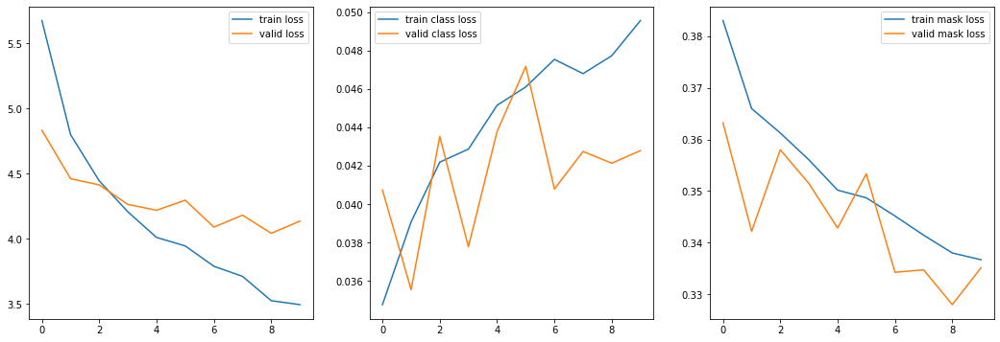

In [21]:
import matplotlib.pyplot as plt
epochs = range(10)

plt.figure(figsize=(18, 6))

plt.subplot(131)
plt.plot(epochs, new_history['loss'], label="train loss")
plt.plot(epochs, new_history['val_loss'], label="valid loss")
plt.legend()
plt.subplot(132)
plt.plot(epochs, new_history['mrcnn_class_loss'], label="train class loss")
plt.plot(epochs, new_history['val_mrcnn_class_loss'], label="valid class loss")
plt.legend()
plt.subplot(133)
plt.plot(epochs, new_history['mrcnn_mask_loss'], label="train mask loss")
plt.plot(epochs, new_history['val_mrcnn_mask_loss'], label="valid mask loss")
plt.legend()

plt.show()

In [24]:
best_epoch = np.argmin(new_history["val_loss"][1:]) + 1
print("Best epoch: ", best_epoch)
print("Valid loss: ", new_history["val_loss"][1:][best_epoch-1])

Best epoch:  8
Valid loss:  4.042009715507185
